# To-dos (13/11/23)

1. Remove fits to log, only use fit_short
2. Investigate the bad fits for the slices 
3. Confirm that the mcmc really does work for the entire fit
4. Plot the curve using [a, b, c, d] and play around with these values
5. Fix d = 0.5, and add "error parameters" for the temperature (eT + f) 
6. Run mcmc for this starting from e = 1, f = 0
7. Just use the entire series as your fit function

In [11]:
import emcee as mc #try markov chain monte carlo

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import data_analysis_script as da
import importlib as im
from scipy.optimize import curve_fit, minimize
import emcee as mc #try markov chain monte carlo

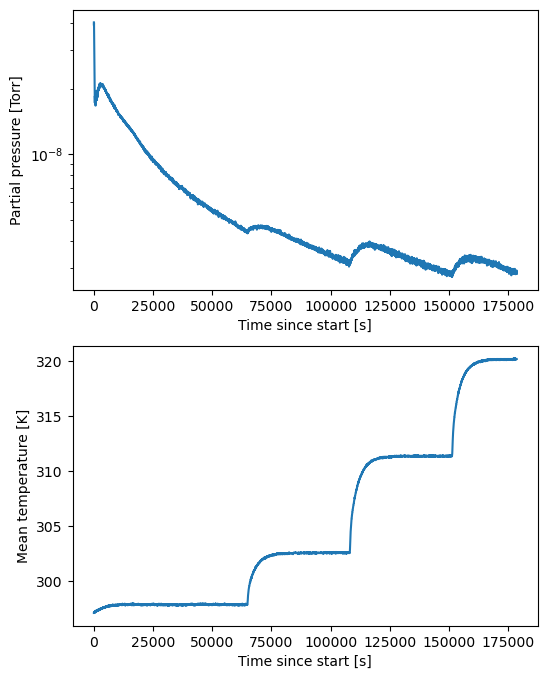

In [13]:
from data_analysis_script import Dataset
run_label = '2024-07-08' ## Change this to look at different runs
d = Dataset(run_label=run_label, gases=['O2'], data_path='20240708/')
d.GetData()
d.PlotSingleGas('O2')


In [14]:
time = np.array(d.data['O2']['Exposure_time'])
temp = np.array(d.data['O2']['Mean_temp']) #['Mean_temp'])
p = np.array(d.data['O2']['Partial_pressure'])

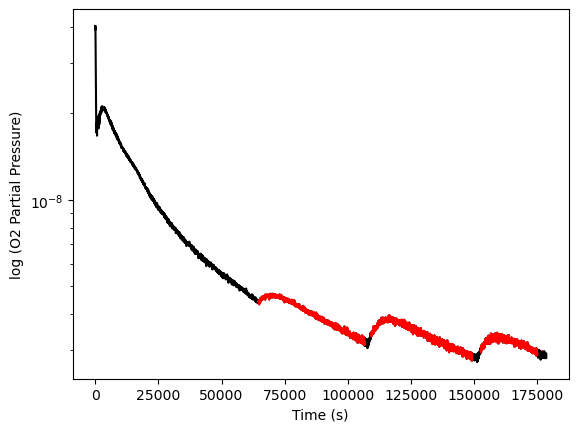

In [15]:
time_slices = [[64600, 106600],
               [109100, 149100],
               [152600, 175000]]

plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

for ts in time_slices:
    gpts = (time > ts[0]) & (time < ts[1])
    plt.semilogy(time[gpts], p[gpts],'r')
#plt.ylim(2e-9, 9e-8)
#plt.xlim(12e4, 14e4)
#plt.savefig('teflo.png')
plt.show()

# MCMC

In [16]:

    
def combined_chisq_short(params, data_list, y):
    ds = Dataset("","","")
    ndsets = len(data_list)

    a, b, c, tau = params[0], params[1], params[2], params[3]


    tot_chisq = 0
    sig = 0.5e-9 ## error on values
    e_err = 0.1
    f_err = 1
    

    for n in range(ndsets):
        cdat = data_list[n]
        cy = y[n]
        curr_chisq = np.sum(((d.fitfunction_short_temp_offset(cdat, a, b, c, tau) - cy)/sig)**2) 
        if(not np.isnan(curr_chisq)):
            tot_chisq += curr_chisq
        else:
            tot_chisq += np.inf

    print(tot_chisq)
    return tot_chisq


tT = []
y = []
combined_data = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])




In [17]:
spars = np.array([4.76666588e-02, 5.27562058e+03, 2.26886487e-06, 500])
print(combined_chisq_short(spars, tT, y))
res = minimize(combined_chisq_short, spars, args=(tT, y), method='Nelder-Mead', options={"maxiter": 100000})

8050706.31063069
8050706.31063069
8050706.31063069
9000978.220417947
2922417.2043117476
8050706.310621366
8048821.048695824
4333857.565189073
3567326.707103062
2321554.5743880644
1169971.0296491804
810707.6258211343
180110.46169702915
335875.38063572336
88949.16755791684
7688.257035416024
15425.207716423054
47413.43334793929
77703.00817481217
122619.68327156082
83894.89516957694
8616.256019851477
108744.31980831643
43807.97116118904
19388.859404067225
136949.87623318707
18993.907549683056
34142.5132843326
7319.870548172244
17436.067016360816
8332.983095824402
34275.103736223275
8541.72957627236
8863.67534328445
7181.366477877516
12224.922826496797
7069.951762179973
8257.289421597294
7231.112285628209
7837.573303862369
7045.124862745573
8175.092236985758
6873.361927662498
7168.050166664199
7255.40005588981
6904.66965178963
7439.477086525587
6883.301242309175
7262.575865456132
6876.950386652151
7324.673814842597
6864.890084805742
6887.452141016874
6843.681744489866
6959.561531581343
6837

1180.1122634942863
1148.4338647971163
1190.4864376932492
1158.6929409804382
1107.311475871346
1127.6865889566361
1121.3660571827227
1394.6779143220765
1125.111915390659
1125.4296776136362
1067.21987429168
1086.2251471132067
1151.3985851366704
1101.8460854998498
1145.7879075354003
1103.3160923168502
1132.4598477714444
1094.6193031679659
1072.0432875183217
1065.037456845389
1079.7199162382697
1103.1881770780724
1083.9742849345143
1056.2785285877544
1052.019345527689
1037.1403362139592
1039.8558484412943
1038.5492674519746
1017.7718292458866
1001.3684028316131
992.518444781077
970.6619577845158
1114.7483809068333
1023.4246149275024
982.2374610760521
953.7234810735123
1000.5422273677116
1052.328244173908
996.6776699613597
951.8595511314475
933.0566205321862
947.7295499568143
1013.1391565991105
959.3533401039008
914.615708654862
893.1583795173001
939.785576602251
933.091643551841
870.335706272253
847.8530976587133
925.1142067778051
1041.7390227311726
880.5492333190009
925.9691170094443
856.

451.6931618167462
451.69316336843355
451.69316144781317
451.6931635785904
451.69316140642275
451.69316383822223
451.69316125079666
451.69316414916614
451.6931612231787
451.69316168720934
451.69316122565243
451.6931620435026
451.6931611334873
451.69316154688534
451.69316116172524
451.69316164667
451.69316110866265
451.6931611225621
451.6931612930332
451.69316111471744
451.693161109497
451.69316114044136
451.69316108963505
451.6931611543976
451.69316108453796
451.6931611690317
451.6931610812287
451.6931611199254
451.69316108347186
451.6931611441026
451.693161081241
451.69316109046883
451.69316107949004
451.6931610886841
451.6931610778783
451.6931610882828
451.6931610775252
451.6931610858007
451.6931610770156
451.6931610899345
451.6931610767655
451.69316107885055
451.6931610767824
451.6931610808225
451.69316107637985
451.69316107846356
451.6931610764736
451.6931610759761
451.69316107655123
451.6931610770571
451.69316107618704
451.6931610778136
451.6931610761237
451.6931610764142
451.69316

449.16798314396226
449.16798314506616
449.1679831481374
449.16798314428297
449.1679831440628
449.1679831470771
449.1679831440866
449.1679831449106
449.1679831439845
449.1679831435825
449.1679831435432
449.16798314453956
449.16798314374574
449.16798314415234
449.167983143773
449.1679831435486
449.16798314344464
449.1679831436139
449.16798314353366
449.1679831433844
449.16798314345266
449.1679831440444
449.16798314340497
449.16798314336444
449.1679831434378
449.1679831433486
449.16798314349285
449.16798314332624
449.1679831433973
449.1679831432951
449.16798314330964
449.1679831433486
449.16798314343896
449.1679831433087
449.16798314337757
449.1679831433086
449.16798314329554
449.16798314335114
449.1679831432959
449.16798314328423
449.16798314329264
449.16798314332027
449.16798314328963
449.16798314329594
449.1679831432879
449.1679831433048
449.16798314328656
449.16798314329407
449.1679831432873
449.1679831432846
449.1679831432817
449.16798314328247
449.1679831432911
449.1679831432827
449

In [18]:
print(res.x)

[6.80115889e-06 1.06654916e+03 1.25078568e-05 1.27965264e+00]


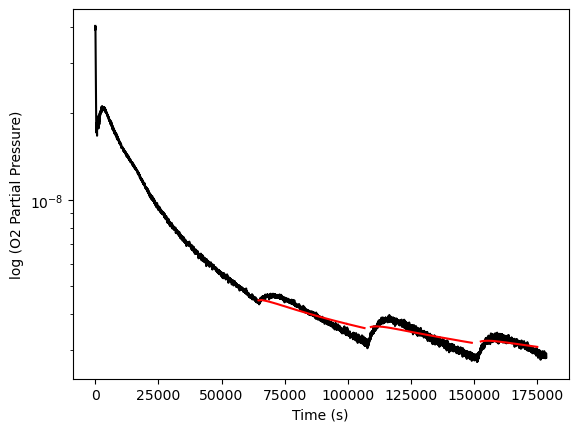

In [19]:

plt.figure()
plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
for i in range(len(combined_data)):
    plt.plot(combined_data[i][0], np.abs(d.fitfunction_short_temp_offset(tT[i], *res.x)), 'r')
    
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')


#plt.ylim(4e-9, 2.2e-8)


plt.show()




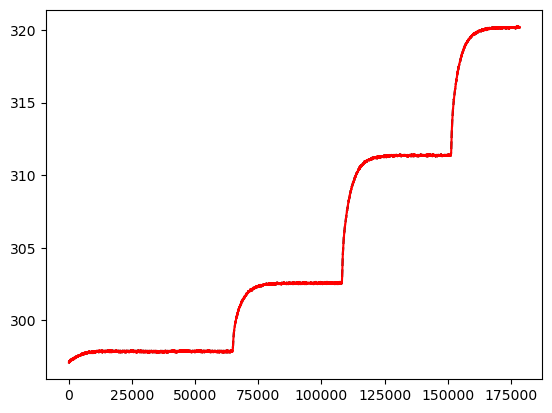

In [20]:

time = np.array(d.data['O2']['Exposure_time'])
temp = np.array(d.data['O2']['Mean_temp']) 
tau = res.x[3]

def exponential_decay(time, tau):
    return np.exp(-time/tau) * (time >= 0)


def smooth_step_function(time, temp, tau):

    dt = time[1] - time[0]  # Assuming t is evenly spaced
    decay_t = np.arange(0, len(time)) * dt  # Define time for the decay function
    decay = exponential_decay(decay_t, tau)
    Normdecay = decay/np.sum(decay) #Normalize decay function
    padded_data = np.pad(temp, (len(decay)-1, 0), mode='edge')  # Pad data with values similar to edge to resolve boundary issues
    smooth_step = np.convolve(padded_data, Normdecay, mode='valid') #Convolve two functions
    return smooth_step



plt.plot(time,temp,'k--')
plt.plot(time,  smooth_step_function(time, temp, tau), 'r')

plt.show()

bp: [ 1.38127192e-07 -1.28875052e+03  5.54944287e-06  4.50370210e-01]
bp: [ 2.72844416e-03  4.72542142e+03  5.54944287e-06 -5.74554971e+01]
bp: [ 1.96873985e-03  4.62853594e+03  5.54944287e-06 -3.12005564e+01]
55788.00360622829
55791.4640246129
55788.003598978255
55788.00360620889
55788.00360621505
257181538286.6344
257181530694.4558
257181538274.24738
257181538286.59924
257181538286.61032
2362.3180448862663
2362.3180450286945
2362.318044905705
2362.3180448870853
2362.3180448868025
2360.8624616637126
2360.8551140962304
2360.8624616930774
2360.8624616645584
2360.8624616642833
2358.109588540377
2358.096095410401
2358.1095885779414
2358.1095885412446
2358.109588540979
2352.8500627960875
2352.8290733744025
2352.8500628434495
2352.8500627969806
2352.850062796699
2342.986582922954
2342.9541648587365
2342.986582984756
2342.9865829238847
2342.9865829235696
2325.8991512915813
2325.845095097565
2325.8991513792935
2325.89915129258
2325.899151292237
2305.777856900192
2305.6732186313925
2305.777857

/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:91: RuntimeWarning: divide by zero encountered in true_divide
  return a*(np.exp((-b)/(smooth_step))/(tT[0]+c))**(0.5) #+ np.exp((-1.0*e*tT[0]))


1462.551575511592
1462.5515754425821
1462.5515754423036
1399.891699432114
1399.5645882563094
1399.8916995490576
1399.8916994330161
1399.8916994326753
1314.4079072383038
1314.3535714158654
1314.4079072671407
1314.4079072389432
1314.407907238712
3446.870899628093
3442.0522306621006
3446.870900509765
3446.8708996311043
3446.8708996295964
1295.1932702867844
1294.89292318621
1295.1932703798072
1295.1932702875968
1295.1932702872737
1265.0302801621751
1264.6735145098173
1265.0302802639283
1265.0302801630037
1265.030280162672
1216.687274639421
1216.4815981523825
1216.6872747001537
1216.6872746401248
1216.687274639859
1244.9300401829078
1243.770629497123
1244.9300404160485
1244.930040184077
1244.9300401835394
1187.1034383236174
1186.7056368376147
1187.1034384211807
1187.1034383244148
1187.1034383240883
1141.0741622395167
1140.7297296161216
1141.0741623197055
1141.0741622402538
1141.074162239958
1080.3976078312412
1080.480676895511
1080.3976078278852
1080.3976078317264
1080.397607831554
1425.572

452.1624541103262
449.50748351595246
452.16245415227723
452.1624541105917
452.1624541104357
452.1613564989847
449.5142123878851
452.1613565408598
452.1613564992498
452.1613564990936
452.16127057804033
449.5157202733977
452.16127061990034
452.16127057830556
452.1612705781474
452.1612588813506
449.51604242766336
452.16125892320736
452.1612588816158
452.1612588814586
452.16125669879204
449.5161106011101
452.16125674064824
452.1612566990574
452.1612566988996
452.16125625084663
449.51612499904064
452.1612562927027
452.16125625111175
452.16125625095475
452.16125615686275
449.5161280385351
452.1612561987187
452.1612561571279
452.16125615697064
452.1612561370488
449.5161286801311
452.16125617890475
452.161256137314
452.16125613715633
452.1612561328675
449.51612881556144
452.16125617472346
452.16125613313267
452.16125613297595
452.1612561319854
449.5161288441492
452.1612561738414
452.1612561322507
452.1612561320929
452.1612561317992
449.5161288501833
452.1612561736551
452.16125613206435
452.161

(1000.0, 190000.0)

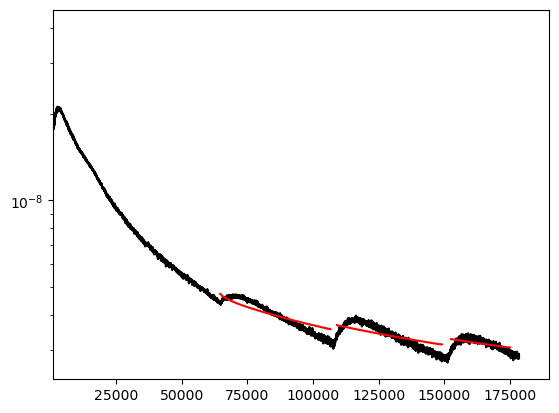

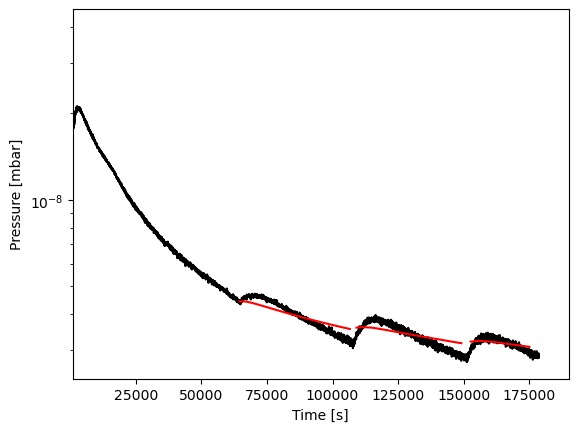

In [23]:
#Plotting Code


#Plot with different fit parameters for each time slice

plt.figure()
plt.semilogy(time, p, 'k')

for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT = np.vstack((time[gpts], temp[gpts]))
    y = p[gpts]
    spars = [1.30068402e-03, 4.04100098e+03, 5.54944287e-06, 4.92508945e+02]
    bp, bc = curve_fit(d.fitfunction_short_temp_offset, tT, y, p0=spars, method='lm', maxfev=90000)
    plt.plot(tT[0], d.fitfunction_short_temp_offset(tT,*bp),'r')
    print('bp:', bp)
    plt.xlim(1e3, 19e4)
   

#Plot with the same fit parameters for all time slices
tT = []
y = []
combined_data = []
plt.figure()
plt.semilogy(time, p, 'k')
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])
spars = [1.30068402e-03, 4.04100098e+03, 5.54944287e-06, 4.92508945e+02]
res = minimize(combined_chisq_short, spars, args=(tT, y))
bp = res.x


for j in range(len(time_slices)):
    tvals = combined_data[j][0]
    plt.plot(tvals, d.fitfunction_short_temp_offset(tT[j], *bp), 'r')
   
    

print('bp:', bp)

plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")
#plt.ylim(2e-9, 1e-7)
plt.xlim(1e3, 19e4)



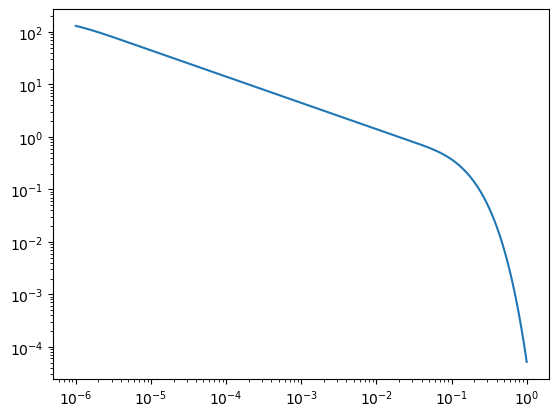

In [24]:
tvec = np.logspace(-6,0,1000)

maxn = 200

fval = np.zeros_like(tvec)
for n in range(maxn):
    fval += np.exp(-(np.pi*(2*n+1))**2*tvec)

plt.figure()
plt.loglog(tvec, fval)

In [25]:
nwalkers, ndim = 100, 4


ffn = lambda p,d,y: -combined_chisq_short(p,d, y)

scaling_factors = np.array([1e-2, 4e+3, -1e-3, 4e1,])
p0 = [spars + scaling_factors*0.001*np.random.randn(ndim) for i in range(nwalkers)]
 
sampler = mc.EnsembleSampler(nwalkers, ndim, ffn, args=(tT,y))
sampler.run_mcmc(p0, 4000, progress=True)


58437.004467744526
54752.85483902559
55712.19580697974
51064.41669358292
55694.30826688669
59244.80688883754
54760.74355094688
57271.310729892975
54045.8749193998
54189.143532671835
52256.051439367504
52269.436498152674
55980.623602517095
53730.69283257286
55078.63228450999
56068.64080257332
57195.82428592
60572.752696897594
55169.414893182504
57981.70525873292
55543.94200274871
51383.23492547193
58299.819335360895
53713.43996142967
52272.29495584438
56795.1156480634
53873.65076372732
53915.851793218906
54737.36066814684
55869.77614268263
50340.45833889622
56244.92366948908
59603.49772217417
50590.84484433853
55161.9464928918
53657.97667313908
62776.48466250961
58478.71644237329
54804.93982422536
54708.88632761333
49515.55989120211
57206.390800797184
55691.55816615712
59458.52827944371
53666.50312127374
58370.17935022112
53169.532479433045
54250.36564053023
53856.2255140075
55579.9889445116
54457.3556458436
53825.86090327321
55376.51919717722
60262.85313765138
55868.40840351169
54447.7

  0%|          | 0/4000 [00:00<?, ?it/s]

59494.09072449676
54518.689010450544
57214.06863306973
49251.41405791283
56463.47355490442
57226.356938118304
54802.877568178505
50062.307707100525
54699.711167504385
56317.72917464176
56552.682321672735
64228.85353218984
55109.91347897439
58358.42913224125
57961.61142513062
56971.91521993715
53829.75818077667
55266.700225755805
57592.90761591162
53641.15247180064
55633.4327658384
54391.49110891162
58287.027482921294
53257.008019403176
55130.57457029902
57431.86598472468
55082.17243487893
53988.24400580216
60430.02744338568
60415.57009393492
56003.06147475958
56510.64788044849
53578.442881386814
55254.75321483513
56086.93494827807
54956.26565053778
54815.1748365829
53879.63551705682
55879.57130585683
57234.655501191715
62827.92877207181
56907.16152016803
53727.05329686341
56829.5991710362
53088.67663844647
56372.30308884313
67107.87610337918
55450.0379804508
54684.337333433126
57010.72845168393
56950.730132748846
56414.77663356899
54856.11846297345
53689.12082811781
56316.628017108516


  0%|          | 2/4000 [00:00<05:44, 11.60it/s]

54082.21113479811
63399.48747401612
56353.96228835842
53492.80445662915
53744.22501966196
57442.46457333547
60440.272007216394
72813.1994001638
53183.78084732747
52819.25886754297
54982.84732378503
56238.94395865629
56737.96188456625
55262.588449182724
56933.03108456886
56486.66749494747
52379.86259624492
51773.43720183205
56564.20134951433
56445.21174369883
60736.79072652901
52416.18626487097
56329.47749063812
54288.02730208507
50426.482626249766
55877.39865974017
50157.49584468074
52629.16705046865
47676.46448072239
57983.910183756394
49199.01042386652
54543.86303635073
49269.30928234741
62822.21882031024
53623.60239894761
59794.95148314533
53236.280771306076
55142.16049127401
51151.554521619604
54514.06961399303
52693.75226682087
51213.12566481244
58726.42819880227
58571.695980354794
58792.801703790654
59562.88941716672
53365.611624952886
60331.183029635904
48418.139419328014
58524.87689964328
55760.08901632806
54506.61275700662
55371.772316865536
62283.615695949535
55305.6888401329

  0%|          | 4/4000 [00:00<05:44, 11.60it/s]

57976.04951839171
53666.316037179284
56983.22586916796
46465.06340956576
64785.73686202629
53703.410109395074
56462.94725846865
57392.822583866066
47139.094259522215
54893.92321149083
56203.8865516178
56249.02851021744
55414.265747860525
56743.81711580552
57364.91398369119
52950.52616697421
35726.76992746572
50701.22225768946
56752.64942317516
51048.04828540842
51129.65058000902
52557.88919834637
55147.59914406603
55020.83055261067
53716.77915860893
54252.36210282412
54468.17077147374
52964.871552563214
49624.17392898151
54147.619429547354
51167.596862162405
54753.458556705766
49307.60811231143
55168.566047454064
53536.47067647973
53516.609844821214
47779.77643987692
52318.59472643059
51640.528274728305
50768.79279780122
52502.45794009144
33910.37425193184
52222.65378819609
56977.907182627096
56242.51632726647
52556.26495067898
59889.50425657742
38135.42190479023
53606.86925791693
51108.828201404656
55730.45089635119
55789.47043456773
55262.55755083418
52436.04031921544
65855.166344802

  0%|          | 6/4000 [00:00<05:42, 11.64it/s]

55353.499590846535
56805.83665787695
55190.245704337925
52703.39429552428
61247.325192420845
52046.27398943659
50271.773131219146
52394.279698230865
24271.757670502386
49021.40815517116
51086.12847242853
55289.531142738335
42313.55452401205
50221.79445577146
49015.64036903842
57308.956611470305
52386.553605700865
57615.6470748646
57629.03673828664
53044.156727117435
59216.938078645886
55561.29107829631
53529.43196813068
53458.290514463726
39471.130783910325
64793.05188015665
53701.50540986276
60385.76769541587
47928.09191007504
46630.542729473054
54366.69744733083
55436.61645358996
41086.35786155491
52120.57218159104
54945.22892820782
64570.66347252026
56933.468443745835
57769.28040578153
54884.66083692893
51609.93712994029
30258.580050489723
53364.8772940705
49342.550438774364
52065.30532608132
37407.39225270694
52210.90648251078
51970.752778473005
51668.01660510145
59095.352300876344
54041.348162293
46279.00601857496
57070.76248830407
42463.26088840268
52521.866057273306
50202.633057

  0%|          | 8/4000 [00:00<05:42, 11.65it/s]

42811.972280952876
54309.42407038645
56073.86794515411
55145.71915735117
56106.91458916797
49124.36146835661
52343.85464652564
54758.77996961826
50046.43481822009
54121.47306596899
56450.93032618599
53675.175470849834
51401.01083868845
53416.59808976691
49671.66911370217
54315.1560192914
50025.56620693093
44582.941533639416
66121.16597557912
50652.685490943724
45804.090517062534
67766.50182568893
55690.3858596082
54467.442950071454
53728.85077352812
52037.10818540066
47390.76615675089
50338.946939604095
52097.876736457
54321.56463040502
53576.32273507961
51065.26089942278
55790.20962531907
50997.75433198853
57601.63709262029
56923.53693784961
56956.18347459
50112.71095776236
56877.49702572698
56038.20240554763
55473.25428949983
57817.34200362348
61929.87112572427
50129.249734802215
46643.09031637864
53406.157742954405
55132.0623754675
53682.132849748275
57102.37700119955
51888.98040598192
51834.8107976909
54343.106592214914
63617.22963583725
55592.48883473882
52725.63206216934
54791.95

  0%|          | 10/4000 [00:00<05:43, 11.62it/s]

49639.71822892059
54466.21210813515
58747.40168770413
53806.2803459765
48465.79076737836
36676.11782261441
57750.505584237486
47767.087995026755
59101.2338887043
44532.99519476926
46110.80792380243
55238.50288542622
40770.962629833964
59085.320579335064
43918.05882116296
56581.03467537103
53370.52934737814
47061.39585942282
48757.21866843204
51523.31686893081
45926.36762258949
54094.23718642164
48612.073639183756
52115.62335860508
67888.12816685655
53908.02447366894
44330.70678897548
52883.65087099003
51831.44122734453
53070.85842774341
57182.65960421652
57913.233229968515
53506.59979434438
54728.361951910156
44935.55786635568
53794.54540047158
40375.154497179545
45302.17278169919
41430.86633139258
54157.4753710025
51426.7775671923
52865.613421629685
53721.829688564154
48889.820090665846
58231.13204987223
49540.80309226685
48716.485279667104
71568.34433910051
42557.343183551566
49027.89850511451
50284.45165283644
25330.57900716982
54499.924332293165
54782.046135449986
36608.25699623969

  0%|          | 12/4000 [00:01<05:43, 11.59it/s]

54937.86650093045
40853.01431020047
61820.06064457967
43553.603035452
59672.99035193582
50813.86705933132
53657.90055245947
48329.85838825492
49390.959993829565
3130.8583512540454
47173.6036014764
22349.848873103187
66700.49411684241
45567.51538558175
38082.80968025796
49607.61450407721
55725.84999706496
54396.63438884111
48522.60930273008
33288.47705069934
43334.35884845835
9653.921215950722
30019.278325342013
51897.38068253009
55128.486818335834
42431.24704752394
69269.0303059249
61146.55896782321
51256.58780701673
41855.794726968306
48364.2764342616
52510.77234294335
64967.51743242195
4299.118124742054
46288.79934602743
58296.901870499874
43075.276739739085
48649.093658016965
49049.77075999973
43702.157495201835
47745.08487438746
45436.35140464112
30027.45954566276
56163.06928239946
52260.7127827879
23117.453651942953
45838.34148654273
54595.86574203317
8521.98198501252
52106.615691403415
51141.51842399944
35968.87671235556
63787.55262596803
52037.66397258555
47127.84997196244
39857

  0%|          | 14/4000 [00:01<05:43, 11.61it/s]

31664.3385267842
35689.36016220471
59112.075253995914
81045.8045265731
58793.83534031332
48909.69920301931
59063.732798287456
56610.57795497917
54543.01533380484
44326.175199491554
49423.08942073144
52147.43662688567
13349.495212054757
41780.957211265704
46528.100364194994
49208.20434454775
35259.200269957684
50587.29685189908
46807.98400173444
17094.26907813093
38836.6408450109
47434.49341556778
45984.70292594013
42268.615698418376
34844.42747887182
45995.80874068137
77546.16706935424
43824.64416345842
80269.74863789442
49720.86487514174
38810.316001347266
47031.033169925824
15290.906302455407
52913.29409690965
20214.271650498988
53377.39450172578
40975.445488296275
72119.60969974962
15010.507564103962
49618.715583612415
38425.98851560094
27884.206615203522
43051.11296870402
28997.159679605913
47202.13989547229
146920.17389556323
43780.646875039456
50070.21587798363
30772.663264490926
42605.89305745208
51598.97895053905
4914.2425098236
36072.970595745835
57468.546153497766
46301.32175

  0%|          | 16/4000 [00:01<05:42, 11.62it/s]

22660.88208509056
18599.393481793057
46550.90708544882
11658.97730095441
7193.656827609468
48467.75626985449
44548.8315239419
2689.945900393869
39079.279268863706
42508.74704268053
40723.39873141795
43092.079044591956
3095.6567512841552
38613.07620656331
28824.51977318531
11272.458472949224
27583.511786007104
46654.331239521256
11137.596476503157
39969.673028956815
32936.36563527079
38581.65838347595
16944.398885636765
35092.39212569611
44244.902159146826
21962.289169302232
35751.6734585988
9715.050876228666
99074.49020952388
45570.394108326815
29299.137514645743
52104.807087714646
42663.752464648685
5097.697443952447
48154.090038317176
31600.137844950637
51328.501929854814
45452.47654744754
53914.26046790701
30397.229678091153
48624.81557747996
47983.15608411137
56489.993835078
46509.73881709082
11084.305884607216
52911.62141944522
19335.413302926885
60652.99074799803
30829.239986074383
43073.74846453079
15719.626646066856
3672.20360724088
113949.32030352292
45592.053981713536
40982.0

  0%|          | 18/4000 [00:01<05:41, 11.65it/s]

33331.74071785431
11624.289346737023
36602.71924671571
44184.40228804751
28540.630226585665
4332.077349576464
17314.668231526637
39526.78791385505
25339.91199621038
37706.7892020426
34773.87657790491
54790.32138763111
3954.122202279188
48305.22214250482
11927.41286969566
41047.668243841545
46136.32596675217
18848.478640551457
126867.39385432198
45314.70691099423
166180.96953502868
47316.41908930037
19807.131274032217
47323.8570535672
6371.817530807324
7304.156469475291
38076.33160787389
22617.796455960834
5229.752848832482
27296.42864340061
47728.58666955773
25228.10733902095
40914.674829130614
3409.0994110962715
32290.074975944037
42085.70303857139
20620.038138467164
52008.049271599164
22244.10560124951
41309.34892121095
78082.85459768049
43673.348457705884
31122.146422608756
6283.185994641892
33821.94012224481
2637.756696877528
45547.62043056308
45769.40281985023
31783.396005513532
42961.825546729895
2981.7443507305766
13810.694607331177
39052.95573025296
31014.980399245585
21908.961

  0%|          | 20/4000 [00:01<05:44, 11.55it/s]

49326.71545951726
1822.3368845363827
44746.30694227973
22675.35216162051
29411.747624099688
49563.69677443034
6909.638802610116
3840.4434973878547
19969.958892303235
44706.13225321329
3322.022579135319
48145.08523387651
47516.36515468886
41291.82393234796
2504.174017523186
39517.526974952285
103078.21479578603
42965.51881402714
39662.13941493129
41487.17800622297
5447.879172601235
45246.39609777639
3496.35260841004
20348.903442740873
53631.477729004386
46847.05563255871
97633.73984777826
14204.60336641385
756902.917544958
8242.051445108651
57397.51736477952
14865.222463193513
42845.30599897223
2560.3768438346215
21447.286696980118
43576.617786008064
692429.014986811
26573.215898043316
43513.05632563522
7664.821169118333
29970.14292471316
2778.328388230643
18102.999810500096
11627.871823538786
316341.7039721314
5318.302088751105
18778.057789552804
23165.42454081712
40197.38674547599
55003.56420937968
9053.670829415023
38995.00860639033
29417.569487373585
8832.751367827583
53398.41496631

  1%|          | 22/4000 [00:01<05:42, 11.60it/s]

45411.22270037943
3588.20566644552
13413.224030744592
80724.83582582275
31302.224396970167
158799.58947444416
17458.7404090824
27426.731784223604
37485.00481099616
19178.269611324264
24280.917183331534
6544.361972770668
6870.689897055569
12270.046147789079
20306.723869699403
7847.954665832118
22550.331862307397
24167.74607532991
135600.48607006227
26040.610746452545
6902.4323329249855
39893.06733537492
41695.52515103118
7124.426902129779
48543.70268517443
20487.06507982432
140871.05307691425
101168.86875659403
6583.769927331657
4082.7175575480123
6011.785461058246
5076.410824890275
134507.82868189175
73580.91126485392
17343.591206281046
4947.667412794472
3261.887291764652
41095.89127371937
149521.77352244218
48535.31663704702
8091.487643228075
42042.409635740456
4413.79010297252
8513.265628472558
22489.792601469635
39636.28520936305
36198.968587727286
60835.41261974702
16163.235444092166
44245.228997694474
13407.50106265878
9934.020358640644
5770.628249210444
78816.12892355147
13310.53

  1%|          | 24/4000 [00:02<05:43, 11.58it/s]

5106.146923884014
3476.1590369881133
19232.099844320466
10660.107621489424
15659.889565548061
11800.857581319056
56535.46662159619
76102.69657475824
2521.5618928115828
5994.843870309342
16032.30166343251
3103.7061475714627
29649.65143347369
26608.903793421585
122750.30967167816
1896.7578280387386
7067.227390348937
4437.389091199356
91393.9930985737
5292.550344903091
3651.620203601503
37657.67735511364
4560.260416936531
9077.079705645418
2517.504214962855
6566.009470445998
2224.3903070085958
9626.1343970511
4706.706757390497
14676.226842875094
19756.8531812459
25515.9958464604
18378.732174486555
23158.806979260764
11055.153498237814
9836.112851860737
143012.8559699054
23297.106537748256
22362.363033034064
14360.77240379851
8145.751947173435
112209.339551713
9783.687733433555
45982.58448939279
5292.021656685216
2484.043049842641
10924.794975665138
2357.8968104341448
7000.943023762291
13675.438283108273
15647.393647639532
47695.215601431235
7859.98773213819
8534.307997944026
7401.30416708

  1%|          | 26/4000 [00:02<05:41, 11.62it/s]

55970.45889852981
3115.2771305723127
9991.290526941058
14163.335344500514
32571.97881414098
33407.36955739896
4114.047879765834
6568.5884503251555
32990.59740811163
5430.652604214651
3518.1852977727594
49347.016706049675
28378.15906021191
13515.733184286451
20108.16655377257
6239.928031539476
17013.826251979528
16282.035716141268
31523.905255333208
31081.2740394659
21087.556890780554
92541.24489906055
21766.222827315658
8194.795325433883
5362.867978317616
291691.2658401364
13935.862108294168
37614.34875229221
3989.2826398838265
2392.709258954751
3634.4994045928697
2331.3296543986403
20347.705825800418
10394.80225434693
26334.24881229372
12563.33958496946
5126.256665757238
3670.166462925892
13607.674977145196
8620.957583004692
3264.290261504628
7028.244459159281
2016.3607273665898
20914.026399807022
7069.564877341571
8506.488883840018
5070.6110854633735
19051.566401062464
3186.5150826406925
17246.88447761956
20102.360081368748
31907.58560955261
33334.64915709891
2607.791117881799
37760.

  1%|          | 28/4000 [00:02<05:42, 11.61it/s]

7223.554616517759
11147.073996060026
4441.9060364080115
9782.221054837684
3617.816247148042
2420.5895343476304
4138.4235745305905
22900.985454993348
4053.4840411992736
3979.5419674213217
5631.26595334352
3289.6224059100887
2508.680047807607
219776.7385850141
4540.777395383191
3258.600112282419
12208.002447519955
2062316.8097849274
1881.6287312600025
2507.5500568855946
50451.07389919927
2991.0499683236985
2713.2147001529397
2892.731691575586
7058.705858613343
49819.25473460172
4721.107424366676
14429.713963888898
6424.675372877783
4301.448580529538
25131.455357578707
8939.730613197618
3790.698285364279
3281.9678513615963
3008.3526674812992
32341.85537507369
144075.17186841773
3074.9016344846996
7499.508133335776
3362.1268537303804
6795.153134336447
25502.763384093294
6520.770103432051
9135.159405716404
2030.9562438598475
41507.01657550831
24211.90038024681
4998.769902801319
13576.460934852455
2888.198535968796
6101.260635555294
1158550.066305119
18967.18957723866
8846.74324683133
16418.

  1%|          | 30/4000 [00:02<05:41, 11.61it/s]

4247.285518719595
1829.9257463022286
13605.749537787115
407850792.9674605
2503.1380596304743
3141.5379996361717
3015.7763143436187
6611.91081952385
6981.469687528786
3656243.302966093
1945.660550502226
3342.9121830292424
2751.3529247974857
8561.75217679036
2627.366747144926
3694.587709809449
2947.030978172498
16241.013056484893
9576.478691383727
16252.982516298274
3875338.307329063
55078.84969993273
35087.375972464535
101846.1092602628
1106342.756684653
5012.745581723606
10827.279387531931
14611.20952824652
17850.199015983235
7431.466296009134
55344.31320119543
3675.0370938072547
8060294.34842997
7630.1313535120025
2211.817315416449
4080.146803332205
6272.823417537112
3509.087912109561
6262.917416828501
2503.891604456462
3208.3970819589913
52808.44285735733
128159.6397435467
78788.70375719866
5528.820295096466
3082.7445681339914
5787.0178309500625
4139.706635128025
4618.7901120317665
1110010.945748317
3539.49911240577
1941.5854914528525
2741.395174726992
3004.122579372592
70883.2763356

  1%|          | 32/4000 [00:02<05:40, 11.64it/s]

12384.493863447758
2904.631318945083
3008.3150625801636
18930.328096054254
10248.363591947402
2213.154258584048
18654.171090466552
2323002.0208254335
12011.13247912514
11911.029111259135
22114.474221775818
2703.3078129913943
6876.3409103757185
12640.039306777393
5968.699278047774
5311.004373343987
3374.1144394099706
20147.115138037807
2744.4271351580846
3156.5187796313176
2568.4063120757874
3132.279898547726
2218.437181767562
12976.346901496718
86417.04150735615
3683.811845958511
3354.7084468827534
3146.933350300609
38447023.24176914
2595.8249647339244
16314.625225406891
3434.7759501058845
2496.917336521516
65806.9891573275
3336.338352426382
19510.62340707393
2217.892252537541
3274.909179875235
5135.670572050206
15405.538658178933
2522.8883198993126
154755.21812645023
4908.4169314488045
3634.0905687002305
6195.122466702399
5536.222581435846
12899.854202472747
3449.513684044013
4963.595889621655
3663.1582261455137
81769.2239651206
3660.807789352777
5659.480017166234
10036.039065811186
3

  1%|          | 34/4000 [00:02<05:40, 11.63it/s]

2248.974594558399
2732.4796601360226
2712.921912573333
52628.233153000074
3294.4463558252796
4237.018662769204
6245.783962325758
4023.0761872082585
2462.382417330381
9305.992487800178
3556.984294210002
17193.81130023308
524627.6724265388
2743.156106068429
11736.427963449656
4586944.839686593
5785.203834256563
42812.01195331938
14238.499893631213
142283.91012698342
74228.04838236475
6274.692812316982
3516.90294449429
60941.716614604964
3350.837194929232
2478.0419925869755
5303.069163751036
5878.16593493012
2661.109926290039
2780.611701132539
4914.47133864245
3946.007553638801
2561.9765493120094
16102564.356232392
2473.9128367861426
3671.7366615530404
2837.913442316355
18251.84165465045
13612.260348518928
4189.60153588837
3421.983956073795
3493881.2296411945
3395.6872527805845
32213.700720830962
2384.454880715758
8517.706403972003
42783.14243693123
3380.0258675985638
6385.368954326953
2547.908051720531
2428.5767318216103
51473.27566407721
2276.722856592948
41901067.98571414
3861.39497614

  1%|          | 36/4000 [00:03<05:41, 11.61it/s]

5060.246502376491
20502.19938486028
2633.0304030108528
3683.288139041514
8244.299545805576
3170.2157789050034
53945.96301635101
51936.51899974206
7342.750271355449
4079.244582416409
2545.7806629778806
3657.9574792149174
3651.2798809504816
4049.012580965274
2993.704282273711
2506.4219791124774
21477.00284451131
17344.215561780176
3278368.4671126856
9845.552111898738
2675.2946763798614
2619.7680245870583
52875.18180601172
6723.213309236345
41477.629140167875
2601.5528852683287
2605.894714940711
2097.1292230054914
2704.199256063903
2470.395349541939
2327.5923612701044
4355.447239722786
14378.942471126598
10477.393731991497
5514.241288183713
3311.9234342881914
18848.305589138963
4129.002691466732
4197.761819301331
2635.5308060816496
2716.473613984922
7940122.4919433305
261332.64381962048
13426.375918285872
8962.348798182826
574401.8879022241
22275.876781992865
19480.485172857072
3305.6123521634563
2868.077026633674
37418359.29223662
2310.466460707996
3331.572761028333
2509.3167226837472
21

  1%|          | 38/4000 [00:03<05:41, 11.59it/s]

3128.4817318470896
3648.7171536477445
2334.592955826097
26881.345637420665
2114.5829667930616
3441.3659866227913
3409.3798057362387
6579.289061597687
8545.9413745879
66040.22313264824
2930.984578433903
5567.052291159529
10558.287783372434
42798.98516374965
268261.34194029146
2573634.024833767
3299.472840897515
2606.6614997261477
2941.7077298448453
4090042.5388541017
2012.1583454189401
2722.1597937613396
1819.7449426721496
2805.238391368401
5591.822264833754
2390.1790141843617
2668.6980055215045
2869.0630232797935
1989.3984895977485
6113.8400526649875
3318.226371385632
4782.67931731581
2710.358642504052
2453.1971233300133
34981.96502719109
2275.252895300362
852492.0599646927
3269.1489878276666
3216.249249793746
4844.036137313261
3378.346434766911
1959.471736351075
18846.857387952165
3374.7584529326095
6745.993395639477
3831.205963243793
64933.43645536553
2583.150705226695
32519522.553268623
3826.903901143972
3301.1384861831584
3363.4109034937533
99300.36207432016
3656.522727671823
2823.

  1%|          | 40/4000 [00:03<05:40, 11.62it/s]

3272.1211387640674
817815.5057875703
5486.374274647367
2901.364414627021
303977.97513573326
4152.247772700752
10789.404661916527
3447.9078692777484
1763.795522784562
1743606.4835242576
38338.92445963052
4207.70791453277
15648.859209526912
14231.43509291171
2916.537891983841
4227782.709527349
5341.423183156825
8596.921482543861
2672.78225683263
4712.780111688609
2014.5097744908715
6204.7938330045545
4762.105721439359
2461.4225750283076
4916.926680573735
457708.18616057874
2941.2673496254934
17278.322959852107
1967.0981062147957
12509.909194671476
3268.531381511811
3208.817339649192
2851.490589623938
2379.29705755048
2252.2147717818443
2638.4673646103847
3204.8653135424506
3362.4997679220805
7171.340903073903
3223.727377954369
125795.03096687069
4404.876346934549
2244.344152021643
6377.602456600891
2454.356004951775
2668.1266782467656
81339.64307825932
42531.85873038764
31475.309768695144
3659.6497666122596
3390.8863499658437
2454.8702071912357


  1%|          | 42/4000 [00:03<05:39, 11.65it/s]

3735.283347639311
56269.31480519981
2524.3608850529586
4009.14722473421
11936.640702810479
1841.8808648320771
1766.9950285964605
483296.3454321651
3229.3615526511476
13065.517565446851
24663.244449684287
2139.3220909785987
16121.551442365442
6265.910236488558
2340.2658129885185
13490.2182167618
10896.94544485045
543626.6627514694
334939748.2653585
2337.579657414368
2847.919663062333
2116.559874438576
2391.599703559334
4573.347488274425
53423.090458007995
1835.801300993832
3244.925509928037
2700.333165540853
3378.413183553659
5333.253333008239
2469923.2712855237
2749.9216355838143
2310.078829441666
4052.044959784639
14382.642965535517
5278538.682230495
3208.2715279147205
3217.1625476355757
4780.767053525755
8336.181001096644
52871.814780521585
13572.01121135063
3073.395168621958
2432.2734337400957
3017.3586559069327
27481.651657042272
2423.920736096746
11484.349751160447
2007.1784357428933
3265.1197217168556
11529.376144556905
3377.8317988599215
8442.477012567335
2022.7284839044787
3575

  1%|          | 44/4000 [00:03<05:39, 11.64it/s]

2956.591766972612
3517.531173716089
3489.3671945645383
417964.35950166325
20052.21437247508
2668.7722475004007
2829.475927036041
1872.3627329111546
27233.071600779163
8832.982525626307
2470.8924565935927
1990.2137130345775
17878.025237206668
8257.461826179759
2486.2250847072864
2656.127982117624
2372.8849435294874
4638.510895393872
2033.2479177133469
4124.695306494474
7500.649419598817
27814.8004708002
30970.8544269041
2794.3898316254176
200274.35281105226
6103.702621202181
5119.115566493392
6532.248333530619
3941.9743555876466
2536.797371682697
696781.7391816122
8097.945727425459
3978.9676229125034
15429.13137409285
5200.248113906047
5624.196202645411
7064.551814514235
20390.43838326299
4865.06834441418
5822947.538580954
3806.84168730939
12337.798253312405
2078.526000228572
3377.1354129312767
3382.4365278224736
2920.2501262896894
2825.3808915974923
2378.996422839342
2862.5489140515238
23320.910399504035
2630.6356152270537
3596.5224716742755
18913927.887459166
4095.3551014944974
4263.2

  1%|          | 46/4000 [00:03<05:39, 11.66it/s]

2633.5254907023555
2338.4164340206967
15242.33724395237
2068.7856994602434
2317.7888446558336
1963.121212124765
2215.1844002751927
2535.787090978617
32668.420144576616
2021.3484659361454
3325.4580020986277
964012.0274109527
20880.250727718856
2270.5420841324312
2665.6928495441334
2527.545716241952
10470.041605296134
3063.3314090098575
597414.8524178173
2383.7364533597283
2912.3029023065724
4191.446809613631
26292.72640532901
2224.277116303481
684062.2524785607
10190.317834193624
2202.0818809732873
4401.855747964148
2503.1311771170635
4616081.62084707
3369.2960344798094
3341.1632594726784
1180594.9473813127
57794.43590687639
2411.176229778524
4072.2218387270837
22539.644994390088
92041.63991986428
1918.6552730953556
3491.546288830581
2485.921863368966
3107.082870626591
5978.5311576543345
4370.791031027152
3140.1386475239424
1931.775712707298
3512.418058582864
7034.700759923513
2497.288993656254
2436.468494136027
242459130.16743043
21626.363871886417
24669.454553638912
67871.00896811471


  1%|▏         | 50/4000 [00:04<05:36, 11.75it/s]

2880.4684479537955
2244.566807589747
48474.63366158369
2515.099097965329
2372.528279199377
10085.776089889747
11751.665946235753
1697426.9408607637
2632.3948531278397
3124.940054250846
2191.077103264699
76743.6622127485
2347.162851938355
6791.271299840479
3578.887753203312
14007.086541299386
88204.18113634884
2237.4892801789465
3215.866095258917
5240.8618985316725
7217.876535235177
2116.6489547158094
3181.7733918674403
2357.2225622395636
6166.5752218361
2323.5581363516367
63734.452127448436
66334.25099142159
2825.3394146941787
4682.773453262194
2357.5732515805225
64737.25581153719
1978.0796724548495
5608.211164834818
21184.020339209732
290336.4925180002
29090.906468766807
22841.31324990023
3087.0941616192513
2806.7368874426465
2096.7124093206558
5394.389480860627
2927.284555530704
3335.644610616675
4244.2078931256665
1811.1323536907048
1981.1453034730005
3885.7286494509785
11660.373079782206
2430.932246965742
3377.940216896526
11747.310852476765
1896.8089203853324
3032.5387651427873
21

  1%|▏         | 52/4000 [00:04<05:35, 11.75it/s]

2420.516034692748
3745.4622955665427
2459.566899424586
17607.941117883212
2728.4861649724735
1973.7702810710107
2196.338160024356
13248.960268765863
2521.7421476659606
6100.961930477626
2764.3892903338883
2513.0776654229667
7916.327394409815
6326.191122694306
2284.369439226651
23894.64191237615
8471.334090056514
15452.636365558412
62824.42497882709
164311.15729420894
3014.2171787038633
568805.9441016642
2940.7727165796623
5909.182472867427
2054.6996989782774
6293.0208468312985
3953.387619478843
4673.909092146743
18667.647957746503
2534.922839507472
160504.33248829862
2777.3139954485832
18578.844355913898
7828.265241154533
3791.2591290745863
3620.975829704209
252257.8259353151
104523.93592674904
26435559.632397644
1887.8251568083274
29631.51561986102
3430.8118034333547
4882.099668158811
2383.5240480006987
2464.393397391127
3310.504592806803
2166.2149124816083
9370.514833564028
1946.5005631476322
2754.130364146994
8823.257884369403
58043528.759462275
122624.5099871647
6212.716173005755
3

  1%|▏         | 54/4000 [00:04<05:35, 11.75it/s]

2354.9801350690086
2240.9066851313028
2201.9784651610175
51875.83211894268
3795.1184880583464
6272.747876357317
3182.6005203229743
199515.89539850375
2701.292603202549
3301.1708390828626
3526.3166174451085
2957.989549178378
8370.237264981133
10541.27443232588
1776.915967921235
3298.133708728736
4602.346007472321
2904.185047044805
2818.079638394062
2091.1459392129764
3131.601175475646
4223.446907635359
4083.0311391868536
11154.359262553897
3483.3844698109415
11808.934513707172
8240500.630314342
1944.5102271239168
1990.3717464360188
5824.862515468286
27138.838914877277
29673.670595877044
8741.265162749613
3149.632927557342
2070.9643340726443
7438.10902950997
2465.9865919423664
1826.5151423007128
2527.9350510996437
2452.026902370886
356289.9340177014
2836.4008914113474
7314.175837181929
227093.42145339592
7367.6264906627575
18353.025938020608
40803210.02976415
3658835.803880588
15799.620523884818
28094.33924832053
79546.8277377382
2133.9646077582047
3179.7847086905517
16189.156233516283
1

  1%|▏         | 58/4000 [00:04<05:34, 11.77it/s]

2912.3237540631917
2905.8714908915344
3926.5473801606404
2255.048098527185
9168.935915324808
120900.67589648365
2044.4167350553685
3404.50407971178
2841.539298081531
38308.55236930694
4255.9011065714185
2342.6721390881526
5812.700852333017
15725.197951966797
5075.615448661264
1770.145230979548
19713.958919296078
3041.2412359040636
4576.557489786306
2398.1333377001156
2420.9427740899305
4418.710056972085
2100.2741364654876
21637.391808546654
1873.5886115724766
28726365.804953836
7453.5963352003055
4190.466518850559
1962.1743872326606
2219.576239220555
1815.7361519155334
2924.2595095271645
6388.719525920121
2125.4309516580342
2298.3677198794658
40791.967590193526
2357.234407277669
2652.2822940828946
401318.6835403505
2297.9990511189317
14493.239509734529
44203.40766003688
3882.2291717567628
2767.3532378436503
5979.49255795967
2687.5218083267005
3610.3845659034137
2281.8882343345576
1667.4092911630041
2002.5862662410643
3099.0706427630807
3640.4436158692074
3464.9962916106815
2143.1273197

  2%|▏         | 60/4000 [00:05<05:35, 11.75it/s]

2348.9964979435777
4748.856568500798
73483.7986459083
1835.784058692104
1863.7994254561831
1733.8236982419137
1929.2331623563762
2932202.8715067115
3504.646917252984
3224.742994758337
2743.9916314591237
2500.7756431240123
77180.21277914976
2064.2451254860184
6370.088925623452
20288.660225907613
2422.268917449052
32608.29538154844
2321.465039347918
2414.4335718331668
2414.539628943015
2066.565425450699
2734.59690960868
23200.358684316954
1034764.4691593295
25242.839268898293
18681961.191711158
29124.475619235942
3254.831941238224
21131.417462063488
50964.07631844951
2620.894380318081
3137.9836767910956
2181.0237062780825
2440.8985712464128
2091.6480093830787
20268.405444622233
3034.50802023491
20375.57274167336
222345.03167077532
1893.4938466968956
2140.257242368085
5346.053225803829
3233.885085445916
2934.49647001754
2547.4443986934866
12044.3051122134
1846178.393939471
2767.902660312797
2518.389608637466
17354.100546113128
2955.0884192002095
2484.5960653129264
2608.6265723937327
3848.

  2%|▏         | 62/4000 [00:05<05:35, 11.74it/s]

82722.18346851555
59809.630313860645
3953.9537471194976
2488.8150077295963
2576.592361101505
2187.6829702657737
49879.703478872776
4942.221231094832
3924.799816043792
1821.0599327029533
15443.778782306656
334669.6992199101
2948.185971868531
16776.88129157736
5377.196732255905
2014.6918891545313
2154.1877281960487
4234.8434320159095
2027.3958026390321
2261.6699279306017
49525.667570627586
1641.5227221379423
2793.210384628098
2628281.4403795274
2001.4005741971032
5390.133390997284
2511.8839969598725
62657.98328257089
3129.9498956995744
2361.8830748647933
4140276.310227205
2173.879418054066
18901.095089145987
3006.8556148076946
3170.079262259259
2003.0145796600143
3492.664944764611
3645.2595339149166
29884.498397787433
11547.923100805283
3195.811137569325
11181.17596398082
2283.9516382997963
6190.882416128445
1722.3053404923091
20154.748356437918
5418.169809945431
180138.22929504502
56861.065647507145
6862.941856228363
11995.387793486152
7357972.1202110825
2390.3101144367233
7369.83850029

  2%|▏         | 66/4000 [00:05<05:33, 11.78it/s]

3469.0221167339396
3343.139987992432
28259.480599855367
3895.9041082479916
16282824.922344457
1878.8737902446928
3069.9863371229058
3197.082308246361
2515.883343065621
3673.083950933276
5914.078534222564
3660.3547189586784
1954.1813378767083
3063.2789496584332
1718.9335170074403
1850.35513781573
3168.3048979897685
2910.012421863082
4189.941451844112
2656.4878678846767
3918.7379484232124
2926.2447686318046
27932.47500018639
23199.024743670452
2559.0328009237937
1826.9793453227658
2380.566591184887
2310.1983805623017
1767.4853505387805
10740.87401161167
2606.064413338065
1974.526519926456
2918.861729598611
2843.875141674421
39382.11862718716
2312.9501921100227
194494.30352887348
3875.2330807629005
3181.4827555850925
2411.139900607613
2164.295686937314
2019.906727786001
4895.819272360385
4069.880796732732
275945.85846738645
4223.389899319838
9066.058050102803
2443.162308995627
2057.5656220725878
15238256.735208537
2947.2481869467174
4656.3883789085285
2261.392305271089
3505.7657636389813


  2%|▏         | 68/4000 [00:05<05:35, 11.73it/s]

2334.690126082967
2159.2663940542798
2242.891746810137
3972.4889241753185
1938.488644936163
2852.7863398664413
343019.7187618948
28270.12745254567
2367.983096724387
22061.4801218595
2390.6014752829756
1987.1025260888505
4373.582047768952
2233.9760230058637
4194.397748101895
3477.9517227608058
2240.4960811484148
3003.6075488413744
4720.7730184769935
2911.168336771243
2211.0297751888884
18276.178618625738
2704.492715337792
2269.261664728847
1864.1975389932277
7080.7165214421975
4592.869071114511
5215.453573809594
3916.5119927858104
2423.023467032176
1983.3581663194886
48502.47357543008
2383.1693645091505
35363.84322106918
1835304.0026147559
3560.15073771481
2758.063677175325
60822.01167854366
2972.0841359491724
20818.615051106644
18276.516765722125
4948.456251539591
2268.9995378899284
2756.825534905624
24318.49776158788
21227.124916023553
2824.736156313943
2039.0272086555365
7680026.947040471
3706.2271788796356
2324.4668790284773
3024.9851516213735
2712.169419896367
1960.043020708466
233

  2%|▏         | 70/4000 [00:06<05:35, 11.70it/s]

2952.0523998256167
2590.701614797563
1970.4485650093288
1787.021758675443
32982.46756316374
12228.140065704862
3211.4248639205553
277653.9536925922
3053.488012787632
2097.990640779034
2575.7389944460065
15255.87431334833
1940.0393128856585
5063.365896311717
2363.71277803769
4730.579012960806
4243.437731181133
1800.2671935553901
2753.2957664551623
549263.4492317884
2925.45714839714
3530.0199113476824
3079.3026491919763
88591.7411586174
2709.9519614005103
47857.55773647536
2703.608848288912
3279.4145880750875
9889.202800775725
2785.603625240821
2184.5846050012356
64836.513136981644
1921.045686432556
2928.2586830410314
6271.343490432807
2071.660930695246
15236.903293717718
2069.2379107808583
3960.041962083592
15062.047422377254
2252.7933009194835
2934.6932613113745
19565.927788885463
27355.16738518344
5636.484911635395
3184.3809110442426
2185.220649145522
2050.265964225501
1930.223222687407
18127.82635791989
12687.742553263928
2680.986099735709
1765.254988395911
3565.628313466394
4798.889

  2%|▏         | 72/4000 [00:06<05:35, 11.70it/s]

1750.087106207231
7944.737877713947
2244.8244409076156
2239.1572019548594
2003.67484094151
8547.768069429243
43571.05529484249
2638.13376458316
6162.986460809653
3535.0218216655094
889658.8114443639
18979.27115260211
5350.215241686263
2359.32643698653
1890.3467873717857
2911.869420985844
9012.630053710367
3044.0195754105807
40404.57224388303
3228.439836205017
9628.072912555808
2801.6318064017078
4727.190835571804
37253.45709844045
2473.3274729618647
40758.00314117802
2167.081911126863
3787.3471797904713
2119.477408689739
12955.144099184105
2085.83358249008
6159.989340280111
4215.3733577849
2717.6118607945978
2141.7758434841326
22810.13104692803
9103.556446506316
5595.6966103017985
1834.1967254906606
20044.697508318473
3024.5968824778865
2617.9742589831176
2406.8447200455494
2109.9706214561606
84244.2866354797
10956.179874056805
1852.9727883675446
2289.834321826629
2140.5488229142725
8484143.164799321
1913.143959877075
18554.783950720404
2119.4197358824754
26532.385701277602
2044.716228

  2%|▏         | 76/4000 [00:06<05:34, 11.73it/s]

6095.059240420534
2054.9058504254344
2889.1580118595907
2485.658156535676
102170.66232440005
2425.476261161012
2269.171880986166
7379.299541050618
2873.965277457576
16133.54782459713
4445.889244794429
2161.7581653391744
3845.791088825962
2076.5719064896934
2079.20961971404
3878.8374338586113
2928.998472225683
2826.4823963890035
1953.2906071310913
2043.7936900133668
2816.8296720863286
68031.60308459133
1915.0662452980803
2968.1940471115604
98950568.73698324
28301457.821223922
13671.5678298435
8162.220156079644
1913.220472377277
6369.110332853081
7926.8486316888775
2233.5895961255574
18802639.91735161
40292.66113225048
2001.5483719023566
22560.866531815416
2239.201547589422
16805.634727424942
1761.9892402639475
2241.581496322836
1994.1974595948964
3123.878993010348
2199.167583969452
1848.7572174843463
2862.686330695817
2457.1760675806545
2308.6922686131693
2230.8389506784392
1925.5917134846593
2658.859502466997
2148.4640845281824
4605.553625995044
3239.4487072469433
4044.754752678349
185

  2%|▏         | 78/4000 [00:06<05:34, 11.72it/s]

5268.997687074829
1988.3840159124597
473427.3196200072
2736.160209147206
13843.678863722076
196480.05928166062
3226.656189823099
3073.8427688084394
2905.150974708475
3045.873210732138
3977.8979093820208
3788.32471268245
3153.0907397178485
2150.3732425541693
3059.160488467548
2289.388876034227
20426.06084303295
4745.140512468521
86558.78667912085
2220.184802824385
19354.09775091413
2470.963085815376
2731.361235751913
2161.8804132130463
1921.9411532449867
23851.375413985825
2573.3826027002715
3721.870781951448
1955.1996723469435
2939.730131562697
10538.791193430201
6110.083334084651
2921.123787250361
4224568.675952733
4524.388811758764
14895.402828321847
2141.4809008649377
9681.947921846444
3149.6790762896835
2033.541715748403
1796.5560686139954
3634.377544142696
12767.01246741264
2141.4171973109314
2712.7800924712506
85387.53739433842
2895.039585860478
1851.7174449700187
2471.598333718371
2248.3556573740134
19250.08174826714
10067.736850489873
2859.0477925105897
7430.802155457397
2615.1

  2%|▏         | 80/4000 [00:06<05:34, 11.72it/s]

3650.5154465802075
109853.40063746748
3637.8468168287504
1693.376973222416
19107.532476071494
2218.137222924048
1844.6152429262518
2832.3365623725513
2764.9526800854746
2723.026193477949
2039.7092753029026
28150.18879433242
3619.98802373486
6374.743017302727
3528.3410470696363
11198.45734674838
16459.25196420344
15722.153044328263
1781.1270816167707
3026.067238961855
2140.0628311531227
6162.046884148923
9710.630841574619
1788.8013888846922
38947.049554514306
10679.114171384721
22915.428457603168
9817.473325755347
2022.1519787952138
1699.401881091644
7241.576536418029
2946.5859714127696
925241.1280297809
2663.328455710737
275330.1304963848
2055.014990499439
9957.967886870647
39149.45360263065
2196.0067109448632
15421.78333120305
1981.4822607515016
6033.880625771006
3377.982547767407
66433.51281920631
5803.217738284349
2098.4355711875005
31682.640521930756
3832.103756206135
3154.3319261409133
3527.8758822378372
3048.1796878395044
2704.2635010194563
3141.8676551148837
3227.736399139507
25

  2%|▏         | 84/4000 [00:07<05:32, 11.77it/s]

3405.5494155890183
1564.7368667625365
55716.04721239813
4346.860238431782
3009.7276479961088
2727.472462835778
1982.9000332431842
515877.05750207196
5389.185867684469
3708.249109082383
10650.777604720597
39036.930599804575
2341.254588872788
1747.757954177091
2012.2457170027335
3102.517401218411
2611.5056137047086
173560.39551817902
3141.4468955777884
1775.7283104238236
12164.319682236845
2163.827593437232
2945.3975964475794
2462.3626243411227
5843955.033178259
3591.8913917200034
3768.6168659509162
1771.1505238424827
3960.4854344749106
2213.097309298299
1926.3754423727246
1843976.7877827198
3963.4725689936486
3629.9573294288202
2606.7792529020844
2014.14043500984
1848.9488240875287
3442.3276188254767
4194.309513515218
162916.70336826422
2196.897058370241
271755.8485710679
9725.367772762631
2292.7343898648924
138300.6573416242
2126.0960047798853
3541.495315805275
1837.0071647895536
1026941.2870827505
2151.756305325703
25439.516254228896
1561.2094738786004
1829.1185672871043
2945.76400135

  2%|▏         | 86/4000 [00:07<05:32, 11.76it/s]

8635.23380905291
17975.706070835404
3039.9902699974255
16873.109957699653
1804.694250759121
3595.943029540098
48133.212319780854
4129.3950148799995
2332.1679450749143
2728.734380242613
3294.4509261795256
1973.3105237329078
134702.3806299896
2263.3902522412445
120398.3608164597
2084.687105197927
6953.272927426075
2305.73594987264
792232.2602768433
2384.2867834292683
1701.4566276825587
3066.756132795126
3011.239878868062
2195.169849444983
17186.075520736973
267860.2391200682
2970.2832220096075
102268.63180438876
2194.656226911694
2406.7704082919518
2161.417330606011
308102.4374576887
3085.430000722365
25313.459780143916
3580.189487756318
1800.1710701423424
3383.4950437736957
2137.8590142110093
2577.6678934006413
110396.24208312828
158313.02783404136
2209.8939049096352
2443.6129598881407
2628.4453463026553
2831.739037981067
4150.633111728842
5947.870840876781
8052.720266052733
774071.4908114634
11330317.627969056
2506.5160483764803
62513.833617131
2841.731578200762
2727.634852140562
24273

  2%|▏         | 88/4000 [00:07<05:33, 11.74it/s]

2497.8661733540184
2291.6511333499357
50833.87490761904
13554221.911477622
22878.632831048264
2655.0922452864884
15690.419714327314
7917.013930954935
104957.82956708028
2712.6096018466615
11711.279063515038
3128.275215285439
3381.8592634116335
9441.532334033236
2670.7675955717236
11381.062434446729
1867.042925638866
3061.7534145556965
1522.3052993301899
1806.523867149379
3599.697998248551
7566.9980578885425
143390.4516718896
2899.9699435424677
9030.487203104252
2042.5750849352905
2540.408115303114
34176.50860577823
1968.5975999693687
3118.649361884965
327545.04352339177
2366.6687949091856
2442.8003462451597
3945.401854914646
1765.3025442925696
6624.637402680351
2503.032637692817
3115.129761126142
39855.239876677326
25984.978927639266
2013.3943301025336
2375.2434222786833
1708.263746644942
8614.69128193214
37910.66450503886
31159.33986149985
2299.238918530935
1809.4008488093057
1701.9768784335201
4519.223961154529
3798.599740289012
2086.7505752770494
5278.802497761169
5299.378476553084


  2%|▏         | 92/4000 [00:07<05:32, 11.77it/s]

5254.847317650133
3745.4164054529174
2270.637567561179
64785.23170485439
2121.5339183646142
20562.987783957557
2473.140604049979
3236.5499941597127
3391.1243527004626
79731.75551692228
2905.619794338756
4821.735497336039
2160.1682599710143
3846.303944788072
3198.6474271950437
1715.8078438819234
2309.981746848055
1741.4216636777087
1792.0192635253663
7812.024262718325
3172.6892255867583
1755.3978097136983
3015.611219676456
2150.7264925780955
2239.8018704909723
47074.85595252813
8193.703594744922
2197.0664799883325
2142.2828053974617
2271.7910875245643
2290.668103504795
1939.6891120314383
74033.82039739947
2297.293135481801
43141.07836130468
2011.806720853529
1918.4179444976726
6600.8795923703765
49195.89974911332
8091.827240732515
2681.2024598173243
1580.9406373679415
491481.0272987878
2888.595176697859
51485.60874505649
2284.648544660424
2279.0564063576844
10141.350262160226
13494.81902769162
6095.811401397404
18038.85026587979
2669.821206706719
2214.312151677598
1699.368614328987
3630

  2%|▏         | 94/4000 [00:08<05:32, 11.76it/s]

16623.48846234209
2594.906963586023
3070.574449319809
3437.513900254464
2591.906691405102
5750.645654850439
18769.66874165996
1738.4264487984724
3610.291950129807
1720.3152597646167
2135.337700605086
1819.0478587843065
6320.875780955606
4110.146101048758
235037.55885449523
1709.5589516361865
2470.1316618138294
2781.834621809168
2793.845789477215
1975.7795515994694
1787.1376921920885
1926.3722355548778
4776.490265705943
26415.18430379205
2022.076050054239
2586.0787910278145
2982.7440459582513
1638.3479129820607
18099.979275696613
2816.9730240766526
1963.5415866641815
75934.78284133859
357320.64983294794
4987.3791646084865
36665.73923737321
1885.229813625815
2743.8194045549953
2659.0820921242216
1763.5319461698637
4618.273192738247
8950.558372635724
1550.2760045104742
12285.328947689588
2305.712441238607
27796.369919426103
2161.6384220734863
434373.1707275034
37946.02743776694
16950.740355454775
1638.3441274343134
3873.532527601099
1901.1694603491965
1593.3307576001148
1939.0654611218877

  2%|▏         | 96/4000 [00:08<05:32, 11.75it/s]

6183.706945247881
1780.7913919629589
11794.40894920044
4656.535153493818
73262.80016647081
3818.0050986252627
14050.274173615604
2134442.834005991
2233.8277413558176
2095.3669558819365
23812.8138629446
18741.43388551556
10979.82161340717
6920.437888199684
3904.915293729449
3026.574785401218
2193.237995662689
12114.752706579178
69132.18789971563
620034.1154722234
4059.369097737529
13914.665259486621
2516.5920417803864
42716.51002679154
3739823.786917588
3597.059671744407
4697.226898811293
14456.719592587955
1600.4368300151627
3370.035415750971
2164.3613948528273
23778292.587634172
1910.8350459776816
2052.3088555712848
38380.44630546238
8514.531411022243
74275.00224018762
3304.4484310321727
2065.937871260281
2324.3853813390397
1743.1940783237726
3105.575415718115
1797.8875328137706
47843.72577116935
1734.1140372327982
2205.3299963338186
2437.538050035752
2514.2223578313606
49320.01378752147
2805.4860565718764
1812.8351607795798
14870.065868859028
2304.897141457673
17334.47605595016
1793.

  2%|▏         | 98/4000 [00:08<05:32, 11.74it/s]

2600.5367896099333
4852.317212399079
43596.62770845088
1981.4865438745453
2935.9977166855974
1989.008186025725
119644.34996753992
3797.233607906862
2933.2729058647565
25714.547247209797
2500.7736216277985
2245.1848772007784
10776.00814605604
3311.2552368760344
2674.86644646081
6188811.513701654
3796.2118471300746
7065.028819004507
6332.501024213008
6542.734260861021
8017.588424870277
2926.5931078737185
2931.327738708509
32115.667480943586
3726.60236117136
1739.8086478318905
2261.0697341715995
52335.53465763096
2295.389245598034
2245.1701246186267
6780.708484467084
5683.319223274562
2700.9746318988696
3457.6092631284296
2000.9623504250792
3694204.5031331163
1075472.8185946501
4272.439151516346
2012.0054429217262
10977.526721124465
2431861.8024662146
3108.529525127664
16299.420343852302
40464.73108282327
1709.1122039373636
27510.608419050848
1758.7127816475934
8075.01654547316
7067.276707625293
8499.518362727558
2066.461145701113
1766.9057910246706
7235.940319924401
2391.9019779707414
19

  3%|▎         | 102/4000 [00:08<05:31, 11.78it/s]

2387.5563386741296
1990.5412257900048
5281.7588623241645
1759.06591219845
1840.368880567913
2750.8404056331215
2300.922150039686
2099.3141657696196
5138.509268439527
4249.574558448794
27767.838707233197
14784.807156235167
5232.800344004413
20285.73202908586
1727.0091838226108
2271.7956438455176
1100252.1943489327
2221.0084632060666
84076.21914560176
6894.518637466156
2924.5745486736873
2404.1311031214173
2500.0408600519527
1872.9490389687764
10616.221328959533
3060.9872919781565
4707.284187159478
2675107.112452161
29303.467978882574
2520.786924215693
1792.700399254374
2810.218786626677
2025.5541851001863
5441.186781774628
3165.996022319894
5623.371434644422
1880.8797802992099
362361328.60663813
1905.37791267993
46438.815968039526
11070.195779999718
2011.0997022215315
1599.2906376156725
3068.0888689213234
2026.6396668151074
2139.4807784477657
1391459.4025240156
8448.33964251275
3904.3349498317257
45151.782974696136
9054.20994700623
3011.045022756586
94196306.70479614
38552.418110853345


  3%|▎         | 104/4000 [00:08<05:32, 11.73it/s]

1670.193806628893
1788.5988157975266
2664.034096918145
60403.51982820335
2375.4056202371303
33771.42174223669
66294.42437409997
2157.735704983178
2250.946250178059
1897.5702647192593
3698.1700960065164
2128.747618908821
1866.619703666021
22066.81293087313
2704.7099122804366
11394.173997472291
2155.338144320782
2198.701586588136
1572.947444692966
6785.260992307838
17990.901832009367
9782.965486892273
2301.885902697857
48326.9318573209
160634.9900620153
35519.555621974636
1626.8402309673527
4430.55947724519
2957.5043055746232
10008.88097192577
5330.825923026962
2153.1514277073175
2955.4993497364644
4986.450714687219
1874.551796470968
24681.839367252804
2042.9163980816109
1994.9468785467336
34620.453573161016
77483.58581401655
12216.698025381178
3316.42754630112
1931.8746665530875
1802.0751246438454
10521.36263754858
1603.514641053629
1894.8509840293
2362.88055523651
14016.337352701416
1698.213830590793
3647.988433184365
2137.6612153654805
3241.19616997678
1629.1167853149989
2483.29306981

  3%|▎         | 106/4000 [00:09<05:32, 11.72it/s]

4115.831033675117
6558.780124195531
7407.306129110997
3002.098018057706
39179.506917117455
2106.239787907047
2834.4219048832015
1808.005108162744
2153.4538377436675
1907.85339402287
2158.92876247597
2460.0593984697643
2606.770467142632
1820.1723915758469
8895.579534543926
5818.903622184847
2197.8807028281562
1605.7395440993857
2997.6079719951085
3526.229543386094
1855.1268682998896
13280.176982793213
45230.95324480906
17134.60101805242
3135.2642691801107
1603.8974227558876
4442.793295638507
4060.856602054156
2283.1277302318417
1847.7798319858412
3709.3356842722906
70191.52721762216
73717.77697155444
1526.699125993878
12023.034764800856
1974.7344015666224
2309.295713050843
3022.5184922243316
1556.8933305948935
51307.055476706926
4293.940089353638
527987.8550958525
8074.110948008003
1670.2696285249078
2788.464111060014
1751.9216443280657
11260.593766147755
5510.567790070394
53780.86442617109
6174.67324772246
1708.4811428214073
1858.71937974897
61348.87047323819
2466.80449410759
17995.770

  3%|▎         | 110/4000 [00:09<05:30, 11.76it/s]

24738.909591477735
41407.539955454304
1577.0632211546094
47694.935090942905
1994.953434314723
1604.4143744471553
2097.283326873546
4594.629289617759
48694.184364054294
9638.150613453356
1822.3460904930166
2057.13905950825
2036.3701546396587
8212.906464894199
6017.208357523137
3635.712832594014
260150.6986030455
4394.507796854535
2427.356545270154
2545.8850327963887
2513.9507881599825
1721.7349229688928
3276.9864412839997
3344.016203234471
2033.8891468387933
2782.366978630169
2112.1841810275705
8405.310713960838
16314.937381400072
3180.992373478851
7119.5481146880065
1918.801785248481
2065.634955333894
4133.494297163597
49628.73807795657
1561.0637683917253
1642.2151591022507
2987.787735305109
3221.8050587828893
21361.92692145939
4325.523417957838
2430.3235739837683
2452.653027451686
1871.1118138931681
17541.92619165349
2905.3322847127447
2442.8694644267525
40653.1861859196
4774.612427462705
25502.233205075518
7661.558151238413
2976.3309489232697
1698.1775484790724
2795.069003138329
5541

  3%|▎         | 112/4000 [00:09<05:31, 11.74it/s]

35064.48815710531
1765.618265572459
3355.669362457023
2963.769569228698
2890.960640271227
1740.7626213773879
16270089.56271243
45429108.573649146
42098.638848265655
1793.735226493363
14379.246964686694
39549.383773474125
2095.2841455826424
10699.085921285914
3601.969953989311
1662.1263691223814
2078.948357852787
17954.185426394793
2013.3521922039326
1959.569203523418
1651.7155925595291
13369.697185868758
2309.1606751248855
2752.6954976541037
1707.7388730970129
7853861.829875356
27344.999747603906
5587.327799599563
20978.867302269337
1953.9074230854817
2004.359820297411
1847.0013183365334
2239.8025733799705
1954.9757061479909
2441.690376595411
3298.4989576654625
15690.735109507861
2476.707341964348
2937.1783604380935
4103.891508018483
1941.200327392587
1851.515614108252
18767.619356842057
9124.363650905088
2240.6444062737924
1663.3457463186764
14764.012284856783
1757.663508259432
2082.626015706021
5692.832783285523
10718.802007405244
23066.474689107592
66984.95523928526
11131.3482301833

  3%|▎         | 114/4000 [00:09<05:31, 11.73it/s]

3202.6926388669312
5407.828096270662
2253.4954750364186
2412.1279826339714
75763.70835458345
2237.4158907596257
15573.556764192886
1697.1071668878176
2020.5661681218278
10031.76101270239
1754.704711983378
3427.6200427314916
6134.181651161285
7161.996452358071
3013.812581632172
2139445.296687605
1670.7748639143088
1496.446657403217
15132.140288745173
2902.225207873718
1896.1514272125435
2033.2102744114757
2348273.777360329
171722522.25727135
10818.84628914628
3242.588626862744
1675.2076211523658
1727.6915125462638
3235.441788819656
3156.0436743223413
1569.2465096873966
1888.895951656497
9393.244726087943
2955.459906883415
1931.2755630032564
1752.6101012532868
6150.431522801297
2504.7339819722197
559217.871218488
6555.895038379097
1818.4882861331414
107095.73834381784
5834.753160409075
15822.616683658547
96980.00240861395
1589.5733551742082
1672.7847830477263
128426.65923876924
5067.946064836483
16892.606406722014
1819.732064961834
2937.376764781299
1889.1573793730859
177913374.98536348


  3%|▎         | 118/4000 [00:10<05:29, 11.77it/s]

2040.5263788935426
1691.5341140577798
1620.9576294245994
24772.49816758688
3907.8702479038825
1727.111473287736
2411.364165651136
10864.070450890567
149794.3137358206
1798.6227796377714
2420.474471228951
1804.0889410829955
3188.695631176601
2933.669741637263
4643.804702952531
30560660.824094288
40074.24462652803
1941.8956120002144
2198.9093375881903
1437.0425270857265
2192.1921475076597
2596.8365933176938
2863.440996016233
1998210.464013365
441027.6730432616
6023.456350090656
2968.8920713985103
1240634.956633584
2482.5434341110627
1603.727550903442
1668.9158454307794
7124.483867093696
3128.0821834210783
1618.5289169507723
1588.4285283522677
4196.467723331694
1848.5527292258955
2305.811212048208
4292.352789744344
2311.259004893084
1595.5610345902437
15568.995306756444
54851.106612565956
1567.3387727787936
18227.334689389303
2137.141989101233
17969.499282002096
1643.9327308707914
1582.6660857674015
1929.375463574921
1719.1264350401332
3953.448151751775
8511.898759591191
2521.235184446072

  3%|▎         | 120/4000 [00:10<05:29, 11.76it/s]

2765.4347342455285
8985.509281467184
1624.6806525365523
1883.5137722493755
1756.787041070105
26201.58199649204
8532.342815080467
2344.737587180791
2918.192808884305
2093.8166788275566
2909.061777447852
2167.003480871992
1724.7369656095539
246463.25080432193
28609.427458983948
1639.4669239988548
2697.7940085507457
1848.1066245452562
2357.8220073256316
34934.97033333416
1636.5499583847482
1783580.0255252214
6402.383431759973
2135.6367273996875
3149.1650652520916
9755.508131502167
1807.8692027706088
2359.7141212769475
2603.247151684074
3730.421618628247
1731.350618043158
5848.140522865104
1953.4611352321117
2846.5019869403104
2193.104931547998
1757.3603501500886
3752.175525020101
1986.527206443387
25514.317589710743
1692.366724793135
18256.137610116875
54165.34530838894
8525.431828626795
7717.51985657745
192280.0194787008
3216.6112135962258
16812.246961966608
16067.341827639912
4280.8693140916175
4170.709635657863
163267.23692750247
2054.057805853791
514039.9561875223
3956.8338302596617
1

  3%|▎         | 122/4000 [00:10<05:30, 11.75it/s]

6528.941533136743
52253.19179701083
3982.7803858827065
1645.716564342517
2546.6874543098593
3567.842424711849
2177.9207051084722
2209.5638815551424
1609.4276722935379
11290.520027228427
10573607.606468886
1823.9188871514898
2770.531856311448
10597.072130199014
2717556.866545087
6095.09345762786
4406.562586371792
1580.110841837681
2919.412723073274
2276.9507429892956
9104395.725844007
12322.974301028835
20540.12124053998
3245.4612103821337
1730.2360012206123
3820.012008887023
1624.1379236692933
2161.646648018374
4195.472413286028
1994.0458784489006
38741.507426903016
3166.4493259930014
27250.971042292877
3957.7922371492214
1002591.8190009973
3039383.5557364826
1878.0492952210345
2007.29781475874
7400.254218578564
1635.878747387605
6178.680211427304
2374.1565543489824
19016.252903610763
3845289.3837162154
30109.644164722165
18720.56445126125
1694.582953088884
2171.4105734531654
1742.121898072729
1636.0242034807072
6377019.481094003
2848.1123893713193
8833.880892424779
3843.445029617737
2

  3%|▎         | 126/4000 [00:10<05:28, 11.78it/s]

9186.933202801763
1625.8548973127026
28478.056168482057
2938.0091712930716
1793.2115116847535
15786.910725923
1559.5565743101656
99613.55260591982
4589.2410568025725
2410.3476355187076
1707.2120492070844
1606.0510018266386
1980.0888161399262
2900.1915178158474
6292.9230029927185
1763.1646366412556
3385.272229452218
144617.10450567733
1569.6814095667498
1621.157606716168
22774.57137551497
2868.998438824121
2896.1210383156586
1488.473909042462
50436.92258506152
1697.8869374317524
1522.7709009651273
3749.3693267438007
2430.504921926097
4939703.980129107
6661.223239107127
4784.3502893429995
2454.597668035727
1561.3037732880553
2525.8010860330264
46125.41569999655
1971.6981469384311
2646.9758845878305
2083.423588753598
9081.595248844007
2430.2824342202857
1792.5447832001087
34409.75379835547
2783.5851568678418
1742.820362578465
2019.7013361872648
30672.409871838383
2895.9603806247924
1641.2373701638767
3281.8617455917642
7189.085362169431
2544.9160500549724
3059.20491609095
1737.66615884114

  3%|▎         | 128/4000 [00:10<05:29, 11.76it/s]

3089.7146616597165
3318.413029221239
3020.029324248394
25228.57446692357
54016.53091952015
1738.3517018144653
2542.940203174674
2072.1125059911087
3536.7165875654405
1774.5203895295324
7384.458254977687
5520.819145448412
3176.4212833901292
21455.64072967581
1554.1867473944994
280403.8136794336
2576.8206396630194
2199.9587887224607
4050.5880908319814
1911.020628400764
5986.040584597316
23793.325055621804
3222.4120430053777
39410.68196993055
1595.6340503361566
22207.972606388492
1758.936036279566
1734.1661322841362
2560.651629335034
1631.106067742845
2542.7871681909596
2316.0882951220965
2716.391357138975
1956.8728676682467
2428.113994965165
2205.3723387229893
1636.275677668317
19910.42892299933
3572.202952979039
17049.96375150998
2954.2800967432404
1967.3802603191434
2263.403704886554
31870.082530600157
51731.264770344074
16153.259038166672
7628.959092039823
1629.6387797551488
3550.415106003597
13608.249952624948
2366.6547260190964
5113719.164298943
1602.861946586031
1871560.668081448
1

  3%|▎         | 130/4000 [00:11<05:29, 11.74it/s]

1554.594875726772
38970.62153859627
1674.526255247432
2488364.7866583345
6088.0683574851855
2416.3733947991122
1586.7126496314718
1850.6440590302905
1622.8851716107993
2471.1636333363954
1606.4793067581197
2311.258386033339
6120.945473935041
1723.9280170142808
30549.2135562411
2478.9324739748563
1635.8237572655253
2985.0433648604394
1644.3595628383084
1850.1310164522083
60355.53017419465
4329.798942795814
1587.130496273986
6502.66484749921
6087.366247051867
3168.8976778511883
16463.069280513704
13347.28553520536
472396.25075595174
29559.812815929028
5603.122795828924
28102.719397811354
17251.170864808253
12224.78997239242
8178490.274199802
87683.67693451347
63832.104426896665
3151.835777007939
2141.852387506002
3756.0965523447285
20929.0645224327
2298.1604737682133
3981.3032648318094
2531.5367266808744
1469.7695002163455
1578.8618719137273
19825.87072224533
3873.862836846978
1652.1941391661555
1976.4772339222375
1904.7092757315024
1622.4231347652403
15720.666938860304
1526.620073558442

  3%|▎         | 134/4000 [00:11<05:28, 11.78it/s]

1701.8585768520866
2681.1766792910994
270319201.3938386
1670.3704743468563
16952.497619226127
2181.990363272202
1557.6043700179257
1740.4254629154318
10575.164681517881
16311.791504032812
1509.009656974588
13109278.470042668
19149.11457708378
1521.0382593395639
1439.383570090552
1557.4417750688167
1921.9690801427184
8043.347761145409
11868.027197592532
1612.5690489329015
24999.1804914085
117191.44756856697
593861.233988524
2259.390811435563
28863.886201983547
2481.2394543994274
30761.98253020597
2827.002605514227
1189262.6224913932
2879.920573693443
3234.184614049827
38046.37791937999
1943.9807237452624
2451.0773632361015
2319.4970520226498
3160352.5518461955
1588.32617948811
2860.576107263819
2198.443780641767
2630.419586760122
2904.9535422029257
5621.74926915469
1754.482174384092
1973.1832708740508
11382.182055406405
7187.425374053832
1349.4548607696827
36114.00007408499
2413.2281501455827
16683.564084329526
8754.723435169544
16068.064062731697
1666.4150899682575
1978.0760852971077
1

  3%|▎         | 136/4000 [00:11<05:28, 11.75it/s]

38679.61002900444
11755.163333308326
21575.12590400863
789637.7273255718
2732.661234666627
2842.8567993228476
3152324.904598516
2308.67030622339
28717.355981521716
220780.07454081858
1711.2047457885603
1503.2243274317852
1962.9197676426327
7365.604623614432
1662.680345678434
189891.7417152791
45943.09948488574
2878213.352605449
1652.3983461842201
1904.9653225020174
2699.333024986262
1489.6205304610012
1727.1578335172062
1700.5059673909818
2842.8708330794643
1656.9397400887833
18002.611767722214
2080.512291614526
823845.8991303786
1020516.293089202
1696.5093180640401
1690.6735114088074
1689.8342642489397
2511.702717132798
19872.226623736125
2623.88556069244
2195.8752937040617
11394.191675600729
2238.2925562229493
2014.6173775709203
2231.268035087941
171967.22801973415
5555.3891008731935
1405.6700774022922
4889.58759200093
12045.480633099309
3599.782297166352
2346.5866221785946
2131.1079107249984
28546.11484712085
12567.171281162571
13231.097020597263
3121.3264977242175
1124322.342501989

  3%|▎         | 138/4000 [00:11<05:29, 11.71it/s]

1944.68454349335
1133666.9450850019
2943.417139535415
13909.355599734507
7537.783023715655
23912.04545431574
1612.372948796192
2472.4453381046933
20524.010325359588
42217.82493887398
2050.836146260587
8595.251207281235
37028.735107460496
4185.441530997694
3197.050381234546
1981.5641229398045
1468.4667358912548
2121.316859515955
25214.67839182074
4035.7877579812066
10456.31867169997
16943.1667239499
2634.6948541851702
17336.868783259142
1624.5401378171634
16346.97916471674
151947.68285809504
128699.2832212623
2396.7781275550487
1957.591359017065
3213.37328780031
2960.0784211400633
96858.98345450591
1709.1574311406025
19241.532023443626
1905.5841136735446
3781297.7177915773
48259.25717852578
1869.524620013766
2291.5712255952208
10844.662678823212
2651.6935076535333
5711.285685922411
1698.654762006244
2208.98905138865
44803.66384291941
4262.327869489986
3035.5715528493574
2727.339433362108
504541.1187218685
4203.580364730063
1596.7232146487117
1682.4022111188074
2847.092006197827
6474.116

  4%|▎         | 142/4000 [00:12<05:28, 11.75it/s]

1587.4633444245778
3206.938477413116
2501.308464199817
4413.227961681001
1693.3750661885188
1583.0964357513135
39212.38568145389
51325.11380212099
7123.89036318383
12512.981434531568
2430.5830307519113
251210197.83708048
4615.834375992603
2502.1154477067857
2334.7072435846558
1836.9996070787463
2100.571253807476
1764.5147470251545
43278.40546419474
9426.397818450838
2337.711915518903
1689.1778778389828
1595.2510970807707
1640.8929991571686
27207.467071022787
615826.5833898452
2508896.243665228
82743.14224064833
1862.101706027651
2909.9104435993386
1435.842368436158
9580.807623275292
12032.094248927717
1712.728118635927
2277.64193708799
2097.975493978687
1418.0602333709153
11238.75631417334
3524450.955121484
1691.3060670772168
1615.8196415644215
1571.0875526957393
2590.1751766747684
2806.203807913804
2279.560033170105
27500.007336843242
2000.4776690225406
65758.9693123161
1590.9690316461217
8226.566717349524
1858.9188078803284
1792.050389679373
4833.360308345528
3037.6671376599706
33838

  4%|▎         | 144/4000 [00:12<05:28, 11.72it/s]

1796.4256385701447
1625.9635305495517
7932.635534457289
3138.627005660924
4228.3124373696455
282030.4734336042
25981.57023615276
2364.117055473841
7730.322515097074
1615.8934063172508
1458.6827549854206
120038.0502296364
2631.1031658163993
1671.6449468734909
530847379.2158017
2907.5161025047137
1696.8455347995591
117761.74577235863
1482.2468003595254
1443.315823671449
239125.42641278353
3486.7159390235483
49541.82680041465
3572.4699289532973
3414.665040342878
6182.460562630845
1482.674591515062
3171.4633512361843
60765684.311734915
4682.127472068235
1913.4506748147587
883335.9469668572
1913.9396382911425
21112.565317364606
1852.0026153740241
6362.173075091084
33909.14904767
32878.28654579817
1607.122068853217
1580.2976152869142
1923.704433149008
4370.9164126357
1440.4774604797763
3794.5529911746635
43319.76919602877
2279.0125759330526
2872.0541999382012
7927.298867543766
1509.8520938844572
4625.919438751808
2439.8034889020737
2535.4936091066666
1602.2271035132553
2083.4545590352063
519

  4%|▎         | 146/4000 [00:12<05:28, 11.72it/s]

1668.8844569536045
2808.5897789498345
2478.8689960934885
3785.130492487374
1915.4775317773049
17335.001305122245
3285.72450577409
34706.54200371626
1879.2169498386704
9236.552358246656
1723.3924788957956
2697.3816924169514
1519.2828432345048
6400.149699669647
2750876.688404262
14335.184612163768
9862.107835188568
1974.6224661711403
2216.234481180292
7799.1563859080325
19385.215310010506
2302.942257501666
1476.749292508533
93141877.72653574
9843289.797725074
1449.819290825607
1839.5331882035937
1562.4890699030047
5624439234.956535
5018.737457454066
1513.4040583727142
1620.5988456858174
30142.629345473782
306219.22719808324
2440.985028264144
2397.5999604996723
1681.3834888477
10557.536297371558
2548.83240551967
2063.8874514864256
1611.9515929866884
1767.924988929568
2685.4291554163674
2262.734710927249
6247.224337983728
2762.696274788117
1914.942494569732
2329.975038990819
38870.81090863196
1900.603118858123
1922.358649104604
5160.368549909568
1655.8959764632775
1533.4659856132962
1577.8

  4%|▍         | 150/4000 [00:12<05:27, 11.77it/s]

1412.2958695967875
1737.3241399698563
125451936.78897986
369294.5513311642
1463.5554120037461
1833.9353478959279
1470.2388785511766
1587.719339636836
1565.3550208601273
29705.144682863203
31740.37481433262
3173.351624410737
5329.807719389641
132791.29143044745
2020.1683219156444
1580.1926970613304
2583.8156052579534
3682753.6143446
1688.2798532095887
30654.21845722533
20065.66432031479
1837.5524685659107
1620.2588074667124
2869.5474214636697
2391.7770071301748
2606.3980213391615
352335.4211672871
66168.41975803579
1637.7590261603505
8864.57356907889
3555.563799802044
9217.176208024117
2835.1162634481652
1697.391827343282
139171.1256594842
1540.46280246563
51942.061461207624
1600.8819083280691
5354.283127896949
2153.132864302014
2829.78265662161
108313.08597765127
14366.632655153293
1569.543163313604
12432961.288023036
1521.1018871405522
104098.69088387338
461127.79209868365
1505.3499631369018
5138.633607965481
1669.7198857974338
12913.986143105254
3125.959285775266
2853.1373957406527
1

  4%|▍         | 152/4000 [00:12<05:27, 11.76it/s]

159448782.76931223
3124.7901532294545
87397.49586826743
1469.0371964347178
28941.19536589818
1449.2712138585402
1686.5668631034869
1958.865026979139
2420.48907571704
1709.537203459156
2759.1739857629905
1476.6856405579094
3026.778915946461
4237.550783575569
12249.030605383128
4648.656068980549
2696.8305030622287
21288.55985780636
1700.2740932523352
2579.1086778295867
2403100.6704207878
1805.5509601763983
1757.7789091835975
3011343.7252542204
16924.44973327448
2370.888670314148
1654.9208272855387
1576.1977274573687
3527.3400548498416
31849.204378167222
30216.47775785054
2155.4286454996727
2178.986052158659
1153877.627206508
57564.267248414864
13000.031615306862
19205.569194720974
3728.6704150732166
1601.3211364946446
1435.8162208044373
221425.5856086343
1812.4499599364358
2316.348667589372
1625.7234240750136
5307.703176815755
12062566.418316478
145688.31647859843
2964.334505138915
22827.120622228314
1539.5234132501791
1505.5614044689394
30226.07350730958
15279.228021903258
1485.90841636

  4%|▍         | 154/4000 [00:13<05:27, 11.75it/s]

9374.360578798001
2550.8645032452914
2568.4385480003793
14476.438985350043
106639354.2778632
248125.53250961425
79667.92562745874
8447.39078988257
2594.587292855487
1596.1337413295473
1575.7362734334756
2618.4030430434714
1365.2434208289133
3187.115303639282
3428.2031143981226
3564.1489730885933
5743329.986123383
3577.1231479725284
813472.2013915397
1470.2828570580207
3424.968756229211
139076.6289261163
1420.6763944877573
33793.70448435635
5505.29629666711
67073.31522325383
6884.933195365049
42325.099089155425
8775.450610930444
1363.4596613573578
5371.758400812985
1670.7452624592356
3018.692378170884
1618.4544296765253
40202.61676721972
61519.92260186906
1920.3999876543785
933330.7420504984
8742.382235649207
6295.482426122704
19230.819756755584
1414.9837952493729
70321.03446880978
2493.6844884511565
1470.3688761766987
1553.3766726654724
9796.502175178806
2123.1784088005725
2626.9593698920935
2759.1177508402193
2485.6783187600013
2716.127287390134
1575.600048669411
1705.9601371542183
87

  4%|▍         | 158/4000 [00:13<05:26, 11.77it/s]

9559.233427701529
13813.090930361337
6827.0255665045215
43276.937474461476
2065.7215021433162
1483.4904172779457
32895.55330821823
2404.451198228811
1441.0437783785105
77764.14020267823
1860.3073585354036
1969.6524908703227
1802.8313145813054
2740.4654676197915
4406.93965209057
12173.196266539844
88713.34586534236
2546.016318850631
3802.1109076932203
1514.5226321645387
1444.412996083674
73874.07952932426
12104.649683014573
1614.409310688209
1624.1653133434788
721726.7565086883
1394.8495333582487
1905.826378149974
1584.62787794532
20314.947751983607
1864.875444792382
2481.641994572259
973273.3867882241
1557.1892837253963
2480.960334466463
1498.8895316821206
4052.9430135981684
4037.9634876175223
24999.407361607344
2831.729186223374
8871.372661318414
272992.6498983983
1575.4111577828658
2973.5175214358005
2273.8848710541006
2180.4623324337103
2220627.856615296
2873.308344703883
2101.3095960257515
4156.533375231522
2320.6061018526234
71587.22534762035
4312352.5925959125
1686.7958646668067


  4%|▍         | 160/4000 [00:13<05:26, 11.75it/s]

1422.9749165168132
1644.6540563513204
2543.0490267565956
1910.8992679551213
1391.0635556821662
1435.7070267033953
26565.512748523746
2226.681513709794
4061.2670886724036
2631.2577745903823
2363.304039658348
146525973.22833267
14571.332292955534
35293.18543626393
1583.4510567871614
19227.46988579874
2300.4115205347844
2083.4540661564815
1901.2591325169021
2732.4835714977094
2711.1221684787415
61758.004191916865
324656.40028480376
21944.126473944296
1691.3390339328212
1608.6418995524198
2349.6089624975866
79264.55786855848
1988.0301186274721
5032.641118349397
1477.8434255958443
16492.197301923916
70440.01829567974
2695.235616167443
1659.9282983056246
9957.61123652307
96269.87476705055
1494.327517358115
1491.3176081445845
3020.6295251822894
7704.24938636768
2033.235691049712
2647.8010282404052
100965.5162704158
1488.655377460961
3394.5252995732435
13363.448074844784
2264.433228361132
3183.1387999084354
1504.0525545943196
56506.5612419175
1854.46707740798
10439844.57733155
4999.49746634242

  4%|▍         | 162/4000 [00:13<05:26, 11.74it/s]

2895.1734399636543
1570.18004767469
1463.384793523672
1607.8540978541737
2208.2072263305545
5381.814080724214
13369.261616336546
1915.5968475997151
2055.3872311564874
21500.095868683315
1549.7133478212804
2701.8544805762954
7434.485820634678
10803.070213596131
197427.0969722478
2494.029397305977
1405.751025664336
1834.7142809197435
3022.8768104056694
12706.012070601799
1374.3566116108832
1500.4398340048836
1322.7511626531723
2475.7284666776654
2592.794889783207
15234.781640101304
2763.495390417956
1525.645737792399
24649.86703386828
2186.3599506931723
1540.0502461616015
3825.8555006636016
4187.120958424835
1510.1318959060245
135438.97777955074
505702.44657667796
4626.894991404064
1681.361579455848
1815.1991371611255
1382.2259451022585
2855.743299498054
61946.59918656807
1439.0054164509088
1757.8722537360588
69234.43135669341
1970.4795812279351
1699.4241432557096
7225005.202092817
2056.673642181364
7915.7765906624545
3624.8269218667674
1592890.5518501794
81074.75319076379
1443.263626502

  4%|▍         | 164/4000 [00:14<05:26, 11.73it/s]

38545.13647973992
1442.4433187328925
2238.0163663676403
1561.875976056111
1890.9217305277587
70383.81822184255
1648.9867991001056
2623239.276271822
10556.362768832447
2442.349729242098
1713.0494539782903
1362.668583418663
1467.817891486286
51670.06788502439
2096.916141556763
761076.6045297099
22248.687465515723
28072.955230182655
2046.8623957741986
5021.046586840289
2420.885821655011
3205.0220183880247
1329.8687117313702
5022.587897721644
33610.44209146049
1594.937260280401
2440.26376415734
5001.275468408058
92162.0104166371
75138.67904023684
1424.9643816280454
1502.9268642684924
13755.191882591018
8724.934340408798
1458.7624160829937
106522.35076411403
8963.115323180562
1413.7591169446653
1440.73167598274
11716.240814841774
1166702.28634506
1435.7951335040457
1969.7719778775627
1477.3206063777839
1511.316172309029
1800.9957165504597
1444.9456744263987
2288.915728062406
1929.972862963213
2176.5703571468
2558.520521770967
1381.4913064507787
1909.4953853015318
3027.0746141524132
1517.261

  4%|▍         | 168/4000 [00:14<05:25, 11.78it/s]

1603.532829639094
3185.1583207368885
1933.0218120656061
2847.204422883828
3697.0455748646827
8036.276556805757
2276.0631412910557
18290.946622350497
2784129.9467052706
2172.362994118782
8184.640180214474
1988.0376319022312
3827.0353468749663
1333.065715581642
3934.65461131948
1616637.05457631
2148.840059313766
190587.15368798282
1479.547117794535
1452.5243460168103
4107.999634003359
1805.266248441456
3889.0582620017294
13043.6427838415
1476.9581993335662
14266.44756530827
618694.6005763217
2012.3755514636928
4090.3451775372637
1709.831743932004
1320.1466220352222
1552.6406647172314
1389.3620637380827
3272.3129612821213
41750.94846201614
3857.4955711449807
1552.3845989027564
1424.3301691752677
1660.636218832232
1495.7569524494334
2411.317443864669
1524.2093286939512
1463.1702413271234
6212.649704703528
1539.5870753041727
2245.3573334246103
21254.17790914495
6540.4609557207905
3268.9685703016503
1833.471824461976
5006.820767236608
1564.8745143139731
138258.70096198344
1436.5726021976348


  4%|▍         | 170/4000 [00:14<05:26, 11.74it/s]

1739.3013063556377
69589.43626568184
292819480.0920932
3144.5461645649357
2679360586.673782
4572.307691041606
2046.6035429621884
1815.310386068311
1592.268446696146
82794674.41217001
3050.1042527594664
2256.459034322386
1957.6770191662765
103248.70948983284
3033.689056551353
1415.3217916312865
2731.7930270468432
2962.528505694158
7015.761508300638
32463.828982595864
1471.568271777781
2448.095149748935
3952.738840893573
1417.0905709420715
28900.283886048703
16384.068319924223
182419.05285067036
30527.607533039947
1417.0379115216733
222618.38784082333
39861.55054150581
181594.3783954836
1835.4415866028817
1509.1631125998308
3242.138694053184
1433.5379362579556
13442.590180028661
1425.1815142455885
1551.138755778134
12877.26524777439
5206.345493675126
2163.9077482842586
1839.297014670044
1477.9542977479873
1503.5594971532416
1643.8161845311602
1456.41952063614
4802.014495905566
2338.5106206746195
1561.9491432279315
6480.12901374506
1719.2232445907175
2095.1216953301773
164972.38971311564


  4%|▍         | 172/4000 [00:14<05:26, 11.73it/s]

1458.6002397098337
4676.570020093002
4034.0803516114856
288414.2991663124
1383.3863390384774
1480.5316665524447
2247.7574299840016
2655.9965495020892
1350.1126982053095
4887.872435803348
2423.8378511881856
1921.095661245856
24820.539859796278
6878.988632187902
33416.66958777509
1468.9649274763788
3595.1678154731953
26111.754092380557
3497.541750244085
186248.2820695027
1926.1164651854924
265941.06301555247
1783.6797333758582
1418.8245247358154
1437.585305231707
5474.844549724358
1722.3680832679888
41238.93422003508
5821.983250916031
9922.53782936978
17037.492033313043
1928.1857469798988
1460.375381611586
1556.6010999877587
7039.963455661225
2659.912454002086
1549.6660598334172
5895.453597415328
42799.54706579183
37810542.822156906
1369.287905920066
2302.505066941774
2426.7313637989205
3529.85750752295
2422.6428649793497
248346.29720449354
1377.278878264403
3660.3890308665523
16458.24952427466
10204.069480219823
4350.953120803188
6450.904981864613
1938.921714490351
23165.232936750584
13

  4%|▍         | 176/4000 [00:15<05:26, 11.72it/s]

1307.7022877814836
29679.58312172505
1948.9320697422022
1350.408463844814
8818.966296766985
1925.5982316398718
2320.861769220414
1467.653349290903
107219.73559155285
2214.4965216150945
6403.522601839984
59089.63404184821
1973.102054042423
8708.789216576328
3115.5036000207983
3877.127745765617
1440.8305051946245
4003.829477193098
16710.605182811687
1361.7877964860445
3029.5811711311853
1371.7128233954943
7773.227568984454
67836.39217162647
37138.01491196026
1389.8189216120988
48654.38825235581
1581.7456632053295
2524.217157446078
1547.5128813656067
1505.1392475290518
9631.261157825717
1383.756314579594
43266.327809045724
1459.8829463635393
1495.6459413783557
4109121.67846917
1659.495321178406
2493.1826649944687
2821.650797266212
1648.9660118171714
17059.028887759796
1665.8583915895708
1511.057752313983
8716.67477398568
62338.301123558245
1358.2737963194636
2097.6630213535254
9326.38661998326
3582.0844871555646
2984.27982678578
21918.83240009848
11435.856136294962
1353.779740137407
10913

  4%|▍         | 178/4000 [00:15<05:26, 11.72it/s]

1305.349248005862
5298.634950773814
2782.673469995887
1321.306406811429
105109.83519553024
2683.589036434892
9446026.401099375
68238.44063538988
1376.899374342483
30362.751705943014
7750.018573085975
1431.1404260236627
19847.44141030697
5531.420567741561
1292.6880791025208
1341.2430949560744
1338.5915296566611
3130.3142255836556
4961.874787829224
1430.9897602281392
15581.078289005995
1358.233143176479
1527.1725198654685
5137.107168441794
1434.327245320514
2361.514759570309
1389.6331521903442
1473.42412938072
2083.7178088303544
11188.116628628457
28218922.40895129
1884.0825789785617
1564.4193697000921
12424.897801838848
1348.0603595568084
2893.9928202300334
2888.625001066644
42005.79055324044
1376.964022420927
3942.231849943271
37846.15330412902
162954.71390665366
1495.974939808484
27319.89444913613
99406736.9345291
6392724.890033584
1311.5624235812093
1372.3520284952417
2412.9301763239373
2664.5135568332926
10417.435130427122
1392.3001374516384
2830.7459350169433
1524.0205644369348
146

  4%|▍         | 180/4000 [00:15<05:26, 11.71it/s]

30338.73330771091
4443.581083915427
3727.405996698564
3228.519740376825
1449.2604773973374
2042.0561807785737
1499.623562425233
4069.8321952572
2821.089615853157
1943.8710924553488
1371.4423627665087
1422.1095794135604
1377.7929399291088
1456.1910075434075
1916.427320946194
3538.7993295992374
30266.30946070885
1440.575414470707
1608.0935977070276
1332.8536789663165
3073.2710170624987
51228.22193398904
2718.5777434138217
1626.0739356728889
5937.167642114704
638044.6692254329
1883.1547797882179
2034.2654640669693
2318.4671016009097
345178.4012841674
1461.367260795878
39081.594485577356
134659.4258816455
1474.830327516746
1618.5501029946508
1346.5092124459873
2270.577336101336
1685.6320495891289
1959.9057487348346
281193.4445021326
1336.060834969832
19786.316434111963
1428.661226891296
1387.1796445085429
24615.36991114119
1429.5360917880726
14383.637875990084
1066031.5415207357
36718.74038825924
1420.0829314821317
17986.130892960333
25900.416751049437
8673.737778870314
7635.620376586362
1

  5%|▍         | 182/4000 [00:15<05:25, 11.72it/s]

2024.3191003053787
8162.595188874455
1601.788308627195
52462.01992422262
2380.6943767185057
25766.683482205863
4826.969141096299
12553.859097694989
1396.756565880312
208887.98458991857
98798.92749459311
2705.948159178363
1393.2422226365852
110340.50624503473
1846.9693777232796
2223.745389150573
7722.690593895959
41508.402926053895
1319.3426621013473
6387.267366157909
9399.102185671922
1583.244996629016
2003.8920733020464
1400.6537338476862
5372.29828939847
2234.6967923021302
1303.4304892651362
2033.3825051732547
4249.731256991476
1474735.1375325911
1411.664039058247
3495.01204580538
5742.856546054125
1563.963654505993
1339.2401354837361
33870.080930579476
21404.564784128408
249123.01098717004
135636.45304193985
599013.4306383728
1030864.5536062183
4155.058436140168
12300.226077869134
3251.9010002698624
1445.5116171904308
3649464.2586596813
2026.207653713381
1458.0568635219959
2199.5807626720916
1947.634565487137
5742.856474114778
1663.6386562770979
3742.776486266167
12896.925884211349


  5%|▍         | 186/4000 [00:15<05:24, 11.75it/s]

9169.349028102219
1443.3986135373514
25741.65995149361
12588.60816213781
5177.835756466439
11274.245487332888
3289098.7279655524
71878.7271469053
2338.022241870697
1805.9194776679974
57410.44840779478
36823824.076839246
1318.801485300127
2180.8105016408595
2815.667913198602
1430.0676983695137
3696.2886189244145
2651.611247147974
13197347.003892692
6714.739713402288
2871.9773742934003
68436.22392181442
2599.1032315262114
1417.4561129335784
1404.9741189007389
2233865.656531295
1365.6496547007066
1511.6811508793467
1266.3075648550102
1442.020633819787
9529.251082374409
1344.9773788487482
5039.6602840162395
4170.440429878407
1386.7466343238168
1348.3264933609873
2384.7429875830367
1363.4331692526976
2266.4253725330136
7308.286878064456
3140.0699144004234
62540.05002210812
1522.9177254289461
42004.75414126746
96295.114042339
1352.7926286761026
5329.28433925992
321783.3009956285
6962.883182801679
8349.915054728117
1335.2335660085573
3072.0045632838155
1337.8988513187119
2171.563971519825
213

  5%|▍         | 188/4000 [00:16<05:24, 11.74it/s]

123641.15668211065
1420.0206385482359
1251.3279198093212
1827.368296587889
1355.313353186696
2752.600118243715
1559.4955948460645
1349.1224167944001
1347.7012110574874
8719008.059269024
1951.0913293456133
11332071.532287588
1413.8924423449268
109041.64060326255
15390.253269164277
1926.9718976542063
1447.7663138613198
3935.6600952973718
1414.7977431804497
1433.1718235372177
31755.541697917448
46856.324464552206
2022.8291110830216
1415.0714372784598
2334.5412232470144
1512.477921019811
54587.49608422017
5144.428480023289
4779.318930681795
5050.180369484091
2670.7983144824175
1471.9945828067862
1317.398447979658
1599.1417406696246
1319.5868155189282
39152.75858613617
6630484.484073888
13000.401012428105
18009.68114428094
467380.26670025
3489861.5037662126
16926.320195257613
1296.292641017629
14131.09694241104
2835.3527174837427
3776.6722756369422
3022.241873630159
1387.9150966051457
24594503.13064253
1368.4599721804884
1450.5335825743125
16190.10738434997
8069682.23543524
22682.5258470109

  5%|▍         | 190/4000 [00:16<05:25, 11.71it/s]

1367.2995380998723
1299.8535992079796
1920.7106075857469
15744.123529033031
1466.1790185793302
4337.481884713821
36631.74254755384
1418.6945531499841
13048.877595695281
1452.188309638666
1417.986783972971
9042.557103105124
73017.80706776562
1422.1782924482216
118727.63928247415
16497.833892646384
3480825.2437690785
2380.182882880864
24693.515077277203
3971.735192193576
2956.9404332751405
8723.209211563804
1876.9136611330318
1345.822284412327
21615.62757607924
2011.4605648186061
1294.1082353638476
171340.70637352733
1412.333888659206
1322.0879872509836
1315.8935494300276
16531836.168058006
1595.8635075293132
1311.6957038878973
58759.421720545484
2490.8618345818286
6829232.293477332
2899.4626217851155
9431.696319833445
1392.8834987127702
3923.4173345398453
1309.7946036411472
6456.420262266225
1352.3162568396897
170903.3353487795
3130.439148625969
1371.9438733009374
1362.1394363337276
90248.63645817272
13499.737375673409
1339.4432785097376
2852.804590460934
150824226.47050875
1568.1604943

  5%|▍         | 194/4000 [00:16<05:23, 11.77it/s]

1331.89291386313
3759.157832776052
2310.7927123498193
5143.375045341836
8327.910825850455
1429.7265080836623
7186535.964771211
31942.44886592922
2788.219733507547
13782.708401709098
2253.6276241585147
531198.7385282788
1347.0804108138586
30621.739593882266
3666.779678071429
2234.7157770169315
3398.5777270333306
2023.2860248918425
12940.749032921913
3618054.9858724717
1311.3948984944407
7128.54621675505
1912.451797950852
2160.8085273526785
1459.025811316761
2503.959979608936
1922.9775711306156
3578.8196049318008
751147.5731861664
17758.43597643653
16594.322680347323
1352.2904003548347
1384.2400385251638
25504.990950669457
82556.70919133589
35952.64386997922
1391.739339006146
159307.63527215333
274734.1397602941
4808.714933229052
1648.4243240799174
1403.8538622159508
7125.581303576749
1355.1909885094715
1398.0445280166678
1323.1636306525331
1692.2123893457926
1958.6458067315725
3033.089191557445
1431.0925923264886
2964.025789795353
1335.3633976700403
2195.5440340809446
3711.1134664096858

  5%|▍         | 196/4000 [00:16<05:23, 11.76it/s]

1405.5574140917406
1386.318291181667
1348.5417131175823
1365.1083209679546
3090.7628526040367
1937.2643302175281
1759.1778855582052
47027.2061312733
1335.5584590672502
20476.040907361883
1375.9876189857478
2326.945703495774
2159.9547435333216
43702.3368424245
15058.918365755528
1372.7847000132592
12482.828004532486
1347.4071001446123
3341.0647883013285
79605.6780527483
6790.399528890323
1271.3082856172027
1349.7127992143724
3493.59014363488
3067.1592922870122
1353.7917606953079
5923869.090984732
188138.34043333353
2164.11287860019
1359.9139585895891
1294.6825366843582
1719.4884821817282
1440.1190594896404
66318.88305252072
24857.640836863113
3152254.2750283685
1951.6712031404086
1351.8324731958219
109559.4917941117
895285.563747852
1301.0275620469588
1316.7581139148435
11072.326932083095
4832.355658728324
5250.106735701041
700986.9315742424
2763.0760209946984
1277.2626308551016
2325.06054171675
9415.074575590663
2000.2869315465302
16938.588082070957
39181.06268596951
15497.992156262175

  5%|▍         | 198/4000 [00:16<05:23, 11.75it/s]

17956.71775037339
1351.7558495280744
1299.6619193566248
48728.89657353611
88607.66262592649
7281.301469922552
5777.237561602069
1355.6914210079483
1447.8066913934413
1303.7780623081617
11355.077951399127
10877.870533853551
5191.027888023562
3324.9250662534405
3947.622507916085
1332.5790663537405
1271.7187540182094
71684.79898725843
13096.67563145849
1341.2007833002258
2148.062645844947
1405.1932612084026
11962.41145032969
23268162.864935208
2889.4320565554476
2529.359244164531
2596.5643611828295
2000.1756042517914
1811.406082864602
18262.043000139725
1244.4703558854394
2605.7443235333867
2188.122203899668
5475.97983115446
17762.945269636704
9591.65895182475
1268.62428374839
2778.743352720964
8747312.49505074
2794.226249962497
16227.315129480165
2200.48771200406
4169503.8378165537
1343.0407878319934
6973.931521235072
3092.3985775887368
1776.813259082291
1307.87964302733
1287.3925562246943
1315.4092341521455
39326.8467651108
1277.3662113979906
2490.4242920549277
2343.841453899302
71957.5

  5%|▌         | 202/4000 [00:17<05:22, 11.78it/s]

32238.72299336591
1357.5719355132921
1487.718471559914
2699.065337574756
2227.8725513705285
80084976.76332399
21253.87320707453
1382.5807729639916
1771.7661094419427
9834.458023023286
1344.2754253486253
3648136.6959471945
3460.786806220561
50053.88867802173
70790.86762728299
5505.141378388981
84144.98395016202
1351.3926687523385
1325.6941629552812
8848.560916347386
2240.252529393961
4997.052206226573
448481.85854663484
1298.345056354478
4455.114825878214
3721005.55673974
913053.691649225
7971.23855366934
1354.422879727813
7381.236117752076
1361.532248382944
1435.4826855219958
1492.6584045919726
76735.4915370951
3632.98458638535
3432.659648421549
1301.0160182843963
24341.36864460119
4117.7784948480785
1346.2942175963972
4081.9353093042323
3060.6620444166824
1340.2793687401245
1464.9119471527915
3909.189224742988
100509.31341935335
345223.11576765537
1303.1764677321353
17186.144426687035
4926.390097211628
72944.85934482374
1442.1709077166106
1427.7945109851826
439671.7542615954
2309.1497

  5%|▌         | 204/4000 [00:17<05:24, 11.71it/s]

1366.950545193536
136572.13626519305
1265.5434335466095
21539.80055242864
3172.436834271651
31246.560383101125
3789.4163728585127
1639.5928294656208
2574.711766661207
1650.3448053102288
3192.985541200802
1376.5213735294817
70735.70484971284
3005.199058219258
26864.735979993733
474631.34315763647
1916.7358620290204
26001.211442160347
31629.331618571006
1336.5291491566618
7142.222600232652
400820.2431094258
22581301.194974698
2467.89274047183
1384.2299306456116
1343.840023223781
75490.75638064256
15864.696226661896
1348.3141954297707
40485.21055419116
8327.224457333554
7262.600985007449
1394.7062438304602
3342.290124193576
2998.570947117038
7818.218115198391
1352.632448791978
87670.38759150631
88069.6288556165
1434.9183979813747
1972.5373993919834
2216530.3350107293
2044.5428135422412
21090.10197598512
1257.0586509417535
1409.9627412412117
708995.3167329826
1309.1093720866206
10660.007688550646
19431.392308370785
1331.890440859042
10612.959179961388
42413.17242044955
4468.998673176815
18

  5%|▌         | 206/4000 [00:17<05:24, 11.70it/s]

9198.310697353229
2245.664403383537
1279.6468361335833
2685.736257650078
1377.4592215698026
3387.918981482613
1318.1968947718328
7695.657022586458
22330.00613549923
1285.332882416116
16386.148055317222
4944.3847870241225
3432.535107130565
320775.04648369685
1519.1788426478968
2177.1187063061684
133871.14236903898
56923.59991339399
1378.7547317702065
1421.2618842466136
673840.7237173124
1383.18902060982
1911.6789373699407
69749.48755883197
1313.344646175296
1218.1348088566813
1311.4236738386508
25576742.606688578
6335.964076338033
1055587.0846526388
1330.60616274447
13356.46304630524
418623.7005819666
1382.8150116633692
2312.8072838809308
2936364.8111208584
2049.0863720199122
1331.2462007201127
20064.94003500184
1370.8612653938003
89598.98939091418
1377.544875763002
1290.0724325993133
4799.08523597396
271280.6038030826
1292.3295529435072
2248.347038548561
7488.1692735260895
1451.034221009297
1288.4276843014202
3790.1623856952665
1331.223855992552
13190635.380169949
1665.3713993761635
18

  5%|▌         | 210/4000 [00:17<05:23, 11.73it/s]

6573.060707002001
25160.68281877375
528783.9014300327
2442.807540314432
143704322.6407756
82712.19544874268
1317.6248963284963
1306.3641063148525
1288.2369936170362
22358.481928129433
1311.93986094118
745236.4124065368
1346.869595652921
1431.401786817348
4334.209313445257
2213.8416556312122
2214.0746801116097
2622.6200527130463
1430.9985653283634
2056502656.1347728
78210.35301545108
5679.345876645901
2099.125733654646
42756.49313993724
1328.6928631863198
1926.1522987263188
37296.099187677355
1601.2815635455981
7879.171831936204
9613.632561345788
3359.269292515668
1284.4673146802727
2089.117859366402
2148.4760972416743
4443.573993575133
4085.414220303588
1337.9861065995942
1252.9276339562039
70789.61511271271
1996.0422057665046
2624.4167459110895
1280.7351734740564
38109.6348306213
15721.12338513762
3112.1167132148994
1271.0338852583504
87477.56721784075
5676.150424009862
1302.9199359929617
12744.795008825964
1401.6218355029837
59949.391548851
1331.9893578454714
14002.09186449598
21500.

  5%|▌         | 212/4000 [00:18<05:22, 11.73it/s]

4621.4137047359845
565805512.3852093
8121.126435616805
9773.397648305094
4122.705369612269
7594341.876504297
1951.60836719106
4577.987527941754
1309.0458643362817
248928.67634199248
3729.4465506320857
1276.2565576609277
1306.0156059278875
2130.8052111298
1353.4122691852663
46809.53539596468
4497.007104667993
4305.726511790421
30339.652773397152
9846.696281523222
40242.65298013969
1324.5544228828344
1350239.6177019507
1433.111271578904
11692.809436309602
1328.002439267558
6844.811943437589
16112.881603924257
1539.132949950815
2231.2195657366733
5456.221236039728
1896.9139343661138
2615.3871874429515
2688.0895993443237
2068.812020164416
1322.6764314809836
2259.9756146168093
12553.780918137032
3414.345813240332
1368.8994484356585
39387630.26145542
1311.6061663215357
5570.145198904488
5193.311535689915
1616.089646741998
145538833.92933458
12852.231484121157
272596.72323369334
9321786.118577424
21017.52915089066
2138.1088778377707
6343.974245686709
1284.2679736835453
229926.9766057836
19368

  5%|▌         | 214/4000 [00:18<05:22, 11.73it/s]

1681401.2459751118
269634.472566828
52659.914600760756
5768.741457684246
12427.110363426664
2535.9180770009348
1293432798.5657737
1657300.8700254103
3424.9949120962647
24918.198076812725
8500869.994645877
1379.1940890392589
2061.510831512547
3655.448494346754
4906.230446790932
3846.5608142055808
62615.12242980594
1263.9098894178437
1356.3528011239305
1313.5114023548563
1263.4144712570985
23186.055203782766
3395.6337863580975
1361.927204034941
10391485.890704272
3245165.6950309156
13018.468648156455
1304.8472892456457
53114.211992484736
29701.911569879172
33188997.12552235
1682621409.2865458
3589.0118586707176
1329.0973536174408
1343.4381723285478
7703613.848291438
35119.28814349258
4434361.975427229
2300.464805791458
1269.8458895815781
79713.5740879487
1353.6449413381865
41237457.539478034
1282.45375042884
5522.657523824579
2084.2307547060254
1160206.8307897404
2234.893990400159
3900.002964506736
3152.597140241606
7181.137122975341
623271.5635398552
193875.65689173056
1301.961713033201

  5%|▌         | 218/4000 [00:18<05:21, 11.77it/s]

4707.942421554758
1699.9923308241687
1236.4634482573729
37594.91580951461
1269.923180333606
2151.672524634722
3254.031642259437
13116.776881838397
1372.8149523395066
1312.721065174348
22832.929115208215
2335.517833256827
1325.657380164339
59397.285680276495
5955.23527482345
1428.8190133603762
1258.602990444724
1346.8237058354027
1283.7815622563926
26550852.15845876
14436.388717185437
1304.6627128175146
85163.01758974192
1345.9582397214385
1319.2959864466097
1290.214895322711
1352.2243703580002
2846.3971308436057
1484.2767390871368
96431.37988788469
1359.4228143734244
68619.23934435209
4783.054340046181
1299.1750861991075
1282.534296124917
2068.4823459432228
3828083.335531781
6708.806605084661
2452.200384962278
2397.3379060865054
247682.49956717817
1481.4010048157324
2183.055141234124
16863.92848495399
21609.231764119566
1289.188443201382
1230.8051678095417
4511.458182740505
33799.89587084618
70500.41440033086
1783.006514608239
3571.1868533459447
1290.6185976275588
10649.181027329587
21

  6%|▌         | 220/4000 [00:18<05:21, 11.76it/s]

2285.9842531417826
1381.3607700023956
1250.1288553038942
3155.241782211685
1263.293746599419
2343.1301138784675
674562.8616992506
1340.116934526036
19871.892780118123
7960650.010410335
38343.9331981319
1293.704594946169
2019.8766774175883
3415.6671504845544
2550775.7343676616
91071.87472812965
1569524.1868515213
1337.4009898323477
39346.23586633857
1315.5858780873475
3466.8793310321353
3213.793730824741
1280.6405542038221
1362.1726174562964
1420.7700903793877
1287.3156809557763
7680.126650052896
41327.84235485655
343368.2204119533
2806.2962909899206
403401.7071605168
58542.45833876444
1680.6826717289719
2864.0741271933866
43301.290927201815
2221.757771605135
3159.5773462118964
1715.5579558619957
1509529.247688929
83921.79562475643
41692.073042868884
2389.064342508059
27544.11725354284
3569.6988035371646
1329.5689772402575
34676.90252146939
4575.543939228074
2837.1072345646835
756982.6406420554
1336.5058601671549
1330.2987835423482
82647.57352063985
1295.003671680686
2800.568314365064
2

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:86: RuntimeWarning: overflow encountered in exp
  decay = np.exp(-decay_t/tau) * (decay_t >= 0)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:87: RuntimeWarning: invalid value encountered in true_divide
  Normdecay = decay/np.sum(decay) #Normalize decay function
  6%|▌         | 222/4000 [00:18<05:22, 11.72it/s]

1204.6685357966226
1357.9193039179477
1310.3507741986036
108053.60612015944
38372.86893450355
1321.4666026337882
7501.891789317262
1295.2212818861321
1298.9378300659864
56839.72828918618
2834.617802491234
5727.880642023437
161728.95432664515
2034.114106395872
1363.1396679875365
4638.9665790095005
21344.49382065066
1330.5185249097417
1326.4949745741626
1491.500789828095
1988.1204500816243
1841.7630562816637
2583.1145125018875
1331.4266199661056
1559.4792792405626
1453.0995858938118
2815.0326416127527
8689.845911201865
52614.41083087485
4294.509325107253
1282.6520190250703
1280.3554818075372
2055.7723850932307
12289.730609544926
1680.8904149622554
1339.8572409978676
3929.6991930600407
1280.2485540559946
2270.0180546927486
17692.470826565423
2131.7214603034563
53346.13718009163
3796.194281764363
20953.420367951006
26241.553825659696
207197.75196238613
3408.6718070249417
26916.702417860943
66152.99550893722
1327.896137313935
477724990.37461036
1346.3497609690558
1326.11562044606
1246.65525

  6%|▌         | 224/4000 [00:19<05:23, 11.69it/s]

16828.971695727116
5094.905003444726
1490.5929238442282
4176.877089070382
1306.540040182139
49982.012268712104
1384.6127692896853
9242.852882428564
90449962.18696487
5146.233988201022
2017.1616154595945
15612.564642992136
3395.218910038203
4604198.916513934
733303282.7189224
2300.1159106591535
25333.114027278345
15878.011876455008
2320.3615307572086
2904.560812618188
1264.1095494997803
2493.3701477341674
1675.6497484661422
1292.4749961100008
1259.1934117845108
87179.73468744523
50794.222155306124
1368.082664249679
2341.3172031526838
1322.0161969322342
3120.3446207377447
1310.5985396925826
1940.5028182820747
20307.92597669732
1304.960366231737
3450.964775561808
19438.618515142312
1319.5110628224484
41355.903052138696
1291.2769409828525
1359.0063499015162
61022.03035166669
142357.29576965535
99388.76666985828
1274.4648802800039
1332.5312177702203
808072.1898418994
95975.7247875451
285626.4880195353
5165.358128581868
1896.9920069164434
1367.6001198686454
1326.2596789569727
1310.1783139307

  6%|▌         | 228/4000 [00:19<05:23, 11.67it/s]

1277.6155621243215
2707.818987161093
29647.30832360317
1258.6431834589384
65725.3925011914
3421.3926026597082
64434.3533103833
1264.498250594004
1304.3029108991932
3052.2390222312215
1357.0430675785815
1277.4039463096278
2188.342084878539
58278.79533972511
1222.2449091581398
41601.07370074301
1327.9232185437515
3430.491331411363
16074.888149573471
41799.358345569635
1436.3099093155497
1387.5589464357176
1285.6554132669562
4318250.941012127
10560.437331030109
18512.612672339972
3444.936208804289
2503.225402791323
1337.2022021637051
69558.59713592657
1340.4046713158477
1844.4891425015435
3741.025234228148
12133.832086205924
1306.3843226241565
2281.087291283511
1381.9401125225268
2454.46202288453
1365.720281859444
1259.3407488551877
1964.599641066312
86830.64723118434
7798.620081927883
1589651.7313043594
35156.70192030193
51878.41667397365
1304.3099136111366
1323.1906317618032
68301.84991487025
2804.197436849742
40165.97240917676
1792220.7351716063
1260.5515411825938
1337.853460122304
282

  6%|▌         | 230/4000 [00:19<05:22, 11.68it/s]

4546.965513272105
1354.9574728688006
10867.906652135902
78328.88997288978
1323.4026084503303
1330.437025957886
2031.423183157494
8391256.394984143
1818.5897284020227
48067.80319711577
1240.085832178028
1244.5392095353845
1262.8515351265169
1243.779556362082
2698.8995549705155
2269.052072034071
1434.8837326616342
1257.8140105584234
1211.8895955147975
1556.3950690474076
2703.4737455337154
2855.83879850752
2622.8228738572925
1694.8923346147267
11309.473547153026
1300.0816920504942
11817.904905096351
1263.0251677839403
3209.6412873997438
1217.9160792990856
1962.7244009582525
5287.582798346479
1307.5740316849165
112230293.27262084
20962905.327531658
3758.8661035759524
4148.465957502532
14583.605095541341
1995344.0522234973
2333.6947979766787
1451.4078049126178
12553042.956439944
35288.180907871174
1331.8328884419288
1248.1602084921105
3852.466641744972
1286.1544596568208
2580.392484641224
1269.4181589462785
1396.054629940698
11954.456594270763
2714417.9082197067
1317.2561351472893
41497434.

  6%|▌         | 234/4000 [00:19<05:20, 11.74it/s]

11393.800496706419
1365.6109290244144
1283.060162647834
38970.510708536654
93687.15847693701
1279.1778760727348
3361.0429387469208
52884.94591210688
4906833.76659012
1277.358563808958
66873.94405467906
11531.22683279973
237291.45391595678
1285.3697884055023
3131.961911868641
1298.9643342243412
5802298.72948714
2125.588303770718
1266.6837151141353
24596.786979760127
31397.426752776097
110782.48642153283
1340.7829596937331
1275.5503629734358
103190.15065380046
2141.587213674614
inf
93299.9287992687
2811.6361124675354
1289.3821220036634
1309.6230121734563
70111.80228521177
1757.2167184138455
1403.5722770136424
1244.2764252103932
2131.256466940113
9638.27771527633
1370368.1761973845
1276.5020440427422
87021.42816587815
1326.2063468956012
2065.811753397405
28421.447827281187
107029.77266418017
26252.523590563804
48441.48567977503
1281.0101342424114
11982.496729553039
1293.991214819536
1258.071686783484
5137.102492399315
1890.4851724769796
1228.7547893019782
139981161.814749
1357.87990530385

  6%|▌         | 236/4000 [00:20<05:21, 11.71it/s]

5262.274725828352
5823.681269132207
2866.8261546999593
8932.03486070989
42744.72459896515
47616.24156351736
1297.7241834416682
1267.2448974062504
2112029.006383132
1276.3372328859646
316924049.7203984
1293.0538680856614
109871.33180516327
6614.264742749688
353638.18895055633
1257.9582451884498
1291.252618085752
12018.442406453507
1476.9477122202604
1265.889475962819
71958.54098012466
3959.4788712475424
25344.464489632363
1288.6666613949328
7211.506641711331
1344.7446269050636
1990.672345163052
7731.948309222009
31447.59275698228
1290.717357733839
1192.1867502927362
3142.858662336109
19043.104013482298
1278.9932904123953
1282.742963695707
10175.380797634756
4396.125456820306
7448.242391559361
183844.37671627812
2630.0415526221545
9493.306629238852
1590.892337490353
1938.0560352553348
2824.7260156636016
59498.416224318295
37039.51970419237
88488.4799962563
58334.683947810656
1264.3653217380943
7333.010005439554
2114.009336982305
5457.277462216183
5016.046828434725
20275.776032016092
4093

  6%|▌         | 238/4000 [00:20<05:21, 11.69it/s]

1368.1376832452124
1532.0630316514914
318530.262107991
1264.0417470230113
1249.2683205127255
5936.9635147411445
2231.8774959470115
1246.9998819902753
10420442.34208156
1244.291285472795
1709.8397894817467
3331.0798091821744
38774.830883662115
64231.576732913796
15005.226142766873
5144.775296290793
608779.3138453026
24366.2678525389
158352.36200986433
277237.7526330264
2044.5254743805406
1263.8521081127146
384833.50472080923
102281.43463423115
1673.6825590153965
1216.9840302901484
1249.7228125474842
1230.0833104665373
1330.8548888810435
12288.258334595586
1950.2003406902845
5751.542440791124
1502.9458133359067
8261598.923351239
22264.759473811668
159414.62901285486
1232.856041079313
4936.2907033210995
1255.6872874159772
1841.8549869738872
1283.4484667359159
1343.4845456734272
4181.673839130703
3687.0957264933973
1253.5528769865289
inf
3783.871695111636
1279.6023944981532
95066.06186358516
4090.366706584804
9407.399542605623
1205.2615912278002
1458.9003697177336
10555.320472674017
1295.6

/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
  6%|▌         | 240/4000 [00:20<05:21, 11.69it/s]

1289.5133051870112
1282.1995835716025
1292.458384545138
1897.4917338940068
11728.520250027823
1286.191645279096
1320.503760757404
89014200.54214258
1829.1940437595817
2453.754517134196
1173.2781613086029
1344.1544281388485
543070.2219579822
2445564.8392219706
1256.0661038920389
12341.72644668343
1470.2517854481018
4710.9148066877915
23469.69741268928
1271.1987712155642
112762.51595666641
1574.457163676076
1184568.9770991558
142554.92657203993
3077.065718567934
45506575.88622321
162275.63216525258
1261.0083453328507
3958.1710159041636
6157.3565416405345
1273.3763386459284
1312.7960342863157
21178.32792475064
241467.5942827694
19679.89005606147
3026.0954289213296
1283.4352440311286
1311.2661179777288
109122.69806046011
2374.704347177475
138060.6014183177
1916.0773893087414
8399.271444393642
inf
3971575.901499042
79450.38261172865
1211.2830851640047
1160.6225299486077
73906628.517487
1244.0457619087465
26664.287667716726
2221.593285577459
19734066.8019507
1249.7745982505612
1281.250505752

  6%|▌         | 244/4000 [00:20<05:21, 11.69it/s]

2382.6176950243153
2908.170434279731
281327.5756828356
17047068.826088846
10218.294760049443
1962.102909945772
1632.9735674788399
3411048611.168613
1894.829037938139
2580.520641993009
7159.620601214139
4763.520574324937
583443.2584967612
91275.69031032891
336369141.9927508
1211.082114096846
2252.9900848268435
3405.0790543615276
4123.449265769528
1320.8325475894717
1211.3274445517436
1426.818428943818
1371.9693640139883
32148.367606699823
2877.7519677039772
2463.032910836413
2311.5324148197956
1265.9314261080285
4273.688721352828
73291.44216380955
12313.907519537166
1238.187337869957
18136.542051458655
22536.155431128627
12116.864822752254
1321.589893041666
50999578.67097466
2830.9429337355987
1268.1107259095652
1275.0867301639817
1240.8858540157264
1816.2481554674278
2381.1552678626285
59015.53780074464
43097.239464210186
5061725.188201413
89423.5394664963
1250.0679393672356
1258.7516047630681
2467.155270677379
1279.2514386335179
1223.7884576757472
4954.643912088084
3022.2711464814574


  6%|▌         | 246/4000 [00:21<05:22, 11.64it/s]

1278.2272097726043
1384.6786440390492
1229.927064739852
12695.464476201922
1262.907253809276
2129.7461017849387
1231.6401161532615
3115.408966125133
1261.2533783290842
1248.1334899419212
1639.09057881946
44870.45821883129
1220.086196755195
71988.05374668159
1275.2097605558292
41988.089561254244
1383.008387277296
29566.15646478081
79662922.2843369
2670.1203637525023
1473.8462955177208
1260.2999164715707
5593.14692278138
205409.8488536721
412469.8873141651
3562.375162492722
258044926.25614646
1402.7349697317486
4166.193239667742
2277.0372444263844
28098.716242296465
1252.9677278717022
1275.303166988638
19906.93957426894
1233.2233846431095
2710.139337604303
23303.957547643276
2243.749379612262
1276.6333702879654
1601.8826587787182
1289507.5462848514
16529.77226177454
1231.044942749429
1944.9253789740276
3893.7388381058395
2378.719123331699
2422.9717767605434
1622.0886281488265
8197888.294192329
24509.398618599167
403988.4361157655
13748.559048029025
1897.4129504545872
10494.518051962656
4

  6%|▌         | 248/4000 [00:21<05:22, 11.62it/s]

38540.43985303761
1291.8033333987407
38900.85073008487
1263.1586670308702
1214.9704148639205
176538.72574760768
1255.0497626554452
4366.742300161517
2939.555616024746
378999.732836472
1198.4712004033472
1244.391192060873
1467.5466516442982
2598874.6996615445
2056.9583913807687
25084.238906515297
1376.2822955044442
10577.806638953272
7071.307827090721
1252.4189231755363
1273.4073808302142
5591.019012998561
1231.2815289889852
2395.097025873184
1628.6274746490394
179455.05845524685
8840.315676867403
6585.956166581547
278658680.0278996
1253.4965625612867
1241.2988136593478
783497.6414854926
8779.214839745637
2002.1552755840098
11821.383511716122
1666.2323123571682
93315.33581300401
1276.3054852892467
20169.489719143017
4328.294515206891
2456.896744229414
787290.654046793
16726.13101370386
1792919.7931819716
7919777.710116725
1887.7343810039945
7332.903864778674
2314.7458875662496
1229.2309470364617
318962.0692724276
3917.622304378182
1212.4002675851652
27931.930014260284
6126.797556140185


  6%|▋         | 252/4000 [00:21<05:20, 11.69it/s]

8958.686248124977
12897.145670725124
2611.347235316517
1225.9589193669294
2833429944.284945
2857.437775326901
2453.2688360695847
2544.6451670163588
10706.296404627643
4889.378158354004
83039.83701629992
34309.81302215808
1226.4337945031996
34886.61398845963
4379.06242290026
2828.4681998212
27838.808456977527
2002.2969799327059
2585.548848747597
1744.9897905650646
1175.0740650091607
36487.233746246515
1287.6602623511092
1194.3099437094006
9711.530738786103
1222.0736113583714
24656.972042665424
13941.984578771155
11108.79700770101
110358.13577334066
1231.1869413729905
7421.592473050042
1295.7970524386246
1282.517071298399
72659.10191350244
184806718.14808184
692536.7156211601
3093.2619786834134
7920228.709690334
9545.570565995247
4542585.874899058
2345.4219811530784
2535.2381544454047
5747.026862854211
1210.2941412939563
2736.4622523392854
12787.454693698919
1790.321247541269
1233.3655049716956
3470.5541891694793
1243.5401504942538
2069.3111356944137
3128.6449301727253
13378.505345453794

  6%|▋         | 254/4000 [00:21<05:24, 11.54it/s]

3444.624407612147
2472.852472843121
1314.4772416454512
1242.101487583518
3575.404027570995
67752.90314668656
1280.866249011821
1997.5848368635611
1224.0628526609657
56357.23661157815
12101.799813941852
1376.4350669244072
22665.256022600814
46636580.22720805
1204.0636541403885
1225.214156012787
1212.8440607598116
1177.8644226582992
6973.0838408170985
2295.9386206560985
1183.459178030869
24867.293603622853
1390.3534545157856
2713.369753336177
1967.2118197981256
248345.47834997147
5988.081983459319
1269.4114559900822
1208.5385053464106
4498.075016326175
27306.682661723033
1201.9509694420208
2067.692345866038
31129.555559034146
320166.8145583044
2264.670059304999
1209.2518279151243
1403.3430179233997
2472.5479580488277
1238.2051362049951
73849.18498109699
11926.007951486117
1265.4271483602215
1200.5568499577557
2037.340007749963
1519.4567828551094
1220.9340713545255
2264.39446327299
4983.37552113171
1241.2932937336845
2745.5840245732265
122775.37098762322
1239.5465087360485
5609.1965094873

  6%|▋         | 256/4000 [00:21<05:23, 11.58it/s]

22668531.364873085
43631.737709885645
2157.6282294477173
1245.8524246349525
4119.941158074472
22112.630778678307
3848.7353085564564
23276.179936629913
1239.6429065917712
2084657.7983281
1229.8671831952015
1730.4280852881213
11545.472508281806
1953.7961164818455
376661.6155058676
35788.72451103518
13404.893455561765
4498.411993488386
1853.245575827711
1308.7778856251273
15003.605439233062
4277.4810575553665
16435.67811371626
15168.238974934768
1255.4733926053505
1323.392555127246
25532.903463574137
9142.314699915492
18192.544383493198
55160.33627260341
1232.3012087133325
2696.480683174707
2515.00723919306
92216641.52422914
16605.247023882424
15349.166462000514
1238.6631337708823
1231.5125210000842
4544.998122313775
1333.8846283920575
426835.81465571467
1191.9746015901812
1230.1977492375502
4470.210426476149
1178.5506893410704
2203.912732143272
5594.471686103542
1227.6874198531427
1243.1198751077577
86667.33627286031
970275.1472175953
1816.7321591462228
1048298.0454805894
65520.456405517

  6%|▋         | 260/4000 [00:22<05:22, 11.61it/s]

1170.6060675576255
2204.263235352326
9753.6542582356
3342.378386051455
8540.007601470877
7419.648671567667
1170.5620750650048
3404.0260838385566
1182.2827444953532
6872.013287573172
27580.036802528775
1212.7631685151046
21664807.60606679
12951.564266438827
2461.1126181518675
5616.982584701722
36596.932235247135
1227.257042306625
1321.618887790375
1213.0168380620062
42424.334223077174
115173275.8486939
303967.86550450866
34260.451883434616
1233.4065193232855
125057.25518543791
2503.2040124116056
1220.138673121709
1274.956140396702
1245.9046471309193
1286.9886093115729
1211.6793313537164
1860.837606356356
941783.1145024556
1216.6583278955927
3934.434883453122
1242.0904459307696
43547.65435219357
1218.5493026504985
1200.2191508294186
inf
1201.1518054102235
2877.026546944917
8516.935498707597
15131.43986614676
1878.6479360958201
3474.867870049622
1178.2639312117385
2795.6100058507654
1929.085357667296
1939.6150427990087
7094.837381007966
58966246.67966664
1176.2696762764883
1168.8652991512

  7%|▋         | 262/4000 [00:22<05:22, 11.60it/s]

3412.935509194229
1868.3601122794362
1264.818161199034
1247.4835378745593
104647.39934508482
1209.2806706796637
10462.051914129373
2304.8000281595964
7618.13776980074
28573.188724819494
1256.4567664822728
35034.9679296838
1240.1498414459074
1179.7625774964886
1176.9084736430523
5329.160564230505
1232.6685578168974
1232.897446734949
1186.3223986087173
85395.4972132563
481574.31099580607
6038678957.295355
1838.934927680441
1199.3040812083661
1134.4366995570956
1209.8860641127314
2448.155995998606
9214.288505263328
11199.595256481418
1221.9417170321258
79814.51821941692
1241.2788167455062
2526.781924300949
14239.197239976547
13189453.585482161
13564.518257553196
1250.0588060534192
1170.2254825676473
1252.106162825908
1163.792145467308
1174.5583935536533
1292.0933255196583
351905.019114839
1142.143538814851
95070.71203245412
4271.02060287825
164388.33260840608
63706.31287650678
157363.42962776468
3511974.1209782446
8789.412292366469
1794.8203720509428
33030.419521741525
1327.6687576950321


  7%|▋         | 264/4000 [00:22<05:21, 11.64it/s]

83994632.27598001
5861.076344329047
1233.5203273369002
1414.0256668278869
1232.1063807977655
8458749.653075438
19141.458216710766
95548.5865572573
6891.618215224782
15036.093092024072
1133.7625548663657
4245.277557066511
33935.207853889835
1232.3302820800009
104676.75865226965
2597.2956432678716
1200.2551095583094
1208.7583453749776
8143.249512818313
1212.8609037207739
1229.82130284424
2680.429608478472
1160.5176601967362
1241.0931397911513
2650.0713112478948
11369048.094851237
37503.694470167626
1890.223072752066
1171.0345021287496
1184.641930227553
8925.514955780005
5890.424067904025
238149.72277815486
2578.3940903867306
1722.8106193344406
inf
102719.61463749474
5556897.408130188
1223.572495991826
117378.69073462518
3321.4631828121646
1348.001117327251
2569.5463819173365
2959.7749757843817
8626.787930211529
58637.349125575514
3040.7129448008036
3041.662562326589
132884017.76365924
645047.6912172737
17332.451295736515
1236.2819135334976
1162.1306324174943
1175.4823503967086
20633.2149

  7%|▋         | 268/4000 [00:22<05:23, 11.53it/s]

812515854.0990976
1235.355188058112
1843.7550784053415
2282.172190722529
2495.121226206089
1352.8747010726624
2072.2897235790697
530903.652288586
134123.90281367366
7619.550106629526
1196.774062142942
1665.4466215549526
15647.91680003592
185009607.77468467
5285.6250026310745
1813.1543035730617
2515.410948336305
1266.4431975712491
3333.3655639283143
5254017.107571695
1251.115336101094
2354.088249078125
2101.1320044346594
2184.881723922875
3024.302468741127
11071.2328085214
19225108.45849001
2255.847245140525
3818.077825816492
355576.26313815656
1150.3683992744322
9375.730864519119
67615216.344553
1198.6679235477563
2501.211932835777
1198.630778731868
1818.55399221736
1145.8020622946308
4970.217825890087
2085.372108932398
1145.7766485520888
8930.138993317187
1782.1484865814107
1173.6117215513254
1228.9686059110384
1208.3833902971119
2225.8519940157194
1182.04278008537
1255.932337234191
46528.03425306445
1294.5742728601444
10991.433302945701
2308.6033462341966
2160.942105177898
295257686.

  7%|▋         | 270/4000 [00:23<05:24, 11.50it/s]

2408.299979064139
1189.3155283446908
1261.5337076395363
1239.1639311229294
1752.335865767073
1159.301149223993
1151.3907209250294
1382.494003268211
6213.072079474532
1172.6290350015356
6926288.187021539
4191.626332557347
1287076268.6666431
2065.936423478929
2691.1360599884697
27336.294416352743
3316.392824909284
2898.3308832781004
1188.9257448969079
5636420.301029842
1784.162178227478
41585.15415518086
1136.3818299474224
1560.9616463540838
2767.1237657766546
2310.778519020857
5774.5871720578425
61093.35708858262
6071.985178893634
1179.5769373548303
41469.77912557858
2732.1454544814037
1583.3580226474178
1171.10224989373
8441.752662011291
1177.0602001827597
1782.1746159019053
7302.854886476837
3532.742163562812
6340.224074498636
23597.388572419888
42284.409126903054
1150.4669093626371
1188.1803835801788
67792.90086690833
1945.3178043270618
1822.2328044289334
216707.1938195771
1796.0082279740013
4932.764177503843
7825.093820472138
1247.4970001411036
2886.389628480671
10485.780046236892
6

  7%|▋         | 272/4000 [00:23<05:26, 11.42it/s]

62258.041948196565
1229.9343970778555
1143.8461297784486
90781.4135438663
2802.392571913263
3439.833208166845
1214.9177139955511
1233.6742128592846
1165.3722877444843
1354.4857353707262
1176.087458908966
1297.4662207277656
8957913.052221995
1173.6649362653848
1170.492392885576
14350.269986496338
1211.0494581475054
1217.7109285915117
1202.7700338776667
43078.86783515992
48381.2301310071
1189.7816357191055
2980.9543552562163
2973.8631411290226
349601.13811506727
272558.128350478
2548530.0575703275
1173.4292778599272
15657.227465733495
5960.0751617515
1181.529694229629
2717.7858253115846
1184.7773609827732
1345.0515626199033
8560.572750234534
3403.436454019969
6141.328531389683
1652.053421508383
5294.5176572369455
450828.6484424303
150476.42008148498
858998685.9661098
2453.525687239511
1332.7153049597807
2886.780640702984
197519.5279831931
1171.2503008958374
77487.36144910459
2270.454780531369
5503.241964820909
37225.74061104141
222229.8137833074
2266.9188834280203
114227.40973015972
2421

  7%|▋         | 274/4000 [00:23<05:27, 11.36it/s]

36378.67064447953
1264.6092270729805
90749.34983875949
256312.0615029148
5923.850931687149
3364.56055813405
1174.4620247696548
44914.061599633766
109562.90062530656
32296.413966918855
1259.4549917301692
156509291.39099488
1178.2027285670902
1187.4017252580745
695576.7077082068
1220.4790201580483
3244.6879216472335
1272.798629492688
1186.2472661370084
2512.141077725249
1213.2473690344948
23841.11559812618
1484.8826009197164
2521.6721827334163
1753.4600945701277
14091.206491825931
5025.928921145611
8796.17628891462
1157.6320910054533
314486976.29306746
1374.5756359946245
2385682.7449062793
1158.983448892339
4319.412234826604
1138.17341223428
5213.536818526101
14486.335351778898
1166.8787917323452
1177.3250999621396
80206.39746139046
3633.2570405798447
2959.05343792566
11764350.58518316
3510.8616402277185
1340.454594155452
4008.4870036503894
1895.4896106082049
6832.888665840492
137613.61755027334
1894.774890077063
1675.6164047669954
1244.4442389239484
1214.5863309678818
inf
32961.40964065

  7%|▋         | 278/4000 [00:23<05:25, 11.44it/s]

2124.8684164017336
1174.217443627171
3472.644453642139
39867.1821569607
1165.8844190261407
1202.9573895255048
1771.5089491033957
18741.344305178613
1223.9602104689234
1697.7061961014465
39312.221580542726
1096389245.1368582
93459.20934222476
1098.0188555432378
1189.2330709947248
5326.5693501938895
1194.8566751738679
13385.383289967405
24719.399153770093
1176.1255450585354
1425.1108133302573
1822.3944584145745
4902.761297619758
1148.9816239417826
36084.91441921478
inf
3425.413217082453
1210.7991125512333
3436.0462999843226
2015.6133920526295
2665.907010780633
1167.4490341441056
5063.775276543682
1276.5426338697116
10797.04239996238
4912.718147364957
22268.501822310936
149821.13523380336
4344.424863671637
25147338.014389813
1159.7452826463127
1204.8450210059177
3135.6241489573886
2657.0995476087737
1192.8819917832247
1134.6391561080027
8573639.64725117
1191.298947414983
1585.4308638783898
31848.77332540992
1792.8757703280576
438915.3857807437
45419.363320655495
1784.2939353745862
1209.86

  7%|▋         | 280/4000 [00:23<05:24, 11.46it/s]

1631.1511060781481
5788.143819807987
1181.443209411089
19899.645232437135
63782.015753023
1210.421920223543
inf
1972.2088971707344
453036.30527537933
75683.05890692015
1143.57562387542
1170.5774285047894
1174.838119513585
4835.563314238349
9919.31533415956
10046.584441788837
225417293.24167472
20765.797529311072
1971.814561915518
9490.84671514445
1148.192778943811
17327.302442445678
1198.0186803347829
1914.6368954807053
175346.94284636562
1990.5173288020787
1181.474191336634
1283.4669137547971
1179.6614330861325
1143.7828133672979
1892.7175492892302
37432.27622267758
1165.1324021821292
57560.82476911451
1184739.7050690078
1196.1848096063072
1269.2366313985451
664166.567383437
3166.8967972142214
298817.7073693645
1224.8517093352384
1154.5596361799412
84841.2053709238
81785.30725415715
1142.8510086996193
1822.473216786663
56328.74172905418
1431.6705005548529
398388.7252264567
5917.411885301477
1167.9866372006647
28277.840245579187
173787552.28262952
197589805.8245076
1684.0593156361906
5

  7%|▋         | 282/4000 [00:24<05:24, 11.46it/s]

1168.525406218876
2274.0233723465067
1294.5804140127516
59214.97696099803
1183.6068703217206
5414.63429083426
1206049.8419226392
1095.2014580447344
1207.3579594538182
88081852.02922447
109192.17969197985
3868.762382964118
1853.1771025642095
2127.451821433846
5364.529499914965
1183.5155967641635
1362.3978758890478
355175.96773012384
1174.368222813499
1134.271451609711
1825.0943094724635
3443.3758305118
1142.023127169247
1208.0491345326463
6073078848.079249
26413.84833418531
208064.17932991305
1156.860321458967
1176.1416593816452
19376.18337833263
5071.417579378984
3104.1502148291456
24314.77149586896
2260.236729464606
688706.4402054271
1242.5703244844217
483455.649975589
6179.476905636002
1196.871775781281
1126.112607671231
3468.8331679432254
1805.2124224170257
1238.8234220880786
38395.04103595836
2909.302662057572
7328.944804663898
26438250.028187584
4972.443086628159
1162.2524232372668
18758.798070632278
1327442.1957512104
209004.22948482406
2049.143422695179
18642.498698963198
107923

  7%|▋         | 286/4000 [00:24<05:22, 11.51it/s]

2932.7768300228477
1421.4417415072844
2507.822459089168
1144262.8637408547
1913.6854999498296
1165.1470749667349
1527.0031169956128
984513416.4542805
1190.95380119906
inf
1096.2318429127008
1179.0643127539731
1140.0175480087487
2403.1125595601243
2046.1851048165142
1150.491887226915
3894.432489698282
5980.295212359134
1327.141871487397
20509.101309598995
66928.87351037175
1144.8793863979215
2334.1401242542643
11060.041247225328
1148.364233833815
1101.9063692482684
1286.0509547134498
5419.317121996749
1143.9426848408953
184373.27989693778
65703.24389645865
2345.5097871087237
174345.07858790376
1142.6080583957864
3835.9464571894214
17329.780436022727
32034.98529594764
1325.9883113006695
1262.3953529696578
1086.2788365148635
3370.8453215277837
2626.1473500174125
1193.560670172395
1189.8069581430723
1154.665257819679
1179.6605692323024
280413.7535679956
1158.584278119185
92042.3048552111
5671.212688928175
1473.1170747934411
12261.45737351573
4533.65465096159
1788.8879751197148
1125.4831143

  7%|▋         | 288/4000 [00:24<05:23, 11.46it/s]

inf
3979.317936839659
8473003111.601631
1096.2123887946238
3391.793888376178
1163.8552012817017
1165.4919819768804
1122.0402267366876
24424.59174690727
1134.6825294390187
411861.00245295174
41298099.926869564
17777.13421433259
24105.864610992918
7040.304180234038
25186.27486115126
1154.273873949565
1177.321704154523
1196.0916985556619
1162.9508162573354
2490.0775263170945
30510.02891736332
1189.8162403311271
38947.51105845785
1755.0214800463214
1158.4577078713999
271964.40428637626
1169.5952113435983
3289.279062194889
226396.91984480974
5026.932108008099
159396.17958022523
20901.768584263773
2148.0548716637472
1147.6386305048954
6992.426739369437
1565.2317652926315
34641.13040747777
141426.84138170397
3179.9374779673653
52017.09105858498
1955.3141278067899
5228731.440122522
21303.26208879296
12971.77228602611
148528.4258338184
1173.461207620216
2390.3922609063093
1343.0802044385996
1181.1215700756236
54377.6717759211
97563.14601219681
1142.7595101142742
1151.6840753535043
354214.429352

  7%|▋         | 290/4000 [00:24<05:26, 11.36it/s]

3870.2353299193032
304654.93709210353
38915.53914301851
22174.17732168252
1152.5543800507119
6821.20088571464
1210.6344687616368
1127.4597947645193
37271.218754897345
1168.8512166772603
30786.39842797522
1162.1739147412518
1114.3734842260517
1227.3544772330588
6728.172725240711
62256140.810846984
688850.7678935488
6269.066208597897
1168.8633307432701
1188.3823309800644
2658.4740472113212
1147.0883033527477
578351656.4795582
3661.3513860848398
1170.8449139477843
16551.62278218879
81333.48193159737
252090.01092673896
6647.492031343337
1134.240875257441
1701.0116039911823
2895.8415604162833
3660.5564799717713
48412.62438771699
3262.7357232013483
1795.3701287625913
61123.45109875077
1264.8350545976116
22669.092328234594
1133.87531279532
91208.12149701793
1871885.3008321559
1139.7422248015378
21556.818857528786
38084.276082963916
2323.748879954461
1159.9436478379612
1142.354369488447
1895.488332434073
2138.8036857958487
1087.2821506691048
60098.04285328835
1255.910582361858
5407.37125420584

  7%|▋         | 292/4000 [00:25<05:26, 11.36it/s]

1772.390897914811
1646.4235062301864
1579.9365683309197
67912.0104387001
1220.6977675426913
1151.744472410765
1125.4026031489848
1091.6561479149036
49115.71390323901
48186.52550294419
7646.742193187346
1100.1663831194976
1640.6267471975027
4639.2907819157945
15277.463669626017
1160.5559261520266
1149.94548757569
2990.1834949722497
7076.304959422641
1127.9730016416688
2041.7122539675452
4486569.494313999
9027481.918781843
3820.8985438586815
1114.8646838190489
49560.81693763572
1157.120000221107
573032558.2501187
20297.087806149255
1103.0213259988705
1094.8411052057145
37817.09783874048
1649.731276525731
48973.302008197104
1110.828580096387
2020.440734073411
1161.0757001701113
1134.9952914438757
inf
4192.366086485527
inf
2019.6500731388203
3451.8812044224724
3614.2596910119855
437057267.8195573
1118.814165070599
10095.022464672467
3230.720666756539
379680.09258622024
1100.80307399121
308543.9291292307
2134.982819755275
9682.995099518628
1861.4380886135787
81554.2088486255
29681.372881256

  7%|▋         | 296/4000 [00:25<05:22, 11.47it/s]

1140.4676324182653
5689.205247898946
3908.228358457646
1649.2083688305215
10481.278340753404
1119.3659217730717
1242.6171395973472
56688.4950584121
68671.53202649855
1153.533713034017
2435.5674951361098
2651.310844004972
3772.525575818582
1132.6744073741397
14957582.782468095
471072.1009583005
1141.3623371790613
14352.281975595846
36639680.121189296
3755719941.6448083
7393.388233856096
1135.4544630834778
1125.7167458624635
350186.37883477384
1123.4158989529005
1096.371141183081
12325.121638362089
1878.8326926953682
3704.9441667190986
1148.9836850341665
39500.185409805075
1132.2659836802625
1075.0785372137493
1978.051643544032
435581.21392544516
1649.570279141378
8374.95488702185
2032.5008648103294
1196.9766127621983
1083.558731013542
1112.3050941966485
1119.1341512583913
1137.518104880271
30277.35397041946
3382.7279060148667
2435.627696651219
374394.62135539076
3235.768968760777
1278245803.9043689
1223.050792350195
6603.463455173423
1129.9878058484292
11046.354404715583
319540.00921278

  7%|▋         | 298/4000 [00:25<05:22, 11.48it/s]

62021.76730692831
5036292.884460676
5416.552617750409
31515.652653261048
1180.2865768774627
4881.244426111899
1133.7225229195642
3363.3804034334917
1808.6258613813682
1301.0443521185528
1763.2803867451153
4895.818272496859
6238.540405757695
17341921.731246643
10533.614781660675
1133.3544161185996
59185.21440791438
90179.28481115375
15994.352335031868
22071.707484072125
5653.0798034036525
1264.8538266093624
20239.92868165708
1153.9414879663939
122773.19987162977
9249.64212999296
39062.1669475597
33315.55699813608
156756384.43304747
19607.246058431738
1214.444298749063
1136.6541210054063
39402132.429938935
1131.9991125044762
1104.1685227965406
19254.576170392884
1647.6828109177757
4172563.273656466
12198.819842494542
1994.6907316499055
1133.031525313348
444727.19188092405
1818.8171695524297
5333.753351364319
1076.657706273138
1143.825507715562
6781.816983618381
502302.17622205813
1914.9993759322176
6898.27098273821
22409.724148549816
1128.4512511989396
1077.4885365432497
8306.82236440891

  8%|▊         | 300/4000 [00:25<05:20, 11.54it/s]

129703.33726220629
2872659.027427978
1136.0540021054353
1769.561180466443
2015.92173908035
12339.799534538213
1123.424931166224
129646.25283616336
1096.0511589673615
7573.803813776338
1113.583543127779
3112.9666574313624
159005.4340026347
1175.2346155270454
1285.7514714466156
716653.0647373092
inf
1927.473834918069
6750749.402712993
1087.1560318163179
1136.4558543799424
1146.079491628199
124993.58601167535
1049774.5555487003
1170.0997103577797
1148.245739867734
1110.8182714543666
24950228345.98326
3598.096397161142
1124.8998270763059
6914.726403616491
33735801.54381703
65881.40839068299
33979.45595780336
25864402.558896862
1992.6744313664722
1145.2493140772963
1035.0239375283625
1128.733987155432
1988.7015721495354
6738.962026178758
83809.32382726086
3723.7226468550093
1122.8654344329493
12830129670.717215
4931.951102469301
1702.3022253520708
357620.40160504926
1412922.729840145
1638.5562385022063
1379237.9093158967
1162.0734382114224
29886.38450861878
1124.3816627507156
2869.616397749

  8%|▊         | 304/4000 [00:26<05:18, 11.61it/s]

3037.7867183837793
1120.1082771208319
172077.07105478644
1121.8243806971168
1130.9273380978352
2753.0202207576067
2406.4590250709016
1147.0351228238796
14099.489045434531
1127.2331789891914
1101.1473774907008
9414.319911258679
1122.7879816946129
2136.5327357426995
32091.771589009182
1134.353636969983
1151.4189543394048
148369.23066495443
21860.899384331427
87742794.0762961
21064576.83462005
1123.4041797935092
5185.02597959643
1089.7655697233588
1141.124568717716
1117.394600673044
2406.835393751052
79843408.23604229
1129.4784862059846
1804.351629011596
1111.174662445475
2330.1429462543565
8656.823498162968
1131.144240285445
1149.95645456267
5830.06835385143
26877784.855341364
1069.972853212574
19909.01319453068
2443.069046709318
1105.8694867151592
461848.91067853465
1746.8357953192387
1111.8454744958244
3720.6427088848823
1703.6927673450423
79325.53805655468
4132.281520248182
1616.2406232246067
1866.1842927326088
2056.770530629059
1072.020839698062
3475.5650727612892
1122.230480377535
4

  8%|▊         | 306/4000 [00:26<05:20, 11.54it/s]

3504.946820003522
50980.5004034212
7023.746783669881
1140.5568902855596
85871.39752954744
2849.769958948916
1101.0494834884908
36891.544840368995
1943.9640487349534
1117.010654026762
23457.298389405747
37551.48021785913
2527.0720390666947
5719.507001387816
3385.0989380203096
51346.060911190216
13451.413101249422
3546.1235045645417
1786.1704812155049
1096.8540570531077
1087.1393478702219
4348.815276337061
1159.9594463265746
76845.42889704171
1153.1653471855288
117539.21164188374
1130.8563790162655
34166.07965120835
1093.1620330274238
1112.650558509091
56413.31859086652
1713.2269596046217
2708768.305071516
4073.445876614644
1136.619838099201
1151.4621657999492
inf
3547952485.488276
1132.2347797960306
1761.7547927191447
1096.1123978834253
48670.98584045622
1050.5610582047766
1076.931964414792
4292.115430103363
162024.31568423382
1683212.4179298533
46875502.54221285
1160.511951703283
42983.57688978631
1100.367520219455
24999.418124784603
966433.2529690642
2857.466156853511
2741.21413066568

  8%|▊         | 308/4000 [00:26<05:23, 11.43it/s]

1049.5369943462263
1122.0065532464191
1826.9583705481161
12908.538429926131
1719.3115155098922
1124.8950030438814
904950.1878392965
2928.6801652183285
1048.8188230085916
186221.09208281015
116626.82888037723
49784.12248611764
1439.726738272498
3444.132664892325
1629.456496371602
1735.4799869109554
54349.27271492383
1118.3756416600727
1078.673903656327
70737.3021405117
456814.0584727431
5918.499962722402
1072.1120915254392
66117.40041664694
74178.79602869907
143022.51670344715
3689.2542100570276
1111.3080183663037
1090.7327991142208
1169.7158081418656
10633.720484252539
1108.506193085937
1087.120091791148
98650.2917066046
24386.59104288962
1109.5543808065609
1182.8762061833272
2943.9741761715345
2548.7323148946853
2331.6030303709463
2722.882052069861
1131.3782110488628
1726.492628164629
1107.1121892296856
9374.09917242809
19945.446470809322
1109.2359623870739
3561.289474921179
1879.1360182533379
1957.8078647821005
49315.58713652641
296887.2230391998
103684.88170156574
2338.6931931002964

  8%|▊         | 310/4000 [00:26<05:23, 11.40it/s]

11587.502839026261
4723.448255362833
1113.3048574894633
665334.181500413
1103.949591501918
4022.205657285438
1874.311900138948
4770175675.46285
16072.291786567072
1069.194859238929
1837.673651479979
1116.5524015789474
14040.082041790347
1120.064149385012
1089.710237013132
2565.539617119642
363389.71858815657
1670.3660633406762
10150926761.673239
606607.3195693039
2520.1644908271423
875315.652845612
101137.72766101912
3681.5640547653943
2377.6332419259516
1126.5527950967005
2171.316682473887
651009.5892840083
1104.4726933860318
131659.29432675248
1650.566352519386
1108.0589552866356
3324.635175963325
1358.183338924466
1111.021276469214
3404.2360152840256
89313.91812836152
4198.999718558083
2806.870118598412
39622503.51601235
4367.460259375259
1106194.5353899598
96895.25047777736
41618.409821790636
1973.975344484867
1587.405120315095
78070227.15100934
1110.144943655145
1151.944055114835
20515.446236909764
31360.914442444708
1099.4801199432968
1655.4493412058118
1079.7113998940297
4037.94

  8%|▊         | 314/4000 [00:26<05:19, 11.53it/s]

1077.3800686038753
9610.576073179958
3756.4018169455862
2009.5298963867208
7350.202301407587
2473.018929993462
1196.3614258453817
3935741.8161382303
1082.974038688337
63840.53478851358
29421.161905414632
20016.71230441771
1134.0953452746385
4065937.293677183
2513.0353451075102
2110.2843753686443
3842.354472158801
1607.5293898603682
2093.0612942735315
4010.5347874065633
1136.0444419138291
3197.8615622436264
1146.0993666957793
61018396.008353315
20053.513133671844
1816.0118585035084
11288.909197303388
144731.25898576388
17797.223581359834
13990522.363968898
2420.9089642583067
1090.7084401464192
1079.273373131062
627049.6251712949
1124.7022787088936
1125.2185503638937
8309.328832067222
4610.886845165805
1104.637098486576
1681.6073855711554
24407555595.382965
2321.5068936043776
1776.341297442064
3341052.2701550666
168512.7417305989
1097.9536333273377
4100.650745455687
1095.5279090157333
15958.806467362949
1072.7191938391993
2650.4951688649867
1071.0973811885738
1950.8006327232004
1131.5153

  8%|▊         | 316/4000 [00:27<05:21, 11.46it/s]

439547.4018073242
11406.927739966613
1107.0535128471356
1072.847290580395
12623.921102649772
1027.5284745859249
1609.9177211902686
2181.6524416021043
2149.6128905765013
10878.789290703646
16785.277662498003
145401.8280876272
1109.458472900161
1646.576215497186
inf
2061.1341662075715
1108.7262812770473
18973.32110760136
1074.6722629103735
1074.3692095291776
23701.255979645965
12754.662337158947
535305.6382931726
44238.4216783966
1106.813783007058
2091.0224823793537
47179.82239472617
2859.9056097001176
1087.578656395329
158263.68043549955
1060.769655797217
8406.338828972093
1129.4748145137296
1086.0540558559483
2076.5818622212123
1109.8937870526918
91557.30499484461
2465.584802464648
1096.292842302417
1130.521199604998
1086.5665135012332
1730.6044608222564
13871.078909134203
424083917.6081642
1084.6266462699468
49585.735519541966
7492.575499094457
80251.93815438208
188533.68299563692
2395.405791303505
1642.7585809176903
22709.475586412096
1051.9807739382609
1095.0471994591612
8876.299590

  8%|▊         | 318/4000 [00:27<05:21, 11.46it/s]

1085.4639528220882
2650.473839065169
81878.46563839751
2344.267203182433
1135.822423532415
474767.9799931807
93018703.71953574
1620.5373822486754
1093.103259911499
35092.48357174576
1071.672975629073
1820.2008605517963
7816.585155447265
1105.267110488911
1092.9796618752166
243547.99909533054
57177796.44055015
23901.213650358895
63183.02524944516
153479.33060852846
27377616.953252397
1131.4977312062852
15019.124823193519
2263.811769663553
1091.9771553266194
1440187715.4223857
1075.8175424885653
35704.50447533268
inf
99628.53442998524
1072.8473953212088
44995.385580724505
1094.5973384521787
29296.932298188727
8212.554266275509
1123.881911755763
6629.137036376142
69278.53065548507
3060.4339451673904
14826.484149114402
54723.0576223381
23895.61041158726
1251915.6195518773
2345.575017533678
2881.3290112133172
2351.5536453179684
19244.958145175777
1483.5436538878287
271992956.8481651
7041585.357213188
2318.8844175233885
20426.470844607808
32934.36190173001
1774398031.4867735
1109.63906480501

  8%|▊         | 322/4000 [00:27<05:18, 11.53it/s]

1086.3240883070148
7656.538630049369
1059.991702097093
10273758596.616898
1713.8641279788853
1096.2643030376544
1075.1339124567482
103715.01386182827
12338.14742914362
3611.6392823975652
106234.44048534492
2483.534084191525
1780.4945125728755
7762.466212193673
1113.1498023804859
59715.80957672327
1066.9647576376192
52946.466563687965
2046.1708666868926
1090.375982354314
24440.12499391174
6877.968755614926
11768.722016352433
27811.026281318365
1064.9994953185217
5757518469.621702
136714.3414073229
7035.252404511365
220322.3130646132
1069.3913582791397
6239.906435222205
56804.54343191422
1090.8229401776707
1078.3631039327574
3875.6547103477465
1102.8270345397027
1497.267358763753
1099.380771474244
3285.9289994671585
11884.835694135149
31736.585652541602
1117.3488107023566
1065.775463915007
inf
28810.15871574402
89300.68967769542
2492.2408821100335
1074.9965590105805
6672.048174157302
1105.76667237972
2708.730735898811
1027.7729977315512
1068.8351808233638
37719.690640013905
8000.87623575

  8%|▊         | 324/4000 [00:27<05:18, 11.54it/s]

3924.8312181884917
1394.7460748606547
9225.250639074697
39726.863595749404
27331.973015005333
1059.6650213830803
12238.064484359837
21189799440.5278
1059.038115787096
1221.5873929115867
1336.3710798618924
inf
723905.6616880131
1117.7619122963224
108846.80910555756
3123.044080824643
4352.375481716151
116549.94562670801
1105.6988366044716
109494.28102372529
855348353.829164
53665.382013510636
2155.91978613054
1693.947796497061
1118.9604913448059
36563.13668077951
4204.164705503524
1064.05014491596
1085.4140497486976
141057.28854205384
1520.7206009328881
1018.1445538691783
1082.1406805579886
240408.06361060415
1053.3805885606414
1079.4723502276618
61650.05184314319
3090.5927774246034
17847.0193440234
2899.1650484099027
7227.834973034168
323682.25743694266
1113.2555950802798
3011.7855267481264
1089.9966803855525
2256.1018084691354
3080.3029042016283
1645.8525428140256
1757.466379077889
1102.4649763414086
979084.767669156
420192.75315722486
1406.4104217397066
7637.456363871499
5981.52848828

  8%|▊         | 326/4000 [00:27<05:18, 11.55it/s]

1066.9082742448522
2623.075028653917
303918.42923684337
52726.15897142836
1067.6222899644672
186821.51335385354
1086.9535130482966
1650.3771051831334
1068.7002490129503
32831.10650957727
1068.006502477735
1904.6998263743048
1049.7874357041396
1617.2722296333939
1760.9932495617622
12290.255969901618
2160.010826735652
1077.6142593215613
5831.5805931235745
2640.6300930914576
1891281537.1008065
1085.9460069707707
4372.086904950134
4719.03671921658
1697.9627521047892
1091.204748020591
1127.7086644518931
1095.0727382126167
1640.955009324707
1626.9874408388
320469.5717328259
128404549.53200646
1071.375441180593
7376.002876348702
1099.3193167227275
23305.442375515024
1064.246194913725
6660.581256791538
6763.567587484626
1054.436269269707
2585.1663048098353
15932.376081397892
1055.3113947700763
33081.216098880344
92200173304.02618
1597289.1970036554
3327.1529607804064
55105.12137824475
13550321.553228887
19899.026672690925
1075.4018501117512
53698.84913441667
1093.33965861809
2032.7816098165422

  8%|▊         | 328/4000 [00:28<05:17, 11.56it/s]

24848.794953625493
11854.369169341533
1868.7682408725814
1089.7104016604071
50941.51952280212
8096.223833865947
1700.6714396239358
1033.130628323474
1081.7346226250233
1059.2746511753644
1023.2367983053477
1071.3589334794785
4386.07403792538
34228.72198538427
64198.454259485596
14226.634029053133
8195692904.369621
2556.1620234912825
1133.6438940335631
2023.5323860767407
1053.8349462048404
72410905.64659983
1682.901715376087
3293.9648087991827
1083.9636732384695
1441.5952727861802
1675.7901723349278
1088.1906716259834
25804.10237202123
1065.0680513945313
1069.6815454362913
1126.5896026845319
4930.5585651594265
1260594773.4429889
22617.163090195667
3212.16587268196
1111.8840935471358
687549.4386788437
52576.77463459435
4998.649343449654
1041.4009808426074
118811.37497902845
12741.997129869615
inf
1119.282554409952
1048.8169128140896
1076.4095979639023
1500.785021681324
69881.89065776631
21188.474824563375
320322.46185470856
2263.6318635579196
1057.3855865777302
1824.7116849213357
1665.56

  8%|▊         | 332/4000 [00:28<05:18, 11.52it/s]

29416.356092510396
1097.1569588515165
1047.787093136103
1078.769943172989
1061.42391038898
1121.1190619661998
2164.3626216824173
1070.9217267785439
5389.884956936457
1052.7597012026545
3200.6556437358845
64474.5766854706
41802.27924584923
1079.9050839693896
69959.86076932594
1053.4472661989887
1458.9615925230644
1146.0808184492446
12016.210384535616
4597.525880590985
22870.53085640859
21637.720200717802
35396733.34312279
63003.475018474666
11530.259193960563
378064.0567523129
393156.66799049184
1727.165757435436
18539651.56163008
5947.857460590318
5469.429283358616
38645.4915991481
1576.907748209166
1905.270071735232
1065.0410545383745
1063.9039685168393
31648.15278255065
1848.7082324627424
122047.12384637131
1113.5654523996795
1848.1607087132309
1115.925188874634
1050.4102194634502
1083.6355488138054
1276633187.8484836
22864.022670657403
1059.7137052147023
2417.344232979262
8631037680.259554
451388.21924345917
1049.4373430581459
1067.8838560440308
1980.1472360726507
2528398.8680168237

  8%|▊         | 334/4000 [00:28<05:18, 11.52it/s]

22943.05516974133
210549.5881199474
1048.67516679432
7321.252838075189
1082.9221704610018
14045.17518381376
4007464.615068621
110429.46362494808
364065.3176089104
41093.434205198
39735223.72133009
55859324.33204403
4604.309594348526
1034.700485178472
8449.54593770039
1090.3651711462371
1052.668854840498
111847.7142869331
1027.9452949181784
12015.009839797476
2243.2925490127272
33195453.187029384
1138.838569641652
76119.09348035658
266207.8448237269
1081.4990847337588
6924.807334946857
2542.874701787478
7876.471383756231
213981500.93482974
25934.27262861477
1105.5200015877576
1065.4261129182328
5055.624195034075
14269.695584150886
2256.7769856940704
69950.5696310997
2486137371.9857287
1058.3581058723203
1054.766867077896
1016.0736263396041
88834.80974485732
2311.517051910765
1067.8939234001464
74926.17497875652
7058660.197643186
98171.1913359694
2624970.2043220447
1120.576019129956
34089.1264104943
1072.7905883728647
1345.0740780427782
1096.146228119987
1090.3333738156443
29617.79604175

  8%|▊         | 336/4000 [00:28<05:20, 11.42it/s]

1045.7894592255873
1072.1276012520884
2395550.3306785147
2812.356722696082
1901359.9989719505
1071.520251062622
285692.99284537195
27952.777920731434
2918.70534281194
1070.7590044621575
2495.505735334902
1048.5578215238932
437498.62361787626
1824.0244727246964
1052.064230644816
81251.33066282628
2006.6887790245212
972828.8477103832
101313.55367964538
20645.256570874615
5434.4641261243705
1056.5747998191396
5969.818063224405
3645.356837377629
7898.033106367071
4321.031326296544
68238.97204192127
1990.8128861818936
2230.8883127567588
1069.0790778158953
21107.9850143325
17527.505081977244
3902.5071482781022
1021.2843765933832
152424.12538640766
1041.778999250018
1061.7682724678057
1059.9424498470814
1049.0483321069612
3096.706136155403
16181.678104435765
7650.194967718882
1052.4484524406528
1041.4647297363908
1049.6798830496161
1061.6895722756012
1064.95690055775
35130.061785020574
18324.757643412442
1038.183156079298
2586.9443668978474
44138.1304454472
6320858.914385469
65055.89137904409

  8%|▊         | 338/4000 [00:29<05:21, 11.38it/s]

1104.0724889557086
6154.783184209552
1065.2032743486618
3066.4670936296166
212972.25592817247
1142.2897685430971
2330.2913387669687
28379.630639516017
5000.4811165191495
2218.4598080574815
372772.3669155971
2580951.5334239844
110543247.52908218
15420862.19021349
2087.247842881415
1089.1614989290351
1076.0711161686918
1849.4816681590487
1055.1875356003175
83652.73562582224
4171.1615878066705
74253.23404294817
3046.7347932026364
1041.8868203231245
2480.9190351501957
1089.578005644713
2593.796985834412
53422.460098544805
2407.418028125452
393297.1157009983
3077287.1302949195
19941.082562825857
21684.005504794695
10073.86251288908
5342.300667205295
1046.5400125913764
1048.6807680700329
19657.295915956256
1058.0238435606175
12932.041929530578
3216.767303418526
1972.7239718673206
1723.0162957998225
1077.0394975176046
2214.4941092018526
10910.83527668907
1052.8892057491182
1056.8363456612547
1052.2770455074542
52563.054845236686
102702.35943768767
inf
1093.7209784466113
1049.3201797821039
315

  9%|▊         | 342/4000 [00:29<05:20, 11.42it/s]

11619.914501294981
1061.235596072749
76807.27119747712
1052.8041311706925
101860.40644749005
1053.2214516007864
1042.1861860307483
42789.392558524225
1391.2738372259973
1057.904008502131
1063.1758108769932
4292.553109486646
550355.8133432085
1021.2093148272863
1080.407530776496
27542.539875766954
2076.2287756812357
37944.33923839436
1072.5606283981501
1107187.3567459593
1145.0089746533251
1047.8326127048913
183575.6750714802
inf
16759.21626973284
1076.723912842142
1076.1320019130826
1031082.6849994893
1106.5216655892639
5585.578781749855
1051.1333023912416
101536.8553691354
1609.734515104998
1787.8202083682518
4952.863209277012
13443.488925810047
1080.6205812097962
154954.8466627719
24291.494199188368
3375.1344311281837
524963.4562819512
8596.693370190256
48595656.26996693
3997.235013169914
1990.7712837119457
14317.943197419234
1059.6751271530193
2211.878368932681
8877.678928725529
1058.720420338504
4507.675583961338
1042.6454895295246
4480.997584769798
1024.9672737633596
1051.92078332

  9%|▊         | 344/4000 [00:29<05:19, 11.45it/s]

1058.6702405458477
4364.691497496499
2235.881154857016
1060.9409021845454
1046.8726794770625
1038.930597223248
11895.779063993341
6488.192688538675
13323.535302631319
151230.86546934673
4323.781104025803
1034.339281618661
6867262.731868181
3542.037413325127
4595.3595821762665
4617168.898839341
1073.4107485066338
2602.8250005497493
2536.2845081262067
1079.4898595723134
18139.292135358453
2791.861551324877
1518.2075655773879
12958.83279372246
1067.4945407539208
100021276.83301345
1044.0737648825423
13278.267460889232
118251.35454365189
1041.7688877637497
2338.9209921451975
5056.341039712851
1041.69450514841
7544.281770652899
1048.5247404243437
2884.90217809973
84923.91118683
2782996.5965867657
6716.237147104841
inf
2392.754540682394
425374.6551424464
1058.5363206134782
108916.44572359424
123010.76754518948
456857.62704537506
1080.4277339309494
1699.5457655543046
1334.8289993939616
24225.12754344329
1027.3850432073896
1017.7164331373457
1064.3356682024687
1682.1442836831593
6109.536593806

  9%|▊         | 346/4000 [00:29<05:19, 11.44it/s]

1199.4408394253346
1051.4717284831604
26910.38580360279
13626.472423771775
355643.37057200057
1015.6873328278236
33676.98413368892
1031.385163455958
1060.8496742751906
1028.3242121034014
3704.993903107388
1019.6510757478856
8389.758799656327
1017.9212905834283
1063.4543050041648
24153.58351153365
2081.058313276372
3347.523531681368
2589971683.495157
1789.3351601534669
253686221.5504676
1826.9596795777957
20985.785918669542
1497.822795273297
25930.64523236682
3589.6359480479773
105642.43082296096
1046.6565563234683
1033.2184815467767
176659.34771840568
210033468.0054996
350737.1468315254
1042.7134895432864
1048.9639016228157
3868.5505386654313
8144.354325556353
5192856.574886065
16496.116193053615
20044.905422341984
4061593.649562277
51295.30452820536
20998.248586091937
1043.884582491455
1021.6560460665921
1053.4433818345765
2223.4581267709036
1046.8557268040483
83402.67701862093
1046.2697012869617
44918.25616237079
307750.31201897573
3600.560439517756
1063.253006713558
3840.11430543215

  9%|▊         | 348/4000 [00:29<05:21, 11.36it/s]

1050.3638534933134
1966.290202228709
3082.9103488595615
34142158.05266047
1101.160193553816
1042.5270505618919
1029.7433728417036
95847.05890821616
2085.011662999603
50621.242976685004
2526.1233094929275
641554483.6790829
3325.477617184206
6760.294720351633
1053.6081361999013
25621.032944643615
3574.7278470043666
1654.9106452343422
1651464.204607365
1611.0305466273594
1049.3555992257263
1026.849001530299
6841.701902622433
1057.6692913535287
7736.687801087694
1055.1663545419678
1055.7212319775026
54378.234015855385
1217.1384140732757
1072.7842570324267
327077.8732478176
2362.4176880975238
2430048.4584417557
20391.861310309334
9298.754320158208
1042.74125670099
1052.7524453447058
1002.5658923430991
inf
1025.8918843866034
1039.7074924700535
8353.598617233398
2420.2384316888274
1031.727651948238
109389.42844724972
1065.1585567491877
3098.8255234570956
1068.749506776732
6172.8331776490295
2106.692975960519
45496.5379201521
1045.8119141392408
1536.4783430399568
9388.775093498502
1555.2440635

  9%|▉         | 352/4000 [00:30<05:18, 11.45it/s]

1050.3208551621028
4986810.340053419
1457075406.5266678
5720.703853196452
19375.308233844004
166477.54460461525
2477.571343106697
1704.861186977997
15803.780626200805
1045.0583077289712
1041.1013035816286
4787.165637091754
1495.0484557157274
408121.3192020194
1045.4457164179225
1761.420643395284
78376.50514397073
1064565.5243215056
20567.4605885842
2431.3509529732096
3701.093986250766
1058.8602325475845
28362.96035991019
2324.5242302950146
43997.32490409931
1408.4694971645856
5774.429983738749
57791.67117689019
48399.85646296396
1052.4062208589091
856891.637038128
49515.49694914541
648960.3623807685
113701.31156181481
inf
244401.46209188917
1166.093161511616
5480.736438036158
2433.626925488459
5342.661624329955
6429.925659217286
2575.8735815135456
112958.75146061162
1856.1923651301092
5144.488097362773
62549812.419769794
143054.53494796436
4898.709819266119
102239.00279823666
1045.275945300103
114347.47859994406
3962.0194584594515
1316.6918329855785
1057.5288972017806
68038.75737979043

  9%|▉         | 354/4000 [00:30<05:18, 11.44it/s]

1072.2914729342385
1823.5933761787583
6643.363733540205
1062.4494752232035
9194.264594557751
1394.749284778139
1007.2562736389834
60029.67942307975
1035.2971871621437
1032.228355411558
1748.8894683533447
1022.4329568799391
1551.4034617846853
1039.4937849345058
4287.849114633413
1031.032082826095
1049.049287996566
143255.23132864633
99428.0538531784
1077.8311716034098
1068.484364273303
30661.267936013646
1026.7129926331856
57574.58888827328
240733.5790426019
1053.6423429141973
12788557.687293813
2445.847395995142
1043.398544872015
1030.9529500784065
52883.95761974814
1072.9206617317868
1043.0484715925813
1513.77877962198
2048.4893264265356
22354.49076670452
2111.5955089723016
4288.783124512005
37156.55362602091
22633.99745799579
1037.8816978341392
inf
4940.16914531958
5195.202948513445
4765.278268251183
1062.1882022805362
374251.1796221372
1051.8228280033345
147125.02121918206
85376.99087967924
4200.43543032928
1057.2713245677273
3464.5234691930677
14816.975461345111
14302.461644629197


  9%|▉         | 356/4000 [00:30<05:16, 11.50it/s]

2255.4241215459338
1081.0450617257404
1643.6183768869942
5923.076968744546
20828.013891953633
1029.0131515248631
2927.338655113776
11652.016997482357
1904.3212591551473
1077.4750661166765
1037.7929960008134
1025.959106008808
35648.881255972425
1020.0169406203472
26293158.74246966
876468298.1856334
2370.4062359548534
1468.8632129886769
13019.739409344527
1490.987352641172
1026.791101150597
4508.846595945518
1047.2227207451353
1049.3617913516764
46420.269861034656
1027.6947873757154
3572.29640292558
1033.5389099861545
19447.435521089996
46192.610015383805
38873.46913897143
1077.3225486806496
1026.6898245392385
2388.230300613906
133777.37067145391
1130.0595839201776
2360.223633098487
1030.143887303428
1025.177505028756
1044.077719656495
88402.65097532232
1059.0606972650953
1819.7950475516034
1741.4168522859613
1025.792566799041
47180.63457986507
715983.0755447057
1569.6573061721965
1023.3491778198077
1470.951744145696
2337.427966878923
1026.235544409029
997.4369393029298
6964.260935648964

  9%|▉         | 360/4000 [00:30<05:13, 11.60it/s]

2111.934651447455
458880.20857025613
1058.2374687561442
73699.00268640809
1041.2733943284447
1059.502908360407
1041.9953317994166
1640.373348806413
1189.0937964932882
5209.215028889272
1025.897431520959
127779.44200349465
11617.07128230158
49540.088148095325
36715.48854334185
1040.9809841036554
1033.7202056573587
977.1289548765667
90679.82112469242
121286.74981815195
1877.3608111294193
22543.435152059403
9880.57332850789
5556.280584192719
1045.8369778609103
1042.522237016663
1024.0306462096241
1072.351166245247
1040.255553332816
1060.1084438510857
1035.9389445539027
40699.695359604026
3326.1875060665425
1058.7830516365036
16727.8993406236
1026.6565815344352
6414.586697866596
3176.312399262275
2840.102883162287
1038.879650970264
4238.537273272143
71256.17774732539
99685.724818271
997.1061604443277
236422.58546246265
1050.6324950193705
7613.995719758936
48683464.66492681
187453672.97491938
1017.757101641634
55864.94501857266
1021.2287872510178
30390.83489384771
3704122.1873221686
92495.6

  9%|▉         | 362/4000 [00:31<05:13, 11.61it/s]

7497.529889695983
2992.7437219618614
23216.851210512286
1018.8413863533125
158473.35844320047
8342.41417515425
992418.2872173352
94161.44646400044
8309.860195858771
2145.8640141823707
109092.28485259536
9156.7055235548
2121.6564622249193
3286.768176757072
1035.541550581565
95425.26131267776
2593.531550454116
1033.1181721697262
5891.267218730315
2124.9991382644453
4621426.793853763
1068.5446282410142
3229801539.845871
588678.1716174
4577.381600475775
1022.59565839329
3034.0782065759236
72077.01417960577
1020.6695476657056
1035.4616100375722
1677.194685155298
1032.80845412235
1027.2517599540138
1041.8025379367648
3635.260183929301
1010.8200946693435
1014.846615074374
2084.605158801166
250746385.12238693
1014.8630600374943
89708972.11364919
38738.32798156577
13272.006445539282
13444.461789554423
1012.378978755735
1022.2562195930167
4950.746966358522
1015.6269329606429
1059.9452269880398
9911.105939968857
1021.6215818533722
56579.29529025468
8140.683593750242
101330.36497445621
1008.956849

  9%|▉         | 364/4000 [00:31<05:14, 11.56it/s]

4534.717359613627
2712.818951740225
9491.844706529027
1512.5081106621385
476583.39347189595
26541.21318481402
1684.7749869123995
90355574.03179874
1842.2427516890798
1059.925593864788
84621.12985284902
1033.451325030628
1057.7507065143968
3074.2904227699364
69185.88280485742
2803.71085588695
4015.084517936638
1021.4161157808619
901261.6639430267
1038.9196513279792
1009.1436713041156
3721.1229284141273
1024.7021258757281
1601413.7401780724
1023.0541927105512
2122.3227283066826
1039.543965192093
4833.804125807777
1075.0843208366223
6259.429554844286
8769.274582306312
704959.7015099364
5286.778356628251
1020.8071181467283
1039.367874651039
3713.8888830798264
1001.4377293669405
1017.3458792422704
1010.1267939380406
1787.1854046279427
292704954.8414688
13737.36214446812
4804.1660364029885
100900.69544673528
1222.084595847503
1032.824815670218
3362.818852708051
1746.7439368536172
1616754.4941138187
1022.6163823466936
3384.294949934777
1050.1361932029274
1593.3185431339098
1040.9122109858856


  9%|▉         | 366/4000 [00:31<05:18, 11.42it/s]

1043.0507423231506
1039.8124482092314
2488.17921963663
2786.107918703042
5081.031847103458
134186.25125736668
997.5292515863439
18716.623787067656
1608.655408294532
1039.6158105353916
24550.17113167196
115562.0140200267
2466.6931826487053
1744.2837939622302
1903303.6154828977
5385334.2544527855
332466.53624064184
337580.7413866697
1015.0016785271355
15301.137452090057
7421.996468051279
54801.90454951076
827625.1040694745
inf
1022.5059594095512
31893.002904556863
1048.1004398393427
10671.56658072365
1026.109524348499
1020.8028354289706
1015.3364881312992
1302.2539716612414
1831.9813495114017
1221163.5267227397
20985.469946056455
1736.9746622513821
184197.02605955905
12024.503593683066
412039042.74487793
1020.7859148377828
75196.62801173133
9135.103789377601
106326071.55205452
11939620.985456381
1017.6665442661451
7061.590275892712
2739.4252559343395
2545.1346115770893
1984.4531482565376
1027.0585525700035
325994.9489072907
50140.870419129344
1024.298400326076
49312.71792741801
39473.281

  9%|▉         | 368/4000 [00:31<05:17, 11.45it/s]

3486.343808758101
1067.9873263642226
76757441.80517246
184108.48183871942
2061.7958826634695
25269.859358830683
3678.556636259227
8054.568303888232
7395.137054617006
2916.935274854731
1038.505818062998
12759.6872478687
13354.564226071649
2224.205823521521
3431.340053001036
1621.3232083517655
1020.1838813199365
3423.7923843350322
1541.2227424370012
3281.5638709744985
141950.82579060356
1030.4578103183728
55783.96097105477
2746.111521474999
7038.533096847716
41595.14267750752
215528097.1911542
6647.011185482469
7909.380528846968
15140.003703554701
14089.336813642174
16248.1299117757
1006.5319853814619
4038.33247973653
1044.45535339793
1009.2510544951738
3855.7913278371443
1035.9069688052698
32022.05347842548
302136.18564934714
1016.0167164216007
1049.394580839228
1694.830158391407
1045.631017087226
8293540.921423269
1799.49861176805
1017.8336788480625
1954.594200884538
1020.5554730732476
1003.6324785781651
1692.8351918517528
18966.286495174845
1009.9063347757582
338539.1363982923
1012.58

  9%|▉         | 372/4000 [00:31<05:17, 11.44it/s]

1018.3597845676336
1045.0867064460326
1001.136075773538
5504.0374075367645
1700.3035564730703
103527.41955993626
2088.2383306855886
1690.9726907924855
1042.3288782492202
2248.8939547258565
1026.8730000105245
35551.479135000154
1059.9704259281336
1032.7162216065403
995.7637282351044
6434.900276446751
35284.67051060793
13297.43302648025
4890.484041645375
1007.9921707884082
31493.052728723353
12540.397566965748
19442.53636436341
1037.634943387512
1030.0956969563806
1452.760215569289
1798.338848649231
2089.6180961328964
1024.9901608389205
40281.8075772531
52594.56897526907
997.7173025536804
1014.659137302233
1098.0674486095572
119638.58885381967
4896.519518722593
1319.3736525281213
1038.678424711202
4278.068184161888
9979.526990997892
1016.0295713422133
1070.4298858027664
1028.795627088755
979.381913748286
2481.1745715507386
992.4749770542401
1033.4145068313364
2395.659553798124
1691.7947222497373
110993.41675844221
1805.7682659626082
1564.7540620583982
53186.17063656385
1028.9971749700044

  9%|▉         | 374/4000 [00:32<05:17, 11.41it/s]

1023.5527770893383
1021.9621661127093
38525.11544982968
15778.281393506
1064.9946872797545
1015.3392792215009
37372.49595706021
162134.52077624967
2510.819469735967
37323.411741682314
12098.821960077592
666079.6758587405
2699.5224578004586
986.8198565135501
2876296.1269354066
2290.9351175112015
209026.71642663612
43350.95269216339
2099.5590563654864
1014.1421297043587
71400795.75693941
63836.49326287424
1656.6654846718309
10166.473462633217
1017.5500454232629
2221.5028824735637
2282.0037174683575
2666.3615741486565
1027.3092604942203
984.0101594283523
1015.3247979011809
3486.6905057086124
129067.74855000501
5964.026355542314
17851.299482838273
1493.2422644806322
1868.6820840859941
1020.7244954624116
2059.989373527711
1068649.0160856687
153464.14847759795
1384282.8814031759
2761.2405778917964
3160.464920199014
136004.03366867575
361171.88351843925
1031.6245912779268
1046.317476294894
1461.7172638730722
1078.8567583163262
1046.6841951502543
55789.527749619425
1012.4355410313728
4134.3908

  9%|▉         | 376/4000 [00:32<05:18, 11.37it/s]

26662.88585204341
1014.9002363010454
1376.5724481912357
207346419.2515611
1016.9483175202996
1875.2193274662245
1014.6076807488735
32556.469919146966
1019.4010571169197
27974468.974709272
1020.5225269183741
1025.9878173188065
31791.36141932804
98296076.63013059
1338.0013913965217
511312.2463098197
78753.49810390385
11027.737203980436
3087.0121821156417
3602.5250113405637
2861.430679212509
10003.308693208295
999.5131168079749
34077.10972970318
31711.21548652493
1564.5086231478163
9009.513045053976
417524.49996637483
6883.563347882176
1017.0458947156508
46459.92490363079
3393.0169660992915
108643.36736719505
1752.6805656693853
1017.9936501168522
12249.312307003192
10568.982373688657
51457.4761436314
1025.4689194729065
1013.8509447014873
2004.9282818134536
10990.992124423154
318414.89986588404
61604.89203573138
73517.33367954739
8186.047754031148
1020.1323791111028
1019.994647737477
2851.5939808371595
1039.306312214542
1034.7698880469181
413901.86167512054
11843.418669591589
250385.341090

  9%|▉         | 378/4000 [00:32<05:22, 11.25it/s]

24735.44224954433
1002.3557275565043
1023.4269241887514
1049.6481498267326
1924.8164621840729
2619.1100735972395
4076.336143803592
1015.1837770974026
1512.3499830337112
1269.3296289701727
27484762.28288725
11851.53889380483
3285.612315767885
22009.747246357627
5704.851182984356
4956.3848524403165
27585.79630186114
105692.57157423784
1013.2030509830435
1022.9926382185379
1003.7368222465916
1555.5092453814113
494646.4826360389
2331.8206936901433
1655.0621875250658
2087.993723845405
1009.7111139753067
1032.9421750327617
5897864.0285967775
1484.5118344728778
4210.101249291765
990.5021548187196
4535.5654335286745
3607.080478039476
1000.575107001793
1001.4627021708111
106953.25600119954
1764.0053532824586
1797.7942056089537
1003.2747151558747
11883.227704044732
999.2850324017038
100442850.52890077
4845.425672572698
998.2154382904714
1006.5301511005971
13136268.176349388
2412.1502514782087
1841.7750331398622
1578.1303460733038
985.3065621031573
3037.2682047488074
70793.28825763168
1005.087838

 10%|▉         | 382/4000 [00:32<05:19, 11.34it/s]

999.5566680508115
3927.4143126652893
1005.4978147913499
1006.7710579653501
10533.314848490425
370886.51296012383
inf
1019.9329234172797
989.0283543983389
141993.48107541137
1021.0211969837701
4717.074947725114
1741.330298031445
998.9447988469119
9976.29260858866
1018.7162593023264
42846.43714095335
1064.0529037801177
4191.1658303692975
1009.4914725024407
2112.385546992064
7879.26190746564
1015.2563094494054
10208434.216440069
1027.5736881818266
4771.164241056802
1001.3028219950453
1038.0682105673275
22331.31464529595
1007.4782607045319
30894.54915266202
41569.30107701516
16669.9485300163
1003.3378719094201
2193.0569215579203
1014.2538116039946
1033.3100034732906
2912.8657641447935
1482.7362167180968
985.252730623694
1955.8966671096302
1012.1649251749393
7345.535073073571
1000.6576386934528
997.592363837302
1004.7175623870139
2039.3184841338648
69798.25880339247
22989985.42034271
1019.2699264678441
1004.3686126815351
17465.788250637506
68750.27683380485
10351.973576252734
1080633895.165

 10%|▉         | 384/4000 [00:33<05:18, 11.37it/s]

1611.2545173298088
1983.6960830516932
6520.66436479343
1002.1973062394217
3136.6163982752005
1006.7506726648621
29468.86098826842
995.3603531812391
11882.802580345045
69070.26667827765
10543.60600592711
1424964.1434401376
160671949.83394498
151338.62371157686
7312.350755777678
6665.567336497054
19488.231954003106
355018.2098092162
1007.7830453252624
14001.96614091172
2705.409833957716
75648.9809494159
15839.139389501217
46153.151198564956
33172.63395068041
67024.48796227566
1034.7176792548423
4154.7282030525375
38656.1338821933
4359.429138677569
10672.119300197703
33400.81282254319
1614.9348349156248
997.1335415381827
40721.49778813751
1017.3621342474548
995.9004178270118
68487.07985206951
991.3988074830771
1004.4263230779641
997.2703626830844
3277.043398605201
1394.976587713559
3086.0482313402117
1550.7490458615755
1037.1418273035295
77711.85362624479
1020.1825913791087
616019.5270235444
986.1660563987017
1008.8387087813924
1021.1227153986356
167003.70129855783
2113.690739452939
1540.

 10%|▉         | 386/4000 [00:33<05:17, 11.37it/s]

1903.482861212698
1041.1313372395646
2015.2833605017279
1613.4794342196524
39581.06286229612
1008.7666041182486
1006.1017760405405
2831.0402251296664
1925.9621168406327
1955.755180389957
178225.6043290444
249328.03078280113
2109.4854562383935
1017.7788840968162
53589.18890828905
1022.4751540922299
977.6325877016673
2060321.6230577396
31028.102946336592
468529.50790339045
1911.9343810989915
1339877.717970978
1002.550495758377
17429.15050002487
1529.8113921445504
1031.1903756555898
970.6170237113661
1641.2524903351152
1010.6258503200197
1666.3374058337154
47859.73163142528
2882.247459679771
977.6868356682517
1708.6534984753866
63259.4127653618
1002.1284936642078
83429.25915245271
2366.9880374624686
1790.4154011242201
41517.185129453355
16982.679514444044
6813.979844805672
994.5091946674855
12595.490262778927
2314.8391274031032
1007.5085498465202
1052.5783190775564
8245.810426417898
11964.633043590864
1424.6735065224107
53054.46519960769
1025.1967902237038
7332.817244906737
192442.7569137

 10%|▉         | 388/4000 [00:33<05:16, 11.42it/s]

996.8552850996058
1382.9806686736765
3631.609262937615
2706.0541817419685
1167123.5529502728
1018.0847778295381
982.7930140851049
1024.690717235075
1011.5962990401143
474775590.3112393
1013.7581136567155
431671.9729654646
2190.269807013366
128001.27854047492
6772.844497828011
582031.3312825423
1982.8113503260406
1017.1662265341645
10666.591841148671
93318.94573942467
1008.9102591525094
540385.8949708359
1024.937430730678
2463.9079269361227
3542.7926559089947
996.4368664651952
91343.5755502304
991.9819095875052
1362.6785040118652
945.5777120452924
37574658.3267681
5670.02127793112
976.3436985416972
990.8713914326793
625432895.7281225
989.4725123179993
1009.9206989315056
8678558.514079953
4980.352171632738
4390.859405734618
42138.73991921388
61011157.72776704
25732.605277273262
14001.043430881808
9635.737615393282
985.0261919897314
1631.7121983809693
809378485.3100759
4634.934804281738
8854.233333828528
8472.271095387056
2734.4185395244554
inf
127159.71693791274
16480.643406186282
1742.3

 10%|▉         | 392/4000 [00:33<05:14, 11.48it/s]

121237.31285577535
1943.9355684199045
1003.9583298410944
89043.92404182514
4181475.7988130674
1009.2631324094486
3174.16295501785
5080771.160721293
1540.5205444849237
4949.319221167672
995.6388581981558
4837.679517816485
1014.5281690348909
999.1177689573805
70030.04864542381
290274713.89215654
1025.4011772162585
14111426.938279627
1694.130424180254
1000.8105628520822
54325.23415407143
1017.7128994939574
1468289.6293019874
970.3490011222166
2428.742021307141
6926.515724818428
817015.2840809763
994.9614352840479
1092343.1880659368
999.0220664509652
32551.40263399144
153357.5140848755
976.238798403144
1001.2895864387962
4522.098076698238
2402776.1861748355
1718185.5729299411
35956.15293054528
2070.5628573252725
2891832.1529542664
981.4356293205287
1007.3582413683332
1007.117533946777
25754.578395315664
1003.6783890564632
7828.826562977164
31639.054235256743
42355.912790066424
183323.30753151444
79970187.47717763
1857.5259922528714
392299.1901603084
2796.70948233418
1032.155006997429
2349.

 10%|▉         | 394/4000 [00:33<05:13, 11.51it/s]

1030.4863986342316
15605.301808775923
100788.54747033473
995.8777395441773
1014.4002426663336
2595.582543853712
20211.433186153834
1089.9958252075546
153021.741171306
11768.694114119686
1010.852968499699
4177.662665674087
6853.95465823093
134104.3772820014
45217.33191769356
981.6432282886524
1017.7364611168127
8709.609948065587
1032.1394519201679
992.8834393150847
984.9523449534762
122962.03844175942
2724.2181742553594
1729.6989523975496
1000.1485138144315
13924.017866812423
3370.771321740891
74372.55471142996
1032.4832181115237
1546345.0563175224
979.514410161843
1648.8204673982555
1001.0304392255703
58897.171007167526
57507.62639282692
940221.2742342544
1003.5295106572601
2152.3047451816683
1529.8374222268583
1134.6384781928537
1152.4070766289537
1398.1963680585152
24667.187596241845
105042.68364504275
998.5918456862713
979.8168732646193
3158.835280871593
1700.8422275040775
7711.6569072987
1103.1669795458647
121404.33368773217
1923.5643803942867
998.9150391722945
87264.70208279284
10

 10%|▉         | 396/4000 [00:34<05:12, 11.53it/s]

1006.4673216941205
2537.679909462356
5870.58989650731
5838.739790481639
59090.949626327696
1011.2166707236554
14831.62391111446
1002.1747084199435
1660.0882105651795
6148860.320143243
16069.691812110694
1015.4445448068147
1063.6855573670516
9472.223819168748
938.2081730196386
1897.9899020474847
1440.955296326485
10146.979868888207
971.2725760462708
2726.5073465447667
996.6813809971302
5637.350715163601
993.9049141900938
1720.0221851697586
58369.57978118904
2092.417048385432
3756.0401517185846
977.3490498430748
73243.98745942484
338154312.6322327
inf
9829.465401211677
37243.22410963908
1333.8841141613814
3617.8987282414855
2066.0342209328296
122830.01966684853
981.1741559284694
4154.902031765248
1480.5443288090055
1592.5149470782608
568504.9348110654
1026.1116591580167
inf
18753.674671505003
1233.4515729502912
967.7712809478066
3483.951573071308
2189.647267851722
inf
1902.967158462133
30827.6649375172
647476.8585146851
989.3543294115091
1076.9169683906134
1040.7483461681256
977.51447908

 10%|█         | 400/4000 [00:34<05:10, 11.58it/s]

179066.9935740382
10592.348223053714
35105.85502057427
990.2221669581811
2433.8878725766763
2141.8471058932387
989076.4345017395
981.4888564244169
3589.4283481137804
413263.4839847365
1005.3038909985435
1594.887928592422
1004.4528341305665
31964.26123521357
112008.08477023116
987.0090370688345
1048.6401085808425
7266.442143611317
6318.946232279028
13394772.137801878
4095506.6925915116
2049.7572133575645
965.3313832999382
968.609774137557
1013.3821374387048
9547.942339178238
1968.0273455017502
988.0978728048193
956.477626911471
990.0252035157516
982.2754895616038
355039.36780928844
1493.6283486896027
17629291.03458516
7366.984713326529
9445.532357904727
963.5999172238776
56104.75011413866
2621.92730755794
2712.0040838035075
25685.848333007933
976.7522442561628
27664820.794143207
77920.6570456941
983.9498680372931
2116.4683515242896
1002.8893602937246
1720.9970286230484
133800.87156875766
910.0359497740887
59712.15464239217
3844.4332693728616
1872.3801680623644
40895.810095351575
1003.74

 10%|█         | 402/4000 [00:34<05:11, 11.54it/s]

1755.051974514011
143971777.96392652
77427.99567874066
13898.554656648525
969.8676480590245
15170.606458470018
111242.53476311378
14495.449093188783
1065.7389405135036
1665.4627761162424
13357.057862764505
988.1013945296754
1032.0212980902734
1006.1498384643019
968.7471603539653
19512.182759065672
39543.63022067128
985.1422783821607
991.5566760927913
1019.0000379482165
1161.0168436635395
26548.076166748077
4378.329499032515
962.5003785015246
981.6872510170466
1910.8188163179343
1014.2688812424966
3901.879975331377
1242105.8766278678
28126.23620259516
968.638280484613
999.6329647434987
990.5034287322108
1757417.276333081
107725.78773537392
1696.3891307948993
2561.405796403704
5804.661269814683
592856.7798921964
83598.07963936563
974.8286015125609
3268.418049910138
10235.73376342022
985.3119541031149
5180.786468086502
6889.594098010433
1338.4913552904623
2848.1738247690137
1030.3244630131019
83378.14763222609
1186.6393485605442
14072.22959943762
19379.522332115583
1488012042.331306
992.6

 10%|█         | 404/4000 [00:34<05:13, 11.47it/s]

977.4078419053473
991.7270364507335
922.1351013721052
1644.5133097450637
22311870.363744665
47886.1467941948
999.0232865625514
2871650.0726650422
53617.6081012461
inf
968.9838763281707
1483.8551618836127
24484.110676867465
1014.9620138907488
988.8224817369901
2949.1549832424744
954.0798540810323
127442.51231725834
3628.615591860702
979.3815309849297
5096.643344808001
19004.701891619003
1006.5357758646348
983.3969889682946
65693.92960838642
9808.454612891515
985.1440277230856
977.8948252084823
2323234.992153
1009.6602455396703
79349.16549994351
963.2830794552303
28993.229201771646
16654932.975424903
1989.550712464897
86814.46893236524
772359.766271532
984.6667650071661
4002.7212510372237
2428.8711773217947
3598.781013762869
169612.53141095903
2291.561229602766
998.8064104739117
5033.805550128231
1448.9534182978311
42758.15955364467
972.3039548653371
10309.672729676256
3551.3864585687156
2981760839.5005856
2828.9235228355437
1544.5911577328955
2123.889227734002
985.2742015724918
998.4862

 10%|█         | 406/4000 [00:34<05:14, 11.42it/s]

994.4334741594438
695260.6219022721
3181.874170829501
14092.575344481287
46056.19948444173
4727.066875646567
150693.68780066315
2045.9079367578888
6743.591784244693
61009.03941379326
2066.028493590831
1838.4726112871333
966.7128856784283
983.1074879061148
75290271589.29745
2445.356106716481
988.6763597876848
3773.9990935255646
600769.6080157817
1011.1782932323974
1010.5158681846297
32882.60934671655
2101.660838435108
4346.160565233609
11989.10162002766
7589.132564717199
75862.19844121233
964.434894163534
909.4038417737744
1014.5676524217563
38596.11667904446
27183.499509428246
1051.7183697518449
1064.502752519752
2662.560815398993
6282.12172024244
1032.119890798551
986.1732466865199
13849536.999752715
1488.671960605895
258720.16694726382
949.7546502737348
903397.3599218938
6696.241477148466
995.9262295223879
672067.6148933312
21641.256054814825
1510.7586769040554
9417.22753949034
984.6871880060405
8966.277756989102
4058.2727819883944
2051155.9594537886
16687.806087205303
1948.922449210

 10%|█         | 410/4000 [00:35<05:10, 11.56it/s]

41637790.81320362
8328.317583647873
12260.156768628713
2262.6902700607025
14571.058797447307
217901.09676437726
1536.2931478690084
1775.993611018458
986.2215871037847
967.7934135787156
1064.2255922857034
9445.615722532031
1472.4094473558494
9160.559377396588
958.0417553108637
74370.04722337986
931.6458970841593
1721.5724245551662
955.9771115215218
14121.995188513545
990.9049977317629
83132.93161333137
1669.5616135302923
1310.3559863374253
3662.8366874437165
984.8561698667642
1580.2756196654802
2662.891521741724
1594.9388950554376
38165.85787586815
980.2081448861188
15804869.863847196
12369.616327844646
117572.7572258862
4049.326943972427
964.1039503197121
8034.85948884487
86764.96085871255
233774980.76184928
528933.5130015952
966.838039619952
85414.89850472088
3235.220814678342
950.8881275698934
985.9053337718154
994.3606311269418
1021.216645741468
2097.7101862638106
1004.2929248720391
2765.0613613553737
967.2400315014371
1113.4520996812957
948.0548426464534
977.3129120687836
210198.88

 10%|█         | 412/4000 [00:35<05:12, 11.50it/s]

8941.929053765783
52463.79353676197
961.7939940122977
182528.49835924682
12493.170416211047
420751.20437953516
965.7526989388261
1010.9869165157914
6955.463221384821
100154708.74549866
54051821.27787073
1041.4616906487033
9886.684865530086
24555.82948329131
973.433868667918
904.8303294194894
51806.90822920906
1592.736905639702
97983.25035795219
955.6383408033817
1484.6568220473819
972.1994521637159
979.9092704243524
14593.561018925226
1511.0670088644806
1389.818876897444
143362.7820211231
1040.692317358716
984.1985090791546
50438.22265206003
16688.051132112807
974.9059988553366
284524.9578527712
1018.3558399010499
11730.630062224445
35668.572088921515
136189.5033568012
957.770371488993
919.4246738679076
998.2020106466806
11116711.133140583
956.8598197547707
976.1750527532661
17465978.807910554
973.9763255829249
87117.83159468859
942.9838116810269
67567.98392646649
992.871815727197
2294.3267575635664
997.0004446781077
13680.905008863712
2759.7231481732656
257215.63036655952
1003.3317174

 10%|█         | 414/4000 [00:35<05:13, 11.43it/s]

1014.4816169947318
3034.2200054033706
2249.9464148872758
970.9741025565396
2379.7053778570144
37323042.21737808
3387.2614855909787
4552.9186557392395
1735.558059941468
979.783577537048
6912.339815034107
2497.397172292863
1943.6967817328937
939.0723179328471
995.0748291119312
1479.9681533563016
1166323592.7039583
2525478.4084776747
954.02575736376
1784.4497292569458
1456.114192932937
969.9986264747141
38597067.70396692
95165.99855488447
955.9700242566335
927.2038728515433
1373.1152193076277
4067.435411839725
23472.35619547023
1001.4352524685069
1820.881141133483
4089187.774285045
12684.801515108857
10474.593590646642
3850.7679315545483
1208.1433798689532
960.1641902710328
24265.25377088341
706844.2191496103
6736.148436331579
953.2889045436232
1271730.2962640885
4475.933614312595
1854.3770591405137
2553.4259773477356
924.4576115781098
1000.1547709315829
10682.014924500381
985.4287006241345
981.6077675004169
26887.72226722751
1486.1062546382686
5967.186902392655
241987.55407509033
15245.4

 10%|█         | 418/4000 [00:36<05:12, 11.45it/s]

963.9503711554069
4633.20668700497
1435.4311718541915
11260.090827802811
1717.5976244711665
3948530.3957784013
955.3923045110163
2181.6986801022813
961.0459479621318
15952.396049047746
38565.99366038178
79082.03592488906
4792530.660049772
952.8220946550855
1881.5096603228728
5913.57052949176
26870.359214315205
964.0508182431568
8073.482334055328
8228.761329000947
899.1466848693058
4886050078.098471
925.9210520605269
991.9719437264044
972.461434287064
5983.866287931926
925.030681058453
2711.7129753652353
87613.58249403608
285468.65665189276
999.8956244650122
989.687199132062
5108.055962684648
1955.119911877377
3003.8076945623743
989.3638059954401
56267.830887966855
930.6016139590913
954.2627266405061
3204.578147729023
92120.11578003813
2425.994890906902
918.449558735303
6950.825589808643
105984.39041580597
913.1261862065634
74919.00902897769
4634.522824525886
967.2436265855555
6037743.073082797
3314.7992273361483
4602.113057745884
280599.82756215223
1534.1694037161028
957.2076119183359


 10%|█         | 420/4000 [00:36<05:11, 11.48it/s]

975.0719946932953
1571.1655991745856
25025.254431315792
1338.9113462018981
48435083.24532765
4476.187851917453
1501.793417245678
30733.771733303547
83746494.23842695
1826.2597989419564
4364.446249994805
2073982944.4648552
15146.34218507873
3845.907115853931
35629.87577714669
45144.469493849596
311271.15275952884
1004.8327827095042
1881.3367232248497
6523431.847077217
2514.2611369272727
inf
949.0142308579507
26650.813208715583
56884.614891484
970.445200498516
9517.13080259778
1034.482120051671
3018.5568587880216
850.1023717786018
923.6101655537275
7757.610051571892
1460.8427646281436
1036.6237572811865
141844.77277386343
929.9541250691905
1561.2271988557122
4925.598076472177
964.8506928041568
45769.98190553571
1284.837958645804
5563.734527815227
5953.533378026728
784488.8924292199
13136.082968988185
12519.369860720934
949.1913419385323
2056.94547141971
2321972.374402872
1035.8468481184382
1977.262279026863
13278.799051058171
965.9544853409742
955.5611800259162
10517.064826431104
933.040

 11%|█         | 422/4000 [00:36<05:10, 11.51it/s]

7034798406.129856
937.4573438277844
972.0798424217968
2999.8205709412614
1482.0582974280182
1878166.1715439688
7703.410653302656
1971808.8045726689
7833687.05218268
1517.9409638204304
968.1452262787415
3532.3864066633987
1370.6999782448456
965.3295303159814
1473.8528007805262
4656.50029400305
1855002.5295504937
968.0204925285088
446895.78923133813
123064.05404001035
940.145842654685
956.1058773487039
934.1100277683495
1622.0079348346978
14473727.873459037
883.5229198424934
2591.5052210537156
1883.080351640362
949.3428954204032
820.3068015957928
32423.084860329935
10388.639679801037
260512577.98619688
2946.1286543805545
2339.218291423196
12019938.793021493
2881.5415110466433
982.656440976054
53268.45439256412
25455.935752495927
1424.8037042106746
1931858200.5417619
3799394.1782935625
1104941.195603993
936.4663906067435
60437.20591963774
7331.7202197942315
120696.18166689987
2384288.2864733497
65969.07680802417
4389.139906769264
24688.20101337966
229584.09162244026
597306.7696813565
4238

 11%|█         | 424/4000 [00:36<05:10, 11.54it/s]

922.9947292138205
136706.06963070377
923.6011926318075
968.9192426986714
2043760.520646023
4011.8483998521906
923625.9284840124
5719.873593911116
709481.3797398797
26224.80456829867
1012.4072350210148
959.3838741768107
939.8101451693551
9468.393441562688
996.1092621998331
1849.4846025432623
394955659.7663796
951.3439282949869
1296.725168543806
37065386.44313936
1555.5320307769366
2640.4383817163502
943.415200988379
6978.028466372075
966.6809316639045
2361.256607985495
1773.8228185812368
5280.688680192104
1520413.4461835697
952.8399813153117
932.0400668865565
2399.7098548179047
831.2533648184551
6810.132177433252
1347.3683923525082
1244.7775816657308
1487.711144989824
257319713.9570711
966.4897858288119
3345.5458629157756
948.5251609732122
257032.0357975664
15157.732323694323
1423.346299308007
16716.71908954261
2666554.8110139496
2133.015983653934
21210.173572144486
957.2771284616887
912.285777539097
6757.8123269450625
58998.11141185869
870.3350482549592
83707805.76588562
963.4917170935

 11%|█         | 428/4000 [00:36<05:09, 11.54it/s]

8736.758017409573
92055.92331968715
30533.816325934597
4761.930568479725
15894.8402777796
920.0994447707498
834.343081824852
1796.6517192424144
1476.2786612540683
4093.46351153483
3447.060295370107
417961.2015580053
935.4306196770606
960.3695951511202
32705.75918659289
297204.50651214714
971.4643949099327
951.3272081500775
912.9352429907785
48731.05254555982
22018.954721233054
947.7988278881825
885.6555670792641
156980.99780576682
20475.600780945628
945.5276216762186
904.5650620861193
991.6831489159343
930.8972153512841
45679.766443658315
9814.73980430234
957.2864685296556
955.8322145123541
1578.1431424672019
915.2605433278153
1200.76402659417
989.5857279064252
10695.221638427458
940113.3537248087
925.462429994476
65794.6449671046
957.6689962111875
2665.3905074794993
20915.95621324905
1000.9640387249455
18353.131911586253
942.0490288081553
1879.3617162809082
52389.45571526121
13715.396740545184
589190.9094214168
858.3130815663678
993.3380472727948
8054.699607863873
20583.762504612383
8

 11%|█         | 430/4000 [00:37<05:09, 11.52it/s]

956.5423667397165
271369.8954357658
968.1387058211615
953.7177432950871
1704.537277887745
889.5736452478303
915.9766993716736
916.4173695422979
950.457032841882
320995.7558849347
850.5245931736325
910.1569219927921
29900.8194108856
1393.127918931188
2622.923036444919
989.6541527062752
64173.29702361574
894303.8204490901
957.8380530215578
946.3435585170972
25405.64317392021
2642.891449147742
5408.146004772235
62723.94816126756
5353.3761415839845
7914.902215308987
1007.1611763067865
3663.01101692731
916.2256339016324
896.3099706139312
116166.31946499212
inf
10066.31964564147
141255.97918581142
40065.018007264494
926.1081746135521
921.041194013419
1004.7634961205061
925.9063441881596
4999.894477468127
955.1423097254636
92066496.93293875
1002.8818253769962
3070.0914268633933
12147.562096216861
3495.8340073052564
953.6609987975219
975.8981194990849
932.0008230723402
2377.813038805036
873.3644161731874
1568.98567915272
26042.41253248218
491260.30733202194
1746.0464069679606
24029.69462385952

 11%|█         | 432/4000 [00:37<05:10, 11.50it/s]

571431580.6709261
7717.054465804586
12463.499948231502
142068208.72491848
2545.818763237375
921.8314753470518
26237.66156003387
2224222.7784681125
2757.2598792403883
908.2594610849321
1584.706471614984
59279238.45967433
4688.516121040074
54004.08351611809
40938.025130014095
1557.2109334038703
958.5418925812093
909.9814897599608
1766.0909498314563
933.218403431627
1070.5982060484118
57192.17142388071
17066.051551630004
36318.912479932806
939.6847918824315
9757.942822132984
3193.354103497614
506642.64599923405
970.8673308103328
534814.7036397393
2063.707272932431
4396.501623021139
1580.1680520589262
124593.45249640095
887.0026179066093
10091.41639902268
87256.25920119217
952.6022282005856
1730.6877218331579
921.4415280689825
947.1905879634667
1394.756547171929
49223.9244999206
35877.21305841501
38540.07162896507
74983.14852759296
946.7897621595614
206448.0630200643
101550.03092928817
755264.1553573558
951.0053811209507
951.5484172055133
6455.610679639305
927.1257924200595
936.26548866553

 11%|█         | 436/4000 [00:37<05:10, 11.49it/s]

32935903.330576852
916.474427156579
100390.25977499365
2379.764785475781
889.8724351476122
935.364925572422
5375905.111646291
1822.5956943233814
6499.031019137461
3667.8062385428116
3289.0876969039837
964.8027682990104
2757.8008640151647
915.9142644047272
1960.3921492388451
182192.97381387863
2136.636031825953
1176.9298882485116
7404.21537498363
935.6239737668628
1180566.14337787
1192.2115575575153
971.207648302804
2804.3163971193344
1772.727016488501
77804797.79071736
1835.6904919637002
946.7949593533968
2047.4546731033586
2921.2315723663182
1012.3441693079164
953.8116251740809
944.0034812093243
3915.790470521166
935.4401268299732
6795.792262176096
3966.154083709029
8645.09353901122
1476.3952942858843
3684.4249907651815
131273.510455589
23674.034221994047
47262878.36511369
1598.6669127511623
137601.33137773353
819.0955460186563
889.7074483715439
148702.3612334003
5884.218000315531
1571.7648716030033
4991.487004662911
257336086.630513
942.0931054907738
1254.6252976798326
368687.1717845

 11%|█         | 438/4000 [00:37<05:09, 11.50it/s]

1047.4508716578332
969.4715099835666
28196.71469652598
19706.793226251146
1034.4423605979318
1945.9196197026727
36896.19846980051
881.7416841259211
1109.5737237811695
1464.77273658369
4220.009197142464
915.2271105205118
1631.545224946004
944.2873784992045
52026.01957739899
178172.83354064697
2487.371830153773
935.6470231503077
11167.401473187081
899.6964389230862
951.0203405483305
19142.36220138058
4297.61963515469
281358409.636359
977.6130694581118
45649.52336849766
912.3189260801685
896.6906248557916
24611.62350184712
3644420.43746147
8716.350775525327
105484.57199522029
2322.581222362719
37078.1710660056
771599.7628716168
923.3013662385355
1516.2707114977188
1455.8004605087249
17637.612779783813
40500.35338607507
884.7030186247857
897.8807294356487
1958.1315543098121
9572.633237354677
247208.99811643403
4694.189404969354
1223.857905289555
557788.1208980395
1393.2831670232906
915.3197695290361
34449.65032245427
965.2377890854995
13451.579409677839
899.0749917173611
130057.85214312954

 11%|█         | 440/4000 [00:37<05:09, 11.51it/s]

1020.8736228659895
42195.06486997864
209506.9361329014
70645943.73725589
2010.5983648429742
928.4032165814914
2163.9149998422167
1455.653519496687
42713.9354828165
930.1831626817584
1458.7558072827867
986287.9711970846
914.3353935469543
3645.1493310245264
5459.872399836792
1060824.907772094
4754.62070812993
933.7516885705408
877.5111417235116
1476.7981085563151
3246253.1305971006
1162.806095435428
8149.347858110974
940.9151659655524
32087.07330316638
1508.250529359088
26221.326618351934
19298.9042796294
32997.84270505051
42333.2949988271
400229.42271513696
4990.546776062145
966.9987122326111
927.9318873551493
914.9545794086987
33043.452080137504
1578.0868487979449
44834.33270409351
2071.3009644657564
55006.88963583414
106192.61375920082
1073.9833360703233
1206.3545713314902
921.8934337301098
22726.16331797861
915.0635986489233
931.2559724198832
2319.4900975692817
1259.120535749307
48254.80014554701
967.0429241357959
13667.55591312912
973.3820921998358
1348.3528470197869
10192494.820268

 11%|█         | 442/4000 [00:38<05:09, 11.50it/s]

1877.9694327137026
910.1961578826658
823.4796947433454
2407.804416067056
2309.3987833306956
6170.621752203103
6272.272519817809
80266992.85468474
919.9397912551415
1554.6402787003854
10191.977129853894
29961.509515831865
913.1446051103225
29822.639563083918
62691.23903312237
901.0855579694727
10776.242816347743
60839.6534877661
164728.838399313
1615.3390178043496
721235.6651827316
786445.879422736
2010.3110446975497
667820.6655862683
896.3518377198257
13234.834024840624
883.4036423974158
1053.6343681665787
916.6983668250036
2666.8188047569683
142698792.1237646
1365.4643168181751
893.2035561692524
1530.2488423660948
55944.863466584444
901.0249398100672
2959.1793893221316
1273.1708031677686
914.2328890176432
324009.11422198964
941.9929384297791
1625.0452653673742
929.1855440421057
893.9905656402876
6030.8047753728115
1425.827629849264
3364.2062446894183
934.5289488992514
895.5057655192284
18851.45023108258
1803.9464049498258
23202.960226970557
11053144.844065206
26825.447235938635
7249.0

 11%|█         | 446/4000 [00:38<05:09, 11.47it/s]

917.888978330295
3688.8202080498704
1368.2421835721834
5412.85658305246
903.0323387285482
4741493.268904163
2538.232363153615
1794.6297965028596
8474.728158636965
5331615.592771158
62792.23287710244
5055.425303407432
1759.1566859816269
279145.45921619167
920.701208269983
907.6088191180894
62873917.66767201
1929.4366717514642
1046.7696964329466
33861427153.19057
15318367.173298001
1931.6831717298573
885.301380731252
897.7169115942902
18636.990068484876
833.3840467886137
1046.2880943495675
904.7172736934108
159842.37984706956
57902.91349080874
904.7918468257523
3305.4495794407294
886.398862881517
904.9873536780706
101245.04355612953
11245.078025644814
1245.244749361738
inf
898.5317266425313
20321.479643570652
1480.6447894308287
2083.3274694369106
4756.656473142445
9027.261345749119
8290.29288206428
915.1472302543783
3486.8272502088384
16005.570122754496
938.6471958929893
1794.2403745453273
15423818.882276233
4199.544276791641
2990.255746885783
230395.24769544267
162305.20670132726
1044.0

 11%|█         | 448/4000 [00:38<05:09, 11.49it/s]

5225.060117525242
927.987696072418
2616.2935079074214
1141329.1932925703
925.4140227148132
3500.7087903319148
871.6270930185539
13592303.404257216
inf
105172.05428492108
926.6196698308049
932.3415139551969
4879.8634208533995
916.3880522980897
5167.444355358108
24171.24316887536
2218.9920957128193
12367.043743923585
1477.1218828241824
31734.042315711347
3481.1507765235183
1940.0621373799634
19184405.43062165
15364.280576277368
887.8945126925523
33535.36155794989
893.9923033374798
2433.8219416064635
2386.091196028489
25739.569161513587
113188.77707111083
1937.6106417682936
32393.639124865185
69086016.44680141
910.4049138539037
904.3767579893458
6248.403295417141
56236.30004393744
877.1699809542761
43651.778247171416
2612.8124563305864
5157.7210241765715
9597.299648256821
1260.2079710810615
1282.8385298533306
2995.128116062171
1369.567392064383
925.1439390660463
33871.67944985687
6266.808923665187
208330610542.7819
905.4653452994951
183599.5446254482
19909.345123357787
517603037.1263397
9

 11%|█▏        | 450/4000 [00:38<05:08, 11.50it/s]

880.1821428831174
897.7207340823797
10757.988290721021
2013552.093186032
4052.161969984302
932.6535667227665
892.5542939924593
926.3929842828937
1895.9666429363056
896.5981228860162
1098.1221365098422
1540.8506698121855
19954.66878183849
324054.10743347916
1652236.2911911658
6384.8885486363915
4831.350103795809
67841267.9875266
1557861.6319539887
890.2662108709071
977.2427276399312
908.0226330408666
2089.4446708242976
3206.6478878569487
4244.764125764972
109826372.2880223
131755.59960065188
860.7733381093577
1186.5991221997003
129330.83021846884
895.6114800173175
134523.77178026948
945.0875345941199
867.4602955844252
877.7191322145948
308993.2117421042
897.7850422496881
16527.48552104247
1407648.8036430685
935.0953459565192
254966.97959556052
928.0444318332695
1236.4512977879535
2003.4708457687047
959.9305763455793
91073.39736408077
1456.6227120980645
16564.301733583132
884.8390006771813
16471.91075185107
2745.4014259394503
1342.28139807276
5724.759944873951
899.9574818461226
2659.5879

 11%|█▏        | 452/4000 [00:38<05:08, 11.50it/s]

881.3800438705694
9325.64606822324
874.775738881538
698627304.2716528
208762352.49706975
166516.935885544
38800805.21008057
1993.8489009651955
1605.463833501879
2941.455672744969
898.7714215929383
916.3548545903336
134922.19384323963
41695565.54951297
886.3952771208158
108937776.1470184
1595010.2365069957
83490.56692502655
137579.25478070215
1664.3856958941244
1842.092283074725
3281.7742630132825
6651.596584397586
911.20555886427
166463.23804093676
40648.28667640044
18087.056506475168
752440.7549299712
852.4202756515988
1737.6393194237994
915.9817385184897
2045.75211569057
796226.1800311962
1617.536308942838
4755.672265828764
13570.985070989944
857.6604774398683
897.3017031990082
6368.141186126035
1436.0007786120518
17863.685394727123
910.2224059130903
923.9219803327181
11080571015.747704
7182.893389227069
888.0040873381237
913.5520589561153
855.0233629334706
2961.7285996316045
1874.3064319028292
872.8215350358737
898.6546602554213
1121891.3499532791
904.4333534263496
624862.7788259471

 11%|█▏        | 456/4000 [00:39<05:10, 11.40it/s]

1670.395221220029
11884332.284080468
4911.429732201555
490944.77842797316
197943851.05821645
690014.5986145934
2486183.8446448026
1270.089444156774
67559.04113604287
863.4157065915807
10205.40849922612
892.9164796710232
13402.701264639429
9339.723442997514
180409.07318641795
1668904.0724981497
114384.78156758547
415313.69476640865
975.1052280954476
12885.015331512266
14257.459925062589
inf
8183.5522587383
9218.948090629163
5365.3002125625635
952.8364583587215
45898.681391497805
3089.999717773036
1637.1210155328765
852.8510118217733
34338.24438647555
20998.439137232104
959.4273192080451
1012.7319692406031
1592.670999693259
2578.0187105437035
865.7621552049308
2028.1627890598488
884.3758384543017
963.9214937678408
2338.4620903941154
3173.0974715687444
1023.8926732500106
15549.101925804353
34385.54239504714
6147439.304319292
914.639786957305
911.6250985757503
557839.9796511276
16375.629116310083
860.4304550042923
926.00943270741
3678.3585892755136
947.45102369797
160858.1240351445
48759.5

 11%|█▏        | 458/4000 [00:39<05:10, 11.41it/s]

883.367485785499
26160.42283787421
946.7078834238928
1378.48077925108
10185.26417491061
311760.7578604652
5366.062308396345
884.7975259529933
13463.814407033233
584686.7624687032
153354.8597676286
888.1359746008206
868.5045551357618
2937.4888795230954
86812.68413288501
876.1096133030253
68833.27122654328
76979.67594350952
926.4795923586609
870.3204420321043
812.8931188562879
807123.5890736632
100725.06128815397
92114.20452556922
inf
1100.260675127677
857.5518328248315
896.6515409499367
2602658.1439816183
189371.970018474
25936.40389508505
887.980079482204
48150.49464662371
6979.480462962722
183796.3258176917
inf
2165.779514478349
1736.1227690865644
7545.501490668168
1568.6306115669695
41809.90418721778
906.0945524949393
14697.186495849934
2402.966552952218
993948.1919768255
948.5423087350791
844.8723072044511
28966.76519795712
208079.20593081985
1857.5265106272268
865.1045843010946
1477.5847879744047
1537.4216523501173
904.2110362526282
21720.410190341874
96992.41909478995
863.50111067

 12%|█▏        | 460/4000 [00:39<05:08, 11.46it/s]

12956.98990218023
927.4955375562957
858.9006334253519
24944.26629828435
865.871983755625
920.8153740971368
917.6360090875212
3360.581865433737
1395.7345279621418
inf
895.1484460606218
3028.533666164131
82930.00092595948
924.2645036856136
941.1136726199138
53471.68728312463
1423.6254645103688
8860.593841249887
922.0137073293871
868.6456339642945
666109250.111156
1920.133218679939
3206.495186138364
899.0666698112466
89758.9974055358
15558.818688127603
887.6548424405332
1625.7644927826823
3895.7146091171344
841.8458806318899
3653.1163118317772
890.5008467523626
864.6824681036455
9402.742951769596
31691.576792882606
inf
17794.73647837803
926959.3360363524
925.7946404984959
1239.586777502419
9151093.492456175
3121483618.5400224
1847.75805860015
880.0557208049477
9319.647100805285
1243812.572491901
4658.303124714722
16591.802271420842
1531.8154642686504
920.5372831151792
10231.399185809829
765879698.4571828
1893.7398703008419
826.1543583099053
7175.505083405422
865.7707972388805
9664.7292011

 12%|█▏        | 462/4000 [00:39<05:08, 11.46it/s]

38123.07448884539
13262.534975094712
910.7105387878446
26230.18846627094
91670.73579091419
45902.80972930128
1629.7250416570432
3916.822813655312
859.8818239929054
104012.4779920003
106410.03339530755
5398.828930130828
1146.8452115811374
4558.818026760996
36607057231.421974
2727930.7251354414
5168.940404124456
13790.050759900067
103854.07673438577
932.8542513722514
874.5980104943552
16276.495563006898
858.7039926635944
874.9693067536351
6334.415907218472
39301.46646384475
214267.41065601853
16423.76060934305
2006.401341685117
6163.654148658874
869.8544821336513
1959.4743592742425
160315.45468821202
879.0246427238943
20704.361526000335
1537.9027175914687
858.3362748690568
1952.490033140477
1914.1355612684763
13736.295355869159
783.3696823506921
2829.3475500046457
868.7318487893635
3152.9098611713484
4973.258325018986
44126.42531229754
106686.19066117799
1255.9644352220746
52525.43687369573
951.2369523461639
863.9203114888094
926.0840072522237
894.8925029893453
886.2026098248689
937.9461

 12%|█▏        | 466/4000 [00:40<05:08, 11.44it/s]

60589.06026048262
857.0588503489788
24907.27927427547
898.1667311456902
8773.600341775931
871.6069381467535
3603379.4475019923
1404.0807148319172
177458240.61419195
1826.0905983783364
2052.1465175279523
826.9396648300468
857.144233486221
941.4433174416245
30887.29334171354
1625.9803560560633
868.564343980247
863.9721031454806
857.5657563058694
3666.89690367986
12307.408259839225
886.1022553255107
1112.20924725887
2101991.2235936765
1772258425.419992
867.5437335232491
130779.26634350471
22531.665469839194
887.2327903419982
41940.6170679759
856.1607050429869
14904.835840580596
72301.37163696281
878.766511165797
783.3987954077386
891.0124787360339
203869.9634698564
7506.963038469412
938.9910156914248
1936138.632411132
2050.387386283809
1355629.3534298795
76521.00912373718
283188.5069681332
7668268.790297475
585602.9873529391
885.2621129423035
327092.6958900563
14823.716656531595
3586.3296272074986
1622.2068904707635
914.3863037999165
8918.485203027914
836.8958141784902
1253.1669884356118


 12%|█▏        | 468/4000 [00:40<05:10, 11.36it/s]

963.2091869680343
21265.733879083895
70417.55390237928
1381.4687071515373
833.963050077343
1454.254238336672
966.9133497619805
inf
235870995.78223324
48995.314460514215
1446.34521320744
865.7176943126491
10048.461469526927
1693.5184630977828
41611.76626093987
7875.6386923926275
873.2438896760555
914.6692759329148
267114.06802088313
2709.4182899544944
30878.108512801115
360662163723.90497
856.3382306450468
17427.678700178767
609170.8407316452
1360.731901924511
4671.741197151494
835.4894768273863
1150.8240928991281
1409.5065464086367
791.0251538113475
3561.7936723952675
829.83243695633
883.9491392174651
9380.634784637625
3198.6130910930588
873.598484367734
962.3875599039277
877.0404937762025
26956.868862522253
808.9664985124946
73690.67050951897
15587.11147679477
828.3059761906086
838.6733256535083
3120.3869198370667
445554.34055295185
895.5221694489913
1512.4416593803508
3536.778719859008
15433.828632712914
870.9212375367631
830.2911346406202
3081.2564159214726
856.1608355188694
882.078

 12%|█▏        | 470/4000 [00:40<05:10, 11.38it/s]

865.6467226675306
1646.2778657076224
12779.043362292547
896.2903744085224
36656.22298689834
1170903.0613971152
20260.718491524472
6699942.941942482
7699236.95345726
1483.5313995548117
872.8921444165335
854.5657042519462
895.3006755899055
1931.8367080997984
16124.235480333902
59945.130066785
854.5099482125322
277861.30758589465
866.8550825143604
13148.087168184295
151794.37611579293
52514960.36923636
9571.67224600235
1307.385853474243
1288.7204999815422
788.1891220083384
143203.98616497233
3188.039589342611
859.571907014191
232372990.63339472
901.8247886872331
52135.588465046065
866.1246075576012
2150.276833165751
40527.70266987805
110153.06603867872
12984.08693957592
955.9893990770203
967170.0335074468
57688.96183422797
7586.4916750120365
853.0980635601063
870.4570433068948
87428.9426158228
2029.8886090304516
844.9383811487742
857.7852652751553
866.8363688148045
1421.0717108416925
73668.89878392064
883.0084284747832
868.2813936949652
3025.8312295930928
1455.9736201642834
905.9036482408

 12%|█▏        | 474/4000 [00:40<05:05, 11.56it/s]

1143.2572196112274
2128.5194067091743
1391.292370718832
1761.6972707638363
852.1308639037848
71015.39280585732
1483.9095351334304
1678.0812611880592
1431.095592171659
39775.2446228475
75016.54412286331
162445.95344244316
933.9207755196396
6054.702576133015
15538.691923211429
27123732.632348225
1877.1019356208114
884.5639638741242
32481.199336151753
9530.23644035553
2492886.633978517
19812.019320967833
20226.007973070897
841.1639056988996
446336.28654115915
852.4897956763133
24871662.26161237
906.8884972524556
3836.3577794691373
811.1045477284586
2086.8983588014635
2621.5081542861967
11353.900022774504
36765.13909434596
1738.4751236906925
816.6235070333116
56941717.00695945
5685.301088801127
1692.6351477645358
884.5643860505263
2424.7752965766495
701748034.1096497
894.0750553417561
11070.276108610324
8106.023115137704
21010684.566334397
58795.427056383356
1667.293439202556
893.7942700719925
2319.8652583668572
956.6261094765445
849.2179141057272
879.7518248360905
5076.714068242551
1876.5

 12%|█▏        | 476/4000 [00:41<05:05, 11.52it/s]

898.9082136043583
2382.2185923383677
873.3516594845267
9870665.140128134
901.7523823884992
1869.174028769915
846.838876199874
840.9164561503477
71670.93187234497
267066.3808122937
382173685.54949844
427658732.9551431
9578.48077121932
4083.470887658543
1510.18256407504
23774.219775423422
412831.0621348633
886.5423022259156
4089.5060312140026
815.25671103651
808.9199434453442
863.2465539733989
2632.4728298605182
8339271402.1686535
334457.9080100239
768.9454997082931
819.64625091025
910.9397992845555
286195.1916310419
98187.27942192576
816.8295933046586
inf
3756.1712096958286
1647.27811355927
823.9587490126468
88955.22546120959
756.1979355256411
155907836.3457414
787.2431583681584
1381.3080123299937
866.1671004574206
1236.71348356264
1020.435030882727
41614.49620193219
4219.105923478179
1242.6483992450028
38457.03056114241
851.3325328260969
904.6444832032097
56587.47408155578
43609.313561856296
863.8920789225165
2317115018.2259474
63549.758590778394
4469.585016218592
2340.46969281427
844.

 12%|█▏        | 478/4000 [00:41<05:05, 11.53it/s]

253186.80159572136
10744.448936045168
803.4024998126976
811.9330511485156
144663.20933785755
55390.10254278401
866.2360886968945
864.9547169914306
24031.815276456153
4030356.5968450685
754297.6090965006
122254.07009632012
6384.940592145127
53622.24285982204
878.6140797005492
1334.1458045763407
72469605.17634541
862.9556344886007
112032.03373767351
1487.7204360484538
9702.222366012702
3511.486066331835
1843.102661987532
1877.873729085167
25303.024657957492
251875.95977550207
867.73386929525
874.8266833150049
840.5994764311199
137716.8390145404
3651.9157768212845
877.428916041515
15606.565952257952
1204.6725580231548
2060.590997948412
4590.004634495906
2538.903090810416
1817.8099971733636
19206.027811543456
785.5460326469521
3359.46858712404
3154.6689215076835
4505.153561387748
120448.4141848936
818.8567630744442
8218.88354394315
9768.543458090435
1393.7093538694699
863.831559960911
55461.71216134517
6130.244759895699
874.1175484863998
1681.7911955403106
3344.65477190233
4896.50583817363

 12%|█▏        | 482/4000 [00:41<05:06, 11.47it/s]

842.308638646206
846.697001999551
1093.7905790630402
23936773.662809387
2603.302593001227
46177.9131373684
6212.4899902829275
889.2185499080209
31514.14929081505
4585504.641935338
1300.4314298366144
inf
834.9891835617642
123311.69236447405
111224.1780420421
834.7985297496982
14133.848904321409
869.8189718276628
122574.75057862821
851.2303135348079
870.8546317709864
6414.884963730572
20490475.229270488
1197.608463514895
16740.54227832444
61339.87411759267
2043.7097186743513
846.0451501806787
847.2337270570415
100846.779600767
865.8548238643996
1778.225774448511
899.6007964258421
1455.3189450494262
865.5137849059622
873.4950529298036
856.1653800182696
1414.7478748624433
46727.181068442835
3282.6321121716587
15398.885359859469
23130.157041492927
23649.459448923233
911.694034369198
267693.1966498853
941.7885211992855
2370.5364868764727
828.7129181061005
9316.71751220803
2053.4162774444612
795.1997954406467
439995.3925160066
814.1486343820048
48790.33536032658
2439.0678371649774
23354.34335

 12%|█▏        | 484/4000 [00:41<05:06, 11.48it/s]

907.6729629403656
931970.1816492763
37702.94396678321
40777.31514718331
594289.3230786298
inf
862.4416068081839
117680.27675294474
16618183.138627121
152683.4176220792
16439.992662416214
2635.6642812799555
832.891836901508
826.0063311402746
7834.161328118651
853.7217583484376
2317.1624792303746
56500.43114457092
899.2592830892306
64795.44696130288
439955.2953114114
78395208.71876802
867.9474476300236
49879.712880217005
3560.5383002289923
9676.987956194598
851.3004361717611
13263977.845530024
798.3343300328527
298372.9907869769
11687.409985844386
789.5821252496605
255137.17466425704
3847.9077134221407
3889.706366475317
1713.2188681030543
14283.233873069614
870.4280828756896
1421.6754917230273
2044.9320015665055
34350.2579803199
166181.99338889722
1816.8592315103442
2274.0648476119204
820.0157286610279
849.5599668897238
826.6632105382819
6370734.875415106
40402.632303443315
854.9008303303451
24640926.32306421
718859.1907353378
819.8902312860553
2622.22085443573
1422090.2936268556
13938.6

 12%|█▏        | 486/4000 [00:41<05:10, 11.31it/s]

774.4650372775586
117020.40769087918
20122.971263883468
985615.7129168353
847.7466845883234
9214.206703849271
828.4686600982525
819.0569686658106
896.4553010112573
21438.014476266384
836.4079605929883
819.4824540207167
844.1722964656007
2789.1174612598506
21719.75112508056
5152.522839621865
7679871709.597904
850.7563954300233
859.5765379365224
877.6435588482367
847.6099462772007
87597.56256283402
846.5073907488465
1477.2229166751906
5143.923221821627
292408.29024124006
871.0153338509541
851.1702289581224
100357.59837242792
9202.557253383604
3029.148928447012
385184.79416485387
815.8598787092998
166810.74221289894
2677.3578897804914
10057.942120956204
1768.354467425268
2224.9286548011023
2294.59630473752
6287.093265502164
57685.30493854808
340051.8408055112
2358.6550752231037
1121.2905666519907
38889285.73135863
22374734475.92951
1113.0379754550395
273479.12245556194
28492.342306515806
1335.1998883616454
258999.2396556684
837.0724997264257
786.1838254077232
1868.4564396804403
31858.1042

 12%|█▏        | 488/4000 [00:42<05:10, 11.32it/s]

13914.860211500049
858.8947985183778
828.0963829772209
799261.8716395557
1758.7417270510991
5685.471147018636
812.9249969110474
139849.73362558463
8389.545350701686
334950.94314136286
1124.828181735662
3846.259949056266
823.6477228598947
1436.9547960424813
30619.99631213862
813943.4409780691
5560.7034909692375
19406.101488521137
29993.360548141307
104089.5705685856
82201.45492114575
800.6134912245581
6498.484305920185
868.5027279231487
1499.8900462695424
752.7960965359122
777.5472573621903
388093.51289154764
162438.66962506057
810.4189115721542
2921632.6833457896
993.3414341623824
798.336525533791
2987.618316100601
45595.69672801313
5094.692031570854
819.8613649473209
6751.077107395383
7373821.665492008
5059.694901098084
373678.4747958898
190677600.60783577
50436.92616737647
831.5531183026345
1839.7667895185195
13311.43904857799
829.612846580704
854.5064200990861
800.6062002743508
32610.289129381163
1737245.6513546559
851.0625227138664
2217.9498066587125
1532857.3188737987
780.89392833

 12%|█▏        | 492/4000 [00:42<05:08, 11.38it/s]

976503.4985959551
6798.99225975185
3652.508510046659
2327.1579570482545
811.5185426532689
833.0443374325932
9941.70168209654
35811.204772626355
606777.6539671895
877.7180457637427
1743.1394573127482
275736234665.62726
53229.731404539714
291689095.45190716
1672.5183677459527
634721.2547552598
1462.5021116404814
69791.64191249372
13960.95609956118
814.4827452063852
791.3196985081963
5280.876647882801
884.5505903325839
61071.53195287067
1328.5129590635174
858.7052564588281
1835.129243630676
45672.6478529284
797.7476707477699
75462786.03837559
17021.59402394316
5200.5961732417345
11659.17082534125
8090812.392925824
1785.9287392438955
808.0166693618958
840.8477517691888
244272.0287633229
1463784.7650205
144536.47342041746
6023.624291683908
6543.769993347481
2258.840861786587
833.7466342964037
838.2687784803138
13885.57005380579
804.2255663096516
1975.1339325190493
25866501.533390686
820.8119402729908
1433.426537184252
809.506760399667
2055.189407381343
330461.2386355707
163420381.733672
717

 12%|█▏        | 494/4000 [00:42<05:10, 11.31it/s]

814.7224395684219
837.9067567874968
20371.270917644
816.6095174331009
1419.274342165173
821.5640268971295
776.6054639387464
858.1258007180485
24316709.785011802
42256.86474308971
1804.6557078321227
3733.499298453216
1600.797646672312
1014.9776340697912
7582.092010103571
7922.398399957368
33404.17768795113
139797.9235340852
1314.2981041107357
23834.7441513699
774.1205989069031
876.3270619459115
7326.314377651848
1614558.0807569216
899.2766634465021
799.318024260062
1855.8234790360177
830.4945407907469
2237.4459035622076
22557.305064344015
125465.3538240165
827.112644683037
747.6239686965068
7852.391450710158
20359.05293114476
42513.91665302358
810.2636724401358
804.026639289589
833.0558882907872
3558712.8561531384
814.3762972910563
30397813.726695836
13192522.695905173
850.4758227686704
1318.4678107326988
834.0095232101683
20617.398713153103
1431.6669546138817
914.4291086157485
12037556.568612022
818.3209862166466
1097.5073898309392
3580350.9682243452
3553.4894604893357
251151.900534860

 12%|█▏        | 496/4000 [00:42<05:13, 11.19it/s]

1139688.2283268413
18553.36569462381
1792.1344764894548
2936196.4252010277
773517001567.5021
1392.2093807576853
866.1940800730024
3913.789201095036
1272.9427110606769
1506.2757032273387
936635.8093621038
699309.363200253
856002.2940628598
47754519.655194476
5127.987185515054
811.1081315654405
796.7829722816634
46537.71211864401
832.736117441914
4591641.478139569
300066.8029527324
3021.045818419164
5612.587508626846
67128.51800706118
774.5600672853814
808.2997766732473
397558.4527464148
1329.606783332326
765.1139025456113
784.3379565755353
803.2065713650253
2163.9005754729023
1744.2191090543045
27884.72748580173
796.7776611911443
817.8407012161367
3948.943397278039
1796.452559960676
796.1772051733138
17776.663383256244
2564.1272969638662
778.6753069328429
805.4216628965468
23280.97839720698
849.4891023529476
844.1298762630202
940.4777911304162
5332.210277405052
97473.78354627975
694188.0274812019
12635.10002584603
772.963100100949
16710368.20678845
577220590595.8726
1301.598627787575
78

 12%|█▏        | 498/4000 [00:42<05:11, 11.26it/s]

3184.768382318922
864956.6182416417
577636.217975207
2798.726239073977
2610262.5645752745
896.7613006510865
882.7774777363395
5664.007055954753
140858.84397938268
791.9131467107491
1447.1565522298702
796.8772820908664
814.5032099243842
831.8164730096174
11610.165044933316
1664.9856193041496
898.106394596076
1215872.7693150216
816.5180820080585
1849.414602546156
1792.0368617607244
849.4313350709452
769.3514747675233
29647.09609513671
48206233.84673896
958.5465797797599
1326.9653976759523
1297.35322640503
4679491.716261276
9618.987568569402
1810.9625167503104
8746574.959847417
9346137.697533818
833.6241916998845
11365.508498794568
5907.424768429533
785.0765081554043
102918.4085279069
825.1218285312143
2073766.9869398824
70165.61899136049
1317.8883629489128
1896.5451431095557
2542.967865270429
818.5374997593207
4803385.387102609
782.3151417858837
1133189.008371944
795.0553259534831
3261.183590242077
105550181704.79004
985.2922185474347
1931.192040462377
827.9880096669006
201584.8971439244

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:91: RuntimeWarning: divide by zero encountered in true_divide
  return a*(np.exp((-b)/(smooth_step))/(tT[0]+c))**(0.5) #+ np.exp((-1.0*e*tT[0]))
 13%|█▎        | 502/4000 [00:43<05:04, 11.47it/s]

790.2809504326121
2091020.4578979413
822.7112973097827
1066.7740879029868
5009.237570857833
765.4846774966865
1913.4865745176007
832.377039223564
11607.264117394057
59684.92212526075
1645738.8453390629
2800.9702315355603
810.9019512324776
1982.5984906312551
2310.1303570332657
1586378.8924201764
6382.283930000458
150013.27108307485
796.0914886292899
855.0466187734398
807.5484569172038
33174.49953297581
4646.614742654094
1441.657240290504
4078.151165067909
21947826.79077532
769.8432603739742
4152.331384939052
11233.466899433168
207168.9851849769
36134.14059474606
2535528.683733767
81349.87370975179
42975.268506263936
8423.075697474127
3054996555.8806906
797.9006104765159
16528563.825541832
7947.035896178338
2912.6284743246115
2508.5700838560433
2147743.192285267
1620.9801408906653
1545.6092693826436
133671.14040817943
2002.2708233238513
540653636.2178322
1912.4984224914297
45428.25945743825
1489.5886880383227
5929.020905543036
4877.281521240203
4512.459120614925
2140.1711898311974
10301.

 13%|█▎        | 504/4000 [00:43<05:05, 11.44it/s]

38865.70589593633
783.3241837035538
809.670080481776
786.8029894030393
130674.8044799849
105865387.03357899
796.882569001498
2079.8732052519767
789.4858869660964
2672.1949480922312
40728.61855378478
808.2337668413262
18878.82409244131
816.2735984485737
822.5857875503327
10153.410837141822
138251.30318946467
18297.372904067375
18571410.64772239
795.6146074580043
1391.2579805683815
63963831961.659485
1171.3538903875233
27878.448237817014
1889.7864524159006
9917.436985610775
2208.5255885718816
401918.01409326075
135113.77027109294
39784.2170420123
1466.9456755409467
3217.0780718537058
784.7903219831846
811.950608356651
7639.981334127376
775.9198702508312
45071.32908423816
4488691.544516829
778.2712647060564
794.8529693861426
9208.161379943433
790.6604755105793
2248.927394137638
16725151.490604863
8971.767239212813
105380831.80273947
777.5841214953441
89166995.60825545
7212.899853094496
997647.5273624324
823.815357372734
815.744474163728
42340.08751379241
101403.3105563609
109756484.620108

 13%|█▎        | 506/4000 [00:43<05:06, 11.39it/s]

772.6232532463423
86460.42057052813
1559.817595963776
inf
44575.51827764906
1313.8601518753546
12455.311213875466
155397.2732463797
807.8163493430417
795.1492274029308
30619.607434362544
1451.1553633604526
805.0972631880684
162611.0203155837
32437.169730172573
74248.10775328512
20242.690697460723
145687.9865297448
814.1887637655869
751.0724701100855
1124.663568961195
inf
3355102.825166869
18280.89030141103
47167.63810825176
776.0529776364331
60134.18632959772
122646.61182728116
7139830.479204917
6450.835085179117
862.3244604055669
5388.422568624107
1137.570571190894
9606.792984556521
4214.054608241784
88718.10111368558
2064564.2813849808
2412.858373764002
19427.247431659103
794.3063898340678
13778720.683422621
1227.1189042187007
1265.8766692973038
1865.6658015572045
93397.89843589354
116130.271707884
4097817.7270582216
796.3084518854489
836.5325241392356
1542.5026656447037
182930934.7617419
795.1472543114634
1997.520636602897
775.1029974905911
837.9259076965403
1365.2243898081929
771.1

 13%|█▎        | 510/4000 [00:44<05:05, 11.44it/s]

561677.1892316862
26611.08417082838
160451493462.03647
50920.002605013506
53750.43657271991
365676.91871793626
2020.3776665279606
21494.10446243793
849.8738751270871
332350.6634924476
8166.853732174619
2063.8791893745192
292156535.00636744
2984.9166839572877
783.5636012300837
412768.9368276615
8955.983979759001
780.5159250024792
91322.48933587677
744.4417736392534
2918.1161271180063
796.0158659249953
844.7447920340167
839.597240262672
755.4135881054126
4363.909519554528
2660.973145059585
1488.6857305322292
783.0522747845387
108258.17812560062
6802966.974100849
152365.13400330752
16335.797342484066
35351.324800413655
861.0201562493344
9265.729525818586
789.7542952408661
780.442289050842
74689.10053160953
846.0133309402323
6172.0375208149735
65877.72277167122
35250.59886554144
73269.9581436487
30620.61030096293
12566.59074309994
91228.60855947349
772.7044201981589
778.4801825313192
28676.015766958342
5872.835643451591
1245.3130475801433
5229.016880364327
816.0783776628878
8154.4416223663

 13%|█▎        | 512/4000 [00:44<05:07, 11.36it/s]

782.8010602868874
30988112.392652195
793.9878899367031
779.5291583947753
1314.4415220120432
22133.80953815922
552805.2367577252
798.0362929592661
3349.3153016236347
1150.8790227314614
848.9995044914752
2217.8399186646725
11609.997244745218
1324.1024122115646
2057.7249545059526
53610937.8910961
1867.490554554869
2614.0014653551607
797.8890825851795
815.5244997511165
11267.065348556876
770.4627771574351
173521.51901168807
801.544564503954
789.6872157701146
23979781.51465964
1661436.8035518825
769.5126787441415
762.0238970992594
4685.976264994812
10839.951677055395
786.6460136771283
1773.976052412859
2176113.818815075
6392.338005200727
5200.10466492776
5638.798994710469
1449.5053395556174
34984.04827525749
782.3507644531978
6931.822792240296
3647698.790384582
799.7096268923583
2533.965701839732
741.8703079615144
26330.20864698357
145376.16292357925
2307.3131324588844
5687626776.121209
779.4541722567255
118573381.2023069
778.714595429939
37718.45755032084
1901.8925521757017
4707.0407560458

 13%|█▎        | 514/4000 [00:44<05:06, 11.37it/s]

87230.64786430166
7612.474465453134
2364.6121019993807
2864.1514566153573
30739.250357436766
959.6671062958412
23326.623537945805
788.4099330969373
814.1439931624029
1263484.2726230181
23442933.288982604
21663.802058174304
5038.545432472745
767.0637705153677
714.6224180948967
797.2773131252727
223094.87236667128
756.2926755407202
2945.2716126793202
831.005138086502
1432.0818926400605
1391.890850048196
2030531.939915645
780.9467580616222
8285.935858206747
810.8578667740505
800.0579645515631
104610.92340187509
1810.01033123378
75024.88628854576
892084.1087439961
4335.279709442128
200566.51551854901
6319.535001646074
1287.2992811941215
9743.457976222666
7971735.943477348
759.6264140834908
21624.0384753165
7966.1109942251105
10920.819641155473
3701.2218621912766
84308.02032369103
785.6897018613449
10758.88503763087
1369.334050328213
1859.576855805753
823.9188134196324
93195.17205087043
76532.7074714091
8202.752964897896
119246.51497940204
179552.68699224512
797.6665145418183
1845.865845259

 13%|█▎        | 516/4000 [00:44<05:04, 11.43it/s]

2022694.761721151
257614.4367254217
5390.747544235347
283710.1428719113
751.6217076183381
98401.3021795947
772.9209812511743
8443.210870271523
64192.73809544439
2007.421329713285
33282.8682766314
769.9394471063621
90181.26906294673
42391.47789525149
772.535892775951
221320.77548746607
32754.03332656969
1259764.8689837684
3246.0108772740637
4432.882326974586
850.1122785822706
1579.7522682012436
331764.8150285417
64018.967610784486
1908723.6730897601
792.6243444258657
800.7325571756778
783.2840638490467
64266.12589242037
818.9576617157296
1333.2659801124166
7329.330978977233
11391.58062499932
2616.514490426243
786.7165662622036
1783.115187372506
5140.100045053583
765.6898045958345
13576.467769695922
791.8457133513933
3592.18495394444
3500429.806657554
inf
2964.1348646401493
761.3664409341941
15150.829862858716
12402.606097770647
791.063762763818
5742.5098578717225
4990.90142805362
1329.2572395571974
738.8794602708573
16310.861953691387
766.1629448983322
1623.8654119439138
66037.993375796

 13%|█▎        | 520/4000 [00:44<05:03, 11.46it/s]

786.583665432204
776.309955971625
716.9692757950145
792.5634036927636
718.2812392517612
835.0934542378408
2456.6708116552427
212016.0295520782
1449.2245740491926
1384.6410268966602
11165.305323807757
801.1737797986822
8336.15046659245
45673660250.92595
1271.993531186673
171416.9489590923
2070.106951295408
801.3076423467411
1066304623.3318468
1643.6401330193878
1003.99113532819
8734.05071316848
3697.600062484562
80685.9890934264
38531.46944045655
1441.4635944816685
751.4064533250469
747.7854165604333
1809.1960509186738
77720.62027510375
790.8348386187407
312704.28686821484
2508.63112481034
34998.08565229963
141429.45564531372
84048.32399271458
738.6013956753119
779.3185958497248
53723.412038077826
46553.91081107851
3962.207430710533
5871.185379625754
784.0941264095239
3413.1429084984943
770.2934323273041
759.5674012233
45805.76325441786
15922.526314435583
785.599120442379
785.2784374286862
1493.453808945402
52574.24437699928
4418.336069068686
762.7235962529396
1344.8807384841027
747.205

 13%|█▎        | 522/4000 [00:45<05:03, 11.44it/s]

1632.4315781725293
739.3841216956855
2191527.1910575535
105843.21438820116
790.0221532876226
7254.375375151244
3812.443856791903
167732.13155789406
16893.616792001267
1230.294570693985
749.4549218434613
1494.848773726098
4750.7550461050505
1404.0327827461158
81407.89494311591
16685.399301811514
2536.0985217857988
27960.08115923864
4397.84079601968
785.260261522187
1227.4075444993794
797.6031005738979
5279.4790851818
3721.5763394374376
110174.4448036429
788.7172676111261
775.3669636060287
1300.3500861410876
2775255.2792638065
30037.191387372473
841.3961322206133
26090.40632552394
778.8325352044075
3995.4773705936914
inf
777.5879418045146
105131.52092109123
812.4746654186725
747.5015585155795
81971.34347927003
2809.487601051656
16234.735422792222
2868.859160808726
14894.176184077707
623759347939.2031
1231.3136778091093
754.1654076954145
7311988.40535001
122972.86694155901
931.7362821607346
747.2036976810365
27592.025585791755
2102.4354469895197
764.1429961642937
783.5753093431354
1743.59

 13%|█▎        | 524/4000 [00:45<05:04, 11.40it/s]

788.8240667568766
795.5573675755378
775.6634111519153
19138.145527890843
768.1668865955259
1744.880644910411
12482.327132026929
54545.934789753934
723.2746876133237
753.1450142859494
782.3173820786681
5577.997758482967
21977.424013274802
28943.090199605525
17775.238323310616
788.0865659683176
753.7676882884164
1245.7922524156784
77839.2239282039
812.9956052348775
809.2837985663114
865.2305947520754
55223.18431231856
783.8271502188736
155323.546695398
74637.71166541931
752.5781240691956
1914.5221527445087
752.4225687052073
31854.149801876316
47529.42117461406
811.6072571386298
inf
5205.474308670331
15886.485704017823
748.3114910078893
1346.4968238103772
2440.3583694749996
14664.161798123869
6689.261466317246
5008.696866929219
6656.911591588954
13903.84514043116
4038.8502206848198
259806.98545893864
748.5901032578508
1355979.7700804772
50199.39139453686
69897.58954789271
846680.6655232842
783.3898884641551
1465.2886234720381
6638.025598027635
2091.155317861031
23207787.40840695
801.72391

 13%|█▎        | 526/4000 [00:45<05:05, 11.37it/s]

1751021.6433652448
764.3058515795411
36863.39441495642
3054712.1127089737
774.8432618126618
13804.053933758474
760.9842139499818
35977.549406995764
282982.13102578453
2589.0174678379904
3345.820714575989
inf
536164729.9022925
775.5441882583088
11871.57631297308
220973.3673066551
752.5873745992296
1307.1611883873275
781.991747858103
777.5529301128778
2031.5488299947415
69379.12209794461
1319.9080613552667
8353.670716227592
823.2709133836754
3572595.0833884836
796.8779530044256
2094.964267385486
1244.3687157486982
457458.3431512971
2098.2855969966135
792.5604264352679
23580.941643358954
65160.782496874795
1963.6746634894675
131167.9522614595
7039.524666155344
5516.887647075351
inf
2030.9618770723546
10112.473711877068
4293.38204704245
2539.9496086357785
14672.662083772033
68371.6718520136
773.407127557115
763.7908321788407
49489.34724391108
6172.636376072655
8218.048285410956
761.5706869140067
792.9240100177594
69754.7827853667
2395.485019862528
834.7263715089055
774.2591883817763
155508

 13%|█▎        | 530/4000 [00:45<05:04, 11.38it/s]

27479.345194091155
794.4919235907682
28513.632481885114
1274.3939236490019
779.6907444729984
1761.95365095969
796.9573799235666
426788.8665230194
782.8941618677791
1244.8701475439473
6958.875526816585
1798.8462872524283
36830.4989882928
855.1861831007409
774.6372444482256
734.5536751926651
433843.68542095704
11408.617969509214
7281.254030575659
5988786.142138505
7095.979528140347
152858.71259775409
6555.500651196359
739.3717557751957
280848.4352824167
1552.9300018660983
1166.8235969115788
12009.32652845866
911859.5809900702
6451.937124588854
62133.591727694395
782.824612005583
1867.9767707448223
28743.301991711895
1372.4697241236306
753.7664330446783
754.5898965439505
9797.994623845429
264584.0134878116
2916.411404954627
1481.5226781890356
764.9673528094465
87364.02556363346
117606.1085281051
700389218.1616721
1107.6067581290824
13089.40150313711
57870.25352619741
2270.9450617086954
285463.8270476028
1319.1529614296535
2641306.642657838
2258.8523725365794
4542923.648916706
783.66938651

 13%|█▎        | 532/4000 [00:45<05:05, 11.36it/s]

1197497181.1843345
2692.986414617377
7466.745490750007
171324.75942450282
776.6333517341952
769.9702985785941
1526.6299186423207
772.7354292715927
794.0416374363017
1249.0473079513297
779.1196382651872
43266.80609255468
22275.449675363172
41941.54477942435
1908.2383116325593
23609.530267406622
204673.76054514333
1838401.2194349174
735.6975845563828
1786.1515450959669
2285.3744210710647
3775.726673541319
1863.7203094266129
772.7830044259779
971138.6861182462
127275.61198424504
812.1615480101281
780.4239573909192
21201120.49612216
3867.0241033243847
748.2993034873584
inf
84493.33581738212
3272470.386121061
62583.2596945134
20700.67426078672
749.8351086726834
5815.108649206332
764.9919194736434
754.7703284927009
795.8903158078467
771.9398693408465
7269.892908506438
19087.877625192792
34499.8416366756
714.8566966616164
859.2702127322077
12806277.340894792
7125.87334074775
1284.6399147193986
81931.15889493033
4996.84884922902
1676.174737937327
2457.7747006073146
86017.74634540771
781.561085

 13%|█▎        | 534/4000 [00:46<05:05, 11.33it/s]

774.6791872533072
2476525.8016836406
774.0470515230556
732.9288357321368
45322.60302563744
28542.800247434436
2023.8015725372045
795.5143919749579
1238.6864294868099
11189.906903340843
11635495.055326892
764.6537117088244
25282.64147023285
717.2402248785936
821.8276015188179
128063.1930789151
1351.5067526720604
1342.83682572054
1684.9895609410532
1567.4981607941022
287764941.80038863
740.9831215524791
2711.111373904287
1430.5036044342214
720.9341317605649
41563.90241485492
782.205621436607
51129.62874205191
739.9708108626505
99761.32031601832
119688.38973039534
1809.533611002621
750.5387750340554
726.7272783787523
1885.256284972686
853.4251603244307
48621.19188366225
74700.52747756339
146609.46120477043
4770477216.1405945
4551872.647907024
776.9826242219842
3644.952142936989
49365.50400949976
761.7545427191865
7136866.205665965
102086.14387902025
7534.82366840727
732.8914468874872
682212.5392125178
739.7129709151492
2632.1794530034554
769.2546106240234
47965.17621451095
835.83397626498

 13%|█▎        | 536/4000 [00:46<05:07, 11.26it/s]

2414.110559844582
735.5119582682205
8284.809466206267
757.7427232426113
12129.746035839791
9920865.307917124
1051.6917862348234
24767.16265344246
755.3758800244399
700.2887266608011
791.8526104664029
1224.0104820069773
729.0626308332569
742.3462114293421
2115.792251032796
3385.4228722983785
1159.6684064737074
100093.24342111207
13722.889157238944
33130.42135806399
2087.4246998480994
781.9070403227795
13364.288250806248
221760.94039419317
9777.755091636272
55028.855768050234
110423.03541742527
747.9050897700623
10044247.07040558
747.1461440355675
3254.6116548281443
1850346.371091859
5562.627882946078
744.8370486607482
377420.40018883534
3200.3918959134444
750.6152550231877
775.6566993373971
5030.0335100197135
798.7847303146337
755.9878703556296
1719.1531139757992
1503368.8739191256
5943.3442310163155
1340.4753942495217
752.2538737796481
13734.581599154017
3295.3448808713174
1925.379868503349
2294.592927841647
2392.777223679516
255719.90039251233
70716.43959222367
53990.78745565696
766.3

 14%|█▎        | 540/4000 [00:46<05:03, 11.38it/s]

17710.602563182267
2642.0528631653387
759.1302923954563
296767.6908422789
68465.98662225963
761.5953525194909
13531.714384931065
1223.28518456612
inf
742.7704853903194
3709.9538349833447
16478.529896454274
980833.7187157518
1358.2318130991105
1230.3168110407973
1772.8241207598103
147894.15108636196
8722430.343131548
1667.682359963817
11618.524868972825
27154.047473371567
1811.4200208635089
726.304091098584
74671.794709888
55722.67270218618
9702489.895420216
7928048.052166877
132319.8944460276
1442.8705304914472
765.7036253807769
744.6066907934601
25697.883902581732
768.515135888312
741.4536398033002
686.5856025167633
16235.45116187244
35541.100070064625
3000.9786674468405
4538.69195344943
879.1353863273814
2820.610482945261
2312.9567625240797
770.9225618062648
1526.072897640622
379864.45257727476
98315.00500623643
1174.1247814960395
733.3864546542673
2135.244927724252
74537.62219474254
491839.72570769803
752.5015569365995
6344.690794210592
760.0225077700213
757.7538012720407
1352.08291

 14%|█▎        | 542/4000 [00:46<05:03, 11.38it/s]

13865.026818872406
738.6951651469394
751.0112868213428
571874.3739040984
36959.47258579763
777.7104096017422
942.1756887053306
232707.60670991166
3758.288147793633
6304.715006284816
779.3060228521251
738.703604684364
795.5616570975074
4199.631696292024
4525.048104316205
755.9411561628137
787.1802816389566
302884.796689097
1249.2904485219913
750.1624751686797
7492.577732207607
2285.3933292024076
4494.041046980393
740.1203022112962
712.7183970438114
3152.3852853875774
768.7879658815777
inf
1294.0999768601425
691.81067412218
754.1195905956181
1360.0604769340875
1781.584928030239
726.6557928015492
2619.0787268299587
4232.790750839753
11296.631761385675
2900.681961573227
737.6209807739212
2407.8649936514817
13312722.760330908
753.811990106124
10896.434860483558
6550.58166335038
9591.053064669397
131932.33806339337
741.3096094517455
32696.50617508928
752.890146985333
757.6121720406759
943.3265988586362
726.356051234535
731.5171790264097
772.517291004796
81370.45440079994
775.9768197681915
75

 14%|█▎        | 544/4000 [00:47<05:02, 11.41it/s]

32444.558906718426
755.651573788608
322588.4962751543
71816.60430244791
739.1316346449178
140567.82269608058
2155.65635999186
894243.8588408642
95204.04175172411
17560.29949661856
2215.1785106615353
526381.4876672592
935838.7737520635
747.2065054069037
736.4957351571619
736.4856229066073
735.5550510350963
17873.71762091929
33936.336791432615
17382.924323684398
2743.4442417668924
35581.23579366157
3700.3511619796486
775.8466528890946
12751.434141539734
96688.96307808987
746.6999838691796
678.3736186146325
3054.554780580831
782.7299530245849
27827374.17693069
inf
10870.713885908677
724.6685340011926
763.885607894743
3125.1876504920237
84776.61730734068
1691.1297045798106
1140.4022131159277
15217.259322279146
1175.729051249825
554030.7010024878
738.2614697337838
5072.324690666188
8794.88279914465
771.5218747757325
787.3616156098899
727.7775610097358
740.2787762332221
1337.0397192595744
6484.914234856777
24433.256809241746
1261557.7271680408
56649.22033394899
711.6250366649663
46799663.208

 14%|█▎        | 548/4000 [00:47<05:00, 11.47it/s]

737.778800306666
162515.18827846827
752.0809859648989
25871.251672935796
745.5627048634312
717.8247151123012
38115.11886649247
742.6047706822105
16095.359266091169
745.2591805448611
74009.03275030869
3121.6633519034926
714.4411038589459
756.9301183601365
155178.64252674242
10571.67901255765
745.8385942915611
748.9185654507546
106135.37765837662
766.7051524641172
43212.66294496566
3847.3733176095307
730.3505147165497
888.4600214547976
9821.672763376107
1390.4022402903095
22480.260421256047
2038.8313273019498
58424.362692309005
116751.06213761597
10148.190091582952
1761.0434804354913
4564.576739163467
35102.67725016607
4520505.179616155
705963.3045061119
783.1680945170381
1318.3736967095401
763.4878657623128
6311.379862563183
2198.7367189287766
61329.123772962696
2176.02829037184
141786.56176278275
4064.1008160075758
740.8058096265046
inf
8265.853526272842
10399.713617636335
737.0769468435406
39175.2495366229
4152.270380702665
6505.049367697253
1136.8393442671202
995.7662306883557
68067.

 14%|█▍        | 550/4000 [00:47<04:59, 11.50it/s]

27309.10851134338
53638.31633007977
726.9220809449768
4846.231610573284
9893.094873978533
5855.772092222458
708.0674867601007
789.2018472344619
58951.20817381973
783.1166521706651
80722.99483358118
735.5357028977888
748.4496015024963
1286.6439952404774
752.3227532376367
89941.15753080216
68417.9155907614
1086.0970561610218
782.5248459924145
1650.625506493206
762.5083510718719
747.9935901295944
5442.641705669251
40368045.48850327
1532.3282257545122
3230.556578227617
4812.973116116806
1904309.4301981886
743.2626336607352
2382.557773564714
743.7883994946594
1193.1907573552999
760.8543141597756
1860.5535598055124
740.2414781073227
734.2390010080601
1767.7748362773855
27019.18955118565
1425.9097636836343
731.6412650054166
708.6126372954178
32627.92196999106
47073.1101503717
57632.57745263079
768.4616024553771
2923.903441813937
709.0245489668166
726.9058612944482
1577.6440297747808
27010.552859667932
1244.3826196792795
735.4176760458438
739.5718632336296
733.0208074039087
862.36034245893
472

 14%|█▍        | 552/4000 [00:47<05:00, 11.47it/s]

758.3963562030411
746.4302909064716
72328.5368998559
83897.78042400908
721.8520004647385
3106.398689359843
736.1481271867385
10686265.075890653
110854.54101706229
40205.63698969895
773.0088814189077
710.8018509154002
755.1701979062144
749.7788406125499
726.6215274392412
760.5832077005185
749.6053812333568
12376.60141595916
5387.47602671793
748.9678680441552
2247.0188728529547
85650.43352688772
743.993333774833
787.3300742878579
24801.51614825785
7222.185988243488
760.5125971733837
2119.2229719630823
1505.550916985018
308334.95585907146
25929.874097403368
38304.79467737413
5247.332961276784
1301.7669087515364
1145.550975380654
41943.293771657045
772.7323657938509
733.4247703943339
1235.9557440790074
717.6916063084534
158270.36263936857
736.2987140770693
88937.27537027342
111865.93243589971
712.432888042872
24699.411629954968
1526.0613350959904
62533.77892063587
734.4214053185649
9164.605099206357
709.6355572848187
952693924.4014884
19756.07833368487
9037548.59474023
126352.83708782269
8

 14%|█▍        | 554/4000 [00:47<05:00, 11.47it/s]

30295.23944247615
736.57026691196
1272.0884863924118
3053661.6465282007
752.8177936263578
735.7865102040873
39184975.67436594
3745.5376575551427
1882.2739441661827
808.1876786641977
6083158.699053039
719.284919179961
1222.9164661362763
744.6825469522482
760.3338573757763
4005.8546366296196
736.797487769902
739.3384167605218
545185061.4292226
738.8943086736688
4443079.08104416
714.4886468335014
1337.0197957242872
1674.0986012890187
723.1425819624112
700.2324256855769
728.1758181954673
3863.744898139007
1667.0511690066883
717.1884220236975
72848703.24176311
2035.5437119978305
2483.498301424821
3567.8757629379497
736.0677323842285
11164.235798862239
27013.20679036023
777.2164872762196
791.4235410332598
6404.575275914127
738.3561998148265
741.3284939093345
20124.63792687736
3016.613946054476
733.5616202385638
238549.16186440593
88473.24692773944
740.3096942641548
4561.85200606294
1823.88254146927
720.2963352077272
739.296305901616
1819.200369336589
2390.488551714805
347918679.7557919
56001

 14%|█▍        | 558/4000 [00:48<04:57, 11.57it/s]

722.3623211818161
57533760527.00038
793.7567562651523
1196.5804831740847
20854.008882666494
739.4281611478355
3982.5104204095314
inf
1608298.6633313824
2253.084328616121
175196.30700706004
60188.64248294826
23204.31675942762
862.2262015226074
1681046.2070514774
275580158.69562197
711.7333475106327
14387.2404308515
5121.580272577163
1549.822112897362
3826804.6137727643
731.6012123438303
1197113.1334240045
1362.5501398029119
45030.632421870054
28990.37965260208
748.5610594130474
717.7877190336341
24106.884189326665
120314.72697086388
748.4545598957673
733.5497450522575
12662.419937357554
733.4425298606085
3214.774351979
40537.91955658434
714.4228355791731
2212.713082527053
inf
17826083570.234814
838.6762226676576
6108.127389607485
78549926.80968957
349636.54307658935
59580.477298943115
10247.044175432302
492330.5211590847
2391.193419409958
61296926.810015574
712.3561053225433
516752.1478951857
722.3886503147571
2953758.270848029
10731.408788351668
10568.844182560182
724.707063029249
5235

 14%|█▍        | 560/4000 [00:48<04:56, 11.60it/s]

755.5467929284913
6970146.333827378
825.2912025185585
729.7544257505841
760.1492968490811
736.0485725183287
2760.896454026294
3436.477778601844
734.4328737596096
348520400.2943237
1193.968864800908
3867.7481602197586
1596066.6273028573
11527.155959493344
726.3905753225634
374394902.65727377
1320.9372749433514
23453.78961386297
701.0336612552745
60748.95161149936
46293.50893611187
1194.9253262425877
697.7465413113184
inf
1179.398139527084
40287.3015892442
54273.68097888293
1930947.2466158813
1060.462172222661
2840.6311920506087
720.9870584796224
57702.690175184274
2881.4413865956603
6988215.983412662
11778.969013726644
5375727424.91255
17216053.640103944
3459.4534510167505
720.1535685747003
717.4121723336576
59990.38752273669
745.9040859988568
678.0595551214068
20005.507718184475
2207.733944769402
741.289066519196
1266.7520471481641
1041.5786216454296
735.4428733712616
38621.98239866049
4933.3471701619255
188188.2505324933
inf
2175109.922031962
713.7621157722626
3352.164107835337
767.87

 14%|█▍        | 562/4000 [00:48<04:55, 11.62it/s]

1212.9380801959999
999.9479627210975
174756.69581072708
727.3429194114282
86787.90839918837
2055.6316125017747
5846.104737901238
2995758778.977399
726.0880053798753
12226.80309738218
31878.744847848455
4129.110920543616
719.5825973178228
169795.97893238877
389671.8605685461
6745.974220553062
72219.76444747549
3384.1018095375357
27174.35578230852
729.567840548109
3773727.854877074
29573.67621137682
783.8566693928657
46198.21783646809
87222.33368393252
48934.26409567483
719.1450542490708
468308924276.74
38738.59059452706
2100504.876039764
730.036254841955
1948009.4203241933
106777.81765901422
1266.451244646952
13651.398660203426
742.4561198652676
24540.179667371427
14384361.730508791
4752.6062266936315
711.9266109308954
710.2874252641168
1976.8042410387438
741.4657725899741
108774.56777040628
1207.930220140818
724.671902593597
697.9631711725792
734.2813081277703
4415770.697185965
722.1332260932088
4015.873493570631
33364.579161228205
679.4228647324375
709.6546886039121
700.3089329193017


 14%|█▍        | 566/4000 [00:48<04:57, 11.56it/s]

31714.27932021058
1236.792662268976
12439.568304052533
5268.961295099541
5145306.766621387
7746.769839878271
4895.895963064225
949.3852765470612
228691.64751657282
716.3969676652307
2843.515332858239
738.2440698699384
727.67926722284
1585.8319003923502
3661.924378434157
50113.87306844069
712.644777071225
8786.43133751881
1633389070.8508792
822.1573267128504
17264.926639243145
42513.59565435316
732.965081690222
700.5814022234484
1288.528986387581
799.2596388720183
718.326156182633
85096.57129779518
2722.985606588063
741.6394866203171
1159.542344419753
742.7398649028446
342473.87669654307
98657818.30273153
4296.749600159139
681.2547346210533
32913.98704436456
724.0489740023982
719.6709393689722
4690.460088580585
46246.23558449442
4870.33630809307
727.1053335326603
8293.962734768998
1152931.8876056254
28732.683817157158
697.0607382278243
608110.1716219115
6507.640071100007
16163.889789402618
750.5756362079338
24714.57186848916
718.3199225256387
722.9590336746681
inf
16170.925994179415
inf

 14%|█▍        | 568/4000 [00:49<04:56, 11.56it/s]

5612.429442274165
3091.526175455052
730.652626073031
189708.5083651778
1699.6187883457005
1880.0210582146124
688195.5919564606
1939.7860656412922
15581567.429632142
733.6866250212635
705.2877735705237
1130.2515089688784
834653.764590251
2398.655851578719
1072953299.9997045
3867.071627864425
9720.046361772303
8345.052565740054
1209.2774476314112
28782.121680208358
4169.425335165001
11379352754.872257
726.3824227441689
49954.89259774181
56843.00806667145
11058.209847627211
1939.7920591173795
1552.1264392153896
471393.7859168688
721.001581902256
41604.3412567286
15356.051129658716
22116.464086630673
1250.4829896743104
2292.3008034793206
5744649.528599679
672.8922941446301
24319.56383130683
51721.998602055915
720.8267035296878
724.3491048810638
10814734.693721335
6996.632672264472
50670.64836988383
706.7030515927537
70106.08600543239
104599.80104299326
672.481434028545
755.0759255882347
5283.7252366702505
106068.70811672721
28361.323492889776
719.1441457199631
68222.84140201466
709.3806033

 14%|█▍        | 570/4000 [00:49<04:56, 11.56it/s]

166072.62625052474
12362.637429651702
802.2344760589251
1684701.1561911716
5352.928562323559
14859.055178298968
719.1734707273263
48339.13590870069
12345.24521634766
717.965041405509
751.0528681496708
722.6943406542553
1282.0329705321415
587195.1040946908
1796.8097350183743
1271.662002896456
5943.312901499932
32676.097794452584
26463.22374624663
727.0693847413036
4085.7418763954865
71348.69783918401
1395.7267769355726
8881.718680949774
1075.2921628086317
728.0525388238133
11610.928168039412
744.1740861690892
2506.6764845363214
1356.9396017808517
69549.44361572743
4790.810793446537
5861.584165515434
12399.468726310915
733.8981284378373
16834.777752095375
6277.921009010777
20179.979577385817
732.5300694454073
2875.7041239612904
102316.65903990978
39427.56556067596
50832.06386941635
108431.89766702773
354863.8945062944
35438.93390422125
719.6796286161499
1490.9011413883734
785.6407889214255
7777.083808193373
711.8830396544964
3160.8420309844496
4105859.8212746554
1147.8329683125116
509710

 14%|█▍        | 574/4000 [00:49<04:54, 11.63it/s]

747356.968849574
2643.6861423764494
1532130.97377653
8244.148647256223
741.1427612130533
170591.36157388237
715.8270166596249
717.8997333105707
695.001465497912
54311.16974294239
704.9770413009308
48656479.777157925
713.2500899155747
721.9419780610529
217469.40123350362
676.5359307568933
769.4090930086901
11035.16722465021
46271.82357168046
722.0938976837768
817.6269278165154
71296.26443167194
710.2511315407471
186584.40210518512
52840719.55499992
60426.673389582655
3707.9383297158515
11985.882699553593
734.484896980206
1236.2836680192586
718.8121216695561
1632.8667379978006
1237043.5597786866
6924.002390066016
3053.4760448073016
1678953.4885765263
862.4728405755106
558072.3177175722
1183.649309117779
90643.87048437652
723.5733359073777
114716529.80885522
1709.0820319777454
88942.04282060906
728.5167495658231
301666.0880029118
15305.915476268956
19079.271496427933
15223.939263280714
103597.43015292424
1257197.4297126185
961049.5184681119
5709.148210298117
1188.877655410861
714.94244834

 14%|█▍        | 576/4000 [00:49<04:54, 11.62it/s]

706.9646807769907
82564.39597989708
716.6708093728753
49174.7407695389
1381.5179870847335
137829.20586130227
716.8278830750445
1644.8481482392694
1129.5512240359753
4099.175336857262
710.832267829448
107834.44058493563
1250.0778982116508
2423.0947335144297
1266.6036353009117
684.774278196586
699.7269185295966
1734.0839724803616
1123.2586554757127
32111.18116702047
90013.93433887497
303611.65081562195
712.7574567008952
777.126979031564
1055223.5907662555
593564659.6020792
945.91870345134
2266.7870971961893
14971.889550431924
126428.41180378466
707.1495204431781
730.8794506765116
1012198.0792706287
4802519.74416541
907.575618305297
737.0113905355238
1136.2101964394167
714.8734568850925
95227.21680997888
1897.97430573574
833422.8813248766
3393.717716316358
20588.038364458866
725.1507525421921
60478090.23756478
714.5536494185609
8975.054979645081
6650.352679061676
1612.8144553164775
1195.356975051639
6820.502576313568
583789.8654547031
4641.818204142292
700.6362967705925
151257.79706653373

 14%|█▍        | 578/4000 [00:49<04:56, 11.54it/s]

2009.0399306031234
677.6007669908497
1701.133815154096
4969.781758491503
7127.585998131484
708.0728244752188
195144.3962539601
13268280156.78777
37693.64258422881
694.749116729705
72313.05993409306
698.1169134798894
18322056.51453869
101087.82469164106
656447.507908244
4277.396117467434
812.1124596244895
699.5012159047675
690.7208039455719
166100.41967757704
852041.4123481585
700.4492593819201
704.8759998179295
695.5113897310832
942396.3149152995
718.2278274069938
13070.399251986337
707.9696719650619
718.2138092725863
5834.280894436015
1243.4220170676097
680.0580270019187
664.9611352607955
1699.80246135389
723.7732848888883
46982765.318484835
4314283.325278458
371525115.562495
1291.18268409901
10813709592.600647
11021.830157866596
28019.9810612309
174022.63253835475
692.2475138463965
5698258.20642261
64560.13076622077
215918.01723619684
771524452.5895032
411911993.64873886
4455.361755402868
686.7424931864775
344153.1712626443
793.73455961258
1057.7296214239432
11032.27797007522
147161.

 14%|█▍        | 580/4000 [00:50<04:56, 11.53it/s]

inf
3310.8886288504477
673.1995776660802
1593211.53834516
1219.617058624347
12668.700807236992
1236.718787585633
13122.25792140674
539215.5291490938
367258.0548156501
80560.66209664314
709.0568672375132
232577.82713366015
727.1129513705874
23133.013813973907
4066.2522948511696
1630.2345328440426
685.646618138537
132565.817480532
75993.48168727978
702.1067040755792
691.3839386271463
6136.2544832774865
16593.06061344584
108412374.06315194
672.7119286758534
24981.376009622352
18022.214079010468
1186.1104513952266
58702.85614545598
945.6775745217435
739.4649850795058
1236.007511026372
5375.827889394384
666.7249394150505
793.329574239744
1941.213144208899
1214.4363472418343
7802.21842104884
56292.00169835423
716.7439312981711
57890.329422181414
6453.005678617449
718.4521171629597
7079.396588025312
716.7576366698859
715.7197856654378
8939.953781843353
10222.180652478657
2731.8952207565053
197205207.26833767
705.4962280088935
495317.1492118242
714.1746133023665
2773.8505200929235
108710.34382

 15%|█▍        | 584/4000 [00:50<04:55, 11.56it/s]

7865.126604313297
158729.1928846966
1390.3174763097352
2651.346304020327
6701.709776320366
670.8621485861835
9307.224534103892
12985.123332248713
7270.848038422605
4680.172864388096
7560.331828152605
3374.2230286246245
inf
1490.4049857735151
5468.741822922055
21302.65688685739
680.0967179255624
6826.16389534703
3267.7344341665253
9072.409367889722
696.8651958789366
713.5844024085131
12353.437923859356
27135.581777835287
58208195.5885119
55093.20856093061
695.6008939109463
3985.4660318705196
4918.002800143451
710.535372920514
1646414.1304602376
823.1951260151633
671.9426113592058
1270.2486613741487
137609447.81428397
675.1092616213093
inf
654.3112418002545
40338.447907410686
27146056.29824973
681.9832971747378
1257.749223663442
4699.249887584164
710.6015527063737
55436.76946721789
4659.897683492147
6254.732584808915
801.3387662816598
39925.80798163034
112424.5776712564
10235.11322571239
2403.4916420913496
1096.6225565867103
2027229.8562487944
729350.0530569258
24712.762240899363
1279.90

 15%|█▍        | 586/4000 [00:50<04:54, 11.58it/s]

749.6785126693383
5617.735330029202
1471.3786230833687
640015.2957829873
4416.3204368245515
18135.922813057092
2333.021594496287
3610.4216229767153
5945.9395187628925
1253.3161726097492
968479.4784506968
694.31841323016
696.8404642641067
1036.5294144812217
14455.04680463259
708.6901578602635
11671.98590634173
709.8036282281515
710.0003670029512
314832.7079282497
769064.4277421562
15097.4080600163
20139821.525915124
686.3017835866622
679.2852842279224
85323.48915228416
133440.23511390662
693.2948926086159
683.4550829502675
1182.6391752622412
704.406282446473
686299695.8302121
6902.1464104617935
8125.9766066911125
642.7724097188102
33175.25665584241
12932.759066536297
17750.472490795786
21618.91091135309
701.0183560337282
1166.8975101682358
1190.7775366548597
11301.197164526255
165510230.1309055
712.880238710349
717.2899593272926
1520.9757967192381
754.8902686249788
1366.4477505207165
1213.930420282096
5128.830981325217
1064.3647172193307
705.9881976989903
702.6183816518792
843499.849398

 15%|█▍        | 588/4000 [00:50<04:55, 11.53it/s]

673.110915554272
47539040.80359276
15946.44279338371
83304.7067122338
51708.23847306727
676.9130194229517
15333.5946335382
708.4077124583398
677.3281918189373
64452.0485900958
20404.77143240341
429490.876375425
688.397262031446
233804.26223081577
682.1682886187407
294707.64013664774
1635.4632261195445
699.6013025326381
676.5817836091175
1090.1506087655762
439846.53080548136
1725.2162555789569
53426.33807684164
1271.4684369975646
693.9989805815665
710.4313648668071
698.270003890024
89077.34105933865
707.233034748027
49337.97562131117
1658.571735270607
19440.919033812737
6248.97415879499
10723.09855518583
1131.5575482795093
688.1296108794277
12983.53507332559
3492.000491829533
17641.055485586847
689.0019967788701
123104.48041913366
301069.997754551
682.3097864252386
15139.25620787358
2598.944258759443
216634.38486538193
683.3633620834005
7117.7759660514475
1678.5097856949005
1908605.792548467
1493.3758498316388
64106.345136594755
708.1868739561737
11313.115205379401
4530.5472849590815
67

 15%|█▍        | 592/4000 [00:51<04:54, 11.56it/s]

60711.86291388074
1728.2066640854532
5120.360468866767
1689.0095014000904
351720.65856359724
6621.976869250234
943710.3537893265
3524.0959485303183
7470.041478060217
3127.6128040633257
698.678533394029
7078.465673427405
9091.843065403682
704.4449948254296
28006.995431603624
19458.186919779164
2697.1360559700242
685.024355419354
65490.57204879499
671.2476674496274
688.4628253012373
723.4294186287304
inf
7001.716187557729
4019.781054126691
708.3242386960483
679.6012746456574
702.5509625960347
476620.75712597254
342027.2207035521
58601.77127867421
50840.14122555934
669.1896671822628
717.3114878668638
9318.292142302513
1865.138541387889
698.6720555184617
9044.951963232092
69348.8726473721
4563.496191426167
186397628.99559337
679.8460918367181
12805.600124365988
2204.979290134174
688.1838825533473
4781621.098123069
2109829.543352331
690.3182364803695
1964786.7443354568
728.7523274439808
1698.1607797815632
1786.23656150642
5826.446624541122
5622.33931485487
682.2652243157963
24591.8292076095

 15%|█▍        | 594/4000 [00:51<04:56, 11.51it/s]

2734.4551076352536
713.7218581499812
4608.5757929841275
3886.2647402571265
13958.034526629328
14759.125131869385
4532.04534182179
71615216721.4276
612979.2960991325
11049.022437254089
2029.5813443587476
11886.041888739981
13261.953142600687
553705365.2858013
698.9013573931659
259286.19596020062
13955.829422409692
141438.66124851513
3374.3442488079518
2236.0746409285894
695.9259157806252
702.1655349973653
687.5644318153408
14224.843234969549
115137.91431036504
5421.061636363063
696586332.9678137
11978852.023650777
42340.09329500221
710.5276889931434
687.1114532848891
6611374208.412895
668.2955515563817
1267.9407627361575
24376.266522726946
689.5759128426803
3333336302.130537
1558.3248103237597
1256.1157245931006
481846.283188764
724.0781116811754
7021.0122238891245
685.2739790502599
709.3420116714012
132655.66829632907
3514.3009801974813
752.381251920423
1274.7011461831746
1911.4308944611753
17761.919144432184
40222.63910281804
675.6487023163976
1748177.565345149
688.7541136098307
697.7

 15%|█▍        | 596/4000 [00:51<04:56, 11.50it/s]

688.3988283331596
200757.8135724266
83771.11735257757
23019.283433059703
654.7750452503375
21040.02041757558
60574.293816433026
1967.9527354691102
694.7158318613989
2319.523564120618
674.4971373970833
294233.5177473685
37339.915787007514
662.3226019410419
715.3096800633716
695.8766764652222
2644.9061267657485
688.8241421843873
669.9068379001201
1641.6557810301185
1328.6264564544485
706.821430626363
5031.65672959498
144345.72356398054
14925.763826069284
10703.48713160735
92997.39980374167
8616.32845871835
inf
5292.407704861672
96396.09546568268
1520780.7633102809
1604.6582443481407
665.9900469159337
15766.832504895823
4018.5039277132105
696.6064359431081
97316.05779065457
696.1565762917824
700.0979497998019
19650.707999137077
7326.085978131881
18033.20580675877
663.1567240097569
679.4274245707719
55921.594395810724
697.033941677485
1219.6161331756853
680.0435077898312
388274.77016286924
3891944.461342169
6267.389287883105
6814.562144338264
677.3316414911433
689.7123657439381
146534.5161

 15%|█▍        | 598/4000 [00:51<04:55, 11.51it/s]

702.8950338891223
1675.3836132367683
674.98490437911
1544.3372767210394
2408.1589115668594
695.937334595273
670.0269476701814
12995.987472496825
90394.92983378537
688.3920679529784
192812.58275576413
664.0013695563027
669.6276699215267
19995.37567079156
32957.9282279085
738.126322312122
696.4725187161974
inf
743041.021735702
887.3328406606698
704.634348337033
6060.904798215231
688.2061279576455
1581.5969335109762
22316.661625652283
2154.948651688725
12612.254497465685
700.0198550845666
2029186.635771473
1448.874326434417
184547.56493263983
63773.14002048436
19562.362477483504
700.1333768468556
1192.8076869890278
11623.141188431564
1113.05220034573
709.9963628382903
14303.864255495868
705.9774241451123
3604099.8917872002
68319.99956210467
685.0046064490795
1147044.1009836106
1995.9395213631776
1120.4100590028509
1542.6753380812593
647.7064140514896
663.9113629865453
30821.597151224712
723.9352929051901
40142.82419124014
3018.249776970102
668.3205169412988
2968.1290377022738
440878229.92

 15%|█▌        | 602/4000 [00:52<04:55, 11.50it/s]

60393.62921555263
476599659.6527453
695.5890770754178
52672.81807062092
2037161583.4958074
37306.97829916172
3425.5998008213883
49582.91825467817
1030.7582942907288
667.3926701148913
26884.126110920508
2707.9498267811546
7138.768636008007
998.2406541090756
9746.729807831991
102231.26292586149
41346.21509830279
692.3445388840275
1951.3380172071932
749.8866077600052
26761846.785601556
71497240.97194159
3141.7593389170024
704.662115607466
68691.25268969536
673.9022386797178
inf
37821.706006090775
708.7261203624699
674.7814507678205
7355.615540931482
1651.8698720283937
85458061629.64726
689.255465037506
6387.265741577309
693.6705121204399
686.5311331737843
1193.000234550736
779.0998215971879
743.8639592509858
36727.46667033708
28641.39324295924
674.53927146736
121275.13605245641
1163.5315532927677
19347.85272435878
108264753733.2125
1996.8790203022038
671.4808023683547
668.1862053989103
1501.7101288627596
45890.24575619772
66488.66708139842
687.032945705703
4703.166939623599
720.0299252403

 15%|█▌        | 604/4000 [00:52<04:54, 11.52it/s]

671.2594424704286
688.0484104581878
744.7137170764231
1764608.9886127058
13733.610241567647
292159.9367693766
24781.89382211384
2858713.276742164
114954.15321425078
663.9070964655098
47206.71997270925
664.1616776367451
137721.855948172
1210.7215504175797
310670.4658192494
694.1598637310715
755.4568877726078
2814.380553997192
3049.8501678198077
3178506.9931318345
1285.2171451692973
4889.018419148279
52602844.29671043
725.6522877494715
2951.612651669546
42218.34637573107
70527.10922860759
1163.2395735218704
115034.04424897289
4930019.269477401
814436.0645544538
67198.0679662077
685.0581440336922
4960.72162619643
395211255357.7347
10166888.96800283
2694.1865175285975
1013.7769673914154
59637.05799774433
49189.36370857443
675.2410616311608
6003406.778263532
1111.1917142982825
1199.512273807161
1144.2044788615947
675.3563402767496
689.1164436938408
19674736806.493645
660.8554908585969
63316122.315494835
1605.9660396965871
133176.9395183067
668.2464043497536
2081.498737739346
33982.651889282

 15%|█▌        | 606/4000 [00:52<04:55, 11.49it/s]

64072968.215322606
670.7804869296956
10561.459482845923
652.925192927137
936.2358111455852
1484.061912448825
97421.48748962006
674.3335662409098
6730.289817362282
1379954.3712950067
89126.80953317396
3291.240556708818
28644.795109849274
inf
6170.711554002119
51948.20899708342
695.8256410540203
1353.7278351461102
678.2030449380198
2129.220844231599
12378.74933285652
152089.85190789058
1374756.5431200329
1071886.2624666216
2845.9021641657173
681.8163362704236
15543.13727640299
2581.3505208894067
665.7248354234601
36810.18446390721
144880.9864609005
5901292203.588794
672.3894408238488
667.3491250105686
694.1616838878429
682.0115960926776
648.6189003242364
960443.5493874102
694.4571544302567
1851228.9586678534
330720.13910358096
75182.01915096627
12356575.956742916
678.6641610795114
671.498601447959
4426317.8984928895
924981.3921828875
2041772.7741064643
672.0294546081534
1744.5823161571677
687.0430909626939
655.7862233067094
9340655.190423032
1905.8170589717618
26714.94694557468
445049.14

 15%|█▌        | 608/4000 [00:52<04:56, 11.44it/s]

7904.754789412382
126996.3306485969
366461.69002397964
1100502.4372483632
6719.336239468357
656.1617537511976
42713736.57493314
655.8687103623407
661.8878717520594
676.720863115678
30359.767609292347
7278.149822001567
1436.375266319652
685.147971120874
1272307.9555635157
2328.64429376937
143886.53211226253
683.7421170010934
6304.019402740066
1955.7012515752065
1185.0325780130233
1104.1957524480567
663.0315771588539
5644.723441181948
1662.886142467547
660.9984656410156
1221.8989784360797
3105.2292432015793
19410.729292263426
674.9107938268196
1785.0609363253484
670.1393762539778
8426.154132491745
27260446434.429047
653.8343387755933
35641.42326949702
701.9800919896433
647738.445094256
640.2933032647727
26174.53225891262
2402.3836853448283
90562.69658775652
719.5187566662358
681.8025134433885
35447.14435755118
206790.60492533777
23751.760956860315
686.2500658867658
12366.739363670622
14206.28884437987
639.0530634191468
666.5307695428708
706.4175738814771
35892.27628267184
169805615.82592

 15%|█▌        | 612/4000 [00:52<04:57, 11.40it/s]

1923.9649248064661
705.0625595514548
31474.530121505642
676.7763482436476
1133.8924072958098
675.0007308469335
1199.4010713324342
653.2291745360933
8343.961967775116
5407.579309926082
688.2559565595186
3222091.6867062477
1228.1915735602704
1978.9791045764632
274679.3832877522
5448.545227809181
11196.469561622462
103773.06872386036
692.4862233282116
1282.1595416726616
1510.4372112677636
56140.87888078592
1781.4935783554386
732.2364188785584
696.5125257703947
11000.540883020352
10093686.332342291
1142.9886842871108
48584.19127063427
664.3717326579906
1632687.5321178217
99987.92083819506
1454.6609598304717
3691.31559083654
1128.6976484490083
11919.6046757331
661.7936347243838
657.3132923353472
646.7430013592597
291258.77986301127
1038491207499.168
101151.44987325362
222972.43163834
7959.792279504972
13223.64336915884
6731328.308585065
665.395102308724
4231.734776830904
68199.3228601164
667.5663837442922
1132.1145108900628
2156264.5523561006
3366.5272173478625
47158.20341384889
697.8503050

 15%|█▌        | 614/4000 [00:53<04:59, 11.32it/s]

118993.18514050616
1437.7694332157241
689.42869072229
1204.2627493438133
1450.434817688411
2985467.1863451973
47025.50277808624
158847.47873665436
45556.72557489757
1193.7109181425565
668.5690522511605
753.5961643863981
696.8462427138996
1148.0986987782403
2352.642808865381
681.3083758095878
677.9119387183372
5401443700.737934
657.918150812002
242484.18894881033
1318.373619442989
3383920.8793536266
1152.6435524559986
1146.8889725429217
1798.2459136987427
6002.414326813487
667.525610346693
176737.70002368538
665.125074106352
675.3681640968632
1289.2266120851132
660.8434888955637
673.0435687866375
92129.66448625634
54460.41336701496
2487.6271441058807
10687725990.98719
7051.840131054171
7957110.873600818
687.1743059616622
6145.123952193146
116784.90353767411
655.7963580031367
668.1383100269481
86122.85442337715
53495.06947658165
144525.4566705925
676.0844574847831
2062.922788018139
644.6176207626199
329894982330.8208
3665.9649741265052
141704.33360874452
2008.0270666349934
1062.743553139

 15%|█▌        | 616/4000 [00:53<04:59, 11.31it/s]

38174.283474544376
5288.074929361934
131738.27140019397
665.4923973811806
752.5442407446453
3418.5278128996356
21011.283262295423
13870.178417171153
671.6880004872996
131371.03707310357
701.740121550891
667.5076617043699
653.0981916589616
697.0583569056796
668.3667954077683
91622.46477520312
21107.846761236273
16035.463944298363
645.4304038516971
12698.618244325513
1130.1875091564796
5691.165087345988
359994.9938843923
669.0426367749262
9108.142977792364
691.7055172488538
8129.470783538738
672.1453554099407
1014942.5415746493
674.5233474291439
8098922.265151034
78043.73950606122
677.7176284119121
2333.5055790340343
4129.26369644878
43292.46838202043
91970.61080448722
685.1231502316855
1784.8712982478528
661.9818408476187
16725.81919263961
22062.13438856121
1355.807731513558
660.1156774161352
676.2835269222192
69293.51152463065
692.6760064443044
525150.8449206969
666.3099243479148
663.4887905033594
663.8814480818157
12111.983338837928
67492.06569681103
98095.1734704372
668.4340958477728

 15%|█▌        | 618/4000 [00:53<04:56, 11.41it/s]

7432.265374917145
112728.9095077493
676.9881009692214
2409.973309799824
644.4643791364687
676.2519516763036
659.6093953843089
2264.7757323472742
667.8341929705598
17582.03744582606
145964193.19851688
662.3851601101638
662.7533619281087
6064059.06380148
3057695.6420294875
664.3241465404145
67727.22421360729
678.1336315067435
18631.16277906811
698.2084282670154
8999.457059247894
696.4465123203886
41228850.65107406
17934.00459918533
3440.989640588794
20731.00340833168
256742.7444973605
28311379.752742004
733.9123011113804
1913.2962760449561
1220.8822684432994
4608.974055714054
30256.979807710923
36290.682612272605
5713.431406543792
1134.7336707057366
666.2784464053601
649.3578678252262
19847.8695906345
671.2379305837192
102046.3435097285
1704.9502645416856
1040.7792214572967
1244.430752884449
677.4168733677731
662.4564524360302
99499.1163578558
100478.10898769597
666.4519906994296
599.553867224939
732.1924023276797
680.229082901514
2876.028135653997
75243.90012565657
676.9622790614161
668

 16%|█▌        | 622/4000 [00:53<04:54, 11.45it/s]

700.5255589784283
7345.067536651987
4494459.525398988
667.2922296823938
672.8880738898124
76571.19342163038
9558.865954282948
679.3097328790831
1325.003150701675
20540.197417563035
4706943.909893332
53712.59070065286
17031957.00104778
681.1117559997247
6662.761489367983
2075.1709738687196
2008.5379031200305
2513.1955048906875
2092.8353773243552
662.3174071232454
8935.904777831662
6841.495859917352
12583863.808801755
212962.8648162209
1170.452164467768
18636.45310888519
3323.095927733575
6625.93551287684
659.6616607056484
669.565783406556
160375.12503015072
3912.0879418245736
6541336.614678482
5323988561.763174
65774.5143738428
660.3594478595151
129759.21563343523
32945.590074071704
11903.712086338492
650.3046304397838
673.9026226868782
674.0806088061865
39018.902726503795
662.492991301299
676.8660011624372
2495.605973948799
651.6424578828646
691.2958352657307
133590.94899782035
inf
828.0405172034033
286625.01831288944
989.4905118638146
137074.31504655766
76658.24665818037
1282.52628623

 16%|█▌        | 624/4000 [00:53<04:58, 11.33it/s]

100434.67924176983
2663.970268072161
905667899.734902
702.4526490196234
155538.25025843605
2892354505.181627
1917.909443886361
8618.705112532392
6553956.83108533
655.9721767889399
656.3697212787695
1008.1538070764213
659.6767867451642
84092.97605837128
10477.613105938235
11273.782105334725
668.3219281198025
668.2063097163323
2040.6784756163374
148541.91798246495
8761563.70005283
681.1321104168564
25343.036210243725
664.1069747946226
684.7974727186748
74280.52179685698
7615.065928139339
661.5214432296527
32091.079570194484
9962.122928601417
861653.5975338595
29194.364489567415
2731.445096685644
651.2875227226315
261956.8592745966
1122.0600009405684
46323.64623812747
1591683.4272020566
9407.409882893635
656.0594928926827
1104.703963390477
1485227.02383627
7250.225429731537
146875.39766130736
1548.4201992710089
2333.077440281814
3255.409020604827
5899.196807479584
1429772.1156917748
26191.539267807457
651.8860706485021
660.321333492461
638.3275799277216
164517.95764093948
1787.71667423714

 16%|█▌        | 626/4000 [00:54<04:55, 11.42it/s]

20608.39853469428
2636.4315345156156
752962.244786809
664.7019431340185
1117.1861281238816
640.4847362003381
5825.355989798807
654.8952372494775
8234280.868834971
18482.172789131357
2772.9361582676734
5891.396376932031
131075.00243778114
669.9682551789111
655.7998144344681
125543.49743907202
522.336658598046
3451.5285922534017
651.1623587968229
43337331.91210824
688.4019003074658
165884.28010491387
676.1188108226083
663.0421113929937
652.6136990029446
750.9720988680431
680.1773275100567
659.1248725273269
116677.92895501954
466291.48321022774
1300.1136144199497
637.2550262999562
16749.54798312488
672.0769078855899
16382.074845136654
671.6486845623115
23718.84203451718
2138.6578755078817
493.6263731712653
684.8051899750049
1281.371405353481
617.0837658050243
109081.52135521539
671.7435420513489
2262.8851796911154
12851.906473296305
5888.329577154787
43975.07223576293
1037.5503904657303
10057.85831508779
2437.6978561780797
47863517.741110004
54420.9767075663
30002.618011810857
644.6905829

 16%|█▌        | 628/4000 [00:54<04:55, 11.43it/s]

6365.521976023837
60407.2601672491
654.8652630838154
718.7645834631818
2499.97235051767
810.9299601149357
33567.363985089614
654.4429733600489
4360.758239335123
656.6466291613888
19989.246161719446
37363.250111268826
91569.19604288205
683.4504525523315
759.1277380781515
677.2424290585939
7211.20222695423
21739.700704893174
648.392302539799
654.9803064860713
656.1652527396145
506383.50370355253
84603.85994693896
70543.10676129654
665.4982026319627
19934.864104293014
2562183.1985787135
5815.081790457396
9739.548658298267
1607.2073154477011
656.8938618627047
38166.67384008458
2255255.3818190917
2121309.2378850747
95386.30414351862
1607.5613601005402
1123.962288565857
77945.78661152063
2676.095409109156
579.4438388506326
148142.8703561271
1521.0500474386474
1391338.303220288
665445.3836362048
677.2921774145289
1637.8956464929013
661.8633162088121
1147.08412902362
655.4558443553652
1592.2151561071892
39980.33957026499
12210.574680650256
28636.816748676552
654.9429102407679
15060.85611956748

 16%|█▌        | 632/4000 [00:54<04:51, 11.57it/s]

1704.3583569318507
42700.211395246995
3625.765023475271
20235.45316491532
662.9918595689902
1186.6867298255067
639.0706254232751
654.6009537291777
729.5387756670646
30935.244369293243
11571.034181485424
2500.8969769021514
1453.650843221087
655.4498197321144
628.0983815175816
11676.554686721625
672.9511004848034
2278851.3344338415
764.0526291876733
1939019.8425221546
5866.2552425119275
668.6818908180628
161680.69505847123
660.8423965929894
13843.821667212454
11608.366494894944
655.2685309628604
16383.690214273647
656.4864195405984
26427.492076113398
60428.14491871873
4163129.056652186
25864.550487887696
656.2941031864015
746328.2447681689
16390.30180298336
10505.921723516223
690.2445120120129
3236.173673086761
3116.859750128425
653.9144696893056
1172151.604298674
1509.5067528638988
661.065614375149
692.5041030844765
6427.234216288035
63754.27329937707
54134985.93822194
628.2823636805383
1186.226936876058
5639.344444752951
inf
1095.1306303391686
2711.825481720369
26562.776006925345
47676

 16%|█▌        | 634/4000 [00:54<04:50, 11.57it/s]

74989.54158349181
101038.21950349199
358282.65518041234
125885.17101511381
648.291828928559
433398.94467205415
23576.988431621154
68563.00419076135
5492.916727220236
666.5934719538914
673.0216830803241
116471.34524464476
3860056.058972116
648.2751270892002
652.3299311662254
726.4770839570988
149354.8927347558
7503.702397428286
655.1490379271188
664.0111103078973
48249.48340596008
293380.7381667489
661.9223391270003
1747.033659773671
682.7124807023929
786.829757973826
665.8565455988394
1021.5036408441572
685.7793209636219
8313282.025823672
25810.507165510786
696.1531337719081
28003911681.938877
737.4967386214169
99693.42271395952
669.0355161693483
6402.245226705087
91196.12919524236
64195253.04920475
1152.0122657586119
38054.41592916634
931725.1303021541
659.3509372254109
1315.4420276168094
52823.13900080818
658.5601975010275
119860.97406205037
1748.9717801155439
1116.931766898096
6824.733854127344
3056.654546003435
9539.674005228877
161938.88614762266
1587.76512510822
21113.74254236777

 16%|█▌        | 636/4000 [00:55<04:50, 11.57it/s]

8571.901300587157
148915.9855489021
23572.551687184776
3775.073781282979
991.4835170113811
862.1838446792809
inf
664.2153253744772
4140.8315126315465
779774.1338008796
3924.1225968490457
656.4928674939217
1184.0169250446181
991.07809574288
2082.7251641273238
689.5998674199305
2025534.4318951443
8634208.21999355
347943.36585931235
153296893.38855398
1111.040821712888
661.4684199485104
2202.8732603211447
2955.2691283587556
93014.11477509767
21390.866320038294
4551.7802127169625
662.474003610888
1296.6926113228726
16329.944513614737
12362.514998034012
636.2219563361546
5012.613584836809
656.4886462169382
1685.8255082370554
1344.6961970950715
12002250.435221639
215822.20021700754
646.0108796874968
661.0402821013943
11381.413623651855
244654.80947081326
2700.684701460914
6132.015646844303
353714630.36904967
1520.3610586565394
7051.019065306004
604.9682621221149
15859.090463956756
121700.79847018234
1723.5639246337028
59793.05089283211
6731.372901076847
820.7922280982112
2725.2219986820496
2

 16%|█▌        | 638/4000 [00:55<04:51, 11.53it/s]

5461.677522743033
410307.67019548675
1332.6637574630045
581.4952707063785
4026478.3440899053
1318904.8970605568
654.4224621109317
670.2912806972995
655.608689578788
1170.4745575901852
663.7856674385464
10550.06659152936
1179.0127735423328
2405324.112303784
57301.523362544365
1100.4271636231636
16683.111639641163
387781.71438586526
2409.3785938801693
1789.6887678776989
657.1165510976045
3291.487560117349
14224.523441606128
51707928044.16301
651.5313540360962
10497.988166197667
1839.1974754577084
34540.55914069345
14041.278798344276
2091.296271870817
4826.171392735196
647.6689955459691
28189.36357283683
643.4532794199321
652.1642348782395
17088.962803420836
2022.5704676432704
658.817774275039
651.4003224846324
10076016977.971039
59277.515849236435
13997.37589198927
656.5404328096913
7214.861098242504
1433.9906533259264
145448.81092244538
2700.1859894591257
5085.676094538965
620.0138756411511
38956.15337973047
627.2606877893675
3245.4711085522395
657.661688869813
30220.798141639563
650.01

 16%|█▌        | 642/4000 [00:55<04:49, 11.60it/s]

339060.23019616853
31697.250205865297
141425.457262995
2510.295041579124
1375.5339911634546
113402.61994516256
744029.1524990309
26224.545306982058
1760043.2952624739
2125243850.7890413
1977.9409742710066
1278.04528805401
4729.98830509278
750.9925485128118
4922039301.17317
332727.6851923474
665.1562893233987
28698.630676531393
32108604.791412465
467601.5208335295
5285.861942372803
663.9927421461488
958.4314795116512
5545.553339638585
660.8558219716234
4407.833136322404
5605.392341709881
8339.668472706195
107557.11947310672
912631953.8408418
6563.23573938347
84627706.82047004
16205.094106392038
2842.298792245596
664.7411586441009
663.9808044614977
1698.7653660282658
10536.041192179247
3809032.5908131017
11202.509169796493
28639.98142206833
658.1786368543063
9555.8491869108
645.4502251263235
4654.096708152036
25102.45166808567
23189.602922265723
158237.9133045653
844.8500597565896
646.8937837374473
1507.039552318153
6704.362967727336
632.3107034968535
853.4124905588028
7254.245860244412


 16%|█▌        | 644/4000 [00:55<04:49, 11.58it/s]

190132.5800375204
6522.388281629393
4009.097387381412
3000.0372786489465
696.9071769124887
1126.095218823818
734950.5374939758
50077.29997571648
723.1638848957161
646.8851628809493
5973581.535991434
84879.66630616254
87676.53042995074
3892.001083297767
573671.8272352064
4147989.008491536
3508.676987769788
1767.2169826141958
628.0228945372462
60334.64107851984
44103.43201218948
751576.7277154592
72942742.2856738
643.8678490512408
3057.962779745109
4101.94684120808
673.1823420156005
650.2124952601871
59012.203169411
1125.2727904902094
129497.47416722504
12221.922810868242
1169.2334294369543
790.361855907144
26874.92007654185
605.4231719930798
42187.06760812082
660.1082699886402
6230.426203923444
1099.187679131618
537379.1940127946
662.814947147355
2809066.270884762
29622.424117635674
555.1674509664804
650.6732277041751
23604.272505833284
1178325491.694725
9007.407081593059
1031277.7004718255
2961.4872319093147
643.1130388942948
40866.245024764976
1303.6042657815533
3861.053284696206
1091

 16%|█▌        | 646/4000 [00:55<04:50, 11.53it/s]

918458.7824748601
4647.39427745957
3386.2789186564437
171611.6703355285
242033.71787536508
11471.901768435786
654.641428529814
150813831.09655985
112629.10414237523
646.6995121248499
78793.23126587903
594.478764999496
123681.18884705106
637.379946502779
514.8740624530719
633.0965714202364
1739.363672210611
11499.246297882259
16728.779724866894
3694.3088085444715
642.6856753819757
6380.095401824355
2758.824172257456
657.9189802731277
2553.3920996724178
78565.92855417644
1720.8477963616292
627.3457799900189
1644.5760647793122
60779.28290175418
652.5848331975518
57662.7648253527
677.2526638496441
2103.7737133537175
5991.803383439956
80445.06218397435
660.1448622980774
20988.445490602968
647.9984162471246
655.5834897062991
148036.0723255167
1396.4926401448738
1092.1478766378154
655.0403665141462
121246.30753704862
18621.590113538812
37859.32331049987
653.2853914528278
1763.998768369594
6499461.210575378
48136.99387582811
642.9291849615516
322279.1535312556
42042870.63584536
4001.6703059763

 16%|█▋        | 650/4000 [00:56<04:49, 11.57it/s]

18552.576980912032
218929.17400883217
498.8872707305316
52526.30268276351
611.1492383852143
2410.153881654265
591.8757842696476
63258.12673470136
26526.687102576543
599.2357510862045
59031.312746199226
648.4019401391475
490.20076081652394
105918.25617800941
34251.77634012131
935.1386865556252
338048.13925825123
158538846003.18198
8999332.366203573
37893.28118862547
653.2083599588386
1176.3435032138864
1413.6498541078638
28696853.56172712
1144243.786143375
635.703546956637
648.546171230851
1432095.9345613683
3126.4829121972352
796.4640000244467
653.4621854197469
1314.9136946232695
44646.15175302714
1227007.4039381018
652.4282823872766
1304.80203090888
1144.3021845414548
4870549.912572909
17427640.428267833
60252.35193596227
110140.82552242602
635.3382629869179
2919.813639392223
21562.036805634456
5406.953410825499
19178.881596725132
7011.074728830327
1005.6408649409203
629.3145849137494
66963.03098623469
650.1787390163302
527118.586450939
1961.8426720427162
521.0532093258984
15066.54239

 16%|█▋        | 652/4000 [00:56<04:50, 11.53it/s]

652.2948334189899
13973.766944846217
12023.687076469265
7121.715976039713
53002.97798838304
1473.9915818784284
259451.13157824788
2755.5272463363813
33218.08742139975
42369.362635557234
625.5279003579096
20741074.657531723
83736.88942354293
2308.1603891988834
1418.5291819330737
445190.67976017005
638.7237739928739
1171.3120183275598
630.1235778097207
646.7354928402401
662.1650654059259
174571.87984555034
652.4642152804626
5344.200183431221
596.2559855789418
623.6182473955805
1875.3988413254092
430745563.1030017
629.468703295752
631.8922738086162
671.2552615668438
629.3227379700226
7950.126998961972
646.0014897409217
48385.201699475816
59156.10936117799
454151.00208450796
635.0464728789012
689.5414513424633
1142.8962376800391
146020.198162361
3040.838305667196
17428323.73340031
689167.2149342692
4105683.9647923615
656.6198863806223
643.3355745021993
1114.4841284335905
1211.9091761841805
15367.445487649682
1825.3616188889148
4036.36082104017
657.345266862452
640.9633807248463
186533.8318

 16%|█▋        | 654/4000 [00:56<04:52, 11.46it/s]

1039.9832014574456
1036.3877109894672
792.2439409696435
1461.4391504031532
5213.57370095423
4334.576309053755
1071.2731749765658
48256.468447054955
642.4539846710512
46541.19530049895
63643.98653859849
5231019.033043459
7680.160515126199
7826.676507578097
308494.1445137308
21850.086233705504
45474079967.73147
inf
4673.462729318451
628.6634703730676
303285.4539343667
3251.4881776676602
2348.4965723375917
52058.60873038329
629.7879127891368
2647121.748148614
637.0413834610099
3509.423074380099
630.0632326199723
604.7051828140742
592.5968576827742
2886.3220926766207
764.500961040831
22026.51079946746
41506.06057607349
20056.549921982776
30205104.751886204
647.316345017395
1350.0313921660043
641.4301333279298
4911.224292456263
616.6369328722863
733.3306305591065
1534.2508397008182
10516.885892664035
337941.0484971583
2407974.01532845
618.6363085739243
29863.78045871801
4602.354138489525
4589.063061913963
236662.0407931572
626.8966635168714
167661.93323620196
843.0042898076547
630.810413090

 16%|█▋        | 656/4000 [00:56<04:51, 11.48it/s]

92173.05221528179
327258.07927511516
172159.66584715393
499648654.51831937
2004.414195353788
1758.769202626177
1805.78807102131
419.2653589191363
237485.77666887472
640.6277867280949
44030.20859132254
537.5138961325397
2933.421423667854
1200.2585650436067
inf
521.2392748103232
2792.9725449652906
1790.8160978097046
12636.553055196367
6784.912349359958
142678.85350907382
630.7291369081679
74488.48982475094
57151.55511207172
676.2358561876287
629.4969979656278
4405.208181714159
645.1655645249443
656.3259843329058
1260.9321963411278
2968870.5249225553
22086.358641963292
96620.30803321676
2611756754.141747
633.7700082938338
2139.4348604647716
220546.303309714
1097.7169716053536
112553.56255394674
640.3274350636179
921134.219959815
23599.72193608709
24350.265430810963
637.261099621189
1445873.1188476563
7011.1595031739635
630.8629346206044
7102.491526785472
45187275.70593085
1638.6171234043873
1294.2151743766742
15205.818100448327
5516.802194074433
1560.6831524293532
310463.12390505394
25802

 16%|█▋        | 660/4000 [00:57<04:59, 11.15it/s]

79847.79556660485
545129.9896354033
594.9070068472565
669.8599000846143
612.6184318776487
987.1453023685386
654.5347770840643
45164.20360388166
9498.296728844125
633.8609010856621
634.9762407417234
20606.303298873434
647.9856851794966
638.5816488320172
574.8622508306855
28110.282238096104
59248.925998889
1048.539624406437
6536.707714924998
332047876.02406174
41752.029266180674
583.3522331131127
32446.018299143892
1036.8480000173959
8252.551474437349
189539.94749101662
1226.363640916109
485466.5124476146
54863.94105022844
524.2074417154035
17230.268891881617
238744.18948963674
984706072.3900402
148560.20837312192
1606.0494757012057
720.0767855831566
5390.834721315067
3768.069454892182
632.5869473352406
1479130.1523118052
6260.975878490564
88781.3101514133
628.817528295942
1077.8880224645418
5848.051306633346
1316.683713081762
640.8051446406274
629.2802583086343
28355.96032620345
648.4507796602977
1489.9438556983423
626.4177663582807
1185.729777343114
8098162891.100787
1461.5083941896291

 17%|█▋        | 662/4000 [00:57<05:06, 10.87it/s]

637.2281517696732
5118.060505360409
647358.6048953896
3342700.9253059686
881.620379338482
13492.868716853136
1277.237646357336
8210.256292714708
654.5513467678413
636.0707795518042
12767.07207109762
68773.12366464722
538.2335368772617
1700.8228053115818
13542.040204656387
33942.359188595314
1211.0072285409035
5520.437920172414
1226.1251819620597
1612.460296879584
2463.9144481705293
596.9832549537917
110713.89117083093
625.4070621143853
12691155.294485437
1703.5603086522265
11968.17178506836
395762209.68678534
635.4960454917637
1261.313161992891
185879.71864263777
466868.5847844952
1432.8238873054213
134364.51181937303
31745.474113706572
211024.80279124557
609.7574034143802
77392706.64838584
631.1511143154244
30811.81397312848
460.1954313114019
17784.236575436666
1078.9855831760046
48271.293898308126
1745.314175649275
272599.9301027686
649.7556270026928
622.5547501676895
6712.169183183407
1795.794559419493
1857.673975046431
825.757940148463
1447.2015130645193
1172333.761865896
1119758.1

 17%|█▋        | 664/4000 [00:57<05:31, 10.05it/s]

12376.428719035439
73777.41011056637
182205.6278571976
986.2333892749551
634.6540753083624
10141.667056892007
604.9006316389538
111798175819.54385
567.6963945345367
636.8365486542035
2581.548937890865
1518092.7447660344
inf
53641079186.27074
610280.2543409567
185402.17796241964
1568.123601690766
529.6020961185518
7790.709127243202
579.2476975925721
70766.11941773334
658.1209400242114
6432829.346997598
913.7947612810359
622.3413825349382
6644.694334860036
39438.18418537796
585.0550684659324
624.7260446589418
635.1735993407387
632.9044069194783
3280.921884119457
33354.720520732284
16054.164693134619
26326.88577071349
638.9549631552787
549.5352922776917
930469.9601548965
32733.210208546378
262569.22232128866
21641.328934805235
75838.70472418671
866.8769622115946
37826.260540627954
24587.33568101639
1629.5172941025585
632.4361705216918
1909970.6412517568
32888.315564887904
12560.365278127061
584.0487018055579
656.5778321278814
551587.9218152859
257549721.02115297
13103.371478948326
972700.

 17%|█▋        | 666/4000 [00:57<05:18, 10.47it/s]

1874.5788328918275
1147.8089628989428
2378.636891691486
79421.95595377147
636.1316586798216
1271.3966274831798
49238.90421950636
631.964303475982
7145.4534237315365
221016.51106612332
417041.2972482288
522.8057297741462
17909.343623816425
442248.588968277
55651.77151282402
6903.997993397223
620.5051194916592
604.3657823984024
608.113247817516
1203.6803032664836
486.33178514944814
68650.80394977033
85397.72651609698
7068.058157316436
654.4433393621397
1304.4458054949787
1416.7508348572978
631.7052131209309
1578.0530228498396
1871.93790087309
1179.008277516662
579.80866985276
556.8973555180504
631.6645481716448
605.5108726756554
1252.7275809390592
42553.19744872481
610.6925796905965
638.1931194143526
22052.11685001741
3293.192800692818
6170.839388111102
11081.707917664344
1861.5824277287588
89281.99984317215
645.7363166599365
25026.549544537087
627.3260488879392
123094.20090661952
5267.676180982318
1131.020110165432
585.1976429332227
1643.7689061113897
7888.063052438278
1094.271705895709

 17%|█▋        | 668/4000 [00:57<05:10, 10.73it/s]

581612.6022637219
8572.622124068883
159800.24904358544
484.03822967577344
2982605.511822096
5526.99693345758
153558.50733033335
5179438.256039957
603.6664031798978
19576668.625276715
76076.55809382629
317.97662409601094
1109.6681641582504
1030.6945486737675
1674.8115404813507
522.6773631671739
6530251.147649158
11827.100295938615
391368.26233956945
6903978.835512557
6579041799.083364
1893.9349101464204
67383.54137736672
76981.07448633845
141104.8965922054
629.1335105783536
23764.257184458376
1417.2909936834712
33119060.643683575
462478.5915974416
14123.840603620643
1132.77414489515
37542597950.14243
1208.3619132392425
790.6107225855267
6087.688208082724
10565.912711535577
99340078.86266914
619.1855704247768
1069.6107193743885
987344.6525979511
475353.58695291047
23183.842620185147
808.7874267065567
574.4544796761431
4406.067803196209
842.3626751089382
658.9684494194223
29235.57699728312
1276.7179260594048
86876.81949455841
663.0680889113534
4297.299488776399
32118.15279627326
2897.0501

 17%|█▋        | 672/4000 [00:58<04:58, 11.14it/s]

18375.691288713577
596.64344987288
19794.81451658595
76074.24157180094
2406.7899289853613
616.6757883749874
1112.6956446868612
105170123.57760698
47506.035512259405
102355.20958391723
685.8555370388378
5772915.303980088
430.52445299184546
605.3797081894553
1503.6846415887576
17599.828447757827
5885117.123739559
73791562466.87608
643.9846123612707
74948.30378504848
1114.0282936104636
1104.4399827796283
596.3950156275923
5541.256156047613
634.2421586437815
643.0573875522086
548.4864994794484
663.7792807347566
2905.910004069324
6996010.788750638
1269.914382905549
626.14889692985
722.0482584925486
2316.3461592321796
4701.423872665192
11294.422782522297
198546844.34499514
6189.104968653413
1258.0943525514792
1093.499495856254
12339.777969855459
614.0356326355911
625.6243430296643
23376.615566987086
2001.6300332793005
578.4779187786985
567.8283328279684
572.5220462814211
563.6709259372254
77163.01563272838
13772.09584513836
1173.6621094822083
226677073.59140489
8406.672893383464
593.88933357

 17%|█▋        | 674/4000 [00:58<04:54, 11.29it/s]

166803.48536146677
947.5325789988925
199154961.41362354
1389.6356022847292
580.260238834072
14166.258442197262
2724.6464983839683
628.8715324975838
23551.038306754424
522.211980500313
14584.6587484738
84128.0585865461
516.0557597129159
799091.4858513502
557.794620289014
844.6809613526066
648.9519265241485
2941585.441998318
590.8787508403851
90535.15755790193
628.7677631973039
18020198.488359973
4218.07581075984
11518.43283624045
943.3068197842374
630.6656720487119
34364.075344783465
41731148.67993409
78711.49387841503
3128.6631944908636
1318.7301230392422
1036.0863613469528
516.2045494784442
67245.65284136074
15198.300817264
603.4435128687321
630.6542892929701
11679.25402592419
647.9334237595795
19084.979018202852
102860.26896944888
913.912980074081
1693.3921826803671
684.8777242615997
581.692556206315
3247.519671147281
569.9202900457605
19500.06955044783
614.123516366578
5782.718154542438
393.5012311180587
1762.0468870387983
86909.08505767697
545.03154497767
484.6215339666833
64472.31

 17%|█▋        | 676/4000 [00:58<04:51, 11.40it/s]

41861.76007213169
3455.373973810021
726.0749831885408
3004.9061556400966
2081694.94128522
570.2090372131182
2649.6645396779186
9497929.168538304
787.4380602491058
4187.2488913516245
2684713.975508931
627.5529704944107
1879.7798065136778
254028.10886120476
335738.60640119604
471.2481568817001
72176.82682543143
620.8712841479871
627.8137912274476
71219.44966783629
586.2991311719175
2347.0721879986054
646.4386687914085
8084.807206453656
60789.92064873765
7108.131022520348
402.3766918421545
519.7867116452119
80881.71806624629
489.8248480235804
618.2943920337757
17548.226708513306
1789.1215661815274
668.3058556170782
1129.6981076560733
298730.4772527455
645.6537226438766
115666.19622142319
1283.7595653657172
1140.8658388179124
563.0544667283488
654.9501741741899
1813.939109600107
1097.3792453725273
2461.305940934789
1204.4508648921567
509.31215762886063
575.5030942977197
269124.2422750413
2758.6034650784277
522.2474527118039
5142.901945815973
544.3354992667913
578.742306360183
15646.2711695

 17%|█▋        | 678/4000 [00:58<04:49, 11.48it/s]

2609.6791749242016
617.4622139370192
20570553324.184383
914.4631094935011
999.0099571633889
43629644.99423219
544.6677612069298
666.8569307828134
35920.08235330794
2326066.719843353
23893.80316311547
69930.04869195298
420.1889933262635
1158.6809857607918
598.5633802895409
6916.744107025563
2175.2953822321006
1635.4012683785063
12515040.26630123
364607.0809237212
144879.7071847731
1048.030468322557
700.2155266181896
206663.47735005614
8476190.43227754
6794.338357750814
1223.5320918697416
20728.559128903595
143621.80900344765
621.0108330611192
433.1628227144926
605.4500941980621
48583.39597459131
7887.096518071797
570.7083933980527
164372903.66280454
49439.16505951565
1025.9708549793224
62562.51817258432
17608.52278605602
1073.8333368023682
1363.5097799744321
1043.6501673251726
644.7735804621932
617.4106532366845
435.3403427736665
4325.453786065975
4771.371198660996
507.4857361301341
4408.148271939942
538.6505957503289
128742.85422873322
624229.9503378186
10262439.929668847
6805.72381875

 17%|█▋        | 682/4000 [00:59<04:45, 11.61it/s]

1153711.6688716786
951.2958580784903
6939733.907891292
16431.205993690477
1709.0400763638158
648.3310906948011
2226.115647875019
2362912.540014829
871.9057413537321
2817.6944625791193
988.6319625119095
7940.085235941601
85778.15827562363
19390514.945601664
4876.382028466337
1964.601012526444
2058.0837353146953
63699.094205093694
626.5967264970112
595.808485866516
80645.01161500637
2555.7952542322573
95575.03705362247
774.9253664746248
3115.370796993501
35511.38301376071
744.5922253440244
6316.306738318613
1378.9343947570924
413.81697697688946
13613.746198666962
5826.423224120397
430.9071192193865
15239.062186896968
470.62742293235436
565.6968214245449
57737.694196294855
586.5571043696656
531.4510052303722
615.6580587961738
28258.81947783516
617.4303845365033
1439.846359076521
669.1841942663349
577.978606624803
13801.67598262868
507.561097610664
139598963099.6713
2090.3641473715547
101039.15780534696
1479.124690015979
1130.2648701038872
4818.354495299266
319457.66660107044
548.785022154

 17%|█▋        | 684/4000 [00:59<04:45, 11.63it/s]

50250.08487698277
26857.247557333587
3795.8051511177346
1469.9290445459449
613.354818061275
1336.3944792066166
28007.550613232987
3529.2109983328064
50506516.19030906
91833.26780760309
1736.8405725129428
2896790.3336174353
3353.679906680293
755.7787039121871
518255.3426797135
569.2007462897941
576.1016983222124
1889.9960882032087
2842.889868639123
573.1091199681763
13365.858661656757
545.4269890054823
116432.0607212031
609.231740899923
589.6927893480545
443.86711527029627
1361906.7683844836
69059.8364833901
14333.31616975238
60096.73740263523
inf
2875.1255390191313
685763.8324490198
598.2341599309788
2249.2294333269047
593.1282513023248
16375.750479146564
986.5765047480357
3480.8819566466773
1596.7611500643525
75536908.98408808
1451048.8532103633
1613.331869342686
634.932243737589
961.7209880684361
6540.36333970691
1014358.6392081165
551.7955318238558
2929.6080512088306
3276.3688019123906
682.5327858124743
7705.810729062052
11961.467454313737
617.8599520599994
12575.28259487775
61712.1

 17%|█▋        | 686/4000 [00:59<04:45, 11.60it/s]

582.6241621669984
101098.2459262482
5053.027076268791
685.3728731397052
6471.996487536615
559.5380503487615
4427.400127682299
8184.313775169821
37668358.00953925
1238796356.8157034
86270.32453704653
525.2039568599482
1050.667159916429
17243.310495672024
631.6423767945138
5145385308.437138
23956.163539627218
2123.9301153203387
44979592917.47698
42327.10703128328
2331.180273624842
601.0408060388291
899.3867413060951
33943.76130604661
582.765272784607
1420.4818378065233
1576.3833200137842
413.6912279211307
33176.268519205536
42204.814513356556
575.2336497224993
527.7622031342657
660422.3071752976
7208.550953947928
2314.667954129992
481.6182793358014
3545.9534306817122
4039050.471849861
3077375150.091851
558.3312535470391
8857.961690132895
4690.672860271403
466.0398808215079
623.7996123438623
2031.3023641371292
58582.792196160764
6761.21074901525
473.02819102858143
2149.12396087083
65925.69315699924
10215.033569420702
1164.384768480179
530.1597182766757
611.5084045736144
195302304064.03333

 17%|█▋        | 688/4000 [00:59<04:44, 11.62it/s]

1453.4399102457855
1956.9536133444217
1563.9759236979091
1107.7305191827875
1282.048869725607
393671.4757058959
2089.6113436578817
6217.467051648002
1025.8385453822964
50616.07411552943
5281981.453579727
576.7058374394624
92269.58142243739
1017.0813680077059
1490.9416825621936
135764.35429708412
67391.38727494236
465.008982633992
1434.4300013165544
41261.684694821255
2447.189560888573
764.0733164652383
549.4975361435972
416.978600040352
595.1477784010973
56286026.86170716
557.8214207817639
1072.186576586314
4701061.698376452
1267.973664379426
748.9212763553696
156730.2868353597
1530622272.3696818
484.57754916828907
594.034096929682
1042.8323936472493
1089.032812372941
792845.8883128841
512641.61490765656
5214.081860548912
414.6116591390588
1186.9547220998136
981.2126339112276
3026.8716693076303
615.5355245701894
466.9671456746886
613.0383362517999
106340.4427865315
2333.912289588905
421.0913086562259
6014.010491347278
422.2728971364072
88300.10634397967
2482.6858118107225
642.757295542

 17%|█▋        | 692/4000 [00:59<04:43, 11.67it/s]

9678754.227525268
628.8926035703396
599.2288678504191
117987.81139191185
23114.27919244583
26793.058757199673
439624.2215892958
956.3002683036046
582.2492407931666
28426.021726183295
378.0646040574919
3932934.6473265453
80650.54182431607
1437.2138051058914
73933.5894823068
12705.093494366622
372746.0569224823
3700169881.214939
454.2996429069821
166456.57088192742
89157.80372316288
703.637819209395
1146.3429062333
9976.576509885224
2739.842276810398
6332.651631468589
inf
5635.88511952117
20073.04333316775
458.63894598794997
1083.9921955120533
408.57983194450765
24477.638331903854
7059.809172132317
1063.5698792226772
69725.31660425912
3715.893981031153
63092.5701683101
1548765.9715757298
3155.1120380294146
501558.76738823205
7452.470256951287
630.7347959187069
2441.893590906468
1074.0335363212503
278688.91555670975
708.8661087222597
617.1605117757226
15088.843551943539
550.1543902757971
1611.8607507879915
707.4201982437199
468186.7117733563
118330.02583981768
1157.933635379241
561.048053

 17%|█▋        | 694/4000 [01:00<04:44, 11.62it/s]

11473.872556011675
1716.1207570663098
58598.38932871343
2342.902275223869
108474.86724942335
3238.555740034127
101100.11722442963
54765.706865769396
616.327944378617
405.11206083213705
20251.430728590476
105120.20572114032
540.2682776839725
31093.95871865229
43259.82918841753
2184.697234292839
781.6964499993228
2068.125713994732
537.7324198158963
2959.5580891844384
466.3533631860838
2480.9964568164655
1043.3518704932103
484.2084634475034
449.19879380279303
1440.9528811289126
24747.1056256405
454.90553898349555
9154.771538872186
439.1487065974842
62068.69596925132
259664934.11067405
781.4909059174689
9660.087091709558
1492.8515902474514
902.7275920577049
797.2184414645806
638.2329054122624
24514.02994233902
25684.712145066238
1287.0968739801044
1296.1677019520307
681.1945496122021
5242.639005143
11244.959610974807
27172.242204757928
504.6474986913105
83004.63453628907
851.182229491926
24653.777526217273
924.7477191125265
8590.834573280606
437.7200630238099
6686.058949015211
54141.493642

 17%|█▋        | 698/4000 [01:00<04:42, 11.69it/s]

27337.09383917004
455.62893109328354
652183.904387702
1406802.9299024297
530.8895815313233
2124.195772111459
1116.0644412201914
995.7097007365086
7880.562565232749
109175886200.22969
13921.026196618783
746.2117641625472
12599.621682454122
1039.468217973219
331.3742754335087
460.77296549272825
306321.8675032222
1542.3827943938218
62767.781102853914
946.8964004852484
910.0519311740313
436.65506868486864
1372.60952476647
1356.9169858011528
450.17847020329805
728.6363570247842
69813.74425735396
482.385413902666
399.3792372499113
89517.83998448457
530.7305138642351
10340.713885459525
663.4046835886564
2124.9385567772074
622.6964316984391
1074.4668473387883
558.415464336296
875.1989054743949
334.82353148517376
1051.823713279767
2281888656.0193443
513.6584830442971
904.037947529575
184411.73840503723
676.0373076999082
440.217493717043
141774.6838920728
499.64086424428916
2194758.5125764003
134650.62496174825
13033.130198140672
18201.322058331778
668.1335745222966
10405.042531164869
529.177675

 18%|█▊        | 700/4000 [01:00<04:42, 11.68it/s]

461.17147216983994
1296.4100638535056
111714.2706037422
14093.198562775095
5576.483701514973
542.9483714280927
47093.14269111708
147449.0510896404
79562.27011140106
756.4755977055149
1182.0412312313924
1458.141229860148
602479.0762605567
473.9222245829315
315623.27179202554
73863.29390729389
1189.3260335767932
649.197181146945
398.74226420540265
4619.599403658073
623408.3257074703
9440.052087261518
550.62969645605
473.9255420777913
610.403224049787
399.08792162089463
590777.2890417937
752.343647218853
44961.770443620975
11809.56984070123
470.64437957002554
5579.1166770884265
1279.6404814034229
408.2694545390821
617.1218102974541
42902.24335453893
3640.6522010813137
498.9297898089993
411.72261792669065
7662.130786010503
14511.4894789577
18084.01735721748
582.4239340440504
112198.43014311511
17289.42318384382
2179.643963425893
1315.2914020536223
397643.4381919178
754.4040609276685
20338.85706225963
443.9616269914197
42499.73161801768
67383.69389220736
1165.0882871219796
622811280.5673488

 18%|█▊        | 702/4000 [01:00<04:43, 11.63it/s]

30209.166717956094
2088.3938055766657
591.0982077631213
999897.2458105711
68616.42830055974
474.20930001868663
5851890.808416833
8853773.544952564
455459.29024354066
3364.717793151786
910.5076661513265
430.7911786582548
886.7484106292893
2018.3744869004965
1264.0292463387652
1643.6689912774727
940.0945292978824
18822.164396695345
4381.666321930676
9064379704.910404
669.9959222885475
2065.894309790534
1516.2179242074785
2461.296129134754
483.26490367908366
60468.57119713977
1082.9343948558028
132313.154249688
404.27091839326897
19453.546628789823
384.36836368545323
1524.3883927567924
2115.430829045519
420.7949852951391
14382.707186889085
2620.964803312063
7876.656819466959
416.2738344020967
372193.13658254885
103276.19937654528
584.0609645458092
162259.949326707
2326.4160383755698
370707.94505966466
549.9085174889641
444.76188815086186
411.27545205841034
17121.296896718046
6353.073382658769
399.9480007970563
501.27936284814893
1575691141.2878513
554.8349740718022
636.8074206496032
423.9

 18%|█▊        | 706/4000 [01:01<04:41, 11.68it/s]

1791.7947585136117
9127.994775427296
4867.6622783029525
1037.0666595090438
243843.32238945982
1160.7369825813175
42668.31902127883
1135.651377315795
226953.1687759715
465.68739771022575
596.867365334498
125187.46117040855
1083.0632327979401
1597.8384320271734
1170.2590372060351
6854.722320071441
586.0532887576065
1199056.8142084554
7413.090703337686
148375.24934218242
408.07259400455393
30589.832185879706
20195.855086714495
100699.63601398733
24593.14475110099
67642.29878425568
9148.336227709991
483.5447221960013
inf
425.444721134608
368.90121604396074
414.38218255315707
5701.125398512997
585.9619449861434
160983.86372900347
2423602.775518807
517.679936550547
576.6253760179494
482838.7069958738
33956.25351469565
435.08948945057386
1555.8976362472242
819.5304820868492
502.9147484355551
568.9501656164264
419.26638366892115
1958.373442784215
2783.9263975320714
150866.85532899774
497.9727342803222
15129.516387093903
2769.7907275912476
6874.313645688153
1127.006035846451
11930.924923196984


 18%|█▊        | 708/4000 [01:01<04:41, 11.68it/s]

499995.5806982339
348.9811961882287
1144.3827759066112
11427887125.070093
612.8567125008785
17722.58937323189
1285.967775213705
689.2798061353037
1074.7346362746744
26293.139027649435
436.8064944884201
690.6075719218923
46196.28678474262
482.5316001830969
1002.3452330663671
1209.5028009285516
60029.20398057847
418.33434994545337
477.57446612747106
2814.774769382456
5695852375.372385
4876037.448452919
23680.28934015755
490.63431193822987
49058.464681983736
170106.59813742447
8386.122521570964
1169.2522862535463
3105880.2978696693
697.3358551172802
432.96269323336173
371.077363891859
1163.4368232242082
1304.3507790436656
316.83253702726563
994.0742054296003
5118.612692858996
361.0524183236133
29793.496166558663
406.00668007235936
3908770040.3399434
454.4571161252757
1219.8640930772626
20641.04002903984
94415835.83080545
407.4137168180078
401.44187287581576
23650.6833130776
5300.526095820785
495.6367458419917
810898.9833092424
84938.11821524389
385.63889624785946
7363245.615375377
5891.54

 18%|█▊        | 710/4000 [01:01<04:42, 11.66it/s]

789.1519154829754
158103.6069310102
136521947.65019512
11351.744418011343
2092.501756170918
97104.7684043395
14343.120977839162
2330.71407221202
2087.62362027023
401.6301056285908
162244.48275083638
26991.373627426394
2347.8283161945787
441.357903771913
144292.53100619058
388.946644791369
561815.1778739346
524.4395205184877
436.56072427373397
655.9116306656803
860.5014797805862
965130.0718592764
2125.753081853063
2548.57110027659
10083.124679886143
6870.615506436629
454.91723203056284
106132.52741831989
8444216.516581545
128306.145689911
1746.0951191525844
499.1621717455645
6913239.148743032
124516.20033339872
405.2002106956762
88830.4910767961
196785.33823639486
3311.2690093620904
1053.493545036842
61133.14211689365
552.4439967863452
inf
425.02856132775037
inf
422.30533186325255
399.3666775745055
472.8055556180914
93298.35583704262
580.9490192066538
444249.1631858273
147969.53781586408
3918.826975031377
2909470.7895300165
1106.7767414393918
625945.429297178
834288454.5181092
2589.6946

 18%|█▊        | 714/4000 [01:01<04:40, 11.71it/s]

356640.9666289117
965.6471999188707
123486906.55742344
438.87884040404236
57158.940910228965
413.06931142987344
127765.16764724847
361.2188309020054
inf
28266.17006921106
484613.0585795593
1001.905102740486
1072.7931329938008
67757.44882449837
158193.09791076204
59422.68446612721
402.70799447588905
2307.597912711562
541.538081323353
522.234254514283
395.93217166325985
385.8533630938764
6455539.4386870265
3272496.977483808
681.8559574445686
1518.5814810359257
8906.632279763364
159223.96996768564
840837.936686561
443.6956869812892
725309.8395301045
85850.5039266743
430.4877347961045
1504.2052651945885
1982.4080844668272
1336.839003131486
484.3713661974646
16486.611088874866
1183.5207400644267
428.40248451179167
45386.47133764898
429.9163366776109
315.36389857095264
16688852.208890669
5899986.598391869
4264.458340471606
587.3813332072167
19871.82226426343
962.6514733465791
15160.659988247127
8198.908428917794
5276.344996755555
503029.2311165654
108053.22032174491
27228.934918954452
282980

 18%|█▊        | 716/4000 [01:02<04:41, 11.68it/s]

3756.6326201766406
202776.59136527788
927.4613821840612
97743.64523574736
5372.427741770336
547.07649003743
21224.416859953726
23232.454864307594
6291.671274142309
3853.103304565817
427.71698838171767
482.8909658559834
736.5404027923169
2865538719.6308374
662.3162724653331
48989.10189581631
129947.65208179806
3698919.174215989
3311263710.2420597
369947.50061325077
785.713092825868
34270.25630092766
4580932.574918072
544.6069514339606
454.05807972137114
11706.644851331637
1528.0291872072407
22398.076164167003
3740407.6693106918
800474.7230575534
1094.5214742385865
2779.8473967922
394.34217590762256
419.4247646019511
58335.97560357184
403.2305800933939
3273.253416553672
1473.2032976820578
4900.282971444024
1770.6117454484297
4574.456867135657
450.5508102522876
6245.562204319224
384.83354647133916
1619.4479500445602
2410.371992841366
34526.38477779888
414.30036954995137
541.1590893561714
584.377337504586
6953.328572732995
421.41229137941997
102972.08935350616
476.55771388586743
4484774.57

 18%|█▊        | 718/4000 [01:02<04:41, 11.67it/s]

4142.455043499334
87586.40390430346
411.94680174286
37986.87889409709
14893.42709870325
2595.255449785411
11823.434524072436
17490.713956506683
648.2300566334682
1018.1742683945515
2291709.084873881
48296.77719531943
542.1854224701493
1634.6826021278903
3374.2621177543424
309716384.6864562
404.8694399215691
619563.5700915005
497.56855869764604
10824.088077053251
378.7381574864142
361.02744726348254
52783.55961658014
10282314.463262182
469.24010067041365
22484.1887962425
407.17111269064264
521.084405080919
772.7197208387674
521.7592229018728
3444.7982976400467
1622.7723987100974
1999.7769268421189
848744.9000080852
1214361.8191616875
475.2487580978336
18174.98584207534
8031.705625749872
391.1591735992053
1010.721428159214
9434.72163366868
7990.2380241614355
387.5578742789747
11040.76291851078
391.84625016803324
438.1687811070541
1490.2752068299492
10511.506204680427
873.1303643438424
1984.2962724522508
12452.105926444963
333.82399109806965
3630.665243083988
60627.641676309315
417.372118

 18%|█▊        | 720/4000 [01:02<04:41, 11.66it/s]

867.5147658588462
550.474107726818
472.6130990047262
56400.09822273761
107620056021.28053
67672.7498780106
1318550.2170868833
428.2426330048008
106840.42397730402
46963.542061842774
4402.719850417657
22026.38725360276
5762.615526315926
507.4121232116773
482.3154174274001
399.3848876680017
38072.572817021864
6829.5216348435315
476.6381538206023
2174.150012361995
854.3231567222058
397.23394250826465
430.62458750279006
646.2468226864936
6329.1473344707265
82411324.91051409
450.1574617058182
513.6691207490147
1833.3987372417027
563677341.7578979
544.3454166504994
446.88591246759245
419.91579196735444
137986.28811943016
413.92261159898754
485.3838876373883
102714.84087787133
477.65240585975414
2073.0908678138453
16874.519060338593
463.96064312214895
20497.96534792517
447.0809681853277
4281.324126428453
19670.52311284435
420.27948304680064
538.7052759161124
2532.988210478934
204700.6936549752
317.48112690183143
2707.5130201248003
881.4005215568716
12161.565287086176
761781.1477555124
32423.2

 18%|█▊        | 724/4000 [01:02<04:39, 11.71it/s]

5488846.008284286
19915.562654142297
5865.597156830978
1026.6138410682777
1516.3760497536946
406.93014752416906
815.4913958781653
972.063073055135
59530.03101795574
149547.0866013298
409.85382353434807
367271.88664526993
421.27144341316443
405.33554355467663
2084.340354566512
35697.425688727875
643.7938966649033
2536.417082834328
13302.820267089943
909.8020259747357
28607.614584743063
453.3012543435849
1020.1792155968835
inf
461.2477812891178
17774.413746923194
2017.4676598327396
1031.8587645030861
395.7572023762055
478.767416334261
423.77551313864154
152651.77795445768
516.3828995111817
1748.2818805949025
1030385826.2369958
408.62965610142805
582.9983538890922
1446.7142551791117
5383.445260843486
445.14839910478844
1323.0324877528
2542.8812630294306
433479.41502775764
2310.075598939692
216543.25055423935
47139.56472286223
1136197.499295137
1184848.9773744752
10986.536184484205
23215.72160928201
89894.75388827
16532.96994725566
104813.97927752104
412.85398338479484
407.1668867543172
15

 18%|█▊        | 726/4000 [01:02<04:40, 11.66it/s]

120042.25280085599
75170.47867920384
1758.9264030417207
3679.5659807079414
1992.3804544875936
331.3769037009323
48585.05527809892
714.6158821741178
91379.19729664535
426.104958901549
20320.568421221345
399.10563883837114
480.7506315693639
415.6064393677883
458.7211435460761
420.99021616860824
1539.7662961530161
43324.83769556851
1696.907006097884
442.8149861737638
2259.068102266267
746141.32797818
693095.7734184542
413.92664330773664
76481.15805531364
646.741115272278
1032.1433154354404
49853538.59862514
619.790145643279
445.2854175378169
487.5291337882498
1799.3986082168883
18739774.29916981
391.42571453099384
384.4571805972422
702.4258673009823
6810.082160635979
15168331.284049056
423.9496114427197
2351.933295551212
467.4787492557334
2587.891873820543
327.5084777106182
8599.769376272583
470.01368188575333
6513.2403568102445
209819900.4168131
1061.8156349418718
61965091654.74436
1151.9859117756503
410.8602377316917
2494.2089915913957
404.50197485328647
1477.9671595603518
89257.3311398

 18%|█▊        | 728/4000 [01:03<04:41, 11.63it/s]

2168.4596470692236
1524.6909990840284
180336.82278465026
4835.4406187522345
402.7259833565923
596.8650493096953
3709.837066640499
5695.016661043329
803.5603612495624
35302.168431946324
5855.384335468647
415.12419578109956
1401331.057526539
472.9985488011554
7778.709241167895
2351.416220778657
12217.045779632064
12539.059041228504
681007.3447450415
412.7981198974953
112425.83374072333
73764.41356983177
866.0889974506016
27064.02544138691
459.8682875205747
55510.050881476345
1315.8465087933428
2213.475162483083
534.9156096429766
387.2621545931838
1559.8735869282855
1057.3484886595927
874.2272230093245
1973.674366514798
3544247.0639828737
543298.1308048775
402.12224088370897
702.2847953399491
1262.913676341752
1550.6323904275494
9302.358096891274
22019019.585548993
279.69899311530526
4092.087508351486
411.340762955661
29894.37542834111
707.2162274179493
1138.7112904011492
448.3289717740205
447.28907168981516
629.5118042411633
471.66510475948206
1996.7585741250268
898.3283235396018
1327261

 18%|█▊        | 730/4000 [01:03<04:42, 11.59it/s]

795.3312789512697
447.89540167539667
195652.0812612028
4260.605136681153
379.8978101229125
501.8455217339733
7377501.73252009
40242.48045776608
99603.37443951212
401.95439248918814
413.6029443368919
25694.35822052787
358.97807640047654
1859.839800226447
44037.09275250888
379.84870111928655
601.3226811445608
683.2895110454406
943.4075565416484
453.9622264875287
106082.65543292488
30866.111680263555
1324.6517447126914
1802.5443236185488
394.2598187138396
559.6247225361942
358.237133024057
2122.9965317981046
758.2554066204516
363.96970045556276
203200.65627149265
43589.82526460793
455.4036763088449
663.79662453184
538478.3668087245
184339.32133373988
65798.46473849978
13090.15900075173
15177.328624903177
11258.29327835128
1286.105335054977
600.9742584942481
97697.56391273096
2688.184209381739
1248.2899788005275
2774.1263811971658
59915.73735911633
621.2171185105592
3140.7431854370116
1398.712798402439
11450.284251204159
293.9066328454121
3952181828808.343
382.61604355745646
42311.91833699

 18%|█▊        | 734/4000 [01:03<04:39, 11.68it/s]

398.57194953045945
168055.28804189403
30029.785370371144
421.24561072693797
3217.2799817023056
1036.2820616397403
414.57375513896903
461168.6427152744
439.7172142943038
110840255.42441535
23073.60106891109
552.399156996963
312.75359911802326
410.839308491351
472.0222818861171
1069.1404016849972
987.40358587596
951.0919075048911
374.4445176494935
118420.51312217362
2187.1916724153857
157483.07577133508
428.87826298360886
73482.30711934599
339019.5788005036
604.4864681628751
139993.28991796917
23027.272845909683
17123781.61549465
454.6431101713207
1019.741672967229
446.8162427774374
806855.8705174535
37246.93593534355
425.4585654268004
7210.050064448713
115926.14963618157
10638.010589217361
417.84053088019164
70674.84748459591
1361.3979808109418
133034.0688419702
2211.3587654979297
381.96563788987646
425.85410738919114
136903.65041672287
33743237.01810999
443.7009102352268
400.9124964577769
439.3177398782474
385.43739380553234
99903.4874008994
630.3622417841027
11270.248763358493
403.062

 18%|█▊        | 736/4000 [01:03<04:39, 11.67it/s]

9658.20806088026
8935.844019044238
435.34549788173126
431.15431255066085
680039.5807550579
50641.94632262299
417.0634361874639
887.5909399251362
2892.5980901832813
4632.269767758306
2864.7904547542325
23302.85628316923
400.8758699425871
5273.765223465239
88139.01526255827
3016.48461185479
675956.2980301939
4717.1632370393745
5288.893640225566
893.2778833067687
2928.6934379846684
2624.965705014872
17498265380.21752
419.62702584189583
507.6767369509808
870.6801351933235
14521.000308356823
406.7674655188871
437.06888649539235
53554.54788554631
141911.19314588682
117999.68658528503
1133.276570916918
110640.70442503048
515.253423663677
231723.0891742582
387.8761840593148
2559.5857440791997
200407741.56902367
350.30758679443807
422.02323561991733
34708.231926242064
411780.6651755099
637.6912907509409
4685.243877091598
23672.027506271228
706068.1019424535
8014.907344511309
407.99135929639573
455.34455584371796
5899.9367407304835
5749.264741638147
1098.2491493632872
29702.577491888384
349.5090

 18%|█▊        | 738/4000 [01:03<04:39, 11.66it/s]

249122.04957826325
343297619.38978994
836967.4621458272
1607.1810131818609
38117.56370789424
239164211.32913044
406.3674726734071
471.77519909216494
18019.698761209984
5125.0220435388965
1700.3686106705773
1557.4537120660375
430.4763807749458
1077.4526519089836
380.4262024091196
1699.0192543443582
1287.6180891430713
55546.21659119647
458.44898791183476
382439244.8891383
442.0296389939091
141647.84423060768
382.0016193258967
474.7707601272168
13488.643480157882
3191.9991333646726
346.92138671424857
306121.1702297323
591.245391460578
371.3200419341777
297138.78808450507
521.1193941746933
347584.02935900795
21613.760123573607
322055.1093704101
16279.911787073457
1119.3132541410491
590374.7716036837
699402.4705775566
1115.446421735984
341.5893287601869
1586677.7198121022
38008.45216291043
855.4212549850887
546.6680122311342
609.8858284559965
12971.093534979149
462.5649970135123
62449.875213990475
4010.348954423428
373.26184411552185
4350451.753373014
309.0678616529109
501.33438628457293
48

 18%|█▊        | 740/4000 [01:04<04:39, 11.65it/s]

599.8272056396202
411.53373878948935
942.8116292224937
31505.664767401093
8660.81686375879
1409.7928455438073
34069.86791230232
597.0186148781218
2318.6896489437413
762.1243514865546
468.7408092575032
7823.7407285284
609053.7297763461
33398.59298002476
479.791520198718
892.6247046766526
274.3293712545669
402.42364831391654
31260.065220741017
248078.8665251661
412.55841731547537
428.6931838425119
1043.0228435484198
402.14071987220467
4782575.571115109
29886.261276596015
748.0121304543593
387.20818195736604
148232.78516154652
6416.814041877928
5723.979011152047
405.6027413894068
371.2966058343185
464.891467822109
884.9937134140282
677294.9404652843
3554.181295791005
408.8838548209527
431.69539367908243
23916.04934236753
359.403675421671
111258.85166551103
786.7516058287935
1076.748030466053
401.19550847461784
448.8710009088942
23228.26808137111
968.1338390395814
108705.56109483377
807.0778375421468
471615.74279129313
14017.825690002155
412.2889061228283
319.51576312914705
4830.7625102443

 19%|█▊        | 744/4000 [01:04<04:39, 11.67it/s]

7049.2180748338205
788.2854955554678
5104.071628085335
276.19103643345966
1356.9902206131053
559.0819907206529
1022.3049115388625
414.0158821450956
64732.96032955948
288.65609347706425
24342.397551420836
400.57058647598393
2811.7092637264755
300.94325993621425
400.8696973416495
61678.242251442665
473.79718827778845
1559.411796749942
394.7167027766225
728.6663422746325
183712.46327454929
624.5566668197764
243236.19321368492
470.06564874330104
16085.735633307497
397.14848873834967
395.9702409466629
541.989238094204
37069.13498518626
420.9621109324347
404.81054327773955
1761.4977252310132
412.0120768896839
49392.927319785755
763619.6080026883
65354.18839125805
71144.37109233615
18334.765103247802
8924986644.133718
14568.893375252208
509.3614318632623
389.305386474394
912945.2499649985
450.80587710208664
21493.990052770703
718219.0443530364
883.2704388979321
495.0405762863753
1314.1004304127803
2237.3553599470183
376.3174117443282
12941.989329039843
75950.17978776869
609.0687066532528
2042

 19%|█▊        | 746/4000 [01:04<04:39, 11.64it/s]

130382.50105580084
16923.25303459838
53334.75994201463
570683.8376366304
783.5967956024017
14096.577807576057
798.6766733120334
404.14404352722727
21103.380989256868
70195487067.06146
63536.292517362745
4761934.534073478
17931.492030082863
12131.097026307576
1063.3746614343345
4622.215602673078
274.88972862717503
3232.865614603459
509.7326098000001
3135.7290508178216
370.27130839471056
520.85316135731
391.47600303529265
467.2228155010523
418.5925470917548
1037.0586741166617
51901.704450281824
14955.259385871781
2808785.544754735
3060.764263576439
2233.0057288010235
38524.687729812824
518.2210393754494
26460.675292677835
2525.8495447633936
59688.68815498628
422.0522745959064
147875.03846986743
21676.409892928026
12469238735.168743
3878.9708943973687
261.02234674294544
479.73008451729515
1172.0895371761787
167867.92838022948
1148.9564339871463
137652.76668351525
3910.7115165989044
937.3505208686523
3956656.08735073
428.0313819833372
353.44085014200516
1364.0312180278042
399.4375657142196

 19%|█▊        | 748/4000 [01:04<04:39, 11.62it/s]

385.9089578607153
419.5204540279502
932.5430418572345
4016.9435432669334
1318.9475931988234
103117.98017886697
3361.4406629805785
385.09165164934967
1002.2083543012586
481.07762419532105
3681.3393408271513
488.76434482873896
311555.4603624932
20580.40160358989
14253.751882777196
3677760.6140888887
500099.7491683699
1562.5798986616935
3696096.5865760017
702.9793807084874
947.4355882710015
5913.530525084451
58061.160340074515
79043.20643299572
1951.6779591210618
16302.305787443762
7327.183591389793
544459.6221410446
3638.687439711281
433.51010637462423
424.1528156461512
35754.69280001612
55393.152478054144
439.42387369947926
6836734.619417245
806.5349822449919
3786.249598263883
1446.7366506840935
2086.039208627309
555002.5146033008
608.3762656303646
1521.6363012210588
691.8528983148343
423.08756654837816
8660.89434242087
73468.2018738678
21156.50316607891
496.3466614758352
360.4731613440758
994895.7066046786
510.96548241168324
411.3046559165014
338.710576187256
50123.89692980217
52908.08

 19%|█▉        | 752/4000 [01:05<04:38, 11.68it/s]

134222.76759171125
9603.424407167677
410.9444746975873
2132.0131065667256
78879.65956028579
5735.760885099712
454.8105129483962
1515.8681800429827
387.015622460176
581.470745843461
729.5848634671362
422.0300483000954
2518.5667946333374
85277.63046129688
26506230603.723183
4694.528288436278
588.36589369597
262.3712176464043
377827.86616176734
275471.77850118355
29996.671262348005
488.76182366528644
3131.3712281099715
113428.3826555943
1106681.8643412832
28197.169676453886
1497.948902834969
16580.601528757044
14311.695036288105
383.23589671823214
1669.3846123189844
9354.070709638021
951.4020758807821
398.170634851221
4869.916114300212
41883.841549446886
568.4031812007903
1385.6919112190808
2494.609108248604
50556.13671628164
403.3316132181453
648705.099242751
89171.24682844123
643.9062947339569
975162205.661696
3187.0168938069432
17327.194467368878
502854.5876005529
633.4217711097526
386.6397021711009
8147.7750740753545
103678.38820548891
401.3594224979081
417.90718772549246
5846.7181554

 19%|█▉        | 754/4000 [01:05<04:38, 11.64it/s]

394.7419830392717
2565.5695013719937
1259.7190613210305
3746.4129135536014
7579996.88233879
366.58576066647726
3206.6437611650126
6042.68049205357
561.2605351335427
6951.793676996379
377.94669135199985
13644405.342962792
403.7700461373058
1681.7041235016331
135374.75749378986
323.26745419853404
3443080456591.6514
361.52704290666946
1152451457.811626
1234.3578881605208
14074318710.56512
3270.073652504461
941392.8659217814
4036.8402646598024
489.4533572758689
9172.618294588025
455.82121217753695
410.5988678783939
949.4534251043953
2289027.7538495176
969.4947316219095
587.9979356123182
348.54519394024135
396.16201118140214
92068.67731804831
18150.224740890626
341309.2024523528
297.385306559348
25814.911803861174
4433.300050771872
375.64636960049006
346.42424528110473
158064.16759832745
2226.334159744042
54321.03609048026
636.2282189834608
40095908.3417819
4808.012618375359
399.2176550454676
371.89868857661935
848.1085686823781
432124.15125206707
119773.57452765279
159217.14588276055
1883.

 19%|█▉        | 756/4000 [01:05<04:39, 11.60it/s]

1241.7185294117642
27339.24930853277
1688.5160446278587
141488.9088855631
6369409856986.292
7557645.039394281
13410.833462982573
505.12873173188916
510.65363484943396
154789.21702184295
419.10447892447485
3251.4829296452735
498.24726010301765
30021.9136452195
1055.52862071839
417.08147474681283
251.26988267911509
674.2968502677818
404.7361261278319
1470.8923550874924
1021.612754133702
1903.4592565616067
381.51173371051425
20226.570696901133
885.9781524181701
3642651.9964149725
1829.1273110706245
120281.05566872197
2607.6865642395064
208369.06166088016
2572.6410861131303
347.2881443889862
545.8177814044105
334.508590752822
2100.4883241743437
77431.30103530598
2064.509528302473
399.82848366677814
10453.285890746594
7923.879284288645
404.2372689961137
2032.0984023912545
471300.0223297166
448.71059420594787
1159.4461194878809
500.3598360956497
773.4007245513819
573.6873443817371
2312.7295211155806
56719.047481805705
446.0198189804922
1667439.5745404013
1004.7553561353146
406.00473039040367

 19%|█▉        | 760/4000 [01:05<04:38, 11.65it/s]

411.0141560058812
1093.303756207122
288820726.9951177
401.74011390103186
509.2614146148934
389.629684129574
376.31875640154806
350.51347023141955
734.7162219019538
6555.9908236053
11166.199498291176
250.64988650391464
975.2412806210507
425.53622920450783
640.2681864856286
968.6297620825096
3662.311010379439
415.30658564927825
6502.63861030166
336.42287062496723
327.4997432598362
1661.5806709606993
15833.174738881673
971.6626091818036
354.8821424747626
118598.90545197716
758.2929185220044
1302.9173226214157
369.8787195809911
4471.310912906309
416.96861686686617
435.4905589136624
82738.76703224138
18829057.26670577
396.347466042199
103969716.17310247
748.9347459469461
12977.337769591259
238294.30624316682
350.50766950640764
320.2241135716497
753.8773476417243
45214.90026747529
1127.037084457881
42117.313026735705
18734.599869552905
346.5191053618563
31500332.397377595
426.53416905835877
1070852.7381287261
6301666.13392846
965.7813159403534
256.74169949319327
76564.04861423386
379.8874759

 19%|█▉        | 762/4000 [01:05<04:38, 11.61it/s]

289.6649213865513
391.7139671027712
13075.73487139344
83986.67042854842
748.2393282390047
851738.4384225208
36093.03313625041
521.6423414220232
406.2983141516215
512.8367855274354
97090.3180333374
419.2483027711595
3222.401172061011
141232.95850887545
447.0517661261649
5444.514040011224
2823.2837594372136
1988.1678234249432
291.15634031557715
843.0711384396069
1123.540487172953
1567.012021016902
555.5736175773709
97101.37416255119
3995.82563050192
398.97537392925847
502.67462300003143
724.1466694510369
63540.74688415713
537.1261873424077
340.22463929547445
6718.602198739157
3891.685074053744
1825.5678873037918
409.8820827207768
2591.845564055868
863.8162327021752
581.6674687186951
3010.3171890748886
175143.17833403219
5610255.719411321
1587.6566897810594
670.499678123693
117472043983.47565
386.82758941469706
266.0522672925066
350.7647063604091
898.6559034055626
10057.373834390462
32980.508408241214
430.0074908392698
22783703.61346952
10718.205614046543
396.0987693048303
2633369.7868667

 19%|█▉        | 764/4000 [01:06<04:38, 11.63it/s]

508.56650522377174
333.07827712812286
3107579.6744603687
691.4423268130913
8550.45754483931
954.9456595112551
4062.1949172215664
1745.6919001922677
4298721.9079756485
22462.888467814308
1268.9564209727273
401.6305383488898
477.05984948370815
2025.1296206099105
7014.836014256179
256302.99116352067
966.97166512431
8855307.838076904
669.25797422936
418.4154623554614
349.0931353993757
6320.936775652003
12053.73057768161
765.6442735122806
1985.037039191956
415.0560618362345
385.8044638958083
150768.21282039845
22344.39481830089
361375.8596609767
535.0055726333674
184203.18614106448
363698106.46653557
1087.0841044126478
inf
321.45353489531806
3035.252326953695
8406.331486054793
524.5970953849262
1605.9029605054698
53348.356583790024
27809.401862322327
9146.308678243828
406.97494978524344
7457.875505912499
263.9333991314091
305.45964932344515
384.5134861251341
320.08900179820375
5116.8670846073055
78847.44646320664
360.71281875465866
6802704637.494221
116024.10901097282
1700602714.6201053
340

 19%|█▉        | 766/4000 [01:06<04:38, 11.63it/s]

110352.0494611401
119700.52736748237
415.43339589179726
278.0093101936127
401.8760799427204
1315.267566017649
11915.07574801075
2102.0620951072165
14480.08264712516
420.42533718100333
13442.14927775503
415.2992320748162
332.92378031081915
371.54281290760804
11601.401981077728
382.93004112992514
353.3432365148848
365.213867832651
285.168661651465
352.09307515669127
34847.16967560446
1149.3999612273246
307.79865720080534
16688.765712459306
1996.7069147830578
340.14050401607244
538.0792518813837
9199.057540862785
29872.78318303416
225994.21629848285
8425039.839598466
1309.1697989918948
1396.518078633047
22399.639130958672
795652.5339342407
5321.002082882136
2980.305398419883
34997.06514486695
405.9368643841458
12690.767003992227
1260.2100210799467
401.38746533918
789.7777583046163
347.6264227328502
81258.62616664435
8964.998296043392
400.9192093824348
613.628472254891
2800.5556394502573
599.8868190431805
177865.3427985897
1729.0265031929969
320.8046009926549
5356.292284636632
1158039.4689

 19%|█▉        | 770/4000 [01:06<04:36, 11.70it/s]

1408.6552450433928
35045.990940802985
31370.03077104105
473524.57012626494
13815.939581717746
2868.387618010965
374.0746803999102
41484.756420002304
2213.9775803809753
382.30785709725916
376.7182623800534
75718.2224244063
462.1946942186738
296.5372524263519
53035.65756709109
236185725.83974072
369.88900594770433
3823.0514197938483
834.7705443456009
1580.0830815960944
6244.301324495847
112230.67858113899
1548.4381876910832
5017421532.709705
377.44115576124824
509.7885446483505
277.5073985363181
1055.2918462129178
312045.3132216285
3675.1976625066154
inf
1766.3372038923364
74639.82622170942
17545.14573049041
345.31197520468595
324.71116310847026
317.56600536862084
1280.214157523484
47407.9289163583
31455.348403470518
343.68220735773895
90224.90436009927
927.3310530609374
66048.54405608571
2106.376276455385
21003.381921087213
13743.743525151578
11666.170616983902
1327.2556159042167
369.9867709320165
6293.986604751493
3228140106.2391853
54145.26276117018
142248500.07326627
325.711657685841

 19%|█▉        | 772/4000 [01:06<04:37, 11.65it/s]

563.081933637078
66740.44523932428
8569.740178841079
4667.694135984448
5541.0233482719195
367.488429579872
343.0415491133005
31438.340150612912
1275000.9938991764
293.40819667831
679.3748824916096
347.9067167334846
416.7515346849433
788.2619574273731
2292.4075624604093
970.5682930625403
1603.900903341718
682.2580490959816
3283.0360079587863
447.57254351045805
7250054219.063587
1630.91993840837
1063.993776620109
424.0233196397917
313613.2885603134
16533.05828705678
698.2015057457867
1395.1265685441833
23711.934086435765
273.09949295916834
140427.4997251936
260.28651240348125
7416.80991446471
357.5666604343372
395.14856898264696
258617743610.43414
345593.8172614812
1919.4736397524046
33712.84583238489
248.1745413486783
117032.89921201678
103707.90589081746
396.81490240541035
914.3736028262274
7551.6439301880355
19926.226019479684
4393.2495784785315
335.0580072295085
4418.018118853712
128765.83122291719
383.82485387494495
5683.414432720418
323.4382087121014
322.11374675207475
320.61971892

 19%|█▉        | 774/4000 [01:07<04:40, 11.52it/s]

340.86622818370824
1665.3960697579528
172154.89459900366
604802.2174413792
119524193.00767231
3967.573834019214
67132.48391355318
666436.0392006473
970.5495345369405
317.53116188340516
2643420916.8606343
278.517070953443
680178.5290976181
334.22631589424896
377.1903725018467
1318.4832609068649
6067.248207266626
739.5566165393508
393.66703582595676
979.5838654656086
1111817.5961386503
541596.1781489762
488.4861034499165
1138.625103430797
59277.19036646235
1129.1614712891292
59580.30174936229
447.00878951451506
638.9988519433924
5859.341888323162
6264.777291772814
107531.59541260231
12170.819634785734
1580.5034248377387
824.1379598509201
160795.5815529144
558.0803203713887
1956.5339879701387
1428.143642133843
1856.974989745541
2449.1274437221473
1068.3693316742438
460634.4775620005
28657.965144520942
343645.32493464835
293.4366127211485
9643.406127018421
37586115.531674735
55640.63233514493
311236982.07989556
762728.1935388966
342.4950401929782
295736.3751555241
2175.7151250349343
362.33

 19%|█▉        | 776/4000 [01:07<04:39, 11.55it/s]

84035.49321258563
4669.761384450924
3229.2355193295366
8962.52013906122
65359.778370300446
78788.94441314165
79925.00327549031
132375.27687421045
624.4889505265468
298.8627029508347
55550.56183464346
388984.257576818
1449.480068577343
856765248090.5121
94566.3850594039
23199.47032628136
8938.861349918327
391.14619973352774
361.764707248799
947.7425489161784
584.0702707948278
1207558.942211135
133824.29130864498
880.8879410627372
292.9840697520555
78924.59451503195
10115.40961279714
13083.687623557646
39388.41920501439
327.33310576883287
371.865132673594
7000753.335123522
10843.985075908153
464.0885451843939
565.2182569874919
315162717.7420395
1332.7788958999115
620.0059202750496
50129955973.31415
1708.524392643848
357.5513423756521
34116.48201270538
423.0989897310959
28724079.010054175
3696.012822533006
252.81529476037628
744348280.3754972
884.3346832844471
14270.815146831643
340.8420030996385
374.53330096792376
317.229186596905
260597.81215969194
55277.43744166503
347.86457697551214
6

 20%|█▉        | 780/4000 [01:07<04:37, 11.61it/s]

54405.86653198098
370.88985859077025
5993.084796733256
3861.716635383858
446907.8230211079
359.7502281564983
4153860.041929507
3251.5965722095043
328.03506380948534
4688.017068763861
1239.7440728216525
811.7923005399797
464.4014715586635
45693586.93428259
853.4752693227854
1732.6924850328821
337.4748967887568
321.597838328896
432.07761460169706
330.24059416109105
508966.62045151624
78099.58085661354
4309.00262826829
336.90206911152245
1249.2450333459906
358.25371911662825
3618.010524847279
283.8969587478195
884.9721993567638
18700.17962952462
27931.52051890864
2337.3067586002253
1558998.6039702857
747377.8431575943
278.94119214854567
513.2691762332099
1710701.2322076014
8726.942341899705
193772.5575739974
288.2368892053597
340.6663873940637
368.5133417283008
1106.4771624903835
41702.318854561345
94125.03684155284
294.7824210653799
392.5481397076784
15480.211511643764
1016.471408909398
974.8670609073023
28191.780457922723
789.590076473279
296.66281343550713
331.38390657900976
3072324.98

 20%|█▉        | 782/4000 [01:07<04:38, 11.55it/s]

519.5702183109896
5474.41871896133
1349.037073391043
93182.53910018035
1047.7725395874343
1098749546.2143629
353.21521676354655
444.84975670345807
445.92461339192835
203685036160.6931
905.9146184338308
931.8108459166665
46782.96274683718
914.7436158075222
396.2380540551371
42585.69885587666
393.4248285595448
284.0562568511792
6178.028814589663
4149.1454327597785
603.4284625292913
30029.791174396036
5967.01214543864
286.7335684980586
579.1063917893897
551.7376695870755
233882137.57450184
45095.7601383836
267.36350150112247
305.3599415107596
148507.54798137333
287082.063223021
124304.4698356558
685.6333068609647
23512.500200127077
29477.65072669586
579.3993068144285
717.2838249885339
779261.4550332259
953.5016270393475
360.73287811674305
324.6382500604064
391.9138143655432
333.27767171625715
417.18166052501056
151657.70211545576
40970128.67870873
397.6432700151287
241.70450831912473
43255.43190207116
541.8346331383751
396.543448852441
1597.9243205677494
45477.68452179167
280.052960276397

 20%|█▉        | 784/4000 [01:07<04:40, 11.48it/s]

22722.579370473177
372905.21948996704
977218.3144161
302.90032784318936
316.72050025119836
443.02545277921166
41072.27497612582
1601.1946063668522
15142.639063054674
6232.380554640103
362.7073277859981
7606.068190874373
498.77540538138476
75167020.53163423
751.17286398372
487.99639353472224
140850.17321544164
6219.377522489382
396.9191819341658
987.2189795422529
316.33198876867436
447907.9888084238
255.7796165041233
2204.0674077563112
136493.71659465253
46576.62218329707
2257.8161166871096
112792634.15300287
3534.949023874866
265.5924714634637
333.131240047269
10667.851213445698
379.7865423509763
303.16695350257623
260.03000869252867
372.3262595310443
354.12793792713296
414.2000958854013
474.3422636475617
132993.1435886344
13036.30483020456
371.64926115313233
3860.4680909379936
269.8119194085843
350.57338961401166
796.8469523851595
114554.50511948728
70926.95180144662
6077.130845963971
332.60073917540683
521.7271585118302
973.8465255643738
140375.65106156818
19220.39705530524
6595.0133

 20%|█▉        | 788/4000 [01:08<04:36, 11.60it/s]

378.07959946967134
276.7983733320378
3271.5534659634586
583.322102469531
1130181.2436937792
3830.6691527181865
608.1756833328317
644.96032896097
538.5584556647111
724208.2513661861
1996609.9019813493
4497146.139060776
349.6344853429629
2013.1065843070933
305.2516843562649
1256540.174018736
1342.2883748358145
2151.3417922754834
3033.4602483197177
264.3003438453507
96158.22563552047
598.5245464718422
425.96430437144124
769.6304999251456
4298355.254488606
83608.71155962998
12875.12781223359
7177.286768389224
338.651668462991
39421.08790462634
668793.7593330136
7255.114015412015
259.76333319182044
332.1657757350539
246.05590857399883
6687.3460673749305
392.7568643127848
460.5488956494064
345.7514862794808
23633.962962717203
121098.14107839097
454.6574249690881
277.60229057483394
283.9726333529179
386.3725614440328
272.74967481310654
9960.91720577867
1887.9895836657904
1120.7251803580125
1383.8709742808278
747.1782823522979
2672.0852874192287
3350.215769195079
243.58302912196967
2140.999512

 20%|█▉        | 790/4000 [01:08<04:38, 11.52it/s]

21652.044320523833
382.22291943127277
1321.1826623906445
57534.37151268408
254.86392276539334
979.5974823192652
767.7699928232071
1374.1531500473752
303.84828680104295
inf
1968982.8131867517
124510.07950335968
269.89924410985066
298.5669592963308
80530.35543127797
268.3962980542412
5707.870004254408
341.47791772817595
3347.2937548592986
3838.975427683247
68498893.51030476
1894.3961117881274
inf
303.7121743458079
845.1131248375909
79591.87759886052
422.08485859928385
131974.59986867948
1887.3968743030628
639.2064552203565
286.2105082088756
308.8336841400777
1755.2837773755582
269.44956985146314
395.38190983571184
5262.599884924226
420.2060453802965
1978638.6056986535
247.16088444209893
9762.278891812388
9430.59342845698
265.8081667184117
357.58122077226994
2226.9355326505865
326.76374561967816
494.84278993837927
856.9700104099046
298.9884746786743
5395.173647146327
275.7648356106414
32022.808720757355
366.6714103221392
307.57335400628614
271.3648136087392
321.27072682632024
1419.8797197

 20%|█▉        | 792/4000 [01:08<04:38, 11.50it/s]

4052.9469912658274
57769096.482621275
306.59844807907734
12075.15747595367
6573.644284129769
275.94350992989604
848.2381312338664
2634.1068100465523
284.9050862524819
913.2068438529934
3992.339814232007
254.3593463870656
80387538841.49742
73871.05426057181
407.2217451649145
1501.2355622987202
143653.8753679393
3435.4263594675904
358.75275016621185
45717.787776625664
356.29007450412945
21796.038078822712
429.0944702083915
1854964.9966295813
32151.162321196374
384.87995246967864
21921.87916959338
1719.2196775560706
93089.07523438102
68451.09283814217
720.1888379888369
43483.7887159284
962.4772515763384
316824.11174928315
343.0888941920844
380.5326076888656
5319.734676609594
318.95487423399777
37292139.44224244
258.7242047805651
1083.0032631529662
270.5085595549114
387.8759927420978
1808921.0220388465
5591289.320517829
333.7131889133667
1501.311153009683
523.5419196419012
1582.9922736312453
411.599907064581
482.65424148908556
340666.2307440246
269.1770249006848
119178.3572628911
1051.3920

 20%|█▉        | 794/4000 [01:08<04:38, 11.51it/s]

269.83513766648747
992.7771623881398
287.7663938532125
381.0261124534006
265570.6163641837
493.1532515966702
1623.2407325422328
336.72975253605654
11790.452474863363
362.273899116023
338.9935335763892
408.7081755488216
31649.740037187985
3313.0924525828555
285.06675641517086
7277.949812490533
980.7560552455445
295.79361268373066
584.6502948081741
3529.636354545777
259.696975653765
2915.6952512732996
395291.89979554754
326.40758886258493
88246.70251668098
413.07589807732506
2068.7291459537764
4846.18674114011
784.8907859118524
7507.553810802833
4734.844215330628
374.85682782662235
273.44764029216765
1961.3489070347123
13004.497050679245
7072.781687997411
3942.540676479692
26892978.238799114
294601849.6021491
125775.7836996289
78544.87637547521
391.3806249707475
1045.7781168669364
268.46726559089393
311.754072867615
274.8220923754441
62444.7319007313
374.0286202906473
145282.44458760822
478281004.45281136
1376.198281653643
830.6264335176534
400.4842142466567
356.909516660641
2422.1107799

 20%|█▉        | 798/4000 [01:09<04:37, 11.55it/s]

1363.190819923363
268.375407748444
375831164.34501594
266.71126481565227
28992.428785430937
7685.863319236809
1619.429868193125
2991110.6326953205
519815.1141317886
444.11142137223203
275.52026020858074
9327.298075362422
285.91660476766657
860.587000378249
54824.618163743544
321.4289184887221
46549.99777478027
316.4024641806854
247.6172035586847
1443892.9396157018
432.1678329865015
19855.648291656315
926993220.0684292
247.53718964344085
110647.23853884435
606.110793751483
435.85979440906084
127531.31667042847
1005.5563348785734
2075.466670069334
34580.35415060309
69599.1262309966
7460784.715987464
9072.113371182768
87177.88421054772
437.79095132099235
285.8148502059637
6555.136401187263
278.6298908270464
2476.6373363202533
278.353458355628
327.1044143773671
2642684.5470883166
592.1873746883687
375.6881559229909
366.964734671327
242.2515927402762
534.0084198336042
6383167391.548247
416.89925957031943
270.1959333505249
594410118.0931256
1738.9464430253533
1759.0641757395013
318.424492956

 20%|██        | 800/4000 [01:09<04:36, 11.59it/s]

350.81993222166517
262.68239771333026
62552.37730497506
3840413.726971578
310.68425134920204
2218.6609366567363
366.6707175666758
48520.44556759898
269.436704067404
351.4940945532882
7055.24795445731
315.05302749249665
253.13154323378538
297.16830353833143
307.9584323383084
67533.14537143143
3709.0547779257126
727.8686398259706
2131406.213823014
305.8693910086199
261.03572883276644
28854.51576399657
405392426.54120153
81433.74870852061
1461.0787732777508
250.57237143788268
415.4940302199917
4523.832073004847
328.21787378213077
11867.602679989952
295.1418107233194
323.6235012274302
667.3807581178971
946.2189610837273
309.68255202094855
4722.61645200985
366.22528527708783
318.1606590700069
107699.74739476897
321.3415474019647
271.5232038464674
2933.3234290820455
3934.260181790711
318.61427697104733
67159186.16990335
334.4605910954888
72508.37823050536
877.4359736174116
878347.5467064382
308.7864745515634
1827.2055544571724
394.5221152682311
inf
343.76874958006994
2846.451637446692
329.92

 20%|██        | 802/4000 [01:09<04:36, 11.56it/s]

15834.263299816985
4701.3374196739205
7005.3206331740885
284860.5460648759
268.56994240735986
399.6474176133893
260.8146918663322
5556.7390230198325
306.73366792792274
382.43993922252685
266.40724058318335
888892.860763402
268.1164904188229
331.4173889822033
304.79381827240377
939.0407255030059
259973.6405692581
273.4467800106656
805.6393989340357
454.9834271707034
324.7918335296558
277.5540078240686
304.3593628599903
2071293.7743064195
78667.89816343374
14989.397411796257
2079.377883986523
300.7826202508256
125521.05352414642
43959.18146482187
260.00810338389067
4813574.202863336
1116.109422135294
924.4708526367192
419.2661220442331
1547.0202223339502
287.61079986327684
272626.5849405183
488.9775138227193
276.1851330693969
767.9918438915744
449.007729749554
90546.63449447988
87887.55802897559
828.1863985512784
27272.826043317822
20997.281309694878
371.46029992348565
415.5655013879703
920.9076060741017
337.48227021758316
241909.07897831046
62193.582071188146
315.360431259747
inf
372.65

 20%|██        | 806/4000 [01:09<04:36, 11.56it/s]

1606.5821439918948
718.3146457229309
1170.0240823429153
261.88221855801817
2782.778627548019
561.163402248182
9962.168154078707
325.9691230236023
2424326.3491150076
263.6248441174827
1290.5671939918548
338.740588016002
387.1924972323078
9167.668880706091
249.24441804181285
1948.7225237935972
500388.17680312024
307.73010073548824
265.21387444180357
254.2915094270209
1662.3342231357765
339.48635216129435
21448.71415369826
262.2014180289757
30549.444037350935
384.8005388904322
275.9126944726776
161977.54517607143
98584.45974395491
329070.62731481483
248.21804705677658
6021007.950142242
20845.819401627916
2169.919820976723
1090.3478792076512
518.5499549183429
11697.915946733301
363.75060488773437
262.211300504823
312.9949902033956
101084.68203973587
350.06168244476464
7962095.340562266
15015.735245110423
1543.6469678256071
2823.5417626198605
10998.275547535703
666.0319245880144
6120.953429180651
81350.93265388822
355.56990420105757
290.81225322314754
294.13688953254723
2335.8484353204803
7

 20%|██        | 808/4000 [01:09<04:36, 11.56it/s]

317.7368136501317
243.06599797318316
1396.6106835430787
4251.12554320242
5313.723855357008
257.7759759593688
941749.5305768612
639.7703957465077
289.2097950590752
330.8117714592451
14772.249386644104
4507.76955865338
332.5937078911043
567.8506046829195
270.69298358971554
965.340663008017
2892.784781101687
270.475979749937
1831.3781651308268
341.1639544930422
102308.05813273536
17652.136616283507
245.03357456986234
24873.63841435967
345.40591207665557
377.09844679668856
697.149351009559
271.19983563528456
299.2079393918503
527.4841507720301
1882.231694366269
1740157.2948518223
316.04202919110355
527.5540359575343
8624.621483527024
2531.315406999566
13596.887592969526
47694.272694750434
13114.134826639744
2391658.801267726
1322.2637042033923
282.9481275881852
51931.389948785945
327.00725942864153
261.5158645095699
253.49479980403822
335.94168944727005
inf
278.99631484974833
390143.5363961243
279.2386797048072
28639073.52424331
288.14548764961376
687.2495166289997
260.7462957073161
245.87

 20%|██        | 810/4000 [01:10<04:35, 11.58it/s]

9991.56859562909
767.2139158178411
3551254009.1814466
39745.41870386297
14523.408612811187
755.0287495066007
319.92519898497136
291.44707885395206
292.10592777408
390.7136075882039
37790.0548203213
272.1735481069924
133468.40221684845
722.2821527964597
7523.297226752422
2982334.0795007604
1017.9111816853748
2955.2588717905646
348.5971219807867
263.64573526764946
13283.689095889677
323.6649358693672
249.74827991090805
2053892.858884465
2971.863747529619
327.3596833850938
276.11218410127503
55164.6321222052
258.77778678831646
273.0023904492474
71689220.64694607
381.9579092960515
1374.8764405316774
6016.68696923586
244.29466622879465
3293.6225070961427
11221.027334722949
418.4614769774893
360.04538713877446
293.5392029215316
1900994705.3169534
275.83410646387404
27882.37443325946
365.02408361146536
147883.42323146542
415.2025192387867
347.5150062912121
496.9478823842703
1120185.1962649918
134651447.32021827
551.1619071402025
156369.72191990234
253.34950053501964
293.5884249366048
268.9017

 20%|██        | 814/4000 [01:10<04:35, 11.58it/s]

558227306.4280819
3388.003029494582
7031.540646780687
7979.425390260155
257.4822952193293
inf
450.16905129734346
247.44480847225304
1006.7772762196913
46055.1451986314
549.1657723079365
262.45567245597783
3822.9648672246944
1205.7735963567231
19821.43773103595
2864.5681366472954
281.6065531211047
247.37082557943256
78222793364.94849
346.2434373964443
289.01645175754715
10838651363.489294
282.757427023124
2151.3757503191496
5161898.854631851
3614.9559214556466
277759.6855940514
23714.158917913228
253.81058809740486
4111.032157840059
783386.6367119127
110486.34922060506
274.68768358454105
250.6693693540525
3143.466307704757
1769614248.6569586
314.13960790449045
344.6904481075512
301.15839413934253
651.0678562978944
241.89363944073023
11200.408248972584
1691.422246926595
13813.972807020536
539.0099624121111
13524084.627477812
296.4731073859498
267.95807902864385
246.37086854202624
288.24927008924715
207873436.92165703
41587.68561312113
145850.53895444784
19670.177800652014
1599.0163896213

 20%|██        | 816/4000 [01:10<04:37, 11.49it/s]

344883.4134136552
34210627898.650723
32007.333982074113
297510.8606154877
804.4194783262485
2122.2207498946254
3553.627340817251
253.1346303051995
455.8509685617853
8144887.75409948
258.2684285548268
12099.697990853805
81161.88574661262
4819983.8564142585
1919.7838428082687
2244.419970651163
22621.02223004892
3149.5336013752185
337.61099983363835
275.2159706844294
708977.9970506018
1124682.277485875
6805.134215669845
258.98510903436215
10301.386261086904
266.52721653437203
709681.9359249681
249.1126414286211
249.98491039152344
141222.58510922268
252.09202609420493
330.0705489271285
781.6630026944476
279.9765029476586
7098.955385442208
35032.0763309069
75362.3082379197
18779315.28425685
122420.56249648402
2298.8463564518133
268.08646870506936
240.40064275876858
5344.626207676703
315.2071509995346
304.967033080948
2583.800855186685
1072.3910560591937
314.49145177234215
262.71271938909183
307.79732688070317
38584.93551081372
266.70549217525974
244.76685570205112
433.9356161483921
362.7278

 20%|██        | 818/4000 [01:10<04:38, 11.44it/s]

2449.0313281913545
4060.791630716861
6375.6865233489025
1472.055355756865
696.7002432663899
2694.480961481231
269.7006451357593
2440.230713808878
3517866.118459461
250.16520000053413
265.9159454530678
5416.334418765913
11351875.977220166
1378.944050320961
280.8047423471397
327.9870101087224
3239.8562724012245
268.1005128756285
66501.97491325188
931643694.8653054
1914.4732182272023
32677.968196272082
6600.55412256999
81943.61946303384
333.2911329450341
397.9623033784253
345217952.2682255
241.4377076070711
352.960061520659
133859.3607317684
1775.2430934040017
260.37972630491754
105952.2753377637
345819.4569792395
3446.0619515750764
265.0441811831362
331.87534802089715
498.5835106203941
345.9253654700207
247.05591566602757
938417631.7724471
304.99646502353147
552.3798289826891
261.05900986624346
262.52124914472114
289.81477054573736
282.9537682578244
1805.9599033105242
881.7539308582305
41387.48325394979
128593.22255899433
15203.36877376524
291.6360237938203
280200.56589333527
21330.41090

 20%|██        | 820/4000 [01:11<04:38, 11.42it/s]

10252.350588748246
246.48799164897562
120287684.69062534
976.6328735878185
3890.2513699461424
5870.423289617986
9301.844586562731
1061.9820167613655
13947.359620051373
8996533978.85514
328.9025896365363
376.55422562196225
21645.59635933557
472.25777990783763
4521.072171102068
44032.18780389764
155660.00501813873
351.72352153353245
260.26142279193357
237.13442626085947
50023.65614683142
17058.806983418308
309.7021613303697
11546.137431194908
413.77193670378296
9669.868064533677
271.1540018240272
266349.0760331148
166645.70493381226
61004.022143796356
275.16270417878223
168840044.2272522
385.0052471036094
956.8688010076412
486.4449330257895
40402.67685607655
388.20783827250034
241.944100912447
483.6184285044964
269.6134191950827
281.7670664903606
258.1628061960628
838.2403930407988
2393.7705993120435
2644.102246301825
278.19945194983023
284.230128510422
345.43817183572105
303.6905742548734
901.3051040423192
97419.50088675383
268.63785075328997
433.774420886132
50713.320182469724
2355.434

 21%|██        | 824/4000 [01:11<04:38, 11.41it/s]

266.07079665303877
247.45656658747146
262.97937640940233
inf
4421.514682526405
3330.598485112787
239.64403345297555
576.3213705857316
58298.42706214421
939.6147329375733
138419.25562405286
252.88406882717027
1013.3164076572574
280.92591843527106
379.18884532795846
31986907.17367651
18146.224023802635
247.33540982916824
3334.0561235553632
18429.550273573725
3055.4994266191766
74613.59223315121
683.4413467600475
8068091.235956781
255.8196171945615
265.54919244257286
52519.87069453929
254.9135318453617
239342.78702455794
355.78592449751216
266.6038730989088
942.4190537492493
968.1367325615706
2205.637101743917
2334.3208078746
661.293697866708
308.2465712801423
273.70803360898634
11910550.408564478
2900.336804759463
242.2982266346324
46493.25949727143
115156.80119348454
543.970303293503
477.4124567663146
245.80017762743324
263.32909389071494
272.20015948128514
3228.402626417439
7808248.559063862
15584.4272485666
700.9567353954113
196406425.0567288
4716.516676208377
243.67137120113273
32052

 21%|██        | 826/4000 [01:11<04:37, 11.44it/s]

247.17078290765141
247.89170099876975
4694.518483332236
250.7148833131889
261.98879716721865
956670.9609986709
352.5092091475329
264.5023139283123
2403.185137707427
270.2122815802152
inf
21686879.373699866
inf
103706.30249513825
155720.40824388267
454.7105796416403
776.9544912820647
300.3656108247421
20084.03195543895
20680.36706831484
1634.9299911178528
278.9911684516381
326.13059584994494
inf
3565.6068681780594
245.99659556729154
5553.699280620573
577.5826968157645
293.55200451089354
348.88744613518423
287.2489700554982
268.46768959190666
241.02568239157782
275.9147033083638
994524.9559803789
201541.40132248067
548737.3951579079
23992.442216563613
467.3197493849778
250.47443647345207
21873009.624595862
8771.228610030856
537.7792023260566
1877.08456437082
5829.8350551765325
245.46564869040316
3033.6315809701846
243.69905599076796
501.0515364200977
4600.850325652719
2414.1737259674464
241.4036061645722
81544.6520494286
410.4319511384304
461.33835706959644
3179239.5851602405
774.8978144

 21%|██        | 828/4000 [01:11<04:35, 11.50it/s]

416.9080980601643
239.83208481312047
786.119273532604
258.8068692220762
28976.53885823374
3172598.9695566623
369.74691879801117
403590.1397472135
344.8177707896635
1098.5506494729016
271.0320782936781
52172.363929662104
2298.022083933518
258.14344066247014
inf
84273119.83446099
1636.260543702114
244.25287165702193
252.90471774675356
245.34490948229853
103122.85805035944
250.2506989062222
271.2211518725691
350.57787393173794
5493.507470966492
11466.037727662097
326.4360950581523
421.9342171876994
326.03848861482413
259.25336972032096
264.84941727431107
246.40538353758367
41811.00966142158
391949.12633632735
299.317654444135
317.9813002887307
260.63913462501677
445420279.5808201
244.24862663149412
15216.607545865405
255.7705074820775
264.32530757884916
8230.824263585322
249.1974973162757
257.8785263199772
158343.05594442307
939.9730462218615
231.42261244924055
307.07332286582675
inf
4132.7300344725245
250.80499461534666
7182.499464607257
364.87652105445176
15417.474638365256
23300.763831

 21%|██        | 832/4000 [01:12<04:34, 11.56it/s]

325.8628295218922
8428.334133017299
284.3767621945751
243.84562865962704
25331.289299023374
296.0299236624758
6039777.711451012
10096990.545509545
37587.78967294654
248.17126137201046
250.13955039533758
282.864556587352
271.63549297735017
271.85283601032194
242.5429787853678
23240805.150868505
802.6449145149452
1346.5978689652043
76554.52888690091
5862.07991038054
679960.6398635162
466.98287919733565
274.3613560784736
13492.608764726843
192553.9383564285
17905.59568064975
245.11310489334943
5813.940823703919
2284.4396079978287
279.6869126586607
264.3667826225476
599.0527052092391
18591.56820856275
17843.588971899146
385.6448568913632
517.2134508868634
257.69959151156417
251.96094815841172
148471.27568946226
288.86499068974763
56051.69747816988
267.6893583186314
1022.0866704698911
1930303359.572963
94405.96713497317
251.29745167006624
61417.985896022954
250.3014402578573
104525.8082703889
282.1035177488568
246.50212774457069
39918.50233077578
34603.985022694775
41964.64143666229
245.656

 21%|██        | 834/4000 [01:12<04:36, 11.44it/s]

240.67131252803668
240.0288871457286
301.53984944580395
6363.314410499619
299.0343491148764
258.1097089177192
2297.301839489375
42651182.92999108
290.4119262575175
21521165.375966664
1337.792656786192
369.9715616988994
253.49789572350227
14606.859973438231
23316.016096165382
238.39218620716596
813.1267001705801
90512.37689101591
2528528.958231055
901.1879356696157
9395.970789018598
261.06281851676687
269.5446298422361
259.4832806640734
1250.2737067410148
291.1287975763965
240.9304698286598
3216.49211725788
311.91551665966006
1399.3495878403437
31807.97250394033
689.5634708778857
340.0814319996398
386.71460216062513
3057.06414754297
260.3097059320509
266.8874367303547
4015.0996813684546
2034.2690767661843
7162344.853515858
256.1157301159828
4773.891214246645
277.9585965607943
inf
1347057.5261896001
249.37599588630988
7056.073728555431
7843.754489466541
260.50509917007656
318.0451098408764
534.0343460781896
271.2650400151989
5087.211519351421
775.8139219983063
3239.323139597497
770769.31

 21%|██        | 836/4000 [01:12<04:37, 11.41it/s]

279.597126575174
407232.7300435929
267.3874141712798
249.13458687528208
18051.201914072088
247.57280949038352
258.7381934366746
92411.5540359746
311.2788321348204
281.0638634575244
6010185.917469859
278.96032562324086
243.52242266151032
2083431.570771803
2539.8243140579316
21649.647575793504
22481.139235955572
259.94487984877486
247.93656712062707
239.30156035753447
277.47040212305154
255.02699989704053
15266.148826067169
281.5992335102751
382941.3423509535
2095059.3112158226
269.4798666726269
3842715.6801872114
242.79347214946606
347131438.0068296
98758.72858023255
1393.8794940873129
262.726988235961
1035.0181970625536
9493.100755800038
246.6419830933589
311.3570767441653
5742.863134399247
1729.4395813602869
2759458.3870774386
18851223668.92536
10372.108095650028
646.1496895170536
240.8099903690754
261.73116242531717
285.1036603230883
4928.8113231815305
64494.914333268156
29080.659500909504
2728662624.1214786
266.2968064289568
282.2845719061128
311.1590316909757
35977.527641638386
212

 21%|██        | 840/4000 [01:12<04:36, 11.44it/s]

33004.78632652694
250.70370430220228
273.7677193711965
85693819536.73636
289.93564221280315
269.2276548038943
248.39684301165602
4701.640407201539
26123.977331305632
258.7177001217675
1197293.4906391504
59615.27314431457
257.5965471940418
4246965825.283823
308.0288726851908
243.05506255989235
139088.97825065188
1730.3225890266472
431.27107792430803
275.5310859077277
573.5896872926305
201763754.691247
265.59153757509995
241.2862297912447
525.9262325306635
15963395.099986712
387.3027690556517
357.61841899295274
535.389573850483
344.58342442425186
257.3049660323077
81600602.74530718
4359.948703920814
240.69744903424248
5139.309155797844
355.90945432584596
255.6024738489034
876.1747676176551
646.3889694177424
7603.170349691327
213683257.8164165
1743.3029420912787
899.6090885076716
3504.9765700142925
39259.11437010193
40125800.67740017
242.57919334410187
285.2614488802581
240.1901374104787
253.0073291748721
240.5569179164357
23214461906.58748
1876.0846830806029
245.9613344128759
251.6574318

 21%|██        | 842/4000 [01:12<04:34, 11.51it/s]

23545.207563871467
246.50464922621046
5183.315411981714
292.8118398699785
829948958.2563272
246.14236355991437
177518.20771128393
243.55273940109268
1180.7484329128138
2618.4810766110427
278.63778958219626
291.1974289766194
351.1911206278456
296.5998894638972
266.92347587477167
4969.378349793806
396.68854678922787
243.00712010851868
259.2582990768589
331.61011479036233
24355238430.184616
251.45911239944246
4803.619597820338
1537201.1138962586
282.1770051148393
926.4027177195477
1570.225833558706
7289.993104442185
342.4760990338584
263.0009275374062
489.03563829335
259.81273783577785
241.07350940963434
277.74532679254986
316.95118498590875
107305941.60036896
427416.52102717524
1148.7985789405852
11012.86388475904
242.22000951398664
262.5950859005721
2720.3702326233333
244.28495213164376
153119.08984158258
41688.91617335538
463.7566399968119
350.6383626398625
411.97713016292266
118286.15286338865
258.6484162157888
3078959.785421827
246.42111934557053
66989.76721943634
289.25611556204456


 21%|██        | 844/4000 [01:13<04:33, 11.53it/s]

293.19026606806244
1572.962294580514
3360.8494453522676
271.76398849121415
206674.74078215274
1256.305609842369
447560543.52584636
259.87736058751807
165655.89498734017
248.66266874493812
288.23166079353166
254.96196947015386
436.12320038363674
265.20882868142195
246.15475413045976
3001.3408724201427
115053.57583388302
244.08501973231242
1881.4119752874697
267.1147544240742
348.60542347649925
2655.118585671821
138481.9955699815
239.5116560654597
242.79529173453878
11739.6106599683
3869103.387035089
9179.996632837989
263.3790154942179
273.3798267295379
18059.377587957257
243.73791093405296
268.8546832258144
764869392.6129916
11357.308766401007
262.3307499851146
470.2314380019212
607.9202096143255
33125.776022273625
242.84421498681056
253.5648902849596
87482.34920499937
686.0228182112944
272.7965239248343
2579.4441095782854
37977.62603268857
234890.63380547916
3285.945923920012
28734.56895282354
246.2267576789152
568.5391786364198
448705.5092034849
382.1632282833135
1518.3023388319589
12

 21%|██        | 846/4000 [01:13<04:34, 11.49it/s]

243.92665090814182
262.41276892240074
1674.0227523497626
157822.50922046354
7894.453845883119
241.05392662740536
5121.755568225501
252.47505473867042
270.2546512204153
4881.212286731321
236.0428719014044
246.3907571717832
16066.662925931894
246.80402739661594
253.71655659331802
4815.369108841622
259.65656776383537
238247.36123811724
4104.421281400628
74591.51633118713
9751.667567296503
238.67049543931137
26179.484235274416
263.08792498387504
239.24733467588857
16314.443794884295
822.5085520204163
241.47104809601655
7303.453646884835
21927304443.72224
261.3195904306092
248.31979925374446
244.6400193384398
27369.382629202817
244.3758164405128
897.7383646380165
432.42757313139185
4175.203451956946
267.75050749274044
115153.71338377625
255.42601304811646
462.3646207557613
70019293.59939705
240.10643970921817
240.04586616190292
17114.793671597756
16065.253422194308
265.8231546651641
inf
10688.433875009167
2019.0040536100319
27017215.838913124
156972239.68396786
286.4714644442477
721.9582471

 21%|██▏       | 850/4000 [01:13<04:33, 11.53it/s]

242.36846955959294
358.25138447818347
506.37767017993485
14707.790608178288
9536.598819263849
3693.814616285001
39377.46310333119
43564.51794018052
988.7614522668367
146379.38649143054
1052.0017502549324
10721040.53633859
1992.853300315411
258.5139196718642
1750.8250142236045
545.1151490521677
12390.435420169179
1500.5188818619247
5236.109676140189
587.4005583592386
48697734.273803934
1899.787493469591
331.9864043785927
278.1918773952189
22976.2585891642
285.8795289798044
264.36258849464036
1291.0610293291238
2474.748668536342
288.72439331756624
607.2799497026049
239.1935963825117
9749713.076579416
311.66842648113754
11901.289711879679
119992.62451408204
35017.21978580336
80382.61324473156
241.91533029982077
3843.244508370792
244.0421534544415
449.0661194157658
7784.328884306502
267.66885676513925
244.2560284704442
5101.9610799668535
264.48209934188577
1181.7769498028504
438.9952648535336
14068277.783108875
405158.3527090333
390826474.4455855
275.4433162518024
4579.025895492012
244.614

 21%|██▏       | 852/4000 [01:13<04:33, 11.49it/s]

4769.038122290047
236.46754561277152
331.1734113504196
253.80772703587442
768.7272616337751
266.86651146444876
173299.68312328059
32855.568531087156
263.5890932821981
250.6927990014815
252.1873405096829
6171.308638956878
249.68739482376589
261.7555955814761
320.8247503767081
254.73465127385103
162499.87220090086
21715.682556470132
6497.5049773513
267.24206469094855
287298.1405611096
394.85948288075485
280.6801475510861
16219.912764800865
243.45250393738212
1663.8500606164112
247.19123200406187
13664.442718278904
57757.461928621546
564644.769476251
6435.289890967276
255.17489833080998
1665.4363226686667
277.1901728511627
285.0143149725095
110149.78445453239
249.29979512574212
243.25238188878
243.93651126279863
1747.5119408322676
247.35100778047232
inf
6821923.955832334
635.4999085697641
254.71103203210816
1777309529.0176983
232.28606951298406
23565602833.62139
1497.5113074877966
234.75150767272572
265.6671835403669
532.6884264502098
22228317906.93731
21561.769587337363
107817.8513467815

 21%|██▏       | 854/4000 [01:13<04:34, 11.47it/s]

1022357.3031834948
21078.725953913643
245.17337288990382
1529373.349684372
239.4416204701044
304.91825436645695
239.95222261194635
13089.800286751359
244.43171884976928
7008.285820363481
709.124876362385
311.87550515386096
2241569085.5025797
480.6028594480263
250.39432616545287
267.11651276462044
240.17631138865286
15844.455089581985
290.99775388239874
267.7511113074085
243.39770096761296
17476.186729129127
7439.292789511043
3322.715081633522
244.19274606138578
62281.365206038834
252.02804584208664
3068.6220315493724
2480992.1356648714
872.0328946866042
3187.3958556153566
652918.3147319908
234.78394125962257
3196635.831570229
240.63785558792216
270.11633753230774
302.71276102556897
5350.368585803395
1969.703721795232
148380.06768131763
264.41824235521267
86092.14856891644
756.7216744650343
332.89619013329104
286679.3589442603
63631.08359130183
247.4550381552806
242.65750399691208
267.40410285321093
281.78701611784055
2094.4861053089007
246.0410620717168
9430.436912471005
3423.708705593

 21%|██▏       | 858/4000 [01:14<04:31, 11.56it/s]

239.9477708646587
4196634014.8141336
3148.580710360531
260.0079985596947
291.5635130151231
251.67286682316006
21258.758020670444
478896.9990526893
45993.06250064622
860.1062208567394
241.83580057994575
13721.590411143923
1364.4980951575485
634599.1973633313
243.22388815720203
3440.637657406916
6566.709844981951
814.0429225415273
241.4753077955103
462.8691142658073
239.9801717079313
257.88590174675267
1363.4395110293153
266.4904731226991
1968.3034615639842
244.169118712061
91585.2856237271
240.90249114239668
270.84710991935884
243.68423950493838
480.4575131640483
1347.7702970286132
126229.34854886314
457.1030082222663
679605.6214205555
239.5429352888565
32602.826967919493
239.15982852923096
333889.01247425645
241742.86344236808
3118.4782120348154
276.6849086095496
269.3887538575282
246.3459988509464
265.25235133013615
242.21663049771527
3411.2882768308327
17659.626653076535
9088.408733304448
325712.154615751
251.39847058473987
6767.102690792472
302.49278201865343
258.8375046104025
530.8

 22%|██▏       | 860/4000 [01:14<04:31, 11.55it/s]

3135.3368111432696
701.8940195556481
10840.574413421113
47128.80371831539
103416.72521898366
1611.7535177434354
7351333.51551475
241.02345066783556
3297.5519148379262
529.863766352599
319.71638564056536
1525.2353218670933
39909.218605495254
254.49866168975487
36464.45057580875
268.9672140546591
10553.84129612201
2150.1277428483386
52588.57283130418
244.6192870339928
259.4804199515678
241.2717915638049
82295395.90580337
26302.850045660907
1102.5499675153374
243.80011449386774
28894.35079917564
32445.38106099669
494127.4486825298
251.30987682827453
265.1998846288505
8588.390289184636
482.2972291719079
1231627783.025806
253.34135082172847
246.5364986463162
247.43357425922295
7103.402234211839
167014239.40326697
318.49374652857637
356.38809903472713
646.5709659081613
264.1290113370997
246.4429196087286
240.44084755409034
261.67521240758447
261.00114797647717
255.66643090761127
117792.18370603124
245.25124905208443
1387.87825416281
36594.80659738215
244.42660173295818
9341.787763657458
323.

 22%|██▏       | 862/4000 [01:14<04:31, 11.54it/s]

306.0466691863758
241.37344665024355
344.015481542668
349.1232816593518
1523.6289620054774
236.03092277306314
481.79918046132826
268.89382469880724
251.28215654729556
611.4899039859647
245.33046843311993
264.28962215841693
1440.6971289958983
53891.41670171103
6821673.500642656
5387.083913519618
79820.44557155039
54223436.999514125
259.44771206119486
246.73717685826867
1382.899800086009
156942.47789993737
260.5686108441224
39484.16944675322
246.8595794357874
307.36033926120285
129647.46921725833
21078.667730720845
270.86599052546876
532.5196856634816
305.1247841155239
363.06674810281595
4542.429784611533
4770.945166242573
23437.256339932945
160942.2095156179
338357.956497733
4633.999792350482
356.99585037534496
272.9875326656269
266.4365161863145
273.12375640330566
1124.0246345783173
5239.144772929887
413.82971337892184
518.8774778196291
1568.5084327706954
232.29228537996494
240.49008330710424
1531.4896451834275
279.65552622810714
33554.04757130782
248.74685251659835
482.26983728314235


 22%|██▏       | 866/4000 [01:15<04:30, 11.60it/s]

238.09515760829748
318.4435755315995
308.552345413063
754887.0349520246
73361.82069220512
246.8400427250597
29415678178.455032
4337.314864020391
245.36354699869645
264.84071194127847
343.0712369763933
8576.47985268272
577.939696123072
5272.328162908707
246.1077137505602
248.63318606244397
3181.1490168255673
243.34466679466465
285.70247483750524
87016.16031224538
250.71278013384102
10449.48872028699
258.7620537888099
247.6819424655147
250.48735940388698
251.27692239069688
245.93052828164934
1404.8004129450128
1013.809091065539
602.2407269218464
4900.1262515832
243.25740523689583
329.1224652687542
1366723.2358804748
94208.29534375174
269.9710430840793
280.3624849480194
243.0011400965018
inf
255.97802321233837
252.91748459669347
730.2520149342631
54967.03562680813
243.08170459570866
244.6306655986064
40721.04331914506
849.6178121940931
242.22650315902956
258.9643524089683
234.1342917910716
290.3824531677303
387.0069561030002
2331.5983300095263
466.30925958690847
16339.94523324075
3730.590

 22%|██▏       | 868/4000 [01:15<04:31, 11.54it/s]

50888.41765279199
235.98467882207956
306.2179685536476
709490.8442407695
239.57968564920307
275.82988421669336
67027.97874960993
250.53932329179577
236.83383821147694
50075635379.8313
491.21144038247786
397.7025468636057
5201.979344795742
123909.10374193724
7552719130.115313
2534.8243160460065
24631990545.241642
149979.9648619959
13068.712659901203
246.21023213632387
257.9471383940379
267.4270216075338
296.03636078694973
269.01495971476965
15333.169687357637
499073246.24735653
4251.33303582728
72731.8217851045
941.1884035850235
242.94353989263888
851.660517992144
702172.409707776
39331.878418491106
2274773.5066205654
3552.2598527658665
3325.7489057864714
244.64776757775573
264.28022005822885
4986.170064842183
969.4656024775395
3564.852822971532
10282.823139754188
11395575.906866763
233.27538510226222
239.92833189919062
275705016.1926583
299.560167768298
81017.22915246343
403.20447974680343
253.43348817946355
770.4179969623772
584.8105230504416
246.88313897154595
149699.34369085645
296.

 22%|██▏       | 870/4000 [01:15<04:31, 11.54it/s]

20966.09856679912
237.02254234880363
2637067.367776323
21108.70683276462
246.18017627620318
16547.48951596455
1173.886575266969
54741.95999765479
243.49983269275492
9071.651380624446
254.42705387192078
254.86463716859382
86023.55291754218
243.64200619219798
275.42664242646765
269.8381375873225
2702.8071758226283
310.4522623816966
2982.786305538115
419.69698355504346
238.51627365811174
240.70552627654527
611.4587729597093
41460.845005086085
239.59860671377754
234.83062937792383
180302.35021829067
1972.7607751683463
246.85031428964288
908.3606913571848
1517.7843098968674
276039.4321946833
1163323.662178389
312.15953454068045
324.371451600933
6847.288802652013
815.871358327553
1256.1388897313468
14959.10761269573
33847.55866554647
47513.15810618991
243.71869385920627
886.8924000739648
83201.90428367288
3466.40752585295
536.3570812546022
1358.97096926268
237.19192485495063
2773.0513567332714
242.1025282152596
24592002528.836838
4616754.480435705
435.6440639212077
306.1961984775815
129596.2

 22%|██▏       | 872/4000 [01:15<04:31, 11.52it/s]

255.50323835734346
282.7864396076276
235.72214820719506
10097.069260444921
23085.490667195787
269.87070676009637
432.268750253088
893.8867400187538
924980196.6312811
12857031.912224295
9219.625729296587
89931.03815402009
301.61158711659846
239.24233971286665
1517066.2076383948
239.4450134178729
239.32460109212985
239.73204156654072
623422.0135467458
589.119691443585
944.7215180063088
1331.880790627598
inf
1845.0040306666085
274.95218758504126
242.0561614562765
146013.47451578695
1231.725324136869
26882.630882737656
638407449.9407135
1203582.08760447
16163.440113194607
482911.3615059156
328.62547450988956
238.95260758142007
258.7014474073739
269.630027705398
477.49204380833874
243.24443347173803
592.2415785647714
244.16945285709605
786.0995324260393
853.4917717581952
10315.985186990347
242.76355913334945
255.15029246022272
14436.930500745904
253.8589415605972
129637.93272440802
436.9931509923825
753.3952701094936
876.1969428376055
239.5936326167405
303.0946060161128
376.22743882066476
1

 22%|██▏       | 876/4000 [01:15<04:29, 11.57it/s]

6722.717764350653
1482.490958874557
358.37816304907034
1663.0074738146957
123631.13644228669
1229626741.9705107
5956.214768592138
94047571386.46996
17160.318502869464
192193.02974516343
242.3951632744839
239.48476799538025
101748.2001008865
9382.59499841926
238.60168554323934
17396.602513711685
272.17891452520416
7528.332955309654
11275.58446415643
239.60001493247435
261.9117630327936
239.46966803388685
860981.4908153117
12885.293100010898
281.10036479733037
524364.3803206561
235.0162534943909
4490.449643568888
249.94589277233953
488.5879510731527
239.6011915869072
274.60218763810036
273.2508685519015
261.63031312958935
257.10734591172957
250.92815417357158
40949.76119880614
1489.878433268062
46254.57748694147
120981.1737107102
2878.638900021157
238.9541393396995
1296.9726036568586
243.60745034750744
1778.836291498676
1538.5771813321885
243.38529358860302
1190448344.379233
806.4484011108179
237.36426883673698
5192.316057472701
328.2911493484097
234.13441613479011
278.53918898552917
237

 22%|██▏       | 878/4000 [01:16<04:30, 11.55it/s]

26087.56364076699
243.78969618576892
5023.822111007241
242.75992219268485
262.8873088245649
243.12033688252143
237.79734603744447
152076.00937012906
19725072811.408783
462.01871423479383
1564636.6133051298
423921.52393351047
267.22523954234777
242.71818122966218
277.89453720095736
3615.4470038392305
344.25748011859656
234.7925368211461
238.02910162615194
242.51076647923668
14311.420844212375
405.00098742375263
246.3288925415941
241.58931789944774
10141.904692484997
5780878.418430057
1145.5414228658415
238.20897433292782
30415.26051652663
261.75365769477577
18999759.339246377
303146.66159262444
5191.050355711573
240.50897961686672
2203960.9962666035
111683.40473349768
1262789.6880524226
10992.268699218579
270.54436644074985
707261.1450953403
243.94313776639157
14490.84256865075
1176.8522322510962
243.82422972038438
19532.71672134969
240.32330117490608
240.6814725559434
7632165.605976157
258.13690030517455
18432.196859905802
48911.06923643913
239.70697176686755
581913.8168617612
252.3815

 22%|██▏       | 880/4000 [01:16<04:30, 11.53it/s]

290.2658913498003
239.63692168678023
281.1034046061245
253.29343182856607
273.4405945517601
468457.79605944525
49054.08854971581
240.4834466277897
261.95766521462286
269.82565477657596
263.7763428870072
2242.3819693364867
260.7065333840027
329.99108617361975
319.65554570072607
232.20138921740812
264.758596152181
516989825.010355
671085.1545561547
238.98699943100323
31719007126.976234
1833048005.1792934
644.7847355964243
242.40966158514362
237.23145351262863
273.3825156876889
971.7098104676581
241.1313359237982
24132900777.745808
1987.12938832939
70550.30606099879
4059.6454931953886
229.35582842717548
1986.9054866511253
262.64717376838445
233.99158254453366
1079.6430693652374
274.3342030520639
535.9247545302545
818.337987562449
254.10570723410717
895107.4551764443
1322.3042964718934
2558.7034702463943
266.76401405640564
68550898.2381485
691597.7621153253
191053.556414184
1737114861.0521588
243.00832675841536
712.649619148396
2707.6672559655
7033.014344034897
10602.587402577745
245.03484

 22%|██▏       | 882/4000 [01:16<04:32, 11.46it/s]

848.9357523525981
3347.1080677811733
1611.836401369114
251.02943429235958
261.8267916941588
239.746377599116
1053.2192004710698
7343.400071446331
552554.1281947322
1711632.09989422
239.17840774698226
1449.4152505344025
5387.923029589859
256.2840408188575
241.77418794105938
47490.52291629531
1369.6258397414485
2975.5288434992503
1551.3055763677614
619.8205936522355
4105.236773155566
29874.18213426931
237.96480579663373
271.99112126875775
5134.111834243874
890710.7457503533
260.2065557754543
401.21198553076806
399.27973871251766
125249.35400573743
690.1733444006004
25989.464518841232
250.28674584370418
16905.81437741784
2731.6347441868693
239.71148187910234
137302.13060030743
258.2616221907998
2657.532749276603
17375.25785613156
244.35694085880348
717476874.3050714
239.68810431559882
348.7648339976717
245.14713235227913
245.6007745117027
246.12125449598304
242.18402333535934
22827.36584439857
239.66293208080327
354.7383523486179
26631.027634695478
232.31152014636436
73949.06558051435
241

 22%|██▏       | 886/4000 [01:16<04:30, 11.50it/s]

247.69152284673396
262.3675991182454
241.01885306830826
311.9976000778953
348.2289484271744
607.4908472990022
27809.9428847112
261.89897170117115
28456.56279097301
262.63515520666175
252.4897648480228
305805.7078466978
515.912747159052
239.20903206432897
inf
278.5984224974974
248.94996611165385
699.4683119626402
2865.262882670454
289.5822232515415
10082.064305776716
566.9381137289483
241.60175843838067
2222.4574550944344
2356.452077514005
347.01690068622224
262.12005430897824
235.69707293967002
830137.2387253279
247.4774834601811
3836.1523286708352
592.2102463204203
9179.304155664962
30654.025254504868
1980252.3637358856
16531.255081563253
240.11517679737517
269.6358734408324
323134679.9938133
292.12859145327593
296.7340120564682
26575.19398014162
373.2981321609443
281.1859666302705
inf
inf
2740.3500465362777
68775.52461931152
244.52475081131803
246.2481242700016
1861.596754335817
332.426154041928
247.78799427580836
312.537156265773
1435.4520730868826
234.05253407710165
313.42170014350

 22%|██▏       | 888/4000 [01:16<04:31, 11.48it/s]

88571736.84030017
547.0245173036161
248.19234953867598
83293.8589585199
664.3729637109009
21062.195516920405
6796.686066596609
284.88362454539055
22225.090216514393
236.89741292128872
216726.29312815604
141517.6716334924
277.1733195734565
243.86927124794607
799412.4905405488
51680.33095954114
242.94603268939218
5303.848076576829
56074.488729506564
8274.790430978417
179898001.27649528
8081239442.696741
1110.251645348525
84149069.44823968
283.663628887702
241.84570472353383
244.2099765910728
inf
113897.06859052146
809.5152623740279
51189.555348197144
249.6227346429073
16176.315371530254
312.511785666787
2171312777.8413653
245.83770518122827
255.6749316685857
12953.309191876211
263.29589764153724
4913.053252361922
931.8250812885428
239.0381513722902
239.82711428298666
397.42195145843925
12156.829300996713
263.160040553801
97442955.88070731
637.8443417246668
239.99649371589854
238.5723155373046
243.53389078951707
1252.5172419515447
245.83773708655713
273.7541197646184
238.31416380489992
27

 22%|██▏       | 890/4000 [01:17<04:33, 11.38it/s]

239.7432838270015
234.483328146847
242.05681964549575
297.47799502029443
65134.84664373264
243.65435928716565
394.71029638978024
4869.407257459091
20326.54808504072
237.53296186540769
237.25170135671823
340.8591511962733
245.38003473785517
5886.141082457285
261.37968182623996
201152059.8850175
2172337.81198357
266.67447885723374
767.3282027254379
17447.10342850756
8846.804443786008
242.09602440968
313.19754201696895
249.1237196978876
244.72059741849955
392.3901358979549
240.51395658556163
9964.674663930104
11474.372060698108
897.7988298716491
22098.79472083698
486.2257040396888
156291.75809753043
237.33458056816625
441.6280592738677
435.7837970625335
262.0916701002455
2686.259203513789
148748.21868254343
29358445.272332795
2456.581888399064
463.08781260910786
291.12024140781756
2158.4691978985547
1314.5824944446786
22848.52411612885
39243.92607375448
257.72114640477355
257.0202921370032
33744.0005112734
2019787776.03932
259.65084547944997
249.22421805219645
2020.5127789478802
4698455.2

 22%|██▏       | 894/4000 [01:17<04:31, 11.43it/s]

241.69279579066563
734.081298923808
169437714.87291694
3018.360304825429
245.88601988660318
299.88326941786494
3945445.3651884682
5511.477795221094
250.74539659732136
464.1419623003096
354.97546297604833
253.19107085793758
289.79306672028986
4385.286564017423
1323.213482938419
107736.17462345588
108361314.02211836
33409.69907184315
59837493607.32312
10176.309461018474
10256.290795171151
32929.99694669901
241.70711274242325
43700.89218004557
135774.86194023548
236.25550793640744
9865166.778045073
6644.072195364417
245.01948057084223
388.3757018957553
335.12794288226104
641115.6775390513
15053.584785754276
244.03771366999237
239.0603990094213
236.87726693920922
22062.696351683495
35656.35744063335
2767.4778336999357
237.87495505809653
253.23453546180076
3500.462982009107
25180.7033995611
37196.70264079579
246.61769464571736
4706.806249067719
260.2196792284896
237.89239305246093
34965.91434356878
255.517777748885
406204716592.2792
1520371.3557599748
269.134640783442
237.10679300225908
407

 22%|██▏       | 896/4000 [01:17<04:30, 11.47it/s]

6142.993438967263
52166.13093637638
244.54049588287216
239.24835849126254
237.51770109954668
70268.47813008208
239.68504845453194
243.16455117508184
394.61508836750517
243.89784569116995
242.12417283399904
1941.7743453625976
275.1390064711234
357.13423738736157
367.61960096141985
233.48503622486717
263.7208133771826
13242866.056590585
247.93865117849586
260.7838998650796
818417.2350646283
241.6336484427566
527.7079621438988
305.2007569939549
242.50500178835193
277.6488701007129
239.8863453506383
3248.0742862676584
365.2963852739417
1251.1307391725222
2392.155932627395
244.8523604980241
464.62015830243973
245.26175649615328
441.49254970868867
231.5236659010339
1212.662618397757
1185.3255001065088
246.8744927735846
4656344.414334516
447.1230596229251
388.0696578525111
3572.9135983914775
400.9734153816122
1213.5204046688646
49392.08801118073
250.83899125705102
777676.5184229974
260.5847388296826
243.59405338097932
551360981.4849263
1109.375344150234
27528.11863124644
239.13668477839616
25

 22%|██▏       | 898/4000 [01:17<04:30, 11.47it/s]

142733.74610236866
5360.403172273184
291617.96271427197
286.6472797771537
234.24748620362706
4333686689350.277
34709.54018445465
235.01666058603746
19830.014100618344
31674.010780311575
243.6951698286706
263.6555549729071
428494.4634730373
735.1452278267692
242.23730124424674
275.9333975432499
906255053.403844
9393.62568337403
85759334.04835705
233.92388877538713
236.11125004928422
266.0261233034995
1063965.9960381773
21421.499482525087
251.3422410787422
262.28599563058754
237.6342588923359
68106.57891848593
358.21086456377554
238.62669968853436
16377.27499220116
241.95832559020386
80760.15630579607
238.69201217389826
299.51754763769355
1920.7565072663265
242.89426003780503
254.60794893076593
264.28895489218746
8588.046990265022
237.2186146567468
851.6225130757052
498599.1297078895
13935.237659381883
11821.376444882586
252.26929839301152
1817.8731870817073
51052.82891659985
272654.6345139433
240.08938773744427
1013.3680467814096
674.6993221655711
183110.12623572108
241.4932611434629
in

 22%|██▎       | 900/4000 [01:17<04:31, 11.44it/s]

257.91839421483735
140749.09675474715
248.93546557004794
26381.8808244146
12880.27498830774
545.5200900084556
236.98578529085864
252.14869068809924
241.77655574328398
239.33472673559635
236.75910982642
125773.84491183846
16098.863011019184
246.65800857500543
257.9698782612976
276.9590003175795
465.9210127470541
526.1724449665975
240.66964794197912
249.72114393180684
248.90284200648938
511.6904404115478
368.2568976839714
235.2217981410714
347.03077486282916
248.08436548189422
241.79121289456396
233.8856471273252
263.8802613743234
457.34673839790173
239.43790060889577
245.95175213031845
3710.4351668974996
17996.33935231481
242.1233054581067
14814.198900887175
1290.5704165117586
5171.919043747286
239.33311812300576
4471.24440371635
880.0593839290477
340.2772724118154
134899.24241088692
525.3122127836225
5128.533050383856
5038.5701283201615
248.1478654175339
251.69363403875747
304.025231679162
240.33311733587362
488.01913298001654
265.20054111003435
242.98978691410497
9442.372052714734
166

 23%|██▎       | 904/4000 [01:18<04:27, 11.55it/s]

52133.93166428307
233.46891515116408
302.50748153334484
263.16418467622276
260.5782911688858
7983.643396603728
264.11840981000165
237.83055092674394
2572130.557432912
22432.436287406716
267.9079242913554
767.0679057419655
238.79092041573696
1115.6988695068328
16486644.45215515
1355.9808706611773
292.73400369584283
142006.22762111944
169697.66971014606
241.38344374827713
290.3615850973627
238.72073624543552
728.219522775634
482.39692339061725
2341.268074627874
272.8742980021305
1757.4912562272443
236.8964272193575
2920.176967177948
11636.428697748071
234.03677598927672
236.04512519590008
270.49223581434524
259.54046932377884
22260.93910835606
261.75988267798925
774.6346626282079
253.733126240593
6361834069.836373
235.4757850623085
24073686.17710214
243.50915597489683
246.21722356452682
14907.174266150418
1224.551637440431
270.0037461243503
15896196.117800198
53992720.8505628
722.2816989712303
248.4153426412382
241.32289351276657
244.31643125524434
264.28369167301196
11617298.867697984
5

 23%|██▎       | 906/4000 [01:18<04:27, 11.55it/s]

259.1385374832913
3693.8879138397483
5113478.606291512
234.56061332730332
279.01246310000465
233.71550704237012
271.4428627278036
274.7424471431508
239.46943437799817
2384.593064147861
1609.6817631203148
349.5714555400811
243.43915508105638
1391407322.4119701
10454.889764207557
11287.603505379688
241.26409811378798
288.5553034021065
252.32117474425954
20576.55310261281
228.69803421279101
1910.647495740079
1385.0535013503295
347.46383565982995
265.9726398362054
241.62931824426303
241.65052530932698
321.7602490484685
237.07033326958765
122420937.75868033
7278.550743441913
92996.70831288348
65391.01636537691
240.00146810490276
751.5691635845221
2808.7410934410445
234.63297626022063
240.18694184828922
50485.672975729125
240.3557013796251
inf
2526.553049323472
239.17744292959898
241.0798619881248
255.86329658871915
247.82913355458288
2666.9851275047627
268.0304431994347
238.80141351219513
237.87624005048352
7535.164289818986
2072.1227824767543
247.88845485092293
55736411.84005993
243.256657

 23%|██▎       | 908/4000 [01:18<04:27, 11.54it/s]

238.32111035753246
249.60089699596293
375.1648176384433
257.6294547049457
241.0026076806104
7749.645642936045
1693.7518571591322
235.83083880627905
258.2956994969131
95693.47728387077
286.12038118791963
6809.5091957723635
21248.842935813682
249.05957869299277
240.0976242344773
1987.8445144097402
3296.9915012352203
234.95967087843817
338.4378394155616
239.4446412438269
1426.79903438009
236.23263499223629
233.64917865769056
3272.328482509986
236.39597360693082
1675.4243000789102
32896.912847992826
63153.42286902292
43917.001464631714
237.86832770570825
292.3604667109392
241.60934996902427
69378457.40961078
497696.66564593615
115872.653831408
402.9120213787122
239.20284602906992
235.96325918910497
15351.709684098678
239.59819569017066
257.7964013635251
7415.225527340426
239.8875744456872
236.57349200569888
334.53964332275234
236.3728491626144
7220.383664304888
5516.654504126613
458.2387285141884
234.5451190170154
360.9285893561714
790960.8982681872
231.86921765251384
2556.767804052671
237

 23%|██▎       | 910/4000 [01:18<04:27, 11.56it/s]

78721.3973681232
244.04615868722354
1174.1370846201346
251.71985771676606
346.20321456161275
234.807811363609
273.01403879606767
1960.819187762032
5332.046645779167
35956.78389848446
241.77014648676393
238.22373733255696
243.32509564331906
6387.793492168834
238.72877276515507
15938.717801904273
236.76266641524165
3071.410363274789
4320.1672656698165
234.97978805481
251.89401334809645
69531759.16979395
1519.359854499661
24311.223889021523
239.46436221817714
248.3873512446455
296.74774533694733
104449.74039729638
235.0513640164984
246.43193358786007
270.3227408526914
31607.288472363914
14007.958139838818
10503.031688908824
1805375.6382480855
1873204.7052748231
260.22150951440216
232.8040618266451
240.95997051924732
742.6261025342777
3219.0470130952667
238.30170509114726
252.47178569512582
86427.41802338464
240.97894249989795
3474759.2443297394
6005869357.637482
240.2245002263429
239.01465404332464
inf
129730074499.63817
61526436.15887919
558.7155182623181
11679438.775154836
62557347.0620

 23%|██▎       | 914/4000 [01:19<04:26, 11.59it/s]

239.08531684935406
64753.881529393024
16121.298446396215
8301.569664438724
238.26143967667372
2607.20151117493
238.1967768943815
106655625494.15674
706.8220910863776
4749.928419301446
44773125861.08679
2214.4613374091205
236.5042424381869
23700.5427349448
15947396.452097658
237.9680215611246
inf
1481.5174499400982
196137.1358412013
3707.383455079019
248.17023124541203
2542.1626932450913
240.6779251621847
283.36592685836683
244.93492889144096
1111.8193073858201
2420.6955773618183
10767.656019667684
256.43317757646514
79143.84338330255
233.190048928326
9502.00760413306
263.63845605386206
259.8518254911246
17350.39291099125
14693.587516280584
234.22459146882187
237.43391016637835
243.72856237019744
264.41557790437173
345.24278078107784
255.84969416094174
235.1146258254475
242.41007634718596
305.80525300671115
233.08422944387848
877.3406518010561
250.55745001521123
234.3519648538524
196121041.08863798
1463.3729066521155
237.0193475369137
235.65267377235432
237.80646731969108
239.3319891147

 23%|██▎       | 916/4000 [01:19<04:26, 11.55it/s]

244.39936296847097
240.53624926189778
4172.146721360725
26505.106433842106
2222506.672222467
236.3843796939267
5728.9343374572145
240.48799368529149
1097.8670843715577
234.72669683282578
235.08463362617192
289416.6692597666
9692.991455141291
2012.792174314342
234.47286789577197
12956.948605756783
235.15201037758197
29194.33885115134
11860.945489031888
244.82056141244553
9888362.218814002
236.76155042480332
17994.5616350207
1501796.7559996278
1025.6023846137427
237.71050131424198
231.64247128860686
253.00074802546123
236.51843578381877
292.48336625614064
5904.245487425526
2032937736.368639
10848.341977510074
237.54836797512064
239.63632688196336
2810.2998593650645
241.63522313956298
155306.8870758514
238.17735427944987
2322.218089865642
238.30056501337054
572.6844502566017
3810746.4171066973
2506043.980795533
273.7779873595954
268.4890528223927
250.62212360895103
256.7163087673742
3749565.6860378142
53867579.293145195
237.68177981002816
440.94877958300026
373.44736773104864
25637.144533

 23%|██▎       | 918/4000 [01:19<04:27, 11.51it/s]

11556.777604103227
235.098016723814
50589.60162027957
234.7686415734433
374.0464471439555
245.945401728587
18606.802919724814
236.3796598202005
248.32895712265224
273.9400261804255
236.5614949647768
244.6024573884188
233.8034936945203
237.8270209504911
14320.971287082342
12827.594007394076
351.87353173207157
249.08095047429097
240.3129745711112
1303.1277804115666
51883.3402559624
133229.2850070488
241.3877757449084
238.16742976169337
315.5265842753217
89190.14667493956
3667743.973827394
16442962.453455761
274.80958090568214
7557.2385341752015
4219.284826880315
261.2667154641387
240.95880168554197
237.95397544618342
inf
258.6532976821612
235.07651084863772
289.27550264037416
236.94283389933474
236.73012350963
129365.22172937654
3468.6644914024096
3968.215122411819
235.35871787603173
17131.574243001964
239.05709237669015
inf
43715.086797870405
379.43601771084496
247.4001563926428
267.2103111287573
233.90781001799505
248.91800008231826
37950.716180968855
14505993.672046853
236.29932466649

 23%|██▎       | 922/4000 [01:19<04:25, 11.60it/s]

238.03909519253426
233.13070233654182
234.5830986084721
inf
237.37294283071552
9541.20117317946
2402586584.1190414
356.4368309674236
260.9179260131863
336.63107067340013
262.0578785546488
44681.253284731036
235.93966682500655
437.23658917270444
251.531614328095
383.14176366220585
99359.54841975734
478.54993941138855
249.2103695184445
207428460184.45032
51119.262926693875
119013.22512900607
1406.3824858872558
10700.880769732943
258.8765496418417
1099673.7734278718
235.74953165465874
20835.4933283239
236.3953784287002
239.54974281988268
121016511.77296713
115800.89182188286
23438.205881604317
288.2068766497533
255.738480203978
236.33130371223749
307.7230858654584
245.87639750680492
1858869.637069205
3707.3742935394102
17784.486079118902
5927.215101696146
760.9844229748858
248.78287555077242
422.9049247270514
236.7003267218164
241.47005682746317
257.8107916127719
233.15039118816767
3794230.801810715
16807.386608777248
604.092559400337
236.65191224613784
262.68637199009527
921.169998555337

 23%|██▎       | 924/4000 [01:20<04:29, 11.43it/s]

11635634326.300266
27888.652776884355
111119.95546356033
252.07935646336503
261.4842277279094
235.24721898263851
242.92571361432766
1487.5666404389663
2021.094944769642
233.09370599764821
2117.7083856832414
10539.52113569983
258.4605542471095
397.2374329707934
235.5811930734057
1507.811026679819
235.43952955002038
268128.3791958606
939.7348007779951
236.91326856174436
inf
462.17920707876914
304.1742816938542
6234.302199366935
236.3735658853695
420.97337418795524
3279737853.731539
706761.7556531833
1598985.257545748
241.38801011934424
601.4581302332991
806.8731045479428
16250.873744338913
238.61004380235357
2533.447971244405
81877.03418644509
237.39822739779436
101332.79372000926
234.95213025787407
238.55286226359488
274.85390081820475
48331.21874517707
76401.70872545193
238.97233171130148
238.65671529652843
7503.63154798739
255.8708913320978
760.2259842068588
233.73147706761512
236.0541628196478
292.5643839865421
1529198151252.1519
421.14314525370645
235.23304685114363
8328.91668313213

 23%|██▎       | 926/4000 [01:20<04:29, 11.40it/s]

224239.80286150082
13781859.098729847
4378.156930272567
236.86350044770225
280.6652160280668
62692.54770700641
228.71895651502206
306.51077147162925
1225.324567595236
240.1748894559961
2964.2984517515533
423949.5589899133
244.4612424423872
258.66346794703645
261.1075676564641
421.51972749979836
544.811489831594
148530.39091865014
871.265593648458
32420.155581779294
83835.47874254164
235.97178657424925
1885.3743278377553
254.64948747090597
4291.220150608728
237.67211902909574
37820.16758840271
2507.584315677964
241.18186355696722
265.4362805236189
234.61126798118747
144572.12809726488
288932.8655956502
265.7893055967559
264.55140273161396
249.03826439415639
13984.430054447026
536.7930027501936
235.72131720075396
235.2033014388126
32572.543381972253
3229489.188551688
2378123.8222993496
1994.3190690369765
234.89577350530968
5178.269867526102
254.27315545693796
237.19686035127611
236.2705019002572
2146.5104038301542
1517671.9590254526
240.4380780370284
323.7082212886255
287.8707959280803
5

 23%|██▎       | 930/4000 [01:20<04:28, 11.43it/s]

1485.9936640921899
1037.4159608018908
36347.34008058271
4763.161823145765
29837.035275421786
4349.6560249274735
236.28347807024582
105077.11837088427
1536974.7745645498
303.7179387844523
792.3086806537893
235.3758058893905
237.71983200964712
266.2150816233696
109720.24528590323
555.3277872480094
inf
76999.80895917141
240.48609571150075
245.3241862427804
47127293.95356085
238.78087953073052
235.50982698801639
296.6572971856107
247.02444525278955
70103.54015954542
1226867.0208332585
713.0204887053079
18457449474.829998
390.432167919192
243.74086687466138
671.2174894331317
10844.257804449406
6538.303002768018
3548.7107232146714
254.762466592577
242.49613115578083
347.73332811749356
237.9310617061918
1493.9651996794132
236.22385725514422
248.40374828219436
240.18720663854896
272.7673054269572
1026043.2733822039
819.224230586096
1224.1930076783021
388.4162661621379
245.16281826107075
39446.16591773455
239.8661322278921
237.9395338362421
373.77184581406937
3888.502085726466
233.0986856823395

 23%|██▎       | 932/4000 [01:20<04:28, 11.44it/s]

520.4894747626353
287.4269892131093
570.6949419988102
2362.83583567071
239.2017157140063
3416.1532943392176
241.2312546891469
248.93754374962566
3990.052487996399
240.3682300079828
6482.7324658490315
241.2216306328406
44778.39693689263
3551.208562126276
inf
240.28478935451454
583.6899875198347
607.906790571072
235.71491132782594
89714.66965302249
237.00706178412844
242.04891902042297
245.2127253022789
243.41656771454942
259.4150578786828
271.3047232193677
251.72707656858032
233.78094561550347
4736.1839171256825
419.79248836047174
757.6471978599382
240.17261339670722
383.6803338686274
237.0146844614485
705.9943699995911
234.78395287640072
386684.86671398964
237.8558362931127
236.35105906508008
224641.84863988933
260.122188796714
240.5308469487428
85705.45299244244
236.66329378874607
234.59106402489442
253.4371577107545
12905.708962908562
233.10194825200017
261.87054469544057
232.83606751907024
133531.64613643108
241.70877206898754
234.49455927698736
643.462593847273
236.19004517740947
4

 23%|██▎       | 934/4000 [01:20<04:28, 11.42it/s]

1131.4156595436548
236.5978530718889
259.58172145096427
4146954602.457959
231.8296064048412
23128.25829776565
297.91738095700225
262.1039369492899
236.4161970362003
343.6448701655275
242.55788892241773
29725.95456096148
1676.6785937082382
21973.81012979651
236.6286958795289
234.42494628045964
1625.7738982406358
inf
237.64327007325977
143682.84536189167
242.09703341519906
19283.527260103754
139189.59899059558
21135.949697591506
241.29640121126175
244.10936145401652
261.7697076024606
241.18489500929428
4925.502202906759
384.7655577697416
233.93753725107544
614.858902923464
409.58069383743685
2997.507051317469
1634.1300757849913
234.46219769366655
234.2185682768821
343349.10330251325
49213.68496939366
248.0054609023076
32248.4600950309
1211.0147262692553
1584.894950618752
239.80048964360208
2813.2288125774335
1401715.3601550008
906.5295062583831
237.18108788281802
236.41694276906267
9069.95034386812
239.41841227058123
237.385517495481
233.18572624980683
239.1491927251744
306.3945200965763

 23%|██▎       | 936/4000 [01:21<04:30, 11.34it/s]

39813.58252862737
242.53060781528794
21046.751836453328
237.35504290467765
18814.37645436928
1337272.3822254469
1080.571816952833
233.20543585504555
5494437.231801432
235.86486184405163
234.5680515825353
242.47003002255462
238.47516450179268
61603.15911977342
237.08368536194376
9772.529888444526
859.7048178615671
234.91101505475325
258.875655301956
414.7475526159171
320.12440005152666
237.85002664912807
235.5299548581233
9135.581474820336
279.59301517166386
265.26743507029533
329.9263795982442
690.6280178411304
3796712.031923198
237.08853702598378
233.53776867945166
21939.02079818033
233.540594855949
95504342387.05261
1943.0966631273375
270.00891006294535
2430.7032362731484
901.293235691511
46964.0891341126
346309.4102656923
760.2118127098072
50488.30414436707
316.98599491959664
238.7924449140925
234.00483605352184
237.95556758736075
233.55142553561845
242.42639121305317
234.95260952894944
266.9507494795294
6455.078382278834
360.53337806323697
5971301600.510401
2972.187519161883
244.71

 24%|██▎       | 940/4000 [01:21<04:27, 11.45it/s]

233.9904595358462
235.0235052106983
637510.3396984368
232.57300590413877
246.20125113166216
2694.6933758238106
431.9280978206332
59674.08311817882
inf
268.77789560306667
8061.0995111820885
62333.25251392803
29352.182882311223
237.81395204028547
233.67718913835523
250.02765240536303
243.77961556407035
241.1219147034751
242.09667979630353
314.1780661051854
6111751322.381916
836.9195644416614
238.5862115042427
233.40782978591622
19925.852755225278
268.8576129823528
234.86991791149444
240.16234815586444
8250.83461240835
15439.548643662949
232.9644341195102
775800562.72499
241.79292599814195
918.8600112421245
242.97372360406987
237.06301386954496
54208.8140004745
395.2581041920781
409684.8202637439
164152958.77682498
inf
3737.0639105515097
235.70606312493038
302.01713687105126
239.30679361843144
280.17980488805165
3958.5184352398696
237.4601770167178
240.55890912598434
239.88594369463715
229.03204919207369
235.86313101801386
238.10800029649013
231.93781415388838
266.4836157288252
239.719722

 24%|██▎       | 942/4000 [01:21<04:28, 11.38it/s]

25504.424092685582
967.4219423942466
16263.301488825897
236.1189671769781
233.01896903764109
113377973.12144123
234.32686823099414
13631.70773016766
5331.820233094383
251.43988077118428
283.22760002424036
291.87839666752603
91435.54677022283
1521.1893947914002
294.81978828903533
268.4728954111354
819576.6988289708
240.32670470892555
238.7332440272735
7389.939996344826
259.11768399502216
269.77099003281563
233.32726881097915
30645.41425511776
243.4228021930128
3435107.9118674938
234.8171087924531
235.36524365965045
264.3761171870666
261.3721871497709
2769.0476717691163
234.16080375588083
236.42271387767937
27024.51647823706
240.1769388675343
236.6927191450346
29031.362079197657
238.7589569392064
9197.239223231081
9587664.62447832
304.2703815333509
236.73615028406033
315.1155101708232
20163.761116417325
233.40250556475291
309.84463297909076
123702.80888181546
239.95119636402728
234.71836936459687
103195.73107758706
9313395.117460582
128796.0211627738
239.41025401624273
537.918628279263
1

 24%|██▎       | 944/4000 [01:21<04:28, 11.36it/s]

19054.446831470283
838.577292796933
1188.971941187798
1063.716234295784
48740676584.726715
1819160.2692949495
466.9257267502013
2825.0694452866273
2148.3799714410916
53684853.58587756
248.37286590006585
2295.83689472885
237.62044515670542
264.7687926364147
246.36967889217092
116412.22412015701
8147.744845999872
236.17040676405975
2660.1673235008157
232.05104602645298
573.887273221202
234.42243582942365
120508.75094251052
12079.660917246227
2331.0248118886066
254.8728204456181
2142.9305102318986
246.88425741909714
854.467972885094
2772869.9799234993
234.01309768909698
358.5891642484014
166993.34783659125
334561.408228493
4801586.7212192435
3286.443812273609
239.7789502361662
248.03224511003947
1799.45368906752
233.7323466426197
2644.8309622722395
864.855318327088
233.03442330980513
4537.046277358701
20817.193762321444
336.6391709155607
260.4716646186616
234.63269542560047
2370.0086423855187
9906.578237116326
257.37575042354484
282304.91659205855
236.7590984814696
237.26526286265369
240.

 24%|██▎       | 946/4000 [01:21<04:28, 11.38it/s]

9234.448444132737
1453.6828239806314
244.98491064674621
118249.20163682011
234.98815933787415
605.5140506562473
2329.3451681416564
236.7175058710799
125202.14403505628
9483.27921950309
294.39959266085293
235.9848859459628
10452088.309071913
280.76758904949554
785971.0784350622
377.52654001943546
244.57922677955443
237.71582963516843
243.26369226994188
240.01004248100833
309.8094717566287
11237.812910213635
92025334.85342827
236.9074073675101
234.66997839018245
267.9873066907658
245.02590188154568
255.57958133035882
94425178.26312457
298.1536311715895
234.24632106599225
27510.049900646718
239.60460863492912
353.2836092428777
232.7646001338987
86988.51176449773
263.64004907439545
8840.810118904828
879.1484632231648
247.79298760656496
235.38693910412405
238.7001269184803
2804047.7191769136
2018.766227607936
21678.24856401396
2501748243.1685095
961.4342129949719
235.03684544773012
926.8481106747703
238.24714749061584
233.93211890622774
30577259585.465847
233.66708426880498
353.374939676853

 24%|██▎       | 948/4000 [01:22<04:29, 11.34it/s]

243.18616471836566
234.6258053625729
5288096.161755614
241.19819824234952
6106.4196639901365
237.79289319922682
3154.0146002135234
767.1265555461313
239.3800240686773
4299.684049610587
329.3722759246435
233.61886957626479
262.9523586974748
2786.6298163765314
235.374865127944
397.60227661982555
234.3430534183068
236.2101484952176
459.1403086773471
249.4191447179439
7723.698546311372
338.5645608315473
6785.338544905835
3592.6913314210897
235.81657327709377
10441.243090124868
423.4332152759014
242.20193924217673
4989.213317798996
301.46354357656384
241.2040923089544
295.0016233781121
245.33369345698307
232.9208119333135
232.6882948572772
236.33416105843224
233.29594715903758
1834.223256356749
233.37448457089425
255.79381139419417
350.88634925099666
236.95584724141924
378.91803305470705
235.04902258450832
235.58687641587557
233.25699368055447
1826.4345482001315
14161.800938703858
254.40730683963451
260.5832646803512
3148.5175295606105
242.75649814627602
234.47879613273494
243.3816069701166

 24%|██▍       | 952/4000 [01:22<04:26, 11.44it/s]

254.13752460328527
286.97916308191293
557566.3306333484
237.49983635116473
892.2228892556755
7581563.511583636
234.4700528880635
1332.7750614044826
236.8609669510182
452414.43283207587
231.2136562426243
238.1173122016741
233.92905674328705
234.1274583541937
32660211.062465616
235.52931052384528
20927.700100024682
237.2041723853302
422.23477156869046
249.4800080911807
8102.84679615802
233.57989610880037
1705.9772854138137
236.12725963482336
761.8988292540862
2134.747156423742
130790.27091056701
235.71143346458726
232.30714843371808
234.43797652457766
286.65634618059454
27652.24001345894
235.1018838142478
236.72335437546337
18222.238697262226
238.30601791469917
33118.41931150633
16769.51677319523
238.2038479258818
157352153.4263303
238.12726281379793
18901.90794847242
39180.31750851555
43826550.00281197
786678911687.638
23982.83518075192
271.44331199654874
235.13906016643398
518.167687624067
763.8780996548008
276.86896332514976
19992459699.977325
236.2464764596524
243.4242570266868
446.8

 24%|██▍       | 954/4000 [01:22<04:25, 11.46it/s]

284.3817554060665
273.561921444961
236.81738364100406
311.9500592005639
888.6810834422032
45872.31272514802
234.55070978751576
5995.880564290198
1115.1476969603038
272.5299092674636
244.0677836874
4728.230689029547
234.22854867627137
248.89733024584046
1000835826.2461768
236.54736295543793
336.5609873137575
481413.98108547676
315.76153997908733
236.77025353242496
418.60462159889937
247.54659145618157
2315.466055534167
14385.178767349546
7356.641413817621
89864.31978881132
273.25554710475325
829.5371201007332
377437.6749998268
238.041728147762
258.5966814943148
1176.2347094155546
5792.756013013829
633.966047696225
283.4899750312028
977.310755499313
257.86783574023866
4113.521814340409
641.7857497100266
1346.1213446322995
236.03275414773108
236.18098021498295
101622986.97290716
260.0223466668612
995.4106575848944
4846.1403465545945
242.08143085187888
234.09158828684158
235.00424145061314
787.5186742417542
1346.244394288427
497.5451412614508
272.13741227758175
234.34206610950133
126223.40

 24%|██▍       | 956/4000 [01:22<04:26, 11.43it/s]

235.59547267412097
234.1518444494024
234.7782664178887
433.54723867270013
471977.8876730832
242.5256533588774
1313.4955503467054
312.53820685250287
247.02775777747595
41498.04652516845
234.14804106568832
235.00252165431692
622.9691069709384
2055.918101941718
130141.62388292002
232.19276585301677
238.28836229418866
234.43026848242445
233.0635883708735
241.39442814064188
28755.589655506254
231.8484010906883
254.85768724357948
492.3939299196758
260.3677181872441
237.64090241582124
235.543215702661
31963.71885029261
44318.58538382984
74439214.54955277
229.37038708616603
513621.04078772134
994684.1245816293
246.66235453510143
350.39965931996426
268.75989815332593
329.09508653292227
254182.0730288228
436883.1956031478
241.62143811464222
233.57817623903435
28042.37136225313
46052743.58583301
233.58025049371108
260.4728434231066
30259.41289545367
10916.417787263003
234.23193257145297
1544.3302861732893
239.4238604980141
111026122.07067981
62366.42603442413
491.4016024267192
235.03366039147681


 24%|██▍       | 960/4000 [01:23<04:25, 11.45it/s]

16235.741949410729
9900.04333113712
269.802630200315
235.49769464985712
22679595.481243286
231.05844090847478
234.54691000182774
1026.6809291013042
237.2363531250584
233.3366435446839
254.3602764905536
4173.166876116314
258.2362327031803
238.57899720091177
243.26071427974335
234.23888812768112
253.3921207734526
482.8338237364104
181225.96732433513
2224.358752527879
283.2801078346123
232.55247182326542
543.8235772057087
58231.573469607865
90652.2552572656
240.2661938156938
21547.07026963715
939.9823445879797
348107.66154290084
250.53307990676345
17613.944665602732
236.376180287017
237.21244077402645
234.87824325961637
4140.760424378287
232.43148655686883
234.03742364758796
285.0558692194246
21626.56107186307
254.96168624725647
257.8025477858105
1290140.0330569812
236.48370676656208
238.5702944898281
237.09166727695097
5549.282437027244
234.84732726508673
236.60693949809158
11443.432822721827
597.6390290543532
242.22788317971342
235.7312663249578
881.913445449604
238.44687806998047
233.5

 24%|██▍       | 962/4000 [01:23<04:25, 11.43it/s]

269.6067472479477
93425.64576803526
236.63422787081797
234.64435630847467
7026.993496842452
663.3772738397407
4804.455688061533
301.6318137630821
83868.79717445656
233.2163889877576
353.0975501607773
6434.423919850173
230.42589814927587
3512.1755190129306
235.65661775267287
482.4521859244513
3212.861169652885
236.55496224748214
19708.91324333187
235.7880274013113
59123.02331178039
239.45410931153748
27190.900090017538
4468.554192153164
234.92299034400784
235.6035503150493
245.9730154036767
233.40990802099168
233.0418677851161
252.63393912115038
1425.1560235545182
239.2308169188068
6732.428264233517
3526.13963587024
316.54482193174846
2790.157714896616
1068.8930641649445
241.79884395836928
7444.0798012229925
274.1267087461947
235.00792216702624
48476.50851292095
344656.5034442857
21589.459822600205
240.39959565067412
235.86406006068393
61783.57516776281
256.1620876315643
234.54043187064133
10638.106601045187
30471.77986441563
239.26757691318556
234.4845486854091
265.7233544274663
463.38

 24%|██▍       | 964/4000 [01:23<04:25, 11.42it/s]

237.6410060277882
238.2154151359585
237.85489474227413
8928.67559651291
964.5282234518086
235.32334046446036
231.60909972835813
inf
3754.067235675744
234.4577735651918
189405.7858271907
167212.82082292455
1104.9220295773102
5085.879977060205
347.64260825819514
266.27172018010043
231.9974194905459
61876.45917412306
83404.95528991811
232.19634327869852
2231810.680746051
239.2859341180804
20377.276048922333
235.82261477124138
350438.81958179135
5753.363142631387
60622.88272815342
844.4892441691436
464.17175303263724
1834.6812154930049
232.9417239199861
243.79174434074196
231.70442323279013
200679.402164845
234.99449515764618
inf
249.31423787800009
864.2903011870145
233.88872136609925
3145980.348320868
255.30359040519144
233.26933300560418
236.85429064832715
234.11772601929923
402.4550160345385
273.670205599957
261.9442483602101
242.61406004416756
103542.00925628025
239.47492366054215
154045101.99658614
2193.2846477258117
605.8973678406071
234.13226251452443
inf
234.69503156703882
310.0929

 24%|██▍       | 966/4000 [01:23<04:24, 11.49it/s]

6039.5546821379085
5636.376102887721
366.48998166794786
235.44078054764378
73624.82459704811
242.219533267196
24082.76912183003
1862.6608016455386
2697.271498340364
235.8579540947985
234.04933088806132
2021.7335799741024
909510.0453298443
239.38092867972165
2158.8852765283336
3072.0182607456886
46255.559926028785
inf
255.4520476710755
517.6334368069374
258.9331209132418
232.867499805602
214449.2654487461
4279.498351779436
251.8980326263388
234.13869006849725
237.04967542170286
39756.24540201899
822.3702541240402
1086.8130015860731
234.67046007820582
231.02684756396053
1389.2773029259217
264.1308153327153
257.48847057853396
239.49268723479236
231.54967532010417
231.82049868670447
246.72521191726003
962.4409606036056
6842.338607096695
232.65085274775765
5632.8406208592205
239.32293503524113
34924.66330480507
595.7267204613498
475.13922227873917
237.43590454879896
14921.855975825922
310.78375399322215
243.56935998617152
36240.205231122585
3361.875555518319
53224.88043814251
7126.514148271

 24%|██▍       | 970/4000 [01:24<04:23, 11.50it/s]

234.5727858708294
583410.7739889773
1183.1793079406998
310.558296149758
373.9449449059429
342.5417362963955
inf
235.6713597858832
295249549.5294616
678752094.9093747
230.9946350106374
232.9071909589967
1696.7594081154164
677.9482740959121
240.63424311547743
237.07726120415288
1381.4147813955128
235.29300688580787
278.44816039098015
304.8790607704202
385.9233456577347
233.88876494549925
270.80400630374606
233.427669129087
232.90752252975093
835.3895029143125
12656955.245840251
269.6126490143389
352210.67489986395
376.1273734884726
235.1625525306112
12801.542580937354
235.1023796249245
231.34555004798779
918.5145242149677
234.9754256456868
37752.507853977135
21445.527642344307
432.26295893574115
343.7015201476141
525.4943765076729
111666.889999746
21951.0933651092
5517.081163722404
1035.873996733458
263.14250474337024
3622.2483016560423
81223.86491303604
347.7721574048002
326.8133836680464
22272859482.42218
3902.883437829323
232.03196612033517
336.90855103425235
235.75110220322748
250.45

 24%|██▍       | 972/4000 [01:24<04:23, 11.47it/s]

11277.16629175482
424.3924777336343
257.1055673398805
29772.206764337032
505.34980642674765
260.03396258989204
264.01784575575493
230.2130251873089
2278430818.3591175
291.37565211135484
21763.133315356718
14597.033301566396
231.94678478018642
1286.690142679097
866802.9748936858
60757.5643810921
231.54446943939323
236.26612155955408
255.28880330597798
233.5304763157107
2524.0846622689173
12079.108946598593
286.02565734835537
2182.3047340478274
430.3592263466302
320382.73444804625
248.767875932592
345.29844605155307
10090.310726325699
48235.8190635389
2771.2333671320066
260.3858325323926
7479.209687890287
242.6664178364985
238.36274288775695
7494.253253674404
19479438.354572706
232.78915565368288
233.59727150431854
235.04661891546903
1856.3954965283838
11805.440883848012
4899.499999868525
706.6335370781616
285.27446834644513
2429834.89292527
427947.9566238408
5410.373421008746
592.9688357645864
228.6987761053477
7600.333702844895
244898.77004267692
233.3930559000582
385.0489027898947
502

 24%|██▍       | 974/4000 [01:24<04:25, 11.39it/s]

1116.6965200140298
inf
27037.74700771237
277202.9058298301
1318.7412538179415
236.14244261912336
928297081.4228762
3272.1400904088346
487.5773346193671
232.07698950116333
313.56129312619316
7226.546725532127
232.48446568381598
5693.941815976278
236.7899390929398
238.39736794224459
236.08263137869687
2774.4352220321107
8964.860571604466
11820.23731370435
5035406.989981083
281.80930893321164
8413.462136481845
1707.9688134710339
236.4296752845923
234.09880127271174
262.75292862920793
8508.779906015301
349.2577241926744
257.1078418748974
260.4928630187178
235.83076579770005
3737.320031311367
3383.320704115041
497.879569290174
948.8222481870276
7635.400041666216
237.02330019143824
34553.967807388064
5194.445781963818
50968230.734526105
325904.3227446989
236.23453700550454
231.22610204115608
233.00629743227836
145308.79770131293
316.01580701047817
170836.4968401871
638.205466502358
1823.0146707181684
236.62528511809018
36533.63753511291
919.8424664565791
126259.73356051106
233.67848032180112

 24%|██▍       | 976/4000 [01:24<04:26, 11.34it/s]

35153016.262042224
228.8237096800063
235.1723790274306
4574.402301239088
261.3603721341222
232.4319717248806
158035.26441191498
232.6328926169042
479.85733646788367
519.386986724806
237.31758858756356
1076487840.1754713
235.38648149068445
57407.11348813876
233.9547277832779
415.0041392212267
59626.89356722496
258.6022911382646
233.8574078278306
254.52796967154543
289.2725595072926
50401.533661397225
80289273844.15944
236.48572993230053
51617.25159377522
44406.55760933398
233.10285840123333
766997199.5552753
284.8012621658356
467.29197099500266
235.62340976467235
231.29136421137935
149886.6353712097
2297.9210718911536
365646.5499928473
234.1978471748136
231.7070664945288
3228.90600869627
4021884.237054699
252.26010120248694
274.7875079069284
2892975.2787758536
8408.157322855572
1498.2494873402657
3323.074384573009
3251.052688934214
236.5115390232192
233.79887409326457
235.12659504750988
232.58148762711284
114206.96345457737
231.22671104523994
809.4675775475814
235.7749918909246
188416.7

 24%|██▍       | 980/4000 [01:24<04:26, 11.33it/s]

6494.175997581595
5867.310892234366
232.37292620359176
1721.825740323948
235.78611671373602
673.5915237482832
7760.176127547974
234.90700091110153
2838.2507852688523
1432.9775824524775
320.4273787219
233.22512737741704
787.991633465929
235.36415425560335
341.48788834692107
231.88003396429605
451.14967206427275
264.5250718060172
420.6975442240407
266.051731097723
30783.695681007703
266.92485714327773
6976.038174746216
58391.17432706911
75852.63878927352
18052.239581916514
234.92882856000563
2251.467527439012
619662.2714636391
58405.19372104394
247.930728403352
61531.11483487883
inf
250.9075408884897
118672.08284906048
247.61622279906538
849.5882794607312
233.4249335012687
231.78207596921038
234.17743355978297
233.60486996887454
238.6862550543834
4673.599536438932
1337.9037769446036
245.28894467556862
235.0434788114083
1623.5984206871053
1294.102719121665
253.94213850123003
232.48124846448556
237.64189349698853
347.890440148259
261.03042682890214
3434.7096805573606
237.31895841480673
355

 25%|██▍       | 982/4000 [01:25<04:27, 11.29it/s]

237.7259994159914
231.3496025308994
232.63618521120924
233.3482391081346
45388.233149039195
283.8322375404316
294.8180663222937
459229.8835477403
1340.77780534352
inf
310.55195535820616
1445.9057994561974
3535.260160518774
1274806.6800483994
1188.565870591283
1312.4214730183944
241.92200037578465
719484.1702593352
313.0296659813837
231.97980813450354
1247.8892253553731
230.9360987790194
28251.774931667005
234.01693724370105
114369.02660218191
258.1926451215189
35750.3729382757
231.93538341281914
2939324.3370575723
248.5931102864329
295.81952607115113
233.00253987599848
272624.1854721225
137899.02036353596
232.52795135956129
237.29296378616445
259.0602830335014
6842534.866019499
247.58536008207614
4970.275471053385
438.69050484885094
237.20281639751906
233.47881378853015
255.6418569769366
235.56811940138562
3524392.5922580026
2655488.8206064617
231.26114838027695
264.4064317726135
4233.2166686168985
4906.44165633703
402.2508515236692
231.34232695042567
498754.56723724084
236.34593700915

 25%|██▍       | 984/4000 [01:25<04:28, 11.23it/s]

330673.3046004387
8469.883915387172
357.7830484882048
442.4847673538037
233.81188646709893
255.02073866893124
231.18139579347744
231.32873640090511
230.83040465164413
233.3802207447648
91049.6935515345
232.94600147011568
329.6483416498147
234.12345424420238
238.673557815165
274.9041176766822
233.58607222133278
283.717796790917
87883.28996423466
232.19873935684427
678.9563365219219
117484233.7944434
233.49287194822486
1663.3300723391671
268.1240632123031
103382.75548135482
1956.509222793927
12343.43858760687
40695.266050539154
236.73699637438824
35344.118293798354
231.34866479110266
232.23141593186045
4682.287276142777
1054010.6299797671
1331.7754981121095
14681.02249061898
236.42695980380714
21192.088566306942
373.7175355416275
231.7027155363783
231.98547197330294
231.0828441719983
232.7209441686297
237.74714383898308
296.4676204762537
233.87298901461565
235.2516310715531
235.88211158877778
236.30683925099842
3701.8926469405296
3781.724259793329
3328.158397159646
379.80654105055226
233

 25%|██▍       | 986/4000 [01:25<04:26, 11.32it/s]

231.81316595806817
1539052.148292399
4591479.615758451
233.60181359188374
245.78589290168685
726.156385570773
359.27019757086134
249.98510037206213
270.29654651019814
232.9691948610679
239.86482855553308
231.81019611984607
4609.124569521566
280.40402069955593
233.55038257329517
234.45888234697784
888.2520664892861
232.03274740201337
246.39082663476376
233.67778198238253
314.1950064045576
722.6316339927275
235.65135910457093
2855.3243089265607
6045.510505872115
4890.675079729349
3010.3123419242893
230.9115782783464
230.11823532924433
759.2046332170821
230.92267305472402
946.7878989286673
992.1669649558581
789.7389363926184
385.6158241130378
232.15025890564277
70047.05365514707
284.1099893775777
2416.279812751416
2048.369871923839
941.5226923763087
970535.4112243343
371.86236663562
202793.9207521836
80597.86114547076
1496.8181177031954
249.98795590560005
25054.777421943898
4497.577115871252
231.53229681571614
2656.0920988795365
240.3535320614589
101884.17039471967
1115.7471199392858
1646

 25%|██▍       | 990/4000 [01:25<04:27, 11.26it/s]

584.6772737793835
88997685.59689322
inf
232.12473094720272
234.24618504049158
249.33482254882557
36311.24075893362
3678.723004467265
523528.767779775
4809.6950862590875
584.0377586332718
1206.1516066718648
233.69169113204683
119072.76577468803
119720.71710846631
6865.485874551079
2249.135925110857
339.07078644129905
465135.2341757398
229.68078254292607
237.905109136225
110650.64683341126
231.52625034110176
237.99303480033814
1643.4475197984161
264.1432112495707
242.56216327824782
43347.32134999474
233.3147070186039
233.8859134196515
498.9993007978069
231.85223217280318
12727.846736239579
1949.9107629166438
1728.3015130986237
928108.3306532337
304.6695797191271
231.28946352187043
231.06383243881436
38764.42648161532
4459523.366396517
306.97627893408435
2994351556.2099
235.30141396345672
231.5372551899967
1664.171109398201
253.59799086522887
232.90624378793
260.10827590734993
1370.0983125365472
2384289118.410498
231.52409642504477
2267.2830027816167
5359.390828347779
59950324523.91571
11

 25%|██▍       | 992/4000 [01:26<04:26, 11.29it/s]

257.0900669194582
1958.4122632371182
1426752.1874513454
243.9014077215038
290.7473577830341
131382.93651585648
1526.0549495859304
409.78046021014427
4413229.2523443345
538.0030058934469
232.80129772732127
238.2612238381277
855.4197695796986
238.31391446088674
276.6022672885584
1954967.4734546477
231.16883391833576
1053.2931660786508
232.13901159327537
2487.6593645533735
311.8811741764277
234.60874072328465
1415570971.1340446
235.11827002249436
231.46618648078973
14818.809050766691
89154608885.90668
355.6129632056486
393.0465120889139
232.08297345045415
808.8156693242705
330.235250303004
235.90464513063824
3281617.7212634753
232.0708411883498
236.95781380784425
354.88353426261114
561.1707142426329
183708.94955784283
272.3982268266581
37134.10723439157
1991.855047066216
241.36765796240138
299.50343176402805
237.5040106970468
233.03273969367746
245.47796798977078
233.3865237518709
232.4542769964918
14753.360029062651
230.45759650835475
390.8665838198258
231.17997331941294
234.038009772910

 25%|██▍       | 994/4000 [01:26<04:24, 11.36it/s]

234.98507248824833
278.9049848518183
231.02567847226408
48882922.38480217
352.0898877861701
15654.802103591208
295.0400101662109
236.72075010447767
4112.127711462268
229.02197104865485
233.29517494150838
48043.06898947003
95825522.6946801
232.52209161369856
4692.997963825299
239.681349787894
233.05789860779396
231.94381025748586
510.70712771113404
237.7196860617345
1059.380187606772
253.42860650439172
77587.44700845932
5636372643.927487
121474.11866082379
116850.34183426262
41373116.61120104
231.15058901319665
262.4719165751871
232.32192639501073
74233.05877423761
529.2283512722227
693.5822220948025
7193.75349568889
8743286325.086235
457.9087555992429
257.86984848564845
486.60485941711863
230.92592009154498
4798.719882774485
232.17195106752783
14780.495131879721
343.44133407208926
39579.91487171001
2763.3307922664226
312.61066114747337
231.9176174043577
233.75738310545373
118076.88265535729
118443.94996133127
234.18285304357622
1523.1914407696497
532.3736300153365
2350.1206496926484
84

 25%|██▍       | 996/4000 [01:26<04:24, 11.36it/s]

1984.6310492825949
766940.760890326
232.99436856782307
3430176.63421766
233.54265350222806
233.51519725757606
775.4066294603786
235.34132967053037
401.48807988996646
44128.16468857858
796.6589945098281
231.99663458027484
455223.6514993594
231.84460830591246
5672.694307593982
293.78884642029794
533871.9162868983
234.5250918658028
233.20241949760862
250.01992714487193
285.7905165290927
296.11166622513707
157563.2554521266
232.1624804189745
254.1749499258519
350.00709235539864
1111.6058329385116
232.70406922901913
27849.688484127957
50720.38291115746
231.31134791297205
440.4500072590978
478920.281245964
262.9551906126326
430688947.13531595
232.34529728163486
72872.91302863062
13420.195324342203
238.13918671701043
12100.532295007391
240.77549027749652
233.1903641853154
277.67742835027076
13675.315924874467
430.1422805675934
229.42033990061248
2068.7001760804837
3527.713847491978
233.94980575198628
230.41414182307687
327.0854223608141
3689.1626688416454
1885.0293071660235
15829.116886121627

 25%|██▌       | 1000/4000 [01:26<04:23, 11.40it/s]

676861512.0220767
1350.7721576142308
381.86972027181184
267.0235141883212
8131.340261948417
279.3091327934827
inf
232.39263222826145
234.01121435222555
461.8568369385825
231.35571423787238
230.74404252881865
24134.70199627695
22055.515521597084
233.5925771287791
231.79797639469905
233.6687871707747
234.2225122671066
238.6405820421549
232.70562111474078
286.84787976009676
234.7548074192994
869.4262641917556
124468128.25784385
15658.230851602926
9882.244517155317
77086.77019982977
252.17930579832822
238.7312396634178
248.00862105067716
231.77203923146024
637985.8151718739
1708866.7857700838
18479.525171773334
232.07015656848617
6624.0987600146955
9718.608201296009
544.7368604663262
67128.92597359816
237.50010342802005
281.21414140979357
85999741.45805076
238.502652436246
1118.3296557065828
240.21170540689667
1316.716054757128
59010004.885564476
1531.9132984821897
441.62175251225085
237.05193521634
258.1445583173798
232.7951896935906
78826.1545702746
3497.408491346304
250.58983772569678
3

 25%|██▌       | 1002/4000 [01:26<04:25, 11.31it/s]

14243.82945473688
231.49199048322626
3935.3301989912843
230.7693453793431
254.09024445563503
992.905630837467
259.7612565904351
1397.7586295196572
91719.39867588611
564.3488686288986
236.80689308186368
234.25047904905261
1309.0672855787975
1811.435118508408
232.56989150774444
230454.8166611309
238.6237948497918
248.624173249623
219427.14360346188
1659.4375928910308
183570.7418896402
82522.77110842838
475.72893839300457
262.27576547328806
245.5182771247259
492.00924845189274
229.04214770254777
inf
245.0061897859507
51126.00349942708
95727.09865932184
245.16603382705927
2788.621300302642
356.799790777073
103285.66973856444
24316.661956952677
231.23245295501695
75944.90161590709
278.6348490147374
8358.284355406673
230.84258335953655
436.000061365059
790.0964363806436
250.89282460220136
246.267430759907
393.36710329964455
726.0275470776943
233.79810335436082
341.3867172676559
234.28288726445084
257.612071839994
232.80016629657746
3566.629441656306
312.0427123319491
232.66646380841647
854.7

 25%|██▌       | 1004/4000 [01:27<04:24, 11.31it/s]

229.35298470333214
4778270.944002397
149091.40048700434
235.2108264075269
229.14992014433818
230.82215129059298
237.30910406144497
229.61867376961115
254.65473841548157
2410.2550770950434
327752.5014433471
229.17287284208118
261.58858848387933
22081.20799152553
259.4130837249936
231.86012461825413
231.37542895105824
306.06082792694394
158753.19917479058
230.5250054121813
237.5385450428934
721531.7316180804
230.66871095492172
231.99908488886342
230.1338031844902
278.41708583738887
228.61694198911675
250.81476326572556
238.32072514071507
20860.04723738869
277.151438356931
411619.3716189378
32767975.863152873
241.62652752056883
7232.3895778924325
14820.800366502455
1387.7333246431706
33945.649408514415
728915.0515391397
1558870.2818642547
9312.654444766022
129513853.78057155
234.486197482072
162797.16210666887
1961176.6559240944
377.4510599413064
229.9867873948323
232.88249326966678
672.5842568337009
231.85012658285865
230.99394715062834
264.57200767749146
229.78255178389995
1396.38420124

 25%|██▌       | 1006/4000 [01:27<04:23, 11.36it/s]

236.91503132438646
inf
1492.7321190599678
inf
220026.07321404322
293.2886100151418
147664.40783584226
401.61246722972453
229.11562206376811
732.6395000057032
238.0107869492278
347457.5553293798
135788.27772945308
230.26084261914184
229.6682280673687
552860.4145473639
269.41640068317076
228.11442369954426
5076.064178020647
231.58260963855216
234.54421787212814
27293.63811595048
94402.19526909202
11654283.596550718
841.6513232835879
674766.7884218488
229.97558242312584
236.20668125187737
10131.272837252138
274.93011124095585
301.00138276343205
8299.838616457606
173327.57398874674
243.6178061158819
257.4279320421732
230.68887467984592
229.7870891040401
740783.4438334827
290.49291335088077
253.48156670784957
235.3826425018088
2294.127062696234
234.7570527162867
239.99947642021556
17699.990403270407
234.08711551001667
8111.803721978084
1398.905275817694
2063.330411796166
230.81066812568412
781.2563594937046
237.28585747654768
18982.427051368
229.32977866062498
144105.73157647616
3146316988.

 25%|██▌       | 1010/4000 [01:27<04:20, 11.50it/s]

231.15015452549267
365124347.5829394
10241.94726402936
229.05434641792175
232.20893891931263
230.09201800946573
230.25781765959414
229.26627226989947
465.43020214679126
230.86087697637677
229.0589803130848
24115.22525931077
399.3735740474393
5831.36448013288
228.9440387436435
13038433503.598444
135049329704.71487
287168.0221996559
1751.2187585701215
28806.18778711208
1396329.813904383
48022.792269558355
232.01924965664801
249.9763781086614
6517677.115961614
485768.14641098684
2758.92719210681
262.308291648892
15556.664042084361
237.0746713008964
232.07011835488873
3208.2423452595817
1807296.145424841
3579.5925246436636
8031.061914871361
176537867.8168001
1074.5609620076107
797.4949898237243
28443.61283762803
1786.3425719307938
630.4224106619251
250.15309922335237
252.61383718149895
234.68776275338166
230.66104427606453
997547.333591999
332597.96496234275
231.40607118344408
2717.777567718791
289.54980413566165
60216965060.79857
236.35954943524303
530.4559688517752
45893.36492752093
229.

 25%|██▌       | 1012/4000 [01:27<04:19, 11.51it/s]

460.60242905262396
325.37380728237895
56848.57902151935
27805.089164082146
300.21197385833136
231.4188739708184
78653.3517834463
230.06108945256057
1331.8323456851485
230.9224547472795
20183.92025816912
43181.34468050232
231.66356175474826
53100201.21678487
9083.360194194885
768.333858752421
18883.06601759732
268.0035931180615
230.4684132275633
360.0386301425805
237.3922497671993
236.18658258514102
250378.16803492483
277.32821015188296
231.12504573784702
843.3946054565482
230.70357930176527
8045.33088200681
4095340.824323646
252.57291774378638
230.20434851921
1461.5067287460984
271.73122083975164
243.3074505140273
239.63302498980883
376.73189683865985
45333.27802534888
233.56896399026138
233.7939679088929
272.59008428501704
188325654.17304274
8747.044145310294
1019585.341468581
232.8809171173133
488.566876082622
233.13164412445627
229.91429203412935
231.0133098984697
256.0407296235539
401486.1387323352
453.45007023818243
230.3239863548944
2876.5588303942272
354.36128803557915
2382.5883

 25%|██▌       | 1014/4000 [01:27<04:21, 11.41it/s]

231.60473035944293
437924.5005409899
5264.279257934404
44460.73968719525
733.3010557343321
231.92964934677178
229.77239911284278
91508.85605032128
234.95167649735762
769.1866289948707
898.2576721480093
238.92334399271564
2184.7970696056927
2183.0140555754733
232.8480710595161
238.0436663579378
1441.541760589522
228.42434129161254
233.21201596236935
322.76595994945467
9480.172486471112
229.62934237211567
232.02387294585918
473968.8925596677
237.67897099468985
126804.36591815538
235.48526448347855
146815.88095450395
292669.84837301285
232.24816192040134
78616.04189009074
231.09389156559416
2030.5279294020916
16313676.769796096
564.661937831719
244.72795931226048
9587.463556794966
49732.348632084606
230.99311987570752
230.15116250721135
784321.4899925478
235.34599008440728
74560.3010789339
331.6104703714793
24786.78789401924
779.5427862644009
4891.178057244298
11196057.54413913
254.3936415481399
230.74075460840328
491.2690449394811
230.60838277300502
230.08405065811795
283.8747674955101
2

 25%|██▌       | 1018/4000 [01:28<04:19, 11.47it/s]

233.85229356128707
233.9762797847079
261.63803872691886
342.25370019344155
3926.8238190438583
2961.5979847116314
249000.58017280305
1010759.5327621766
508452.83171265596
333.3246384872139
232.70231812566482
230.51419875682282
1121029.8372014211
262.69945928471674
62663.47749209452
231.12798206455912
254.5559669200707
18606.50551224628
238.45946192791828
230.18058248458988
232.11245678422597
266.2589699346298
9104.284540932129
57420.26706362651
232.44543237856527
231.756770913917
257.70682006098104
916.2694587142645
597.8566304275037
234.8388697058797
228.81319583926455
237.5592910385103
243.50122078114606
234.28857855399215
347.313503861831
4872144954.723542
328131.7366794743
232.61276846954834
376614.07558065915
239.0625277312621
1339.0346550478992
407821.49503266433
261.53522607970245
384.7215049894896
532.098827454227
3976018463.115592
232.36012765368753
246.94749584891457
266.81063131007204
3407104.4064736282
233.5243520475982
231.02297527871582
1426.1293838784864
233.4534795890377

 26%|██▌       | 1020/4000 [01:28<04:19, 11.47it/s]

241.34853583949382
250.303376018156
250.07616186310145
254.2891599322383
243.30209488551134
235.4472921505252
230.57780406466725
231.59217410609529
232.38131474833844
230.6684968043778
232.76635079059292
290.04981199907536
3374.900061585636
235.38451065088816
128648.23542080529
234.64523992067743
3541.0906306664433
999.3403123024401
232.16940513653776
300.1008593355607
1365.6606983159622
232.07914656431618
2403.0207288815013
328.24093010861793
109345.96054093853
2862.003502308182
219306.11767729468
231.60510461543691
232.5809716459192
234.5011068452805
284.2998469238404
8433.145762212143
inf
357.9510484164386
2313.3592189650094
895.8229233072116
2645.2626869933592
237.49282530089533
234.96887684203207
477.41154128387217
inf
151587.76135355257
230.41153007940713
232.05381507426839
235.19043051431998
453.11558379313294
2338.3634457557528
237.91533068152435
232.3756363422987
5336.934981140186
4199.525091727942
232.63342143603364
231.51082823077422
318.77764869847556
278.933158839725
237.1

 26%|██▌       | 1022/4000 [01:28<04:20, 11.44it/s]

228.85521227933413
236.76873689154905
87103.9779717013
233.04700489680906
67495.59359336604
234.37416866480433
8418.206336505744
236.6373476284241
3459.983147768963
563.7995945866026
59906.3246131156
230.79359339263704
1096890.792218124
237.39060295078818
261.43506441574004
57705.784403021426
235.22629671036637
230.90649841044424
244.30174914784135
228.80830963785257
106275.192265487
229464.86095653352
227.94678071537788
12335.645753092344
1713.6298532135518
176622.6397551232
316.21474743899705
5570.106445970542
247.1521087217306
76667.23733586198
230.11856827059637
232524.2887212163
338.07814990122046
230.21888423547912
376.9008679024568
233.1547228475555
996.3521815505243
4455.530201348027
228.79509214363242
956.8192556807332
1278.0648852662773
79619.16303072452
12696.924979128287
243.7584802860933
1490006741.9057362
19596.428023954453
10119.48224257247
229.1428549973624
228.94977309631406
14222.965741406144
247.9122236127906
237.071899433804
259.2651192010085
31576.967062244727
1512

 26%|██▌       | 1024/4000 [01:28<04:23, 11.29it/s]

741.3143866417184
231.96979320728298
inf
265.7135027613508
10867.677281941586
251.85078246171605
200104.4039747723
198630.37267601656
236.3678645061972
936.29189409845
229.25130682022595
725.9046160744607
907298.9122394162
236.24658128894433
238.3261457870882
616.6453215394015
319.3258385302616
78485.12034249354
547.0132746402655
233.1270526801089
662.1227364233724
3592.573660145551
229.90921710030074
233.60565928289355
253.29396638793145
5888.827653208325
104136.15667475772
232.26163458090195
239.13421925270245
93963.91993161781
289.6578257013045
643.1026138943521
159488.85718447866
232.31573182155824
86062.99133913511
240.1991093377881
477.8225861791421
59120.214810670994
30433.17099639178
106929.03409194935
227.55551178047523
322.5950320413718
647.2262100993707
24016.208869140602
38532.153940251505
236.3278861372176
233.79763970918836
636.2760450222427
342.26987200207407
236.25783346593477
270.0693903814504
231.25388368007074
230.1877911777212
230.56078882758825
270.539036935483
233

 26%|██▌       | 1028/4000 [01:29<04:20, 11.41it/s]

229.8970269810698
23319.831445613203
230.4397585086029
35574.15660544203
361.6200255107689
inf
233.4536162243527
922.4084760865567
504.93920904331594
408.45285951336393
230.68541460617254
36921.66122963506
14083.870415463784
231.4542749780922
259.7962452621882
20268.01449896452
41201489.5311899
4016279.5678766635
233.02338985610723
2112.3710147276133
232.71761745839902
242.10117780062828
53659.05244374881
269.90992877241126
228.95095815224386
258.3719565045988
1139712987.7913518
7680.693785049686
23688.59583955502
18871.67966475413
235.85195172524442
255.59475054866482
231.10807149257627
229.38827444681874
15888.248645712714
231.04889148792765
278.024692279324
115225.35173135504
267.90165349491417
237.09163284765066
268.62254253760955
335.9016387630015
465.09887742088205
229.5985080804885
256.16092829287885
777816.2670432949
229.68493777547695
1302764.1348625512
351.63403274646424
254.9556703986868
3742.338740121544
216027.59682066485
618.5872761363498
265.2528194668504
232.58465673771

 26%|██▌       | 1030/4000 [01:29<04:19, 11.46it/s]

16613.222527199126
258.30092764068627
230.50969027138615
238.11491209816683
473.8472679370369
228.7849688571847
1629.1415080814868
246.3694637904049
262.51242249393096
403920.3198409118
479.28430645911845
228.85818394132053
230.67266292974162
961.4870596010181
232.24855680742033
142871923.10371888
248.76666241005407
232.29916682572042
207626819813.72186
994.4366795091245
349.7269156396624
774.9381529418547
815.9499872610357
6042.525174390876
233.15209942525587
inf
229.78838843403904
253.36812885949345
231.87040846223726
88885.87120927102
261.0231539857388
246.70776701580013
234.04122367660608
260.9165103601622
230.43636460171288
125600.51220176282
36478.78137366305
231.04854861087134
1618.4098624348107
767046.0800772988
101758.02270362536
230.40987889269618
5109173.707703318
135913.325771045
339.27820918651486
233.84439723480187
inf
25430.755027321153
49329.21511845042
230.20720059957566
14415.983848971338
239.77296806046652
233.862966632322
227.47827147035184
9292487.86611764
21412.53

 26%|██▌       | 1032/4000 [01:29<04:19, 11.45it/s]

724.7501516816071
51434.652163175815
663779.0642357676
2695.612733189094
331.69004411454296
228.47060163603717
264.68515879099226
2529903.4653091184
4266.165953060903
2509.160594934722
231.21426980808297
234.23966388226083
3431.217907250324
236.71462720899967
230.89869303445786
1444.5670654240962
235.6236181363555
3991.5724136091612
233.00987070647074
229.23023882294368
1475.1210490656913
229.0195942328609
201906.55604385806
26381.837513280363
452.5019924950286
718.0591020351247
44990.68918800531
245.8419347703713
231.29189862564957
229.5914867587989
232.45465023385526
3091.29467237712
243.38921078651842
32964223407.039845
232.30615658296188
847.5627210444093
45781.00083838247
229.79385155927875
234.71266267723772
338.8903182357066
675.7776908688959
10490.503857733354
229.00725297098654
1662.8416180736244
457.4266741697702
1628.5824668986174
98081.97677655396
23814.4775752613
878.0188268798095
615960765.9444876
26564.99354496931
239.21608901453897
230.93929348673743
8037.914338699288
3

 26%|██▌       | 1036/4000 [01:29<04:19, 11.44it/s]

293.86250950350967
241.58154774179727
393.3882423434166
99336.24180464687
238.8230901677175
2930.8102775272664
355.21139568302254
229.91753376967253
229.56580729177958
360.53098714134467
3608.517768391329
237.06971376795988
6781.912057655611
3127.9570650007645
228.76903590235406
5941.226793692117
230.37093420271748
2674.3614948789577
17664.052672598882
232.09370103892576
299.7034624538503
111618.41818880133
231.4734177879152
263.59977369356585
80800.03259012796
5162.772432328403
231.35383731722155
89609.41013719427
54069.968372790776
469.53875699155014
242.72774900071835
232.81998192336474
12197.429200493305
230.13826322495686
787.759147222167
292.6407493079096
235.10299451496894
257.50551283052533
5080.086901453922
1477.9178504136785
2620537.651893473
252.78581597694784
265.9661616492835
3510.316543035056
231.17621283438316
1031843037.8670399
230.51538424253096
7582.883844036324
263.3423567382028
17788.057315640704
988.9843266315265
474.1999119044474
256.0453638184089
16372.9047821367

 26%|██▌       | 1038/4000 [01:30<04:18, 11.45it/s]

238.78220399208442
230.26887763786982
229.4871709729248
249.2606159062132
51889534.71223568
614.0093824265681
261.5265539899771
4414.809339206882
245.74320179763072
248.1009939078832
72461.02853377946
230.27678123719087
231.8923365166551
72488.08746151609
236.1429982813426
228.29509976087206
233.9620066056899
279877.57995725016
2101.499260206769
230.91501813282943
231.02369733537236
29038.130230265102
231.65870090641513
11182.631538595608
230.85504512286317
229.39442724786744
230.62727993140257
227.59425568766625
7338558714.668776
231.4645972959186
239.2736332431732
30098.246323094747
273.57941330580974
11091.130936869968
252.32133460870665
231.3395181454524
964.8836381679729
233.9168005072725
236.42776507085048
5519138.848378981
248.8546343339793
270.90279706208355
229.12113082834256
7984.7801954087645
260.7919082123818
2043.2963536659875
307.6547949740187
87611.13107266848
228.05485952938452
237.61945626051238
230.35523460260055
231.64335711622618
3604.9451262616058
6624.804211739633

 26%|██▌       | 1040/4000 [01:30<04:20, 11.37it/s]

247.7760439283089
549.8255409603601
107271.10496631337
227.8820747894624
232.18311355133116
228.73694316496935
251.95325952204823
234.59215974132053
4785.802400253608
4690.170914178332
231.84838261367196
5623.693672516158
228.34789479177925
228.73330101961204
231.1468437639566
231.0877558557295
235.4655214463057
249.83356077461409
231.93588542867053
230.839553732945
1448.7509597973478
229.39552522409775
477.0350960488873
237.29758092562616
3694.7411368067164
193040.2853243585
1486295.640703414
263.7337572582962
239.85527538183828
229.64945524073642
30013.98684163449
253.5140982253991
77005.49121443002
228.45549020790497
254.47854551419337
4200.14365644484
486.624291564337
373530.03432184487
230.91097195306045
4016.168654331601
230.07966764099342
228.3168217429538
235.9537529364094
2143.8542964872972
230.27685311290867
268.16100654294195
231.04580959119184
316.15396956763243
236.94351341846803
431.82165255009085
1549.7576027686023
228.57603382429625
23194.692371962934
237.2206613496581


 26%|██▌       | 1044/4000 [01:30<04:17, 11.47it/s]

259.601544156334
228.3746419646255
237.63040753109567
306.5396616643676
153678.11847484554
246.26558568038826
229.9611720146027
55866.24266723302
591.4910490528833
230.2521216890188
1407.4947270768942
229.65092145707985
5283.621504445688
236.75874695011953
229.99340441023395
5556.358432015295
244.2820879794156
1073890.6424716173
243.51230616381926
1965052818.1884298
6647.083211715596
334.0890339090457
3529.0950479692174
6445.984367379005
230.14087958114013
1003.4133865387877
24401.57883512361
229.64745002160873
228.09134925768834
228.28296270138588
228.85549262048778
7003.30438058637
229.17563678246034
24991.604349629342
228.60451048258415
426009.810888373
3228.6236105233124
229.69957737299256
2107.4833594027396
324.0623888659943
171583.76729518228
230.71245732450143
431163.9119799445
232.3539948696342
244.15281040377118
16325.949098232544
6650.606567000093
231.9527784954163
460.6177273937679
233.88731324613093
15684.735106744401
2127.3425927786666
231.15847061496243
228.99755248778717

 26%|██▌       | 1046/4000 [01:30<04:18, 11.42it/s]

10657.796167969158
1001.478606266672
44809.00669810553
1834.332629106608
228.65904909051125
241.05718432761955
3117.9095376161185
231.04885491903937
86750.26632141697
2077.6979469974895
305.6814254326729
228.8905829197774
294.07407966649413
243.937975493505
2293.8267081706617
543.5541329156646
230.17367446669627
2004.4310273358928
269.2548371020692
229.75173184553242
231.98211226628888
257.45463069796415
276.97518213444874
93724.6770982421
230.2544168902309
227.78912026258666
287.0498442497052
228943.40180559238
230.6629695717108
295.2454970074479
71435.6008054285
232.3162822218048
987118.3053374488
233.22667633722835
910.0169052864129
228.01890049558935
253.0427950496333
7210.78982288427
155866.75653574461
230.816747721053
254.4654828892267
234.81633109292238
228.34668082704317
231.08489211985514
403.8938427656501
inf
253017.33419252114
1222821.2903586987
230.52556200643153
1210.133671257367
228.23366218784307
231.92121479075033
243.68474970959372
14962.218517493944
240.77731821707061

 26%|██▌       | 1048/4000 [01:30<04:21, 11.31it/s]

2582.4567379790465
228.39764284757612
232.64015174572668
230.0996936830676
61068.54416832374
2068.4088292603146
228.5179859071303
368.6854304432517
1029.1748097727182
17188.23450216807
229.64410796676322
230.2491279764513
7577.184026597622
229.96046135580156
459225.8958162732
66185.5760454033
262.1606007389204
709.9524670045633
41350.9132966897
249.53922150950098
25775990.708106317
1457.0963204810641
2046.962329565918
230.7674751606256
6964.107385227971
273332.1465610432
230.59384065803098
646.3396894599852
1636.6417470644133
232.70566828072012
228.92544956547562
2707.262502206311
236.6035346467956
117612.668428011
481.1605218952326
228.9957153897994
3323.043646220565
762395479.838052
44446857.644066885
inf
228.32722536716113
241.51617840496542
1265.8765896247623
831.6934691485764
230.0033230753491
398.0313853098615
261.9643068476837
1115327.6015730107
230.753396811605
297.69033990754826
250.9981923955875
231.79173172492744
24011.80709741126
228.85768253399976
653.8802513470744
591.612

 26%|██▋       | 1052/4000 [01:31<04:17, 11.45it/s]

4855.800966912868
230.95888276353585
402547812.794317
251.72794847856807
238.63239386282302
412.72119244371186
231.00684813593597
229.47197197890284
72784.54564595678
764.2284692918231
112481.96193949258
234.54153858685646
948.2418594262167
239.44474092561543
4026.28750098589
42937.98944413283
509.1699834076129
14793.582185998332
141689.07555376273
14088.1186562524
283.6719622931146
1607.1601860052626
230.11777273288314
231.01053206592175
2645.233247180772
232.05581683313494
283.92078287665885
392.668883780417
484598.38265705865
294.5569733720558
229.47044266172105
4469.952659041255
1000.4979837985346
236.2888376089994
70943103.00901443
228.0334939226505
232.9241711602031
1172.2886397843615
43514.46063522953
795163.2853111841
229.75857727019263
234.19086549055353
269.0500040386173
5199.052119139819
253.6610553637907
261.65951948603157
1284.292866537098
234.4559776584437
334.0961171911512
552.1537489819634
2868.6328523878556
4711.521272252748
231.63237088553623
4472.006820033811
54713.9

 26%|██▋       | 1054/4000 [01:31<04:15, 11.51it/s]

229.26061276672507
103282.97497727466
296.25485397423233
15758.881562008173
1723.2775582393513
233.7515386850615
229.4898962998832
28200.58747403391
229.86020383992994
236.76049576210096
2503.611011198569
6396.245418591163
321.78314388469056
231.27507858603738
65479.665551977116
685.0916526655242
29411.576048258496
418111.71001709555
33139.11345230292
260.11917455404273
235.1971275801416
228.63093609671247
975.4175729023913
67684.99049186672
250.74879638680684
229.84475461102102
8725285.190068973
234.70724723298687
227.67590482663806
839.9906352091518
327.67279675951033
461.7972752390923
258.23950790177
13163823.573181843
240.6411325753281
258.5837690696678
256.27482619292914
271.3738905460667
261966.25067666336
237.53983452999785
720791.6285212549
324.37057485593255
88116.51559705219
228.06126973162554
5118.49486689515
279.79693889333873
4445.101217873504
3595.1107546993785
227.56233977174043
231.55076187866456
201756.683183539
228.49748032547654
44439.015647297914
8088352268.344318
2

 26%|██▋       | 1056/4000 [01:31<04:19, 11.36it/s]

1166767.2028591603
64390.49735872542
257.2785538562532
1004454.0916323931
230.15652066609687
258.1858838353223
138534.7242727008
227.39990711476878
234.51338294237254
1341.664853304216
2995.6742954109377
236.07055609007256
280.2431702698885
3432759.7086476414
443.68926629918815
227.98571186763476
856579877.8896073
401.1255478504787
254.35842866839
237.8162774035577
inf
3747.6131796627838
6450.0510976413025
245488.15228190093
7587.6011444860615
229.91871395071098
234.8005504814663
228.34148735320937
1200.5029329296974
353.5014458437423
255.96242646923073
228.33237949234277
30261.102260323125
105969832392.86467
232.29757133373712
241.46418359995775
252.6527532279564
234.80396915090876
484560.4805094348
229.09133458747846
237.84670502343383
6313.115732225928
252.2703786411194
232.55304020853538
234.95617383827744
4902.672963938625
231.71856450681034
3643.441558775649
31414.056014521728
2315.122388673355
331.5293110113646
228.53640110145898
3227.5145813649033
230.6005169191718
1834.7067087

 26%|██▋       | 1058/4000 [01:31<04:19, 11.34it/s]

2354.939787891271
49619.35458510168
2262483.514906239
56743.2854423487
133574.97914780883
271.7363707601847
1832.6937695339636
230.33819269260908
235.7161266301477
232.5749553533372
75209.63088475005
14870.15808178951
232.14046003767092
4618.39682844632
21004.748489912396
230.01238108579435
226.15867990843154
1914.6274313126296
542.6681619054307
63944.31187889071
228.97009748545787
229.51991404712126
259.0455246462223
233.60738229537273
763.0506336937055
646.9659276256216
227.71366503234353
1342.05617610518
229.55606584650727
4991090.911069112
257.785853528447
308.3392705545872
228.8948202055206
242.58455342997482
231.1695366018272
244.82730801753115
229.73809097653955
229.51360083707397
inf
648.6155198831385
230.00737161809678
417.28985326021177
5624.573816113937
8665488.467206039
657401.1235182749
243.0212766492359
227.9226733846524
2845.1262120628753
228.435168531244
863.1741891491304
284923.60064199835
5354.2560655870375
228.63442248281316
315.5330883175982
62697.53027880148
350.72

 27%|██▋       | 1062/4000 [01:32<04:17, 11.40it/s]

55817.40856972015
230.6888797462005
347.3522925757433
233.70369533934073
275.12173207753955
157232.5540058338
11124.510673257011
4364.585667921522
inf
29750.113109674443
229.98969454789716
230.35365123583932
255.05109290711613
233.3001058555397
238.21983329270165
228.6543863593993
4374.388244275857
229.20719826944224
325.69627351962515
228.65803614842113
73603.02752948712
228.18373044233317
4472.689943786037
4913.755886160137
229.580748532889
69458.09672850138
360.19477875933393
229.78814021924418
6281.80631991916
226.84013806043066
1440.333268959435
429754.0841792821
231.39032137869586
232.09697095912165
2963.7689525587593
7790.140085405736
244.35201289923765
249.04108675765548
275.8807645215416
227.2384282033173
333.9044255394708
230.85346376998993
413.6620937813929
233.2332859389536
227.62261065040045
243.78612889765446
1061.9289316490658
8497.997751286543
2866.8959610347497
3276.1655600769805
234.2449920117022
229.20129962935601
1260999.9816678073
4354.885508644047
185011.128083871

 27%|██▋       | 1064/4000 [01:32<04:16, 11.45it/s]

85024.00563573919
252.22751080409898
258062.0042995759
4222.564805625435
4157315.987123992
695.5524593793144
266019.3832657089
16398.70139502832
277.04775664598026
12887.116190278191
26514.620248948893
229.2103478726485
229.20246673447667
247.69926309211223
229.57381830004294
350.70926342264397
8613.206587428082
1130.2542773434886
284.49055054303324
238.02317769602482
228.27542258394286
249.9420109888088
248.32670696378995
230.22262800381154
230.59896030337083
890.1131832872178
1570525.7119125566
228.17271002247946
1572.8028979747653
7989.588702316272
259.66767471508774
231.92210208748372
13827.5414548651
283.512509995546
234.79937173252466
1676.2014517511789
227.83820573557023
3340.2400891724806
233.75828787724572
239.0757571332951
936.8265335320904
291.04313919029
496.4477106628136
1728504.5925253953
228.59253682352445
101282.85155580335
229.9633144205116
233.98756200305831
305.5976591503191
775.8858909452092
232.9629099082771
143142.76238459614
232.63120893833664
231.20806598401398


 27%|██▋       | 1066/4000 [01:32<04:15, 11.48it/s]

32109.07387276308
235.80211671897223
228.9965682747141
4258.418681025529
275.0429887615513
236.01294953398929
3100.246627451457
228.49575879548343
3696.234778851925
230.4263908241352
54569.8784416571
253.39529207497674
235.48724514000637
20450.973917585063
427.4643404397007
150495.82812761792
227.90804796437175
75310.37105924127
83447.80136340442
32067.96656966271
550.9767126100115
228.3620335077909
385.5152305564136
4088.1576718358747
229.3588286051235
583.5891796729705
824144879.4304388
228.24953722884774
227.65163414430378
227.18473847773765
3044.07878877546
126730.70744032567
414.0009546082113
611.5957026079202
227.85307466597732
127741.62019396487
231.7890122907685
339.571840338955
1007.0740626208127
229.0690345914699
2637.975293616076
7781.645086414753
84045.3023115411
227.4019824402144
242.5489789837152
232.35496973291995
242.5163155537883
69346.25217709037
292.0003853137142
1565.4262040753013
7729.891224448134
332.25156492335356
14005875.243241977
78436.93752494555
20313.723370

 27%|██▋       | 1068/4000 [01:32<04:14, 11.52it/s]

227.98625296906152
1448.79108308721
273.03215900901796
227.1281779995606
234.152279178751
5048.208893742561
250.5113692769336
333.052357752985
3040.7505769822646
242.99387119480275
270.0077269688771
234.57984084523176
271.2858492619299
255.02114536234885
232.49028718471345
227.89817237922514
230.62446359146912
237.96709824830842
38440242.45118725
230.06562963172746
527.6022470825304
4770.916779227395
753.6206481406011
233.81426379839283
38268.95501764294
243.77888402137307
229.2716392412224
3275.1218103650517
232.159223910496
227.4146536153454
153366.9172854055
507.607168759219
187381.44799400715
234.88081393108007
396.2915204732968
228.6252128390405
95791.28429384524
227.76291032065873
226.5516977695324
39415.108515859734
3555.1504649584767
629.8699751794857
66190.64283529037
112054.19440969842
1290.2056358320872
248.834473920841
1618472.4729244725
228.49019723513607
228.9769912010754
228.9493127458259
315009.2156388465
227.5013221272784
232.06636356385968
245.10778722215366
529886.84

 27%|██▋       | 1072/4000 [01:33<04:13, 11.57it/s]

227.1792159162486
1854207.2687579817
227.67132834295458
242.2032649586861
228.45507252642045
3433.636946463261
29069.08488905903
290.63362759116893
238.31970551268643
45110670.12104648
226.6550868488448
254.3183863331708
233.340658349961
230.16473639738138
3051968.900193454
243.2000371578525
232.12303189387254
16718.719905932445
250.84297967236148
228.09997409691613
13233792.128352808
5797.953749886774
228.15287187219886
inf
228.77140331849185
227.2032066744092
10210.624275223128
228.33402196259198
233.29292108938057
4317.318489907194
383.45702685130266
229.34925827423976
233.30152700171496
518.9852573299088
3218.44396142855
231.155183239696
2458.213836411755
381.24007384594853
229.44072114398466
285.06460083374833
226.79764706397322
858.088016525926
229.8834138495689
47610.333603127496
9330.709123596711
75873.18421987526
227.9032428665405
227.9853933200856
3167.227500074385
227.2687710555461
2122994.23396389
7317.900040729891
227.94635458144782
8380.15581273962
231.06079804468555
1912

 27%|██▋       | 1074/4000 [01:33<04:15, 11.47it/s]

244.11869292930308
228.6562649947134
228.51875537841502
277.1768075315453
26657.21136068442
3891.501808522115
227.67492576615257
231.5615786308619
227.48406096668876
24868907327.152847
27930.273868754048
55352.67703922867
986.6792379158783
228.98962482593373
1796.8559092659698
250.78463291791724
228.0323115560043
7082.25637579153
2003.8999872692207
4583.423173823427
245.10657148279742
401.4082051320222
24380190767.14259
230.9068081429817
324.4674292224474
461.85749882682296
9149.617011161847
7840.307664404838
12731.971962089992
369.43112993998403
inf
2006.3462420438193
231.4438013294216
225.66043131865067
228.0694907562962
242.65906728113708
247.44325621152342
227.09856392210546
1135455095.3974276
229.28467614874026
54139.987858026165
232.97134145806177
364.1189495431085
2876.54939199935
238.69171891229382
230.6079139695355
229.22152396846926
414.16586188718736
13724.031016087774
14477.784250119945
42526.00814544938
232.33029135398783
238.57915009207133
376.231131456955
1005.5878009670

 27%|██▋       | 1076/4000 [01:33<04:16, 11.41it/s]

225.98863764622126
2911083.6467891717
319.8042829720495
238.88714169060586
2666.7116977824203
300.70164110163
162916318271.73834
9025.682618226343
240.05691227670184
254.257620098401
355.2333036872451
249.73771884194716
270.9525886734305
57750368.50543961
347.1397448590279
284.97150605739495
230.56559256728895
343.5229470331624
1110.4937110620456
544.4069174916684
227.80133921732525
233.4329251866008
562.3947960494974
3887.7922623632326
304513.2713783073
30387.406711407864
235.6860219669916
230.8216089394856
229.77430630382338
497.27378944803365
231.17438099099817
47448.45737438931
491.3835152992455
333.0095110131783
1231430195.072978
6182.658748505452
343.7098787043402
227.66370121381883
68677.49832529755
228.3887564652236
236.51685647730642
1793654082.0629797
639.8557912247899
3595.1954186466546
704372.0880275157
242.53469626706345
24646024.921495967
87588.48396224453
228.38629570756382
226.2118091876241
252.73635885320635
294.20525778324344
249.2959794342408
2131.455508241119
231.65

 27%|██▋       | 1078/4000 [01:33<04:16, 11.37it/s]

4220.938355096644
230.8993565010508
571.196259256596
294.1783726974679
4508.822060425748
230.9514774967989
231.1303566654761
3112.2989088482045
1487580.8677838189
228.68496305999312
227.4740928791005
233.8455646111018
276.21262863050487
313.7703409868325
364.91057898256236
237.06954844533462
77978.40541888689
226.5697481047288
6147.327208272346
19301.284337875488
228.92188701328246
234.31437390279754
533.5967693080314
14227.930594869535
4675868.439283647
54619.31184270909
231.2890033499074
86977.98018370211
226.21079560045882
274.9760608381066
232.49016768006996
66435.64405063061
423.88834797663105
1239749.6746228598
228.6858165036226
3804.1989211235345
522.563385714661
234.20343196617281
227.03884395380123
361.41995347279624
466.96541499638874
261.92335857452775
299.93589257238773
4988.968470600713
1604.7430089143015
234.85717945201597
516.4817253291721
227.04789871723833
inf
301.04776987981035
234.5732501962855
62241.28460855075
227.0009809928301
451.1307392068004
263.33340752427887


 27%|██▋       | 1082/4000 [01:33<04:12, 11.56it/s]

227.35500901318773
231.5135852769103
247.45225808403845
242.02044858704784
237.14748456676557
5054.619431928353
26536.537701954418
1067.1097836619624
1241528.255631438
254.04423489116272
229.22662555144146
3097.628938454488
316.1721382055193
229.86701868713897
30843.311403600528
7629.036359664674
229.38349741462747
74340.02584972419
50884.83516303133
2461.889344957233
350.6107238746423
351.76935599058527
139116.144802847
229.87292648914365
4315.701719108202
13780.959979522635
231.94368185244033
3433.910609474635
269168.2810073467
45276.93214510893
226.4422188801725
694.1210168815875
27926527.86488958
2688775.471962926
530.853030208447
244.29666567152702
249.31177990637383
226.90242161424166
255.74058777504374
397.1778528741908
1535.3094186093754
476.9958284302837
250.78674673902586
936.2126181924605
239.51219188001704
226.82019338817975
386.90276708283017
244.00353919752223
250.9606288271179
242.89027082202364
327.60654053953465
1168.5246960409072
252.38216529499914
231.59829314789863


 27%|██▋       | 1084/4000 [01:34<04:13, 11.51it/s]

5142.227997067357
228.06125982199384
8329.087942221986
350.64105124967904
100095.14351159339
3452.7997575835466
5648.910923886599
6595.132225595396
228.91919534190873
227.5518883466834
3755415.771503499
227.72045782809948
391440.4890588642
144583.2591896343
225.67566421640896
230.64655066402327
3795588557.0431285
233.3427854383573
229.15947331448805
531.0267667785329
229.53165942569873
13035.013934711762
662217.2007173742
229.99348235250085
230.95881503428893
6687.803664209081
9854.41349510643
1177.035359615243
226.6940548383159
549.537646389009
243.8955092840885
457494.3887494287
250.53439345171864
229.19524866748617
352.4247451816758
231.8789570886757
28671830.888487283
81736.80666133873
228.36208649081402
227.67546254333558
241.35964853539195
472.30511518107704
226.1301808466637
233.53804498559242
252.68008044842756
231.93343706647448
13161.014979948312
128130.93237352674
314.0598482950006
230.60128658279183
254.1538673151399
7789.32972122952
249.07539791062248
15128.01568813148
229

 27%|██▋       | 1086/4000 [01:34<04:12, 11.55it/s]

95684.80931206307
22840.38787282048
227.04857492532543
392.1976466274571
309.11804663516506
17964339.71993508
385.07708558384996
2373.4151967334865
227.59493177746313
127483498.45024462
81598.83332382228
228.08040817345614
232.8305805254691
251.8217792365904
5129.0545017537925
285.04410385214527
1573.712738215689
294.3059049857665
241.9775652030395
310.35461811238457
4662.725885859582
243.6628179108567
228.0455635392304
88058.5302924768
227.57259713574257
239.82126637091784
1304.2677158209603
232.1128023212633
10227.54172924905
229.00953230228208
88288.17088701797
127823.83628069772
858285808.8486319
1037.6629743812157
423984.228864367
228.5797433651322
228.08257689471614
235.53411882475478
234.06083820425397
229.29911159193102
140261.35004948624
339.53310488945056
461.7936110189017
230.24065146115677
233.76241403568017
1183775.5797527486
226.44541311168672
413.1291891018545
1940.2514803796194
1874.9972227574694
229.99136361142553
10311.772627017735
232.61113393021168
1808.639998468551

 27%|██▋       | 1090/4000 [01:34<04:09, 11.64it/s]

837.2268522601349
231.0303258400065
65562.5702195179
475.55949660630523
226.68264053508977
242.45215387039042
11960.163725924282
230.50270310719034
445.211628823471
229.68597059356935
21217.428262278958
9107.884523670833
226.99837879019753
344.7393761873353
5618952.203115151
269.3253356064551
231.86918689943286
228.9747898414418
336.7707487109101
233.89450423676854
1122.8955410702656
325.4570172505088
228.0658919621773
229.3720698230606
230.8923491998912
385.45455988112633
229.63068112615144
85011.82275017099
226.07285733632645
251.87970058467639
2155.1124695255066
230.7338050371432
227.05872042330216
63211.70201290847
933.7372058614557
1593.2389441814569
227.46885145378047
48323.48836497003
248.81646319242344
93838.45534678866
16813.281540044296
861.2092677226223
226.3552251322646
11762.78638242996
2008891.5805524369
2051.0409515338115
231.55709063721844
226.02741922212414
228.49561770682803
7763.932498011013
239.76785122585352
226.59059941926267
596444244704.6307
236.6281323875643
27

 27%|██▋       | 1092/4000 [01:34<04:10, 11.62it/s]

227.69402355958434
234.4466346389667
228.724948729039
234.71766104522698
232.30836495677607
11098.556943441046
227.78532601471707
271.29938891707724
178168992.58008465
237.50900562567813
2096.883670881406
6986.7304774089735
2172.4332102123085
290.30291668765784
414.51786104550615
892.9411377451489
210404040.2818315
226.43446713360976
228.4720246402588
247.63665335385357
12577.694419418347
873.3976795677175
231.71597334765784
15773.887354829454
235.8941732949201
230.5256511606164
227.21598519355365
231.08700970837606
228.30941901344713
245.42211296460573
318.88682435519564
24873.401983399228
442.54412809417096
1898.6417776840408
1209914.5163828535
12278.69332307892
113842.31581479002
225.75669662979175
1911.6987976012372
7775.157785279846
266.17025896681037
249.32646245641092
38800.95696168809
2987.162758037064
260.6725843817094
230.96165424198452
228.83267246113502
231.74657446877688
209232797.10552332
113722.77949302597
27687011.434235197
227.92833593374962
264.27628628914874
7831.422

 27%|██▋       | 1094/4000 [01:34<04:11, 11.58it/s]

274.47904075933
235.65229470476547
69638.93579356332
4106.230810589295
2814.0446664788
243.5204297100916
4271.982988901418
266.9778739362935
739.4524440119967
236.07473063911436
248.56444340235316
352.44273572357895
289.00601697771526
237.03159175884454
31707.56130192148
229.2910633647167
237.76498963750788
227.50246183352738
384.4180979595243
228.53560144113848
228.743003825871
234.9565997319761
22795.415058173574
3230.475072327546
227.48860341850266
234.5299089893916
517.2814814314435
228.57674608332186
232.70265442549527
32282.514085122668
3256.868658993643
231.37853435804092
243.78693171853322
451.72479656304404
1004.8347610926612
95534.57157352635
109479.6943856203
414.1039035862941
60849.69726051861
909.5876371611325
241.54913119546916
270.67425182028825
226.23814310261488
75268.96660259724
228.37756056549023
225.8641173347966
1002.1857076631524
80109.44770809666
226.9018972029522
7129.547473657629
52767.24663789034
275.1026506462034
234.10813177593502
343.2493288227925
234.78969

 27%|██▋       | 1098/4000 [01:35<04:09, 11.64it/s]

233.74983563887668
227.61242028899125
2173.103102846963
230.517300886779
228.96010136937983
696818.8858469822
228.27931157737785
243.52602480895132
237.09878149186437
2031.4389081305767
13906.473479238697
1867.0715799624809
123483.46258513968
14387.300078976585
96114.9509094056
224.49053985271976
39859.59827721791
229.85538341679012
229.74904314627105
13641.595446211735
227.03631252690911
140427.6621879552
252.33993063884336
235.20094326907528
3976940.9846934797
252.997783296447
228.6975920440406
234.61910438453876
229.43872947182072
230.80514126752303
235.3319097787366
227.0834800186237
268.287302821772
1661220.7711105028
267074.65430921403
7014.900579904484
14346.692170120667
6269.946836815157
266.62011832206883
5058.502770493404
3051.91669699912
397.06396641384987
9632.469183611522
360.332869638444
227.33092920550175
773385.6688962609
621.1872003252452
1199.1078436398775
4940.492868580839
225.33507219397845
416.8273186702765
229.17379707862753
761.4501131283636
227.93398634773922
18

 28%|██▊       | 1100/4000 [01:35<04:09, 11.64it/s]

304.63397381553216
60558.58291015544
252.96016948512593
24096.94036555969
2106.6162419078514
300604434.39236665
258.8744582304391
265.8480817161265
3519.999969089129
226.82357780789619
387.89859697109114
231.0103082623464
234.76904464580196
955.6191475957144
280.7872300182989
242.4432115952807
228.71359047665248
58926.10654026014
900560.5771771347
233.18773717555467
6398.943751405973
242.36173623951748
1391110.6180632056
253.9392008091545
229.9492526338944
236.857039212564
804.1289588784714
229.36625188759828
229.57678995404873
236.75072250264873
226.5561158383799
225.48121310736593
235.54049277836464
102229.37744813277
231.77817519906682
29670.90613765665
257.2389254116117
1649122.2717056216
225.34054931202124
8228.20048906683
17104.41808364585
29573.16388612042
4251.29373391063
274.1673210543063
230.19176243246886
236.52208237153093
228.9477176199522
230.04150103332034
231.9618196481797
342065.9589872893
10926.600397398874
259239.8913816961
74107.06575162978
1124.7067425217556
227.75

 28%|██▊       | 1102/4000 [01:35<04:09, 11.62it/s]

256.5730669248717
231.53780358194751
2511.9784420313763
132966.7698527661
226.34382677262852
227.76465881279373
232.23615774881424
7324.525177786823
228.19774785746947
2308.424587919959
18802.58892612391
320.9470505134077
746.3103878745787
641.4618589344475
230.49876796413596
226.62695047318869
10050.261967217371
306.9383531321789
296.33953866806763
994.3954473958679
2953.0410510593056
37965.304509975664
230.4771102146892
79273.67116111382
345.79030581531674
226.69285884134902
227.77315168975574
612.2008077276587
13804922.75164305
31819.37182800505
73623.42536060761
228.68403474647198
295.7525090045412
241.3905338311421
225.5441611821758
226.084362067756
249.18478092863901
56833.62328333616
1257.7503281807567
7348834.554905111
64970.00641787056
547.9554153844747
227.2974866632265
237.60015963186183
969.0306221547107
230.84588121800095
392626195.35704684
225.19435972551665
143499.56482992228
236.302263024156
2842.448044971259
3521.4968559420677
279.2213988164064
1544.8951189305071
405.1

 28%|██▊       | 1104/4000 [01:35<04:12, 11.48it/s]

2419.859206111323
227.71836130741895
230.37096630403428
292.6693247245474
67050.838583871
542.6565910577966
226.40500687160963
6378.634928729795
226.31729246160523
376.0124655716113
7671.092589915902
1122161811.9240036
225.84564565077577
406.1020875167801
227.24127733119357
227.00356871868706
80210.80151006591
420.16696428246496
60386.114001748065
238.2267492168831
227.78511130364993
1057.4169120185427
404.23555362415055
233.97481059045478
235.30885136049636
228.00262851603063
inf
240.17832426947962
898.5487120918674
229.64586187075145
235.4229548544213
3103.793725275321
3829.35615326469
253.28701109018863
267.7428748449721
231.99073398150554
226.4691182342703
3299.0695177882308
225.33338067457703
230.7019730584349
439800.9397946513
227.61713886710112
118935.53105774103
228.46628863637955
231.11505320816116
297.7434404167589
35053.55083408025
129454.86140918071
447.72567500539947
228.04849525213618
35973.538602391265
231.15054763103038
230.28962627231826
227.84501176834613
227.05990611

 28%|██▊       | 1108/4000 [01:36<04:13, 11.41it/s]

237.66465776554844
231.4817373212664
230.08262703596017
336.6275127432982
232.2853909652418
229.82559014573224
61992.26742213672
231.76856808978576
231.86889985885608
1383300.8677013924
228.08228002424713
231.16513593908368
243.55954126790004
228.080567801484
1015.3186737610081
264.93698810477173
230.6214598089143
303.0035977842962
306.66427957187267
227.8915780997969
3229.5024014056585
229.5227625720993
34625.62065075655
9177.52357163126
232.9264056520374
227.96445573758095
1609.440866451518
4541.568860289337
64596.63933084801
226.4228106565145
10873.371436985457
237.6285961884931
4851.473408931009
4097133.1411394104
264.0814760388561
1670.630395416255
247.4157500252956
227.2358872111559
227.19243911417843
794.8341696914943
225.8221541879908
546.6344331117934
237277.92480075505
2421.6841024280648
229.72132999007658
229.8916081992988
258.7781869187373
232.48610831748454
228.2982438463992
227.95410953436343
226.5927523837302
327.9507489615387
3372.022371571711
3304990.0808964767
228.892

 28%|██▊       | 1110/4000 [01:36<04:11, 11.51it/s]

37725.24214548037
29859.2986623558
326.54404948092736
232.23350818694934
226.90388062821899
232.31993407582937
243.54027565045072
5474.037250109779
495975.0436716008
657.6570753848089
627.6253796821388
271.23782811283684
234.40366897457494
3383.3818611632064
11323.387725715947
1151.8460219485562
229.28158507567406
228.7460009236942
4751.1534705290505
1877.435826580533
252.80046100813524
4281.819345825053
239.8958707069547
231.60618308964985
27719.072582864712
225.45931949210117
231.8403955099208
6023.355603054562
414.5868745417663
227.58042851820875
225.33176218240425
226.78986228610856
6139.347791633156
281642.267419898
228.87632457619017
253.4458225299959
234.6752124650039
305.753414829142
22543.202573915936
402.92715121573997
228.1192304733483
15128619208.348623
224.32704044419575
6941.649423193416
240.5704081239699
386.1739289863245
226.5417521581149
228144.33386926114
1434.6085898841752
228.38906948978027
233.17318587205745
127240.77960958137
230.83260708008507
19735.429602642584


 28%|██▊       | 1112/4000 [01:36<04:09, 11.56it/s]

22888.254327281364
234.7234507422566
13264853.142049506
232.7275896751752
227.84078992750355
224.5263214527095
234.66331712743056
9313.577005750145
1592079.5374418185
23515.907661994464
227.56406061844618
93615.34690422715
712.5154742763373
231.05840677951042
1083.811720162958
238.0834179152863
1161.44326253313
449.72390235067337
314.1467580715048
257.03096850802024
235.69623300035008
231.0724880730652
229.37413624196603
14205178.543839738
1534.5051465093875
326.1836962085176
267.43807914541725
227.2910858049497
241.47870674821473
556.7324783709238
230.59958059002622
1491607.93587401
228.62255762303334
231.00162438850364
1147.435365317142
144060.5805723914
6402.887230174824
4048.3433962569907
74087.32605773667
235.27009210024727
226.99004073261037
124490.27143496071
227.75013912098444
229.51379361062516
57585.00322294074
47364.83090673247
80863.39170089767
226.69085230753342
3389.8189417578874
7010904900.571838
230.07703654424228
304.17336266684214
997321.0353064963
1660.5716186895393


 28%|██▊       | 1116/4000 [01:36<04:10, 11.51it/s]

236.09497292364728
227.57453957353624
11116929.571786571
2345.0203204726376
380.90970433402794
257.73784156799775
165172.83505070762
226.93976089462944
263.31402109077754
228.92626077491892
1109.3078767945565
250.5812215820212
250.98958886791877
1380.9661898844433
229.0645603789122
3202.721700374213
21985.478640551908
inf
229.06200011192843
230.0354962885005
44544.47726766361
77732.12681226368
4263.941676867207
3765536272.6947737
771.0991224034731
281.18101791591926
462655.5177383754
2409.6323108195556
1257.5990793901685
229.48529170735543
1031.6390260260475
353.4437892139741
146955.94852941643
261.04690035456804
34039912.378353246
722.171287115525
243.0114502408716
232.51273577588782
284.22827017599855
27828.942788186578
1435.4757812344346
108014018.6943269
293.32177434418594
422509.32417407795
228.42242343602956
724356368.4363544
1053.487298317165
1200474.1758908043
95253639.3857989
233.40977439657453
92935.15640484098
1700105.9066999366
226.89705786904048
437.51689711472983
226.6297

 28%|██▊       | 1118/4000 [01:37<04:11, 11.47it/s]

229.2727203698539
461.14639674521436
21172.363827697547
229.96521616649477
228.05871422782906
18885.3645298791
264.95021158306963
226.49891124290775
36678.12228612156
226.19725108955635
229.73267099038594
2411.115590763625
228.08664608463323
318.0943290529948
228.27999203933348
238.63678630569203
259.63445306920835
497776.92834924685
327.5162664243794
228.14395935127274
446.78868832953856
2128.6368791134173
9474.125300469366
230.13314556273468
232.6193166661634
230.80796438428013
232.78346151288224
653548.7374826884
358.1619647354685
229.00701366953595
229.1627531041878
25349.383213250123
227.12425647183494
233.0328429097056
227.23725410440227
79574.41951932442
1085115.4517037806
1313419.5609718296
253.53704890610348
228.9852616583243
747015745.8046778
1143.683018610163
33061.21146614798
400.5238106035456
546.69755321099
894112.2630801889
228.0084276820106
230.65528881612227
229.11205568222405
1743651.9564846407
228.01063206377307
2964.72489356665
226.65118243723518
3254.5228914865593


 28%|██▊       | 1120/4000 [01:37<04:11, 11.44it/s]

228.44638836575535
432.7813837301158
392.3210374174025
8937.299199168388
226.68222948437966
60542.70020607079
350.6661900639955
236.8521475366112
1051.6032983793352
230.22518372306163
2270.269422517817
747.600225242294
230.04134573235098
227.6036437931074
231.20773679088788
38314.71605315521
297.511789214154
441.6288475079876
314.76637216372876
226.9695207518875
233.2161973892234
39023.89215043233
225.20795326217515
235.92470989823795
230.42603249865246
227.8349785054589
229.27953404711664
1122.5984806305323
985080.1689637908
227.74445793031282
5398.852698406408
233.420136744015
243.88481990429955
238.87061381391328
163930.83631917177
229.53591744175904
488.69318373294243
40572.61784332858
2482.408733393714
228.4542808373846
228.90473480544387
226.45427878052976
2611.9426965508983
228.86429391381154
275.0193637240122
227.0572310637585
227.3376867169334
227.49596995290878
21719.63428381364
226.89784119843222
226.77692233969861
328.910421072125
1435.6323537607684
226.2763347364609
1547.5

 28%|██▊       | 1122/4000 [01:37<04:12, 11.39it/s]

373.8469638708692
228.18014377800802
300524.3020551312
277.89877710163654
311.95516018237237
232.60578482726643
226.19370691270464
257.03626076623107
2584.820974044843
850618.6735645188
241155211.94276428
227.74298938036816
995.4977370418253
13484.691186440881
853.8149860851827
231.42885951892046
234.00640368352774
452.23519909651816
238.89320451710498
228.1914834353423
226.8290426252307
227.84454631788697
1261582.8662875928
996.7142738642526
239.39329904071343
340.1595648506676
230.9120817448733
248.73141799846982
228.31473173310664
2750.880316045401
227.31109424342648
46464.3481725085
1967.2965620410496
51537.649755327155
72688.3597137435
230.04328640957758
3371.6818268457823
225.01847190690626
228.7520769892485
245.00015280269474
37212.61169078702
1408.7290506942163
234.29956415100037
1647.948383724426
376.61844998344634
230.9835680800432
133297162.60536107
292.38051751141273
131810.50660917297
223.9058958102763
1203.4277678751187
316.9241801011675
240.92016379095207
7582826.3561392

 28%|██▊       | 1126/4000 [01:37<04:09, 11.50it/s]

352.39347391304307
17258.340598033923
1527.370265253011
232.6322832600157
227.46937288863717
231.50729535694504
5451.941025883488
227.27049186699261
285.98880055958364
17842.392776530003
175394.61686885759
227.7312011725045
228.74054876264628
390.30142504843843
318.1821951016656
69858.0440855741
3610736.791942289
250.574276633091
345.37655583941995
488883337.8047074
225.8039696806322
347.2949258001953
2072618.5448819958
285.9161656831329
1409.9123398727752
227.36433411769318
1776.2138212628463
438.15519908984527
225.29421790336082
151117.8794842438
225.54963113430358
22983.90336484428
246.27868442228657
573.1029165644494
2230.010910743854
18040.958285500936
4653.235344676174
65166.80044220321
11612.59397936176
3381701.866493961
401.4321542952169
224.0773832844487
228.23015804829095
795.0635110202621
294.2105158947202
231.6544453981049
227.56443985416593
5045.040313621291
238.0161416655971
4676.624859535764
232.35859846788784
240.14707490110862
227.8582212152302
550.3482515783521
533.05

 28%|██▊       | 1128/4000 [01:37<04:11, 11.41it/s]

237.81755647172199
3250.812317198561
241.86253100643046
228.29028786031063
572751.9999861922
58825.53388895553
225.76447710239236
17801703.095732376
274.12025416823263
254.71914198943543
237.53276476082073
239.1943318479642
224.10239253791823
226.53582882804815
358.3674629477653
225.99382275334784
1683.1645031686273
1297741175.0221658
339.6534581140205
238.53252322259505
932.2418059363199
237.683378066185
2788.1401368799416
232.56556750634732
226.94015856249786
395.203835426116
239.4619319230801
228.84263412273157
325.8445590586609
2824.770155203558
226.1615349879142
227.58960620434394
228.07927301988465
228.8418212136812
227.04067712292647
225.01345360727734
711.9457129156833
227.81546791429716
62452.4900996219
3231.9778110812586
231.1271248855347
246.33545577366306
23408.971826018882
227.54850828081416
2894890.8239150215
240724815.91596442
225.0174769631559
82287.18057708745
4179.6808710017185
inf
225.49493186362233
277.10503982134514
506.8859399762315
15752.733637025485
1740.4697755

 28%|██▊       | 1130/4000 [01:38<04:11, 11.42it/s]

13573.92925593578
inf
229.7947272627575
226.12954141194868
478.98789869862236
226.16679369350612
inf
237.54114533485608
231.68447730828683
1142726.540947467
226.57355074294586
229.76853920194378
246.713812033824
246.00301769640217
225.82385324711657
233.04904980658014
225.7565295508929
236.89947052012872
226.9808126875987
249.54423597645405
306.3485515348661
225.59488949691266
243.59539593042217
753.8421508415153
53157.7099345074
229.08081821636037
259.9776521006618
228.88257261934694
232.84626975408088
12228.299136098165
4510.69988061342
233.00820382267412
226.13025949727148
4812.9075988735485
225.27342596313565
417.52091632968654
229.82925548376366
225.19613925474025
238.39879394237101
227.6883796345595
235.95255784983988
6687.1155295889475
225.1729217173687
249.39196359672448
628.0096607058165
228.42028844159788
927.5880814002844
354.5980390092077
233.7573412637586
364.1674614654551
259.96992948814443
262.9869343300892
1392.7684598139763
461.3187685631967
290.39659701770125
227.9893

 28%|██▊       | 1134/4000 [01:38<04:11, 11.39it/s]

228.45553204519865
55488466.76133998
225.22254780562386
885.4810311212634
272.5404892911586
6030.315010058067
158309.31396717223
234.88055567901526
inf
58974.87465285208
224.56436955604912
258.0540966672137
233.88582088774695
1406.5730772730653
243.7488158884869
10752.510587176082
14364081.542598858
228.18712576005942
10326825.65721683
226.95316277853755
76429.86253696121
242.88199206179638
225.62698478410562
6514717.251506092
2097.2386490605645
351.69050205435394
6512.829348497939
230.1683722639292
224.2969581306006
226.7872420482407
468070854.98564035
1476.522757029472
620200.3623021716
225.65673081068758
3923874.823910968
234.57936821127583
230.83338624775394
194833.24462318365
229.6840330167028
288.1838796426507
230.06080310065843
312.12258786569737
90241.45850733988
472.57804608071905
230.0775068838315
233.1243979307415
11303.37769340105
1521.0467937249512
90898.79742075597
230.91990016258765
225.33983258893718
349.3017646202287
423637.9187613216
1131455.2217544836
340.68270724340

 28%|██▊       | 1136/4000 [01:38<04:11, 11.37it/s]

252.44191450353495
228.11331526189417
238.49731940070586
227.53979992428987
109345.63736220305
2541.6057671694207
739.5887454361696
35684.37786627472
2453.31105683672
9696480.9602032
1853.7332753261155
266.4931419790478
377.389034105023
9438.86288913557
1407.4972323275053
2551.656700872591
349.9932681060188
226.392611715692
63120.61316660241
282.41515688972413
280.64603918449404
752754.7848315984
224.73350881382834
225.6162858727745
380605.65934031724
225.4304047554109
227.12169134059383
327.1461539619874
1270565.9272325109
237.5165117935637
229.45203013818806
241.1811218639203
211778.59504839324
232.03707950620918
229.0470436881778
239.93937891538502
264.6213816781853
226.80237481683614
227.4062515791358
22605856.49835669
3136.002861173338
242.67444125298914
227.00061537093518
229.7344931314369
238.4446975567456
168510.79648741268
123101.64783079506
1821.4014751774369
1087.2981443053961
231.3188727086427
250.62531258824495
227.04025743278083
236.9907919937519
228.63000102386272
38245.

 28%|██▊       | 1138/4000 [01:38<04:13, 11.29it/s]

22088.90623353714
233.53758799073432
229.42801105644688
717.6900409898016
91577.33781889877
225.35829715560084
227.05672560714095
236.17876917561568
226.6481752734495
225.76867973045233
234.40921699032486
500.15932842490815
7535.300649693008
238.0690832268507
4664.668891049131
227.53802935394495
228.13354010594938
53140434153.210754
226.32225080434796
10716.109329394756
243.7162585802289
228.1884382336709
267.5963356566181
246.38475908734046
3079.321344913882
12691.9057147725
225.65265565067511
238.47677382421728
228.8027389735064
250.68628289390296
6770.202212373542
226.08284917493827
226.39517832416902
230.6783313463165
5650.371673093674
2765.3182138221523
225.4921507733506
243.20521862632623
229.0488534213876
216050.08207801197
235.96807743973972
413.8256122200335
733.6124980894758
663.0662748834748
7770.825814451269
226.74892552608105
127531.56391340074
400.74829798862055
304.513822659202
522.253549062047
278.1157707325409
226.74008204140813
4217.908568313133
416.66064244955555
248

 28%|██▊       | 1140/4000 [01:38<04:12, 11.32it/s]

732.4377665813653
15052.562993099673
312.9688131800956
690.2681174225821
174425.63435479894
236.9840133497325
225.7981371702314
14573.236471046752
231.75228562290383
75479.17688964334
226.4187611898504
224.71347612748795
228.43499432405252
229.37011139245095
2005496815.9514396
2612.204863481693
234.34815654339718
10398.81169474119
226.42093063713642
227.6306643675286
227.58759570973015
224.5962678048571
1480.8586956698193
10879.120428511633
259.5652237205506
1273.4379583793711
2423.5011603548983
292.02419768432895
228.7047025883317
226.81973150443594
226.7464358885293
591.4170902150461
228.71950388001648
256.1154346454902
inf
372579.19049931073
7246.60401393356
242.13000275455934
248.14632265558137
254.9320712171246
2062.6988306485364
249.13600182891682
2916.2128853638246
230.3472594605239
359.63988216149505
402.3282788439541
226.7376832087077
1068.725414612883
1751260.9134167647
680.833587811028
268.7060771863362
227.77582256341162
227.00300798715847
2327.269068977879
234.210372158041

 29%|██▊       | 1144/4000 [01:39<04:09, 11.46it/s]

235.10331661211953
232.93994201300853
227.38650636115986
225.8098085887381
247.79770381252538
46397.69533980055
230.02485594710492
24796.221341585468
1734042.359675629
292.7128283406873
127837.43294501619
239.48900501766283
8332.131778339228
10552341.362384701
226.2369862387047
226.3576886348959
233.323175999667
259.1671099273309
306.023524050299
1128.9858483365153
5536.701265846122
226.23522052138608
112796.77825846703
226.93459103390467
226.5160409263409
241.98935882895825
inf
14196.804530012578
228.80445291461183
44806808.39412516
277.6131733256809
3444.563206449058
407.1178283352066
inf
295.6992244021552
1554.6770192712784
225.80525104404262
462.71298134795313
inf
348.8936458300212
226.86007362746096
263.41244800594126
3157.6526782105266
995.669167763757
245.05994686918785
431.1211063971583
1160.717156164909
228.51177977187257
232.60734385565218
351.7920250777616
240.38881574571622
1062.6542228279714
915.0085193794274
226.37371953017524
226.99120727103778
541.7607441674426
365.3774

 29%|██▊       | 1146/4000 [01:39<04:09, 11.44it/s]

145918.8130614354
241.2868662528604
2574.109387547086
inf
25187.975774637183
59841.30320835686
5830.0596887281645
477.5592200943575
231.1950693870165
2292.7726333601236
5463.022218856089
225.84208617484975
43360.59541248044
118709.3764271293
772.2096014554933
232.00695709392681
1780.1532942547792
225.06972327394658
332.55167389273686
70728.34026470991
228.43417410694337
320.09280273980823
229.4558790062488
231.119755022431
228.41554554172683
506.91604895100824
4054861.353117246
259.7966669839601
242.7798078367461
261.31159215404557
1153.4718176553095
417.90252772146454
226.99418674715272
924.759783159234
226.55683312718696
466.6749837714793
3099.6351534222877
226.6944979834976
228.96404126792333
225.23382533060098
243.9574371015282
240.97044856590097
228.61737805929315
574.1290159437053
236.1145740743274
227.0207597449538
7613.946414012487
230.47961368157434
229.9442851073855
229.86819636199442
74257.2122257962
2032225540.4017644
257.271296817364
276.7807334622929
195195.9054853127
207

 29%|██▊       | 1148/4000 [01:39<04:09, 11.42it/s]

7007.881056053157
226.29085436902687
inf
238.06053405742793
228.1198522702402
264.5860447972256
413.757146764038
230.52280061681844
230.4915961194437
226.30581391028753
271.6281950609104
235.22200506853372
5228.0022569320445
1573.917899045987
9942.715378510278
80478.30388594363
2102.919409503557
232.88859898690447
233.79683621959154
227.33059615064087
230.57898537219435
5584.689158778608
140566.7007849261
913.0655794283815
3839.3333722618017
26236.67640306093
311.70035105819403
1456.7296790787282
4263.658721466588
92413.28236667428
227.26974880300898
203925.71208069063
232.22977601191138
567.4295664022958
247.47717416279676
225.88258402359864
530098.2467340395
442.82695576232226
3354.5350800414017
424.12159787445154
226.44297648260545
318.6382211421172
20976.4604432165
891209.2473360351
22683.23220843183
965.1176846048165
227.5726237791327
656.5636460154824
230.50131687929112
2208.968125453285
1764.4315673817014
116501.7954029366
150337401.49445277
90245565.36892876
233.05227993616631


 29%|██▉       | 1152/4000 [01:40<04:08, 11.45it/s]

2193.0860919269926
225.40825628399745
14035.281500296282
42335.56288625191
225.7975153645971
225.71144738229884
225.53733828228061
233.5228796524989
228.92019081304397
229.072458005647
143363.44613445725
249.89907823678263
227.23222446446397
226.94185795616758
150779.29480574993
56611.58971402142
227.42496494518502
526245.1619368196
225.07204118319834
9293.701842327082
482421.14797371527
344.2268947410412
225.87533970857933
51142.432355775665
384935.4663694354
551.5060750128504
4825.292518993698
497.0176618024932
44935.133073762045
227.46760364017635
276.72848590706525
231.83851620367517
311.5882556252805
33559.880952108826
225.619905194512
3408.9350000391405
237.58852242673842
238.73902197171128
600.1824542413405
227.971898303491
226.60363726419075
523.3563967761387
235.17440997134162
431.9552602675735
227.02171235462828
3008.1100214915346
252.02129179631692
5054.265710821681
9523.1428554713
3846.9077065691063
232.67302706330523
310.6919625528087
331.36253405594044
14097424161.228607


 29%|██▉       | 1154/4000 [01:40<04:06, 11.53it/s]

228.1560210897496
919.0849976569759
21436.965009982257
228.30326647816617
7245.6526380842215
1926.5995066521648
9000.333755941785
229.17293632078312
11678.881315824154
477.50151901597826
1629.316993412291
812.3968694584987
333.79371814856114
573.4065952561842
2730.6878296025193
231.41164128811675
232.1547397208231
911.2820115309122
274.0697687147972
75125.42598762085
1379.009355680344
243.598057559485
3312.6420591842357
230.39910587529943
227.05176712484052
1800.773319493795
228.0929722892958
247.784482957437
279.6830235465807
425.6778851764425
244.02338004730464
227.40662308989306
486.86607376434284
346.0804418320437
351.1283066261334
251.5477279772263
625757372.5138067
227.16124928558895
262.1326028819773
240.17400714921928
226.46883993428648
282.21932479877364
611.4239551629607
225.88028245466467
226.5908889855997
48348.302846340855
226.51783472651485
911542983.4610022
1315.1344423478017
228.52082281166298
11561.941811891076
1880.9379506828268
272.346590353365
267.0059375405656
5612

 29%|██▉       | 1156/4000 [01:40<04:07, 11.47it/s]

54156.90043391072
223.64993324358267
8865.850702862928
1534.9109059224504
225.92410572902344
226.496677198291
279.4288363667969
243.99215970447833
4555.957373277177
486.940313096541
366.65411745027353
233.1283967455372
233.9413007063025
317.19024203797136
253.34506912072123
227.48520265373736
794326.4657452106
1127.5146382902756
238.96592077382982
325.5308209851589
229.53483644021983
226.2273476245385
238.13321609527532
341.19986349879576
19264.308910420586
17103.85443541327
94433.20629581269
225.19456171083357
232.20820932645506
226.34632864438544
223.97007897295236
620.3744331969557
227.001902370372
235.06775450781956
445.75232872107415
3121.212383546509
626.6868930808743
16512.12564274229
143809.0392985329
228.61600564152582
227.40755240421868
33898.655636798125
27819.151904035396
16163.74913025704
416607.279762682
342.48837373715406
230.2029926026545
227.29127030027564
254.271734729243
232.58893106712696
88076.45304150325
25813.513224047365
228.01763136553495
225.2286044279247
234.

 29%|██▉       | 1158/4000 [01:40<04:07, 11.50it/s]

225.68013288978707
506581.60639614763
266.57772912559676
6161423.759156515
11541.712968955722
1809.950808512662
230.95219376072785
15843923.318051655
238.6861634749073
244.47522893141547
1429.1355817781202
31795.61570596179
627.4618483069094
20170.962249190154
inf
758822684.8937881
21693271.363215804
226.6066824413868
251.7444543979782
801331.7146712388
19503.004284135335
256.9940931575077
232.1805742981777
307.5532357639232
226.8162344359814
224.87018207754738
237.24356326285437
235.32085407863676
225.49839826697598
179076.31704087276
313.38677127967003
7083.594441476008
225.94879166593475
24758.08517803679
17069.465122201673
224.41304908894978
226.2677253999588
296.3282272121893
228.07127052640521
567.3196492488439
6558574.946119318
83700.51764964375
226.08787106672017
374.8102259592337
419.8821146557819
30959.72615326455
235.7621322353311
225.33432257537186
54389.50686641429
228.82504157496743
287.45649262693416
229.11534887998602
67238783.70101151
226.69988365004627
248.31221530768

 29%|██▉       | 1162/4000 [01:40<04:10, 11.32it/s]

136918.72436910265
6411772.880237697
10474.008724336984
225.04036162278052
226.6791484378528
5317.097361559562
232.39250057090828
584.7315658487707
265.6984283414834
227.56453333757702
226.5996698577332
302.5184978771215
1091.0081103832435
510.94736439868325
225.65947310269775
225.06878686581
226.1484847663045
238.43082590796615
inf
227.0278060244312
227.12702112037303
1042.0943402426842
16823.421000698763
226.19555006014596
225.58948412748933
226.21994311651122
137431.67643387002
237.6929186351676
227.38089378778614
226.42865490891361
225.58048486704604
244.11421655490778
359.3207791372208
3720.9887679840367
227.08680385780534
16589.790392735766
225.4454176974234
2026.7380952865592
6515.683831583078
227.04614314796174
59920.34595740784
29898.214617278863
225.23044010233698
7913.4510247705875
1077.325944373806
232.0537851684286
1177144.42370609
230.7833365231155
313.63770538515814
225.12910977176898
54990.25108395784
227.83113234472626
226.66700749765496
559.7991480246261
6537.41411636

 29%|██▉       | 1164/4000 [01:41<04:09, 11.37it/s]

224.342793053211
228.1578458618486
317.23230941829115
963826.5161846082
19514.452293198472
126692966.68162066
228.46041297736957
230.35120473015584
420.5364460530751
7488.560294668443
60151.01834460154
239.72923591279795
581.4402750532321
3111.5344933606475
13416.448973300878
240.49965753147316
339.31062143212506
1277.2058798803323
11086114699.326162
229.92232672826654
230.45669925744625
230.1632883712966
234.45785289345352
255.88895879274457
225.99616934925152
285592.0712688971
225.8985637765976
225.02703264024817
224.8943595239315
159032.70247866
50901324.03798427
2593.0410883635855
226.24700649136625
410.23036434522464
225.5513053814778
450.1584884360367
8377.043547036854
229.6140767400038
304516.233292688
12707.61959332517
283.5470322066361
362.43855813288815
11621056.497996982
4527.926304302919
250.2360931754762
343934.8676014013
225.7237197557892
414.52903421279416
220006182.55390763
5727.139225770838
689.229104234702
34992.47272520611
270.60285392376034
246.67630321918634
791201

 29%|██▉       | 1166/4000 [01:41<04:08, 11.39it/s]

5028.542393263803
227.23155468384633
412.0946014297012
230.93688264352974
4164.955658681623
248.77546985297067
261.00724778485545
12236993.051575704
265.0649751318054
229.3573492231713
526.6939889880588
225.36305045005275
5655.924068261245
226.766902014411
16249.693013454818
559.9875751625332
300.25614221992305
1826533.4926993945
770877.7263657681
494.00083915902945
233.087389894335
61750.109111283244
227.02933454705493
450684.1660892562
452.84448110903907
226.41137935319313
297.04982981782643
389773816.52468884
226.38298600464577
229.40609771104863
249.2430306630582
1638.5274643105781
861.1883545863395
226.8345501109813
2455.978116200569
71269.09218049364
43693.74911447771
224.57396111942603
234.89901092008574
16584.810823872536
274.77552652788864
5139.339837506446
3463.558855338125
225.1975543088996
424.5963104491544
265.81623476659774
225.1246513592246
225.80474433201894
307.37532370243747
319.3174920823409
225.89655001623592
226.44218718861572
257.2194602687696
7635.586862996247
23

 29%|██▉       | 1168/4000 [01:41<04:10, 11.32it/s]

40480151117.1435
227.27887711566765
16045.445929424312
225.26676146964684
976.611479746188
226.08971768323036
7240.480022594593
228.01541054537435
245.48977148832313
233.19668122035276
424905.6485798585
231.77183788193338
229.05396576804836
224.88182381349293
230.45494576040463
175567.00313439756
63566.65440328491
1841.0277335071523
225.58087653949786
12424.661494311074
229.40910658467382
228.27265685223512
3637.788264355374
8129.829585718511
42782.70550587706
418.9355826099117
252.5283835392143
229.92624704893066
335.0289306989699
3882.3128746007023
628.2198909445515
334.12550721379387
501433.1398787177
231.3688912341911
3206.7549227101354
229.02513742935105
9443.570103792497
705.9202220703844
450.6172666638189
268.27256697259565
226.43590155573125
282689.32318268024
435.25857741637765
237.39457818819733
226.89136595811138
inf
243.5557485505376
227.0712302906248
229.98010721435043
247.5682325271001
228.89381213624176
300.17264066771713
2209.372158339232
242.55059892692532
231.33531292

 29%|██▉       | 1172/4000 [01:41<04:07, 11.40it/s]

226.00774460941594
249.1001305739788
16994572.74344088
4362.075783240281
225.99089820353439
226.19007215491337
260.9314842508561
401433627.31075835
245.5648090172798
226.63525725875024
2447.348195393116
13783.904892958999
38606.07513479767
2814.5583108631245
231.5112755105169
997.4258667257636
40141.25817393161
226.21425471550583
223.41429452933232
499995.907747551
4091.7572598428096
226.21077012923416
224.80657241829044
231.34967490173503
7056.778888144915
340.741046556264
657807.8892041205
226.61616554273542
520.2437581324866
231.4577816235379
2599.244272098014
225.10028917659963
227.13293002016493
235.12418563542715
244.5747819785024
225.75073174726265
669733.4274867238
449.8744119807051
376846.1195690527
307.6659633968281
2577.1002616152364
987.0276544598123
19430.165960623843
226.8465021276276
217372.74286336685
225.6684040314746
1056028.703609676
249.66076463929403
2480.944727619408
1036.3593204445206
232.42961476048538
12420.785553109157
9477725.939219892
7874.685569814981
15276

 29%|██▉       | 1174/4000 [01:41<04:07, 11.41it/s]

1874.57142190977
2818.481498800131
237.8803504572504
231.15261497719416
230.38038179316874
225.43334925693256
251.88036252917306
8166.513783672267
752.4317141701983
229.0126834460365
225.9158728414896
64926919.958822146
276136963.27507573
290.7193957776775
37208.13889312592
255.17515832770937
239.39859203722716
238.59759493536603
411966.55268466566
225.18410491408576
244.93938143597472
228.81117329366367
227.61677192575414
225.5783711734563
13843.021765760084
2000.9639651143727
226.2454509960325
227.05345712217746
243.3125384933123
1211.3619193613101
5916.455584955215
2228.4621802314823
223.46448108237578
426.1990893232088
241.25915729483347
225.47079794052132
230.6365454434203
9011.676496103688
58041.42441325175
225.39225887273818
229.07781778452525
633.8369817895901
265.75118865180633
228.66532836364433
236.71196086599008
344.6565342044779
238.8559263917052
224.2636386181997
251.49158245061363
225.82716952206465
3854.426792941258
226.24711733681812
2004.9583995678158
224.628027143692

 29%|██▉       | 1178/4000 [01:42<04:07, 11.42it/s]

33190.80638349154
706.5827114891446
3303445.8543519946
2799.1828202332035
228.752925471935
18600360374.808044
273.88236715717017
646.9758544303078
226.03964496162837
5344940.363567464
4706.536066222125
238.77476544692422
396.758000056441
59373.93701374685
240.86502242093232
12945.623932304026
228.39291082844892
234.10444744529445
226.03736912801907
inf
22926.195382699123
9530.115039763677
228.03974722267984
227.0588682141369
63968330.246710405
21865.925495889405
224.41488125176178
350683.7372309762
5362.396674253112
233.89011467805742
229.0626167112306
4981.774409129203
225.64855739365998
237.55328132779454
208601.59190404438
12029292.846674062
224.46672192308299
226.9733708587384
379.78561693915873
346.5206536139454
106296.21698127493
226.5869794815044
227.20017760392682
804.0801756688841
233.15688880244335
420.5914710555393
57366.35349243018
227.56949850100776
225.08833509203293
226.78037247183408
27755849.716769703
391853.83666714485
225.62686744996742
288.88614487848423
1908.036643

 30%|██▉       | 1180/4000 [01:42<04:06, 11.45it/s]

228.09620995752846
369702.4155856764
479.6706283812654
801858618.9977577
225.06235200852097
224.86481917641453
234.60853366794547
234.1912345112275
226.07297715880776
226.44259637852443
225.8092770717945
1276808.8439338955
538.4613210890559
227.6517631029107
530.3832901643531
97430.33964033672
588.0054892812004
402.8827345111789
64317.67276159476
228.2391951352652
2028.827060845741
258.02432582038085
483.569668431378
226.8073476841312
55540.66923296827
2312.65208340418
230.37054020797737
225.83053770109984
6290.401506688825
249.82969226476615
100721373.52792536
225.80064028266167
9941.08760358684
226.5779249056091
349.5991098804353
369.7336982127259
259.1972771657451
1263.117187127913
445.4346550380453
227.7050525752984
252.01817253597108
709.1813869387942
249.68651838251813
364.12478650007426
92555.5213354221
2439.661544454131
224.1355394166654
243.11354137267122
42802.12418114442
878.5683371856035
230.51126896496922
287.2515053474441
227.86634115415387
4188.730819590857
731.775911729

 30%|██▉       | 1182/4000 [01:42<04:06, 11.44it/s]

225.5175329666748
98238.53485229761
228.66004799374446
347.6427137059424
33591.40429554704
224.14427992059447
235.76982017932065
inf
14202.263117768904
225.40547922652163
61035.49650502725
227.3197038550045
224.9821712045814
227.28026357154198
4102.665885658806
4265.547087595406
9515058.113137351
256.7089998558505
225.68473362477386
7764.115437736809
811.0760667227096
3207.952044632826
226.1412846983281
295.89994264754966
226.67145324237597
29644.071846287734
226.38676669488697
282.64216198581835
616.2229837904662
233.67833913934885
246.29215115120797
302.33839379704733
225.36982293280673
224.69604641122027
561.4782575682093
15258.238669320614
20220.694998387386
228.0776182092376
2364.450209073035
243.638396973059
513.5548205384944
227.5866273895702
343.82852309954404
229.685222604492
551.8936164648882
5690.719338708458
273.75422472948264
236.64408237474106
227.49073654388687
224.89715602728774
225.69242329254917
242.91270135684925
225.3360116821459
246.85960300940937
79951366.97480407

 30%|██▉       | 1186/4000 [01:42<04:03, 11.55it/s]

336.6330633126813
193871.61577342864
223.9630154705905
7919.830399174053
234.3789781261231
228.98683832595916
227.12711877246278
225.01588537387735
177292.42650294708
5347462.073110571
23980.372790344853
237.69202914240532
237.79912283133342
537.5936341023454
245.38647168401604
690.0607225167392
224.17984161516404
224.08217217059436
235.72022752849162
225.27546020963914
1703.1523215828
227.36142858566126
234.0857806591913
505.2185015582078
1166.8689455554845
603.2532577213865
224.9786572485997
303.4325836507048
inf
226.6523367490955
1574.7706501861676
1081507875.8066425
1779.0221547482158
773.4303332997325
228.3484953658363
9246.444901628553
4049.0905953519987
4854.734045282007
227.94243589498416
170787337.4621444
227.81005426244153
26872.901266478344
15272.82392706328
230.73899185821318
530.7118525938191
1762.1639299030717
11551.456584939497
1444.2314792891734
227.2353520816534
1273813889.7639573
245.90483144479253
224.50201484000604
297.8077661700602
345.890361007304
27508.6058895134

 30%|██▉       | 1188/4000 [01:43<04:03, 11.57it/s]

509.0782589583256
150163.0636069291
227.36289040697636
224.00815783478362
284.5168349735287
225.8154898327004
7407.788454862855
10978296.984577147
224.78915666461077
341830.62891374197
8881.637309182413
227.78028972818402
223.8706787720462
224.8027096990766
17678.10654574927
33235.02270693762
237.00929035629144
930.8274918060868
511.78673721816386
238.79703030168864
226.85574803080976
227.40455774891828
226.24645212565122
1036711.848580153
230.02063197181513
3162.4266579156333
235.3732398298327
225.76018237082607
120214.15283748289
223.71127414389602
223.1561835635237
276.4924124238006
243.270482479608
13548.916172216906
3841.0294613517813
225.87461506457396
346846884.24116933
224.03918248524235
73505.85049671271
242.03156487446216
85404.38460910745
inf
238.27360518053175
430.88194427523945
inf
224.0358147701709
232.13419730016494
9848.181517633886
2953936.5279301493
6329.043248810544
224.22893953309188
59390609927.68456
227.47247199425138
558.684135118023
224.32452869936412
226.874053

 30%|██▉       | 1190/4000 [01:43<04:02, 11.58it/s]

226.2182747326181
458.22921734881834
408746.31788978836
4073.623429985023
116509.87509859075
1130.042020604216
inf
224.01085205777076
1716.2351912597435
289.17123687689815
348.82605024906616
224.70747616040106
154339418.03809178
3270.2505269309872
226.0942533858621
226.98386896001762
11454.315123690574
1314.7971415289521
226.26383588679454
727.1803611369025
231.55228218408675
249.64042256650274
384234.3308854269
226.62986365525637
347.98283382887325
128617755.39394148
357.8786625281638
229.29517165551033
74773.37204354847
225.18296544108009
2832136.2489349535
15317.443396173065
638.2420587631339
11877955624.549616
226.22926213903455
229.7463020951041
224.19246896380628
223.2201892109449
226.11649674312034
226.73324814176826
1777.7580122215431
75881.03251783941
226.41544276196947
224.7900039628684
23966.664606006685
2388.114719544369
225.4864311514602
12778.315173640076
38111.12597249316
226.2391506501512
229.78637101577215
226.3026850305076
243.21751085830311
13328.809979568905
890.987

 30%|██▉       | 1192/4000 [01:43<04:04, 11.50it/s]

969.8616773654903
227.31440149717167
227.2261890173399
292.10461374101783
398.7591103613654
13348.676320631017
225.05471142063215
37456.72665773056
232.65854022881734
468.05446655563884
224.44804742710647
20888.378180359476
11058.824129740378
224.66784165207486
229.68339468200475
4335.5470305541485
7005.6031573268865
4273.821518716688
250.7236645319956
226.41414596027076
496.3421139694191
254.18399280216937
369.17420074254903
408.2612864818643
7418.592272175447
1141.5763530288941
442.997702884857
233.93454524250507
1380.6613996384292
236.98200863141483
225.64355710067005
227.54186556096343
29665.211700194704
301.9215921563154
226.26882721064067
225.07254085037607
226.01751622839893
226.8090325505854
4552.05600651904
1214.6642359429884
396.45323619778236
284.159598178139
238.6902123250796
4378.689044100811
225.1127055151878
3422.9694680511316
287416.2444263422
226.38588408416632
225.89693678667203
38651.13087235651
1375.3312324174458
230.20846992922387
226.03812639945406
1983.2526751231

 30%|██▉       | 1196/4000 [01:43<04:04, 11.47it/s]

224.1720059151212
226.94738414665719
291.8387168690517
226.12619664868458
711.8356636758933
223.17841307720312
507.42737817266686
245.33280030694266
739.8156432733601
5078.0305953106235
5302.738022759038
368.8775076868719
201496749.00218138
231.7366889621648
248.42095562708806
247.4312925049165
16923.951439094966
223.98058930735792
226.44070201425788
454.0178591790027
225.83782393343466
227.72837124428787
6225.404517182172
224.45358537341954
227.48288830414808
226.0489954164562
410.8810505454966
409.00927582693515
225.59507788174233
121669.10866971998
227.51889620710958
424927.91134577116
363.34539224894576
inf
15298.68622256397
833.4654706473195
592.2393843511967
972.2939361650543
228.74555231259856
226.04844783397823
18427.21965406034
224.44359512409233
1775.2708386992635
102306.36182315057
225.0787538545028
226.91280542911846
374.08994481335264
228.5872083995009
225.40412837972343
241.98963752034155
225.9560968258543
225.4526735439931
1168.9258696786849
57898161404.68953
7357.271237

 30%|██▉       | 1198/4000 [01:44<04:04, 11.47it/s]

243.92520732630607
13079.253203257602
228.97718826915641
36005.18920528348
118413.15335544627
226.99937492294615
225.03547318464973
224.35688845407546
279.5473598673454
244.45851304692843
386428.3372906695
9492942272.074228
224.6685413415361
281.2720091947388
7567.453458710936
1323.5216019044033
271.6149079511612
230.49918293874975
11723.72879635658
230.9844016580237
226.13960626219563
229.20006433331093
2572.5177680112
225.9910673261863
226.22309621197283
393.0752732361639
226.95983686439206
226.39407538920355
444.4567218365491
224.48553874676432
226.2501835787807
228.19353446409548
242.86803831450845
398.84666489713936
462948.20329771517
315.9789785226961
32160.826013117327
232.212135035177
292.9116837121073
57170.18580933692
3853.79101092731
224.85040841810758
472318.4505082062
223.41698695882118
321.73582043292396
228.5011918204096
341335805.3568549
295.3562424691733
224.82688566373673
3236.968560953554
3630.9548689673366
239.75894304718076
224.82263396977584
233.0458677300372
226.

 30%|███       | 1200/4000 [01:44<04:04, 11.47it/s]

24267.799124617402
224.16787447986857
1370.0541277075529
4224276.397132468
232.68692615034493
117076.91997633959
2055.126529372709
227.88448066595947
768.0970165695986
224.36561173933876
277.2089759845098
223.7636359272916
226.70931918728098
243.91145949564705
648.5961372354739
229.61493304238013
3526.7277081513666
16432.262144581557
492.8572103496387
225.99320140268736
244.92131195534998
227.71949223499522
1679247.4647318474
9439.812975004916
299.0522534851092
364.6088189473354
229.41101755980452
12706.869029890253
224.30712478931616
276.4779269055654
78066.11777086745
225.9658021266365
245.64874991595164
225.0082505653441
515.0217590109788
3492288231.7247753
226.52270769106835
105984.81631282272
487.09289191716994
1518.2419018237117
225.7564695571129
17650.10769783134
339.1233272327245
inf
230.2836770982586
223.862097258916
7886.170874178217
226.57149415301882
1797.0178699674618
223.75974896595943
226.64723004610195
65460.91214242105
259.6522609065359
39041397396.409546
227.668496530

 30%|███       | 1202/4000 [01:44<04:06, 11.37it/s]

1547419.9260610077
20580.718214642293
226.36099760117094
2251.300419842032
562110.7935282015
228.94639009262258
240.5232605692325
224.19472541342327
226.44320025313226
58896807.37937443
304.6161249697817
2318.8143528819255
232.61268887611115
3230.876268191542
7769.19908585606
275.03142841176225
291.7416488390075
236.60958772942212
223.21751327356202
226.07019862258176
89123.88262132977
41706.84061513007
297.98266690688973
224.16241451360065
225.9324720339908
240.61829333826398
60050.45586074488
224.08743935682287
229.16375625174152
223.00669733241725
1383.1116944061932
318.955790753835
325.29749244348926
56199.09085110889
308.2001755169106
250.18565280790438
2316.420123078883
302.74825621974816
233.35967286850226
228.88034875896108
10361.588356811408
1058.9120998025842
228.03141692461756
229.1879116316698
1764116323.213356
3084.859080536192
221487.32805986016
280.4476977688679
225.36491832795681
227.38929277250216
442.09731704869404
inf
225.03600298195238
251.16875098420826
226.5243972

 30%|███       | 1206/4000 [01:44<04:04, 11.40it/s]

230.88295987978884
15712.50170617515
28836.305901932763
225.5908062591983
435.36685424189
223.9486277446677
232.12801012139258
225.28517763026716
1448.6538818481245
351.4609311933136
17700545.291561577
226.0972366416483
2760.4825070301026
245.34948771907676
225.52352716684499
2546769.569677278
227.0633141544426
43288.15078791289
6561.609264181896
1048.980476819983
232.35686763559278
2044.9562110779286
228.27749359922558
242.0973226202152
5917.982841558747
119837.28182782128
225.76854624521482
223.88318075655383
223.6249514205461
227.46544565968594
224.7027760821785
278.85364586266996
225.0547495451317
62675.52525416242
24601512.19872245
227.98381597885856
1741.5288491489305
991.2451100334487
1882.4781174065747
270.84646251107256
16718.67419734635
624.8020073329968
56155.024887625026
225.72479521134662
227.21016987640922
227.16951384236015
63658.94213129318
7125255.78812313
230.45691860318766
inf
11899070.233464146
224.27751926024425
117582.70102223323
2447.8776154610305
316.79609405050

 30%|███       | 1208/4000 [01:44<04:06, 11.31it/s]

223.89410824290889
64256.94780145627
549104.4832719379
225.82777532038511
240.54737409939443
446.74217477566106
72722.55565429191
1330.1180537529985
232.42084471969918
44915.17330121966
75174.9948403814
5027.305908240593
231.6470182612632
4472.9972748916225
inf
287.60613263247217
224.71280955627583
inf
25110.91809247182
227.45938263933627
341.32575280816445
847.4913203728877
1202.2005844985786
295677.29771075863
425157695.5529652
248.79724265811248
231.2640495298712
225.09941421752816
847.3761913086855
226.87362861274676
225.8751522509013
3505.7336086157957
2512.1270515917454
1799.570129550556
225.1086835506672
249.55634600166724
1107819.505607153
224.74071933325408
318.1769270353658
226.3539548166104
360472.26558049367
3610.601008015962
224.53845111746602
235.96481330296913
224.54128639161019
477.7407596209236
1786.1238598306218
281.42906873639646
224.55374167667975
1967.5409918541989
254.26069375584694
224.3860847108927
226.42321321760585
59981.516262108526
228.8578643949613
232.6671

 30%|███       | 1210/4000 [01:45<04:06, 11.34it/s]

346.36868957061614
237.7024250322328
226.23799646286062
223.82508760600774
6886.169888670691
230.10605060118905
230.2812883842211
265.2371711111389
31928.54578514897
19504.73908556928
225.471827855744
735.6208470354757
18295428.282817863
226.1638444022548
11625.696352342773
3389.336018646525
1376.1928799534305
2982.369185310361
2820.616469210425
374.9898778427317
12763.274792791375
226.88578438863982
29811.564857119196
28617.356043398962
228.07390549641931
370.9264564817727
247.03277856510698
230.1860221194637
225.54464602196168
244.17524729809685
5616.135836500097
1102467.1815995853
6108.667047907252
230.40780734305156
223.62433298519392
392980.0291820872
225.29160819128776
32992.34384714253
238.58120567735943
227.01348270020696
1021.7462067330719
417.44959743611395
320.26766217386864
667.9912303152599
293.66158533768726
231.84566996002314
228.02962825829448
229.994166753733
224.97232201668328
323709.47326508746
233.76926145505476
1438146.9102796165
224.8081273491224
7663.939031421448

 30%|███       | 1212/4000 [01:45<04:07, 11.26it/s]

624893.8526420249
225.01981833583744
180921.59064257896
225.88925693410238
1759.675376037763
488.4744798178223
224.87055796860534
60077.942425822555
19805.426071538885
226.80112606760488
524.633562128905
224.92365336304744
229.1509838197194
6814.562272160697
229.20718495155913
17851.462971152352
225.31264140082916
19233.837779612702
228.56320689445784
248.2775409432307
622.4744830596667
1036.0724524142797
172978.7153603445
224.2493223953925
530.7676931153435
242.16070166122455
255.73858959477212
254.81406706565585
227.3574012675489
222.97391210078314
1030.269832803872
304.28673218951076
227.95923695999082
226.00541606720225
227.52987013398663
2198.4528189799776
3668.7801248681694
652.8668872540959
225.12060854494837
226.57796852189742
2312.8132257536795
254.62919776769502
223.83862768146938
225.7142500221858
224.3222165695783
223.95194937338675
237.98729141113074
271818807.3989037
244.07819111583754
150160.6269634727
12090.5767076851
220366016.98839307
520.3483893563332
227.42820368468

 30%|███       | 1216/4000 [01:45<04:06, 11.30it/s]

247.72371523980308
113929.83827468252
934.7581001444389
319.47440738745877
290.03741846762387
10174.940439380196
34412.739521597025
79462.10298988182
12049.546292100978
411.0575077365314
256.57566150335475
705.6139179144085
20978.723834145512
229.36502568331235
419.39525577670514
256.7368867925607
285.66565070033266
385.54151994706046
225.3954789855764
87851079.83323443
230.58158777012463
226.31429484918905
235136.27812040993
230.05708916712453
248.6635979465664
4603.385080809651
240.08899329266188
383151.6772843372
223.12792664965204
5525.7873397981
275.485439543428
260.41095008906376
232.37193511036168
42848.38272217005
225.3008636010843
266.4431133548399
225.80940914427467
226.61830016191925
3990.8784118197605
230.2684794700235
224.71397152245873
126532.65732091354
224.05377607328404
223.25892336878204
218776741.08901387
244.27423744376927
382.3702034945397
281.20180860336166
1791.6173634721445
265.34288161529014
224.69027174435686
231.51352525506684
224.36830179628507
245.687773915

 30%|███       | 1218/4000 [01:45<04:04, 11.36it/s]

261992.4409323138
3145.204823209666
96282.59321132817
226.56475788562068
239.99875653223296
239.7867979259561
17503.871372720176
26073.760394516583
807531.9300670256
226.61401562688758
224.24836022672227
256.80029971114675
80351.33280464604
5480.9351963465915
14281.224939397434
247.9570178342496
747766.208815494
121178.88620532503
15184.868977715392
228.344556614252
224.15705353985285
224.69331695788404
764560.9537919095
226.5017995444376
224.81668674390912
398.2146983489318
652.7488802257543
255.05990388693917
226.20611890538115
41871.59901593938
228.16139993809455
298.5260514695266
240.1078175337196
228.25418525373334
inf
65594.46213614459
229.37256336990745
1168.9693458488352
235.29094049022004
242.08203155136363
4603.758034512697
225.11529856541986
224.92165020648164
41131.50579118505
273.18837517951226
458.00964600151985
inf
16729.443532688223
225.22286558768795
257.5477991480921
226.0040435755546
308138.4891448596
225.05592837331977
233.82705112380677
230.7234738826336
2087.74530

 30%|███       | 1220/4000 [01:45<04:05, 11.35it/s]

237.04628120932512
588.8280689658388
227.68337813958402
4164289.985460472
224.96291135295562
224.29353843186752
229.34629424722482
288.3945413423545
225.2890617576798
226.5778096668468
225.49077987017898
236.43826315064962
499.01660096795956
224.3647175455582
231.79685895300588
2651097.1845802
224.19857302043783
41271.809189554944
230.08345121161094
706.4595777085117
3266.6221995478327
13433.84969577267
842958.1690801317
290.3109362969611
230.6881416069554
234.47880220381845
281.59634783194656
225.1252705258363
246.54827956175586
764.6463668570019
695.0786614776823
365.17441206888617
2684.36659272627
234.90066993229044
inf
243.77234562579108
276.7304985503738
1574.7905610129073
6215.5024185182065
225.11227667407334
61884.13204076959
224.8732860902304
550.5351073760678
308.82733706931845
227.86669958274769
73314.98215184639
3320.2698621425843
223.50740103520354
268.94562929564074
211990.0587463245
261.21798771814395
253.0824854275233
inf
5583.584418351677
225.95756706309209
22729722.941

 31%|███       | 1222/4000 [01:46<04:05, 11.34it/s]

2603.5223392628445
227.43168343280712
225.6431791259304
242.00921890521658
225.17605749086823
308.01827549965276
709205.9754610078
6718.656908935369
57962.640127047875
232.3667930482639
223.82889920349135
51599.35460433081
224.0383930958455
223.6127120986771
27940.695926433218
225.4316443985923
67739925227.26369
242.74985917099548
226.8553575531093
17032.50527715195
34079.57943633259
inf
229.4232809093928
12540.19606944609
472.65148793746846
285.01132179383035
22857.843259710025
66505721.0269105
230.903841424152
224.95723869311954
340.94476584922455
590.1593191090692
362.09955426828776
233.5934940397653
225.03616915678816
9734738.486255111
469.0778034548256
230.59221685561425
224.8635218556933
224.89253769383106
1297.5301037510474
226.72280453890295
234.40133021434016
257.45401982098116
339.141997885832
232.32065995744173
2249.0547225702207
224.85180545853592
2813.8546564026433
272.85969954264783
232.17845228667798
702.2295074903644
223.35176493325218
223.25035883436402
224.33474279213

 31%|███       | 1226/4000 [01:46<04:04, 11.36it/s]

240.3697385547939
234.44566489860034
244.07566024720498
223.69807979165788
12773890.495620083
224.58032527278803
3398.9676688071477
224.59379823290033
224.84601230795283
223.53724056551704
2507111.710916958
224.6483070797749
16037.321818550281
224.08163510953074
89869.61682489351
224.46664576294862
227.07534785219272
233.75556407057593
208707.84616765595
3441.9092533271737
21618603.385514557
223.83127236430505
20015.542363250483
326.91160085418596
226.59331060602514
240.65437698956146
286.8658144757758
3798.0009751144244
229.40202309323803
223.60715553880456
416.1968540031635
135302.4852994724
227.65910629401148
407.9202149833682
991267.6377894875
5686.661267851592
2285.2769620245376
63811.17817754876
243.06274169244216
750.2663584015123
247.7580975891478
753.1944535196227
234.23638615366264
227.7694447433745
224.75384205498943
299.62997343846575
21901.11980736158
229.3244533717795
268145.66417085077
8197.04508718935
227.7025525994014
43520.4031684198
29139882860.807907
396.32750873250

 31%|███       | 1228/4000 [01:46<04:04, 11.33it/s]

226.37462615871775
2780.5219154374986
224.569864987895
40812.158247411964
226.75773373429868
295.2400471867919
282.82741331272666
252815.71260666611
50864.35690064884
225.84830009995315
224.4816172233348
8504296038.78121
3033.0733009306014
224.45098899067054
117024.785942396
224.84917571612414
226.35743196712082
223.70021829859616
28993.45914052283
83458.02105765832
227.51752516008355
226.92575544228538
227.49790271053357
238.717642869359
230.34286009591082
5454.12645469631
235.70048668755823
232.1940064363394
238.43676293185055
225.40252901285928
989.4220501963979
8456.256240882358
250.90013879188552
223.4410365687492
265.179449089223
223.83064902315613
226.5376287558241
263.77876452477466
146868.56733763881
766.5275854886654
230.25935370481318
571.8741037402403
252.64835098786972
226.26355015821912
231.30054349716963
224.7906392689693
1306.5806922310371
16970757.0177378
152843610049.77277
226.65664695886974
236.60040474961903
224.51007323761885
314.6904229887334
224.15851804700208
22

 31%|███       | 1230/4000 [01:46<04:05, 11.27it/s]

373.1656474333806
534.2709584792394
223.71336001304837
246.81223044839098
4809.723251658159
298.43084746921966
258.9324847167304
225.54901596726123
222.9173825067474
237.8728737946105
1015975.8206538835
226.60516603656868
1117.1734259505592
157985.82281226793
225.2603446244945
1927.4982225573515
223.69769768933293
217454.382219355
230.70904454816105
481.48655847920384
12595361.134148218
243.62986206861055
225.14280565120487
229.9215051407593
150669.22285607495
44071.32507044935
23382878.7714774
306.0038716159959
65632.77188228708
228.45633620557797
13949.288189120387
346.7002562548757
225.885157594799
17283.945343391853
225.42484202072072
225.4748075461892
225.78813956331288
256.67690401915064
224.8152851661657
241.45201840264414
226.9068249814135
2416.114039535292
226.2098561823278
237.05223817937335
223.09990546528118
229.94494371561993
39137062.44462196
226.4729214842204
255.65262907689035
226.77568677727317
2021386.6705740595
274.13562113417163
7626.791909622054
66061.54548892273
2

 31%|███       | 1232/4000 [01:47<04:04, 11.30it/s]

227.14958739440988
153674.66626599245
67277863.7028712
427.7428748961355
251197.03243452054
1036.8987225462852
644.4195525618582
349.34741705919333
361.50754928263314
225.05864509953523
301.87754206279624
327.33585463045404
2228.121802084741
230.44319163548803
256.55478147727655
223.06544405625178
240.35375638037334
991.7218064131487
3915.4500554182505
1709.8134243379445
1178.6729751631756
29463663.24700476
1747.5910353539066
224.03014882782415
76711.65212701456
224.07141189775885
224.79293864896115
223.7814668147749
inf
306.9013903530519
226.72017883289288
224.47504971550134
403.16605109385443
14979.245218665277
225.49124513525678
258.59028401905726
227.50368082843934
500957216.6110227
282.05331325553243
225.7916171803442
1046.4185200777167
38211.10957688904
2407.017611718901
224.22104613159
435.13026382919685
900.1005888756202
227.10772863161793
1536.6964185161612
223.91162336951112
226.3265797166351
224.76723461255875
230.04864614245298
247.96791435691674
140586.29681117192
2289.250

 31%|███       | 1234/4000 [01:47<04:05, 11.26it/s]

228.48917134734108
236.23162798959586
237.95527783565515
223.66798453149983
21888647.542214077
332.775899365482
223.6329495703364
240.50138460318462
234.79370630980787
224.5466879739417
725.9014390175316
227.88409984987962
627.4157206013251
227.3164533841217
374.76877900127124
246.74000285683695
238.2137367348435
2353.67244245256
225.25234481293302
55771.73257861061
1027580.3988952055
237.77680162830646
9979.372490213673
3378.866752737268
223.28215818160285
224.280426992685
225.4204620562931
225.4987510722051
687.5693093270716
225.04288879834132
610726.3598407126
2050.420562594402
228.18253304775416
4861.383311390938
225.77737640207562
263.3492300396628
224.18093593756572
412399142.5801069
225.88505498330414
4154.718757026027
364.354643823231
125180.55581828053
228.5923702437891
225.76715484936494
227.0222434038676
1993.3793127340882
3477.1331714971025
1594.3214122141744
639.3017473324859
7041876.109788719
222.69045029112934
2437.0289995226203
292.24012524800906
31336.368300451948
230.

 31%|███       | 1238/4000 [01:47<04:03, 11.34it/s]

223.38774239179193
327.72032933768287
282.00513360262676
33472578.241264656
241.06946148307748
228.43350079149383
225.84929793284462
224.00792028452042
230.31890838570706
234.40811957973062
1022.7300630676891
262.25161425345544
1171569.472698793
226.12693511353126
2581.469117797035
226.86266770767045
1333.6746617180365
225.0373846832316
60091.38276160593
307.6776453675282
223.05120940681576
51801785220.00305
223.86772646503618
453.2420095424786
225.1465375121545
53640.34128244827
225.58386472743805
229.48767173274422
36293.595969019334
263.25025447023404
224.76864350485556
13040.56967189919
16597.945906432455
224.1993332312184
223.20814111487218
356.41533972598324
258.4346550057587
247.7065011761487
223.71791068673286
246.1467969307241
226.41056779296366
21512.991255936588
229.92459968853808
228.33276973075408
228.1281582354467
227.8200631747562
39176.99521964832
62890.12928783069
225.4736897578963
223.39152352468778
227.86120097382866
253.5973986506041
223.92457895849745
262.858603454

 31%|███       | 1240/4000 [01:47<04:02, 11.40it/s]

2307.6334633123597
32021076.780542456
338.64040105375517
227.33398315624984
222.83351311816588
267.3515735285613
3485.9575166182194
228.97007781282701
6516633.849849626
inf
288.04780815980274
226.70945251375375
37829.1677631091
18216.935447290023
671.6410035053152
708872.6265479082
223.09757876209673
57520.26311484676
140259.24914948712
19203.066983590325
312.77606649145685
140286.8798859624
223.90971777289909
1219.49865683655
224.02066998030017
44123.69279207072
230.87241613741494
311.442682862246
303.0861094250536
inf
238.27131631023823
209152.36001104262
1111.1349302545127
329.1541548968227
226.12536092855174
239.16084147535236
11956190.304036193
328.55406189918136
224.93536187277525
225.71351485932252
228.2296754540993
225.49594409922454
233.69281121931624
19532.482096692554
384.32196309529144
5190.93583987237
17619.969417359338
442.2852430215728
8311.569556350265
2025219.9957040055
225.83896144640124
225.15548203568744
230.68011064641922
11705.36710098644
242.31898496582633
261.06

 31%|███       | 1242/4000 [01:47<04:04, 11.27it/s]

3763.3983704080183
234.02191594645004
223.4993581195871
6298.9795199566415
363.2560474780693
225.51646554689646
130877.14912219971
408.660291726128
223.49716715589742
26276370834.713367
225.46232824649883
225.3041434580166
226.13357939647545
227.94674793279142
190995.57008649904
inf
224.0202513858458
239731.25184373758
226.23457942347025
566.0631105176645
225.5750702084779
227.29522345435132
11690.59162265708
424.3691324780546
224.77876248511188
243.25741473022373
224.59362935548947
223.59378327207997
228.81282257550143
1337.4412846189746
224.35557882525762
223.68250952275173
29876.482432113804
232.11258648944312
8977.39093482123
222.92026824032615
6289860417.150751
228.2108722993652
445.01085925408
9418.634928875406
227.9166608189152
66184.55768749773
299.2779232955482
223.94746073543578
8153.048397768767
227.80456384014468
224.785215899977
2003.526575814381
223.11563233312745
225.40539051869828
248.75084263164877
16496.5631032179
225.9567911700293
528117420.91460705
223.9226122064870

 31%|███       | 1246/4000 [01:48<04:02, 11.36it/s]

29516.382269936712
226.6765579751279
490.6610225056479
227.62458577949596
224.86278447315934
227.67730384306284
27333265.144970823
691.3927072330505
291.97968327912105
15438271.503235502
285.4213197854082
226.90406228294063
233.31524448897537
323.4091681231937
229.74185382763875
234.76547030856074
78753.67935579755
226.91296376042754
224.4258234820452
238.00191984433988
4045.4028035873343
833.6750708301385
276641.55000658205
229.36982958971387
1319.3413143617
293286.8010706666
4108.349199228823
3286.0988384447023
223250.76063168695
223.61840056262344
47097.49022563597
223.8101016060477
1403.3645414461228
223.14433974354824
225.1020093653987
883531.6124749698
274.3566607655783
37258.43868386091
1574.3110013145742
224.74679112812558
224.15439812507492
490.6845930591606
673818753.5507969
236.70745998328744
467.5515516667699
244.43583999668354
239.93400636978043
406.3246857407137
230.1736412215419
224.94821981419796
228.95558537138402
227.81748000792527
1137.0495855794607
778.1243906373426

 31%|███       | 1248/4000 [01:48<04:00, 11.42it/s]

247.20272397614045
3384.332031928123
276.6710116066974
224.93788101489378
414.1299190650594
224.43627427059033
287.03312808506377
966.0054735548229
229.4179724422453
226.99695442135516
246.30867218456828
81709376.3852463
225.53027563921702
223.78389320539875
228.12510679011947
224.5695899835443
450.1287013762179
240.3720018090117
230.12449095197766
296.2020508635311
2601.9324246294404
6334.093453746755
75986.61505229984
224.4743833705752
231.18161802463663
234.60190622242254
231.48304173080894
225.14642297657764
384406.85184229474
331.44162229551273
242.8715188605039
2319.21691123284
225.37172078140043
227.05277080460922
2236.7360491145005
224.73927056545696
223.9436761878053
260.94094238451805
375.70187376734447
222.90261463154246
134200.56162215528
222.99147726689614
227.31806800953768
63435036.2954261
1769.8928345880372
299.23283092085984
963.7026275159577
6034.2478888612495
225.17941745105406
239.43717367111805
230.61154100097684
19217767.994216237
237.62831081095777
233.9933443172

 31%|███▏      | 1250/4000 [01:48<04:01, 11.40it/s]

249336.72060162283
225.01027992118622
224.53097567790581
228.83583321047874
264.84950572797453
73123.69498868112
33801.50894466003
630.6697097673389
321.2730759155716
269.67155545158414
224.81321191537276
227.89982982131806
264.0002438571506
223.11872146582144
237.79864213191468
223.02383513255785
62862436001.255264
229.23209309815655
387.98737001043037
15651.96543731502
1594.5094939586043
264.1126570179098
223.741495604436
328.593477935019
1621.6341318533248
11618.948246096985
4072.9824129850495
235.34997379708008
228.41018488977875
224.4709288819484
224.94008309794867
450.79066118351255
351.50561689419305
9281551.886866048
470.0163355928595
226.89047715348735
299.0746743455775
224.59860601861752
1575.8926535216385
224.36704140107594
1696.4064475366797
225.46142345631583
232.57048370053178
224.26452864958833
262.77612216771615
1326.8204430315636
228.62525804131064
224.55697223405016
226.76261069361442
242.6298304696133
224.64218092663603
2324.2370699683443
233.14572841504398
1110.5175

 31%|███▏      | 1254/4000 [01:48<03:58, 11.53it/s]

239.77638464399027
984.2680904334668
115865.94863061358
272.25425043156963
3213.8615385582843
222.14055847141987
223.75614184440906
222.9914009205719
227.41656134704203
2206331.826553252
225.16473866056256
254.7339335233277
224.52279319787752
359.5207738665562
230.1959351446373
254.8424397913189
224.0315365058742
226.95469451650223
242.8660720478589
3588.062200110182
3013.1658594294126
228.66171839719286
228.09473363114446
229.4683778856931
225.06010025844654
4538.335800527491
258.2813053371723
225.83446372071518
259.5555300861222
242.27965867001072
10805768.039121317
129028.06748038165
226.37887650805249
228.27378501508602
54175276.14150122
228.60506020291254
229.83645303460762
322809211.96762234
224.72413309206408
573690.026154886
224.10954929672758
223.682546338339
224.92144021015636
235.28962983373563
224.9860784856233
236.00114532660933
28717.571809234996
735932.2502132265
229.10835374046482
225.80097332237006
242.58640985452354
16073.163726852581
2744218.0838515973
224.1709204056

 31%|███▏      | 1256/4000 [01:49<04:00, 11.40it/s]

9537.23118692183
223.90596661476775
inf
223.9673604740115
324.4477524204458
224.29288251900857
268.387091013286
878.2731192324945
1949053.988131847
225.2419514713631
251898.830839246
240.39504517746212
318.84413837478274
240.49695464558974
288.9617553519983
103226.10780014914
inf
229.20151063085098
234.2612098570388
669.6164189373407
228.68023731545176
228.04632307691165
1742.3438560004793
414.5290812175392
223.56997001539102
122664.09704302644
224.6514628144389
4327.610652801506
594.6188451461097
476.18121303960186
7435.814133875736
19680597.257966824
96522.15748058369
177534980.9238569
4013.7345178978717
870.2333734207039
224.01242557878462
441.6854118463983
374.71081727414855
1613.403725174448
1686.0497151980862
224.5692190797716
1396.3850246989964
485.6578474467898
24508.24193214956
230.0177702303851
223.5343745052935
39031.13191039308
236.60068121348797
230.12030158637413
289.79329727125815
224.38684583559188
395.1374086074557
8086.468523437034
437.0195855649106
233.00469306615148

 31%|███▏      | 1258/4000 [01:49<04:03, 11.25it/s]

244.9499131980134
257.33334114511837
228.9614269633275
238.39972243089704
104392.84835950413
340213.61563257163
385.6815849155769
76413082.77361774
228.9928375096854
226.9146476220709
358.7039303974705
36687.46853661365
239.3936402815935
5555.2880214520965
235.24080548003852
inf
76225.0131394911
280.7503596020938
27368568.806160156
341.0476054316357
43417.07389154356
9148.335142410431
1108.4638598830807
410.9957661552956
1108080.817967458
228.56909928513505
314.788713871819
304.77472684467045
261.4422953295361
1656.1631574926887
373307.29475343286
229.74046413566583
4085.088866141046
285343.04738706525
419.1406769890454
15937.302470467132
231.88469720626796
238.2599827604328
223.86540819917897
1250.5437496797872
225.1407109671597
3171.2936067938845
224.67832735315827
114475.57378879873
233.65490219508087
223.74225970802595
260.1078988414278
618.3938496056828
234.39598631320172
225.85788744952956
224.84622445705708
2481.4714523851853
inf
224.41995294574212
4452.652983543583
222.63836422

 32%|███▏      | 1260/4000 [01:49<04:04, 11.21it/s]

14436.99105333176
5242.172695540558
789.8216896799694
238.26593548685562
255.5584003843352
230.90115579236902
223.17873290380112
772.3722285266543
82661.0740615569
550.1620021870185
223.5915062578175
223.52069831735898
1071.8871686686714
27527.586980723972
19711.09731872855
281.37589895564986
1063.759178867142
2425.4518146720893
224.24744134002466
226.6656091052948
268.5866325789741
227.3050091428005
225.75734884875374
230.35202057129348
226.58290147734849
2004.2062573104809
225.2245344855819
929.8538509032101
234.6860896094653
235.55109143338598
347.35572447032126
224.98767238526872
392.6535173094054
12280.619702078278
245.27470409612118
53311.242641348435
5957.535122264542
5043.877600139424
223.85807862214762
224.89385269469628
224.1260736820209
240.56023727971535
40844778.8792675
227.1799990710431
232.83270945540696
3338171.3782260516
222.65317194417997
226.2395682869822
71178.57203995601
222.1243231826179
224.44297563010323
144597.45128043008
363970.54685479496
228.86965155902303
3

 32%|███▏      | 1262/4000 [01:49<04:04, 11.22it/s]

227.6678542027455
222.74763005139678
36317.54142083305
41691.420778671476
292.065867872555
224.69911409370008
542.9385466254606
2365.702326973389
314.02493687978864
3527.6384526092097
225.76437889330103
33972.38838142461
223.31441487236623
223.38120772112748
239.7424084587765
25593.63196091541
4481.949044567858
5717.667741196913
269.97401760388107
223.7708982917631
244.49816839863206
240.4847284386601
224.85802572960125
229.2281135784152
325.68539075823753
229.02092431751288
537.2854214904786
412.94136556049443
224.9802639427172
5719.622657363323
inf
366.1345816128163
2325.428497394951
225.0009833892597
225.62328917533353
301.24538249145456
382.9545901831689
223.90013133813002
228.30360244628514
28847.504963897478
298.49311362200973
242.4836724533538
1669.6027022429903
261.9693916418315
58996.93022536642
431.53622387596835
6657.841934264814
8549.932302586643
253.394579227565
226.1910359711772
501040.9345585515
976.0563646358414
252.73007327079725
223.22190317287547
225.03122213360322
1

 32%|███▏      | 1266/4000 [01:50<04:00, 11.38it/s]

235.46629664104915
2560.407768902828
3364.388635513803
8179.480304438464
222.60026432612167
224.71831607162173
225.0008224254439
224.6650538313695
563.7425883255797
6835.004990572938
74755.3941229151
225.92031680173574
223.13416322089168
226.4145657403628
225.27733082085567
223.23872051664122
17230.216670428454
88566.65694100401
266.70055607994044
266.6756498665379
222.9231118538789
224.258573558286
inf
237.47264548152685
230.8676512523627
230.46629533856105
35925.148360646635
1605.7357406196243
225.31828688767894
223.30212550174366
236.26654021897957
225.4167391602946
10963.059748667005
226.10710858732773
223.59289528250702
311.99563334000925
1304.2575674796506
361.7766768466588
612.4396701361754
226.9930093540379
1767954.011863527
279.1754930392121
226.82348856486504
226.94332894446467
238.98780924172183
224.05761453315807
255.64512477708874
234.44625167522116
153291114.20119676
224.3436784050192
1534.0829641320681
48228.075275757394
245.18025957059336
222.82878181312185
252.08261305

 32%|███▏      | 1268/4000 [01:50<04:00, 11.35it/s]

11210.393113393697
240.14387506922174
13891.935853800136
4882.372314757041
201609.95590618034
3125.7220758752355
228.17935716156776
224.12055707625214
1121.5608691969953
19529792.71353822
3001.4044698930375
222.40992519256025
241.67514930175008
243.45278869226112
8280.59307116385
226.36359898022138
2727256.9478021925
6025.7119721130375
237.0504298860148
508.4546736998475
222.90695987430303
227.2548156049552
225.98245976014235
513.2724385668347
301.76200662787966
6440.478302829297
225.67776884230796
225.42791716882397
477.39267620052453
223.86492915544557
224.45627576439654
223.85328213698247
15398.685791958535
223.63209218174498
344.22440414548726
912.3790892694082
226.44338875513472
226.17315030601586
1969.4442417061796
1329.2048968414865
222.59326878784327
99029.24612144667
225.49060792011826
834336.1269107171
126889575.93632123
110974564.28566055
233.42595000286116
223.43768476265555
228.02294370542285
39700.66351181871
225.49088192081322
11391.699103779441
239.49792145119733
53765.

 32%|███▏      | 1270/4000 [01:50<03:59, 11.40it/s]

72676.09419261887
222.16181358592232
224.52660780653537
225.09431392225991
676.9064038887054
228.16286028666548
2192207.300728025
232.92457166757328
540.5510986827546
613.0736327428401
230.57847467868982
223.89655239924
226.61375635666235
222.96495814346355
224.35613971422984
237.7949422726881
222.89605627891098
244.09895609511227
74970.34203558693
4320.042825557234
2726.130567357557
1302.0214952178471
241.17714901894468
226.22796286659238
979.4848012166451
293.44307121452925
231.118870748976
225.92591392759851
222.56881954725566
225.91951019314288
412.4468934569825
319.87233265966603
303.92902383451656
228.60972719470982
226.48915283068823
224.1236514622706
365.57120605206296
223.27584080362203
inf
230.26703940427802
239.53079476007346
248.0063505321461
224.99577237561076
10823312.526732106
224.41469911675813
2636.7735329372804
1346.7613179060777
305.8187169754128
270.9839474114046
inf
235.76231398909778
640132466.485336
103801.01386910857
227.09643687551036
232.66203638490117
226.893

 32%|███▏      | 1274/4000 [01:50<03:56, 11.53it/s]

16863.74920105755
17696.88009004903
222.858518451056
696499268.3848538
224.16796613082926
223.41536021496015
226.36401418827515
223.31991572133123
222.74476995617147
257.8106303305703
225.5123674348702
878608.5231583709
1321.8642657519797
224.40860546121797
35954.517435293004
226.12898404326376
32704.745513768343
4988.360723897624
111752.51203176068
51979.504956387646
223.98277094477353
223.7988054712477
227.1997171505802
115652.7550468619
224.033261610737
233.09337140156447
224.9129052951514
228.1185700062521
223.56585197156716
7428.202448524574
226.24953556442046
236.15661860943428
224.00811894941702
284.7739916228786
223.60882443651383
305.25008347381487
223.85400304752926
2156.6292375665175
223.72926827701372
6325669.7722498765
21290.67709609703
404.8228375047034
994.4793365576959
225.0972757223762
15444.555777086427
230.09428086447207
240.33516698813239
441.9358875066726
224.2736217210791
226.4509857297674
224.667451811415
224.12213781537633
24954.68122798534
226.5437475644552
129

 32%|███▏      | 1276/4000 [01:50<03:58, 11.42it/s]

327.20976737908916
334.4155765082796
59430.59446479813
232752.68128513318
225.47450118519328
225.4419625057811
1436040.826381707
339.2959348691134
223.14479115696284
629.3882747649808
789.771366350315
5511.793570534305
2925.3709781486536
224.85576226770655
36235.07032734249
23236.93616299177
226.6492401830289
649.7738232362731
238.90967771874548
224.08900731455861
272.92176322709594
226.2630146154249
224.94904795275943
247.17159501916143
225.41620152820514
226.90021736724123
222.4799226745991
1310.1875121464661
222.9307606685532
226.80333844359473
394.7290276833784
42831.81963192436
4296.344209097515
568.0692320177177
226.33227949958277
3656.180175277225
11573.17677414235
66411.02369615906
398.73025886724633
226.90673141481577
88393.03903606997
233.53589856647466
223.5486551001937
1420.6671979468756
122618.9248473116
31674.488376570833
331.72717121027165
44511.57415345693
4717.272538159344
1268.896823881642
1398.1944241409246
977404532.5728226
235.00336448856766
224.20275820489735
226.

 32%|███▏      | 1278/4000 [01:51<03:57, 11.44it/s]

21583.901562365816
1004.163662253456
259.69337611297794
5876.312171884074
244.76144491014472
240.17382333921122
223.48179062724802
331.1411521450667
224.31277318321588
398.24953736912977
244.0594427498659
1415.8619048083365
224.1187690978984
228.65479359614528
299.67466378941725
436.9773982984847
223.71412079448262
234.00620965187787
226.60620994370402
232.6694657260446
224.25702670627723
11985.530720030943
252.4875401189312
225.05840095166633
228.48650954611384
234.2290988585679
4035.968785297824
222.67689255798126
253.69483863050655
407.56070708418514
2424.9074980516198
222.423222214034
84287.84350951837
8999.587216014954
1390089.8037498775
7900.385327461034
4014.2690366282704
157983.72305290072
883.4254568299577
414.48894354440193
226.9316117609504
4492.3517517845685
1008.1414387120669
inf
963.3874363756435
33176.22758255746
8960.207256497783
223.30568370700354
227.47606106150732
1376.7438317778747
585.3391880996052
224.2919383070632
5351.23595023386
8257.928679284874
223.7271834667

 32%|███▏      | 1282/4000 [01:51<03:57, 11.45it/s]

222.50102811510328
568111.2839105383
304.2440812691424
662478.317341695
1916.9440718325877
224.88500866074855
224.99900869149985
236.87004180521333
1338.0027619571001
250.70928711681208
inf
inf
2087279.6636615791
258.17433508959004
232.02157819207696
222.75226188731187
224.1572120520804
225.5419723615002
224.2887408698055
222.29533250413152
222.9259468710867
222.3745291122842
225.75103171884712
224.56134329579584
242.10327382671218
241.71917682002731
2284.1031884484373
224.96128409183834
226.89894147476002
17507.39669123689
223.04382888760057
224.63861546294933
14060.159600154713
1037.3950584920328
368.3082334951825
2147.55956123931
85581003.57640207
231.83771402937316
225.69644012921913
inf
225.82016740382537
228.57729717094833
295.3484150964076
16545.78860055772
222.49785378841867
223.91808807159043
279.71669207287533
795464.4314844479
590.970638830702
238.60961102747316
224.61205565738115
241.05145289809724
542.7924229613632
5135474.614886472
2377.437587493748
245.44931983038634
224

 32%|███▏      | 1284/4000 [01:51<03:56, 11.47it/s]

229.50482630495185
1773.242054650323
281.2776200413306
223.3960217278544
226.8057963911953
511.4737640573359
224.76206305020702
1511188.480472663
326.1112209751097
956.6422673740313
16528.7390782614
230.59780527862878
225.20389022519683
915874011.7913052
222.9955063816719
339144.29036567535
279.5976124105647
225.92808095201707
223.74181111354784
27418.887525928854
223.07444621872628
224.91970025288975
222.90151391618247
116287.71852368332
224.1332115885959
222.60081199343497
226.5116737866681
227.8586504597408
227.22305659948165
821.430939009282
224.82461098412676
35037956.85622703
394.3851210352621
226.50987786552375
2575.0961348668843
2969968.7165425653
227.07256962587084
223.9257699856062
2813.92153173565
223.392228787178
224.51564203027328
495.7760753439855
225.20164107105563
264.6631686350837
56240.36017744903
224.39850396672736
1722.8076588215667
57540.7675803942
9004.889371213225
223.43952872962024
223.9007595210651
413.40952251172206
372.3308514482974
224.99289062609662
223.502

 32%|███▏      | 1286/4000 [01:51<03:56, 11.45it/s]

224.18311403747362
229.44377006344757
223.30287624235666
226.5362135058174
225.104714375355
107203.11930662912
670.8565911828913
224.4981231782079
234.01634601692317
49371.54934607766
230.50022589628327
457.95455500819224
5627290.258745331
1616.7657242591256
2503.616350910458
225.37283518753802
153566.60095125274
224.66946130880044
4830.090651083496
42614.21543755219
773.3644533259724
326.78665095297293
230.03814740669836
49816.57520182565
910.6328616909038
423216.5767080995
2736.2956324153733
1197.0806940492046
2149.54133505952
223.5015857747272
310.26655064392173
223.06189017644525
1100.914851526813
224.0640884669354
619.6668945114986
336.1234497732927
10188.52276985191
821.1014111278228
252.84035818418576
57057.97832752225
244.8562978247513
234.05078774658773
242.4451965843007
228.45033366421808
2435.436251151128
40266.808711246005
11768.262038952886
225.78836552087316
240.5397485493586
1250.6463874333344
223.33044291564556
225.21697097740721
412.0428584345535
224.90974878910407
245

 32%|███▏      | 1288/4000 [01:51<03:57, 11.42it/s]

228.12779377409822
222.95812306372488
6002.253718255713
227.52683413389954
231.13891637477107
3044.1356993065147
222.6580987274545
222.47918590846075
23268.205879605764
225.51934562443097
231.66309573125366
242.1331349272059
396.6363209068477
224.96632268829387
229.05887428415775
223.60351188325976
6766.5542446903855
228.70693945043516
8694.701165000117
223.29071633502855
297.29065490011186
44915.35137518227
313.1515415018453
242.50952333621694
54340.9692083956
360.5692855279882
2097.2663629897156
30929.038795862045
497.3715460558554
120438.70915542153
4124.1380851299655
225.00320532243725
226.40353713408894
1636.6320999103361
3211.404319123729
508.6271339819202
719.4408886004861
447.64658424890683
226.22563218562013
1055824.5444678464
223.72376417617534
242.09127613108714
235.84571447058465
224.8811993467297
65833.95871562288
223.73575061222286
223.9392730086115
77314.10845879129
223.8860193934968
204336577.09851873
222.6680522543665
234.07522499214514
230.27770635667326
245.057709113

 32%|███▏      | 1292/4000 [01:52<03:55, 11.49it/s]

223.64613098607313
962.5062335913755
223.8836805420143
288.8375405536116
12899.09153786378
5978.539555916689
2782.9502044968613
2605.4015668587053
382993.18611285713
223.70649874418248
1607.640124178556
232.00355697882722
684.9778061300862
2644.0942872036535
234.03724302546385
803170.78929142
228.4033971223496
311.84995259443957
223.00774944254644
223.94689528491529
223.52245902524425
224.07670679072473
122437.53242271859
1367.2071281591057
251718.19205994636
13886.848319127854
67046.38100623348
2086.6659036369556
230.44656987861586
1417.0180576537223
inf
361.22103062161267
224.37505592884867
224.69000818039896
2756.1073816407315
343.89425588356124
967.5716442987734
356.8004067841377
42455.20831654925
225.38224073545692
223.99632080201394
242.36407595530034
255.91177476330245
11842.463233278942
235.81304410489687
227.80713747272813
21455.968499014554
950.740073042808
245.81992424235384
223.53474625753034
1718.5998473635614
223.94769240642498
311.757537230626
271.3886329183035
628.33300

 32%|███▏      | 1294/4000 [01:52<03:58, 11.35it/s]

141370633.4487524
250.757301533646
225.37233218619374
223.77007040290894
260.42114818931367
223.2953074106716
481540.1108121871
332.70275334750926
1141.738238268414
241.93190578350084
inf
504.6917805194519
63478.428203952055
398.83079669973813
345.26356805248696
1662.0631858075355
18611.403020609963
1910.7088092886202
223.531577431829
224.2325444534611
241.8703495524179
440.1581205492021
2992.982622213517
224.07363953874454
95396.32895117789
232.68310460387485
225.82316488725868
365.76173175236573
617.6216275105572
676.7565026134575
222.72686830595677
225.4550624878997
25320.980854600835
225.660804249446
12457.122995398597
118603.51328069677
222.9838954557051
229.71064506428326
226.50610393707822
309.63305144675496
9780.054582770517
1118.1947191141523
223.26091557937568
6880.198137235531
6793546.819953957
350.3942119979575
18846.96823820686
1282.6366478625732
222.15803224390845
644722943.1157266
425.766431646373
224.71191887195496
231.78746022124773
224.51036523017945
13673388.01106461

 32%|███▏      | 1296/4000 [01:52<03:57, 11.36it/s]

538.5582625112698
318.8479483997438
6383.395144229978
231.5679457285691
87498.56227334849
223.26744802819195
225.917389198345
226.44050629704722
331.4798980225136
576.558019010941
342.954165478807
225.4287584020355
293.2479607529175
809.349665332767
5696.162084480684
318.02101166288844
223.60440376877347
225.54428067080832
270.22389747796274
2695.182786886733
223.02161991550713
33873.870497316646
237.6421615079216
224.39376293845666
229.17426386877705
21732957.763951406
223.50144018800378
223.178833750664
225.28276060849004
534.4268335991126
10297.437228211142
10452.250462586304
225.43751492351527
12385.206704786173
225.86186739863382
7270.096755270756
232.03489030006207
507.6880005452263
4075.8286260813375
229.24904222774555
281.7498771813722
367.9424700074792
223.1541466678023
238.04538222961625
223.72018084397124
5565.975736136693
32035.450129087327
285865530.60603863
223.02514558915607
418.0501593360731
227.7136059430062
223.42172699174085
224.13544837017508
543.9738041933279
287.9

 32%|███▏      | 1298/4000 [01:52<03:58, 11.35it/s]

4427.63691785148
1657.4984243133397
621.0918140673463
228.33284957618324
269.1796322403454
119170.24847977447
225.24932790758984
13739.900102505206
224.57310947244986
222.91204853390548
86749.54452109314
228.24820282236857
227.54690607234892
8158.297133434753
286.36484642934636
781023.0810614782
94719.42639714672
341.603014662162
436.0717885542899
489.8665978011546
21694512721.04604
465.7556153078718
3092.580204451023
238.00368545275387
8505.078884558523
36669.178772511266
2533.041237183082
1769.6073922664168
62897.92330761604
225.3908590557638
2583.730106526201
2342.1586866967996
1642770.668320648
226.440488299036
224.3999569290709
35565.51121488364
232.96654991812042
230.40257490264275
10157.435723200397
222.46765959924358
222.6082713058351
13645.954036528157
224.8168293239692
224.12023764900863
227.20420938325708
167572.23674283913
224.05156101121568
227.72069932116017
171585.80369800702
2033.9571981749073
224.17633404154307
225.69374740633958
230.5380762195563
33171.23479779995
355

 33%|███▎      | 1302/4000 [01:53<03:56, 11.42it/s]

227.63536770071033
671.3032290781332
396.8707092530493
1499.380913860468
223.10003681271195
227.35221223817496
227.17412502618743
1376335.5175048283
448.6714614915703
1259.2058972167783
223.80310734656342
1491.4778865225119
224.7602760281314
291.7882988928824
1123366685.29495
225.79211213739882
257.0743016397712
26950584.33789298
223.9077844921205
255.77007824525157
37697.00627108943
719.9871812655599
231.26252950551662
226.7361456750847
468.21733924197486
1877.845182390677
14698.022769933024
326798.45033372234
224.34562810962768
264.8718816198316
507.5218998704511
224.8929874056744
47563.583221402034
281.36036127092314
225.73881546326695
32548.4874067293
239.68066902578224
225.69313252240084
350.8694177809653
242.4532892704483
295.17053920006765
228.55445063457663
222.82417282300318
41107.05984378216
238.36785190587517
395033.12161712896
1754.040396723526
5202.740084937973
1204.311887169108
1428.3676899317534
24427.872414891266
223.45169968411366
224.04803937593795
235.4098600299017
3

 33%|███▎      | 1304/4000 [01:53<03:54, 11.50it/s]

226.2982168520247
557.5543295016676
262.1581835368562
222.77273234307413
237.70650051844106
5103.232701154685
223.44222712634266
3072.503230535291
34818.7171748075
223.82176940447326
225.70068298300376
222.84111964921317
222.23337054066567
223.50569502185877
226.47152448426328
320149.22399713425
228.53657118926608
222.51662810242192
240.492857939666
224.33650042831627
2416.718555958782
11555.9662488239
66456.20688858391
15230.223854893837
1594.3036478435874
223.8950125432407
237.76978267566278
17039.93399445706
223.63297420396128
224.7884055138514
2105.0460434784736
941.0630426509802
5704009.406628178
223.34258715545485
225.33311631237694
106758.791242769
inf
223.20923743325278
223.04912986214714
223.01822602804685
226.28136666455657
1027.1939199048877
148838.5585962077
681.2546669989886
1910.279644102402
239.26401426082174
405.48601355653426
15355.678381469408
292.8811599245327
225.5640891084462
128632.33194087731
18311.23123841492
895.4740172553336
573471.9889882423
437.8187963583438

 33%|███▎      | 1306/4000 [01:53<03:53, 11.52it/s]

225.5452203179083
390065.9006103601
240.67388778415977
226.04021185209578
361.63272390432087
226.3468252077195
97939.37856918329
753.0958516525983
222.26953550011103
224.15672640078606
237.1494322426546
121438.63587616831
781.8752514015475
329.9770768683578
224.6990137418332
242.91755617055665
13173.569072324117
250.45705605719752
2495.8958752021754
1558.438880982063
228.81155412469627
223.36751922376465
241.0507090043159
222.51463211924752
35501.1217424089
104304.01923587857
234.06732646519595
5977.990216713615
228.7511188032392
333.7050094887819
567.6893674621112
224.0533406636584
225.0369236563755
6552.535676913595
227.75023350316133
344.7984705045134
225.49171171749944
259.22592973778757
245.07179840437092
225.21674587141013
227.74094820964126
223.9956916339332
224.29214069931538
65108.108520402864
223.85185091734226
223.88640581228276
229.61500440022752
223.0151239698781
220.993683923953
1099.3577135104117
1588.6777391456
948.8397222808227
226.73856028749756
8170.564946148181
224.

 33%|███▎      | 1310/4000 [01:53<03:53, 11.50it/s]

1815.1553711103352
137763.67410598567
222.55543481144804
4932.834623184577
224.71212728310448
1513.0239528210825
229.81998307817412
14879702.922691133
228.62556548301595
278.8755673982462
746621.699639573
43933.09551606768
3810.7452891836333
224.11690555109703
335.28540459843583
285.1307798988901
627.4879762420965
89870.50548634467
223.5978237195339
224.31010132712962
251.29561579150453
353.6852869260431
2425.9166581412164
381.6929370581697
236.94750777023194
223.08734670230706
397.18764682429594
647.9341825458968
56437.813605973846
255.62282632985213
320.57948853684536
66671.72262996563
223.48907705411673
225.76121323587802
330484.9637779119
99875.95364979307
222.4097838184051
2166.304838880899
511.09749703391634
3119656.153722749
226.7304291797937
927.6600307831903
6615.30352027685
249.52917311775877
5151.797157870518
222.09743422018772
222.9036002345775
231.6517431878921
169497279.52625227
571.3858661845782
131617.2989667311
222.76066744774937
223.2062840818092
979.8017820546235
338

 33%|███▎      | 1312/4000 [01:54<03:54, 11.44it/s]

1281.9089245532964
1593.3458969896276
223.35137998666153
3671.6707513791075
2476.089684149225
221.94592958050154
3265746.401384615
252095.87455583081
1132.6266247792018
254.56081719822382
431289.0584769592
246.54920088834754
226.65105246190512
10177.286982650361
223.44751083757814
229.2365049963173
463.99557330950677
3707.1380722496897
251.190913612556
225.38190362798912
2587.7642234282775
738.389400182373
222.55083724939595
1184.7409851874872
223.80033991892927
1721.8426480902313
41917.15700653932
62359.352983657285
224.7390517438508
248.15365563687294
4972.602522344371
3018.733910148858
222.2574343778147
1420.236500394324
17133161.071236297
324.66723423866085
2965.4585317922465
1734.2732744683913
238.63814230647057
221.37144916603054
931.2785641692723
224.45321712610476
229.4092330376151
inf
34765474838.78822
222.3973633562791
973.2659998284804
224.82128771839473
236.83951673898176
225.3638926527427
222.5251377843091
558.5290378211937
240.79459183366794
1665670.3466538924
248.8140616

 33%|███▎      | 1314/4000 [01:54<03:55, 11.42it/s]

238.81954681428613
222.53373376150674
225.3464683752044
247.89431468921202
242.4937458695213
224.17823197577985
227.36202491663607
223.3675737674148
1055.279587986497
1460.7153801894358
227.2180065962585
10107.717100124282
224.07749579310095
223.21327353522642
224.6034110958216
221.86306467576784
156483.64776870635
223.1422334284593
313.83045357985026
29588.545252179676
2231.3135290295554
226.8914640754355
323.8517254388452
4097.847779765545
225.02252459015511
41331.39635026247
9781.79624051226
221.3116212376608
227.4019970543467
240.84439408277655
224.24227216695542
272.3543692643209
33836.03724583973
781.6331683099273
223.83229468069482
2303.911018363482
7982.815230021731
229.6905252291038
225.46949070624458
82248.14379393871
232.99482571250732
4459.997106561963
2412.440609168417
235.26236241141058
228.2733125344932
226.36637459363624
523.4736191318796
2204.763879966814
7918.677852249823
227.44973048756944
24726.79087729017
184426.49263976474
297.87113131566923
2855.7213303725985
288

 33%|███▎      | 1316/4000 [01:54<03:54, 11.46it/s]

222.33936884231116
293.0682082511289
486.04964234243704
4231.412841481057
223.59651962102194
470.25379909149666
224.2196046591071
48284.844568280896
1340.9556885874033
222.45823375713087
264.59216592555003
27779.0931211386
348.10638379640454
224.76840981497423
82022.73501001106
223.12497811820194
225.01335029417652
52167.485897569975
12773.483053946024
249.11673224894483
224.51965653864414
241.24245460495726
295.73251243310114
1131.3054864571357
227.9944156273676
369.69035663907323
243.8792819685781
15724.15720520453
221.9684868740359
239.5559058367424
530.0289020046437
222.2532165899072
222.8611769830409
226.45733164936968
10547.451210487285
233.88848455729527
252.81688097019548
inf
107151.22378207582
221.48318108777082
275.5862136110846
3962.50218054432
222.87013827597613
228.5138944311142
224.07050642343924
2057.994958395804
939.6378271696431
229.97316638175045
2312.7527204121425
224.60698249744897
339.5614697902483
277.182800283371
222.2919081573047
222.43097491761665
318.208767806

 33%|███▎      | 1320/4000 [01:54<03:55, 11.39it/s]

6463.054765630326
228.15122993799824
569.9693881216922
29298.374744536715
222.37333472923413
225.60032153454506
9035.087796422875
245.6839266049636
515.1102862837413
2587.5161758074396
10675.527523263441
406.0848707477153
222.43857640488426
223.62495387024913
342.8504384380199
115373.62331833123
268238.9654046788
221.56513869313636
229.8406104098266
259.00031010139196
223.24297249458473
1644.3692122906186
3958.549845246424
222.12698565777592
230.18279606629142
239.18289625046197
446572.6668407165
228.95425106565796
279.3549405646864
224.1198432688319
223.11219090414198
1564.859759375666
114988.6472795032
inf
222.37297534613595
565.928892015502
23807808.950967122
260.64170910568015
250.69051133885117
224.33379695077107
47295.80276382635
231.06446323063707
424.48456021192413
239.83203547635378
232.5920679214051
55380.49740732747
224.26893604261724
1112.0502566188886
222.21058813488452
317.6226939548217
6984.33749750552
962.4243595423764
432.9426273046649
841.5501055236174
1766.7380014934

 33%|███▎      | 1322/4000 [01:54<03:56, 11.34it/s]

2161.351307592955
201178.59596078322
4616.083501669617
222.53711501061792
221.17193914304542
966.0561278752484
221.72607168199283
271.67886596782415
inf
224.9186554027315
448.83366336523653
223.68727550371318
221.28429469304334
739.2969057704615
225.60579326460447
11588218.214369332
226.95914217960365
265737.7810848871
inf
238.64441560797374
226.72859787015508
225.95824378045646
222.12833294588648
227.896756627223
223.26868915350573
383.8684005651922
605.9071831789222
3014.6360019287226
223.84546250294284
90795591.11317614
224.7240649762857
222.9939567585338
804.1978001994098
227.61598468708937
2504.682179150675
228.7253204609058
230.42770809550296
222.49070756115478
237.98755715075546
3653.9628135849666
6661.9256877649605
28678.23132090335
253.19900753137512
257.3978818958423
44240.65385935717
796.182668054439
402.01366044194754
421.66778477674654
inf
2787.6927483291397
4664.9732273395975
224.60784726030556
11053.38726234075
39180552250.13913
220.8961548982753
222.71306640603635
223.2

 33%|███▎      | 1324/4000 [01:55<03:56, 11.30it/s]

2732.5530064908608
231.65608719868354
109855.30143804685
304.1962493650863
2634.390679120509
227.1540225832906
3398.2293643401044
84130.048595739
992.430183796728
222.0402349859884
600.1065392251137
3314.240200403058
223.7447416857778
224.4560982534437
225.36892679964274
183759.4136789305
1475.859108076149
222.38641299926502
inf
223.61101175696206
819.1906727651952
26817.478993773864
227.52647868053958
5148.223331501449
224.72253176187283
106213.92469927123
223.6715974088831
235.7842433474243
226.68839534097242
222.2199581293361
280.43693271944716
221.99111424330863
427.25995004432764
7162.261606231067
738414.4447555756
224.65616463864336
534.0103561995148
1913.2053665384697
300.20341859183355
6380.704970841845
222.9738035459222
221.99187251270502
429.5524293938557
223.06548622491982
278455.33246428845
229.0167628779508
1962.2926090617423
222.56875176059773
225.97253695024312
237.4163694768205
225.53254454030866
21802.753513888434
220.87326948594378
224.44103797436895
221.2115247152227

 33%|███▎      | 1328/4000 [01:55<03:53, 11.44it/s]

223.97386468943057
1144.5715322429642
344.90392866760175
26107.491227829367
243.9910235059247
233.10267805273173
223.5899048781446
14124.245122466851
32425.389083711983
227.24271845035253
221.5836992858782
222.36252960903698
223.61308359251848
237.74676727285203
1432.5153532290774
228.34168949431998
223.3673302766377
234.63036323248923
16343.825318642605
394.6599674834682
392.7451337346964
2534.5839058893525
6602.185236972033
223.42595442280663
3779.20870970858
6760426699.548456
221.62425555893083
226.165703620981
730.829277680135
358.648957163171
331.7735445126716
324.9592723467213
458.66882923558717
415.5589240980418
9547.580585164249
556.0805866931082
226.65834503654074
222.44363910549836
222.79422532433077
223.4929230648018
2568234358.7300105
2397.943308676023
478442.41982854356
237.66404721853505
225.8293519331519
231.46596721518603
225.31386875430596
264.38086042932304
5408.452713730692
226.1477039765283
16418.628788381466
239.54509813682648
228.05009264256847
226.40336860624836


 33%|███▎      | 1330/4000 [01:55<03:53, 11.43it/s]

295.9935815372359
555.9994527571827
231.57904963233173
229.2571600028915
707.8712212800752
221.56670609975396
248.30869132251567
280.000295525967
417.7597941321413
2288.1536801324064
292.62827354696725
407815.59376065776
295.7167606651832
179684.2858285796
270.2689463658233
804.9504376222084
224.78779149373395
inf
245.99935929389724
247.08139973919418
33353.48210188352
222.26484349368576
2272.6923967385287
15271.370401656033
230.36265377048562
222.8687573157176
227.31357001947515
222.65089993394741
55501.11722565544
8724.729262600587
302.35850644697257
9814.461711488993
1410.3018535928268
227.25499080484454
221.80383553334983
223.40262785716072
221.00859352656948
221.85155803200564
539.567651139889
240.0746034120475
228.14979440590875
228.41077946211695
229.20097025098693
257.5777406700672
inf
919040.3383770688
12694.911294703303
4526173.455457161
222.74024172122998
222.90990372538923
3411.53491512609
14300765.95220979
4451.03723103253
225.9307245437079
3001.3954301110825
1339.86668848

 33%|███▎      | 1332/4000 [01:55<03:53, 11.45it/s]

222.0274000827767
222.2852011070699
78240.80606527044
1548.879397709658
250.0951094013401
224.4595676421251
38949.16179490641
235.1279427498136
221.71469842678454
273.50541860573685
431.0293399788306
14426.838336948393
196272.76902812626
81212.36949747281
285.39447700642336
245.2585274471944
126919.56715933669
227.53065928164992
345.24759430658077
2015.7590445069718
1021.003673309531
225.41150505069402
221.9195769667926
222.09330613507544
1717.5620730561957
9232.594090597177
222.17314301553625
9867.610727247868
223.04463588917648
785.8175044715347
261925580.38649073
1483.502244887943
2773.4706057969115
221.8980740510896
223.0239777494654
770.6558036628379
471352.30486256594
255.38243928908526
229.20669399411344
225.68373881548578
160155.29161729896
228.32648479387956
12060.201054180065
3943.2281070945673
13140.196183583012
224.4913428287139
7983.099712734151
223.44360163734163
10921.990182196854
226.65499650504415
220.7042773278677
227.14370457486484
1868.564672287503
117122.3912379783

 33%|███▎      | 1334/4000 [01:55<03:53, 11.42it/s]

225.68413791646967
1877.706589462779
220.79452675142613
6716.620465288851
1246.3716213007356
2409000.1407310786
459.4199997874672
242.54045297279475
50663.84073126117
223.532936844168
229.7271950513208
304.2645073725488
224.7055623582022
312.0647946515779
287.52228214376834
1611.9405259341056
222.59361028527266
312.4262877998054
230.12544052178367
581.0200660539231
222.89904371559658
36267.04634893002
235.52933102119215
222.07140155532468
568.6089162244107
224.3485311596096
129722.81011715543
351.2958556575066
1259.9836891405812
3212.5735869675045
284.37245060608586
5963.989257799036
421.993305859332
229.88973099197835
inf
225.72797967889676
124358.80660136446
223.753556163046
265949.3473783443
268.15417701705553
45413947.72608343
238.9537666179154
225.88939146350526
1165.6346696324067
222.94337277060706
15053.419838733374
241.71877050496698
221.7903232444766
249.97376479004902
222.4972565887138
46826.22332827637
541.2490034899882
245.06623526644444
268.33244623152575
517.9429132624635

 33%|███▎      | 1338/4000 [01:56<03:50, 11.54it/s]

74331.69939002214
1630.170952575408
223.03694545889286
7068.8691937065705
223.06783929420493
235.88330383375703
221.50511485101202
222.16567657150694
223.69344832613982
224.96029130245142
221.78916265006598
inf
1233.6896207128975
224.69342364181603
223.45760312717857
226.7335866980529
667.7473601310556
1677109.3056462957
86742.37844648624
223.81471568291647
221.79656495213757
340.38643807221587
223.02981414015403
232.63211033250062
224.11995565219368
4713.496731880227
233.57782924529724
971.6811002666112
3266.5687246384723
368.3937176350381
495160271.21188575
222.41937732590935
227.26654388761847
225.51110911324227
1095925.3525051265
49798.02012650311
254.36973668064525
227.5442295984221
39592.73422861605
225.4864740635372
225.04136985581616
7716.717687379017
386.9273903259537
229.40513749344117
222.25196030691345
2375.469102024693
1607426.9869590348
303.6404034923995
79171549.84232564
222.25932387316837
21445.452429009845
229.73239988620765
1060.953780132553
11910.548695597618
226.501

 34%|███▎      | 1340/4000 [01:56<03:50, 11.53it/s]

221.98430024551828
229.10537163728895
1248.0590426649705
237.77197384309287
13388.32633864878
222.21300822892644
513.190202177149
945.0297465486265
1109470.5209137674
426.9934136661408
226.55515395562068
478105.9434308909
242.2865071481553
2131.93789642687
221.83689681939768
75249925998.52258
1573.6455053919967
3067.0224379784127
717.340821936597
228.612137301593
222.38918492522862
103663.369482457
223.07515820958014
222.45367160412698
223.8212187711021
8598.381065922978
57108142.02080697
224.86354553367173
286545.4367061748
221.8678607140525
288.5221401303095
73245.16680847785
200708.87076456286
239.3267599332825
862357.1248994414
225.12316583501655
77526.43197338865
220.98914797148205
298.26488183832635
141276.54470262222
222.84081824641962
222.60992653821498
225.454275637781
225.6625868527165
2718.34469439347
222.7308185257582
560.6898492374207
1168.334835899479
221.1933398378394
7441609.763280064
317.3388538836778
2682353598.012465
222.05363730623284
67878.85106776698
225.263224811

 34%|███▎      | 1342/4000 [01:56<03:51, 11.48it/s]

221.4523037294317
252.9268816414873
289.3919205312824
221.85613835846036
233.9944204137998
222.19621303742946
230.0559875202532
2370.1494701320516
221.79268450888546
408.66375821896975
220.79144149672797
222.10793170537437
1565.1110705348003
609.1886289658953
224.1961360491186
546.2465761027925
3736.376834690397
991.1976215930597
256.352707378756
239590.30582257506
228.18314949699993
270.24135538287396
2262.945969630966
234.69098094386888
3095.1777967352887
222.09599673339036
16496153.02935348
226.01715542834077
234.41564324304218
224.99688905508984
7641.224784634242
223.210678501557
223.39588587709548
7729.239550792545
17711384.93392517
7604.138943498393
3098.7374531140968
400.1738056124661
589.4450450789034
130733036.54061522
290.0590089865506
279.37529243137436
393.88057690236917
225.34108195101277
56949.36672028515
512.3348366247898
224.44522728631503
270.0787747191174
221.38668863150434
224.76643264351617
8500.949895984564
237.68524534051903
225.24135304549299
221.64309315897964
2

 34%|███▎      | 1344/4000 [01:56<03:50, 11.51it/s]

221.88515316040701
82575.00804075638
2354.29965351371
232.76780061035242
1818.703137812401
221.78120466620857
4244.56064122025
226.61837569307568
507.68657222991965
3300.6638695028832
221.46431907562012
223.76207082623586
222.68961230970706
222.34915899468643
172680048.95126086
808.1549604722198
223.06652687742042
300985.7119046854
223.4271541946385
223.58678022722705
226.76219431639788
1337.6253356496932
226.64227127995213
222.81359073728152
44266.59763351966
14559515.1282028
223.60519290292518
44356.20962927266
2217.0221390373417
222.86660580933733
251.18807514543715
58859.86670576194
2849109.747386719
1651.747818579867
564.8787692145404
223.5117131202219
232.66068814571753
270.3664502132587
41523.265374885435
6876.837772655027
101395.47399659568
258.23551226279335
233.9950864469761
222.48951268268115
222.16565939208337
226.2215499929568
221.74929494385725
106006.49476137783
223.286482200936
335.22383003232005
430.2340901531639
223.89205081341677
341.2215291431721
224.68968438337166


 34%|███▎      | 1348/4000 [01:57<03:50, 11.52it/s]

222.58046510099857
473.55366469358313
221.9771211758391
1387.5669579678204
224.77735032640675
226.1757155302256
224.08012811108415
2457.0450957090134
281.98899822807755
233.43567692572148
222.7863231532254
3630.6106621038043
231.35167533553172
221.35536854170672
227.4578779383276
6817.0685747400785
226.37830474906443
2753.2227109949577
229.08285827536554
221.65808406760212
18219.752904445188
4569.735958032395
451.0033840947615
224.12604370127374
682.458180139505
87305.39491544191
225.086421864638
234.29490189722137
225.09776375578767
30573.040936378446
2194.1849114297615
241.80249562501106
1376.2102125835997
597.0930683175999
869.5761938642406
529.6829382524531
250.8141545282953
221.15341921033115
260.3126458685611
224.32889717577933
224.29059305950042
1226.6549666143112
327.4701662373226
301.0973484660571
318.71408808860895
226.36111930934308
1243.4450153938292
346.5830027254315
12263.624786408087
517.485769685058
341.3251274110051
227.46275081605654
672.2057235645698
221.101952228179

 34%|███▍      | 1350/4000 [01:57<03:51, 11.44it/s]

3038.6923055672723
456.12537639033735
67998.89343584559
223.00142422037513
223.57539633933027
26883.376298952306
224.3361415131267
19269.374336224177
225.19800504705935
43509.92160395559
3126.743964185247
228.8103444838182
310.61247114805667
233.13485719644666
283.09375129680194
1064.8810819251999
222.9587154522328
259.00574095606567
221.6606172900368
3065.576344886421
228.2163134625358
621.6587679104534
1391.2668816476585
19706.366585165822
224.35976710140534
225.4987337994968
4346.358210281039
226.6245210329223
10067048.37388839
4220.198297926997
223.2122112232541
221.89551933848
552806.040085091
2108410.8146897606
220.88784273538553
343.64066672352243
222.6714341484434
2222.190365403114
12742.083937616917
27129398822.84621
221.49420823588093
241.4122063538165
53837.83848418502
819.2165176156659
17786.238503771303
226.8098141533501
221.7538134810804
4295.733764086263
5093548.365906713
332.707948052317
119174.34638186239
845.0981001512837
2979875.6283504087
223.59400612564622
220.4261

 34%|███▍      | 1354/4000 [01:57<03:48, 11.56it/s]

225.21765120064558
1861.179070126614
222.06017423172852
220.95286280199952
222.107621786318
18588.964112643713
5236678.417809509
1579.0561476400385
221.5354215642134
150882382.44044182
2768.655369993547
1242.641270775854
222.7882470628464
501.8375678500301
299.369415000951
315.73204540137044
268.1509425515956
232.408022583621
221.44218429320995
431.5005945744081
970.143249695735
226.61499580410072
3971603.918231691
1713.0747952507195
223.31678442646498
223.1749187080235
3808.6471063502618
81198829.4361518
224.29237709775208
226.26827020851886
12823326.331594873
225.3345736069528
221.93324378539597
674.0291210365717
682.1748767895601
2652.684972173656
223.15641036183365
228.49470332654448
25461.986530138423
224.12923400527157
222.7318736493084
221.5646239499312
32589.375329689025
227.72918052913838
507.2192183153558
225.09597548209027
327.0519744101515
50851.98770227839
15715.817773601319
224.28817210553845
222.13542252965254
3228.6808844809325
245.0060930750899
221.1436478181924
265.70

 34%|███▍      | 1356/4000 [01:57<03:52, 11.37it/s]

20918.251003053098
24224.013769301306
223.59016715563382
222.14304231753465
11092.552391980955
226.07085357882875
223.41928853655688
1984.0619115636473
222.57531931027984
222.53331963480676
222.89630455903756
7355.682352630604
7178.767175611754
2927.062222472284
1249.126880223494
223.68842267438646
222.83253911987106
239.3215456747226
223.06726244971424
315.8164626272622
222.3256905515647
970.7219629147701
51731195382.22589
3788.270268887243
225.2885074657907
9122.222673312144
224.92328242523345
226.04327638108992
223.19609769234606
1000.5753393489916
4743.352268997288
249.21747180101613
221.4607363079531
694.7611558352087
8977.86793533091
456.5909202653884
1099.8480057076447
222.17172841163887
222.8208774525261
227.46008193217966
32819.9018126754
303.26273174031974
223.09863974124664
231.95502480763616
223.99417054355894
39512.455952517834
453.1613009671024
312907.97212003206
224.34084112334963
535.2691830008617
345.60423654884806
2197.690111954717
88889.6661134087
230.3132720239687
1

 34%|███▍      | 1358/4000 [01:58<03:52, 11.35it/s]

3180.7524166855374
34494.510471536065
222.60124018566052
227.34181838271832
224.28115486766816
149484.6955377819
222.05415695795756
237.94018543589294
221.25477228994774
228.01179292160876
19128.580680896866
4790.053758809054
276.95174261285206
28266.44661270879
221.89435701681754
inf
41178.289914819616
159153.11065944482
223.28406404064634
222.72558855543886
702.8319107200022
224.0768759928647
94386.02884472194
223.3469128564188
222.15130236177737
2182.0483457929276
269.05675742667336
223.68040265920715
279461.758325375
2557032.1795436274
221.9853821500772
29055.0606018273
225.9838683978354
221.2070002480973
21009328.832910664
303.69691264914127
227.86646107433262
29553.360080141258
78232.67627287598
428114.1575655204
346.3383877360203
2119.174624980608
505.64090704471363
232.1706410461711
97423645.6052178
223.34211814149856
293.776020289148
220.6589641010172
228.22736583862002
42746.426566435126
50862.66765692504
25408.540809694412
232.9383985839448
223.37147329592347
226.89472034701

 34%|███▍      | 1360/4000 [01:58<03:52, 11.36it/s]

225.89922898445266
225.08786108991714
226.35751629610917
222.5355296860884
234.14258771742792
1192.3538517151774
232.3783668037335
228.15012737297428
1107.7352702048352
220.77260093932534
435226.30633547826
507.14034956014154
25152.970571697468
38608.27035383877
412.35962905486986
230.17277542314508
9486.149794117082
222.57545223412137
6273.941054376759
221.69868517763476
3390.8102495212506
240.36231349473954
1297.9083167035885
224.81465252057058
261.0790786444268
109514.2685380138
369.55866192741394
227.03443181987615
1763.8307385465437
258.51068463300226
325.55475944603205
2465.1795261596167
222.2718186884779
787.067251785333
5102.166940016147
390.5217853207914
224.93902992603174
225.19156475787088
50972.795562179774
336.6445584937509
12521.630678954089
222.37630604698663
222.33996500017892
301.58764745530675
13006560.23923493
13529.118734509477
2094.5767675213524
221.69778889376443
268.4433105759668
828.5162396180185
221.7606343313234
227.30165304573632
224.4157922126363
247.5799332

 34%|███▍      | 1364/4000 [01:58<03:51, 11.40it/s]

18078.549703027453
656090.310916285
443.5969282822246
2960.172540128942
223.67012494526466
37323.43569471105
841.3765396687379
7370.8518501942035
224.82656073793044
260.7593136820813
4046.781650663036
225.22018365016186
864.5104758078347
429.6933169882273
548.7221816103618
401.9315494340935
225.14080246535815
1312.2196719058704
3692.4619593393477
973.1219058618294
635321.3535092928
222.15600642558113
248.51502174322627
577.140829984379
224.83497539854767
223.10594240740264
338770.5829243297
1592.6648375979005
223.11025785210634
225.75347927218988
227.8813069213075
222.03824979254324
2321.003486482435
230.482242125162
228.4913237892008
16332.4818361453
1347.8588584828553
226.68467773994396
907.8549462974054
224.52304347810946
223.24506740555128
221.32163220165793
222.05087909128758
307.4118377978692
257.5287284512495
237.46602216328841
222.44409919630027
391.4991724401724
8263.6581048128
854172417.5753827
225.41348628761946
224.7492646595002
228.4015691890701
227.71223186910555
232.3126

 34%|███▍      | 1366/4000 [01:58<03:51, 11.37it/s]

246.40778758437693
288.03580411388623
224.00223015091424
289.50126627707687
102543.78115675057
39763.251297698465
225.27313981289322
991.7997671254632
222.61111987628874
227.652759551832
46310.636511321005
232.01945092378358
221.6671555364219
56004.537494689925
240.29172640584798
9685.551509660685
1191.9873529206052
221.38287783909158
790.3783276246352
222.31105626261748
226.23969393701134
235.60120355631264
358689.4845343488
451.8940856068787
222.93716797157086
1892.5670557034282
37607745.232755035
798.1562293522151
246.07433656301728
222.38782776603458
inf
299.5558033697275
267.48528259097986
233.45173730348944
222.85960915192038
265.85544038767523
238.64394761660066
4846.246211994898
80116162.4614432
214460.67915671732
130168.20985459723
15048.164183005107
3119.4409105923037
226.94156975038317
390.76857599282704
226.76433200175552
104335.42581373695
222.98718349123263
9572.84306790492
230.73345427288803
305.8024769383594
224.4693979646927
2729.75452460831
246.8256012915578
2259.9926

 34%|███▍      | 1368/4000 [01:58<03:51, 11.38it/s]

265.6760512897405
225.2848042166571
222.7866443352278
221.35201313406628
221.93941698812205
1710.5836639794761
467.9546256647588
1996.8002533236493
inf
233.84329243661915
268.47304609215195
222.5370293566396
3113.4077495472957
459.5368093644039
223.4934552995876
1803.7648983942054
243.74357920638596
2783.721116723422
2721.5570572407514
4244.135734130729
224.77292232971166
inf
105120.09424902439
147036.79430758252
337.52873391392325
255.10879329890128
224.76931813136187
305.103228791419
242.55599067284308
222.46117877597027
369.79448114947746
1054.5252886916717
227.31134975805367
221.44966035066537
222.67363531992058
1136.6596965328974
421.01729081756565
226.33932122280925
230.2774739433328
546.784013398456
4240.329560577484
99831.89188012788
647.9371395184962
221.25982765584638
223.28729659054937
10274.963168943957
1923.321076422859
2145787.9386460315
410.4126900028225
223.11574520088024
2792332272.6146097
226.66200255466012
75432.30600102694
224.20370015324283
226.55772211808156
52764

 34%|███▍      | 1370/4000 [01:59<03:51, 11.36it/s]

236.64701722204302
1620.174277802148
1131.81802458098
504.1029357245847
1392.1688854120193
187286.71197666824
226.439794152921
344.67220380263126
223.52991003604686
223.3662580554074
1599.375585761574
12809.276501430275
151645.29981957315
55301.46735878474
40249.986682451505
220.87701530122422
11072.298402229826
10283.995348373172
20611.154238669358
270.2408333018913
221.94104898782888
229.93829119356826
225.73626784194923
434.34270274163765
235.4431104904744
248.090710341834
225.89374115170025
422.4700568795099
221.49356410310835
224.3581794138891
231.67684941239855
341.5849495880694
6261.8977994767765
246.42928953556844
231.10484185754225
1640.5510336997374
787314.9181524566
237.92122335504877
222.3765238598588
278.38440497899285
539.4431018938529
161195.6502363043
443.51513962746515
231.02103212705947
223.71564989428114
224.0779730716378
221.37072412136226
11627.867177416441
529.1605593885147
250.55518072690666
386.4424436735454
2499.99282749769
72989.07043400621
2524.587993355896
1

 34%|███▍      | 1374/4000 [01:59<03:49, 11.43it/s]

227.80614806639335
14475.639526580524
369.5624016166248
226.95354352500223
3888.064130538787
236.90748521092067
221.961020810904
30498.44226789915
87597.55038255423
224.79876977473248
224.3206396953903
221.8403499764714
13769.042275971839
2825.2906234317225
220.86804849995391
259.6177263001439
226.07980873750287
242.6710875417146
224.79789877952163
359.54449644505553
223.60174024924834
231.48080328907923
222.5337864138086
2503.436285104902
10841.576336361235
1056.799002930752
324.6100902102656
221.8509661808443
229.53608768591235
13005.118700958035
778.1087671543978
245.84836574044692
223.69643417933008
226.8949135714512
224.47051229670458
223.46548212410949
260.6340274630543
749423.9052346132
3003.2827546166372
223.63620484067366
1535.0627510604304
2924.8697464206552
222.18753021664804
38442.98423801938
349.2467455155049
220.79042708196613
221.61222272817545
671370440.6461697
277.73278488455986
222.7064746236991
20659.26978914473
221.58894473269453
4638.489574367528
31008.009308167864

 34%|███▍      | 1376/4000 [01:59<03:49, 11.42it/s]

254.41727472791422
221.0555690485813
8582152941.014486
226.50059223161793
253.2771550899293
225.84905035529405
224.30389854718038
224.8098649434941
15490912.576215476
282.4427377126165
221.42640411885446
619.7321332229264
234.09719800761403
185598.0779901781
257.5333928604263
344.4323704326836
224.25763824859683
1724.59663625506
222.38119375022626
1390.2120853681997
2304576.999646346
223.36287673602774
2261191.6870303354
1103.2893874655144
224.91955597821809
243.84121995072644
2479.822249722988
221.8190059659526
277.7992531319305
298.51367952796693
1529.4079959901608
4985.194049769592
223.8228841648135
232.22251718897397
225.91625282113534
94403.05170139569
221.68119712521528
220.63542344060983
226.801754472555
223.672224343241
245.71548481069698
49463.0176707581
770.273324000852
224.5614305956599
226.8318110900991
272.47028598298147
223.57002180919008
88560.67277605557
222.4280785012444
222.13379422606766
418.95032714790204
238.34382887019666
53801.403425977405
224.483915801298
224.53

 34%|███▍      | 1378/4000 [01:59<03:48, 11.45it/s]

235.68993697361378
187558.13881600136
229.08906327663578
226.02616444239416
221.50267146846912
18883.449917194856
311.6083967090738
426.7755846956047
244.57959910074993
222.37914079943332
222.5193835052167
737.740308298659
222.42080933943393
227.84134368553453
259.2970997166442
317.64360049849057
270.40843248570235
850.764520863132
222.70592421867542
223.33468293637793
331.5431809503237
298.9477401977331
7474988.036507089
221.09812903878867
439.94933307263466
234.71659203551087
375.36320819615275
620749.6724161021
316.29657011355147
222.8688619746316
239.53111741042372
222.80234501252716
222.1048136300367
220.71061023874208
229.99698308905232
1085.5605736332286
439338.3439822923
15768.977590183735
221.63122173799448
347.3798326471017
6389.510833146215
228.74148513825128
252578.61500718474
224.63466929115822
3719.384122446456
222.40908170903612
717.5450812029619
1483.8546508342022
243.24945804168067
228.05031742844372
225.56409140505383
36692.85799976236
222.712157964104
229.71382056995

 35%|███▍      | 1382/4000 [02:00<03:49, 11.39it/s]

221.62646414403687
986.2521250091952
221.31969734834846
224.70426064213325
3384.3875279399326
1005.5048819716295
258.980748606872
221.5209727829313
286.0835102069853
561.9348741915753
230.4622190046578
227.35026739281142
224.2609905365006
823.5169314174796
19653.126980320023
303.3723928806276
225.14057924410994
261.34865577798905
870.7100411048874
245.60844478478674
250.84987738388682
225.85198026838123
221.60576891192406
232.18750368242306
856.6208823989912
388.84585966995314
239.07686267189706
228.61342146494906
inf
225.98645555344905
236.65735550508566
963.018493946554
226.03154210881476
220.36030329022114
222.5661964883807
318.25683302489415
220.2148072719054
2352.5230674000204
289.9240526937875
220.6574336238642
455.72324045146695
225.5735393389001
222.17082251634105
467.21515255334197
4007.1692615267493
222.17830776202734
227.41516514097356
2740.927637226895
3975.524049577361
30693.128511990064
2122.5193080987397
37914.71308978335
156308.79695219727
451.55165529457145
220.6221114

 35%|███▍      | 1384/4000 [02:00<03:50, 11.37it/s]

221.61765676429135
26211469.288010884
221.88911910436238
569.592419514374
98748.75259785868
221.17901524271676
238.6550677970112
1777.2863654656196
295.96422553724267
91743.93382942269
221.71538526865592
223.63721214862392
220.5893528557699
229.01245997440515
12613.247141428801
233.28001050725706
8024.576006752706
221.42432494067234
6150144.684361466
227.92812320852892
3282.5010073851054
223.7035727175808
251.59356140817246
224.4407538966246
892.5520843904145
1419.7548585205682
224.40794029149757
232.65437573545552
311.73920755288106
223.51097829935537
223.15690065310233
582.0810978851683
377.9558331545079
3266.0179371638133
977.1171193062237
2016.5324246354671
735.3306538834922
222.3020868187877
220.78983208327477
220.47622953732068
221.16806075629088
3019.0496994180185
242.65079707869575
11619.924160173865
5515.524582184182
3696.711736042972
228.082493104969
251.63499821304546
221.75868814288208
267.45686765434925
1096.5448034853641
229.20750585247026
223.35146511225292
2113.00947812

 35%|███▍      | 1386/4000 [02:00<03:49, 11.39it/s]

224.96996804128798
12439.144516936045
7149.134169273657
224.2168453765124
223.38310551631676
341.684998365103
3482.8777359104015
8786.703021062756
221.20767854067904
219.7664116399157
3851.0472019349327
318.7139032433462
1008.2790254564326
1986.3731649372182
221.51893601877288
221.77127466675861
213842.49767034248
325.9914871311292
37960.26379876908
222.47558493101957
220.77561073396168
226.458419988395
32771.68786651606
33957.388285339795
618.1684287384885
221.48151931543106
43681.34838069335
221.2895085547037
221.69424733124504
233.48404489039717
20425.755139127243
5004.815083751729
223.34351059231693
221.3870374291219
222.09349693890275
9301.229774399446
286.1955611234919
227.41284513899132
567.9457779980349
229.91232111911643
224.5213593194336
310.8232567502513
598.5109630266992
243.98175696547293
315.5955642326523
221.25184039668568
255.7623784753511
308.4275256026945
235.03498704758107
447.61455028211435
1269.5582832855662
224.69037060033278
75415.51308551016
223.6341255459903
22

 35%|███▍      | 1390/4000 [02:00<03:46, 11.51it/s]

220.88413042751273
245.20342485895077
118339.68214520323
221.13077959332878
223.39575357551635
601.5615475840406
47618.545554885684
221.21816556231067
222.12295432955113
7064.838010833882
226.20088859414045
228.5880737364246
55844.33411618767
3912.1830240042973
228.16292906988886
221.5155284706938
3597821.0949614905
17821.381616376922
33961.458907058324
222.62178143965357
222.04214652168176
221.88303708017264
5265.087994304316
3963.390866997307
387.7238199246036
1548.1664707310726
1967.025854833813
241.2967002155274
225.78227768418813
221.17841778001127
1479375.7413435562
41113.7900028618
223.57944338840713
13594.749802852297
1465682.1630131197
268.0493115111591
257.22507974912185
307.35258474491
885.6857091127529
225.8463885798273
247.12244616702753
5668.96833469844
222.68711216008666
221.4386432413707
349.78386368720606
1585.4188171725036
884.8096809811917
222.71041750855935
251836.36950735445
231.86933902193104
222.70710923251465
227.92908391152602
220.93318728186537
757.47119874326

 35%|███▍      | 1392/4000 [02:01<03:48, 11.43it/s]

223.61084586762786
705.156491970987
inf
222.4017184501942
5965.714132777949
223.04012148258124
222.589014655941
2380.1450911829716
222.4808577006661
222.58468301951558
3002.3823127551623
307.4167299300921
222.59374020695384
233.611604213701
224.86669451049312
63450.65124027195
294.63548133820495
752.9450178617136
232.89560698257944
251.4070411701629
257.1175473482851
222.8383144210167
1265.4413004391608
39350425.95665466
244.13450900132693
223.3015050739616
221.85726731792596
222.63917846613134
663.8562346767277
221.98033621120868
223.08074221284704
223.2906645092109
221.16987021713493
220.94806224468854
222.5388688859829
365.6017023227193
28768.984078057445
222.06176028398022
222.77880850567686
222.07261936466568
227.11526652753673
243.29494173630073
10996.185799541245
630.7650570029414
437.473502583849
1060.9751298548197
222.96966395943377
271.22310621591856
6818.570375520219
2220.05903319359
222.15668939204514
226.91499528031403
1878404264.0304887
227.83958669654297
1134268.82600563

 35%|███▍      | 1394/4000 [02:01<03:49, 11.36it/s]

225.59508158771467
276.68690195764526
8593.113861548132
238.0758985762235
228.22523975667542
7421.644512712354
224.02707010151715
116746.9433771407
220.04503951643954
229.5039219360441
312.7407468972979
221.74002918475807
336.7455357535783
1102.6565837657213
221.2133430711136
318.45700867585043
271582299.77145046
143897265.3973766
247.1516007448512
222.9090410778373
230.02922566029582
11911.018109627055
647.7390838808354
222.74053316564533
223.07050766534869
225.06941543613362
265.2171747400196
7044.224705405258
223.091011423739
220.898654630874
230.6407994256253
222.52376186599912
399.35149938784093
3866.7558867266566
232.26353890014286
222.33905266056547
1664.2285138451919
220.41394639111886
228.901832593017
41540.16498748728
249.1034045956876
281.907754536411
221.36331924672947
363.41980283503943
252.03334354383804
95307.24474607424
2535.85776265193
223.35698252286645
2505745.062411587
91404.1890373059
13776180.093066473
230.71128109020228
223.09807336424828
1041.1036786469333
11666

 35%|███▍      | 1396/4000 [02:01<03:48, 11.39it/s]

61205.89134786929
59639.537472859876
222.20692566750995
3793.8177050038503
1300849.928104269
231.6696046452585
220.22981104967698
223.3831434079134
230.25713496927995
8136.213194354252
2191914.412494313
221.1400390796854
221.4453528481294
5359305939.518856
250.017894580803
223.6032728462628
650.8125283342464
224.36180070270342
223.2249380023385
221.88905008292392
inf
221.7633937987169
281.7531100131105
235.33831396310882
552754.8290860055
1818.9147870543798
469537.907044239
286.25209112571656
221.5916547269784
224.69357237794722
6486.8679851091
221.63945753147226
1749.514991651579
231.59234885711462
278.85266172994176
223.7793103754347
1695.0676980914423
234.6122359589931
3309.4008190822547
291.90118538115263
69684.63783886879
6489.865475563726
233.91100658493338
1480.3605764414015
352701.68014569185
222.82162694672382
3784.1755509180975
222.9542742045743
228.0858803848307
228.75618053291177
223.9055410494081
15948.848331516821
321.55966206815606
222.7323582171377
28880.42303325876
242

 35%|███▌      | 1400/4000 [02:01<03:44, 11.58it/s]

222.58180564453664
32622.98283273315
227.21308868616194
222.67724066359455
2424.8015196350098
220.58121979972395
3051.151445833715
285.8019050904374
223.69592392213042
299.146864139713
224.9449012421438
278.1590818992239
482.022050060554
221.16649968147468
442.16110333847917
1223.126829692035
433.135480610388
243.85013484142698
232.66411572277502
222.69672629949793
41333.403251399184
221.70848435355038
226.8446286245691
46039.26561932704
23971.212602265987
222.18819222303756
800.2378976260893
220.12262632266788
224.1386121656366
223.52646060996221
223.87056050737345
307.7699265403133
383.59341338766137
220.48044702646757
221.53035966552733
343.2571192631755
1053.043186495809
222.46315804544585
32591.350757964086
953.0204280630248
221.04009155983135
220.5014832592149
1052.683160648951
81362.26754610367
227.10838479589057
22924.503899069558
222.91224200595644
11760.61308102385
1842.888904356098
224.89763841211942
224.655830598396
252908.748652889
4720.460114327938
225.4563780087708
256.2

 35%|███▌      | 1402/4000 [02:01<03:44, 11.56it/s]

900.2767261512256
223.77597020371422
3053.1367670910863
223.9841966052128
331.3577807885806
227.35087138045373
220.50892754754614
275.2635730396652
590.4872439549109
1034.3283434270945
1698.6381850916346
223.36959707857537
457.1796644278194
540048405.8207711
225.35847571955185
35322.45183277206
221.86298870659638
17853.17137139346
225.64306521512074
242.71574129511572
229.61707351572804
221.27585074653155
22563.875729764593
909.4697639396088
9404.186881954196
232.22348679687352
222.27559805200275
219.78006247251642
221.94119091178143
1159.2140145179515
413.10960471427114
11353.339214380481
606.8985940754302
313.6853485148918
223.4774098832892
805.2713508116847
262.45115377756036
6211.239130996368
222.53267241518446
491.39122004601916
221.92641665960946
701.9564353616323
2029.2239988611402
45497.69101795551
221.72025231262336
4138069525.518695
711.884611943577
4013.1387474072203
224.52749055775655
22112.274003537692
4571.89999863057
295.50571889944183
220.58619795738315
239.805059412224

 35%|███▌      | 1404/4000 [02:02<03:44, 11.56it/s]

285.6905624177283
17233.47614458049
721.0855160338937
810.9531839058868
565.2949244340307
224.49770994822376
31729.75738370065
409336.26534976886
50167.48932818018
232.233086012499
620.5022416504286
222.25286214791763
521.7419918036749
272.10727840301035
222.87514403624021
251.91371323109098
223.66709425501216
564.6186829670157
224.17731349331135
280.187379186222
300.9810276089393
228.62791169429332
241.09660997272096
2061.4543059250764
2781.796543496645
237.0464465575962
222.38421652734286
227.08471389311322
114458.46279554744
6506.741238825462
220.4183478338957
2402.228007907847
7612.682329174869
620.721640791686
220.0786265994352
264.7007243026049
225.10363413029796
221.81857399711325
145952.2013795615
295.3265225155804
287.2377530635459
248.9534727895512
273.4437987392531
452.5459688869518
492.73743380975446
938.517052831421
2785.2809273360754
11952.156609305212
350.96334329014235
374.81026491080775
241122.63586515008
220.71905683448054
225.13801445136545
100500.90821673017
220.741

 35%|███▌      | 1408/4000 [02:02<03:44, 11.52it/s]

270.63924329715826
247.17082082276806
221.0962816482478
221.75315424386534
335622873.05775565
1179516.5651968417
546.7332337762114
280.5238649632505
106703.58950922058
225.040751678631
437.27225308798234
805.1106256928617
222.18422398362787
1014.949837817653
223.1853681598679
222.7595581835093
3887.803467389058
220.67033930699557
25216.25950191515
231.98383198980667
221.86027097892998
223.91952611440416
13088.044586783079
285627.0843308165
224.29155609476084
2113.2967467357776
1064.5361142526694
223.19307279391876
236.17993906183438
3658.8597703417877
221.85229896645689
inf
689.1731425049163
99146.82720664193
220.61758318811488
226.10179301545196
374.43708406923565
9338.36759515358
220.64100327330465
1799.1335413887539
224.41203049881102
7563.79273220935
301.36611918520384
245.70322702235154
222.7941683716812
260886.21059335512
2706.2401049770942
255.45729053606547
237.05364095737244
415.5507565878178
1833.5132149298302
240.29811768266435
220.98002474499393
5067.961408957647
223.566019

 35%|███▌      | 1410/4000 [02:02<03:45, 11.48it/s]

225.7208147094248
235.499398297444
35653.22557443695
985.2411696709825
221.9875941809247
291.7467460681465
2905.484236216615
399.5275459234417
221.85786731187778
470.64180634766353
263.58180011097465
228.38507166115866
291.2303650395639
298.1833185523671
221.9310379723296
inf
878.9583171842233
375.5958422946223
225.47846335887934
181035.65045601965
312.2353183118146
262.77215028543606
3403.9758006550146
275.06358796936865
29584.980518179946
232.53370989380144
252.98970360073488
220.22279407079964
269.3001923945835
156315.62428934657
236.0547562407349
222.66190381825066
1542.149990560445
362.8676985552693
238.61883494813046
222.6250239612699
11133.481787697992
233.99975834198483
77218.06825984038
221.81183596576165
663.772210036335
4103.231723595343
220.91548905980733
222.95418721708546
105766.7898281631
222.10880004339364
1728.5523238213495
230.05462187199288
7038.679291134164
225.6008351559855
37250542.35986099
221.4026750177221
223.9287629438318
221.47058466772967
240.83924789522504


 35%|███▌      | 1412/4000 [02:02<03:45, 11.49it/s]

247.3164179197999
305.35930283506
18149.67631996298
128435.30815948537
245.43782179004447
221.09426788677624
220.5986318064643
268.3903397004795
222.07376927091417
246.23486661280322
4215.758226633218
239.94006093369723
9097.418601477795
428818.3098255967
838.0949397443942
224.2392049221212
124206.79836206013
255.64169005654355
225.98996646719593
222.54781569944805
222.75139396554056
237.53236255228632
438.3070513438017
221.23334876047127
637.5430482522611
270.3271985122775
3130.258303749504
283.2728249332593
222.87753245023134
255.97203631937958
10459.991334703824
237.2231624657955
222.2849314052168
18495669.61591725
227.05008513517737
56688.63719761808
223.40104510425522
240.38261379477552
220.85317456886966
15606.765194145742
27497.018705536313
255.75767604258795
24445.847673616372
238.53747209313246
7649.510138241805
221.4832962871022
279.98524694386174
224.4716779824235
228.75795853447482
233.60092186945388
221.68406188936734
33896.659968891225
10225.592788481332
229.5747190074539

 35%|███▌      | 1416/4000 [02:03<03:43, 11.54it/s]

222.4597183130958
21050413.550100803
222.84123881685247
8290.734752378792
220.89369086200196
220.67778930288364
221.5601227615219
3138.787577852689
221.4160396096761
317.42314636750945
2796866.6711850194
2104.82548102654
2663.330356145746
220.51441492687607
260.2075699508723
224.55813745105078
224.69488536627483
5722.147757691611
226.61062709674144
223.63295704208036
1185.9424106421898
37491.26677063042
222.45661338404975
265.92176592679954
220.196785702511
412.7931330248344
223.2966111894239
236.16651409929204
19902.03293420773
221.67641973935292
253.99135746362964
627.9619289857886
246.05587378228446
245.237418575018
223.13073690764918
1163.6036570189679
565.6483369856359
223.1802561495043
221.53320318259844
5786.041044942036
2874.2575914951117
221.38408672941728
221.7605925435497
222.97750188752536
7133.424667394433
229.78505385279695
11621.697477457237
225.92906281360283
755.2372734830394
3163.603102257237
2516.003163146709
259.45647209334027
1653.9324514089449
222.5274314066336
89

 35%|███▌      | 1418/4000 [02:03<03:44, 11.51it/s]

139391.73932629224
222.9626246449944
224.7547115406867
1501.8638660444296
226.98569949719163
254.92961590659735
224.59558035632298
36508.54878166949
1299.8090497452374
222.66693404171858
246.83695506289905
1204718.9725855975
2809.084000272822
232.84374260238732
231.211733070654
1018.8794038246469
86675.26894798709
1244.059247082871
392119.7247595311
337.16587892774135
224.6284063773387
226.43996227525452
263.95470005092903
219.98695972077644
221.80704706283845
245.89966820466137
12233.223611230498
1148032674.3546839
252.06590129749554
2492733.980759774
221.9290521232115
1205.872097050895
293.00435388180017
2167.0994924963597
963.9177356716685
550.0052464552094
224.38684023836117
220.8408044016643
222.6111640684712
3191.377043062998
225.05910641120207
305.761713289717
222.47916910009576
220.3480931431866
381.2696822716884
262.63264737551077
222.20526946663958
2714.8675425556426
141118.58324325638
245.9595840880332
238.34424341571975
inf
222.25212294442397
1073380854.7387053
11244.888318

 36%|███▌      | 1420/4000 [02:03<03:44, 11.50it/s]

222.43037432085225
249.95078260927122
220.57972345911872
236.1475453348869
56572.011844627705
230.81053890779393
224.7913683293636
247.22719061672404
222.26019111802043
222.510320853657
233.95245146196206
243.33428313243883
274.0326051536543
12191.592455631082
222.18095348616902
221.6052745841691
225.50952453846384
641.4369000377742
393.24996413173574
224.18293239421385
293.12310604517654
225.00048400963337
8498.210355608642
221.87404608480497
233.2438353910663
597.1630154075762
327.44925547387595
236.12788675138626
221.81266810726876
222.69329762400537
379.2558872003274
873.034563304739
221.59468392402033
12846.630488194489
467.10888173571766
447.4977884594071
223.16745649678643
221.7438247249543
17918.522897698578
110142.62024201114
233.17428285235695
225.4804639193869
33252.149845699576
321.68781066321674
360.4342851336579
60739.79915579267
225.91683611048936
359.710461882904
224.43492869162458
221.05000838819217
222.9166920490758
25385.921960677304
223.1812672332387
11027.232333302

 36%|███▌      | 1422/4000 [02:03<03:44, 11.51it/s]

221.67827363885266
1039.8274771395634
221.09922870984082
228.9920878287003
221.85339853577912
12940.649415252823
264.1761893859399
306.22083962005877
223.41912619276079
2666.4493792631147
225.02294684536872
798.1977503892143
248.28593437047167
220.17545304863498
1704.2261534030674
3517.0588227389135
223.11228008113017
228.96447266818745
249.2755347895231
624.1832334317418
2936.5987084156786
222.20846944483569
221.65776044679444
487.62366168760275
3598818.1834213994
16061.304284956903
221.613111490344
4022.99014849372
222.75232654252332
223.4332596103268
1041.4702368487315
233.30828357774277
223.88396614086457
240.64357458820217
527.219070798029
221.10340676284224
224.80980085976006
23347.388397440576
229.84347138507306
219.7012239088708
313.9807434468969
227.32625675593175
272.91442390217
221.06818487035977
23004.32075414346
506.88719047084817
222.11956670615152
220.39322148863994
5754.310968817317
229.6629182606193
18263.120077186293
240.277431266837
27170.73615629082
222.079274442907

 36%|███▌      | 1426/4000 [02:04<03:43, 11.52it/s]

226.13674992943103
224.83157244415628
231.67817045306228
242.69297416633788
221.76505598889426
224.3876568713348
221.18478271981832
2470.608206463954
244.06919882634006
227.02199510266806
708.2446418953417
992.2460883958565
221.47399368990804
223.5634268253935
1008.382626532799
220.1462236009669
283.1517540967599
221.2184100315503
876796.3459539588
406.36163264205584
103582.45748308823
219.60231266161577
221.73672823691948
304.7777577437118
221.52607956404523
241.3710453900081
220.0952007841164
320.7486964710033
822.8762163936206
224.82241006039877
351.29164046220563
563.4568691010271
22127.727242216366
2207.1131141033097
5682.042040115139
220.78086668617817
222.03270341117613
233.9263207209284
224.21303996848582
3122.3798468315476
229.42247983836495
41550.763690675296
231.38385768817054
234.49208022935096
223.91076531257823
21481.661923688254
223.23481164098877
224.2915210647858
230.93302288475434
222.26851717854453
1745.867456777387
1137.1475231743023
244.9836441948721
220.7010882741

 36%|███▌      | 1428/4000 [02:04<03:44, 11.43it/s]

220.40149517796317
221.02071150706428
253.9247208346663
220.64615113928917
226.56975152080187
1944.1814794668899
361.60683577871714
221.5943559872003
7271.76743047452
223.35918041840844
222.87547421807952
233.6583111719638
2448.454238158066
283.43781363592626
219.97901118760058
239.54874619626995
233.2444889089985
37268.76401827801
232.83449000352874
220.9189861576047
229.64713586458328
221.88562326703567
220.22812359517954
544.4038474111976
222.26317703749802
126772.87815685896
1130.5877027593588
220.21502864447146
755067.3061892708
230.16841183816115
inf
230.86992863141575
220.8538695624739
235.35388795068485
4905.1944148572
inf
221.31166601487794
222.80662221837673
74717.60363744343
228.15900248912757
258.8392574679781
24554.673942864258
116365.62026646601
220.8387545456794
219.97698053937046
72036945.1057988
853.9776965430506
222.3382249017514
226.92820210116503
926.2358369854865
274.30927202339166
318332970.0025117
361.5161513444362
224.33987500898493
531.0915563051346
245.4693530

 36%|███▌      | 1430/4000 [02:04<03:45, 11.40it/s]

624.923436871586
233.69411933687124
2831.9499497215593
228.82703966773096
220.68745860211268
223.91725994215528
1849.4991418139812
3547.675857342996
225.68209873783724
224.27412759147373
inf
229.94670518039555
500.1985119592301
222.64301123618432
224.590937765795
498.76046012520146
239.2542783961309
227.10052949528713
309.733934869251
300.7126031301049
428.86664578908227
223.6160957715883
580.8300684382575
7219.44309062294
220.7616652618604
223.68559641889564
221.6996321838631
19188.34797221108
369.3692283608367
2652.76837357986
220.49701070639827
220.91864438708515
39465.40497604116
202030.44648649247
222.7416817603013
220.72282199853444
221.23437997511417
219.91270171131652
709261.9412226042
246.9474514883341
249.6621848103217
975493.2242624611
602.1009407125814
2462.2913863286594
249830.0898484805
267.8695904756184
224.88033581086353
220.45296021180803
222.39825140201984
220.6536917483499
222.7999786309415
221.93893620427025
226.83576299616828
220.62901378932594
221.13902136566185
2

 36%|███▌      | 1432/4000 [02:04<03:44, 11.43it/s]

228.09638006301705
219.8616568015555
19417.766646978882
880.5871916155149
190510.2723025289
429.234105586252
222.1882611334808
226.6421267482155
219.87007793295106
227.4657205306172
348.0969311138821
1969.6020057291448
225.72618684670124
2900.7956165294145
221.10460162246181
236.86522576500965
8047708.021913592
223.30690592898534
300984699.24969906
13570.858044694914
232.57227247692063
220.10140625148946
225.8566219308032
222.39834108256292
406268819.30715823
219.6218335957769
2348.8866832952126
1803496.4339725876
228.74335767226526
39655.884425940996
131020.96411514792
5795.552013247568
2455.825655351965
237.31927579747074
227.9874436840493
19974.494783393573
1792.7512912440093
224.46819497629463
226.8448622126312
225.86049901836142
223.86903520279256
5582.303032705174
548.4520998447397
224.7490548729723
238.8908450091258
220.4376254374422
93762.04294857549
236.7807429041168
221.1509781276958
220.4912230817675
273.645962229965
307.1346152772508
221.34347433492397
233.06115565288505
15

 36%|███▌      | 1436/4000 [02:04<03:43, 11.48it/s]

12178809.713676767
220.45594498290362
7144.368175057038
106280.0635367854
226.81404763226814
219.9813216203222
222.495784538241
220.64420088667123
370.95792186180176
264.3204578013251
225.20862639235128
573.146986445332
1171571574.563598
inf
222.56398427369476
220.81079344056275
1319.6942939988642
24063.06606480894
266.4207450957518
236.4117528703265
233.91510646437175
877.4022662652704
221.0700854006597
966588.2598524094
21866.201037779796
228.92196685104534
231.0633904315602
221.60610506257672
233.4825138301283
225.88688117934456
222.36822031215453
865.3819770683422
255334.61181290398
222.3139180369136
51104.55748830629
220.12385945264793
inf
101334.70566443363
241.3548742674293
242.6964923858098
249.52501784620003
226.65509690687333
3244.2248920291136
inf
249.5923735778392
223.56097032037
389.58310831880146
227.2151462532189
220.63526110110627
3245.6545936364464
228.6994967559637
234.39854627001557
222.41690874984806
229.8728136344724
12666.073642406542
231.1874187916958
615.5756511

 36%|███▌      | 1438/4000 [02:05<03:42, 11.54it/s]

239.93078351137726
326.12520705727474
85302.74273352636
36279.49649704252
249.82871565931373
220.68515632041772
33237.696929065605
24728.699609847776
64922312.10915837
16241.121173545356
1459.5007152129565
1925.157249562812
3813.750398690991
220.74741119741594
222.75963329512734
805.2853972569363
6441675.221295011
11659.667370029629
3461.5193929355532
398666.5679656167
368.0279845225145
219.77474319013035
223.2594168608831
247.22724237061522
219.80626450272533
1124921561.8412654
313.0882902968024
224.35145519141565
222.81521559785864
226.14547570432873
223.85871886849736
223.02647645516
459.8703747746441
2360.9649834177867
228.19857269076755
225.0034706738021
437.88413310496884
210667.5830549503
222.91874850230187
221.744558638577
220.2767389718707
226.03452151108695
76353.76093705672
232.65959422604368
43072.89956796524
58707.8694491146
2604.3650415674783
246.28337219465553
63071.40802099259
5612.3553976362655
347.742724108123
234.20449093156748
227.95503598396877
220.70079784644923
2

 36%|███▌      | 1440/4000 [02:05<03:41, 11.55it/s]

224.16555818122572
246.89962009419995
222.82885767951478
242.82231740472577
221.42208091692075
220.83365686532846
223.29013302123082
221.94973260347385
793.3118644502493
127328.7580798453
54786.27843942122
245.40647337570542
1300.4500755819636
224.97951798672332
2744.313811264515
224.0811294624766
223.1796429435748
28789.85075029819
222.3125186879865
329.4797239440036
223.64700177433355
221.36912476891078
1151.3133554963565
223.35040994302864
22931.651287186673
284.80784281422433
222.4391274205738
384.9587264551483
59488.59265200721
3365.8112556248293
221.11880110576766
8345.90426581652
223.68567821996425
221.65325620971805
8177.575382891621
223.29745664263766
81130549.8057749
234.28783307343272
221.94633231027728
373.28926606806965
129749.46383344452
223.35896748006766
221.18703601833016
222.27439486373152
1079.1710955262267
9902840.80430752
28360.595654621473
1904537.136473308
225.34996114119102
263.37176271649287
276.4151845232553
221.47052369703027
1170.6051142422673
220.4816234227

 36%|███▌      | 1442/4000 [02:05<03:42, 11.48it/s]

224.27211135946416
220.53390146468476
2612.4965938233436
243.90748474051827
54989.41676816382
223.8340082148039
277.9606606665523
659.3924646231787
221.0140924151754
122645.32524438109
221.8544709337352
228.90820317527022
inf
222.59355123798213
446.97958716686827
223.7932852626965
354.42393200539595
5152.773306110245
220.55834123215405
61651.17709117026
263.1798233272568
231.4005525432291
224.77351156378
232.5680248364054
66473.67656429273
221.11803825532402
35317.586325076205
226.08210773465078
225.4398057748688
221.69118152471722
82561.77592148332
230.3539010888781
361.18779615512045
220.68277653900506
225.2474635003199
650.7761437847586
1353.9109734935828
6382.668871610824
2136.471187148923
223.41416425344994
227.61094628133876
223.40647827123118
225.0125314338154
455.62007056502665
77610.48168729557
3816.617598808796
220.16940225287354
291.7739337970623
19398.63865946737
221.9498345152103
inf
689.7423119840387
241.69274442738774
368.80838262187694
222.21603502023925
223.90537356265

 36%|███▌      | 1446/4000 [02:05<03:43, 11.42it/s]

1475.339943502528
227.58567954972256
102385.61364856738
978.1208364123636
221.42309925339933
493.26343002883004
321.2346843397411
246.48966572635118
235.94458160866378
220.4327481074179
6293.120604029302
5653.111048274206
220.36488394270708
220.32569337516006
16453.762524664737
223.20218567990077
230.02202574403944
226.86597367256604
221.18755550570302
354.4029174014853
225.37333693651402
9142.846170662284
222.2244413026634
494.3014711358251
1884.3684632525478
inf
221.7697991302687
6748.5200793020185
234.071986394185
226.94906339130057
53706.7664516666
25602.826491037937
220.60552815137237
227.9579080394562
225.30808315876715
20948.50795706615
315.32438566183515
222.10059895260062
3308.3379698720128
221.31383422879816
27969.435938811115
221.87324047144713
221.81146109665065
18734.408975519644
403.57580041983545
221.19533901563884
220.61636939620547
3720.441860323719
274.7511006085862
221.8858058830732
223.0342206005566
10474.801512836395
455.5869569969347
30874.037065507095
237.6269511

 36%|███▌      | 1448/4000 [02:05<03:44, 11.38it/s]

221.18398756876832
239.53357785228945
1631.1472440868283
222.38122882261553
224.67648720208476
2270.780884025413
235.19404236147352
340.3240633217625
853.8982132665822
691.5892964819135
223.0175718492786
220.7216735237064
809.9050740836076
284.10909301511316
4538.394069264301
457.29206200833016
223.07643681858215
560.0723170302649
224.71695649878532
11425.018773129737
221.85816807281094
229.01738054592056
273.89724663335363
222.86201688458385
inf
939.4567426101303
221.3042585177988
227.44104202365764
221.60455907698622
257.01431251879524
320034.7812780712
222.59592123355526
1053.0503086394406
223.77916499251023
221.09632771854604
225.4125945901896
139460.28943636757
9357.695319974795
351.84019041742397
235.03386140746008
234.31718544321635
3253.4643413789345
470.0887511826587
3118.6530295806724
223.8277327997905
2171.767496204864
inf
222.630578577959
238.49137366954437
124689.20918984045
220.73389363203415
224.35554586113838
225.9195174341336
5672.871185295642
753.9650137677111
119155.

 36%|███▋      | 1450/4000 [02:06<03:43, 11.41it/s]

2765.763735375705
236.20270091607196
231.01526285233382
1929.8014183895398
226.91785620652394
221.5917119566125
280.33459379275655
353.3534435950666
152042.1173686735
309.30124681402054
1789.245380701982
226.8050337609686
270.1738917127367
222.5381962045352
237.2836778139496
222.473087740766
16400.545795173683
491549.408298676
400.8505551267403
13103.133691312443
390954870.4621661
13665.850083305824
235.64885990264023
220.80863437919572
221.18407093964584
1612766656.7449574
927.4799083244932
219.9409264017532
223.13190314820437
220.65338523034183
55333.377447092746
220.33576792344195
978.4097226045498
219.98959560393698
230.39781204881214
220.65253151866042
561.2182770617345
332.2328793985444
220.034673659379
222.20324073743348
222.1842687197738
5714.869631541391
219.9212438108284
219.9268805436184
1341400.2310251077
4477.0372280891615
271.7460458972334
229.6423008281258
1435.4210948418877
220.4531135991458
1401.66493410607
26638562.14768431
27612.400223625715
14027.926961242289
382.63

 36%|███▋      | 1454/4000 [02:06<03:41, 11.50it/s]

463.26222952990724
224.63899646296167
219.61762041523426
226.29700666237053
312.33113262950087
265636.27387147705
470.9604299591299
220.41445100816085
6952.046241289993
224.63564280686828
222.8833789391652
3549.5783309961207
232.344892840086
20604.999861586417
523.5688382817302
10045.204134228592
221.61978468573295
732.301103733442
221.78353268639725
222.3741366709933
240.1992521294453
229.78741089969952
38126.386226664225
inf
220.07265442371985
223.98526069019294
141043.774618969
236.58824495656665
221.09162591217608
222.69273047272483
234.35411601345362
4397.55503533599
345.1046989544401
2835.885444595475
222.30367537050992
222.87541219722468
221.6820832127333
34340.79484114435
221.78688776212783
246.35016375732772
220.29848938669764
1089.5293160083863
278.58616888211793
221.4614832200224
220.78898840591617
612.9621004936827
308.0494698965924
220.88712608347075
233.85918675631717
240.46463222535363
222.43833575126803
63939.48607626419
2362.4140073688063
242.68788400257435
237.3420824

 36%|███▋      | 1456/4000 [02:06<03:40, 11.56it/s]

118129.26186366324
340.8520664964668
219.9842213493623
81489.93911914021
74287478112.63052
227.9965639463129
225.63096955908313
219.8774509821593
1164.1972082684158
308.6395105529331
234.15583862877412
469.622829169568
267.2197435017339
223.4450629180083
56922.464925543005
9250.181405247402
224.87578280263443
4697675374.162223
222.2867482001773
2666.4982987164703
225.42441879520936
263.743388289824
27144194.010315884
221.787437816669
3803.3978866305756
3757.830111515954
28129.987491674587
223.39929998788182
222.46018585031305
487.7949978613346
102023057.46512909
877.5334821801621
220.65503424261277
561.6483059408816
232.50920380533213
1081.9293015334913
222.94019251777854
10656.26355583658
220.3963344832452
222.51927648173915
3441817.05397896
466.69431985370807
223.87908379300956
222.89585183789464
37926.82376007455
220.3343501999579
292.2138698542898
370.3462220036018
220.36159438610923
4802.4386514879725
220.2654949378571
229.70330587473168
223.03955957390616
223.5447941454684
222.77

 36%|███▋      | 1458/4000 [02:06<03:41, 11.47it/s]

45519.2041579868
221.41006617381714
498.7842111657362
221.6455422082722
4785.784637369686
231.29672537677868
507.8327506643974
6784.095425636773
221.817933615242
219.93816955021475
inf
152343.79204546765
221.5800540711473
222.96645314514586
224.06132615080818
252.05727551176426
398.39733108856785
222.0635814232437
307.47206312304286
239.90268655313815
222.4368766705113
228.99509682026104
32432.617044318096
222.52760648983838
221.61871276886174
6351.600058248462
24742.566365223378
226.44230624547504
232.87758704820908
223.88620988044968
222.47967158010388
2910.8301861543578
231.47813908675633
438.1235657588702
843.6642836662728
242.1949487542288
10464922.05801496
223.2229456115576
219.98014974818204
1887.5649314902892
65967.72949186727
220.50764876338937
224.53015079421397
20682.171024282303
222.1883768640861
221.33963875210577
223.4864142771027
223.8931469665593
230.03638119281095
222.28636460686843
220.62416512993067
831.7142541779044
446.7841271297545
1768.3446525348475
232.657632248

 36%|███▋      | 1460/4000 [02:06<03:43, 11.39it/s]

65558.70418864016
232.33920709957212
223.29461512276316
234.3526460444746
229.8802997712023
394.6867026376743
260.3970910410072
226.78914422582352
511.23166908033784
65623.15887733967
224.63791638731755
639.3518772222022
1241.0017254219763
302.92559368760334
220.89094263020223
224.6467426674058
244.9443239922249
409.4261430663652
220.00987253077903
17843.749918196525
225.7617724510287
589.9192744431737
1128.1320449361817
233.8477779007644
249.39351457576086
221.97964101222027
222.13444826826714
5237.962234593293
240.9930489542163
221.867049243374
244.9942961608377
222.92101285836839
4366.572059632982
221.48459014129176
375.22134167819183
356392383.01799667
418.35527338900005
224.63752038184128
221.43495649523325
401.3189013482635
75596.77018759734
227.25182797466195
219.83984572351508
129377.9100944179
221.34368196192978
221.54164325435696
240.6395625961332
221.83560184231882
223.87372468991566
2048.840542275687
229.16568225504943
220.22727426553152
240.7052733917882
224.6296489812572


 37%|███▋      | 1464/4000 [02:07<03:41, 11.44it/s]

294.70384277123924
18736574.523357082
228.31745356282516
34521.827338946925
10607.537502313207
221.29931578930743
224.62468871311157
312.21820956598253
1160.6713889088078
226.39064662765088
135921.24951016286
220.81958896361573
386.91506255063905
238.08469743450433
223.4867029236413
35067.072203387725
311.7320621568536
360.30889264258707
1707.3720376981166
253.079577127638
71085.90890152454
230.98014057436117
221.1781100833375
225.3141981678898
224.38013658640887
262.9526810660685
2489.471590517679
237.6331686619695
12604.358269787717
443.6215163024069
233.58067313857194
220.71130968708653
220.78025054196706
222.47424768422042
1872546.099333922
222.1062756271375
259.61023120661355
225.37809478975996
269.64365810746557
224.2467656750086
220.85678677132418
226.0760537655061
229.5698852206784
413.6990878509485
6690.197626138388
221.64603697784958
222.8867225512455
25983.065953839054
251.5538484114663
241.59296230429842
224.2843156752056
548.6817838958146
227.50947428234608
223.27898618576

 37%|███▋      | 1466/4000 [02:07<03:39, 11.52it/s]

263.6783917397152
223.0681109347223
402.387196859273
261.9701162582677
406.44288622283875
1481.613860597659
2758.7447804658136
227.26145887978103
276.55194472078625
1485.888108866338
14986.89709035594
334.21184841018186
38101.03438015215
224.02499465097668
252.23398206374108
2837.4273199927165
221.5672230371866
222.78514700360716
223.03054879130264
125759.99234706309
1278.0363807992262
16161.403261626227
2500.9169680120067
223.9804340578456
221.34785312844483
220.69531329590058
224.72464765321376
2671.2102247843927
223.27495289633197
4100.6442118459045
438.1353317793824
224.730015965416
298.79284451524603
222.38605054454004
410.34642973319535
1097.2364125564357
221.732373169883
221.33410889224712
222.39214224894923
234.08000827401588
1425.1147645076073
239.57486367466248
897.3953325245072
235.57662183113283
236.87805273430902
484.96493599227017
223.59955623898045
224.42010828222104
766495.2204644915
100193.7620682626
221.15681697295298
222.3022503846783
228.73325571115691
223.463960234

 37%|███▋      | 1470/4000 [02:07<03:38, 11.59it/s]

220.82507527935414
279.3873631346283
1740.3225017017935
222.13757764979354
390.70903198663666
292.01569634045
21054448.74261868
42261.795786074435
222.11977407801282
221.96905141916938
226.09286552016889
273.11773747148214
673660.1793565983
3185.012087411141
2311026.0862559876
7882.397887973032
222.82429294226694
5238.434726412581
662.864478431028
233.04360612290003
220.2096681369352
553.4315514166793
273124.4224209282
221.32791829691917
674.7203484268474
224.90528801063286
223.85539551772322
1757387.7285225228
232.08893686599106
462.6013585868584
223.7527443008494
275.87133538254403
271.5666218127057
15797.929085525455
5250.117353793309
226.21552109199678
235.81069725363122
240.77089877517943
502892.15073107404
278.6466483564716
3754.5940113734714
229.76105281272248
819.6613350625829
223.20582181566496
231.47235371555794
220.46906748943377
224.62236126772933
220.8703855754931
1168.5916073784394
105238.97105228639
225.15066621420368
220.6456205010312
1049.1259332475868
4511.25322316482

 37%|███▋      | 1472/4000 [02:08<03:38, 11.54it/s]

242.15740237604123
222.9760891997999
34870.060136411346
219.97999401889206
765.2008315435983
223.48513468142863
220.1176955651348
1701.1844878088207
870.9821205619618
221.9638206626903
228.39261913083243
16266000.623888066
124116789.24525803
1059.8541702478233
220.6552219321165
739338707.6511842
10877786.34389874
85163.3840060791
685024.3620031114
231.75008465531764
245.16842191331375
1037.8592629465281
4639849.866934206
4189.928172348583
225.3827574390176
234.6924666739327
61891532.73115551
229.1175403168115
226.2088033269625
227.07627274644773
663.0544661940781
3299.8613471348654
223.51451567567582
3660.3404919860945
225.10600869794
224.64443449037796
224.33202903989365
221.88761201080916
257.7360724472009
222.07185163911475
223.64635091152073
14696.362479994625
743.9838447748705
220.7327111934295
219.75777133552657
225.29811960908864
238.81017816439015
9133.347697453533
224.3280901686906
221.3619370007075
3078.082200126799
255.3391344641603
230.70030146438523
225.17213803977234
248.

 37%|███▋      | 1474/4000 [02:08<03:39, 11.50it/s]

228.19021955924634
981.7735254478036
44795.75349417847
1458022.8835723153
243.6642683856675
62458.773875297855
220.073819206628
236.70500913653643
34655.808400491704
1014.7446690921608
294.6264954382283
357.361114975666
3964917.046264938
2786.952102394845
224.10360854026808
229.81088595258242
222.69023440169727
348.13915405807234
298.97657855937007
277.44249347685036
222.20220911124187
221.9783690125368
244.336400485955
inf
282.0387594439057
57657.372090027406
298.70427581568464
2715.6037254800713
1345.8253170017856
223.32477946801174
248.07127966652416
8509.363919502834
221.07705750162236
220.71809044779695
22706.425704789355
21779.954871135425
226.88855089873272
222.03258172465326
221.035669171461
7520.956898730728
606106.7645791842
221.5845322918199
220.85627116199504
222.4845187381005
1109.0192746438897
221.15401982737924
225.59546140885527
238.81877224110056
16708.332902997838
249.22848757862795
313.40557832856246
399.3992544678993
226.21745396945647
247.27489072770916
222.2288209

 37%|███▋      | 1476/4000 [02:08<03:38, 11.56it/s]

3534.7362767767463
317.4863957033126
25730.666747587875
221.49450240049677
7840.0578062132445
231.74197912788776
221.54230029146186
244.7573844341375
299.1394739111963
222.22750860613667
222.9828624954846
221.79351085597978
219.72497493825358
807589.1580147741
25997.188666705773
62153.81210379869
227.6654335420463
223.3628316397799
220.0029171615045
229.2802039255778
277.0570664572531
220.43356806241204
224.86553126818407
12550922.578897119
235.59737919091498
222.70651681611267
225.26819923777484
42918.09935562973
11665.0141234977
223.97787939818562
222.34741627342046
34759.46407273261
4531.093173389917
39886.34708065215
220.66215120696123
219.77124388875765
1644.8139019946714
674621.3064741051
75528.99199055214
222.1742056241304
221.43029799366076
130223.37827180221
4158.301930635796
572.7944765679358
219.93671506365212
1245.002219318438
36275.01887267045
221.19231019823397
245.10287291742995
480.8306078767602
403.6336449328347
1186.6874826561898
224.878405195493
322.51538966646143
22

 37%|███▋      | 1480/4000 [02:08<03:39, 11.50it/s]

220.85907457480354
305.27376918358783
230.36603076167265
319.32320114901563
52895.783979470114
21092.844674031785
222.3746962827766
224.76125590800285
32407.76216085565
223.071032169766
1343.409923946032
228.346045398848
221.04150610704266
221.6322587600608
222.02082000466638
242.08060673793665
221.86853256798
3356.4739096782205
223.5501961603434
223.6674235478011
104801.98804656666
1811.018337979776
413.7151271705169
223.17425451669948
233.17254384758138
2338.2935895864593
223.54412611714355
220.86967286462195
221.26968912231303
20001.031361694153
220.43944780677091
226.25348720262093
222.60384724451808
232.49842282741764
222.19337761558126
56584.859691129546
220.90262869578882
220.70545467723124
65208.83141000067
1501.7728968060608
220.6284919122512
23990.689608267618
inf
220.47372504446156
220.19614819287708
2249.458313050629
244.98512620056607
817.0823037006763
314.9317999823268
220.659934165522
27272.11955317537
221.80010020862477
221.65989187280908
81358.24304003197
87699841.1340

 37%|███▋      | 1482/4000 [02:08<03:41, 11.37it/s]

766.7542905498876
220.4331967596944
898.5933086219375
1019.1123144049469
6816.662675268049
643.2484187503065
221.2869440941293
49449.4439340005
inf
549.999940170942
653.0459408131145
220.10867859948047
501.1422840935198
230.3647853149986
252.12786698890858
336.61274231044496
221.77974018599352
9305.804212833795
6017.124309003778
226.7830477714078
223.09943388657143
221.16528604143687
219.8490363422773
221.80224161980792
251.96507079892453
4988.556259880926
60815.77602325072
222.47014067594603
231.71567634818845
219.58796992328394
308.5585834174027
224.48919157697281
223.65138603349504
1972.7920793693302
223.89246403429783
4980.71570777377
321.7103365455291
380.7735595629533
220.60952038270895
222.97433168313012
219.93879263484504
222.26101764222724
620.0283632345652
6052.496424446389
221.32968757501473
226.1886108202234
222.9002295665788
1422.0864514651146
4493.709564154769
224.86834205970763
220.67511126396982
220.1944635894056
224.6021008608345
5739.52416194529
225.19357074361267
898

 37%|███▋      | 1484/4000 [02:09<03:40, 11.40it/s]

223.52958649561688
453.57517063370716
1433.6740885455142
242028.5360036503
369.50092625720714
223.3245154305738
227.52780498699897
3225.486174022387
992.0655771812733
224.71841047435962
221.37831077710172
221.50214230505802
229.3641277361531
221.59660197924757
221.8363603655044
244.15614519745242
129854.27629453506
1443.0888952545092
225.04388228858005
7932.92690744897
251.47420959338717
219.99270085653885
2129.2670711329156
222.5933376562026
225.91498905175484
221.6807026879057
232.5964924617337
479.28634747240915
219.55763709466746
226.3562857885522
220.57101204112138
5239.472756128197
444.2260219704849
1133.6499778380041
224.07454840911888
1937.3104683520055
15429.576957890067
229.9513986790368
234.82170553259175
223.65096756421747
6126.281912141236
222.23724066687882
221.28788136433346
7978.943201664154
9633.22210223864
223.04270829228452
21798.240351198394
239.4657502487123
219.89025315552738
300.04466395142225
291.49272752914345
256.45116041932675
221.43900169224787
238.755346134

 37%|███▋      | 1486/4000 [02:09<03:41, 11.35it/s]

226.08424856350618
223.54092623151678
219.50919738980951
630.9316789327987
7087.381117530798
228.54613544964934
221.1659815871723
1867.6098497755327
222.56694848929084
9459.49916101934
224.7670049194676
221.65696588654225
221.802076325036
236.82382219641156
246.52857154045813
361.36410591779577
219.47408066878594
2975.6495577494447
4017.528717785696
70448.66072691875
245.61958310638363
1045.2131074940019
48010.407477482106
747.2003891433023
228.9345483119557
222.88311143811063
5187.98882807522
259.8329246094824
220.45568505006494
6793.017270156741
46098.731717457194
224.3916749805206
158080.14161274175
3026.9191880418807
244.08623623208368
410.2483220995432
223.19521464487673
7662.065157849838
265.7328704016473
221.23259005479954
87966.18849207912
847.7961095676576
1503.375426896373
1183.8470338961977
3924.501272467862
1226.305032441248
219.79374502619186
27386.408854609523
224.42971281621345
534.7987851391083
219.8868294817501
233.11269726052927
221.6366363635292
231.17973083414236
55

 37%|███▋      | 1490/4000 [02:09<03:39, 11.45it/s]

249.00682174289284
222.54531646087307
222.1081774992323
226.03158615078766
2469.2846711028824
504.51053728383306
215810.44945989322
226.51844302368661
219.4873639319681
2884.0350340633236
78615829648.81442
inf
541.5321879385798
230.55786367901038
9692791491.813847
1048.7831608529136
270.6336619731853
222.17486704259846
548.2986968601849
9432.28134586302
226.11379209536756
12950491.174872862
7017.786843072725
220.51164425614826
43837.29029906528
222.14157933630338
970.5040401189945
226.11940443407278
222.75548822829316
23045.43385541997
217314.41662707648
220.837316363586
28804.609454088823
440.3088465167937
221.3777044780895
9290.592339738128
219.6291565671163
1035.4235067045427
262.7910481092047
269.12746153703097
713.3360812229989
226.16859086316867
303.5667611086491
221.27910768080596
337.0600655285706
797.833719388014
25954.456190345038
232.48244486631938
227.68316440569737
3094218880.7648177
316.0772690498507
222.47874303243162
220.07773769966644
225.40336759421564
244.49625385769

 37%|███▋      | 1492/4000 [02:09<03:39, 11.44it/s]

224.67099189097317
254.03367311767929
224.04217563893997
223.20357549650876
225.24038546073632
12367.53479623089
58224.925130013085
997.5455822175954
221.4742278822624
3843.0109533914074
329.0891758315871
220.5411950103889
255.53825866093234
3740.6951524512156
244.31391254689152
4981.404919491545
220.6869383782343
6203462.286095586
56974.162278771706
285.08418479423943
279.3552719725129
1582.611244360248
7524.873810112838
376.3901548405994
221.26225019602325
219.60969355300836
17755.789631253974
219.82464408561773
156345.26619040853
33664.3726081995
223.00459926420822
239.41570642259458
220.82040137716297
220.10228485429036
233.52071422108935
227.7996600783475
109041.11168671228
332.21305238635756
221.60398922484882
376.9002785318626
361.8904642239072
221.3610575023064
853.4720899769468
220.98776604120607
796.264401025957
1013.7313948461015
219.9112880242002
224.70156853247732
63088.74114732999
225.56584619932775
4415.756240481499
222.95685923769565
580.7493915104955
127753.52133411953

 37%|███▋      | 1494/4000 [02:09<03:38, 11.46it/s]

222.96202079733212
33116.31080154082
220.67810780834864
220.21315854706913
223.64358210240064
inf
219.76129973022742
271.3351206584867
223.95310010165883
48242.40093643612
219.81694795384755
220.00869435051098
4863.238025323995
697083.7664554629
791.1148811559267
126953.50277331
221.4002401482935
6870.847742601189
83779.41262801875
220.34779816048763
423.62880534518945
644646.9509554082
224.28004975721367
222.0768979281431
220.44511921223477
224.68816009169004
271.78365381568403
219.40124346335776
324.86851759158714
257.0777250830167
5236.077511387758
226.01837226586525
223.70006058548185
310.16998642920953
223.20261423020474
76789.58888802557
227.14611940274077
337992.95234643295
986.9873201674116
220.20677718233375
220.6724251396265
14639.21034474893
753.6744665949748
1579086.1186932395
220.75341562187538
232.67293364459562
16349.212062887753
6476945.240147147
233.89468395366765
732.4581861137664
482.2365572119613
220.02566664099572
433.0095755033275
75633.00283256441
1087.8331009303

 37%|███▋      | 1498/4000 [02:10<03:37, 11.52it/s]

3580.1232740497226
3051.12393341458
289.0556045074472
337.2196945874159
88461.7632413652
225.54480250165597
222.9379331793937
768.4106333499283
220.47243885191756
224.49621805207562
219.28973983531102
744.7583818349881
268.7265252954323
101191.65408025333
221.00879350459826
3020125.078108271
231.61759286375673
33217.19366955782
220.78671793044833
224.7408722686933
4020.795588016528
59561.03342687847
222.01072588906203
279.78364372504484
226.33292434825196
1563.5554684839158
220.3890765795341
1244384.0197241642
221.4668704561393
36019.78570068316
225.0646598634322
228.1994556210073
221.9616325414144
344.19097533664376
220.27129592896367
220.18021299189417
527.319236672175
221.1692231197954
18015712915.13351
97052.40673292501
232.71949438077613
241.2998689012585
220.03910562361216
1584.8006346038346
222.9178469180514
inf
258.22053747896814
8958.124370066718
227.38582371669568
452.03494251458704
10550.645392029932
12445.535898352742
221.06760005140376
238.53320117095538
234.77657067050094

 38%|███▊      | 1500/4000 [02:10<03:37, 11.51it/s]

1923.651299948208
1420.3599287680097
219.79487040702804
inf
222.38682055184756
219.81737775276085
367.62759587340645
221.06977497020398
537.8248497794413
219.49018023115005
1143.024764339529
11168.784567937804
192901.13641295925
377.41391635975236
6009.727379785332
220.26772101625937
612740.5570854075
239.64270875811616
272.53929029143814
222.11221266003665
1622.8851766279222
225.83322681939566
528.7088963289008
219.979780236547
221.09769868114353
221.76734489837187
84381.48202858883
42006.26238442978
220.800166102308
222.53508982614545
220.4550078971311
227.4652811223463
6381.122916489854
385153.76724919106
86980502.91699474
5842.44243502667
220.36321603833963
225.6544239992596
235.2616830767172
626.3487255852219
220.44557398561537
564.2287971035917
10146.522835445647
227.59648545162204
241.23299440790566
513.8773159318466
222.0882810832066
1653.6134016713843
6736091.953968167
998.7102946620589
264.47786710214535
221.08997624728386
27631.636505958926
220.78467857273202
220.93745297401

 38%|███▊      | 1502/4000 [02:10<03:37, 11.49it/s]

223.09252222014516
220.34282623456542
2001.295707915603
4268.5885334849
222.42261205061428
225.0868193663093
231.50026657770061
229.33103594067194
227.5354020093741
228.19741419662853
226.01712750584772
404.94680306328064
219.62019186212504
4368.174327696699
10735.004175167205
228.77948879022432
221.08217774766683
221.99887020106377
220.89558904444573
339.1347379104275
219.1893133229222
9042.596132197743
7033.239554726404
375.7103846337003
220.94139754752013
224.83233939234535
228.4922774146596
675.3978136871991
37562.10556672513
220.4874790934232
260.99888853409686
396.0619647670918
234.9222982004475
235.89791468000075
221.86019243432705
233.19569388976024
73960.99545124549
6283.834580270296
220.73705435238753
228.16650284144222
221.55667976292312
442.9565825437871
523.4491372930481
219.29563443821513
142933.83289210455
222.36627017868827
222.43493156926215
232.86466816350705
225.05809905700838
221.84126945628725
1077.1016338581385
221.38285998031034
222.63515446777498
235.16445715513

 38%|███▊      | 1506/4000 [02:10<03:37, 11.48it/s]

225.66599103334977
48489.729369268716
220.38508186095794
3108.65545497598
227.57527444870996
12971.218142480766
4453.998196627004
284.0396967179425
264.55718642006235
312366.6313755358
221.31594249017192
225.59355242035107
220.07732227782475
322.04909237549384
13129130115.292732
279.7412728148146
221.54329911290938
257.06891417371185
309.26790653690927
221.43626711437798
368.1072036853791
227.84834565890222
223.12692265535242
220.16701151159768
236.03741888776565
220.7779404327294
62115.96844135878
1418.157894594542
222.1264782979302
234.92289417682403
223.37907287753106
251.93609044168699
221.9946350725099
14469.33318671146
8166.49719060267
127731436.55147852
6593.141608811775
71861.138931209
221.87869235518332
1037.4079352816716
222.20054083033503
223.2584556791645
21706.71327606376
220.96127284031596
231.11855780458149
979.8224978701269
236.64056117134388
222.62484785403453
220.42122163206022
220.86721043908383
223.49717706459825
220.96168655184735
428.3695913858556
62226.5383016617

 38%|███▊      | 1508/4000 [02:11<03:36, 11.50it/s]

3770.668672207335
222.0900445018987
11435.404064749468
221.98520413694513
222.81842433880945
59031086.58226301
224.00353272352484
27854.797065320687
49741541.780054376
220.94222452582588
219.8746216786658
286.4490562034058
64740.23954049941
220.85444140838416
230.42103016537152
224.31141508572716
412.4444422442749
232.06095278697904
469.76690686435796
224.31592483204173
221.8673678900346
749.5775507173014
222.69513465867612
221.1677777873253
1072.852390827057
222.77273256395983
485.9289565727685
50304.06007648139
220.24309602004078
223.33566790642092
588.2870273738217
227.23901138543675
3612.096333878755
9389.474170269434
226.22106657929024
6596.621806158992
280.9106362052077
222.93903329129154
182518.5061246442
220.10822163051662
23536.38715980757
232.19360185536317
44660.93219056737
220.3251040274933
220.15788672396758
246.5396889370769
3127.9909578499964
281.67010865387743
237.13886234999623
223.10097481731088
223.00366088153316
224.16370164535988
16192.068233822982
330.716590424497

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:91: RuntimeWarning: invalid value encountered in sqrt
  return a*(np.exp((-b)/(smooth_step))/(tT[0]+c))**(0.5) #+ np.exp((-1.0*e*tT[0]))
 38%|███▊      | 1510/4000 [02:11<03:35, 11.53it/s]

3159.600787386165
2368311.673740385
305.63062538570614
14761.401757454303
16331776.83595003
31435.63579812331
537.1427579114927
220.25796664455407
236.1996730272425
10055475.880162276
223.02393273348827
226.28068803751225
222.97385434443768
223.3044866784708
552.5161739260102
221.90888651228377
228.29252856834233
238.7479406090331
503.91843815296795
287392.15823007876
223.21533436083294
1269.753073851737
220.8551777494584
224.8489334522839
220.83759361242133
234.08506253457458
11086.249538608656
222.3041533502899
6558.060042569944
221.08591186815187
220.4229982672595
243.5500472455734
240.46967349953601
264.23653784981593
927.8134627100974
84509.24956443491
3091.4427155075264
222.72981608428452
227.18948227476815
221.4071514444783
26079.39919552434
223.7796818932895
595.0411171685099
130489.08074063175
229.83407181787004
219.85879356139642
223.85447841176767
755.1790168224825
15196.348992781226
1165.8439613026674
104468.57602098805
221.4898462487401
224.96009047731434
223.8627455718991

 38%|███▊      | 1512/4000 [02:11<03:35, 11.54it/s]

55832.53177226796
232.69432491537844
222.6888063369214
222.48378520829496
225.50601220985544
229.5853829404726
718.5837685208216
201168.09021004458
223.92193623184318
235.5586634213774
223.021043843246
1287.886008585491
83041.416444089
261.15712429946126
221.4236572344232
225.438231447916
1588.739670494865
261.50836873064856
777.4438675233065
223.0897401278468
63961.65867699048
221.35556014558384
288.4618014760558
inf
221.2674022550135
227.83806400209477
220.64889327374158
91915.68105185554
447.480553224628
223.4333754232498
234.47380804942827
480.17903101783105
1833.813479488179
220.34253217754124
222.5698850352953
470.59741211722434
230.07654412044724
220.26184258001814
223.6909479171555
1425.416200403855
220.7205909466616
7996.972156877653
225.9490484868219
234.01588411039972
241.07906665183467
223.4958502525648
15632.084730022298
249.9114493419913
3448.5973907684856
222.5033082282964
18307.192369259315
6393915.599846548
221.69882797917455
230.64531888819093
310718.7495457129
244.91

 38%|███▊      | 1516/4000 [02:11<03:36, 11.45it/s]

232.2973730201378
73953.63797305457
662.4650257933555
inf
222.5620358303737
301.18774418438863
220.3317070744689
1368.2347719029224
224.56009173926847
14650.868165644806
221.92897709073426
235.64439882647747
221.05792857621765
272.9218637672958
2284031.5516044507
234.3245717786521
225.63569335536548
22077.777853212767
232.79834731003388
222.50886961603564
222.19591626615158
131943.88642137346
220.97272028126903
245.00648567880637
225.25058496576403
224.2063679194129
656.9584865182909
3541306.602815002
234.7007237331991
2947516.810341637
384.57527367380976
223.8139410391074
2966.1558575729186
221.82694003227323
310.72533476562046
220.6974408879315
660.4382383755374
220.0312245221728
228.1837148597069
6384.80896507364
324033.6558622437
221.94797091601586
222.8926612577485
5461.520514031869
41490.40425893632
221.64118558973888
244.00871017426556
16001.187302622708
221.4203759144612
229.2310682687911
220.86738762262476
257.9766962222178
223.02190533993263
219.45420505993434
278.98171039241

 38%|███▊      | 1518/4000 [02:12<03:37, 11.44it/s]

44481.828269670594
280.1242326240473
234.82527543097433
225.3130390556099
220.48445701047558
221.44367820014014
1839.0842836143177
251.1749433012411
474.12334564842666
221.89625426905025
222.90784221745233
inf
343.67762968890247
220.04938029320616
220.86970119289057
91642.35594220334
85308.1906406185
235.58027419336537
291.2614901963975
222.1634118366082
121154.53364383729
10861.45538075965
241.24550491442002
14033.790111692158
829.5912037414353
21480.455083181747
3063.512426400517
34914310.1444545
273.01691312419365
105379.89724097484
220.15346590738193
221.05663175516779
222.43164478360129
220.58225729557134
2630.230022859814
inf
231.8261872976564
221.0082065766502
220.43796923762562
221.26342209308285
222.96477891377867
221.35500274962712
645.0366701552902
219.86635801212273
1529.6987700792108
242.25617677442335
225.27085210452307
220.5116601349033
222.1901627728295
231.8871168476639
224.45782036997204
1563.173608710369
220.38362199663115
51464.07702390279
224.18285364589303
223.056

 38%|███▊      | 1520/4000 [02:12<03:37, 11.42it/s]

1796.195804580804
219.51576444307554
224.2278190756791
221.00078115032852
259.897304563606
232.47550750016265
117554.16981053867
222.30416196355608
238.60566642375062
9630.73420566882
220.89476409695436
33655.52650070285
24035.311366207934
258.3834071448582
220.5821142007247
250.225270743071
220.1684323274408
300.9148300650752
331.40160989727065
220.91074896237723
367.55824332733766
103953.3975428466
19024.957076645907
224.59299764375683
226.78498774781633
3417.147910722675
763.5347972738841
1178.3013989534722
222.26192400829106
2155.061754952496
223.7055885371794
4733.707540758831
36900.257797685976
793.9107383070964
271.29927508633887
226.94680267831063
482.9557412304783
546.9826624279447
220.14671429013674
230.58369481504903
223.69582102640058
507.9895039263783
1316.0352233556598
435.6164322161062
156262.56606435095
228.89329877162942
329.3422836271813
520.266476004386
228.00553225456125
169076.43164881214
67446.12335533641
590.0669008943103
839.1370476378635
220.98036350640663
4359

 38%|███▊      | 1524/4000 [02:12<03:36, 11.44it/s]

220.46252291819533
229.67344728139508
62612.76136672634
1023.5790303766516
254.35329018841747
1330.6341242213684
220.4808148123461
222.00813543438227
578.8877161938542
242.81445258173503
5551.326039855313
1167.4616431974337
491.9747902370188
223.99221042108795
19678.216957156565
219.9944071292091
222.31828957673287
4038.1701898148813
16055.273241155865
222.15290037662473
698.9275658040473
221.6224614741742
265.38950779638725
247.28410233016712
4533.538316119767
219.96263101012016
220.06566631387835
222.04513245209762
336.89000031847644
221.91432738717032
313.41420117673266
550740.0585669973
10462.130338145049
438.9069798545187
220.3671967522543
229.1605249665941
224.9927113964618
375.75351366316147
77086.73064902102
220.61196097169807
230.37648127880593
755.125929303188
224.58344974712452
12733.107301988097
235.7740446317713
235.47948501836265
12307.196067451538
56767.2219912251
10249.059134428298
259.0303958497302
228.42978547572457
461.39924060659644
998.4127067534586
392016729.12635

 38%|███▊      | 1526/4000 [02:12<03:37, 11.38it/s]

263.82958019339117
39993.79663035077
1951.9095687463055
229.72564460507226
219.8404642097496
221.86587642701133
226.25544640409697
4310.899324981121
223.94508105210912
221.63588137146527
223.70268189162363
930.7748625420157
229.4442752117239
1199.8267720720632
219.5609794886545
221.13810172741555
224.37688347723585
225.95469148881884
609826.4010157965
504922.2839225722
227.5717708171803
221.31427641740817
163014564.37317464
304.645278861825
766.8567683562623
311.4927156703883
379.59341343465604
6765.240986134163
272.0462652865243
221.2165351853123
221.59951015663663
1365.0093416587501
341.1608956313955
7277.641638974674
583.448904111619
22442.134947457067
1015.1994373544019
250.51517755585616
219.58555436041001
2386.502923884416
220.24463806899783
4095.8084497877844
220.43263193901674
221.0947917891515
248.96719990587596
222.36557444328642
245.02125798566095
4820.874256568022
222.0908815027267
220.21955732089017
850132.8971703533
231.0432457708997
44501.97106439379
15626.572341253028
2

 38%|███▊      | 1528/4000 [02:12<03:37, 11.34it/s]

90681.88337549513
251.606937954214
222.7932525671967
302.06365723676197
415.84433189888375
222.58369182601274
224.5129648862933
220.44793859929158
76342.50331702331
240.10845552708454
1538034.6908609443
16566.920543175263
219.42033409135524
221.36007817259951
223.39938056141858
607.1181306430333
36447.774187084324
232.41928291094646
225.26550494043613
221.59838786884242
225.54874316629395
224.73914250216473
672.0403214716092
223.61084787673096
5578420.146895743
220.61590059896662
740.5943988617531
574.0072034929922
778.562253274539
242.43664088010644
280.4108759982566
17697.24107607099
inf
220.69964881279077
223.32650355600197
237.29354017783197
4640.905442573509
225.03386004214204
220.64769458036614
520199.74443604494
220.15141825720787
225.88490977224149
219.19112636730227
720.4414411936053
221.40521237457665
220.49596478868318
220.57465575611354
10966105.737502567
222.1715110215878
231.64175296104327
10687.852776819747
220.98383119202515
233.34894611220153
7590.239631136198
739.0689

 38%|███▊      | 1530/4000 [02:13<03:35, 11.45it/s]

221.59340836049023
223.00833124483262
32211.409762274547
221.13061740606156
224.64089315453643
291.69763346715564
225.66749523676083
281.91208619964954
830.732827868092
56703.21372680765
221.0358208528062
8985.183268572913
221.2370601417019
223.28967439677277
1693.6804811865384
476.3649810775869
37249.26834786817
256.82880853201567
222.58106631073142
228.91375154895016
814.677089556142
1847.8043795980311
221.50893294102173
5206.610444065998
221.04446042979828
226.3215858660891
4833.315252535373
577.1960400450746
221.83525392601425
262.53065721992317
220.1849371721489
225.92280918313082
220.2826252869885
221.75923278775787
312418.06148031563
223.67492536443058
222.10714397365118
27458.74186110706
69630.81831859927
221.4882021467697
233.81893098100457
1263.6453066335732
996.3909872806814
222.44559017972477
inf
231.285662482745
32355.30071699811
224.17947061352888
227.23410801488077
234.77267026333578
220.04666895291706
219.5278633657114
221.04390713157585
222.78854525341697
220.429544028

 38%|███▊      | 1534/4000 [02:13<03:34, 11.49it/s]

261.1205516990115
3957.3503448201504
365.58727286153515
30602.87058859799
16149.458048873841
1865.0513639998585
221.99105113118915
2500.4365340545605
224.12613064222313
268.5498750591396
484.0570986701272
2100.4140296897194
110998.06634041626
2581498.9257202125
267.9464430687807
220.61903134455144
3104.3181487881566
584.1962064155044
219.98933016481055
234.3358356409766
227.18355606676073
231.55451185081256
2582.373631701517
220.44302537916622
479627396.3601235
353.7985932545051
257.43891017449414
221.3934488591484
985.348057840944
224.71199043531817
219.4266563384513
302784.5744029069
313.36036708707934
733.318767424694
22337.447557176965
294.89638255921574
221.38764710000908
220.21512828172106
239.80705789399235
1716.7111718649485
230.7961055267958
231.28088300709103
6370.571868043113
222.3938111029262
242.68261856103626
428.30031874267314
34792.66642737815
403.67715840682365
297.1073505944111
35266.73686274675
1158.2074286738848
309.7236060291451
220.4270815019633
220.9658693390865


 38%|███▊      | 1536/4000 [02:13<03:34, 11.49it/s]

223.85994566619075
220.31519952750554
1190.5408355159582
221.69409283166615
3349.1439862502084
2258.5368724044515
7520.457926528499
10141.788859128683
304.6694372541056
6742.058660921292
219.7852824243444
702.4737899351951
228.38481494562717
221.20368140373202
220.61597916703508
223.73899478250007
4512620.851190198
257.9921336793154
132098.8996765632
516.9746999143815
220.473170293404
222.1866614537607
75881.46693430777
227.35029853529002
225.80807760702297
270.3487092882312
429.5096425769816
221.35668516427262
219.92201276297828
219.38734162315836
316.0107813329765
4840.353366549267
219.20890141043768
911.0765799089438
2120.7298391189006
220.58428385069857
16881.19707098823
4336.785788881363
225.01172294246678
222.799486577152
453.05872016697424
779.9131150956341
222.35657561205076
222.5959975706914
220.436837843542
219.9313574449718
219.77896179838436
55558.422525865244
251.10862782995991
220.39636809509437
3641.5608699567583
769391.1704285102
14159.37989650566
1124.003266014591
3391

 38%|███▊      | 1538/4000 [02:13<03:33, 11.52it/s]

220.2626184500205
3398.618535507099
7243.142127102265
221.0230683030579
220.13469654795526
37090.326161835015
108974.63916056906
219.72072643423598
8006470.154104058
361.7060014107762
1508.6422181924609
323.80801183423125
220.23579109104327
12198.978334638803
2003.866143773978
287333396.79324263
227.71240055647945
223.00535728954353
50783.87170112635
6212.211741786464
221.0095621189448
222.1396024718715
277.802232297516
221.20797138918786
220.0847069695028
10533.518562433073
219.616404719764
422.6367048599144
1240.273313223264
219.80843676709742
1300.4718544361772
243.43833069284736
237.8227586829696
246.25794559708737
226.96534890787714
2252.1212952804376
234.896368039552
301.00883327820156
7249630.246215263
468.9980590351907
219.9019075840735
220.76511580596525
231.43959285266925
222.1167319496883
548.2418801394936
219.96753787845287
219.53751366978625
2842.1639813821757
5661.930474093689
2586.4849756569474
220.457323472075
5552.9751902995395
2109.4826755272898
231.62019306634886
537

 39%|███▊      | 1542/4000 [02:14<03:33, 11.52it/s]

223.1502329128895
221.17138546700176
43402.630681414696
506.44162653377805
227.03545544467667
448.14225717108854
inf
6847119414.637359
220.71833356024518
219.95020563059197
3848.787669437026
235.11244486132256
237.65598948770975
223.31203915896717
291.841835628094
717.6714768159784
3778021353.1412745
244.75020634344503
243.2800694450159
220.0273885069599
73282.0364848479
275.68423381598734
11696.785511126389
219.69547228847642
629.7889226488512
223.03777445657565
224.936653975584
3698.28237461274
11559.829712078372
221.26593206180272
inf
220.76756879343148
232.3925190969354
222.91249833831907
1893405119.2074618
222.1624226183268
266698160.8318943
2050.3238796472
405.2146291343105
9696.070780700229
3929.9248627975785
374.00013644856904
221.8651647498695
246.47136779082513
220.23018813458899
486.7515623809667
177763.20492001987
229.44584148718124
927.3962364188927
294.74497093669
224.22481888780845
235.69876253111326
902472.0343204845
222.62162392273865
220.39450399717208
42230323860.395

 39%|███▊      | 1544/4000 [02:14<03:36, 11.33it/s]

226.17454531244417
19907.348297183522
222.19676813107108
254.45296598119987
899.5086395149743
222.22352552072405
11287.909343647932
219.93349616897166
230.11514568448712
12222921842.990683
223.0344462078044
222.73402586307125
23771.226696213835
221.54857378365847
292.51142770859195
2784.09546381199
222.1241002460385
5511.952922868366
249.88976795187776
282.1180260631027
227.1822199847641
219.9154350390083
12036.220481988392
4655.1273572985665
3660.879137251492
356752.86160773295
262.0861204530049
921.6896505146555
11842.841169360312
374.1617192007304
221.791756104322
491.18461687209526
330.2708069564426
270.74462688109116
1198.7333596240612
334.01305778346335
247.11356443000298
1143.5371012418364
220.96045933217724
3192.4182948513826
219.691192330773
385.3327849652195
220.9989487904083
1392.1753003795072
238.1902191944057
134489.86157080127
945.6151355537139
243.96788541197125
257.98190731390207
220.2728537970637
224.38029856219867
inf
inf
1839.9812014405566
237.6001185327222
1075937.2

 39%|███▊      | 1546/4000 [02:14<03:36, 11.32it/s]

219.4329891811246
43186407.14775976
109406.75408939828
279.2454056659774
109817.50400665723
222.49381514660018
11713.958058169208
223.08846621245766
8550.931633651224
219.95427887118015
7124.596014586996
1709.3082727458745
1354.7589058112928
224.97764971455175
2501.6695107944674
223.6202180166285
3715.9786281164806
219.4312018805357
219.96550051320773
14688.73630267211
219.74900506404836
802.1436012585027
301.94741068751205
230.59883576164174
10626.387775406447
11347.895763140008
224.5721920087487
220.3854279380732
220.36428187165697
220.3742860801417
inf
514547.80917878903
464.6779380303674
222.55488859698417
1004.4235387735041
227.92959040096264
221.75240911058017
220.8215889702157
1337.619538008583
1674.7461532741413
232.7477679302096
224.38260384291394
223.47300314866263
244.67823659983043
2505.979266493465
219.69385717221687
220.23878153866494
234.01767473440162
478.3874175122927
137157.95836048987
3598.4706345642776
219.1157299475415
224.49851761536416
16514.161922568248
2803.114

 39%|███▊      | 1548/4000 [02:14<03:36, 11.33it/s]

220.0385522401192
221.8985681374237
220.04360723523354
255.8542843685263
429.666668717397
219.4321075894317
219.62092349330888
220.6351758235808
32784.55167785351
239.61276743540097
222.9453213093296
2301.4071661716052
381.1781676218927
221.40978483509596
2621.739202037989
220.65662940362228
622.5328792877157
31031191.24049739
6030.110552536504
inf
223.59003715650397
221.4555777272951
222.0190541334667
7679.602738444758
348.19535599761537
114593.89676216341
697099.7135986771
219.49027286088102
10371.50705697465
221.07614778018495
48490.39135123129
229.76620718239155
246.53137163678977
708.2168223782838
13091.338594610976
3979.2295225689995
224.54943355778357
1510.3231077167175
227.95098622958326
85136.0318684044
409.32758270912746
221.83945855144538
222.09483099949782
229.4120596308504
837.8521069177044
229.63397773980404
242.63757714391576
1041.142496475797
1569.3609011314243
1031.7625725946018
3223.4873581622032
91644605.215707
260.39650825219434
219.005775105176
389.87900166021166
1

 39%|███▉      | 1550/4000 [02:14<03:38, 11.23it/s]

220.2512432192842
3698.7704370208176
225.82558975223463
219.40213109028002
432.4193069054427
3406.260933940779
237.31061120109064
220.25629918814653
221.37195930627882
397.12982934571653
222.48893873614384
13680.133266329723
711.477702336407
10804.347903912128
219.60810572144283
221.06804879349312
2987.5058744977064
3935.4345825317428
3985.3282657360114
221.54714531814915
358.5360801383925
887.4313175446091
4247.8239748560645
222.93928166776342
757.03005612823
224.43397465472844
219.71240990242563
224.10136168268204
48808.341197202004
221.56753123043362
1036.1677865075558
300.5315400105168
234.97471186476554
3315.8805557264413
496.2300286386618
220.17595202504168
422.9661144904386
237.55229452306037
227.68640217317412
219.19599089657746
221.11037236489878
261.50864249678153
463.62483984822194
272.9477995405805
684.7622349685302
222.68104666606828
243.51517413079748
223.5906554555532
578.5186355488364
222.0188434416144
219.53535047119084
220.28674895476465
124747.65999168628
234.0342519

 39%|███▉      | 1554/4000 [02:15<03:36, 11.32it/s]

226.76888751411394
1443.6396827877822
219.75630518965917
67800.13129134293
228.74266952792146
3916265.1115466263
242.7212665256484
228.07597068928067
393.3243066204436
217844.29663058397
263.69172596289013
219.51389452055204
224.71238551926288
2399.5576133680465
246.51275522860865
8550.158383914057
220.57341973552258
22113.072299250238
225.66709049896997
inf
223.07471277332573
221.87600010097174
225.49158679441413
222.2200510242841
726.2786683791314
226.52619148937174
223.87823871972813
224.55907199673578
734522.3416576841
106074.00032545607
3063.167304750351
245.3078590393954
223.48147637087638
305.46312170458333
650.8206531947542
403.3664466107482
220.0026838081921
3463.2469661203813
848.421884776717
219.91562944457004
257.3322278738428
242.5064719324667
220.30503786720286
219.84536013799712
436.9075474287747
232.68413795544242
1588.61062783105
222.8758225053288
18442.09410279716
221.9315627846917
812.5358023704242
221.65206813464457
219.70166347981632
221.15219800816732
222.76177494

 39%|███▉      | 1556/4000 [02:15<03:35, 11.35it/s]

223.1245141519023
527.5631557648574
4952.346361364448
224.00482034207766
220.8102519882318
621.8108658479629
224.28425656275385
1167.3201696123024
637.4005489328796
411.52956809758524
253.08386504038253
260.24449821495836
243060424340.29865
223.91226066133987
226.20118789511375
377.253321951353
222.47205391025363
19456.94656866973
219.77769978088975
221.31687928844747
125559.88831628865
1239.3359929235621
389.26226020253796
12540.624491552411
348575811.8012408
220.29382897926754
1331.2994795263512
83740.59436964715
10122.346039696506
223.83436121016615
383.6539000174462
221.3546707805943
3407.0032970946377
58253.69935886034
611.0082633157596
221.98228345007922
220.95209533695345
620.7033874555893
220.06182080389263
239.40800876927926
1912661.1853852167
220.36911091666624
221.1185365166806
263.810637714142
4711.129634018103
222.5598488573405
228.3926591467123
228.67085713357235
244.93089888111083
224.9557913085465
403780.6173024304
531.2884863749242
219.08243045791846
215625656.59872788

 39%|███▉      | 1558/4000 [02:15<03:35, 11.34it/s]

220.16790612600707
224.5418907944383
87584.67656089968
223.11615870051577
238.38017679968135
958.9125715692059
651.216397257748
222.27369102039597
8737.495691383734
226.3084525650479
300.9797405338395
220.16171024656802
228.24009498197103
269441.21668010554
384.4238854510338
220.48283649429004
2350.7739369453684
220.20677304063565
242.00621727718203
5840.418030889019
1750.9089414104992
224.18229651780337
6466.896924783163
inf
257.2957632914292
219.75819048083537
1697.1681014864685
439.24749064040077
230.04493720487994
2378.1495619527605
238.41001135498826
222.6085688785631
16054.68901582834
286.0629525106191
220.18495088096375
466.80495281509104
222.14625629253382
2893.749827258642
221.2806992301039
398.0902282498966
406.3014672814327
327.2341916444551
259.6240930207814
1079.4205559468714
220.3566139496098
21664.430294185513
233.67821925619407
222.42966958903833
236.2554998846341
229.32408514432743
6397.253882142312
221.015540818134
13122.539768582326
260664.98456255748
220.97540140311

 39%|███▉      | 1562/4000 [02:15<03:32, 11.48it/s]

265.3049733010951
221.4092282048228
220.41137648759158
1975.3119542211407
2035.5474726317589
230.25659310130203
614.9192075107605
219.84124973234168
221.5639386431096
29975.745463047544
220.4353713289176
223.28251596982182
16428.449001145145
219.82121388078917
237.15866362936148
4213.741441686253
219.30440818374018
244.28728204690822
563.6934617219508
2668.450166031953
220.23413001900337
45760.980910854865
220.4970918342854
631.1056801545769
27192.84876015606
267.7805056505256
222.00242645572536
219.94144197935657
1393.4900863842045
3463.015154269633
784.2401695620588
238.05548829966725
1291067.2886918976
231.62881259397744
223.86758578431636
25701.238508966377
220.17129211110898
234.25978804384758
273.13128273026825
220.54873491381096
587.8155471317393
221.63209228337587
221.67683091266537
225.4242444399101
220.142807066719
257.35556352356207
220.40750524427702
567.5607178464962
221.866131151508
220.37473118758052
226.78514551530054
220.52978014921882
220.9801644577389
2512.2119242949

 39%|███▉      | 1564/4000 [02:16<03:32, 11.45it/s]

228.13057205602098
220.3066270042292
1249.469183403424
394.23925798007326
220.4158026473391
1743483.1207062518
220.42798580719395
44286.51468669746
1032.4553939424645
224.5368785784315
3566.0034308625495
10198.855759500871
224.87032495444913
219.78834825828815
263.056125179743
81816.87009612043
223.51393533083396
261.80058289452904
3340.813949660541
16642.37283218088
285.01136335008414
219.2858078526071
220.7767365201541
317.78644572405597
8255.988335652222
243.6342774533589
223.17962017259305
547.4988738516951
219.8902836921995
30887171.417124137
253.86630049362273
340.92754386115786
108135.80516223016
222.0244368509692
247.1121410222967
29889.254282705493
67819.9959327985
220.11969473978164
229.80885641132573
2963.023590141011
20528.192631455586
244.7547268446764
66747.85428854985
225.66934007659927
839.2402858018866
293977.8062185514
228.58454924993018
1530.3199999368999
40961.99320656927
250.3429673234616
222.37328668346342
532270.354334161
13140.371859728839
222.66668248338968
120

 39%|███▉      | 1566/4000 [02:16<03:32, 11.47it/s]

28541.616708863694
219.2663825297502
763.2433854898054
230.6022285335226
inf
251.5491565033504
219.98459747280555
487.1733506824668
309.4619144154442
16377.155024848902
228.41392444325217
20030.354622372517
220.8846937517286
1443.92463217476
988.2634792606125
225.24945119590174
56203.22817393651
227.01735075158314
224.28941555142083
303.9345842349644
2013.3561074062484
1064.9229010503136
222.48687556809753
223.92084092505314
234.3305181442586
219.4691582854399
223.31535790336739
219.27858663024483
236.03303090137862
29641.444617681493
579.8659180814225
250.59382765106474
224.7767208982774
220.3886399381791
221.53099923956532
287.94132589357133
224.95841427913945
256.2410023942072
1063.2741846609554
230.30549166512404
222.09963087299502
262.7399288119804
1032676.166660168
11878642.961067243
inf
417.71587808758693
436.7014484584067
219.6416118662194
229.16262808634727
63275.510739158955
252.0838667228891
94718.06164378728
255.2395744041148
6848.917357513652
19990.375931756866
1116.862423

 39%|███▉      | 1570/4000 [02:16<03:33, 11.40it/s]

287.07684991173437
3189.234801968056
225.4223512514781
220.41409920529526
54978.48503251003
6166.079587883351
257.4140112676897
231.5304013381714
234.9353841514375
1321.689318895304
584.9952395074864
462.56378903963207
219.34610311968055
62842.37803071765
275.22104607802606
46593.37625231786
45974.287201008665
3940.424520977312
2494.512949623364
309.1331286463901
3559.677386956703
229.0414472013014
220.6613109175086
233.5251000219988
5343.981103529034
2098.463431519938
220.99271303631213
224.5054728937271
3216581.5382517483
448.4584640462152
598.2266570019142
224.9368728478334
227.42084486044422
225.84610341721358
221.29068511648782
220.03062743430038
291.27361332989653
220.38236466941106
220.73886935678647
3490.9828854117277
221.81216665444774
219.36320422868647
232.62695201097353
228.3251762767096
220.36596154668916
625.4838267486106
6643.277531320078
246.72158774550863
221.54303244869132
1602.1475917649973
224.33601124987243
225.37134708820892
288.77852019960386
228.4030834517034
36

 39%|███▉      | 1572/4000 [02:16<03:32, 11.43it/s]

1973.8426806394787
219.98679804500577
50908.61963002627
220.62408112945715
225.1404226428128
29938.594650045292
377.0026977128109
219.43249121104537
222.49445767801888
449.1857949388308
225.076381509803
12191.850427559428
272.2335418558045
712.3981914952894
73253.79241342997
3584.905806496461
225.41017098788333
671.6256596836497
754.4410055336238
976284.4461629433
227.21233968450687
58565.58383907353
232.78935447629814
233.87127703717422
222.01399167359648
225.7954787963808
223.18347067054063
219.12412902199998
220.5684674722824
1681.834008163439
231.02916484330535
239.15958022469948
92778.75662016375
232.40047126560268
221.73378900502067
303.8857382435245
65349.0385666398
228.87684110616715
220.1361232507329
1073.9326579597775
6603.703109390453
594.9582226671578
254.89102792485107
225.07664212592016
5511.041190398564
462.5040973761326
219.97856585419805
228.17100638430486
655.3135244509571
75913.85244958769
223.2992351234465
366.2582719133883
225.0248535030241
219.57729809162151
6106.

 39%|███▉      | 1574/4000 [02:16<03:32, 11.40it/s]

222.74706931999157
690.494081863484
222.57038389379935
222.14391881153327
221.34272667880245
578.435820045471
245.29074757159972
251.53615553519373
48502.20418299277
316339504.26593065
293.1803442510977
239.09938187365736
220.4247790304181
220.08474372618883
512.3770346030515
462.75049427193204
219.49786215648072
232.69036334147552
220.58279423122542
inf
226.16678385867996
238.76068366255333
220.67382829943895
220.26023258530944
23926.267744887286
220.4848131814517
5169757.099895887
613.0107617699806
235613.0558752447
30897.253354624245
338.4337799201218
241.2148534779251
261.4453698853677
223.81342896174124
8810.802139600488
341.92414529335827
219.57618380597657
220.66017005489246
304.9614088167345
124219.96389221701
219.8299295163729
233.3838174749147
229.89497587284455
1328.4507235759238
5300.894981391371
220.72588083053495
489.3279525705082
27928.65289489593
616.008040012211
220.29034645760984
220.00206413380386
226.5840943149753
480.0870150531633
1859.972503633839
220.114999558655

 39%|███▉      | 1576/4000 [02:17<03:33, 11.33it/s]

536970.0706001035
225.5264538063771
220.6982907020767
153714.54890087794
959402.4530146496
222.93234962745345
223.58984242078813
219.44438083492173
222.62059731261414
226.42041374559798
224.39542268827356
219.44054942426797
221.57333973871505
492.69972687997637
4888.068811186087
265.0503284433865
224.0680944250999
496.0323045268402
1507.2331636606878
223.10062658792796
2622.2209755211497
822.1569197312949
1328.1779926924846
742.8170117719733
237.64020145143184
219.68757763627923
inf
2617.047180946837
220.1615693448524
1425.8313890528311
228.47452705170048
373.019899274581
34685.44918310239
235.00956945359508
247.25244403625214
220.57688712342494
224.06123890986566
225.25797172816803
110688.47465598743
232.84495564888505
221.2440065223878
222.3068516130574
226.01044317793531
33954.95851342754
225.39013022111843
220.66565030645282
1081.160714391096
27282.83785929914
248.80011841596675
352.530946174278
219.6497250140292
235.0170654739741
6178.611815661949
224.71038245127767
219.4324195652

 40%|███▉      | 1580/4000 [02:17<03:32, 11.40it/s]

206006.61440339359
219.3402167627153
221.2260520430533
219.40392442027826
3706.9033324310562
231.61406025500662
21303.565032804607
231.97320387811828
252.6378961969587
2272668.913500706
26784513.057082508
254.40189234400742
220.4551575677535
348.81327349548076
358.4464344595293
2625.8509723618477
537.4500576285562
353.8472916027861
221.85281432876286
19313.59374153512
227.08092900206083
35696.6725280792
28903.246095509396
2144.689633208978
219.55343835438575
4832.310202746096
219.97298228130322
4148.4209071158075
220.5399577818739
220.46086856192406
93781.65740063324
13423.691067975238
363.9231166724305
219.2222066710763
676.4058184054037
396.5696550897233
601491795.5482179
39271.918572702256
321.84462540944884
5975.451629027113
228.12107807358143
639.2801175220646
594.1338846484085
1950.9364492685713
244.17837173127373
1247.5381621349259
233.97518073557035
18641.253583604153
3731.685633755854
61672.31494385819
221.1499852517733
222.36737719041196
260.7854281266305
222.79869628530847
2

 40%|███▉      | 1582/4000 [02:17<03:32, 11.36it/s]

260.63681193580464
220.47354599017157
221.35922533079588
223.16596699644853
4728.2858577737115
18334.337388546464
221.0663170886332
78692693211.25172
228.06981013166887
221.49350464321563
300.87512768221995
517.557665813463
220.83672495587155
361825.45633187564
220.45894549264156
36984.366113878976
235.3290952331793
227.2903906107346
1343.227728621121
236.2577074484965
345.0999943298244
231.03160286895888
2455.8936898245884
662.2504090023072
224.4564010475416
276.70025945537964
517.3019630768592
250.83992973498104
725.6627024443375
1315.789239916844
228.77288042893002
372.2487510159816
225.8416237265224
227.86371335483105
3752.982638737217
436.28339993138223
1017.4444566335598
232.49550048134017
4045.4872462294497
220.82552939768547
5713.354303484882
2375.9234026957665
573.8664974689408
230.81325337390658
259.89124700202655
inf
826.2549705200138
231.36036626340962
132195.7592416336
308.13910113567135
224.11458180828177
258.4792360498894
39322.054973560524
221.2829423002244
229.12125600

 40%|███▉      | 1584/4000 [02:17<03:33, 11.32it/s]

221.2543164551827
220.80680964919463
369.0188819643839
220.95636276865258
222.20890166920523
52470.036690751396
10584.145723343654
474.7022055096948
320.9330096767841
34434.30688463725
20186.108676438987
3199.440918443118
307.67110588890796
385.7941550908787
250.29715436902077
1943.980460789439
676.5209790949918
222.01634113125655
2912.2053744345826
1493.6714363919707
344020.14241609076
222.72550280279918
225.48499366645447
226.352958356277
296.177016971175
12249407445.316547
220.166687847134
4504.692254136401
12782842.636118693
241.6039070969621
345.37052116675176
221.83889304967997
230.65620253636038
824.3112057273693
220.29143473561749
3427.677462431891
935.8515344060266
220.49699162279154
1762.5556290093436
290.14378254011007
225.43947035944092
219.42829912187156
304.3866093080948
841.0536779473279
220.83443802231488
5405.579002944783
233.21131012693434
219.61332452209732
1144.7186788427484
1010.6097755176221
221.07666661832923
605.4265165049891
186782.2556478056
226.80586703043485

 40%|███▉      | 1586/4000 [02:17<03:32, 11.34it/s]

1081.887449525872
328.46065568217386
219.96496906937645
57834.94478765705
285.173142515524
345441.16007671424
232.48471286168478
219.96197183413733
241.42607691940455
223.86328436168859
inf
318.4844194812268
223.20142219102252
374.2029542113379
223.93147376842057
360.896568726433
1199.3932825452184
984.9197299454536
224.77970327805863
486.2537989996657
220.21493426415302
8937.769515973669
24756.062516895247
226.81174802555134
220.43757607708014
222.78787353621195
12058.54522195559
43796.9852412962
220.6521101744784
1239.9846839944419
223.67381697433888
219.34133943739627
588.9824223879141
224.03108445655454
219.4737673022957
307504.0200414087
221.5870268022512
333.94705551089413
325.93168101170266
368.0276855888656
363.69498429659757
475.176238299907
399002.24349509133
1194.725214410375
462.4313047145257
92766.59759066589
220.0052744727057
220.6215441601941
298.1016575910351
20759.588702116984
2263.1861867150515
1846.7688805221087
243.03766102505722
219.9270192490397
220.535123701511
2

 40%|███▉      | 1590/4000 [02:18<03:30, 11.43it/s]

26490.33402598981
220.4058575560866
222.6227216670956
1360.0952089936195
222.63877328696356
224.78788376125598
768.2440730427695
11019.96241862091
220.19119972593364
2834.1417853274456
6031.309958434786
1343.9237581752636
226.59555630531906
2971088261.814389
220.1483479782098
259.745829956447
220.6083464918105
36213.5656623336
273.2272860826594
239.49045975580017
228.52231310506693
493.825147631257
221.78423365537037
435.9094863545042
225.17926964112394
227.1612691057489
224.14427043921575
14942.920728546582
86629.07267128179
42413453.09177178
220.10380666239683
220.53407301955144
4470.61654670491
inf
225.0330796787073
262.0245980502767
374.83105734341643
10504460.85350665
2669.599590402231
222.61841468662283
221.12600587789214
48070.54967689305
222.02847477324906
224.1610809144629
220.08443386455085
220.58941092490622
773.5239245557149
33281.71778026843
221.02531540312407
220.9736810579048
303.20778361660837
223.88964804450475
236.26446360454423
361.5667876893797
1906.4897979138218
22

 40%|███▉      | 1592/4000 [02:18<03:32, 11.35it/s]

225.75242280264666
70882.39513973071
223.20143949668284
352.3726072822461
227.7788377888848
255254550949.19525
223.6963841005266
254.12586815690457
6923.267417693461
224.15490276728443
220.50568353226714
219.77122289319368
2352276.188838013
6412.570993435519
226.79117754535918
653.9874342370757
220.87886152852295
3767.1556166408686
3551.723557558186
238.70416980283466
1199.5733917406737
222.30940953899628
222.94143827088382
2149.575212829976
238.59255097561848
9946.273477481498
632.8023255863953
306.19478368602773
80876.65295157839
233.7846907596046
417.24984578257033
3217.6148623562754
234.56103585741013
219.53554448308824
252.8415639115163
57917.62765993585
220.74941242645923
238.41127251279426
47965.73558301661
228.03970730324403
366.6084681362209
3000375.482353958
55719.457365298076
224.0492761792589
228.5713049438078
223.24726808863244
10416.969186566748
688.637264332463
232.60022251809076
304.9259565240204
146969.09190302165
224.00568834517748
227.92616065174892
224.2293566320870

 40%|███▉      | 1594/4000 [02:18<03:31, 11.36it/s]

219.46422599399966
6479.457887245471
224.07131769475777
222.17134647725823
219.16906793695907
316125.41871981823
55126.79477830292
219.94474585206692
19330.963319234877
220.88059706821682
231.03577096090814
218.86108939120408
228.37471337694308
221.21644018609996
337.0265876625128
1363.3510319306067
219.391901474152
10004.745107317687
60756.62873051754
221.10757056304413
536.9972618676059
248.49236405956265
220.20015820628507
484.69374815740065
39199.57819294885
243.99979709231084
220.5256821554118
33898.78870169553
7786.635985837764
397.9467737979842
219.34142050589406
220.24318202383472
250.27825452052218
220.95485374466907
24015.843231508366
inf
234.79713552112102
222.38259123551603
220.40456713098567
inf
145787.4667982218
14027.40322972613
231.3862176580014
9600.885628351363
243.0436168059031
10986.882248787455
384.17563397591357
234.22211102047368
234.0066889900968
317.21735072233975
17177.615231146312
226.19222684336393
1711.3023622928565
222.04391967391604
565.6745188242643
1055

 40%|███▉      | 1596/4000 [02:18<03:31, 11.34it/s]

238.13699001943684
25268980.75702964
4632.832083855041
4296.2534597488975
2361.3628010290886
10831.776027779062
754.2237370247939
651.8305118331698
219.22164982143545
6749.210451270251
219.78866560280449
3497.8726506626535
228.29752854680055
219.15803856478283
inf
356.691216358063
148020.2792640906
219.944631116353
221.52725585627059
64973.09413405116
229.3922043293371
230.42973387599494
221.78450009006863
2752.3213458557534
224.00415064681374
220.17158184150554
499.6613859966667
221.03852668021204
221.5221085225963
221.2059780272635
220.61209608441374
1635230.7172759133
222.60105427291668
113580.68042500045
1671672.5584467584
430.6570866316248
219.6560633379489
219.73589898948174
9604.242847486057
374.8494817246028
4716.5132448666245
219.60155239813488
222.9997996884469
587.4771977690972
220.10468003715204
557.2039664997432
inf
20856.902079173502
639.2582639946296
236.52253982691417
221.25463544545187
640.0682206332476
226.18491951809966
420.96359522227505
25306.555714357768
222.59046

 40%|████      | 1600/4000 [02:19<03:30, 11.40it/s]

1538.4763869748144
352.0687262974716
220.52476073334034
411.14071582552
1568.8312719323862
222.12907995614472
221.18468019767136
342.6641689104427
15077.837931293325
219.70450759164353
219.98315185453168
222.43481876677077
339.24314240783275
517.6210915449554
231.54423589812603
489.54789227815814
226.74632854332722
1887120.9455612213
219.7667843268805
231.27981000839515
236.5484851167558
220.6865951517849
21213544.837065324
229.42244325347605
227.0949335320046
220.80985501500447
220.35866589746942
220.23984617620653
1624.869700398518
1776.8867089210644
224.67952741523382
235.49880193779222
219.54895352181592
220.43179937443466
223.00196912850546
291.0328962079677
466019.0929780296
1355.0550213255235
7299.585395723391
2060.1221795450715
65562.71789591969
810677941.6951509
222.48494246512647
811649251.3886313
1002.2533879290762
442900543.40952444
586.3426497077293
225.46079316490633
13395.865134343298
1559.66538053158
224.526838647158
233.8602594677207
225.13247354630698
260.294679421815

 40%|████      | 1602/4000 [02:19<03:30, 11.41it/s]

219.58605951879366
225.89901976238184
2067.458473762151
1793.3590172627576
219.53220772094878
55319.002738053314
222.46491378389214
727.3043275804356
55124.140339889964
520.8097517043361
308.43823846285994
256.007127530827
224.79223313519176
239.34940536661614
219.23356331685784
225.59443077910615
530.4218129263068
6066.640187256462
15907.641611414838
384.81892907927863
37701.9118605903
219.91666822808065
224.90197495685769
221.73361702811877
220.53855638769812
58418.78197768591
488.72941331021855
228.2736384312982
248.5469985683706
2054821.5903520114
720729.4276733479
15666116.172608607
21655.444542131387
1849.8419499327874
228.77467425732476
330.6904352630097
219.3533742048123
267.68445189614766
238.9458612657447
219.80570418557832
220.19320879267497
229.45182072729165
42741.74628774211
222.4266526621181
24414.539301476565
228.60395501867157
inf
82631.35749134031
1168.9836785017137
4085.385322040569
823.9132616521587
220.4114333009622
227.88042113524838
220.17542567209668
221.9774076

 40%|████      | 1604/4000 [02:19<03:30, 11.37it/s]

4431.694053552008
10419.80153746499
223.31372389664193
246.45459975957337
24529.738413934778
225.2310167442317
221.39898024853622
66501.51083825427
223.74526312574127
249.3834547281428
257.4778279508004
219.9960159648459
247.56695530832133
2865.5983873532077
384.0216712625779
228.57444878139125
358.56110281858446
435.8038420347147
219.9069355040098
228.56522916069483
390835.47762147995
241.80926726436093
3368.795880144781
5704.885687826982
221.25184538473786
338.4764605058714
219.48417698423688
225.3875757802124
10125.15221965388
221.21779134209007
219.12098184060676
1444.2223129076333
224.81882306487506
29210.967533452116
21005.264538390024
240.7772540268255
222.67422811792164
223.44921274758184
1054.5451156308939
15716.245711076304
236.93513578840958
220.3498404753927
222.05957353017524
3099.4438446956847
43497.3734149322
243.45805822503684
570723.5086409559
124011.11564142314
221.95884243549165
255.85110192517206
222.07246787049047
220.90962208245665
1082.478451931804
286.4714133598

 40%|████      | 1606/4000 [02:19<03:29, 11.42it/s]

2847.8465213338472
103785044.645336
225.04794652420264
745.8177721065266
18013.591071239545
1222.478538725642
221.9548831060454
220.81195813587175
1684.25941429738
5063.861201827972
1110.0333045994469
1798.1372042335609
3285.104435093203
266.4776647511265
220.6044793167702
971.5338217956365
243.7267857687464
5652.24409998618
2316.517612892151
234.4629574174507
220.60488498693132
233.56155401415543
221.55778117218415
8902.237702537566
327.59824923622
264.23975330179775
221.49110147117884
238.6420926975809
225.48602834349393
395.6855477357291
110031053.5094391
429.69780454383294
220.78336264208048
258.585006516088
228.95858041731267
695.006725646497
220.65238063341351
222.7431015068111
33025.57056865511
3902.474817818771
236.3737090728152
246.30306755726625
3048.8158735122124
397.0419046234695
477567.8538208711
220.49416481991108
63568.94884560189
221.97779858546306
222.80586245983736
222.3797379406727
412.49850995236284
221.26399049652238
1148.5003528299299
24896.1628846265
inf
222.8994

 40%|████      | 1610/4000 [02:20<03:27, 11.52it/s]

226.77833261286239
6520.6041016822865
245.3217574687102
3907.7816064871413
220.6579578102855
220.30117343270766
8324.538828657061
471.1057454514581
27282.700892895034
219.93758947950172
225.98614305237356
245.38542371119277
248.79816141297604
290.8590832955639
115561.37228821912
1135.8135293600194
1142.3252698173012
322.12685915367206
221.8546055311491
5806.3084722241965
219.23662891316792
314.68984811808315
609.4483974511713
423.6793579604869
227.63232359652355
3526.2126984772817
224.61024911615593
226.934411625398
1605.3693232871374
251.44334550221978
222.3396560429012
238.59379225065027
220.01956285712788
251.33970462057735
26050.62728092525
220.8417718779906
296.24528993480635
1498.5103507118024
220.15086459614093
224.0389053994112
221.23773812075655
230.90694787969747
219.91403071507412
4150.456042040206
224.33054870422072
220.62897258676765
229.21408690874614
218.9495530856754
227.90711709070567
220.78150555457373
220.25123789489643
238.15029874648053
27104.07429360084
224.739330

 40%|████      | 1612/4000 [02:20<03:28, 11.44it/s]

2593.8227795711837
1180.2220787617696
80669.82743854763
1508.0406575285376
inf
523.0827730446942
223.61216384975734
68914.0918890368
220.53593995351994
393.2317254516836
367.21739120086295
221.38467813827907
886.3479648069149
219.9685565841274
9523.196439329447
400.5539832338382
223.4006742913684
1132.7807181495646
218.88255750878616
1107.1723537543867
220.46197841309055
294.5836594923461
222.60533262528716
223.78478311413417
1278.9469070735024
328.8912399119955
17401.616915011524
757.4514319715676
220.23436119369686
226.6103324318904
1355.1146190166114
219.37043555303163
24935.58317279147
1706.2638776249155
235.94807909966477
224.9171250013515
228.63472700967068
1224.2222647791718
319924.3281928422
1374.521555270446
1025.844304727339
20663.39982203667
inf
222.70812378698648
239.6367391855175
238.45736709462795
222.40443162495518
815.358790129528
227.68590093186555
896.0947315476772
220.2405248739076
221.3905652715613
385.3282897928413
235.45983430523873
222.05227579075043
219.29809964

 40%|████      | 1614/4000 [02:20<03:28, 11.43it/s]

1151.0161303965933
285.2931163096099
437.7016422161453
230.46926753041325
649696.7419293795
2410.4351835583634
5679.863974230281
250.89654273937825
224.39723120530505
227.76579366749422
273.0705661909681
246.69179640577406
4201054.974059685
972.4297949309193
831.5908652709473
238.310565957626
231.74043540884583
5575.319317773696
15639.968423983348
220.42202715157717
282.695484134108
231.0499319238597
244.1808069193903
228.54003520143934
3306999.452080841
228.22736315167478
inf
221.5974726714113
25647.62108859806
229.9421591104463
222.02180155454568
220.62810364463712
261.6071308508248
277.80407409038196
223.31944307555818
736150.6421573404
389.5233718705849
222.21110865935574
703.8066879913008
2116.0139392210626
232.3122713449567
235.3749583205768
225.58894529388127
317.8445393990626
222.0868415450255
499.14950403593207
220.47313446095947
7798.666009300437
441.03968301462976
247.38812464089023
inf
376.1668082116962
931.6503091286346
220.86156857036679
236.17628171260668
225.62988105127

 40%|████      | 1616/4000 [02:20<03:29, 11.37it/s]

483.2442211731452
221.1642336867276
20810.44862224417
inf
24377.85052264107
931.522365295268
6612.832323268841
294.0270983426126
770.6816017775949
1857.7043587450175
415.28965869427924
1373.2680468690564
222.15457310718304
231.74949965565528
10859210.59177985
220.8415786854172
219.48746820605197
221.74763098702093
122986.4960315782
409.6672382142111
221.22807594676402
222.13394671112388
224.68949034876752
234.59317151114436
82315.33597736071
285.76357610472826
218.99702889325047
222.30303915400276
221.48915510855534
214684.34660620085
246.04035135058223
220.2285587242091
731116.2972307649
2867.9953832686233
560785.6707517812
543.698908872319
226.6634311511843
454.3921485359501
6250.378543611081
58869.30945286109
75295713.26869443
798.0260081918027
511.4896456631482
219.79181630888593
222.33699551736433
359.27953695756275
902.9793951143193
245.53812474317635
447.9454511259571
4837.451455320197
219.4736177276992
210197.87210145913
4972.463652049979
2908.091441233616
312.1291951643507
292

 40%|████      | 1620/4000 [02:20<03:29, 11.36it/s]

221.6093601237527
221.72618952203823
243.80490836857325
234.25974466183845
3521.595448764336
2506619.8589699916
221.8590703585235
287.9729550934121
243.5955959558023
223.75062855313564
2140.703642321755
232.91066720583302
2211.211539334781
221.3549303651327
262.81102476548335
949.0207438260835
224.40548152172593
21685.86051551267
227.69126283809106
287.2520520426568
224.40718884939082
3927.7478467726337
220.85746453705804
8843.255155909223
1207155001.5682847
128209.33105689201
227.28278983426318
3637.8392406076823
611006.1738165991
220.246908018875
51608.74531468811
221.0043675894684
3238.536225876885
766.0625715825863
456.7032114539245
128085.85426514242
2603.721611441374
306.31539236153
284447.68309880473
657.1564390577183
227.3122108589513
241.73332974188912
241.59751472194438
inf
9353.439565351882
225.70378787858576
463.86602112074905
223.31755287868208
327.54401909500507
220.4769816875695
711.5044512182882
2054131269.606636
219.61913065687563
223.61307246232766
225.14784275175634


 41%|████      | 1622/4000 [02:21<03:29, 11.35it/s]

292.7218872574721
222.33482035225302
8201.02795110726
91248.65540832648
750.354777888499
223.8902624284015
1911.3557934148039
230.66311358253438
219.902851386052
279.73489761765086
222.8719376555588
745.7507437311066
223.6797778242483
229.13012597230113
220.72884989136156
252808.34459956322
305.70760468694215
223.4453483300257
3379.126574555177
219.36145074808738
1015.3558120649162
221.1208316833695
819013.3316101972
306.26243085153095
220.01850468731755
15174.797255643485
220.0081506706062
220.27293719720976
220.4034378871532
229.38807157543695
4226.214734862086
224.13747191403465
502.14475427860623
235.86906957980142
222.68594995072917
1652411.4026488108
281.7696702838393
235.63293911404844
234.27758463416086
333.8492791414478
237.8356750717573
219.90857548106155
574.1184365356012
220.22224501099402
470.5991480322827
225.99551378714986
60808.084572799366
245.92889169944536
76543760.06550668
223.0665018208809
1533.9003373315154
733.556266648202
220.97692030387944
104911.85198923197
76

 41%|████      | 1624/4000 [02:21<03:28, 11.38it/s]

59481.09221738875
222.11530888538425
1311.1703953754031
29287.569432832574
225.76393096142942
407.85914073410305
221.0435687154085
222.04854301333415
832.3501758999085
224.15479580423533
315202.4305353023
1354.3679041348869
11198.205673613365
519035.7023903208
245.00155155997936
229.45879894075594
219.23991655965807
654805353.3504767
62958183947.81503
225.5906827118815
2174304562.376536
953.1827987931581
241746.7379451476
inf
7355518425.4953375
6696.440037182228
220.15225634309658
242.79504576433567
244.42661925411187
327.06349796982704
2256.862497548302
334.43220738014315
3046.6432017034035
224.0752997994794
220.5886346306609
1543.0101183143288
305.94314302431525
257.94955825608474
inf
474657053.2067545
226.79773084642775
225.5047212844074
233.72979230531826
272.895206327603
219.81509615413262
223.36399147649144
225.41963855706058
452.3222095661479
240.31206079630854
529.1890684112683
2662.280304730579
2934864.1520919977
12497.729737880793
222.639121882852
220.2995463646813
222.155206

 41%|████      | 1626/4000 [02:21<03:27, 11.45it/s]

29869.861281913018
240.7899434274388
237.22334319603294
222.88742022303376
225.58333683427074
227.59755139080264
310.22669116949015
102558.19534092328
223.9483222181814
221.04328755554778
704.6294902227748
219.33854715001692
59511698.69859614
4258.004659614141
1115172.4159798971
2333.7349873777025
34705.13430120925
2782.4585122531935
331.3780845225901
243.74658689925403
1419.2563112220605
243.98713237648215
223.72707219138505
26047.35325991626
222.66026215753524
229.70081470912703
224.92275763549597
5544.941537902219
231.20450738216658
225.2129986028457
991.7477062941435
2397.8529165227055
232.30115258900923
221.29585853611383
349.96514371500876
223.4855656976927
220.28838478144738
450.90059625833493
221.91154870612243
233.70360302631443
225.5232176808047
23931.54501148236
9084.158982725132
222.6838602096554
234.7139510196868
659.5263965816355
233.5477542577314
223.87976469834797
227.07153271611898
2100.5098118341075
37508.38411089337
223.42259691495855
232.49661629648696
223.511183148

 41%|████      | 1630/4000 [02:21<03:27, 11.42it/s]

558.0837072095262
34764.03064060474
250.27969702582467
280.3502767811192
759.8856937957473
221.02529753469898
222.3991535080074
237.93135875654332
221.25979011313314
220.87372998716248
227.54960176556452
384.6992524649527
6417.246306021711
223.87163336224876
229.35165372562497
1978.8848461706843
223.82791809145263
5836395307.366353
5487.605093168664
218.98736582525598
748.0011325844446
222.24583539297595
231.30051056062928
4228.860019799289
1804.6350613522638
490.2387163250969
223.2202548293198
229.70450712691604
5820.996251240428
262.26492196175263
231.25606812616647
220.15654742719104
424.5632622372583
1704.963064591702
221.56117613889734
222.57866460497277
1316.5408065209394
647.0691587065642
595.2979838613793
240.56509548466846
220.07706272436744
11192754.710334206
354.3869380912066
455.64863626244687
440.13045434885146
220.82336832608706
300.38078397455644
2089.4929432057493
225.93419835608893
228.32003722603827
4647097.758428898
239.43803317838
1401.221421515452
224.3648217702697

 41%|████      | 1632/4000 [02:22<03:26, 11.46it/s]

225.10009521098067
4294.937454843374
793.0724912470262
276.41625777151603
971.1259257678333
229.86535745738482
776.5011008112969
723.8243351835745
226.35165416119764
235.3295836673869
225.35318656255276
inf
1128.7544209793473
220.36920073105148
364.6265032700147
240.7863845732747
220.3638995990015
221.17870072852702
222.60979731475797
232.83023123998788
272.11916265206554
537.1103635010652
5524.265327215589
223.4942698047348
704.0873384862427
222.06643550101384
219.89978604603942
415.9141577413578
240602.27788751884
263.0673880682376
222.46699116932024
23581572.560143214
234.1956962177774
585762.2520054604
222.1541083133298
219.71475811494037
2699.462910604251
222.14961654922774
269.74248384416114
536.4515765527341
3459.106022751256
220.04953082291357
221.7757497586053
220.56221769295558
222.55584364757192
62616.56754711432
220.7751582285286
1629.934695337158
220.53853627500092
223.06492987973814
221.5317840684642
3491.2578272643113
219.4924075335232
223.87934563835398
220.501108962450

 41%|████      | 1634/4000 [02:22<03:29, 11.32it/s]

32920.43218191442
878.5965713155697
249.78404797156176
239.15377263034497
247.29260012370474
1781626.6612173403
220.91571336686536
221.33054890083721
225.03744604861876
7556.73602610707
297982576.38408804
16379.197297039507
229.46569082586498
221.28198752486688
223.75226914055077
252.18304737327475
321.9724131404071
220.86760852600898
2387.073723305058
396595721492.99347
231.04633765814822
21796385279.49802
1501.9423378230445
2311.5893068440155
722970.5985717853
35053897819.370834
inf
566.7914064655066
220.25549263164618
220.01441116624738
220.2652650197868
221.6261007529471
138771.18520072007
221.51817630737867
801.2417310451334
223.28754014389358
222.87863780343798
12251.58444599255
347.54843161210164
268.3964364384889
220.51538646386797
220.25219907990657
222.99692603724208
inf
234.23418387650716
226.83146893448634
474.0750734359956
223.96659014845918
220.84465086206836
223.60794396378404
240.3213701593672
220.30559770316705
234.87267085892344
12230.813868722333
576847.3973494282
22

 41%|████      | 1638/4000 [02:22<03:27, 11.39it/s]

220.9626997317639
1566.7431200857225
219.5675920951384
221.9016869413405
305.44364467545495
96541.44129757654
632.0268669291372
231.2251566626934
220.846211293488
36176.40151719003
230.2457855175426
1145.21233092188
233.2552945198938
853.5949803477981
219.49788111794197
226.30630310570666
28766.648106243905
221.36078467007889
219.74643080368276
220.24903612756373
272.68237837620177
21405.623474835753
220.51896202623692
4556.171700336345
331.46486484068356
222.49730130626665
227.55079773285246
20751.16981691251
561061.0742825539
36945.00991451693
14252200.596754909
231.81262485000147
220.49169535019013
287.6230411267481
220.36907347171882
231.09151594579038
220.69795120567292
497.8373200100063
669.1918330462153
39134.68778265925
222.22013087036342
221.45632526052594
299.1979737295972
226.84974418514474
221.31211065404185
2034.7308498297975
228.25512485391505
1825.4290816755097
219.8674555646337
283.12084896350603
233.85362719998093
249.47547632106344
219.54236429475557
521.9729468811114

 41%|████      | 1640/4000 [02:22<03:27, 11.36it/s]

10654.046521818505
221.68682821588595
2937.3724646803494
225.3567424176161
224.38518754333302
17749.851444602573
220.0931682752358
220.12421175014123
270.8716625669259
4864.9700063113705
59502.20740640094
219.92854495007182
2382.3089486416197
219.8005311106523
116227.99821004226
234.58708890076423
266.9984273688343
220.78271732539721
224.83406593403035
220.76372511283324
999245.6317789394
219.26967600924837
457554.7163719784
382.77707140769047
575.7620819342496
1442642.8546314824
10773.240764686798
225.99244230573535
220.97591463866922
3827.607180690428
2571.6802162923304
253.1263153512599
255.4538122631509
10135.650788829274
281.94541850191547
223.3161863144138
861.5143043702976
219.3849135779764
230.12645151652274
556.7157023687855
219.75809436180003
219.61225825371568
472.2062044961728
222.95721893184594
407.6518004975154
220.31301339616695
151623.2147648411
259.0627277848786
7431.026953608189
347.55579524544794
453.2855561103207
9278.466061147568
272.3626902494996
542.3456793485675

 41%|████      | 1642/4000 [02:22<03:27, 11.35it/s]

249.62749888289494
1643.275712554232
256.78444622576194
284.09827321238237
426.81826115447495
7296.630962039861
388.4249532314526
470.813571357295
221.48268193594015
348.1960798077697
81774.44804609398
219.53087023711333
242.73641087689327
inf
290.86191510932036
221.18211607784693
855.7298647417527
220.31828917029725
219.56254994317823
233.0106604563323
225.30436221870414
235.75634747235125
29111.952385970795
219.3501124927869
19619.09230135481
229.61855453062972
2002.9242909684488
802.8800456844469
328.87010163942193
1974.5863755856328
219.1272899734571
833.7577627257847
238.8550558174388
254.07327015243013
226.09383230967526
459.14800274417786
377.36809950960003
301.3980064801432
234.0774046726412
1079.895306120183
1048.1040862957404
219.63903180612712
238.19784710691044
227343873.064962
223.4449016693548
226.38412499472818
4480.2180194617085
258.2251138890647
1955.0220725752179
225.31290536350508
854.0024927918976
3615.2316757770345
7494956089.297841
1282.1749167015414
1042.79149958

 41%|████      | 1644/4000 [02:23<03:27, 11.33it/s]

241.32573010355497
226.5184542125511
220.7434189743685
220.10449789632307
404.86175722851806
11994.725997681428
220.7367595402643
222.0359474116669
222.90480482167072
232.34935987798343
220.34911562865705
241.91121243253585
339.26004203978067
4819.12419977727
221.81851142782568
230.8686977576802
222.3796266110505
565.001413379254
54185.33402144002
220.8203208046633
179865126.91375032
312.8218513067606
inf
1219593.2290919726
7300.793627668612
276.75012260880504
235.24359006117675
219.75453527417622
279.0477729891564
14110.053662669765
40050129.08122732
171282.88412072894
225.66123423415723
223.83015488763056
221.1054214756125
220.33540824722868
1992.8806296145099
9323.389192082725
432.41190756537776
221.18851168560582
223.71109328692577
30200.238874865532
220.1345075171576
219.92589834526422
323.2221898820399
2808.9034058092234
28758.24918617797
227.83632167164882
108061.62899091258
428.3846832508778
221.07236419781853
234.0421204527886
11490.367683440743
14232.14047397491
219.338529616

 41%|████      | 1648/4000 [02:23<03:28, 11.29it/s]

22057.441661287434
1228.838943228755
221.515385717432
223.37856500221346
30739.607156462265
709.9067550372725
11606.700412936476
232.92377216585646
250.05243204354574
219.96607981995632
228.08170294280552
220.05033188131847
230.56083756140316
323.33959000169375
1714.6241258203945
222.25399161064627
221.3391147853157
52635.98368823879
3283.593267899582
244.65219080804772
377.7771634775467
227.06878356212684
230.75179537691014
269.12995990282013
219.40308912122316
219.4632734127303
1362.6358588955106
219.57339373381723
509.7145544515499
219.36403725675973
239.1676817089691
280.9548933012905
223.57421442583654
100509.98809155732
221.236410896442
232.19410998874997
246.83669050834212
226.4459738025601
221.32226198710208
225.8171727876166
inf
299.3790041664231
221.52329516159134
222.76899288463636
221.85304059674604
222.99825026217678
253.90561136795745
4415009014.58166
237.89060941472158
265.63030639719244
227.45903511485133
4105.271955334076
74385.8409408815
230.99104319268037
228.9238574

 41%|████▏     | 1650/4000 [02:23<03:28, 11.27it/s]

220.13116135413492
255.36181454924832
329.09985802537636
219.51728871387726
550.9971646909088
220.99558147104915
298.45666483243156
219.2595438143183
272.5942452603634
262.9649091258733
4168.508741946132
227.518567493749
565.2184199869433
770.5525979091987
227.78918942304995
223.51698246590587
297.78292598357615
237.24657075940183
678.5841340713914
220.3952582913088
inf
219.30384477120668
236.21680849580108
10327.460234599606
219.483406041293
220.4046704218586
220.31187231564047
222.89358090557727
220.0886416200725
230.09852126001948
310.0080818095031
404.3765666113463
2279.108743207056
272.5553019619371
240.30212698309882
1290058467.1688008
517321643.24532616
226.8030486324802
2000.5231171944524
40310.107991920675
228.88277505969046
220.8966648698073
7370.606358626668
4091.5358768434758
219.5397579755288
283.55657327011926
222.28229257519976
235.8851077856169
222.2924767851696
221.15390492504258
1324476.0591861273
206080.94670028548
1766.7202494810176
238.79706209059765
240.9972758139

 41%|████▏     | 1652/4000 [02:23<03:29, 11.20it/s]

523.5363232130351
231.13064579361517
251.52835138203844
250.05698205446458
222.04886592748286
223.72171889619037
4702.23607032441
6162.616741386512
6482.795921723057
223.32315796189516
219.34320652760698
346.8666523396287
221.79833629199086
1181.2709737843272
554.0936429508633
247.41630135804812
219.8427852535065
229.0490841235641
222.13644982082366
234.5414306309863
220.08904484459916
311.28414491857114
28870435.449213874
222.806835542284
76990.0830614072
262.88943838537915
220.10887942282656
221.717576073651
2590635.388129464
220.50971959978867
275.30379038975616
219.14210853716395
225.12356460872522
27746.38847891428
219.66497911137373
2056.1143981852397
137360.7646078205
220.67886770878837
220.3564718695761
225.89142288695066
inf
10976151.873874463
235.09537954160766
1895.352033240385
219.43862506416755
4502.6778097532815
766.2570501160918
375.76283660724937
238.04696513158578
2385.9836995475143
766.4206023265989
240.55861446983963
436.776452288024
219.99426057066924
288.6604336054

 41%|████▏     | 1654/4000 [02:23<03:27, 11.29it/s]

223.87169414795946
5852471.237302728
3217.082611118491
1217821.6183730343
431.1484863483718
222.05381851093915
225.27673669270598
314.059213801167
18617.20408012182
238.412813640108
231.88464689969567
223.02179374622577
221.49350454851418
256.3991272214625
229.90821455795304
231.8813630285594
2941.0018940993964
38948.71288185535
4688.382952107117
220.93818651450235
62812.48050402416
233.59025176933298
238.3974477912265
3320.567433519473
224.14147275783588
220.6574869745416
221.01378759782514
249.05541732235037
1585.31949653148
9204.565225699711
219.26013570484352
599.8389490485862
225.98497149153306
220.90137553980554
1467.2736236601208
334.2054783893406
109277.80206296268
2916.7934674997855
220.76869017724266
220.67401702165768
220.17899734939704
6277.525901200319
115190.27146879217
222.08841994707856
219.37615570732547
224.41940758969182
233.63092189633818
310.43139083360734
227.73500574436505
223.49877679499866
805.1718497461713
1038.6761591278696
549.7516182712167
219.9376770881202

 41%|████▏     | 1658/4000 [02:24<03:26, 11.33it/s]

223.41169659868277
709866.4109411984
1729402.1558294557
2753314396.690187
220.72994624276154
258.77651072963243
220.8241241652414
6771.546790555808
223.2702529881194
7397.662688681052
10697.217899013835
221.8627670376925
231.52826450070694
330.455244667824
230.47537801961414
221.12843624425562
222.59148557989135
1694.6379033474554
44274.704487094205
4399286.612978615
221.826305533322
219.9885301917351
233.2765785081746
220.68369483209125
648.7917935318284
219.9793537356068
15016.563322679209
224.18214621082961
585.7007894054246
3559.4058420882548
646.0454551646221
247.16251010471842
235.356453006923
339.8374281738035
220.80199962476598
221.73731718359025
720.3430429983246
758.7048440551016
366.90899977807226
397.1364701497009
219.04521988820002
219.6008768966066
232.67154307759742
226.57456211789832
159620.08506988414
254.06603951785456
219.87598524057228
240.03475846539072
221.16705740149484
2813.492914164251
221.20861826424775
238.40920168724483
224.21623550924673
352.29487691434485


 42%|████▏     | 1660/4000 [02:24<03:27, 11.30it/s]

221.3299294754616
219.55648405876397
659.6212612523489
328.23048617304494
220.923272253797
14325.305423726146
366.94398133223103
804.594311271857
319.6134169009953
5924.129730077237
222.52953485496488
3839327.920485612
544.2179922219082
228.27208266262966
221.05732125337357
649989.7864761766
226.19947151023618
26190.041286227675
9713.902071611852
228.10963672347452
219.56477425221772
221.96367209992633
220.41669204438185
1536.720099484277
222.94563478600023
221.33928906467153
221.11382368084134
234.36475354978677
224.64031382639055
220.4073913769871
232.88780349775078
3016975.772160121
5870359.65406864
219.9495875925025
307.137259508444
3321.3515064824787
53045.56787556181
39979.087799117886
270.48843197193304
3642.8664715520217
225.53740347634084
372.6835953323301
371.1216123849774
226.20998958762218
219.64256964619312
11097.6239072475
26851.502054507022
223.62479893522743
1891477.8834804383
222.03079072022047
222.17436980899342
260.8617145713418
6769.969170505891
220.26185045488464
2

 42%|████▏     | 1662/4000 [02:24<03:25, 11.37it/s]

258.929517943018
226.58294147546968
259.01812395124676
365.82124468596436
765.8792280396863
220.49832797933334
2730.503954658499
310.3606869425927
380.56793005563617
223.61502169841947
2065.1367855817357
1965.6990572331858
222.87066637926554
227.1818264574694
231.0458804278774
219.39113246301895
254.5702677623765
70214.09136429365
249.54936496527813
224.64819334900125
35277.76767690746
9934.645226356612
251.98395461632484
221.6703225888629
1109.841900724679
235.49798652851155
219.8952315734113
2423.0955995808235
2634.7723601284315
363.63699895067583
6371.83661561115
36367.02322718159
226.06368348758002
235.90129337900487
224.76567831830664
3155.5698550598127
220.43220978743005
239.60158989658117
241.8129379339337
245.73236473026543
227.26520580241703
224.82475706492053
240.58875218468972
inf
224.43562518745597
304.2094470670101
220.0320742543225
251.07106346632338
318.48087778749897
458.9716969441936
229.11847823379668
219.96448189471658
737.9602218820685
221.99102949386034
2470.502430

 42%|████▏     | 1664/4000 [02:24<03:26, 11.32it/s]

1001.0915583492234
739.3578396077403
7643.390173580894
356.70605303835293
221.44611857732718
496.2968467005038
59452.47738715928
223.39674325750096
219.55456344018216
171074.06920218407
262.6921677335863
220.08104742309195
219.88034976504903
2964590.2561317487
221.5573039890787
3610.336436366324
220.15063257950763
219.4577629078968
222.81702600907977
2049.301870261701
579.919032600432
223.96398290036927
271.7118321542077
221.11823407736625
98563.88026752589
221.7713245314191
9018.167880797018
303.06682675738966
222.5362265177209
14487.485650725896
219.38790802786943
432.3790543707453
219.74798006399624
492.1540766439447
219.46295747620093
115051.83460995085
11599.584792172018
623.4482097677312
220.33944309808982
231.32029607634905
363.79163407448743
257.60225553536486
224.0312409153944
319.0586213720935
221.9935388278157
2059.5018839794484
61280.2746969296
3077.993523902096
2263.6016874665297
292.7777816433193
33961.07231270133
219.86555777712366
1195.817632925728
294.57179778624334
22

 42%|████▏     | 1668/4000 [02:25<03:24, 11.39it/s]

219.91406506064303
225.06730604818648
1557.2770962151064
218.90868023841554
618.6070599488805
220.31851524104388
220.21245219798053
219.04771285649338
608.692998870889
220.10654133690508
222.2286621321096
221.0876005808267
4137.189580045261
16182973.596112765
6633.388681069282
224.49093961953096
198084046.56502855
58772.82313609755
8097.222582409951
219.44310450019526
460.6917902413078
221.65946569698144
223.05519143215182
222.71608375539938
inf
19155.26717214036
219.32926010130126
514.0331944484636
271.955794250345
2921.4537360749505
221.32104351098116
348.20567399827104
221.80288191427127
219.60681991362375
408.65536541237594
237.85959606399166
313.08224267756776
913.5814560771114
220.98363803686414
219.8585231266541
219.6885231846563
inf
766.1356686119925
10307.95162275801
246.37622404539704
557.5833421681544
620.795334749821
259.700258136206
1119.5128367509678
220.7743596192322
18312.106750322702
227.50074130737178
231.48635301154866
219.84247574472673
455.9312713885962
219.0242472

 42%|████▏     | 1670/4000 [02:25<03:24, 11.38it/s]

319.59966018411063
225.09880273986755
221.3489961032902
305.6617305276146
168304.0086552148
333.0776296308158
505.95128993399635
222.48911943254774
417.5105008796765
219.14399957076932
251.43881860579071
712.5134937105903
244.52938407521674
368.26424578303414
222.70137780567256
2267.466451421274
15350.501921955072
21326.64150917181
228.31300648177918
1407.217669858411
231.94313217585972
1499626992.1400638
1064.084199946879
223.7692142663409
575.517006199666
220.0956806628713
274.2703729270154
2382332135.1814194
287.37428459473324
270.7412107649006
210150.02369442134
266.5815269020946
1553.3004696223877
220.25122640219197
219.62194297800156
54080.44635192228
221.21247551884775
541.9009020783116
119203.77657752331
229.55335418728112
222.71262002902606
2637.7545571486935
225.99542553575202
219.311727111344
233.79427290654525
228.37607787755155
112490.89006730712
238.30420389025485
514.3020002583321
16021.228002844922
219.24702105238916
223.94331385282376
230.12210093791265
220.84202908558

 42%|████▏     | 1672/4000 [02:25<03:22, 11.47it/s]

990.0867118759816
794.5365027410321
304.3062005322684
443.7743260860367
224.8729985375595
3636.3399604947244
9688.175515935312
239.0604602441514
230.96683386123718
221.4501726810407
220.4612879859701
224.220643424146
505.694496324518
230.69337036919075
267.77864889740863
654.3024053003827
231918.10319315112
226.16237845076535
261.6071850225543
219.18773248684712
219.56317582655797
220.7489735293263
1831.84134576511
221.48477587184908
247.2343231996091
220.63169816740725
222.37482455626625
443.89813732543143
219.98018187887575
219.6245812349851
526723.2720932413
243.08811499440418
225.26638734063914
235.70870132064644
222.43882409508512
373.88834639195886
221.72763226027368
437.26576769521654
220.2530732752789
908.0124650230714
11335.660350127266
658939199.8954692
219.99869303344892
219.63362332886896
225.69730449127786
73144.82424473856
265.8278425779881
1174.500608227734
1447.5380598158315
inf
5002.585856645741
222.56210502921732
467.17045792350314
220.4096507103287
5837.8161558119955

 42%|████▏     | 1676/4000 [02:25<03:22, 11.48it/s]

195589.98029686272
219.52278827638426
219.57629343714152
321.74603635593485
221.02590964194636
2507.719151418807
48660.66209379976
236.98665114273427
3418.947519516671
220.68641500913674
219.3625029828004
221.21320575194616
34004.33979235828
1599.0173777812604
219.6840162500276
1447997.9383857043
223.3240783777971
223.06715636762215
222.02267766389008
1856.6519849051335
236.38711382807588
221.31786088816597
219.64008561528206
222.95679592641216
335.4997357370435
247.91769216391833
234.4359789107916
390.8516909698774
221.45503938740927
224.4615626006698
235.30597691472911
inf
504.7057513742135
221.03839497254478
219.31609601578555
494545216.56616235
226.51721628574205
322.29534669674024
1022.9315087121363
221.183344743857
350.3027765232709
612147.6143165866
378.5671686967768
254.52857902618464
290.0100992250519
225.52044044271932
220.86257928504975
633.9599084274504
228.32135387706293
225.97743303142556
44071.77671890742
222.7027455921389
250.51644592516146
219.74007392386315
569312.350

 42%|████▏     | 1678/4000 [02:26<03:22, 11.48it/s]

3843.982152144712
1633.1380418410934
2964.7723552900197
229.7608897687718
221.70072287266197
233.32493298888227
222.9590925409224
220.03688779048758
219.9442382267463
225.14676718238775
220.44862201994036
inf
250.52258571200593
1270.3691313831096
220.13883902738593
337.56054511406444
336.3860509891847
221.36907731169703
220.3822226372083
395.24552418683226
968.9897271269308
219.40869118553107
45854.322226662625
227.01567190683085
357.4093862588339
490.9119604132456
227.61133072114256
220.84076583403507
7822.152168987836
89988.5920795029
220.89845180160376
1114.7041239545538
4122.808606782375
726.3489347853969
219.83987372253767
219.03153034012797
219.8711169800084
1099.4731834995466
225.68221552922427
223.59473024667022
225.52787377471546
220.19846554114912
241.58357938864322
344.60121970659065
276.1839640462844
233.1428453056746
220.4909346161798
9107.298652914274
367.6061021277939
219.662853163228
278.7274196327673
223.20426943015505
1893.9273811125827
221.9077114979217
219.865760563

 42%|████▏     | 1680/4000 [02:26<03:21, 11.50it/s]

229.9571160210632
219.93499621472944
2360.281479007969
220.9811595375499
230.574158414132
470.28089858718147
220.01452821337142
220.27939141625484
220.30942725599587
10447.307444689912
3347.839939918881
394.344771560064
223.0089409663254
254.90482755535027
37056.75806921806
6435.322621510196
281.7043563792257
274.48938950950514
24011.727712662185
219.95767501119144
235.70951232433256
222.15060065585266
221.75102578120953
233.32642968768425
220.00010046244483
559.3497418083526
310.0974624002591
221.0156022237362
221.28941223053258
10209.854750046872
225.33554941365156
219.62218710973363
221.01431381774412
231.6693699458477
261.213649752533
34347.90694082792
4691.105218248722
221.40545393872083
86493.4468093102
221.2389553692673
222.74236877532556
251.3879444709171
220.24620456605106
219.96194112775578
319.6370166000453
220.42102296740882
228.02224404954907
220.0759258472609
291.8771144402767
652953.9217117496
9313.3476837053
219.90197837450341
256.20208089306743
223.1073634443858
219.95

 42%|████▏     | 1684/4000 [02:26<03:20, 11.53it/s]

31445.628786179856
907.02144975383
229.01985691297295
344.105617750867
207169.4478856578
220.62025498973335
219.60248592324007
261.7821536586138
222.5722581131384
220.9581513006404
221.21816138809453
2221.3259521944683
219.155077479179
224.37680831065606
219.63828859011386
232.42739939879488
221.9921561475127
747.1054097733654
28647.462495837462
53613.02010113941
236.42978726229788
240.22016703007196
222.51343960926295
244.48702184624335
12727.044151171986
223.3343157374398
40617.89942427878
221.1823290066016
109907865.66672203
219.75654955190623
221.17047721734116
1425.009344097307
2576.990434415676
224.42243991466546
686.3990131404113
258.0808539395165
222.9849499726908
286.36105797843726
221.41858533060935
84621.73688150976
2204.592770306659
219.76187277356325
237.92072776221698
1666.5919862608755
863.6783988179675
221.72167358257127
225.42981458911112
3550.42476228103
340.8442791249787
220.0062576544617
389.43046976255897
226.33297870558724
5561.268096456047
315.456780984379
254.97

 42%|████▏     | 1686/4000 [02:26<03:20, 11.52it/s]

6083.335208511406
219.8027302990018
398.725843617583
226.838464553921
617.9572711728434
233.89034524288877
220.17446506279208
768.3218299537587
222.25646268961424
223.61593876951306
952.057943277967
5359.639256767989
219.6395886886457
229.85548303482247
223.3646019341403
238.85451537865853
228.07329478231628
225.8215636306354
293.4784565020704
366.9597589136514
1488.9648621460424
222.06461864154005
5102.491656163869
219.43269740379495
220.531599793048
223.72001758727157
254.2587830639821
222.2190372904095
25949.200683087598
432.85758195821484
438.772134167796
489.93423785906947
30722.377206659694
232.80930711403767
219.6816371159821
4351.011407510241
14200.521944451079
250.44518574907156
227.49707956631903
3437.1232589886927
221.55317412706222
226.03092993978032
10638.40796232101
1709.1610996025759
1885.6325447681909
220.96644855750523
443.98964783879796
274.61330190012393
51791.91898845298
234.23137052364044
262.8638860487033
264.7591721149357
219.24993311211065
379.978107735293
373.6

 42%|████▏     | 1688/4000 [02:26<03:21, 11.47it/s]

45602.681753549216
221.13376972898004
221.54786666681272
224.19605894264888
15005.276623954827
226.97542738394452
219.59358952383292
292.0871224340739
222.517263766015
417.9090715036332
236.18671726181833
219.28972602960562
222.92338473853653
223.40212388719436
1491.196045996316
351.14680892940345
270.46724363885437
219.86170509084823
223.37135220014645
446.6727663209872
218.7240375252441
230.38654132712566
236.81229025257065
226.90332836695086
219.75066499799178
3296.5699962522585
5499.896262710481
219.03000241007385
220.63826979868074
330.8874251315109
222.45904771081928
262.2309235876027
223.64057405599334
inf
221.3728783191807
62471.663452469715
227.4806913749177
251.35189260512277
2997.5107500175645
487.94395222579476
219.9564391473474
234.3422480413071
221.3128263940445
243.71577561572929
352.09621354302374
220.10082878848954
228.42434485405258
221.06957613334865
575340.1577183617
221.8662823983813
232.9025306427414
224.2173407678616
221.66516745333055
8537.200309501939
220.75971

 42%|████▏     | 1692/4000 [02:27<03:19, 11.55it/s]

217246.94130713335
225.55692838555112
225.31467954228768
221.5135307514841
2105.756687097273
782.2451849794193
inf
219.06533754631351
812.438190207099
220.00807676862044
219.02076850901398
78158.11837658752
239.26046732110422
220.44470358756075
225.83154762861506
55929.48080681894
128724.02942263162
221.67347879029666
541.1095296214642
222.18262014384675
230.22209745390498
1647.1192172701544
341.5695764284056
242.32478163428473
220.5943037578764
227.70538596539183
349.99848221872435
46140.487895974875
9883.325812317038
225.98145961937345
221.62307519895336
222.35258001012159
237.8013790940369
220.40760074372457
4071.5821959525147
219.6867082300134
231.51103166121231
219.9971762485029
219.8920362119595
15703.501167856139
230.78288830953502
224.53996694072376
252.07077250355508
227.45837964489763
295.77248097500376
15955.701038233903
225.64657265623686
219.83239616932852
221.33041553452358
229.1626941901431
528.9055122474123
236.22916614049956
223.88685385408237
220.6505181139956
220.395

 42%|████▏     | 1694/4000 [02:27<03:21, 11.44it/s]

233.00038954078283
226.25673877556966
829.8805586212329
9078.20876022769
329.8562338364666
221.07523886394884
1326.2517852807714
1889.7554402119026
219.73454514668697
242.9150951116673
224.02200883929183
427.0718848120458
222.48932101159807
1178.4596568312686
438.29179120172483
445.03708748559274
219.4808366388989
347486190.39198506
222.3086688869937
224.8405670580599
247.79829108762428
220.5664264927564
19290.502471014264
221.5503822460887
255.35366664426203
899.5317610474278
225.84688663901323
260.26935991296364
420.32768206609546
220.75558741362
27521.316952801455
4248.486121601053
336.802897030766
219.99365590534592
219.32278970772586
222.34039920686513
301.2707175926298
593.9838034268789
228.05620669170418
220.521991566418
4964.397863878325
3327.0305924717663
65435.19473325448
220.5793901528664
232.835586982163
220.02209925619727
310.18114857935143
1746.6247008955295
40206.01809223917
220.39665326554268
224.22201582455386
6969.174051074338
219.76270638671855
119832.9722839838
224.

 42%|████▏     | 1696/4000 [02:27<03:22, 11.37it/s]

225.29160243604122
220.28907817130042
219.52005820644072
249.019778913653
1624.2595459056838
9409.928403241773
221.21047134872737
223.0005711534914
225.3164017826985
50743.20807845291
221.02952868499432
549928958.4290286
90563.5130732309
9068.91276133979
265.2718109116261
219.54480983602002
290.1724833243311
23122410.0391389
224.65792547898553
221.14782163226477
219.6580414874723
1059.0507394178103
666.3540896640665
69444183.88225603
2502.4019763330616
218.77111249930613
379.33396057525664
226.5824382463536
221.46053054011398
261.1977826226038
1553029.8374887467
10114.705318340826
235.0119487677633
220.4102291043882
220.483516856952
222.47364142259005
223.99204486685966
230.0911579710569
8331.712048061654
224.72403794814673
294.85416531017427
220.07852505140403
221.73427626485477
223.79497193654163
440.51843211598396
227567.92732868914
227.28079097941074
9674.351732963389
229.00285630546477
219.67048714715065
221.4256837259553
1860.457759423679
1670.403248656311
533.6604521251397
225.8

 42%|████▏     | 1698/4000 [02:27<03:22, 11.36it/s]

1118683.2988351185
218.73597272626438
317.2838572122237
1019.3525435021015
222.35073833991584
2002.0571593664997
724443736.3954182
233.24421160500924
219.51987041507203
289.2093268408694
5439.259154583258
218.93416615945256
254.62711937512864
224.94616636903476
230.4961447372181
3724395.501446691
219.36602639437316
21133.987082793552
237.0026720295633
7728.728710077453
1099.0878028451882
220.15576914555064
221.42677190177514
1101.159073696983
219.88416226917383
225.74599919958516
222.85069579534218
222.71704338455743
6486.132584592175
474.1025093731547
227.57497360649126
225.30658754154314
236.56275384637274
221.61514098787688
4874.667824266913
2032.855183598064
609.1854154901782
223.98812242464643
222.38746531809346
9851.625259353572
219.36715815584813
240.72714369906984
655.4057144769936
850.4801828679115
3074.7327452741783
252.65573735217788
3211.0342451069314
220.7243183878777
62712.90762296406
3376.347797978383
1967.165698982616
16378926.530524803
79442.5676133862
219.275712036866

 43%|████▎     | 1702/4000 [02:28<03:20, 11.48it/s]

220.14063298808986
20029.61413451174
29944997.901615143
220.8967171756764
278.5097560308971
246.45719388120312
221.8129008150929
219.76172049961642
223.73994056754125
241.0804296037715
93814.44127933454
6845.798773389075
911.3430613859175
12546.142740665753
221.66838740717077
219.61504173827345
218550.20129646853
1459.309843121479
220.28916513124014
228.6928259001918
3224.1957299036176
41319.41818971885
219.371736955157
598.9667169498011
393.9321200689684
222.82678243454777
227.96586230455392
1358.3584052668436
365.1602190068588
234.28679411988102
267.58612821487776
22750.629342169104
283.55678089039975
220.88027233817917
220.79600647716288
207895.4250965905
219.54530808668483
838.1011612339704
980.743591472006
219.97881181093766
219.88527872871128
226.3616769522107
226.49676902855646
222.7081922447272
449.70173534498053
243.37404090052047
236.26113436462435
219.46379812611707
232.6092292440756
653.7969043245425
223.47431908966865
219.76640576923802
221.26531631391347
222.0417902420509

 43%|████▎     | 1704/4000 [02:28<03:21, 11.38it/s]

219.4633983562473
418.9968823723452
200624.01009109366
231.09390428110228
228.54772743572408
224.3681656293046
227.1121872874694
299.3300398012066
227.9966185369217
673.0885348363265
328.65341483256145
453808.0464071689
224.88061759792777
98150.30848367725
219.88855681366533
112895.68951686547
314.68255038588205
226.44323263720025
44285.025487458115
387.1750029060787
31232.04239838091
219.57078676271422
226.8295535347038
241.45547519821667
220.51936176187232
221.56854104183958
220.3127391198547
236.0862477927543
232.65817495076354
220.95866411915512
873.3186423780348
448.0843316183649
219.75788239100808
223.4294598572319
221.17811348231922
227.23052425204435
3292.8668212580096
695.8472409904452
25143.9096680381
63515920317.57546
434.14408383148503
294.47843711914373
13695.440397648192
6443.998371778646
593.8985971754084
222.41492832633782
228.84978831334706
276.60447274114824
11240.047524432324
220.48683356869506
219.24528770362508
221.16472069915397
5103.764832127036
105312.1822084766

 43%|████▎     | 1706/4000 [02:28<03:21, 11.40it/s]

4486.663983409718
2035.681028445042
223.18181868135292
236.6453370802685
221.6612476853101
224.29223081557205
219.6742784157713
619.3434225311574
220.64502408151796
219.2193762789504
219.48817685585442
90141.17340155013
224.5054009802148
226.49177690620425
223.1481111475499
224.0163398888562
432.70788394661497
220.23119441812364
271.38885286849586
222.4559408952267
41640.07617889005
273.2981780222728
585.564289606934
269.02616969684505
6494.564270083069
8619.2077782012
7735.59720852972
220.21946729490196
221.6692440136997
399.01019612793334
218.92754512281002
894.8953674088466
3385.8128476785673
91206.28079038132
223.97789793254597
334.311737661651
219.2758916767733
25114.086678896456
1109.5361704602567
3748562.005775774
220.97727987978746
13567.937583757674
221.35468891713134
225.39235872548116
10885.041491361682
946.8630051581339
760.2502636200229
232.18338471447817
221.21572510695378
219.60728263685695
inf
223.11526626846523
7637.4550300235205
221.20087374723977
1483.7768691661763
2

 43%|████▎     | 1708/4000 [02:28<03:21, 11.38it/s]

16667.76510544033
219.1487923059634
221.36380224297218
391.3068780532237
219.68687491754994
223.01338334666832
226.41816826312052
227.60676623818972
91271.83267596486
17645611181.251965
593570.8336467871
93796833.47372651
33447845670.835125
220.93830139679187
12353.696416914307
3677.8372093184853
1113.4743704453979
227.91340594861884
303.10829802019884
18712.493144075714
876.2669511959789
219.64032749269313
265.3540893567553
1039.669503397908
12928.801470119579
486.1613605932217
220.2706715739364
219.514674297801
315.50545282210953
207153.32207603345
222.77248543508924
219.95372706708474
226.17252897932272
219.84501644709587
25013.913375702457
404.4153290520187
10064.17172697161
2050.649121010529
223.86987755387622
232.69994326149006
2782.3650035407773
228.35137168185668
286.88168108750926
406.15060357101976
221.54724792085582
89134.8349102882
228.7247934833241
220.23305845173965
219.58420409950233
1454042.249745421
230.48033234674287
1392.0800934978208
220.39924185488857
222.336881963

 43%|████▎     | 1712/4000 [02:29<03:19, 11.46it/s]

418.08844495751885
220.8728016199182
223.7658029946798
233.45533533194381
243.6234178448552
222.77167250012207
22523.79054473528
5339.1369891174645
254.4808598883525
315.2179450570727
255.42089961774528
13567.595040077842
64162.829591414935
219.19217247798713
318.6219832007883
292.6530454755341
2967.081164082148
222.19712949477426
226.37144257859288
388.23563869553857
221.49133121847618
279.7796389085249
226.71916684351987
256.9381124494344
2266.8117455780903
219.24279322108913
229.00350726870178
219.39287910412372
220.00872510636214
224.10930038807888
220.92274146722758
222.4377073944246
49841.156362964706
249.1548934300685
700.3508016658519
849.7828411038575
105038.03008627237
229.20300787845403
260.72805619374725
224.72643563352676
1481.677997725423
224.82868374790615
2328.1984753793686
219.23992225622567
5468.465385453702
224.03178626925992
88251.0054777085
224.05965261346412
229.92068854503725
232.10830238627761
284.0653328044191
309.9062661766776
222.38427664845324
225.5999215920

 43%|████▎     | 1714/4000 [02:29<03:20, 11.40it/s]

226.10983185488124
1569.4252080054493
1791.1094766470414
227.42604125103756
228.58609410765658
223.14913372420156
22130.386896769032
41040.424707173675
221.20382348302792
470.8246969949901
241.20141648088227
316.98772301506204
225.95145586048827
243.22148936948489
24809.715399521592
301.25135930004626
224.70919696447118
236.00399019816257
222.0326828175168
254.03688511464856
224.40729049986976
234.49798639780255
231.98345685483667
17637.59732532072
809.7704803450885
222.7616134177214
9688.999076145199
48105.10618646332
224.55478175849754
222.34118055805163
222.09597475047832
253.1859644381315
219.5304678614197
361.5581504335329
221.83694709393947
4611.17863416929
255.63788321083183
72645.30619724507
220.01595482630904
15732.959033166257
223.8287871990978
211521.2195906557
224.7005094328
147215.99775481992
307.754452489243
220.87531027701397
219.45643284155216
11568.329116564195
220.51567787949145
51800.8269401173
243.83947681254602
4682.949809153085
13769.426543682372
227.4321839466740

 43%|████▎     | 1716/4000 [02:29<03:20, 11.41it/s]

228.0855370634457
219.78566488669688
226.90232563199794
13634.47881025407
222.75610125226405
222.64439597192867
224.56856610377378
256.88263221424637
3759.158296217317
229.51775363203245
240.86880857268497
219.71535155047687
265.49362192877624
282.3446453032655
221.4511779362349
220.97670545724324
511.3310993291584
227.8424133834888
624.7593793158028
559.5647733929807
14176.340975123585
793.1315956684886
223.73641623991136
560.3799878831978
232.9151982514207
223.91176980879092
1104.9312240669387
232.39464856224296
220.1500538256658
220.57358053457452
233.7497249572919
227.48062304184648
221.15526201130714
3885.2849197908904
314.25342931863884
231.1550918415084
243.21654026160425
227.1631617908591
220.21282952723035
309.4915004180045
299.92470921968976
219.28921944057285
225.3333705242485
2116.4437846753513
337.17672681186775
220.02585942241757
230.26939673651083
219.01443564989555
221.59732590630043
223.65014742496126
1489.413963118119
18319428.642458644
230.46224076304378
223.99434673

 43%|████▎     | 1720/4000 [02:29<03:17, 11.54it/s]

220.46791089813922
257.66026578365415
240.56379238390696
21518.385032498405
222.5429962073847
308.1703415789948
309.8563266324951
242.50224359059146
219.69111557737648
219.563924178743
219.2909289748855
394.82624869442594
220.5578102920862
220.54924273579135
2370.823579098495
283.3039347129646
1110.2962131183376
221.55942301392147
260044.44105249865
475.58765272319295
246.11643381996163
227.57235799945732
221.99849122698134
232.89103458536934
220.1042503958036
219.96728890987728
8782.211150989095
36204.54415905784
311.27199406799946
227.13564435563643
219.669109380854
219.6792494784384
221.4681690790755
220.45521969938977
7408.898468620026
226.3464221110957
249.19619456136297
219.4876626659031
4257.7044792997485
221.78304406345507
78930.43212585548
220.76613647121007
233.27143894351076
238.18236537317097
962.1180280247838
220.06399050822478
224.70906708832192
224.35851532149442
426.0469630998675
221.64645443665103
224.1487021342424
253.1327551055016
552.6355403415173
332.25801590025947

 43%|████▎     | 1722/4000 [02:29<03:18, 11.50it/s]

337.62440259260654
417.2508413141541
220.57698386489187
219.72079612833693
50559.81133510437
227.26643127654344
219.59733955295664
19808.913159866803
220.98377520831576
224.5314291255229
226.75472903949571
369.0777014621938
352660.0539275127
238.70605725798006
235.70564283509626
271.06405908346164
241.4155165085121
226.0047629283857
278.5487032361785
11348.474433099516
648.6635440517708
219.4281233047346
221.4917833730724
4934.928002500433
1061.7447172358022
233.95739050046487
400.16945057133654
3353101748.825779
243.69614633881594
297.8174439374948
674.9937455462265
240.03351986652572
inf
220.45196590049667
546.9010335732906
220.00852409477892
230.83180150819925
227.55782559538926
220.32559657206235
226.7912445377253
11556517.046805095
9458.752180329122
231.03024013985782
220.74324839783264
2471937.43109641
226.80046468561068
284.62089531954575
338.8415439603106
53602.446166565795
307552.7991662327
269.41591520055124
3919813.5322838295
221.73480537856156
389.56708325425825
223.9616932

 43%|████▎     | 1724/4000 [02:30<03:30, 10.84it/s]

229.29045229881686
231.52861478883491
299.5416820754737
220.1828778351273
221.33278245945704
315.62714148453114
229.43404347143516
255.4640535525453
230.38326268216
247.40168471180291
223.92677695495252
929.5253061327052
221.56772157742657
1527.0141093964648
113176.684366223
476.22899783848464
222.05581402569194
226.42052002277723
239.14096045261505
279.17451378446077
317.2670345496116
695.8657252374661
250.70287667874706
35423132.354973614
875.6922236035191
221.2830021602585
236.20315875498108
261.6540326130924
1577971.4634359372
219.3931046118397
219.9188238241298
265.88760621416134
5483.748976897341
258.9087188014973
223.36449353242008
248.7691648047034
222.6136493094042
750422.2815689119
28031.30827641663
4826.632038906711
298.8321619407531
228.81939700326194
219.7266318411554
220.42637302265905
68356.11318583968
230.1470291989572
1569.6039108415025
248.04305450392727
31554.100625403957
639.4074898069616
222.42364643989845
2219143.635063724
26962038.05655937
3050.67204262784
232.96

 43%|████▎     | 1726/4000 [02:30<03:47,  9.99it/s]

6740.616939097676
219.9057060242262
452.6819355478234
3593.8430286438734
263.19199225385665
28954716664.17465
1650.9536444260327
3206.2459306189585
1011403.8720744906
242.16697884894097
4731.6949518553965
6827319.866153464
1535.59225709175
3470.386382362358
652.3496950306553
228.26170202499918
inf
458.7945188178695
558.7185279795328
978.0662674081515
4416212.830769234
234.66142945977333
250.067964400097
251.81673307548084
258.75427338860203
233.338985386796
46531007.69622711
1735.4264862019768
3005.4747836138667
248.8027359869672
9652.106616256548
235.62154478413908
220.3193431042097
244.5802251225713
236.50144107540947
3732.513727682666
219.78986231162708
556.6568411618964
235.28866237011025
219.96002483010807
1950.227918168182
263.88668202758527
219.4558502110283
523.5944330515316
6783.091260611805
220.76735344048612
222.39471081275613
237.66747908502177
220.56127606698087
218.9507174143996
218.90126254968095
230.97623652182776
231.03763643281772
222.96097694316916
335.7357675752553


 43%|████▎     | 1728/4000 [02:30<03:52,  9.78it/s]

236.69811801001183
6008.001110587264
1036.7370441788294
922.0499929682081
221.58654934277564
310.39376952108114
219.10356864291927
221.35480060314615
233.54911578453047
221.11911802725794
229.36489536211064
973.0930553989515
781.9296066365439
224.45900507500374
207242.54463084697
262.00788631396085
5791.731220324308
266.33289373581704
63751.77816589952
232.04837906722184
227.58552218050588
219.4350643113926
1771.928777671225
222.3499298251822
245.98729718717075
284.1073338634979
220.91693781697415
4332.950881775391
452.73973600493457
220.30083409562684
223.7683486978761
220.81283822300028
2059.5425519904056
7167.913411431617
220.92432412078156
326.2314058245151
231.54715196139347
3074.979619303007
1359.7997963545913
304.10934677409136
582.0060312673664
538.5897239205437
333.3647596954604
226.9136311942671
223.11302865870843
220.46243378675513
231.37693846941573
13914.9807579985
221.18659335525166
224.3201608717922
228.68763449570562
224.56308605853127
220.93290321904763
1353.7861067567

 43%|████▎     | 1729/4000 [02:30<04:02,  9.37it/s]

268.12101477154704
11797240.06517151
261.82457088761856
222.43267909324507
266.26033366751386
219.41109563329132
374.81545793585735
437.5580868984234
228.60583708332146
218.73698242588745
223.1569781091054
11038.451677890242
222.18688973005322
24723.32422793653
62151402.25904455
444.19173102708936
241.501582838991
231.57332377456663
245.39985464476817
362.62517552158806
373.3121231302856
219.48482275140714
17523.555004868416
876.6818509546221
220.5814186399742
219.34438422014784
222.75319821913658
244.23324649294756
8402.806431079993
1076.1042153094008
224.18266378727944
221.57559191653831
36159.73155123741
20671.72656905488
224.31121047690883
231.4533922594895
393.6055660451804
244.012264815018
220.96507013678072
221.83963224362185
219.57273512537608
221.59924637552473
301.9918645312792
220.23999748946977
222.2266369634056
235.98193146577864
850.4042994339852
10563.164066729129
222.49101889117867
453.98629116176414
221.07679575570774
9190519.727434093
2191.883151865589
221.02941760657

 43%|████▎     | 1733/4000 [02:31<03:44, 10.11it/s]

232.29076755120826
271.61092301793633
228.07176718195612
220.75864868652639
251.60505188497845
238.70376159074357
372.80335409694123
219.57385075669126
1160.3293792025643
232.47655202425196
220.57580428302876
219.22354775561135
1297.7680512308723
421866.9825408893
269.576674034929
420.188501094966
688.4072112077571
1498.3623657525509
358.24909683535384
260.6909768739777
220.73504709269184
250.1974843585176
219.8403540409957
295.3167863375397
235.38871620865996
1689.8620626545976
426.6320723182548
242.547516677933
2399.8762757817753
225.75651843881508
233.6120488477755
219.7694885415997
13621.50524335308
225.83789027266454
241.14327384935706
221.68189089617724
721.5219395423139
218.99400598900806
10352.4678027015
222.18234185823982
219.30911951875228
223.64236255472915
237.75996767780072
145711.33276391317
1811.8287014813277
222.37372310469658
395.32164412860624
249.42459309480788
223.6724455784838
22319.419529981093
223.07373300029275
219.61048801436436
310.59661115200726
494.807810031

 43%|████▎     | 1735/4000 [02:31<03:34, 10.56it/s]

9404.949815428392
267.68165486924147
400.77203354470987
352.04666845663195
3728.0536578956408
8029.753209783765
220.57000479147945
229.52986244322867
233.77164052285792
220.97256057526135
257.894740781185
331.7529928432735
236.48619564167706
220.93091137759626
511.5496096799569
219.79244199991052
282.27588948371425
1916.3845603069058
225.56394955997567
227.82238500172946
220.64246421790475
220.70818601315
378.61708616060787
221.13873167771794
222.18756866676895
223.67724537974615
225.00153682453364
222.13565202741214
220.91172454257273
6134.644804939328
6591.78871393624
236.07360959532738
245.17046155490732
226.88673566298834
220.49397256642075
219.1698181769744
36395.75469893002
23206.582377165836
222.438649180272
433.22723911921736
290.65342858713694
221.8084767509021
227.73158987224616
39783.308725761526
262.9477512209744
222.6990709978224
222.81643944385272
6047.184204005223
221.96650013433538
223.11570051645728
228.44940730638533
740.7728503958175
221.3073731386529
262.43493062728

 43%|████▎     | 1737/4000 [02:31<03:29, 10.78it/s]

227.47315079542517
226.82309966812022
219.87894374890843
482.4270311677749
238.57600243602897
1590.2780854476475
225.47466824535888
220.92930912450618
218.8446500391875
316.56767890569336
442.85587160049204
220.1150960976497
20066.840161156302
3071.95328171921
219.47906132411117
11806.58260156332
223.30206046492944
356.49077915823324
232.07982005720012
236.4251958913263
236.1862348098244
25081.08430276657
224.61436162945347
4754.572176471815
219.65606101735642
221.73565459868215
11369.593417429545
325.50104397309514
229.25177252781512
1028.74608447244
9028.903069731336
218.91963501546368
223.29137287785102
3179.898235243365
221.4598250614584
220.08184442859817
20981.75125151087
280.84408595940647
728.8969819326941
231.43883347647179
230.6626909983886
249.85028396446404
122457.37500342677
229.05583665208252
221.6357267069779
299.0366310850358
231.97537409611425
243285.6030739889
54220.92525701741
224.09294278637955
6153.0881978513335
31042.477936763924
235.01253534971735
275.18600511343

 44%|████▎     | 1741/4000 [02:31<03:20, 11.29it/s]

220.23437683469274
219.40353666873335
1369.0098793085385
1426.6773156695008
221.19914019133614
225.4414233173701
703302.0789315819
222.96865268410784
1383.9465317719216
358.9948317723088
222.19275985337532
537.9364088312878
225.71650079021674
222.8932513018996
223.92302990602553
274.81778695518403
313.03688972550407
718.8900625707253
3234.520567879788
225.60367950956072
347.5985616739207
219.0901610078449
75279.40856132422
61298.040743578786
235.9277458796875
5298.072061151594
306.2209122099175
452.12574002525565
222.06285116691484
259.15090135440147
12580.36516564315
2042.974922197322
33596.970539895105
223.48041751834134
293255.95621133316
7140.620629028984
220.0422864556635
103922.39248858794
223.47121195847328
240.52022266268347
4664.4720246356865
224.49008562807086
445.83012243665786
10740.38613192215
219.18412257040154
258.1380232912045
304.2716372204528
222.9408803360633
238.38180199589135
253.9844404435249
228.87316515500555
517210.9361410352
830.7330410626017
223.4910620714479

 44%|████▎     | 1743/4000 [02:31<03:18, 11.35it/s]

1334.1325773694646
9109.639221245578
1961.1062630707604
221.98563499101382
219.56131763381944
219.3709218462282
226.27698956523034
inf
957813745.1646955
224.52167273865393
5575.393681206217
220.6802047251204
222.8608706675067
220.92777628877923
254.5827776640367
220.12176662760504
70083.92430802944
220.53255559834685
57113.0955482552
243.30966846389856
221.4977323028884
5176.169238647152
81405302.9470856
225.6807370395646
221.55747523224588
220.7266419761873
62260.075197276536
437.46552949738714
234.11553894484317
224.87223992973935
231.14494496822954
222.42563551072743
9262320.071664033
220.6006395583476
33710.77988020239
220.6940577541993
294.63508396973884
794.1844575825166
219.13744780543993
220.6398534678701
223.81698175939272
1891203666.6984425
220.88569576851467
253.99843892331177
220.6452757970981
4433.040980474159
349.16510027878735
2730676.783454558
306.2354706230263
259.0049045250577
242.21477202378907
22519.05679184527
12661.172293194033
220.78021624407327
219.9790185974701

 44%|████▎     | 1745/4000 [02:32<03:18, 11.35it/s]

238.77214180188884
348.8455883949718
3822.109283497426
1466.3339494048469
inf
611.6184391963559
322.99202855305697
404858.00509911234
240.05620003965066
226.0424362438643
223.34336944050403
1188.710359152862
219.53959533362837
222.92810254721954
369.9622536955988
220.04856687122924
770482.547207225
219.08499369974987
270.33942317837017
238.14208472642713
1671.3847376584486
9374.65412577427
249.81002080611083
319.92027407386195
279.515207169448
855.9307694922954
221.5740539194549
63709.24163402609
391.0816283581378
67843.90836899367
221.13211864721325
221.80600921305492
315.7335010152426
11357.369941190196
220.97216095884687
9084.721678836955
230.27402160451075
221.62322637251603
221.26567672156156
3411.6258919564125
25790.203284558105
223.2012029433145
220.58115220755002
228.05261820092502
1072.7070481471114
149073.39032211615
284.9695253290331
228.97193841552814
222.40022897871893
353.0209424709125
1422.6552257211065
226.16836347077106
1586.5169967394204
220.92990534995522
219.2728592

 44%|████▎     | 1747/4000 [02:32<03:18, 11.37it/s]

223.086047048967
219.20169046085996
236.1976305355318
219.575089828163
219.14569349805956
inf
518.9729271909889
222.5592210106859
230.91802161346547
883.8166486188126
1157.740056477834
263.1558210271581
223.89020069610672
299.95790020434015
228.61168799187416
516.8931374654528
862.3505155448586
232.81037937426822
50514.65315395463
220.7786395947127
220.00862938179665
221.03717589956798
227.22662443794894
218.92070869550383
220.53860767204688
220.34361876864722
19202.225777234893
1561.465420917982
220.58718140031056
223.28632039883476
227.11027495918788
2748.8484647204086
262.0348139548946
2654480.5485100383
961.353369273975
219.14350958783342
227.8957569001663
267.7225038370535
240.9906796897061
228.49886722704255
1148.7054970727927
222.17535351651009
273.6634880210881
436.41643674973017
236.48302900307283
245.69583717529895
234.6624270933371
2233.819592533476
220.26458871458183
292.2704075628713
228.717452522442
568.3408612391565
250.37823628769158
219.80558062237304
219.0852368171185

 44%|████▍     | 1751/4000 [02:32<03:15, 11.48it/s]

220.47859951329116
1105.2722601194728
749544.3815411895
671.1030252717036
1018.5121993507637
220.09297817069694
28481.032994545792
225.28303199076674
497.86070490767975
220.35157634183784
228.9816321005767
220.7619069404365
224.75856744740483
2287.4393324223256
311.4934665901966
222.59899658777192
16683.07321026812
1384628.0390737816
16106.345218144026
424.46293950597624
224.34709722763716
285.33677048286745
9421.58615600577
231.37539350244293
219.71760004046445
219.86631134655926
305.0509746889448
525.1077206777577
220.45313904269264
225.19945304259306
414.92599973012057
219.91144199424423
220.41148074905036
49452.17372348337
300.61077767386826
7673.799660017158
7954.325142758091
9588.991068875479
275.35641747628483
224.77803896057821
1135.1893272132202
229.89821534721455
224.93358128593138
223.33484089747262
219.4274893501926
6652.975294268026
225.2525533932547
284.86194069318185
311.94085220520947
4746.246772390353
230.0097151334894
239.9938062622704
222.9894248111807
219.1240262904

 44%|████▍     | 1753/4000 [02:32<03:16, 11.44it/s]

220.7766216645182
9447528.330986911
2274636.834081429
223.94508240497035
603907.6421866936
54207.94508787223
260.1515626748332
228.7286192840208
15568.748278470008
224.3991734675588
452.3677393752686
35381.74050205957
232.4164986403818
222.17840841012404
225.6185586150056
222.51209221742494
221.0300875668629
219.1756215209099
233.9933762503665
25385.839640552687
124555621.5456658
225.14086379197997
777.7937494975974
234.46392003816644
225.65794230246382
219.3925156990321
224.97103328778064
220.5196138368057
1591.6694208582446
272.6269254597518
287.21465107114045
23538.36852038085
220.38442960567477
125848.89152804836
89390.94999054799
884.3652214327911
219.7824716902366
275.150408051176
27131.462124026515
530365816.115282
4358.99897368269
269.14309385691894
230.56126541681118
279.8097512827062
219.01853054201155
222.82268849555965
3541.1945668076814
6568.248477679129
227.9113455443553
236.30605166836244
220.6985237448149
416.8082521122153
352.2569684745419
251.46271854228428
222.121237

 44%|████▍     | 1755/4000 [02:33<03:16, 11.45it/s]

1167.806859395114
2813.10159931168
261.6070925293048
222.32806700062923
4638.8333997093905
229.52753612814584
37423.323099531466
220.03464317294586
221.94751212774406
78088.7964737326
220.68265318730226
2792216.978122738
245.5510504081899
8306.947482006906
226.95437986292436
163155.5887040317
253.38174858566686
1182.9512838162245
225.4461913831046
4387.454022570732
424.21443057712725
inf
236.27491467786223
222.18666811976306
220.02336804901302
29318.758493700912
223.45936437182058
218.8440664681272
480.8000668603281
30258.921843454315
251.97977233305204
333.54676471939683
219.14075259226357
252.91654452597237
222.07641439129182
1973.2376622457882
566.9082703280428
225.76579964394773
224.14248065974328
222.27835155075707
690.6693567201994
221.48829409140126
221.0992180002637
228.084614931318
218.8522650138341
220.08175130061798
288.6210444713611
219.56176734441942
220.64826089560339
219.975486832184
11902.420908209531
257.39050879785145
222.44231418144162
221.0913029324583
219.432350825

 44%|████▍     | 1757/4000 [02:33<03:16, 11.43it/s]

196215.16141336365
452.495900510463
220.35172964756688
202678.98292844062
9913.321717093977
227.7073032385336
231.33083871726438
222.33369087946215
1566.3577304008218
316.8806064107609
221.61536021752016
225662.6784218933
238.01117435541337
219.60390929642108
227.9412761312412
291.2831856429764
247.27939548577567
229.36919568740637
65379.076189446845
220.9006706625871
221.15988902988153
355.6653478522481
254.7276816284569
253.21469271569347
363.4898605602291
580.5355220510307
218.95102784783117
235.91341041274345
312.2624172746169
608.5682942844074
233.2259832118769
234.35860000985988
297.8867618875572
285.8810172692572
219.16834916376803
222.56627179561633
221.48844543872133
220.65620462614663
253.076883873099
243.55945283587516
235.125914883763
241.75279520378825
221.474330006893
1260.9108087742036
227.64882994358814
4623.144915566576
12924.449008107018
54403.03862642258
222.66634150110684
226.37430898526762
220.30978593631872
12945.712403235135
845.5368067633325
60752.74079397769
54

 44%|████▍     | 1761/4000 [02:33<03:17, 11.34it/s]

1506.1459494095498
228.8252957508169
716.5254677698947
303.14664605296616
221.95167272156382
897.8930295565958
476.1514017523121
219.34215924763356
222.16901892915547
963.1855093726201
4529.154815234077
991.0358083290951
329.4616995524998
270.5918066211887
219.43589010441815
220.67043636663539
227.51553508705422
219.93847426215956
28454.399426233093
63471.6888698021
49044922.87974371
219.22092314182197
3577.345839743212
5114.173398207154
6020534.042394487
22294.813019403227
287.6005140520743
219.30054438546847
653.5530015630582
56923.827216352875
219.12552215479698
3595.11683698667
3243.166303200436
220.0448100130878
222.57144659491394
1040.1545580488673
240.457750436479
218.97240682728844
27221.678571173026
223.6838623308338
658.8191063605851
220.3545685987994
248.62385724890316
100404.41759418261
516.3658916929581
224.3785051971744
2199.957564638673
234.18758713217375
175267090.8371078
45475.10991552195
221.35366231718638
333.1276134111163
419.39950735723113
224.39455517750514
225.35

 44%|████▍     | 1763/4000 [02:33<03:16, 11.40it/s]

8444.841403659915
219.4106156221136
506.2679609177013
1710.735347892986
inf
256.4222798620451
223.37316608138136
719.2014293641959
3583.507506959917
225.8774023229038
318.76241111062785
222.84178950869665
220.64921132335493
221.62434369065616
4533.6329475555485
256.72683980253123
222.58272155583984
1480.1290183808017
258.2590946141799
2916.1642564197264
222.2948827208985
94596.87266572265
219.0999744901974
421.6433626781589
225.81689630496828
218.83930507398298
131919.847206841
220.82477800016107
11705.186637182873
257.7274821055131
223.091883243346
222.97448615773482
220.42454301754722
18966.075548769604
221.63556756906945
219.13859197566495
223.31435960273998
221.46587604839877
36280.84914759192
237.89185046231205
232.13413052656838
233.25574916894712
963.7165796954557
3731.4075087182578
1372.0863525804145
250.92104583364792
458.9890118232413
273.23522513518145
598.1514864445323
364.26150957781584
221.2563891476094
220.31589036838864
436.7990005612486
272.7616418221129
230.2126616773

 44%|████▍     | 1765/4000 [02:33<03:16, 11.39it/s]

435.338500201952
231.18208931986464
642.8621503049914
223.83856099095314
219.21487150015741
240.34964020329636
74051.7094568347
223.513304412482
301.0241767342061
225.55525821530992
550.1439685018084
686.8156541808321
232.627899299571
2323.8861383900694
30059.266553835507
426.81005595698093
233.52725840255542
223.12884613311869
219.13522524000007
129271.21647655495
219.85889427472156
220.3938300623427
226.07641886760365
894.8047834121511
219.05409132072276
7172.63631398658
220.5809502568295
232.43479168053113
221.12871196265888
231.6282922385684
240.63759844487262
221.93333001246714
220.65946992053333
10316.776943611665
219.66503532888623
222.0361274005178
230.1649603186502
219.11000205920615
1580.4955633957118
486.11762503176897
2019080.9410942215
221.36732296016342
616833.2870982449
1386.8549499529067
234.36275787498474
263.6006047674335
3026.2028162931674
2788.36696001374
1481.2264377486272
221.16612949242358
219.86091319492192
457.91538681103236
219.74695724853842
221.2064609694270

 44%|████▍     | 1767/4000 [02:34<03:15, 11.41it/s]

1183.7862246250331
765.2147728881309
236.7716931373796
228.38376300548035
220.7834226332355
18406.862543777577
422.2532726618486
228.9318866608813
219.497516277253
224.4503606441408
302.66511891575647
528.6670417432166
219.35172198940467
1278.045552238578
223.7373512707296
344.92903185406857
228.40072319026308
664.9536911255996
220.13478987804115
223.79663382072175
231.41515856867883
223.93837593721895
237.45664956108817
221.0734705581179
2102.391115850695
218.9059732221667
1480.741470986001
4188.954934883368
222.77593106978344
279.20995329759336
1493.014694364581
33569.25849246338
220.0378474413967
78806.25548830777
530.1680679887498
43390.012272283595
220.00739429293426
251.3728361987594
286.30561811324867
220.41425486864185
219.6021954302588
59403.951539900096
2012011.1867066002
250.38141793794188
5626.996949245145
229.02235368304719
276.3048159168726
223.33600872506253
516.9960621821591
230.65013007131557
229.46287909388747
507.63721117898206
324.5994774275091
294.82696260589347
21

 44%|████▍     | 1771/4000 [02:34<03:16, 11.35it/s]

219.41910917200852
1264.867903283212
219.91710514604804
517.6377538494273
707.7965470118097
219.46248882424945
1096.127334717062
227.86035601648913
310.01412883184275
223.19074332326355
219.61692111837715
2370.312396450785
242.21587328997697
447.1221716654574
219.690858966782
223.1815754735748
228.06882742457375
258.36127119362425
220.6895677129362
219.45363844796006
1116130.463171269
273.09056449364186
3812.542593353485
2277.9198571248626
735.0947361517941
275.3819571805159
236.21666650999416
1586.370573761784
335.38478386469274
221.48881588146912
133040.6580141905
233.66793665202462
256.41009785580593
55511.89179912476
603.145039785343
357030.72650914587
237.88549987936915
223.9790227920563
1629.680263960034
6869.243381818472
240.7640876901511
302.55618691561915
252.71800907478018
815.866905300584
219.88627272106666
260.58989549770365
5998.187369078558
241.11917613157956
960.8881998760249
220.2951181624274
518.1942015908817
19081.005191101573
229.68153587766983
231.53060859666215
221

 44%|████▍     | 1773/4000 [02:34<03:15, 11.41it/s]

220.0110863544633
218.79196675270254
884197.927554383
226.3416851241825
227.01521635005386
219.48649477613364
1415585745.90715
221.17667665142952
225.2637262742607
537.721213280341
346.3895951594633
301.31692500575025
1193.106319695975
1444.1765235859223
240.97265241861726
261.02907032782286
229.49504466734396
221.2932646293553
220.06120810655713
226.70942080168123
225.52083306821362
2455290638.2625384
546.6216450787891
220.10952708389885
219.53908203904086
34184.09935027567
609.7146227879094
228.21769671525678
230.81366915655002
273.8531344574161
220.40926303969155
234.5778056946793
107007.09263924469
2292.0611293883894
293.45915588824704
224.39752726886616
221.00104549903713
521.0432919896974
39184.863414815
301.1824851950101
219.21587253619876
219.31249705676765
271.7685830811863
3506.4638715238207
3098.3155103351123
inf
230.2282610127045
82213.7647254582
227.661437479341
238.9900278769919
220.43374052771475
241.24103505527134
219.7782215997956
479.15399075196575
982.1315307535061
1

 44%|████▍     | 1775/4000 [02:34<03:14, 11.42it/s]

218.73911066570963
219.57220583709855
225.2240563322556
228.1057628226877
289.0645130878671
251.5481047942252
257108.1170938813
231.46441234034435
412.39009147163534
226.05104443853975
893.1687447410484
33383.92708214163
6221.796911995627
337.3440855742347
231.30034598872518
219.07963266238573
162513.0310618522
219.77263446736004
48395.94841961677
1484.753827780216
222.31707646689398
2452.0597560447814
199184.468040192
219.38412271243146
220.517929123896
224.6973539817519
222.62812705965592
55251.369731543105
219.60911893785467
1213.1729076465494
232.91882055892665
221.16089498832883
294421.7691157321
225.49820219999674
512.2705264522514
1054260.0353085708
220.706382530364
221.79394916360874
250.6382266402731
244.3210998516266
929956.1063361985
221.29629131789454
219.64343395969604
219.0506511359195
318.10992519776426
226.9547602502502
220.18949092391503
4835.068130278384
51902.43714578639
411.0035798876666
231.19086392926533
225.65689358120508
228.81131000167946
221.7029414815511
317.

 44%|████▍     | 1777/4000 [02:34<03:15, 11.38it/s]

226.70546261301092
226.29837321938112
1286.7661252390524
219.56699768305452
1556.3574236362356
219.5889066352548
220.16451478120243
22752.387364917355
222.7174986282748
219.28775127703068
14703.225977056554
222.5151130693095
285.900111266932
221.88390435312812
15358.140892993835
219.822918594551
28729.765061024405
219.3749159198866
69535.71839222114
227.4311023019617
24394.55913246588
220.365927725701
4185.030926868889
220.0399969103774
222.1254749771457
260.0489373641214
219.45515696055867
225.21040983813424
219.00083007478526
2562.6093640214885
219.57232553551046
222.70197597506174
25716.600394161927
219.11973388947087
6194.636604680076
218.7564431164276
230.98682164901595
389.86732842152077
271.31379933231074
256.92178335366873
222.03850060974918
228.4240798751095
219.93268725614294
363.9907861767171
219.26373290231294
144363.17500773966
3407.230309934641
220.3305567838142
219.5028604295698
1656.0784861271986
220.03698265366182
220.02045804268295
218.83891205852592
224.4990618314696

 45%|████▍     | 1781/4000 [02:35<03:12, 11.51it/s]

231.47255693240714
3335.4999859935597
219.58586512342725
223.07387758582087
4436.341398595653
223.063186165263
221.6842258664136
220.08204823126343
230.5801588252964
232.45719738435722
220.51359171283283
230.39619517952028
12171.031068482167
239.10331554952393
52242.79409262263
78038444.8627868
251.04904461002374
221.58579767960094
9433.639857975508
219.33469805048952
249.72561399881297
6357.144851634109
1010.0519578488415
221.24834204268836
226.00997755089742
234.98860404963943
231.47687603622745
1621.4532157584372
226.1497895294344
767.4021385734866
85937046.83434694
219.628124172868
226.39957035034678
8136.231847129876
220.30119382086005
254.24652316169713
220.29478350132763
1228.1744738375455
485.93778931028066
221.310659632234
839.1352972904019
219.14623099716394
262.1661882355596
1603.727509171645
294.6353602489496
6102.415273453108
804.2907163169831
3363.987558687814
1268659947.7148461
844.2400938149972
228.46908791237152
3699.259929971632
220.2618598549721
223.4204702789078
227

 45%|████▍     | 1783/4000 [02:35<03:12, 11.49it/s]

1082.4883561302706
222.17086176491708
364.85063637806616
226.98884757229337
219.10604373842273
235.58136622133938
244.07187217409572
222.1696832500103
222.77951689976453
3080.4320357176884
230.2606368300722
837672.3099117007
4929407842.8658085
219.71750170288328
inf
1443.9706736517865
7703.653827449092
1215.8459681737945
220.22173340448344
8045.821370302894
221.05530039078312
237.16975645836703
221.6181084887363
39287.54599043072
219.69533597927003
224.17805141198681
35720.51708259026
219.54607294541424
2341.9967482309657
613.660668445503
252.0777525038587
219.68282040269474
24180.179628090613
220.4696689232103
15937.517518867706
223.96322251643528
1957.0420927175621
223.81293471741157
248.8634276264819
5229.861527021498
223.058923527876
255.20377668604243
53670.018812199385
13869.42124102453
inf
224.05252045772488
221.05183313762387
11589.28830139587
274.0175307782747
690.2584495445726
316.94562328760094
244.28975358835623
2223.5892043402678
241.4840634812755
306.50457396629344
390.52

 45%|████▍     | 1785/4000 [02:35<03:12, 11.49it/s]

527.4255342080266
228.92320499063868
220.02868929147414
218.79708567968396
230.91228951784737
220.89425215295742
265.75461207563944
219.4208164039676
881.9760815807973
42760.46241018837
398.1235199021538
546.0294437733846
287.29082752859017
233.36269165962008
219.9909890237509
248.02194204585618
332.6875245268336
229.52128986996985
30817.362864608254
223.71684138369375
221.0255597951713
5315.4090823601055
221.01361625516114
227.6234685424123
223.27528680770035
2838.6265501647845
412.5208892209869
422.39759647939104
3484.176342753755
1517.5681425264738
1351.6375086026999
223.71534888787608
222.9978644990553
219.97548269893878
3607.9013559603427
224.56849089898765
81868422.40535682
239.26761394825076
220.6594514721682
229.5352349103992
220.16529651283997
248.8220680177875
291.9001698847328
220.02834226851172
20496124.483234163
220.08645159400578
222.7259733321062
223.65723823169733
2006.0569125467955
222.04685714664393
12707.635222331883
1749681.2741553076
23751.340211405128
225.52221380

 45%|████▍     | 1789/4000 [02:35<03:11, 11.53it/s]

225.80359978252636
219.7169037988462
909.97212085694
inf
25149.129044089976
219.51887860155202
219.42568154276015
218.78907102418222
224.229443774893
222.00922916819852
221.80295477504114
234.11445158871433
230.6190014607055
223.05602572524873
1211964.5817260798
237.6628799754406
358.59216385981534
985.7056298188652
221.76127545897353
219.7604235211171
571.0278354447227
219.01521389049773
220.4954898144384
282916.4981463158
223.23721115375443
919.9679621540663
232.53247419981454
23517.216343286535
219.28162025401446
220.75918520616074
222.3046800439474
234.13122681709797
450.27412170766326
221.27474071212453
6385.438623115931
236.559008426692
13736.918068359177
1078.510935840767
49578.85997751118
223.17126121849557
222.51682599524725
219.2392477881887
232.019178791195
223.6317606868738
234.68342649110244
222.1413753816602
916.5496746750698
221.74659269712512
221.1585173469758
10914.34553443141
1293.3408625000413
406.1103152444127
236.07496324563843
233.49295799334058
2388.619606676693


 45%|████▍     | 1791/4000 [02:36<03:11, 11.56it/s]

219.95608032438204
56081219.592394814
1428.0904579540488
224.79792804093196
219.75644274971094
223.4799862835359
370.7003079328159
325.39350316346224
66453.79522916727
221.2560243598098
229.9292710561276
219.85623190471466
616.809692509515
221.7877082683815
434.2307934009753
68949.1975870277
219.3346976422167
223.67074891944185
223.45875734855358
234.2758845109206
33763.96876117283
221.61495837981056
220.79755488386488
439.9309622332086
407.29997992740334
220.79656895070048
223.93883525545922
219.83995481634628
1012.2132140186474
220.37970748632688
225.6206979443008
230.50582604902945
219.998247603078
350.3768644708346
351.0106791222988
235.99543845025406
54559.47785843097
223.8189272823582
1873.0787407018329
220.22170706455466
220.5752837677917
1149.4278090315097
32649.41836504521
348.0880476581914
222.3211051219983
218.80753357087417
227.06065958308636
1691.2860273197753
223.01492212393683
221.02985504820106
13207.307500236404
221.4171605907115
218.82441633816086
224.8551596525189
22

 45%|████▍     | 1793/4000 [02:36<03:10, 11.57it/s]

224.93614224873764
219.95511828591972
221.56008855159945
335.61235843510167
219.85585056009944
298.38814952819075
219.27009866286403
64002.09433778578
220.59083437199206
352.0088995811158
659.2758649083258
223.9583363066189
285.63224409323095
317.1047874547674
220.83028300721202
281.88228230611367
219.84044614236518
263.06649478378614
1814.6450698171473
223.11553781696273
225.73114377717445
219.97470637089398
312.7575500237061
1567.3328137027297
1519.1817846844683
368.40273117122274
220.1206334094514
220.4480745876207
222.98118436450704
556571.2246117905
51761.95408449442
237.20858620177995
220.9316101028546
219.4956777975555
281.5356226719081
230.39179688067173
278.96871047243343
13941.302397469524
262.55310134203677
220.62954239087304
495435819.9734809
12463.06174392386
220.01377540862936
221.75672479371136
220.0229895900984
662.9217532794554
262.6945369102951
229.688741998882
225.25655712693214
317.00090998175517
12218.760204832397
2551.805707357726
228.69522264883793
39007.59378955

 45%|████▍     | 1797/4000 [02:36<03:09, 11.61it/s]

3901.6047273145
229.99223196848553
225.39772089192132
220.09980922310388
4296.272978391376
231.20794779466604
221.01355517611947
399.9277303091925
219.12265997109094
298.90399723880853
227.7149851403183
393.8353069669333
287.9985844862565
227.18860965305157
231.72965384811084
222.49809847535298
1245.3488481379482
327.1335867212637
2780511.784434488
228.94646328363424
282.3057508384593
221.97564105019103
222.62312576212204
221.47170969091752
5566828.013354526
221.4474058386133
316.15019054031364
245.04206312829916
20096.287161171786
248.58771140388527
220.18972062949643
533.7646761582965
219.08179476157017
87645.76120822551
7696.727388801274
3506.547095636247
221.88794203110027
222.17043184882368
318.136846525341
1752.0609753734507
226.59997527306797
1286.8634761286553
245.88843546085948
523.3253350273521
1121.398055277717
219.16866536046086
288.4509156206342
222.78847055591757
22459.122423750963
219.42400406353218
397.8020630150654
2663.6225609931425
222.25191571260277
225.963167995831

 45%|████▍     | 1799/4000 [02:36<03:09, 11.61it/s]

286.56445789439425
340455.69227757555
7112.748564513126
220.59519877832145
219.63352243981345
224.23696358774689
5559.124389498405
644.0009997588257
246.2462608607466
228.91972148269946
222.53552330996476
220.9721955406014
1414.3361469648303
225.57153722023088
283.9056102242154
219.01180264947783
222.59110139112212
237.35497640221695
220.8971752118122
230.71048596067888
218.8183297201107
7521.5628891096985
220.5845094982364
447.93705165545055
219.1943508903242
347.7362701233234
308.57622807550626
3125809.3440110795
1263.9031692114258
236.03306158952424
51565.35174161657
219.23099976328933
269.15850897653115
1191.3557892079652
223.84080929586534
228.33872889312863
219.33503894530236
5792569812.33025
233.3417169270482
2796532977.012192
704.669223820035
6020.724863469903
223.7284846707101
1298.9614079101952
222.23211650893452
310.6001327464518
2291.4141833740737
481.28490815451414
1659.4324604107896
700.5901031408592
218.8290249966355
548.3730855323422
73595.75619322388
220.06459568374206

 45%|████▌     | 1801/4000 [02:37<03:10, 11.56it/s]

219.22114347514247
218.95923398092972
19665.1173170922
227.3024323822314
234.7399163705493
931.7030450942244
263.3805479901154
219.9535910185356
11995.225893682968
244.38357959139714
704.6367405670856
220.90507030557922
10596239.792857848
233.42552934049078
3224.314203928943
224.08490283042516
3052.877984130456
289910228.5202276
223.57114357976522
320.05954586948064
11680.822550506518
220.21956969672726
220.7936873228343
256.00306467913003
459410.94845622114
228.95715089190836
1894.3992324974263
222.2688899237013
2978.68638604952
2486.6764683076053
222.539123718809
221.61961949684195
221.7258191268849
219.44133307679266
162474.27364456386
258.41858004161935
235.64529801221573
220.7263432615983
710590507.900521
876.148189797161
1719.905233336909
223.1188182571057
221.89338891668368
219.98566066503307
4883.093035055541
1912.3893332794555
219.33041039615006
271.16296731052256
1292.0234354785093
234712.27467851245
255.378127611556
51110.78263254899
88584.78858476141
33525.52645128156
28561

 45%|████▌     | 1803/4000 [02:37<03:10, 11.55it/s]

1610.3755002683697
220.49688702929387
221.14005390950356
221.14974282511875
249.30456094429692
222.5653043173135
248.86873237784795
219.73731964941643
224.06220369547628
219.92098005243582
219.16264199562417
221.50174409005476
221.81607554212871
227.86737357182733
219.8127193160675
485.3796452610003
20822.066608560708
221.7216067665605
1135.0302615339206
228.50771423741028
307.4404441804355
222.7219746763672
38677081.14827812
223.1149589690832
238.5540735428561
220.07341337488361
468.7488673508725
6854.338413962518
220.36274074537522
106499.72871453236
221.02261074092775
298.6893034241856
223.43738564364023
220.4848834971617
219.15258626895857
219.43227986485164
656.4576630921486
61326027.55188874
10259.062539946868
14269.16259057504
1635.4380342663817
817076.6763577545
227221.5855116549
221.24043394205052
18046.11811963853
329.02796007764186
inf
221.8823759900862
3360.149318364526
475.3906044168373
220.33044891061058
229.7038033389685
21601.833817738676
10214366.057553964
231.52175781

 45%|████▌     | 1807/4000 [02:37<03:10, 11.54it/s]

220.4718904798054
231.74476971493078
238.96503220807153
219.56761013676405
220.2527806533459
233.06341505712874
222.8086605323047
221.06323869781875
220.65540968404528
227.37892626159038
221.4798913121928
224.61811714669608
22480.78222061273
224.6107536153887
225.1100458298922
306.1098299262893
2890.5191523671415
7812.568909394067
1078.7725530511916
220.78074379292988
220.35268428826518
36745.039691908096
219.99824354617814
1479.2964643107546
223.9727446062793
228.75251182152581
1289.2214331057273
751.9800024700918
219.90521613006655
218.8859304974829
23840.998729008177
223.0113463552278
251.38191120485328
219.0115169830178
96324.30117221022
227.12910390544442
3302.1347698984137
225.84105120100355
108128.94658600225
221.5165626871333
7425.5569184872365
1266.4324407640831
374.08780632076844
630.754831103488
218.8903845900273
221.5663801792593
220.01064504622332
42643.599444967425
223.29305752193466
222.29006266550482
233.6771732551358
461.1046743369889
223.29402707751748
1366.1405378511

 45%|████▌     | 1809/4000 [02:37<03:09, 11.54it/s]

45199.774234423836
691.805645321863
5590.957040418743
25708.236578788827
11177302.158755144
218.71096460405036
68716.94051619129
3370.9146807034076
228.89955774175553
220.79562447769104
inf
255.80367704644038
219.42956288779794
222.94446480506943
5345.038468077822
220.07581560457203
685.1446394157003
335065.12342902354
224.836010204307
219.52890403562074
22343.27478054717
222.0817437725678
41609.29710113988
14974.12950488456
241.93399444487932
225.36948764153072
666.8595012457913
351.4007080293119
4398.956501252709
320.6196563563898
483.5685269335087
228.6126437412544
2125.3015570765447
54331.92965261762
319.8313801322795
508.06082989347055
221.21362998025688
246.10800137849708
227.328998808624
1213.783668086558
449.4194136742564
43366.316669672924
220.75454032655497
219.00199627102006
221.47508064221051
220.77901499324486
285.7335665711228
222.79652191070153
223.3291727598468
219.94830782915307
24145.771109189984
219.13020161852177
219.62065304323104
219.61830180633243
221.08410783293

 45%|████▌     | 1811/4000 [02:37<03:11, 11.45it/s]

98875.80094440398
222.11683193758648
2977.012816369466
223.9420682357136
251.4114940994865
219.334981005732
3687.699715345297
218.76522141658705
4134.339319872107
58919.66466231828
219.8576782140481
285.496853714992
241.88233901274697
222.27036032445997
3066.581336426266
397.65998528907545
71831.96335393764
233.1515699914694
8488.28796106545
322.90241927173514
622.1492776720447
5393.285706137486
604.8036943652052
13085.172340316893
219.54590426967525
29172.872256947936
6987.360130117593
1517811.6901748485
240.86498756487853
219.23690542092038
230.55113755777478
261.8931765111021
220.43435482009872
224.33295855482024
222.16946877013118
222.1936120385892
263.972458604703
221.39721232580243
223.36509659802044
220.29074545329152
240.49956563634254
2291.5886538811865
219.09105552395584
222.85666452276453
221.7649237196962
219.1560947954411
221.20121786171012
2974.4864040738667
221.77172294638174
234.85754168602568
220.02877408937036
255.76757732048344
234.990272540715
2229.519542708696
2398

 45%|████▌     | 1813/4000 [02:38<03:11, 11.45it/s]

636.8941490250529
7713.730072724272
221.39436199493497
104842.14572435812
223.9532261761451
283.47734107743605
259.7497815126418
221.66532325112038
219.05190114437033
245.0535712360696
228.60954766329175
219.16973723917778
4482.978209212751
220.34679774071904
232.68371946325198
13581003.08418928
938.0020558134295
962.6930546139014
220.1770995035651
738.5166025740886
361.50311683833075
220.8349225506032
1382.5510186804427
68318.5453863075
5980.94481060218
293.0470158054974
232.72548307018297
219.68989909358967
222.60962103405024
292.7513187072491
221.12797991256411
270.9450461691125
219.4769747079596
223.30610904139405
360.12796200009075
113222.13592409456
219.75536610180762
238.11378437913913
419.6381759739355
1712898.8863212746
10302.196382184824
227.40488134649087
234.6276985108945
9195.148510444149
1085.3087515457933
252.4272660023389
222.65134851289645
254.79174249406515
219.56550187676504
225.4911895315107
233.35029121742105
230.4127105637019
219.81500598259825
298.0300768570509
2

 45%|████▌     | 1817/4000 [02:38<03:11, 11.39it/s]

221.82394628622694
221.2101376387094
33107.73502903067
226.33913691978972
893.273194662488
4635.347704815362
299448959994.8342
474.91458426869275
220.1800762435079
325.2644839205023
317.3420007820182
220.87231119815823
490.990996241101
225.20260759248373
726.0409759367672
224.57730748102412
3342.3809823606084
219.15618585023245
225.92104764303772
257.6459540078307
219.5683900356313
220.03005604020865
1175.8718147071882
219.07807930702063
219.3590292332209
3248.3431012942883
244.14299751982924
219.97365173983047
825.5572729159304
219.6644472627433
226.07567818225164
535.9748715933944
220.28672657901853
15641.398692482086
822.4550145960236
238.80872157019468
1329.9828065550969
219.19230448317256
1120.3061229588152
291.1010861481269
219.51730477995557
224.65969330988895
255.8930639187144
270.4726425648139
2967.0374854426836
223.45638261188373
400.9012048820317
258.397333227845
612.085290320832
12457.272613705965
219.71192556830633
347.03429201558873
222.351441926451
62594673.06567819
445.

 45%|████▌     | 1819/4000 [02:38<03:11, 11.37it/s]

228.60553487022153
222.16451892787475
2468.016923029618
382.7518921497944
1652.8408684945534
231.8868591253281
230.58272334927375
28480.45907640425
719.3699332394822
2704814.123790263
337.0791739350764
222.36285095125328
219.38698630929812
225.9825601647678
219.93177910461998
10114.618417068625
337.9349531048056
2564.443212069227
251.30674585928946
359.1920476413967
221.9176241423152
219.26357724144427
309.54703040752446
inf
228.38616975525835
220.1844388632244
295.76257814208526
1895166.356881872
221.46875132596693
234.6281736845223
2343.4119560055633
219.0242877303348
222.81682908592074
1015.6920856391033
1952.6415119712426
1050.9492002916058
256.69898432922105
2683.158904076122
221.62993576214117
223.4750068923218
468.0882815441928
1144.2458934142878
225.23493045997526
440.297965133874
298.25031043028304
232.2783796870823
227.85243690883996
5092.131673020383
221.88296486525476
220.7499141415563
221.420432088421
223.04745451207776
220.87884681899942
225.22319596660648
221.42849960032

 46%|████▌     | 1821/4000 [02:38<03:10, 11.41it/s]

1537.762327599523
243.2462346849476
247.07062242889722
219.7738485353189
231.4605679668839
1444.0317253892244
356.3611375176467
2253.746238167892
219.26210859547155
220.11015327311296
43306.71215647426
223.7125373708367
227.41133902762957
67128.24768189955
236.71069723036797
223.8336905434404
222.9392735720661
224.52445158710023
8079.319603745132
219.6614732229606
292.51601563621654
1240.0547282605316
16639.91671698346
228.91306580116458
271.1921634766116
219.10518661768668
2310.5325623754597
271.8563059644812
1593.35357921618
247.57106494912267
219.17315582661496
224.24411516599395
224.5275966660138
220.57891506340235
73258.0231356876
1223.3236044107089
236.78042650653163
220.43779373316352
1015953132.2078424
92563.36764521834
221.4722560629857
226.2912140603639
219.72943081002103
63205.464258117594
220.77288156231998
221.6130746359172
240.4357720087329
17700764889.580475
1013.7127241725492
6059.9305668167035
518.6334253225265
219.42238093320435
241.54180448817579
220.29248391421706
1

 46%|████▌     | 1825/4000 [02:39<03:08, 11.54it/s]

147560392.80370104
220.77953640429996
37316.31607234688
444.87201696330453
219.37884925708613
219.27694217355952
226.78774064605045
123877.74574298547
220.18125805728374
220.5228832849052
221.01726838498118
606.208174627498
252.2314982938479
239.53321708901802
228.62828922109048
1374.3905262133499
364.5046432401831
10542.832845751229
7136.719401047754
227.10065035874288
223.3428987861173
222.32333619470654
252.86794728804384
271.50632633222136
220.0769307780547
222.06387112767408
595.3038683940947
223.8683807985981
12729.913252078471
221.9695538897811
229.2290119529128
219.16898114644496
221.27776952647588
228.08329059482966
220.80073688944216
219.62459606556124
9202.929262316922
340.6465831282321
378.8852912330052
92665.7262861761
364.99394506738525
219.18132390675345
221.2261578377407
221.20534076224217
19729.540085072458
39425556.77104185
233.44092099196314
229.73153781510803
220.78743676845275
219.9417648823457
219.7730043616324
107135.09769973543
219.17992789868015
9871.2873815062

 46%|████▌     | 1827/4000 [02:39<03:07, 11.57it/s]

293.54995504222984
220.43655041825076
35489.320016755315
316.2453739431722
9711.220433084894
219.35230582041405
225.50908992450746
260.5519756148513
1503.4568507712384
277.4541560989328
404.3355723037445
484648.3622699933
219.94599415495605
219.336635881591
66237.57059612965
1763.110183725009
229.26521857447693
252.11806935015437
221.49262178725587
3493.019861325386
526.7701362748894
219.1954332303514
359.16284237313107
2280455689.764731
221.00198068913744
804.9501779460782
720.1101294069061
1340.9438123046955
483.042589738832
221.6035377886617
297.59568975603463
1252351.8946812665
227.6887701565495
220.95224437842018
3293.90542840784
325.0930872798167
2499.260302953904
3809.022730132876
218.86640534852074
339.86836348040276
2509.581202415639
261.9295024646162
219.18445931461775
223.52307612143932
226.1490290261874
16562.45806596311
219.37480638387666
5576.793917030231
220.53954093970012
219.4758390116774
222.12851055609065
257.7634684492213
219.81065355433824
223.52628766273745
277.03

 46%|████▌     | 1829/4000 [02:39<03:07, 11.56it/s]

219.4228633422229
16563.793342937526
275.20879536906034
13540478.227144975
234.45565304687042
1017.8166792563284
220.96645271657803
219.68164545440104
242.71971579618227
245.19901400522693
221.06081893305284
18257.600399012386
383.755325324498
219.08770246221724
6940.159366611704
223.18033149463818
220.9870132404002
220.9330219782458
220.63480725846398
8364.791163720176
220.86818908446435
222.1028720807062
60649.43696103635
252.76199353310443
260.6559736312431
219.89336983031797
252.3671411652312
220.3272248534525
26025.76618490323
57697.85618798762
250.19362198075288
222.66381587495968
476.1744918693888
219.61109136784967
390.11711474521684
251.04309041986704
253.8244826159126
220.21480116331693
218.9792108012352
221.5457572448736
220.71628248303873
220.24767080144238
334.78036001732204
219.88399215869626
232.7826370304758
370.3164687116365
1346.8139872260072
380.7237657600077
181614.40458884608
219.4447558728167
3549.3700139097473
243.13824092081984
25804.858821776925
342.87512982689

 46%|████▌     | 1831/4000 [02:39<03:08, 11.52it/s]

6571.222915330857
222.6291438911506
715.7814956573986
225.61651936321974
220.87488413420598
221.14607170338516
223.1933473938779
31347.612135229476
1822.0572443365104
224.37728345102346
219.04362228691681
51575.84425597703
224.15798764761735
218.79038535814863
16039.976639428287
379083.70131141564
219.50375355739328
221.18607778976502
387.3721925522154
607.1862404459494
225.8021864701954
219.64780419636088
220.5629761500959
347.4072536962651
541.4038572433363
502.96194315047745
222.60438017407665
1759.0432478223609
451.56233036129197
222.32780441641953
8210.832001270808
3742.5524741579884
223.98562321151854
227.49631492384162
220.71812935991534
220.22806466316246
14333.911594439625
7788.373176959362
219.812216481564
220.2352654183369
220.00948414173075
1022544.3437770369
1799.5324624665427
227.15954610065666
231.8570938722169
13333694.370150883
226.53744208378964
223.75295616418606
218.96752064809576
220.28055924046313
219.36716573095717
242.53474566026202
57801.89854687648
219.5525751

 46%|████▌     | 1835/4000 [02:39<03:08, 11.47it/s]

543.737082656448
340.72343140235796
219.9894047270021
221.81818341258378
219.73848354927696
220.00056846758886
220.8351883629294
234.57192494528226
63726.49414595894
221.385633983377
288.2469934796696
219.69941329434016
55691.4470100438
218.98687086143386
220.43121265169472
254.8951130049267
804.3306206485586
228.16241648122286
661.5497608282734
686.1441546527195
230.05745669298128
249.72867257658265
353.3721987018146
219.77106241848224
1807.382112972679
116428.62092261875
220.8327953571964
222.0529398036475
224.65044227287387
3229.7682565062423
230.53821580763744
261.8556848124057
15928.016276963492
5798.72035239465
221.2139720843757
220.90881462645063
223.6010600587774
819.3709557860712
219.7103704957375
231.27060547962398
222.6509055045712
977.7455817536477
4572.209220168627
234.9629834313866
1401.9605270844766
310.6848781494356
256.167475272566
223.78531133907893
60716.38793225979
245.05284369661513
592.6769258535296
221.7042498159491
101675.11460758062
220.24553338355597
219.55867

 46%|████▌     | 1837/4000 [02:40<03:07, 11.54it/s]

22307.036338809645
219.61644314070372
47299.22294449252
310.9935501605763
3767.933788119367
220.50477176775723
728.0026759878283
286.22627062251644
inf
223.37862565993032
229.79492828588133
220.14986626783596
223.09538486107786
219.99222232123205
444.7759463048004
247.36695743063305
221.6905661631007
1228.942559632751
228.8069502626562
76508.12043102925
274.5355693830354
222.20934598868087
220.7550357683817
5773.13748953131
226.02232109134067
222.86204969981418
220.00458223998407
1777.3948903939504
2761.1970747383184
27618.970355700134
305.1921598942686
931.9540621774935
223.53683487962812
229.1593645193866
115498.58003068119
222.07663667948293
221.64819766378187
220.23930025278872
221.02706160234237
245.10191369664565
239.68712153032618
225.48440474518569
748.2438941409847
729.3103909935489
219.25065752089745
220.95249731877703
221.09451621968353
504.9614975923074
224.36542573973784
229.12744780385816
39697.76854372317
225.72179357606908
468.5950678009076
1045.8862904912887
8995.19715

 46%|████▌     | 1839/4000 [02:40<03:07, 11.52it/s]

220.42042914733275
61683.12249178186
225.60950999699278
411.71690754949003
234.60711564424503
180742.78835756873
1795.6435989311772
218.82834191773912
225.73847556198854
219.49269059643723
223.0895390020949
237.30661060477223
16555.59639356457
219.494985290557
252.80552381538524
222.0527645806141
250.28684359678886
12438.277744673953
249.966983416534
219.10977021478598
223.91589675809396
1703.6110935932616
224.6417200914851
242.9495162759672
219.355404449222
219.77406275385016
223.2323314308705
775.1716463577877
10658.78340920819
756789.1147705895
218.94478793913134
221.2712628627307
393.93800430790236
247.1757765660971
355.37160754646766
226.32278439716518
257.8394479497807
234.94615185362724
53230.85506521284
231.49729763754823
483.8110705745653
224.69346963648564
221.1097720689838
258.34521288036547
364.0573551242903
889985.7553000862
386.73983113179247
220.99550325913472
663.1889032690167
243.4978358386602
220.99416294955398
220.47080263871413
219.85506153289094
221.67300160130782


 46%|████▌     | 1843/4000 [02:40<03:07, 11.51it/s]

222.78597702599856
223.0003958948161
220.75677092322988
228.84551591297745
220.44648754162264
92546.38656061162
219.90608274777207
385.5599553270864
223.07437545754505
224.58266946066294
221.00840502232558
404.6224072230145
224.55174176218685
220.38591710670372
656.065835708137
220.76673540836293
1380.7831024143552
220.51518124639514
7145.542906696943
95345.16692545026
884.465976665696
219.39629955444198
341.73436315774967
221.48271500642372
335.1710850915656
17109.261760023863
220.32308974454165
292.39872532071416
259.8797168275294
109536.63567367097
236.38168850926905
244.92943865025163
1766.0120329192184
225.91946729675115
225.5352665310392
222.889547485436
219.64164912249268
45718.89757631103
223.94676607932755
273.30551124699355
1480668.5411654436
1689.6053383135181
221.72526601737405
223.13410038271553
502.8059120289251
53687.62908212043
221.70342697277152
224.13070479921709
226.59593969453812
223.5339496940456
223.15900753866026
8296.41070374027
221.80459728878475
221.4607701483

 46%|████▌     | 1845/4000 [02:40<03:06, 11.55it/s]

5957.54966262472
224.10375356031
224.29843103183526
348.46019740969194
221.62927827014795
424.0986386781692
235.84831872957088
1225.2974704754552
218.87729281777186
247.8289599047932
237.31841371843632
220.79805874497907
220.17989510764164
312.1620543112774
219.33915306181612
220.25233341841363
221.4113724651307
5569.211637981066
231.08348508633324
221.5129217650577
224.3176265648575
1487.3066278094373
227.95668339842473
45540.2824952983
257.6233371028932
228.0571090320558
219.3087272992237
27664.611351258947
333.56266974041495
223.8979983877167
1610.891145380832
234.41090541678537
219.3746282696534
220.6459846742333
4836.35722843747
2156.2553634878195
321.473774661407
4702.126646483696
220.49138266015416
221.60064350293902
408.86647419105606
221.19670387271003
220.25762207442307
223.9054761944335
293.22528635728946
596.6443580451188
11644.37742186848
221.72183248160255
220.16562094914426
223.4933652239925
5837.690915505571
255.79972867867065
243.4699929721085
1260.1288423554954
384.67

 46%|████▌     | 1847/4000 [02:41<03:08, 11.43it/s]

2173.276873103007
220.43745178718126
220.9027160436239
220.1331907567038
1542.7307852379863
299.47513759887204
224.52410179774253
219.02385528101345
220.4468979148476
326.95758088596637
221.82507007030767
222.27067602660495
220.82306866625055
229.61977541516478
65107.80320404909
145872.5039571259
685.3316885397
4365.09752745394
222.88948825017874
220.64008270382078
220.5131371350283
6813.04567201421
237.92726358794883
8289.626135426286
242.95857930777714
224.3811559774274
228.4292454359523
1257.1219501731216
232.74096761461982
239.70736825556568
inf
219.91794360806819
219.33288409221888
366.16732242720377
218.73144477010948
894.4749415519788
1930.3141180016707
44849.688394511264
258.2209121629161
225.24856997642115
361.1969160067828
219.3722636802311
228.24889149666964
237.95271377009652
1850.4346790573923
296.9663373614345
1229.7949652716627
963.5987767732252
15012.724921030831
2078.048522951938
220.1338218204568
45289.52161359807
711.9364652218276
924.8604071503285
263.5586753415368


 46%|████▌     | 1849/4000 [02:41<03:10, 11.31it/s]

219.82386462394646
239.41873973666156
220.66009628559078
220.76529251388834
234.10186903073486
230.7306597087139
224.4976441843359
62701.27392530642
220.17613761230803
10926.038744824684
2535.1044636901424
2734.5207661819754
4360.912096993569
692.4685998027069
230.11427831766153
220.47411786755634
219.01888016574006
219.47836711560268
225.02414341836422
221.76199526438901
218.80955629473033
220.82602873440726
220.4650307148087
586.2161338382564
1820.6635601263904
221.94435055002316
1416.7679397947231
220.69947852153075
438.5512632984803
220.15401969957944
219.54292188678704
222.18726608918763
274.8710508191214
37402.1105326395
224.94387252156193
2506.615466602973
458.7188258206127
1195980978.664704
242.42193369897996
230.11538471021083
476.16106806604523
35157.610482483244
219.9497713028468
219.93904715721442
315.519728097824
1389.6670699469764
223.23010849088047
1237.733605263913
42184.970840889
221.0226812953011
221.1031652643678
223.91617349236074
222.49219297873512
741.000541480946

 46%|████▋     | 1853/4000 [02:41<03:08, 11.40it/s]

222.08435284924565
218.87349251760992
221.4818111323182
219.75612761276554
391.81286926128945
236.83528605628305
223.64452065290425
1414.0476544674368
221.48544890637396
63433.42177221155
220.83437521615835
219.57852109609803
1669.8477325853812
248.2034617802313
224449.9058036575
223.60521769208063
236.76758980404617
2871.4956041120045
218.93005929692544
244.79099253052314
220.5082060926627
219.6706755096739
219.31203813093882
222.24956284068634
263.3970580458241
348.71135981473026
260.79192589019084
222.21162519236293
219.32394364001937
4355.744248189035
5663.619304248674
236.89837052640507
219.64637680866247
220.55643081151
695.4162369288749
224.01992849885735
389.40347106063484
60579.576895857004
220.2039549905386
294.10538141185566
86311.40213285052
7244.6310836028315
224.22415784011858
220.12804906758123
2698.834740714069
347.0399998608901
219.4786056845567
4235.3243727305535
301.97567464692395
223.94566974531753
1649.9012432768782
222.21996699826548
325.33860196191665
219.4590530

 46%|████▋     | 1855/4000 [02:41<03:06, 11.49it/s]

221.56918524435088
49010.48427962168
220.22964245967168
218.98128325822492
8462.37147780569
223.47059164738192
299.47548727240365
219.47079010997592
218.7610087460214
223.15977037563437
4269.7832274686325
4201335.50313967
246.39097427145356
107852.21863014452
221.34346857312661
240.2025642677367
223.9972643657023
220.2717438631808
1656.0795547568007
592.0074018768802
279.29563632111933
11240.637604894537
219.63033323765117
1885676.6444832783
341.2129439502627
223.72428551738406
223.26718586671333
244.5258122232842
220.14512963715515
219.41263095132425
16715.994418210877
220.83093273334754
258.5559681743728
1306.9922492847168
279.789551686617
219.0395371447113
219.58262137136936
241.43184079779306
222.95500464831792
17602.701962434687
218.79428255791493
2843.6156984797967
477.2147661781615
275.7082323409367
219.8713879856452
127471.10387233223
222.5663000469257
9986.034287511331
18539.07078320893
677754.0323008824
23450.41696059573
252455.78312951123
219.05479344217568
219.0255279929889

 46%|████▋     | 1857/4000 [02:41<03:06, 11.49it/s]

221.0705653623943
220.27870135479324
229.77183682289345
222.12299552564676
2950.5049483505
7397.135915705396
86958.58241123139
232.67985942777943
299.3653843261705
243.13945093079334
232.7556512235089
261.7426037834909
264.5448107048301
219.80969796183038
219.04942464141416
275.37409718310926
1687304.5879946605
220.4286118091478
6406.192795148839
590.72749756803
12097.4594778779
252.0802193941284
229.2271632658364
229.84952968433163
219.18024234868116
594.6535601125007
220.2992577630438
44126.35824378539
289.25873233960783
220.7720126209112
451.25857735208416
235.9615858245832
219.98677349975537
12509.144543657016
221.51278280973605
219.33032968465037
220.1980924541258
1836.9539237155723
220.20502749585626
266.2758857364749
219.05647198943814
219.48962441517156
2174.5742358018697
220.2983166361642
220.30437402691996
761.175576213669
142083.05283315253
276.29128376927514
467.860371621338
7279.227647441662
446.09921517198325
219.62104945987585
1523.6423895437379
222.65854542768787
236.85

 47%|████▋     | 1861/4000 [02:42<03:05, 11.54it/s]

4473.386508983048
219.65422711501782
231.84994722146934
244.63411369393566
223.9388317964817
221.74755907273624
219.37646685003313
224.15771682635142
618.6769300711142
423.12442034518483
222.2336339022041
218.84496833742475
279.2600948915581
10252.58900381992
308.788681542057
219.65987075279878
221.2459975408041
172743.2251951017
2280.707348432674
643.7602943754305
962.7536696167906
219.41510474110143
225.10004584719388
261.73008650814967
507.2069199546595
228.58186162595229
220.89193246619334
223.19772506926859
923.9188734011483
30971.7387034087
220.93907705127683
226.05088628972908
380501.8272011119
685.7637702279887
248.88673789485264
229.37388997737565
222.5208762383208
424.08564076740595
259.05395029946067
219.96934776090976
219.0923216941208
219.11605237619432
244216.45758669742
2954.9413397082963
222.32075027002324
233.18860460208126
219.05636778371326
233.74415599335487
19725.761826442023
225.35069809094017
221.41364657787258
219.5413508324623
121006.23181765195
11110.838776895

 47%|████▋     | 1863/4000 [02:42<03:04, 11.60it/s]

554.0414713422264
222.4505469759312
2140.8969497155013
221.8401451589623
408.1019426958473
348863.5223912188
265.2878052640075
219.05761433917803
218.89217467880945
256.076869587597
232.05685081555765
344.3395678920099
219.90445065176817
242.28591820044767
7581.015005059452
219.0454825802205
219.51786406624748
2252.8495300798527
403.2817103987045
221.1557067232115
29956.679850860237
2385004.5399582204
862.0560290418268
221.45405531129285
231.74756844077365
221.1601446152953
49935.83792206983
502.62280236539766
409.34335978630827
224.119020329374
218.94901147844607
8262.618667338713
1154137.2637564084
218.79304593070475
251.52865350243738
221.27971839892558
2488.182379275967
15017.714816841797
237.11330525791055
219.2247404788994
258.86892844513574
220.41723357706053
5610687003.830526
257.2751832176852
231.00134408995714
288.35951357494156
327.1404374621953
250.4692620507245
221.83337647499258
221.271730173227
1386.1685395435811
219.4662746607682
29830.30186671418
26621.570943493687
304

 47%|████▋     | 1865/4000 [02:42<03:04, 11.55it/s]

226.3239572269456
22923.342812171522
1875.5414190497406
59539.69841039716
250.2010728953365
255.29411488758748
1135.5547954232527
232.04624774636926
44650591210.87247
141953.31115855483
219.2871061795089
220.08811562187634
193294407.47868937
157999.3296808659
283.7238550209965
3501.2351745194796
219.25656846128794
230.50366449903174
429.38383689959954
65507.10137022095
220.41663789937877
253.81554158844273
1038.2035803590466
219.06850059051322
251.88184363537596
551.1487590232578
90668.43704991696
219.63367120425954
443.6599119600229
219.09100394541426
1219.470722773887
1498.807625818703
42198.619662919744
inf
219.18313532682072
1441.8311748426545
222.58027229956485
219.0196137202154
962.4915595796082
220.66986656511483
220.91076381128954
218.87918050687844
219.38202256225628
4669.876882619086
220.71239602613934
220.88463428145295
3567.231840226177
466.2907487211204
246.7536613176963
225.93994241606492
148093.320021912
441.13242938297134
268.38221323885153
218.95817909889777
1222.11887

 47%|████▋     | 1867/4000 [02:42<03:04, 11.54it/s]

302.0218377625363
220.3057816108976
222.44217829786882
228.28521063628216
inf
220.78828098668416
326.92588261221107
1530.611678587765
408.64655947131024
13156956.113108352
81223274.5851382
220.39077729378474
221.20424222456347
231.47803501088288
225.14440280090005
3897.4478134189117
220.1387074656276
222.6347080198561
750.4100121967215
252.1538694002886
221.50666249723582
227.86174509816325
255.72660022906746
201337.11399935547
3297.394767609534
3960.899366941366
223.90162055133902
258.2428890039925
221.8857947072271
233.0379857888777
221.87461300306376
668.0172613205083
160770.5700569803
5165.431324125771
218.91095162457955
224.02130626575104
229.24463454686145
229.12436785969243
218.90704999734243
837.6984058072652
134195.2977622147
219.6870333388695
776.3445757188993
219.28060506177727
226.13867425012336
219.4815798512433
87706.055809921
220.93971547365385
664.426201618771
220.05799131335962
274.98674626008466
213710.348320901
221.56851882394665
221.24509324505274
278414.4580147003


 47%|████▋     | 1871/4000 [02:43<03:03, 11.63it/s]

220.31514613280982
272.22752903981495
229.5361948872392
356.9928760144304
221.11077525399816
662.4557801070754
225.55470396153493
220.19371221075764
924.128924721394
110195.31477745998
223.80738502808876
224.99234046105806
2695821.4227962717
219.48567514736388
220.59131273041197
271.4110910806626
219.70099898492904
362082932.3974509
3167.655792536213
233.56679236910037
220.34938183789046
55309.28519957264
221.01290819590986
20469.867094819743
365.82152945829944
102701.28081951247
220.78330524921893
629.3939615777865
411.4617586732943
445.2401312113689
225.86431790884797
246.8041960441126
220.7008241364648
224.116784254043
229.1180368059305
2478.958670761383
9260.750451094218
245.2306316903019
8746964024.76123
218.90731789583361
315.90767285414086
inf
3413.564171818849
221.2211001977957
2515.469399368023
224.40632046643987
221.64290735766133
222.27403229125457
5687.880940107834
225.81169509207854
251.50225852828356
873.425330480537
220.95960833521968
277.38057844985116
234.0639747925098

 47%|████▋     | 1873/4000 [02:43<03:03, 11.57it/s]

227.66135226101275
337.39467654761347
131815350.7940341
227.71768975206777
233.17949039489432
225.17185704931956
226.19839180974265
25480.22962117042
237.02423055437785
1719.9228177788514
219.79560977745237
220.14919987088552
284.4072016995867
75616.46514897684
222.87147200997148
224.9696967041661
250.6795431607099
700.6833199405025
226.5979981660111
9187.271844139956
inf
219.8582844597672
218.8928385234514
25204.670628119988
220.40884963904261
339.4908536170933
517918.0350887912
220.11519044928323
442.33458342416907
23873.13876032303
222.01460455978776
247.84735943186888
220.37406713143525
230.56679453054335
235.2925852564968
19613.986087668083
2831.3488776602208
60823.06690922317
282.0446272230679
224.373520853583
5154.905753573545
1282.846033664211
224.10182292214694
224.54357412666928
2477.857806685695
1172.266017366832
3239225.85818816
1606.8207652277363
227.79088851929225
219.03327684640942
3295.9565200604466
111834.52053938911
221.28070190134179
219.54559542941294
240.0217143431

 47%|████▋     | 1875/4000 [02:43<03:05, 11.44it/s]

221.27799084543932
225.25697645004635
2286.0603127486725
92605.17860445188
223.66770345372336
220.63699025984218
221.79890893019245
377.6107065688268
219.95799356338537
220.14501711327193
243.36390279900522
693.8813633185107
472.1758869824611
235.3100425722557
318.16104187149534
221.78869845554343
283.34509124610156
1190.3797894462707
238.62342539724708
24276.438854857108
232.14773792941963
226.40481329413723
575.1527332687084
19707796.015700143
482.774186555525
419.865645003452
43538.20308142834
219.16221815884657
297.79513180647774
221.25884186558028
417.7147668503196
245.28146541355108
219.86740196764808
229.1914806243327
208659020640.22653
222.27969313442065
221.0703498048369
234.1927947939795
70353.22527518593
222.7227419422149
1192.1660999222875
11949.24669893807
228.04800958028378
75177.78782680705
4189.640754513779
586.2751197385904
263.794749299273
229.9540312200045
225.35608258187057
220.4596053333296
225.82194539072373
4201.986351090329
222.2543657203745
232.47301084750868
6

 47%|████▋     | 1877/4000 [02:43<03:06, 11.41it/s]

526.26195092592
10047.736073518703
218.8063570119913
9798.808002007638
229.28677406076912
234.22592823890722
18197.273753057823
2188.452286897641
220.78285508762886
8495.798417873877
794.0480520063757
291.9156398484507
224.28771656709458
219.3353569445696
505.87557727752585
228.1394073590216
223.12107409181885
4577.6568126837265
219.73778473383322
227.19836607647534
43608.600284848915
232.7533846713096
219.6792603359118
559.5203883287209
328.6389209034257
710.0740893277489
361.8422603944702
1104.9168964207254
220.37235575814765
218.92321154074781
221.87317421278166
21037.8246136316
542.1184630770977
233.6573464650741
563.3226209216763
222.55575250307544
631.6213992595622
222.23282759861578
219.61174028652414
312.02587734373543
1789.2037983143668
219.33962072462563
224.9554691629461
279.3035067507035
282.03238670521085
228.95166518597466
225.29152622732465
58594.19575020513
1351.8124289362472
4909687522.904889
352.11962225981006
346.51922147834057
226.52703569289983
235.28715954885087
2

 47%|████▋     | 1881/4000 [02:43<03:04, 11.52it/s]

224.94476716455623
224.02385616541187
251.07464355146385
220.13066586285052
220.43751936393346
2047269.4402611183
319.09187517278116
254.27023912744755
220.66462814423932
223.04803324264603
219.00595758703076
220.06528142873503
1590.3076368136662
24330.071752734802
160762.60872758125
222.15428203846147
222.41370591057307
14978.24784546191
228.5004465748542
2279.9251002306783
826.9861926408522
219.65360710618725
228.45829114133753
873.7625170558389
86479.73561308137
219.99030815589276
471.91180439878735
439390.09946774965
839.9292955201906
220.53445097642643
225.06787892021072
2900.203814993455
764.979873175944
222.25144142824723
219.25908054958427
220.86187611332844
inf
232.81678090125322
232.2710954079737
219.98315670050837
246.1418473866405
225.24220123482525
35085.81018707063
249.12367552615126
224.2181153205621
684.3226233269526
237.31463313188618
480.14763487178595
329.94753341940583
220.7314647108999
158606.31118735747
222.37842339615858
221.0163311778598
939.3373103864135
2741.7

 47%|████▋     | 1883/4000 [02:44<03:04, 11.50it/s]

281.01223583740995
220.4110809677723
219.07619030348675
26983.20917485682
3116.8362083139054
261.43403246180304
320.7029974798603
243.8603334993035
219.56613220569747
219.62045613733608
675.1007015601141
219.11270664260297
1812.3312142068871
556.5243823721489
220.67418950042992
235.41330862268126
219.3032406528906
222.3154964376819
14102.435708919355
237.37014381719143
219.75670891086895
1862.1626320836224
220.27664972068308
467.91773005908743
221.59108037401012
80537.49089363481
252.11372222455398
14323.926975582039
237.4149145558981
231.61691360021447
2870.3191117814094
228.39099862375298
4994.555711283524
16662.525596797142
250.27780637622817
222.11264569504232
2407058.5767440684
1323.131547256459
219.7206855383893
241.2625652724688
inf
414.24645102210445
219.25556688518088
1087.8901376117897
2529.586812673373
723.2574303885808
365.9721217312324
133857.96872853534
219.46172917336702
254.40440080063001
252.3682433644874
227.4885640618284
221.70265372043775
19700.53694506188
239.90740

 47%|████▋     | 1885/4000 [02:44<03:04, 11.47it/s]

222.87392817266712
159831.59051428246
219.24231175396088
219.7642526651182
220.28110921596843
220.11577082227743
228.49177792722782
589.1602482188723
251.27781063677574
219.33572400660356
219.3055157053612
1040.8662206856736
233.82064885529962
4914.320221348847
970420.9033807637
8957.995100055923
232.07116724601164
380975116.0699052
259.8556343388336
inf
223.04745140911805
4499.312119722188
632.9877231607502
4328.613612141888
229.64672258804518
228.6345625066126
220.2366781767867
258.1029337226911
2248.4077096164083
223.09553024822984
219.24495715820814
226.31155408081932
230.6483070209245
233.8034015808848
7981.228270109048
235.27014146265736
219.52857096361146
219.280144383908
234.72761581974993
519.3404193146295
219.7794281281084
219.09986263326897
42865.937796236125
268.7795039186642
359.25954092178506
252.6974588913357
inf
222.3970018826351
221.3764859313073
220.3701022605623
219.18947010450924
16115.015424761195
17893.57818642217
219.154656184502
8024.253539270396
448.23614341362

 47%|████▋     | 1887/4000 [02:44<03:05, 11.42it/s]

219.19786652361844
14584.058387374605
219.23334548459084
470.31261441796386
14273.594328929848
219.72566101386155
225.881673319256
226.1155774559031
219.5002314070051
6372.377742507185
218.8109291544535
221.3216638639587
220.09914709133616
4286.448528762845
218.9691441662203
496.7692223441259
1221.9780170608726
220.00643318529907
231.76560136633293
219.47308973351787
219.6453307609473
221.21075618767003
232.6034971041169
294.5964074187998
2578.165038177749
220.60334062336491
inf
225.7131877691502
9171.298792815058
228.28613638607627
221.29362971393022
225.669300306762
220.20449783111744
68919.24800560146
inf
279.6992353267631
222.20280711037358
220.27416693702875
223.60478759561965
255.2940169409585
220.5394091654931
3385.63705780454
224.99707475848234
220.28333745272596
221.06749773061205
330.0863375823836
233.26014021788916
219.3187444436148
220.25692707967625
5136.261711695774
90639.01576179039
220.72395474321138
220.87898078295407
60862.97621790116
218.83775631914654
32696.17330081

 47%|████▋     | 1891/4000 [02:44<03:03, 11.51it/s]

874.6508599575533
30497.5500314946
219.90830695140914
201633.0246173893
219.18916301329017
2929.501164640157
219.49510213062544
223.26769218019012
219.11771984632804
2922.4927224799785
232.78679823407955
549.1551410831086
3247.8386535253567
284.1683317809005
1098.7708547958703
219.0738508312714
260.665288781826
15546.473308366545
223.49999572103602
1063.8817863770234
88622.21177829197
220.96951697879712
219.74479549808413
1997.1197220899328
219.0264832358536
573.6801712456855
47407.67230947147
129753.18768030223
848.672806784738
221.67052464630893
232.84808453090682
7039.962699563726
219.91934947125299
239.54849864748485
227.936535309644
221.27986249509362
471.7910024388624
219.90861039451502
292.6678252700057
220.09742597111526
219.736866156665
394310.590111332
240.932067579832
718.8846936797473
231.29738472587871
12688.766268507521
222.4531165466068
277.7950461674911
947.3270035638113
229.9507685892634
457.28850489465185
404.50560111308874
2683457.021810799
8465.003570126119
219.6409

 47%|████▋     | 1893/4000 [02:45<03:02, 11.52it/s]

219.55269888108876
2882.3147038632023
222.28367274667522
222.83717656301533
74596.75961467635
220.41702048187068
224.40106284915427
224.4488768927211
1470.7599423388247
221.38040834198407
220.03212799575408
548.21587215126
219.79433593925603
662.0200528807675
543.7459346629447
219.03671871129208
236.28332955635008
242.49845364285767
219.51165997538737
280.27562970528476
1493.990022593127
1238.5817324840668
223.54606242026412
231.8820784350743
285.3161186832039
222.1644491641438
354.3770857095664
555.5114885574817
311.83516072092385
220.40495021895185
225.28336554047118
220.13389305337515
222.40394563299918
270.28420415425796
73933.01188982457
733.2066034196134
219.20255015179515
1488.874050067794
1695.660448000936
54832.72845590989
223.58393733032543
220.02608739311154
222.9278307472334
224.2876611376163
3015.4993461575746
239.49503234456665
4197.115626626285
229.44677215530749
223.1519499319479
225.6047014564191
46024.77340582259
1734.7828509587928
404.566810751601
255.44961023154212


 47%|████▋     | 1895/4000 [02:45<03:03, 11.47it/s]

220.18175584163765
220.2850883062431
219.2889405573429
224.80109377467784
2402.053716179452
129177.78407563666
9649.862858058112
230.7669905525402
220.45871090363153
235.38435622723227
2479.0166729500925
756.4791660738415
226.2809083797105
12451181.950629635
223.6910759390762
233.69860003597165
223.19354675278316
5936.864943914738
3371.5416136155254
224.7066556917117
227.5106722623425
235.75212954799508
222.48418415327413
219.5764107106117
261.37397897189487
21896.35696529462
219.32719668006112
226.6662259120145
768.3893750758224
221.12697279325303
221.10708055323994
278.2393448502882
598.1352701496089
223.98357474483632
229.61790142493936
409.9004602269786
1268.0877643034207
221.62117272392652
232.23295219666284
260.00544325550715
221.8591224829296
2333273.4286839054
220.46501453907217
218.9191881369094
252.5214471945195
234.97506082277863
3101.9076130782914
241.52195243015063
219.74716737607847
352316.3235472865
4755.470391259025
227.70688194611375
22351.911375216238
222.770161868628

 47%|████▋     | 1897/4000 [02:45<03:02, 11.53it/s]

596.4702464153911
259.65941922455255
224.78429064626
10504.872065026831
220.0713591241859
220.03002222447327
274.6757090046948
inf
332.64392022540795
219.7717787094036
301.8813167521246
341.5202429604446
221.86623989593866
3272.3089269758507
220.12652934894984
220.14297526443838
2349.6483167691495
227.6261857316654
221.05784142127735
224.84408485900522
222.42679499919433
221.19615305891747
20055.923593212607
249.13615345753323
2773.723735852028
235.62146297574748
37666.2497113948
233.2633264268379
219.22559771970072
222.74514796222644
246.21023740394762
143752.46662192873
219.33942980456422
304.1985758880502
219.40395569771994
1163.7185974905608
223.7332792186836
inf
218.98823226750892
219.87568726300168
386.51510523952675
223.61248011731362
43338.883214856956
219.69321055035593
220.40996894604936
222.65248190396838
109714.78182290756
2573.7973887501885
221.30457551331213
224.36742434805942
222.52461635265448
313.0477704344652
227.8384659887135
222.7296069009638
219.7474080240654
687.3

 48%|████▊     | 1901/4000 [02:45<03:03, 11.45it/s]

220.13032231056377
2545.9222462599187
232.51961830320315
226.29912435663186
231.81713281403233
234.4608689817918
414.7546081313035
36254.496796876934
1870.953377193141
219.7587696735295
221.0795724855215
929.6172862081497
1429.584838452368
219.60299391343017
591641.626565929
219.61262878710346
221.85989248286123
1759.1354322980626
220.1469921024273
3063.3708656218873
256.08869536571706
284.8773195180615
224.3578030574405
220.2307813247367
222.5528626122464
220.5758361522043
369.9698326717405
223.22616512419404
219.59652657823835
460.82946265047565
90669.46971808134
227.4800384296363
219.3327430861285
14440.640679616434
1731.5388697202711
219.31301989203544
219.47379141049646
219.3224307794079
24314.716113548056
2053.2647896175367
1054.2514229046697
218.83969100250727
223.0176567944294
230.64899347272745
7309429.213805785
286.49429664375043
1360.6257689416582
228.5398701010446
316.2739695005194
220.12346625635485
373.5567575255576
231.38034533987482
228.43925724427055
6271.473730093674


 48%|████▊     | 1903/4000 [02:45<03:02, 11.48it/s]

267.44865908865404
220.76583817426715
221.73462779919913
291.3811136079785
220.15378545293424
1289.2420175039824
223.05445676376158
219.54180533841463
306.2571956363016
1460.7312265015976
222.04348850199088
229.0203798669794
3103.353966721874
221.2270768340817
2137.9995779809765
50813.80849965774
219.2546662421143
219.19886174349278
1127.6958390785146
1032.7772226077975
225.41855424655353
222.85459227043464
9627.266296009391
252.6663529905296
219.7017294743368
229.53707820533185
247.25213668856304
265.05415363428983
219.28416132624193
220.74770004264292
220.07206444228265
15762.183087426227
218.7499175975153
231.710082331656
4286.198384553967
235.99919787333442
222.14649949513336
252.05370942225923
232.17216241376065
490.65081832857675
242.3537890684283
506.33648648206463
222.32485251248409
266620.2950565593
220.79299425146206
250.35308684045063
720.1388212501535
25170.963082905662
220.3532839122915
222.07988309729257
222.87592335005235
221.53451187317194
219.5235738517839
219.77636514

 48%|████▊     | 1905/4000 [02:46<03:02, 11.49it/s]

219.54982648573247
219.56029878076163
220.64880433004092
356.1311069884471
233.97642756776344
220.51046295483542
92140.62494401302
694.1253755798618
340.26744946275494
219.85531996792494
224.11938352630264
234.19340810947443
222.39796249073007
219.32603218204412
221.61606138284353
219.60377332377922
224.01623449448027
225.52682332591766
78052.53953858677
338.09735132853393
314.22492739358574
231.06910087315677
2835.1443583184
228.86003234622714
222.58778696048154
63402.42311154731
241.62544645333074
313.00551124910174
219.84709778531035
219.7237349248891
220.46153762314583
219.3435020678708
219.21790818213492
525.7185919913209
265.31408609619723
272.6378588344008
219.65289180136324
118205.1547346953
1796.3751058895687
332.6796757033041
219.49223407191965
3396.8796017659793
224.78871137689598
228.21342135107014
224.91905682907242
223.80897670712554
1277340255.7028148
231.27354367250112
221.69779852367319
234.07003471502094
218.9027748790469
2646.316658928819
9870253.711315716
223.547111

 48%|████▊     | 1909/4000 [02:46<03:03, 11.41it/s]

62207.12386240637
256.7330880026385
241.4811077469527
21876.652515705584
243.45600014347022
221.17080720310994
243.6178538586483
222.2823299645911
1822.609674889466
284.7792226021914
23504.087341155653
257.5537489232494
219.72443817549652
383.39664390758253
219.37956418296497
220.83667817299522
279.8179533667785
31245.913664227948
222.24099495659055
220.25236832263062
347.0142165474713
219.7056410908729
218.8456505924865
312.0880223347733
131922.21026386024
222.20254775716694
238.38304823916104
3064460.884606633
229.2596037224236
379.2677276650761
245.17974617025442
4874.368867690915
3462.9794819560807
219.94469864324697
44038.991230844236
2472.592193543838
347.61702736381875
229.72585092140287
381.2277161298516
220.80122327585326
220.3134256369936
251.57334816396903
233.3742180185615
2410.265107999317
338.0611485937576
401.46946912801127
3683.2476494197103
29651.5048783544
221.3373947823691
223.5384144516628
1284.486972269358
219.2207617425181
219.3748926525817
1948.63558299227
222.44

 48%|████▊     | 1911/4000 [02:46<03:02, 11.45it/s]

113700.88612963236
52797.55111786323
222.66298489556166
763.9599427217838
225.53275060724752
2709.8712971627824
220.7899649966478
599.3679878147298
284.60400915365494
223.00237467451112
332.04078093559315
220.6408654870473
231.98929304361855
1044.2630416236389
28399.178585686106
302.38661715011324
11683788.70103814
267.5005744173998
221.77836804410865
234.34557803332885
221.24358727429743
448.1990996635353
221.76504311517965
232.02024894202364
491.9380330862949
219.46086884423352
221.01535547335163
348.53760893127213
698.4691765841587
222.1226982022145
12502.918198370702
221.08674527849718
6349.758046158029
225.4539237479079
223.4707349610624
223.65313575598418
247.9701211786542
1565.2669663254985
3483.399510894323
219.05176418381288
5300.985130780735
638.4869498366108
220.67131523133023
222.46808185857145
219.33130926575015
219.14999724490247
221.8524992233639
220.6030117161652
421.2849020928064
448.4369511909217
42440.908058203495
133030.89124856662
219.92753505146754
220.27180233298

 48%|████▊     | 1913/4000 [02:46<03:02, 11.43it/s]

220.00943137232866
226.48730299801394
223.60486793836805
266.6694408165551
1674.1430253087697
228.06363315566864
339.7986738383035
219.02867408733707
222.02077415586714
273079.0879763514
2303.190359612766
230.0369353983206
219.63233413844858
457.72611247758874
4166.921091229514
1167.110084401136
611.0730970225433
3299.359916514579
219.5053086975836
1291.9790560182746
219.73260027314404
334.34758018615867
219.03488542239413
286.82306793638185
223.70963727356119
243.0264122255507
1017.9321616237943
6708.444727558508
6900.059280537339
1041.5840382815763
591810.3781225729
365.3502633362629
219.5164354337694
226.18123085365193
1272.7898656334423
3646.5897675342917
220.03835988097617
223.053329692716
1977.8272517568885
219.5817426643567
5062.09138645714
2902.10115989333
18259.285919999664
220.76248534367676
1995.4945257340978
222.902293645064
223.28899808554465
230.77327695856616
72442.16039711799
219.20982537501487
220.07357465986112
227.49150179489178
218.8694396205059
256.2786410353306
22

 48%|████▊     | 1915/4000 [02:46<03:03, 11.39it/s]

4559.6224279947455
327.81812178759435
222.71762237086395
221.304514951575
82403.07908035534
220.0899511542529
221.4778409462337
322.8014084079343
1420.7266287565858
221.64989597201122
219.1532076161007
218.92856092630947
1557038.5964807693
227.7023108727074
222.63424533525665
223.5036368003385
221.99749988985803
24317.732665082356
2432.774177254307
223.70384816524768
530.9333508130459
225.11318308574752
221.13091528943005
224.90145157864552
229.71443386940578
221.5930276207193
277597.9919491211
298.8288961772848
227.9715156451125
228.97008108870142
226.90344023167003
34269.21727072196
1837.779615181716
219.78802665322786
220.74502558947597
218.85053868352261
218.92316750450564
230.01294801038796
120176.91939694661
1211.7760833369325
219.834596744167
219.41596047595857
472.8323865838404
221.00600672817518
222.7855537905832
221.6344713606121
219.19997833438242
398.4469081787064
943.1698913254995
322.55100448302125
219.41940193265862
331.1693600634565
222.06459735920043
2894.7572059786517

 48%|████▊     | 1919/4000 [02:47<03:02, 11.40it/s]

578292.3585362467
14684.784538391652
264.5227877461598
494.4964383069706
inf
220.256779361051
219.37093012181984
338.6114284874132
1591.496374883091
4382927.249099369
219.99718701599056
224.5508556186514
219.46934218725897
219.6103578599106
219.27028627683237
1923.9600456813412
406.3253545842815
220.89022264634838
7957.58364781474
221.7675807531968
289.83480279450964
222.94081761917215
7342.40133610752
767.971774303642
219.91795682161543
221.1842115331188
4480.273031199517
219.394860536252
219.77136210048312
3845.0196722812116
4411.871678119399
3499.7716078188155
221.617711049682
220.2706957811234
6104.390927548371
219.8811380105622
3511.9567664896194
240.67414072615196
221.25614111915542
230.64580689652158
223.90493089846635
221.2142943418691
1882713306.2829163
245.47113025220256
7292533.242486786
413.96397647308356
1229.426922602111
4619.701269996485
218.89621799217358
232.84769854292463
219.5418820010758
1795.8133360952215
225.2178671829802
283.70285784259033
633.8126413302758
268.3

 48%|████▊     | 1921/4000 [02:47<03:03, 11.33it/s]

1085.5535174528009
3325.6505851205775
220.4997140607926
220.1193950521762
223.72817460476608
1050.3508527333342
220.31971576534636
229.09411931906644
261.36930295588894
611.1921724430139
224.4488303399948
672.4764514114123
341.2872684851063
219.9338348345156
231.75175303476354
229.07698054428795
228.86270826434333
252.7720864145756
707461.4236510898
inf
444.4433916571563
221.54100415171834
3740.883487915928
1103.6687367284107
220.42774832133026
237.43244297077072
218.85284520264244
220.18487117017355
1091.060169559918
222.2753705755255
7070.131448585889
229.9265468702681
345.5090713981382
1710.34451380335
39766.53638027001
221.24039938262197
219.27819998584965
221.93553937245258
273.39472387763306
2205.5471304538114
11705.377387486142
1213.2260371748253
219.62602958979556
851.8544074432293
226.8234119782858
224.46603787552374
239.40034391519896
218.97846161782127
220.00604631143509
220.42841312712312
222.31323066222933
221.45414231484395
66984.61591301259
219.04017529138252
224.6371886

 48%|████▊     | 1923/4000 [02:47<03:03, 11.34it/s]

599.5513540127288
221.78897064673623
220.49725179448055
224.89564492684363
1665.4756733272382
220.6490065274495
219.6438404261084
540.7497091610328
650.8053093013517
223.0929461799588
219.54016743990317
inf
221.95427493146548
877.7220577745009
54044.364043811365
260.01691527962237
222.13600989671545
222.29112309315175
356.198669069919
226.04640677629027
4328.790678000603
219.09615355319787
224.63457060391772
1907.4312111750555
234.17412756658842
2076.570841993395
225.09237508411132
224.02416122683346
220.48076292606214
220.58642074523354
218.97899142254386
1843.1811619363611
738.9823469194112
219.90132837503285
223.99801564225706
2686.5789045655592
219.60678809318242
220.16972990236977
15161.465681796579
220.23093286240822
225.447505176069
224.423229163274
220.3652654679129
432.94047313982264
220.13541519068013
231.2805737801715
225.66895363006995
22491.116244982855
1099.3443391265228
220.78497118680565
235.77868111516526
220.33099828716297
224.06265396582322
3116.8906191173796
357.736

 48%|████▊     | 1927/4000 [02:48<03:01, 11.44it/s]

156894.7906938327
221.11113171875817
291.90236617750224
23587.429166904196
256.78288517564727
231.6605438918468
218.92922925915516
221.67875287143212
420.1214808109676
1343.7494063696788
1437.9595815711896
220.7981244490876
1434.7205105745445
220.7357488607408
2549.9555043638147
972.8336345321898
241.82648416840397
220.65042661286859
514.9905451045285
322.39975786844286
696.6880225780441
219.55795762560444
3763.09661808263
347.1294684311536
1444.0568484411858
219.5037652018258
102016.32451585462
221.05751810466825
19475.685922712433
284.02681956919764
226.3099641750261
221.02300150541268
222.77040563189644
221.50048974884984
221.35052472416334
258.8180951177713
17849.407903626186
227.88362820929967
220.23773445225368
220.29838252668304
222.138291526664
221.77344931009844
309.7204429513298
220.74241408694564
219.87240698619766
219.69922976328428
227.15364986829996
222.9365234384279
220.67856783024695
35098.122618465095
5315.547391925902
219.819720258595
221.59295671898624
219.7224141141

 48%|████▊     | 1929/4000 [02:48<03:00, 11.46it/s]

84704.11600649511
231.4483079733822
221.93151065626694
222.58599653517734
831184.8621460523
219.40570097252714
529.04809021648
236.2326466695115
233.00048811544883
735.1262815379
220.2964491964111
1099.9374447724676
256.04890210404176
2775.9114637205466
1956.3942230664313
672.7855092892828
232.2999018742388
220.7493101883365
527.9335172906617
6622.126370608696
219.23491003202867
220.98215757284072
219.8838700272296
239.2478772513347
74589.93856927742
224.13397563490116
222.3503828242506
45023.76336155828
135584.74303873966
261.1223998373226
41245.87266392171
224.924386251314
228.43287581793732
2104853.880759015
9162.306862811683
374.5645333457966
218.8096899778629
823.6253685560014
220.19163559928688
2912.2862253630447
220.39580491646117
235.0007116791214
702.2815313861896
221.81054219500157
233.33863094729716
223.5689958326344
64426.35068564785
329.502051670656
220.85356460354978
59314.46360025642
219.30923966541584
4682.622487011965
1391.1636143481169
220.72833720149873
234.679532651

 48%|████▊     | 1931/4000 [02:48<03:01, 11.39it/s]

577.2829996317256
228.28427107302736
907.933277650243
221.89786437743197
865.4489057767875
220.63484371005825
219.01494768154296
8708391.323644575
232.7648512095719
29282.41637916014
227.5896269305132
223.43089485515804
4160.994875808659
219.43057500744322
233.3769920509793
222.39695843368781
219.26008706694506
246.21800491986733
7163002.728380571
1161.3559572743984
7643.322242138429
3589.232536584912
225.90174037854968
224.05099889549376
219.91127090386954
747.5751645336607
246.84719482018795
219.2975358279782
568.0172946047392
232.49173460347384
19020.86747219194
257.2354335731573
225.94173492204447
42838.48857451972
662.7316212865078
245.2410197818207
235.5995103720452
221.13675936606745
219.61870725444948
258.68313074536866
272.4442630120478
220.69969228661222
230.75480863328494
1186.346860572179
1111.2124543584648
223.9914943644833
218.88997485211956
228.50777186877252
235.63308947216592
457.7383635075889
35119.5691924393
294.6732173830019
220.1920977309274
221.03401919473058
755.

 48%|████▊     | 1933/4000 [02:48<03:00, 11.43it/s]

154739.79900846485
225.12635120724636
3174721598.3239546
236.49158114708342
221.00730739885228
220.0569596971451
26603.240691676
221.0473348962358
255.6624442690765
219.75881472136567
218.87536373453972
311.98026123274815
222.83210145299236
222.46744643639857
224.5744470600781
3277.4756127203686
284.3442502682677
323.6280100067127
219.11929004688056
219.5751522569532
3508.422750211167
221.00827931352939
224.38200469892152
278.49961684638686
220.4661566459613
3220.8362023918835
13715440.807041187
218.83857806536884
220.70417544271623
248.29218514424042
222.0175997517647
221.52745872420587
1119.4899416952928
224.36742925210774
220.63967244254962
219.68033776044405
542.8391730211791
224.40389804792466
228.4250870142917
220.48932758036204
52334813.03924568
43409101.67601065
312.6745517175948
219.34997511868215
347.92704495744624
246.7902972049133
234.04925073026814
228.43322484457883
489.17970856688413
243.47045067575635
219.17241379405368
221.09065704361387
236.00517694560105
220.42094624

 48%|████▊     | 1937/4000 [02:48<02:59, 11.51it/s]

229.6155591113163
240.4744703825489
312.9684112083735
223.62171360598506
55102.68763020879
413.79138989598164
219.56757316788193
264.2183545508682
34537.599070186356
220.03755234111657
614.4882413299915
220.0702227328288
1771.6261217378665
13935.913937863661
303.7316470348
220.7342957431292
219.76398018962556
220.68084052172117
14333.997879604087
219.00648150695886
663.6232975296332
360.5154742563065
426.6162170056505
39434.40474227851
219.94974884164395
221.20700010032147
222.08305218224606
237.67636483118517
219.88734867224446
220.2807859376022
220.53171930649185
221.18145002511497
925.0660170590895
325.5785272268255
1015.7743569166447
16335.335300986593
249.51140710620498
987.028380928579
219.45620444797518
233.78152015272346
89950882.22440828
87489.46352729689
219.75029321160292
220.3722640215819
221.83686692706272
240.70259814122565
221.27129406515934
225.92363963629842
245.05567190566003
262.3234523264633
221.43811744947948
661924.06258057
221.75662898914078
221.6923675409473
453

 48%|████▊     | 1939/4000 [02:49<02:59, 11.50it/s]

304.8496997458515
1454.7487392295013
2464.603680600559
1470.4710753016182
219.50205382374742
4261.99484056844
386.3216583881366
250.72651740631463
230.62857046844496
246.0848192721423
231.27695348793773
232.72028131200983
3137.9145715063896
220.3400527604036
219.00142581258476
219.57512874378347
396.1336338548813
222.80876331232423
383.1911989701165
219.68178850593574
344.05669971327694
54139.38349943487
inf
882451222.7987481
36226.643274368136
225.54309318014117
233.55936403274862
2655280.3056208007
1730.7231164697923
222.63038598926082
291.5797770535335
2354.9375486381805
7122.291646155201
221.85986278108822
262.59655534810355
224.31737147948405
73927.97759721846
219.7431568070262
376.20579180619904
629.5372028739127
221.66131689336325
238.7214128841672
806.2799033528582
6171.102398269589
1968396915.640141
219.1932018704015
276.60132824084263
222.35663563060197
221.14274525997024
220.27479189715368
219.67967678491806
322.88253711479877
221.74611674649265
689.3588859339588
226.4594728

 49%|████▊     | 1943/4000 [02:49<02:59, 11.46it/s]

431.7533718648757
219.76695737445166
8252.237723833281
3310.734226086366
220.73687938614262
220.78840428767577
275.74791912829977
60018619.065785244
221.68107603436948
225.88514687201163
53715.86045817558
229.23447579399183
220.4253690727857
243.98596215561156
221.18624337322186
220255.11722731977
248.86864065279303
1907.546497937785
744.2494403802111
219.29975496309038
262.55251654221297
3177.424028244696
368.59104063446495
207153.91999704397
1257.265251937952
220.02839223368943
221.14191621843676
286.8384877066185
316.90814264470293
219.69044657801442
1262.5985561571583
243.30971971394723
2176.94126522031
221.4261716569845
675.7223849562656
4492.937338122046
237.67147823494597
219.65796651839253
219.91689696705956
1894.3429470421174
225.1796669461583
231.39243518735725
14639.231000054328
305.0558776017902
4294.336365073356
235.12687744589215
319.09854357149436
6638.3771798154785
inf
221.70866132987868
219.57440415227404
218.95263719688927
1786.6276008559994
220.25392202733826
265.521

 49%|████▊     | 1945/4000 [02:49<02:58, 11.49it/s]

228.01994583292526
220.87528348127486
267.70399555215914
220.29542686341387
17276.432667756082
222.4319077803161
525.105761177014
229.72727298317187
221.12103102152386
218.89284589775846
2915.604035548213
227.6160560279292
222.60476541482538
261.7219866370805
222.07033407234118
24777.395612103894
220.8652504138472
267.01710438253986
64063.66501521736
1295.941322902807
222.3700456705534
219.48104900964393
4563559.144686223
220.09821375217328
513.3750191815163
222.31652990380485
220.7343207284185
28491.438495035392
316.05328110103693
259.71179396110784
221.0133597359854
237.44713091670536
1037.8801043426276
225.58856407404699
2446.2839450283673
220.7503267648066
221.53156684838257
219.39430299946977
219.9206784585087
400.83121785405297
349.1505858325842
237.40028232882474
221.72260890597965
232.04587301997284
591.1153165564526
315.4604957139184
144288.18325302075
222.6865546944842
219.4169608604645
219.46752044228404
21146.67814395099
219.64876158524393
218.94510107321983
218.95314851050

 49%|████▊     | 1947/4000 [02:49<03:00, 11.35it/s]

544.1214941713716
221.3545232978842
221.47011322867354
232.3054604284653
227.2839885248213
1035.9857975070167
220.64538290111233
220.77894684732144
1229.273924537945
115613.49835483843
241.31742458056078
3878.8535166554952
218.96761924971716
3161.314898446668
418.9334349561699
219.95234163419317
219.8081121276969
219.86027006108773
226.75456511966448
222.91294621717475
220.1958207146875
230.59462710458513
105570.72018492034
219.80708782527822
219.16475058642325
261.38711128823854
228.37423547446727
2704.491643797958
220.04673288457823
358.5760923312339
389.0119521390119
992.0387609286174
222.43262715892226
1172.4521360742904
221.58551304305104
231.34538686671615
2992.4663521746115
280.17903464890304
219.14843156178108
220.16978938695456
253.17631193551628
219.95044743349305
224.5110068042628
39791.304223066676
219.9187950141479
38375.17913177724
287.01186029557743
268.49745718772004
220.35119362699353
220.01681180566436
222.0099941168466
219.50949713023107
28981.370655223276
221.635385

 49%|████▊     | 1949/4000 [02:49<03:02, 11.26it/s]

220.55344747749461
540.6396948287993
220.73150168114125
219.34201485402104
220.788532904852
221.57417217182987
224.13213358232886
219.70150349900257
273.27318160944924
inf
220.4669559456607
12771.285366784938
221.42059133368852
1079.7727062898916
261.30313967557737
3326.010666561156
219.2562832694567
226.04134263417328
220.1355407984474
219.10664899507336
78827.2901180712
219.47275020793867
364.64267692526977
10469.327906695999
219.08070979229586
1255.4341904899863
294.11122058085937
236.77959681673084
229.89720944137258
107004.60416649058
225.78117610110888
258.2641339162831
219.96464285220412
220.50064745093954
229.44304427810994
297.18000156393316
21240364.183091387
229.66773602373178
inf
219.15091238107976
2813.3691581543007
223.0215725003902
223.389081843906
221.39313898797835
226.99325003669432
219.4034410120743
288.0882576192795
245.62052977087524
220.9372926350723
219.24958914944935
1091.6108603476184
73293.4195712554
640.4816414330721
1871.327389082796
41798.58617762392
4064.9

 49%|████▉     | 1953/4000 [02:50<02:59, 11.39it/s]

229.06679871600016
243.29193491246508
276.86678235003666
220.1562349592144
221.13003043467828
262.36209119772775
273.99979911523553
884.800973288223
249.83176979172117
221.01689573704033
220.57994323697756
1481.05507104366
220.93118850990524
352.0338566711014
250.34946991988215
224.83665026302617
4443.947884378866
229.01911290309368
228.35231998463334
231.77673214279534
3372.422686866471
5524.778612783125
225.02617739445634
219.59326644566852
2929.098132339193
245.29227888324715
inf
226.01744808461027
16464.465079184647
2730.1052208001242
221.86525904079792
566.4053222752706
463.0451517334292
269.9739169334665
220.96822960597473
220.56268260103377
1061.474796068509
830.4070560144104
342.58508155339706
734.7470080279387
222.34420186205006
810.3625263394835
219.48373353518258
354.12034312968194
663.4604460644173
509.6690633225746
232.8372747223677
252.64700503025767
2064.518563529849
650.249789419595
8098.0937860248705
267.93976338086503
222.05389010180224
223.876489856085
220.7889766558

 49%|████▉     | 1955/4000 [02:50<02:58, 11.47it/s]

220.85672670980756
269.3384247923776
605.633627112791
221.61548734708975
1566.142917439605
222.86356895514515
2236.595897546707
221.5520368528721
224.44486681698442
307.62747484348307
223.8677674785077
421330.8264704147
222.6992109601028
inf
336.94100920071503
227.41904375909854
408.2166587475862
221.04197460270876
279.5425750600677
340.5996885818635
222.31617664076975
219.7394198429537
224.12798977445016
1700.947015174348
3935.7469108282908
218.7942883773553
628.7940976009436
inf
276.3658114547977
845.8451635503152
221.26540055072493
303.1535123024638
277.7258445334644
220.23298629772893
227.3580624405348
226.79474684338672
222.21867420965478
230.14485000933632
220.37085731231724
220.70763047743566
19088.903758370416
362.8105389147023
253.6228522463685
219.3332936709303
219.3331135509447
15590.370412574965
307.18610449788196
231.76875047912594
221.22374272476068
225.8402645611607
10634062393.333134
4842.683374786551
219.87031208068677
1572.8909135219246
263.7284134986905
237.048262215

 49%|████▉     | 1957/4000 [02:50<02:57, 11.51it/s]

2191.1230449416034
230.32747319701457
470.69648365037847
219.42484920918469
229.75188002086392
228.23390876551179
273.3381330280036
75554.36616278642
219.23433217158797
220.83558751355372
1378.01983024209
226.582932560566
1271822.6030011515
219.6481509679903
3175.7857808806198
236.9501920098724
223.85280743683148
219.33348489006116
292.15172197592307
223.60051527768547
219.61042755635805
1627.252412807402
434.97028033265093
1496.8866739739315
1993.6506589055425
223.81587455435684
468.2813657551409
225.9197870839289
222.22218272584766
223.8873088558691
222.3137117421201
905.7260663642818
228.87583991076474
220.1699336310572
218.8420314772466
42586.82537590597
219.29985302537548
388.59934500819526
32712.54050178201
221.84282820819374
221.82146350436423
221.94337688548364
279.08470847948126
220.92120203498607
220.20568540535407
241.82047465589966
260815.59345425086
219.81005075730303
219.28559119517686
219.05690040396757
222.47378908876502
230.4378938744382
305.67411379721125
2082.9225963

 49%|████▉     | 1961/4000 [02:50<02:56, 11.55it/s]

642.1569040698926
220.1178677821252
345.4012200842486
246.995950246259
285378.3136708249
220.892272733671
116813.28452094927
224.2177711778275
864.0999580843371
248043.86186156428
224.76013118048596
252.03131105642336
219.66446182911164
220.80115945527567
220.34886892934307
314.38297243060117
220.56267766559938
220.7252948440143
219.87599708342208
230.7862975975978
529.2097757681751
220.1128504115238
223.4842207861899
8182.090242994232
238.3976655677547
220.38149205747456
220.24393328694222
231.3849867889138
226.9128532841834
221.86390384755006
222.90408101941938
219.43223081869078
11540.479693001747
1954.7987540004601
220.34885270845723
219.93663581092238
249.79558410976387
221.19845016552324
246.66610271735632
5266.977250615639
224.2464717589277
230.8647487137285
219.13315236236932
225.5110701672997
221.46355840936442
281.082806243128
227.48981613225556
219.66364543430814
836.5096047338027
219.64855752244597
218.99660248379166
220.20489741776646
1087.950088424332
219.5449433434012
22

 49%|████▉     | 1963/4000 [02:51<02:56, 11.56it/s]

295672.1332614876
220.2889797301735
219.59571779563714
229.29970405473637
4392.166114865596
15295.866539569253
220.90124401086555
234.37015383080998
221.11641876945558
222.04233078010577
235.00340049394902
220.00969383013998
221.63822889083153
279.5785976312768
219.73288589380056
294.9001008467045
718.7951861656938
219.76946637012685
61359.16207247252
555.8444919906658
222.55651040317355
220.88535736837983
221.9577090832215
222.90129969685842
222.2800481498626
219.35250156391768
145968.7767475372
325.06933533187475
220.3437303580415
225.09959497242374
5958.43919657431
219.4644256499153
1136.3811335173266
219.00425310030428
254.68786350015355
218.9825483761374
224.01379738652963
366.79564534795634
452.64439053694247
219.1721439712134
225.89565084122108
499.28218105387333
237.7320158432562
10089.359865628718
230.7225013715294
2553.316516680286
229.07287380162433
219.41749007191896
221.63102971937082
219.06172399992647
228.496013153776
4490.88823795453
224.48095050854582
993.0040490991413

 49%|████▉     | 1965/4000 [02:51<02:56, 11.56it/s]

220.65285049336384
220.0962550122073
219.3419949179403
219.26543804018115
39641.492795355196
241.55499891530866
286.0072522899728
220.9532045578468
51911.583918093136
954.8441791732854
219.33639192231695
220.4079014367148
2302.6447000249573
221.12517841732821
220.17834936132027
8719.6410887647
228.82634348421874
222.1894289028886
219.12829502951627
220.82168185879394
227.39153092279713
1757.3276196685192
997.8537542741858
3568.936231208888
3022.297532528852
222.43622160157085
222.15867479335984
227.1235770198311
230.2691239871279
251.40976915127436
219.1825294164974
948.2302677999868
224.53647845536184
5760.904508840562
17100.887820540313
224.4376360689546
235.88424108284494
220.58776593472157
5021.145788413446
231.3068170297164
219.15454944342878
220.58152260554516
220.24120619104423
222.4451220547606
9424544.923772886
219.1545969167815
221.91761805912418
252.56885253361742
277.6549412559676
223.6020638977077
9534.477093648833
226.32519316791638
222.22038553819579
220.1550072768035
23

 49%|████▉     | 1969/4000 [02:51<02:55, 11.56it/s]

468.28344134020136
220.72341226060146
43590.376156355516
219.41561577195287
223.6082886237496
29028.007692941377
220.0998223441081
1002.6558334094859
5741.918912234727
220.58379592605493
220.40043849225484
242.19332509393936
220.5253762275259
550.3324070155616
254.32907305454447
247.23349113097083
226.0294743963649
740.7790415277725
222.06817829716874
1258.4156042971229
224.44014617531644
453.0369364793564
221.57883124884805
49998.10178208971
225.34620014501317
219.30179082049122
222.39153916233826
239.72378913900934
219.51093977289864
219.91470543434812
224.59860288375125
226.86681674664604
4781.424149829888
219.9158022813321
284.1425964877996
218.9899944760901
220.43653889208593
262.4739273343461
4875.965877236536
41919.750757810005
880.5908676039959
223.49517858051178
5687.753114096168
228.40071919371746
222.18081145516146
222.64935357560208
220.41088089003617
8868.253144716955
3610.848962069607
220.81115207173198
2080.231420419954
713.6843341146047
221.458182606634
218.965405703764

 49%|████▉     | 1971/4000 [02:51<02:55, 11.57it/s]

223.99603070887443
286.1113354327782
239.58455162352004
221.05336356661107
223.05460419851977
222.22971563511805
220.65392403270255
5075.045390834797
221.05377278849778
225.78887885693976
221.77071308924027
220.64276169780473
266.4992729466178
7231.307208601885
258.89242946364243
219.03807046392586
406018.0508266102
220.0887272438099
236.49089362422632
2579.557052624256
33799.227750886384
218.74452566527532
1394574.4042703616
877.7200360287397
219.58838165365268
337.3730352920682
219.45293293815894
233.70584004323197
219.5130498583972
221.48740485990515
11450.201883446613
220.5079059807462
405.7989635853251
222.3203911679471
222.28499940070168
467.46928123868213
291.1411808134628
222.16081808449545
983.4044945942153
265.89114301102506
222.36318028603944
221.17155713236087
603679.9146120055
6158.208981674844
218.82493014948167
219.23078618014128
220.07202888420554
220.08364764693547
222.294060321418
2755.345602318218
788.3583822412589
219.55383625173184
231.39523610026862
221.4640924162

 49%|████▉     | 1973/4000 [02:52<02:55, 11.57it/s]

220.98744839518298
219.19415847758273
221.5420573935898
219.5971352555345
229.11663152736864
158768.3717403684
228.50138108709447
223.22295686311605
220.62083546177598
220.12361762865362
223.89379321744354
704.311226249932
287.2719560738574
219.7321355032173
225.0214016051034
236.18744002990883
320.3833106655153
227.62398130710167
218.95581476283502
223.06187470719328
73655182.5902698
220.05364296304185
466.57431817903046
511.5315655835263
241.37241569882295
864.5798727343838
224.79108387412543
1550839.957922694
2115.7648038403695
227.0641582580422
438.99302129724157
224.36485906919984
222.51180695444458
1033754.7741562243
230.4782703439959
429.1178904000108
243.3255870130428
231.66872553893643
272.52268444789206
221.20648461063303
221.78958745078927
222.4440245970696
158454.0411749766
116934.12843850137
221.86132800340712
237.55909826748774
241.97140630378942
1609.3834054227987
224.94819153711913
240.0757890499061
219.04044999251815
8570.808361353873
227.9322916694819
221.610474890506

 49%|████▉     | 1977/4000 [02:52<02:53, 11.65it/s]

1169.223614950828
219.6076780502872
223.927907423587
221.01917688593747
226.90928705655585
380.1753227942411
237.93237317237157
216116642.50415117
223.53277102435936
3137.7584550037714
220.39966147738545
220.6016712361492
224.6299298376728
224.5731342920075
299.67649363741924
219.62473891354867
19934.819645844054
219.1071443438792
222.45756735099724
inf
312.63867323343874
5120.4327763682995
220.557916551922
219.10652192172853
inf
573.2599333023048
219.41594590165164
240.81155288608227
105507.69091807792
220.43270372827718
1487.3433128508238
4306.737262116398
222.1544694646016
219.75067115555737
221.2696774951922
220.20790608148678
1483.5915359327462
265.4858339888673
313.7647723658553
223.80831406267055
220.55275773782566
272.78517529774496
384.7984981419755
381467.6546471133
218.88215256174723
2933.098822119093
447798.2773532749
224.07717720923446
219.6836222330673
232.61178710717215
535.59438057031
292.6142998353277
226.62959073529484
220.59379882461138
301.2230214055485
236.56189299

 49%|████▉     | 1979/4000 [02:52<02:55, 11.52it/s]

219.2592063592306
219.90933900642747
380.3329659157534
219.4208556040871
219.7301540466701
238.87901452160918
308.0186818473045
3420.3548023425437
219.5932038803972
219.50162493438225
2017.8235568316686
227.7387499683939
2449.7949235678134
436.75109798178653
219.89225837497145
219.39114506088916
219.56284358564193
3881.150945253084
219.17187284035225
223.89089020366163
279.45442990022775
219.70374652627027
222.63389288884883
220.8885275783153
4741.551264892501
218.9636920270394
219.10751523832386
222.18285404695087
7027.552873639805
251741.54802019204
117989.31004511
26171.564072240588
221.09959081898322
220.67167015781408
218.95381317948446
219.40164119708172
9707.786614907636
296.7703489445945
311.51726580110045
6306.468452342142
358.5021340035008
229.83220654459922
28048.55435680335
264.1994544416045
219.6872519787844
598.6645782886243
274.1324947766114
1185.1858044534722
248.0351109767399
219.31167041959296
221.51227957202832
221.09249012718314
1655.0888005626198
220.3844402202614


 50%|████▉     | 1981/4000 [02:52<02:54, 11.54it/s]

412.70654282271386
220.17265399074273
3614572.373712033
230.99830228402004
219.31758205407613
240.42635177107655
330.4699571807723
270633.51367278124
1216.6033377087545
219.23430861938303
488.6757905119786
221.4886234346241
225.46909431544836
220.56422098871903
42215.94800240506
219.23536735540603
241.69693153422008
221.81396346026563
159279.04750480354
220.59791266584858
220.1499399243211
218.9966535810588
252.1363248109888
2007.5057548327277
219.72771958657842
23262.623482237745
64465.462940263315
219.8351128472404
222.37623573324512
276.42414123330923
15316.721944864952
242.65091829965993
220.3205234974873
252.73998648268577
219.7499712102121
227.4407858165427
219.6296454286017
225.94894676980817
236.1826730998364
220.4916285620348
73374.23367201748
236.7470060973009
220.27620358590758
50167.63012048207
847.6378303879512
6021.3111853556275
1227.6048247538715
253.3780570018543
348583.2751235105
218.89711481728455
220.77670367987105
650890611.0797453
232.2362510359062
219.604198573772

 50%|████▉     | 1983/4000 [02:52<02:54, 11.58it/s]

227.39100197379818
172634.5289036369
222.61839862600974
221.52587204218736
219.6775377724936
224.47366363014186
220.3265446557462
1376.7227840086466
219.29569156088843
221.872288277991
3654.738960872428
2365378.3507041363
220.46132561391292
220.42919452996654
219.1498180163359
220.83896081657068
2407.1789699486826
5895.190201723135
243.81679484575778
235.2380981063891
230.7516850533403
255.79496725167252
236.2725009638976
219.59344391947815
221.91472558444997
218.78170247687393
218.84419429736926
220.50283502474824
220.8266933048431
220.5559621419084
3322.258753910465
225.40456111442802
219.99654165505356
29020.193460310733
222.77167283217017
219.64492397441856
242.58952297490347
221.5454465099731
225.02181673543078
36439.52706591342
917.0557022401337
222.1760678311702
223.43010127862686
225.9711149134417
261916141.76292
241.80695366433469
231.4872148789619
221.50327919885405
21985.099927389198
3877.555320688961
230.4833760614039
221.57005490120213
219.21811302561218
inf
489.2903886144

 50%|████▉     | 1987/4000 [02:53<02:52, 11.64it/s]

220.08521961600664
inf
235.97988060814066
235.62597746337187
218.79907787784794
219.34313312123078
66502.2913732267
234071.50254271022
236.34556970103955
221.52628083722237
222.04487661933615
220.35283530339424
467.4283450425281
223.77290204705704
221.96375822474062
219.96866954085206
240.61239967042246
218.90918596108102
219.74818585323416
2106.915535225494
670.593773111937
223.3362432349144
218.7612070803966
218.85640477422868
219.7607672607229
844818.168455799
845.8799230272455
221.6040163605752
219.5721384982637
231.2191049559819
2419.481803009786
237.41155536714984
547.5281746705593
220.01400560673213
219.0163614715215
244.0053038826479
223.90805643354875
322.4166781919973
1022.4781637357047
237.00226491524745
57056.476813734145
2443872133.504307
231.1598488510727
221.51120569231648
2707.0357843019488
321.6140294781821
225.13900117427113
218.83904413003893
220.90515947176533
26967.713098155178
421.55685841241876
479.7296839420586
602952112.3108428
70555.21980799487
589.59951973026

 50%|████▉     | 1989/4000 [02:53<02:52, 11.63it/s]

239.92054517676522
16250.453776373117
219.12906114349838
219.24196321631842
219.0609911755747
218.98144858009297
18611.591438868054
220.98889015559106
513.7339905814921
37469.15042976282
3427.427100721621
225.70434686579188
310.62413390144474
23538.215974499413
226.5908414833978
8281.876988594426
220.08044020446
7892.40434338122
248.00217109145657
218.96388868209314
221.43192057338462
255.8844032600248
219.43829641897125
219.05225773758025
639.249346004716
219.12433342926357
221.4659048594934
1722.2806258128592
236.36581637188786
863.0212037267179
226.89351567252913
6993.954143937414
219.58568408410005
6661.871453507113
1108.7898376491817
260.67952067037623
287.6155278288178
220.25096309791027
2136.9613004561984
226.3981370645088
9332.47537615392
358.74793244245046
140311.26154814917
242.39436368989934
233.04606230982654
223.30253919141143
850.292841676366
13200.69847077419
222.9427338395974
270.9046538828582
225.5852568676774
220.330907495906
587.8315791609997
369.1572579276807
342.78

 50%|████▉     | 1991/4000 [02:53<02:53, 11.61it/s]

221.23025137577446
225.71234931218703
449.12080407762573
235.11117588636915
218.9771602747869
220.30711899913115
230.61294820001683
98674.34792266165
8514361.59847225
4152.688915231689
276.43290922003536
365.6220234193118
220.67774561291887
55633.56373779001
2367.0933197931604
15015.681733521444
347.9945484986463
10455137.095008528
6633019.335717628
225.81380948612124
222.87529651644627
222.0418412960751
223.63052658188903
222.4679915052727
221.94512637145903
23462.12004293322
6161.759621038656
383.89587798750574
219.78714114873281
234.57903565180072
219.89385219855558
248.07284873136328
218.7238000898341
220.40443719379817
223.81922190449936
219.8216306549446
75747.0673272695
219.85026614298062
264.7813139778936
244.17697294572338
6307.906435291636
248.3492598534025
1620.872418363104
1059.6043745666113
221.15820939875857
42959.593406610795
233.28935578172837
221.02599419142985
1300.7872807895972
14611.235979336274
221.11779050680713
226.2958895432212
239.14927881654043
1130.4815904587

 50%|████▉     | 1993/4000 [02:53<02:52, 11.63it/s]

222.71967956967077
221.13045289945552
680052.6344780568
285.78933678912875
219.63995425343813
358.5029033775441
221.635426017711
155220.0982946339
224.5785572236
224.37173806483295
298.96285780474705
230.83966601374743
221.2165136968473
796.8214158751031
245.85099562492042
259.66246138370997
241.7136022156645
220.48388671002996
315.50097092338893
10884624116.68953
2848.069150443571
220.39367790390438
220.73342923813533
234.79558250874743
225.074664814141
623.290265870143
221.56176361778842
243.04695154824103
751.7464514970969
232.61882796103748
222.98917319533632
219.17862685491178
670938.5537355628
245.45865595776232
inf
626.4884122578504
265.1517025000493
234.07354841200672
219.33128651257343
218.9659478028065
3741.24400707145
220.73454082583424
2183.4011521915554
14828.35382250325
526.3808564911585
221.4233830813613
222.04543445175494
230.09290126925868
221.79122170149668
41004.02645556751
1420.8572178584461
248.44579169267527
3999.7590267541063
7287861.726797588
303.83729563551253


 50%|████▉     | 1997/4000 [02:54<02:52, 11.63it/s]

221.16712481229138
225.34099437102353
220.0031046301595
219.20571960845555
261.5296847658469
3852.333134793839
535.4777403596513
221.08393645746017
342.26300777943794
4862.732387697325
229.4429282909398
226.17755121807377
219.66172952921536
247.28082630339955
558.8006042619068
270.7908072965456
1962.5979971600127
224.24317096798418
221.4962126453338
315.7892034594059
1428.129120239014
225.4147613030428
514.0274279457843
222.53804347335483
220.01236040861613
63894.58490627848
223.59287573157653
117492.55281869692
2078.5743673337715
133375.8585421275
243.07259099951767
221.19091257267985
222.30282470836823
5400.936075654708
219.99091157760415
13585.532008205591
220.3696079636189
229.36628724516848
570.1717843944776
218.7794563493116
10379.219469838947
225.6998608052557
219.647132192208
219.28835888247764
31201.020139207798
222.78202655725835
221.32186401630184
220.33872646660404
225.32592098085127
2447.6699428345682
248.8945213768524
250.560470348017
221.91048605492998
220.09993445788453

 50%|████▉     | 1999/4000 [02:54<02:52, 11.60it/s]

300.3527576866541
773.0102960576285
325.5484180388917
246.54205515283832
219.10897048393412
1312.0901215511597
226.2911009711577
226.5283565353126
218.77746652047327
233.01431320055787
272.84817364559774
16678.754077094618
218.79956108017473
252.30257578225647
297.510425248486
568.8058846950955
475.9144347868545
252.77919798538625
292.6046164463713
219.20486074559523
218.8917207660042
220.76677207401048
220.88879295050458
606.3634898919977
291097.60739930323
220.4930326831836
229.10311453793884
228.04496716116867
219.28913081967897
268679.7583616517
257.90478847594375
219.20847154981075
226.8764113948538
222.00341960506708
312.04908700517143
7465.623738315362
221.2504105085208
219.5118555638686
794.1852011535603
5808.824802160806
220.98136126596228
220.41992865067562
6904.492658996784
221.12182218042668
251.8966198772006
220.739578890191
235.88706629755382
7307.06931772437
235.75027123707483
311.49957832875816
7957.908541556293
221.41010413576583
269631.4356613019
1317.6147912785423
21

 50%|█████     | 2001/4000 [02:54<02:52, 11.59it/s]

223.4564697227356
275.9712073196363
219.60993739304163
298.26949168771756
219.36580776131444
790.7634874552099
231.9323729579889
225.69559581462372
218.8553360298831
2368.2955968238725
221.55491384781988
270.5873788902788
3173.5892676909625
219.19313449704583
251.1538061918662
221.30997707109975
231.50366748616023
3356377.147068701
1632.1198300355968
269.1782395593866
224.97162619695206
219.71603282264164
2979.6336258261704
2806.8227436858665
219.1947289441997
227.38423695206652
221.19984010515404
11747.3405487031
220.33056837609593
229.97511652561528
10309.976534124038
866.0540088101916
219.4111103396676
257.43423724624535
223.88739336355087
220.82029324485526
222.45016245294332
48450.13698741869
220.07610091856293
298.69520772641727
1141.4948286931383
221.2103900655954
1693.261663690233
3155.2006732417435
220.9701017069548
1237.5802725744516
496.7281419840731
276.9507479496805
221.70016571996808
221.6170854835844
244.06944282476562
219.117114739899
237.25278530617564
220.983900767382

 50%|█████     | 2005/4000 [02:54<02:50, 11.67it/s]

220.60423314940425
222.42393405414768
29114.117756155352
221.11480006591435
221.89838845671017
2928.66286021802
231.18245361173894
293.829218533734
556.5291654511624
87315.83385428022
220.50947049717112
219.69888515857014
220.5803563889966
414.4641407949206
260.9481961909899
4776.319269774446
4982.150777920435
220.89370413467518
220.54653365319962
210422.5077428162
239.568275480998
123862.58352471737
10975.065063229018
221.83082861406396
2073.625641702389
1360.134963107996
221.2488249805557
219.2230952718983
301.6604769025983
218.77211054259246
592.0743347662171
519.2144749928126
230.0349351183853
266.891432238179
2714.9728783248497
219.24921882852792
220.22467986339305
220.16499885485075
219.768368813738
222.97189897459305
222.80154806138108
3389.1536002683524
232.97676932039096
280.62002195645886
55952.01427686018
138406.96386836836
220.01550849459065
9418.441380085089
219.03307178134781
18995.893745945817
220.85714134713814
232.27895017230918
1635.8044864097733
222.3042683373949
656

 50%|█████     | 2007/4000 [02:54<02:52, 11.59it/s]

224.92844340979474
1931.2743398408065
311.1643510578203
620.6904300080716
219.87330859218503
229.02523596174268
370.17606463313143
255.81193324846396
641.904137288064
219.64141800359684
140655.63144019863
219.59405872285288
221.59940176048218
230.27359546986077
225.87891002770252
4916.927667851698
242.76441561596556
219.91990049596853
208506.47099345422
347.5599634527153
225.921878746964
298.63807651574007
222.0193903921858
227.1941816091848
1543.4901352421084
220.48564991040084
221.10798897841295
228.84000764868756
9318.554820206055
222.18689882230981
225.95707401984265
225.50979077487034
220.74908918467918
14638472.501953384
219.70592012136785
266.02365667315155
inf
220.60828653308766
219.91896909745293
3011.642321953136
9591.237617495524
219.5549449495756
325.0699951318701
219.40935535535579
219.75846266149208
230.72742817664076
219.39894479336283
231.6551438968652
220.78149904975933
43991.79472967222
220.4487709716454
538153.9736215586
221.1069862574158
257.7919877120507
226.377908

 50%|█████     | 2009/4000 [02:55<02:51, 11.60it/s]

219.73874430093414
220.1575816755762
13237.966187227446
220.67294904875035
227.39909339288192
220.25393488427284
218.85657294302595
219.81469348726424
97121.11327486775
23813.08068567802
1510.2975176020714
372.36159279535474
225.79307233967023
255.1126538780589
240.653113825277
232.49867641266846
221.00821425390782
299.4647784042461
220.26287869275453
221.05713119802445
12703.579845743836
414.5630681373142
1113.822254341515
1125.857962666182
2803.259989404184
219.26702073295024
3480.11438036531
224.75560498112606
294.50396708212725
6569.7581220902275
91986.52411877003
399.54961261456367
4955.723973642909
220.35502321138193
24661.98441418117
2375.023935694083
229.41044034023324
226.5903505285139
219.773333062181
223.54132782203854
220.0611666259426
226.26693306850999
219.5612484376018
222.6868743250397
124689.83454739077
242.13630344408193
220.00969341234597
279.26424535465117
153632807.4385866
64724.94835457731
255.23136918222048
257.9105832726683
225.23247466478043
1182.7920901357907


 50%|█████     | 2013/4000 [02:55<02:50, 11.66it/s]

220.58661809701943
963.8183337414935
404.3751538624261
219.69660034172296
219.22557376756538
7620.065670387555
565.6465973712797
225.62288895046285
100053.90623300087
690.8732698049691
223.2021731115913
226.62293202962655
238.39258771083428
222.56229103972046
222.63118108431962
219.4879669350678
220.32139256532457
220.69678392821695
5089.549574151168
621.2120754149605
409.7160707397756
222.10767188829834
219.40435516251523
219.5467210062116
4538.058801867137
251.49016908638703
227.33629830138872
619.7682937045436
290.9268284513821
3212.5165385807727
220.8056806213942
233.26772565879364
3153.140025393067
235.12456987089732
219.62275861398976
218.89511201781445
827.900634455411
245.4205556221845
222.68656471069673
218.9594019261374
291.4347162773097
220.29353956251816
223.51111289805456
220.68175805581018
221.76652951240456
311.7521489594096
575211685.2406169
222.74857438806373
219.8135374536575
1335993.1178586483
221.99495274476484
221.8574738568119
219.97153413294967
5987.514685498434


 50%|█████     | 2015/4000 [02:55<02:50, 11.66it/s]

222.81834221580772
219.7063658941388
228.4986785010205
2224.6239263822417
2507.125183629845
219.8611477899101
1112.3178823600533
344.6267322856581
61581.32008858555
222.91101581056884
499.15829297572736
221.90873618816087
240.93394954008033
221.44440699420875
250.45337290312526
218.81960176033647
220.28951188933502
252.73617829205452
224.05247284159464
948.6322218519513
551832.7340294807
226.42363438462894
220.6346940352977
220.69939523210206
3035.232516112268
16898.272054386704
221.15003952961473
218.7853397241563
239.61911118657628
221.38581897921443
39357.61512131678
220.4435610929408
219.08768018806188
236.33621033430785
218.94108623093024
219.37034125769395
223.78184322703757
219.24233301938352
236.75434562839413
219.12663216716493
35369.485466811835
222.78741230239376
1028.1772282725597
720.1064487606255
224.48134761086357
226.43290760985064
233.122737781773
228.23782470878777
218.88793632025101
226.34680664052783
11157.560829418022
650.5061911771471
220.19280841117893
366.118782

 50%|█████     | 2017/4000 [02:55<02:51, 11.59it/s]

4484659.469315121
219.24934889713822
226.1813253853868
219.82107694450391
221.58047643874687
219.55827904049366
417.1485310080565
126750.88978241026
225.61496721871697
220.44743413268975
219.80937595978577
221.62113874435502
221.15000287730666
225.87136851379518
228.26660955027987
219.6955516587188
226.49347111928807
5487.52260464596
219.77522153996128
220.02713296203623
231.06442407378313
8388.162200085912
264.2769837091289
220.60772568409243
325.2139984897619
219.51487603063575
31647.057295351715
947.9020523154727
235.05055023944118
219.98663349229201
161904.46699666276
238.08894900685607
222.17678782590414
220.24290576186667
229.7135112550632
245.8509043451177
4989.183651073071
219.9246562735133
3162.4542364044933
424.57358486096416
223.5348778190948
403.31792741946055
767.0266783032159
437.26996753486617
13979.372591623047
220.04385558565272
221.95559419923396
219.78736041528217
220.10238614429062
233.91204336108868
226.81559538763713
368.23306022227086
219.3962346232732
228.028625

 51%|█████     | 2021/4000 [02:56<02:49, 11.67it/s]

8987.95239423578
224.0336509649419
562.5289696715241
331.97095026896324
219.52308296813717
110293.79227268216
221.21569330841737
230.85310737471642
220.36480046526407
468.6210248904027
29356786.69482658
221.36471860828743
221.93418322472888
549.3988644738253
33375.55746694706
3745.102110603312
223.17400093229034
221.70575300649213
395.86758476025545
3075.785077306019
221.16189155329604
219.21013176545344
256.56948553323923
223.6142320319858
239.21423739459806
1052.9719006982832
5348.281689873309
963.2901822029543
308.931916635118
219.20151857909417
219.23776484333825
243.27334198618394
inf
4912899.565616591
312.89350685454923
219.2826864837476
993.6279750701221
225.64134755441688
227.37889345212102
409.145669582173
503.52633008292213
278.9492275540849
520813.0978391485
222.79659685080398
224.15004130807048
219.85513576947255
219.67493643914236
274.80248167942284
3685.629922017374
224.6655453867183
230.69969393739598
99535112.82040757
36425.91973173966
370.1897543505962
502.471445476330

 51%|█████     | 2023/4000 [02:56<02:50, 11.61it/s]

150163.79279498706
221.01995471346055
222.39185011019285
138569.65276872
5831.808220334333
1947.557582460584
581.9533978106349
239.69045012856256
232.2353093023222
265.4806606582419
219.79787372995253
220.6034187158954
19346.08291575113
219.5991421406699
230.78490815464738
264.73600083157294
219.2942984091106
40888.08012003342
3547273.528918041
227.2336319354943
220.7578293469626
221.88791724414295
222.04114375135453
296.4717262515002
263.89111721450035
219.13099291932247
1320.005499428323
2057.559952800869
218.90826181323644
15770.437587534674
541.4011042094039
55200.935808340786
221.5035834249269
225.49765909009227
304.31709727869617
222.33171965385674
220.87243090609059
220.66108800188292
267.94682702295466
381.2491008165021
222.6265358465957
219.54312847336428
6810534.031837913
222.10246721701586
233.91018759815853
371.1487213976678
219.9510247121433
222.9900277173106
489.5083764542147
281.20888196422123
219.53584214431865
1006.4573946888879
219.28700205679007
703.7665223117237
219

 51%|█████     | 2025/4000 [02:56<02:49, 11.62it/s]

120604.71760004462
240.675574933816
219.48559290903313
538715.4276533178
222.90348020098355
475.4627522542487
272.61373258606386
223.98291716721525
221.31756622618065
1904.9357663828373
1661.3922274844895
239.168814659877
359.8907797525832
220.88053110702552
234.2851638218635
122061.60860702982
224.85355352129744
1221.3258057665232
219.9852740617308
27222.334116130005
336.6340379293647
219.482209924751
220.15457120310882
220.89926180857458
219.71589809864528
219.94870305423362
233.30753416027488
590.7219323060775
235.42008258327783
12296810.607696857
80025.66390033615
220.4715406890571
219.59842885686038
3251.8414057397067
9759.500733268225
272.1264863326983
223.90745408868653
219.65815130563936
220.74468621442904
1113.6940107751034
220.1431811057962
220.163744831068
221.42868078347237
221.56810556805473
541.1241165754927
10776.430670467022
221.19811889200005
2419.031976557606
273.33133198605617
221.99452143865315
260.36832749867534
220.67792589791117
31936.316416101978
44336.840699265

 51%|█████     | 2027/4000 [02:56<02:50, 11.60it/s]

235.66720554114488
1715.8364456987117
246.19499022424196
219.59862709728185
22911.5702827772
595.2616207568224
219.16975828125018
243.18920637775074
1126.9120553229047
219.94404475218397
221.56895243337283
30444.868337233023
220.19293618040976
223.62032374328382
598.6010896696909
222.9326508486931
334.20865631466546
1046.3262431666603
219.6861057167929
219.31090726300727
1075.3845194720263
221.98994084647353
220.5896537373924
427.7076120520608
333512.5751700731
223.42036857322535
365.03900190830115
253.66461693247214
219.03087788671456
343.63910530950824
575.2137695243753
265.81459202787414
2589.839461990816
531.3113478031122
18290.700785886485
101022.43195733549
222.65484354383153
221.26391456198056
486.89427927257424
6931.15575704283
766.6136043988311
218.9046324390001
222.35174146571217
219.89759486086362
456.37189788003707
219.7927154512429
2548.210584474122
222.60270354640414
16143.681616453849
221.90146338786468
219.68022136529953
5289944.99957085
222.3495682481593
225.8895639335

 51%|█████     | 2031/4000 [02:57<02:49, 11.59it/s]

221.3607503511602
264.92294012157515
220.7555283818404
19760.987032561694
287.81589936625085
222.55708997195293
154145.74844979524
221.1436345377773
220.37446164225082
229.15811982159073
219.15542088018503
227.90162597957033
2747.9710865953703
220.98824915580985
606.4255886842263
6401.623620669867
220.08759152277156
227.53892364222216
219.07140362479913
280.61650378873424
747.583585761002
228.69566684412771
221.04670314061119
707.0889494837523
252.0697365446622
222.2644367533222
220.0127185025976
273.2955442635128
219.33626047524297
232.98582459249286
219.50022681187264
359.73360523162376
220.2795693789641
2431.1094267980725
224.11195836388976
230.45312216777938
5255.804045078946
305.5749126560653
221.3321651651507
221.49244865591018
219.82914674109878
628.3409159587164
220.26990318265624
219.8347208905149
14049.028500374126
218.8191132753107
219.73509241166025
245.75678476593868
219.90700683763401
4725.785270922088
288.0901775445694
4478.674192440267
237.04413956329608
221.80299797099

 51%|█████     | 2033/4000 [02:57<02:49, 11.62it/s]

222.99057619511305
692.6126122450013
220.6543909428005
220.33108314831742
608.9239439149908
595248.2958725846
284.87296402029926
221.94109542297824
225.09202833195042
264.3569267568707
226.0699679906381
221.31077658580452
220.74919973041438
229.47785743143547
405.75849822398783
237.27286741167362
5913.374032187136
237.38526514073013
220.64491219432787
2233.6333331744154
1721.444216521788
221.41337729932275
287147.81986140215
inf
218.96704433615088
7651.046866109522
5528.149084861165
58539.7725838738
219.98642694751484
227.86005276060877
1736.2566586788876
222.6842145744369
1640.1610712016177
233.70901056346347
432.2367364163404
229.2376136964483
64896.34160134851
219.87968198013652
223.03659966338316
223.43785193231565
221.29906524223153
245.20641382080223
220.40923326784653
223.02203824742548
295.025856949559
240.97393296854585
221.09236853190268
227.6487811562612
53401.46084412159
220.48245857391535
221.66937607972017
522.0653076980366
1088.1359562145724
inf
219.1440954100261
220.299

 51%|█████     | 2035/4000 [02:57<02:49, 11.62it/s]

240.2582536831237
2876.6828017406447
223.26177764565423
219.5086624233798
2120.7613746811526
71374.96219862632
382.4246708830481
258.69620792649977
218.78158082014397
221.69240152707036
385.4142986186883
111951.27117535757
234.2586125382226
221.98664294881635
2464.2285954676
222.04959508660986
221.00155564962233
1584.4900357734493
221.36147536268237
3834.546545174037
528.0961558175335
222.15881562096106
218.97689370378743
314.76518598661875
221.17491965447013
220.4831040467257
230.5593403469665
6900.6081701187295
59329.03099740729
219.95109262702795
221.08190152889702
220.09373913993073
1011.1469140987881
244.35918117235968
220.6872350654072
235.46370851478414
220.8555184281923
343.92364322478954
220.0763881814396
218.75554991692388
285.19130885148405
244393.62071994957
219.27257216950403
241.49569737997453
220.0689304309121
228.3089148644725
298.89401582912166
489.9785731483041
1572.2232143277674
227.000193922462
514.4183392697786
221.98943562896747
223.3416551221643
317.4316025287388

 51%|█████     | 2039/4000 [02:57<02:48, 11.61it/s]

220.07904891285025
645.1378908122249
10490629.859413289
218.9855785861592
30364.144102570084
252.10907902065046
353.489412054419
220.27951777859397
12762.197431660283
220.61820089035697
626.5034714598218
220.92424802469253
234.21003354037273
221.5181061578797
37157.88106566864
218.90340316256936
225.6976936726563
224.61124319000461
377.98048641819963
738.0709702456949
218.75626172110094
220.06691873510744
221.64139831792437
250.18103154419853
1027.122268901278
219.7600200021771
219.09958072186805
220.70351550148757
219.28791943506755
329.5330712252413
224.60267874910056
220.3289476001866
233.78705085571232
1039.492786470342
374.93856024875646
219.74626984216772
463.96025441102404
244.69396023784557
226.38152406195027
440.01321707678994
221.5388793739898
222.4522323074625
226.06341694370875
65039.109056720554
218.82191664652447
220.14776572605822
229.51340127126377
226.45764587420763
240.29392716573506
249.03766036163063
3438.857478303312
222.0924455725879
231.00390995243558
646.4272092

 51%|█████     | 2041/4000 [02:57<02:50, 11.51it/s]

219.03726837006508
249.34289113902852
219.01936517805504
6719.251253260529
421067.77057066356
411.97013583874485
221.6495989551026
253.37930854607072
9733.037927689007
322.93007102441004
220.02732049718225
326.88999377633377
221.26532657698624
inf
283.3424958919279
9716.068740324088
230.18724434642687
52427828.32874282
237.1325516665138
234.94155444941867
219.2660548910806
223.15089453233998
222.15049880398703
inf
237.33986227824906
219.47169383657547
222.21941801710474
220.62962072177626
219.9230529413803
220.48944558923645
223.89812198945054
1219.7444703866536
3612.854004545374
230.22549425977144
352.1815924636277
304.64766615225363
220.18477339843804
221.11881536604838
82016.4232110221
227.14048536211135
219.0054400400981
3317.1823461012054
269.8548479236506
218.88201453276966
566.2574665785346
1461.1014893078209
220.50344061243814
1095.9514474227026
49881.46224567622
461898.7546465124
18745.195632516567
254.9020546399876
28335.26578152946
219.73861671192086
266.65398885117327
226.1

 51%|█████     | 2043/4000 [02:58<02:54, 11.21it/s]

218.95757046949134
251.8464124683681
721.0198394586293
221.65599453865335
296.16542281638726
235.8958284184439
66674.46040217811
46176.23491314634
218.8373497140174
4350.178520087808
257.268091802532
239.40642647693835
218.768431747363
15714.54318774839
1033.7762811972268
390.9197491771579
219.52311404331908
235.6209391592208
226082.62971475805
22339.03923048568
347.1872993342866
226.77569012920117
230.28150563244463
226.85002259300708
82254.57922063331
220.5364246530205
220.51427529870008
269.37752398239314
485.45548761128083
220.53484786633462
12053.972479970296
4932.444052092003
225.01860363423637
3970.1204919065194
252.09213410555955
311.53015559202936
2930.369022130346
18767.17290539936
231.9412876990835
219.64637986874442
221.42780070841414
1075.0317532678973
234.56520437292104
219.3297305198992
1601.6395599067685
228.89929084244963
221.0080112727844
222.1557876189132
343.85733653744995
243.6707246022374
3761.1680490458393
219.33873735581642
221.27494152525801
196032.13386096476


 51%|█████     | 2045/4000 [02:58<03:09, 10.31it/s]

220.2586468356438
220.03925982002835
221.00159931551605
312.83722563965904
221.63522376068073
219.70214808933395
219.5521588503691
236.89052837289626
16974.750982988495
3951.6241379531657
222.74698104424823
222.18278672818928
220.07862540936964
219.56278168981066
219.37151263759606
25078.22857673269
287.355253453141
260.39348137127604
239.56046227563573
231.56286867785786
234.39384835977825
219.15812963657334
11000.09991160253
14370.083108046621
4637.065081299758
219.65974205126884
231.1422817947755
280.0233526399654
236.43619010739314
225.89583552051585
223.7706843442137
48018.5869173493
2300.6202722057474
241.31205012492325
420.6703511882912
2618.3120123379335
220.25057055890142
220.4952515123087
219.62371719177585
246.4235441401527
219.64010200748726
231.89944920899026
230.31255580632183
221.27129409226094
14431.331533122746
702.2173909926603
14879.711959280541
708.24404982571
269.2508550762979
4867.584950373362
222.8834756086046
549971.7796424723
221.62801714655455
220.973912499812

 51%|█████     | 2047/4000 [02:58<03:03, 10.67it/s]

3972.305061542616
6302.601826261635
222.3860106839505
220.90823327439955
222.7319472576875
220.56858194608313
220.8999475436457
221.34730612410902
233.55069526887857
228.14619970170943
608.118388403075
43471.91613185113
223.82859252559336
220.74881073369625
222.2529138183736
275.81346063799015
219.56115830904963
234.34291055800583
220.85519275168159
417.9416322063513
223.68759839475715
7872.835198701028
225.1505502666744
230.55539426386616
226.1211739330207
225.43252026548828
219.35353687960747
24921.74687871867
223.1716848907385
inf
222.89606591014638
219.65138281467657
447.0319124725037
221.3005032260822
503.8357728035956
168773.87470442764
81081.63955827548
279.99175448785616
8713.358603368786
251.75730008063758
629.2819298963759
222.33619198380072
219.99649230521723
912.5840972745318
1826.9157367974906
290.36014247682687
317.7433842242471
228.36721671272846
951.3887037474096
221.28369119795428
2232.791468397284
236.73441878366688
334.90856660752246
443.2077685274253
226.74735379306

 51%|█████     | 2049/4000 [02:58<03:13, 10.10it/s]

1795.9166019301754
229.48767908932285
221.5687238208321
222.86798523191885
251.05922442290762
220.163751751948
222.39426463479697
2472.5059376642594
26421.965607831626
262.8940412135419
269.9986420805219
221.11321919468364
382.16499147545125
220.41472221647487
236.03636997816184
4270.69142430757
223.49835580448732
520.1068904834802
133469.43028917647
653.203746149523
3754.5304657130364
302.3693771097406
222.7585007886675
584270.3778891464
220.25664155997114
341.6878139436713
1521.8360741057872
220.05143696770483
220.0793771177329
219.69864575177382
226.82988376529306
1627.01210565255
221.5089201828544
224.98613562122773
221.59772583604888
334.9774251573291
inf
226.0349453627098
2483.1808727219836
218.71454043242954
221.58952438062084
219.92370660599806
234.56847176213427
219.93353900217224
347.7856345196241
1007.7213523469269
219.3031163050357
9080.545497256722
386.6142611382545
449.38216078693176
222.57209065975152
239.09736320481767
670.6725767581836
2018.9776328469893
221.4935560468

 51%|█████▏    | 2051/4000 [02:59<03:52,  8.40it/s]

33610.08163690912
343.5959703492775
1385.5330446367832
218.78754706822053
255.896771991815
277.79969103935343
220.66090449086016
227.6907209553291
230.1612821607465
72531.42681425707
261.67602097982086
220.07391032846573
220.9906548456058
7552.591759010461
241.2312434055272
227.3453485672602
249.1707854791946
523.9549235961741
3651.8403864297916
232.61351385162635
221.3309190700546
222.37213841068524
224.2697625775251
348507.61934214085
2599.6103322488552
223.21079412399175
222.51084957255551
220.92931770021917
7157.359368310388
319.3618949961984
511.18241498508127
377.21399582123325
221.88410249738428
249.24781896696538
219.1850164190364
238.3745990975433
220.76939458969332
243987.834490415
562.6991017219659
7626.069719046374
221.57795754442077
455.20634234008276
219.65266978439854
233.302990460672
221.8119844546688
220.5215461652456
225.16935285862
32995.68361702567
224.8677301373508
222.0417634499902
12544.984484728306
468.79061647681647
220.89333699476668
221.50895212996318
229.660

 51%|█████▏    | 2054/4000 [02:59<03:32,  9.18it/s]

224.08244664621196
6962.608023880574
250.7671637896408
242.79348762354846
1267229.2144630093
219.0875800478766
8201.293234673274
221.2558106882786
265.192640758403
226.4454779116449
237.56506935290892
16856.364520311774
222.96784508056479
3143.449431840988
751427879.772828
220.33477997990337
33971.602033042145
219.24987677775158
223.43657659943656
220.47161417832515
1074.8439478497705
282.4198846984261
222.54083485718252
1964.9336598732668
9200.630578331606
227.3257451716481
220.64957766174464
900.9254987878181
232.68193691659818
220.79925530980822
226.70311585788906
6056.475019182644
258.57467554717954
219.3098406085627
223.95148434059382
219.9895240142085
219.11710297932595
5908.57281091455
224.67897782387877
223.3803613915735
222.47560798198268
924.3512924510745
233.35161371277715
225.01159255724016
23095.249667044147
222.43433388206188
219.31549961256644
449.1828339328914
222.43664566192516
2996.2098322442985
220.1076675981166
219.90499044382653
220.94910676682116
222.6786277778809

 51%|█████▏    | 2056/4000 [02:59<03:17,  9.83it/s]

227.37246600112076
219.57208784356294
225.19554457719147
241.5102540142044
224.62375893252047
219.7618824144881
2595.988175321279
235.2153155249028
230.30937093148373
250.5839992090238
219.0149984750947
223.75477246533006
248.55147848479157
242.99682351659953
210163.99520291074
222.40965682614905
219.80716504868167
221.308808498379
223.88469876448954
268.9253332893352
279.5846509949179
231.313602565926
220.65091748769748
493.0922825487489
9176.64480281415
514.5357668120946
220.10018500783042
231.34073699317037
224.70365800046486
242.3682479856028
221.64856484483735
226.29181866272455
225.559045875176
222.34456302229728
219.4642014039972
219.89935612278742
224.47539217381023
382.219322256779
469377.4485135698
291001.01874456584
548.1532247178867
231.31253127244034
220.54947061727688
224.64674495635956
219.33337122298872
3699.874838832741
4349.900417491468
219.239844818601
1810.8523626474043
233.92404220054866
53735.13932619654
1105.230467020974
1158.8740908290906
273.9944195299371
337.9

 51%|█████▏    | 2058/4000 [02:59<03:08, 10.31it/s]

219.32494725401355
220.78011251854315
220.75990750415406
230.51648079764334
554.0084084736989
1046.0611781088255
220.21477219226466
221.01500228127338
inf
285.8782686586244
223.81576364300327
227.2967687959171
1679.6072243586802
1305.028362863471
434.3444367674538
222.16621650478606
1495.331549759534
221.19908740793443
219.46675833604527
231.2544249413675
221.67556481027498
221.31108138831496
3767.282091094347
264.26038292435993
42815.09351510584
226.55133044790597
224.51156149767587
1085.8135134458778
225.11921037119657
1663.7988615570196
223.0663794078833
228.49343667431484
73967.42127170111
221.98126726280054
219.44783435713572
248.8040218965638
250.23493464459628
386.9387115196379
396.5344220751378
inf
1388.2572767390216
218.86377310554545
219.8148879765863
222.87218493141157
9385.61579780134
219.3486316796321
880.241201018207
4585.910933141131
222.512643670969
219.55460605751168
239.6064536446683
220.47099255644497
224.69436566389442
240.39063085138287
230.47634403625187
224.90944

 52%|█████▏    | 2062/4000 [03:00<02:56, 10.99it/s]

223.31229599478928
552.5766029251408
336.1789676441473
223.74923205567978
348.2611779751451
29099.01260285847
219.23457202972088
8451.324928005777
233.60693789287743
3687.5080865720342
inf
453.59655331193954
219.48766996313944
226.0919414207042
219.51765617205842
239.95805360267127
226.281885787401
719.8601226582314
25564.682698507724
239.59004712821053
3144.1023159271936
225.58554262137068
1616.530137763154
222.17108458518481
1302.6572043288693
3143.839321735068
230.1881289255545
222.543172884436
218.85982335806625
222.5914983019152
93730.37400636802
219.3563417987104
37349.548201912046
220.14776939990068
223.1477689737816
219.6057727361065
219.80046518061454
219.46129815917672
855.941643655746
221.44710051763803
220.60807349384427
310.36596986298366
222.19053075411136
3828.2314521990447
602.397215627796
224.08020888138165
235.33787269746435
263.7909968277211
2772.6637021549573
264.0678867895731
90264.40484952378
1783.9200752430206
766.5208159277182
231.43965649352137
223.399261650669

 52%|█████▏    | 2064/4000 [03:00<02:53, 11.19it/s]

221.27603959639097
406.8093663826646
4166.525074889509
5606.819262326688
246.6494416391617
221.90271178044327
227.62743177785546
219.59507862304264
32490.00082450998
427.86069235082834
219.9957996860619
253.09704747318233
14249.268816389213
219.81824849971622
219.60423749913824
219.93994328699335
219.23397405590305
49992.77436525223
219.81841926396382
4935.151879098702
40221.62704078994
227.9891616488166
223.33171799109581
219.4555592306689
225.65171583066473
219.06220611576117
inf
219.12059176243721
945.337102852783
223.0588295572914
249.32947794885843
1425.5117858587096
3182.9322814707034
485.66769950240496
220.35619533466135
219.6874479225654
218.8822497382027
4581.122840109063
223.25843789956025
223.3082843539082
266.26698847618144
219.34519032989408
226.95971864735642
80382.38115629293
2558.7014659874208
610.2088516708429
218.88387351698614
247.8277867006369
220.78687848909863
220.34921455336277
644.6490333815275
562.8719021147382
273.85682171854853
15334.25473373565
1369.32648301

 52%|█████▏    | 2066/4000 [03:00<02:51, 11.25it/s]

3500.3506789200856
220.57851438871833
294.9118009169274
219.1060450546553
324.8199250952794
223.13699492620904
219.1987452608861
179883.4692637254
4281.544048176136
219.40628500324004
221.16102290228483
592.322882141361
586.5672212267007
476.6504329635651
218.82296770378653
265.5681881602477
250.5452069485047
224.75798106764893
inf
227.05824407594517
244.54484709253623
221.99894373379146
233.24310975164897
222.29048478600322
30698.12806653619
219.89492403903353
220.09106446619495
219.81604381155364
274.27031996854834
369.3122933824962
223.25181597138086
331.7575800650433
219.39968248244332
2276948.2051246813
522.5333029777472
286.1595951072587
227.4104886284815
247.34887135434164
23873.499515642485
220.20412685630401
3830.110147939525
219.4079106920083
223.53058883934455
655.1633569952346
221.13484520290245
717.0254350180146
27698.593945964483
220.57930535169484
238.18892195381392
232.87792701530455
423.84608781787887
220.8534805246599
264.76805568041686
218.8589771799107
220.300683103

 52%|█████▏    | 2068/4000 [03:00<02:53, 11.15it/s]

219.71995673179697
390.4438654981842
220.70763627071213
252.34555035905407
227.53310875601838
369.7374604077804
219.428433859671
650.3484023562519
228.7208788838496
22820.9541503714
223.07096391825672
2222.4885454486675
219.73070713448305
4788.318457996186
220.38430665603923
230.42518174194447
220.8000003621362
480.5136352556905
218.93221495339156
3800.889334132921
222.93388779965304
9303.24196420454
223.54141483301697
483.62867838517815
220.64072129704215
220.73679387853815
480.1062278313009
226.42248928592394
63378.852823636276
220.35078134695001
236.88007438641063
245.13663396909928
235.24330812494748
219.63549650197666
12831.317335249656
555.7289113302029
266.9369925990098
221.72170359870233
219.15627453198954
680.3205842941541
220.86288742965462
243.50996738048278
270.6558121408886
220.23302954375288
1006.8835547878743
219.3245780661191
393.85282802910126
3694.7090588319606
241.81342233782922
4775875.025237603
220.7566342773346
1806.9875265915398
221.12280832462147
220.28303641529

 52%|█████▏    | 2072/4000 [03:00<02:49, 11.41it/s]

613.5852425231491
221.75230002219246
219.0647458516097
219.64056753205165
222.9824982914103
223.82017325892298
368.9928320255452
246.39682046739344
750.6979310279753
70292.4635053071
219.4561483580284
328.9812820949213
424.8140752196819
220.46077041045106
226.50944545572509
46383.03207657655
222.1232708831603
241.5146059645457
493.7592069777251
227.44834832151642
221.5293055924618
220.6818940768526
220.67492339095094
324.40477389656644
220.51102690138964
222.49791099948808
54126.44120772862
637.2800783564411
230.93185596842082
241.67375549192164
4670.993668767107
220.8702178513362
221.10913869228688
219.1880554398288
138620.725401661
263.7023846542282
220.2875717412416
228.818080224255
298.812740748228
219.62205666578518
236.88254794157876
430.5273727675554
224.25626113831171
2209.165382787713
inf
228.9720329539947
218.95188344459896
311.26310601402326
274.78706360180774
227.57522004482144
862.4371162011614
221.5787367309146
18865.584005724028
324.04172383285913
235.99395554819506
222.

 52%|█████▏    | 2074/4000 [03:01<02:47, 11.48it/s]

5045.001663898736
270.7503283000987
222.20015992977574
1100.3997336042803
221.4142333176925
222.6275114574016
218.8084393502946
221.58517957043526
inf
236.21022533194883
229.08096762666875
219.99378370181907
226.63761154697784
469.6841825809769
4327.71003039451
220.22708948028486
345.2551835592084
221.83955897070757
237.4528797623035
1442.4596665258605
222.13615366135699
227.91684360190993
3221.783583387401
inf
1061.0028864231313
4417953.180688189
220.02534438007646
221.08196312334533
2253.4425232354547
234.3543743999629
225.48012841964282
15030.787935658524
220.05801891461255
220.41563583695034
221.03319358226958
220.3160419783822
2338.9432646930095
255.65124794414535
3525.587566485308
220.28400959686374
184344105.04471344
218.9851132605732
154489.03794645012
9413.903779496744
463.43819381927267
221.26803327043973
259.62000835543967
221.10383691644552
234.78003858233288
225.90199599711826
220.14945088978388
244.24596366870873
219.35416144952245
232.57190830656432
106292.01715298757
21

 52%|█████▏    | 2076/4000 [03:01<02:48, 11.40it/s]

220.3808557265335
4157.432381892322
949.9301125976431
223.3767786574833
2920.1821586029837
220.1914260572714
220.13169826516923
446.59658708518253
131619.71690980255
220.46715690632746
223.1684545406921
219.3464982828974
219.0502760400969
18166.068006491165
407.9345657902734
233.2790936999071
2038.247927860696
248.77157859344607
6435.24828536938
218.90508403647243
221.14344310753845
342.6081214103162
240.25124942072233
379.3643876581768
221.18154601176545
223.24724518196834
5067.809049308009
1141.5698013613287
219.89623876566148
222.34672251700584
224.51749241674193
665.9966738352019
220.27292889260957
222.74477412570684
11371.494547942975
8107.580189464688
221960.0080213435
219.33092971394092
226.43007985900368
5769.463095844571
414.87206389229164
306.87458594245993
225.08757082829538
219.057996231144
2903.495987851352
219.8192028520907
5971.351188739488
269.90690719021666
220.21342625807185
225.37398721798036
221.12240908906716
21747.960830401134
2890.7524477630473
220.99207372406752

 52%|█████▏    | 2080/4000 [03:01<02:47, 11.46it/s]

229.1276999199308
219.45777994209132
24007.766327426034
219.57017971223647
252.74443808395333
226.73574957972264
218.95317052418397
9594.52422742467
219.76856786701165
318.21956415413825
379.153240380384
227.26196162999867
194304.83210696775
297.2905677797041
643.9028750860822
852675144.0106593
219.09181137366085
226.65156412770327
239.72382667869627
234.0774500438805
23307.915747005518
225.83386577305401
238.41066247819546
220.05886427722837
333.11837325831254
20378.150022116402
371874.57050408365
234.81728388681788
222.42601026311235
220.5235427855608
16880.441267033366
223.6980943723809
224.33915451395723
745.0811156849265
222.84227474642364
323.8876396101383
218.98910151196625
223.48023314812872
inf
236.11994569103294
222.7604868451218
230.78845274172426
443036.827543212
267.0343262940166
219.84842629351866
225.04599652840326
221.56166550671668
219.5764678524452
230.957768249106
402.43034325974054
436.94303526372636
219.5096057440974
221.33289002481294
227.41914653642652
11482.8874

 52%|█████▏    | 2082/4000 [03:01<02:47, 11.46it/s]

4503.173589527199
236.6602823265391
421.1721117110464
412.29596067693126
36435.450149991746
223.42746288521963
1381.8986292455293
inf
304.81949747231704
273.1480774003683
241.09093895001075
1011.437292356864
221.1538237509318
309.99791292733056
218.83023727612752
220.29130236653805
221.8635201334055
223.28862817579707
251.17517071053888
309.638725058192
227.18558501746188
13253.546281214012
611.9750396390555
222.9827853198056
220.22968143283106
295.68571342549035
2347727.584420376
520.0501167542222
220.76957053030972
219.2778393344732
2496829.035683719
311.50557532447846
2331.6751520930284
243.17969328613495
219.18092489311044
478.86501750144936
221.46655797383437
1571.660932285185
223.14140146944212
222.76318041527367
223.67379912084834
249.26844738054297
221.90468699515333
68063.57400817041
228.86977351058496
611.0747362487075
252.19312854290612
227.2158919285024
221.56892729631193
219.58250163721215
13404.325725271807
247.8698373084071
221.53445278870606
201229500.97013748
229.00702

 52%|█████▏    | 2084/4000 [03:01<02:46, 11.47it/s]

220.52616115125886
221.48426571916772
1105.3693257421007
227.63094231957143
219.87802255739345
219.84857461922667
223.86981437172685
inf
565.4614800344347
221.02279445794713
348.0235642707943
421.6278872915466
5550.280795607583
221.12818174220587
231.96355060013968
221.21715212218052
220.81505335840453
219.75772403151504
285.885319397269
219.73299452728455
227.4787627227101
219.06988386676346
2527.1571051289848
242.16404542486387
221.8880556728107
220.3897274193294
223.79324174739574
336.3948105406096
220.65510890405903
3631.362439592518
228.5049549355301
220.6603883258973
6335580.471305985
5815.254141252479
223.07914162137104
250.71190441529092
12600.0289385409
220.90447087293785
245.78769966688088
219.61307679551246
223.479541276793
219.83765453852564
439.4454540123435
241.17344220300726
107210.78468701735
223.4930226648763
286.768331471607
223.1374991739608
312.9299512942036
341.0463913236557
2886.3777369831696
233.14958298062749
222.65462075131998
238.26175454617228
646.39791500518

 52%|█████▏    | 2086/4000 [03:02<02:47, 11.44it/s]

226.05699409088294
2562316.4321969217
45318.05587712423
221.85125367020163
230.16978693354775
64310.843509775936
220.8743547956902
1366.3242583275924
3232.085330651919
219.7917453636937
2808.0033944679303
223.68126433313765
34300.289250522794
220.59899773841704
229.48641463078877
1622.3683639781111
1132.4234087321322
255.17412449590324
221.03167809295738
4502644.652455453
227.46290936297478
224.6457805423937
219.7390134932254
219.09512541116214
250.86188799786518
7468.54658631695
221.14800355932113
1984654.6410646657
220.6684317365583
243.67903137510376
3238.551125198399
566.2675195841464
371.4557957115277
219.48457167533024
223.82341692970178
184000.81745990622
225.31865842624435
219.36351066119698
246.53866877770798
231.03800419745096
219.23709513665662
223.06094517203383
240.32873801492008
300.42359814858
225.9497485171235
122801.43330090647
263.41425109091546
381.07842616174133
232.74670425022703
229.995181834881
4259.78599592513
150155.3122659757
219.6114264832457
220.336575173674

 52%|█████▏    | 2090/4000 [03:02<02:44, 11.58it/s]

1372.281917166027
222.09726887243423
509.56958913287684
719.0533707334505
463.69861161739635
223.42639105638614
224.02339935965506
343.96739501302056
410.9656575998154
224.61778721279885
231.4308856053319
221.09149517621773
235.1200209214306
620.5698047590595
313.64281267466185
226.5417010664645
219.66668159315475
221.28842139289358
6491.493522076883
220.8313734634773
228.88642880871828
306.8128267432819
1424.7963032041337
229.73427196190306
222.12250334534937
234.5774165743686
272.60586100119144
219.47163216777065
828.9079092185037
223.37586234942216
227.52861473141357
219.477164485515
2111.2936460682695
221.7354701504023
220.0816116554183
221.857413691028
311.21551562225517
425476.43918388133
2428.2984867849946
222.06571678534925
218.98035482395602
226.4537821014573
227.18315572179714
223.47477608940062
18892.5427545542
224.26016136722947
231.04385507226684
223.47324774194172
526.6869300954454
219.08553449409928
92661.63579107593
649.2269116968623
814.2706914961036
844.0211491689462


 52%|█████▏    | 2092/4000 [03:02<02:46, 11.44it/s]

32737.736807863115
221.35781490708814
251.86552349259256
223.6660755396905
251.08099643168748
222.2135545807147
267.23648639299836
889.6335421972343
2575.3361143218267
231.35159239267
219.44040710722754
662.410384239526
220.45341609376487
241.37449187108805
303.4393924816364
223.244975845238
357.63190236576247
220.23094502650125
219.71819199709438
635063.7839358305
256.1152931919006
380.6810341916414
266.4154344581591
219.6820781179998
219.89311982346823
244.5098419685949
149065.46780639395
223.44543917408538
2616.9187080602787
483.73025075574213
1184.7718110492974
223.50787085622764
222.81122984020305
33283.93470054734
219.8902228197765
30467.38762546555
223.8325208088296
221.1785806900143
607.3626682672968
311.8546989203258
554.9954287904419
223.94751206946881
2425214.566721646
218.86124620133725
5051.202094956179
219.55319019810003
249.57714860567253
224.10271594436867
226.135989841622
290.0737310495398
219.87501131313115
220.45110812756593
267.86006769267317
354.31276806805806
222.

 52%|█████▏    | 2094/4000 [03:02<02:46, 11.48it/s]

44092.094658772294
222.57244396309798
369.2561052077605
222.0395967664944
230.2368290953088
223.39197219992377
220.48094260869487
220.82071938141715
218.86370100094558
220.05986403362232
34490.58055520123
1392.7562372579873
221.12015597876442
220.0380876751401
221.7974919922357
38350.12558920236
221.66017306539428
4238.443310848415
462.51947451457437
382.17061252168116
221.59316916730108
219.7235938114954
219.29332305775364
319.8383621589777
220.9445246284604
275.5810568243647
220.0679048766271
220.35896952433288
491.59878329970894
219.2794648059138
221.64915167584863
10213.122606955601
227.13126428737945
219.42676562545458
7177.278942957517
225.78900838571892
232.63436256628998
3887.742164289471
143068.47302545104
228.22416321533632
11142.510317958962
17352.960677897412
403.5425748915239
221.6947043817882
3772.449507630994
238.50920318967997
221.0456537798293
296.77037057426185
436.8737296996363
35228.65825696114
220.56819791773506
225.5110894766077
229.17421507520277
300.767183787043

 52%|█████▏    | 2096/4000 [03:02<02:45, 11.50it/s]

230.28765402963973
910.9366448409871
221.11507207405788
240.7817837308473
4732.423030753038
221.8379855999097
222.2361516662367
221.76565764475208
231.4712849420381
20827.56706563646
220.45467896124563
222.0189551112509
220.59063261074658
25442.603309902006
24437.845278968998
227.04689095171076
17782.850892804723
219.5514192396053
4296.049613256283
4581.663057930653
219.60385647201136
614.7305421670366
223.6076720562545
21712.34676230713
473.22779121403323
219.68239706372512
278.4777918400489
231.34501089898822
714.4509379248404
266.0973212399903
6783.454113571078
234.1652316333957
219.62750919101126
222.05640363596538
220.12808103131627
224.19329435171093
231.60261823715499
983.6655420542221
218.9315171786532
4577.27702273878
219.8346422052811
223.09302775754588
221.48115957818925
220.00737537172796
220.72365234981848
3598.4791770025986
73095.15328233168
218.83334887185003
219.3233091983393
110897.7403443196
223.18722965819728
220.25164589021696
227.9426905485899
255.59704805801343
22

 52%|█████▎    | 2100/4000 [03:03<02:45, 11.49it/s]

221.6748391552008
1004.4441907794791
223.95301806656911
219.94321644873298
222.43521038685546
inf
62140.16886060104
14891.323208862545
221.191133902543
661.8397770523796
219.64990472290987
234.04325443385113
245.58826128044706
222.51663159458792
239.1844458141245
228.6729732740729
220.33533735585866
407.9909504823275
224.46194428102842
222.94127265623956
240.20456805933287
219.75935419798168
273.0570661801139
220.1339827019392
381.46746690942217
458.64899650010653
18242031.970156502
224.46441087554496
223.74789001608457
12765.1661827395
1134.7549786337972
219.86567895664712
219.6192036404727
219.5854834528201
220.7508599375442
742.8321753117306
378.7556533584677
1023.5937957782266
2741.9319826567043
1243.9810644668232
55939.921036195345
63290.57446387368
220.43572095368023
45155.68215145417
223.3035057020712
3595.4190030649634
246.05912959469308
39011.34655863288
220.45558258862212
262.92718172205235
224.66571196462687
1299.309086697829
1027.7165409562795
inf
1783.6084870699535
300.213

 53%|█████▎    | 2102/4000 [03:03<02:44, 11.53it/s]

55763.47093150719
220.06606705269897
6640.624622985026
222.85937805929575
1696.0244961637093
35277.86322559697
221.7024740691331
inf
370.6614005898762
281.518449885653
221.5136570365555
221.3924695327286
219.25567765197582
1408.8493920615733
36354.383446163054
220.62781577181119
12606.485842292666
237.54965665659046
331.5782540120687
226.8232774122805
261.4518862567468
219.97902835709343
396.54715442428625
13743.786142149405
247.2120872222187
219.51843646871757
227.28042672706
242.52072134033935
237.03843301551763
238.659397851109
66311.37902703455
248.23008285488706
220.0897083811886
223.44509145603737
222.3798923549075
257.0233035237307
219.94147252254024
219.79536298909795
2415.6547686086606
262.277610837057
221.5297584856119
38325.6409917922
219.13846566397538
227.04681448297896
222.58015092743565
235.26243170944133
219.90351401542276
1737.6655880028848
2997.050812639672
220.35535513911236
220.85352178312434
221.42802249850976
1898.335834869455
219.2000181922022
1640170.712175898
2

 53%|█████▎    | 2104/4000 [03:03<02:44, 11.50it/s]

676.5431640191503
1581858.7322918195
238.7798368339998
231.13735083222218
221.17320192913525
767.3254442011375
236.446044900205
4645.19528291376
229.01678381591066
259.295230558961
219.31016729113475
220.08459992875123
229.9148850668795
4133.456578798671
502.0418616750728
219.75062565275576
223.67418931693607
243.20167977715
221.60260843006705
457.0985111811468
198871.44583759998
223.01175769681737
485.9867198170176
221.32926792232576
298.2218122741697
219.5493922448092
243753.64761924866
220.39746799920414
223.45966395555547
1149.0098141999952
221.38151375375867
257.02092370670215
1853.39109490701
223.2350503990712
236.88303405504612
219.05092252926835
6209.548482901677
885.5507200293969
7950.7807379667465
271.2119781901203
220.45992520717724
228.6390893212053
222.25312465036006
240.9906944705017
219.65062339379068
237.695785148046
2246.143229784004
559.237262661432
228.06289002748042
221.04357106173052
292.34472933309195
232.5201024098383
240.6900798305245
221.21908455285185
220.5328

 53%|█████▎    | 2106/4000 [03:03<02:47, 11.33it/s]

1300187.3204350788
424.16450076157923
195164.94675559865
249.61675962053567
220.85576664918062
6101.261930315894
1211696.6631078678
223.29261962700758
399.5227123452854
232.7120006043605
309.033844771358
227.63974127831705
53812.443481561706
224.96776773438762
224.7132918539849
362.3440168119499
220.281812144156
9452.388107379935
707.3220983296667
220.86315166562963
221.69625422460575
219.44715777105048
3453.434740145938
219.8740225896187
261.5373202353251
303.2458187080665
224.01537749115423
224.6768351030088
221.2991529445988
220.03086295738348
2962.1907652663854
317.0308701913262
221.5358204132341
138829010.07718223
686.0263154292471
221.83615498208957
12943.919032685642
218.87610607972871
221.06900179054787
220.17337417940666
369.6214858529262
220.2857618005801
1282.0583124521725
565595.5973387006
221.64804155087612
296.2176337860941
227.28145920494464
219.96864789722304
623.1221804947209
702.2578523169293
15517.031260021944
754.0087263256747
1779.0538297949079
222.38050717117812
2

 53%|█████▎    | 2110/4000 [03:04<02:45, 11.39it/s]

496.5049495778481
1533.432522772711
279.5569509682307
220.28139000042103
220.42591959365248
769.4859380129038
225.0945975572275
220.77689402786876
223.3850618999649
224.8387334964278
279.2527052613184
229.2868274692075
308.4325072345013
220.4199584144862
1679.469978288731
3170.5563059256683
220.36204897619095
218.84540711781187
223.88956158719705
220.38746392678024
230195.35757510932
221.20345637968077
220.3075426250166
234.8443940601742
10734.000736695474
220.03063412472943
246.92675759307227
220.43546407108033
28951.42150226121
8853.242595528929
220.75154902366543
1635.981166772679
220.0863742887781
283.3609809211107
223.33028234522564
328.34559962144715
342.55494028933333
221.4860567008119
221.37369825098193
220.39960389455797
218.88163526286695
319.35586522441196
220.80599661040395
369.9052760750212
42427.93932303648
221.42755936086758
244.62137113152596
761.591746964312
219.05536395183725
219.5568429938211
229.72491850474168
844.9059223502001
219.9859379585099
811.5516593715774
21

 53%|█████▎    | 2112/4000 [03:04<02:45, 11.43it/s]

173238581.04312292
228.6390836277236
469.33992328508225
220.37863341429943
220.20112852951613
59876.104087931635
220.23548930000732
263.84569584399406
137633.8294360666
221.37559750771874
220.14005020692497
220.37928086713237
223.0494616375284
223.02274961058487
261.85391640244194
219.91221138698523
610.0829314361697
263.9632185581641
222.1531690326488
3008.9383498635443
224.049689190751
589.2444583971949
264.81717832531723
219.3418304619288
238.27027902393738
37028.9851986476
219.07540929408424
543.4693420211028
250.04361502342843
236.6578301303041
1242.2845875073135
228.06180851410983
221.4037695828261
252.22424432614105
447.0780963282166
54659.5090079962
227.53028743529507
201348.94404060894
240.67465907293888
873.6569511481899
9679602.933764054
218.90646532700364
370.21869561231694
250.2197151758567
224.23838749862242
226.01653005441526
6035.275115465453
370.8985793825889
223.81936464198753
760182.3990219085
231.4667668799098
281.8093537455221
13096022.645827089
227.51853572664416


 53%|█████▎    | 2114/4000 [03:04<02:44, 11.46it/s]

285.69265721207773
220.24984742549952
275.58788967445093
219.33868836901792
228.35938598394634
226.8919909160855
224.66553798416612
322.80630007630026
224.43702276312183
229.2159672298753
225.45345999668066
517.0159821046909
363.5111655886882
233.94270422226066
227.18885914970593
268.9195295718182
220.10331792533825
596811.4965604917
218.76091583335366
40597.03237803964
228.07167418335143
224.21822235396556
223.83154808894975
219.77168826835828
3345.23404276377
229.29189589789743
220.89542447370462
220.6269143715698
3843139.9338814453
20493.53617201466
17250.646221330026
219.4841846485598
54667.405386312064
222.87428200762062
220.07855929874134
2102.1532167028818
240.34822996287247
221.80408358334162
427185.5699731891
220.1316462171817
5831.520251470459
465.17005336282193
244.79743654827067
221.0313814784576
220.59371920567432
219.7974269213189
268.0794238857822
648.1490511329962
220.74808864274942
224.34380666523444
219.00113171835764
843.3095305941853
219.81560580526752
219.498329621

 53%|█████▎    | 2118/4000 [03:04<02:44, 11.47it/s]

2715.426393713894
2941.7344438789396
219.3117924036373
232.00811286649824
250.5385675519343
220.87299347431775
17464.425116101804
224.03026598378136
317.84120035775953
236.4703522440574
233.84903434937758
146235.98597871602
218.8990883383299
274.27498852429244
3755.7496825922826
219.59082148625953
2155.7266283056833
622.8995654212166
221.39370718577123
276.661049560974
316.1018562563985
220.8535776232274
232.8033101375192
222.17985287477063
222.4599998716326
229.55857623862516
226.62090974782245
219.87228223987867
244.21523691145816
10412.963038595226
10571.75458194634
218.97813352043357
222.92221889146802
573.0376778429594
221.88363607651164
220.63437754708576
222.71182017293685
101674.3946301282
250.85539118192366
1683.1970442455213
1347.4848715456894
222.3621321191866
1402.7324959179277
225.5804396106671
29605.19088369097
63368.69544491231
219.2112277946594
220.18493507583105
246.0536190403958
996.5463650611688
802.1261167091344
630.020652383246
252.1815509176172
715.317986490804
98

 53%|█████▎    | 2120/4000 [03:05<02:43, 11.53it/s]

220.36419906309115
220.3508351963527
236.90998215084034
290.50198881694337
25032.379366813584
598.1820452553827
221.43134761716655
221.42161236881816
239.38827484348644
228.2340244319129
404.33925764024906
221.81801928490754
219.33305059724444
800.4485123929517
4747.933683219054
634.0502979765524
221.07085273382467
224.68689597584842
3398.491986291783
224.61011141522746
219.08528870606474
219.26870129865176
221.62621272471512
305.9641432702676
inf
229.50906731797838
221.89749728704402
283.62559219842217
13544.527600117171
229.05023729459526
220.92299156207588
243.8167060667024
297.15243774073457
1462.7863570611992
272.0226374110993
222.84738360140682
220.9023170576647
1596.4114748061402
1467.2593943273357
2306.3829886473063
220.37610567925424
222.90492125392265
234.76971720812162
5578.23796028061
221.27331164043414
222.09836754115616
1237.5324802146235
17312.92001113788
218.9202880789751
220.40144827530253
6372937.507544696
12441.419812506338
221.3771170624579
232.3392349027265
219.373

 53%|█████▎    | 2122/4000 [03:05<02:43, 11.49it/s]

219.96649798785506
219.59946693288393
5816.26911396589
2365.814326666643
219.7933015839888
251.77760356333695
223.79969000217702
224.05320106392955
228.8869714651433
7367.2220644722065
218.81661275726216
268.23392320026494
737.2559434438116
219.83577002748885
268.5846045633325
1438.1984994067009
1604.6660380200974
220.3282057073276
628.4693455378821
219.6217985048953
224.67383736057894
219.54464918953187
219.038808622261
220.7484534106565
223.662333647694
220.3717803989444
224.75937188973467
220.91096904076204
1660.053577109892
219.66842525335707
220.76674455050943
1582.2304984137713
359.6297431526997
35622.026804797715
223.04090311812365
4473.973864495852
3846.6520952258857
272.6676788494354
226.97790826435835
316.28200567237775
220.12244032329357
220.47732050302508
219.921666349678
621.5838970949522
15332.397007054675
68419.0208266953
233.70404288971343
219.1740163052209
230.21460944372683
221.26149660396015
223.99425573302074
220.97024383067966
5518.1014575913305
inf
223.05267817223

 53%|█████▎    | 2124/4000 [03:05<02:43, 11.49it/s]

21574.04720370906
226.6074268220078
220.21288393365967
230.89987785267618
303.3264452291151
221.17755837705408
226.43707715152175
238.90132015767864
783.1067311180196
41345.12075577772
220.22261905700128
243.22471121030242
424.9242299323306
219.968466950047
347.65888824143894
220.52336029666338
882.9863261110436
221.23803040518325
219.48249623096333
221.04706379791696
305.7310719133157
220.2877727173542
184009.44386432983
287.42650693263226
220.79170952949784
228.04791136880436
13633.42334509913
546.5887667442735
228.6451958347964
12137.534594358822
820.619528580879
691.7113131146026
219.7841178695261
219.83870340164833
642.4309309891287
51583.582486434985
322.1903143902878
221.11324121869734
5704.723087457329
220.23614841306022
252.73328890978564
309.994916408609
1982.6230834054143
229.12136702961192
219.88864749758739
228.81511823253797
423.86734019469884
219.3453266495677
226.00907133243143
330.2254591306518
461.1388993455633
223.54544532932616
219.6284922501301
225410101.1700836
22

 53%|█████▎    | 2128/4000 [03:05<02:43, 11.42it/s]

517.0738323936349
225.35245770663374
59313.442148510396
309.13688483096234
223.24906898109074
290.0572438803519
7244.193055258057
437.82105706239196
238.64144394555183
222.89934304868467
230.04091894179828
1604.720604199244
220.5324797602284
219.62594731311134
302.74408711469243
662.4449630230193
222.42851572740378
224.48678053385518
227.88902370913985
35613.09428645345
219.80564782376504
220.78267984855776
219.61438585368614
219.80113666135753
221.90116146469182
223.35339374989172
220.5811990037377
219.41624358665885
220.17669732141246
219.20598372269424
6772.927009597527
219.21914423827945
757.4183218476303
220.09837179667963
219.02678761181963
220.59836530854983
219.7606061405238
220.94876317176235
226.58781203777292
219.88873153690503
477503.3136282571
6976.504185175383
221.2551504887166
5471.792687170209
223.76982827818955
1028.2190521611378
220.9616222883682
220.84505790584518
18542631.5524849
265.42611141471104
1469.8359432435311
241.84062337008697
18096.189424584867
221.0902987

 53%|█████▎    | 2130/4000 [03:05<02:43, 11.43it/s]

239.95807614345836
1185.6825378438712
3765.3556764626555
222.27473230658384
inf
386.77865490922284
228.45858170167872
224.03621608564038
357.14149887988304
356560.0287347071
250.48931291950987
220.65841342336057
222.70090141878987
219.6425086904817
9690.535205467602
219.0728703312835
1097.5838394682426
238.06508141904965
219.90314380099764
524.0923840539862
231.99564670251158
512.7541799546395
228.72275285648746
222.87753381216407
46821.71705461022
957.0385835592351
223.4879818449788
222.93355863526534
254.97460197652703
93903.77690722766
58304.72655960121
84154.56855665252
269.11196848511037
223.71091643611106
974.0926960175051
6821.72075539396
220.27283562599024
234.93602157775337
220.05788364975905
6224.325057443066
220.2870250066973
221.17558540918378
7339.942584703017
219.45635713800326
295.651535940932
519.0198870408747
223.50894375013544
225.55509382287602
227.293415340598
219.85459998240142
544.0981308320561
449.0997074151704
220.32717043260453
390.2917138708632
468.49265596816

 53%|█████▎    | 2132/4000 [03:06<02:42, 11.50it/s]

222.16817446250582
263.6183612758815
223.0520248677991
322390.36978676304
278.74806823095486
351.86767724876194
226.63429569267666
308.1316152617735
225.05140716989877
60264.580966001
218.91046223958045
511.17119471103246
235255.73810512494
224.65382089875837
219.78087400888737
219.38222052405848
413.61011718398623
224.26091448617814
5125.802673215497
1788.5627481392514
220.86096048588334
222.56190092264498
224.23111527448702
220.4968253282464
231.80274472814665
10619.925397976174
221.6209795884065
280.4574648332395
228.22040499609628
219.2493638758391
222.37773212149528
107716.7622118377
300.31048469675073
3045.6123593573566
220.29405307319522
220.9323967692164
222.14438666286344
337.5419525545847
281.530283654978
248.25223704289658
220.1745765536276
2639.3974564519895
34166.916828754795
224.15800454924823
7746.684536669317
4321.446556746556
238.5949099729016
220.98246387334888
297.95630881700123
239.0420566311989
221.43914466151676
1449.0781574993496
221.77185595133008
251.9753334245

 53%|█████▎    | 2134/4000 [03:06<02:42, 11.47it/s]

221.91546060043936
222.07671295379004
219.9608989397085
224.87750135688887
238.2118020067318
547.6606720289252
256.4106116631666
284.95933980967754
231.48945728837143
662.3493088434293
218.86135025098764
220.260860462118
124661.86832175273
220.13969018953014
220.12707687250486
218.95410207449302
517.5221004433002
5790.579103701466
53447.70012011793
218.82543453206742
1386.8354279371222
224.79571089412903
292.93816753545264
222.08675788759803
335.27662553991433
335.85962906572837
221.0045676453655
221.10579127137248
231.38384468306725
221.81062173870603
inf
220.72872944797223
3094.3835448949335
258.17058406640507
948.2547375584834
224.6021859193265
220.9694526733942
1044.7027966158869
322.51252127702924
264.6736054789662
29925.94966313958
452.38903268215614
228.4753596670446
230.02130797130167
5948.271830964808
957.3424506395299
1251.8864350731883
226.2190335566616
329.5583476652083
221.59692388684059
253.4921449671441
219.01703046179497
22867.719013648955
222.20261507858285
4283.617383

 53%|█████▎    | 2138/4000 [03:06<02:42, 11.48it/s]

220.61403148256227
849.1837293916956
242.70987999410121
335.12487558153725
3140.9188325934915
297.9329152390967
241.4331501208344
219.45978514251425
219.6634762452563
233.99105984741388
119948.66942565472
260.3009271672428
491.78171620330244
220.20723429487617
222.79494138075012
951.6975636351166
223.1834191384516
47639.40761590237
219.25657790673824
230.8185401351471
386.97242519627395
598.0297836985603
220.51247765161014
219.10654734470123
300.6288650522567
2343124.95017818
224.18134046106772
220.8684199869905
219.79073667074687
219.6267663426379
223.35549985739542
266.11736948862
221.30486464560403
220.0506678783837
221.5528327602891
219.99276938381428
224.2271277652977
222.6897297436387
295.4402908808005
221.55651702902534
500.41363302326886
2679.6873088450443
267.61538564532225
2018.9616992419412
289.6951256899594
15280.023868222455
293.56028014008956
220.9167726235071
341.64007925444776
9706.615657560409
247.30308019269
222.25843695673026
221.75869918037807
222.32018954501888
227

 54%|█████▎    | 2140/4000 [03:06<02:41, 11.53it/s]

278.0794803563403
288.05848626861183
220.8603263920416
221.04522246344303
231.7455672462221
239.46135320563664
258.4840249808759
266.5627801769282
323.71177630064017
439.31048849518345
219.32082618160663
220.85644849660898
220.4619601005574
321.64838710347686
220.28623508234756
219.74999004683303
221.23209190435443
219.46652699947305
440.4655505141305
8512.331490545625
5573.638610752976
15053565.325611694
490.71664732882675
426765.8495383175
227.98499466114367
240.207567800078
225.03519292511
504487.0418799898
543.875411600391
219.81842322978298
2799.9031598815645
231.77680292954793
261.95216170298113
344.86984287749726
223.99075779284263
220.59867250733492
80216.29543378853
219.90242911697993
220.05114556185515
220.49788533811181
222.6681151540269
579.9402595303588
219.36296991737657
249.02839915698826
192427.16004519007
220.64977311300507
222.32421033038852
4002.3111718714317
8966.798631504538
248.13665083678197
227.98856609672902
240.1982448286834
219.4757208138413
509.1979165287867

 54%|█████▎    | 2142/4000 [03:06<02:41, 11.50it/s]

223.07497010466585
15905089.613555167
228.93809240925654
inf
220.15879362546073
219.73821811191235
60795040.76135124
219.96261958360472
219.35784443345733
2256.9384817237806
7615.8563815000925
5272.554493357672
224.88520343996274
258.0817458061149
96037.53600078946
221.3259436631726
222.02612753920567
232.38457850032358
259.6301380499119
2055.0251771674707
237.72443095247218
285.329976522899
219.40339442655022
220.8599565786847
219.52691312219642
22214.086056470398
225.8034628643777
231.62835802881443
222.25469543570475
785.7237000666901
5838.174057145532
220.18555736315844
225.60635065832747
50419.57400977766
219.10441613338094
220.21893995716675
236.6194029127324
408613.57561866386
1152.0999169798993
219.09698557800172
13192.806178876286
234.59651130194513
9431.820247164642
219.84157047585236
109223.19574394746
221.27732776833358
238.73185268709236
371.7743680581621
588746.6853505934
524.5740134937524
499.2190858660499
219.16195308222746
inf
224.5466847175883
221.43986330191294
460.6

 54%|█████▎    | 2144/4000 [03:07<02:41, 11.49it/s]

261.8195570165072
449.4615129339537
219.5190120883073
220.20109438005562
227.5869211938713
219.6088193258104
570.3933480224043
265.7270896714587
220.23177137367867
295.767703920567
14142.498105461815
303.8209324402211
231.02420282061692
3903.494773716506
233.2732443137311
222.6866022413972
220.64639157057678
228.39676114813304
22377.011019517697
3295.970464073228
318.4636639091535
222.04384007196927
1820095.371836491
2516.56246729758
221.98076431791412
219.63229318872396
229.78498061756036
235.74531845094052
223.6290119175082
219.74989349422827
229.4484168594425
60146.824422586506
219.95866762826284
295.55556752564695
221.9383725086173
1140.6380047949965
219.67548304027397
220.11987957577946
355.1625167080403
225.28838807128616
311.25807639404576
261.819872827794
232.55739783459578
22536.30358442201
222.48146843129672
220.08961107592313
580.1121683246419
324.6026988181996
222.04605809287156
339.1442112482923
724.35246190078
220.29000968230935
332.21393615833585
318.0752179544609
222.74

 54%|█████▎    | 2148/4000 [03:07<02:40, 11.52it/s]

218.88092214886376
290.44113375523756
228.13358652555024
244.64827812487965
220.35178100897252
233.834382149318
432.3548207218163
255.44927200003
223.5271244572978
221.01247988419055
295.9641470776748
226.6951540841676
79553.90795819781
419.96255427556406
501.7135881166221
219.5719629889714
219.3615637753758
230.88787645586513
12536.298384721076
219.8449975812254
298.4408576286866
220.7637663707786
8823.082509630785
230.32499461818867
221.4730423071137
220.1307888248316
231.02318004630416
221.00866075572273
5883.26904446994
223.2465098915178
219.8141011902672
221.12419245195278
258.46612032691576
3693.945075168797
219.54621453918602
226.89122419684523
240.32999682288676
303.08664901231793
1166.238430990535
223.99190101505232
221.61444683634514
222.2709195184763
224.0652555192766
221.03888032301532
3099.828410129147
574.6432451444888
432.79445049783635
220.5722742872037
233.92963983819706
554.8568433732291
599.9842191765199
535.4485289760738
228.26522357951774
101139.9589016235
262.3693

 54%|█████▍    | 2150/4000 [03:07<02:40, 11.52it/s]

229.63250248979978
224.86541201588153
221.3953888916862
452.0015342784873
114701.7188136859
219.3148770687339
219.89975009976084
220.800168379101
823.8890300019893
256593.22487459646
218.8859469212428
25079.925016639427
224.76317036483286
222.69360459302874
222.75014213381823
2159.983646777205
326.4942716566987
229.18561473330652
289.39122453261893
35097.935958687995
290.63327246422784
9975.567561187112
220.23800488780205
219.82176169830512
308.31648248083826
219.442889585752
225.82425434784307
229.5514594646656
255.01131905986293
7446.498192581881
272.8727754193546
219.0303502803589
220.76691550772247
37103.39015286208
243.2993620606936
3295.1901952790527
1155.4728757755154
230.42733787552646
228.04718064606112
256.4003535867034
223.0652303226926
220.93048555149957
2113.521594553917
614.4948065096727
2630.20461778905
11831.301186958131
226.45316805715626
220.79842466098304
277.5514949165916
221.04847474639132
4812.784545730588
4794.126113460305
228.8152392339801
10319.8210784023
223.8

 54%|█████▍    | 2152/4000 [03:07<02:40, 11.52it/s]

263.4469703811878
218.92920955457194
220.35038877821944
334.02254074837657
220.55987328244947
219.21172019918987
276.39856070685147
228.2235463778531
219.8806374270789
230.2842940109965
219.34198290728014
219.75140252602063
220.68581384442442
313.9620824020447
220.65634990621774
127620.67884983105
1449.0963339477996
2416.3987395762038
226.43148622892556
53761.08436575066
249.54687013357727
219.19041374597643
226.5290488960531
219.3538388664191
232.5117311074707
220.03645895521308
316.11546013358986
455.0434657429271
42861.014013593005
399.0453593872683
232.52918716974173
220.25808615800713
223.28513346838673
917.3143806574335
2211.5826115039254
220.22912029156114
1573.79668623029
1181.6907353980585
235.78044191504276
2640.1891747252976
228.67030905727088
15466.474386253463
218.73387071771646
235.11933257799234
inf
220.23317305147827
720.2873042081221
219.30379296159694
1604.790726420718
29977.101882082847
245.29242102018156
285.4521776709078
387.61943775947947
220.72721695159416
245.83

 54%|█████▍    | 2154/4000 [03:08<02:40, 11.48it/s]

218.78740108640216
220.6611964446214
223.05581520835358
220.00727593880669
77905.47663529468
221.53751033203832
237.6275307084275
221.77941327777896
232.41652486050242
220.01333651962562
236.18196480276833
221.823156162011
1362.0961461527304
721.4264073059635
330.39450832187583
222.39737921803712
245.1832156604416
223.07538112147907
221.29794688133083
219.70460343412844
709.0925296046933
324.76888101919036
220.173775191277
235.31776840551024
253.0664869599862
15568.354064664123
218.79058281856382
227561307.98569813
230.37268638331238
1322.929175566388
3501.033659847037
219.99538912814285
313941.76290510327
220.81725802853782
18293.984849852426
792.6693791524625
7486.231701430339
1220908.7123018708
218.74685550797236
588.9455012480837
222.66081748236925
224.72864842990123
317.53077983261767
193147407.13802394
219.4959360249252
243.9187982876842
inf
223.33482220505158
381.2675331142621
82985.28628565067
219.5943279345552
219.9622103683946
222.48052048060032
221.6057244625562
727.67247785

 54%|█████▍    | 2158/4000 [03:08<02:41, 11.40it/s]

228.05740973926257
219.25633635527228
93499.95160987458
220.39318984581118
318.677688087142
219.53578334716525
219.86597585887668
222.92743794448685
222.60323276602264
231.6162221743024
219.50536390831527
229.84790436015447
220.22712113493523
222.02742167853205
1068.368946152123
221.33801960928213
220.9926626272604
225.95813976603822
2415.7283392835184
128090.00615244577
34684.26250578778
220.4979575699189
15527.802064071831
219.35413008769257
220.6193242660962
528.1513474839238
219.6871330529548
92271.94066836152
92012.68036326449
220.87542387238167
220.15081321606618
222.51603275692278
221.20996671702483
224.27118890499116
797.9733194160599
230.09189322635302
219.08389567245365
336.14336837228836
21194.96314392675
227.88426400209988
29814.633852903396
221.20104470810355
1242.5293380839682
219.94330096022344
429.11492060653404
277.65156628066325
220.50037587396278
283.33884542249706
831.4399986897017
56451928.38139705
222.72897853763965
220.59467684529594
245.8635987298839
218.8539626

 54%|█████▍    | 2160/4000 [03:08<02:41, 11.41it/s]

66448.2396002819
221.06437732516247
220.61826379503373
39383.70995547567
224.21804797886102
226.1444107671197
401.98327631044566
219.7353560029523
3566.455328524355
50748.278898239856
218.81689832717657
318.5041077930807
301.94154431462744
219.92228439003122
218.9293227714346
1639.9805188026555
230.15817015561925
209532.7685137636
219.58041884728067
223.16993888638018
326.19577684388867
222.84818952049216
248.01522213684993
219.84135362578937
223.54540940279654
222.4459337221115
219.2023489151364
305.84603547308296
219.4697446510424
1081474.8458157843
230.14118773509193
220.73116951081332
404.6483667383635
inf
228.1677761515176
222.37975887362856
219.2246579337468
340.85770073584786
481.27218924520537
219.38218769703786
82459.58386409219
220.83715853834966
281.806071844169
246.7417844593453
222.085404761671
220.43506987728878
237.9596881962717
6017156.449163207
1395.117656592811
705.0802576974205
1379.147075924711
220.0652522674564
13379.305332930202
221.12048689669703
3112.05215023818

 54%|█████▍    | 2162/4000 [03:08<02:40, 11.48it/s]

226.23070668036397
23488.5598459643
501.463243156319
228.12587717847316
219.4271347507189
227.9543419739123
370.89914412951555
219.44468385600533
245.99635601369116
1129.4839150996945
1802.0876774716453
711.6530508625505
23716.19280078281
62722.35187557383
224.59783786047362
799497.7182793182
224.809750207687
479.2189431519088
145331.05892365513
227.3537423527669
220.85012636222265
219.51897793679348
21432.013740338283
338.60428870939097
228.04487373395543
220.70019774979392
220.67613179950777
259.93689037454857
220.18612880003604
224.8703151752622
6604.239127853049
226.45624704877824
219.0245572995358
314.9985787277448
221.1878321391234
1230.0258121369773
280.5083136538104
220.29111839560704
277.9536936188028
219.77676920134246
230.57618767162074
229.282593544814
219.34852230625637
233.10756119417795
220.42198852529904
59357522.22701964
220.04072257057214
1620.8847823959045
414.10220564956813
224.1963309523888
12863.965232511433
18846.150194808448
224.0502355487845
22377.257795586862


 54%|█████▍    | 2164/4000 [03:08<02:39, 11.50it/s]

267.48695964637477
119805723.9645066
850.9190792867366
261.30279177809166
10457.753668774634
243.2552104340224
227.45730661497652
220.34470480516265
224.06188295512044
2022.4806379311262
220.70645845624878
218.90371749849066
295.35154839082026
521.1267974819367
274.34611795112426
227.95755311613215
16880.79324600191
1182.2779813505172
220.8460144932115
228.76239718103508
221.05539152946363
333.9113291377095
220.26297575845308
219.60478352650154
1129.7324381191347
20719.58513924794
232.0896629640965
220.7476181408233
2565.8003378230096
218.96917258798058
219.2056352667322
39168.14785379705
219.78551997831138
3651.11972032555
4074.511807891103
498.7459178413218
228.52886419768066
223.86356508658548
235.64507647618518
220.3254526924297
224.5864691183672
229.08800184544288
1393.3523325222636
1027.3971003998959
1168.3921734421378
956.7669830671316
11950.248112858573
433.2243590745657
219.42592485991543
1264.6039963567741
7889.092449088016
630.4283659148409
1180.6203653482798
232.13131815552

 54%|█████▍    | 2168/4000 [03:09<02:38, 11.56it/s]

221.63143630853526
401.4317830666174
221.46666759376149
331559.8546350068
244.22792433698794
6441.730679259945
219.7827337347039
221.20830726209627
311334992.71302885
4108.012539817265
221.31947827033986
238.48979232953468
402115.94586055144
340.63229617279416
226.3600850797378
430.94123267208755
226.24220742123703
223.90799201072502
358.79806982854177
222.79030468196547
1588.276203742666
221.11974893550047
20584.961278299685
444.62478714078475
163580.2495996178
299.7398788492728
219.9935027328271
238.84212419034668
12113.68929905663
224.44069911411802
1763.5336050093783
220.8082513792517
3341.640676404174
219.0350821128943
5575720.255713306
229.65425568418996
5506.341441614556
219.33851335167628
220.9487983143026
220.09213681354098
245.00228396026517
266.57067801319045
220.85492958397114
224.39337901907652
489.30219337284717
235.54578338604068
227.4485785253867
221.06397006390918
611.5455671628945
220.07567818155312
588.655282834424
3378.386275981217
1708.6468919980946
341.44665910721

 54%|█████▍    | 2170/4000 [03:09<02:38, 11.54it/s]

6544.327582783064
263.89872320760924
222.0022080398572
230.49794171581027
429.0816475308736
230.23835321968656
244.5530905799915
252.40657295800108
141355.62589858822
223.26484959231726
227.36273648965522
372.02024022197213
11721.853154742455
220.9704926552094
1053.2888852894166
388.906999625503
1266.6333917229954
278.5488360803944
122235.75397017316
94103.77459770234
249.99799591124943
11709.366656661321
219.60535374999782
220.9958052544654
219.9009695271527
222.13714660447073
740.776659818098
81664.577277521
219.77782129920462
1818.3917440173575
inf
497.79148877602233
225.26987049639774
8879.989450316316
222.53636982975365
227.11868911324692
219.88890750240728
219.66139794433312
414.2093862045959
220.01428941828274
225.79314459394834
221.12411789960956
223.2728402272013
inf
227.80210980597175
239.54316809155125
1029794.586482778
1107.9638816628556
220.96673057500934
6097.431981341979
219.70395872247036
316.57370331275445
221.0413871254452
297.105858074773
752.1481535936664
220.869502

 54%|█████▍    | 2172/4000 [03:09<02:39, 11.49it/s]

219.966466556914
78583.33558433231
225.0610190460747
220.0390893794006
225.4756683101726
3756.294252408415
221.096870475154
223.1188778832869
5360.090576910757
221.6188156703326
484521631.1813911
219.73124715686495
219.33916469480292
219.40536389334943
2740.3992026092023
8305530459.971265
235.72587347505817
221.43289305841773
260.35326542376833
228.81087736253178
600.4538769664952
2103.331954239734
220.39120266498765
231.3054227946678
219.9007975309381
252.70128277144335
219.32725576481204
226.23427002161853
942.408142221431
521.1689340699864
219.5189144480239
193734.84092691928
219.1375537044061
220.80972470302856
616.8864262885334
271.25467752527766
601.3702678723982
10687.753283829115
224.01894556509112
134418937.88041592
221.83658316914722
892.2018472255518
220.12093459056192
219.03005386131076
219.28591196497607
288.5187808580056
205596543.68443766
1395.1359964565074
326.4659494828966
221.681833691722
219.128097717232
219.178760970141
250.78823505294395
229100.75806357962
243.3396

 54%|█████▍    | 2174/4000 [03:09<02:39, 11.43it/s]

223.6457530964658
221.15426148856284
335.4566458823094
4533.9216238331355
226.6438898932164
228.26468937630068
271.7375008042824
228.18095759490862
219.15519617181707
224.82302909726005
226.04204537152336
12977.72686889142
673.1300461981887
264.5344122255673
247.3805198775315
2310767.837127125
inf
268.84611728427166
219.6934556807709
223.70261237201603
226.25633347562302
122624.8397370103
418.38015114147345
753.961111510208
223.13496335455483
219.17230186585755
38547.25085768485
219.73375832651013
219.60560136617957
221.51598201804003
236.122193458298
387.1140414101703
392.24752900050794
234.81652307350592
219.22972031212853
85628.06082954026
233.5220671699263
398.0193183141277
643.4552537352168
534.0537479417884
392.1082670583458
220.54429332750036
218.89905219101456
242.2507380640355
223.53826594762674
402.9773096371853
220.30448697974686
23980.29951923718
221.03042035603278
318.64245139582204
220.0983906603434
219.09516214003497
150839.3882534128
219.8271820347956
233.58389993213612

 54%|█████▍    | 2178/4000 [03:10<02:39, 11.39it/s]

223.27499179483624
228.74697556723228
219.56763995643792
386.3678470874306
306.9973991054935
16398.485252111554
227.49827583301828
223.92752819297334
221.9633218058492
224.4229237359185
135032.34351231318
219.0932910425176
222.25752685742938
239.24505214907367
1505494.2474613958
11930.206441079743
221.24526437081812
220.70647517920068
235.04551825228734
727.8418628117931
224.9685564234412
481.89294268779213
13092.498415876169
220.50163740205318
219.54626782786107
219.86468224990517
220.7571435277431
483.4186928589623
220.60056877262087
21338.50586590283
228.67484244306164
223.11646973558496
238.2025078884968
223.66914653122527
1068970.7147174287
223.53644453314675
976.8982836432955
526.8968531041064
100626.50889072307
218.88451817301953
281.52559221933035
382.3273335866662
53174.00798569988
236.93207525037292
380290.83553871576
1527.3713199839856
230.47732740878178
220.55880693022596
229.0997286259019
221.11696868809136
236.38980674004273
5481.581511959661
220.42190581053814
240.016371

 55%|█████▍    | 2180/4000 [03:10<02:39, 11.41it/s]

220.53655627193754
219.00210410816686
257.2316319712942
228.63506004825575
223.1162877537442
224.95026102785826
1089.1023701644217
253.14831571712764
223.0763785951233
229.63900964352823
225.10527888722638
4046.742696380995
222.01375378432613
997.485524749979
219.7007725717877
1985.936022259527
221.302813702392
219.7545332666255
313.31242478616423
220.27910489778378
229.4065043863582
228.87324155354668
292.6148890692048
234.913674549042
219.00971676370511
220.52904402867424
230.36260382310914
219.99596110294223
116708.31013721698
231.8954418793448
513.3297896878561
220.50043649765
282.1224144818921
767.2029446494339
140881663.8671308
220.25275412018146
223.5512527151428
405.896556753164
138321.25446190787
2023.852291431285
243.02155627642207
233.6142977393088
419.0389011758759
6026.438026987161
232.36628031685444
463.1908273379048
232.14365511189797
222.84567561813043
234.53179726224286
222.0985448406616
224.61541516029803
21310.2931306198
219.040454526768
228.64505239266686
220.023159

 55%|█████▍    | 2182/4000 [03:10<02:39, 11.38it/s]

3342.2425431222946
295.35314778513407
244.67948278696431
1665830.9727591416
219.78202659553313
222.85454820099346
12898.269628748729
251.7084336224216
220.90489758466316
225.30365897735322
100560.74366213696
226.96519843967147
353.33242906439324
220.09678676272318
220.87086775440628
224.9070758090861
219.2717768396248
1187.6418292027022
20647.264331049177
231.64370074185248
257.7746629632372
100519.16995721139
344.026355260749
219.94383075812829
221.48164024723678
2258.6830765820096
219.58207767195233
219.1187727067145
225.9174182064287
224.470565631686
3401.42327183617
219.09342927813552
5200.169530436399
479.79280713026196
264.56163719828965
2555.985875941219
219.68433778859335
231.43380613846233
231.62159892274306
227.57223741855765
221.54112383431917
222.59653897416348
221.02832670053064
224.52769000737229
227.3265884532442
228.20133702088611
222.3569555387669
23814.60802507675
222.0272625688511
224.95336481221636
673.5531269819879
221.17793150479667
219.60381133307777
221.83628132

 55%|█████▍    | 2186/4000 [03:10<02:37, 11.53it/s]

257.50138930706066
236.35738355582598
223.35535512754598
226.91497094202987
219.3775120756628
319.2294182868894
241.04257052687578
28196.819164991095
224.02434249177946
5368.229638849237
9871.33125912581
225.10973416197854
221.76716003510504
10328.138830860857
228.4316239006347
232.50230339338577
4617.978397450181
39253.7962619672
342.8064872965065
231.76546309523724
350.37575719192637
228.88606496806062
271490.3326923071
272.401638109407
226.76257897021821
3491.7600450545715
242.63351855861865
2943.934470192315
224.28741113950667
248.98733432467924
220.3157739428285
504.39904267286965
219.25883855153387
221.20668175326216
231.72445723677862
4992.808797854414
219.5083331472528
61474.58757539955
222.59715824002814
221.7670428920864
418.81942683174736
228.09114155658511
249.26652528297495
224.7993712378488
244.15863988638355
279.4194826984031
244.69655416812407
2928.227433302285
221.47916537692592
221.6510231468462
324.5235829490796
253.1654568382756
1034.9390543768332
1109.5933406086099

 55%|█████▍    | 2188/4000 [03:10<02:37, 11.51it/s]

669.1404689726015
554.4295958644182
220.26943069749885
584.4316187702532
222.92144450595237
222.06529939806546
219.42233227395135
456.8878790679628
219.325866518089
219.9654991432987
27253598.07738118
614.7454760786372
2479.401073040054
312.981731830661
221.79814792584864
248.63037477972887
317.6300697264773
244.59101829506744
464.8449505887413
326.2689503647257
231.06496326912423
223.92680050592205
218.80567075714373
88655.39330690239
262.0528138639417
218.7347456309713
353.3794163745363
220.1461458386462
220.19570011436582
inf
225.04849905009814
7780.167167378341
7648.415181330431
228.98916373551606
231.86027024218708
387.0181799402408
291.12210404836617
219.91890760529748
219.49135412388645
447.7300227662432
238.98099598663077
2987.234331967955
222.05707422546996
240.97623713100668
223.8003520556198
220.8579126949221
10592.940864114895
254.0708269031747
223.2416331004183
220.87183846677797
21478.825133002694
634.9413378599307
294.50146974573903
231.1408528442143
621.9953787887583
17

 55%|█████▍    | 2190/4000 [03:11<02:37, 11.51it/s]

224.21915321153568
316.40609529485766
11916.592601952963
224.72004075597545
225.8692389563058
219.44084029501292
1563.5536274882895
5536.223068306524
539.6849510106406
219.90468129070177
452.139964440308
219.1408189731737
220.61007569447173
41341.37116397004
228.49400884650885
222.56678250332166
779.5682564424494
683.7736492512661
219.86402289092854
219.6968611503678
978.7246983137429
3244.6811085199815
225.75101978759395
299.0373348400234
1445.0792384141482
233.88822857789017
222.93893035322833
219.31029936941775
299.3300584765359
233.01065116269018
556.8392231709748
221.03787883991035
220.17101561441436
219.60625253949183
228.04080586718018
3678.5277648497504
950.603270628687
502.6420714928135
5959.683913408664
222.72450284565042
220.48327580948276
1894.2113724888525
223.31393460318708
635.1952887788135
2304.516883255939
220.17526458386865
223.55466623567563
39797.11264538107
653.6128484822118
1990.3968697877235
27949.40625208328
58330.895476731566
394952.3723422353
224.6390006552151

 55%|█████▍    | 2194/4000 [03:11<02:36, 11.54it/s]

11272.004536320792
379.5290445694859
444.50333801587715
222.03998372046843
221.51092165581102
222.15848301699634
1433.3331813229192
2247.142391534269
221.78459975599284
310.9677855725532
223.80966939737874
224.31219106731842
42936.522641079995
917.9195537931429
302.7902268299188
4857.485380949085
247.8971600917503
312.2463253591311
300.82951012788754
260.0644571389291
665.0047603139315
223.87329253910127
224.69257986412114
221.71087719034514
222.31623974541077
218.73931292151647
219.08833611491667
220.81706930236444
219.7968547858484
223.93617350583384
219.21686612452558
469.2993993056431
228.92836217495818
1250.2324162705659
240.44480500824247
222.91197443710143
223.3015310103597
1418590.1856695737
221.87262318274406
604.6261635014301
220.15977101261797
223.97072878424478
218.99636845628615
312.3485752863583
219.80272417581145
284.75710266550976
25839.91937893528
230.5456071053102
2328.3212928660814
222.45055301858446
228.225052280649
40044.84648848287
219.3075116080379
4490.861366603

 55%|█████▍    | 2196/4000 [03:11<02:35, 11.57it/s]

3678.180814703667
245.43566862727053
222.28534981237271
1991.6950388160874
31744.754162936013
222.856819070831
222.33128181191975
220.98344393296537
298.4232055597131
811.3566836975865
221.7605905169396
292.72565795067044
225.44819856816815
218.967598947142
219.7276646009153
220.18586870965726
611.8990736750104
869.1061768124254
312.90315978422996
223.46079033701858
325.0476732860397
973.8933216565944
2956.7762522520015
219.81138481885714
219.8517288751469
244.94164695950352
260.4042676608295
2310.739494747111
249.7137266916888
220.73013614813948
1527.2426053402019
223.66714279529518
220.8521668833033
223.96142483101465
253.43312093302166
224.62806280968312
101366.77118235032
222.75753729517623
631.6065105503461
222.95212470318958
228.09025446616403
247.88786628825883
221.70983329994033
1150.5550383558764
923369.6851925509
224.76152869216185
1560.1197807910028
224.36018207359206
219.82805481422537
220.68692860177748
224.6918914896115
219.8874277898744
227.38365896546543
235.65328655938

 55%|█████▍    | 2198/4000 [03:11<02:39, 11.31it/s]

783.7617639184211
220.95324264081444
232.66191422525281
648.5456279732263
396.9025614052998
547.5456237367673
269.2867435062694
24938.071082524104
219.414025853273
266.5762383802423
226.08388183315262
737.6884643596065
220.32743223612536
259.2874876090965
1675.3963649109057
602.2996435754794
219.0935804074042
228.14658368906314
219.08865236898964
228.15064773094048
235.81493979190867
226.3808648299405
219.9758211045779
322.9858954670914
296.1816397581798
219.89759907028505
3248.9424388754423
250.1952748730082
220.28161340431953
220.0535091089802
488.56261678975306
226.1017704395131
3169.7394372226527
72206132.43807799
220.98994058738398
389.4038776122779
11851162.392647674
244.95964080844607
440.1365441678779
235.3669543461669
222.22332226906317
215517.25474983844
356.6441668054631
220.27008117732117
295.6508841218625
271.3692066802995
219.90017692260827
417.2165630515265
461.09046205800973
219.4439730615042
219.36250555057384
218.8968299912816
246.5228122702472
225.28733576809833
234.

 55%|█████▌    | 2200/4000 [03:12<02:38, 11.38it/s]

653.9761177825687
222.67895689969558
599.429974017777
226.48707795651273
1088.563470400908
221.00875920055753
220.91596599378448
305.0165609060511
221.27061910366234
5762.110705054221
219.20550160483074
251.65179404571825
219.89674904814675
4916.786922314554
240.53334563380065
223.29594113418156
219.72669002875602
219.710714991309
271.4477794125704
256.3156169390727
219.58957690473267
1268.970614697718
220.0859850002076
233.42026711894212
342.38939239244985
222.35888208341854
226.92089879826676
659.1000052542846
833.9764136278271
767.7340140273623
23478.58342983214
223.3795019142908
232.19695689352076
223.51167379060212
5107.89744052865
1833.9074360883596
219.8994124102344
219.27507297216573
220.54571818823584
221.81700930545333
3725.2285805127985
277.59522584151676
240.42274708840247
1089.0166349650574
219.3439900072354
235.6802283924918
224.62670343463625
223.04000623223507
222.2923697642073
239.63806943283942
225.01845675481445
224.41368390173275
39231.10500700599
980.6307619238125


 55%|█████▌    | 2204/4000 [03:12<02:36, 11.47it/s]

220.48176393032554
221.839824053156
916.6277015402284
29964.731527052136
221.7648817012137
74791.08138275033
731.7724477969459
220.1586975472697
265.6148010154617
1443.7740112705017
224.35322600560693
6979.561489591054
262.1034288030762
3410.8219168339137
220.7521916143922
1696.0077056892665
223.84242221785343
364.1643312796569
1630.5102768237782
4594.110620274525
2182.1485430178086
219.2085665328268
702.4612743156631
220.64644601835244
241.13777121404976
279.9157865324984
136042.7193491738
220.15268378852608
257.31338071352906
219.81481775630735
222.16675365378
219.493571579526
399819.80266530585
220.4802556946081
219.54846510395066
220.25202700727658
219.56814148638148
220.18616060859443
222.0837456471545
310.09693074494766
257.70326975051387
226.15434382565292
238.63620401898135
349.7064959816772
263.3999097732668
908851.3096909333
266.41039903782723
223.56133882815274
219.65030471861505
257.5323094106876
233.31159374272957
225.7480330902766
288.10847564575533
219.30773505652616
222

 55%|█████▌    | 2206/4000 [03:12<02:37, 11.41it/s]

221.0436960227108
221.26922750494896
219.87934335360197
2371.5457597632585
3870.9423928127276
222.5627938209721
271.757940172186
388529.88729530317
219.5496490991457
226.70769586643888
2143.17314164889
295.9900172975702
220.75450307650604
221.07966568400417
221.82897813008194
2965.983942867556
226.4699254867725
28731.83280676658
219.12828257440958
221.99570111787926
28455.335712728927
221.9517351036816
220.85319208693505
219.46876678219672
306.9834678470486
112095.03795152914
219.96771645071726
252.64172137345068
240.31841542187345
281.86063932022176
220.7897248671891
219.5464036575397
2371.8318297207798
6810.444822615196
225.66523860490457
2445073.4125897223
271.89780419164015
546.0832852332126
289.5078403765916
222.29530882961492
361067540.99019897
301.348398224197
238.06387723952923
223.08376051176333
235.14147368343282
220.13345841801632
2235.104129727392
268.316679455912
220.09880393150658
223.84023921955026
219.30792331472185
412.0546454324085
220.7203369071991
264.10146688626486

 55%|█████▌    | 2208/4000 [03:12<02:36, 11.48it/s]

3290.532249282471
222.92072366021398
220.72882452075805
219.9390923114237
2041.4120783724481
228.5296165093985
3637.2176046056384
258.5917123899769
221.52818626018072
233.3713622800669
222.7363623370454
263.6885067143376
476.9041996130984
272.3047267933927
100918.95721537863
218.92752678222027
252.2103270729014
220.70509642556922
232.68728776603845
261.8960532208848
7055.277591669172
274.36628574878125
223.06886432623764
223.1299688385951
1527.135336832543
271.8768208169772
220.44466769236732
223.16432270704746
233.29069811019218
239.6827771824057
250.06965341062335
270.15746728797444
271.8204431595908
219.1330931667136
33444.85025728781
1017.1181075471256
220.3419334494156
228.75990043505857
453.4969902432699
219.589033130907
280.39478806615665
220.95754404492777
92241.61656899004
211616.11494040565
219.47570583123405
227.86681761034578
240.37904414141644
2289680.9990587393
inf
219.61537428562352
972.5155441522264
253.9353398379649
3378.0600958332707
230.99311607311375
261.72266396630

 55%|█████▌    | 2212/4000 [03:13<02:34, 11.57it/s]

237.44976069669318
220.1093571223955
369.0664898370969
223.16979824318724
220.75447443362697
251.69021496568172
9606.879777778566
185347.90456903534
309.03825888782444
236.9631114120931
39408.050177816
2836.305440054182
300.26948158858283
3449.3849807371507
226.35265522516067
221.1152549664971
1375.9259017214358
222.36337792171406
219.72530665466496
121256.7005496262
385.83237574948515
491.2598357943955
223.42243774054666
231.18268610584352
26739.383553790765
221.2827098200941
226.14070650573927
219.74161818166908
222.66636667542878
495.31394795760383
219.4672065203856
1716.5707811683385
227.12210441852548
293.6713581179902
230.75140423359392
225.61749022183471
220.48496987921084
220.60847420526886
219.87285178908104
891.9870866405116
644.6875639172757
232.5193744929544
221.03025681335214
412.1863918735361
683.8783059486055
284034.06266489235
220.23991582107743
222.2459841356574
225.28049995116928
1581.0200771643817
221.6009248275212
197575.03833886128
220.83835944635464
240.1816242331

 55%|█████▌    | 2214/4000 [03:13<02:34, 11.54it/s]

222.3105638392486
54736.45036344815
321.92282038928215
65288859.116217464
6249.013100205152
221.3440821877264
218.97948188763957
271.1567922252597
219.61848689089334
32278.997479325582
219.03802012474233
219.35032199669112
229.55070066348037
228.99028817878124
223.61135647340245
220.98534301692555
5170.765549519896
219.42799214988716
295.03358841353
219.0903844339087
389248.89826544916
1481.5440949871013
586.6077816343312
227.13074969252372
219.36742980390457
2607.5301144379528
230.76974612652498
225.04288796989948
220.86271802208097
219.6014877947191
34157.1582999634
221.6894262983099
660.6208882619467
222.38230621714774
220.498901230611
321.9230393874935
59845.21162106151
238.0512236512695
220.59381618380309
222.41289412481424
4706.04333689184
220.22321491803717
221.21051816084994
2774.9723948981987
311.50745249899177
221.19253936171953
225.0097991049874
283.02538157706215
58895.85959049827
220.6324764084959
225.0182695525809
396.5987897077283
220.25884780944187
242.14382761462736
22

 55%|█████▌    | 2216/4000 [03:13<02:34, 11.54it/s]

383.97169568109524
224.1205309789523
221.87194147252382
234.3786752743831
247.5571137200298
264.86132747851156
231.5432457672834
3773.4583645615767
257.0768090600749
231.06725132933562
563.7000201154534
inf
220.57574520038514
221.1200836806562
241.2451426127506
219.29817407838286
462.9224403731055
4404.652465479407
226.7645846768654
705.9384679152555
277.99158741820486
227.23072993661492
2916.5240273353793
221.97264754318138
221.4861022088695
714.8410657065891
42074.14368640498
224.0844963525945
220.94055834816632
458.0490999695936
224.7947644158799
237.9902515302149
221.5836550011442
220.1106020044554
225.3369213606081
42733.11359411588
1486.553570010009
222.64764909346863
311.79192069428035
463.16430694493283
568.7885710193309
776.0837161832403
4217.626241851647
222.50836494268938
258.7951079795853
315575.00141501776
7635.962349484319
250.391256357291
244.52678335261163
219.53351960732303
220.32985043266402
220.30185588563427
357.4757349278411
1580.9575514356527
243.1951526551235
226

 56%|█████▌    | 2220/4000 [03:13<02:34, 11.54it/s]

1674.8745130250772
219.02445166203412
230.25993039554314
2002.9311395714726
222.84297432905555
219.32935693699494
224.82076335450083
221.74219549287443
1122.3187785519895
245.7696338819446
246.25224926002593
234.85154944192885
219.79422319971604
49714.81734408053
249.48077805639096
220.59549411026566
225.71485729318817
inf
221.01522974851412
3753.687196323247
77093.42459294057
840.0417389805452
219.64173291736512
220.10329710670274
257.48062010916357
30031.459815633003
219.51481243945267
1548.6507843908005
221.15783928409908
244.93728693871566
221.3098195419161
236.14136380955017
395.5817152200423
73456.63009589707
227.9104211633201
225.29040555107557
220.74680772664954
219.67088541796699
219.37167056266307
221.37363680709944
646.4678201802715
225.4976980369584
248.5711814813744
220.92011275371107
294.0671576721872
374.1173301182346
222.4099448138909
228.90798604431097
228.96496021166772
253.6211692763651
1004441.7767899641
221.03568815895886
inf
220.99489390259203
219.86784595985722
3

 56%|█████▌    | 2222/4000 [03:13<02:34, 11.48it/s]

11687.221329063159
226.89953698386373
256.66732294243104
225.64075751174943
449.1739986981627
221.4993734651679
2112.38630152426
265.3398880074433
221.78144340472824
242.46942859742478
223.87812891570715
220.9023531337057
3787.957294350643
224.27242743876204
219.3826116828663
219.963253007712
564.6710585255105
224.41038618748718
227.53101645684276
402.17734984508024
235.9774608164432
218.91156142371838
235.34344755325316
15557711.00595839
359785.34958480357
255.13862450566705
219.407227670598
233.42978428089788
9329.311368802353
231.33579039295694
239.6898501379637
777607.1671623137
231.84452964924472
244.62605779128003
220.31115803909887
inf
219.27574616060022
224.29542221142282
220.02728589126735
74958.78449218984
223.80942805868233
220.2087793083332
221.95645670380085
219.50971565082202
2323.6535626535897
90949.25162322808
219.06368317861703
222.92990006842564
220.41045002270897
29740.16168638686
254.08771761240138
234.06460895003815
221.16687032257943
231.94036174137398
242.5807856

 56%|█████▌    | 2224/4000 [03:14<02:34, 11.51it/s]

220.67543805365548
70693.92942441787
222.40161011338571
220.70455919292007
1670.3286176368397
15832.108670027814
221.0901307342858
219.8795780130152
237.86072155585026
29680.111690073267
224.94639240442456
248.00737954768152
294.7228457188252
219.9616400123329
220.14390741501703
306.0600513049209
621.8007209611471
3813.4346458967093
227.96516206975966
342.9474074463585
221.28774450637698
220.99413702755191
219.39573409892859
225.7122700182449
537.4321056492228
224.65138061159013
1129.1542785098156
699.7606953229047
221.97986889871262
661.0320167769609
220.36084216881534
321.9221302750698
750.4821721112688
221.3789590423773
2321.2523465628196
219.61096147204418
874.7680633674389
218.820347467079
223.04948359710238
220.86267363120803
230.37438303149636
220.61059544305277
8777.212098355902
226.92789739902688
225.38849355335043
221.43586314382821
223.88194640286164
243.7148339202648
226.31574693555302
224.8037132642437
220.83894736815174
220.20832527288485
16361.904434413094
1664.748494710

 56%|█████▌    | 2226/4000 [03:14<02:33, 11.54it/s]

221.64000791497097
3160.2296811189008
225.25536473774517
225.88274986026988
246.75459682829649
222.20924387452874
231.5160557703472
225.44565194842795
221.18972494332863
221.52162859026083
219.9175400230485
220.8789747307429
297.9923075258817
221.61533586193855
220.08250560275215
26048750.28397239
220.56881609122928
253.70878286695208
221.87077962036963
572.0792437226646
240.24857276300355
219.67806150362406
219.9337390519513
224.82362171746047
497.6604936045154
1024.6583898993529
72810.58620162428
246.98211977820336
299.6881280076924
239.51294779986597
388.23896164995426
237.83925205562304
508.54472884438235
221.00025635749026
222.38872358695482
708.6595854455527
218.9752429774684
298.3209773917648
14875.668124321799
221.0774148470156
281.4382932964602
221.5749132718687
40640.563772337446
5712.226320253259
226.83792015706928
671.192193343802
219.62630972670192
219.99857673093533
787.6287912604957
221.69808152506835
220.32065484811264
8608.595126036078
228.61636717412443
225.9266307879

 56%|█████▌    | 2230/4000 [03:14<02:32, 11.59it/s]

224.10511993211728
224.37369745885476
15512494.984896792
3064.4150470642244
227.14275175569918
233.59974340732765
224.60607852200968
352.05099126343333
220.03362578350655
221.52556112324228
223.5529074998762
219.6031453036486
225.35202797914013
221.0175396397918
7034.8633007956105
225.12972217334539
222.6845451980444
287.1394955532877
219.9843361552581
229.86716745709575
334.4308162258639
26180.13351352812
1377.1712654496628
219.7777615733714
222.939106901441
222.96093918522905
13350.45733096288
6049.2204029072345
219.6717629620136
220.14213196127486
887963133.8841803
225.22037944382126
528.2222208899105
251.8871021235397
979.0966341430824
419.9327750038036
300.7049194823711
220.51419679802987
221.70615635991615
957.9941103186015
306.7655422326232
219.04348169040748
221.69165276380502
2746.029599819446
80360.31636679795
2209.5927684718263
220.09770544543625
2872.55351243085
439.28026210038644
228.45117229792203
219.6916688108242
220.83795464262397
221.16322462988126
225.16374737431215


 56%|█████▌    | 2232/4000 [03:14<02:33, 11.49it/s]

246.03865473890835
3751.1458193649896
221.72725586719093
262.0026462044606
220.93583112908215
226.81927752798873
665.5692590092358
3476.713546473527
222.15796016343938
224.2004825045181
219.15423867877624
425.7212405070208
222.85976123894966
228.46588710353666
2717.901853846506
219.38991602810955
318.12702959633776
222.39623949609137
220.23703839280813
469.73631238473433
237.8489237611368
11698.51527138679
253.8381426087677
220.07493406517295
1824.8337225984606
230.82034236470432
6426.526789249574
705.9496396629902
3164.40821234563
255.5161200964193
1348.9440188723702
274.27645790601684
218.87796147913102
229.07802768897417
224.71902450449784
244.04797805967561
280.51228945704685
226.8092466939084
220.52906807522487
224.44456000712643
221.19550111530242
11118.408417330964
220.75923160034776
220.23812518015538
223.4473362898072
17978.169652623343
221.3191294415342
222.2576356477029
221.18557682562258
221.00962256741363
224.74908291492045
233.92030232415203
9439.331768954311
220.96051590

 56%|█████▌    | 2234/4000 [03:14<02:34, 11.45it/s]

224.9340245874134
388.0650111177628
490.3991433591027
228.88213112332298
61436.72635270118
226.21966263682407
224.98283714723001
223.21725314695058
219.98446609206772
220.91901435799946
221.08839890545914
1721198.9978226356
230.96831768900694
221.23284867273637
219.926573162805
334.1106560057558
220.09527254724733
236.61586382139512
12316.556978259578
772.6618730933295
473.5334732345503
311.82542224628645
219.2386652849167
431.8815125913155
1140.2579823020735
221.81621633834538
9994.652833216138
220.8583771150737
268.87738901190056
219.27722201582705
274.5342240934135
486.6055238272552
74196.19048985915
226.9340660775261
229.7763768111148
inf
225.38573817876335
264.4201192748661
300.31308523508966
221.32903607614136
226.627810370445
222.72578945917306
220.1060566404492
219.95330291200122
219.70924352086143
221.29175623403177
207540.92384956047
220.9895805696
219.79094233453873
880.5413280087914
218.97125213350301
272893046.7218448
5624.419734827639
224.01718424875074
1514.7102331829058

 56%|█████▌    | 2238/4000 [03:15<02:31, 11.60it/s]

220.93076354436508
220.06344424322597
223.5066619091132
4890217.02248028
244.02839308212955
713.5304288862312
507.39031416490513
239.78526469029137
3041.166024307787
12261.483810109099
226.06842481427293
223.70148503178666
253.9232225382636
222.6488854291203
1787.0777401513667
8571392.580967022
218.77559428686328
219.64111600194167
220.05823853339032
251.01189713505482
219.61030789333762
222.04488344362306
235.65092936073313
1711.6947562894538
326.50262510662657
915.2438083581903
290.3398702227879
294.5001648367383
223.42974693790683
862845450.8551806
223.73540312935052
221.65408759988472
221.91264253942222
689.3488092203854
220.499866390777
222.37317311112173
223.63522671736575
219.15527550970265
221.67785175705
223.84520510839403
219.04688240928334
220.47663336015728
220.22539563175806
255.9648487471275
945.6695647145366
inf
224.30859461607437
62313.83043920289
223.02477664427195
219.74757141610323
219.7768543615662
3452.110760962284
225.48840096555304
2507.7762613836667
219.81625810

 56%|█████▌    | 2240/4000 [03:15<02:32, 11.53it/s]

219.4378883574255
220.88501267348008
234.6217288740553
220.35403886377335
219.48591755308354
1606.0950415001062
415.0684644565044
220.8096790612022
266.3494578855766
221.374430180735
260.94933558106777
344.3854430288495
5306.458287840941
16597.704168589487
223.2289624519821
295.9482126202712
218.97976623485349
496.38675929816355
221.13556929225723
302.4231707977646
inf
2922.2534835664455
219.25671151517776
267.14229935019983
18062.768580263306
221.45174746632614
inf
227.1810921587276
818.2519900769727
222.32194752951568
247.64185982780245
220.94316857960789
321.28778188477304
1924935.709437147
220.7099493161118
219.78384780434078
229.263613117141
277.98494758757874
1559.6533626696553
253.10997082298937
223.67158228774622
648.9410036423375
221.60856143381545
223.43514846901354
223.31362979174506
221.67714922909533
220.39703634174026
218.8136777260363
220.46933908120434
273.0855990841911
219.02740442387287
700127.8339641572
1645.5079419112742
353.50586466925506
221.06957635488476
219.220

 56%|█████▌    | 2242/4000 [03:15<02:33, 11.48it/s]

220.29142622068713
221.22423404706825
230.29476011666245
10520.898822145868
251.77587159605693
235.43334638796748
221.21399731657766
228.52220104304055
2142680.5168567337
225.27713985347998
32477.65869971944
220.82135398187341
221.78773749019533
221.80468817697624
27442.68325224128
30206.862533513802
221.26855527876825
3761.1785497489473
117525.31787472285
232823.27423960424
266.817928636839
311.40226786435306
228.63110379248843
222.91930144414093
250.19562432500564
228.7889694717843
225.86036129999903
71527476200.87521
221.6857769337693
220.32783431934521
220.00501010922122
795.2169763738161
373.127325889811
262.1963439007142
220.61153175490014
220.03606136936628
255.22139282887684
256.27588508597137
6267.793325076545
2650.1415673180986
219.07560489892916
223.72970754383232
270.8333036346942
223.90283274203097
221.21141575318697
222.44580232771474
220.98307761008246
1055.4348075957855
271.749693627564
11170.5590369437
1123.2545770904537
219.2719988932146
1704.2598728265011
89279.23058

 56%|█████▌    | 2244/4000 [03:15<02:32, 11.53it/s]

223.79030183760713
355654.6578086505
241.4927463012777
239.8456417956709
220.49701103451272
228.60762089994034
338.3375518942737
447.51622768913677
1642.4991210510143
88818.98212484129
219.68262082790847
220.22279347277652
283.44648886664993
225.3789071264044
1787.6982609240788
219.6110214125668
231.60150566416996
14729.690874943068
219.512106719656
221.45655504083484
282.3148542397115
225.19126847051294
2255.7681605981916
221.07143128328735
227.81331474875583
235.80421421824633
243.95788020237265
229.77432075363276
228.55792724106564
38420.06615954354
248.80515345490926
283.5013758930654
715.1434935792256
221.63540175609342
241.61906719618926
305.5678534415711
219.76944722859622
221.03874059185276
221.1897627874698
4635.052358428096
228.54006203695593
222.2865843696788
6627.811860248769
785.872886553124
220.37409034777315
220.74974887419216
219.62258718528648
222.0671422409733
226.38048849929342
237.5067781611885
2599.894165528298
481.83196149010564
265.5788193149128
5148.91683540112


 56%|█████▌    | 2248/4000 [03:16<02:32, 11.47it/s]

68596.96081653677
225.70569660598514
281.9734942414939
225.53162508372742
908.1080853519685
220.25186381740312
222.51352276863884
234.93162068855898
63774.17240151478
220.25694873985088
248.38486458756364
5545.525335843893
225.07320465211546
766.1986597877382
266.0227869494171
230.10759979613613
251.77177579288946
220.3022590469235
2661.2114167636446
219.18510378727498
219.89342826934347
223.20450607067949
inf
225.33396870752694
220.79389659725106
218.8598284714476
498.3622606969567
74187.91524884201
223.31292712119625
223.10597196488342
709.753853540188
223.26169958001714
284.92738472556914
412.84053991369717
389.9700830814055
219908.27171306236
223.36774590824282
30044.746114242604
12296.357484036436
407.18638734599153
2701.710925489313
232.17475557399038
329.23232962379205
234.7401063464078
5162.581651655777
219.32970827093249
20093.051686040657
221.6899320430236
223.9595200781893
267.50903032891796
218.96487712971768
227.85360763186145
223.80781872402844
24416.828873138333
4680.634

 56%|█████▋    | 2250/4000 [03:16<02:32, 11.46it/s]

228.00034242722816
269.86017038434437
225.80968464139156
222.46091389403995
219.10593238611807
230.39412798425215
241.70179429366533
371.49647634280444
446.7835683123996
219.19777816597818
224.16729264719038
512.1860279151774
241.04331102951375
288.46200462558176
4290.920580745079
220.01107412572608
630.7136224931024
226.88638279079893
600.0408430689588
2162.9468801183475
18583.80638236821
225.06070613667703
384.90205927209803
222.44599413443225
237.10294195216096
219.9382992941737
223.37711017580742
218.93599647127024
12525.238581399672
1264.40269958533
284.0316078117589
265.33041087830526
220.25671223197295
218.8173298742124
2441.852258279918
234.22062454380193
227.82664115464956
626.7429495699228
222.68943869250407
219.81685819811622
226.93261270870374
1224.3433699057139
238.55910348311312
223.0404604836209
409.9728225972964
218.9831150111561
222.1567619442861
31452.791704169238
220.31323236780162
219.70216854337278
244.3682207358753
219.07791847026064
226.54958367368965
407.8183461

 56%|█████▋    | 2252/4000 [03:16<02:32, 11.47it/s]

268.2960888988776
395.8828750354263
322.2581274142578
223.2249466676326
286.85490841968596
221.97349206203788
1122.9824863260671
223.26893642351808
397.9036157694919
234.27176494074612
6736.769583116968
6602.194666696817
389.731813816203
4452.393772066766
5925.9390439600675
234.43754869788737
1397.4694735209046
220.61802577463962
297.8804935784386
224.17477800719274
231.84969725110074
34093.87551741457
219.45046047600226
1519.714271626632
271.62892107901314
43239.66915384804
218.9936849350699
220.72157682793005
221.77865837338524
223.65653360721583
225.15740121592196
258.78039157434773
221.14159616992072
219.08873159582345
85990.39388140234
290.79956555133396
226.47709926701134
241.2392864473835
225.12438750669796
218.69219132039944
231.4532625023692
963.53294330442
551661.7623715848
237.5189070938214
222.49516852042723
223.34448275362718
293.3294334728971
12981.870153501939
46215.905992734275
220.0473759491095
219.98902156159372
426.2728680385745
218.96746720512604
246.38017841588555


 56%|█████▋    | 2254/4000 [03:16<02:31, 11.50it/s]

224.21084801588643
354.0869661120994
274896.82319695014
230.00309478371815
810.746845615978
inf
4201.882273997944
321207.452044945
282.51284768807585
565.6765817437197
226.16075213229882
219.49604286784506
218.8713862862481
219.4897697822516
4522.631330972315
220.4723022724204
278.94174556713
233.09376779682646
3313.7079679537255
362.6449978742222
1942.3430707724133
223.8169070165879
251906.61588022573
219.9782598953197
223.208542682937
233.6846441547443
340.8585015498389
2283.4636614396763
219.328204225942
496.8823986045897
1145.9697972786341
219.70065193761346
220.1372830917633
223.85861558074103
227.78796222303953
21259.098831732532
218.73422058197661
220.0363167760879
329.0572933124883
220.06370176786464
221.04695386081758
13253.073381615166
4785.148987882954
270.3326332141429
223.8693782505818
224.54768302141474
219.1836940917654
inf
68235.90112473363
284.79448050137006
222.32690584530053
463.1148748919101
2262.84323138287
220.1518150227964
223.83546993359613
220.716150563266
535.

 56%|█████▋    | 2258/4000 [03:17<02:31, 11.53it/s]

222.7410684778161
223.6197328231884
218.8936508251312
222.73085802860308
6721.529115930234
51894.41519214153
247.0686623887786
229.20430514269236
2557.74462103448
234.36514281428555
339999.37436052767
220.00094920599238
222.9994643807397
223.02770133971316
223.66275016400033
10196.170295922806
223.73552716914375
222.87146749482477
232.30416005289172
1762.1773293089705
248.30783913493377
227.15631651170415
2527.9544370933986
222.03546621508949
11169.160452946293
220.4341620607213
221.74713345907617
225.49043764194158
219.11628903999582
617.7768483573957
226.15776439776016
221.12056145368342
34566.59801201981
231.15317130322734
246.95368017998734
220.43001358401963
32326.779535842077
220.38022551339878
542.3705577745459
1301.5696665687233
10893.659401165089
223.0813523632478
240.20050258846945
219.82316732649647
266.89121611448047
253.4167141038615
268.7787120936974
225.5975465813557
595.2214836114533
224.83406627234848
273.59597063839925
221.84935509988478
617585.8811120011
222.08021320

 56%|█████▋    | 2260/4000 [03:17<02:30, 11.56it/s]

228.35589170688255
226.51752024211825
294.9205872976812
218395553.78965193
131552.81353623513
226.7238602848575
671.151419680213
321.2102372227863
2286.0596978993835
232.31997451120486
219.93267087438647
406.27043507006016
259.13914660015575
26001.833976971007
295.6954705091602
292.52874570572146
6619.19709061213
289.87430240491733
91160.64510845045
224.1592336344961
223.71094886001583
266.23373299683226
241.67777129623792
2169.6056220095315
227.3100841823239
221.11393908302665
220.69355374139394
464.7827668586502
218.9561448060265
222.05443648047248
918.7589362340301
225.67057913807653
293.36746981910926
220.4606290900923
364.7051264691802
310.71695148465653
219.10374147516887
1144.9651778077794
83562.62381220327
351.08380222679244
254.41881156165212
5736.599142817637
254.42113861884852
220.6441701413477
229.53388546346451
220.41056719178968
458.62742397566456
220.28414172990517
46852.25104605382
234.9338267662786
2428.021905572362
66937.21331658127
222.69654467364973
220.788232131762

 57%|█████▋    | 2262/4000 [03:17<02:31, 11.50it/s]

219.88623189174191
227.1982708093805
257.75553249947524
219.76210318037764
222.85385112020032
63500.83745436549
219.6796209444853
223.6929231927194
223.43212599461867
220.12219781400813
218.90723660124723
2324.978450301011
2367.5439162568227
222.00966852356103
233.5093309380823
4249957129.092171
193012.02386775243
230.1795345701208
932.7842445082758
220.08032135428155
219.5476104707841
313.0622251715409
18797.018518875837
220.4370429865449
219.08669677389463
227.8789273777972
224.22467642094932
2458.1510137544865
17335895.458201647
222.30025665507253
225.91631198984393
342.4603217312363
855.0109258727853
3525.7594288117584
219.3180837634263
227.97645343436042
450.3154868611001
803.444167611473
489.56843570311946
220.76466213073223
245.18677739942868
240.24408303576837
227.7834429091917
2411.77599328377
219.83823381557426
226.93623157855563
242.1516537326273
221.90480452440846
10789.355982495012
222.2849792730913
222.4269279517876
530.5296394684668
1780.910588283728
598.7188581933766
16

 57%|█████▋    | 2266/4000 [03:17<02:30, 11.55it/s]

38770.95945983367
221.83404923175357
221.93579839787512
224.41039749140725
2975.857452159311
392.00877530765393
271.34345050015384
250.15804962255248
222.67925897968698
221.58723156511263
222.17229434485907
965.9157005729452
65059.29579149304
574372.6100661447
219.99090232504676
222.97448274412895
220.8195524977202
220.267286124963
220.60759094703246
219.2035076669506
225.06854069474537
20261.246165520042
220.68770172759594
220.1889450409398
25254.68177753177
224.64622942176283
224.9143834197388
220.3394361826151
143869.27642960363
219.63565721177721
231.90977296900127
219.37824163736917
228.18906717627902
551.3035388937897
232.05986113236216
220.85274180522293
1804.6974850091246
64655.10872887676
227.7849850309744
235.2066094202008
242.0307790519983
897.7913064370948
9679.66737247079
224.6661180098951
219.70142248232634
19563.410622552612
300.5522766488052
309.05411923529977
4355.9985080139395
10209934.308738433
218.9512573662604
276.78896323826507
224.9480692122763
219.00508622075935

 57%|█████▋    | 2268/4000 [03:17<02:30, 11.51it/s]

221.51682279533279
255.25820310295188
221.28603784203327
220.51994083937709
2304.8412482505537
251.8928944117942
1011.4478262774315
242.7223949923839
219.67819227912523
6220482588.90113
263.82831193359607
230.99823551306588
261.66218576118536
8267.736914875308
218.75113207372942
235.36543660882364
221.0417054581335
230.68916253552032
221.20534979499823
243.20569357430793
228.98777092032697
240.38565897563626
219.1312090710294
486.41137498634725
220.27945981936512
320467.7885937465
262.0537419886916
372.1736026097365
221.49296374558276
221.38957105895813
225.78614109503013
219.7643401737738
1217.4729252719371
736.4371370286947
221.566637548774
inf
220.74305241175327
220.69262528886026
224.22694488781522
221.17134573086082
256.1526132846324
219.48942607188332
273.3374217255613
747.6094585127587
23444.64142885518
223.30190469866028
222.70379730919103
265.50063912127996
311.6938365155347
219.18484394894784
219.72213202873348
219.37847132188864
312.3161906352888
225.01544602215682
220.43369

 57%|█████▋    | 2270/4000 [03:18<02:30, 11.53it/s]

1901.335096672075
212072.83776737814
219.77187481586725
227.75675365578485
220.1202197404133
2187.4410303597965
2869.5061895646013
220.45777059245577
224.59458875710067
219.71357328818976
218.86303387708352
inf
421.3886191716807
228.10853642425764
1876524640.7850127
219.70431881018033
219.07632541027158
219.04010505967037
218.91751906934107
1976.3363955656923
256.7294751103051
222.86532731118706
246.22233391212785
15953.28144446611
230.49086371353286
222.67108361512436
234.21978133106995
226.5868329913689
220.2136016813077
221.74625078460883
241.5312747647206
221.86887656057763
1724.3968085888
1122086.9041502716
491.4918211265851
221.26529906014838
219.32047441804303
65859.5542829831
221.18860899561383
1183.0155149593622
602.0925336768811
226.5668275524082
224.8495816199325
221.1280421595946
220.23128476579345
221.014460314464
3969.0692418481926
232.40497706901135
228.7521299279922
219.2438099439223
39669.0454831611
225.5941359607699
227.00671901207036
220.5245690451566
6486.1832448223

 57%|█████▋    | 2272/4000 [03:18<02:30, 11.46it/s]

219.47643752957578
223.56860773649902
219.3803158244399
1010367.981505265
225.13924221946104
70282.83110923374
222.48702840644614
249.04960876393525
226.88896837797503
10241222.16372392
4838.906132106115
221.9392942566853
220.45674372280433
219.7868438794248
1075.9377160194906
239.87931847995887
225.8930628777111
219.7010082757492
219.60250367678657
219.92167839691027
273.47300292107866
224.30656088431186
219.0225952252108
221.9162299406259
inf
219.6074151836679
222.12731891480342
30859897.01042178
268.0451658012818
933.5456635426698
2813.379545980277
221.41426177773184
262.5601983386507
353.0921533729613
185543.64677897934
229.80432195651244
324.6452200617435
42490.57955856499
227.85108743958182
219.8270377784984
226.41356440962528
237.23833597469357
219.82603041277775
2094.9177645756677
222.43237192182923
249.55647390248404
inf
245.36059279428633
40079.84704322044
226.28300717613268
1006.4862489627301
232.53838188866408
151975.3402605187
224.7880225229087
3688.3545483986354
520.88824

 57%|█████▋    | 2276/4000 [03:18<02:30, 11.49it/s]

6447068.451513718
3042160.6418624977
50092.59198256263
454.15466590508834
220.6450840034495
221.01668970633528
275.4683721237029
228.70894162639473
222.55417518543246
220.58237335793694
2008.500745850287
219.27014915086625
4773.898093102052
388.7126663727386
218.9513117106176
223.5950351298462
428.3254591768865
224.36453628523407
220.1949277149452
94296.31209733378
516.8861524449352
219.01029199546534
inf
226.2234167493814
428.0130659424866
2125.167473095185
220.17039209515528
1098.9893479376042
303.94447098096896
219.43095363613693
221.57404348142933
220.7189199873024
244.99638805176158
16150.40152326854
218.75472254649705
15505.471874270725
230.67798629693453
inf
219.2784159385671
610.8046517523218
220.4584301623918
345.54962117438225
26695.645325819485
226.92080868164746
219.05046136530356
219.34727407730927
219.77436545762714
239841.53912054934
220.78021851887638
14503.584203874172
657.6635750568311
568.3528061668119
219.8919922316992
222.17735802161025
978.0340345975209
219.792596

 57%|█████▋    | 2278/4000 [03:18<02:29, 11.50it/s]

235.38139852819228
2887.8961881688247
221.2276866595941
228.63252195858504
236.410584465827
220.5454449486176
494.6103211967646
4047.7101389158406
226.8831383669724
1085.5052592012744
228.20430794743262
222.08375991908812
407.2401425882655
516.2991724238483
456.53709212331194
4826338.80385493
982.712593022749
231.01430534375862
220.65117556896928
223.99127758758186
219.87883318183268
219.9139088129939
227.88585594861942
220.11007264674026
220.53358054924595
28024.15166694259
565229.5996326824
222.2141059520579
218.9755107334669
220.5132237740054
219.72999392275284
232.01575344540345
373.06353708594315
7940.935242881874
47431.5442556027
226.2078553199275
269329.4550378625
220.02420661091998
263232.3631758327
inf
219.53631560916938
221.91271988057068
221.67615203094982
3210.1930606892192
41751.45060388868
220.48365991040765
235.1785595597608
229.28504873652628
220.5267846932226
559.0928896369588
221.6548595190774
233.61348273744258
614.3416756591384
219.12331543037158
1458.0667576782698


 57%|█████▋    | 2280/4000 [03:18<02:29, 11.50it/s]

221.3000444295436
274.1559984483299
229.54876284983655
219.62052300323646
219.69196562461602
220.32035549934102
1889.226837305707
250.47500136303546
221.7789097220014
220.87070667034084
268.877566214427
246.5627834452519
10466.639602101359
704.2412376170524
297.0584638433058
271.53007027823475
220.88791960200354
225.67414336459834
966.2787013799785
inf
657.7946196970913
14172.168991632656
933.0869494696587
244.5524177496056
17739.170685587695
25818.70882124613
219.5515365718688
308.24570767601335
320.79739168023127
221.1666441974146
4193.610997722611
219.70887637591522
218.93661868801752
219.31875463019722
219.12374308350238
221.5673332835986
261.1836852917228
219.05727563814833
225.13643342659967
inf
1623.7205589012628
228.24253811893243
218.80624364388007
3153.804363822797
229.55603379365817
226.94717679513246
6316.588317826666
270.46854918904535
219.4258455741409
221.93228416649268
20019.841111588412
224.96227298374114
234.1586538196995
19478.984004450445
221.5668616190876
219.47228

 57%|█████▋    | 2284/4000 [03:19<02:27, 11.63it/s]

224.96671796596968
297.72628646395987
219.3602797199284
301.44381122752014
231.58219580160093
77065.00052584961
386.24752182777814
1282.5697846193352
369946.2072328809
219.63505624666695
457.8780685367965
338.12014459686225
422.6338201709724
240.37138554183628
221.8704401499512
179452.2823821308
3188.5480926602772
231.61104283073138
220.34821417623192
1949.8831510658244
3511.0437712741414
221.93657171642735
294.3838625009159
37870.37012242621
241.17956839310847
219.75884766987048
inf
1155.226265477917
16431.78100048258
226.01984713307985
6176.639949896803
1915.144736347626
223.28216303832426
251.80878011646894
1618.864919061626
219.80359896045303
247.92482798149592
48482.465572623994
219.09943060433656
584.4925595611617
220.85589654309342
221.44494649468237
464.58153460002575
228.5550147580552
219.2949267731569
535.0362180207678
220.41844407500798
222.64680020546604
3977.7547692924545
220.12138185569265
219.45262159941998
219.67945847195622
221.9230379159818
219.33360730513732
281.6321

 57%|█████▋    | 2286/4000 [03:19<02:27, 11.60it/s]

225.73595334362676
492.42206435401346
219.1385232810448
269868.1608670411
12151850.210477874
25484.02082112492
8015.376642329105
660.0565890325823
244.8550174777338
1388.6339942955549
219.81537222952687
inf
219.3864255151645
1832238.4020776516
225.37905122659885
220.2906609971094
1645.4043189668519
808.2379853932459
227.7876128155927
inf
336.6015695135398
30695.036898677987
753.241806606034
221.45009951199233
227.4031167081181
248.24319124340457
96210.687669033
11128.881496784988
1358.1142415364397
663.3600781234829
229.48238015950477
220.3937166316523
80187069.07223326
390.59447063233625
252.85400239904124
5287.738132547973
221.62755217505403
223.4852820272189
2691.251204570098
370.46682195493554
220.51018218050342
231.77410238192442
13296.057613574048
220.17267711932388
6258.21506228228
221.43568837796147
235.6566621230772
219.0579071394062
226.46737775228704
39945929.1938475
240.91287074030492
219.29252152139827
239.38112296919013
220.6564765084416
224.1890194213162
219.914202449105

 57%|█████▋    | 2288/4000 [03:19<02:27, 11.58it/s]

232.62197084985942
222.73800792341115
12199.709670901937
1583.5576467672731
220.00294814747315
213077508.09658614
2667.032803434557
225.0523556051976
220.50759710870963
227.64470030850345
253.4389540442736
222.2073347574165
220.0007376012515
1718.0100086484476
239.96153995789894
26601.41438605093
288.38779893985344
222.24679579258674
220.5778864642799
11896.637584587406
3916.6248296202534
222.0128465720045
221.3406434793479
220.69945135553297
5354.050074982165
3611.0717624305585
872.340772868265
259.61459727972755
227.62386566806305
inf
292.011379714718
274.37775308812934
221.77893377668758
1715.770294271724
280.530124773642
221.00403067335674
267.3309132572112
231.5667761548615
219.13750027010116
220.25813512095922
235.22608544832832
222.17545351727634
98537.74181495135
233.50051294388226
242.56845530588765
218.8761555754225
5801.2466857268555
284834.1445519168
220.61324375689668
221.75227983447283
2358.758536512947
282.91906700183995
1967.9773655038368
226.64838859950075
228.50810033

 57%|█████▋    | 2292/4000 [03:20<02:28, 11.53it/s]

25645.600856772005
220.58905768947724
219.97083738536685
222.58690772039978
219.5684217197723
223.80655031507084
235.15852781115106
435.1276135747903
224.3852968411458
25926658980.55523
232.35863865238278
238.42919546354557
473.2030704350615
9163580.510981902
220.37639377418384
5624.213002215992
265.21831876515597
11613.010256280504
1453.2825653617865
231.4488099493255
26365625.461236145
221.78400907285993
12231.708579166221
146712.8434100126
224.847588659615
2920.9101126671803
232.61541702637354
360325.98521118995
10908.470905486065
231.94801783353626
219.066316568245
221.5707973102339
220.99291177039794
218.84728751437754
221.1595610388729
219.40332584450374
222.8033563806452
231.28812880378413
221.54209041487732
221.5442088727361
222.73045315368668
806467338.5172665
221.69758461084075
226.34269807199985
1881.6228200890616
224.5765555452136
187452.69772958124
219.96273329644998
452.88346624665576
265868.90107172815
230.98995623815298
232.06440696841605
2379.342906728599
641.029006992

 57%|█████▋    | 2294/4000 [03:20<02:27, 11.56it/s]

257.94797034517273
220.10488059436963
237.23545243827493
22823.485050794425
218.94494521816466
226.09275566137674
226.36369505256548
14077213.168203015
3900.198136138342
258.3031463428547
221.13196851394392
219.26200307792146
249.60577554283762
49738.20438667081
321.18076345084074
301.6707301515429
221.57554431554848
619.5854376755016
6491373.6730395295
322.4898031277431
221.23268136754487
223.09296026635707
227.0943164469173
340.7673016112489
220.22544019642888
251.8586675959831
80316.57455524142
219.39974307788597
1310.5836475288706
305.3978702670937
234.07389587921125
25123.753033009
247.09603712421924
219.48550405614955
221.93930211376102
8858.148737890857
16053.556031490369
220.2575592924172
798.4601407000002
227.84112999794377
219.82623820025694
219.89627110013092
3521.1273796915884
220.47371485142762
1432.100123398591
219.69650933943606
54160.75775086168
1392.5842739136008
232.15339497592066
224.5305971735056
219.52189129488426
220.1781022535325
224.0529665931182
2186.1565979763

 57%|█████▋    | 2296/4000 [03:20<02:28, 11.50it/s]

220.94150386905895
221.5509062382216
299.4435614379865
328.1849630330655
221.91602866839983
408.287507248786
2151.4680010690718
3906.452715901982
368.9888070290219
219.4353569630597
219.89804953891678
257.2294480680066
2199.3695640359056
224.41133768618397
220.08009763240244
44812.41132676608
1547.322037781892
288.91093333347396
220.2681399743112
36672.2917125677
1633.4615451173763
223.87739272436335
228.62654943826254
3792.064738672774
2163.6645187654776
230.4890717117689
346.7169890201329
372.93625929209145
358.38190396951484
221.52717032457238
226.02435307125108
223.59223506255142
13218.526853501286
82043.8046875486
452.8309787316489
223.18829936578715
218.9142491132857
246.9469164570037
33866.22308957294
218.83409840044783
221.6211620389206
219.73276946450937
224.08073681967508
3476.702277430285
inf
432.6574765308584
625.2424529713821
222.2348912898667
4127.51104341417
219.83770889369973
222.34268492857902
238.28965659783069
58415.40185290467
256.6169654052458
905.7050574596042
326

 57%|█████▋    | 2298/4000 [03:20<02:28, 11.46it/s]

5985.534932211372
219.5407076520574
92903.46948837808
11535559.157869412
221.6459830752451
42372965826.38433
2805.7084734581595
23788.465262166097
237.9623221344589
225.42793470884055
247.24470317145048
224.09261840394464
127571.29090022459
29567928285.468445
inf
60105.69976203272
219.81788999239322
220.74931627259082
748.1749778196931
1775.8639697354142
222.22395456165202
102917.4364769232
221.15098138167656
220.68246873339456
144668.24800695723
219.3649166382623
220.76685567180783
219.43558295873842
227.74673103263052
313.3520566243317
inf
219.35291582991752
219.48980994840667
229.7723288360502
225.1416083667768
225.3895384542248
35375.70570290435
226.22448325625365
53029.004554562925
228.1652189148166
222.0629290727839
252.90298850978277
221.38753983990838
7321.589270024036
233.28838187584626
502.1560607333012
225.6789244876628
220.60805829335197
223.00264283149133
225.95315746325826
340.67080985258315
273.3581282267006
7814343.514042782
367.98639016723695
317.7153242835211
219.2664

 58%|█████▊    | 2302/4000 [03:20<02:27, 11.49it/s]

17730486.969159424
7949.795301314301
225.5089913618442
221.31377082995024
224.10756346312283
649.8840692150701
480.00579378958
253.8996561935292
220.34487174192407
319.8600238056229
238.35098973681755
977.2045239529709
234.9415882493401
1175849.9135134302
36016.460076716336
22571.77965961444
2505.0956393047486
419.377194942902
226.88679612253188
222.77019441731323
221.51255417710587
2733.3012144894114
221.9996067004323
220.48512630090949
9269161.277502084
222.71678022417683
222.83170242029865
46491.28760124524
221.3119914219374
220.46879292688328
704.1264880603685
238.09072530101156
224.4106121776436
300.12990875174995
220.00837905899544
inf
715.1691977283492
408.4260796438521
219.70201930873276
365.61775333322754
864.2315013021939
224.22171940077683
inf
245.3411865741913
262.3182081861344
275.6009396558926
228.85999699316207
1006.9039210556268
1110.9732753032602
7858.309231170069
220.17356991082713
1668.1554243319683
224.8085864552814
19938.40386618417
180816.79296394822
219.882082095

 58%|█████▊    | 2304/4000 [03:21<02:27, 11.48it/s]

229.70604332703638
247.57021124075607
220.2077976103789
740.7270622272696
1268.895313085546
246.3867548978584
inf
3965.930061435137
6345115.885283862
2615.4872998899673
1844.9251805660333
9032.377815323096
1968.0470760099565
221.3346713138313
220.2506880480411
220.65592107573295
2371.6720288294205
5093535.564374053
222.1970503531015
221.6997226872772
235.942052119148
14400.3480383411
220.70007649315363
434.31592831944795
223.72447550383043
221.08512568393138
219.30872527158732
1871.3810908325618
229.29881331263798
219.0391940066287
inf
222.71647235778613
4373.012196045366
226.39704818780046
900.6506267464293
221.35514692365763
225.06511007434278
220.09443464372262
221.55429910252303
221.58415420521266
223.7768981100501
407.49742510401705
51079.67957509867
230.64740663064507
222.5893735562803
220.3190615287324
249.43715784580274
231.12423121179617
252.77798793678798
71714.02148381944
227.85775867682185
238.86023680366998
223.10656172479324
219.17400014848403
1605.5875428628613
310.89489

 58%|█████▊    | 2306/4000 [03:21<02:28, 11.42it/s]

5444.828322765729
221.72973410792588
257.66923557569635
463615.81388505455
231.98053547802397
231.86686170014218
209022.2414546474
229.29089446292465
219.09540125865823
219.7220898288436
222.67502782188527
246.74694817511357
220.60930954702818
1800.0425710745424
218.93242147490557
79581693.87917507
222.47021710531354
220.087232795813
284.4974957354175
11899.270445195907
220.20066034848008
222.02010095427536
220.4947277787022
5746223.030122099
219.45532727006747
222.58797954021762
221.2993242656105
4965.463670535468
5969.874001528002
1003637091.0128949
220.52955806900243
241.1175241050742
219.1442613119845
240.2805791778889
226.3844317881851
240.5572703592156
219.60855394777417
417.30484711987356
27423.41640560132
232.40605327245171
219.1302512986147
220.85011601032684
141637.15615306026
228.32110174919706
219.45989978700496
222.0162737186798
220.35919473064587
235.5047997606145
224.5312757708087
232.9297766764453
8584.955307986425
219.43413278121437
270.56146551975337
219.0820652587457

 58%|█████▊    | 2310/4000 [03:21<02:27, 11.43it/s]

523.4420788464311
240.4389957415406
226.23808138233576
553.3854334148467
248.31214292479982
220.2650868894075
1576.4797454944783
914.2415461988147
221.73799106665015
307.87680193659816
6718.746045012459
224.38078749181494
259.4574337022202
1531.6896242455305
277.40871411897047
219.7689726280208
336.16906680167057
232.38522997262885
221.56259036797996
220.09692505579596
220.76360543386096
221.0872026038266
1302.0727691961258
277.61576609563645
339.35434559233033
219.6931520617606
219.95081216292624
220.43674317751498
5128.040145333379
381.30763421861025
723.2497611752566
259.9148653473895
2564.21388853888
227.28998963018586
306.7316486105503
10758.139981097114
219.13089864445328
272.0075862883093
226.18934116623967
222.24106339544136
318.096427171326
632.422871997876
237.97896498149544
1452.8424698075164
310.092624240191
1132.0067398260448
220.21718387548322
225.54958295566308
343.57210622351334
220.89781811504432
40125.96659317689
219.35464573603872
227.7106328756484
325.1836122244409


 58%|█████▊    | 2312/4000 [03:21<02:28, 11.40it/s]

797.8903380032084
1404211.0676077106
218160.0392103325
225.18944906945518
219.59421219831052
249.47458549103285
229.71598280443965
223.06902823959246
219.8489077821377
234.21906345904884
615.4501823570624
220.61067650719312
3812.908536783694
235.21661092211068
219.88264178471823
307.5794492702777
340.8204251461849
219.5619064680012
220.57364982792373
23129.040708112152
255.20143278548676
228.6909602299017
4400.304542026867
332.2475140345227
220.00234654194708
269.3294984157903
220.57296628343354
232.884579801813
61358.32978841004
226.53733843524395
221.5339228985893
299.6301438063679
222.75212188613648
222.57727542162638
220.16615076476685
4641.815812145276
221.84841805606987
221.22027223101088
221.5730126730011
1358.2558196831149
264.35825613447554
219.19306145819115
219.07217914470726
243.65332685881026
241.67578373952733
221.8228018328854
5246.775599969166
259.94901816202616
262.6481234715292
240.78592592121305
326125249.8883303
507.49730906232
219.27030489142462
248.36321586837448


 58%|█████▊    | 2314/4000 [03:21<02:27, 11.42it/s]

219.06852134945885
220.62982944016488
1240.0305922788632
221.19212597044614
320.40218433897354
392.33273105161265
237.47752906898674
219.62986932436547
219.28754401535517
221.04331519438227
536.7512340992716
255807.2857211699
354.0327964820414
224.21083649781065
1059.4742338478736
10499.524069758138
219.9185271517546
225.36082262043027
220.58858602589893
2634.127655290515
303.79424820607886
219.30740861587395
220.83611119711856
222.3562420181088
379.81911237862255
219.67166085395317
220.5723794278196
466.3265796959867
959.0793071781168
219.14295936660017
224.28138746097636
314.65138493035283
219.67151910941632
221.48097430512678
478.9170655091806
248685.75587873076
223.12075744134256
219.41202347417936
1107.3082610249296
497.2148241977862
149592.53325834166
233.1510050262978
401.07550583243915
92149.46941575604
1861.3000907394314
1119.770522915476
219.86940991368436
4111.306335108561
223.28292588045858
223.96416688553492
23693.106834950322
220.33486638643828
219.75253463514642
219.8631

 58%|█████▊    | 2318/4000 [03:22<02:25, 11.54it/s]

224.2497351028083
219.77698211939648
11942.340715614655
219.60243383542087
222.69917310032898
717.4144507233684
221.11893027898032
219.8565943387611
3849.8804605460614
221.29610520839014
2769.625104191867
218.83260815741352
219.9599413081595
44875.64514365681
227.52738940999868
408.2356350892143
220.33041930448124
219.37835865865753
219.32188297376706
1444.7735673913292
4429409.665078476
220.04580084374453
224.31882175658293
220.77123119566164
388.64842767037476
219.09972606318266
1799.3604524972861
inf
897.6431235106265
241.52798213087027
248.4073631972359
2755.18299514964
220.28745922490737
218.87982702142733
223.10641613577633
24865.36359883177
487.19150628458493
219.55066384222448
221.2189366517544
3117.311923424564
244.768698250585
222.2335451795091
373.4406931575133
229.35024327528058
220.53441254820166
267.2744589029039
222.81549445388902
218.95961710999822
219.8652505004256
220.33419440414343
223.56783902983122
360085.0803692008
248.82435528111938
367.7800656460928
843.77854841

 58%|█████▊    | 2320/4000 [03:22<02:25, 11.58it/s]

219.50865851787594
219.23791553511927
245334.95428889478
6384804.239936491
273.8620808736524
36013057.89600976
inf
5051.565632440954
330.3341700144567
60062.90706406059
219.27806357937132
1077.1112012641397
221.1278889307481
2455.589082689582
221.56788599462118
219.8347039427416
221.3520787502365
292555.95489714027
220.28979935529895
288.36081399735696
234.4377868396371
218.98235525775493
219.28448123573912
219.50643853594465
223.79710362535252
299.3344737926719
59240.565230044864
2426.71339017493
261.1440298123359
305.2894298331272
219.6211286162401
229.08314191438578
220.86564753141764
238.40361121284985
221.45751038004613
11584.305652682757
219.50860573707348
4639.703877874967
219.2388850984758
219.83441097893794
502.05144717952084
9297.983136584811
221.86845965060851
219.83730717952938
230.90345496015138
3391.4786929440497
219.56015583217342
222.69298671154883
222.02915401780788
221.4049563818534
340.5591199268521
220.09309194228888
26592.94048549472
218.9819567911025
219.008308272

 58%|█████▊    | 2322/4000 [03:22<02:26, 11.43it/s]

1115.0662296343035
219.61497928521385
266.4565177168295
228.34790558235062
266.54412518651264
3127.2350790504775
4404.624541339922
497.35591586448834
233.32940152602802
840.014594289989
221.24302191367983
222.13296954472315
1557.1607722198287
219.15834783982461
2085.117869419992
220.32944427426975
860.983458690722
249.33264356909783
13598962.296331797
221.37996162578662
7709.581440489567
247.5941348863537
223.5713763909947
340.6758931547606
808.4464924919397
219.1415602892496
229.38811328129742
224.12380504653197
221.89259761683138
770.1818937486456
219.31846524700663
223.31936077370506
223.4656503252018
227.3548475919096
224.9600885225687
223.81071122773608
218.7973156079712
227.09471834851203
230.47887982181075
224.1793225913407
64667.49825955148
221.88225187126716
222.420910910088
220.09419336233344
395.22670014249223
1742953909.8983905
668.0138891230962
219.41659779039014
219.9628171588163
219.72308587195272
227.4573278294726
35151.03938898536
359.1183527213134
220.96933867948022
2

 58%|█████▊    | 2324/4000 [03:22<02:26, 11.46it/s]

223.6162486882362
131012.25350421845
219.72260932820038
341.10557608074623
222.90567397158102
222.0607270546231
226.18651346691573
219.4805654081866
219.33360679136408
735.7957434870675
1277.519363003949
828.0400146481674
304.54041503991175
3369.008954269473
220.26657785364404
81751345.97701217
219.6534689633747
238.62700718072497
220.27210945843498
233.35087539281267
225.01726765579065
220.61223544448333
260.22050208326783
220.32315570311428
246.35627512217437
220.46861721056413
367.5015184543471
220.31873613134056
17646.15441292354
218.91738269981957
220.96664510286695
228.0442709977092
222.02377727144713
220.12903965675764
27264.963511562724
221.85978286551548
368.8996133295012
227.30550636736885
222.1172275701087
9426.926574171595
3145.6552371755033
10570.657604188837
221.54344704851397
219.23081593355508
16180.121675369925
234.70315451949315
322.5430417681048
222.70542699590794
16342.52818746023
219.59987096221118
219.0525621336623
219.62202226478522
1211.2071978732688
11534.97088

 58%|█████▊    | 2328/4000 [03:23<02:24, 11.60it/s]

219.6849691481658
237.6242515836596
221.43324768423705
313.7618891036733
8431.113431033174
500.18373080254247
329.29280219295845
29469.775460804434
271.18785288605045
514.0314477151712
15308.658260443033
222.98041242695223
220.75138584104815
226.12529706822684
27944.48945908236
220.53505588903192
230.73195745428413
1798.054063484316
221.16461959907573
340.8839170920785
254.94358677305382
6776.888503876533
3159.6498042577323
231.9527723840889
inf
336.69798640726265
489.59442950961676
220.87763809719388
220.1473696172814
4179.977487145074
4666.6935322020545
220.40179569315444
220.41201848327484
30504.693102855235
311.2227098016629
642.012344409657
222.2488168140486
219.78265475686774
225.16753903936484
220.52284415397412
218.76687145144402
463.3285345085858
220.51315715603585
219.4468915673253
219.598669312799
27833.987778879717
223.13693824231513
315.55970960520506
219.70750203552683
221.11791582416282
222.77750504179647
1467.1235514087598
773.1846911897005
2972.548410428456
1050.016523

 58%|█████▊    | 2330/4000 [03:23<02:24, 11.60it/s]

288.40134640798743
4248.52097552098
318.14213414353947
255.63866396550523
484.5315986188412
1124.9030898024175
220.00914419651863
3050.9533831256867
292.3111617286579
inf
6377.498463751256
220.1150568378785
224.76697585649964
221.34240823135798
244.0048771930818
222.16232783894307
220.03795504734512
249.75626567321032
218.80838862454112
221.0376063700748
260.1082488039393
220.20759354950093
10667.75516849842
254.51419428898555
220.12471388858228
34008.640323307896
290.03254297731235
455.56659823135766
222.4811886416118
8770.671618337185
225.39280224609578
81857.22899455881
221.88593575314786
221.40881301331532
337128.49826104834
inf
32525.555494784432
872.78140184412
218.9043225091066
229.81664270651672
221.47559872285328
11977.020426890347
226.39436832159987
4501223460.725347
219.9719711820806
238.89757405033427
inf
219.90225555858044
226.29825366485318
430.2743444535526
243.73142508779293
399.51434516696634
220.81465545942228
224.95925768056216
241.02967096589015
497.587675640147
234

 58%|█████▊    | 2332/4000 [03:23<02:23, 11.61it/s]

222.0282475915474
220.02876133746588
438.41995203027176
310340.0132139225
221.4940783778594
218.82634783484582
218.99381811697603
17041.797022225433
236.40075778905765
10769.400826133753
219.9194321765336
224.71847204421067
221.6602941969442
223.1074561013947
31731.50922548656
219.6837701393871
226.56535610222414
222.10660797522314
222.6386462317438
221.4861020235414
224.6140076303506
4783.959133409773
219.5404772371398
460.96579048511
231.05548121637784
464.64072793665866
220.77110296914535
inf
219.6494742249496
219.02178660792353
11025261.728458071
36429.82557832754
223.66568402141803
221.79216386006263
219.8991110809873
218.7232898629871
225.69518355662845
220.07669647547087
9974264.636612866
1097.7343101765186
220.63587947774286
309.68121478062653
303.21236764880746
979.088758459769
224.44350575878522
36675.51892333138
229.3820043436185
2408.938961672004
221.1661719651839
1090.6048353600208
1377.9806329814833
223.22642180566606
229.32257834982465
221.71998892730858
236.160614306486

 58%|█████▊    | 2336/4000 [03:23<02:23, 11.56it/s]

219.1266006411228
258.3031986886565
232.25538491909793
230.103936373341
236.55208056933583
3340.6272126082818
635.7115138646805
247.9268462519958
15622.353451624145
223.18762287782573
827.7121583783953
2812.623779800817
220.38308945833055
228.01187004481858
225.80496137642382
230.7102972408324
252.0863208576716
227.36032445867548
286.33109656176725
218.96950999197998
219.82872204752238
14115.502524474296
1288.9403219833202
219.2614401925735
223.22339735402988
1500.7132984195857
219.77631747980135
220.48583341432368
267.33249742270334
23719.3553469265
222.36558951420466
inf
221.36528561153798
1167.2910962040294
246.19386943437144
615.1721877701302
221.58697430248952
904.9232054825744
230.29887162609123
inf
223.77673494537584
218.8923149332944
220.07014432907002
227.03924711138473
2316.0164860563464
220.3403682619135
220.4221430643492
221.3968493875533
223.42618182601748
230.16922467138573
242.22815050052776
307.4097159959597
363.66304773979823
2211.3969220958556
220.72909278999805
219.4

 58%|█████▊    | 2338/4000 [03:24<02:23, 11.56it/s]

2107.7503458460196
460.8391019979729
1402.797320794445
221.15060734927633
224.39214512606975
27199.66329897486
10535.528184189361
250.8234040733366
219.29113097615732
524.7431220767353
220.39038584876258
219.29703816238697
221.90336807502797
222.09203470762802
12740.564472395252
237.86530691088336
232.53158440931855
5963.024143000122
222.15650567434633
223.234269794626
1533.0576944281117
1448.742687451882
282.74232547850926
359.7219672519033
267.5069586359146
312.6396742058086
221.31121837745803
330.69348990995894
21995.946128685537
219.05620346538961
221.98966827764718
220.38652768238654
219.14204919455477
389.542966238721
219.65661102978913
151055.75695788258
834.278622429806
91150.20487393872
467.1534819196904
17261.92933812321
219.82870435067463
844.8450215031281
228.76986142514895
233.93304663635467
255.012821812924
1842.6208063780098
1702.892409122627
221.63279043669752
69869.61286768396
220.9203862598227
222.46094430387217
269.741489595746
226.3668814347872
27767.522878602897
22

 58%|█████▊    | 2340/4000 [03:24<02:23, 11.58it/s]

4269.874214121011
219.39240977429648
219.155721023041
219.83464404656647
506.12248977683856
221.0774808363207
336.950993056485
236.83473003388684
234.89251834129902
230.9240783578655
426.18538977458115
533.3589681390991
229.24559393389214
220.83469009978398
26388.465101006517
220.95515163226557
219.36438354085385
225.16028147108238
6082.017641486102
224.1835956142263
223.70311792600796
220.45893424189052
9544.781591059433
4108.709903708261
365.48609000476125
224.36339121820276
227.45670945235705
221.9342253880022
4497.433455599529
662.9030797901877
225.133406871246
inf
223.38951735233388
221.58531066151903
219.07930191156638
220.60979861098457
221.38463786026648
1931.1788913365924
219.59862867967945
220.86734270966122
220.30206363952033
220.52824443632682
978.4126013155638
223.6811399717798
21210.03523706838
2276.3353322704734
219.39640888984457
221.01884510797456
302.89511204490634
230.82399570569726
220.80847601587254
220.170449044724
222.74225967159012
38688.02645643891
233.34976421

 59%|█████▊    | 2342/4000 [03:24<02:23, 11.56it/s]

224.13107787505965
337.37432522501973
221.1721503448177
220.68797814563408
9274.082719990964
225.34192931757974
220.53433230633902
219.1910215223584
231.76284243673345
225.35460921164955
440.89488230028974
219.51957710925777
218.80934402517192
8045.5443212978425
219.9872919869769
220.2172160443918
1017.3764182800412
218.89444170962372
230.05496693384586
4973.311694735317
83015.60279739575
219.66764235115758
219.7188398088992
1667.7722383649643
228.04436508564214
222.845578628891
220.3285285277629
220.5935061516393
4713.32619599315
131411.1947576563
233.6691774726972
221.50127560549748
219.9255486750143
495.6599649835491
222.97979416465427
45672.69944953229
246.93972373189797
224.4748019872104
65009.28066779765
5601.688787760796
222.52466615284743
219.61625147597874
1454.56057459578
220.4391627682566
8240.257246701349
223.04859912143937
220.31766388784308
695.8197417635855
287.7492284868704
286.9724170215047
220.36574494278537
239.78059779936342
220.33587065269887
251.34944312038718
256

 59%|█████▊    | 2346/4000 [03:24<02:23, 11.53it/s]

6408.474690849873
14407.265795676243
219.08836051942353
221.34139400800487
12187.924309778513
225.62037884320142
2953.304142817621
232.96373683705207
222.27467323880563
222.70829396379605
353.61803531006973
74354.45153737493
242.26875319807044
251.33374460808324
227.07213768759857
409.4158708563947
3179.8989686306704
431.98668212137807
480.4391621885617
284.5476032935882
224.9937451794565
219.0849295607009
224.78284412744839
270.07772029159054
221.0676249542355
4984.626154634652
229.93145865808694
310.6827293914113
269.1058637211621
5187.089328617296
220.1278265207594
445.64323174968285
228.3402938394889
226.74819478925662
225.90776352409802
220.4226180519105
220.80706821354124
431.60293186211373
226.93074660134414
223.55458678509748
4375.404945340545
2916.5893656121557
219.84874829865652
229.3854388739855
220.65977922966127
221.60508933927494
364.5498163042806
3941.1096777721527
226.58480436854177
448.69992730940163
218.998418601804
2737577.56739114
358.5208449635842
279.140791214518


 59%|█████▊    | 2348/4000 [03:24<02:23, 11.54it/s]

262540.60612749355
220.65869416727077
264.8282218034907
219.22153994047605
219.8299583066476
233.37626068349624
225.7930676523239
219.90440935849855
3997.1270414946143
7311.555380090536
398.20170083437307
219.26380693471245
4144.306100672082
219.01684998751176
359.7191614137132
11939.484527784749
27663.756454579176
219.41752224562237
219.57096990785843
372.0973335259802
220.82131686610947
220.1660505324157
227.80043854920197
236.05639556693373
1569.8441542718942
221.2185522964464
219.1309556164139
219.43248253414356
222.66310120054686
2762.6964091216846
77767.07027961871
814.2805633616993
7650.968101113624
226.12837747492705
220.35078098948762
224.51695672187822
9423.693592372678
227.92384516102445
221.6893793935225
221.9218600464175
153361.13923661283
38271.84297966611
219.46558946289557
12384.946040435985
443.5152939538118
444.4102407354809
241.79039668125148
221.70766474554813
269.7510247438613
17001.8753258812
50385.51791837281
1366.0774952954487
240.70589356523175
1351.74545070734

 59%|█████▉    | 2350/4000 [03:25<02:22, 11.54it/s]

219.92719868542338
222.56439679956296
219.45873571088748
235.78216720414983
41776.8512572044
219.7399865136922
218.96917006006163
221.38717084347894
246.93898526112827
291.1310489752361
219.19827915825098
1339.9696249500105
220.83048630348034
223.90461025924512
8139292.753506096
222.76412105924356
220.91186679487302
220.3376521204514
220.24042747128394
1934.6263984078114
227.50067927483605
221.456844267328
221.85189127356557
813.6547903881223
223.1878283278622
368.79181737569024
219.6202355318337
220.87574465200123
633.2347001418971
2327.8277188853062
219.39853393772694
389.02223868652027
229.36182264505874
221.3681658305067
1666.1046024908915
222.7396054143601
260.84284441426223
4255.893374728877
237.26234323826236
752.341447986547
5122.288625025447
219.5782610894613
242.30436618089033
20930.938285821114
219.7535089192219
219.93590334806106
229.6954828597385
224.09575196009277
226.02681477679806
69511.36011868736
392094.6007006926
219.85602683123133
414.67884011051393
1556.67593433105

 59%|█████▉    | 2354/4000 [03:25<02:21, 11.61it/s]

221.80096204669616
219.83336342364305
220.7064210730485
234.72659853047713
2399.3865627913196
264.3781138054427
219.85411786579624
108723.08819145565
125299.84802892618
875.0771314252712
946.2627191018936
389.0119637379046
inf
228.63465242162795
14903.990020233428
236.96030221259508
224.83689213100732
219.311923494274
21961.4553403448
236.92759329544435
220.17129117265745
543.4204087537933
40698.32075630133
1461.636170503605
262.3451013778388
499.8426349190368
219.9627288735091
222.91684720885996
228.0963842727146
221.5827941458861
247.00900437759438
221.62894377600003
319.95860998641626
221.71567720333553
219.7216064494368
276.41371361448677
221.82076928637673
228.9863497441097
1420949.6056449015
88592.81988001906
236.50244226371038
297.4558250754204
219.87993358780662
224.6829473966052
220.0140634778657
219.8453967958428
1265.6690739113792
3363.4384205947
357.22380275026023
220.2790832128706
7335.028496516259
220.19195269973434
230.54044657298496
223.19280951057584
219.50507125468545

 59%|█████▉    | 2356/4000 [03:25<02:22, 11.54it/s]

300968.7939640407
226.48397643536828
305.0797986190528
6243363.923755463
1356.1008621694077
220.64289660972472
219.58032642353922
222.5660552018746
218.80081900172124
220.90321683500997
228.4043231064638
45206.003937929716
221.80904063452329
220.64909305784676
220.49356397464825
72917.15121775953
222.8218055589913
219.0976364773661
220.64612486674093
1336.5507437320077
219.65387653131017
220.90221236613883
230.7530926733137
221.7225364179511
810.7558937120706
41101650.534428164
88818.55858737681
241.71397295051275
286.72485450565745
219.92624291892486
336.34483301788487
220.2764451007423
39793.41188642116
227.142365870358
224.99151288825715
220.71982672668682
227.77217527153687
229.69391986086276
205580.48993231848
220.9849724150311
394.63698009200857
259.8515150685096
2998.6858106428144
3213.7750715443767
221.69953655227513
384.70212893468323
222.3744752035167
220.09499328019083
224.01187100248512
314.32763844756363
219.22578058686543
222.52822719211778
34641.72882064486
222.134580626

 59%|█████▉    | 2358/4000 [03:25<02:23, 11.44it/s]

223.79266106672353
219.01549255999214
7477.83201746781
221.8120124966891
223815.03379766626
223.2900853162322
262.51100955021246
30333.18251491034
328.78095923175823
5314.64229974915
1629.6283655063742
1011.6928248780202
220.67105938594065
220.25969387545553
225.53405425226617
222.20936668155997
223.14009177015393
27974.644906717367
221.86356863869062
257.8016947108958
inf
220.55821342182992
220.63614755039004
220.95762293559045
229.1374293146419
222.6940888598084
219.59095140360944
220.9915063804496
1642.0207291453426
1017.8744813775571
86108.75372668741
421.6865548310376
219.52195808845343
330.90143257830687
220.82801574147518
220.08846914337548
219.14412556536965
692.9517170591009
220.5790493891356
234.77651165767637
2416.8116883083912
224.82408495910977
225.8270511217318
219.56230500093992
224.08449532018386
219.39109270902335
269.4941422588035
219.49029480575257
220.80586105989482
336.7790821936909
219.42877029696052
201546.4622936997
227.44398318611061
222.7780798363834
330.56731

 59%|█████▉    | 2360/4000 [03:25<02:22, 11.47it/s]

222.14902605791082
218.93202181878058
219.14105392762758
220.68531193761012
223.5880211441462
221.56509040193728
228.84571601176665
269.1849611038259
11488.460934601762
inf
223.27181487979155
220.14705541285812
224.00037002699327
1233.487248454393
31226.587726565194
236.15151650523663
242.28444251081595
280.54808661649025
1705.1651050286441
31529.959164822943
301.85928854052145
219.890603431119
219.22740519366224
975.0605177003368
219.78003683234158
222.9281196608926
238207.8082612986
219.5428246004423
225.5303906028242
241.77641209864132
480.83908014361566
233.71996165193093
61681.882466653726
7674.281621478956
1441.4723078040636
402.704439639508
221.3577987515788
220.43029016150336
270.11142528132814
16491.30776294044
6996.843843345412
344.54122889557044
1192.7621356966574
244.51367507894363
1704.4581839467996
219.9648616897762
233.41698956037533
18215.02591927543
1488.333575262192
221.05967704823408
2311.4865568242276
221.4070472962273
220.18742022180294
220.63660723973058
1386.4570

 59%|█████▉    | 2364/4000 [03:26<02:22, 11.45it/s]

585.7147580288803
236.53502496590124
14799.489836239134
224.19142838096096
219.82668374133027
9918.966426320254
2314.3017697820615
220.0911337817409
222.4709952971686
220.20780415568987
219.44237825507088
6621.177434690131
294.0170188558242
18439.231239381053
27440.947240512287
222.9140519093496
227.08964937425526
219.15588690876302
224.16082917146477
819.286851071819
224.17235761485517
317.6274366699399
20728.036592320314
219.2487045851651
225.98050846670196
221.7710128300216
229.48260168957705
218.97979635199653
259.8894486264209
219.9984623882176
234.40649627448363
367.17023586440905
227.8605153903477
219.79415692548883
222.7797236000993
449.8600135758547
19217.0596842869
229.57007729503073
237.52349586704614
220.7863805765229
245.1361105427905
3676.9891159286744
228.78619397799045
2394.9236324473104
261.47634120232414
224.99783694424264
436.57233111264145
256.40321073584045
598.1760225969294
257.2947219846375
219.65088337027834
643.9226550069639
401.97766633622695
1177.810756865923

 59%|█████▉    | 2366/4000 [03:26<02:22, 11.50it/s]

2607.753733503675
220.51645196896305
223.14922301194764
13265.086853964405
220.82338324322953
222.4478905528716
228.0085637887267
4655.514676426736
1878.3522765074501
223.29723756893893
5915.943367482337
232.65802420954446
253.6779825395081
222.59326701221292
839.4140353683736
220.45865084831394
inf
220.0223965162228
333.4148551916187
219.48404398991022
481.95351140306667
611.7271397628414
219.3028638207242
220.2668176103579
4202.986373590469
221.22459616079504
225.15545503225047
223.221576095822
221.03861389500622
230.67688830617774
226.86740582759143
235.74178466457738
258.48694764618403
219.112470463836
5325.0320203861775
355.3148643608649
249.1458820289624
520.7023420373258
227.0811771390082
220.8455705991808
299.54800754976185
220.10380935381255
220.31082494643152
679.5451723330821
223.3529267354255
699.9494307369165
221.53486812544233
5472.291006767277
219.59036528157304
233.95688008497967
221.88490961361327
360.3912060173742
220.736153377789
220.4788398438303
220.26769886294682


 59%|█████▉    | 2368/4000 [03:26<02:21, 11.53it/s]

220.1118271552645
228.55959324956157
233.62847433210123
223.24278505180374
387.20351209916237
223.61794624964472
223.19062979241284
219.56088681830954
3486.062266221015
27929.351390586213
1092.747367226036
219.23272981664263
244.97345409312092
222.39605790081959
inf
219.39543583061013
97953.26890897019
240.82002548955387
2185.8196309706254
227.49662965113288
220.47540497383102
48143.147072659995
225.32839563006772
1690.4820078652033
225.39501097501594
218.73350769671072
503.8711385366749
219.35431981284393
219.95423153374176
225.92585516131845
219.47666696464412
221.32404035664595
224.16752499690733
219.28469458671185
31861.070215418742
221.22585496879543
228.3072563304339
2191.6538245396932
219.93191764890742
28645290.92138896
333.3778030138273
464.915161212212
295.00208639976825
229.48638979161444
224.50946708894836
222.0685491608246
230.67969276942642
295.231852436954
8967.47933964475
534.2592442801996
220.58485709875464
221.7721417208397
16672703.778277047
220.04470452182554
219.19

 59%|█████▉    | 2372/4000 [03:26<02:21, 11.48it/s]

227.29562238524355
220.97641067351753
62754.039626292026
222.35903223670152
219.8738381377118
223.8487244960904
226.98284985117454
1268.0385245498092
223.9088161078814
23213.97808419595
219.38752810780647
223.8753928560512
222.9201014906173
266.55044770737743
219.35222372693684
1156.2167354035626
218.97565244655055
378.94856879323333
219.51211585131742
218.96228354392608
6951.4726199133565
222.27947942069443
22156.40068043152
245.22790428148778
224.21817583742228
222.4912246179554
219.51506345933245
232.76841418571405
403.7727949079687
274.74468559397855
221.19091270081975
455.7458724903115
220.51135983518276
220.05767846999726
225.49849585335028
386.5938553645618
244.06240225935073
301.1684112325597
79940.73536056992
218.94449006842007
220.4435382600788
355.2263475168418
1058.0425605982464
225.33526361501998
279.7148666144885
222.48800659885626
1217.3397245606172
220.15594602561677
280.40861677050265
8997.240076482543
219.57869085360426
323.7196774475268
220.27645925720384
971.9178113

 59%|█████▉    | 2374/4000 [03:27<02:21, 11.47it/s]

425.50618390471993
218.82576134141215
307.6187934441879
225.13980130643222
6006.776302463575
223.4092358133547
2606.4534152533142
220.0130928153861
217333.36161087494
223.92691907392833
219.88788719717036
246663616.25301582
220.85724151540808
264.4416457304905
255.04204991418462
1370.667911712254
365.9582180801388
2593.466798829308
3680.3292652693162
280.8442987844411
324.68272239254696
247.57788744337688
237.65952021983068
222.39436161008405
229.494957809143
253.6922976173335
222.53395630968788
219.01817628722515
220.78146597415224
221.5594121087919
7250.225461622429
2960.107962651725
2202.9182510961723
222.4911349394817
220.11797100167118
1481776.076861748
5424.921487315565
228.40878154663687
3966.693591540339
219.41203469823617
36646.321663070055
406.60406915450756
246.70347985934953
261.7045971959271
223.07811627899213
429.6622593516766
109641.45104036004
220.94393958387334
224.182755617997
236.74269011333988
234.84223900849597
220.01131556173362
223.70131176424118
222.545691781893

 59%|█████▉    | 2376/4000 [03:27<02:20, 11.52it/s]

222.0808788409119
424589.2637253335
220.7687905957628
28936.256600484918
237.10194478615233
234.72653600787964
1345.398457738173
235.54673561093276
223.72760680528313
9089385.999435307
1803.7576500545479
219.37280498722043
219.74895423571328
875.9280509914568
219.69202315531226
238.63161613384756
2238.3303149120325
48699.96912511872
224.08891962285816
577.658155022161
469.2683083242183
24435.89563917329
8437.8981559022
222.10014283502926
221.60188353975457
219.8901025678302
359.7508048329399
4627.001807340632
228.04076910961925
232.74433869962147
299.5954218514538
220.2366519881864
2698.885320819595
68083.99719849906
23283.660660668847
224.47786822022968
223.57827282208552
219.5239483348577
51471.56523024949
257.42686607608255
219.90424390719267
639.4145317979571
230.99073705101614
219.8082513447047
220.0874374905805
218.90193191371503
229.795887429821
65077.66318236086
289.4375280344385
220.48243473012252
218.8184066046121
6897.3625718230705
222.32094124609682
221.05567799060177
417.9

 59%|█████▉    | 2378/4000 [03:27<02:21, 11.45it/s]

8047.327979302033
232.54098740720764
229.4320464760648
222.5376943259229
218.78783232080238
229.21647231738055
219.5725548998306
574.0002210906375
220.3509175009002
125484.24228564542
219.34405725761948
8206.807247491251
236.9676786972237
1090.3260689062554
229.42270170947472
219.69965420306585
237.0835736389659
555.7537943710902
219.7034578825784
288.45313394433833
300.4928535581189
49687.775156762946
221.0684931592589
4678.8117393489865
3348.273065410088
57406.124382955815
304.33103803926997
220.9284760810102
227.91126716790117
226.6075817746082
220.270285930295
219.07353317862493
260.1132492699958
3110.269161734422
223.44036373174546
220.3066246536173
331.0434603520915
240.15120978180917
222.38171052565983
233.59515113416845
228.02583526787606
475.67781487114513
3761.9557974633894
220.96705683633553
224.35508632524883
250.95496578639114
218.85444676389653
243.23076913536926
inf
723.5024822869877
832.9586396230286
231.07686106448577
221.70005163626837
220.28198580790155
220.296809481

 60%|█████▉    | 2382/4000 [03:27<02:20, 11.50it/s]

617.9882231758949
398.8529352465325
242.52512895205334
219.06285229946604
255.90183823972808
34838.92694108184
218.78584597257554
219.96071364959033
360.27699348700236
221.753738328145
242.71625133490946
3037.542778893595
220.05710690774916
224.05007077060628
267.2489368934913
251.4248570297974
225.05627279310534
848.5051399674321
220.56943213675578
8212717.642334588
234.51699613462745
218.90867947395375
221.94501615235836
262.8971870187355
219.4853054838179
11704.838548933598
267.7301175541814
4949.0731669181205
221.7146242228514
674.9387533322948
657.2862445617149
222.87455857772287
3385.6005891212494
220.68277407999523
7781126.977641173
600.9545664285533
221.77585902466694
220.51823336352197
242.62553444000704
372.4557546803046
231.3607099585047
929.3970944300868
425.2904265189532
219.29979949806554
219.1568759274941
1117.4474594665994
485.6987068954506
3411.2248047326657
221.43716553163495
235.72492713590867
1604.6290125813853
504.7817065768564
234.56681079526362
2636.632234086947


 60%|█████▉    | 2384/4000 [03:28<02:20, 11.47it/s]

1398.8996583801697
305.76744840391336
221.86264300096525
224.4956185846591
225.8416465502354
222.06610779045204
36131.237573407714
248.65211200912006
223.3955692284316
221.3994036698109
1656.1277468478781
259.090205452196
218.7490421548156
220.2480834190663
106269.68952294908
3238.297520386988
254747.42546771825
5665.492515982577
230.300738009955
6852.311969537177
233.76307577137447
220.1584112741462
239.4344112404949
14466.138115120031
230.07248426568862
221.99211077939248
455.9091870990869
338.4905203961209
669.4092844437243
280.01811881056807
345.98071923095847
226.8644789551147
85596.9542311261
1488.5805948378866
220.20186419450127
221.0023005339136
220.97404653014516
423.98961384401514
84978.8155955307
219.11889389893972
227.85134215786266
221.41669900224315
2227.425428925815
237.14024669789598
3361.533997337794
219.4397640855741
282.0721152682988
224.9609930614934
263.67821199849277
239.8677432464054
4643.200984586081
329.07410902737564
226.65792098076133
227.7348664287666
245.20

 60%|█████▉    | 2386/4000 [03:28<02:21, 11.43it/s]

219.54832588601604
219.67071127120943
220.11433923417934
221.56396934362076
220.25936634724036
696.2029370565891
3335.8599174952633
221.45880801447962
5379259.271401046
881.4577351644775
2167.543760143109
224.06189017135728
1041.0635927970582
260.8287536343273
641.3048285730318
5180.329780349803
1423253.77382301
3723.086138483353
218.89101838443537
223.151635370337
219.71011990278436
3567.522269683644
320.28802977874176
1678.904235946797
2115.3577628641006
6190.755430829818
2111.2303330963664
221.8839577600068
3822.7941949806677
219.70860774330183
46102.76372112968
219.38156791205893
243.9087950486879
435.407989169395
448.0583741469624
219.8127345318688
218.98025291668003
219.33129240848248
3795.2979128495604
251.84311136008017
220.37599127344427
223.70028127987496
220.9059948813852
231.8471274848538
219.34973104927388
2801.7827560899095
7587.54217792557
1994.3081616670158
219.64497798017487
224.61754314454313
9099.648190344375
221.60979938898515
260.3525393218033
450.1538105865103
682

 60%|█████▉    | 2390/4000 [03:28<02:21, 11.41it/s]

220.58136169482827
224.8593455061185
255.44023365987562
2322.652985968076
220.07655377119033
220.299175326391
231.73488032816752
327.4186129184476
228.41218310446612
244.81927660823428
4996.073379418805
219.4008677361121
891.76898880719
224.15482381242845
550.3412181713243
435.7440132062859
220.2315669447407
224.78824447725233
791.1123562446952
220.86291119948288
229.9694491380166
263.08323321999376
219.41307349983055
2889.8418723929794
245.4981993216657
220.03175429422663
227.27761921264056
239.56849889264439
228.41963844345
221.30572189196718
219.5784313897437
219.1401050519215
76248.57567441196
321.55854539815095
222.05516815788468
253.4147348812666
225.33650688953082
36382.364072104654
219.3454722332038
218.92289223991327
262.8344541359008
223.7835122778235
222.78536189643307
98886.02866161088
297.2089048118922
6441.88957480859
219.2166320019737
4653.082333690161
222.75392196681528
219.06989916406442
221.84517233357124
232.08296660716576
1445.3080691288098
328.359214109733
616.9027

 60%|█████▉    | 2392/4000 [03:28<02:21, 11.39it/s]

231.6547978149128
15407.674149393562
5765.596632859137
220.10661708689804
241.33296347866647
224.12051562728087
4496.8078333438325
220.2898254510996
317.56350419379066
1375.0912000540668
52232.15633144444
233.31771176498933
522.178032455433
220.1504464233384
220.7774796129719
228.67345820203641
9260.157732242407
219.9371561382345
219.14448208553807
934.8240956641002
318.4638806077028
269.8704153854527
190111.8896539827
220.08490151889572
11835.832554174403
321.281903337174
222.30615915927442
221.55488426628634
219.24155780565616
219.21401896187123
219.25457806658903
503.44616592797195
51672192229.35039
226.56725763141466
254.67217291068076
219.72003028530378
469.29209385111966
219.17501860674196
237.05122139797385
280.3569223617827
220.40631405040003
393.3517966110299
371.62167276400515
220.37352539959264
3472.0979427227576
219.31515274592152
220.14307569980934
1297.3163738466108
224.10172469934852
9732718.940660903
5488.512102449777
inf
222.13242655430867
427.3955606834196
218.9491483

 60%|█████▉    | 2394/4000 [03:28<02:20, 11.40it/s]

230.83192219269415
220.84657920054656
221.44558608094485
225.07697792836117
228.7302121763472
233.39976303056915
220.1195344902393
233.810179677044
44387.099932954516
303.2816304577514
6748823.5109167155
4132.846019539081
663.1373335380447
232.40135036766372
231.9246677086389
221.1284070564592
1154.038135782814
254.36933376449264
218.87170794880686
219.6211585786246
508.31753483839816
220.06701531144185
32099.207595410528
221.4426335677558
555.9387912039932
274.50845229053493
223.89419457272643
261800.70135290117
254.45108837632816
220.56337776175553
237.32753560199097
223.29831043666306
10447892.162835835
220.82544978413904
222.13920732558668
464.1879311896146
312.7213599035252
1375.8090997897689
830.7667045213402
24578.254471154876
356.3413166580303
222.5323442355122
436.797706230162
21942.41561328208
219.80294700487195
222.65330068308276
inf
218.79949287528837
219.45985196970108
461.0975079375894
223.58679739118259
223.42143395198428
66225.08281113431
223.8994271465976
259.181970180

 60%|█████▉    | 2396/4000 [03:29<02:20, 11.45it/s]

32246.893622264695
220.95178557691634
230.11170886004726
7857.857780447922
223.71147431341072
71856.1232112141
220.14653960034113
222.2179141092741
12535.05074483333
3896.8760952806388
4308.160035131944
220.8596592019894
223.18876936879192
13985009.031112675
277.4529402536919
228.53526381538126
273.44804676670174
332.61056073214615
14922.91641948065
267.7257911379677
1488.2115766075099
224.48269043985772
72108.52435093712
218.87252656776607
73759.13471910154
221.53892208220603
10384.257279514766
219.58639872883842
222.31777538084856
230.43408579451466
219.7713157339614
368.35384665379433
220.48319786167986
23726.703320065317
225.85191749804792
236.89622149258872
223.73751854207245
225.64976335714815
238.21345394825673
219.66288361000912
619.1301492196071
226.70667714828153
150560.61843017212
3045.4083182192417
266.9468082489025
267.43026273430706
222.77807814271563
219.33716581491691
309.4502143460727
219.23563860537192
222.9333997480275
220.3067596351625
221.51310495278582
27635.33123

 60%|██████    | 2400/4000 [03:29<02:18, 11.57it/s]

526.5249607272034
1290.551036019325
221.5659608838855
219.62021642824652
220.02645274353392
221.741302417275
276.39621721602276
783.0132577061354
9548.30050954007
221.86299412114755
41943.93340060557
254.901253064364
574.7163823674732
242.20724170515825
219.20513472873523
33043.62990660817
275.6562037013973
246.73656873020278
307.5555744933005
796.6658844410346
222.35002079765476
566.9080574590607
237.62686839618166
173251.83401903402
218.82311675683508
316.4429514341972
218.7783493589311
68287.37929513854
222.21211622029352
219.6241977506626
220.1020437226972
219.88652817410753
224.127732341208
313.42961925386743
446.5307208600225
409.33556327497797
221.34033146288468
219.9313434497304
17538.839388866512
1633.239939779075
219.32673891358294
1371.0450552695997
246.27760585372457
219.21471710441642
222.31969952760832
21531.899362339576
232.79982702422646
219.5956337130164
244.3245572524984
60796.90177519173
222.87670350731474
222.1017182586318
219.25625690050026
219.83991080152384
252.2

 60%|██████    | 2402/4000 [03:29<02:18, 11.52it/s]

223.98812761647238
6557.560853514065
225.47265652448203
262.15383238378405
221.50272429281713
2023.7054942388881
219.51542274175176
225.91650892184393
225.64680138901986
405.2410758018004
624.0640292079244
228.52324748478043
252.69546623526554
3153.3280173037365
220.4850824666393
219.56496613098076
4188.752502473189
235.53144736110372
119216.76209063223
237.80463584757103
228.71224619017678
inf
236.86407093795714
218.97972108238883
220.43040246469224
336.5814355579965
218.89548456745203
1302.1955359921717
220.581519468085
306.7358707323409
222.64042093171383
49554.91887323954
13128.536893162862
219.14585737844953
220.77240192171195
858817.6275513435
221.66562179020133
218.87736865545713
221.88721163802143
223.33144326790278
220.07519799091537
221.8915915816144
232.45123529947554
876787.5016711943
2911.18855548772
446.1013398899766
231.81119719774233
224.13361067798473
219.38418909215852
95052.53516388715
29133.426911103586
2296.022384909456
219.53130841797773
220.04368569555186
226.408

 60%|██████    | 2404/4000 [03:29<02:19, 11.46it/s]

2085.5908113029736
246.22966438859723
240.99285732838288
225.81189529431495
60033.535000059615
794.8861567201966
220.35801683642714
223.9197920888788
220.84162737420493
51444.33468329202
220.70641083551038
3468.757099370471
232.76384445700077
2279.0469122649647
268.9477989152247
219.71120630949457
246.42399433986583
236.8432745358076
223.75213915043196
53922.15662965212
358.1298308254293
232.26271871630578
265.90460482524117
219.1789025546645
220.81131167762706
992572.1558923931
220.06923307878736
228.94354513521296
219.90712483090664
380.7710234853983
219.15993579631515
219.23245563676704
1524.9199119488958
243.98258422219823
7849.15731263998
219.6038069624925
219.3156266448197
270.29166363492175
220.61277825180534
219.55211362246962
227.14751321569474
221.03179521064408
244.020047587677
221.65322120258935
227.64268178358589
2917744.183332011
266.90938310366136
245259.99408608698
5702.257883816435
220.86190133314724
446.1180494590269
673.6323018531785
226.7149151369386
219.48850880444

 60%|██████    | 2406/4000 [03:29<02:18, 11.49it/s]

226.12675717072884
246.0262998233034
1197.995488358738
688.2425097913858
899309.895782986
220.82802917965523
238.6506682566897
937.9800242298834
258.98152409577216
1808.356574613848
231.501229503722
4586.985294342727
369.06816409471804
506.7946686267785
423.83464538483497
227.13707585356315
219.13979522758888
678.3332048333452
222.91582049359334
236.7257452985018
232.40895841264546
1096.0160300492275
222.4069286624308
220.21856622295778
9580.815484859542
222.26494919175735
69904.54039137864
224.8736622533562
229.35773735448913
8497.84697224216
225.3521887438945
257.6064941802484
219.61928772514025
231.67370241974123
219.82590574207788
707.404670156422
222.94044755738787
219.77221352575341
222.5256793797449
222.04680838061796
226.27465852021302
221.11412618418672
2350.9992043981483
219.60399826145624
219.78091082910356
inf
221.55509873181296
810.9057074172728
47805.1612705407
221.4434792939748
1898.2668527173864
219.5470052174163
221.39536305095098
313.76345427540093
221.9728894012501
2

 60%|██████    | 2410/4000 [03:30<02:18, 11.51it/s]

120915.48838122751
219.2984812716609
223.52394884514962
559.3531428123775
219.8187054777749
1271.3981409220098
221.2507370702369
455.79257501129666
20617.00803183218
429.8583923645166
262.7708303048896
219.12266559364284
220.11072903812277
8520.014843353545
266.280683102527
224.70183468278196
220.88783768570693
221.99843376345913
220.21864992232784
218.94476169959887
227.2274109631054
219.3978190782716
232.45720797699482
219.23378234965023
358.99720648594666
225.1282506322239
221.23564747459332
221.55579721169744
235.2142884719952
219.1907865248508
224.68833660086256
226.41316544911308
221.02945105800416
4142.039992144817
220.05767841651004
6303.310300547986
46752.19579349508
222.93894143576756
222.67308473442665
1800.266710996706
234.59470038111914
277394.55024188105
219.49541459822225
321.701663622307
1091.2959891563385
2204.59006170295
281.42867476597104
227.0356225111973
219.01426581302803
219.94576790593482
226.9913582927175
400.63689215598066
286.6241895957636
51243.84900820065
2

 60%|██████    | 2412/4000 [03:30<02:18, 11.50it/s]

219.09044496873503
394.6114371259875
219.15872658156133
221.92426857249973
225.28868276143828
219.92151960124392
226.13471367047123
12018.950325337433
229.8827463991981
219.0982450009103
755.6231940514066
79433.0557382791
220.8862073312741
219.310240068218
10948.60689806012
220.96754142430456
15786.313061943327
246.1067012748445
220.18210287777498
223.93477254171137
270.8554053304225
1300.477974377999
218.83858061936115
222.25293051794443
224.66272065932503
218.78820842083493
219.3687936707461
469.68852888724905
1381.9728292408959
10586.292928049901
219.09473534382207
251.68029394915357
6019.422640379217
1611.8797951061947
238.20484056530023
86997.88675232654
221.6165491678234
221.5171964930821
222.70528924710032
7602.086871266036
268.6080592734934
2912.218631884723
262.00615253288834
225.8936318224885
461.7159823870136
236.6526912967274
1071.1246320788493
934.3255591773328
231.65527469911032
233.50158555563948
591188.4976732385
219.17597966366867
279.25413570081093
223.97343808410957


 60%|██████    | 2414/4000 [03:30<02:17, 11.51it/s]

222.68117679813457
28922.59402235181
30867.415158934607
44921.73755793929
31335.990108003763
221.04677573210282
222.38249905165264
221.33136357906398
223.547663324837
649.5320844155531
231.91212316945078
294.2756084920215
834.3623651506249
225.60470872362407
218.98698634010083
218.85883403160898
219.172334794096
147009600.07698646
228.49717552194565
219.97349416721084
3473.748145872646
227.88865976256469
16912.729017193513
220.03896802802265
371.1536725301123
222.90123058749856
69157.26615438912
235.6712699655266
223.0241994336823
219.11929066542217
220.02117099518642
223.27223736874382
221.35898001081293
331.72840910287675
237.36818384122336
219.89552484855434
inf
220.3392292111921
6832.274511637892
226.00010599854022
238.4982492278475
413.3271140593353
228.3681833698218
220.01745637098134
21969.65724036438
219.89768338522242
243.92137399649528
259.83471875032444
220.6166947630713
219.3504724762779
510.0740745668147
222.83090891052078
225.47568484712346
4753.901148323404
239.333605587

 60%|██████    | 2418/4000 [03:30<02:17, 11.49it/s]

218.74345858832345
15922.032260415022
223.63188833970526
234.59316741216205
45346.54736952967
291.2342394505285
50192.671043296745
220.48335584228477
4472.67964996031
235.09445439007555
248.90426531778064
17387.328376264762
219.55661602661988
12726.394573896372
604.1826259978817
410.44785427040557
222.32889191450317
221.24053701611578
221.4295451325338
336.9667519422104
225.97751688725504
332.03688064968156
281.7764974694314
221.58898273886751
221.6624079994853
222.96713385306776
1611.647017439261
257.4593084239298
521.5090819300995
221.48455743310086
218.837089989217
48953.99676682043
219.84079777331164
220.89484714689723
645.2670764066728
1193.4401955578473
420.5804835927884
3602.5059664459404
220.80155364059985
222.54273874194178
249.60393186336066
219.40894704644464
221.75355946819357
269.98332303888935
219.96220094927804
13103.765123502528
219.9445134319213
219.22160902656185
220.55399170876143
76743.13947196532
237.25103910090382
219.1199967262485
221.8943214318587
220.8909852016

 60%|██████    | 2420/4000 [03:31<02:17, 11.50it/s]

221.27051663205455
855.1518315449177
263.67234361344674
728.9213667617721
inf
221.88190902566208
219.92736371421316
219.99445174013385
1118.5764841281189
234.43541866922735
221.99201421534912
219.67481352286444
218.88338814645428
1675.6590328337688
2267.760067969144
269.5159812682374
245.31890466015955
220.55436529442676
83431.5096506665
2500.031620884832
222.59952906676602
58020.95547164083
219.57797624031224
220.97689538401207
253.02700114028823
85648.89136042725
221.49126817615527
297.4882078053362
605.265855149397
336.64171478820106
254.33369227058148
228.25594802656104
2252.086510638144
219.30435511360824
221.77876855084045
220.73778960444403
5632.513472279908
243.795566570331
248.27472629068893
223.47673256484575
220.3531427673544
247.00437841076183
227.30777798254647
221.82772444895994
inf
222.3456971317542
266645.50248186185
222.39372519564617
4097.33072982496
222.5006396497987
424.0766300540831
223.62775117962323
248.64900251642845
223.95246899231728
9269.329085750182
636.6519

 61%|██████    | 2422/4000 [03:31<02:17, 11.47it/s]

219.52865116921893
3418.6369126135105
7552.858810319439
235.19304498936134
227.28635037588012
223.11398482062043
232.01946231599058
33249.37926444644
406.1623102447131
219.52621788725043
226.92738926403086
219.2617069126263
219.5334616797557
220.69374054642006
226.2455767301049
221.6879136613098
236.7390698362791
10084.326581210844
221.54007211111042
219.4271917845448
inf
14284.53074117498
241.53052078148087
1313.168947146354
219.07784708151013
298413.2850310941
1243.0636126615477
220.9399827777373
229.52822847040056
3394.883262404948
330.09761047790727
222.35043806220847
226.45622177214744
218.90395254256546
226.76384330681168
219.61884443523877
245.7123726282121
221.71084697392857
223.92872956424353
222.89086463472313
221.23023607050376
241.73727979201024
219.19507698465898
219.2064631332235
222.9508553107761
221.18791008564682
218.95272360008238
247.40655159254632
285.24837929439235
26340.460647192172
219.75622153406547
224.8643611843072
223.9137617242361
224.73704308623616
54336.75

 61%|██████    | 2424/4000 [03:31<02:17, 11.47it/s]

222.02376918559975
224.4735240863265
449.68015303872676
15486.586507966575
3250.408212399463
6765.8645433848815
224.86123075861724
227.8848404220484
223.83168219529844
1268.3858136326262
222.87538733572717
15916.835488689308
235.72654414134104
648.2695956031512
220.5720894369731
222.1391843855955
223.3571391925511
223.81374808270223
218.6887537129365
240.56279268071413
219.9580109711221
223.20527809773918
220.97546520355317
373.8071476656785
227.04806930555856
222.76214009555133
406.5435876347133
304.86258130944697
220.53878904952168
220.4091552191408
315.9511167342887
228.69603579549585
222.26821956933537
232.21731292952336
500.7404695542997
220.2377225611965
8306.215560854338
219.82495515858542
236.489963850018
222.1576934835743
37509946.36921664
61898.81693946344
227.82194866162007
226.98457621621256
17376.42505888458
235.70037780135112
220.20478810916367
1137.0635295773882
15995.745184732721
220.4526469975924
220.11089908259308
47170.46850023174
3271.4460623673067
219.0136794791339

 61%|██████    | 2428/4000 [03:31<02:16, 11.51it/s]

495.65074275482567
2881.2033707293936
227.16308495465083
225.34381338621978
272.6004341242972
229.15143052229186
221.8714738498371
1608.3041940147998
10745.411166583657
229.99439760163557
221.66082506385018
222.4085312455966
4667.711645296903
414.1197192931811
221.52192784320113
243.89021360839195
219.45523090253505
7921.616960095705
222.80641794411
222.69578829532801
225.29498614576292
219.4110176583848
2829.188869787568
219.3092491370507
inf
220.15680042738404
813.704135581817
182566.83327387177
250.83369063452005
1130.5289865995294
531.1118915624868
221.34311190465345
220.91162950248957
273.9581223980433
18126.686323953953
221.82059594723506
219.30333732327327
251.29498630903453
17110.449904649144
407.14668906475373
1106.6099477371986
260.4759065379097
227.58786069469988
219.6210972185711
220.14267714527682
226.0853556299113
33203.704139305584
220.30792578759423
223.44303654933486
261.3038079076258
221.93016794774854
221.30778449880373
228.511152934472
853384.2491993648
220.19305740

 61%|██████    | 2430/4000 [03:32<02:15, 11.55it/s]

220.33986831001945
13810.914473865365
31416.391721505006
inf
40309.386780961264
226.78036473811954
220.3590460897879
323.3449540939997
225.61018735609719
219.16051188592846
858.3361865677214
238.47332074181648
222.48881931199446
238.57353997101617
224.20422926049798
28679.974712834195
219.45983742079363
220.10042946936773
232.74484061683094
538.9043285849124
223.35479730416318
219.3670430434507
219.94210072251977
320.4973442305606
233.91368191445832
487.45004544197366
245.2379756710494
222.8030424126107
306.62459577599503
219.68049366639883
334.23177541871155
220.48335899665076
223.55320176354883
235.78770097442813
222.19628604313985
8072.34206245708
223.4489827796411
221.82838330454487
242.16517213882642
219.16064147508285
240.67860465381995
222.21224332341552
218.8377050396066
2531.662088618349
2404.044460062215
295.9525596500483
220.932074902714
255.68271340571135
205136.49036143778
221.29546144786633
225.6634835055273
219.27267719404395
219.2013248734406
221.25713710377102
220.5193

 61%|██████    | 2432/4000 [03:32<02:16, 11.52it/s]

1928.237152225564
447.6236628584971
221.47294539056696
299.91201662236836
228.16611104344952
551.0860493491936
360.49800145549574
219.82151484272438
36353.2923607486
219.55404207819282
220.7412587497992
222.02044252123576
289.2942968898978
223.8087821700236
329.7340786658493
309.2550345970059
777.6760769845744
219.71653720893323
5706.877609668139
243.71689521963594
472.7954275024667
431.1839387800668
227.40496640330738
15502.386818732182
364.2954873587956
615.9502772899328
239.5571294902399
247.1169882085253
220.1064513563322
227.59176358298032
683.1827589597159
5452.924777705412
225.05620470545404
219.63243492374792
254.50768879679842
242.58462565390175
463944.5989774195
220.39976003653288
219.93124417435004
234.0088289386632
226.50715507261845
220.25754272002536
139646.6886715171
297.7625181538523
219.38707120365123
18816.512419847837
222.47585526958127
353713.5131189454
11061.050042871455
283.6389930984344
225.16519974411045
220.14562220490987
346.34806059571747
219.96496845163117
1

 61%|██████    | 2434/4000 [03:32<02:16, 11.44it/s]

257.4591221897203
222.86130817058407
615.9680987686606
226.31898674829796
287.6822121795187
220.80838813692552
1073329.6623076175
220.30798890364483
2371.263248652272
300.28117474145586
300.1684570983807
735.7459190660959
220.13395161871478
5088.832466686418
236.3655112643449
inf
686874.3898961886
222.69302482879004
256.5406266337053
221.3261332498045
252.39327714625597
223.2788478940721
221.33238311085296
1483.2616814737073
4500.731047490778
221.32008068812473
1577.9127164238373
2765.3057351910466
6750.292200228601
220.04488318051648
218.717079724082
290.14441199674457
10218.041375919423
220.60790342390547
220.11650662023052
822.4151609458931
358.1021567066764
223.44635652269105
229.81594550873498
247.3753615388799
229.27605929723774
219.6024622846929
265.35698730806087
906.4952276747051
31716.37010131377
220.88269549988638
1526.5899087612277
278.48051714226256
219.21864803333415
221.34750984080702
1955.7296688512336
229.66439695541465
2310.8398290071077
32480.622639144458
270.1197522

 61%|██████    | 2438/4000 [03:32<02:15, 11.52it/s]

219.21145982746629
228.39154109397793
inf
686.0086937240292
353.04670525395625
8798.821184269345
222.1111178381803
9014.978121661854
7070.947962137139
221.37228565226758
221.59151856898967
129850.96981912246
305.25939409178864
219.59454950863022
265.89345343771726
5000.527616635889
221.91531151353936
1652.0630357498374
1759.341616586584
7056.241554443999
221.76561952450547
218.991317836354
246.48403968780045
inf
223.24629827040977
234.40954876180604
655.3004934154256
219.59097295003588
237.76208322397042
233.80595202558902
220.44817770652088
2019.0761297781992
11892.428979638504
222.81584369754148
219.0933435168441
585.1791277565675
70386.11933991568
258.3802672079286
220.3568749589317
395.65120541508344
1639.9472836422633
235.47004150700394
230.0767184787103
3704.9348353327205
220.0600551884814
220.15400110031018
219.12737798990565
235.04082661422177
324.36249361767403
4674.570916228187
220.09759402404495
4835.917011928565
31551.984366422395
3816.2289778012246
355.51461933734265
288.8

 61%|██████    | 2440/4000 [03:32<02:15, 11.53it/s]

220.06209673152517
219.91801844968577
218.820096811575
38971.73524037258
251.41085041729076
65234.584954467195
16341.492972397149
23515.835753522188
259.54648072291263
292.1216699078252
222.4205384771318
363.63852949407794
224.67040836719264
240.9617938905907
221.69069832670826
228.21325758345304
inf
219.32726971904162
2191.632548973904
221.1503558404377
529.9352623946208
232.9583798599184
219.84186904355886
243.64749054273923
1378.6972824239679
220.15545786525456
231.44061002133117
219.02212244248986
3931.8732604923957
220.7439445193545
973.4983337470865
233.31727626959503
219.83954958228068
369.8597012322336
220.5687755660082
8573.143120352568
837406.1537378386
238.49849693543484
292.66916821755166
220.29895733491233
219.31103869466568
inf
235.69350631226447
219.14736084910913
228.30909510989716
222.63442398195414
219.52955594785118
220.22675261131135
556.6953225762663
219.45543421291993
390.4252139425353
221.8529510061844
220.21811589925886
257.1024530620938
1620.4753253467995
1367.

 61%|██████    | 2442/4000 [03:33<02:16, 11.44it/s]

407934.5986590523
221.01201845627241
372.8821820688414
229.68681690228036
inf
219.94927992674837
1258.3213232972348
inf
219.28558093976008
226.21085681504545
219.67289708976924
221.89554737303033
219.4637311169663
329.46255774122807
1166.3046219250787
17400.934731387875
467.3162154901427
245.37971980996002
220.73844494909775
219.39856971610874
4691.053002269542
21949.456568652437
224.2943598055524
221.09550615607665
5844.525588777358
219.30408486790407
3058.637098265249
2523.017416064775
333.5696058040166
2281.411219228581
221.610857584766
221.61312857903945
219.3316920129738
236.22688602279095
5171.396980850248
1439.9716328500801
219.63946093099855
7352.738534875927
380.1732952464709
3721.195777626758
231.38640625993375
11177.85967399002
225.68280700100212
5875.044377821601
225.10833893280423
226.23471492903442
219.2997213733493
299.6676124102218
4190.143688102258
223.8869849620503
239.70869826731214
613.2842437517143
220.61921312377638
220.7365919797751
219.74347280030017
223.1853296

 61%|██████    | 2446/4000 [03:33<02:15, 11.51it/s]

220.23919508632304
220.61140433151274
3426.1063212727013
321.1304730146876
264.04692103326613
220.82035572849028
222.32104181144254
10880.879589028647
221.75816677714047
26514.58949337494
220.32209349982116
429.14521566756616
17299.891297236874
219.65326691004162
218.9283920776247
9613.550093644277
220.21003613244358
219.3313586240538
606.4778433667532
501.20432653317994
219.68795625719144
4335.931031137501
226.04736121548018
456.59494158851214
222.4198105934633
225.15098276989306
11287.014790114443
2210.9357217920765
259.51929883078355
219.16304951676102
3314320.5610051025
252.23181590148317
323.2175922200897
220.23621578796667
26317.18654671285
50462537.43602155
226.3917283893353
219.6511846940332
222.55343110785486
239.1672624556407
245.88189565972598
228.78353586275924
4265.717107241954
5081.148393765909
411.28113468484145
122551.02611441295
225.55443692130547
1004.5308726188726
268.8512418072281
364.32484150359056
3093.8188918857104
226.788396429223
220.46058316493102
226.94580162

 61%|██████    | 2448/4000 [03:33<02:14, 11.52it/s]

219.28059052082102
472.33061195061356
221.47183648920333
1572.678099244969
6469.065368934127
305.02556633896864
218.8951404759685
219.9351571305538
1574.1362264184218
282.7305580557087
224.5696910372787
3361.9007120405195
3485.3978712018607
1283.8184189839485
221.3792060084189
7707.379549973123
488.2662538984725
171281.9055365515
219.7605257549107
303.5933294067089
223.7963189511666
225.4244303078797
218.9258387686676
220.7940566189859
219.1788135008193
220.45287123955052
219.24460494989847
523.0971620951857
8374.689523810363
224.49767637164712
219.18604836546874
2639515.181855733
232.7506969268003
17871.281408288272
221.2575804473516
309.3619754064122
21550621.798097488
220.1770245815826
220.49180661653
1005.7705683459221
226.13423105634902
226.42203028292315
841.2535642981677
299.79350112820276
13039.61485608077
447.5951470012327
219.97057509577928
225.41690433860612
221.54776613574563
228.7853324970231
233.21298079500576
222.19241939999642
279.65987284266936
696.864916728648
219.545

 61%|██████▏   | 2450/4000 [03:33<02:14, 11.56it/s]

3400.5530109335086
221.9969753933752
49983.293133817366
608.1135970858664
929.8490418017435
222.2472031134262
346.9996332151104
233.14212756511907
226.03324957918116
449.40430545085684
296.3293582703468
812.2896734092996
17690722.3977318
219.67499337239505
220.803710517428
321.6345944903128
232.37035906515416
892.5783861675416
219.56484930873438
289.5128857911799
221.388758114737
2692.4569362382067
239.17380968114665
219.5751783556537
10468.944832518704
15500282.413669284
220.38431990390308
273.44880526791246
220.1928539370231
137867493.30150348
220.01838034184877
227.1225402081185
219.59663863675712
219.56799744268645
221.09849863406706
2624198.745735565
228.31641581395775
242.05895840399188
1593.1973899064456
233.37582990537547
222.2537509458663
235.13946655314226
220.51113543729912
7745.653244314556
220.4134085054008
218.9428630351445
10286.2121382568
35233.887553817185
219.73639305549602
218.80073368891135
221.23516885665376
222.62714546684506
219.1612552563065
1396.7800559063894
3

 61%|██████▏   | 2452/4000 [03:33<02:14, 11.52it/s]

825.8861379706364
219.68181060986487
16851.581289092326
219.2641222526152
220.97076680754287
380.18070511245816
222.9445196962472
222.90942302106308
232.6378434103283
828.0034658838773
238.40825717707088
224.10854323938224
4367.322003618434
2266.7706258506932
2794.3299686861155
24600.40274425512
219.26217291134125
493.5438872828706
221.18027897270795
221.04132030143646
257.0468768301366
19535.893233112438
706.5710248909113
219.87553348734014
586846093.4875174
234.91145133924883
220.4940340967241
220.4478429110432
224.56296744199233
220.12970736432484
220.32282002829396
863.7323424364749
219.18313112625773
219.36097750129468
227.25519908015812
5146.750129327759
219.11638113707014
218.91610400374617
1033.4090923670494
222.87570694405687
231.20085263777133
249.647289499774
2034.379942738024
249.92882275034145
221.54231498767552
219.38636155044398
18416.083076556377
299.4717019329827
686.2414978407375
222.40279133755206
4929.066366614034
305.3939033260164
409.88919671281815
220.65141662916

 61%|██████▏   | 2456/4000 [03:34<02:12, 11.62it/s]

282.25163534227704
294.16194494393426
219.62662135401058
1295.0715757546416
239.70020143932283
219.29454005459831
219.24262642010856
8724.929335911651
34590.45035589949
221.8080945707453
1191.552010188329
599.8276688531067
282.5087275992159
2691.163122634347
220.95840341164288
306.9109003954302
219.07379768718206
234.10567363060733
221.35232145043594
221.18935330602255
223.78011072575606
222.59858320747986
220.88122687255202
18857.961398886982
224.87094621540086
233.03117973250443
219.69206381249333
28132.113836719698
234.5733390140884
3884.5646406067785
354288.0024353697
218.73551314853313
1643.021003049789
255.49130706265726
231.725638189168
221.60208892546336
219.72534831592782
6382.948233295836
302.16168118940806
231.73799633532752
223.36321918953607
inf
250.94486184980673
234.38636311672167
424.42258397472506
222.58400860324193
316.3557333661267
221.72036768879306
229.89861894525706
226.4840233039428
235.17479982318338
18397.27217037615
221.79149072654343
219.05619501639342
233.48

 61%|██████▏   | 2458/4000 [03:34<02:12, 11.62it/s]

6592.774421231075
224.2145123820271
699.1831750890072
10039.105288419849
254.74023815658376
225.18889007897755
8057.891747388407
33987.10360525318
227.20518326328053
231.0993119041305
223.28684087531153
235.69428576295832
222.01454545163222
239.70287292953486
221.62193575230145
219.8475962592676
243.61462961843597
219.72332764506973
59079.13279483073
221.3489462541643
219.20857339228826
229.11144487496313
223.1691715885902
220.17203295262925
220.11607665923037
17866.651479784534
222.5035707478543
221.48490984601048
235.13454268668556
221.50891108499076
145611.87464835783
243.25010021536988
718.8732622346477
218.94926765851204
221.74870657496373
283.0457335979647
220.37923985971423
331.0981412605468
224.75044944765992
871.7324333611211
8021290.196781473
823.5544973612593
218.94369485010668
1546.939180860111
232.09986013870642
219.46258013377042
283.2381471958797
477.14244148185566
221.52511793292243
224.09384146610654
219.00067686199932
219.31763911764529
221.44107589339015
265.97309916

 62%|██████▏   | 2462/4000 [03:34<02:11, 11.67it/s]

857.8776970232545
220.89494919941075
228.06907159745333
219.32892022258423
220.4352390091757
1000.691095100423
274.1656928570974
245.22948149431588
219.86784239903574
226.46117356333633
220.15321445432366
221.38505462631522
219.59673904607868
221.04772375719108
228.09999061398594
228.75276586826564
223.06777981205047
316.6817871348226
219.46985886194577
812.6675829103508
234.57587469403495
241.07389469792014
220.20462796920546
219.52878850712693
230.82640236853098
218.96947599826257
84277.05706893305
3543.6749635106908
221.5080580925137
234.60863464950003
221.07538502177795
919.4010616557932
272.37707195542407
2233170.4775845297
224.3539299037353
218.85147540691136
11345.211508935517
39835.30136436582
225.30425235563098
241.67298585430362
6178.944433196877
410.1276827584669
222.03917060985032
222.26630813373131
219.9959970937346
10625.652364209773
862.3813495702742
221.67561332517772
222.8584898900708
533.2266848654588
220.37868887533216
249.95728000103963
222.28561296851933
222.290264

 62%|██████▏   | 2464/4000 [03:34<02:12, 11.57it/s]

222.84205428833332
236.34605737337688
2181.3264738944513
225.3140410213503
220.83268254073255
220.01204898679686
304.5816070793005
220.23221367825076
220.81115591855047
219.8669435769749
220.4050692842125
678.6147939514098
227.61832134540305
43782.43310152323
5463.893602847157
219.87733253036484
285.2901871760078
220.39590183104002
242.4869852688268
231.14211344482274
354.8446318938037
2889.1864511590966
804.9991062982181
243.40367855245051
470.68566079136775
256.9749771178286
245.36676976963736
221.05457196071893
225.61578602403884
220.04971990302974
231.59752096156507
219.19509659980747
379.0431722870167
719.1945095847618
5191.8965581834655
220.25349606924573
2826.4821122850535
254.65332584250945
224.27847628876157
93443.27145831753
222.6350430206004
1117.5375471517943
220.99257832814249
256.8696442617511
225.39033063500972
533.2587122652691
219.14349871664808
233.2091666177722
243.16743596640958
7010.549143752899
1590.2379687351156
232.75097099605338
222.19523970535909
222.192517652

 62%|██████▏   | 2466/4000 [03:35<02:13, 11.49it/s]

225.92536306696033
248.13105548328338
226.18079601858116
370.784966164039
652.3474666316956
219.15642900618803
3324.1939024931044
233.52066792478686
689.3238164679044
369.2716218228431
222.5256972369474
226.153793017311
224.2574294545254
233.99845185804867
223.49053155340926
220.83067006885688
340.31608420954126
11898.129561206746
309.4373006140413
222.04217605559137
392.2905115739919
221.4522383384682
2261.9946045730558
271.91133944880374
1226.54560154109
39553.425734993056
220.21615290644334
279.68026001192374
1071189758.6249812
18258724.02025549
229.53168151232015
221.27749955446143
6383.898626333982
36649.63187292397
1022.3301716594843
224.02841081765527
423.642184621923
219.96670214655342
219.18466894092506
219.5080747680424
1488.1684223938737
251.30696471111736
227.72661502244716
240.86279169647673
638484.1805768252
306.1329365206164
229.64266433186992
232.00492425145137
276.8090676794049
520206.8556824894
528.562938530618
16202.461686095732
219.0219840658155
219.74224175519635
2

 62%|██████▏   | 2468/4000 [03:35<02:12, 11.54it/s]

234.0534590244801
221.24111634714168
34550.019925641354
224.70410258374707
222.56259572494437
220.9533593913626
5384.426942810957
220.65804554556053
226.5664087120758
222.61784080558508
219.97913770964513
230.22922466347976
220.23658835371685
224.28233642184824
inf
89612.51054908894
223.07318572436796
271.22578778064053
568.4336664787529
1166.5107331085003
222.47629813934205
261.6576407202739
498.88796849948176
280.08131625040136
832.1217538435402
1502.522793408509
230.45170963342034
459.3851613617786
293.92766448242344
223.92130851025746
221.66563629968147
802.9020112051514
220.32168894251
220.05040321409146
222.8845075442397
5477.475010940594
236.9029511424425
244.8654654023548
220.8995199988521
346.7049864613813
36116.6408481751
476.78467327570627
219.91728347553277
94326.24271669943
1583.0081158749956
231.87480471462348
222.648248029692
219.97244310482782
228.83723282101354
223.1989680887019
1194.5639173267834
445.7492811364173
227.5444667509543
2352.593642825859
2197.7313903117156

 62%|██████▏   | 2472/4000 [03:35<02:11, 11.64it/s]

281.0553001939866
219.97836261545754
6328.081867008591
223.47641718576216
220.77891788044948
219.04164054519876
219.3354830629513
234.52896790499568
6601.215408452215
218.93134729927888
287.72873103616774
1853.0360172055011
245.72423802483343
223.46355790601265
273.5610311737117
222.14066253082188
265.15148926782075
642.3992432674529
225.16820414604803
218.85520371889237
231.38932431410373
946.6356623468087
243.03628178772126
219.86573112781275
16699.938046246694
219.9072724343078
220.85700418717892
31989.70321019618
220.65970308736107
226.32868352196328
222.4263016239179
710.8517583415126
222.44171631622967
8517.497030971721
252.4832364956079
301641.20054043987
435.5937791555078
16318.32846958024
9975.683047304647
221.7241703125572
238.11037785219824
219.42848108016068
23550589.26203451
221.2525527906917
2184.2731161486913
219.6108189471219
243.56486892544174
226.7266265716254
767.9171167806899
266.0048283100725
223.72782693080714
220.9655959118404
638.6436995647193
8072.541910503234


 62%|██████▏   | 2474/4000 [03:35<02:11, 11.62it/s]

2326.5999046722377
1732.6444749204172
225.04428514722164
272.73579075569893
220.26990999527553
5565.690940330277
347.847713425788
448.604565580637
235.524132224708
219.01358327628287
27995.97709098621
220.2782281554632
219.47326080142625
299.96867375759746
478.2134069735056
220.2709455774733
373.9588979597317
224.84695797087204
261.8987375316061
793.9169725012414
218.70071349781395
729.8394536141767
220.29000060829458
230.95286980524477
219.4405509199613
222.2696624479482
230.87460715888452
225.447409064984
94483.22464207315
292.1095186867165
26434.76998545744
333.0857937318403
219.12337999232034
752.9980146950508
285.13149366380316
571.6012559794632
404.66761444629026
416.3689392545332
220.48609120899027
85545.75854120392
486.3160562647211
243.38069191824377
227.37928512784646
219.8622350796565
226.11003626420185
218.98204874230757
220.87982808841147
219.37933448616965
220.5177166704521
450.68334633598676
197469.72603297693
221.9776517337695
1025.109252048464
14372324761.495018
30440.

 62%|██████▏   | 2478/4000 [03:36<02:11, 11.56it/s]

230.41841027481107
223.9571938568916
223.6264112985751
219.35810195577346
220.553349772454
220.72891082700335
218.91930003846088
220.16999816271885
226.34603162403988
219.67429575542968
219.54174165522616
220.391887519573
1282.6960579302445
2127.0454139390345
222.8754789702889
284.09650274595145
219.12517208450723
20115.979427319893
222.33767649445272
229.455581593182
219.52354531422438
417.0659503854043
617.9799021825693
446.88098886841107
361.2441361383016
224.22285669600842
375.6827558341355
221.13670006393434
219.9585770565965
51252.93044462356
278.06900153553465
220.70413391712214
255.23734368750115
224.3956286959882
222.33358390700099
736.2408292347247
265.36032208505804
233.01613226180365
604.0446400028511
220.56966433493474
219.2310696405226
231.75057811176745
443886155.334621
219.82493505693697
28894.405080559292
59715.67146558527
220.7065860239414
7846.188443557334
219.22976292281447
inf
271.2117408252426
219.606672234568
2204.9717943797295
224.11183568324248
273.763029001371

 62%|██████▏   | 2480/4000 [03:36<02:11, 11.56it/s]

1560.2849616053713
220.6722491411188
228.8206928107768
219.03600994924022
825.2357258476181
255.0900488460777
219.54251187862744
221.13301212446532
895309.5616814006
274.6345847581366
256.5987878965733
219.7001916562263
257.4296361369962
219.77156630555496
223.7528832273586
221.88322306355204
232.55897240285282
222.7700230348328
6254319.542711614
232.57127520050682
313.83531062524264
218.8646869989607
221.92084932343255
531.258849043774
256.9274467190809
219.1397196672258
237.52700872755167
224.65735012299024
1258965.892573585
1621.8153389885554
221.65328924283304
4437.162872112864
726.4821991680693
219.68395836914198
225.3870224311085
220.7573463375587
220.0719774722695
220.5884946486526
2311.5699292820873
220.51492983543957
223.63594681967385
224.34812780989972
219.27407674128665
316.2513231004531
220.4628474954878
481.36561706157295
4049.6823133108564
222.74865760779176
224.27249307229835
306.58777509138713
219.3403423741024
228.07419515387505
300.7544231251707
733.4186759505418
219

 62%|██████▏   | 2482/4000 [03:36<02:12, 11.49it/s]

220.10939878499946
219.51095278576102
253.42840627260193
219.3131106650447
227.86957357215928
229.54984430884113
221.97788182571495
779.3564294375424
534.2374497057854
225.2486740829708
218.7313742994561
354.4868495178273
2447405.8765536114
1780.0217446215597
259.39147894502474
306.9789945101219
222.52100097175133
222.38818175766596
1236.0007379618953
53786.505125162956
220.98538660516908
225.84193747200484
230.18961746163373
692461326.9683233
64774.116440686805
297.28394306772896
228.62428234024887
2135634466.9820175
221.51360092391377
219.9267772703635
219.35003259771958
355.50658802510344
259.36219225518096
219.38415399472706
220.52034923677033
718.6218360215336
263.86120493078585
242.24101261050888
1204937.511403318
222.89544730624092
235.35109168544068
965295.132117509
219.3051537706294
245.8414255540419
224.38751243505365
221.6137620748012
219.5756203966263
383.0119006733985
367.77823701955504
244.09421385707853
227.3786324276245
46135.396740038224
225.06634177176738
225.91168497

 62%|██████▏   | 2486/4000 [03:36<02:10, 11.57it/s]

220.12162593007852
8215.87519781138
24650.467311387154
219.79007043903246
220.13026577415962
2538.7381460816
3069.1434600948187
219.90060796459255
221.25780909423904
221.54795844064108
27178.088326792622
220.5370278714538
221.61450279908968
1423.6960185277198
22966.372386927716
219.307296317536
1997.1110231920434
220.6252895953633
330.6711368361179
497.93192265887717
9991.032464199516
80757.79090221008
275.9637260402051
236.72271407674862
5606.86466079744
4465.89009647642
222.69449759826603
219.38114404562123
31473.997948022916
240.9226607113977
227.1004148054376
1237.6642120500524
257.8480109086904
231.62545113882786
219.25872188086169
238.62917656411116
219.13559912128744
252.10454128984483
296.8987511891866
1089.2820690432068
222.134737078916
222.02551252013245
225.40434612497478
226.93214589860793
222.0455763075663
1235785.7711074175
259.6836923497651
261.03744362990466
229.35347828557113
366.946718341009
219.65355167039502
233812389.56463808
228.71016740353662
431.71945427865677
2

 62%|██████▏   | 2488/4000 [03:37<02:10, 11.60it/s]

12388.5132215305
3193.283838104222
221.1189875109892
347.75231638984314
1330.5143580888735
226.93801105812634
2837.7681852171986
221.75962383741506
218.95142836567194
224.7107486707734
223.85186883142921
235.9892001738998
219.96176953801333
221.28551820844274
2341.0209004812396
219.25824294153887
221.84519048461635
245.3286452713664
347.5009296774484
3081.2429383834615
427.28443456978357
220.3783071655127
219.77724427752753
336.66182098483955
2045.7752037848923
366.82737948987
222.36491935809792
275.5050380594136
266.0651769148751
5410.529266134022
128320424.94066039
15708.358756447044
622.1939363604258
219.96292833613964
219.57735821339884
286.7655312376047
225.32188465272537
249.99165013675764
221.4911818585589
228.06281284880674
847.7302616661218
219.0975836759019
221.34228869189664
806.3586264148174
249.45557340439603
222.2651670480617
221.81798826314167
219.37188790394697
466.3510146388327
26186.98571270396
231.30379084452497
26662.931276554264
382.7992338474186
3626.2247072221808

 62%|██████▏   | 2490/4000 [03:37<02:11, 11.52it/s]

220.0612053355772
2268.2432365505897
222.3211360437927
652.6754840199674
236.49752482935065
220.91905859495995
225.03555819524357
219.32748537371683
234.37790142372137
5282.92256657795
221.42942923268953
286.9177957159569
227.69406272031054
225.97193087342092
220.2478692819697
2731.7097051261158
256.49909919658717
227.75204545551932
1677.8386452787138
220.77634054968263
39583.50926776501
34038.125095115975
690.3028576665727
219.05712723589002
303.834587022193
251.15201322049847
21167.04774911861
1378.843677963868
11266.420821537802
221.54544865298095
219.8862476490819
223.05274395670187
288.85292112720765
253.8421084042647
226.23466907380796
222.34511195130784
219029.143362839
268.4369767960473
5223.7278922158675
12098.324892081137
223.85491142065206
245.14169973035516
inf
222.39856481526058
221.68841835985648
266.6773127956423
21662.60490501279
231.93804043108068
319.50662983869597
259.7018998225122
1041.7378373729855
228.75517220211273
277.8104929232248
223.31144497000423
239.0291273

 62%|██████▏   | 2494/4000 [03:37<02:10, 11.56it/s]

2923.1525731475103
222.10630796375298
220.07643000232076
570.0575229642016
579.295846952936
219.22890089351594
221.7730815626397
218.92184362541735
224.46293590561896
134209235.00689545
219.69673169680559
316.19482431002575
224.3242165399664
219.28870500322594
222.98050631173413
311.5598283990455
248.99425448502566
219.31682377579693
150296.67103629757
251437.49876305775
5229.919159187649
510.3583736957221
219.9087084929225
219.9267997282976
219.57938659642588
221.46498092294456
253.93670901682034
249.37815783315344
451.73957076497805
223.7264704622756
221.95186342211156
285.0753232612749
259.66875058481827
47885.24077260771
218.9803211270137
222.4911260285274
2194.181449573626
222.0714525994601
223.4530081682098
2359.057581684733
140973.96505587135
219.85440164336853
223.5179535190857
222.8547760797528
319.6921309177702
15019.29047778437
236.95220036368812
7396.0388193910985
218.8839130704947
1314.5367829859424
222.68100858337482
222.65330767518037
219.72329837342414
1294.839321565265

 62%|██████▏   | 2496/4000 [03:37<02:10, 11.55it/s]

238.95642700346403
219.87905448968633
244.1518826393834
221.18972429683754
220.24266026052277
33129.263614235526
240.58793264439734
219.20412723796852
223.99638897592536
672.377011682325
4188.340341551645
220.12740632426446
220.61964850563757
227.13726561970367
220.0955846721371
251.06370956481166
505.01300388413097
219.36488388836707
4072.2282197797117
259.91480375081125
7196.282309777245
223.31520064262963
410.0179350556958
242.21857056505954
1592.8992893390446
218.97337364575853
229.83841801855505
219.49942893711176
219.1172053842199
1808.3402172236051
221.2862794309867
380.9505173983508
245.37130159672267
225.34796732423106
221.57220630888352
250.5473416741759
291.49753112021216
224.1434489600046
12482226.528033813
222.0793961352564
229.25520973234705
222.65999778434363
262496.7754603835
218.98264621455382
219.37602741065245
646.9928451813897
1617509.0996591784
25637.6227283637
226.33250021305486
221.18608259353627
219.30755040150333
448338.0842217033
29019803089.107212
292.8072434

 62%|██████▏   | 2498/4000 [03:37<02:10, 11.47it/s]

221.75872375701525
234.99011534392727
578.5728209407607
219.79250716988543
224.33615141026135
221.3338059799567
219.8350596176442
220.49318074525357
19733.66227971232
220.80483099909065
43843.231931787515
219.42123356135772
17824.770206688223
481.99367923301804
221.46880348895706
282.95123731840727
34672.648711860646
220.11183479991925
220.12429009622147
220.86804165743712
219.95468583883053
224.3324150224388
9479.056394402647
221.3109069518057
229.51061364604766
4682.49482443534
297.2993841462671
219.73785238043757
6359.498609400276
229.56044097362116
219.16930011535908
271.58621817732035
1203.294093271857
11130.539004140566
222.0002256046956
226.6994193077412
9791767.886180494
226.03051760264182
219.91912508038249
223.96627890879554
5403.001906951717
242.47071721284476
1152.9982726778394
6660.663834907424
223.3041140416321
22449.09984751525
424.45682391496763
224.42865310048347
862.7177670647046
255.22570061020645
16524.31158981371
263.110625968961
376.3035610969284
223.1442428368341

 63%|██████▎   | 2502/4000 [03:38<02:10, 11.51it/s]

220.39151380600234
224.92361790977833
574.3680719413902
219.72284759113649
219.71002661590757
219.11187658280315
218.8415453267473
230.55854164504316
234.4533912781867
219.51757560010077
408.74471403491043
220.52627019485456
220.31505917756397
219.76586643222598
281702.2426289719
2117.782861515536
225.96534969444843
4197.6263509541695
218.99925355504288
331.07883463444733
218.76557048123863
220.0577319466895
221.23396810986907
228.75873575429108
219.59088524616155
260.9849240646418
269.1298683792794
224.61396854210642
225.07182288437696
221.74789474376718
222.30629790205546
36877.95978361583
250159.28816300537
219.42722753342807
220.71017069283369
265.9116964681506
271.1229115941732
inf
7226.420356663076
246.2690718371253
24108786.59289746
2676.366554233714
218.88733655809756
2889763.8399751633
222.4911752792301
225.56051975031986
238.60522566646856
229.26589473059923
224.01340054925709
222.17457480451284
338.47594417439336
220.80394507543136
218.9611145923234
166362.20628746846
236.40

 63%|██████▎   | 2504/4000 [03:38<02:09, 11.55it/s]

219.66397407506642
1018342.558602424
2411.8168039785014
1183.02749461711
220.82172921950706
494.1230595146433
474.9718881481093
247.37708863982658
223.87005477426118
219.47481321315863
219.34200091209522
218.71812097362871
29926.827458020794
227.81856270105482
221.07081361943798
234.8312883123858
222.14693527131993
238.6078136329029
226.2659635980389
220.53257031655716
220.29586409191182
218.74263324819216
219.8873951527102
454.50308201613234
243.01033747981043
596.9363335263722
291.8928386065162
672.5525046713714
219.015354943979
237.88037633639374
230.8534419226758
227.16769110962792
219.70212690084668
222.16982916840178
225.5950085829898
236.4384326250328
277.18087725371794
220.8701244914514
654.9515238891029
220.063700408666
8005.285529845966
218.8199633069296
219.59824191115018
219.64596683813437
219.61402759724228
221.70111712684488
219.56309709127513
220.15015285056091
233.79078228789234
4875.212190910453
219.78310716218914
223.7789700768971
221.06479255474989
219.72753455837022

 63%|██████▎   | 2506/4000 [03:38<02:09, 11.52it/s]

222.49179942939585
220.42664004960739
225.85038325214927
413.9818603097001
977.2805888784161
220.31198720989482
423.7854389164868
236.69584465926798
224.34402750125454
219.52063123208873
83844.60222460428
222.47291106524693
223.6503541826284
12709.99860110682
220.26457272329435
221.14636291332042
4660.2590668753755
inf
368.8941756123132
223.53080993062417
221.22808091313232
815.8889853327112
219.9405793365217
281.3369669664456
459.4480015287848
221.23964484507235
223.31152215063133
250.86327480552484
257.79037367713323
219.37566386931204
219.66758538804
10614.826837726181
220.01814354089288
226.68802282786822
2093.1754177055604
80988.95520024971
1272.352683088895
220.16227290711072
304.2016416468809
348.8999804663511
16759.018032331627
228.2133238988146
224.06859792799202
529.7336128975492
221.02629956252198
220.01534879059832
219.83917660463112
220.78826460719802
221.12202953119777
755.9914343965486
247.58877746718397
219.36112533899393
219.25798400519398
222.9623058031719
1917.777615

 63%|██████▎   | 2510/4000 [03:38<02:08, 11.55it/s]

220.49363499452895
315.2079046576265
221.22442325496647
219.79862229970618
218.90247102146867
3423823.1434633266
504.2559610471948
222.15548994396275
221.19816543439225
247.42825040413487
541.3474953400687
262.33637957849686
226.08172141834507
290.4432098225077
12366.945649922429
230.83912032630283
267.05220798032906
220.08925331238237
572.7395175710576
220.5025910169882
8225.957288960484
273.46150841717406
219.28127954390726
2227209.8916727044
394.0732979740064
271.04615413392366
272.11252569422146
221.02834691858823
36755.68528145536
219.92401406611344
200700.41865321368
373.4465780969168
9003.744676312457
91332.79149851485
424.36064393397857
220.01420202539407
230.84220213829144
30210.92015906665
9349.993181607955
220.00362749262723
258.712106397481
35953.318766129574
7024.763988159904
219.5786336577372
220.7185878842501
228.3917851757041
220.57538704084283
250.73840546126584
220.40078333939215
219.17870197673963
221.79338471680512
21709.016719640604
220.2693901392393
3420.159972466

 63%|██████▎   | 2512/4000 [03:39<02:09, 11.53it/s]

230.31306444366098
762.16746582661
586.7881526577867
223.48168614864218
1153.7693142803976
247.997197489519
19269.02186387825
219.2294675905798
1642.8234879623226
338.88729445918193
308.68295330003593
231.08685274815178
220.591713087387
403.6500463508844
13433.972105148368
219.53125596356588
684.7795347815897
3406.2058284009127
2376.393924943525
1365.0336675592798
1389.0784471232762
220.1109678633047
629.1332524416471
229.52177936832302
281.89537665016746
311.0192145036832
218.94542525656868
6215.5936127431605
1385.0057757158804
46920.48322653613
662.4778000344866
7071.105164075891
222.00429744221856
245.58350487258775
219.73674384095182
222.0543911497641
236.18446139567033
223.3187077745579
527.494076402033
241.3467567669829
220.00048850173744
219.3965125298593
233.20494000009333
226.11126596618206
235.16791552369523
33647.67280729403
227.90648744328394
1023515.7546859264
221.66556197187987
243.0518470669006
334.07394264803685
4064.8810808822122
225.425698397926
219.80528826853913
221

 63%|██████▎   | 2514/4000 [03:39<02:08, 11.55it/s]

317.01854703565255
223.9087117478218
363.4399501988122
222.0076231140958
247.88157667815747
421.20051832965817
1132.699038707457
222.26793909150012
244.46634853602242
4758.164343625708
219.2555586998482
221.80888798021334
229.10517569010352
227.32973845620103
482.5293479874297
26727.043706048597
219.50359084854134
305.78657370581715
220.17960444644856
342.80195294006995
219.70527515839322
499.52244329230354
220.72353228034214
221.47521411822112
222.37792230006073
10702.796385138894
251.6032099421145
240.30979803971502
1156.4941211574464
222.9145586324312
226.9838016747174
218.86622262680538
219.990493411373
302.8394469026477
273.5339520082095
85360462.35998282
34220626.324081086
404.9882643241901
219.50314327727742
221.27545397544392
438160.81879522884
221.34699311275193
221.3886280783708
5347.355058369057
219.43135229243
224.67229456017566
225.9621737336975
222.73710423042235
426.7197906477549
232.13059424338698
227.25421143883605
3605.572037558173
246.37790129478844
237.2506960292634

 63%|██████▎   | 2518/4000 [03:39<02:08, 11.56it/s]

1508.4433615628616
307.5460651952617
221.73234628331028
404.7063339575417
248.67997060909738
219.50380450091143
224.0797930587579
220.83350681143207
2333.0107035944434
220.3029041184369
220.23453273287052
1455.188025768312
230.07968173734076
219.6271076515614
44693.214712524285
218.79666439282215
306.44445179204104
296.7059754468459
231.46245499254513
241.48658723194384
587.9651560123793
221.00758114191268
219.6317736058681
17560.074223960568
374.73559856128463
251.51563142776573
235.01337926017442
7282.304911501884
230.93314159627596
1017.9022885511326
244.36562353737133
715.1398533266737
278.7630128707906
230.89083514158386
232.10291919809544
4017.628083406224
224.0284154245049
1917.3478268669164
220.6555143738618
221.3768497596909
242.17310066416525
219.41569200607188
296.2424173976053
222.88136941888303
219.5764683964298
219.6063583812901
222.98462883205852
262.4434088364663
350.7211173275492
7645.045890618855
239.2568862132291
219.38282910355116
351.46018070553555
219.011179596301

 63%|██████▎   | 2520/4000 [03:39<02:07, 11.58it/s]

289.1698467416185
225.05684964429622
224.90378907563803
222.53781288890593
233.24341473520303
221.04243518621743
253.92486230766573
349.7304358608009
220.93490628767162
316.88785421564273
230.92046301377275
431.96900330236826
328.41558814823026
227.8481443551343
219.18585712617403
275.6689759043554
219.35773797827602
895.5363928174023
218.89312143902345
232.03603039242796
1197.9177570364648
219.29754713871006
6974.107917049038
219.4856563283272
220.22755115099108
231.83034549710203
224.9448359832441
240.77150989793228
224.257895511802
220.3395637398501
1154.7008946452097
223.2831643457604
244.22661612491817
219.02765507060087
219.20776663678515
219.837908347998
219.30545254271897
248.8756521298146
219.5404513296196
230.79838265012788
222.83657028515137
226.54987076439468
219.59568794460424
267.7732499278426
2467.613935037819
6936.583221827669
888.0734025420028
224.1514163855656
219.1406491213676
58938315.774647735
8250.01990693714
224.51479094060969
218.72253869816606
219.6766952777217

 63%|██████▎   | 2522/4000 [03:40<02:07, 11.55it/s]

219.16963654628242
312.4629178714909
15820.228069218005
228.97435031768183
218.85334340300523
220.90420052780945
222.28628107919553
31342479.585915655
2130.766863419505
222.741068537067
479.26724240200616
219.74820363388585
218.9853883731147
3647.786939104487
226.08960058271288
219.1563126205628
277.5885829371752
238.6127830866388
3972.0599617621315
219.82549998272853
983.6443986375841
220.07899732804202
383.5195412445738
218.75094061359053
224.1152507081724
235243.37337901513
46017044.382146254
220.4028745133956
221.15050681801887
228.15776282957734
958.2098040489107
219.69105187880027
810281.0195226104
20755.95469406296
220.9067552132226
496.55733694858236
458.16032020100346
272.84606858551604
233.22497370426657
236.42489605681408
2178.8864910281
223.48671981834303
247.1633622423451
219.8174522548198
219.3351419045045
220.1109923111702
279.67292542284554
221.91573914425044
221.48801937326752
222.81600027246745
2211.5137760677426
219.193438040448
229.68201200964452
544.9270809550069
2

 63%|██████▎   | 2524/4000 [03:40<02:09, 11.44it/s]

413.32223558752725
970.8234422194168
227.31240150024388
219.16595030399782
5380.193287037937
220.2765601033912
220.6551279736226
14572.35007117055
221.3149631073216
3130.04050945295
328.82456365268143
224.38760262944695
1557.4754966510009
222.31658725266678
218.9859690926252
885.5497031501128
240.2327629625247
227.57699705636244
400.85007547720335
8504694.317526054
381.6110346669591
49227.68708111234
231.67031698813923
219.01665063359292
226.06568313978113
221.0597654499536
5740.04229061324
240.90461746708775
220.0517427420632
221.079464660999
1349.1686563067785
19602.89237343685
280.8556046813082
239.95836369362084
227.24873382411516
219.26429537802412
222.20896121982872
491.9540098293837
219.6891712112427
292.7768236524038
250.0327664849683
14749.628488497525
3285.4718254923405
356.77515102218115
308.0323166324031
344.429237587334
282.82406064985014
23021.19458510714
1244.699311013883
224.1579702098968
286.45499030190973
24406.0888097461
224.1445505704287
225.02360707678923
234.05445

 63%|██████▎   | 2528/4000 [03:40<02:08, 11.47it/s]

219.3506280574795
222.4739430469872
225.0669536751408
219.2148622318658
225.19810712959958
368.61096499085977
14089.898316785133
221.2462253344155
221.86302468304223
234.2353966953723
3370.0551996183476
221.70460199680443
444.0838801608387
325.359108797951
219.09162000063967
1430.6028184596032
4069.5963197620276
614.375085711765
229.68299381839685
5130.165279652085
224.6142778753614
224.34080819375907
1894179.598660413
219.51737419022078
431.3172380833507
219.05022544704235
38945.91681672479
219.393682465977
5417.432779513595
254.29631919484717
623.373015729682
2106.255348583544
219.5636562350901
415.9758858039122
20395.441746194585
130538.66776030444
32150.680681102276
226.820705953649
265.392934318509
219.0813225551421
219.63245586746416
233.98480734929686
220.22138986320596
238.60510082225977
682.9721188259556
226.67613460176406
1359492.4183097852
224.71096804385957
4978.079365184917
375.79947831402313
359.98906798943574
219.36436666623123
222.83583360340367
5429.170165589894
219.47

 63%|██████▎   | 2530/4000 [03:40<02:07, 11.53it/s]

787.934919121961
1098.2425054007426
5805.484920662411
219.9744110616421
3846.9614648927186
220.08987826845166
44709.955454050476
713.8869308162159
220.84050906691098
219.31244534558255
220.33813028439994
2263.685270333812
223.55138339103917
230.81130084133042
219.61673552410332
220.31828760584344
7724.039457933656
222.7738242172921
219.13440491172656
273.9347459002926
7768.316681589368
219.04721217016234
inf
1515.2795253421607
220.05144646425305
221.3355581334136
227.95759289635075
219.64176011684657
225.13128106328375
219.71266306598628
244.53038974850446
219.10222928016324
14931.155480220357
3742729.3022092544
220.02866744942742
14854.529977613587
329.9570447307237
219.00142692350641
220.0523426101347
223.45674398747633
223.7735901870639
225.16274156758385
222.7875737340689
285.1182387638647
332.51424006776665
264.48409953258187
219.94178699409417
332.7598063226758
220.46127530846712
232.40325514737845
220.17531993427218
8973681.093717638
292.0298227576168
226.44999157265767
527.1197

 63%|██████▎   | 2532/4000 [03:40<02:07, 11.53it/s]

223.01471023934147
255.88963305884775
220.57161140458726
234.5571985151085
218.88392521125198
10917.747106819277
302.18760732566136
221.14029934809025
220.55533149827298
273.2821557395105
1143.097439849045
226.099723399663
219.73243758690285
219.48542669610083
690.2800197848395
220.2124608129223
267.44532293712814
842.4070884083139
218.8209195208306
313.3502516080408
219.1226894142793
261.1245449888314
245.45690274356377
233.2652710396093
13385.15811547018
219.1856322024946
221.55408053194733
224.80638550955734
359.07161554508093
260.57658638683563
219.81838266286246
349.37555742947853
222.40354160329494
226.23487079440906
219.5326214975425
224.08826194321813
818819274.5072308
3165.031214729414
225.43735406225255
219.01590007543587
596.9939769771506
3094.1938807028546
11911.035648319645
219.38317700403064
21810.79852424729
232.83810960208578
48226950.03566276
220.20275477014488
8763.905914950095
5065.568039313854
219.8862797700384
223.3374939637869
220.20609286934157
224.36201720212523

 63%|██████▎   | 2536/4000 [03:41<02:06, 11.56it/s]

3144.5741481747327
36143.18209638675
220.08384924957616
219.61238451773633
220.26000402270586
189753.55276608793
286.9912746402673
1624.7855868853333
219.5450876416338
243.97433888167748
229.13221305974736
219.2355888971427
225.81011080378332
383.6323426980876
220.0981176423117
233.18091419993672
222.16143058152954
219.2788379234375
219.49380137023485
277.6165347304588
222.553351256189
239.6960798606478
1448.3790773482938
220.99929185599996
627.218062224189
231.1209971473558
7813963.695201812
227.09785721072643
983.5291137448817
235.087055954171
219.591296014275
36422401.7769889
933.4721848303036
289.14963267053656
1474.8519636608794
226.60168640793177
221.62608573591564
219.09604388873998
2362642.701404885
1357.207211531108
649.1284339215016
2077.9755487875154
219.23876526483411
12458.493335961119
240.602269755333
250.31106324096498
295.5266634140454
353.53528758428996
854.9233287576221
662.0240643303734
221.26163010759709
219.24142119197015
219.79514758774712
227.05698891093482
219.9

 63%|██████▎   | 2538/4000 [03:41<02:06, 11.57it/s]

219.72705361344143
218.85272177719156
221.57394816121234
246.0077392327712
387.8526943079667
220.88456859810836
220.8291004595365
219.08134541271454
273.60029106917614
2215.4618135316114
1626.1430805816817
225.25821797721133
223.1321899879476
228.37607576568763
219.51457866004068
238.47838124923658
220.92100440149142
8764.43964466486
239.81567743019542
220.4869691634
283.1316076265631
237.8775390083887
930.5758590473987
1882.298915697177
237.9792796231953
853.6857191890891
5056083.227085683
219.7046032583759
220.99482402301902
226.8544779809876
228.19874224378074
219.31644493180602
219.2255715261458
22418.35863109141
219.80417115755796
300.10535730671774
220.04297261818755
223.64885407025668
593346.1927237972
219.42592586447398
6899.911950089123
937.4375320486822
225.49829274793174
1198.0756535996784
220.736814496191
1220.352496804166
248.81862655150056
293.64026619781794
221.17881602743168
24017.374823606027
660.6491028629971
494255.877711924
219.2073748726266
226.19959969199581
219.7

 64%|██████▎   | 2540/4000 [03:41<02:06, 11.52it/s]

224.71286378486076
258.6155130002053
392.6791806066266
221.87123684517533
55803.30390295447
2335853125.4077005
269.81866305706495
246.36542989463516
220.58663062168938
220.04114830097214
219.46009380236615
2749.849572394665
224.43846862587117
600.3087312220289
20391.62234691749
14572.410159923142
224.36377613140138
1034.7445296486824
1110.5523823691974
273.1057296340189
223.66522554225173
9927.3757133168
219.1420967716672
221.63336505873005
219.42964925068188
326.29395712195304
744.810227202905
220.09677306894403
233.6841506356525
220.8299822572328
513.0677762431733
219.34885967987162
222.8356674328924
222.07848322476755
219.2312592605467
226.84974013682793
81922.06223067742
222.12599284891027
223.98581226205914
10995.69892070116
66128.87143711488
2472.9975659281104
220.67767123930545
220.34084031564268
219.495208520295
571.9695547379619
220.57207875931016
220.07891139385958
219.99097581952395
273.64554704843306
270.9790996565611
303.07254206670706
236.59327236270428
221.261185591024
2

 64%|██████▎   | 2542/4000 [03:41<02:06, 11.52it/s]

547.2138721024437
233.83823228467443
224.6306404901914
405.2324501321641
39117.87009341433
1060.1182666335856
218.73791971984383
4658.896702038639
221.453525297358
5026.158172006896
506.69390232199504
221.18605508363345
222.98112704273197
218.95812046865655
253.3593483114866
224.81999533164392
220.3654204802964
742.2893681360724
225.74891459742562
237.99512539121116
221.72491211811422
239.30863541898054
220.95000092489363
18891.57776027165
219.71336513709497
219.4902405179246
396.0136380605403
222.74711676383302
14702.187319852881
222.07239867371874
222.85687236702302
11379.988580605996
222.98681676831777
1646.2472424890607
342.14352553163405
246.33046994839972
1980.213259815138
222.90224732756838
221.36835352189436
221.56791229307294
218.81116141034417
218.82508839621738
221.98025526827598
222.46212905275746
220.70107389364415
354.79018133332926
34533.02700388991
1026.5059412167493
219.21110163403836
604.559751574756
220.83639086487355
223.36937612840057
221.61678651747792
220.6165188

 64%|██████▎   | 2546/4000 [03:42<02:05, 11.55it/s]

230.38078233309105
269.1507447141242
223.00644785723327
220.63245142261292
5580.566962772399
959.2318111263098
583.7486023711684
227.10974440681545
425817.8687406131
355.91553089622045
4469.036159640547
244.0764942937204
226.70990297595796
224.98793729786627
457.869761397037
231.42287326991783
220.15241457838175
2152.1628058036586
337.6286773625816
392.923698080447
219.5369869962192
309.4979227465799
227.83369914332184
360.0816829622089
219.55550006046923
1514.9550643699533
221.2687993044191
220.83637808026373
219.8164561037426
8570.089448805942
221.17085924934295
4817.09708249733
220.30812988932504
228.88563914264716
221.9769798986214
219.6543771185918
12988.193705610864
817.8482761185338
236.19996302998737
219.61172770648344
335.85501133149296
2267.3561423200626
221.07206398355743
223.44116012096168
220.71770171929134
356.72406187174244
219.40213542717657
44775.30172782541
14251.939008010726
254.12907030427934
219.04979195199158
407.7128137089104
249.28879765822197
400.4767292454075


 64%|██████▎   | 2548/4000 [03:42<02:05, 11.54it/s]

525.2316218475723
223.78956807244154
377.15102841262575
222.87651425858047
219.00445155947722
220.36909168440326
9334.84963939598
222.84692698205984
218.97951631846385
223.1429225544865
220.02647440125807
225.92873513089376
225.41653678704466
219.67189928418134
221.24851932753708
222.92821418214513
220.57705265663984
245.80735080596153
1193.7629178091672
236.1915735565086
668172896.3204439
12121.78010053179
296.9601063505506
220.68965573471596
219.91809477161178
219.10901970449152
219.89436575173144
227.1226251802989
262.38501738101206
1836.7906400259685
220.82876744362045
223.3842857934041
223.3926508889981
268.20144793087525
886.0000029457399
5869.703310830682
220.19769574187237
220.7420470708907
287.70744270623175
222.97860169860013
220.26256578290923
220.0359167077906
7175.23063962151
223.20238584133384
223.56916872016293
220.63567889131562
1979.0924108058457
225.4650976164391
355.6173266911874
2342.6335129003915
8723.093552319386
219.4869611694837
240.90774182475886
219.0327691601

 64%|██████▍   | 2550/4000 [03:42<02:05, 11.56it/s]

228.82185559263138
283.93896710606566
421.6746741588927
220.88071370783143
222.20360649466866
322.9160083260928
219.7284353505828
218.86826085853767
220.52301201982726
219.16156705947603
2609.795726455477
101906.25508037943
220.71136355042933
33745.18326865179
3463.455197080346
221.29197364555034
1828.3578551496873
220.3463544742922
388059.1106461627
223.40138555668048
219.10588448037993
224.7826681481559
4892.013629608615
3413.2503124663604
219.99833108264744
2439.0481560902854
219.2664947785291
386.77992306627704
223.83590594199924
221.22641050405446
7702.00510130399
221.02136333159962
221.68718735420993
223.48198367408605
218.84494726850676
1789.266127474482
225.6945263323992
134152.51748785732
480.594262776024
219.23298681052106
219.05447322144647
324.205803687333
219.66151906252875
32398.805015240003
219.32655701869055
220.5329278137478
219.20243187822058
283.45926587368643
223.31463462935565
649.8374775745317
332.5633732984969
15763.541094971673
222.94617903057414
237.32551275822

 64%|██████▍   | 2554/4000 [03:42<02:05, 11.49it/s]

235.35702799361175
220.44991137893805
38936.91865554375
220.0225896185182
220.32970526655458
6419.9773051099155
275.5823152386861
233.7379987086463
1841.3141210129218
221.69198941246833
220.9110513082727
1166.10042262721
224.47303900830315
2242.9966606543367
219.8752760876308
243.2128089052118
221.45070749926907
219.17406758058846
220.58482200431627
224.20715275236512
13645.073905716758
227.29394681672997
1883.9581224458218
4321.89409382656
218.8061315359479
618.3479175845962
233.0041782503555
254.8046409607969
401.4782862671929
229.8907097017555
221.6335735165698
230.3961347960457
300.9272084161336
207627.43648575622
228.49543659966187
307.33989921773014
232.86378018972235
219.69038467377374
6450.263911953768
220.2158134852944
220.05885805217852
394.73183368426913
223.26598562644904
219.37480454234944
230.96062509335025
14466.278809957576
220.6085197635379
226.76278727784688
218.8500089190945
219.54818417485106
49664.26427483768
393.574947430436
219.98845179245015
244.6682115081354
30

 64%|██████▍   | 2556/4000 [03:42<02:05, 11.49it/s]

219.18909827326624
325.56639084926303
219.45684530524738
460.7211450107776
221.38936702892042
219.01254324192917
222.1439639576326
340.0134628539196
219.0847106255952
291.00152573208936
220.0728471089267
228.4974170367847
inf
499.9918649707906
225.4926070346883
305.35147309248225
222.60423565648316
220.93745446317624
222.7213575592297
241.39229824128293
248.60736147649544
222.1793295813201
256.4331005375435
226.95429506845616
226.8548762691052
219.6163366651182
22240.91103607938
222.41767266956296
541.157442927802
233.99234770407236
225.08726939545957
227.24109595851883
249710.26374717726
220.58756985427829
222.00895987318404
224.91276119255568
305728046.7348606
219.73698595114314
230.47775203744072
228.94230411306393
221.0850060996591
5828.861479420723
232.62257163905926
222.53079647992323
13628.961558458803
267.9348221062651
224.09863863774902
221.33122258292025
687.5713426493103
220.71395007335985
220.3436918945448
1823.643018168748
220.88518986570887
223.10845353919274
223.23940399

 64%|██████▍   | 2558/4000 [03:43<02:05, 11.51it/s]

221.39956848834305
16987.06352857165
219.17755631349826
229.17688049584737
218.96086975549989
219.68985098636836
3276.5559779331666
219.63790279735662
225.76221128433366
219.67548070764568
2444.099469621123
219.60219064130288
233.46937564646367
221.6631998760991
2221.712928602184
219.91160926558337
9537.32914493072
219.54384978701657
219.9695043945918
134581.69632482354
219.79355231330513
233.6136077785209
75074.19114557626
219.80877802028465
232.13956932570957
219.63905173400502
2897837.849504598
220.09319348468497
219.59654796297858
146387.70505996814
239.35368958685174
220.30842467568442
219.63055511150986
221.11649483682538
224.3743884003318
220.09338754435774
220.80351511770243
221.30149098765202
222.5951622048425
222.05511715389463
222.69878446934987
220.45205669164065
220.1609786681864
236.49035076574046
12278.638369607013
274.20295989024095
370.1491378827182
229.83244395817556
233.59465454418478
226.79473338571393
220.5139447703703
7795.5221739411945
2939.3723697561695
220.7698

 64%|██████▍   | 2562/4000 [03:43<02:03, 11.60it/s]

224.45773966467283
293.19794414921927
219.97951592044092
931.8649854287967
465.1567125148128
221.5934988298844
220.3499304655059
219.25288533618098
222.23474725444288
230.44064530614781
891.0800404721807
inf
219.86026884705632
305.2903944450431
228.45117620500986
4230.210303608426
220.8564444027531
219.1512703108234
218.76263824995823
50821686.3303112
13433228.81421279
2311.1664312343373
219.96677780504993
231.63566023484177
226.39911451369025
8954.166305651048
219.95861628794566
1254.303560569334
380.56993988486295
219.38382597092092
222.65179196493025
218.86610505423812
242.26642341654562
276.4118734098246
223.44158137705222
5392.885642285961
221.23815100438608
220.6381573525636
272.94579108034367
1311.0081990810415
220.33809290967932
274.8608043227849
243.14076124127666
231.81984265025324
223.51561862470925
583.0950103552822
219.62026187081887
43225.300320557
223.9973765072112
224.90355839578484
188634.68046269432
578.0366143139441
inf
4455.916047996423
35547.63423268669
237.5999864

 64%|██████▍   | 2564/4000 [03:43<02:03, 11.58it/s]

224.0721021742709
219.54474515014982
219.16824699980455
562.1105615016781
3303.525099739654
244.52138452161074
4185.379502605712
221.08332748994667
222.48635881226713
220.11252750624914
1470.1691862422308
219.2704355946137
1257.5674667977253
1899.1178885429417
221.4417740047173
317.29686446976206
225.44281713486527
9179.530073207448
221.17629614647686
220.87281433015107
220.155313929807
409.8024401989054
219.3908744555273
219.6606936764662
1026.6945333921365
218.94102682668307
256.8320989491543
228.71119007431844
220.6705579865844
222.24561033815888
2646.8636393779084
247.05275526262992
218.78807627955157
301.82441410578036
229.67733595936858
2486.1553273101094
218.747534848901
238.6933862004958
221.7590989689678
29937.150717077817
222.3156731403455
220.5653719748125
37417.433196684724
224.6753790899435
263.260453622574
225.1978770588301
219.72622207214138
280.26893760099813
220.00099496609744
341.13368416482734
1827.1867686354558
2228.2308464041666
220.49507136703525
233.1331735492199

 64%|██████▍   | 2566/4000 [03:43<02:03, 11.58it/s]

224.09852053066447
95443.4513752916
225.3145486093078
233.59279500348242
225.50791760360062
320.77012380676314
270.7921291020386
1561.2101715747424
638.8605567794756
234.5452323603313
220.68539324146138
222.18082108114118
226.38858948328158
9629.43496811851
4453.972428333512
400.57741643183454
602.8165520322303
221.06178620267735
219.1193990869765
224.17010786915287
254.4678431301944
223.2208834723855
223.50742015194848
220.9472752701833
945.6372200467185
238.6923211395452
370.9545445526044
222.5313261895683
219.3665627030683
221.68753696982336
16607.297004262393
27773.899539557322
219.72920345609936
230.2453700373109
221.05935878446186
259.2847094228424
222.62268144767083
218.90255132552943
265.93665305241973
1437.153332356814
254.38063899951032
220.4710190664374
810.3170793017157
12990.720699599911
220.25802903458285
1189.1125231067563
226.30134531028042
220.11645880528232
221.02436723034384
266.33317393442746
226.46783905531632
239776.1302417842
219.31511141059957
219.7242073679794


 64%|██████▍   | 2568/4000 [03:43<02:03, 11.55it/s]

inf
14274.16504528466
315.29708678072285
223.77704444392919
869.1572256973328
42488.80892044466
323.0079317415001
224.22415177423943
373.50979834074514
219.81746267082434
219.02332365355736
260.8839680130692
220.7570974658564
429.5903268901484
222.48217997842258
219.5911175118213
428.6525402254851
222.78113368654272
231.76089796648162
220.41790093565857
6556795.354007176
226.55767118539893
220.607063424844
227.71794514854867
224.98647513597672
218.79757478322793
510332.49463693186
360.32856369387326
219.45686780624516
2002.0029687712547
555.319008340224
236.32509052264868
390.5511203094264
235.23198063147433
221.6955296186279
2263.122804756519
223.6425110672277
218.78789767810488
222.09785963046474
221.03749447706025
325.60074492047215
219.5181584940753
1789.7992964453842
233.2335168587041
23567.348149115343
4729.615390952831
1430.8449299020879
3811.452384022051
73664714.6287975
2063.50869523294
39591.536875076876
222.44161446325097
223.47024121517657
342.4325441122852
353.415083849773

 64%|██████▍   | 2572/4000 [03:44<02:03, 11.55it/s]

220.28706202730484
219.51266307761944
2162.2355933997324
713.0026784976893
746490.2743833001
219.7468637731321
220.2611495966026
238.24439531193707
219.32496491632241
245.8563294836706
230.54961748276037
6487.090960460478
222.18440499679488
6544.838172855498
703.7951373765435
222.8757943227356
9826.19018757124
256.45096680426985
227.06779730561635
376.04253463923243
220.95505958386477
347.04337435675706
219.20401511902884
219.51311801849454
244.6217396017634
1090.9239091552856
223.3009812491967
11725.72350249995
219.4337800881553
232.61945619605063
11462.211656015157
289.2791839475693
239.99833135207888
221.0359297491923
244.50205032854643
218.74827799723786
222.89493627642662
270.6608201918154
219.18856794011498
243.0440954910918
219.5981758142221
2835.911327942401
219.6332648151204
247.79799377994465
219.74690488186923
1259.574988282032
219.33145505559168
222.7444082786844
268.71009338062277
1074.3918522739923
452835.39604669466
220.38060525431254
874644.62929406
223.68798007107063
9

 64%|██████▍   | 2574/4000 [03:44<02:03, 11.58it/s]

266.86796103406215
219.8610424795583
317.8586823903006
219.88954832106666
223.9462074877126
3817.0222066788
5169.903993661403
220.70601486326262
220.31703905279517
355.81059715105056
226.60542699243553
248.64086666334063
220.29717276612297
221.42256715277995
226.22101760737388
220.65047554261463
296.6184100754513
336.23490182134276
219.8339472097096
9721.20834620954
55223.63526501035
221.5123970186935
45535.024227115755
219.0974255249846
228.70334076982954
220.00280675291316
225.1177133366453
225.44549030647448
222.0738886894436
234.64512674300082
221.891456116959
340.68390821576617
220.4250689867352
228.44442094021775
222.28638331742818
220.20833116146585
219.3272402291933
622.7082480100004
237.3016971864327
891.1738404396683
20959.813790567416
220.2046902001569
221.1829554798836
225.77483626923967
227.2808093214229
245.1885027436132
222.466607911476
222.6153851576783
4075.2337698305937
228.38651026480406
562.8488003599325
221.01769335474043
240.54524461094667
272.86159207252865
83554

 64%|██████▍   | 2576/4000 [03:44<02:03, 11.54it/s]

256.8192065874125
2662.2321194533874
220.45431944753483
221.25333128969208
18016.12764987052
438.3857961688734
284.6685925096555
219.91694055578228
252.4345047580075
487.68651024484706
492.1955663746379
220.63772498904956
224.30721420340004
inf
224.45075275141977
221.09745710738437
219.34623113233178
228.1508311013644
222.2991988359006
221.89190619960317
219.0416930693062
1611.3016688082052
377.4490903865002
64631.3675512957
219.8492920303615
223.00438841563522
463.4192339743938
2331.8924645425195
222.65964184049562
221.6476708812625
244.61931946775334
240.57552337662162
276.5609488103762
943.2804444800859
324.26348561568085
235.59119116597012
230.29611463362022
78105.89260426635
1058.388094049654
51639.08008637627
227.0130817128666
31495.1996346578
221.0353046206481
439.8335279968052
220.57060742403655
220.48591285331048
218.95225628324908
306.36355965382006
228.96201475557075
219.74135944065858
1581.140799093019
219.20141121592948
222.84418879101395
225.45992031806793
219.28150232353

 64%|██████▍   | 2578/4000 [03:44<02:03, 11.54it/s]

221.24141674919628
222.37214784922517
333.2442217672875
219.14179241490388
267.3014313334494
256.50713787486217
23162.244182139515
559.4209801586074
218.83861157777858
220.39247210152158
218.79934876382993
318.1745744023816
222.1853825267434
224.29813188749347
2336.3296328354427
1059.5827212384183
1964.9780796360346
1971.619328957093
220.03189835451442
335.27960377992554
227.00089749234812
698.6369294288799
220.7581117336987
221.82834051978932
231.1923184505742
228.53699799987388
12121.2376406929
220.44477884042314
inf
225.91008118314264
239.08875554258887
219.61892079363926
227.60706454219817
35714.11513704891
6220.455513577161
219.7867749988833
264.6187343863925
219.32527577970157
221.87286883442266
289.9337203699625
219.82408303107857
355.54272707893557
221.6079165200498
220.54815353985708
3535.4886815796367
226.97345637179984
219.25556925020823
267.2021088868961
220.08333135437755
219.2221833814634
219.75160287151783
220.09712589025864
332.621675773089
508.4915474960268
285.5811591

 65%|██████▍   | 2582/4000 [03:45<02:03, 11.52it/s]

226.9534125830734
221.8547700274261
283.21192906394384
220.35619476947343
221.29858796194134
inf
244.04009686287586
220.6312440991238
231.43926475836744
219.14663037520387
280.68624393166357
97313.17868838747
220.1004807820193
245.26993635669555
219.1138303146689
246.19908774837242
294.38537335713266
222.32109891405176
222.49015691021526
273.8127402497384
223.35865074892828
3476.542352909153
227.98375835713435
223.41504561666744
354.134616219765
220.1604152123747
219.15695614463735
2752.8292795269335
2256.781680029282
542.7474287742983
239.71111010477333
245.70768564481583
1999.9571353040674
288.56988703631316
220.34040841832925
647.641084683559
220.38240921378525
222.26413446868423
71536.65601512826
221.1375520651033
232.17309165397847
229.71291616196396
223.10196524080234
220.2864045085425
275.72232322283793
223.8364839521101
221.9906486277506
331.5091649726524
306.641769910517
230.6464672580879
219.7654300816258
325.07084858481045
220.50260735986586
219.17538342759252
2072.818143772

 65%|██████▍   | 2584/4000 [03:45<02:02, 11.55it/s]

233.46936238887514
220.59854824268848
225.0888392154166
63512.940422310945
1335.5144783446356
1567.9943039364027
219.3551419946623
220.40837403803525
7834858.41318622
220.99048291211236
426.5563571592638
220.06558498751002
18762.95823629583
1128.0084665932955
230.55373002657964
386.21765455367387
355.6195509860388
238.23563825334082
222.8491108025825
219.30169839785583
1706625.1412597436
220.40195594557412
8801.15213113986
5006.996867103101
259.3285660674642
221.33474376376114
13408.24689497876
219.160120833135
243.77439389550142
343.16935600852463
394.1853975890403
925.5891066457793
232.52438108378425
234.14997688452246
10402.279671637109
219.2273923369918
243.41040118297587
354.2042333177045
262.27149619749935
277.3368389916141
224.82490127898748
225.3578958737693
291.85956017299384
11746.890310398647
219.55501369296024
225.17675362285087
234.7759241608479
267.26448935787323
220.83356173864578
304.23713007560764
222.05333016201058
9482.313550332461
219.31964314442743
264.660536745076

 65%|██████▍   | 2586/4000 [03:45<02:02, 11.56it/s]

264.54483596021987
221.47941970921653
32447.309536485063
219.00477019788175
711.8429464383092
219.3715360565476
255.1138655498994
420.26411034659736
9308.249015480898
220.24369002263927
227.2806929592962
219.69767853603344
5232734240.9323225
220.97716021477143
219.13541136025316
308.3138474508575
220.94971537446224
14671.29931482203
6209.594760939586
4345.428081279105
218.9950116335161
225.1507438411006
251.3852857859101
343.1930556192791
221.61047630945293
219.142304952159
15491.715327018012
219.7458762579669
220.4771365846702
30654549.348315783
267.7928110766422
341.6676495397279
223.22370732405952
334.5761850618484
221.82765693347594
237.97254460728323
245.7767843524331
158483138.46455348
225.74597815555367
313.47221605648446
218.90180431494144
43655.127631800715
277.19746764445273
237.19247927917453
221.98155856910978
222.6084420163321
244.17036100567606
928.1734952395474
228.08202259721054
220.45417194791227
inf
218.89517361958298
247.3383612123791
6831.976147507177
221.1348279943

 65%|██████▍   | 2590/4000 [03:45<02:01, 11.63it/s]

219.48782820948213
235.29611582929647
246.90058369343296
90424.10254485198
inf
375.7848111115686
16814.297099752985
336.5813001649669
232.00805753621307
233.6609125358601
221.0419772268732
413.72620668478396
224.0614121732956
221.36841104147123
2269.203163573159
220.42522202659367
229.51969571517623
220.15258808594163
219.6141592523302
368.3782629662111
2171.564526572029
218.9003430701452
224.9284012377518
223.89109089864618
6445.98428067518
243.94132908769552
245.06593648933557
219.167338209881
243.89377575013722
15087.20311897581
416.33794552869676
221.40791769929106
238.16625968701993
247.9647302781995
222.27972900469697
258.1951197864064
222.59263418156132
225.33415016516832
230.28596915626954
48037.48953285752
235.6617782186963
219.54423653619958
219.5140363782405
221.08644102146388
232.13941553485034
219.4809668418054
222.9318521290336
221.576274297305
13339.837847584491
779.9348174955139
220.65116507481085
220.02819867687523
303.02750178253285
219.65793925093445
8525.84367514297

 65%|██████▍   | 2592/4000 [03:46<02:01, 11.55it/s]

21434.503299797852
54179.32825538702
220.50886861030804
61421.69469114242
219.90179471547643
234.64800652335458
219.2860016579079
219.17762998821536
318.87493753831166
222.47572044069105
220.2012003947967
224.0544565825059
958.1923455989153
2262.080681441472
233.5047615584532
235.4024945818338
221.93933947764796
221.7537559111148
220.213100800553
293.0055663948821
17363.880799425977
246.8912498230661
223.67004182691227
219.2282596187478
276.0361345740525
907.4824188416885
220.0672669526453
328.5832467291648
1199.997708177809
231.34429883992863
226.00608625460143
4694.3058576292515
5465.878032588327
219.38259982754155
218.93670274644177
1711.586962485073
516.3607128027807
219.20965163549747
408.66015502894237
46006.589058843034
576.539968366305
219.6974969370337
218.9723269374702
396.5663638564581
80138.78051801855
320.2311605775774
218.9085216987648
370.96834002053777
221.04455838917107
246.2876703028578
1605.6109327541517
412.28464239247563
1331.381196113543
259.76268115319783
3821.61

 65%|██████▍   | 2594/4000 [03:46<02:02, 11.50it/s]

5387.866269722553
222.13504237929416
2491.7136166799587
228.4187867589354
4288.897041043243
228.5222098641866
220.248908478664
2907.2453429950856
264.85469851626254
780.6513853596949
225.04659734553402
24013.894622400734
220.12647295342816
218.9217747228733
219.65183102516187
221.83287490805372
221.88951989008433
226.30594936855428
100034.35765514825
219.80618302185763
269.166434453648
225.51139924352375
222.25018125958485
224.33553084388652
7862.4636209631235
219.9257859461559
2625.045802327811
222.07969738174566
222.7391468930992
220.67840127098015
232.8091285313089
219.5013393624911
1846.0697021276278
954.672584892006
221.53857560500344
233.28174008343325
6062.186506532461
218.9214565835572
222.06067211052505
364.8972095452774
475.5057891869672
221.72919481879782
222.49505005232942
219.6326699176956
221.88704829232978
220.22452115734544
256.3935000865979
220.54276808304965
219.97343189340302
261.4674829457458
41273.47263856374
219.29993652158356
222.5168292673323
220.9920913559963
2

 65%|██████▍   | 2596/4000 [03:46<02:02, 11.46it/s]

222.93623184297022
274.92078339473795
1782.0204952336014
237.3467312546496
363.0620819565452
294.3688444072496
327.1843544286087
20822568879.588936
225.55343367133378
244.76599660764154
243.65526413969943
22149.551382677637
1642.7811910647033
219.29334628189667
597215318.3927273
736.6882822414705
219.97008775810855
219.84123641100464
285.9600820017079
761.2886197392264
844713.2538764514
229.6057524075086
235.22415876105165
1156.0179843117633
220.31888915319175
234.97596639261118
219.90849952983743
220.3711230110885
219.64872413519578
220.30963124950975
3082.954657083105
238.60113441582007
223.64395226632718
225.18781792015295
397.0645180464353
12688.741509237967
218.79770936838702
218.96968126799234
2201.3629109774906
232.32277333951083
219.43477299761213
226.90502852420252
302.07004878539044
394.89390628406824
282.79143635443825
787.158656373281
224.13556585277286
42934.12564158779
252.74106594829152
3145.18597893024
223.56603705166887
220.42345249304964
221.15291329311805
231.0505819

 65%|██████▌   | 2600/4000 [03:46<02:00, 11.58it/s]

223.8017478393534
225.80285552330105
1120.0550122145999
221.64034952972662
13992.900603998478
51844.766026860954
228.63649979748305
405864.39638087456
219.9862411325446
224.5208999592096
219.4143958955586
220.6473670702265
305.64060786365326
30423.345274539442
223.0922522072019
220.72803704923234
223.34233697457518
514.128055465858
459.354317882232
293.8265671649355
317.27048186706793
538.0178117928274
222.75938665860508
220.688649751676
48722.6671286154
235.0189587927599
1267618637.6512167
235.02367855445874
37080004.35225706
274.20597336682687
300.21348452803113
220.67377932627357
228.90021141950388
239.74774863014542
219.33743897243716
1396.7737470405018
276.9602027101075
229.71693429019928
324.88416576419445
5196.123428991257
1080.266176375351
223.42231229169943
227.66799370826396
808.2552436007747
3271.6125714725263
225.1326887234124
222.88183978178643
666.0450169149541
1075.800471635329
224.8150687807896
1659.0410464419595
219.69536967751426
7500.210838895947
221.820656784162
219

 65%|██████▌   | 2602/4000 [03:46<02:01, 11.52it/s]

222.37463955269754
225.73719258006395
228.68824329704847
223.88120219635496
220.97199369635243
97312.0349077226
221.81736758076977
227.20527022599074
218.8383932168101
220.7867548007911
356.78177828417654
220.5432557345702
222.4069895452514
224.70735426152268
219.51780568523262
220.52927615199388
2018.2434342078652
1739.4197471018313
221.60361245253347
407.51705201916275
18646.82332727236
220.98121423537054
247.9008624201676
218.86399463104473
2553.967534756189
382.077731193801
223.66644240717292
219.3685410192263
224.58592679266872
226.4583848630798
687.1558882931508
226.583029511149
238.48864934056417
5371.700787526714
220.95584509047933
222.4436753505693
222.81349512201095
222.51232947722116
17768547.311498754
839.014380301859
670.814995269427
334.33828604332
49964.65697998603
224.59942818739782
220.15945321678092
934.9595144913096
36828.44220146403
231.69446201398165
246.94201944912962
250.9192318053583
248.41064432140752
221.48546175944887
221.7529518444405
inf
221.37362117724103


 65%|██████▌   | 2606/4000 [03:47<02:00, 11.61it/s]

322.78519428351643
248.20683110012283
301.67625165400125
219.8673903499067
243.1289310158282
293.78669007365335
238.82032021633
220.10908220543007
429.49075652033986
224.05691193529765
1777.7240650769008
219.7551821082237
64098.87347750459
223.2146783200325
225.5918792246295
437.08006378656887
225.96027716361493
387.7221825694048
5953.378727465806
310.3876736493004
230.52953576735936
221.66853117119072
424.2554242374306
2210.855116684671
10468.97530194337
222.122114072278
219.47977181487565
221.59515940209585
4315.91055674174
224.08612246555245
219.4496568234063
1067.1912678033277
220.99867354022194
91396.26517713635
220.46116841377486
62776.227763795454
218.8769923880856
220.12753411434952
72136.0135532256
221.10399993650407
303.7758187615732
219.91863181075638
225.06901592925482
221.07322227650548
234.18655750790754
232.43851291615044
221.37184421925454
3851.017719255443
222.91825672662037
220.1863065060867
1675.962049196725
226.52043758903005
219.82050643921264
219.04424827122347
21

 65%|██████▌   | 2608/4000 [03:47<01:59, 11.61it/s]

230.89352943807302
220.01320809734653
223.08806883808467
225.3221209559151
222.4158900118114
223.76419911375083
221.52276520458932
219.87401295144858
68971.25374259749
253.55082548243266
231.47832329025658
220.08960522817168
264.0008011515972
220.35886532658358
503.53660715096873
2400.460355083242
235.25422639486771
219.98248241686014
5032.232553785318
840.779591578836
223.56325519847405
13926.71457436166
220.08266700835205
2142.975316023023
231.29177011158836
225.8321561075182
219.57257380838206
291.1212104045642
227.75473813259998
218.967721649563
231.92985190398875
238.06424112962384
37826.78948644955
219.7655873659573
228.25410535050457
218.9898385568057
676.1358945370962
1047.1055818726397
226.32019017960948
221.35956780319427
58672214.176157944
2461.1269378835523
268.3278150038936
312.6128714729743
288.13838830575634
218.99157104389286
16109.369562649888
5746.451399409484
244.78867754936755
234.5179256885659
220.44018141060286
290.92564416735604
687.5377178890626
221.396294210708

 65%|██████▌   | 2610/4000 [03:47<02:00, 11.55it/s]

220.24157656025204
667.1520625384685
224.85203324690508
274.02170114169644
223.49430578578287
228.25578742849984
221.56965294488452
231.4215278155145
850.3243007893616
2433.356985920981
224.67857824905508
221.86693637799226
220.29841586399675
221.80391302849222
220.61005831389758
263.10264179584715
222.38207807021595
219.06815218999742
220.66153570613335
289.2181097243019
221.26966115295437
219.7579762464815
3537.709325402613
960.1834409909861
221.65661948632945
228.30586272572646
219.2060864403859
220.59868461758077
516.2714086178845
2309.7135703387285
218.8621972751421
238.73300612431686
219.19244728326592
269.2754593369769
3566.6595928288975
610.6501466057506
220.70321683601182
223.59169672162733
222.60543073910404
764.0459863457286
219.16932785203053
220.25974874380654
365.72444838971853
222.81420215491835
219.88583819977407
332.62404518639676
3004.792121477123
inf
220.58552651574266
226.95378111708817
233.7806610657152
21136.5660801365
219.6587557988197
47814.41737059965
219.97985

 65%|██████▌   | 2614/4000 [03:47<01:59, 11.58it/s]

13026.716387241024
219.38134898049958
220.6030579290607
220.3812803386778
287.9790062934967
17227.47027403082
655.2462593651874
262.82875508777755
226.6331227685737
229.35523053812028
331.791302181653
219.54854516422571
219.09987115185217
220.4102690683659
343.03153223889444
228.18027142876377
220.88480217469126
219.28310379569976
218.81025507856535
218.91954623875927
76672.43781877425
221.0463566698932
2770.892939593489
251.09469112514105
249.47936250163178
2647.9378794962727
219.95141965920783
226.7484100633892
225.71267052586575
219.65062650353065
234.08188710501278
224.7333698331902
2052.802453781025
14621.780903399023
219.95749141298887
221.70597926807326
401.9545347706196
38508.13813990308
231.55351563926806
235.28420399221153
230.68058111744526
267.664641849579
219.52521463131438
611.4848724624513
232.1134990449538
240.6481463466479
220.58698641702986
221.33171064690418
228.23133501127313
224.43774858935052
222.21182045879746
220.0521411843971
219.2226761376035
9416.187808109611

 65%|██████▌   | 2616/4000 [03:48<01:59, 11.56it/s]

227.21553182119536
385.35311887660856
224.78378298353707
220.6875222599797
538.8801910187441
252.90673892393167
379.6860140167294
232.49779630095998
225.8267977849447
219.7277418159476
231.09935241169694
388.37261636134554
218.90179615112186
242.92380378526354
228.01653317527987
9626.262618196071
221.6010988171201
638.1252777503648
219.70824493505577
1098.067797829816
219.3859239005182
1069.4445402259385
1707.8986029757343
222.79237830569923
218.9307589549129
220.9092787368588
3687.1009267759587
1150.2191600853844
257.4826165978827
219.69641067726934
220.11842291220412
221.7133845341776
1472697.1874499389
291.04008054158464
225.83119708527187
220.60106078980826
224.37673906286236
219.621141028933
1186.582058231873
233.4833513366203
360.2809622325641
219.7944549332808
219.04383032684657
222.90107404696838
4743.290554307159
236.71976573665725
218.98006884818523
224.51130926726088
219.32710781865205
2103.6973589153986
351.30558643118235
278.5826881628422
227.73016723201957
221.35155427436

 65%|██████▌   | 2618/4000 [03:48<02:00, 11.49it/s]

13657321.6999431
221.9145961923768
219.13807311069672
343.064367014537
230.2707712047443
232.5952158105546
219.50556347134983
1124.2677150826903
319.4505338635572
233.42224730234034
224.55637832084818
393.8591769146793
1523.4488075154688
466.8987220703208
227.022120061813
2997.895846635234
311.30621305787673
252.88051719306452
224.71751514520184
569.2881193803972
228.48027677201037
1968.8276254854209
219.94212838996737
837.8039365741948
20769.39578417442
283.64547995806424
417.25022806123536
226.7986416595827
117580269.90911227
221.1044722111116
218.79181280410347
6164.689700465675
328.59930630483206
230.0201379464013
233.5362930754802
228.0785999624876
264.6386425768457
221.0218351504645
221.75669390787775
222.80822327541753
1695.96417976251
269.2048860432386
220.1897235957511
259.4749060438594
219.94747059477268
inf
7853.752953196885
5515.933008493825
298.6025541878646
220.52080546729468
222.41325211220294
232.59945160646518
219.44933079411834
220.05398179793784
225.83731565350115
26

 66%|██████▌   | 2622/4000 [03:48<01:59, 11.56it/s]

224.24689422724873
220.47457218405188
290643.829369777
341.4911326971319
220.64281416035797
299.1466677484004
231.1410917190151
268.4085255951094
259.24405477504126
244.29569601065901
231.52405795574708
223.8114004101866
1092.24213114904
285.3193249719413
220.99463524893991
1084.4088146935094
219.0524132738928
221.96180153083236
219.89431201958772
232.33612527831474
225.42562562704663
226.03322663588617
810.1214827175737
640.9524441698043
219.4466352601001
257.7534842184177
219.01427773414977
241.42653465874943
220.17841672238046
220.23734378213203
3768.0074759657737
590.3529648953017
489.2344307408672
569.4140652705294
3273.123927915869
409.6813008450862
226.00830997722431
222.18726583602472
1369573.753860553
89136.96800143784
221.04749641230902
1350.0090350009732
219.20656954676815
226.9397935273512
1853.8291588379234
226.03646879461292
218.90335860523527
229.9265479344097
235.11204708053293
284.0650156934594
219.18206030774138
325.7301334806728
787.1313266380389
11719.214250032375
5

 66%|██████▌   | 2624/4000 [03:48<01:59, 11.53it/s]

222.320418220291
226.39788522595805
223.03933921366342
227.32671246438048
225.30811735834314
1601.6932929027294
219.4677460001207
222.13232765934873
219.51977605533605
681.7188785678557
267.81056608249224
221.40034012405926
221.00965604244047
228.3036567662923
231.33870693596904
219.52804606954203
13907.921854865623
226.52447247128063
312.5438804837366
432.62523311182065
222.1853856573111
244.91304644436758
220.1136300836389
220.73485676914828
226.97323190645815
39750.343197768736
1297.4573963160997
221.88493819170358
20297.68050737781
219.99269490423686
219.9626479283599
232.81122625975178
369.2997052092665
501.40199345908565
29755.62860100801
225.15624885468907
221.77850309944063
11016084.729263235
289.50906550266984
218.72422435244408
229.6058250531902
249.0167443263927
219.0506326288294
1292.1446338801975
131417.92412236822
229.88534758414715
225.51433516598996
17434.400661189306
221.08778971714392
218.97926099967052
225.82984936787375
219.0581846016287
385.55332675257887
472.84165

 66%|██████▌   | 2626/4000 [03:49<01:58, 11.55it/s]

2806.3555383407547
219.8936861329612
221.3876459348754
253.79179590088373
219.6261846924795
313.21787184509947
64550.948790799484
228.87683690920858
222.32437263987643
221.9025677475865
251.5956965079012
220.91216426325894
226.15438576649257
229.4478116355701
233.04296722316556
218.90374751152228
226.1380053145465
275.23786904981927
219.0734258973052
222.5213957479868
2458.1335880528495
222.84527030401668
218.90738102979594
222.47473579666695
241.56095069096395
226.58414489757752
788.6887008928136
220.15430352520622
316.17665124320445
461.07303783511173
218.90652978802785
225.89922835893623
220.94221515811978
220.67450154374333
229.4745936377028
219.45554307731481
384.5965610798158
245.51675640826556
219.8002047674663
8334.318814152357
219.94239108568937
226.35998050360325
53512587.64463169
638.3666785982284
219.6100823521964
5905941.081157025
219.22716520613852
219.52287968149548
7003.9459747379915
226.3389659225279
219.8331765235218
inf
220.85542554970013
225.37363830957548
8473.1205

 66%|██████▌   | 2630/4000 [03:49<01:57, 11.62it/s]

219.1977451585711
8323.593781265221
256.0471821718845
1435.965467141702
223.8442563665942
219.6046717267847
219.9807016312109
220.7518320152804
225.554546571613
223.41979880410582
221.3905899856709
219.34763310338934
220.38907661795056
57498.30841083023
328.26519190558645
232.74864100549195
238.70237304633204
328.20674903434156
375.57203911305606
825.7370081032057
219.15674678413552
221.04898889533143
219.32346765797902
78872.91368520193
40792.252353455064
269.63624591201574
242.6406780839747
261.4098217414298
25934.23048511613
132355.73188912903
219.69213566414038
230.41744422785874
225.9121446394897
227.1145844600584
222.79147237567662
13073883.354832873
229.57696482773417
221.19970151474416
219.21632709266393
220.79399210333833
61953.179561117126
912.2587269941159
219.57343344300494
219.9221683239333
13941.902794367334
221.20462608793525
222.8318398109053
221.13489691555787
297.2210435813976
219.23659444592562
72671.17312782533
797.9624457418333
577.5791766138182
221.31331630284228


 66%|██████▌   | 2632/4000 [03:49<01:58, 11.53it/s]

230.13983396638503
711.6868506791268
226.74329537248502
inf
222.20950377256432
6702679.353811462
89504.13449581627
221.38489941575438
220.1094286230485
219.2908026993555
307.47674873024056
396.25326178868414
234.29738897531297
1781.175649151262
231.5865285517434
220.40425965634205
223.31671064403582
219.3320265872904
106513.6417573824
220.26148130467743
267.03263874851245
5046.721880660414
52878.484947961624
220.62301204868294
234.86999214318348
621.8170384580845
224.47838961209038
3246.5525754114688
238.39176908542169
7757.130549198608
290.1750103184212
1734.0883312221292
219.11506992581099
244.59859038744526
264.43421764761024
224.36488976268652
5671.033526730709
225.83959930334163
4765.030436583886
4751.766567415277
228.41255867062037
597.9916771394332
220.25472901901145
1230.137965857693
4149.598512150921
228.5748676599137
219.92186684662008
220.71088967620878
223.3773336712714
219.49282461285782
2743.9028217972414
17867.620609748355
223.74392843064317
17424.03376594442
224.5525420

 66%|██████▌   | 2634/4000 [03:49<01:59, 11.46it/s]

219.76553422859558
227.1206134618773
28260.139527184205
222.72069625151013
219.72369872169736
225.16121299096574
224.91750677922283
1977.0152557409556
220.21136864878946
4697.672794347569
612.3392347605715
225.5347831267901
218.89207881253498
818.8479841394587
1819.5636712544392
298.5454734715332
998.9698277925052
221.4147071870674
225.96057561779526
219.0472809307364
241.3724705349449
219.15819130657084
227.29493789752632
219.58112409714647
219.1602314609428
224.47880030297705
64488.250710110195
221.98729559106118
413.6649425432667
219.1880450724073
647.5562184837813
220.96944380954028
219.1027855686823
372.3438327656281
1597.8808356628986
422.1943665741301
232.1887699799453
802.0610289736567
245.0624172950129
761628.6479482017
254.62380730539786
994.6131735468787
223.64726786110927
260.06482717474705
1734.667815725803
231.5674095179582
220.47179465748735
223.66357270281503
2438.8175020370068
230.0797499029445
518797.3556268414
219.19436156417086
220.01102338818976
220.10091556305207


 66%|██████▌   | 2636/4000 [03:49<01:58, 11.50it/s]

271.45322975058
3818.029679425529
220.38652217010014
219.49960487731173
8717.325503540336
229.47068926322999
1837.92211764811
220.14992406041952
222.09628200245598
223.96441165337623
219.93122487802088
223.67061078245024
220.70877647504105
223.99706931017775
235.40240331225118
245056.23246073464
219.962725218594
84124.7297350436
247.64164210517526
223.15380074753395
328.76786446737736
219.2476121705289
220.88530066704112
220.96165771649453
9914.039468269075
220.84592496331356
981.4504083527661
254.13599231349878
3580.0117629547685
376.65453098590103
233.44560998410725
241.89358518696372
inf
231.55624694034975
224.9322046392261
228.73661945411502
225.25905247684557
225.73816947654123
219.74098816877571
223.9284939842456
241.40430806600028
8270.888104096695
243.4980186104655
219.01771987155365
218.83321524843365
221.05846036897006
222.87971960504063
221.4192844767395
51828.43349249
219.99077947331213
231.8471015801675
220.2749869380001
220.4820379005292
219.25350032396312
228.93993755092

 66%|██████▌   | 2640/4000 [03:50<01:58, 11.49it/s]

336.6038290902257
1860.0902636145463
219.94999669927088
223.13564644236197
64143.18914080695
222.66239949216464
227.95094634906903
220.91406346923682
150943.6580368096
220.8683786774651
3364.241171632587
255.21510181225176
222.20989658898702
257.9742094586475
219.4849958696132
281.77795971094093
247.59720016244233
32609.596655395893
222.56164828590428
2767.388323218272
1210.7253228925235
221.01347104290463
219.50159835346994
227.2113912340301
729.4962453740974
133417.38217658072
1372.1827456480055
1208072.2152701602
4329.354986319524
392.3345382208076
219.27066669777878
219.3099158807019
219.60058283097615
221.0728515895458
377.3174606828336
1185.361470330736
219.3813003414194
220.88218087284443
24506.92501202892
221.25108147611522
4018.004411052967
220.92707349830513
223.88909177926735
311.39456836903804
230.14401714679443
258.89409215301873
234.38578606645848
220.56686066840723
219.02063886318882
224.58078344462638
44822.57933056821
338.6883911624995
219.58294595503423
223.3245435099

 66%|██████▌   | 2642/4000 [03:50<01:57, 11.52it/s]

218.8823109555763
inf
221.9148305474884
3054.400168420593
246.13372666140748
224.67963498230694
221.7864075226223
251.6922739160105
220.52433898090052
219.95784454143518
241.40928895281354
456.8899236127623
1407.0796790808197
219.26626014709672
228.37064801054328
221.10820292669612
444.6152947326783
224.66200123602474
225.72058044606516
228.1837751990606
226.32211452680906
220.52064779818886
24156.325792728014
221.53131411853468
1937.4220407494201
219.42979269386055
222.89827156608618
221.3972228385043
221.95861965655598
218.72475398364514
221.93466467256707
708.1367525169817
221.85051251332706
219.21700857580896
586.8971897371329
222.58372926424036
239.90796589083024
227.40864698808713
487.7733842722917
226.55634390903043
1546.9251974991607
226.28425480979092
243.1276001832286
222.4424348366743
225.58969813503057
325.0678051741039
30645.037631779807
232.6951507400578
219.641307335238
225.64091786568844
220.2663626804311
7194.860704141329
293.9803690495065
221.24902057887874
356.490425

 66%|██████▌   | 2644/4000 [03:50<01:58, 11.45it/s]

225.6423835431884
803.4251590192061
982158.0155303625
3629.8480335224385
220.61624444727403
223.5885520013822
244.29257029112233
221.01574413111453
11365.129533864028
2298.015879218942
362.15651290541484
5073.634640020053
398.5369434770079
2508.6306338729664
219.76272825497745
219.14815443185697
220.82011287401218
14708.247670582483
4626.298725396477
521.7825368086692
219.69703819708639
4186.716035969526
280.6717052295212
576.8405417022555
139436.40768805268
220.51784784558365
222.18818241883508
222.7612150474273
inf
225.01511060007832
233.27028637024543
270.9058521058968
220.9232402366759
220.74292905100438
220.12430836685493
220.03852518829459
2326.6225887304186
542.1974581348348
3708674.73381366
220.32012106487616
220.12044196553936
220.89599415220223
233.80878308146626
218.8190981285133
16258.904256367216
267.27751984519676
561.3277844480688
821.7127422507245
606.4413360796508
220.8525654377996
236.18203582162573
224.2801362507221
219.18814225627963
253.67289696187282
3950.55966984

 66%|██████▌   | 2648/4000 [03:50<01:58, 11.41it/s]

219.70775125503036
3917.0439246931137
44040.91692657653
264.45078364918743
219.3843851690836
221.97943833824442
227.22730449966704
220.85877138056517
619.118814578881
231.44989802947492
301.30555374145524
219.2117277352083
255.28591836747216
220.9269669657657
224.37809082442786
221.18305999592155
320.6749235006628
346.28747101290844
2582.4088833776404
232.50628959180776
226.9705031517878
219.7795336358242
223.8445071300275
231.31787490994037
373.33160268248594
282.2465394765415
229.53625102902976
357.82885422697086
220.22386668801335
658.1842053461044
222.90985643051482
220.81244808509922
1678.2322549668468
80343812.17762274
1545.2044074167918
220.87005522076277
257.6070831637751
230.85402999409092
137227475.58526883
16400.46403236998
222.11636601454194
223.88738744948876
220.8199667221441
221.92419625273135
218.7883762037147
230.66635900549704
222.93832363654926
222.84536187755432
315.08737078769497
279.59113864770495
2226647.0873246063
219.76002594286967
223.5493091496787
243.9870828

 66%|██████▋   | 2650/4000 [03:51<01:58, 11.41it/s]

220.72061636167322
10391352.37365318
219.14560570481984
14540.351991119263
263.15200649447553
245.36434999712827
221.76318168311445
219.48317708866261
250.90200631877383
894.9092004771765
245.50001328526724
221.1506832354377
8068.15363252411
225.72364649527105
218.88232755587202
219.3845639405792
241.4782436113228
220.66094786619334
231.31966570219134
238.20320880530755
219.35345584355795
1196.5044239597744
1963.8336226446932
218.96377749116303
220.40397588961994
223.4460973046562
219.9790945767262
8127.030288780903
154941.98084906008
435.13310976866626
9168.3395201367
225.13435337888063
219.0862661331796
219.26773064422264
297.31245091581303
2652.711863123752
219.0546497884865
220.07473712975954
55856.713798846176
223.64479404134087
13176.526964828194
224.6924584188092
235.60755474079895
446.7306062674731
219.30800890688533
223.48125079081518
229.0689988896167
228.72677992488929
219.8071561260001
1010.937582609317
34561.74892514587
355.52465038616396
331.44626488830136
454.14001478099

 66%|██████▋   | 2652/4000 [03:51<01:57, 11.48it/s]

1625335.728202941
1874.3260525140918
1319.5868967498102
307.9347014590108
474.030936000787
554.0191996479873
11324.330320685913
222.53717338413193
298.8400104929115
219.31751803244077
220.26597925593614
219.3409216670723
291.53490200896556
78263.80971251451
243.32600262185204
222.69553894140375
237.6638770898708
555.7561333530329
2122.7277177613805
281.2733550428386
221.84881652795468
221.08164911487574
226.48031834042345
222.93700868446763
221.09463048090277
221.45948571563326
221.45255929560645
286.62706949278885
231.19264649059477
1029.3422962670295
219.34634018336803
638.0072749567536
218.80043909216423
219.9352595954093
351.7312801739032
231.0697919752751
1293.90309020683
485.44285360513095
220.43650439448024
7129.670132301679
232.35761523027165
287.42783167540364
225.75906476369832
225.866731647374
220.3609409777978
223.96902590363217
219.70437315280913
328.47605440645384
230.78682181559637
220.73871793808078
250.28287774599352
223.85098590887822
219.02263104647105
224.5667192800

 66%|██████▋   | 2656/4000 [03:51<01:56, 11.57it/s]

18940.712010095813
220.12445776633544
235.99571822973036
319.87921540497223
8215.459203661709
221.41242362910958
328.53902088146856
220.30103477025148
1215.8314183031805
226.16742252511128
276.6805959174699
220.7267197081878
218.918073419463
250.40499843769516
1878.2599510005684
231.30881297957768
231.01496039096605
220.44081746754887
2731.2936953196863
230.2483765078066
220.74605036684653
222.04900417078483
228.80085307262266
37074.293992710416
280.7113689560572
1907.5707684041367
220.04380590293766
22388.18535092827
219.94576294643713
225.9610494039988
220.10483692680984
223.5239269112924
236.19812216833893
252.31472121351007
19986.13102481351
14781.128952031411
221.1793879340515
235.51731337888066
219.94698422890121
11132.451961036899
229.12351590503022
219.31996459801738
219.4750475501629
221.9831542146964
355.74560663455804
245.0475146844051
234.55496751859644
223.201316940578
221.90579160728217
249.7623513221621
224.20954071350334
218.88147379960424
12924.989625814842
14159.67760

 66%|██████▋   | 2658/4000 [03:51<01:56, 11.52it/s]

221.88866919839745
219.94886938284196
222.34528729432623
222.94345098975947
242.85115126597393
233.34290439955151
228.07345671212877
231.4587841809205
220.42029393317858
221.24915452569073
220.88517750274963
832.0868127612523
246.4735173990635
226.38957274588995
240.50484980960118
639.4319172160142
896.9298152703084
229.5621202153851
220.13874989894856
220.00868932937078
227.22624837570487
221.96398299603305
252.99200599629893
608.8163634984302
221.3327638858252
16853.00365426956
1952.180325143064
257.92560221282713
272.92126438272965
253.35477274364186
87712.51159193325
253.37665345417216
490.81700847778035
232.7228303876556
329.23013241808286
223.7603217260828
220.4445160652427
225.95363163882084
354.6587102973683
2024.8093283242804
12378.129615445338
219.0102339793366
574.9837816575388
222.61320675279558
223.6893540373504
1795.2631493762551
223.84480835234473
224.02145711347833
223.56492633586697
4775.584727718722
223.1023725212093
220.2036012448441
235.24255309565905
1772903.019884

 66%|██████▋   | 2660/4000 [03:51<01:56, 11.48it/s]

221.16685843273694
220.72347396104428
221.60447629616215
219.82534889188418
238.18819440224428
6903.742987308572
968.6767607151108
225060835.96799558
234.04434785055284
235.12464357488068
220.6414594431867
31039432.6691197
229.2095798898681
133686.83963811258
219.081019990371
229.56981596705276
243.75039479766212
115408701.05500367
350.0772837283607
220.00181001293203
219.46152955853938
919.0300634060085
219.32600771863068
2690.874024129289
2263.7540934752956
236.38727598555127
1006.7242241179722
222.9201959839028
47305.43446773301
140285.24044399738
275.99722055170577
284.44281808499534
218.92077162079553
225.62703317797275
220.44011539041293
219.58240210059617
227.85842967688805
230.90479830768388
658.5849906841725
221.76932550762268
221.19919079155892
232.62862564316703
228.11543999734738
311.27700596847194
219.14774198206484
220.32822705867522
1563.9783472704291
225.87666520802378
219.46981576267365
330.9176982954451
193629.86393959724
221.0270547655478
225.02122646468857
233.34475

 67%|██████▋   | 2662/4000 [03:52<01:55, 11.54it/s]

219.89943395608256
221.85584652251242
224.97191521700051
22710.49299774183
1193.8535159586138
225.76820352275945
223.94289809051816
15856.543255341083
302.2337601954678
222.82417487707954
260.55659184344745
257.2339564072553
229.02070188592768
1493.722059073096
222.08969455557968
218.91594894439666
61395.2266398968
233.21873839644255
477.7960829637583
35843580137.35134
1781.527618049176
219.00149893741687
219.80714189038048
220.56187616145382
276.2233177449916
236.57178177589608
36821.91021840894
261.7897609924342
220.06569256811935
259.4160578489653
221.89824355758844
221.2544620064923
416.173052708123
309.409870465807
2818.6629027980525
224.8626713317341
550.9493407260505
222.25172679548155
230.54463246402938
219.18748021884676
222.7778029415143
219.27450544829432
72492.45777793517
220.42815018456196
260.2439621177451
225.3158247561051
221.44923437795583
219.6324233535087
21241.149848760862
226.97541842145236
222.7678875882156
222.1258317711496
227.5771953618255
222.0659709279726
520

 67%|██████▋   | 2666/4000 [03:52<01:54, 11.60it/s]

1893.200642234759
224.00348831022336
229.70243655560773
1690.688720484904
224.8783016092898
219.3381929035052
220.88404552636754
3881.151523515079
245.5129697849617
225.27188653982486
1968.8330949472947
219.8037556019795
219.73518012000093
229.5089442315749
220.43061330496158
220.73983674320363
225.96378042492006
1158.9460119385194
223.10156920791871
247.56393381721603
236.34043260575865
219.6837401872805
231.5276793393217
220.14326184329997
258.1482232760784
553.7769922152322
219.01255433935006
222.91584550915394
56745.66659471219
280.0617170974205
24039.705844989192
219.2065811691112
244.46691437792134
2377.00214733857
4014.485265720089
220.27926058751837
228.66264819322436
276.47338205128136
669.3842750848733
223.80311436449946
2393.3452722862467
235.4470903034439
219.28075831389876
220.30767013385653
297.22405277057214
7622.130452115699
223.7316438739446
219.46845625998654
1867.4484419040018
220.15914452294027
218.85465997694126
220.63987406293558
233.44036175539168
351.41040862004

 67%|██████▋   | 2668/4000 [03:52<01:54, 11.62it/s]

225.7847916436101
315.4658861719781
4095.8167478931146
220.07601024782886
229.16260603310337
220.68020372888304
219.14785378052923
222.43394094427867
2872.020131910596
219.48069445192087
344.8284397680893
218.98834527119783
263.1891177025414
4549.890382464069
220.00855669020507
2582.17857272969
231.82224117677347
237.15487000791578
220.43124075400192
4244.948988540395
10834.288560478577
46292.14932358754
479.9182207173165
220.1961210036979
435.0395189347793
220.37250713354322
221.65412370271798
3140.4649774099116
219.32165397316618
3916631.7673965264
236.1340591753664
228.22522928987917
225.37477016248886
219.1552422589521
218.80351969246593
244.96553377129186
256.82946329459185
220.33378292324136
221.01258187546188
5713.5912796404855
218.99382178787857
223.31670191009886
11229.78265031625
220.3984910564389
220.11606114176885
1049.6512263762618
403.6411385645195
222.80467377895562
20818.009191265046
36929.30751579461
225.735553943222
19268.11688336682
219.79341399649792
221.30469916239

 67%|██████▋   | 2670/4000 [03:52<01:55, 11.47it/s]

91010.98800405703
219.4752359527775
226.9197850875853
1714.5523198992446
7005.777894083271
237.490847448196
220.41362808604225
220.12323704470393
226.1716139761979
225.83723811319896
222.02614330079945
221.03577546727436
227.78033394422403
67339.07698649299
250.59450345224369
227.13665020269184
219.60881243818181
253.58638952247202
4423.539571008581
219.8246141318795
223.73176749562637
348.7083921206465
220.57760094001497
825.1403591476281
220.07497887352284
221.13586333430993
64878.48832111297
10212003.781444881
44753.10113950205
220.28888214281687
420.92932311710246
221.01490192918436
386.7504123677426
219.5240762278089
267.80330035463993
423.0254279591167
223.15423947748047
221.12897124454264
220.72899935635658
228.80218574868314
221.05387971126373
219.27967720948996
2438.8906496129184
225.34817899759202
286.4767624439185
265.5681164047846
252.16201364177724
223.91860844907742
220.42866926398315
220.46610449018908
234.08224608891138
3985515.4183472376
221.21012200227312
4489.9796347

 67%|██████▋   | 2674/4000 [03:53<01:55, 11.49it/s]

338.26938652220167
245.67777205526025
254.79477170784872
139647.21861797245
228.52600277656705
221.35012723852597
220.39789445332144
13436.56398787132
238.01965823122134
218.94330466174287
281.4449671384687
297.7043609387486
inf
220.11524907791218
221.25572641311118
220.6564026810232
227.16065480406436
218.86411305029986
243.4472615617588
241.9246016555166
4196.599727167972
221.89278820471992
271.9826234615711
226.52363525750158
46468.83181474172
219.81614847128668
229.46648870151552
228.55999519865242
220.1468500678278
262.4803471739741
1852.9276701237332
221.21231937624066
219.68110098422838
1352.8886116235726
218.95283212552334
220.4768946009864
410124.70978007314
224.18069706083952
4781.292025037141
219.52930752147944
225.40206345005797
1089.272764081256
219.13820244095558
767.9433624890094
1192.5403686813527
221.0104436768273
237.89648903805494
230.73304254580677
220.7192255889151
21098.36429005129
227.2535725201174
413.48888960691994
219.12755964215282
230.72795284553817
528.9486

 67%|██████▋   | 2676/4000 [03:53<01:55, 11.45it/s]

220.4823098242258
222.2484229639304
220.98722101991694
225.62385881521877
327.0480706415532
222.79165604544477
231.45567900512452
233.4518349077793
221.17436305691245
219.09875835080513
259.92179010472415
1014.3729487425448
353.0359596252521
221.54993940930316
414.3258506174784
2273.3217840073457
240.97377566607452
220.96895323563103
249.39314374147008
219.392217301531
648.3099011657802
870.298422387382
219.8976225241691
219.20669579933403
419444.3325754248
328.792340439452
391.43172722579914
234.3795255603806
220.64547746372
3436.895214168846
225.89408607545596
226.17761070903825
737.9384959469379
inf
483.86828935642654
228.88406881005113
80053.7506288777
219.10009709623102
223.46236539551978
271.66448171588
658.5858804765617
328.8057311245855
220.64330194986206
229.11117425686038
255.84984618563146
219.40843497892521
218.6686307778052
221.51463221779787
221.3246958805551
220.53989241252586
22208.91872444239
227.7834599799487
221.8306082577218
284.11438081578274
879667920.969461
1596.

 67%|██████▋   | 2678/4000 [03:53<01:55, 11.46it/s]

316.67305439910535
390.0070598314828
234.8052984421197
250.08467781774246
248.72793998448716
221.0639843232737
317.259909119403
419.5902734670097
219.50511336641136
220.70061697933465
219.55373645260516
126764.45081641704
219.69987478646723
221.0205281570045
776548.6273550229
222.0149173250566
3169.1323279530934
250.5225370735585
221.55306901453983
227.92531623044545
455.1542545166349
742.4098860816421
221.71297679168248
220.3679306341769
3917.7113135943
219.43458033293314
40104.736680895985
19340.771625141246
1142.7917626280882
266.8095269133877
16668.256147980785
235.28079937441947
5558.161641650609
224.8462613607238
1529.8100927749906
4080.9399208768236
281.5597703580824
44767.0082845556
227.99839851192957
219.46423982861592
3511.087821239789
364.38093460303014
4484.683220108104
10183.025965146659
329.01763259230614
220.35898393421598
7332.036546086542
221.03146754105708
260.57392124816494
472.2542087599512
249.7858503316885
227.9001434278567
221.92512232639316
9258.472570437407
635

 67%|██████▋   | 2680/4000 [03:53<01:56, 11.34it/s]

536.1615223890454
308.88032604405566
225.16723578315927
705.8970555874854
224.51949783575895
245.69234259033686
372.8757653765714
248.49615084921902
226.24056885352536
23317.44846296242
228.69755481592284
231.65685207743337
350.7902626210941
18328.820957549913
219.9513193647114
237.09091307915878
218.84130234991994
219.89075544818698
350.3447061860866
79060.96875248328
221.64492953476875
4837.009433305624
221.05252215333368
228.2130889767891
220.1714912470596
221.38479904723266
235.0697961849695
481.98044297975287
220.62497365284915
728.5654153184706
219.96354700227664
2599.161301530996
219.3795264473356
317.1888196427712
16608.845294126186
387.8243905594736
220.8037718708259
220.54296874934647
222.22229234428497
576.1112588092567
220.5285537027445
2085.7504081232178
1626.775686992286
220.03859715106785
219.58893323565735
222.57863844742064
399.183191579502
228.8402466427113
231.24732882710535
inf
223.2270207434674
16954.479831315588
234.58409469402395
220.19702743490274
4228.994015663

 67%|██████▋   | 2684/4000 [03:54<01:55, 11.44it/s]

219.3737142235384
228.9143274697699
7699.980224906173
241.97201646507835
222.51924287461537
219.14492135905056
219.60181600208662
29989.469947154357
219.12200372057265
327.40660570405527
332.58599997771086
219.36450189068663
220.3847476433562
220.1980008051695
7084.181964731618
479.01607372415936
225.70388522559236
240.94448931966866
220.07891520123152
220.24878638634715
248.44464166415992
219.02509627716051
319.1695910084474
2437.094687981423
221.77414761330624
222.93528495335133
223.15903038429383
40931.017804613475
284.64390588532626
235.9595713677926
220.97488513908846
218.93760534895083
474.931710996327
223.39975602136727
231.72399292662305
219.69802578686657
256.6186128971307
1878.1986516509317
222.95667191522384
221.17064238447466
498.20381942734866
267.4349275587447
231.71854039027255
221.0711146601681
350.62452967097926
232.5235059534484
237.17472952378535
218.71551190624288
225.03992087092027
221.26792507019513
8048.553426084529
220.14185138514733
219.00488141967793
225.74320

 67%|██████▋   | 2686/4000 [03:54<01:54, 11.44it/s]

400.880372356829
352.57234165449114
226.44825353436335
250.3140374387233
219.0620362496686
389688.57914275123
1509.5511022672822
221.26139530492276
224.50291597785218
220.422904309685
3509.803972015261
1709.502757877704
220.19616590292904
219.54572853640744
6662.249194481714
219.98754058677952
2300.6782665793594
221.30065601769817
327.45274173690325
219.42998442113526
inf
220.1291270532353
219.81602476494766
221.77724037392707
2329.0473233444623
296.2872763375285
219.61133598477005
619.1728704393306
219.18037847789296
41617.27851524434
230.30415577522325
9538.141730585987
255.31834456341295
249.7159821255401
221.7930361891088
223.4419589583651
258.4984412203525
219.96051194718433
221.86685053178144
143673.85601199733
433.31927716370365
220.86318855806672
220.3770292788237
222.245180152124
221.94650143616292
219.95412308995526
1325.528375439933
36107.77429420718
227.4075975252306
225.20430283707415
299.0021608090875
386.4397522672365
2391.7830173763214
218.79581532969513
327.41169432620

 67%|██████▋   | 2688/4000 [03:54<01:54, 11.43it/s]

222.01440942025206
1685.2079024147436
218.70994031998524
222.32117714983235
220.99799971745418
221.30867131076562
249.68814275645417
219.54918609403364
380.4706785554847
307.7467305843224
531.3205485870299
220.8895502274179
220.33854776991402
219.6838713070594
15902.370319495121
219.85410879392595
9355.77292776579
45650297.29268825
158565.42588875548
218.66033427265884
232.44898659073448
256.66011934333426
1595.7579012794017
6555.6012508464255
268.94154535165006
221.1899898787341
50073694.25625386
219.853302939108
838.8797329315098
8353.778723685311
248.47697656128562
220.37604612416874
398.47013196739266
224.31104515521767
241.2863862526728
219.49387963364094
31058.475179875495
733.4361584381643
221.15031099389952
220.05247219207848
220.8325678033002
413.4080164788139
220.1150221648696
219.6448946147891
219.72856674458805
219.5668594803248
222.6132711961004
270.639417093779
298.54439313386024
333.03231007280186
721.4205148292681
546.8827920877421
222.25106342678518
220.1451921142273
2

 67%|██████▋   | 2690/4000 [03:54<01:54, 11.49it/s]

219.94385116428026
220.00065665191445
49562.49978253221
245.16999864485865
510.2877739195877
339.3063494137179
1570.2949322650713
332.31161478634135
6923.669965308963
220.45029357240455
8177.174639480414
223.46649134849096
221.46159424768172
1438.0393500369532
73557.26270830125
219.39499462339776
223.47923610371015
1026.0352888647194
220.0428086193403
220.04433030117954
219.81842312534278
236.12228856564985
4580.18572084287
249.69639602760188
222.87532833062443
774.0620646988405
220.41875239919574
218.95980292076774
2543.072511640856
223.98019388001427
482.3636959198341
221.91642732559075
219.54535299197502
9003.000745770585
372.6101314460711
221.01431256622132
218.94899068187937
1214.7284952650868
1050.7057507746183
227.53579973302766
219.4022987185245
331.1463821402317
220.65995083409652
220.9884897508948
5922688.7401269125
28652.027512856424
220.36428628833065
242.17344590694884
221.72242341083785
219.58419701556403
221.31174130943896
219.67855873763654
233.323672800261
32997.272024

 67%|██████▋   | 2694/4000 [03:54<01:53, 11.49it/s]

221.8518969014645
221.43101748787922
219.4919631899278
220.17623213247418
220.28035097029004
9712.090207046604
221.31378992471926
693.5904171806071
478.2143974061331
746.1710186735022
221.0692515651465
221.2189241516503
17648.329716554377
43173.4257134887
219.32782435896098
224.3958292837732
220.12463362322436
219.94401959672024
220.6459894221631
10011.793930768938
220.32392564385276
234.57608662054798
302.47432823565447
220.67291649205185
390.48873625645246
225.56764094271801
55670.48797777631
352.33940831506607
4483.630937289515
219.77532227807873
12468.772212523418
221.94214573369922
11628.530835443516
1900.2686481094588
219.61479772297713
220.83575732924865
218.672022809777
219.59239091598639
248.55168972379872
221.98722137613024
222.21298395597168
225.69679098346694
220.78299963130996
220.87016062795564
16813.52781880065
219.3069074857002
2915.8519111784226
658.2644851782463
225.74835686072674
219.42510457588793
220.4383301634756
220.29900410353113
238.75574481711783
221.816800517

 67%|██████▋   | 2696/4000 [03:55<01:53, 11.53it/s]

225.45119443978743
219.48312160330974
2140.486452742716
27158.97862772167
219.82127753871976
278.03793104813434
244.16113856963142
222.96954347676598
218.88630939799785
221.0479648751007
inf
802.7080036536842
219.93713736007302
83182.68916104265
5628.796496199573
236.1503785949024
1611.6554274208818
228.36691705746733
86863.43895729356
245.7827170490247
308.97472089508415
225.8089696873326
572.9477623043048
243.91566458044147
238.77545867086238
219.44520732704376
352.7043691667319
264.9663245735545
219.5836529731817
1973.6029325158886
290.6442877781379
222.27094673906169
218.66350347380055
221.6773273561845
279.3037518771562
218.70963215555224
1705.6286791692178
345525.323145243
236.21043963424637
219.2658735402382
270.5781775759678
376.6787027522618
219.59181582056598
230.30939259017458
219.57409472469374
223.38964642998
219.76119334362198
231.04858600464541
230.81219869597106
40822991.26728255
235.88739511205176
220.1735528916372
219.68250337290266
223.10017010710237
222.851129326064

 67%|██████▋   | 2698/4000 [03:55<01:52, 11.57it/s]

224.50131869801564
482.2423391778505
220.32135129237258
220.00054629271082
293.291691025403
inf
222.26339193518393
405.3407187728111
227.05505098485
259.37015117215986
237.83517505739474
4420.649293983104
225.90164359336706
891.9543322712391
228.67493614294017
220.37505145722338
221.10279357061617
39994.172714936336
221.22330752526372
249.6775552608723
493.2503412777948
339.7876833133954
322.3559284813409
224.79783458257066
242.56848848197438
7043.283496341249
312.33193276067476
223.78408453561977
19052685.07974071
7907.470671426335
245.93905249301974
224.66372881404874
20960.998644013936
220.45845895523937
219.36145301118404
220.9672626660492
220.60182686288687
37379.31279227216
221.50312839001276
258.3732675690925
1012.3813761716374
222.60943116197143
219.4184335477538
221.8072785818947
243.950838560768
221.49471539953248
285.6006617909515
219.81360361340816
223.32779272549922
276.51243128708705
3200.2929538745284
220.45284753533656
11519.52854220902
223.49970285170488
16486.17453025

 68%|██████▊   | 2702/4000 [03:55<01:51, 11.64it/s]

14471.080872496492
219.2299414765822
244.4866579623792
220.2959515873709
220.43337280933486
324.3353148620927
239.25546479624478
222.8375896012349
1031.4272009990607
219.33305179757048
219.7781740008848
219.6951530838619
1011.2083943172022
140717477.12792146
220.55925861564236
2324.6263262170896
220.7652041797391
412650.32709199504
220.6120193996394
259.5923967954385
225.70380440686915
26195565361.8916
224.59237521418748
751.2873538227997
288.50848455975495
29530.026212103978
717.2626008892893
33271.455704661115
669.6138224133132
256.475104574467
219.26031550633127
238.84528654837465
22081.90180782545
223.66581107286385
7720.946192164647
279.081347910301
221.63497819111387
222.05032258844378
219.62028844156225
236.0088564882152
221.1002689522742
4482.472891485268
221.5057358600623
5474.570548220646
7958.873270299857
248.80772045545007
281.8608549421819
220.9993039148281
293.14339646899685
219.56894875739044
222.86826446241176
226.27895337435507
392.4623568309412
221.59762499292992
221.

 68%|██████▊   | 2704/4000 [03:55<01:52, 11.54it/s]

221.95292677773912
523.4298984734617
358.4591222165267
582.2133146854108
954.3045536699276
5162.192257100326
239.09206406793612
37715.676018293605
241.49332653502407
224.28846918625223
221.06337326544445
49066.553226360345
235.00354648394637
109052.1771100368
224.71615052224257
222.54495653583908
220.85479124243466
225.44396805046506
192885.27125739478
227.70733582944138
1828.5779219036954
218.84461287181196
225.3914007279765
224.66523021303036
230.97701205057956
463.60494276989056
965.3188742874696
221.2103288886977
221.9697911982541
220.87981459794975
826.3264862312479
220.45553884568636
223.32081027636454
1995834.8289466547
236.36471903128825
220.65479722902802
4642.43249777044
226.55702144720934
1643.7967181214722
221.0053442052825
220.19173947185283
223.12872821809907
219.6915118777376
223.3516421228105
226.31966434805514
219.68426134092616
237.24044817227366
2415.2203037686522
219.76861029221206
428.50038173323065
219.26383408565135
219.1702873248542
251.71542362998372
5760.39656

 68%|██████▊   | 2706/4000 [03:55<01:52, 11.49it/s]

1563.4824249552846
219.4905873691132
5047.987608739562
260.11648324862404
409.9260190954574
3322.3956997282817
218.99974603995753
221.3789664957385
220.67747925426136
320.5685202647698
8325.058693576528
237.47788155673652
221.3698369357715
218.93874691362703
1124.6670877081228
224.56676197946885
303.00110607642563
18020.042863484006
223.15146611288756
1224.446507078118
226.3310781518607
703.2745225961802
230.13700919488906
449.5925312873016
218.80801322280826
396.87273472350864
270.8514352048988
243.49096945886654
221.11618137366446
232.04650885786063
221.39677802056713
14404.370780555346
220.58820783246986
265.35049768282255
218.8637282363576
1454.5608152098264
218.94639720463823
11574.124074650212
473.3919241913646
468.25201924346976
222.7732310754629
222.595965026745
224.33424279247063
466.05874899454426
222.60397572723124
12633.687981054116
221.10502432187968
355.8369926594614
219.47429132556456
10821.020897155922
226.23636249389207
218.7377063555219
230.67622977193236
219.64054595

 68%|██████▊   | 2710/4000 [03:56<01:52, 11.47it/s]

219.25357326210133
2191.8083193347443
246.80420527173246
504.62069701227597
226.07051204672774
219.80807310208417
233.01658602365262
254.69503606163056
226.97472399691904
237.92781148377307
220.531547647212
224.16924809985525
458.9510722928838
223.52159089566464
221.2654064975594
219.10292720654172
221.7226981154875
1260.68011471397
227.04982766178108
235.023292960125
2127283.4571294934
1272.4805180263363
223.62940533965875
219.6826179384941
229.3146174326931
14970.686240637424
219.15238127621865
265.37320633558585
219.06610657176245
220.05427661513897
9266.52072840351
219.5218998534021
219.80329659906744
630.5673864425935
293.54041679475506
229.6332224103804
4857507.277176324
5818.12826098182
219.71299270823116
2796.7032698765984
231.2812709554601
1110.456325088855
226.93426141362986
219.7031527049284
223.50977417067855
226.35588373244696
239.71837069267173
219.81441362431272
220.4331397640115
220.51501987280824
211226.40047493082
475.714654991838
220.3909598524304
221.1926249303262
2

 68%|██████▊   | 2712/4000 [03:56<01:52, 11.50it/s]

227.110914720518
219.7987095609283
227.2164000222786
219.38922479994037
275.35162087061076
232.2486894471862
219.22298705137962
255.5632677914245
689.5257159013648
221.0396240955868
128556.85137991831
235.28162892366797
797.373758297434
220.45873532300666
223.7552988377378
221.9131725202313
225.48383291432418
28703.92629955552
570.9269175682758
223.532440512665
1894.3533105885845
337.28177966706016
220.9811872275812
220.68037861914684
357.63280959446166
221.64344552318613
765.6321704672237
221.9167327027043
10250737.584373519
223.13380268493972
589.2682595370256
223.34087216067363
304.9144872096697
302.0479702128677
221.43841004836594
219.80532654056287
220.48221253116998
279.2652965294594
309.4198799267802
254.8317524867361
335.7594398416164
226.18668755820875
566.7933688058349
738.2552761328362
881.2097339922154
1447.1355281908832
220.48401531135434
220.52016301869116
219.20987479972078
246.24487058590125
220.09002705904112
37848.43791446192
222.02560966857646
225.5445311649207
220.2

 68%|██████▊   | 2714/4000 [03:56<01:52, 11.45it/s]

220.57180722653112
921.017386976099
238.32988042108573
634729.4744523452
223.12036663074667
241.40814752602753
222.11685398938062
489.88886192125767
18166.724012130962
226.69131198362362
223.62651817740607
1954670.3248697445
224.8892983013153
221.5909582308463
226.18482892729446
487.77370870439455
489.4983388897849
222.59445238427466
221.00908600839875
18250.403721155584
284.9656732543427
220.97777855523103
545.3720651909915
219.7977646102129
237.18794145727503
1740.557780992618
285706.7668764269
221.48912008365176
221.83037307652023
234.52612864643146
219.77970253155235
221.09529130594865
225.35743468228145
225.88883347257783
222.87095304083832
446517.39741160005
233.92512039390562
219.28297573885166
892.7905715415847
219.1354860920253
4043.048673943407
223.42496244519305
221.15525631477874
268.8694186802977
220.02256180218188
235.2756331429181
972.0554199717526
2249400.368917882
2414.9004679503396
187767.45048331443
220.61430416148724
239.32902649402092
262.12407445055794
20211.01311

 68%|██████▊   | 2716/4000 [03:56<01:52, 11.42it/s]

459.6352541975824
219.00530801125626
219.42218653270504
1587.9491437878753
222.30318214650848
219.5695583968308
1705.3438591545623
219.91235546331916
221.90291638268042
230.30108664575937
221.35271271831868
224.41849329451884
243.95473577872104
219.35849528842817
220.37413108169187
225.01535246820515
2424.390755632544
235.77280727585716
563.6852046504267
222.62935365781973
228.864137953069
220.323557082092
4218.6297913578455
226.19420176312855
301.8218281856349
4618.557242886563
224.4143742971701
220.16379728508204
221.0770884350383
225.87753850361244
220.7773999904942
1215.769798369222
416.3161989038051
340.03255042335167
219.28865015409593
253.10421095831148
231.4365215787218
226.40843634797628
226.99700032524905
251.48137133378992
448.2708763732994
264.5938677688143
11360583.732185801
471.69627569980406
222.14634492899955
219.28521542041796
146224.94876275564
24569.444745018638
2273.325897536568
225.76994901651415
379.0550370668228
88111.92267130488
219.63995624338156
233.8174938599

 68%|██████▊   | 2720/4000 [03:57<01:51, 11.53it/s]

602.0272310365588
221.0050422514461
288.38743557777184
229.02516777034322
227.7564479832648
9619.697202419644
220.24723745598868
220.51118323087866
223.39926664447404
4299.688854170898
102768.97925181886
225.53549758276378
220.70476524904305
220.68208963929666
285.9989672659862
4904.647730275426
220.64363128494878
219.43392756357184
222.69101814230754
449.84565297954555
219.07501500422035
546.3388336124736
369.49008274766123
221.8803687056399
2257.664903224309
2308.30755604825
244.73832168160632
231.9976627118209
306.15945491045005
218.97364401498132
221.450791503875
221.08787052189916
222.855344381346
219.10231550441642
232.2957949391765
402.99029307723004
223.300303158806
100865.8717170197
22877.704197812047
320.5374806118677
2017.5223677079343
279.75994535990384
219.41794389518168
227.83541848995156
353.11110496192435
234.78580472993897
220.92403546366558
511.9318241664868
218.90368770366885
222.98737162898672
85612134248.92404
219.23381257715852
219.46991279179028
231.9029656638131

 68%|██████▊   | 2722/4000 [03:57<01:50, 11.54it/s]

227.02082499449364
220.17761080983772
225.37686853073694
4553.0704621413615
4469.525643820081
841.772099074172
219.23151822465465
228.38434476151264
222.83273859630617
219.92578437413408
225.13311917579264
226.4581212265837
224.76923908688872
220.0669712365078
228.32751546271436
812.9639873937953
219.05540180629262
221.1448161277425
269.7242088696919
768.7621556661857
220.90581802178784
227.68119925490873
222.37746108368842
223.15566546346008
221.77932097137858
42004079233.92594
220.6989423560818
11769.02567737329
12764.986959674268
3222.566479885075
220.0818987441564
222.22583486924643
221.98822070456083
219.94167037267073
235.34732152217305
219.25546506761228
225.82568136563353
222.77857980333263
219.37578313611363
219.91456844434177
219.2432206190445
352.72490904358614
219.19772047626074
579.1474957014366
220.30581240346382
225.2727254636762
815.494630925912
1815.0776482660108
237.8146932301814
69025.76801686492
218.9704264217764
219.42913927565112
228.9304825140888
19847.5345652766

 68%|██████▊   | 2724/4000 [03:57<01:50, 11.51it/s]

219.2608180319205
220.41191962627352
220.7858582215654
220.8481323210612
13903.479887417174
220.73122655233578
278.2495049965315
253.39617301744892
225.25113909833743
220.11981539907035
41667.78987498966
57844.64952489979
218.88392844336647
219.26027139774698
234.556988108834
260.89914878660085
219.44026077640632
8403.927103933418
224.36203449698849
219.71253240044535
7861.599761578392
2549.19290294374
315.90953663752873
230.90334858236844
232.60599237244801
264.1805632607621
219.0132900891486
225.49316314941836
223.1801750833376
2910.6997943648066
565.7193676743512
231.18165534562488
235.03268490471442
219.11244386292907
220.9030614319947
2421.9245139224327
220.4496278098905
221.0836907862496
234.34558598989113
960.9103618559034
228.38421230438945
411.37104540669816
615.0495521709897
544.400292157282
3769.1978440629123
247.72231193279617
219.43833675666352
220.36793336926246
219.6411440927006
218.9151510173586
219.32746193139616
220.34538133612517
219.3786715198293
316.4440268881597
2

 68%|██████▊   | 2728/4000 [03:57<01:50, 11.53it/s]

219.12076683762857
219.80655620449713
220.83318392437926
218.89399400428408
220.63360432228626
219.70165930715154
413.1709891541634
220.77529013075178
2527.1909115961334
224.16056848686006
219.15768450478032
221.96196715342106
297.2069803741532
221.81683399273794
456.0368517758251
222.37207779165712
219.35538310764872
410.0015548916833
66957.87724489722
7421.480422766648
231.37613066362897
219.3010719662003
219.04374669738385
537.2192173485391
255325844.29896855
243.673853330408
7470.8023536509645
220.28071813216775
222.10304483152774
221.5650859370136
228.10109098766458
219.00687779565897
334101.96469199995
1770.6293424528567
1051.3756517414445
220.58791021088376
220.4938961478347
1131.9914755658401
250.48769588983265
219.0458887772188
8990.526960256257
240.21372481939042
219.20389379958058
219.41727504787136
227.34826977476482
221.48991579140846
350.6886593946466
226.87421798499824
221.08796901102534
226.01544400710003
219.00185857645047
219.74444751946268
219.66504977190374
225.3700

 68%|██████▊   | 2730/4000 [03:58<01:49, 11.56it/s]

218.65314542527247
379914.691786094
257.1189146620516
219.48652974222185
549.9674283469458
257.9299167516379
303.7115882211551
222.638118350029
327.3096767911717
219.1474884246472
218.9738698574232
2310.5896284539785
391.70536548978265
223.47435394322048
241.30803029145426
224.36654431460846
219.41500211393685
26748.82814609821
256.2232883603019
319.82997013743807
223.3267798535289
220.051511172332
219.85059422161845
223.31377084167246
220.89269207236129
220.67081930311676
219.67571046952293
224.70186319467854
218.92623627315172
6873732.608835725
228751.88005239924
4584.347746859435
297.9815025996302
227.42401056803357
219.13700457933663
227.51133256525353
219.10993795934493
219.28171538185717
234.35997019309346
37018.41380267125
281.3703816690026
229.80172603845165
222.45726040103207
219.0468050007575
229.59034123465233
240.57563140501986
221.00576125194675
224.38972337034278
221.17773345588816
356.72604190246193
224.41698398133988
219.22812746682146
222.54529953587092
220.05793344763

 68%|██████▊   | 2732/4000 [03:58<01:49, 11.56it/s]

228.31739001941062
221.0894174866845
220.04642713549896
98712.64401894374
219.53481099282922
220.60183237253707
564.5369676958073
226.28320109780492
1614.0341182820594
311.20458627349564
284.10964490641084
218.91936265823384
327.55351941765304
5032.52142426777
965.2671069646934
4740.586992421569
220.13685561198776
222.8935826823355
286.766828202488
223.3765263439764
220.10700441507097
224.03931226885135
222.34312686778046
220.21164183476805
219.90029878559133
219.99246531526296
223.2923262204044
244.72284797926883
219.26665271383064
66451.96299989577
222.5654604591968
223.2389732633551
220.74369371605692
220.68768081204877
2348.120226200749
229.19848276811456
226.86333088101603
219.78461859207837
219.87267031025698
22241657.08115364
219.29377502510508
219.10060480828793
219.86462774662493
234.5367756457224
221.51901808576105
221.64249799972742
286.57896987740315
244.5774075558073
235.1378893938173
15283.727260028489
5551.167583525904
254.721642708565
219.55817990455722
7333.76839223895

 68%|██████▊   | 2734/4000 [03:58<01:49, 11.53it/s]

441.435565508128
39354.94470715925
220.54141978958867
221.06243603331404
319.3343126757654
309.7925586174761
487.52619464754923
221.59093776825017
228.75894251636598
255.8183924323763
219.37446604069487
221.62586200783323
309.8516138610718
236.8242407119784
330.53830330154125
713.2817248928617
219.98549350929204
220.02492940168423
219.4245345196822
340.92472019989646
241.61860914736852
249.0190122380467
526.3398795601739
2178176.484620084
233.97947383340508
223.0781884753471
226.13001050976337
219.77130387951027
225.76552496803765
221.1825659664504
566.6295290958653
333.44498662895154
219.14523092959033
219.5716701418775
221.40126720842375
2946.493834731789
220.44287214266092
222.9923943872032
230.92799263515502
230.03359934763108
221.73547532207496
220.8718922877935
265.52974685074537
296.74501623423316
226.60134303163375
298.47517534326755
236.12131054166642
219.6453441624168
244.4081417128038
12524.912876947727
223.24749507523228
2600.8948555688225
222.80791051428633
222.54149126475

 68%|██████▊   | 2738/4000 [03:58<01:49, 11.57it/s]

235.54456937273005
2063.359151722856
222.23363775318234
220.10618848611387
302.5839669200212
225.75173381361284
835.7273511614331
220.48718890208767
4750.027266795885
219.5764725085118
226.1622747283939
951.652188429556
296.9750736723626
266.45053252378034
219.1132545937557
1598.1937603914732
220.41085122232846
220.76874082491076
4388.521554961631
220.69263279768705
222.80243973524117
219.73393222853002
504.7545701991686
6845.317424058001
220.75790240395645
264.42722027878784
220.18733563135044
220.8267455514656
219.37985332030865
220.66746963484263
223.0040545746428
275.8796702728935
290.68185721831827
29522.38012683504
226.75530033504626
229.1775713679043
221.74643378740706
6320.884685311791
240.54680280638001
219.12834758075368
219.37002615844028
219.3573195619187
239.09909022602577
220.6615089204278
243.34036830078767
4713.990622370035
221.54933882177352
11784.296651400502
222.47271427034792
220.88988281199136
220.28338284766787
243.90142930876294
3380.4580081149925
225.11348262679

 68%|██████▊   | 2740/4000 [03:58<01:49, 11.52it/s]

245.56141742731583
221.58620946714422
222.24771319613143
219.34053110652766
218.7681531969771
219.37497066411265
225.30151717642914
363.50587476204237
8616.651563414365
220.0397655085551
219.8127615020857
221.44756168788695
1697.1242361147206
220.41741218530447
335.0909475416341
1107.9725300613632
220.6571458278051
16207.04925407114
49081.77088626791
225.09078272540884
232.92880209819361
224.6615257641031
221.13556218220143
551.2877845809298
223.51621555342336
315.52792976072135
218.80138396073315
225.73539378566826
225.40089685442106
221.04284124225006
220.11569420151136
228.6264706052061
1873.8505453652404
222.99758814583294
260.7948412152895
219.70436273703197
222.79972362720912
220.57733846167733
228.42912696769883
1699.3116760043101
226.66912830463448
7549.462442125754
227.5033733666853
218.92535529546552
218.71825526393974
65955.39761423004
219.39909696325546
220.3698701706245
236.30367226960766
219.6663954270461
257.3847901653047
75108.46911217501
305.28252400658954
280.80199531

 69%|██████▊   | 2742/4000 [03:59<01:48, 11.56it/s]

221.69175844222224
8176.986187381782
19795.249512353515
230.38834384772883
284.1616879017511
219.66208016021739
220.14708562923104
219.90019813197685
220.10749307667152
220.44158611213192
225.62026094724337
220.21638729539387
218.88569238864787
230.67271060789565
235.61824149974558
309.27476264064717
10477.635678060687
220.77099975223814
222.33954106064564
219.2046974017444
220.74506970922317
342.676247726183
243.61937190303982
inf
227.11760409731664
2384.9033336552707
309.08105431933103
224.37822665684482
219.41019992366756
2086.4330938391827
3889998.418015767
220.3239217659302
2225735.98151601
225.76627232685738
17549.38848792704
222.33124121503485
222.31315864059928
380.91464724086205
220.42604994668437
221.71107624005555
219.46262934580943
927.9027700572575
18109.349322964306
219.25119172544217
246.1565909557052
983.5509711932594
15125.734832401999
221.83054744416677
224.9570331101081
1108.219318227846
220.6833341814796
225.680462318312
104382.99310899108
219.73109817707655
220.840

 69%|██████▊   | 2746/4000 [03:59<01:47, 11.64it/s]

230.73830240310627
229.28654569801506
516.2267944076177
220.62659597547025
2149.626523379422
220.09447913219432
19718.239594117793
288.0907258926868
221.35073097100434
231.27092742441533
243.57408759905047
678.0235336330956
234.3905694917588
294.0790405779502
2412.784260532953
219.22651898160572
6062.301675867938
219.71158449376458
271.10213446476746
324.9932403004043
255.7075791259065
56280.31448060708
227.7499320468377
232.99835271176272
7819.867014470644
230.58439110680666
219.48954415401133
224.24358856718197
220.30050592288637
362.4047814616444
229.4972785251737
1290.0795741899658
1238.054504681209
220.90597916227136
2168.9498308761495
219.32106977690648
490.9154531043605
220.58129636032768
221.85251821995539
249.46755996853852
224.83202495216628
259.07690575498964
225.53079904241145
219.4596863036938
31668.53710121492
222.39756298904143
246.60661498613263
221.06067865042678
11910.38500445963
225.26953445750735
220.85468016310313
219.2419024578313
221.70450009813877
220.2508666870

 69%|██████▊   | 2748/4000 [03:59<01:47, 11.64it/s]

270.46613597984566
220.28398712920597
226.35731051795935
334.3052881407236
273.1371990035843
219.51657539004577
221.24058726158626
222.78233602141785
220.73228209722197
1131.4255062994591
26025982.93186552
323.72783254259485
220.68557370533358
325678.38624372974
218.71704509928762
220.34373479817924
221.50918324166858
423.3574581976127
23560095.794960763
221.44329037331096
275.0932267509997
228.5897239997546
220.15690096621694
455.4880017089623
55536.40296034236
218.9971145241695
244.46236980949854
377.31475483655805
802.0705848979846
225.75272400344676
230.32840245056545
231.86696905631172
222.69240440954957
1619.1663804572352
218.92762983958525
219.576199350006
221.44895370522596
220.46509290234513
444.61990508016675
323.7275270276643
421.63260854920304
223.32105417885828
224.45612031599916
264.55645090931597
240.8670647190805
220.87410874445618
226.7939526358999
13850.488343953071
230.23205692311478
228.00006245128063
228.51900966972755
3332.7755850586404
10198.375306768057
19317.64

 69%|██████▉   | 2750/4000 [03:59<01:47, 11.65it/s]

413.20290313852206
226.5180467448718
220.70062630240193
245.4761756578973
1786.0408257081322
7342.5538612244
8275.111384569824
220.06218165613583
11208531.397418357
220.16069415620333
inf
341.583948314012
1041.055510685908
223.0069586112309
268.88020659132695
227.10709061095355
219.20716356332582
222.08538176218545
219.2633692234076
219.91376641393188
246.3049868337808
234.07525602809028
221.69927827459512
220.4873659211791
223.29838439416505
221.55664364932375
220.17218156690126
228.3681572071859
219.0818437973681
222.1637824973967
219.92764614069483
223.52156263976232
267.72482589219504
350.3990378959246
113580.37442180581
224.59269229030326
220.6680797176746
220.25734275494113
225.97365390891736
219.56472401260055
220.45673828301167
235.4834764335963
341.0007941676149
4138.164779874823
278.86964178073777
221.74760816335916
221.4768578875811
218.74427262994905
12543550.22886083
219.42836377558842
248.3300939026969
458.43259786253
219.1062426676832
224.37480848711442
34721.76635270125

 69%|██████▉   | 2752/4000 [03:59<01:47, 11.63it/s]

264.7563504556247
220.29617861664858
220.85436773110595
220.64933621814683
383.6656961908774
229.00494782393716
229.9207052058951
226.3320180923277
284.51796595955847
220.06603835790293
265.83009182907426
219.4823906674983
219.8194392448833
8254.44704249715
221.43418938663513
220.61739014839458
220.1394012205479
6127.170807575746
220.37204322689647
220.73022782720952
15278805.14931317
222.0924610302371
357.16804457884695
4483560.828679815
231.24213906744578
372.09667895797924
232.8367769510266
266.3241729522303
219.6702876208102
220.01267518594267
243.46980705953067
220.04524057808638
219.17975450186447
240.9621927143134
285.6406575120646
222.7481481156488
230.43582571049876
3876.8449589287607
226.50144303623884
222.19870969409124
221.20790879321416
309.11817653476885
19807.206559295402
227.3903282494732
295.86321482874445
220.40898200909072
276.7671302091149
221.27060420753082
508.10255200280113
21193.670778279713
225.37653922347403
226.81184067460157
355547.8593081091
241.42865041599

 69%|██████▉   | 2756/4000 [04:00<01:46, 11.72it/s]

1856.970096892794
4176.677705395476
220.88188809347653
219.389906971367
221.6086085178877
67156.98372209066
219.60358995794013
227.31301887421057
218.80566947005505
221.02936495664136
219.78867795199903
934.9652726516556
226.89026943600408
2287.335584537234
221.18727243987314
220.10087618017658
484.4097250686626
219.78729180685207
2822.626714610553
222.84929574869344
219.26373808746092
27661.575716006344
219.02950727500698
305.5259705886655
1377.2445037750192
325.87965129112945
219.3843480530085
224.99250850100557
222.31355964532958
221.7347780600195
80635.30570198628
219.05199971687165
462.18164805951284
2330.218236439264
237.35625920379496
292.58128712426185
374.0314665078018
230.68005554020993
221.95925490624342
1303.267163260843
221.4487727681934
221.5344273783005
238.50658504846464
1320.842250984991
220.91373887639045
221.99264547719974
257.53059889867484
220.1130022450051
219.68992683875481
223.80238589505834
380.9447684131072
222.50674911009116
5566555.095884607
239.152313045039

 69%|██████▉   | 2758/4000 [04:00<01:47, 11.58it/s]

220.23315148528033
219.94483541880774
1259.1060233421672
6509.412839181858
219.89902029630446
379.90938377289973
219.78905587320105
220.18093148458644
440.14748149088115
220.91438007070792
221.12225851945442
219.50356496847684
293.1789726251528
264.6098320929558
220.4491815611346
218.8462279538859
228.58229559657912
3656.277366892708
2588.913011819477
219.50261636203618
225.69715765477886
739.8860523430997
350.1242102116154
220.60538185216046
395.4377712659776
26086.3105142792
374.756029228921
219.8790780578585
232.7730969352406
302350.66101696127
220.11842035923283
224.86609345817652
220.07025795821062
219.70154967121948
688.2549904663649
237.0092996016745
227.28679430694365
220.0971814487049
224.28117085314494
24437.29438068617
220.85683379198872
220.6208362289367
108476.91829673291
278.905790487302
184358.26988531632
734.837270590002
220.32140444819055
222.33233367138078
222.45347959053842
2277.2464623473397
278.6064711527756
557.8581985347004
225.11825060939472
15600.958441061368
3

 69%|██████▉   | 2760/4000 [04:00<01:47, 11.55it/s]

2199.6042374375884
219.45097879354444
295.88126432013627
219.67904134738728
4759.854871756497
239.0625646069349
423.9459515262146
220.1857296330672
365.7103592229035
220.4669254826165
6248.887319449344
382.06110215918187
228.5966185525465
221.22923346696328
237.26488670218998
220.75581850826222
226.75554924408343
5320.481035430558
222.77796964671683
226.6321033979591
223.19323920208672
231.79270713480471
220.52241904612686
2874.1405335525874
inf
219.14347372993828
238.4793860309217
229.4598880514659
222.8758276420579
237.33327731094192
219.48473515781723
260.03975561585804
13389.798274906203
219.35298261767275
244.52369381241277
33896.24444653737
407.3482236641417
2764.081773678075
266.0109640976908
218.95323265104685
231.47819187181017
221.27304266313672
533.4739913506627
437.88829329947583
1437.4791890914462
275.44974900068956
220.08119192233812
219.06610821361255
1448.4845957009425
1414.856473176033
219.73722143359916
443.4069843581919
220.63279169360936
218.99943577554976
266.51785

 69%|██████▉   | 2764/4000 [04:00<01:45, 11.70it/s]

226.95025829203496
1988.8167889060705
220.41756058628434
222.15396993165822
220.4866912472904
219.4648623971501
349.1758076526521
220.78950343882602
219.44431698070235
1657.5549799849261
1807.0995427216592
220.58633039897094
10293.533579837218
219.62081478692778
221.28112308196202
219.88641422133273
21817.757716988923
5111.415303595846
223.41501703783635
3349.481776883626
229.27076197300244
220.99124167162995
84704.79187061332
229.94956320381095
222.54830622659253
4082674.3812162587
262.5027039484983
6242601.010828976
219.1151466218069
249.44112846070922
251.11672536319762
222.6619099940488
324.18292175848774
30411.75065136188
221.97395247190747
241.55451063730283
220.42886684550623
40049.643175491845
219.30181168520477
1464.4554566798738
3663.4650082586163
251.01436557703053
222.04188355228683
599.6626467694676
3995.5736444438935
253.8001819210147
220.0990159756667
221.78290934739104
328.1768421745428
221.56667658941544
220.66620458313162
220.7583664214533
3620.562452923102
228.097800

 69%|██████▉   | 2766/4000 [04:01<01:45, 11.68it/s]

307.3959015544687
218.69851080814846
221.45031670698202
523.3353223036514
220.42276368498813
233.61381931270466
241.54700499653148
247.2444575408084
220.26977878505733
220.1821819265183
262.531463965061
219.99748515480155
305.8135719349114
405.0699615192008
221.8348430988193
219.73622746559425
222.98984650783817
222.16380833619738
2740.437636829278
219.1328721181685
29075.684890910292
221.68116649693573
318.9569712628128
222.53508059434262
226.53566015989279
239.62677711999797
75565.52091538128
218.8006489142286
228.71120339698695
220.10425388723647
369.6478016905746
322.49691521904197
318.04735703783183
592.3089756760996
219.09088503578363
220.04149203983735
373.76743167354596
881.7342708596975
221.62056846592932
33179.549703933735
218.98152252323297
221.8748674059443
220.44735719321864
576.635748280017
64442.34325631165
788.9053670810459
221.13724385643778
3555.09401210276
233.3832255071543
223.22750617645403
251.7785703005741
226.6367642761793
1310.550025040288
441.7221309998576
232

 69%|██████▉   | 2768/4000 [04:01<01:45, 11.70it/s]

220.56205180412255
219.18310204945152
7282.418531857427
218.9311327455658
221.55151773454168
222.9484757010087
223.57456245269873
221.00638561566242
1145.1928609093538
368.2676241122126
46324.060215297075
558.1972478046398
220.2446147359506
395.0861931072668
5671.645465373884
222.69606858285275
1994.5955248623152
226.50063604085557
289.48031443538486
241.62275679902655
221.3696297475587
229.68610204545828
219.57586777691557
221.3605114459289
531.3799540257546
415.54058179547144
223.02511443915188
221.8592147674849
236.72334418798025
219.68332088347785
220.40700968798336
219.43028849055094
269.9942812744709
238.37414327955253
247.5821733772914
221.3821936735483
254.9533289181515
720.2115988551598
220.23819126862966
257.22440283422975
359.3502177247454
260.45652252193787
229.32011951746856
514.7765841995816
226.02916351909602
220.64390412150797
781.2420939263978
13174.134098101342
1324.232482762579
224.55220247718927
47764.76678464367
226.61210964326824
218.86874538331102
331.43946850261

 69%|██████▉   | 2772/4000 [04:01<01:45, 11.60it/s]

219.05426762551755
222.59724376216954
1908.9342597561445
225.45432816488847
232.22063253649634
222.37556237777258
251.65817149638036
271.26733114810446
227.37825040726747
219.37145450347055
240.16668290195963
270317.26122580486
221.20872395242586
21424.677344793883
224.53987061857507
231.4284941367041
222.49982706081082
219.76880207510618
1380.3715890153678
3241.183817729329
227.25994745849403
219.9655264983192
220.10175854856197
219.3342222131304
296.426343941897
221.05419315494905
392.9433273292405
473.2406318289409
18416.598248867005
802.5063666859635
225.00546807999692
218.89674529575345
585.469322581369
952.7247590804104
219.3969999940297
222.7631707951375
4847.307271399716
236.49411089768023
238.00953294605313
226.61732047547855
108165.66151311267
218.94303551910178
225.47853918876388
364.8275988301262
791.6483810866282
235.359511315123
222.06828950081382
42890428.79730332
695.9879941393483
219.54893792059482
223.4545879233568
222.83545396126112
402.8302901376648
220.621087426186

 69%|██████▉   | 2774/4000 [04:01<01:45, 11.65it/s]

36980.520028772095
222.03145304804656
219.02268848352378
257.83334930186334
231.39132961360104
7050.428854626285
27159.13262031624
1012.5604341899972
311.6402738695289
271.7417517798241
294.5780197855533
311.91842077814965
221.2114073297705
221.77136510754053
921.2702098423131
225.03991595024127
224.4961775917778
992.7698050884035
222.3210044862272
233.37079913716582
3593.563163017254
221.6513255566378
222.65997343412766
546.7595312598954
2177.8349833991692
218.81350110991747
242.27831843352635
2053.6025449124
1327.0166742105432
223.1648721097159
300.18553118568775
226.3097622175089
273.1480466715658
655.3933634472761
432.68494044648213
224.17807727426734
225.72197192664822
220.7625949759037
221.60865918568578
227.10199783821093
221.0437269555922
52645.6056252263
246.51439485576418
221.15890955256953
285.1701226427639
2775.2231832685147
228.4134418328488
9888.45198966121
232.00849471464204
222.34493500992312
219.75600856257802
220.18476842289087
221.44179875347479
945.2805947410093
256

 69%|██████▉   | 2776/4000 [04:02<01:44, 11.66it/s]

220.98109411273225
219.78486727616047
219.09958675705073
218.90738090783168
231.41604458870174
245.81230093122832
832.2323670549729
220.01209484428767
338.715404390354
1725.476992802121
260.8243254601362
256.45852228179353
238.24423775563287
307.21847378780416
308.4999762128233
227.81406004231943
219.10516915751853
4988.523141553946
245.11225522198373
220.21267195505828
220.7704809962349
221.97770774047981
220.7016422855948
145658.07751006214
220.6548756733112
222.43960925092696
223.77058380134628
1724.3067150852335
222.66793322370214
221.1590953712543
247.77049376683425
89576623.2152969
345.4294709756961
218.7959008830995
219.61583125436294
11489.68747433066
220.00477661904222
11024.801841212147
627.995857531686
23908.269348334703
220.23596358975115
225.3022397855703
1143.1897228775663
8381.212697891384
220.27086298509892
251.34179093018864
220.45639038353957
392.2506757655862
130570.33125829404
225.74712008440108
220.1469155843763
2289.064068421147
3641408.661377711
556201.4161786365

 69%|██████▉   | 2778/4000 [04:02<01:45, 11.61it/s]

306.4953963976672
228.59971095723324
220.01571462429055
536377.9166475653
220.45770521830568
219.11275937524368
1910344.3234908374
223.37255919387812
246.81944175336912
300.2695930313814
2476.9885576202632
222.23562114370498
227.09299738993104
218.90927222205946
219.8219912709602
221.151839698729
249.4788511784141
524.639750774996
220.31062985729557
246.23627363799798
269.68333923975894
38451.376357218614
219.16585479275352
227.98753494114146
224.20234671049735
228.0607413717007
7184.505356738982
1513.4421856270012
220.53454937611474
2200.872394150437
222.016331294705
3569.0502649576047
786.2803162913528
219.8795310220827
270.3781884011972
333.029488638855
224.454089440725
7696.988150445693
400.6126235721862
225.141686894135
469.27413375621927
239.14097930240393
75890.35208676629
1299.1591367610765
4775.724848168491
336.88712222536094
221.56472379904034
247.70329072058468
219.6473460694375
220.56395508750882
220.2982636874989
249.76507718634508
655.6222565601596
230.84289384599327
1354

 70%|██████▉   | 2782/4000 [04:02<01:44, 11.61it/s]

221.8852531168042
222.01992640387027
218.93003129168773
290.15822908103695
222.63205279420765
219.67823604493404
232.53824552625173
223.9313491739658
220.5914646640221
229.01166406687213
68364.60723168566
219.40348777344946
338.1410443028764
240.54019433184789
630.6020210026949
62877.2062156858
284.172632096802
244.52385527252014
220.1593755957722
220.27716438100117
229.2963361563993
137074.97741065326
293.3802979111815
257.68228976349525
230.02630894682088
376.9296999347987
221.73680743113366
61732.126766203335
219.503008068605
221.6251997033359
221.20301148442235
256.26508630761344
220.1204655131178
223.52360544580114
219.5177405250828
306.2075491203168
949.2433488422867
220.11051677605982
225.3002649179765
2316.8469549525526
238.56917761229738
222.8734016579748
286.7373863236188
221.7821098115249
919.009384190361
220.08610024692297
16026.115338106407
220.07298477965497
1827.195289396962
601.5788999429458
221.80727185858643
218.94593334295513
219.82106486719863
4251.879273421169
261.

 70%|██████▉   | 2784/4000 [04:02<01:45, 11.51it/s]

246.4659601713536
125420.13161144094
242.90292438993401
111988.55935602954
220.88685476584504
219.74849090913773
2254.3277646553747
225.1710279349082
218.79934142326962
444.29011243947815
219.10803560398872
219.39215332221482
4141714.3779225536
225.5602742103402
223.84991828939556
221.5145024567854
29796.84817099349
219.55066716686753
18754.658759900314
4075.4266211390377
4739.129086489873
223.04557008169166
222.76909025060274
269.3028837098676
233.34544282279646
606.0458365577081
1205.1751895468524
219.3755037221136
250.35042553931032
175858.26416587658
272.9459814974727
1263.3412022273772
219.2125690234166
8282.254763039658
1574.4296370494471
8446.909574928293
219.80117455487905
2541.749639423286
232.88982003653996
221.155192901002
2171.316277789091
249.87039736728394
221.7375197566454
82323.98641237675
511.7283894841267
306.81672548917356
225.1377413057116
4738.897548728563
221.16198231092903
1749.0936414871264
226.00499836171463
2024.658956116206
221.66697351894456
223.191035461329

 70%|██████▉   | 2786/4000 [04:02<01:46, 11.43it/s]

230.3628202093917
1902.2448931332926
220.48616120935657
5635.788700952832
233.85911237036407
220.54328881092988
370313.0412379012
219.9018327627718
220.0701595399008
220.97675512761202
1329.4420386095267
220.05324293054994
218.843981446993
249.66141732869178
219.4353967436582
220.37264081677736
227.4597633017321
230.32210723510545
235.1527342210543
219.69784384565713
2782.377871564855
526.0945086899955
286.4798614266501
219.84997465246136
307.18462606142776
227.22219940771186
228.04523298322974
7932.427186597039
589.4368256275179
221.88984587571045
244.53578947832543
221.00571523711926
221.50871813942896
230.40378906885806
220.71783497746924
219.39691195475663
247.69553410274784
643.3241967207413
221.84334509043956
5736.0592861045625
225.04623310229806
237.01339161016477
58319.04830550724
229.19004687575185
221.98359853085063
228.6170826824505
394.99676455576196
222.85194547499628
223.94938145692953
390.17334290683175
314.8947248859174
225.34599917425894
446.43200798142766
2876.7877523

 70%|██████▉   | 2788/4000 [04:03<01:45, 11.52it/s]

10954.699221155428
219.80061722327204
220.68505908369494
708.354995066451
224.8060306559497
224.6018220353592
229.5309484646905
248.4246641241372
218.66735618603667
757.9324336190737
1547.7753827458068
567.9428308780498
224.27788432554
229.06351507478382
220.0055902615606
220.40413452339942
220.84839397029927
7216.921490094847
226.0032909641152
326.9743454918314
219.31678185243692
233.92055339331225
238.23673204432234
219.96868168061712
220.9738595121947
403.1074840228168
229.62066596181643
220.8213215395079
223.67750809722446
222.42409514821554
237.66480003565437
221.53537198048997
321.6339213020124
12297.883675866502
237.94347893683894
2425.276733882353
411.3863861790747
249.54509710837974
220.29781400462787
275.5675666242816
219.09331952002714
219.0998923903224
45067.28441555769
461.45946465017914
220.077413514507
272.20651696312984
219.63179253968477
223.63478517759648
293.4091729617498
221.51898111476567
inf
220.41458469996914
260.0930874567889
223.04782187938432
219.6631241454282

 70%|██████▉   | 2792/4000 [04:03<01:43, 11.66it/s]

2761.590907412092
234.28533486629834
243.29381012230112
220.64122604101257
222.53926935790673
263.16105521250506
465.64007752543
246.19855967885456
264.9296229496876
221.02203823862345
225.83305393050537
223.2561418176422
219.78011952334484
501.6200445443017
221.6269418275508
219.2545791924606
219.38666790596062
231.8637319321784
132450.28854269467
236.48020727153045
18804.22133697738
2162932.5306875724
219.87120003543868
280572.45421427407
223.3049391867031
219.29969301312866
220.32308120698022
221.072740591549
222.04894222614033
221.0897009830922
220.5538214981275
220.6120819221152
2570.930043898815
219.06196819788994
246.34883834545371
219.8219336014027
219.9599255599336
2241399.5604480077
10421.661577566008
6890.689108605538
220.18717469254966
4120.245547268584
226.8271828923263
220.63176048876628
85701.14963433417
8687.608598881623
3940.435245859614
332.42303917317867
3333.542686107856
219.83759972183776
227.29353359272082
12775.164446912166
264.7167831742288
296.09660972458676
22

 70%|██████▉   | 2794/4000 [04:03<01:43, 11.69it/s]

252.68468787828522
219.5903092872576
6056.634305466207
414.6038788033408
225.0082461934923
223.91409870942837
298.3509296144202
233.42539593368681
235.56403560529205
218.84985402031754
649.7836042493205
227.66843495528033
446.95205151618836
222.36021999284392
1120.3175447097638
220.64274229257717
242.42250353911822
231.6671714200585
219.9879792781392
11970.929942719162
219.37296873212262
1360.1948763182331
335.41021719903597
226.47494539693193
374.64910849756455
221.06243520849134
581.7447398345712
306.099376186229
226.77550768139164
1590.5120228613612
285.2302927177824
220.66581097349714
222.48404682444345
219.69216704014
28899.86466736174
219.11956212431053
246.10783990076268
224.4968049411826
222.0209837481067
9275.049409467256
220.83323626362832
220.8023022240431
306.97323949619556
221.59762565439405
248.56677814949748
494.39530077215346
244.35272601314063
231.577410687557
226.5728886533788
1544.6463260065052
65368.02853150782
617.4302116752239
247.70296055327728
219.89498036693183

 70%|██████▉   | 2796/4000 [04:03<01:43, 11.67it/s]

5737.77791426541
221.79803425051253
367.57849756239887
222.9217182845582
221.39171263517616
222.4632713778926
219.6900699959698
228.46103036534936
285.1116149516108
2938.654203868309
225.20097563522836
220.5359759812072
219.4464199196196
229.23550947299796
6880119.179574991
219.28947033577447
360.4720574895439
219.5457393609322
219.3579025434128
16015.594193071054
7997.990001907842
220.12588871436222
220.10223733394128
252.14826642414408
311.8110914336404
226.92168773697105
3715.5284445358725
224.61682592927968
228.08795682469108
237.33242750048808
223.22171018863827
218.95440527357252
224.0307649702303
518.5007183790223
222.39354691424595
220.87144395198646
5319.813974260704
567.5397359872901
6393.187062423751
219.174429786371
617.311695828029
219.7344257288895
649.8332093314785
219.85380884591953
219.64645147922639
227.16371522942111
653.2209017333312
233.3223705585955
567.2183576329985
270.7429804516541
372.21903930593277
219.29286266262199
7763.5435952847265
220.10705517450876
234.

 70%|███████   | 2800/4000 [04:04<01:42, 11.73it/s]

934.1738167140938
223.9394750641265
219.88306093298647
inf
249.07405741791342
221.39690259462395
219.63209478352263
219.730284658307
22470710.18792473
219.55615925876128
220.94287230418917
219.41299809453494
738.0330916150497
221.0014098597586
241.37684939709578
inf
220.55789461442157
219.71587875322007
340.8664965360978
220.7641796109462
220.08422538631547
283.4978886211715
30577.074951722065
222.3947321400854
220.92523054993708
219.99510820751095
219.81941833265364
222.46484407826765
228.1847760909919
236.28325810079764
224.15618967691205
297.88531218733954
221.86362547523757
221.1554547273277
11389.233145589453
219.99952121681773
4641.931286447283
219.71624315732305
219.71381705149986
221.4747893553972
234.0488730114893
262.4277025202039
225.21419566444374
523.2937843363233
224.58035898178838
220.70280669785666
541.1287277203078
219.92824973241522
238.38282955077582
259.6828268833893
6374.181383254953
221.15258635497977
242.179714673664
219.45676988483476
262.43972098543196
259.2573

 70%|███████   | 2802/4000 [04:04<01:42, 11.73it/s]

221.08849518596526
247.65046896225434
446.2117934445817
239.52870029505092
289.89635700073666
219.17858730394457
256.47705671138766
2974.806828645465
220.566720845117
229.9835553367232
39993.89601464558
481.37824000585175
5114.946076092645
219.85980205386116
261.99259310740865
221.349089034825
inf
248.10721665459732
220.567489836778
496.1196331874012
219.76773319241667
220.78394287469973
235507.13818927552
225.97761662779973
260.1738172424561
232.15288266237383
310.2502151742019
283.4863402511353
422.06337933217264
271.7792867009379
246.60409282929305
264.0272621225844
2201.5089731488215
283.22829769050907
293.0591385915909
3197.5200650857296
271.23022220906444
440.8238709452316
259.11570626584364
220.01368618965915
1375782.2844936522
12643635.952776227
558701908.4453499
516.9706375285531
21606259806.31931
290.856417857604
220.09269900190804
220.9142793202631
171027.0942312654
2305.780474480517
225.07609333734416
1114.9129550843534
222.0829396368312
9329.04141931
312.9681054717165
3916

 70%|███████   | 2804/4000 [04:04<01:42, 11.69it/s]

235.0332113590361
226.789629939013
220.03898759354888
233.7986829012145
527.0975178168088
222.35450231831902
220.79696225855548
293.9930844542254
1721.9078380441688
94756.90633335305
938.9149118877395
5049.823863088745
219.53026554838598
323.4675577217831
8546.217336483489
223.54451984340983
220.57686022792015
221.80882910781898
219.8469798438755
219.00047492216473
229.07829633410768
219.54498502850583
333.35671069061533
219.5340930170523
318.3118316517922
219.24833515562636
222.06105131758486
4329.90651944838
219.88703009985213
248.5537742688123
246.54578381712042
225.11154096725002
9503.05331369047
351.39773716031306
220.3959462278193
219.46494743651033
232.67205955665713
235.13964796957538
4319.1907988335115
224.49099896382148
220.11610344260265
219.64575828648856
238.97108933652382
795684.806806791
1056.3228238310537
220.8352861696137
225.96436942179838
222.65781941666563
220.77755046698832
552.0776847875835
8220.728975026199
221.09136822899345
221.73785155171504
221.72652119845574

 70%|███████   | 2808/4000 [04:04<01:42, 11.66it/s]

283.9493341593019
264.98547492459477
219.71266456214022
20096.452412752886
515.5707079544908
228.6394643921656
219.42528655406977
221.79666944184788
483.65770830531795
222.14927236871836
619.8342901807326
222.54377475393215
316.29077018106545
231.3230136505199
228.16219839306999
32307.617546756886
248.93620710760797
712.2533057529731
267.9928749383752
5374.237914409899
219.7088123239647
227.22523024786327
223.0258017086476
225.1205889347067
2945.6464220631005
219.18450161614157
92943.64444587649
2207.867202629329
229.0919340054587
220.1752292940888
243.67356082991338
220.14958915585655
445.6729856636275
223.62675477814054
219.58364148854437
223.28084734669437
221.69908733737648
223.60029779405858
233.16015383928678
252.08948671033036
219.38784131684494
222.01193945349218
219.97794244676737
287.75478334457387
219.96921616518972
967.9003871819895
225.30180078594063
225.2966467313925
363.2613097733872
53324.77991551724
224.97778194088585
223.20446167734025
400.2955752193836
5653.168046547

 70%|███████   | 2810/4000 [04:04<01:42, 11.62it/s]

8338.353214684916
219.84059970856936
223.7596174351991
1316.0795667039374
232.98940972934565
325.0037496196229
128671.53239386331
275.27160857984654
240.93544435438602
1423.6790168191114
440.4670365079766
1088.5532749730655
222.8022395779687
219.54562659927763
8047.0996027467045
259.69247258214637
5251.5350734621925
218.8449039726505
220.5691351515823
814.9383839838703
232.21719846490097
219.98523712328117
269.70871015450405
227.16650187552978
221.78800007382983
220.91455293969722
15572.395941256647
248.55971409224026
281.67239926201194
234.1781031501169
1242.505363295083
572.5735213911632
16697.449366816487
226.89657106165902
486.8542032212764
271.32193935235154
234087.2342889626
233.9766989568211
220.8306567514284
222.17891362222863
218.8057052624949
1916.9811696715233
220.2031656551015
4351.282096156384
45492.64524131845
231.25942053885493
383.2991250048748
509.19856466458066
219.87731029802973
221.86978630253464
223.0950345112492
11888.434185401728
224.38995546344267
221.6148468953

 70%|███████   | 2812/4000 [04:05<01:42, 11.61it/s]

296.5031063553448
229.5554939939998
6048.569536478515
227.99946299504683
225.41209783726666
220.08973101380636
233.2630962170406
332344.8725139527
231.90912639607893
219.8685536380944
219.42027613872864
220.01618250532619
267.95677177818584
219.89188167915285
1026804.2343621438
229.93937512850314
218.6841270163755
336.7335747033968
238.91615528760389
1937.2328189664709
219.79590547074204
236.42388762448715
4526.71371090309
219.64563068380326
223.56164313993227
219.17006026714316
221.56231598025911
5928.0731373105955
219.02741977730707
1208.1947572732613
220.50677975024394
267.18192807733533
220.54209032079586
230.6650754032441
4230.012104038465
382.9111376141851
229.343283467712
231.73299896679868
2324.3214793736965
219.14610298122443
220.04860385266727
226.64102067032306
222.75401486070564
2133.0693132295282
853573.5103237958
534.249611329665
220.62514760250127
227.2572810795163
42176.12485605578
220.40623594772578
535.3174439147773
231.39642962193898
221.0723499447609
343.14848479257

 70%|███████   | 2814/4000 [04:05<01:42, 11.61it/s]

227.48845878892894
4891.04834130613
252.7400319448192
inf
228.96076324243813
218.72785578912783
384935089.80253124
220.34098152635752
224.2272169213213
6855859.383738298
2262.660755272987
228.6288749412868
219.1757329707679
67460119193.58396
245.1270807059974
219.64751546772766
2468.3430058265158
219.40245571280974
220.41110922708424
11215.635628864145
221.81845244021912
222.63454423725176
231.81201412337228
224.37666707689908
360.77577201948975
98440.56935962162
889.7791629291493
240.5683170264419
28634.33368894588
24414.90855578193
247.9004604584793
11508.696979196378
13955.508520263766
114040.722118148
221.99862667056289
252.65165025502017
223.98413620458575
237.8740641150112
219.2356866559134
241.38722057836236
4622.181326569015
5837.876829268557
114453.30082983818
219.3695699940735
220.31576324698304
365.45768365238445
220.31520907789294
219.62155443658065
223.00026945742198
2014.9462161911376
889.1673965881573
1148.6707011197075
816.1345123275977
220.00819870934646
219.7126648696

 70%|███████   | 2818/4000 [04:05<01:41, 11.61it/s]

257.47020054091524
233.41164039986788
224.09679457387878
379.7985715464508
221.38227309236942
29737.455477712057
383.5185993330429
806.4844387599367
223.0706797080162
2468.5482146213244
507.66027331562196
3169.5469741060087
1072475.2341163468
224.636112964081
272.431339774451
255.7816398470086
391737.6452396228
259.99517231771165
220.22699210912484
221.50174331388274
221.1738185442164
340.68054536195723
1766.4757778443525
235.14906731841583
219.6146624743046
257.1294024544487
219.47494289339983
327.64580990939595
237.2699008689089
251.9235110678197
251.2858898851375
328.76354530515806
130122.95485827261
237.42032756644002
228.74295989092974
221.0279459784941
380.98114004556214
223.9484032224162
222.96143211322618
219.2066006518545
219.99741537143666
234.56173341903622
932.8750814783051
1164.3799133021132
2700.7378413124866
219.28807239884577
1164.2082020630132
6208.748168248343
588.6505019747302
16147.8622864465
1234.2399575039356
281.72367452373385
226.3469463302555
219.66747746785668

 70%|███████   | 2820/4000 [04:05<01:42, 11.51it/s]

371.5338446466706
219.33296655413488
219.6691150059619
222.05621982921855
219.42641464293263
219.3130061296455
219.37010178105555
9770.269025100966
220.01095522620406
236.11015035673915
6247.20018242408
24913.6841923883
879102.8194235384
237.1716183463504
220.18401202316412
231.31411100189803
408.011051879497
445.61513917133885
222.0133991544613
225.62198504538205
415.26770841795417
1790.1046903271144
2257.580313213679
231.60791336410733
901.8203335910653
219.3593959441673
220.09730489692393
220.3951593052155
142162.58438936083
219.0791100895258
218.87291025744065
1129.1888917681947
818.6091215787433
221.93371558711016
220.96001345041256
236.98014850263957
224.9640132269662
364.886365898715
221.32134945375887
221.8551214184949
220.66890699906682
7773.027812650631
7184.938199759083
222.23981981939923
220.33955285208577
366.28617158613434
259.8961365919333
1156474.3213099716
220.45922401684848
819.6242172050299
221.54590369751185
996.7319306034852
222.43160510495548
649.629995819136
239.

 71%|███████   | 2822/4000 [04:05<01:42, 11.48it/s]

230.46355937461172
223.99145858964278
2172.3998242902094
232.2044348921417
219.88951126381022
367.69567119704465
221.44877705453496
64139.58655998953
262.29595503718195
221.3839435981078
249512.4787182365
483.83196974128293
219.20387983422597
98534.2685974678
222.06227919900732
20594.865840868177
222.74063489773414
231.7374192922262
333.6483925434037
12399.003259531653
219.226601802754
246.07256264275603
308.73854426098717
314394.9119780753
274.83691594759665
5727.046615156516
269.35486296610355
2866.0083391330845
223.2283500306321
225.86035058673275
3659.381278775907
219.11335085755917
2115.6269881693506
6122.865800754721
220.04251623313095
6768.708004479438
219.88375694138747
221.21942241314213
220.64329374969094
251.1734477527268
3979.184513608934
1353.9906455625257
39544.39529134146
2936206.0308329663
13335.23682435884
7897.156563966011
719.5880745152865
220.3632353385649
224.0964405882795
4070.163867743815
3681.41796108037
3283.6002666289014
265.4703526185978
219.08420701773449
21

 71%|███████   | 2824/4000 [04:06<01:41, 11.55it/s]

223.90633840354883
223.2002384831379
839.671628565695
257.79539074130173
420.94535936342714
242.75165335227052
368.2664541323272
223.23852093889963
1696.0960079204142
667.544860587358
232.94683319740608
227.8514339971683
219.28935545848128
420.81407760609255
226.0528031282142
3214.058839102252
2188.460160809941
219.05627932678593
235.4243642256449
261.05344985946004
1720.9252353574598
225.55856789970838
219.65199342105745
220.77247028286655
218.77963714349778
223.78715413583464
221.7450908368046
222.99485328213464
219.9843680282325
220.7324876127945
2176.480171102471
17132.267803515613
inf
714.0726706940068
237.3718766258397
223.937764460819
5614.005341579874
222.8161262764081
1055.431079490514
242.60840064924915
33431.53315859637
221.16017755752807
248.41060762528423
297.23297163431437
219.49157940404967
24954.288338235456
218.9340449420921
219.03174588624339
236.85783674652484
266.8953780775231
84392.55845307144
274.3828897763723
220.81949098090593
427.0544762448994
933.5573932467953

 71%|███████   | 2828/4000 [04:06<01:40, 11.61it/s]

232.65447822257815
273.41897294321427
502.8996552745137
223.17208315838224
1220.9085983222426
221.14336436924003
17142.512151253817
219.81765569729234
22573.31643488201
219.45475135513192
45983.774884595936
287.9124692149413
14530.86394097566
1602274.406133785
222.9933079707042
7531153.236468015
219.09234896124258
229.57529848324293
2198.595779120833
219.90932823584413
219.71853948786372
281.93736580281995
859.7680460177005
227.00371951154557
425.8317797481038
224.9499105392749
228.6506882025526
222.23562109789682
222.9496433869964
4057706023.9566994
316.48061098351764
223.21454720019844
235.17159173181176
230.9678855731667
225.24569303570112
11374.810273907744
1197.080520682793
233.0559580441302
83296.4375412585
274.80803218818323
219.32680620993006
237.1931468361824
218.96102735862473
222.721009808032
224.46951884096913
2430.039559712632
232.78467603045092
3685.122994357541
243.51125534783546
552.5946385003558
228.92413808333566
219.8941752446868
446.8300065556142
227.00820501491688


 71%|███████   | 2830/4000 [04:06<01:40, 11.61it/s]

219.1516733702996
221.03227353440894
221.08855705353488
442.7185314544394
11094.863233097863
7127.477585672867
1003.640579301763
52236.09704743534
4958.670815736014
220.06994337564024
224.83450414320095
222.1350627622894
18472.83333789998
758.7848009979648
1437.1565818814024
219.95973119004734
223.45383370102527
245.01904642737796
385.76607449492826
230.60363165580517
222.8019104289305
219.69582842468083
220.04986023037833
224.50567913424533
220.20492568690352
219.9899711055503
222.53085832285882
221.07046227569097
221.81240825665594
229953.9987494858
221.60789222341035
234.29530500593745
220.2486974157774
258.63832904330843
224.34837366389394
24666.323041837175
571.2532874221733
242.98456340609394
219.80732119528653
232.22257073366129
10586634.948933221
236.88347833640503
221.35555773793604
1428.3826313634622
223.85527706131688
114674.79462385259
219.29053109302558
220.43308623396075
220.11704991066125
4252.117980055691
2688.911977917751
219.59967517113893
220.8459144490466
221.628411

 71%|███████   | 2834/4000 [04:07<01:40, 11.65it/s]

219.24069620282802
461.20496358914636
222.7571452483607
2443.8158801801846
224.81624709146047
221.41410143487343
220.81095375675153
1733919.4915724217
19340623.69204178
221.26761495886893
223.4639900873368
2085.4194000222396
219.28274701139998
219.2484210832651
5190.531717898035
245.82606734751823
3903757.87875882
219.84202151537858
223.3476526314037
502.80756479593407
59591.86644039278
1227953.483067667
653.683291930505
222.52234256894627
6339.9783140359405
485.61301988406115
221.8136318519751
1640.2057048230192
229.62009771902333
432.1185496623662
222.5423383992474
514.1498340564125
656.903892745646
2004.8315810007232
589.1802294089988
225.14161147378167
880.1680849153763
41452.32420729796
224.20119913925052
1150837.4635426027
8178.101810102547
246.5770357007796
222.32572228629724
22509.311390830564
219.0675871339415
9357.078586012449
2150.9623187916277
243.11767578159515
303.62812961907593
566.7702654250677
220.58686044483085
235.57411332562256
223.21659599984218
219.72528361213628


 71%|███████   | 2836/4000 [04:07<01:40, 11.63it/s]

226.32568985610473
219.8545670640156
220.49851453562076
220.29702410169656
6210.708894088879
219.96273114823293
221.09179470080454
222.10768624713836
227.70988655061328
829.9652032815628
2073.128771851762
219.66869455734718
239.82282019103707
258.67553739688236
221.57688360568048
290.29848732084963
223.30755575250186
480.26452738879277
222.62219884725548
223.64401452379693
222.34972767138248
240.96303630897845
220.43418854705146
220.95777090056578
218.88870212616726
382.475714596653
219.9543000747443
303.0428332415232
595.6304756615493
220.09180205310642
2288.9497992243478
251.33885538979175
221.49332322429387
22574.8347076018
237.72696053666814
9252.21570434274
224.6533014209009
222.10485880243888
32395.20836795082
220.92626643126238
256.42553911612697
256.99865328021446
222.41717413045933
6290.848408912725
8531.073660090813
224.6476766165078
219.6404256736277
226.16748715968157
283.0304868836047
155288.74824060587
219.39825505422777
223.1370265047343
219.20431649883474
222.8003896813

 71%|███████   | 2838/4000 [04:07<01:40, 11.61it/s]

219.82466536415217
873.7246592854996
2127.393041425742
222.19291651348726
272.40729631424267
6116.063932104722
233.65704467861264
220.04700421011066
inf
5295.238017451212
221.8073066294573
239.60824917604955
230.4320987784821
220.0535441698234
1595.8327610553706
227.08339031159073
225.67399793671152
220.46234916917106
341.53304041232553
9917.590100684094
982.2436005756318
263.2399521678338
221.1352738270383
219.67335990560102
24908.650011922902
30078754205.29887
221.41732182821391
220.33148472835674
303.7422235269152
219.4583011615465
220.28072200729775
219.35418071232857
221.1748835113191
460.5345837498908
412.0666512975998
6292371099.342981
2927.3274996393966
220.0063261292988
93611.40619493456
1623.4290655517734
271.91235217418387
583.741396597102
1909.8737307944502
1898.6271674479547
9643575.6745822
364.0816178639564
547.4744937150094
219.6233875338347
8838.444836492396
219.02622315954972
220.08783070365402
245.4353700928766
224.51401840363218
226.43561983445977
227.9190122519141
3

 71%|███████   | 2842/4000 [04:07<01:39, 11.69it/s]

222.27266860307336
48985620.610161886
298.003673028142
1825.9247859326194
1941.8256718986681
228.91530113876297
237.871207751064
220.78030115459626
222.04955639040682
223.895584417956
313.4607829605165
1112.5883087556185
4051.403939738475
151351.4626446967
31253.86005903983
221.01008537051607
3152.4992012757025
224.3368739623117
340.8711891693798
248.99274239680258
1623.4731251828252
244.84258505512963
1312.3867057924942
1193.0074451700375
223.2640424215209
262.4706378296518
685.5536717858798
219.0209084259086
237.07234555942279
943.7556502451147
954.5729594276527
226.00240313412758
5350.674902390881
223.69912026888417
219.87486648884874
220.36405594552127
220.65073068108842
100270.05275865352
222.24628788299194
220.01893677142243
220.05743065138554
220.22853049461247
230.2132829692554
221.8632110452588
221.29908644871705
221.60813277168194
220.23188974637597
226.83868336527485
226.7308079701744
219.02344348866538
518.7969137869592
224.99200122846392
301.74192707404825
647.932132019926

 71%|███████   | 2844/4000 [04:07<01:38, 11.68it/s]

225.02606126276885
304.69805913280413
307.1235149669189
219.75743917346705
221.18448843303452
275.5550461961367
495.3477330393481
219.90571848669313
224.7711283479925
10784.972373965616
163872.33080481816
512.8721342142647
1580.0614102502714
218.8377131879226
220.85835703844083
222.96928763874703
222.5823936979966
330.3384353120508
225.69440311108036
219.0403022221573
225.71299340298657
236.965200918238
438.1755841549831
2115.403214684529
219.05458202541936
219.82165593889414
309.12547780339844
228.53305382075126
13244.400199118747
221.10129058299935
241.5488763188506
231.18065565529355
260.7310856343141
220.47116283634944
220.57540058214738
1284.4950764578423
16442.48161077961
220.34568249454125
49415.80045400785
677.2312055893112
221.47843833581354
234.2428294316899
225.73588839647093
136469.89071901175
224.78219699975767
221.94553565767077
312.1662480653712
230.90365755097082
456.40859654505977
221.28045877635813
277.45455281088266
232.66615825695936
433.9832547442453
28359.99414275

 71%|███████   | 2846/4000 [04:08<01:39, 11.62it/s]

1554.37676682082
886.2677106137859
225.05444721434316
219.1133312688251
15479684.90007066
223.70268650143245
219.5198681841537
8398946.807905536
222.70507155842597
304.2508700308694
223.80864227637593
235.1018874307803
226.79038351451737
220.37957231332825
519.3921249018262
2625.7066382843745
228.91751342966822
219.4787357250754
218.69343881510179
219.5395724088686
1940.4898692395832
376.92613008533647
569.7661028127333
1322.951396761401
276.16172594217727
222.8445952307841
321120.7701893237
156796.7399626458
inf
4211.402053982911
19146.59319927257
442.517903583051
220.97817677826677
1450.282265152012
222.66642204458634
220.13656341877999
220.94584741485812
7059.167905623914
224.59164195917973
222.89447195337036
266.4365306382779
323.8471163457493
219.7072665924615
11408522.168679427
225.5250747359781
917.9447145839054
224.35006096965515
225.40857243734928
219.1218579632076
60135.65318629467
224.28873938505674
3925.825194756754
225.81248880764886
23907.964612514374
222.60714584052945
5

 71%|███████   | 2848/4000 [04:08<01:39, 11.56it/s]

230.65255944133622
242093.2249435563
4890.829574112453
219.19619831487313
11267.91304961905
220.10911959027027
2991.6350156976573
236.47064834136864
309.6003938935235
219.13911437614627
219.55035312011913
220.1327035697027
976.1665307455849
367.92763952065206
315.09092725434954
317.00243378401206
253.6041179709406
225.6769406601531
247.8428366274132
782.38200809316
6561.156428290486
227.85905525920836
274.0231284897525
219.87593850116693
223.25706731877597
220.529008898539
220.95312499426578
1976.8173317399383
225.08670293103836
221.57018219126513
231.89203359249734
220.5125111224356
inf
3627.7844572899958
11363.448506625826
222.09839925566692
221.0744209689763
219.72265710884432
8890.682100152295
224.42866980019835
3272141.971375209
39025.97646920728
3010.2268840366046
2002.4366639240343
226.89511175934138
220.27660335084894
1243.1980001942566
219.18806533421903
538.2762630923291
219.64323619959913
339.60110538444263
254983.70980779247
2174.1025329347576
230.87467573789098
218.7806142

 71%|███████▏  | 2852/4000 [04:08<01:39, 11.57it/s]

218.8227481592037
219.15581946644892
513.4404231083641
inf
3001.8948923809535
731.3059497056566
390.41522627128734
219.29399914580313
238.16783322314535
31315.936779840897
223.72274488740752
278.02833614070204
225.57458438298823
220.82664154207356
57642.42978403707
232.9088795642494
220.97432756927566
2290.281401895456
220.14669297014845
237.8037452209827
625.598760029969
235.13340682259138
220.68161016407282
219.080723100806
253.05851335939593
222.56350726473323
228.45700181049193
331126.6525283463
392.59957141557817
240.241723345077
222.5593217717873
267.0688884595014
237.57271423079573
222.94006122720424
227.29593791660002
252.4192024879923
223.71685337280047
10265.212703409043
220.79400578317518
222.59341484032043
239.70450829746693
220.45486947988695
11245.035716623708
247582.2305733503
226.555782412081
218.73082459540564
220.18979041395988
239.61884073595547
220.51226332800633
17856.407325659304
221.05554716271675
228.17645863291722
221.03618770277822
218.83230782433014
464.52613

 71%|███████▏  | 2854/4000 [04:08<01:39, 11.55it/s]

9941.20054992041
20243.361088890837
249.05302219991154
260.02382217557613
486.2337287519178
221.085706851157
235.51711608623933
264.5099703296157
226.38409920478145
221.34787472349487
225.15258941320815
653.6723891431877
1124.0470573254083
12434.12384125759
221.45195784560144
841.6436550299602
223.8770571583153
225.24779306570682
400292.63297889393
222.37442444379028
219.11513214284582
229.3909423046095
224.7418227010598
643.0115931788227
220.4454610953672
164785.53984523026
1388.467772951811
220.09821504262464
221.42179014366923
inf
432.6988222961823
221.2011827632629
233.47927626303124
220.22537094889367
225.3057740461142
233.49558583950972
223.1355714473595
235.33107295735275
2497.3960184508132
249.84036527170562
219.36225000829526
220.71019381110816
1781.071330130983
227.6000495014014
222.93564924511224
698.317775749917
70220.90895373852
221.96748687396246
229.8884856931698
529.4929528793679
12560662.614356043
inf
219.0655196041555
219.29124645389223
219.11861640779244
231.21877248

 71%|███████▏  | 2856/4000 [04:08<01:39, 11.54it/s]

461.69357841916116
221.96064560385224
251.21589180733935
791.5557699611775
530.314486024083
354.89487995516834
235.2134555638599
218.7207757467961
219.6136918961211
222.34210908536528
220.8220243532834
220.57914811409108
226.11337089345943
220.99438814795195
219.46774075112086
391.0953599421466
436.0908322775298
219.74022856846062
1331.91726649747
222.398978642038
226.14736931131964
734.4758861000568
283.831059030405
219.54828513000638
225.4235942831395
220.31325732166172
257.90923626051216
229.1331972723494
220.0700172030715
448.07726219307807
2811.300499989571
376.9629620451601
1191.0638619873323
128500.30162003648
219.33688614689123
225.3039467399999
1585.87602654788
219.55107102741232
942.2131274888802
1517.4946541176414
226.09928804241216
221.5149711108495
inf
219.18573707776508
9298278.384504484
245.43229618672643
220.83242933161927
310.20056531024903
222.4290978355933
297.66184497993413
333.05949435512
9243.718942182157
221.20886204087415
1755.1498951863748
10518.006055059417
22

 72%|███████▏  | 2860/4000 [04:09<01:38, 11.61it/s]

219.94619180405198
5663.194330285165
246.69890918900398
2184.940788454899
10948.542182622392
3285.6781386338725
54051.16181957189
266.48084144511955
244.3573869456645
223.62029552763465
277.6699548501608
219.78938262876846
221.12439768188034
2225.770445868153
221.17230688953381
5861.112424767444
220.79107522443684
6793.652606220858
219.19472749084082
944.0620445735027
262.6753572838049
7427.155538551635
2996496.7280374905
221.10535510100112
219.71580747362162
221.39411439137817
339.4809222468448
402196112.2340124
219.33992973259285
222.4192564129732
597.4906125807114
223.69048128711955
223.90209194450887
1894.2945979916922
220.9943071435842
288.22284551445455
222.14578143097827
448.70739969906765
343.7654089101858
548.0520680282793
219.85322754059453
219.81154175740284
225.82781091272238
1322.8599906467375
2664.3223221734356
3408.6786001215487
218.92741187000595
285.19820575876895
220.36402315164122
220.6619073370179
219.9184365269535
376.81510477580235
219.4974361774439
219.2014214448

 72%|███████▏  | 2862/4000 [04:09<01:38, 11.54it/s]

255.78163953570768
222.77969818075326
251.78849842412575
4694.694527593268
1439.487033979727
219.83742143346376
219.8237233078392
219.78657548602018
220.69119330857143
290.22465293370544
306.92214438719327
223.98424451728678
228.8117367225407
230.05908125452814
227.39598193178315
2035.700258651423
218.85052606990635
223.44964322689523
226.02711207397553
228.52647742616483
224.95204613013257
219.8077428494403
311.2883586334236
219.67609935971737
219.57173764807717
2905.9736493181117
73567.00753007781
225.88245550924185
221.78784905639446
221.83342825203601
1025.6439709690208
257.3892018453546
461.96263858253326
3974.4918080303905
301.59135089484755
12765.053961468006
125831.2073383828
244.49953032194
219.97387200882275
253.2995197766057
6836.990140092892
240.83043363972223
240.8138292093001
14507.493854946564
223.4356291708818
460.36706613361935
245.09421287894884
227.08148725003022
3873.6703862925933
3752964.4415935026
1554.9728030688634
220.5794285505735
220.53905043870938
30281756.97

 72%|███████▏  | 2864/4000 [04:09<01:38, 11.56it/s]

221.04153010635758
219.7294172152103
6648.908484541978
235.29056371716075
442058.67162335047
28690.579242027467
222.95839721530268
221.75783950163085
252.2913146525279
239.02972541745436
3917435.6043150784
219.78764268389762
42107.7104567402
320104.70845211943
219.12155249166332
220.31169571468678
1126.631239334907
355.41453928571354
220.77415286705605
1072.5502614653537
230.86930349889855
292.7883867129235
245.03746509384413
39301.70197182255
226.22354808293355
40196.90406082851
inf
371.41877368111716
271.40997913334434
260.96958154923635
325.6367398806841
262.4343398875562
383.68477662126884
231.72325663967095
223.8200028320719
7057.249474637013
231.79150170523752
219.42748587043718
265.3356244382502
226.7920401884177
313.211825778367
222.04395732843616
278.50847677538013
245.72050193151955
221.34193677884528
986412.5171966727
219.7394048301158
220.441219265479
219.23557292580543
234.08143117835084
315.5128539171417
220.90321647381782
243.18917944835354
36822.597781631
221.7901421611

 72%|███████▏  | 2866/4000 [04:09<01:37, 11.57it/s]

303.63800704640306
335.03354571617547
1921.1285724096545
226.26930431892578
239.22782122128095
221.69840114251514
235.85275995191083
853179.6189672513
219.173304726449
2956.894355451202
1160.7842669179656
219.52865078556695
246.38075169500578
384.5031127962031
954.4289364467868
548.7987929453774
237.0091475318325
956.4870060506555
237.66688230222826
224.6514909644967
1656.0686942740847
220.80300405506182
245.82038456523497
20107.871315629825
580493.3743016534
218.9275216952031
2780.0582569896765
251.52407494252094
221.7964534849043
125155.84147143703
247.24270970584647
220.53101535108868
226.10797043042498
219.75356789014052
232.65871179907808
220.04870567081966
226.44680148900437
1123.8881900617275
226.72297148323304
3934.4606529707644
2118.1709483094455
220.65074285684295
222.15061475410042
224.90314353955495
930.0215070029228
226.84753559407864
1559.1392554729146
296.28157288211725
410.80755892331183
239.70415231645262
222.94523635915417
226.285016745573
2856.140678865143
334.006491

 72%|███████▏  | 2870/4000 [04:10<01:36, 11.67it/s]

220.68191836561607
1956.9241147935488
223.90037615875906
269.3856876532909
223.49285516127134
894.2598680086877
42204.55903233428
220.12777555498502
323.7446014180872
219.97706822003863
219.01091225877303
2658700.237508218
426.7380692195177
227.12920077053238
266.03311031281964
inf
221.96519423952617
238.16216092288659
579.8749892166837
220.5480184164888
258.46578976588955
865.7935900769039
33169.80973879323
274.52143861574234
221.30494696356757
1576.0151266024193
239.01144864698057
220.5112291747325
266.52985434559713
221.30875944115786
244.176192188701
26057.3354722006
220.80893753611406
13552.70364887622
19543.78775171931
263.3146608688179
1985.8927621852947
221.31499661879295
488.58592362345627
229.65240684360305
221.2399519136655
6213.4968926258525
490.827256934354
219.52081315944707
236.44055420959478
54650.296563791475
226.5186743164894
87022.65892982998
324.5764719779098
218.8956673453969
220.72430820587184
228.74540695302557
220.1064647375496
236.26414572741936
783.01707654959

 72%|███████▏  | 2872/4000 [04:10<01:36, 11.66it/s]

518.0549084356575
544.6346694527485
272.1483069904682
220.65859330764042
1663.0001485869373
1555690.7665552702
219.4410853220608
240.42086836104184
218.98279916845786
230.0318835292046
12917.02261263141
234.7463369947732
234.83320920415574
247.39408258205816
281.68062199393444
218.91716758012421
220.26912362594442
298.45800347503376
219.2921835591664
259.3437388843481
220.39788957500969
857.4589906598782
219.2659281493106
226.95302303684136
2229.0143808263465
308.3426207220409
231.12734039918973
223.0871774506556
237.4402631774435
224.0226737317886
232.3693781634541
219.14388057606345
1319.3238071151352
221.08788312613217
236.39905503552092
219.38463168891448
219.02072161323622
219.15249809732967
219.05939168775336
222.86464976267717
295.2120509723176
224.78745384975713
219.6433282636841
220.61778505014578
262.0990918859401
8727.50327230118
220.3856758986155
676.6117020747043
56251780.489733174
385.35644487699994
223.55001706893813
230.71011304432778
241.38339941723916
220.056667010524

 72%|███████▏  | 2874/4000 [04:10<01:36, 11.65it/s]

220.9886878852455
7487.051638971738
226.03380100949184
5688.68763047746
225.99516936178162
13725729.958831323
424.9800023725116
222.94086001919794
383.2919243260254
219.24772717459297
222.2930872605035
564.0709504754553
219.89677969446072
273.7447658366834
224.0551444188882
222.2373420397189
750.7488977154349
10717.048771180256
1323.6007368523149
219.7431896471375
221.88197077629593
225.12489988285472
220.45775654947553
1604.839184194355
218.95507646602073
247.37608894939646
223.3692770448128
220.4655485007873
228.46941149635944
2629.7877320585585
271.4498363008306
218.68483243236352
280.8846253782136
inf
220.17523026039004
316.2252546949698
220.4607927833449
226.10072005140998
221.2027993944201
220.61614287412323
234.55398039976583
325.58565784693155
220.44217926661935
239.75902954504986
3545.7110977300663
4603.800009440926
245.21558130860524
225.37807296478525
250.9650550151141
219.53126230075645
1012.6763416256065
220.26689369880137
724.1444504675102
225.02104072952795
205549.723196

 72%|███████▏  | 2878/4000 [04:10<01:35, 11.69it/s]

3145.6224276956423
220.6955526412417
219.65554459659262
225.80213747657416
218.9150625308314
223.4763035801705
235.49905175208355
228.13852908190006
221.06956467644437
259.94094703065576
4276561.765562311
272.8535877579723
508.18666465652336
222.019954371823
697.3125216434714
220.04760714134176
977.2533567661937
223.10817637746263
221.2376568890485
928.2627209332563
220.76977202261978
220.91140355493047
562.5645650172673
219.80403411742367
242.10312384019898
252.21897355460754
230.54049336944735
244.96911572631234
219.06588646728483
225.69280904913975
354.16443803542353
inf
222.2996910297751
266.52927801243584
220.03970015392767
220.68772540550958
261.3806344001522
719.2291861773439
958.0187418578793
220.43373007503195
223.1607890368358
219.81718736227185
1959.525117509636
220.73508948961617
385.8607961248056
220.28799926503854
220.12559969238868
219.34494143075008
1695.8134638140264
7357.637263518788
1667.5716988477436
882.6419053791404
22261.826732758323
3498.295373365725
1568.461760

 72%|███████▏  | 2880/4000 [04:10<01:36, 11.58it/s]

219.75371972800204
1198.8061173029207
534.1416135392955
220.44338660927906
219.3731183345552
240.90093169997445
18010.468792676213
918.2831714329959
417.89679996647885
223.8152643961626
1893.100071008241
4819.507203848501
31218.16211642161
220.80049368607865
228.83410618865932
223.89032800009676
220.7585363670459
5308.979568038107
220.96749901598844
219.78892715326666
inf
344.6335321839939
586.673207074737
221.87224049046375
221.19044035330344
1840.888050320556
8542.816174131032
221.87858600157855
224.69728415718453
219.49510439434837
226.0996087619573
220.45078746833448
220.78892762749825
221.93021791237808
1296.8600499949962
220.90121313330496
1601.9399205119557
224.3436398293013
220.00980084819193
219.36571521197214
221.6320061028757
221.2660104807445
219.61302900835244
219.84224640030095
760.4239061198855
225.2500437960487
5108.009810878719
220.62472071560828
230.1908348467379
222.69689988396846
888.7719974277052
3106.8520071278763
3332.804556278737
220.26270876580304
220.905510424

 72%|███████▏  | 2882/4000 [04:11<01:36, 11.61it/s]

228.7240029409314
3263.028368044524
247.19470417037346
5659.493922624735
220.0783061748515
990.839149778143
233.8700885962502
239.30112205550373
221.19639315445502
247.44627947560303
7679.297549686063
320.8359774015496
221.58990952946215
4701.780450750073
243.68369945541215
218.96920722390286
7689.309797749996
299.47882707185937
221.2288689934587
219.23379137758621
228.1397758011997
223.5966774825703
227.47432441834766
222.2280147655247
273.2988588347399
221.05257343433678
219.1829247985013
100364.4375032442
1704.220549152155
555.3833418529996
220.93541053729285
224.16898523108821
1542.5419912910813
232.74313146982982
221.12108361615367
4845.498505979595
219.53087605641386
1911315.725887208
219.19091101888893
219.3582950591708
380.6023317229398
225.27599618324567
282.67345309929016
224.273109851887
878.2983715446783
220.26479919488577
531.382122046728
255.78217128484408
220.79095808548112
24478.202136512307
227.45001740283067
222.22417615164704
219.9671750153471
602.7222903258456
19928

 72%|███████▏  | 2884/4000 [04:11<01:35, 11.64it/s]

695.4309826717022
238.19449817071057
228.80498258485824
267.86545282192844
231.0206352264049
230.68017786439802
220.45782229040717
221.16775929302713
499.9337752491146
275.72096769304915
219.52665196097234
220.23116269232008
20858.22138202467
220.82903134797803
220.18434143448422
277.7135225375437
242.45979744492487
222.88304674681908
1565799040.4491498
220.92688606649284
337.7033274301633
239.4760568889212
221.2443422052017
221.4471215365803
220.7770230583368
221.82105541199172
1468.8813645457828
221.3446676081032
501.68094713559566
235.0382503035683
2105.4568057173065
221.51447016966154
221.92669807630386
219.59462109402645
220.49221888124453
246.83181575416572
218.8741189070101
221.08985965797373
226.39938209155304
235.6658798095707
219.84073609428873
218.89879767571176
223.20735021150773
231.6018780856521
1577.2769401194405
72103.64192705881
288.71593532035587
221.6607231508533
222.67132819486875
11187890.057948824
136379751.58101314
219.12593197565027
1628.7862483467918
339.854166

 72%|███████▏  | 2888/4000 [04:11<01:36, 11.57it/s]

220.2752220212241
4849.308800571278
219.86237880831888
245.29868927464594
219.36404025315372
238.8080507688768
222.03766373387475
8713.000597471422
220.15021844100193
221.828556324767
220.97988570826863
295612.569012554
220.16927970469786
249.2769086471995
219.57177896470384
219.73431527468045
227.3131056466528
220.20379605139092
220.73106035123928
225.81661032261735
818.3845608637024
242.05878094062962
225.05726845669497
56268.17234168737
2686.8924988574367
232.05259489133292
220.2555321778515
224.31915055194514
130958.37890021247
13295.047654984846
4221.0304220097305
220.2088574439519
219.39452851840008
13644.718691432929
5991.230272250667
219.03745221706146
219.71711167133387
221.3214411564094
106808.6400123664
53292.31445876954
530.6489002897031
219.77199278860104
223.85748796003554
223.97398439722738
224.33527351619807
240.33863862612642
219.40278274066296
221.74082301355418
344917.95739110233
220.1946462125038
243.96863989527077
221.3048244167614
219.72446608512212
3974.275373284

 72%|███████▏  | 2890/4000 [04:11<01:36, 11.54it/s]

219.11722659664045
304.74593335462686
219.74048664431785
544.751752148311
222.93149220813615
219.3770466223193
222.8156841897503
242.31392379284276
221.87283908403566
266.76528494837055
226.47101771751633
221.97795757365262
1863.7616043828248
220.14739494726356
227.50232894477168
220.81938751965407
230.66448173035224
224.41177588477936
223.66285430838735
220.18869177983282
15500.43702339781
221.5912844596458
246.41807654696046
253.41054690880512
594.5278738822162
220.26939334421772
1198.5395128815178
221.10821648041593
223.7411533260269
613.0042246960925
230.66246824826604
763.3555428362821
220.06873675496047
218.8241272635001
254.89767767666652
220.1222065733802
220.8826894813134
221.48856749672217
219.43252214620256
7998840.353231657
220.715568949048
219.10725759248658
223.81763112498135
270.15129074472026
222.7493629356261
39040793280.872345
252.11285922577466
220.01757792370285
219.18305990587692
224.90658824039255
253.47034351942233
220.43538809831813
9934.393284987176
45867.28673

 72%|███████▏  | 2892/4000 [04:12<01:35, 11.56it/s]

220.97367415825136
220.17249542857323
309.73278506509223
222.6462845713326
220.73284338945527
220.23985530426114
162678.23719701244
inf
346.2459122865945
227.97196529663438
231.95857315788143
227.03318034517775
220.90902566330962
227.95472616784102
223.03525842846835
218.9018317920545
284.5714707394824
219.40364473024923
219.93905437395387
638.9507020236177
2207.9594611171005
221.4833507517916
662.3959581345123
236.7948976800427
281.81461313721894
220.33832880378725
233.37319312276077
3745.1994401888255
283.99564346354043
219.61192244557196
221.49638590071353
354.4874068894048
220.56837320487298
10194.539183269091
219.22388557886723
1089.631037541848
219.151080572098
219.9253206988687
4558.816333452427
220.86798923442396
11492.700946860197
218.9891627233939
240.53391534300215
220.55347027736855
811.3712352071375
218.87751049195245
221.00701926433888
220.3987777833074
244.19537198835744
3080.3554682569
219.63398104518097
221.24223625750258
219.25856095538043
247.40841323580145
232.26019

 72%|███████▏  | 2896/4000 [04:12<01:35, 11.62it/s]

529.4783979915981
842.3703926002984
5539.926433322857
251.08176583500503
219.7467321119137
231.54401562044282
443.93001262052894
5492.181479716648
220.2507956757796
222.57014869526756
240.2837680448824
231.123150605873
407.8850224622235
19008.76204278508
275.3651031060017
1294.8426209828383
320.5196489437061
218.7901983351224
283.00270821949044
261.28326964731144
2876.1355201972106
220.1993677888213
221.89059140014584
26628.79701626835
223.4000039639082
219.16746027359707
232.49304577438957
287259.6721801921
238.06232860951093
300.47982303623223
283.43278677146236
232.10112957297736
229.76740954239295
220.06252531944207
7052.709648782772
310.57491171621405
219.8822567275856
1862.9070907556259
226.5327890643402
3513.982200675054
229.17295249082434
221.95140459728012
259.4196598877457
9588.894871169337
219.34085918116352
251.27376452485825
226.40457595002596
221.13066251053428
770.7143450402518
1225.1334148555527
270.1614923821071
261.7000443078391
219.7235331667278
177151.88714486486
22

 72%|███████▏  | 2898/4000 [04:12<01:34, 11.65it/s]

44764.15262308023
260.030609199437
3851.700327957601
1317.7492934364368
988.427025455996
1235.0897467973105
218.90895443597725
219.74686912599
1837.3934708023414
347.9315169747868
222.01921375640092
233.14474134271725
219.83159598973478
334.82049304052646
219.87949727041368
231.55268962055604
238.6590873726526
8795509.510413101
219.8548483604865
220.02561348325517
220.98412074390768
242.0569743914677
220.22670292594617
220.00007403067687
51822.054876976
55966.45593254196
219.35508292655572
inf
234.17614823071423
231.05820603563768
221.90348917033904
221.52869863013106
223.62781635322665
266.4681725437444
221.01450026830923
219.38251484036886
1441.6611089255364
237.96493536536457
4694.115606457733
223.34020735462153
2074.119490002889
328.3791688723449
220.18386119430562
241.83624387926866
220.20792124719475
225.7281035717422
241.79049164389033
232.76571987614085
11254.395936056544
288.6419784096636
392.6152860075223
367.7635875919348
219.56017922876802
221.7841148607798
2475.01428569061

 72%|███████▎  | 2900/4000 [04:12<01:34, 11.64it/s]

277.5494699097742
219.80821804490225
89050.75905999803
222.5207813635821
219.48283390830818
219.1901978905401
222.0038415468116
1159.791747811877
222.8982826376092
483.83376282943175
4831.99184094398
219.15765462086347
219.68322537042212
4119863.2097274973
355.87245941404444
241.97434319831672
219.3220226838105
221.0079586694455
338.8497167622894
226.91514554837252
220.5956188075449
220.5788837892277
222.07267362095868
271.8713339242691
4210.5870659413495
236.52644123482986
221.85824889648018
28075.606485053715
220.37526499454862
244.27256777556948
19224.48392688141
245.20085369458988
219.11408418405895
868.1006172033292
345.7150157951579
247.70004497740234
499.88953663464855
10634.172835165808
219.86385041628145
234.5382965665251
409.8689091305906
576.3243937366262
220.1718929481834
2164.99465647475
225.67585079519162
274.1306839226768
225.50436566502285
221.22538796042
2964618809.313239
236.1061897221247
264.9530187970918
236.01716393274825
220.01917683497956
238.40419230902864
228.0

 73%|███████▎  | 2904/4000 [04:13<01:34, 11.64it/s]

1130093.1596620025
10732.673522482004
1183.7456669261921
340.5841563009586
221.96112389111966
220.14725438808912
226.25858642420494
224.53706714047897
219.43670809641165
219.07189890806148
225.9151090786717
274.28425907126655
241.97613168666842
223.25879071697386
220.36544644918268
497.7333937021564
222.1771516278034
4982.475967493795
225.05838667228448
221.58108876366282
219.65413343669977
241.5148515376831
219.60131332441307
219.66062838569027
222.0707122435203
221.77409241519348
247.48099885012266
225.4712608587262
82236.83319390792
303.415207532209
225.7858270483826
220.00032851951931
366.0850214902744
225.111700191855
7265.507937518477
221.8634691290544
225.25646342013542
218.96976601067433
219.27347958299586
3076.7401330835282
inf
219.68369829666776
226.508666772823
631.3713545174598
259.8552325070753
246.14573908784456
1043.5230468473196
221.4999476080061
308731.7647226146
218.79363120966917
224.04386256365174
2130.5459137208254
223.9241913996343
220.73766041100953
223.188682811

 73%|███████▎  | 2906/4000 [04:13<01:33, 11.65it/s]

220.0370501727345
308.63913357881455
22097648.8251459
221.2779539728628
222.57247083409516
9709.2430939907
300.2147437201129
224.40086960564088
220.85095325378288
382.74808114870035
221.9573195925867
353.762857313859
219.5266629633104
220.67545247851146
239.33181276509794
287.93737891522454
220.12033353757374
233.40435201951016
33284.10743959394
219.62452212946783
2012.6503389570703
219.85300904711858
46890.36892766793
1276.5141111966145
220.19878759386893
4359.237993918014
223.69396154148475
299.53218984493196
223.19376797172234
272.09156303149916
219.54233390751313
230.29562854575985
225.91262801590423
223.5752365583389
230.91494430024824
220.48839757376032
1559.6768951219979
242.77433460204043
248.8636809692659
220.9215285632463
1140.8094095907254
219.40346643180823
1517.8145982672968
222.25968173743553
224.49960306130734
219.81631812480083
3709.0152135345506
626.4130331520279
230.54021278347074
222.0366188255425
224.93448238283622
1787452.6482771616
219.43610626914523
237.422383813

 73%|███████▎  | 2908/4000 [04:13<01:33, 11.64it/s]

364709.9649619536
9468.095878074679
220.59949659749572
220.6607374659866
268.0839879200368
220.33483267367163
2079.912283384232
225.18138741830717
218.94113553180557
219.09145723451385
1621.877180656043
779.8710656297844
220.08221703531092
220.17982675737142
260.5721043987884
225.69237869833987
221.6003600612326
219.0546736906732
223.31834728747606
19269.586015631074
219.41813336318774
358.39396214162923
282.45462197966964
331.35180268995157
303.6923416781219
1934.4734765752485
221.6550165024196
231.26534540095713
222.81985393012468
56294.81402566546
219.5733129368582
261.64989003324393
225.51327506535876
249.20100568719374
224.31482327690685
226.85832625485688
846.172468253503
3745.7568990621176
10689.94626784314
219.921310293966
478.45236790451105
6200019.909316862
220.78778542333401
234.82974707697883
236.38553030935162
219.35888748993884
220.49956050662638
221.12349690626854
220.2934739120951
inf
221.93523208206418
14124.38970588104
229.0627523831795
228.47976357928172
227.09470315

 73%|███████▎  | 2912/4000 [04:13<01:33, 11.63it/s]

142938.4218789411
389.3651613858802
12622.490658837916
219.674305723716
221.34541667513992
453.76760257091786
444.68809317770877
224.40813102744423
329.45041369508834
219.24903902366063
225.67402574319956
219.4600465007136
357.7754470390548
29400.671874991778
860.4219205364759
224.82094765090005
231.73100173009962
559.4973978585148
223.03703823972327
678.4663757389783
16063.148126876535
26566.85097444671
310.59183012739845
219.79430713668268
1997.770683975223
6930.490167275422
220.03968817128785
220.09724234194277
231.3144792481329
219.59822187435617
241.8175794056357
219.44813724032048
223.98967106236196
536.6497027397033
223.39023125893058
349.4286580934913
1288.7856184822735
9920.80959592041
34915.860875879516
220.5799443067307
218.90261920455606
37151.77242099558
612.1283312359484
258.60906972172035
261.8966716934048
220.95506520877595
356.6712844958999
227.58237349911704
219.11456219586094
1750274.0236116992
222.87733527261778
224.42528594695221
222.8126144780335
530909.6900241995

 73%|███████▎  | 2914/4000 [04:13<01:33, 11.65it/s]

219.80751104234167
719.4532225259508
515.2860703275945
219.03745162435982
219.09790277481582
240.55226527855103
457.66178616984496
222.6276348920759
226.95921513117406
223.451570013951
220.56986506821212
221.74946153052238
701.669051434173
232.55896880191207
220.72247218116547
3421.735061747166
1443.4588050903521
225.18950952091967
221.64706705392314
219.32101136620463
38372.69043970842
1870.0395837760925
18844.109029761516
220.13284544925494
297.7568737700693
218.9998630112941
82984.32536768261
221.70104351958966
220.19276178393002
277.43035845243094
223.97876549713524
225.16948684006346
220.78022589525767
224.43643833624418
1960.175593729345
556.4783715931866
271.8423247561184
3171.7508618477623
220.22431476956984
220.06143323284638
1486.5369855528832
270.18493018562026
219.79626968513867
220.9977128410332
225.8295783195882
229.13805582769993
1909855.0583962237
225.63763355995394
220.28105926608342
219.38304595485414
286.3371338035802
222.36517869213688
220.20048047062892
226.2421525

 73%|███████▎  | 2916/4000 [04:14<01:32, 11.66it/s]

219.39670325726306
222.96192015948864
284.9020589819572
220.17063898717882
602.5932499136698
220.95922496430097
602.8544491899104
240.5607107481535
245.73281261211548
219.19632832905683
219.8784795053283
239.4411520377636
261.69274205467224
228.58981342756852
377.81502742633097
241.5366046413773
2882.9367166904194
225.03183160308382
638.1488616663224
229.4234589780224
881532.3164107278
240.67562604626883
225.59760044774973
231.33257317896275
219.42914996057024
225.29502473339895
277.21428017602346
220.66648961105057
224.39774658765674
360.2768616659206
222.1154577361424
4392.24924118964
7428.666995077398
220.39501696431174
229.3536360503743
219.40400726863282
3933.1590847867483
408.5242964563988
225.5692020011721
4926.716025395324
219.06899220381325
468.2096786034002
228.4540777615746
221.42940573019328
222.58215194623915
250.90393777900897
246.31414226052306
229.394747568976
219.6290731249924
312.54230124270765
827.9232079623404
219.83769784423177
221.0136064444284
87092.05332089966
2

 73%|███████▎  | 2918/4000 [04:14<01:33, 11.56it/s]

228.0876131821399
1165.8040924488807
588.2857428334171
225.93629318364268
220.17446700738148
227.58048212117154
663.2824437899819
2517.5931526778504
247.1960033935785
221.24577300660354
219.5224130664358
798.9986680213424
219.25880400669968
809123.7168691284
1030.3088393242047
222.18069729213516
223.01959178696043
219.6554499856097
223.75186031002892
4952.063198241713
231.26326859880837
1423.5564963620795
277.5646691533335
233.2801405504169
13646.967006226489
385.8280339622723
220.90557576980143
8079.21946179156
234.96109017827737
228.5194244653577
220.3282611768329
275.24480623807574
256.7121578038484
219.5867885263318
732.4484758161309
228.41942970977925
14246.74292283166
422.7896612600351
219.54489678290074
233.0176033636136
230.77157864043528
246.83242060629522
60022.08409827316
268.9866011574935
8990.443781157293
245.32267105361575
221.61434775922365
220.03767637850325
223.89434535049824
220.0637724803345
221.3053839715023
222.9382821077645
1156.3959015238675
236.46911101003707
22

 73%|███████▎  | 2922/4000 [04:14<01:32, 11.62it/s]

219.59054222239223
246.24472315047367
219.3928678792108
276.0925738938807
239.72950154438536
219.82296914859018
375.02319516868624
222.03744358071614
249.78293509793517
222.14481150396023
224.73012357741322
3749.8147383272435
227.88181600892324
1282.8185009426857
513.223966062856
235.4803932255727
89464.92737918027
259.5876811062576
222.43124772081433
225.0492780107579
220.51271503027587
224.72507667637578
1118.543097153408
122073.0924596382
225.92430173850903
454.78462871750344
225.2977989346248
237.61946040038887
484.64605610453725
221.26306166783948
220.36262278732383
221.17952673607508
42316.713440904074
290.92754834934533
226.0415870294562
218.74987703987094
5134.133303893108
219.900229672154
221.9355240271163
220.070035177438
332.4841329894741
225.52049432722345
232.50875122398554
324.4270287040108
14177.625571347326
221.08884318530187
219.68355593858956
264.0602151788122
219.80353739682278
219.54379218637982
222.35348869836764
269.4546162474207
235.38038382743022
220.24629474781

 73%|███████▎  | 2924/4000 [04:14<01:32, 11.58it/s]

221.41783346336058
219.03231197140514
220.64614560233602
229.2740262987009
235.91960870397514
219.7439585766107
219.57213758929242
223.29590040718602
225.95224141376343
221.6978696555475
221.81777687638726
3225.131093442921
12236.440059125212
219.8591225201967
219.1422951349658
220.28292233145703
224.09874611182553
234.39590661251088
226.84289208443533
13615.634482903568
1455.207402082007
230.2018125607612
220.95542195635392
6469.903673426458
234.34111204419142
304.29088551202346
3618.9919445869673
255.4128657058835
1045.5657306150292
233.86105073654744
218.9968097358495
1212.604889073396
281.24046231317925
220.5684397403677
220.20602076877265
222.3134073825691
220.4896011485443
237.4153404543606
224.7654099163623
226.67158173729476
309.1694535326212
12181.119652736463
229.97165852063569
241.5897261278912
219.33346969187298
4416.794838806033
222.56719437335565
219.56670305453292
220.63940316960543
219.898790755125
219.93078913816382
247.51002866732904
3415.709961845372
206577.285383166

 73%|███████▎  | 2926/4000 [04:14<01:32, 11.58it/s]

7327.97514507037
222.12025549519237
228.3121399828241
227.16089634858056
219.32484877532985
1981.7996309259408
360.55763939218576
221.13225950238697
224.5181176266796
220.2138918550207
224.4524879209229
2237.667915260258
304.54425410539943
6818.563416324876
220.26582346542267
229.24772605019498
420.5251354741572
33846.75196217155
223.6114003871642
220.3862440384986
161500.5255421971
224.19267684024257
220.38869041106673
220.81489220937814
8024.21114732199
1138.6437379185343
218.88456236650606
231.65090834369826
219.21187464896713
280.5298034620588
inf
229.71612712508
231.2236514149583
236.1577839982858
218.72376295353794
265.9423129605517
225.69649966973668
223.2786526876272
220.0361232238616
926.277198233835
220.11347489929
235.80688757003213
7406.271064302649
4148.092479632357
221.99250347656712
4860.030992489326
219.7164582988405
358.7407660966585
673.0250185361978
283.544146450314
220.75706390802924
227.33336316234005
220.20032644102767
221.02884765748337
25523.372917484146
299.033

 73%|███████▎  | 2930/4000 [04:15<01:32, 11.57it/s]

464.2659122803696
301.12931460700395
3797.5201228823016
227.19555974599206
257.71425875583805
224.30749582948536
34824.630741447705
223.4679933645612
234.59395356567433
221.31504065769892
218.72483177304346
223.12927934878007
1507.8679464520153
197108.2925879174
1480.846621355361
315.7968114401758
220.70222051261828
222.32708770555527
223.50812188925113
1471.610779988123
240.02493486343388
220.47679859383805
222.1964253652286
232.89042672300306
54373.02837649242
224.41488364852228
607.0692783913207
220.25663599062358
1887.0308872046767
229.83956438475252
222.566873073397
483.0648649777429
255.98733515817898
1428.7433631966844
225.6809996930144
223.53601668195637
219.14799986059785
13662.154320621106
228.20608719732715
34642.17989556774
943.589951110324
477.70631983977376
223.00283339164974
224.1469224836514
241.33800649295048
18215.52508750686
1744277.5622800672
233.42339116391494
230.95951564979055
221.1841880224263
219.50494069480084
1478.6370286069646
232.68194871534843
263.69182944

 73%|███████▎  | 2932/4000 [04:15<01:32, 11.55it/s]

222.17043144902283
359.70588684182104
229.47950006396636
12764.335681092249
251.57201519683045
4193.1368029072655
504.7795765749869
221.44301484024135
223.02420076377373
220.0735541502576
221.93753894743276
223.66272355821727
420.11334885438566
219.97509786975414
302.69509672325415
7645.452727823444
218.91372128016806
219.5239973069746
219.77926429820795
637.5294779840061
312.8491808497306
221.04322140047353
228.26013684551882
219.2405627210087
1260.6477259155718
244.7434458749188
190565.9422621118
225.57716907025988
225.8274431263245
224.68744133843563
658.4767117932388
219.8621109679023
2478.8917129921283
220.19124653651582
355.58844763349686
221.24751987932223
243.90631423568647
223.4699948847491
236.44118239688333
31905.973445384137
430.0212133435647
80487410.62605917
220.29851663721382
254113.15136693238
220.21416459611393
220.8441191006008
219.4888363560283
248.71645962983283
268.3470932285154
1240.2472901985057
220.86194622277466
287.7568929150543
223.2789014143484
223.236165213

 73%|███████▎  | 2934/4000 [04:15<01:32, 11.54it/s]

219.45498288180667
220.4285820162168
221.51472819401272
41293.94939140507
8689.145223066222
219.91900801176877
1307.4874091001059
219.88748994738197
221.00309857322947
226.72029222485273
758.0387114760682
399.865374538176
218.97098301170743
220.27143842674246
225.25315803837512
226.06862323170105
278.20338462678933
220.4085705935725
223.92720191451235
219.65299232894458
223.52626398075785
220.12081846773498
225.29142598602385
220.50426013948382
33193.93360532605
537.9916595515922
285.32895091285366
220.68084409516396
221.24340943345794
223.15578841507357
220.153539692069
248.29988138044544
4169.156197691658
218.89667539689148
2894.894040576498
246.99745204329275
219.89115435388862
232.10619485563439
222.51082243407404
220.85588616422933
599.7130234842181
1275001.1308532679
338.44681802406467
219.82129691050596
341.69961578960124
219.04747897380128
226.32237540335308
224.66849472639348
220.41822429192348
240.79480083592003
486.68347179081104
220.0049055589353
inf
222.6589907339914
219.9

 73%|███████▎  | 2938/4000 [04:15<01:31, 11.55it/s]

220.99312399731338
225.46048138352893
292.3557412637074
240.69766686594568
494.8780706794315
232.6234651599609
220.45154218569618
233.60091456152793
18118.66154600536
303.3335138639899
292.8616939471979
236.56547590135781
2815.9444345995817
221.21385923163353
220.64437726248912
222.92658181019027
221.5787599758969
240.3329312777317
287.84581830733157
234.29850005615415
226.1699516724407
469.82982004486985
218.8854109502995
754.9391303137254
227.154712682281
219.76678715654793
2540826790.0412145
265.26511931071184
241.38878737911676
967.6496852132974
12732.593867851254
224.12321800040053
2143.416275092479
220.12310408097443
226.2006153780197
231.18267794922338
1375.201673927326
219.52597670862593
221.1857526071503
220.18451501359527
20744.11845498625
219.56352826471658
582.2400966756111
401.4437261938226
540.5674063428679
221.71051514576868
221.66946542241035
221.21650738600286
220.68235168747123
220.32097484370797
220.62849915326464
220.80770303884347
219.90799836212864
223.10386105512

 74%|███████▎  | 2940/4000 [04:16<01:32, 11.52it/s]

3050532.3826464494
222.11238008962889
222.63081044857904
237.56290461973177
221.00618234397655
821.8430112037022
222.46841129471636
359.6999466337696
229.13998626840674
54836.37530414202
222.52537269455945
219.9181034266614
219.92333053978652
7906.802739207798
678.9528826771403
219.05458281819142
306.29899782357387
224.52708425721949
4044.49185452396
741.0155643193258
221.845146354098
221.0139178699092
223.77663597298277
228.56187423747525
220.61117397629513
811.4480087332634
7696.827412686353
222.86469483163128
287.691821085958
219.7532403633904
218.99101740033817
223.42036558541412
1632.9157526453957
711.7115944286757
221.97852961913424
299.50915152757653
3666.289213850737
220.54448511621715
231.50006886274025
310.29620914906997
220.25669702907038
220.91504684848195
220.23110045474215
15490.894427827221
220.79524635921422
222.23372020092398
220.3656535091438
220.07706088433002
221.79283586660983
inf
233.44962013184573
275.7314517134592
30017.213624176544
218.9503076007575
219.2491695

 74%|███████▎  | 2942/4000 [04:16<01:31, 11.53it/s]

6790.844893330456
219.69725495044193
226.30041009683265
221.6449742057605
226.3274009769522
220.25548668425972
900.5576347301006
242.99437991301792
223.85776237881655
222.79606097608396
234.4897634995751
5910.573569242056
218.97010022953447
249.2408384529225
50978.12156732323
235.70342647947112
319.93182324559484
221.91838087021029
2093.9846432950562
231.1694426713861
223.37307780890805
219.50611015984276
235.23436494812523
1281.9242510503157
250.66846592211755
272.88747378117876
219.76284725220205
255.25119702076503
668194.2326439022
226.83923482566283
219.4770640502884
219.33879441014886
479.8810938969702
225.28617790520613
228.97169892017462
2149.544723857044
289.60457837556163
571.8814505097777
224.66928181940972
5298.021290469187
1674524.509905758
220.48591433114606
218.9025894774887
3656.712353287464
219.72264761217588
26841.03491996671
220.18675658565166
237.38871506430925
225.78343210078106
219.91035533388194
1159.725951732245
221.28621678065196
219.79813154655517
2868.83134729

 74%|███████▎  | 2944/4000 [04:16<01:31, 11.54it/s]

221.44427621937098
52984.455990188406
222.8926246567947
810.6616022656483
222.74950397837202
8486.376564044313
219.36563266513951
231.20662684894782
231.20939398836273
219.78941746159427
219.74874960104108
221.65005307802582
220.37828705282067
221.29660353869016
13646.299230016157
219.53154989536276
228.44774952649732
501.4307232344877
259.80994871705707
226.91837189878655
235.1483645464868
35477.56490818369
219.10641957542887
7704.124165520227
4256.034932983397
224.52379012180523
592.2515547841714
19653.075336054186
219.54944964398194
219.58826828984292
244.05219461700912
841.6812160408364
258.95309014785164
500.21915872109713
221.8660989097557
219.5881030251915
285.64818297281965
218.8548460928493
1046.4184519339758
265.46442513597066
242.46909679699735
1920.8125610695251
219.07062893996718
32173.302775600147
247.50719849064606
220.2446230609325
276.0468559851942
2322.583998598653
227.48334142562794
760.5981140672199
231.12694252801668
543.4057762980713
220.2935892578223
221.25480851

 74%|███████▎  | 2948/4000 [04:16<01:30, 11.59it/s]

1653.6774033854047
253.57778236232093
1062.0519367047132
265.91265674890934
221.0048276267757
7916.583814520552
16474.568736898796
219.0716317782741
219.1294260263467
506.69882582044545
2284.608617687758
219.9219466432164
257.67260053221094
255.93018856312426
221.8221026778324
221.1984295589511
223.07831128241514
14276581.962893933
990.717074136411
224.28456745798124
234.65244148293766
230.36300297189783
223.1960748432296
69611.32759670219
inf
224.18459846029174
737.9233317263581
243.03710514041077
219.34801577210527
282.2819222480036
221.93348122923544
148224.567464438
42015.25828890015
240.88836989651716
219.28246436468154
2734.5489982764875
223.88295454052445
219.79137521549023
317737.0732074985
3353.5479764047286
222.06480789203516
220.18585351797014
16898.29557520185
556.0120561790171
455.1149320301528
220.17315134966137
255.81521494220675
259.2315130673623
224.99219100392892
231.16635008468205
220.88095746358852
219.02946450515907
9894.09551523222
219.2091253159034
23045.89181189

 74%|███████▍  | 2950/4000 [04:17<01:30, 11.62it/s]

265.97106476386233
218.9350596376943
10004.923950009084
225.95349761107343
219.12311669944114
247.921869246028
29230.35737616675
222.3605257978021
227.96697339213307
334.4725393444978
783.2449019632594
246.75470942825118
222.65191812613432
222.58348329770078
235.9913287717648
233.45052272971213
230.69434043111858
219.22332314019738
219.80589659849178
41750.98477210011
228.94239568014808
218.89156851168516
526.3850013833306
223.23729836711846
237.0992940436459
155906.80123417775
219.13731076052147
5430.806327091525
226.33936082904825
219.47285122662302
221.3687725596498
303.9618369937094
566.3960179267857
219.84555634732584
224.1361529182762
2568.1656803804553
605.4550151704739
1062.6025327742182
236.75428552787358
219.72885615042156
223.722499583507
219.63046718712286
333.29041291009065
224.8142673477185
238.33035421964368
221.68234797008617
249.3176307353734
5845.761323213985
55739.33382986835
220.26647873139302
223.34717059075865
2722.8103976021794
330.58321783027685
522.697341788020

 74%|███████▍  | 2952/4000 [04:17<01:29, 11.65it/s]

220.23964497918647
234.18270456999576
222.58141704505735
223.38327550433684
515.7220477111134
222.41499773875628
951.0408218190705
41495.22118116637
219.18388113679146
223.75830034813418
242.2899587829732
244.85947015659912
284.41328485018795
220.26141417721192
1480.1205469420152
218.99489796123194
326.6695153417335
227.29302588119734
274.84584197913114
219.08945864423964
219.00814019519964
436.24280592088917
245.25152161297933
219.4704693215353
223.02351733380237
258.2982069697483
707.5920342386574
231.55485116213225
230.5112306369039
1228.516257445097
304.71533396966646
224.2320412438918
183165.00517309454
299.7797835226537
222.43792214019092
311.43552514691214
228.09824695117118
219.6935484374402
220.80239550821452
245.34980799101956
218.8097270897229
4884.583650574083
222.68013066331918
219.71309733949954
224.1359212526975
641.2512875855215
220.61837868961888
10950.185225560888
219.29021642635044
131351.3618575933
1167.3449469942711
425.37370768660145
325.1188100338275
218.78224203

 74%|███████▍  | 2954/4000 [04:17<01:30, 11.57it/s]

615.8568491686027
11539221.956205286
219.42165668105082
220.62340623896628
219.1792222269447
220.46195348223685
1424.9131530835787
223.2925319581679
223.02549564067797
221.69000581184073
220.71668037039206
221.9663780317701
26140.45275548717
225.01696896656205
224.52634682386653
671.9291197179939
7623.268222811381
376.2829328519246
220.09088804472893
267.24436381174394
220.91926010250657
2767.3406020609273
449.8655237168134
1899.9811839933914
659.0421217888893
230.09387327062873
219.17931086762263
224.52090045617075
408.7351001453195
234.25386374675423
220.3158551756945
2346.30080705013
220.54348168701318
253.18732892910353
220.53432856327186
231.3825957172844
231.2578220387079
224.77377469188224
224.89510349846591
2801.6475329526547
219.83410301202076
30061.792900790035
301.014304552118
256.44635358722445
303.11487705080907
235.445545558609
281.7729421535909
219.11207491281928
229.1927975382104
225.7627328907756
7183.715305681905
231.45266870589018
8471.828239071772
930228.8637742329


 74%|███████▍  | 2958/4000 [04:17<01:29, 11.63it/s]

482.3841299523092
220.15196127029
221.56083249565094
12357.733416122599
375325.24719209655
223.32288638609964
219.20844555387163
223.8879764864943
222.86795532981898
239.51307106247418
258.5285474813211
219.33354149788352
311.7738680704112
218.87067592418646
219.43307158078923
221.26575340722678
227.1930122115708
5649.219107882372
305.8769913057136
223.3924536516069
220.34382843677383
228.9836584009384
219.63207621603297
222.04245929052595
3142.6753716960898
220.27894231067975
223.20484909889555
368.7430928516025
234.65307150707523
221.68561300324131
328.51227159081947
5172.406885036445
224.27870259601815
2378.746257726627
231.46244274339807
240527.1495242902
223.4972500246213
230.2387551147459
225.6663359935111
219.26204473415322
219.67625965519196
295.80417281167377
219.36501950619308
219.46297217016382
224.50865644818407
221.42280790550825
219.88612054492273
224.06594537445218
221.31864481931112
242.89129066588663
259.0841400831825
224.72233799945215
244.5592628046275
224.7292502999

 74%|███████▍  | 2960/4000 [04:17<01:30, 11.55it/s]

221.6711429918453
241.7298571620587
1917.1484043268658
517.47864229847
249.28823181480334
280.58932699355023
663.3951438397935
43965.04086216961
227.1131561002218
220.55192555357547
221.23504257134397
262.250406336969
224.90931388756547
409.53881942680493
219.16611285568698
2009.5342392892971
915.5017129255033
219.45617929530903
370.5964285827741
225.2216851498908
6448.20772665091
343.5134686818284
1202.9440146690208
219.82997748858887
222.1840900903177
219.67130359492506
758.483280666366
221.7888401488787
311.9055464093879
224.37320405702468
218.92582504831427
220.59396940344368
218.82299907315087
241.9478394918154
11204.485281814923
330.2714654440971
731.1190463382823
523.4062312958622
220.99684967942233
218.89541852968813
241.83504575953006
231.68111418882145
220.17638572667147
4561.688595354045
221.81379879767425
228.1991460842254
1595.1841854107677
238.76146037070498
220.48106546356416
243.8958244024377
258.93844413508765
276.16520439255356
31561381.498288892
1410.155738546677
220

 74%|███████▍  | 2962/4000 [04:18<01:29, 11.57it/s]

488.4732106727326
239.5627130845282
220.04753488538393
221.6265401677141
223.47235814783454
247.7075061628209
229.12389282752872
323.958323976652
5895.1551731056525
341.77018976382476
236.5827505685088
220.1722542212483
244.5343230395735
44790.77590912833
221.24035996445016
231.9206195619148
228.07206515844493
225.97809009773897
233.87067282941453
218.96217256310075
285.75432402585255
237.0827741997565
482.33677782947416
220.23385965137382
1177.2036785562348
1104.104340150685
219.98740774610206
1248.7617384808727
316.48439079545517
223.6851505569449
228.65205428579264
227.90502335742613
221.02406606469353
225.70835762711818
220.18215092951695
220.4710436616908
227.04886600076486
930.2610976469742
220.84324188678926
254.6223580023209
225.95383255757807
220.5267259265253
218.95985815462592
221.90311201315413
218.83119756878943
229.90666038341763
219.28290662163667
223.15744598640967
221.1819152285174
13074.785309551471
27554.986233317246
218.99992685882162
10105.353631441105
223.57080516

 74%|███████▍  | 2964/4000 [04:18<01:29, 11.58it/s]

241.59748726308644
237.77533024311833
221.38236564164765
221.26387533926845
1702.7325575139196
220.97962914190344
562.6736648969826
inf
6780.197406962034
1361.833167611668
218.99158642567716
234.11066403837265
296.2469968677521
219.6263136989751
354.1787302069137
219.54317926551786
219.1973539089303
15693.248653661209
221.23316135421794
219.93268658203584
289.9208813396099
48006935.82935532
259.768062804723
221.817056908585
219.02967224769344
220.80897952325685
221.1213545198063
14067.000555801298
355.7694395930356
1923.4571365605975
229529.7863916826
1134.7301568196513
219.1140434720921
355.6656086336934
741.170471953925
219.80877191082482
220.40614712677717
226.08886774770124
219.94170547726824
219.66302238911825
219.84948400511294
48823.49966793566
222.73602317918096
220.0242827618928
2201.335650351772
58651.1514073827
1013.4415861698958
219.30475220101658
5045.657170952721
651.9203826258511
29059.921907527292
762.7000828073577
219.47325085090426
239.4891917102657
223.41288081388535

 74%|███████▍  | 2968/4000 [04:18<01:28, 11.68it/s]

283.6104263160966
230.8523574102539
4880.01147392111
219.43822188863842
220.16639244730655
1366.0627276784408
24284.936391110805
14233.007761051873
221.93549615800828
250.7579809969279
312.71567697860814
230.20248829162614
387.6949261185556
318.6835119642076
448.6405738114451
237.95337790030717
241.24724209661576
221.8981773048457
221.70334429938842
16143.556982834323
218.8354494966146
6376.113920548308
220.90531622153344
219.71930820960472
221.63229621539858
306.4993726635694
252.18331383180788
156519.74053009122
228.58269586846325
220.6578666996302
218.94134647278335
227.72484228096124
947.9591083933781
222.1327336329723
220.27142896139236
220.82213633354792
258.15877124278023
220.37145936319774
280.89024716940827
219.49424663193503
227.37177052497955
224.62591723914377
219.64126162543585
220.37385594986054
15616.611477600018
3715.5525439557346
222.2090211711473
231.3745377716518
222.43604035702748
219.22040847601494
218.79156275447448
220.93769541562668
220.86885535588758
219.925552

 74%|███████▍  | 2970/4000 [04:18<01:28, 11.63it/s]

220.40676091858782
308.2992967197248
220.85051494158185
432.22778543189963
363.53933683372907
241.54389649950045
390.88698090817496
227.91743615441285
222.0165033281029
244.65836441080444
22907.87915485375
267.73587065664185
221.13508608149112
219.2028756839836
221.97632171814217
234.1500748226435
223.68493104512473
224.24051408902636
219.46621422277292
222.21476576660876
239.88800198806223
218.9330338152068
3788.1384444523483
220.30176983678828
1038.580215697626
20545.346278393357
221.0099783972448
225.34804045191015
250.14559366496852
835.033631947068
243.51331974168937
283.7153149587572
240.3161217647301
223.83090525930953
218.90557491603855
227.43340097973737
1301.8060890752904
378.0071283766327
221.73864633827483
220.0393898734408
1651.7922385992115
2883.1212977938294
249.80240891039728
224.11437075773975
12024.889136040996
1494.3838537410668
221.82198350136963
221.72416938563936
74294.01939076827
233.4084976035876
236.30931356901752
292.9420559698408
219.8966372169435
221.2602731

 74%|███████▍  | 2972/4000 [04:18<01:28, 11.59it/s]

inf
300.53671648584515
221.2769796013749
220.1604824409846
366.9655397841945
2966.7787751915907
496.75251301541107
250.08039476548842
219.23171914719586
219.79529134661007
219.39284778838328
219.1888031198509
219.39822446342328
264.4175595134118
220.26827592571874
214263.19012236662
348.45715400430333
218.95372419986316
227.89686487473256
17271.266059736532
224.49568433226239
224.10209314279612
219.8076153597412
2462943.9663577024
222.5883949904133
1008.0123993853223
219.22353956462814
1070.7725664476716
219.9761441987486
4113.7913494880495
221.81722117264377
223.8090092578851
219.39666299422018
416.1416294844685
225.33610181562457
219.16064758789867
219.19142678557333
696.5831835959182
651.6824151166662
219.72173181224787
3258.17413601763
229.6224028003912
2706.944065663968
220.27376516745593
291.9246411771614
283.47190525701467
224.07789538467418
221.14626676389247
2878.192617678741
233.75869451542297
1666.7288109461979
2195.484673579432
609.3066805620078
inf
224.85174476222062
3207.

 74%|███████▍  | 2976/4000 [04:19<01:28, 11.61it/s]

3949.390041357439
276.2288101045518
368.6193879594982
399.70590686142134
427.6095376590098
236.71724586388768
220.35683356765955
323.1273138028049
395060.23752899177
219.17901083127256
15880.080146099892
263.7730888741453
221.63678170521177
283.85967192919435
232.71767655962796
219.89029262641117
245.2972017498435
301.8888943532609
23302.631533829604
220.14010072666136
1063.6826729033123
1143.7056667280408
225.18259752317618
219.17601400442786
4459.561798750902
1361.1942735269326
235.51291507499008
226.1205296456527
219.32806322672275
219.95081157246213
227.77872554331208
220.04707152431206
457.3165622512706
418.98442047162337
258.15559089953507
219.62100879257204
219.15506314218962
758.3165402793338
227.9277351739188
221.24663987865227
14916.066260876802
223.5451264515224
230.32618190049322
225.2707168001493
227.42280533710607
219.7152710808348
227.77306161902231
811.7277564880212
7067.710596563831
222.05771565400153
2315.7668781489915
1201.407193786437
219.14214329907384
16536.647751

 74%|███████▍  | 2978/4000 [04:19<01:28, 11.57it/s]

252.35144368608823
219.43448423872087
738.4797842413875
218.8637522449365
220.1357860199335
241.6652229246306
220.75917011434848
415.3717272653363
247.60443306004288
14377.44734964308
112606.17282261046
220.44442787250063
222.19826476915915
287.6942092498762
248.41274665117209
223.17222833170598
221.08328943906545
4675472.675854491
219.56097675688628
260.18783280907155
219.1027031067779
442.25094139533115
220.63642969623305
227.91377442105664
222.50482250430156
367.98586586668796
21152.93686634237
34058.61012172088
219.12695662317333
261.58740271403667
2446.003697454893
219.939573393118
219.98146729098133
227.0634000079126
225.8457619082136
6154.2296803031695
13098.770382517934
219.8353492318068
4802.711795263281
729.0319325767437
351.92669270476273
1056724.2663868428
218.95909194606395
220.1549118129962
222.13312592113516
922.8335213153548
235.49207676843102
435.85854404660864
408.9061952488818
219.25492042144825
844.2834676793025
315.189871555219
16653.013040068938
1937604.3021424995

 74%|███████▍  | 2980/4000 [04:19<01:27, 11.60it/s]

219.8906665071906
251.2693154283906
247160.79164739477
324.1264757866471
222.32175063745925
253.71688863860217
221.01939797407704
357.4531168707049
221.43804477911064
220.5438745811252
220.48817985202857
220.60574921876417
373.67796725444543
221.3312527413036
229.69216576718736
219.7811941362094
259.24680240646023
1817.3766353256988
218.8848171889432
237.20751269627277
219.4053009258135
5178.8191336409745
219.19922398999728
227.69140074071538
222.2493986196501
1944.1184587424207
447.30594348693705
224.32300786893268
225.8493102719809
258.56410216712857
221.14298575391624
297.5930654910619
21383.309853006438
980.0676494461117
340.7228674438729
229.73593175570932
10164.284862859455
9773.475828234317
220.3030885659374
1999.1274558058453
220.38077131555391
219.3170197354475
222.8756311199228
223.07405602410023
220.303133674907
342.84290471405563
226.19277138492916
218.98698943282855
219.9266471937153
529.8729981125099
123684.47396554647
219.54762240747664
221.0794182118879
220.429345559216

 75%|███████▍  | 2982/4000 [04:19<01:28, 11.50it/s]

8581521.031374577
600.4838209296788
219.93662296543857
255.38583592622194
225.0221254807373
221.9898934177188
245.4968716108478
219.12980221926244
221.11483825398025
258.7972147387527
20839.533115077906
465.5701933907383
957.0104225809135
223.06567690461856
220.22532662458178
4362.389289455892
303.88797832497204
220.58031077015073
220.53172628731954
511.15755793212014
221.13751079525932
289.9901197682799
565.4208507563947
561.1401403538887
1072.7086200475862
5671164.889206002
235.30616341634715
219.2659338797583
224.59198642940788
224.01594413579804
7244.2039322701075
1673.4097909837997
293.94331204781577
inf
221.7851513388881
220.24389309555582
13222.193669900284
404.44195374538486
6679.637026466044
2520.8071664993886
2995.4260236573305
219.29274266550956
1338.1024133673448
225.92661009452567
308.69398139626975
224.96178664754225
222.03915831273585
252.5304088507703
218.96853111714717
219.7449016351204
222.4076470129213
318.9916987286054
225.21897681735842
11248.74635492785
261.965238

 75%|███████▍  | 2986/4000 [04:20<01:27, 11.57it/s]

224.95053671994827
221.72308809289626
223.8534998956467
3200.6429145134325
266.77321772511465
218.98140394415367
220.1031982321317
515.3875441470376
535.8193880630583
231.70391641308765
225.8669949886991
222.97709187099287
219.35511276639986
219.6360652590647
221.17216102504813
483.1793758893632
220.32729609023602
220.6097732793353
13509.288580012844
221.55201793434028
219.87294693516216
1006.8120515386723
229.45630402504693
607.6771317266591
222.37569177010712
219.3728111241816
1607.774379915191
457459.08396427287
219.62846366544346
233.83717494709873
221.5791976453304
220.99440473120745
219.02495048755608
221.83403543118774
278.0885932181191
232.83612691650794
337.2986238677938
2029.0383947775103
1501.6120262400343
20909.287943369578
223.85420709147348
4790.416208048164
223.93135000673573
7462.311078923369
21777.519590205156
220.512884100147
221.31748510785104
220.0361112743384
220.68422792213406
223.74570263327053
219.91708698374413
230.84651658939947
227.5140997765068
1798.68818764

 75%|███████▍  | 2988/4000 [04:20<01:27, 11.61it/s]

9767.301993364563
224.2175970420817
219.51066730561885
219.08037865146497
223.28832317550274
221.44066684515622
219.35851335855244
219.7579237589187
225.7791358064282
310.10062471704157
324.44887510191796
160826.0712429539
223.08984298095103
221.8423885182532
221.1773930570934
225.37057505253347
219.80472396464188
247.73292759565368
238.95973876588215
222.27908017565971
590.8426433857738
233.42407132703545
220.98914741795028
8258.247848580537
232.4162280906278
221.32687285042465
44564.45459122279
220.22588683828474
548.8136454837701
70987.95607898438
670.5751777737537
755673.3830517215
224.05270712747586
248.20460918776357
223.7052599628955
227.27325684332988
682.2502980141038
241.1506204318601
223.4194220995799
239.2830736803218
221.00434437454953
314.14064256639705
229.3507313904323
1719.9556644183072
227.1334487838011
229.36634625686432
282.6663717200954
417.45932036358295
220.63339771077457
224.69290927830096
219.45484661746315
484.08905799981414
219.36593530169657
766504.207543003

 75%|███████▍  | 2990/4000 [04:20<01:27, 11.54it/s]

2065.0162066657776
219.9511495754865
225.49129227042783
380.9010325464388
288.18743829844817
16233.246899763008
226.53460330247538
220.19739170558657
220.36353427652304
224.33905802713377
219.36464411246422
52986.93805225899
37702.100867807465
224.04249935706207
220.05089857603028
221.6476876581957
220.94580230757128
220.5439880508692
219.0066317988166
226.88986199904824
250.55961330864972
227.19719916144328
2261.9494331185356
238.6978721175461
222.20365236742902
221.9452460521232
2424.3636209932674
221.1864230180591
6279.087410210137
219.64325587021963
220.49627860975846
219.464938649661
220.24227965691165
264.19168517910776
2110.904172004269
225.70708809654656
224.01391181042783
1956.975644798732
2948.3377429035063
220.49646548670754
244.2824472724536
219.85565878157334
219.57587639385676
235.18236228513086
924.6049590181339
1094.9438828958412
229.88652959847894
324.2424906702355
220.63037811671467
220.3319938820913
20137.94740401853
222.96702747661124
222.31428260170532
229.75115563

 75%|███████▍  | 2992/4000 [04:20<01:27, 11.54it/s]

219.28329712705232
295.8566615743416
219.94010670362093
282.9360763388771
219.20392902138383
220.14853536401696
242.93686339034042
221.0732304971241
219.28232904107028
286.78722632241374
24038.547068490305
356.8506933765469
221.01566735053137
223.27213577162564
219.3902845864479
37290.8986135395
225.24935689891723
284.37445428796167
227.69969343822578
8872.085619031428
219.0628005504371
219.48648689772816
184229.71495337406
9505.65583828585
220.57850467856275
221.36866189702948
2429.4394428391843
219.89333959289797
226.05167688881903
220.62856609232395
1063439.123252521
218.89833031217916
237.00281349825272
231.1140141092895
240.34858372182393
220.35090163343338
483.4496489419255
1468.8034585052533
228.69621965172422
220.44082658357823
221.12032432149348
363.93721411956835
1543.2867468021586
5779.081659546071
220.40045315692265
219.27007279403284
6724.193821909068
223.40751690909394
786.6824223513115
224.22145063163765
224.56409651451537
219.7589854343927
254.3853963707719
334.15220227

 75%|███████▍  | 2996/4000 [04:20<01:26, 11.64it/s]

220.64542502493975
632.9315803500673
223.25738455374295
900.480314474931
224.31106084279946
220.4010550453141
222.504519934381
220.19685444639234
231.2214160343232
237.26502108312815
240.39133946029736
800.7571238017628
764.4965544383371
220.33148983195863
19233.700840664584
242.2734745791825
228.7267417063262
220.41493795962998
223.24921216468204
1804.7455605258524
245.79768639221916
321.19502521156835
594.9092393894252
329.35084631405266
239.44470647944647
218.6774842417579
220.2836529993903
306.62886237320834
219.68145655364256
219.58726912565572
232.38367602920974
6768.100164949567
233.16872605449137
219.26746793851365
608.6472255369376
219.706279525946
769.4016815609466
220.8962921918889
240.58048919711146
397.62407804462197
87832.50666891984
219.45268417887365
221.46578189070723
233.7405309943658
855.9466146823241
220.52126846414944
2711.7123144033785
221.6704597038966
223.5727339836945
507.7632030081795
363.06809565482286
219.31919172515956
219.12967324098443
219.91919605104482


 75%|███████▍  | 2998/4000 [04:21<01:26, 11.64it/s]

219.066505097982
9488.313306786493
220.03838806716251
229.1830227953074
222.1006415926985
218.92596484975638
223.15977754900297
2952.774022172063
500647.1263154862
220.31747131588176
611.0084058285656
267.169041632405
220.10305387206438
237.72373100912125
223.9774890072122
219.3404231127379
225.61551447960986
221.44242477265274
220.3203495694627
305.40515729801285
219.94380798047246
225.35315169727096
353.86627865571637
221.34274879754298
490.3807752546046
221.53815757224024
225.25836570632367
219.7685912945694
224.40224854513656
219.32550956807563
244.0392700426145
231.3034493429197
240.74073929232551
221.6468800585024
245.2306753318715
2396.7366843378218
9047.17700642273
339.690067376604
227.8479770658431
229.05786331850976
12720.15449247931
21723.54437077435
220.47172139354788
221.85997314313352
1548.7466678370815
246.79013212042267
394.9566155325221
225.81344831675636
218.83537630745144
218.95094570041283
253.27678489901047
3449.029182711727
236.95750575592297
220.55423924967096
33

 75%|███████▌  | 3000/4000 [04:21<01:25, 11.63it/s]

221.40043875522912
224.15373650549742
219.71166446519914
220.530056008808
227.00992388192327
2174.4709789972394
221.1096966538962
221.00150156296576
223.7538654115828
246.75546772142266
219.59323337760043
423.3646542750724
220.0999969036311
327.4016243511585
220.3612193096125
33049.23322275231
288.1198693178339
8513662.563796567
224.11337582576755
225.22406367930154
220.2977307216094
228.17451097445846
220.56486910569112
222.66498184472823
225.0805589120044
231.11818193657155
222.64139815141783
219.13854634689375
221.45153874634806
221.47529636529734
221.14403850255303
288.4385596367875
237.5373088533509
232.58682309538506
222.03464269558677
221.37909979179375
54177.02973639397
229.78191978670216
232.10377356291025
219.12571056283548
219.7900464103171
239.70155127186538
224.8130371384024
277.8921799485912
1690.0770401821794
225.34651397268857
237.21278887143976
219.27665963192953
55478.36438439423
227.53266166055639
221.09960147745502
60848.7307240775
219.27522863555177
241.39874329968

 75%|███████▌  | 3002/4000 [04:21<01:25, 11.61it/s]

221.01677381105858
747.7414775361199
222.46839643290076
297.39773261490205
219.56940628550973
225.79856786833096
224.97164546029916
229.7472897344855
223.73659180463372
230.03145321486681
226.44149222381427
229.17501700560175
220.44951385783324
219.53582044299694
2310.1537832545155
220.89094623607247
857.8695226891081
292.4121877414989
2736.0566344288613
222.21248965329772
262.11629991904215
1087.5253995598443
337.95429281053765
35789.48267264217
221.42778300875455
219.44401459698034
235.13494637809418
232.40892605682512
220.3413871125306
473683.00253649824
243.37688889851725
250.23221177687367
234.40355094981362
220.5651484456578
219.72986862239952
225.55317921788858
226.2785155907457
1895.4941677504398
220.91732378114756
25706.3054389163
222.23361858587566
10179.265040562379
248.54992356944143
238.77081150094835
317.2434450339755
219.51535170082934
744.2124038662852
8581.486492700102
327.5892320270077
222.29549399671092
330.6615342682636
219.82548602256134
219.3748808600883
371.75796

 75%|███████▌  | 3006/4000 [04:21<01:25, 11.60it/s]

338.38194105777757
224.84279890839358
224.69831672464647
219.80098199879535
301.6899641156414
223.86235082508608
220.128499335078
703.1125747628822
220.2022118905958
227.78774984723006
230.0880594975263
298.48052230436616
219.89224482876602
353.2513536139827
5662.484420486358
220.82876714392052
220.97375621705982
233.09261894593297
222.2966692570377
98325.3098677359
739.6098669593574
222.6301326989667
227.4374785158447
219.4977726689731
226.14765092209325
219.45943870064235
342.17004341940935
839.3888136369023
219.08211724688445
223.41373019868035
221.18566888282456
505.35907288000516
9155.741177909329
237.33335096969105
248.95745277557842
229.38736402406485
227.57599877219806
11261.35389076619
220.29840520031777
220.17642022841187
227.36224682752072
219.27857132500375
219.96233567655412
22185.941088600448
2518.8794571516487
646.6215027140306
219.42461076503713
220.3950523934153
220.86840669728832
400.8068398046977
226.7487177664882
36139.523624773734
325.4276084664465
7847.89686148702

 75%|███████▌  | 3008/4000 [04:22<01:25, 11.61it/s]

220.553646052803
222.85872530615214
440.5168188247571
221.1515000191201
3129.7660555431294
457.2439043905784
278.4346341248706
219.66067850975915
221.31488931800158
218.72716277466805
1820.275301593178
472.42316411481187
222.210988341114
2981.944294889178
383.4528021091553
219.2438754452554
223.1371405654425
29216.53801100207
226.62706650716115
220.93061731844773
220.19057930440061
225.28944310757774
341.21236372974647
220.4063290310708
438.10745153295704
225.6492619739812
220.53400442952946
218.92708400468592
225.77467259917788
380.56494399164274
714.6285424299044
374.46494691205976
222.37890698467282
221.75766215757557
224.37425569183344
352.509287471215
305.712577998287
299.8166787130964
290.6522585022446
79797.83521061158
224.15654940834875
222.74415875054166
220.08243349584058
220.61837016303446
8781.237223198099
234.00509721159895
251.40142906847393
240.0943855792358
9174.525717878467
220.44010076932346
220.8773405528878
39726.67850466379
222.5319443656675
986.8361195180164
225.0

 75%|███████▌  | 3010/4000 [04:22<01:25, 11.58it/s]

253.68997410182885
229.90044965668656
219.07065674942453
222.22224722149113
219.50930081535398
220.3721398107288
5580.6690440068
392.3970539918464
222.40508166729998
219.39894469986396
219.93837909064476
158874.4336555648
227.25047241412676
220.41135410785705
227.34195933707605
220.03525801934927
251.32188429198632
934.1635100861466
516.9486587636022
221.27867413713955
3677.2592611266173
223.9572150514029
271.50634130080516
506.68226305880825
409.6158813018766
222.1315133062835
224.11073820507895
223.54390554659273
243.38439716763182
219.66881638359055
219.4698216625995
222.75216676981614
574.7090316155836
226.07114216377857
220.12429631252417
691307.2505181046
229.74568952058593
230.30917911785187
242.40460226004566
695.4507236391759
228.7534875511796
328.7456634921505
4627.910271684471
5878.096135589096
219.47255059212014
303.8341380539943
219.86851263883426
614.5105205263565
219.1053729256823
223.09994561030769
6523.81843138586
221.9090998026751
28083.51907946526
32656.669180353285


 75%|███████▌  | 3014/4000 [04:22<01:25, 11.59it/s]

27582639.47173389
344.89329346868817
220.68401224690786
219.73549139946414
1291.6531017803245
220.696395114377
inf
221.19864703979397
220.86257377579886
709.9709316408946
220.67399210772564
2031.204305823661
226.7021169130148
219.78150301301238
407.14938216740444
237.24975178791647
225.73199879706425
530.4935612708493
2469.840328723693
227.004772666574
255.25617983770923
221.3531329693531
260.98450798194983
220.68802293875336
219.2477655567744
220.44790586721714
507.4021222683999
587.0788424304843
247.8569512197689
2500401.946833078
221.4397143850472
280.76112693147405
220.9255601119802
219.63253560008098
226.82836714869987
283.3922091630184
5104780.857563919
219.11049594538886
224.78181084385523
244.07366375564328
295.1770919192926
869.6889737897894
219.82343784446329
3733.5096195870874
494.2988993389702
219.34123308711128
221.38610006532636
1351.1619085079958
219.81036259863149
3380.568702383982
227.5659742774255
1362.3646333334639
680.7699426476926
235.28911005105857
221.30270136699

 75%|███████▌  | 3016/4000 [04:22<01:24, 11.58it/s]

504.4174545967574
220.42514465586945
305.21512619070035
229.0211658345392
221.48670047226784
223.88358657048866
222.12928160452088
220.82879299294768
270.0451465675748
218.87534794248606
39572.49755017157
219.32718105002192
220.09331024406646
1040.9685861517078
14564.90964252474
222.41684049585538
225.81407245075715
221.4267001782105
237.88060751227454
299.3274230849365
11282.760685042642
228.63241647272017
948.657359772268
219.66076963190068
222.2389061623476
1309.862461107096
225.12789888649678
224.71240516367845
9043.879410325851
218.99394295834614
219.74747509041524
244.3087891961173
223.42653774739492
237.35509194981853
238.40756970591434
58340.85499545187
241.22996655782765
219.80246495834064
219.99357179147347
222.86564134519074
74805.66527583946
221.06462299114293
443.6202489343682
220.27740223611454
219.56725830438148
219.1365464807568
3043.0097126171104
220.7895207467927
269.23443029808544
224.36022098002096
25703.303746082336
234.23529148600875
220.65614561486032
220.1155260

 75%|███████▌  | 3018/4000 [04:22<01:24, 11.59it/s]

322.10269184112263
219.3632955183975
260.1166479773376
219.0931577780078
253.06657001523465
220.24750243402292
224.08674259183277
26666.228987061448
220.65769206193113
670.200355783201
222.28326438510612
239.74636662098132
221.56448622451254
271.8221121927219
733.6477494871898
238.7591370901193
220.36515415165502
311.50682994146865
219.44542961202393
224.023230889148
1710.07075585339
282.0813659953135
641.0103258313725
247.20161012438527
223.63802696330123
25424.32424294079
231.9208974657484
220.3115022728942
230.30398189593575
225.7947220507639
220.45750873061547
221.98467384965298
313.4564645894734
229.05501920256717
450.97441730884947
298.4578402873251
316.84043326949495
271.9052204663326
794.6062477140257
219.41291038263324
226.76323473609017
219.2309700409367
220.99682256814674
234.4683317555776
31968694.341595247
226.12709505711814
237.69369258469072
inf
228.33559433630666
346.11854058166597
275.462303468368
221.0420226781403
229.15314492694972
285.33500836773425
235.307484205310

 76%|███████▌  | 3022/4000 [04:23<01:23, 11.71it/s]

1464.4090022070327
973.3294140703406
228.14615340320665
222.23908165502237
220.03223385747924
219.32249627280748
224.66882745640515
10529.298821576042
223.5374226109926
227.53949832585678
21661.153938298623
219.28389630961115
219.73682357091855
219.69866780410834
239.6329125511213
1968.3940437126673
221.1981222620235
224.9273061010344
964.4406633603779
220.80290822987223
35816.19019880863
225.77311738929984
229.33096352571008
222.10062476988583
224.75101635351655
17563.579237312217
219.687593006975
903.3922780591747
220.84224541557336
250.19032807669677
276.80041476973133
220.92757946806006
308.25479833084
436.64035808740084
565.212245205068
220.91543708303868
220.7754326024625
220.06927497564135
226.42979233780093
221.93612060108993
219.7108127869693
220.4131837792738
218.9244251119231
1090.0186422015286
13853.0386598223
234.36893955036462
4699.174915540792
274.69216605111853
221.01484709048754
218.8859083499481
2240.3871385081693
267.0173815886506
11452.083841909638
220.0603787169752

 76%|███████▌  | 3024/4000 [04:23<01:23, 11.71it/s]

207664.33916829477
1140.015888768843
403.26328958854447
225.10259096081688
219.90060448408462
250.18838267813462
237.27499724876932
301.9459336847633
221.07536615686678
4639804.103424781
218.95767308196085
252.7116528741258
6504.428093829526
222.1172654419671
219.01222856295146
221.76350588950737
220.58119769193857
283.1546866366667
258.26301280545664
226.49315114094037
220.30260726002876
10752.643187471018
220.58469014818618
95780.65693670335
223.01037512670726
282.4034292078587
221.0255507936357
226.18177912294496
221.21514321910166
219.20447443965972
664.7112827316884
240.98131909565672
225.44852301184335
265.5523992683073
220.59435829130877
219.85162087760008
19484.227979927888
241.40433076795804
221.21476957286325
318.57670659845
242.60979750777938
24756.49790023735
6465.2787660894855
265.4812227265275
219.5387327920246
223.87262316524908
222.60589883597842
221.58203118115458
228.2069062380854
262.404984916852
230.91196562924006
430.4407518700691
751.1716503481985
221.042764929069

 76%|███████▌  | 3026/4000 [04:23<01:23, 11.60it/s]

224.5996724256367
218.99627785443238
236.62533690918173
246.63973349404816
219.69001565881766
226.0153643001198
256.4992814060604
741.1513585246124
221.43968139246113
261.3826097705073
221.94700655706856
225.98853658947843
219.63912154907834
226.65122593389083
219.16564420467006
220.3596041462812
220.27457115984555
312.03183995817227
224.1464857589669
1146.352662900073
221.76880895628472
219.36284133955263
234.5722392717081
221.07566572383706
407.04244070272506
12644.426949119212
227.4950128421228
219.57191436584776
221.02243182606395
222.29038643274987
229.85711444877825
223.7109572442597
1775.968932353469
227.13806953444723
233.69314200493568
219.87301651771168
854.2278484560911
220.18543817768702
219.31819568658008
218.82403063076288
219.85885461396865
9054.85977522154
222.9073238756609
258.5097575015659
221.5376391189711
219.51470947488286
227.53353497907827
219.4032751594361
238.67887775960247
230.36652867845734
239.2347908280216
219.32349744505728
219.636924810276
224.88717752527

 76%|███████▌  | 3030/4000 [04:23<01:23, 11.59it/s]

225.2089469412304
246.12911749817562
238.05034706091013
221.89010097305365
219.21127756905403
219.32159564758092
223.0443571156153
2418.4614904955924
221.43478159536195
226.16506569366328
220.53964791605247
206650.3406640675
35219.07384096389
222.79494784537806
220.91571475531504
222.36696006999333
219.09397461282552
229.13303375722543
4076.9908386203906
616.8015903988406
219.7764606845164
2578.1781309551
245.0827599052433
335.9949922600124
223.67056088570726
219.8357606314557
221.84165206010002
221.22987455507175
7862.267656918003
243.32761449720005
221.62843887634625
219.42723486573038
1146.912002806347
inf
601.3864071571456
73635.75039775063
261.4550960296174
9839.557568659395
237.11476430629898
2812.252469223736
219.47694670300467
264.5414190716352
220.52192756065708
9195.675400032105
222.8364787361767
225.6518561770079
220.13772520938838
753.4498772982007
37057.92661445777
1538.793381162339
353.34507728629194
222.83825652986977
227.31603675088382
235.01253933233087
222.68774194468

 76%|███████▌  | 3032/4000 [04:24<01:23, 11.61it/s]

inf
1556.212316109325
1171.2593571900582
3522.7196465277348
280.2194369280311
225.33322785588996
220.14014521636977
1400.192394979334
230.59590087526897
10942.978832699253
220.29781193648765
556.7446110734955
247.65579650413176
219.984214825585
302.8320033317463
221.17170525082383
227.9019316325875
19120.725326465104
220.14244563061686
526.9017348209562
1722.2114895386067
221.66109757161655
274.2311605168105
413.4421088230384
2498.539555628843
237.65769928671392
319.1978819208327
228.2341131469825
236.93872863489315
219.9899284956798
220.38212846681222
220.54750304515386
227.03100140320305
221.15341584296
1107.024809178573
220.42678337276277
281.0195807115024
349.15589032968523
220.69363409764094
271.66163056543036
269.44083279030997
220.6960425787251
2152.687294589401
219.14290910005312
307.7273459718019
224.71586662173019
600.7627980602462
7563.510293931401
220.86478904100352
220.66468439882345
223.84186584390218
218.81633315919643
220.24700896032076
281.4578771767807
219.50504288867

 76%|███████▌  | 3034/4000 [04:24<01:23, 11.62it/s]

223.5503869743872
220.82552079187602
221.68483704294476
361.4847868686743
7615.8624547373765
253.8185472212332
220.47187823860543
290969.28621463897
224.22579244987014
218.99900502601201
273.4445982739563
225.2631744187716
220.34284670120292
228.32061788940607
651.9008923311159
233.8736231235853
220.69235161628907
1088.0318318556515
15666.252177388193
422.0229056306411
4571.057363910102
220.19005812773216
235.50468590152838
319.3434313210359
226.4274842502834
231.4756475820585
239.63665740893225
11475.760775149363
227.05654356904407
484.9416989383417
220.19594281262644
220.26532786813206
220.22869189267055
220.13113409069786
1110.6308794409406
219.96292858585096
334.64944944394085
296.4785025469176
34366.59759329077
237.6245561552485
246.3999741810173
441.59614242765
238.85938622913778
239.0286184689463
634.0192868786347
219.49097921946492
220.46865944028505
219.35195714150606
7874.844882891095
233.2092831822493
219.61580777420076
1758.4792128162003
222.1774277292529
4861.901130010119


 76%|███████▌  | 3038/4000 [04:24<01:22, 11.65it/s]

219.5396528315311
14287.30376159134
231.430074881015
221.41647928982474
220.12213082806545
375.379271622677
221.93051225436238
223.9535696063381
131809.34832821874
286.4957938261678
20255.722296845455
254.301568915409
229.8360449848965
3247.3566138342585
252.66152732739022
226.45338779103355
220.1609434658392
2076.4506932812355
222.26254622243496
249.52974403452464
6392.338768100503
1176.2741595948144
219.3845699156899
221.92870812430235
221.67765974314722
228.03369769816894
221.37270257498008
219.2397746296148
223.56321087776365
222.47698491772275
224.33769580053934
1733.1137553924762
5067.194814112393
231.3188262343446
225.81109930012053
220.34703974868347
6511.532990331834
248.9773416791167
364.30332039451497
218.7344297026347
218.97521328115027
168503.36407251394
218.92644517514978
223.4016367013372
221.7758114126294
220.22881963911334
220.8938186562616
230.205845312866
266.21373512216917
23346199.97061779
230.42488365100652
234.6297261177791
4288.289580938909
220.69922943887008
23

 76%|███████▌  | 3040/4000 [04:24<01:22, 11.64it/s]

241.20408391081727
251.14367257754196
326.5648806499676
232.65512192257194
31860.066528347426
4789.951060637043
220.44812176176237
278.1395256562722
196803.63107893485
536.6600010764239
225.94442170689916
260.0559881307923
4481.853543103351
219.5120291877152
241.58430120794114
218.89926193344633
inf
297.3806213430413
219.11061352226216
224.24881210499186
219.3920111893674
219.98927525129795
248.16600937056674
219.80991250212682
281.6833874139676
426.96338695886783
18960.13209496121
224.61410714053898
219.9990411976037
225.55775023804853
221.68365528598753
221.41815917904813
219.53746582566515
220.2257616726789
219.176187673604
222.66597133561294
2855.3817640054253
221.57239224131763
246.527340173052
325.6587701128829
263.23668508138945
2858.633762238102
218.97024558484958
227.51134784706485
1202.2894484320786
227.26602478934183
225.0511565612049
3216488566.2548842
219.25140645419577
219.3859177402177
219.57961252976477
239.8509980153603
221.4049394046356
220.0729989594804
382.200127246

 76%|███████▌  | 3042/4000 [04:24<01:22, 11.58it/s]

219.2276146169152
12030.205067943438
220.0866756430858
228.66958488417018
224.29402698880423
4411653.989827458
219.38680260754774
219.95523092024823
223.58361956753632
226.19409459133558
220.15419839489934
224.5245523737076
219.29658489548777
367.05275389490976
220.4102039745897
717.2523910204802
221.02763916410095
220.40947093387075
219.78697018519924
218.7358805004023
386.994044936215
234.6470193499435
235.0532603807729
229.79757494863622
46994697.0565422
497.5548673068773
219.33790054951078
225.09977447970422
457.5788312235969
12506.851339857512
244.1936749296575
475.0976061162647
1125.829595440736
273.62244916562196
257.76788163983497
218.9622919095994
219.96914341256152
220.33928496814138
154279.0996340147
219.13216966438307
224.59970023405074
225.0181420193425
551.6659340250008
252.45863802015276
780.1248826905245
223.28733257340846
233.0095493941161
3036.753595833937
229.78057775860896
221.13991036579307
219.35146117332764
254.71644853042397
1175.416121134376
8714.927700650602
2

 76%|███████▌  | 3046/4000 [04:25<01:21, 11.65it/s]

15943408074.040064
8210.783028773092
223.26469927031982
220.32181516304976
221.9687570329181
219.30257757670748
221.9120824704629
259.8163943167994
230.73457214706056
229.56236779168364
229.10301093337915
220.2075847064612
221.2991560408725
221.95124297770178
220.0893223855943
219.59126263221586
220.71930377925256
221.71354492183485
229.58888780840738
219.22220405899225
221.97850242073426
2211.7878992291994
222.40608634388985
814.9792714990999
342305.4044706779
2690.478573715788
7674.355091908052
1594.2069985292433
5295.541620256305
219.42728006954752
219.84691034718807
220.59064952049897
2572.669111954492
234.39511894333208
303.6329892533012
265.8130513343847
226.2939280674578
223.1411308489481
224.30112539128967
220.80296490501698
248.980754949578
285.6560341105663
54858.54047299396
230.7159821406188
221.71178598691088
223.4156726118622
219.41053475319623
219.99044659129035
220.89569934671047
60407131.5744576
219.27495838970077
7832.832331059128
219.8253768849146
219.193074466264
369

 76%|███████▌  | 3048/4000 [04:25<01:21, 11.61it/s]

219.843859492638
219.8281019786376
370.0354988907135
324.6405070956523
221.21010943295448
1167.0580038741539
219.62173817888464
29006.047918161035
220.33111377791863
inf
221.85593296397923
221.56287440395235
233.24866539335986
222.8391420100747
6346.536924229273
219.3764025276146
222.72059858177818
228.62472482406233
222.43976499409607
926.7959021526879
235.13403331276012
2378.2805792933636
222.4513121567114
440.371320222776
219.50269757161652
8721.76558916768
260.6905237065239
220.04392012201865
2837.2570980214796
222.86368018674884
323.29527001655697
218.6950727896996
220.6948082000299
220.2332086231748
219.98517975350202
219.6961352345942
285.36768739154513
219.93051103757347
251.33765523124111
25212.725402021875
536.3912079548095
220.21161824337062
219.00990927427728
263.2255094521029
1453.7676475182775
228.88129156955333
219.49675574509698
258.2547980555097
222.48355909537202
434.3051975895511
221.55334988056057
229.6721130321977
235.16613262822418
44148.273753117806
223.924630282

 76%|███████▋  | 3050/4000 [04:25<01:21, 11.63it/s]

303.447548964533
228.37328873765836
220.01340751740722
2439.6299447481874
1886.6098361494571
351.58466279614737
219.28917078091052
220.0824416050266
220.38195889499127
392.0357323414172
238.85586572030945
240.76064286503893
219.65085323476174
105391409.5842081
223.08083133134687
2216253268.3131285
220.3763649303765
1471.6590776875269
801.0903427281744
710.4944276282845
241.38929125606262
30702.524660287956
219.70579885562407
238.24381984537806
218.96157142793044
233.9408616123308
77367.22834477581
232.37724997375784
220.30773583591056
309.73485646195184
634.523859795923
220723.75434760493
220.00864697982243
220.36625571313996
1303.6089243600468
219.54521195612898
946438695.8635714
424.9945160945665
231.08445299632814
220.7775937904974
954.2277578960094
219.24326511343054
219.1670394969434
265.67714985161217
299.60399449077266
223.07200234199883
219.41631399645968
221.28317005379546
320.65637334852624
275.24986173644453
264.26715251341574
221.86105351609953
219.5477802165416
222.4249453

 76%|███████▋  | 3052/4000 [04:25<01:21, 11.63it/s]

3846.2258677799596
220.3496687499342
228.3039661894244
1957.673961253804
561.9332977315643
222.4477210187385
219.39920532202612
225.02690823988837
222.0325471343761
220.89862155610479
238.61733219277411
749.1742156670248
220.18884733336088
221.26920884516466
39309.706348671236
220.46806668190897
223.5170042988571
220.44618061822737
220.5384414430113
224.24578995694787
33070.25703469274
443.96395399835666
180297.81002701767
259.2196888203007
220.8816296917945
229.16950772646948
220.4169826026688
2143407.5946910838
221.1612043463182
223.70266871767262
221.22451262727014
67441.39729047655
221.2951392429929
221.1529700071979
222.59334330239014
2327.677286545807
231.2121859069354
220.4887844050078
220.90222022624636
221.55653358395523
280.04871140672407
220.50631848616047
219.1498713611923
220.43981451581942
219.63964085397404
219.71439927041445
221.6999767890424
229.97911969858527
269.0139258615691
226.1108427359174
218.87809861608122
1049.8538490161354
10168.616279080366
219.5013149783387

 76%|███████▋  | 3056/4000 [04:26<01:21, 11.64it/s]

1044.952973423775
308.8094248169207
33979.03583649054
219.99336020404593
220.2275674373316
220.17578363583732
219.31785326322213
286.19030390771064
296.7799346091206
220.25401349931238
225.15445000681697
220.4559123142672
341.48917994364
222.42439421553576
241.04841156345694
235.01433491175803
222.24852190935042
4553.662484321149
232.9290789411615
303.27788386485963
236.1828006730568
219.96964526191894
249.32008127521968
221.41021718274766
226.14029600690097
224.22339339630886
222.51560526079592
232.73935269933008
9056.504398130905
222.2791268499709
220.7937642246544
222.31685112325331
219.98427569196986
16339.600796369627
291.0727072599329
219.38522927390406
227.9727806273096
221.8269818335503
219.42528195260448
612.6197367158317
302.9862737962811
219.3021588903174
219.94890145569173
87259.961503897
4378.900004479651
221.56602123419734
221.05431818330408
2665.7222869217444
227.11933922419124
5924.603283383988
2437.184627206179
30660.143096484582
219.8578701069911
338.53885643768336
18

 76%|███████▋  | 3058/4000 [04:26<01:20, 11.63it/s]

219.2388634652201
2932.597363816717
220.8656005539672
219.1083154782446
1840.6523797633135
3433.271869653353
239.92025636595025
261.0145173930835
225.81236485833136
220.50844599672934
222.09643900183863
219.94757790746442
254.22087421389517
218.93309472357782
inf
226.4635495054204
947.2692524285437
236.4198047603024
220.79241294356632
221.9294780363745
434.03843303477095
220.3128960088309
405.006969760121
279.9410608966722
219.56315778175113
1454.9254455792247
220.95397803128157
221.63066803593554
221.32374426121856
222.97995537077347
238.59398589612027
219.41403854116237
250.9105965508411
222.92311037165956
16674.907541252705
229.80396442962768
1205.7172708211172
225.63990355837416
236.42649063133086
471.601794064276
221.25357620591674
450.1209853669818
45993.35137518397
220.14247831731922
384.5269184002271
220.71326428158415
222.76087491887318
387.4157578566082
221.1916019419692
238.0028637334358
222.6991219742194
224.16420476485092
219.26388431224228
280.7781451798298
232.5029290339

 76%|███████▋  | 3060/4000 [04:26<01:20, 11.65it/s]

223.06025083271982
219.99369090350802
220.93510634360203
3949.3828738810776
221.05400899349252
219.40901289409138
5477.727733475233
222.69308458757789
222.0975477849856
257.09719042609504
220.0097348838947
221.81237417056184
244.43703193881697
257.81945211624856
151746.965943574
221.1710878843885
221.63935395875765
220.98405456775845
223.536309100496
222.9634699657832
303.6294748887645
251.24124271196584
223.84302784588687
252.58720440486465
219.93025373598473
230.11528148211602
223.14508555795567
30875.04294575349
265.4227714946988
221.51261643416848
33677.63054662766
2029.2930289071955
279.25977689877595
232.2277456519844
491.27059385708026
243.0159205972554
786.724949272163
220.04145532277076
219.97087940958906
218.98272086635228
218.9509320455537
287.02548452399384
420.2239741860229
430.95500542607226
227.32168868677587
221.16579903941937
1196.2434991668754
inf
8480.244159217653
220.33446477147808
221.33618391789005
432.99754395382706
261.21976587332915
257.6445850104294
219.525114

 77%|███████▋  | 3062/4000 [04:26<01:21, 11.54it/s]

220.03496047414734
219.09877776270423
243.8526218722393
219.46721894876555
221.4893737799576
226.36860977181317
29687.22454191062
221.262877923432
265.659489056085
1028.9012231795934
2147.5871381090174
223.32815829737666
223.20842436896615
2007.0765678145108
242.10227980752077
272.86012031533954
inf
10841.045074164855
221.5810871336438
1640.3179978810915
351.6849221850262
220.51009404251664
221.112249479531
1513.028212404799
1953.5075741065737
298.21576381011556
220.55666817261138
220.45683667440863
1850.682259681933
219.92495668119147
1359.399183996686
906.784540304038
219.58929827900852
301.63922517373106
229.7147594585873
248.17213455525342
232.74851758069755
225.92331886711005
530.5097477562678
224.72265989802798
225.97643159430933
8358.879642397555
319.2708465855124
225.68572181370826
221.2834789538946
219.08586089920283
227.59215956723668
221.7782682889857
227.95061720377709
219.63178704051302
441.9939749843289
229.6301330368371
219.82529740787902
230.19817772024498
219.402696318

 77%|███████▋  | 3066/4000 [04:27<01:20, 11.56it/s]

221.57257160567022
379.46324772057017
224.6820651967721
1085.4224927363446
221.2118950054172
255.92572407192884
220.82678746400995
219.34304533569542
21334302.162891418
223.63356095619667
1807.5481508634596
220.9365208525036
225.72119419947137
223.1599780337846
2156818.307253053
257.10170863260294
307.3203238670482
322.2895335518853
267.5202316198404
222.32105302570722
223.67874769123486
225.17020658296042
7138.5531970524335
372.00098465685016
221.55013421241208
223.8271227294579
420.56292369886756
226.11981075549392
11261722.979551323
2782.574041357848
241.3533825997014
219.8405953522639
230.3722695372274
228.28129450983846
220.47553958723276
390.86757177014465
397.4011245231739
834.3672211935846
258.9349219425404
220.9273097641064
220.69081552866106
284.6821431684879
219.35431999187085
9451.34955209175
221.79808703867351
219.13914057077898
220.41961674567028
6421.751037080947
219.67973154845728
657.0992031846567
234.65086271873065
218.95725977500894
226.3050406785443
1219.64427184171

 77%|███████▋  | 3068/4000 [04:27<01:20, 11.58it/s]

14190.80351285902
220.13623362794448
220.4558933297495
222.69428676138105
219.56471936611555
219.72248624939945
125294.72618036106
221.388906535893
221.58480095553654
219.76023691697583
399.1197678258442
221.95329785922394
53232.31507841661
219.60162059154794
219.2108420974004
8246.41134757642
221.68585213964934
219.34887668182748
220.41576680308563
219.63768047966477
2236.2603932734414
220.13072318045178
inf
373.5805743159793
1487.7169956416615
1645.2559770060595
223.79781984450375
221.91726761659174
229.47710574431852
220.87374329470435
219.3371814773244
3742.8488164158207
5577.461460895281
594.3278982835983
219.9442238495703
222.47615710578287
431.3108629328599
273.42578712925473
229.0511174185927
219.3206113696848
220.0479178207905
259170.3518698818
863.9434046383402
313.71226500626955
352.61578444780906
220.78861584096904
219.04224639956666
230.04962648755964
3036.1448264075516
1940717232.5991206
654.6261652554181
4410.231671005424
253.12345539757175
226.55016273211564
219.0661392

 77%|███████▋  | 3070/4000 [04:27<01:20, 11.57it/s]

237.54102345098556
219.19292514104652
219.22863383794197
233.71194051621188
218.80155048566402
219.20569067429304
222.01993466648491
219.47023880581602
643.9191132866249
3031.066391038463
225.84762696347636
219.17323296110638
218.79226252343165
249.7646573651851
225.44975848224988
219.6236583131178
224.0438432453059
223.3251098762278
254.17058607128195
100948.92404055125
244.6573147781254
223.4307679138696
255.40888041072924
234.44956527164368
221.85277136502586
1343.8034168128463
219.3920470593096
9613.575043257362
219.44464085797512
221.30100251496577
245.31334193754822
232.1716938176383
255.45608760841256
1700.8878170952387
220.8650170547472
220.01068536108502
2364.468546382464
19199.882230336625
277.51154163413304
252.68203233558222
220.25220132397297
220.56426436997407
1022.4987908463843
6375.601345026509
15300.108595945943
221.20254895062504
4544.45041376007
222.52160555131286
959.137137131595
219.40040140377042
219.09207855397318
231.32821794235718
219.03330561153882
636.3870200

 77%|███████▋  | 3072/4000 [04:27<01:20, 11.51it/s]

41989364.59020379
222.46165111653045
252.27797710317807
220.4149414218452
228.32782800096493
239.40408017828616
237.8484524490837
245.7467454215793
237.81056749219658
225.5062224939606
468.30313920683614
3559.916910777502
223.67757536235274
219.62447040473444
222.9242097253417
219.30820735765374
219.13389884251814
223.77863970797776
224.52119323158723
221.3454595120629
220.2477627130326
222.981587424992
219.80751260928218
224.73298094224654
219.39261461497094
156512.51711706136
223.92373535392346
219.60075600040892
1929.900258677541
34223.536660953476
225.50811342065626
224.95612836084325
323.8658828873299
219.86065103955076
218.99154940318107
220.07976050005726
219.53744832444585
387.80470639114
222.07364725622404
1884.4348422175635
979.9267082166473
316.0527420866228
220.56786711447504
37315.27778951084
308.3837488411273
220.3274089361508
220.30683260364958
791859.8557484848
9239.607548193026
219.825310658143
219.63722300130104
354.9943276121488
275.5061213631224
511.63860000387285
2

 77%|███████▋  | 3076/4000 [04:27<01:20, 11.52it/s]

2641.1832533181077
1375.3924683393097
2170.0251135517183
235.33969952107526
225.36468332509708
236.72664397329436
5308.383509872829
230.5768376537617
361.0824916877626
380.0513985806696
1182.8641394834071
228.48218823584395
124568.23513178928
1835.351601780254
219.60147926032357
219.6323472414863
9306085.11132485
220.40218382864884
1359.5795506975683
222.71730358281363
219.7434038897522
220.08393399593174
1754.0516445287856
224.2185455168531
12927.279773213542
219.36940821668918
222.58374016509146
221.4187498802951
251.0161583948571
3869.8570180733445
246.30600324287548
238.88900435030178
232.48638926145696
219.65075838684825
221.94433332453528
220.2465877200681
3343.8260465381773
492.1574362086035
240.28975269152897
13087.591878395528
338.65258915835744
260668.1017361933
230.5686809745034
222.32182040695048
224.3262784632567
220.4978620560404
241.06715558393452
219.83628303912133
248.59475247180265
219.10175542093648
359.9883971647038
225.09946615127922
282.00156836254615
219.94123738

 77%|███████▋  | 3078/4000 [04:28<01:19, 11.54it/s]

219.88514177827898
253.23839429467486
103901.10688269777
221.8424220786943
357.7905322837914
558.6021683661477
2570658.5993346423
221.47167405960153
4992.956043982893
1754.0762733623785
223.00363322726653
223.63238094235493
3444.9861918061642
230.63084646225326
inf
222.75366104967804
16237.602572359632
222.66950344703207
246.43221255756157
219.893329017313
10569.906333076175
219.04399717541963
276.97151916581515
224.20138206378044
219.51776189141282
539.9985402223282
219.59163602858797
221.74283896558887
251.41431935051233
329.34031236789144
442.289485544935
263.170217155401
223.19398355890064
222.77308113472714
236.35387566958445
218.99328782837347
222.32397146680208
224.85503780521069
21378179.301784128
229.5496974109277
226.1141768623439
223.65924246745473
469.8700166370163
220.79001745024166
219.4721852009576
14597.800626156331
220.6006862216846
226.14519649985425
220.5574100998797
77736.51290097219
474.77812020843834
9185.157904804084
3526.790532745821
219.64291649660598
256.81691

 77%|███████▋  | 3080/4000 [04:28<01:19, 11.59it/s]

221.24339740504283
231.38281916369095
1533.0539236699422
224.5623725643039
1694.7314241494983
4014.757084732616
220.0473012431234
225.062386055241
230.95315502756506
236.49186388418912
1009.56049786567
224.40956403322335
272.4250974615879
155586.09267948303
765.9814720373931
231.93147224078567
3894.953005587833
232.2530969696446
1778.3965892352292
246.4489675984362
233.61087483774105
223.17095948232617
219.2810776996715
1198.006050742969
223.5797766428123
225.71667985776028
8895.720914492995
850.347131088677
354.1848854845065
7294.0507951984
220.32958782964843
221.3286640702962
553.58973613383
1922357717.0324528
219.88263410348898
222.871710324735
221.9089350088928
221.16772519385563
339.1162519247263
219.13305012398843
222.31753421892955
231.88469798664167
219.2772040723198
219.27208050149488
220.9309367256006
2302.292944243286
245.069079702369
245.32190024151035
219.29623878656218
3455.5039523254977
7653.478854169637
224.09858992788634
673292.2797828361
2285.3806431252633
2490.709390

 77%|███████▋  | 3084/4000 [04:28<01:18, 11.66it/s]

221.28975590165132
365356.46266658243
220.13021750614467
219.68223820562253
228.76640465211847
231.9276804712268
250.4071705986679
5127.209367649523
219.17099185381045
483.20865732130005
225.0453701913491
221.502462875067
219.76139397035556
1968.0855064493276
221.7209825231741
222.53088207515182
1128.9378231686744
222.42647322894163
222.7464512124285
255.1339965176145
8740.680985605337
223.3522268255219
222.26590250634962
252.46096145635494
219.45818549062741
219.84405864430596
223.48993286400463
219.6170311970435
167076.22110090213
222.00054382213983
218.80746266006733
219.46567085165765
293829.480132162
229.02603855924195
249.84439433946935
309.83582163740414
220.0328710045472
221.37394288846903
219.7849629867804
224.83451289253497
224.05787479103714
700.7220205941517
237.3234091451593
9437.094625828855
219.56513888535352
224.99053436362385
305.2698408457213
221.1980366644515
221.02603902446495
279.7252755970922
225.95846375587752
1367.588679036843
388.5833743270494
220.7183985541226

 77%|███████▋  | 3086/4000 [04:28<01:18, 11.67it/s]

223.84856388876196
222.165017322259
220.56362543222224
223.91294609888925
17742.714940884645
14333.36445695733
361.5542115694068
3532.8480335790496
220.05787916568713
219.5025868475836
218.7967279869118
222.46289652449133
221.2226384541677
229.29785260454662
219.90586641005956
222.9121898001888
220.33426205157133
3126.4791260991688
226.2620232141973
350.5810253492732
223.68838453040638
222.97015147885702
258725722.19354382
24687.89387917212
223.8070741824564
334.5490289365701
222.51031575113794
1522.8031464753626
226.90463613097245
221.52487840073576
219.0598622675109
248.62639983956785
219.3139333178603
219.60253442250647
1467.7499545239357
42939.84071247207
242.20950158941977
811.3315337752255
454.2382493426883
400.38250719121345
246.03574463746793
3611.161152679404
219.32669409865727
223.7230768374489
253.66441132062178
1382.17898015199
220.19195220926545
249.64986860812016
224.78160773961395
221.57853963112416
225.41393677338104
273.56619665795074
219.62446786865974
218.98879290620

 77%|███████▋  | 3088/4000 [04:28<01:18, 11.62it/s]

427.96601091027946
218.87731569546747
223.29560258143516
7206848.928075016
224.2591268664131
240.42406147497422
222.3681477258857
221.6112258537074
218.7367783654493
117433.684559942
222.95113707604006
220.45271405751456
222.60356844192557
95948.8485125677
230.82123909515698
227.64830417924472
15600.62017540174
762.4059486822125
219.6616717598872
362.87836046727244
223.14994251415013
219.98015031107317
351.2576414105319
253516.2575350532
234.54560590255278
231.28210956523571
225.08739137849216
7794.325972965257
235.8805653727594
228.58577749174586
39944.01665262612
362.1139383502572
220.0727961919726
316.02969148553893
446.2919295054197
137796.6719268579
219.49643462492588
220.25417783529056
4548.74227575118
455.0460281996388
2182.007085279217
221.4115651675786
310.2939685581378
18049.571354667554
227.519400939616
225.5493083773356
220.94807631644287
453.4939496647056
398.0394050561315
36784.74642448271
717.1476453722639
221.52770335015794
219.8717034939672
4379.091721325855
223.422452

 77%|███████▋  | 3092/4000 [04:29<01:18, 11.63it/s]

357.6685480428036
219.33915708240505
1039385.1476943775
226.84737754254547
1211.6989855765546
221.1087515673371
219.28984445570288
236.3231132223009
1088.0774033038363
244.56359096428437
222.27272774692415
254.7593745940902
221.8388973973827
222.10792319667547
54804.76170639786
219.65852504314256
2542335.166401317
220.15561611202438
225.01968452492457
265.92572038268395
220.92975294021755
14574.771568469047
219.2712152512821
5873.654411381438
248.7023003268913
226.1876999754536
1299.4805893088414
221.99907948559036
1579.5363658495794
222.29009428437692
224.8802578616002
675.7428046545608
225.60662780238914
228.350445790779
220.7264579362967
244.7679063211405
2024.081312092037
301.04532343573
219.06507844776758
220.58268991679515
7955.790436409667
23091.332984078905
27650.9556401528
219.64391186265254
1734.1182868945405
220.41464967451708
221.64523475433495
218.79590654881972
1550.8088804890228
226.42205355628454
2616.3827265298805
256.32680756855757
3754.226235411747
221.44809812321273

 77%|███████▋  | 3094/4000 [04:29<01:18, 11.60it/s]

1576.2512572710928
221.01631087053352
220.95288214041108
222.5610577774193
221.35678613102783
2232.4398778651707
246.8444743437434
222.356428532596
223.7214751842753
224.22884865584666
221.80805288895968
221.44489209810817
233.76465998290772
219.3466537380866
274.2970801629765
218.84230018766448
246.89035420170583
267.63117031109164
279.67221674645697
254.96588902189686
3523.654252327242
231.3174750901965
219.26563680457875
222.8178566434788
4788383770.359252
223.36114356859173
2365.9860822083524
374.81523373846113
223.2380312026541
235.0414685448853
220.6966300166349
222.63548397830994
218.77234020466767
260.7502024834504
310992.5480847196
224.84396110994328
228.806798999604
219.45033701662413
231.26813813576754
233.4590897774604
1989867.2191008157
1823.1928590795874
235.6606782265985
245.8844594529547
221.76684400351832
226.74205504106735
219.870938496859
462.15766224962954
2180.9074953762834
219.02266670124732
220.94116796353325
221.99631468898872
253.86497821768927
220.361428801153

 77%|███████▋  | 3096/4000 [04:29<01:17, 11.63it/s]

254.56887517970563
228.05081571970203
372.3848857732603
225.74493037286328
220.79590637388395
2448.900119210785
219.33725323751003
946.2206269804489
4210.2135234175075
705.1170404314082
229.2700288205634
14902.023994383937
225.63905515970507
222.8758695750415
239.30373761154172
222.25692307826088
30776.40143158303
227.65650553108517
220.4876249792593
34095.05235343732
1455.0202055597508
2228.9326418596693
228.96516667979097
127912.86849402601
222.34906091995845
233.25596441058883
1088.8844298178838
498.4150292696151
293.9781829071975
220.20615209623628
940.9594393025579
222.6111959898065
419.65849713079615
380.4197690502059
3623.111779584377
218.97388484553443
222.51181069746957
219.4259658652389
237.19122920758656
220.7277174089993
240.70147585152995
3273.074290370185
221.819782935143
221.9709042688508
219.1049836118835
279.7612847648079
220.44708012008894
447.96687140974
220.40509530675666
565.9975293368591
222.67267192429253
369.3887182654696
3018.351346015533
219.69910643970192
219

 78%|███████▊  | 3100/4000 [04:29<01:17, 11.68it/s]

222.7227221790606
231.1921937759078
224.48471853480658
219.1515833013981
4496.221169651782
244.09554522451197
221.31282203700994
259.32196319913896
239.96828326947372
222.08675299725465
229.29805294703368
223.04521546610903
1243.5738395503581
11389.31692077123
219.05071784462484
9408.895184046629
27956.445302485805
218.8301250439664
219.4992668402416
3392.4031931757577
220.50660632538418
250.94015596720385
219.28223998667295
221.42594667104498
220.72205863439228
227.9438733147383
226.63357238111143
375.44828876602844
228.310374830012
230.68900969326666
256.29959315201455
1002.92453948643
219.3348362494702
219.87099876605157
474142.7563559391
292.6773162399133
219.5164017655029
221.57374112442108
222.86968249248463
227.7472419591403
222.441003783891
221.6107752092042
226.89900793618378
15414.559532019672
220.45580486606087
231.23318780256974
287.15144258277525
222.98475000451973
220.7992778453831
37712.319539274555
226.45233880110766
286.7409106324204
227.88541621282926
220.691410305319

 78%|███████▊  | 3102/4000 [04:30<01:16, 11.67it/s]

232.07490430277957
224.7438594198662
2492.2906933168133
244.96523441564432
219.6451143404869
2789.7273498496243
219.42178385403935
296.9708798756863
232.2787040300903
235.22120710173985
1024116.4604993034
221.21683811295213
220.6278134778546
910.332069046374
24962.7052891513
284532.61217185657
220.5959899270375
1923.1290561875483
804.2707647774578
271.8793551637972
334.68007111057915
221.33690792147954
4558.559732414373
221.37274242841266
231.35301498571886
336.3738553648613
225.16414878391714
225.39854192231553
220.81912831978354
390.1338005753131
222.47854698821524
220.08731042680824
3978.495361804976
320.81341870345625
219.0095243118857
376.07455251293584
264.59313859927903
3113.064449157148
245.1120920170139
223.6743605182942
222.93135159667338
6428.766447452231
251.66227916255713
1808.6825394961397
221.05708982227242
219.25170846326807
219.00854866397748
218.79036978545648
249.51813030489902
226.72896718642534
267.2381519405468
225.4955725057707
248.58378330750344
307.206481490188

 78%|███████▊  | 3104/4000 [04:30<01:17, 11.63it/s]

259.9608407195689
362.77810740031475
222.25958518197262
231.12939913743972
221.70130276947845
223.6714133495957
1340.2058687853237
307.71648127350574
3325.2801939955725
221.54019376904472
1823.5264180414595
264.6392020853326
299.10490094077625
219.47309174233567
220.3679796925135
222.76739105654767
13007.34564784298
219.06867242099304
223.83536936036649
271.950804028727
220.77705851530436
281.9775831800681
279.9263845693261
222.53840646120395
291.7195763055723
251.95941729811074
219.66841824169788
1559.04048696888
224.90381776153635
220.54095720122405
374.58358820054815
7250.890422869974
296.28675287844754
219.58428732140067
219.6613284354645
220.45351661328942
221.0498457471188
220.2096437960787
220.60970811865533
226.18153057617704
224.55507665634676
222.98840379779344
219.67095880424066
221.56566486850704
219.82204270824627
287.63982329711575
229.44747313501873
1359.5678211131903
219.63066854403303
414.9859491271652
227.5172090611315
230.83589412566207
228.04038272164732
220.4300758

 78%|███████▊  | 3106/4000 [04:30<01:17, 11.56it/s]

218.90708662958176
1328.5889274833035
221.39300169494027
245.52650510788618
220.76576180231484
243.89023981035567
582.2229794126496
961.7888817311145
219.64013906205741
222.4570309977314
2735.861118385782
219.31208203220115
225.5608858240592
224.7780289273012
302.6174326015676
290.93398420914775
224.9587104348753
220.24432317548755
223.1106962763853
5697.837828154583
220.53627674256137
219.75309173172658
711.7701918609531
219.4973433657562
1162.4582124385536
304.2521193170719
220.52315864989572
229.07138975338898
262.41446130687575
226.60589646854174
230.27279689145576
1191873.5365385064
7477.96156557183
220.14335022019267
220.7220558199414
219.581633775775
219.1781694309169
473.6701880148115
1338.455245919047
278.936439039349
219.45500325799978
11042711.139029168
221.18426306322834
396.41295531583546
1445.3661350286868
226.03514649234404
671.7689955830265
7689.762453954402
235.1092983037606
219.80191168821221
219.3174798055885
221.33563670012154
239.74222881356152
219.92803060763592
1

 78%|███████▊  | 3110/4000 [04:30<01:16, 11.58it/s]

220.88467561524624
231.6776837809163
229.74394669349573
218.9284085944917
1877.5002137815598
223.01411057344077
10128.684393077332
219.11188380940501
239.9281614501998
236.33458396468484
225.74541168992357
221.4579661329909
230.04092838354438
221.2855050443123
452.90123890819
219.91062951361147
296.4006981305062
243.6181576940001
220.5827003345935
220.36941707805622
221.47263929778816
219.8545226245392
219.76994182734006
23659.93708324019
234.71834551944653
248.3060066634221
221.40279043827724
221.12720549594343
323.36728050253566
224.8738104302463
224.3429407714553
228.59948538293122
221.53578008522203
219.81499688387436
754.6656649297465
229.20894009416543
223.7562225784719
221.8988690365132
260.66904265154494
248.64428572166614
10942.665723503043
269.3431445714819
218.9913993013192
5907.779652955721
243.84191358897394
485.79216458831485
226.81896655910168
221.78389635178567
219.6922501191129
1854.698297290965
247.5847710165106
336.0297932664558
220.91395009380003
229.51311906490488


 78%|███████▊  | 3112/4000 [04:30<01:16, 11.62it/s]

229.20071365907305
219.2067031970685
238.03282828314713
220.75137505658392
222.61269745318629
2066.2863743281196
809.3401704095736
219.44234575700946
998.6817112512424
14459516450.712929
221.72537285540352
222.07440213162903
757.0122152441304
219.31775719258206
222.3210735841616
221.45598137956455
221.52709000221472
219.60866203114216
454.31737034767514
223.81171799320174
219.93785263884277
340.68778809525594
1768624.0713513824
86102.79400525942
219.82995441624473
1000.5452093077847
224.21503271685742
225.3231593096205
261.53941900402003
262.45607046780157
327.279988417507
50013.60500246499
222.78127835144187
80353.18623290674
218.73326194422313
222.45965322413844
236.6829183810467
219.526105165866
228.13666847215174
219.18443495010138
522.9218327932846
7554165.154400033
502.354132843038
225.8555927871021
309.7318173463938
219.15860639560506
221.30395474365258
241.23614561325607
221.25565828575213
219.63227927584197
229.21237684558517
218.90147623780385
221.43846322388123
221.245833094

 78%|███████▊  | 3114/4000 [04:31<01:16, 11.58it/s]

221.29058936158648
218.8721977005439
219.14770352568314
238.7941968747458
221.32480596828856
231.74040768548275
231.92474555085005
237.15641721269924
356794.20369400614
239.21022272631166
280.2595465723253
221.73680732542158
229.6909390589701
278.7313474285571
5035.588778615597
244.40801113982067
223.8972567125881
220.19774505417678
221.98392888142405
220.06943780043352
228.69694482127142
1638.9003838964425
414.79732983126695
237.6148279057911
219.99453409850557
221.3631013445312
226.05236608675665
817.8492633506617
463.4160774262442
218.88199989900426
237544.43147410138
229.82196955616834
221.3301347318696
220.73813112560785
225.0646434723003
2625894.320809283
230.0219344693717
220.01088959663798
222.6032704857559
219.53862097473865
275.01231131070597
241.38024308365874
220.05409221619354
16922.05201276998
221.90198089722213
228.6720610257515
251.82359110323404
963.7689524670498
220.70311920936263
4977.979026316371
220.5025073000839
285.6258802086811
219.19378413851484
267.92661175153

 78%|███████▊  | 3116/4000 [04:31<01:16, 11.59it/s]

221.7504209286939
730.6187048795533
221.87045700774843
3644.7527379854105
4059.5525691730913
7385128.824571863
293.3662209423291
4469.376286757987
351.8780582342124
221.16845240311667
227.46266038614024
232.8541019297466
60156.110208934726
223.04924543159635
225.4714999096014
221.14645851307375
225.77475644591112
230.79833248583518
227.49121146016142
35831435.281514704
220.8266910457168
483.861214937396
3602.6217045313065
223.98666080311114
31884.190360257722
220.28892981167846
8638.199540956597
221.28815651264415
222.3529950534769
330.1365549693298
364.10711228591566
1730.6643157076192
219.60738520627484
243.89694457065147
inf
229.8835857235119
223.52222468367654
3354.0538588863856
277.97973705345936
223.6325857349849
234.09235966031534
219.15726831570623
261.46467137744395
222.00501300288187
222.38953319310139
220.7221222002055
226.19520105606668
220.86446296332062
220.89915102537253
26000.20580895113
1781.2152734573663
253.8477225552943
219.16633923888128
1042.5557178424945
220.4490

 78%|███████▊  | 3120/4000 [04:31<01:15, 11.69it/s]

221.33857853613972
224.299807237759
3265.99897998153
219.49494143040397
11679487.409834396
360.75083647538213
220.76849761002464
717.7381823915016
219.43810332974743
219.77789439574417
318.4407491637069
220.50536943126758
219.20434971138826
220.08416151123356
220.7446251576458
222.3110116501781
219.95149252908533
697.6017357307472
58972.90560590775
219.9353619933376
223.54421217871698
17051.55292879862
220.1673784110945
221.53626795229752
219.77344548943836
234.52084936221152
38236.06314976146
228.27599858268175
222.22718815318783
222.15505739321674
221.4297990858058
353.9109330627123
224.28864302547638
749.35513660019
226.33692658069685
244.01802616892618
221.95483166318536
5561.675503637838
224.5590291697411
222.0612696931725
220.03086847368172
236.07545736550628
230.60332085171143
221.043000827885
219.97841175852983
227.36382335614962
223.97852729126012
225.77681675303234
233.87826416031962
241.0402211948108
3022.8264326450635
12123.338404167256
219.37821376776628
227.76045945699246

 78%|███████▊  | 3122/4000 [04:31<01:15, 11.61it/s]

238.14306806961883
26277.00640723422
316.3907373553818
740.3944636181801
365.5589032289862
1073.8475412727023
220.57273164254102
220.01736507769846
3079.785325740182
498.0609153407861
251.70410719456328
252.4090524349072
221.55227526793783
219.13957593965247
232.88976762768263
222.233582856917
3655.161901085829
221.51440027404178
1086.593516382046
220.53217299331428
249.8825781689233
38117.90293222084
3241.9299652223053
244.61664911414346
220.68002184098611
241710.53874927253
9525.454294763462
226.08553813767818
225.87134151888444
218.94684226171975
1218.0744932650284
223.9202004026725
4512.535206828958
222.56654034242644
3853.5183993401947
261.9171071982054
258.44193638289056
219.48432975895997
919.3112701368843
9986556884.007664
496.8128913835925
18927.21327713637
511.8997522870569
275.2474822898972
225.78185619758034
280.80082789812315
220.06674436325028
219.68806659712357
246.97423030943915
5034.536617379516
122062.22925408691
219.87694658903877
767.9960171137711
224.31430205109638

 78%|███████▊  | 3124/4000 [04:32<01:15, 11.63it/s]

247.88433330041053
222.29765399929266
638387.1264512828
225.2569752458487
220.18004800619025
226.93994386018477
1343.655704087335
186584.81983498187
45403.86749904009
221.4145868959681
453.1130697396252
227.43270369418838
219.92183794293868
225.50759846275068
2291.861401867613
1270.3620637992394
228.59774454266469
251.4685499393576
539.9610157247826
inf
527.6413036606638
266.97215536968605
1586.1829745485531
226.69743396249402
220.68644208689344
225.89329967364137
251.3098069842861
7102.095455441264
232.4985869294194
221.85909736646641
37845450.07775227
3510.198778336412
1652.4713768603172
221.96238786718473
222.51503106780436
219.7085181241229
218.99554725555927
241.11370170376847
224.6576080852312
220.9882769682914
222.6515594975447
221.2473715970363
222.28769124802582
255.11709317304027
9583.186214390438
221.31797460588325
311.55746703980725
2348.685968590736
219.45821980230312
219.84470598550396
220.33638456007535
222.34448958882388
226.61881264328628
132792.53918902396
219.8819554

 78%|███████▊  | 3128/4000 [04:32<01:14, 11.68it/s]

221.8441067645049
6941.089466516358
249.34024856424452
218.97187479614237
6704.637743954069
527.8268826302923
222.8936546510738
219.68560560207226
988.703180717398
220.9172445265026
787.3283365118176
219.91083691601946
219.33655963102973
2020.5163832569322
370.29607293720835
221.33373107292633
226.3248767616592
7925.951767449344
814.0345017259125
3887.536570686284
477.60774531481565
219.49356340932297
237.26623749941268
219.57314560851023
220.70225467840143
219.91973656871824
234.14161202212705
67291324.29362406
363.2755131812634
220.9306429415269
221.1014439851464
220.34904732961667
224.69399665245933
275.33237138671484
6882.202451523663
1276.5455062299823
523.1510307598105
293.98162898477426
220.14550178860878
222.61217232724027
223.87362309168643
11707.746601933632
220.2579834189894
1835.28558400004
228.78162838156976
101185.37861473355
221.0550152779743
232.7031539182624
320.9318525596797
6143.669533521508
245.32197780925642
4887.036182265496
3127.2052410381093
224.74304705028544
2

 78%|███████▊  | 3130/4000 [04:32<01:14, 11.67it/s]

221.84180323572895
311.4576683797662
1043.9848506109902
236.71534858127725
221.0202105925458
224.4973127468783
230.15312955296216
553.1372194546631
219.81592492370623
220.2705012731656
219.6329079860728
235.33498291874926
219.29778029137805
342.1615503369686
277.67618057025936
271.67141526004013
1172.2940228845036
8283.801587647149
220.24637742855774
1042.6974857654427
222.6799567815101
219.36206836022362
222.7065838581346
219.49389476089848
258.9656615614879
219.55490365397333
221.3789281577811
219.0542117570615
362.52622792483015
221.36406198852868
5236.475485233897
225.8157896461275
222.18777613673373
9300.66564491174
260.30299343872446
220.16473430051008
221.9655336703108
227.95885141809958
221.15724725382967
571.6407208592811
1628.9327708215658
243.915263038432
224.33727516580345
773.3694423248193
413.9082828967607
221.20662733516696
222.72106277784343
221.58455464823783
219.85680211356177
269.7714254536498
227.8163681297075
783.8919152129046
2906.804754370808
328.74061334691083
2

 78%|███████▊  | 3134/4000 [04:32<01:14, 11.60it/s]

220.45198294677928
1142.2957366287226
222.39023645006654
220.5215199516898
565083.6713395464
633.1930261970375
220.46808219161645
226.46911969764403
220.85988262229029
220.22185040405085
249.2015490792453
231.22374682703622
230.89522041245618
227.07955681074526
3381.463222524585
575.5329212201484
237.8163490273729
220.4003060351103
219.88606606158987
219.68342011319515
220.7964584227758
301.2425573499166
219.77522338330832
5017.928047974595
246.1110314188401
253.03780117855598
45384.30969662371
221.0697750155816
5884.0890479452055
219.69737716374974
254.46860016639067
220.08404522501175
227.2199698227585
219.7063513563576
12579.970941326108
7646.221141605235
266.8147714242196
1399.0366190839384
219.1707075232389
220.41480904832943
221.94886492247272
1802.7892862579615
2282737.260183888
220.6558066117193
763.0597170154239
222.5193649507304
223.59848715776639
232.70401228176456
224.05207854705338
219.282207070575
221.44482615588694
146708.72057030053
1819.923915062341
220.76538559425518


 78%|███████▊  | 3136/4000 [04:33<01:14, 11.63it/s]

244319.65219741105
16604.149104493594
222.62406687130579
243.27656855251257
221.218745081401
219.0953788258574
221.11824759835437
4940.467013405834
256.7101023902427
333.59873283145464
42728.02962033771
219.92927287619926
749.4993290490858
1451.098118230452
219.89493781184603
247.4502832416097
220.1736851315129
219.9092883822941
219.46438596638362
225.62427657126207
235.18290547869967
223.24643615730753
247.4392385139936
1366.6389154304309
336.6096735808404
225.38514139170834
223.10462218462237
221.2785167665684
225.64424512669868
219.8634967629839
236.01203497413132
428.44414089949794
221.3862598396464
220.01303769840158
898.5978273172475
222.38204082454763
1054.1868545755963
267.8976923267001
222.62728509551036
372.30972157706236
482284.39255800133
222.40010881529315
219.43574197177168
190303.4652470633
220.22954203342647
222.54568729088635
687.9117867309758
1963.4178548495752
1841.1257286563323
532.8277202227474
220.20099631988995
231.16081261489575
1463.104349353874
898.59285629303

 78%|███████▊  | 3138/4000 [04:33<01:14, 11.56it/s]

310.8887918345091
384.3835840238649
1413.7794373905358
218.89572767865283
225.8870752789482
219.8622170148348
220.12868383805807
219.39338723753684
219.00724065947304
231.9705892813787
265.96294387582253
236.66306796402125
220.58109703149066
247.45649393553046
222.47810814896906
224.60498602503569
222.63873562122507
6508.988097221567
1449.520051186692
224.64635146799122
220.24625951997555
255.93104280769074
226.43562617724984
222.98391582540364
271.50891593281005
221.10439039956523
450.6101882869848
880.5339277080593
766.7555064295145
219.86205598540786
219.21050594584304
283.25657154870004
218.80662747760846
303.78367444295003
228.80312500376024
687.066627458146
220.72642122468125
220.96529280168056
4162.384775800164
219.64945710032643
284.68854253163886
4606.618325956821
224.70863499276868
220.6336635237564
225.32948128505657
248.7090616045324
1447.4275805636407
3241.1170320917654
557.0450561033002
222.5295013864635
225.04798283048103
1497.4565848730508
223.40441515442168
221.7408766

 79%|███████▊  | 3142/4000 [04:33<01:14, 11.56it/s]

7993.420104879126
228.01925365176956
220.41394435911877
218.80249834569457
11332.325030755248
510.397860164216
220.07082187113133
303.855582843938
222.8649412831478
495.41027077384234
221.56023448010563
596.5570189398654
220.13265780257655
5770.608824099714
260.94478309377075
3750.481866948193
222.20919667901225
223.43102314604533
6946.453089152785
222.9039159400773
290.84719843126885
235.26201319908515
220.51878084457007
654.0625118782739
222.85255140387412
220.67965891080067
220.66651917788806
11596.286723083998
2203.682552761786
223.30864381631815
69259.13652373172
220.04368437799565
220.08721472998698
241.4728758940904
235.96023650613353
265.2542418407784
232.24534608008076
220.1487190667421
219.87432464595696
11312.095947203155
222.18158483729835
224.19274575587545
221.9503303785561
224.46599598560508
299.9771723100781
474.8892576406725
355.35881088186767
219.30712618569927
219.90837082210055
219.97767757889972
219.51656524556904
9928.394483260126
220.25980730720107
5874.549627088

 79%|███████▊  | 3144/4000 [04:33<01:13, 11.58it/s]

1235.2335024419158
231.26267509294865
221.67903088072364
3394.4157669977194
219.32892879673142
223.85851562245284
5487.022680005121
11498.584737383226
335.7744820990795
1211.2854804099497
220.07665911957133
226.71362606931757
221.83421556567225
229.0030430567244
4057.5037945197955
220.01377020824606
224.70753291055536
226.0528235417722
227.50575340669332
258.3780186033065
223.83526215663596
235.04888131437693
252.63186921443764
222.66121040491834
242.37756379223987
220.5228607066298
222.97379520790906
259.17364801997195
235.03119013752053
222.3825768845964
24401163.79852417
1595.1854746814688
238.87229101829163
222.00582502060166
334.02304613239323
220.66818805786858
220.72590585436103
249.8628511816374
241.43020677981087
392.84990409547686
220.24877142500824
603.502635296917
219.62324346315972
220.10450960595074
1305.3074324680663
17894.555814130574
1447.371748001975
218.86320014915322
5144.618218498626
220.87031875979986
223.12453515229936
232.21758810120826
219.29120757940308
877.05

 79%|███████▊  | 3146/4000 [04:33<01:13, 11.62it/s]

219.45444812392304
229.23605179242168
218.96234383468712
252.43727181509672
219.5303357772855
219.73113260658823
369.566785612954
219.87227386789522
7110333844.335514
220.63688150532158
219.19733035486487
280.68634354800935
402.10223433932157
298.0929392779009
219.49463187814644
348.5587744046628
220.48759922321983
219.30664040667375
221.2050903275813
224.33060621769695
221.86365559210785
5766.426203270135
223.79902632159687
222.96981367103373
227.39444189219734
220.23942091826416
1113.600784465395
13010.581482564794
229.8768230638971
221.56257220059126
250719140.8864015
220.02320663473296
232.62354393942726
817.0194173875707
219.49385737412217
263.73002249457215
475.22579358888197
298.05592637137954
1035.7742304524922
219.06271393851415
227.47756422651938
238.2400091598259
220.38740152802495
297.56520781906266
222.30032181879346
1185.6576759621826
219.86590406225815
336.44399846624304
241.42168525282818
238.70033303705867
241.66999014738644
352.6601016966242
2242.230480153631
228.1651

 79%|███████▉  | 3150/4000 [04:34<01:12, 11.68it/s]

58364.71968418053
220.33504749769858
219.79887133242238
247.59498563556014
219.88169289870896
248.05216065522163
231.0734080957121
254.0845201932393
489103.5943384336
219.2973216934658
6745.131406186327
303.4924569323111
480.25818716047235
429799.06676932354
2095.688683983566
219.60852767314458
221.1519718826897
275.63474079561473
223.3244151327238
233.01520871772178
431.71092007620234
664.4377710607378
762.455305965025
221.4724966643317
226.02309747052283
7842.966027004953
222.6736954295199
247.40845137232853
229.18073247745104
220.91341417788988
220.31897133522693
128947.71644451865
260.32808395981965
221.8599902351196
226.76848690571057
218.96397166203062
219.61275531289988
16192.707070839402
220.296218018126
228.20723358573355
225.99484716108316
221.46305743473596
231.5472278227142
221.14897512582422
655.4986639164596
219.71479886574133
2544.3423278845494
219.74753927305167
221.82473112297282
221.61377236179155
219.96941653214554
219.91307822004183
220.4337648035294
220.30837606013

 79%|███████▉  | 3152/4000 [04:34<01:12, 11.70it/s]

734.2470886794897
261.31884566236783
222.6702679048903
246.61433131737266
221.18522615154427
221.3373682028698
314.191180382161
219.40696530922548
221.49766020060346
220.7264166432647
219.35165523028752
1461.0323498451194
219.8062000016418
1857.1471817309775
230.16598163547107
219.57196467813753
21961.48810729006
220.42922488153272
226.36997476646656
223.33493285310598
223.30547256079336
1738.0394380251166
251.7577038998727
268.4754277290021
226.28527347552196
227.62732810480588
224.2909541115959
575.3339638259705
228.0034160751345
219.56651301060526
219.88410084690355
588.6107659456765
11372.917101902432
220.31653560622513
221.79427502400833
219.17732665533435
224.0576596465717
221.06641934267878
5989.502859212941
3688.7608693468264
231.75245687155072
524.8213268860133
219.55265194063293
221.73425770256307
238.4750644548252
220.9825994558228
223.67286940605433
223.72617394332403
220.30036634979342
231.7017591787722
5018.412553957907
223.56707455466073
231.4421011360607
229.02132494462

 79%|███████▉  | 3154/4000 [04:34<01:12, 11.62it/s]

220.87251595982005
inf
221.78513567300286
291.4710630386115
231.99316060546053
230.8174310558549
219.3753001301718
221.0325774915754
4745.044044523518
221.48519585731333
251.9269434982001
220.4963456530226
255.34962842166436
230.02292442747907
222.65073084878162
262.63810615545566
222.35612117490234
234.74796131164555
220.86584775410452
238.85124005578226
226.19286303017094
17296.15884706251
219.89943442591107
273.9118671372258
986.7951674399751
400.3816776138803
1995.1318547649166
98458.39775596611
272.6106072346068
220.88885836164212
219.74938157875184
223.5901879681437
219.45662809658455
222.39739933139106
307.37108742656886
223.30164159939324
223.10602005877226
220.57108527463288
221.14254014209976
220.67258991080763
3675.62518111622
263.55975852146116
220.2712332117611
228.62551151372955
221.72968667796206
220.05756105580684
412.0046263677848
7851.02509414736
243.79502524473298
223.0233176346198
660741.9189602316
741.4579474419377
37224.98920609369
219.85343064410654
229.690747897

 79%|███████▉  | 3158/4000 [04:34<01:12, 11.64it/s]

228.378344511642
237.82261256730902
229.63868558289678
221.42323158720646
25410.65914364878
219.15268686008537
225.73857548950048
219.62163921378746
224.20540946750992
223.69091693833215
219.26452262316775
541929.7992847344
221.2111892119999
219.12707373438928
302.47958040779724
224.2505681273974
226.3655234627483
2401.0568963280207
237.28467115924923
220.1082141515818
774.4241730633149
291.0086016552565
235.7810455683638
221.3639288821321
236.46307151532824
219.30882656428088
223.0836587987032
222.94275759422476
219.24743117492187
222.6020479362273
221.43427079467352
9940.300165593839
220.27722159382395
221.92412443812213
224.71425897141674
218.8516870897156
97182.20667014185
332.7351720468083
219.0933733902786
220.2641289149169
227.93728549692406
223.63755996242497
228.62245068018015
435.33378765186905
252.54884197459327
247.6508644641175
4928.156863653598
inf
242.0865709123445
219.4224256016252
219.62895891021444
219.47695487508352
220.20340474434607
221.36861870620734
2330.84292684

 79%|███████▉  | 3160/4000 [04:35<01:12, 11.57it/s]

2208.6942620460513
220.0741253539908
233.57884468115574
248.27085282341955
4126.617966373977
223.40507155635612
51314.30198127991
1965.4788997059854
218.81792630063822
335.13831812092275
219.38850584838985
305.5399299808805
404.74631992263903
221.45318405982889
220.04721404909768
254.81712508502972
6889.738936965849
219.31527900796198
219.70844821201973
11600.105050069478
219.46613197207594
219.36210059656594
220.1872218249868
220.29685626713254
695.0015495025356
219.02979251830664
236.53663316715324
235.58278062149043
219.46123524830864
3586591.4071433134
219.98165796518558
221.1806367134538
293.4775735469718
722.2737024158434
297.11029539708795
252.2925824201883
221.66131444097945
335.7538932125067
236.1839442888392
221.09642487371116
254.56901282146276
1894.4346296580782
219.99997812344327
223.2944926000062
222.36075654044797
219.15123876058846
262.7478643939824
219.41196706206603
5525.239181252438
221.15673327663995
223.35899494642302
224.0878542300893
219.1309410974271
220.3822861

 79%|███████▉  | 3162/4000 [04:35<01:12, 11.49it/s]

359.0555853926324
222.96747275496725
219.653118680368
246.57943745541323
4577.452313544699
456.3371863572802
4357.245430555346
274.96041690539835
234.2931129335766
191395.57281551269
317.721228298748
287.130797673448
218.88930394310387
238.80577069492006
61905.08889650626
223.5805461067821
1004.1863871985148
220.21139749491704
381.0117364441635
283.7760757080221
227.61145461775925
222.11651950499166
277.2914094007051
220.7073772114299
1873.8954907767993
221.70188409874012
323.4645409509223
222.25109367592552
219.13730122967968
221.64057842537267
219.68857351689363
1649.3243102679985
289.0786074357205
219.53165819302743
226.98218075479915
241.1185408688738
266.44133956879887
218.86839692455322
251.1197274130919
219.35517649109858
222.81095861571254
264.3002425761406
263.65458818681293
706.7330281458495
219.01936289904035
220.06757180569934
224.03553605708862
220.06769283997318
220.74159831500015
2089.9117355252292
220.93170024376855
225.72359736956332
243.23454864704468
1558.17682813558

 79%|███████▉  | 3166/4000 [04:35<01:12, 11.56it/s]

220.00931692679927
746.2103736660528
319.17149716029155
222.27719491168355
220.9940503426603
223.90963764976925
220.83609341482156
254.87168771822488
2946.001391424179
219.36542458741468
27426.34666719653
221.7167045711727
3743.9638223533657
221.07305014640303
13798.234685548752
236.98843412899615
219.78683324670112
468.0945441830918
221.68709449882383
223.4679093391908
427.84229355015174
219.62316418290408
223.97691246118353
225.0266371132961
226.1848327929299
369.92080976351997
219.50072973910883
250.927478886299
219.2755888990625
79774.81873912044
219.52182861580363
725.438766274338
219.2562020534712
220.74981282324924
219.47763727676073
298.4389109021004
227.99790567912837
446.1243047508638
219.98133866989693
219.57323583166107
422.0474871927916
60691.168489254946
1323.1456898133679
389.39009814076553
519.3224267550219
224.44958776721538
231.62003848379265
inf
220.12553851478873
9670.25890440012
32924.870876309855
222.27028600780108
219.50350997553045
222.94996562829132
330.1246376

 79%|███████▉  | 3168/4000 [04:35<01:11, 11.59it/s]

220.8412106973864
219.29783666912354
267.49349582444773
220.2904032337643
258.93634460395805
221.84084951725066
226.13252751286916
235.5424964587282
668.4955478393997
157142.48371011965
266.75167119583705
220.6683703978412
8119.803991502156
223.1934696891638
227.72434223303367
219.92633735253224
44492.95118387456
241.7734604628192
240.26760086605813
220.12673995114426
220.25492515594755
219.63085317184724
230.09858452885794
609.8316398780083
1009.203583381594
4152.609193542591
389.92824769084746
4369.8831672735505
237.96816411447202
244.72646548012122
1631.0889360193676
220.12871041531582
4552.0704861164895
383.05255484769344
427.38415492707855
236.50130536623055
221.9318325319178
221.50977335981798
223.58241512688622
223.73048008062287
221.02409302908887
1493.1625848025824
3963.7882646552252
1714.8668543079395
85568.61852810332
255.15527793075228
285.379616439218
222.05397738661483
218.98403556219296
220.18103110917457
220.1217838977416
9161.67254687789
251.1951574999977
241.534971928

 79%|███████▉  | 3170/4000 [04:35<01:12, 11.48it/s]

1450.8625516711431
389.4819107344906
219.93116910790735
250.33323693161682
222.48842823128075
220.24214717272062
263.1058097970045
358.81897225942447
inf
891.4050544081231
118672.40514000313
219.66983208013266
220.61250150686365
219.66949822791162
233.7790819735378
326.9874599078579
278429013.8355975
220.78619225354714
220.84488788138717
219.53327057149014
220.10696778093154
6676.604572734357
4348.791818228017
1634.2789947459796
220.0081196884562
5055.103656377072
227.22582853928424
219.00134555401183
1467.21691245625
255.91240513132382
219.44109756266727
221.02172591251272
1984.0952522486614
1637.7347703917903
249.7337503937665
219.55886201465313
309.73229569682695
221.88931566011968
219.93342395869726
511818.4985081358
221.88996567773475
223.15283393989256
5414.099848543938
219.98295732195584
220.44072292571735
219.43876466404473
293.9910515328557
233.76496106573506
508.49985613044277
230.77539977548145
310.4059071435399
252.9229514964599
477.86163864265546
225.02267678777713
31997.1

 79%|███████▉  | 3172/4000 [04:36<01:11, 11.52it/s]

220.96211311974665
218.83925249098638
5318.0234069079415
262.5734970011592
227.00182947466814
224.7150790204805
227.98929976460482
240.29671508637162
220.92022381652006
759.6512252498665
218.8341302626568
487.6792450664601
230.7811171545251
260.1356687278443
220.01968635994277
1969.8197365682797
229.71321267675398
236.87439008205465
250.5974093358288
270.61503748496096
222.10679191777714
219.57859856977961
220.48081876541488
224.95127056095967
242.85955835882203
220.26295614335476
219.70512508507966
1351.778835965561
219.59803807910134
5968.733575516695
219.32248318892664
4041.1829520138044
596.2595340775406
220.4940864882435
221.22434757872546
222.57436115005646
219.3561349672975
2055.4539676360178
220.30564731196196
234.4957552006315
572.4112032005845
219.60237854111324
228.99518155695503
224.3394302742338
740.8861076852432
218.9809494572283
219.5827221501621
220.04740209864735
256.5828083382438
220.40726018109385
334.6278203138056
4484.117262509642
222.51152381718077
310.29225164381

 79%|███████▉  | 3176/4000 [04:36<01:10, 11.62it/s]

222.00374514844452
219.90843716395196
5620.804745509167
220.81466260748047
221.44910971067807
220.2015380194569
172285.23081830202
288.36094477547124
220.9106043849616
571.6341151580242
165782.7211082534
225.49536148816978
359.55665251221086
221.89920751619684
238.09866843148666
247.39441326465501
219.79048902160943
4942.503737700276
219.24431918789347
228.02981944813132
221.99001971755848
2069.460790868306
221.4113707590748
114646.96519205222
2307705.4706672193
286.69931687915056
223.33647872799082
222.83680192720288
224.1560735869197
221.69814417209724
272.3440514930621
220.75557323293816
224.74796683718915
224.28174092066266
233.82973746130835
14135.552803509623
inf
220.0273510519045
219.8219555425341
1720.119194691447
220.93488606274713
224.28268771796715
219.09828695770767
518.9527734656753
462.3272238105297
254.17987355792772
219.6007993059611
220.64289613887382
220.41844642798497
14095.155318839881
226.0093123522841
248.01992188305667
220.17402643532157
219.74370202069696
219.45

 79%|███████▉  | 3178/4000 [04:36<01:10, 11.62it/s]

1795.1059294613601
6416.943684100264
inf
291.88514776314884
264497.8317263598
345.2828495828873
220.46477410806403
219.15356366625315
18393.097792985383
224.79108667588662
219.51349534399674
244.26983412854827
225.59136790138672
219.51502663809566
32781.442674610254
4015.440418948984
218.71389317236543
336.5819234473049
20944.67712351238
228.9443678509391
961.0459237114941
219.2462761823364
3372.8097898701562
218.7209359422024
220.74002139806782
220.24472434452193
155691.4772743401
221.19822110545385
1043.223028449151
220.48819501121193
219.79996406701628
226.52105450085853
243.6935170083856
222.08378808709324
220.01804156817565
227.9181777534587
227.31438686991174
219.09562497827716
220.24229740222844
41789.91030676338
226.58838829492313
429.78062397190337
220.11402420788488
inf
562.8847632077268
219.0512178313192
267.4684067247252
251.3108041381931
221.26754005263024
231.22343718554606
223.13108256460293
16716.794128588383
952.4375040822508
470.0540867645002
219.76660513390794
220.22

 80%|███████▉  | 3180/4000 [04:36<01:10, 11.62it/s]

222.23014037137978
24766.947962113063
221.08300165089955
219.73757735038737
389.79424255673786
476.83872780238113
51252.56812998095
893.914590168985
219.96363716724784
220.09174114915086
332.2296428980961
230.046601879169
222.3622707497525
220.74254166335567
221.0630944609224
2187.3974984435663
292.8244732510748
219.0764788305084
249.97961986641957
220.73307839704856
2249.1689685413603
219.71048902362543
220.53864770881
278.56265374040163
219.69205046886395
220.158104950855
219.43686344183172
240.51210963113382
226.7521624930176
247.05545856056585
990.4046312917395
222.2514645590187
219.8815816436687
221.40443200355847
496.6440618604581
947.0662547135194
220.45666018894167
225.58370572642872
1045.6924009607098
269.8514405648446
219.68619292406848
1367.7634470384226
420.5961778031588
272.19622345065216
226.82541985071316
219.47821266494867
949.0176150326834
224.26779515347778
221.0769836961826
232.44749485328632
282.83263172137634
257.38245226459014
219.68116307829064
219.67593221356105

 80%|███████▉  | 3184/4000 [04:37<01:10, 11.66it/s]

222.64057692144314
230.21863525107324
249.1462574188766
6487.745923858154
222.21259872651103
221.93050532117883
357.5574609029365
219.67229339281525
219.46271047822756
220.2357771717979
236.65796916742792
255.97042911703295
256.1728536864073
2107.2503668251284
219.266259401007
220.0007898768949
383.30967998319215
219.15180036677913
257.25027182542954
220.3780111695361
220.75055363910406
20308.440230631142
220.65122574430666
228.09464672141146
235593.85509138877
124942.55396299054
220.59666120520603
270.36450162142427
219.66213990321467
225.06339522477788
219.37088784568743
223.39505835527757
220.1928639183249
223.20330445154536
222.86969130696986
1660.8092909864517
3616.2305080175806
5844.76762951321
275.2087847838699
221.20314613281536
230.23875231495379
221.43697811067088
3324.4683373751254
234.94119295250854
219.24882407905326
220.76379217387705
220.7303266028608
359.22836650821085
11576.902874280018
1607.9890450909775
304.16299758764364
662.8736869945224
219.44592080539212
222.5203

 80%|███████▉  | 3186/4000 [04:37<01:10, 11.62it/s]

235.5025914180401
220.8994606324366
221.18528774319205
55253.491051852376
222.672686273171
220.0522669999368
250.7784120691256
220.28651088312535
271.6885217302205
263.5581201691044
222.3470308958033
223.109503997461
221.47252785470852
522.3244072212167
219.7711096056129
1757.4936986331513
221.3117364172576
226.15095409252731
219.21491662442529
219.76212642141485
3352.7120366563504
263.7889583773557
354.0869988531752
869.6376188509747
568.8320548046703
2834.0968951597615
1850417.2639887775
inf
219.73004793130028
673.1440618434118
227.42002544438643
221.86587760549017
219.30312916626798
220.4036555077815
554.3777978086309
222.55895035621407
220.339768942011
223.74841438161164
1232.3874690358787
315.25615605713097
220.60741114506234
226.94593107767386
218.73870644720202
2516.9094576585876
4368.672769582945
231.0153884817135
219.02176805481974
237.15052506779608
62442.14544978251
221.23185629560643
676.7027042567346
222.83793207361197
220.47240888027733
218.941451945636
225.8730676770333


 80%|███████▉  | 3188/4000 [04:37<01:10, 11.52it/s]

219.8981927597039
222.56017557850802
1310.9334230923268
219.56913419089793
220.82921417349473
281.82511799215024
252.20117232521952
264.54469735246005
242.19683048256593
223.6214982078042
221.31287699929317
219.4732934819126
3880.981869378541
419.3915685601311
270.5057570388985
20888.760992896412
224.3528752342634
548.0617017520358
219.7674337771295
374.23853921349877
1233.7659650044984
221.8966697013812
222.38040371827205
222.52234321108273
228.3624654441119
326.7607162528219
219.58432494835498
222.4069225970448
238.0531746686509
229.18261605520047
219.42070011223495
221.2065169393117
2674.005477270282
220.75969540141682
733.9910283968452
221.76084571378954
221.12656978818146
219.21532436075034
5554.193224094284
256.710921154304
220.39847000233223
inf
705.8901442930182
496.6183881150736
261.97628461274456
255.2285226260135
299.7248874872175
9137.789157126954
231.02384373274867
220.37633024139603
219.2052192751584
228.76384064619103
5582.790479438513
258.17590885613225
2696.46253966998

 80%|███████▉  | 3190/4000 [04:37<01:10, 11.44it/s]

221.49563368079583
294.7771992618775
443.72683592041585
460.34262063773843
225.60889368519466
616.6474918443029
2780501.7901941617
219.63516021454106
228.83299909751216
236.74562625998544
796.7260640762238
219.22143914705748
219.05680041615102
231.04984702941937
221.15680017588346
2389.247130329311
1472.4548083009008
893.852977934028
596.8023464633861
39980.93058293885
228.79675404373677
224.62219857544451
221.62900746219447
237.16477031801512
220.19458255916936
235.67264707479285
230.65811549081957
inf
406.21211034521974
248.31187711021968
221.80313907430414
326.45966028565897
19912706854.239674
220.47360922350006
219.3951595783409
225.25496867859403
221.9526282160994
220.29558087747364
234.6097118916016
232.96594589738902
222.64553819280144
218.99669450154505
219.71542538285078
220.9601226161854
2388.701000026018
6557.0357816527285
219.9540596053245
59664.81285810984
222.0809340997928
491.147441648205
221.1478046756313
220.1314523076105
2035.7410816947813
220.13976447830362
221.02874

 80%|███████▉  | 3194/4000 [04:38<01:10, 11.50it/s]

147290.39095811083
221.39907469527031
220.47364861894178
371.28027248583663
335672.8014763704
6705.65715641235
220.21744967595077
220.5268312687308
9844.443989779189
964.1422476227984
243.02109301440015
221.57073390980648
127148.24734492559
219.63615453956007
229.9020654415389
220.30298131124795
225.25785158129094
536.173569480251
273.1429235284438
361.39332939348117
893.6943440152063
219.9016268332354
219.81677498727691
221.7426080494858
221.45899482092335
220.28166740551046
296.84450228950715
821.6090856235675
220.57892680806404
236.47124121306464
219.61162099659492
223.08235535396483
237.68382401226683
221.82261394191585
828.1404386047619
255.20219888150388
226.43990151857167
1720.049795327799
141202.62606266543
220.63591323043445
219.69065500586703
1977.188547796511
221.1035698544648
219.2597121974442
219.12839767389764
240.79386479392934
2397.5926363063045
222.68582215302627
220.5060487113182
222.58937448372572
219.7357664470427
18771.243418940005
1598.7005637506604
77590.21771026

 80%|███████▉  | 3196/4000 [04:38<01:09, 11.51it/s]

219.54232576757227
51571.16961160334
288.44002941138456
220.90360443579146
220.32137897687
288.7337884651584
490.4473657039851
4436.9467832267865
219.48176030946811
230.60955693118098
1106.5546929091286
248.25290266915204
219.45680355130074
342.05929862574544
643.368324412332
266.2202616711044
219.65916484544968
1508.3892867110853
219.26938456155705
337.6389611776683
219.19886445163334
221.51807594576044
9604.587325065217
221.18637331853705
1299.6243117317072
7377.1172389391095
223.34205064302733
331.6437138355562
226.89146501116352
280.3590129151761
305.76108232529293
225.58432966448015
220.7509586103949
222.1292207764766
5501.824869646734
259.8826592530105
228.3110574123581
311.61084725808024
882.769189110536
279.6049312645117
220.0044006003257
219.78353062402002
256.67429244847153
219.97954220152045
227.57920101660284
1151.7224735110553
220.4370364931037
219.64531755285444
89858.92642849381
226.35105791941555
260.3096300785118
227.83101897232945
219.58207155785266
328.25934989523626

 80%|███████▉  | 3198/4000 [04:38<01:09, 11.54it/s]

31318.69727179726
234.55465795146583
235.93463656625505
221.3070935564079
6383.998290275955
219.54179065858452
218.84734633603716
1589.5774492045489
397.96089618537843
221.45463627577502
257.05598685844745
221.3657104562714
232.94278047405442
242.53065969217587
224.59670947806342
526.1316000558573
226.80664010983392
220.02843634992013
333.7208210797179
7302.58638440683
221.90386394528073
306.06101583779923
219.12576061854628
320.2643082403083
6955.901826821104
218.7642003664501
50935.21771417213
221.7371709172702
221.6562776340546
244.33948891796126
232.5258933594901
219.66037034071383
219.56292789222593
228.9074493520062
1179.1229950935003
221.4798149784026
224.95335947286605
220.9179689558071
351.8365118219638
2066.4878384673325
224.1486926243053
218.79656470517367
730.7909548501912
1521.5578980200391
239.80199115824828
219.2936523546585
223.62000084255664
220.3256070791031
230.69663322611223
225.2706044760366
219.16351890837709
264.5011404108602
576.8226715476974
220.09573222190073


 80%|████████  | 3202/4000 [04:38<01:09, 11.55it/s]

221.94735989206987
219.86671373398104
6109323.193334211
5082.9641026110585
14481.042717127304
238.11097904673358
219.14735606380438
235.4925660113863
861.0899353759544
253.35562455992056
219.77119325085175
549.3585146141749
218.9725414581006
1498.470115289215
1947.7608089927767
219.54818297832912
223.57605456835796
541.4116406728419
219.55455759216298
400.91738521324095
219.01151966321027
252.55324169536513
222.5638272085889
1675.5770836183056
3749.969743222485
445.73428106581986
237.95185500200648
222.0846482582153
220.27664308667363
251.62974761880355
220.23862332732833
226.44623734747054
13034.795804153322
220.34189393257992
265.3215080576641
225.3320515875579
223.22446627540606
411.36370434652474
15860.685745081213
527.5352198591312
221.88735237864208
219.37966764540147
4624.052921002369
244.58477404751858
1612466.1641142387
288.7856271069194
434.75776439221903
849.2884899827491
66235.82451579772
5209.934887794975
8319.88293482059
255.51676919619916
226.91860208497866
10491.3865100

 80%|████████  | 3204/4000 [04:38<01:09, 11.48it/s]

219.90111886804183
12522.065307490158
220.03773981926494
298.1350253613905
220.49664926996758
284.15756009897126
239.70662595346045
220.4062511926514
219.70085183822482
284.4797026924997
230.03637709116134
220.79047937115115
246.00310992599978
12437.519406646465
219.08343727285728
305.00717510958015
219.8129689364084
1073358.5980519482
13124.321369227633
855.4850537585238
223.24991444927002
230.51775948174387
237.87396297848343
219.83089310847905
430.5103553281186
219.66289952552907
221.57485462504778
502.67772236873867
357011.62061674
442.0906330324852
220.39442084225755
733.1187574918628
222.00610387535636
1399.1124657661792
221.74218129594507
220.9809309630305
221.0515513753812
219.36046589934327
254.21106629340284
282.35915760182394
228.89962966495207
258.39631710387476
2064.1327873943196
219.6449648298637
548436.9311690642
219.07713987414152
305.5386711283775
127714.4990598627
251.0855540052428
219.68599551651693
1125.2235667015773
219.43228082580788
220.33712355756148
235.5831264

 80%|████████  | 3206/4000 [04:39<01:09, 11.48it/s]

221.79445742245633
1451.3690482760217
734.0829767320536
221.53367847771722
308.3957898992424
1290288.9763565622
238.04896441507353
2622.2279422241745
265.7105164461428
290.5225752433286
1049.4406976662801
221.60510929391307
219.2992066348863
349.0999763903378
222.04960917862078
1946.108080873208
219.05163001442924
274.13399342642344
381.53559515364225
755.0179779919442
284.471494929043
3813.115304226007
239.20645019456805
689.4526444575574
220.6119401016197
259.5405134665531
219.08008118749478
219.507345411271
221.03523103130527
223.27262894666273
1263.3614380545991
221.16646265523258
233.9818215988897
inf
264.94554726962014
225.6969751618733
269.98249477615127
222.1975927608122
219.22470866738294
266.66786007075297
6176.074495050089
234.02381871410938
219.71264637440822
302.924876774173
889738781.2857155
768.600735150648
19529.690614584728
229.9475539075445
228.53667757983789
219.89197006697745
220.1714034738743
267.5985867691782
220.2397805519824
237.36704542407043
223.3372633788697


 80%|████████  | 3208/4000 [04:39<01:09, 11.46it/s]

220.32272094052507
1450.6697268849466
237.41825794468878
1300.3228506726082
543.8660405848448
221.57442252156642
232.1397461340204
1163.9898645676321
882.8908875785833
731.4684252802364
220.03306845119414
221.65648973903743
108221.37436103937
226.1981508191115
435.89788587055267
252.14960328772597
5253.103742072744
526.335791281179
517.1315316515603
610.5242670811002
220.37390327706402
219.26140093447327
859.0651832121844
219.362681768427
900.7953786653887
219.72657841779503
240.45269322331484
227.88753530305752
428.304154909022
222.74300423764362
222.1810714372416
257.87673637355925
2987.010306305201
62894.931908387094
223.32383795583038
219.08778777777061
219.02582808705336
461128.1044403973
411.28032983733596
220.42350011383087
221.60236367428865
222.8881651485583
221.26128581632892
224.66602502850446
240.19085184769426
219.14427438419017
106945.80754585782
6080.774925552636
230.02463876560506
279.9483329482719
219.55384723356354
219.0898468737917
374.9019450292965
5080127.92882307


 80%|████████  | 3212/4000 [04:39<01:08, 11.57it/s]

780.0792689330351
219.5102201459299
225.64093600004463
177531.16442234078
2375.416988866798
229.12553401330865
221.50009732500985
219.79890150378122
687.5679997267457
296.6437091358694
221.98626855770675
235.21986594118255
221.26300795841652
221.6736807096499
219.33587390639678
11315.598310539106
221.4709548862534
223.1631505006273
243.7954917600011
294.1619480808103
220.7975090277137
294.5173509806018
241.73878946616512
24256.391885120916
6116.518614934738
2939265.4197945492
219.19739093493044
226.77281879591686
219.5132872200784
2757.835571709701
5007.1701738058055
252.31150362491957
220.35593643960917
219.11715715894223
220.0427202962872
219.1936668343721
220.94979522500722
219.94254440369596
5583.639537014515
220.3068732650512
2136.4279165636626
248.8184019886083
3636.2325211378475
236.69756241008133
281.10756593523814
399.73552945815055
5757.904761638083
222.0287184885295
219.4048591836917
12302.590015968464
221.80306132773592
222.94582673902931
279.2501216432008
241.3939959998355

 80%|████████  | 3214/4000 [04:39<01:07, 11.62it/s]

219.3384465324827
224.50675639055186
3771.079410133517
2193.6772798905045
230.5377290492203
221.11862340530502
1324.3428418475676
220.3982238098378
715.917770595397
41428.20115494852
220.10286804153162
220.93307784066886
219.00861726441985
222.556316213561
221.2465065324727
221.34659812622084
309.08743040907257
225.483508695492
662.8269558732429
6902.944085743055
221.55956299461792
219.70932284015998
219.0003909323959
219.3165907949711
222.157201194641
220.66785105025247
89932.23323335193
220.3978230233318
220.5767940494229
477.5734732379406
219.79454740673674
221.25168491807779
223.53789837379964
231.21113132237167
228.00846266455846
270.5767103618328
246.6156453919987
219.21304523204384
220.92315830496054
223.89678839282857
228.63792641281958
221.059243504935
221.06313521703288
223.2523819673815
4338.021918765802
1073390.823963577
233.59343449556363
219.6450765886805
220.19991073141986
241.54852234404206
223.05069721736146
227.61465310301094
229.89083159486464
257.26209193887377
3152

 80%|████████  | 3216/4000 [04:39<01:07, 11.62it/s]

512.3543566767645
221.28604163889412
228.63434706216054
639.5445519092372
219.8810108048873
595.9855953208373
229.14407483444302
223.64012291720877
1371.5874308635466
223.15242554166397
93613.62016539255
227.30356621954505
1316.8426483281796
20082.75738280446
877.4683172233293
222.97012152775358
218.7570867274794
226.62552771621083
220.98621463923027
218.94277597329653
593.0719766716048
8838.96562914821
220.91230651015607
252.97180164630115
219.63685799193303
252.70488055136516
220.36333722686638
2501.7692512474155
612.7325028234357
223.3279209192461
219.31448469317087
219.39842088187413
219.48344070710652
231.20375118433287
219.34586465618014
227.6760417637828
2058.82800193999
234.57508070351793
223.6725074709629
219.72246803712716
278.08327400593095
634.2450167671077
226.2159600052076
472257.54530181736
8027.379183043226
227.76399659491614
223.5253960579945
657.9223918738872
221.32774690666957
243.12527566596646
219.63672949708527
23543.08309552423
223.34382670186102
507.110412753714

 80%|████████  | 3220/4000 [04:40<01:06, 11.66it/s]

2306.2747674020975
221.98968249365151
219.86137878062658
219.30859704598055
10396.143671524924
264.65414402353025
1661.5634871062884
417.50274404495525
60457.31858048215
219.15706327558541
219.88563999519488
1399.1529962450907
235.2771719704547
2017.3755406549012
230.92725214099454
222.41280228468338
2575.837268709194
219.6181105069566
258.7333399990439
1266.1314389509605
450.06157655283454
229.63972986624302
243.9273795241334
4847.080528991789
431.1718001180424
219.930218133781
224.06767542105402
220.34637283150846
2545.6699578447237
278.96713893870697
228.98442503142158
220.0188792478604
269.3152703197413
218.9754822069273
569.1062231285368
18985.257716865708
220.97838117601384
223.71976364501384
218.74910384612187
220.6130731762874
219.43995716033157
221.5837635178765
220.1421230737363
224.3594655911064
220.0413778599078
112671.98652980465
1822.6732537958571
4005.233929147234
423.19049884303024
7060.796678670588
224.46211901441433
219.67284955032898
249.9706389290486
219.22428063124

 81%|████████  | 3222/4000 [04:40<01:07, 11.61it/s]

264.5909716987875
220.086392441045
218.85682452600966
450.86949787461697
219.06293111980833
602.9708728439576
1941.1133697729704
16118.825282056936
7425.963206092184
264.49974797822455
220.4571773963935
220.03813193973684
226.36121570833456
3187.909355923799
223.94574380986097
1091.2757961163472
408.9088952358329
219.58312679288815
225.6509540937506
221.82023215320714
551.2325295152144
423.95128296509455
404.3227282286744
356.6538477526776
220.10405732209148
219.6013633807377
243.5232745710656
219.380452119726
220.79745927142542
14314.38642522974
337.4755140683559
284.390382386674
219.26482682179017
221.98159040881578
221.56032845149224
3205.163748534655
222.50867018233382
312.9060601154721
229.472541133009
220.89293572124586
219.65955614270246
218.96990685309092
221.40609750876916
449.50986869664484
221.68293317817322
233.6731967318904
241.5403161788813
230.9799729749258
517.8352613079012
280.2977305806226
4026.7433930833145
228.46317033912186
219.80461431842903
265.62106164684326
227

 81%|████████  | 3226/4000 [04:40<01:06, 11.62it/s]

69789.3099839115
5656.6385624258655
392.58410324736803
2047.859251129129
221.09467006846955
223.16257075959825
258.4857459164792
219.29024869993137
224.78814356664444
348.3403558657998
267.8602439914739
7605.192731972723
333.3670587014854
235.62885984493886
222.24784318945964
219.48981710644946
219.69097312926817
220.78139520677345
278.12951205248834
238.9290307025108
17258.74675026126
219.40736237298864
223.9398196301212
1014.1956770626277
219.27868435320488
219.54576034926038
222.53328518603752
1484.4124931573904
3298.1322366330023
2023.705841999718
277.8582260473054
155523.56053372554
256.8351506915292
219.23874291054886
227.58989213291764
2803.1157896019795
398.6229830982789
1483.1536358013
219.25908007710544
786.0072389060365
219.3982074106525
223.25444491246634
6221.808307887922
221.19119006144624
1336.7544233609938
219.01906753783368
224.1429967343201
219.9667562829548
2739.4825007742124
222.63947769866212
259.01900950927575
86956.95775477891
inf
263.5533015213433
241.4540607042

 81%|████████  | 3228/4000 [04:41<01:06, 11.64it/s]

261.7165764522889
219.08382398266383
10035.892699605436
219.52390909543988
221.39569593632254
221.51591804945156
34578.04051791082
223410.33477500113
225.55714207508552
232.5104060892221
445.1075643776535
220.82576007556983
131896274.43823981
219.4651787641924
7764.484219711188
230.26786561753877
136634.26709930028
221.14661004828687
221.17513988007386
357.3816030488882
221.55451349557416
219.4276631667852
232.460245110231
5162.162495911105
118463.64223587878
239.8234541249632
227.0235128714591
220.8591989610978
234.74088175318207
225.34980842677749
241.0608571954121
314.7065675325027
223.82798529045877
219.17412253928566
221.58517613382742
218.90678471655607
9280.179087703531
219.32055667459366
226.02280868553845
231.28989517858315
490.4535468447848
225.09182274109094
220.17024245284398
62226.36603301279
3455.618624289186
235.28363393512785
219.3392908723759
1091.7953642510518
367.80140852073225
224.5437369264551
1902.3463327456334
221.554985127807
655.2803451016547
245.6743198356693


 81%|████████  | 3230/4000 [04:41<01:06, 11.64it/s]

256.98444898370076
308.9764598389088
226.79937667757147
862.654939926493
268.1790569310519
218.74150553130798
33884.772195376565
219.280780758703
228.48904959114125
221.59040675881295
218.93430390822317
221.3026468068992
67064.3812549111
219.84237070611317
253.29905688920942
224.27152637334223
443970.0557544991
219.32236068544282
263.88159475887073
220.95998273372993
449.4097309068197
564.2344122436891
225.55324718574917
2428.5958520466747
219.0822013561381
401.77328228305635
2145.0517891440168
222.89712225172178
261.1090083480889
220.847737498678
225.95296387729255
226.91851581591786
684.8680791213917
219.8633832125069
222.1491325766321
222.98447705512726
219.5582295683487
219.61446653428143
1202.3797827066767
220.45834069443228
224.39559386018814
165315.03101161812
221.136357046162
225.48998086264518
219.1386558112498
358190.8345772841
221.7777827664599
218.83291276518952
219.0192399854479
227.48373267693412
224.37225118097942
243.38992672238356
256.63025203794393
413.9648648699161
2

 81%|████████  | 3234/4000 [04:41<01:05, 11.70it/s]

220.21113517518927
538.7190233558664
6782916.3779015485
703.9314713981848
220.31352210434028
219.27762851837343
222.5176868381731
266.8199286471226
219.75181226862227
221.6701668144281
219.7550869398657
336.14684452581145
1001.6152354248388
638.192897173881
96494.55074995266
233.16713883809814
224.34492990553315
231.78742171243425
221.32084727678537
219.03462418818887
219.79449550364333
222.38691278556163
250.76565003033667
407.2492258736431
221.49787245416766
335.0034215612648
3336.9569404284202
219.39791828448904
313.30612177920364
302.3649654705101
221.9362793589928
297.74474876562806
284.766713333879
246.58221701718085
5517.256746164072
219.50851979194996
2640.575967896536
410.5809099682066
219.92330296628865
279.10903807561823
956.0560451901661
277.98881480033884
1085.332241435823
320.18183408972504
232.10240116167196
223.1551482939048
3267.362230151623
258.3035349446216
363.8147067631635
246.24220643333393
11235.643801580936
280.22429857718515
221.45508056020208
222.9105339273210

 81%|████████  | 3236/4000 [04:41<01:05, 11.66it/s]

222.29147072123078
19959.390697708666
271.80250441105454
221.72400404230186
221.37645913191233
61522992.01294196
220.06556711759123
269.4616579174263
71160.02901727214
219.02550274587145
315.5120221688218
220.50559612760577
220.35523724103012
409.0261944046023
599.0911260269544
220.66086812111732
244.30992583482148
219.55420419810682
218.90497056771304
223.74203563289203
295.1251259568886
221.14265889220766
499.30855404899125
219.7905613080616
218.74883946953238
547.5331692392141
241.48374771739915
527.1800801112594
219.99956996521013
224.45777824613737
221.43659860414837
221.91744991010887
231.72067940099302
271.8285466283874
218.814915878887
65227.08083844191
219.39822765862192
7165.285873055067
222.058662703693
3490.3144182331816
537.1035042056926
219.8340058992245
219.5137168515174
7014.553190642997
220.58265279308588
218.84459660510245
220.6078033601331
347.36297887752147
223.48706633059766
20328.640430873475
219.5576816173519
222.94118092145916
251.4665101386348
556.9307355774827

 81%|████████  | 3238/4000 [04:41<01:05, 11.56it/s]

386.5855123475496
221.00327567488853
71291.79503746399
261.14089277927934
218.6704345759307
535.0481732039502
239.26687516742714
6575898.586665085
219.0184952721807
222.8557882564146
1089.299590078188
228.0974663805458
227.91627001094287
223.8373845671233
220.40078218282156
8348.769210511187
218.82844240138274
226.0177008827377
251.84930912499286
237.5934586353694
220.56731134791886
221.2384831133931
220.58428608207896
219.14131229053365
676.0362079621465
218.69309149270322
219.52265427385294
81934.77998846612
354.9800786789794
223.84982133096395
222.70925127988872
227.46039645324987
633435.2140251353
220.72628519741704
242.53752265256935
220.04802432824624
1122.5845263029987
1981.867582614151
221.01063432004415
220.30106550267084
219.42829236998205
222.65400866468505
223.00567518822044
228.3680876853033
6490.76359880418
251.5214564341328
219.6172066645811
219.2735839595927
304.34782419401216
413.2618784233039
295.59072256178365
223.8729647358906
278.6936574011985
241.8826961637754
218

 81%|████████  | 3242/4000 [04:42<01:05, 11.60it/s]

224.73222026129247
221.19048137223086
3055.3715744377955
490.1334522334853
232.05553778333348
220.1827063720304
3118.833809695483
225.65732989466494
221.24193836836207
282.9216270238551
236.91797946177508
220.70706779948046
244.45915935017956
4240166.653220551
262.8685792252943
777.1594804896746
239.51416205681846
221.78141229301136
273.3156260411005
550.2756899672239
9368.144183523624
218.96218016421247
237.59344391146243
218.95846037573318
inf
226.28200969834677
248.65719890941685
310.5003951235415
224.6826539267267
642.3435465538466
1089.809472042015
223.6560238984313
389.47578533030685
219.12630378884958
228.75931589438392
10395690.635417417
7731437.833418163
2520.6912744283327
232.6588785930756
219.40429671679354
276.49660406248825
250.48735299641314
219.88573167711058
224.96608692259133
223.9378922463415
219.79721074170027
221.44338020014465
385.1542208342869
227.5689062130732
397.783456654018
350.5063042013629
228.0820702654574
223.7116513539762
9692.823511995433
223.72463647272

 81%|████████  | 3244/4000 [04:42<01:05, 11.62it/s]

220.33952856131302
222.6778741542675
249.72824940715532
inf
5641.016816887521
219.05360208502864
219.37316023092436
406.0699686600666
850.1328210527834
218.86574643829434
223.18312998927428
3516.109247863528
220.47382505822995
226.86628365805956
219.00007926985182
223.35336511584546
219.2384156411183
9614.360069168428
3225.7223425295333
230.0277153280953
233.38672634953178
219.20452990070987
222.29330106472554
2101.364126745582
inf
218.99638502981523
11283.299549400292
38060.35853597132
2938.2844100919697
221.18251108558877
232.71709955697895
301.49209326916997
219.66093659661186
413.2147381065004
848.6904650494386
225.4494952412566
220.55019147592193
219.0184179037737
13296.594788055223
239.94608793151997
227.68677712284517
224.2583832292904
219.22306158038225
219.23308716405677
384.14600978112503
218.82569831468635
117823.19852914565
218.8543043136114
3888116.669548723
226.5879956241274
280.19963313707706
330.8581544488444
324.7292046669562
221.0913905521544
498.4650196116936
219.792

 81%|████████  | 3248/4000 [04:42<01:04, 11.66it/s]

332.98366342223994
219.12684777308957
374.36139488041465
4096.449037457978
2291.383036852156
225.13503118825804
246.6736121979846
220.05652825417636
219.53457615138007
9183.369901232689
220.25137804234484
220.66241626884536
336.7319395658749
5707926.939499805
228.21817469922766
222.2974461621875
220.65079987945273
243.45772511850396
223.25903691951058
7170.748419006451
227.16679202274062
257.4966606863422
219.81244303048754
224.6625219190607
246.71927169636297
244.65708370909127
219.04797402909657
1360.3453749935366
294.364874427062
219.60994753311354
305.64496079287494
222.32577843837424
342.4527207336216
221.88264457940238
5802.541206931847
230.88681577678867
227.76874755426232
223.62120769557393
223.71932035640134
242.772609251395
224.14884215439974
1563.7504147427567
221.46386008185937
223.64394886817462
222.39974360996158
263.563726610216
224.79124248532133
5071.991264406845
43921.69745783867
226.66402060519707
6641.6809892429355
241.6658909460324
221.59045720105203
225.4119281102

 81%|████████▏ | 3250/4000 [04:42<01:04, 11.64it/s]

225.14224432919514
3031.886057315931
219.16808359847397
229.3807683089941
776.685521429062
221.23792806220888
1064.0093011173283
356.4201990083505
227.6889978632359
274013204.6896454
808.4473677874597
554.9996963419908
238.85482358879946
330.3813452538943
300.54626870708285
10278.885130735816
219.51209334236523
481.3868189439779
218.9702792573458
219.41250688354532
806.239996243121
670.2501054254184
219.96869777122592
1439.736713552158
220.04533700655327
39284.58708357489
2175.411429004532
219.9440164242896
720.1646545755251
255.5267659063406
222.29048298587753
219.40634056127433
219.42883126055926
231.80592627490822
221.39607069534648
243.1489900333741
249.65376778316156
218.75034439271005
3233.41616797977
220.767156032996
224.0014438422915
224.17982793224175
224.277372174902
461369.16380783805
221.71152930093163
219.02743493609054
219.64606239849093
258.05090872630024
221.3535617150642
219.58216217595378
221.08958125899255
1233.7867825184696
221.15339631646196
219.67231423450485
3781

 81%|████████▏ | 3252/4000 [04:43<01:04, 11.63it/s]

255.6416924586742
224.82455442056875
16685.89483719761
389.18110951607997
223.06204034661909
220.8404586779501
4720.051098709084
223.07760285784013
229.99309131074227
221.86398372424043
222.37939141393952
233.83532102331665
234.62216755032054
223.1142843934581
1200.3437199913178
240.07956299056016
219.30342854377724
219.26291067299098
219.22485098838905
224.95719690620814
229.54075656185788
354.6200298807462
220.74553652819984
219.09510463437576
340.8166378563848
2069.857876900568
21262.61309556789
222.09841271647844
221.3408229789283
221.2245007219425
288.08425968661214
274.1131069716046
11046.077704593628
11720.520655922053
314.1943135753218
223.0511470054979
221.2199738147327
219.5231278460484
232.33926505037363
233.32660214487464
759.230910186498
225.52660171166528
222.1837468452999
11103.469136323052
257.9020576476475
226.49443180469598
60362.967681989845
218.91558421967997
220.5020695209654
224.87884902292015
30669481.335899536
226.22758998882554
234.19130006304204
219.3944092115

 81%|████████▏ | 3256/4000 [04:43<01:03, 11.68it/s]

226.91200826686926
220.90133370388492
225.53812144948208
220.6009665533611
2248.453267405557
219.68582452379925
219.54322150719818
219.54784890756025
1653329.8529252466
67527.96832211026
219.52404111211465
224.96242637295347
246.46506369744674
5499.452118529789
223.37278601454506
292.2439265091883
221.03523701152244
226.7022118765785
830.100500760057
220.87266428317432
234.2015087482727
155249.11565226628
220.5222265831797
220.06079655978985
221.86833753778257
26059.334157190435
219.6070128018583
220.00971541686522
389.9380701276738
236.5929904225112
221.04002049625342
338.4561269640868
219.11779553250267
219.42809473802618
336.6639989440451
266.82440379588536
9749.382692075123
4376.224879876995
220.23859367812088
227.67889068861723
222.24588483116457
272.7504811140364
315.6377507065109
279.6762938007608
230.97775194654275
219.2693125920384
545905.1646003652
604.6657350131734
23748.427858349347
3828.1755013617817
220.4401392708196
220.62476112117656
220.47029339841052
226.7034941522694

 81%|████████▏ | 3258/4000 [04:43<01:03, 11.61it/s]

243.84060161168355
221.6737904643761
220.04183794106547
9974.515303971428
225.0319084347867
218.9811341917601
219.46553923918768
7756443.718612586
219.86582334725688
219.67872444017036
246.65376661460147
3638.357281113804
220.3551811663048
218.77938311728354
219.92015597228033
218.87035515779687
220.2483212998563
220.03674686862223
219.269141055499
220.7249936980067
286.52288330578165
279.9677576210973
380.3970481560619
221.00116070089814
396.8367764135445
219.89490725833596
2255.5643310688215
1727.4587417276034
inf
218.9545200707848
11919.429702220496
234.4088909569615
337.54512238201823
1438532589.5276885
1225.1479331391747
329.1188472712558
231.26853786076148
219.82938285735804
219.90563728748623
252.2335636148229
226.35784116969802
218.8787970808381
226.1141164314027
1385.0280091592176
1051.3263333772336
85954.37984330734
219.89607412003753
226.84553916859016
219.14087930394203
219.91996162499058
496.90847000687563
465.0610353051817
219.46905251553216
222.93142523149336
291.2296849

 82%|████████▏ | 3262/4000 [04:43<01:03, 11.63it/s]

240.978135653491
219.06306863939056
288.6612105368265
219.52044411753133
884.6833615224298
232.50226790745364
2364433.9225308765
222.65524939163424
573.0725967324123
220.2589263099306
219.8465694446545
220.00993243133482
235.45858487928433
301.80831007218194
219.10740063655902
221.0078255896893
221.15774943998244
2292.393204225956
221.461111776784
476.51110007542246
750.6229960484221
220.3815347258589
494.12722063870785
219.71190158498814
227.45133576503588
530528.8770753815
219.62107578734958
220.2939538418268
222.51475660821382
221.21462066615305
220.81227977943993
322.84718799032277
19408.926016082965
223.05420198720023
220.3435092861986
223.85987176567056
223.64556789437682
255.13083602767574
250.0345193992644
219.51973318104314
270.82636473454414
266.10825992084875
224.9157276261094
19958.415734036924
222.30337924472212
222.48912790354868
250.37211850072083
221.92181986144277
339.94603896323935
10893.864274460639
219.21088318270606
230.68015686213215
349.22374359422923
257.1417246

 82%|████████▏ | 3264/4000 [04:44<01:03, 11.51it/s]

1093.1248846138176
1536.700957047039
219.57016605587808
276.54235946957283
2648.066647126559
219.81441193184827
1418.1645251701339
6372.812835666144
220.3818910273792
220.2806345473889
222.6073734684091
2207.6418803040174
253.10552799283354
226.69246534804054
219.44527082872025
1817.2979501552181
224.6123666371036
3402.560492101965
222.45300236068135
220.68792848847863
222.28610866492994
238.98918551006503
413.30718491199013
5979.888155254098
3723.8010837682787
219.02353802275783
220.9336749795731
inf
221.50216814831708
62004.37314046845
7758.2308505631345
241.7901263035973
230.36097442844277
222.60062506987163
224.65371327089298
221.56251184396774
219.43681196961063
223.65497861120116
266.94474169993816
218.9416323511017
10634.703294913124
224.14574977101205
233.49942282965324
222.69836660128652
219.89301196702039
249.30909415623233
220.38591308932234
1002.6368619994764
167107948.6451998
234.3785412696186
220.84234708118953
1820.4532044699622
221.13017691603721
717.7281903647086
224.2

 82%|████████▏ | 3266/4000 [04:44<01:03, 11.52it/s]

225.5871668618587
219.5692684758872
221.20833962142967
219.76489958412247
412.4879347468426
224.6914293712849
219.73181704040638
55032.56051357447
219.18876328305913
251.78971329863947
95402.37123153885
421527.3335881366
221.84580026352907
228.60026846640164
1603.571607318873
250.55688549973917
221.54341142531155
221.204057030334
220.94455178721304
748.0049827054485
219.4524666197134
222.22503905464006
9742.64282542359
226.3083108535574
257.7435598594845
3882.436594068889
259.750407064442
347.00728887564657
1079.3726341428035
238.82758644475703
227.75460644620722
220.71773366720137
235.4659755484381
386.8784500642559
220.38925126980791
220.02058696070713
550.5024605158401
225.90079802846515
713.0880437692906
282.55438188653795
219.08950141416588
219.35472676610303
5188.273014644906
219.79253130881165
219.54230875784236
220.43219391592064
259.73324275595917
225.58918800683912
220.59327764056638
1942.258124846919
221.02757446833152
30063.274065429898
16515.937582250648
220.94271736315622

 82%|████████▏ | 3268/4000 [04:44<01:03, 11.57it/s]

237.23894523573986
258.1970804463573
220.2282175363689
255.99288086054628
220.48220673880985
1199.1330933625784
238.07237675128505
127631.3489380753
219.9390071063935
322.2658988297747
56656.42941575969
221.03211115592515
306.83761096015354
221.49426916680844
221.42392186438596
219.56960740884693
221.664738758105
219.27570544922173
233.3595904839165
519407.7116038839
inf
219.22709175323968
25373.02901647596
220.13169286057095
236.87500447498422
469.8356110935996
221.81192979467346
227.9086642599806
231.86022044172012
219.22538254211423
1591.2735404959797
224.16024039839127
221.8756993851402
220.5396650770795
219.47930465529316
221.409070656355
278.9890699757222
218.84467566115964
2193.4005418419038
404.00612860246525
1467.692043682197
222.857741865538
220.12324046056466
220.70246170200843
219.63120311383443
219.21433826681022
224.09463322188748
1919.3432028795933
244.14097266395126
2073.0814583677166
219.3940285686643
256.3506097376919
8832068.553629339
90146738.72270091
5857.691280444

 82%|████████▏ | 3272/4000 [04:44<01:02, 11.63it/s]

220.07321844826583
220.46555409674716
223.17024798147628
223.10031040117093
1683.9846143691352
223.04465226192286
220.77559465822145
224.26274729971618
222.09772599310313
26347.895777018894
219.58210359770254
501.8098694585964
2787.328498071696
220.37481282672687
223.80976400196386
1452.0751781561964
220.95451402290215
219.35095590522312
225.94374033878978
243.90631967457938
218.696749124621
219.94985216373303
221.0480014151463
219.65111425575964
222.94241696764811
2848.564982207777
2158.246754561731
220.18373591814603
3651.1582226177243
232.86151434791893
220.1816125906582
221.04941642053848
219.92389744563377
2234.5146184677287
374.33610315353883
219.23640568153775
222.81993002513147
220.05895228340162
225.69071014256087
246.84951629939863
220.5030377945305
229.3539669497563
221.6202320306569
222.1887523722759
220.06842829110073
25497.054580494798
218.8641680887321
221.38116098130322
187853.79965424142
300.27199791811984
219.87414241513468
225.66186304094128
1039.8510706208813
221.28

 82%|████████▏ | 3274/4000 [04:44<01:02, 11.63it/s]

218.8812813850931
743599.7816662394
221.35637135992198
220.8107649873536
260.1470957933724
225.8661166221488
223.46348963265154
5759.442064462022
222.32954515637925
274.4406597788038
220.81195161920914
218.76308775032408
220.77205243403466
620.265481986343
227.9485338910023
226.93345230083622
249.7569019712739
222.41040488279532
262.21248461537533
229.8181416747443
2138.8319862510707
293.37560444272935
265.57653178998316
300.2329927360904
222.7978256961905
219.64923619891917
inf
22864.77743801032
227.49807224772627
13045.995345213274
221.08717956944744
219.73649724350537
219.90757794049492
422553.71148813434
241.45026216224562
3376.923006259306
222.64140037904195
230.15174494461604
5733199.307601433
228.0088971766914
223.74930788409083
228.26996785515703
236.04425357475242
219.764908629788
219.0443748535915
2782.771875304408
8871.313374036828
262.47022907381415
330.0743728599849
218.86221851147005
220.58441634913814
229.79069282882537
219.20957548458227
220.97167408734595
219.938189411

 82%|████████▏ | 3276/4000 [04:45<01:02, 11.54it/s]

220.92934499332924
5120.454098834185
327.2040259741838
219.61743403915622
5375599.78283135
221.63064610220803
221.56777949246478
224.57723975515998
2420667.134773554
11416.31403848265
221.48432460746318
231.82788958398962
732.2530873861406
474.5417425506327
220.85902728756275
220.30598000964298
3118929138.875628
219.0417776272701
222.71619587232797
222.62880244276388
3578.4241095161515
223.19780351337062
23027.475985851666
826045.8864310489
240.74199185343844
4085.9544386563884
234.020973880183
220.3676039360234
295.5340608767566
248.06188938540632
43795465.14122055
222.79940876617442
229.6185005362812
34414.24127703526
220.1269540348614
219.84503541065533
229.2389981755081
223.57359719082874
223.84045784763083
222.75792979527955
4218.48447308084
1220.4665596431842
221.89476573617551
235.46867051403115
221520.80630748623
1750.999387161761
220.75184497520343
219.83139409381084
230.25394223352913
13626.559706542655
253.65364458295096
221.7481304996747
223.53049234758194
1149.534656060441

 82%|████████▏ | 3278/4000 [04:45<01:02, 11.56it/s]

245.2631895932575
1127.3574173087381
221.18901255326355
222.82419288749423
352317.5009060658
349.5889019923769
220.1811419995579
221.2327554588425
274.2075527263511
221.6780556085326
5067.7524730766445
242.13060571151462
3945.9914978687884
242.988471842668
538.079015027496
220.26923633018902
255.2191845261048
1200.352707613161
293.0608078346169
221.53953632948676
229.1853475076373
218.9860144467254
446.17682114782406
218.67873400994668
329261.0402717412
368.40636844692153
223.38376714365577
231.63267504607
8173.836841124162
219.02124935406889
222.21625885605658
220.10784258083092
225.74509517557152
220.46150312766162
234.22706788355012
236.7890636028782
219.77012990836977
929.3750165589981
219.26582929825807
237.6887757170337
255.86838417145992
220.5184431791551
483.17529815840976
220.13509009484665
220.83887390504816
1613.720730271592
225.09825591655698
225.55320943971083
224.3557776567276
134115.79883301244
323.35280700583075
220.14246288722265
953.8541859049418
218.90805988230215
19

 82%|████████▏ | 3282/4000 [04:45<01:02, 11.43it/s]

409.9229307310784
7188.1065155427605
1698.3497942811682
219.13166071094463
225.8002156160675
243.13497661071338
353.7037350506606
221.39992843637503
289.87783124955587
218.83610373205002
253.92022990417098
220.36145426045042
222.4831723881682
1097.1294763694807
284.01637781435795
441.4273631601455
2662.887472659493
221.82500085640217
219.1679606073474
220.69321892201816
220.69838489997738
266.2607689762408
223.12681772726353
220.493359078283
222.89140412396722
222.8976895269278
275.1890319434084
232.76236134863103
223.7968734955918
559.6563815806794
223.61431239772207
640.9590889439078
220.46073182052285
219.48357948389008
2473.829446587892
2055.50361683514
299.8745830878845
220.3446623615476
474.0579639183612
221.8184703038891
222.66121800094993
269.2665832003406
923.1312821416711
227.93167112965065
265.7570857175527
219.46431118216537
219.50829803736792
219.62520936942047
242.22873024130516
219.4893626435311
798214559.0778879
221.453375728022
227.19618554547364
225.16828123425967
728

 82%|████████▏ | 3284/4000 [04:45<01:02, 11.53it/s]

357.24746852328144
27751.851079028427
236.37969502633743
7671.924666230561
218.9842719244172
219.38648968245596
220.00851188797378
249.97642231912943
35254.11977575678
219.432968338499
291876.19991058286
219.93711152107213
15656.37243622581
223.19712790715516
1434.796074293307
270.2158673492799
1668.1401344841738
230.87262264512972
226.27076750486071
251.16586815588994
366.760501936804
331.30482076239406
35678.177029680635
409974.4646323935
245.28470583335172
240.10098520991434
261.5001096284042
228.96742645049022
222.76791193156922
1351.6443593216052
224.3668817197679
222.73036563409863
221.3905393520184
253.91865283399056
219.19376048471548
219.4145901751514
3386246.3379133767
84207.96543927524
222.0158678852561
221.57480036278648
15082.629810921091
219.5874445646528
349208.1593366296
220.44055829471114
262.8620929357415
219.2549090651068
231.05903823366273
254.1513477054306
3284.3462403556396
219.67403339248716
245.1150687850855
219.21047267574278
219.16897046523778
2375.02607467715

 82%|████████▏ | 3286/4000 [04:46<01:02, 11.46it/s]

2533.5882656332515
227.9341759291151
219.3243161996332
507.219207608657
237.52026867677384
219.90897666102572
795.1880756550681
220.71096631313162
466.10761286997473
229.0283024840783
221.17987999039732
1133.6844743565453
236.99259054419286
6123.676658094613
219.36887406257324
225.02795518132012
236.88806904942092
2462.885674363765
235.9082755672262
218.80882952236524
219.3678287072882
302.63678903203623
474603.70813589316
222.33016357348401
222.09737865507293
225.1749401536787
250.3824564973084
5215.068972298015
231.12038639144723
222.06794550465813
223.03388376974868
220.21559245392345
231.97430472165942
224.74981473449986
382.5219634929115
227.3481884185028
218.91715443490008
16156.627053565773
220.54935500651538
223.0134363169936
220.2869991327403
218.8318595880461
286890.6345411357
220.04329084046168
292.03548672714874
219.4389329308753
219.49891222820483
219.54453050121833
1275426.4101214113
219.78319380806923
220.3503157715545
220.8983041410087
353.5710749951352
268.044089237219

 82%|████████▏ | 3288/4000 [04:46<01:02, 11.48it/s]

221.40692166067063
221.80894262633447
228.56937348453886
225.92146926236342
221.26458923267086
4216.422653589518
244.0662601124775
255.55240144348662
229.36757801824905
1411.2483212378384
220.23184878088253
225.12109242437498
444.5860739396326
219.4193121891994
267.4267892209543
221.04188872624394
221.40110334474107
238.77712210469812
62281046.52044281
757.9240634744685
220.89580886144392
241.21504238888699
3208.4532497110995
219.1946247197987
407.3730724335735
220.61547735298993
319.6963807620307
232.88294035581885
230.41304828470697
1411.1217769747261
673.947717056907
222.03623180084026
425798.325088379
6634.0065064133405
875.9596626735474
223.29735705922198
222.1761807689027
295.37162312706107
2372.214867076499
1026.8689241089257
113126.87943882302
220.626322809442
221.12967059602346
238.86446756766546
155358.2733735152
267.8688600629988
1375.1570913991336
225.4567420073447
223.0359190696731
9446.247016784655
221.44668999836784
220.9487290771151
6171.898869513845
223.51619397690166


 82%|████████▏ | 3292/4000 [04:46<01:01, 11.51it/s]

1507.508785668569
227.8079933079101
227.8459888174481
222.7919998620443
224.86416035596628
231.5657113626346
221.06850532263996
3286.3832622288774
4121.749691542086
2562.8463634496957
222.47057112461366
224.27841640168603
254.41749074743117
147800.5298449913
6167.168717729098
249.4377820064559
1639.9600679537816
221.5390886566532
221.93997797289904
221.90937497054955
1592.7018423219906
220.92849283934586
228.03181912202484
7871.537122934231
15603.068587896983
228.05870206212248
219.89842095678551
219.44394611584187
220.59243939356594
220.8264712846823
727.5641031795328
220.77936232873412
295.20913458026575
930965.7419172522
221.50163743908956
228.21598612491283
1728.438501335833
448.5454572814956
221.72130726416935
199780.72307777483
225.06605747317394
276.76277480148445
1051.5014008199041
228.73217413304863
268.43172120958116
219.28055247828092
234.03055161353888
888.3260294877358
230.5346775073599
26704.304083056988
1856.2432760896702
222.07235050528936
287.8874175443793
362.21271524

 82%|████████▏ | 3294/4000 [04:46<01:01, 11.57it/s]

223.65592957079423
6513.037651732426
236.10889530652742
219.94933839554784
219.2609870259901
310.1063553798931
263.50444985365357
14550.29151563394
363.523774527804
220.47592335879781
221.4499907181032
305.9367479238289
290.41059653906757
242.5986003706405
569.7921972177312
220.220952654418
219.06893906390818
226.05285593139095
547.5551768156294
232.0312201164569
1410.4496078514262
422915.4294922109
308900.2883024441
222.14356111183713
444852.10458705656
220.3227278472096
220.79520245846936
220.70181833885363
225.75779505604402
259.442956816317
227.53842664930283
219.16764223544368
1281656.696264433
319.1077234194686
18327050.498799168
222.99975052670862
295.4380076598448
228.65936197079105
1594.928341345308
1184.653843167508
226.86450416535146
275.0383739204657
219.1879344969566
250.7612536674685
25892.735519028916
1433.4369586395621
220.68753503054063
221.29247492938367
228.80964018190582
227.66495975402168
104727.68237809962
219.08643993326194
218.92028274049653
220.4659050626934
59

 82%|████████▏ | 3296/4000 [04:46<01:00, 11.56it/s]

431.3064877230015
220.05474926422087
220.32713776797013
221.8799402921655
529.6161414811706
277.77973551942915
253.5996502266013
220.54683680303498
221.15824824030233
40292.07840227349
232.33608419801354
221.64718086397164
228.06983759886384
220.37614750363784
1068.3557218975443
230.6899369481577
233.25083138581982
226.38262010266087
681.8590460392373
1040.6479450257293
10907.213631246337
222.02083102799892
61370.91334906047
319.9242513574899
219.01983684450693
927.7955190190587
222.4123860245796
227.28704080709622
223.99594960092224
1419.1313988432867
234.97739544478586
222.21820951485103
220.13576424524194
220.05727851694093
1937.789460853257
227.83631120609905
221.23968525543532
1422.5416768731639
372.7985949674585
11265.288144483746
223.50136510573714
219.08971472340244
221.10436633657457
222.06604933037514
1038.0354958316577
220.63896708965117
845.2679771617762
221.43304214955361
308.88432943650423
221.23527568951096
2661687.318794198
2036.203847733063
297.19669417282495
18128.915

 82%|████████▎ | 3300/4000 [04:47<01:00, 11.62it/s]

219.80063018319473
220.33061399831604
224.1781007143407
1663096.8679281506
222.35790414213193
485.53687464487433
221.59062834922628
219.32464900731213
321213.6313091489
270.3734603838898
246.28700862752248
226.9244999199958
238.04893955114497
220.0575531481268
250.38343506989344
279.2370776859327
36838.08160891733
220.39564554368621
1383.5011563095018
219.7593632784017
223.9947454935201
218.96201973358902
220.63201638135928
222.58927077918258
224.7442655964285
219.1372838178793
130087.18328786292
10152.525596575651
420179.0969834154
23289.061118835336
18243.818630897065
226.75367005641138
231.34464011468833
219.91920792364175
547.9597194997941
959.8663845786397
220.66903748907703
220.36469294594295
226.24904340606895
274.3067930357211
219.58286033035526
1298.402707795003
219.77081300432914
242.50191105199693
411.1709215767686
3618.251645236685
219.36718266639724
10107.097929721773
1168.048061716753
222.5225876695053
1606.4248125840702
224.44006235962382
221.89624666390114
221.292899644

 83%|████████▎ | 3302/4000 [04:47<01:00, 11.55it/s]

1001.4153599743955
259.101410082355
232.07056318035688
411.97438089190905
794.3619742309307
285.5451369477622
223.4928319818416
439.72891670725767
219.348875337284
951.6298396124621
7461.2355523772785
220.5087385988496
223.63080954729594
222.94345810720677
218.83876467954747
186365.45227207107
220.80222679025184
231.8115253580183
221.22842533460266
221.58937926980178
220.36359265458583
221.08239436794864
219.54145573005158
220.84603470860708
223.38402387116585
219.19139012302733
241.6693269348265
221.7948682358699
729.7219040951261
266.39708007360326
3968560.878820622
223.1429212636532
372.74793695288935
220.05082682484928
221.24872129772
229.1386786808635
219.50561908634285
829.8853796036126
2238.498533713699
219.4023499173462
219.31565568097503
226.5399108786732
219.89599527404553
371.99467173939536
220.37586710339392
885.5069261627875
219.49981968106792
1477.6627317895523
1778836848.6588266
231.10766357334674
230.40030334481133
61314.57218251882
14875.609939043632
218.8679474874427


 83%|████████▎ | 3304/4000 [04:47<01:00, 11.59it/s]

223.09834709836161
221.77684775990696
222.56048585860412
7747.408163427859
294.40470597168235
219.27255210336693
219.38352544949214
249.53994018445897
242.1081181045813
224.0944376961811
232.09503117509126
221.56868035978388
221.05984653068543
219.27358045751586
inf
230.38106653664784
597.7304619113875
243.96296561876363
256.80873707371575
227.62689070296636
274.73294747817846
266.9771395691402
223.14154929286133
219.95862687554234
298864.3938555081
219.61565921042498
3475.2731670342832
227.01117223391674
220.21978241081214
236.22480758725357
221.1942532900489
220.06865337476532
258.6426196887765
219.48423231891692
339.93933732370374
222342.49332080636
219.48997310121268
282.8176683727999
221.52092326719844
744.7143489616689
5892.673103766293
220.19996870034487
989303.603922921
224.11718739357275
246.57071600052495
2173.079733634026
283.5715752982753
7383.095148868089
220.27159920774037
219.95210522654725
220.74208610540143
220.07543231879632
221.63245104616024
335.4221237845874
592.81

 83%|████████▎ | 3308/4000 [04:47<00:59, 11.65it/s]

811126.515494109
12325.741580987948
270.9310411678849
219.30055701059808
223.36442436167894
312.960329608063
223.9451632063224
219.2248459784793
220.7145567101117
223.68400219119803
2021.6268683034023
271.4082868477957
2305.0961254184135
237.64534794360372
225.58736705948058
219.69280353363231
221.56690130550552
222.25593354834552
226.9247946232178
220.14836695412419
221.74588704293075
231.6981101690342
1345.2851543645086
220.2784857800021
327.2914646769267
219.62838681008634
456.0372619634256
229.64206695138336
440.59657436276603
941.0484130735267
220.2114159111654
223.73702293499827
231.9278192783237
294.620148824812
219.77733666084436
228.36670621940303
638048.5110909364
224.30772373452038
221.6407577291996
221.55703968381806
947.1387131409809
221.67029528802072
221.27750353059963
219.57407335056263
218.96910566490823
226.22855682097028
220.19911033593198
388.0292428457041
114999.36299167531
224.93165044467156
30047347.535013206
332.8043351667259
225.01841130127946
218.7039563308041

 83%|████████▎ | 3310/4000 [04:48<00:59, 11.60it/s]

220.98175861687236
222.7895931860741
220.47441663396498
220.8657976489752
222.18736630469726
121660.53867299383
228.51555854558993
220.8954413099919
220.12142133850753
321.3544087944428
5609.063500127532
219.6789183114514
14769.138271346732
223.73567790474436
234.83700876963843
224.82944297474734
239.8513695909065
226.9823660002358
742.5242036712548
221.93671931777675
218.69966873022474
250.33020371275197
19018.259278626134
240.76469900566153
223.02213455799213
221.60417700686682
26533.2742632671
218.95467122551617
221.64697923520475
7630.817431209367
221.9092084353151
548.1098534728161
221.67497082753948
301.52778367275283
289.6887322411221
409.32287292939475
224.76893306769273
798.562573134165
431.0815548009622
47557.62902729909
220.49468365907157
8622.576216429821
219.63246814668605
1364.4864052269056
221.38684971717814
235.7111676645383
261.80321811255806
220.83573131944587
264.4405079472437
226.75850706689076
10615.697262014286
220.2381634377683
259.3659638965557
498.9692480225210

 83%|████████▎ | 3312/4000 [04:48<00:59, 11.64it/s]

229.80106539893598
224.39930844217554
225.42848718519224
221.8563462708165
219.24625718813752
220.8194457865577
223.51284963413775
219.7309395719384
5333.972096823091
222.62508995278068
224.46365473243137
3601.541048068404
219.5611821793828
219.48952735655212
220.33382556789257
427.1514744619519
42118.17573451049
1473.1633786399823
223.7227651165283
575.350418407982
883.2056668295543
341.28335335191684
219.83830935216452
332.45778735604654
223.47380715556056
427.4536237359063
37887.599494920614
219.41762479876166
259.38398878545786
240.08955061836414
190974.22164066284
219.87569728408837
221.59887205324702
913.7681817690177
223.71720759692707
219.92061664448755
702.7074888297658
245.8826702643127
229.08956849202133
264.56022691995184
220.84148860175674
224.9363691036094
7252.908986134123
219.9643423327098
244.80723879522884
350.7073905602914
842.9065327574332
229.38967004823724
inf
230.49508325045394
223.02084713348438
4073.880620886309
220.5420419650001
475.1597437261009
9866.59808927

 83%|████████▎ | 3316/4000 [04:48<00:58, 11.67it/s]

221.39758274427226
1642.3409700360812
220.21418011090577
221.47315915559628
164748.99020141832
222.54666420681383
2257.383308389648
243.14911215293154
257.434120092424
231.9119122691477
1722.4734908327837
242.7142474459116
559.9938339398376
2305432.091984148
220.48897011884458
243.4521051300972
219.85808717733403
614.0144949357988
288110392.171867
219.6988452343192
246.5640383896639
464.9932347814524
43018.72780201849
5994.264498523262
244.14380737049845
219.460741378508
221.0800624573248
227.00979986393122
223.51838395182025
2000.1508271294717
482.92464266942034
227.1595827174366
218.73701788321904
13934.31714670125
270.12073840412603
220.57481381994083
220.47811340433566
1143.7668554264715
290.3039366655243
231.44735709388152
220.3504019882134
219.4842725976309
219.35212167343303
220.65738102321026
220.51758379875952
5022.217527653964
220.71193550631577
243.88360399512862
221.35745087971316
221.21991587100786
221.80381757194533
230.60205626092417
226.73597124465044
33070.045909435976

 83%|████████▎ | 3318/4000 [04:48<00:58, 11.63it/s]

223.31967143682652
229.07197464299574
290.451995104835
1920.8150456581088
694.1036999460874
568.6911833913982
252.90679176274182
221.4682920372421
231.99657932335566
223.29895170563424
224.36377708716702
223.21482543602826
375.2172131732281
222.40760756248864
220.03440246674307
220.2227506104358
1680.3199368078324
219.2813373420799
247.59079207736403
238.53384032171837
232.1486628530882
220.2338574324999
226.81780007070384
220.4672136147881
225.48123238305132
223.29947162655893
775.7616682000591
220.89031289778924
3859.955258617544
930.9414077525367
245.53533847590415
228.152690849796
237.1301256775959
227.91669561882222
221.3248473856811
222.64731221027904
220.8219665947563
972.9343968960271
707.5762918783902
317.22798435827673
233.1984979390876
225.11369040051474
220.71130477766854
350.65903386725915
231.16275385016942
227.54163654008403
218.90661277981437
219.48205549176095
384.3218461487202
221.11460341279152
219.76056653822812
220.37195463767
249.70280602586
inf
219.5321047156851


 83%|████████▎ | 3320/4000 [04:48<00:58, 11.57it/s]

370.75955165580655
225.40379268761436
219.96771042359487
220.61954045338072
220.28078204818564
497.0489530320124
220.42861707495922
2900.499116273031
221.99794850296962
6907.969737565385
219.86283694084926
221.9936145237803
219.86594095273526
1163.5469314258883
299.0469264332456
220.31644665400177
222.368640813506
1992.4998263380123
219.47675954568277
230.985493469407
733.7167730626445
241.65049264275385
219.1790578833644
223.1183360831082
228.15040455107479
219.56815040240554
226.03236350806978
225.28251228146144
220.44039114347697
224.34132047321555
30371.754069734256
224.72861157401107
221.81519611266577
23055.041997756416
231.66872435468656
219.04542983637828
225.61905982431819
306.45057527396114
220.5088584352663
219.53687506630905
1838.1405987027504
224.98068423654996
220.07870515054924
219.45364823081707
221.93671062138506
218.97955012049852
219.5037763660173
834.3764479681649
240.4447397509728
245.4489486814246
235.67844233674623
219.61564763666212
219.7551944802631
226.9859513

 83%|████████▎ | 3322/4000 [04:49<00:58, 11.61it/s]

231.6715599813829
318.85433262318713
220.3273816152133
283.1147808882988
20698582.86304466
20963.977198549757
259.98682664981976
224.99707964485316
1069685182.9124565
4297.53826259233
5613.852340886827
252.63233405253942
228.43567165186604
289.3326163050739
225.77871723225337
229.2536318176255
857.5125438576638
219.3912237738449
219.61954511377652
16978.740003939532
219.46229515146518
220.44186753668583
225.5372268698909
240.8401424793796
24633.94873154515
221.20994115856166
222.75106051880357
225.20896434698358
15463.190895612137
236.5077997399999
inf
17316.38322185648
228.6816733552584
10950.76542930827
304.3462316953222
222.88362515013597
227.83614069000666
229.6741071646939
344.4549376699887
220.69816638371685
220.35970733343729
238.00911105303388
271.67967241986173
220.9619653392085
54544.03477521958
507.7012180942712
220.16521145127257
236.29831261998297
235.2417897944206
inf
219.17320531595993
221.78984125902056
232.36015572350487
219.09628951728098
615806.8572720774
947.8715076

 83%|████████▎ | 3326/4000 [04:49<00:58, 11.59it/s]

238.72260755827074
1116.2586979213172
242.40444051347583
237.8436142843422
10431.478818061358
298.4247246262783
502.0168778339536
2613.376374959616
417.0711124256581
1227.2545164633757
1677.3078874507974
230.1731520986865
235.5258729788653
256.4907193548095
295.92836976117326
228.96527883147203
220.72556354778231
238.82521637849317
222.08780256420593
221.69931843985995
30899.47122729403
219.79252320616533
224.65537815832926
222.79897469633042
222.61180604782243
227.74130511047565
6419.592615970667
223.299062736282
227.44326155174844
807.4375705425657
226.65213328674315
219.6989601657982
219.61293680349505
236.6243117570433
221.51399832796818
221.9306154928654
222.37112818442986
226.90578014760084
276.0980378182747
228.76211129952452
6811.069840771667
1683.1000281179804
222.06869106114618
220.3560693756852
5599.554842983371
247.22037505812395
3809.6108145225926
225.556964630794
1381.949268654862
221.9883732256498
222.65666385878114
238.67526052166707
223.83810489800817
225.7408413590232

 83%|████████▎ | 3328/4000 [04:49<00:57, 11.61it/s]

1435.7840502104937
219.96204164584316
2019.9593031319641
263.65511380534537
219.53193044965303
219.55209329939464
235.69211989194508
244.71353042116493
3906.5610743040943
274.14246673974895
253.54044453656545
2463.4504511677733
221.7802288360278
6079.16296316261
221.9222095878911
225.97898915278785
237.6699933640491
220.38924401737634
230.93878996854224
221.47138783797664
1552.8982715229417
1490.4039072963674
874.2968011019359
219.21188168894673
356.28991363362763
226.54258276426685
439.6370166659689
231.2392029453486
224.7044766166103
1554.8681732433452
222.42400682035316
2175.6836357704883
219.8053548211516
1314.6079300603433
218.80813989069765
223.05518895300145
219.07778212770643
360.8836247765918
220.3114757279123
437.9638329595425
251.0304165115519
234.51002312740735
222.78473113744477
221.68191809287038
219.3253109771192
258.30800937936596
219.68193293000655
19746.795962469503
242.02559946275187
221.1145453551984
219.2619507273258
403.2925653588765
273.45856157871987
223.3684879

 83%|████████▎ | 3330/4000 [04:49<00:57, 11.58it/s]

8404092498.326688
218.88340932405634
221.21821446649452
2254.4964490250113
517.2313223579899
218.84292580418932
220.58978260362386
225.41344286076236
219.6456399337133
873.2716111198965
221.63932785892024
219.05893178784075
228.15560106626077
219.03499089896943
466.93843669807944
24414.802770142192
225.6320351574009
240.38168271680638
220.77981680668648
257.1270765473625
530.0097344470491
224.73296064134092
220.55755547456772
220.22300567589173
221.03264043245832
220.6829449471029
96088.24632781371
220.21221505281977
222.0785586337197
219.90592667399682
221.3539571026615
225.6739468091385
371.35847015693
220.0252377612195
18341.242823855006
220.94116299977782
222.14097239664656
305.0406380421298
222.12264154305325
221.04943826534708
267.1294277624837
220.20232374977962
219.76776459875836
1009712.9978327189
361.56371224438317
274.66801501482
227.01508314641404
219.5522290886293
280.9894050204719
246.7680492658779
302.54738586751597
228.7693796932569
17921.972150696725
220.3285901594053


 83%|████████▎ | 3334/4000 [04:50<00:57, 11.58it/s]

233.89414514748586
220.0622287203434
218.84983820970098
240.76722674171995
266.22587039866727
249.5460494675267
221.063836225608
83167.8925674038
485.98291151197077
219.43043914789254
5624.792490535627
2606.8423315660675
425.56508090206927
229.47147705855525
224.26680811976303
249.92526384046818
5094.015328572031
219.54816548507114
223.0528448702855
189643.23329144157
226.76349539382628
224.64741124417088
42794.46515961457
221.94781131487488
224.20546298397693
244.23842526527727
788.8932990304135
284.10720672957393
385.43056868785897
1312.2697195682856
220.87866849443031
443.2265014409752
219.47872136631204
218.82545792139743
219.4216801670493
15779.67052109392
226.573809456456
220.89111533342657
371.8034788366543
222.7189909594527
221.69331365443006
220.0826103917803
223.25706877876263
220.5003339853564
220.57916882293057
219.38832327712427
260.40393040203514
283.4985733484561
9955.671341209092
1102.5806798758413
224.92032666960867
218.93319082436415
222.99426087805057
218.77988466035

 83%|████████▎ | 3336/4000 [04:50<00:57, 11.56it/s]

219.91252102679994
221.20961519205946
2737.6685117638285
219.92121239942227
219.92057492341223
222.8111358287262
73279.80538921733
222.37844055913504
237.5007039662722
8477.027811542994
254.0639820369042
9694.78989947944
219.0121380776403
227.8789449513207
220.840600343345
219.68644869785382
230.35225285376606
219.83192724602242
276.6057816304708
222.2916315474495
221.3358825286621
251.05422262053654
2028.5154543140288
272.2507632420785
218.79387734393256
220.9004079709328
219.82450083187746
220.3954096865875
1426.5064209862555
223.8767388190112
383.38689740454146
338.27827091638846
223.4655166908342
226.37221019546777
5406.777764922078
249.36450325850376
223.48084737637507
220.12762803435226
221.4644411495666
893.531267458728
292.11318238676273
246.40303630383758
9498.759720020917
225.90762990573313
907241525.2583481
237.28772686563462
222.79815626817748
332.5695702150087
222.78192799887896
219.3046439688279
470.0004995837397
221.30945754710626
251.8600282135269
240.08255931432774
308

 83%|████████▎ | 3338/4000 [04:50<00:57, 11.60it/s]

1032.4459293147124
220.4058030183296
219.08168908177512
221.32522692160083
227.9003230098457
249.04722012297657
2127.558809272363
694.7192480441413
232.15582222771386
237.37404302829367
778.9608487648397
219.84588098650232
1213.2307947473946
222.70372869335154
224.6282842874836
331610.3529084898
1332.4269865013646
1856.1125804625217
219.43652289611953
223.81286106366392
244.64866962801386
219.49705965541548
220.2195338816522
221.94480681030106
219.08023035503308
221.11581711881988
230.31545328679118
219.4863890897021
279.6253882952124
44794.06238188315
224.3708226738093
243965.05504138392
221.47213344391136
240.46678258766954
763.8554865075881
220.91919724554177
225.82161847596132
220.7204628914957
498.2678430081508
219.04464480488372
220.28449964581498
16776.423956191495
220.76652597893914
384709.45857217035
5530.819415139858
228.71487778402272
536.6094137098981
220.82813235831068
224.20326628226363
226.21452288435574
221.32172841672121
260.05351641379826
25410.165018038697
220.677791

 84%|████████▎ | 3342/4000 [04:50<00:56, 11.66it/s]

220.06011977770333
430.4828988688024
9660.797350305791
222.21941139407025
224.12401071614076
221.10393593663792
540.1451251800788
226.85408502203774
218.86600460280522
224.0086559359975
221.23439536746616
4441649.063209349
2581.2923386020943
222.30440638842964
219.8568699566757
227.3062451520928
1458.0283451564585
228.692874533623
262.2602373272012
218.7737084322284
263.4956145231586
224.19523815430563
1455.1830463550832
252.2984202423414
278.12424148770447
219.80753498947308
234.96228436397686
230.59997750176174
222.0000918805211
221.86256052527665
220.00758426551047
568.8500349254366
220.26359076946008
219.65027557917085
228.8713255852971
220.38741096997683
220.08411685775792
286.319820633895
220.1223600835624
724.6990131610108
275.9951263321879
222.9395806412241
8644.944388350974
218.86618001813903
1736.132750547323
220.47816734644468
220.6383439383609
222.6928416752108
231.54297542168806
219.4924649561431
219.09145773445923
248.68660005598457
219.20691260926745
353.3782517638489
20

 84%|████████▎ | 3344/4000 [04:51<00:56, 11.67it/s]

948.7199619042863
219.71814720587537
219.18042752694703
219.92587939912323
8805.441415196283
221.9298855662512
229.52545261497227
223.5022220784273
1138.124733866739
1544.7740577983134
205689.97156936474
288.5642894676945
5264.869111724268
6319.041290620389
271.0030800732754
476.66903826996986
358.55557802715396
225.46481989356744
228.81974554580114
219.62266107198317
219.7671757783068
225.59599377815218
226.6082527890347
229.0369457944389
406.901937165757
364.5908884425229
372.9802856733845
4490.34097780101
3529.9175755774504
224.5235158324568
240.66156399899432
226.0371142349171
225.2059065239051
226.35347967342307
269.3740515413373
218.981354118177
219.1698851470785
57097.44135344046
224.20244524956956
220.20715485283102
236.35110171558074
219.52184043952005
218.83015662707658
1852320293.0655503
320.0757451556715
219.92869221446742
222.76832612427629
220.51953321956842
223.27024947708344
219.9289085730437
235.00085325048292
245.49768270160322
2682.763090358674
222.2915524110175
223.

 84%|████████▎ | 3346/4000 [04:51<00:56, 11.59it/s]

84212.82480712346
227.98649275630493
379.6948308676806
228.4718968942083
5492.987709626879
269.3562220335455
231.88568236932622
220.30868107499953
220.31615216209252
219.0167005551974
1688.2442537023658
281.89766502900113
220.82105721820787
18395.46605174588
264.1898711882005
218.79196896162205
2079.8323874741604
1091.2419700930823
224.39379798895595
220.02893224573654
374.1843037039091
218.78481206776053
286.9413024334623
234.40877041952973
270.9588115408896
276.42613923806084
219.0435134943404
231.4596914155771
220.09184802206
219.63548472630572
221.3776649692618
219.1744689708925
3733.0664386370263
221.34729269268226
222.66603009443094
252.92799422556854
2915.2922094004102
232.58416851577303
219.8041886536673
220.07377869451926
220.53835529234414
248.7716449978161
244.0306497239004
219.0537448724699
219.28735361751848
40620.582395241436
225.15177174677663
220.09248961108656
304.3139419995395
219.67078391698828
225.06813090398074
219.61213215890731
228.80922184074183
221.177745135230

 84%|████████▍ | 3350/4000 [04:51<00:55, 11.71it/s]

238.5551645700386
226.56267408556963
221.1844263365668
1105.2305099642751
222.2684314070445
222.5051607083334
228.5343356229413
343.7439505949704
226.94091109352604
220.65576601715617
309.4206296749298
2620.8915691894163
240.91608847957903
32046.028727770266
255.94339162193296
264.22233268498684
219.49482461892234
219.57063893238933
221.46181053739025
272.283436688736
219.9861749255073
222.68982015241903
226.38584938360208
218.77349051168005
221.12278263119634
601.8266820301496
336.54707644824435
220.65295929152558
399.1310719345482
7239.815047649822
499.064626720512
268.47164375726817
333.3809674258154
95152.5496531026
372.50669809156017
220.58312234618523
2054.351469209393
221.67375355437898
221.58137039758876
381.19020629675185
108610.63795961945
224.24290073337744
221.74312089018144
221.434491057932
219.92636574405986
219.64690858948956
219366.02228388027
219.5644163257687
220.4661719067062
218.791889577033
221.41385777458714
2691.329098851838
2032.5632094898283
306.7721673126389
2

 84%|████████▍ | 3352/4000 [04:51<00:55, 11.69it/s]

830.2336565439233
219.23323928221055
2439.3022670796813
219.381829529448
219.5173265824671
219.03303768285258
224.09850823762818
240.57547551444293
315.6933900043715
232.39361466457322
268.56539011519385
220.4294357247073
3172.414227645075
287.5925732074853
5044.139303735099
223.96926153531413
219.87735245007502
219.60554319113643
14679.239592858801
219.41359470310366
264.3872675176712
1040.9656303407958
218.90109010714463
16802.276070824315
221.74800960017097
221.2712002129275
464.39808447713614
219.8084792647627
221.66145622563357
219.67843552343493
219.17881293409414
226.01288446573852
223.90217537518976
218.93457234276858
221.17663871956438
222.55475166342052
219.03294745840367
221.71060174867455
4028.1906659461492
223.89459040884884
220.53531499343865
249.5831376316102
219.4428407481865
220.3951806089906
7125.569350707008
222.0319039290065
20108.41072441212
220.04023082228787
226.6738173361364
220.5000776861906
234.8185258817078
218.9347024216323
475.3187441331967
224.615507061377

 84%|████████▍ | 3354/4000 [04:51<00:55, 11.69it/s]

220.30365917473532
703.5228421566312
221.23149516581907
2318.8429049718143
219.61993089975843
220.5059448163377
1263.8494232063206
283.785907112779
1451.3506700778712
317.25074947837754
220.66049720728913
348.1073912063937
243.35746244756416
223.08618361861102
220.12690559295817
3807.8091493020747
14225.831074180445
348.4614385627747
220.8221556185157
270.77851020733493
235.70555431144368
220.7726350906807
220.466978484276
225.1194301268218
262.75706326462705
228.85438119594977
219.66758078150497
264.27237844345507
438.6219701140097
219.5294153993662
224.09217310596856
219.03732680171606
222.09345834321908
220.70340010482226
219.62059110658953
264.23467499294185
292.7985291334929
638902083.3456179
218.89708608331165
354.0335016054046
487.1048732004655
219.553583135816
1622.7690424339196
3006.3593639552078
233.26683195947922
221.53772456947274
220.1957717186333
1469.0043067736706
232.39144230154625
222.96263266233618
225.836541413635
220.28670407730218
218.9195718213547
222.413098241101

 84%|████████▍ | 3358/4000 [04:52<00:54, 11.70it/s]

28355173.67413353
224.9548165804139
221.61377457786563
222.6842876130427
232.7707235776549
220.9978284529344
222.94830027940722
219.31131583937895
227.58879660596756
228.84313607162844
48380.60817719021
220.12205824939687
4664.498406223132
226.51510153498265
269.0809155684954
221.10169683556776
223.02672826097222
246.11418412902088
223.9564568770706
798.743209163078
5017.316385940472
232.68748850234925
227.20180326978704
219.73113620453358
219.96970860816094
4156.599796297038
221.54048175598453
229.9301981404979
222.32823959950522
25155.557066645437
228.00955995703248
219.05044119345786
218.90298360684898
376.01534107211535
229.85253693802787
253.2782987008561
248.56938389094267
394.23933875916833
11836.451879648777
219.40316912975175
218.89935055918048
7775.327855546073
2888.389802854387
219.315064224943
385.82785611833367
218.8242232820579
232.138886999257
221.98551760979188
222.19583580973216
219.16695495292475
313.43619361066385
220.650721133727
220.05366296686267
2114.502362623888

 84%|████████▍ | 3360/4000 [04:52<00:54, 11.71it/s]

255.24628314021408
2892756.835472268
14804.289937832204
219.52858475013016
233.57721185389113
224.8426253592667
220.1814604304009
231.45874633212833
226.87026110618973
221.94697246568592
78454.71409657368
234.33427971403404
221.6465564556791
224.8923850955336
225.75983532971713
362.9624026998249
225.6886000050026
219.89396687248768
220.98461743377968
270.03296113361205
219.02375583974305
22699.98001903222
224.54022788269276
219.25872265545883
3561.2086375543186
222.50172696501093
1529.111768086715
242.58942399181083
222.13100522103403
2615.9543962235093
2067.9600948785574
221.4601643691227
248.65781312820653
758.7971024957689
7240179.605574733
219.20623700127067
218.77311431910886
220.27613774851378
2641.4632390219517
224.39038796750265
220.3246673490482
2893.0997904877527
218.75732234322632
3289.769218520514
363.546266007087
243.8921427592167
727.1797153259207
219.4481565332544
277.1624101191106
220.5111318022182
269.10263500254723
235.36943044516232
219.76161470627605
6194.9103865755

 84%|████████▍ | 3362/4000 [04:52<00:54, 11.70it/s]

2052.1350165375607
724.0026761498796
219.58400609822849
3555.529980276461
244.6087862098126
219.44737608348944
219.50902283406575
30731.157502769463
229.1776897271149
265.06962570248317
221.515949474519
221.22910697289615
234.1905817228721
219.08592783477445
219.78691893652518
219.1131333246822
286.50438666966056
inf
230.21483904687722
218.92422155186824
1630.6103936001477
225.4545118661922
58920.01881729669
219.89346231532173
219.82675752430208
9395.069415199783
147882.2669455534
219.66512234634754
819.1680100178335
226.80086668267768
231.64712729394506
218.8648338435882
219.20670126329563
220.02062054517506
226.65365047382983
265.22002009043047
220.23818281627035
229.59762289702866
221.77504248632317
238.02523010600538
346.82248762801953
219.7473205169902
13392.314144440397
233.99277365969158
206238.93991732824
584.5755935272012
219.9385568114804
269.1289038896665
12512049.230205685
274.70066542281216
223.175419245979
1225.0672980457857
1065.8970510255233
220.01493102110558
728.21637

 84%|████████▍ | 3366/4000 [04:52<00:54, 11.67it/s]

233.16341788928415
3442.4371962060877
220.0260286920904
221.89310040107137
2432.801075301373
407.5287069833779
223.26895860753294
219.21767651359724
228.03979043192828
220.19977339258566
345.58867991639613
218.94102523346925
3206.7703932901486
659820985.4068755
220.37711445917472
4643.165179154503
221.04186620441038
101510.92647293922
595.2805459149702
220.0498216840668
220.03476567808283
654.8422880172566
222.5592470707009
219.51870839909049
635.6611846627118
225.0776804801955
404.16549699594856
219.52056538705608
226.47174522009777
219.33241832149167
221.3664470686139
221.81221842919166
308741.0294211663
223.25158601921336
226.1279129644671
219.41663249478708
218.73746130719314
222.40565608746763
219.17902236826214
223.3924968537084
11092.194072464536
222.97432875556808
218.9692675216585
219.2677656716179
226.54685044885298
221.31958685618991
248.16368970931194
28909.022696290805
225.58935587395476
925.793173328871
1333.4778892414943
230.58365843402026
23860.429162669363
6419.3525219

 84%|████████▍ | 3368/4000 [04:53<00:54, 11.69it/s]

231.1054895236661
2090.078444401511
319.6238274631191
226.62343586645198
15879.680574416683
226.31466794073958
221.2675147484558
220.75784814140246
25070.279955287882
224.8420361260926
219.74894188766945
1047.4934625828407
275.4427254830416
248.19741843564722
221.7510439225281
222.19339585122952
219.7223788677349
222.27582889748643
218.73679360741804
222.7756768318464
219.19497808177277
220.17168401080266
12772.95638568051
218.77226643333773
inf
295.5781580048009
220.03729095031446
219.23899468266075
219.44697918832733
2455.922438982219
220.9030160806375
219.0625358438848
234.14368974925046
6541.000783355531
221.91242122731157
219.6260148340985
251.84125895998596
221.59138201126655
5523.770245356824
3768.0466338625088
409.59406439570887
219.37232121792388
224.06091352618398
223.55732659323738
233.49398704674226
222.16067597827657
96772092.27817377
219.25078847187024
219.50097805900535
220.6426587114344
2046.9034305723587
707.5326930754438
221.32145855937284
223.72212761777794
238.78566

 84%|████████▍ | 3370/4000 [04:53<00:54, 11.57it/s]

251.00313317390908
3718.542162577247
225.83796631047295
91666.70730573419
223.336859626481
220.48641342753754
467.24365878716515
232.97567602423993
218.9331046613463
715.2126447287455
218.8561349820558
222.04683533947772
229.7641453973971
66354.29911163513
226.3187281271982
220.87113742790888
219.1644597360418
219.62121177198608
226.35733491431068
219.50400349625193
219.50734340341384
826.3635534835494
221.26748142658707
15989.991139679785
547.4166458126133
220.39521239476366
221.13024331198926
240.42193602784164
221.38999460812715
221.10499266487716
16744.723788085736
219.9819216273091
272.84914235700967
254.34210044507404
771.9010931654506
269.5824787155403
219.4822307395756
220.5472065952362
219.24805738031415
9469.42014883682
2487.2793929918284
221.95417868508153
223.12083554764683
807.9942991670634
223.56365358752254
219.56352858118856
325.42497381384396
3157.620939386932
226.54966711564137
266.3545107346976
401.7806088693618
inf
221.3980307589756
222.61060736405983
223.7111049775

 84%|████████▍ | 3372/4000 [04:53<00:54, 11.48it/s]

219.1909771376699
1313.4899884346817
222.5945465902987
223.12176104467073
488.3817413995704
218.8793194983624
220.71388178618656
267.65378616290303
221.62478521708303
237.05871376980795
1427.970458492119
220.91683068890495
291.7270392276894
222.8690842182071
311.87716608135304
219.6784199385611
747.1726957908388
220.56512169044242
230.8258155098176
225.02680353433215
231.1207870627334
1532.7654918638239
220.52913469106525
233.5453564613266
442.1798921501105
220.43150122991443
1016.4505609768582
243.5128854744465
225.7353511026432
218.76140839412628
12111.26160404487
427.44383804621907
221.17214668703065
220.61542874659787
222.9469932684156
242.98151608087971
232.06906944761093
220.43590215241494
239.05849673416668
257.9921711524482
1959.861026933228
223.491927987466
221.03247096874765
226.30046079825397
343.4442422820655
219.78341618350635
232.80233072144873
5801.611941038373
223.83873263213246
360.75810330905824
221.8252998094558
219.4099812715903
219.4052653442946
395.1065242497826
2

 84%|████████▍ | 3376/4000 [04:53<00:54, 11.55it/s]

1345.19579085598
288.82885629142544
219.7470711455488
267.66220460279425
3476.400660623175
254.60876978954624
227.1241616175917
221.46721132111298
221.02143042950487
223.13609596847024
218.8841034180484
222.18010230091656
219.29803698340984
19450.102159305163
222.65895835410777
1818.4439530305297
238.0201935678858
220.57530762589596
219.09107667410225
222.34111969938976
220.99241152209987
231.31637064264987
518.0968549579659
224.86939492186093
291.3421117537619
219.74277436261735
4028.4919084075796
365.3564812217475
257.796634449467
969.8838851261537
301.88621465355334
378.05258410847733
73493.93396966487
7220.753009008415
227.90382609403684
219.63966040227814
224.21220237640807
222.13616915986813
237.27924698242822
219.93378744894085
233.41437780768257
2036.626900334572
315.95524032521206
inf
228.09039446784215
223.56728894892717
278.79886259171303
220.9594166083021
3461702.7032822636
221.0489474060742
234.55280963956406
221.20199846243221
219.58185075245189
219.4448578768439
386.8960

 84%|████████▍ | 3378/4000 [04:53<00:54, 11.52it/s]

285.3273214162398
220.68090250320617
218.94234877757765
220.04802572330257
227.9889423497164
341.21724861616667
218.78687667446823
274.1907716525578
539.8717279746868
222.26464332911266
220.95285469408552
220.30749192230886
267.50309624077795
220.10273048672266
237.4068119944107
219.47808796493996
223.58987651243757
225.7299720360141
224.56136702171162
951.3959843643295
3044.974831421181
228.94049275115415
75865.04348036785
221.2105679536488
219.27531632909808
1985.396948399573
223.59820161454175
220.60051099959753
218.90182742726782
239.95662173240765
4834.273691047064
224.20087908431793
96884.62759318418
256.7828890340243
221.06642009328547
654595.8010154655
237.49956114208823
226.82041653553148
5052.094540223026
3626.1080391145424
224.93072010129833
220.4341649719162
1087.3696671915131
219.36730114409772
28864.987234147793
222.28710512029983
924.1721677817499
280.970814891466
182325.83687837346
334.0248469586688
230.62202150028702
221.21559821003254
228.44083791786127
222.3652118693

 84%|████████▍ | 3380/4000 [04:54<00:53, 11.55it/s]

340.55934372252347
449.5524505500194
218.93814564308923
225.23858856682148
222.99537005046432
630.739576110008
3289.6266471415147
220.5275182023379
222.17172235375287
19498.432245397897
243.045355712847
219.11373377243234
51448.50050859367
477.72743931778143
220.18896450936904
219.5322509176699
222.54487300748178
387.3218448477806
343.4878518983288
43949.058854141986
236.89009323053176
221.40746607388294
1216.2180942585346
220.6294249692193
233.91202129350864
220.6222495072328
245.38275026082832
219.75911302364062
220.07236939385513
220.1980303873403
307.92136252008385
252.55964196263756
219.66217681275617
18432.598251374628
220.53977042720385
232.60160875703968
3392.243804836252
221.4030904520871
222.21996007532118
224.2798787252857
358.03754420882717
230.12866006572366
220.1503647875778
228.87735905271853
412.37339304595935
81045.97229982259
241.6883538121656
122181.35105243593
801.0260352302502
219.01400720971074
169686.29002625716
365.99955040407673
899.9003798231138
294.8873643477

 85%|████████▍ | 3384/4000 [04:54<00:52, 11.66it/s]

220.4585505335092
1083.935562695143
234.59001099563704
122301.72686691547
220.41481954229604
439.72336890329905
224.44147763825305
220.86424219778726
220.2554318083464
240.75777664561667
258.6002582370155
4185.216755887851
2066.882789700647
219.32774705160523
284.3249077902602
219.537389701647
234.24010789558065
220.43750112917112
219.27450539902355
220.20709211059804
299.01199014735744
222.44578377546546
220.62812468203504
26185.05602133018
1572.0323406990628
220.12883615234531
220.48483325118698
244.84767223377503
223.5316386757037
223.72218385434306
284.12599897405966
226.3071189035236
253.6105789872065
323.32897664699766
220.14312309938796
2294.302992122828
315.2067341383429
218.97413690929199
384.28363241812366
219.81173955395911
664.0561734973095
238.38680762693366
220.21489279812744
218.97875517949586
1364.209487385451
219.60681949811487
222.85187427905993
219.06311358338908
219.20835071141425
223.44777680794442
229.0288964037617
237.4876475305869
221.77254145476604
232.51667326

 85%|████████▍ | 3386/4000 [04:54<00:52, 11.67it/s]

885.1963264406195
219.3224716720477
2020197.315854392
1207.0694060463863
219.50656500290177
236.07220292425566
220.23188308072287
219.1773181311131
236.08272564902566
227.86993540877853
289.8419638080644
220.27238447093504
379.5026749412599
222.33885551516727
2019.3220182295377
220.04552479796666
219.5669813525974
220.85361319385274
255.5235211070399
219.82816776043853
221.1721179223441
219.82918628323924
232.4491075885195
487.3592855249248
220.39323326647406
221.56456297067993
381.0584648434094
219.4544938127383
43553.0093139084
296.60601593959404
533.7912982099408
219.65635454639
222.67976803897838
224.66715814908756
268.7147106269598
219.5816146429887
578.4294393457244
222.62314753780825
220.0081615995689
224.3631809505716
249.94652729126017
224.41753231191984
1781.4251080048637
38454.2467450434
4126.607444271796
354.0824751531563
219.30891749760372
225.07210054404771
220.35076988140645
119293.47092360946
1460.118618960435
220.62526600596038
375.52668338055383
220.3761715599357
285.

 85%|████████▍ | 3388/4000 [04:54<00:53, 11.54it/s]

219.16297943080068
221.0357609933189
75710.95208258317
454.78586171272286
328.63204115610756
947.5948313148003
7174.642723295368
230.0950155703494
220.2159708175998
2940.990088148133
223.57379628134458
219.4439508221328
242.13027639414048
221.49182618618383
228.2695006007811
224.27003422055253
345.67095643249957
5111.416960481448
247.17317734208945
221.38852259595052
224.2855087802163
220.8627618686521
9397.583159968572
2420.561235931966
220.3209553455662
222.2106967555502
220.00323494069832
219.9788106187067
224.38502708633234
10177.810249437774
257.32736763142225
995.6073266467833
221.72706457239101
399.283187844139
219.73253189353295
305.3410005959225
218.935328953758
1645.6492842235825
219.38827675580436
222.51085445865445
253.7456256720214
219.57709257925126
24624.831193575497
227.0444029433241
221.41698374099826
224.98695636023507
219.5512487891789
225.86387638947048
222.5157535705037
220.34566948494773
223.44730139297997
220.1622798026604
219.8345069828895
500.6883992058836
4962

 85%|████████▍ | 3390/4000 [04:54<00:52, 11.55it/s]

13118.537378471774
219.47717543232238
6792.2084139555145
80461.4290361265
987.7757609965117
221.0418340458295
429.2062722768684
230.95643439755955
221.37625428018634
219.0867562411974
219.79364158604122
219.48343050114735
25333.36415164158
220.9407399017541
219.74724575407504
222.43443950201112
219.79226620530468
228.19004509378044
4407.649494278907
219.45533973054336
220.61237458015734
233.098336584803
219.66715448938024
6698.020757182237
1829.0661325416365
222.2036126571529
218.69555236465584
inf
220.80858294064836
307.58734369636403
296.7247643988459
224.0728530419295
235.46151455714835
239.6913483125596
229.55104939550552
924.1847165774307
221.13670590446495
223.71351810272998
219.35464777807042
653.4333188704295
223.099101878454
220.43955422344513
220.34673388260114
219.6059294611158
98421732.43925728
245.60725485217688
233.84096304204894
220.32783590063946
219.59784650886763
220.26472454785377
267.65624030913096
232.3304374993302
239.38804679942092
257.6316974226527
279.677674164

 85%|████████▍ | 3394/4000 [04:55<00:52, 11.62it/s]

222.69979058187573
219.0480928706129
227.77590625201182
227.08797808292493
282.4759791821911
10272.64663781567
244.30950161922198
242.8591004626905
250.15136142332912
222.341409402215
219.9818619515038
1024.2901440021312
219.47254023422295
271.11658564468974
223.06099830935932
219.32140722566837
603.4550579564489
3751.4287337534383
2055.1416703966433
221.13614882028747
220.3340213269611
221.75778751983222
633.1588929592743
229.80130016687735
219.1886687346778
220.35748189539095
268.8668113849421
221.12888216522921
221.95817972989798
219.55775634281284
220.34546869139322
221.67835004071372
225.2252026361237
23578.07209072332
220.61590271961785
377.68736756392616
221.38765646225568
237.3919581192778
133241.13722630308
374.7171632931106
239.56697361910287
221.68273702663464
219.4890157705668
219.8327220103546
220.15857986429754
219.97604375350974
1066.2558679399933
219.04660861160102
225.67917266669954
226.0536691361409
12317.83660841418
221.11371096068524
219.5829837301091
8156.057417397

 85%|████████▍ | 3396/4000 [04:55<00:52, 11.61it/s]

219.51110893448399
678.8457185123673
527.3454991231682
1047.4323963767781
244.09011920691384
246.59071474343327
273.2409960182077
220.57109092641716
277.2282477563604
223.24169621652158
218.83577862828147
220.13176680359325
224.63452954769923
222.09664295117196
645.176068094494
229.18112294580914
264.4039673199131
318.502853091491
239.52875648158317
223.4220098697161
220.71205287254952
3995846.8473067605
220.1706259909033
225.09553101661004
987.6443246099301
220.94701323661508
253.63971175845828
218.8828032653667
228.3808043719836
219.82801522965627
256.6705878700703
220.8422134754749
219.9322934204549
19623.84172528443
238.6489586945598
231.83645627785046
2098.049919364172
221.47453898868247
277.8986518026134
219.72181429691378
220.07316696270695
221.33266834566953
2324.9254192393437
314.3969774755986
2001.965520726918
3902582.0029411237
279.3191827020721
7345900635.976526
221.45369338094736
219.96882312840182
220.38902714788173
227.12371230795446
12586.572199499537
232.04332347590304

 85%|████████▍ | 3398/4000 [04:55<00:52, 11.54it/s]

228.19401409101314
219.32526504891248
220.48502651010722
4881.399932643393
221.2264421695384
231.0862143598087
233.2896274452585
520.435435665974
219.56755946623548
219.10909558719572
220.44041409943006
244.33844043846835
287.13013162504353
220.80144082006603
4414.401976287839
330.5111054298249
221.4911396910239
220.6468340047034
225.59830585643522
221.60182085877017
241.30586418017802
2430.8479929312084
246.6174261198488
442.18662369495877
239.08687133292315
1260.8641289120203
243.78096356871208
221.2508534576474
220.26146022534525
221.10147924259934
252.94396053684105
221.76155575849378
68941.00416789623
219.33869149578493
228.48935138577647
226.66837763057384
219.5187060996309
4876.014081302913
223.74817899953138
225.96945280935918
225.50821485269674
237.59094409129864
219.67370856479812
253.78962289277658
258.6949039431298
221.95071024633933
322.38456459166594
236.4462491504588
235.3088481161352
221.88060544969798
222.02287019359005
222.05507363180342
224.45918260593805
220.4181683

 85%|████████▌ | 3400/4000 [04:55<00:52, 11.49it/s]

279.1384786027011
235.00516753269068
564.5568860747583
222.68693008555312
219.84118528891477
271.5047091318078
4871.000143873757
238.5960608077499
220.61618322411886
219.58308999681992
7636.112737074292
219.30409391386593
220.42344803601688
231.68568958522496
21219.050065024083
221.99061067387896
221.6198049162991
219.00998180514156
2854.521128351569
2017.104912797506
266.84305658268966
221.27513133101212
309.7087070146902
239.3175950068621
237.13806025835999
369017.8197855985
220.0987269291973
226.98319653811654
219.2641225239458
219.36731209450411
222.230463185812
266.7753602123128
268.0595908905593
219.37637217160545
219.76962077514514
223.36154877598312
3144.467651960518
228.2402574484821
221.47831433860176
221.9402450382483
220.6996794235443
257.9862474616375
11901.262995378791
1974.2548126218273
298.65360923260704
240.58466818030328
1379.897814307586
223.40024077004165
1299.4136792049144
221.04746082514322
453.2875317776757
219.81377317135875
219.23689372946058
220.68303520574224

 85%|████████▌ | 3404/4000 [04:56<00:51, 11.62it/s]

235.58427931160477
236.24316397232593
218.956303447574
255.3669456035805
219.68184770478632
224.4331792662734
222.60874407899183
285.9258609515842
236.13473472509457
220.96688827668328
2365.9612467760285
233.01669919491584
222.07158968680633
222.87064553286316
220.27432351305518
229.13448896608438
225.65181176032442
382.2285376273547
220.32231416345152
219.8438533659923
67127.57277493685
386.42333362901013
223.01724156589742
932.3001852759377
339.2371819037611
338.47914888571586
222.4205237392061
219.73080727744826
220.41198082206085
246.1665035479646
221.30449174821229
222.47938123204085
221.56504490696065
222.94480722779227
219.70038932491752
220.6335659584456
2389.160343268714
757135.2304052343
247.80030987326091
225.44886492530583
274.35617225293515
226.10345228748045
327.1909359980046
336.13995682743246
219.88494635947825
220.40796572996766
220.7705591581107
224.07647094970972
218.9478057823519
660.001264921281
268.8848635307991
222.43412649798628
1237.608280431439
300.51478597219

 85%|████████▌ | 3406/4000 [04:56<00:51, 11.62it/s]

7315.864142812759
431.48394158581925
361.1518095437027
611.4445189000821
259.02882914096654
223.279944338645
270.3145336339032
7950.912244015918
219.757306348245
222.46868402880403
221.76753063040098
220.4092350738528
220.36645899478805
224.30201722886153
225.14880933066883
221.5926298494495
666.3031172147627
261.1645926931063
230.95827415697931
6060.986457682422
219.25650144469648
219.14758234842617
220.7077539229167
219.72624970918673
219.88583560599898
1078.5799423635615
227.31887188225448
219.56468855293096
2486350.313862456
218.91145673602
226.95348639606578
234.52386835797705
221.53670211654767
229.4804674529804
219.22987300030331
224.7622213163861
220.89091686328226
221.02027434630182
2899.9031481182983
251.53041226500127
221.8347953592136
266.9081035121827
265.2928205482373
3163.0773426612595
13570.11646712076
260.78992832522664
219.4640295626938
223.99972835400195
796617.7662837281
226.37877677309305
219.77235746398546
225.24303560072937
297.03130813063603
294.15513120345173
2

 85%|████████▌ | 3408/4000 [04:56<00:51, 11.58it/s]

220.103590836427
18302.198708671316
258.3872480559553
234.82827103003342
272.91419430912225
221.33773750323314
223.31453597065763
227.30864965085897
261.6851430902626
229.29211649573068
431.8930344538996
3303.9158977116867
219.66625710936765
223.90586456259246
219.11365660228208
378.16933864009303
223.60653171451088
228.24743613034306
228.31569711672404
218.98830676002595
371.15776965258794
234.59596403524756
221.33356529415147
229.9342306105662
1208.4377875458376
228.49576408081072
7636563176.501163
252.99248934390866
1932.6890424161854
220.66235006475756
343.43107556912986
5379.184894193202
225.5616607348258
557.2267266000848
219.20702302882847
220.82186040117833
878.29020416269
16536.266290720774
331.21095838783316
223.33832003151548
238.0574003567209
221.5956957359
220.54938996463926
237.16875300875392
13712.705877114793
219.39557885043644
959563.4817668516
223.21937244496547
1158.7472960818093
inf
220.2067006905927
220.25745734883972
219.69998181477416
1018.2067258968301
219.17561

 85%|████████▌ | 3410/4000 [04:56<00:51, 11.57it/s]

220.77122466879177
219.94303068892927
305.3080497887778
228.0278869643594
253.8735523313283
220.003010271132
247.74372626774436
251.1298442753633
3920.1242867298365
220.34268904910795
234.18269096158264
221.96565843813386
221.5561636058954
238.5600195567606
220.5931552891804
399.8619386567333
2059.9117338865813
218.93796266884095
365.0025595538862
224.57818643743673
425.1358888995626
221.765628172768
220.1528171331453
224.45569511268945
235.03438966230473
26991.344263369465
14056.678440190492
222.34572832157244
226.63481031177162
796173.4770713779
7566.1446001936165
220.0051957186316
218.860567366759
220.5344171263187
219.87427845370075
220.33826618678057
381060.8095270775
346.3369967263606
220.42560235433055
521.4756590042533
221.7185592082497
219.9005926325806
18312.34653175291
233.48494452202635
220.3814693948847
219.12078496183415
218.78268436663132
221.62957693204467
225.53643948471768
292.32133210840533
221.21163280101143
220.8877377020674
228.60746166494715
221.68578667379168
10

 85%|████████▌ | 3414/4000 [04:57<00:50, 11.61it/s]

258.5564921157779
446.09354509274175
222.4475595313993
230.89377526474846
221.70434033281035
220.8376101435
233.27659465242306
220.8739007685262
220.42457546234826
54017.645120885565
221.00751840914512
224.38533053624187
269.75000772316287
223.3730942299008
221.55332422158295
387.1771574538424
239.2483040660906
1176.9572074607413
332342.4227644268
221.09902561453998
219.59263001337337
219.97331000892913
289.0245638230046
3117.1313172335044
219.51845115151988
227.8296568284201
222.58410230750658
307.0580114898906
230.63896812589587
224.69971511726462
238.87637915936884
218.95452146377636
128613.21847662926
2381.721805844157
582.3439166294336
503.7325429265677
421.4471949100078
221.04128809056283
219.1898543096756
688.3738406839936
706.2003117055192
228.42921240995673
1393.3761516785596
272.86764104252177
219.66258558867253
220.05037379469655
825.4372390960389
220.26344929166896
334.33705018248537
713.9150326654759
221.38543917707204
422.0767656717753
29555.561548787755
219.0798890584504

 85%|████████▌ | 3416/4000 [04:57<00:50, 11.61it/s]

228.1100624287261
221.9212537488252
226.17545198237283
219.14119313948606
221.14955510883863
220.45746214151865
240.29689185927216
9552.739606883571
220.60176028057373
221.30437821753208
219.59404011433432
274.3501998256848
531873.8269426114
1413.5295563838347
220.10454509440626
236.0681788022086
218.9386160133161
219.45026584617088
220.29932221523376
224.14327737076943
335.60461944955784
227.27831426247457
240.94296431176298
231.73775208540042
223.6362737599996
10381.805729971935
3093.936162551063
311.32893789612
884.9401688680241
219.1816405202112
4902.623866960301
239.7167377721973
314.7084325456377
221.24067677185258
223.29552931473808
219.6310239920095
224.23137385341238
234.6039367794238
219.19026013120524
796.7917922469069
220.44999781894035
218.82964329203574
223.73321207014547
2180139.0675504482
368.22319097707833
219.36587759100274
222.85177145533711
220.85598345720362
219.5252786361822
221.4122845054542
222.6985161091918
223.0067806118346
3564.1532976598073
219.2446710708662

 85%|████████▌ | 3418/4000 [04:57<00:50, 11.57it/s]

220.493323416148
250.4342476669747
235.60186139338344
228.40713621833703
256.1913508244129
220.45816687436277
219.37107670564802
1304.794015085437
220.44250237364477
638.5444587467733
219.25711748117305
286.95714798505713
12026.154620366888
220.40719041593007
219.49924202672383
221.19068006553618
220.27930118404456
222.91040918594064
230.8253051797994
278.3990920505096
262.5199792641262
4174.547578996667
5160.799886932904
222.97708560240417
223.68066929831565
287.35127226247863
223.31867562595934
222.63422156262016
225.92088754608113
221.89004570402713
8880.121459482838
146729.75496899628
245.34790667351405
225.88646231188767
219.2797588940002
220.69048724998004
424.724264188826
240669.85732837132
654824.7226048324
235.44460508910288
1524.1463100329963
220.41717186994725
220.5698735766821
441.2639276787422
4044.230291335294
220.12919431245348
221.08408850739798
428.5141645299767
277.83841377105074
221.0613172465637
308.4781557375274
936.2954620866902
13154.856031450534
519.180878206751

 86%|████████▌ | 3422/4000 [04:57<00:49, 11.61it/s]

235.91737109021074
276.12183981050504
219.81295899134918
1979.8569153981439
1059.164339269473
220.3558171334987
220.2879477598019
2496.9868323883557
1053.0424527049827
393.0733659123301
274.19609730116923
218.93472578624824
225.5237622998788
225.90220340700148
324.6514231374359
220.20701058662408
221.39576339018356
223.4211424548754
219.10676461960563
297.7646369877907
223.83895411331966
323.72220933339884
227.14217328932554
651.0281945866888
3636.624043316616
220.4560044903718
241.64985659830882
219.17566072347003
inf
912.3549184934394
220.0391594132106
222.8416788024004
247.43170717932932
218.91255420769124
230.63048120352255
224.02818916002468
407.4799517149729
731.6016283720845
219.65133591474262
220.07631315015382
226.71489669116755
221.8079379503518
267.11290600921734
226.24739542413585
221.72754238204885
781.3339648928398
251.15464109642178
219.77375010291843
260.1604487107977
227.10310275901764
251.67024176183793
219.39625075832123
228.40430375795793
1884.7061240739931
226.6860

 86%|████████▌ | 3424/4000 [04:57<00:49, 11.60it/s]

220.36143454297763
224.9278669736167
2721.8677678433514
1737.564175172387
220.01742253524003
221.4176550552674
4276.787967532554
inf
221.05665567210502
3123.250506358141
218.87603365475013
226.92746441311797
2271.096858630588
219.7162359492189
inf
512.3915050538548
711.1909242024046
223.3042177157736
15414.578281096816
220.0122364958751
1451.316059210994
221.89136469102885
219.89257961944224
219.16622858357687
219.7390716317333
219.1761913713647
226.42119344931876
219.09900171084223
3094.9258387606
219.8142018224955
252.58884030973653
411.62093157026953
265.601160563869
218.98030139455273
415.64529920925605
257.423339549033
224.80810095902223
220.49607544635433
220.36833351376953
150488.2646828253
26525.51289350559
219.6578334925264
233.53902041461987
225.6363643436806
222.25129505533886
251.17093113011845
219.37461362282474
467.72774682394737
227.89129592694667
225.2590926743884
3335.845117340518
242.53045320069288
220.38529866517558
222.9808673732453
14515.392681522775
232.1508402697

 86%|████████▌ | 3426/4000 [04:58<00:50, 11.43it/s]

280.00241361247663
5890.843069771554
270.85661020422185
271.9634483363096
220.37706014105842
3453.9047617245033
7175.93322655179
262.28892924682395
219.89022906092168
224.06005592922293
222.60500828025005
2643.135458826238
230.53493478000036
225.74747616309983
221.3775402096835
inf
219.63392759423255
219.68340099939746
589.110199146346
483.4482937428997
227.9454589071174
226.48816105132107
219.25502471829438
220.87074274905206
1256.3412175901897
219.0177438646594
223.10559616247747
263.548231806707
220.42850993529277
680.9702320085288
232.99234048044474
225.14654431188956
223.71667341928026
227.58413097485777
218.84684294806092
270.4108671028649
429.69959213513346
7384.123336879775
223.33426643809403
219.25251986859735
277.4200398802457
226.10807204532543
541.6058620720535
219.84420603258232
219.6348275183019
220.78694687928797
221.01830802564695
10547.382685313863
221.43088850806856
4832.227804693564
355.5241401789955
674.307748154015
224.5667404736601
578247.2785787699
347.4141177197

 86%|████████▌ | 3428/4000 [04:58<00:50, 11.31it/s]

1479.121329534601
939.0411510950231
311.2500177119701
219.15652859253376
14824.705706104305
446.06552759068035
258.0238990358606
225.101860376143
229.02085793489138
220.0435797554104
428.73939514705245
220.721348411318
253.42465227456162
412940.9303239675
221.46000852114918
241.27381212881664
286.6334710230048
984.0307745270869
223.2301541914695
288.8838511049979
219.01866989493786
4431.201266764895
229.00143379585475
1594.0665939157914
222.52644129902984
237.91587896612057
227.4520872649014
581.8384075598947
222.0141805264754
219.61752673895268
14323.852955764203
223.1555844163489
233.97458116500536
219.08392689669262
369.90845848592517
224.38341077881628
399.0518780606952
224.82010402787006
219.26073218418662
220.99618473671882
220.70861343291767
237.68458041367302
3234.095140841355
226.63794823527715
223.57299471093006
6763.774321568622
222.59579520359875
46747.25992652271
220.80895269419267
390.6592247345727
1638.9371566159925
219.4844108084026
219.64758909343686
220.39658384405212

 86%|████████▌ | 3430/4000 [04:58<00:57,  9.95it/s]

219.54391325137237
219.57095599677416
224.01853122558654
39411.1016953949
15860.830384289347
220.39407659067035
4219.627861567482
241.08974505050594
218.9587930245187
237.50909853762695
473.82941793242026
226.65349236610194
262.0341769390233
1095.5565381740828
356.4104548225824
225.7595250323315
268.9729397719609
226.37131637506533
220.7572697758443
226.5697648390941
219.2433286276957
284.43412759609146
3489.8536417102764
220.34579187837667
225.08147801655883
233.48267612550336
325.3782317063798
113397.87581987513
8599.41997909106
5193.556876008902
234226.7682644092
264.8973885741878
259.0604175332302
224.66511872480243
221.8224176565506
226.58824236405187
219.02290982127298
288.4663345328241
1755.983444796189
219.93155057545758
219.53739919675468
220.3204840756084
230.5592128056312
1747.6775191169513
222.32321808303126
222.4436081579717
237.03317168640214
2476.5043723644517
648.9938877311525
220.08021620090952
221.96743494200797
227.67043352795477
220.5293388472149
219.4982844963592
3

 86%|████████▌ | 3432/4000 [04:58<00:55, 10.18it/s]

219.83735426043884
223.40045152957182
219.698143619351
1936.7423870960413
365.9316933379327
3009.4379824524376
219.49261267369138
225572264.9255187
1799.2574456162984
1743.2980558195698
224.48719950159682
219.8755431474759
224.68548186171017
258.01271992953554
230.5795262411275
219.99142464304842
221.60041538115584
inf
239.72879575343126
85090529.2986885
222.2695360358334
241.02356327488587
250.92294555646626
223.1026894255904
260.6626543692334
1725.7200309147147
1643.1880506179577
219.73618072777475
228.44258025984252
221.44945960446
658.6870377291366
219.73123013760267
55703.79367063037
287.9682504320626
251.5668484380782
227.94981188024147
405.7471416832313
234.10397110986366
80361.52545335055
378.7798368191837
3033.3779329418094
225.5050982079685
220.22383227469186
4504.485429293965
231.82911983233666
224.65540464546325
239.7691370468342
223.6859219793671
221.99051723752123
255.85821258258622
240.56851868472774
219.4421486341528
13242.818850928135
220.52257401923313
2290.2063644717

 86%|████████▌ | 3434/4000 [04:58<00:53, 10.51it/s]

298.28349929801016
1524.5762198758166
229.44794584532264
316.8119389778134
219.76651165649193
42440.99687497674
8042.247505714193
266.00991065540626
244.58704278484157
221.06711570595212
225.24946344624607
1153.3895282517944
1878.7028992672608
219.43084643722474
222.3642834588169
223.09848832066993
219.1924554688772
223.44171672776451
1965.9848335391243
222.36687191853616
228.23640296719262
1196.7191875714818
120723.25311777223
235.01067740239066
46593.27867469344
219.2909887691984
888.5464297897033
222.36895513011433
257.5462768115401
233.48632135330092
224.9110263517501
234.4328831597427
230.71017787910802
219.7719089102552
228.68249420646717
26996.117169030218
119286.72701036595
229.17571776632107
227.59978816527192
734.206157252774
223.09772909602486
219.14849994007815
219.07655593503574
304.0138962577919
221.25001146759314
218.84589921837332
293.8351692269502
219.34665713571457
221.8693553094003
220.6947896473635
303063.87751453364
393.5283154849293
221.06798898195768
663.93980714

 86%|████████▌ | 3436/4000 [04:59<01:05,  8.65it/s]

235.6650505825595
221.09465111209067
233.38244615538605
224.233857307068
231.61341006500967
218.83747992208538
219.24781960132242
222.6385438864612
221.9529642041924
221.49151260047248
273.74356281541526
1997.1713232211796
222.3889207067304
591.4405524072486
221.86507835874966
2930.8252895866062
220.2527307828053
219.33591339015354
236.59079207786493
220.93418662294945
1397.3021096086545
18043.867993691085
225.50388268028237
223.11308120108723
849.1714697560056
264.562312357791
32574.74133813624
530.2907275139387
312.05038464762924
218.81542572946705
3222.9788754326114
219.21805272098527
875.4652330606967
221.9302598801513
223.79590674042882
224.02688731481535
221.9492384164302
1852.1414782052
219.52642028821404
229.12296303938828
220.1488236757143
220.0857777293601
220.45161190577667
250.94941836350432
1156.2535112156968
219.90270515230472
221.05481932305608
224.74654462949795
228.91279685059487
221.17081853207668
220.05471554862237
306.6957736682898
294.99396283751264
341.47953000956

 86%|████████▌ | 3437/4000 [04:59<01:10,  7.93it/s]

1339.0283164846555
445.55119457465776
461.45678989837097
222.81303805532778
218.94664776660153
225.29189344952815
218.99145785971294
279.1981923591222
262.64346102274516
219.4574937187174
259.05754630315596
221.27131349352362
552.6776667816929
2818.2097270681224
402.9087384524176
1619713.3842823012
235.59979374647702
245.00866909316477
221.228936335267
648.2315271983134
218.941222891367
220.6719002778729
219.908533354008
222.0003880296884
1445.2135689223437
233.17996176304695
1017.4964984327207
220.40282092097357
227.49648626523657
6850.885253342455
220.17969986007267
563.1499144599643
219.5921484611302
1341.1557197593927
716.8284960090259
1153.1832251369592
220.795585888393
228.0769248329764
2887.106544777935
5229.3545161814445
221.03519757459188
221.95852922775296
219.4297434330904
231.98164119538748
312.5044249926671
257086.4628709854
231.38057132518827
102773.97332735307
236.42808171844928
218.8300083466139
219.29276118669682
222.4211516906401
219.73005204125747
223.9889747547171
2

 86%|████████▌ | 3439/4000 [04:59<01:12,  7.78it/s]

224.79561580406738
220.24873453508664
228.96736584474397
222.01855628434268
219.38461067614503
443.07424574123627
248.6758185876001
4604.922854283842
631.9319832945089
220.47053294268034
220.71095346871152
224.69418434916798
219.31956831423835
221.36707342475339
218.80790650770228
814.7241706847985
188676.90604972315
220.30874399880906
239.89909631245115
297.20320764759
221.80433485428802
222.79843423056658
1206.9583126219918
231.03107557971202
271.99453852664936
inf
222.91079280760155
253.0809135802007
219.93273452707115
219.35026474675507
268.5486326113094
271.24467940493435
231.07587202552023
305.7520567633263
219.55056445828404
219.2575501198279
219.44597063910302
218.90428729938264
220.13703013365227
3073.4180744813975
220.4170021708775
235.54115949092716
302.68770394454765
949.4887559617488
2612.9012846669243
141162.44730911806
628.8043531268412
220.92469078618115
244.5879460018712
657.5808792108488
396.2857888844541
219.28102511053262
219.42041886803003
220.76106792756295
7529.3

 86%|████████▌ | 3440/4000 [04:59<01:14,  7.56it/s]

2931658.325463892
532726.3768188297
1307.594475267419
220.21681354594642
221.31264357836315
228.4731617334677
3851.3473255429135
220.92465411632318
2851.586068842139
227.91084455970622
332.4047157034957
9505.705921186796
562.3577757447513
2545.632425612867
222.9090858799229
218.8511892882609
317.9900887155516
347.16092929001286
219.28465623557443
219.61555646734357
218.8494572112893
222.9396860462113
298.38827373172853
220.26017158332462
291.2245717588754
221.62554502032893
289.5597230883848
219.4569423443072
19957.79644820128
220.46330345378536
221.5833719421555
367.25216751588226
2022.9947908439594
232.45525570585983
199776.8386909063
222.89101423089218
2038.921708146113
240.2902951471853
222.45955685346632
3159.6795022456336
220.90035266711612
244.99917402078546
219.22701363327178
220.4478556632164
219.0526629062394
221.23264154775063
11259.433205507885
221.27133199098444
219.08253255678122
230.19306584791138
219.7734638981044
218.72335052000065
1903.4449753460017
313.55199267907193

 86%|████████▌ | 3444/4000 [05:00<00:57,  9.70it/s]

218.8874134970137
3579.9025904024907
219.89299645167281
1668.868992270262
219.40119224625772
220.46357106199628
246.11338123562476
224.4102105806299
1611.88603275395
302.29283268346273
219.3919262963679
221.78122351643054
226.99569842464004
239.4079653043885
33974.793165673924
220.05074481137393
219.78018164522237
220.56935457750987
690.7695843961809
220.11210258851844
4884.388121227636
551.2314615185909
219.6897932256997
1771.7548354866922
228.64927095702552
221.09229840335118
232.0614165906461
218.79004675528182
352.4899157097519
237.04220036124514
3790.6918493440144
219.0363806197536
219.2684255798158
219.3493156407651
220.35843278670322
219.2460718254378
239.85652540119128
224.8078421105028
222.1605503179998
224.89482179463815
223.59650849782994
221.13982712050654
220.71025206949838
218.7277965690311
220.60145089813886
220.30944869181351
222.01198413327225
240.127306064377
219.1520682503598
372.97567315275967
225.15640724132507
4635.339884437752
221.71928663999677
424.3134057693355

 86%|████████▌ | 3446/4000 [05:00<00:53, 10.26it/s]

233.6455135971077
219.78925221269475
224.11811624795567
230.07859341502586
1174.4444250315146
2051.4159006313685
60213.65474220714
219.17512332553662
219.2831069982733
2828.0694814459684
233.54421177382042
219.25260812009333
357.41606142302294
221.544094277919
232.23862229893214
220.3299235453726
3223.422574890718
225.0857904690402
229.60787434203573
221.67795893396547
224.93835077783206
234.1340715969729
221.697986559188
154568.23797967474
1247.8711773236118
223.58994372070532
9160.324093523792
574.8983827091602
285.5981148815445
225.85509500697813
218.84952625761437
220.07380058668426
220.83219104383852
220.96129489098362
42497.89758115231
226.14833872878071
220.57449202553073
235.5038107235439
219.90625371504655
219.90238723493133
222.2164987566698
230.8169152070697
226.17577522227361
242.9229101806007
219.3949175171445
3177.653657561351
300.4495165490914
218.8319797659288
220.72042858180876
222.72641737597985
221.40735146289055
2520.008323320273
221.52147934101342
318.7188476821661

 86%|████████▌ | 3448/4000 [05:00<00:51, 10.66it/s]

218.71872632006261
220.70534623608327
31832.01494122066
336.79667131983183
221.09924615497886
1680.9930397373005
226.25005573544837
226.7970818410039
219.14576948084374
233.92621721925602
221.22919274324198
219.74729806531394
144789.71067384904
219.98805722455202
219.15260296930157
220.7562220530368
1018925.9162842387
222.8108797092092
220.45057302291656
563.4106607490965
219.63501808390353
219.02107135667256
222.83610988523836
220.03830377394308
237.77505061567064
219.54063704691066
1726.8905068028744
219.7563629487823
402.73583228296553
219.1216445842128
13137.631828594083
218.96835151637947
237.5069328055966
318.7720488346955
665.5469457512556
219.44783540497968
1281.8549406142454
718.1369727702777
220.42261571936655
309.2447881171485
280.022500349437
4189.073356816915
272.5595282216604
220.61506023379633
219.21550046673565
inf
219.16785387967758
219.10584754448433
10370.751744522753
392.5849516376562
226.94041307324025
219.72827620959512
225.5297078262597
252.87585373307712
222.970

 86%|████████▋ | 3452/4000 [05:00<00:49, 11.16it/s]

365.1772144132873
232.08692473454397
220.8762501925262
8109.5633804828885
224.43499578042216
496.0459230559621
220.58276945565285
219.9770633901511
219.35450900379624
5874.682462035471
221.2546340343162
221.92500212217894
227.26680168204894
223.31443139533152
443.23326179158977
219.64461504446146
328.23602758307914
220.74120809402672
646.6619591709995
219.60474307732812
220.76472057788806
219.8207888909567
233.62760887317813
2900.8258404036415
223.92185515939894
220.993663316972
219.7953654667409
567.0870767429695
218.86094802757088
225.65492636254078
347.69841263989986
15790.281125757896
221.5483243578647
221.73891880535695
222.05218916810963
226.24874872749024
1092.611228744134
281.41382891036824
46140.63626709077
233.18250874282379
4660.962692822375
571.919900141016
220.86057426400646
239.54752177157155
219.206388582187
659.1834168042848
220.36331980344195
219.97593344737203
226.46904942610357
37004413.272476755
341.2086284068947
221.39915372838522
219.40010386407906
244.58653171670

 86%|████████▋ | 3454/4000 [05:01<00:48, 11.33it/s]

223.9893233511731
247.51730311137965
227.1594919725215
257.21280915789924
3700.0247229285187
223.44008957365924
223.07805512101558
222.76212363724488
220.32976644020118
1392.747937424066
255.0168265626455
222.89162824260669
7934.729340470217
1499.689389125901
219.05094596266545
219.2565993690663
220.01781752800844
221.35844709857568
1031.9508986498265
327.24951677832536
333.1303386413667
230.631765928987
1081.6276172451467
220.62824071383494
234.9249417616457
221.71628597264322
30677.586258979118
220.4741933511062
295.6569696623771
219.39563067123368
24120.8595271342
219.8107623743583
218.8823133696617
228.92210242812814
353.8988350889823
223.3051083730902
220.86324442998588
359.7559298206994
233.6197071646798
2599.4069986747572
299.9780992120817
854.9943137806932
2914.2078502652707
342627.71131788974
220.4762795533205
219.05695386138012
223.05063381916972
221.6167386510882
223.00322989655334
220.635800371605
386.5658062609746
223.49224860689705
20059.77389040561
219.18638847022615
191

 86%|████████▋ | 3456/4000 [05:01<00:47, 11.38it/s]

224.3460853237496
4134027.3021524325
323.7550713486405
1634.032442907918
219.56100663785838
219.63775598590624
223.47746626653654
2997.087484184296
224.29206718808192
228.5266143436371
3607.821925524578
219.84448766987046
227.3167602369691
223.15582807046292
3568.5504180565194
1141.0270098996546
220.3559927709116
476.3053286323665
219.59642319163714
223.8082806257336
227.32333087195437
227.6608200535323
596.7813529780295
222.50327843762832
256866.0578870636
225.65139553511477
288.05847545737214
879.8417382543693
220.38105321584177
242.60956997730682
8153.420245738214
221.8441358590891
221.7412314741344
221.95740574454214
219.46983160830524
36876.46144585825
220.51534430567682
221.25942356811706
221.83411151664092
224.98841045309553
422.0499687974294
219.71241045426058
241.130649585156
221.36341174899758
231.178145383098
430608.1031699162
221.01322851191958
219.49404044862447
374.6491224552136
256.50471766621973
4185.840700344065
566.791436285333
256.9421632303513
220.00531114680908
325

 86%|████████▋ | 3458/4000 [05:01<00:47, 11.40it/s]

221.39554752368133
4865.203675716012
12429.646384504982
226.51867847024715
474.02996067923425
221.03030871102982
225.58121187146693
220.87601328738685
223.40095068915045
223.0124264062482
221.29858188103844
218.77409822269487
219.4360970752685
142305.3382208777
224.57581793162723
412.43529377477176
221.26022266379178
2680.490278370429
237.6698907055176
219.6018503089788
769.8274198104934
220.72804098626546
241.72284322306376
1809.363413063978
308.779529135704
220.19280435122567
222.02924137483174
332.95706411175786
282.64111494602054
5502.119484647344
219.26274223580782
220.13348907334108
1595638.9761961089
278.67213069219883
138466515.20732564
249.5001636198657
224.2764605154891
219.58986256100272
219.32492345570884
222.09067258872753
233.05942027969513
238.34590105617946
221.9742572394954
220.12816755096577
5992.509911591356
221.19964680050145
1156.4856923325835
350.54765735652916
2562.3216360103656
341.0721692888988
4736.306278946446
235.69681139206162
587.3946178492594
222.79045362

 87%|████████▋ | 3462/4000 [05:01<00:46, 11.60it/s]

240.890560082856
237.61978276961307
309.03307478140243
221.9911551280378
220.46389779912252
268.44630226318156
225.21800324590527
233.05094303433484
223.15336290618887
237.11867932570976
224.46583669289478
21665.011095423215
221.98330358600728
7114.5924991019265
288.1255744664148
288.4663436930533
220.7204962504191
260.4852953747698
223.8454351386751
546.8208131253392
220.40484908820412
5274.000301226246
28247.92042481642
253.07045566090775
416.82870598907164
inf
26716.412734219375
367.7283402431443
220.57380970517698
222.85068552172459
266.75965331501556
219.6976718897929
219.05253796859327
228.14194226473737
316.11775447419876
220.4446473385135
222.710996931674
1013.411746425224
550.1248264695043
220.5211491881184
219.06893128908098
220.62781158314485
8642.624908835944
219.9725469898509
220.28007815262814
230.67160433300887
222.83488720995697
232.28273431807727
219.46987462212982
85365.27858346255
230.67469396477495
235.32862233731402
227.903488427783
281.47857840196303
1433.80789560

 87%|████████▋ | 3464/4000 [05:01<00:46, 11.59it/s]

219.19354663098818
221.3628351525522
223.02789481217715
469.21559634095365
229.32506224239822
240.0946538687508
225.88043139286097
337.65349801307815
223.05103701840778
3607.2600475966965
233.8532892108311
414.7727353033295
221.10249535274943
218.70829492995435
221.22353367957317
254.92265748011786
2489.3867549530887
718.1003789399739
224.24416083469237
7041.645259492717
338.43535868767947
246.08417977760067
221.67333014996436
1502.3445839777667
219.43044491311792
345.5380687314184
219.18170736054088
3014223.235543132
466.78329373907934
238.79109123443405
222.73623331583846
221.8111946756494
355.86798950146147
277.4379508440387
219.51198966687977
497.8325184350506
5712.9684018998705
224.2629781458798
222.5463894095074
221.98777356791186
221.3465108639831
270.9265902526167
221.03143200141864
223.56061667374726
218.7941728348018
280.9396949861506
220.15798463855333
219.54026733676614
220.68913707138935
276.3890395025276
2015.4307227015745
219.5186505405403
283.39599426215636
538.06237054

 87%|████████▋ | 3466/4000 [05:02<00:46, 11.60it/s]

226.28250060610011
227.9343421478985
219.1957283432391
1612.59999907214
331.79274628439964
222.90559426649162
599.0759587341133
225.50738590677489
1485.6958807622866
222.33522328348386
241.5679763298401
223.11690036303014
430.8933089081065
228.75450343475774
455.0466364802419
3005866.583622001
13532.87120910435
3209.819480717695
251.48400135195413
20182.089461565727
223.2328004749123
3955.236538062287
221.08637620897457
231.16376217694545
1101.4584251255642
222.15154853161437
222.5690430178308
233.7391635503588
37830.180587304305
219.20699670814065
219.6716243572099
308.2460577215939
240.17912387711002
2294.354370278403
220.01428198743878
223.97692452501437
243.57340068040799
222.36822517861606
220.79910430982994
219.16197065601185
222.42482068783784
279.1077944982524
2208.6789380678633
220.83798988998706
237.9663461460569
2870.0417402978496
218.91767799844428
2563.1223190355204
247.86923994262145
299.5542710919551
320.33952834076274
322.737579344804
4556.222975453576
221.2250261223981

 87%|████████▋ | 3470/4000 [05:02<00:45, 11.60it/s]

225.14856247652978
220.43550359422977
2798219415.238059
787.9093464498585
238.6305423177391
229.74104041423948
497.43830766930864
219.09991091669383
222.75923532621988
1084.7972462010898
219.39485699039943
219.81673687712433
inf
628.822135456602
218.99286581068867
262.6417650418777
219.9886025262196
232.80374091916997
220.56595277458098
237.66703782966485
1014.9845023243174
2370.5820101152026
342.21871878934223
220.74926610008714
219.5327048714947
224.36246474676244
220.13639961975983
227.52186076965816
281.5305701423061
219.22194858150706
478368.27016212314
218.92014337687812
4357.751633855372
222.74317530799874
382.73151367365915
75238.50417193378
219.87194658410917
218.97528122991613
394.11796768103693
219.31834815709234
9922908942.580498
235.49681363478055
221.57028791529297
249.75149884601694
218.66180180420233
20796.95045133008
224.22267782841172
221.93259200576762
221.4296834530851
472.5053224157203
286.09914913209843
2982.938457177742
22613.39718363578
234.17540664393115
222.09

 87%|████████▋ | 3472/4000 [05:02<00:45, 11.61it/s]

4004.506380455076
3511.6659843491516
220.64407852932945
232.15033419650274
224.24788057384004
283.8150187384278
230.7814307258464
243.0242279903021
219.94718042800017
222.14442435539434
221.338691518642
223.06388417748005
219.8183704895364
226.7873921415685
1434.3865434795634
734.2083175737916
220.41551857567356
219.89488781718464
218.82422645506782
619.2704254159617
219.89045632281852
222.85035551565454
9069.922676370097
221.5541214814861
231.1531612910938
226.11143766648942
232.0006700077481
223.963612429721
219.85264259235828
219.47932773414396
225.17681001071549
225.36165887661326
220.4230256207004
222.86002003226037
6387.096780987486
219.1146220683473
2766.91378306167
451.1610419470772
225.8807054198322
219.9301364948954
223.79687787824798
3326.6406782221447
340.10461730440414
404.7576275267991
230.06394860082221
223.5864850817695
218.9198850291934
220.9542679951194
2360.2962650703153
704.1772040290423
235.37035971154683
171427.4220456994
236.8270510522534
219.52239548228675
256.4

 87%|████████▋ | 3474/4000 [05:02<00:45, 11.56it/s]

224.79284807517232
2444.3295049591397
6221.749061490477
522.920985067108
223.38019991394196
235.8013727190362
219.8126320065075
220.89262890396424
224.19089371396245
4502.684230490429
1483.0936095695179
2968.6218602887043
218.99385933432177
654.4970395107074
221.41032611861436
38772.15676926783
220.6249623596343
228.1165794648124
221.35933810088517
253.81192378257492
229.99837703796214
220.21386260967319
221.45149373324983
2008.4590384414475
1973.5787595941233
230.50606279290378
220.4998592219544
221.87805055389424
2166.067991273406
332.58532979701573
544.1311730646999
17156.60886937807
226.94747347165168
220.68617782025197
221.0964896735366
5181.22489874054
236.66727729258847
inf
233.1339237023259
227.95310885924414
221.13081634258066
223.7152437686179
3743.935908895186
221.3544685762953
220.09332829925657
223.31253390217307
3351394364.287174
219.68976519978017
4464.752107899715
227.0863788433532
4005.8440387182927
219.90532666608766
244.27140008869387
5763.16110441371
919.26916422811

 87%|████████▋ | 3476/4000 [05:02<00:45, 11.55it/s]

222.42863902457924
219.906507908259
230.92513085253887
230.3693161644956
258.19240929806386
221.63439446445932
221.95576340568482
683.9644676284214
31195.64673717297
5534.84913488878
219.83881633263874
inf
223.56634793730703
515.6052276824404
220.3277739027291
240.0179387332419
218.83795856346222
9775.368119744438
1673.002122643267
221.825059938578
225.6014325395862
4203.710462003395
231.71784852075888
219.26770326912754
2930.6565150520464
358.02268630673007
259.1943728861834
219.97305726060165
220.6092444142225
4217.20624455107
222.7437266886456
226.22182569254113
220.42405941867753
137022.1653180435
254.23154735424532
221.85535593992645
219.0852149447073
221.93388753116625
1753.908680404587
267.77712000629106
224.82642323354287
78058.23421388613
220.8610499490149
241.09096821556298
219.89093697463113
239.15658743648044
220.7811419830877
249.9308064277677
219.26738558529536
318.08509333639734
228.1315842621348
237.05628147909985
224.08233158129698
219.84986597798547
457.6541538851896


 87%|████████▋ | 3480/4000 [05:03<00:45, 11.47it/s]

220.0659953532424
241.04724682686765
242.03874086650276
290.71262062242556
6618.9660068219555
558.1835303748458
9484.531105055667
457.6384009554705
220.97762950273858
2199.889692487498
222.90398822970099
3257.1966994357535
229.67504261797484
222.82741926210016
220.06831988590224
219.31423539387555
219.74299475478068
218.95066539422479
618.879889535279
221.52038162704935
219.84161636160965
219.69934983960292
22758.975739687936
299.0355800404499
236.79397541985458
220.5225088725516
9086.093092504338
942.5583580306709
222.7593333348504
221.61971889966557
222.441161480264
1006.7691269277532
251.14020637820752
1146.0371347047562
668.3564563163782
235.08000891215346
223.60204679009857
1066.7014821045277
235.38270316626202
1219.8242798116553
4473.17655662542
221.30125024034712
4718.922030552735
219.5861981086676
219.09933972276608
243.12018586239515
221.77218781412418
526.6220507535622
248.12661579991777
224.6114930110562
629.4342386525075
364.118979979293
622.8757584899399
222.30730915451
23

 87%|████████▋ | 3482/4000 [05:03<00:45, 11.48it/s]

219.48582666507355
292.69164052270247
224.36974561809606
226.10707508633882
241.79025410737762
229.26522109400202
221.0345635476034
842.4302016387308
8319.731720432821
1131.6818456567623
221.5041505256341
222.5087379450122
221.16074553301823
219.31927758961854
218.89488286101152
243.22434569063603
inf
261.04040651243474
221.24048786360694
276.01489095714214
748.9389709376874
224.21255765764147
220.95603883556026
220.51502170298593
219.3084047055741
221.4120117012207
222.02924281416634
225.57712253780363
220.3208428169778
252.21794355046492
2382.1882903084465
222.9874155165106
222.89162652745324
234.3184687293055
220.16473840857083
277.0529529990776
276.03051264614
220.52818061483444
1455.5030949575037
220.8843189619614
227.1186824486833
224.51063006810813
12005.387714538516
219.55344006202353
241.3034516020781
221.17328240567267
231.36285617759856
219.2725450801345
224.577125445965
225.40779455963946
220.52667469995103
1984.4781766666704
226.63726625962383
6413.943240020751
232.4383822

 87%|████████▋ | 3484/4000 [05:03<00:44, 11.52it/s]

2662.8693154601674
235.7878076204312
219.73758861034742
220.0850920742389
219.08958094559563
220.0450627888357
222.16604573829287
220.53880761912777
23285.41765055844
226.18727706476307
255.09119979342495
1417.325849254381
280.99736947033375
222.29416208383134
241713.59923938022
218.8846334942196
219.3934796862473
350.58097586463066
220.01207115034785
8160.382316947101
218.99146820754046
223.4948911433022
226.932694433391
16159.85531604408
581.5526341610082
223.37256902599762
558.7462114162113
219.23248518407047
226.5439809759041
220.48921324506148
255.99461000628187
1124.4371150505578
219.19329108658337
1618.456906036284
220.45167265197267
306.13859989286965
264.862544197185
229.16420290109937
1833.493050961897
6211.491254619023
222.34882769887105
221.013327576199
220.27368376019336
244.21170150977923
13192.411363330339
231.74363635488945
219.66129684091317
237.88850534348097
303.50146836046224
19027.65084505695
228.5194801241074
225.091336295718
220.51603586251264
230.7379479551291
2

 87%|████████▋ | 3488/4000 [05:03<00:44, 11.54it/s]

261.66466432237604
1642.9512739516986
2690.0740643545823
218.76416167454758
761.0179132916326
254.9764202814027
222.14387630372516
225.86315670880504
231.935242057084
225.9760308557239
141479.77711697324
226.7707068774373
363.03486264224034
465.97039980154415
226.18617022536492
244.70855508187665
220.21135612651253
320.0076372813255
864.7126027234534
218.867681576419
219.06858748375095
219.21216472186168
222.6709254752579
249.40107425314943
312.5062146995468
220.57236355253747
271.1691511693871
3885.639311525662
280.1090062792877
253.25925293516002
225.90701843263693
5255.897059874063
4310.649806958184
227.68914950388591
2049.9751196940515
439.0950296443823
236.62958381432287
225.3735566414715
221.8557379112399
221.07439319329285
257.2855913497508
4418.724463134241
305.58839975431914
1236.7528781615524
220.33766410107233
246.77455309685183
219.96248645171505
232.9444919373597
218.81665774738738
225.4630552819649
222.2547186901587
11992.309943286073
220.01858632343513
219.88704404660706

 87%|████████▋ | 3490/4000 [05:04<00:44, 11.52it/s]

264.42961262606724
221.5936382410764
321.46041128341267
224.41446513052392
220.0387389721327
395413.3107363957
3391.7968159034117
229.67301133252292
222.78972123927457
227.40252192785087
26805.327293549286
221.7171198267532
552.1946335839557
220.0657411797813
294.48598966940926
2023.3911532574157
117140.20229945042
243.0024641471341
5146.132923710194
221.12557021668454
222.12914106406228
220.92871032343083
233.5791146732673
5943.249409285796
219.45884956458303
219.07239077858037
220.406159064429
231.53767874851678
220.13424085617004
220.12836810218255
230.5276833647846
223.64286583750697
2403.6140268046843
278.49029885127965
1343.6189671820744
221.72035386763758
517.8010579812418
3216.9400191399877
249.63359931631146
372.5214551575364
15984.028623877846
219.2057944605504
267.1008865448317
222.65655247763678
255.73594701463247
223.8376496536713
219.7828164420672
219.98945562293383
inf
221.40649443745946
219.0991104166813
220.1821031257583
504.4936285577829
332.8687097703481
220.11352700

 87%|████████▋ | 3492/4000 [05:04<00:43, 11.56it/s]

219.55588837582283
223.79328222551922
997.2781119648854
222.3328630975762
224.86930788224453
261.13697030689957
221.6095709050569
4332.285963096498
11304964.794601642
222.37432821270613
1985.1948707496665
220.02098933955148
420.17962393058224
234.5669805950955
222.4446555629994
231.36893069239483
220.62171471597995
958.7982306282483
261.0366689301181
inf
226.60831107548023
320.88274047133035
241.83187325738368
303.44428834599245
219.28818342519293
271.5377476966927
246.62369248537837
219.12487219547404
32645.038756188616
220.79009460674104
225.14264228538514
219.89332919739056
223.2363825285083
2837.5984589951886
220.16129201102154
221.0172231825885
225.23534494865942
775.1025735175464
648.518995258218
221.15845861669584
23746.69948793611
368288.54078354314
331.27900541184874
219.2866951065232
223.7158875457902
219.3114230977618
413.54240895708057
219.9879960757085
3200.384811061025
241.476821498764
225.07467422895155
296.7566867075178
220.97333709134475
419699.58945647883
286.26654946

 87%|████████▋ | 3496/4000 [05:04<00:43, 11.58it/s]

529.9253332520152
236.63957336826903
722.3494977803118
221.7521573079682
219.50978462018446
225.5164927994283
2952.0112190727173
4506963409.192574
270.8699493493603
220.8073733483703
334.1562127386162
322.13542849073747
436.4425599164384
225.45558488510042
220.14602221092272
222.47777000591162
219.0698460228789
236.14413416446502
6337.690765581006
477.73514325159596
225.2527431071
351.8837977768312
220.23600660450052
2434.307433069628
348.5135727680566
223.1846647648999
4957.76559506153
6386.92478400211
299.4526617566989
344.04665140609615
387.50244236206754
219.58202697367457
2002.025007697836
67787.26225861962
974.4447870791062
220.88446788824257
1392.927727613077
411.78939236367603
221.83945600440316
15205.349913837204
229.87306739451077
219.9295018625925
220.5668552629757
235.45191939891708
252.20358130246603
219.8804450822462
227.9552431470858
225.94274920047138
234.96238936890018
7154.83957073215
225.67561161553994
221.58507078733058
430.1246946365154
271.9956048492104
220.107095

 87%|████████▋ | 3498/4000 [05:04<00:43, 11.58it/s]

219.19782260959997
219.16111569279627
219.78449712754144
219.6080114570486
2527.5972179339433
1521.6002515539333
427.74494865874095
219.9676998228859
1222.5754188585859
65674.91583915672
968.3641211862284
416.3741579707655
222.05498608652465
330.57533284281146
33440.0608244533
218.81377679201017
219.9934400645078
225.48291711757267
220.76132864459825
256.63026263906886
5706.264115273427
220.98568406181604
220.70809025604942
221.1007724510393
225.122719572243
1071.4924457260145
853.99079260148
620.8000694951774
244.10198420983926
824.9560202479415
640.7045418501305
788.7719053903246
inf
1005.1710957422882
353.4633437873963
219.61096720973612
267.99672293159756
647.4632127786952
1916.0471148235085
221.05598243307998
221.63463509163148
518.4915428013604
230.8426401868383
222.27238125529865
220.03947488170698
222.52807721476114
727.7319171184531
1571.339445959824
222.0367796134855
1312.0533566432437
5699.473773223301
222.69549394788316
356.4495031842685
219.52693253696822
219.4850304425578

 88%|████████▊ | 3500/4000 [05:04<00:43, 11.55it/s]

3297.2310942134563
223.8243439048227
299.47079144658505
11956.009016919194
224.62912725168025
219.28479970617292
248.36995505306868
1096.5556363377982
227.525542030375
380.12254427993093
223.75865824904798
224.02072340100094
220.13442540772198
224.266144865762
32642.218605635167
630.2671407301546
19910.36162963863
17166.05213618221
676.4731084316551
959.84173226992
3133.603335082772
496.52286475268056
9465.604139911351
370.84633167180095
278.676091229826
319.8174508534292
218.876532567901
7285.122266501405
220.46376329709722
220.57813157676782
235.60550147194206
219.59982633647223
219.5620201681007
232.35276614832094
33314.436634021156
233.80594156173782
228.9869759456239
222.16886857934625
221.17046584366338
226.91330807782705
226.08037158998926
226.13982639711529
297.82588794287574
224.51885139935837
408.64738538247644
220.9784221883261
550.5087604193707
3661.589571086262
226.082119824801
224.63322786824438
223.68543698626115
227.47649891617505
1570.6147685121487
229.40689892019856
2

 88%|████████▊ | 3502/4000 [05:05<00:43, 11.57it/s]

8113.179943770097
224.3163505499524
220.648066905358
226.96568479401225
227.86225282068855
221.20197130551685
219.97299190555222
220.95186708718816
224.55371643296814
432.3911944068564
458989.50279372913
438.56685438571895
245.79226501086544
220.19056770384756
222.54165905997203
221.5364612178987
220.07459258423768
220.8705410377825
231.69090637397068
245.72698026528047
224.06606565009827
219.12532770480496
3495.9200317947584
220.8815344442458
240.46395181677917
221.27804346142307
276.6292466495205
225.32901063295773
223.16731766911388
inf
244.93772508835974
7103.994697736646
219.35718610535366
219.1183764991788
220.8622327229089
226.13813010594382
220.9655832180797
8002.153026199543
223.00319350186285
226.89570943781177
13604.472811927197
230.9958903007284
232.93814344027487
561.7260890114349
224.34534734838329
19906.52943235318
430.4890843270671
262.8215700992449
321.53765025912935
273.1458130485816
2284.518608947682
254.3703315798928
222.30087053232248
220.40916406809117
245.2177255

 88%|████████▊ | 3506/4000 [05:05<00:42, 11.61it/s]

227.14286157331168
2752.71814615351
237.3296826908433
2244.606131563706
1049.5851735103129
230.41579492812036
241.1674809270304
346.1962235920262
355.86371809200034
226.50518258416616
3326.3750570512984
220.43169045940553
261.2891994527536
2098647.5155958002
480.50467654730505
1490.569285518814
276.9839909819443
6302.413623708737
345.7454506347602
221.49240026127802
241.8077211765916
477.89070898640995
376.2613376669459
229.34964381289478
221.02722128756952
2813.7432553990457
219.40912312838245
231.74618897441422
1126.73003747146
220.4665968268609
253.48635180446212
234.51032961947857
223.801246380235
222.43023095057814
220.64929976675097
221.43511953393056
219.57049705841484
46710.93384847194
230.7067399159164
221.0234981810873
224.73364074053083
223.0514847000945
268.2951620270048
220.05871193420657
25675.521322354347
710.9828729401625
646.246054316676
219.99753899758667
227.69900685525238
234.26125528723986
220.21079648041507
219.59248793241545
7608.456369234762
229.48374107812796
2

 88%|████████▊ | 3508/4000 [05:05<00:42, 11.66it/s]

1761.9762001039767
221.1483461130539
223.47492231954666
219.6188693397942
393.48327256832437
380.98416243187035
221.5719491339471
867.309821662603
235.76123876675678
5112.418125025307
219.45105952521823
221.37101192065847
224.97057942118465
228.1264234174316
220.27941042703821
220.6999183864538
222.41715866864752
222.47938918393018
220.13368532129982
221.05183246666638
2185.0491434356427
310.82845592837236
227.018790298478
268.3294912177772
1810.01217035656
254.48532928790914
247.41616324457164
846.671059188064
220.175178018131
470.5537860296157
219.7409770611279
220.97353370595954
2073.6254758630184
219.07173606056926
641.2818782118599
231.7330550115822
3533.4189379678996
891.5848450917204
220.46634133409503
220.24932095066922
1063.722584082775
225.57577585137858
4292.144001043419
257.24412011840457
218.9818839465554
223.1355418070148
16592.20882498092
219.60510956091883
219.81366717937482
223.93679900321024
227.77644790574158
242.38582086815978
223.3058991416538
449.7570489302478
115

 88%|████████▊ | 3510/4000 [05:05<00:42, 11.61it/s]

3499.577392104032
481.24480994362966
231.20796245316157
221.31329054713652
221.06187942470604
341.519074507509
222.01959898233855
231.06104414397387
230.1865788153384
219.56819200954052
221.7680653748907
825.138721715865
3359.749235624505
20685.55393987669
269.6196630997483
235.28640574420325
2136.1351146166344
229.18304827146673
220.28048365110484
1441573.6412413241
220.63531924132377
1304.3069281510843
732.6904055652553
225.29598414443615
510.08898175027196
220.6333140358045
218.98032670279213
242.36538286079679
inf
230.8942017792072
220.7781809672312
219.65377246956717
220.77501880472627
235.9327662936388
219.77545830058187
730.3899394329012
301869.7564080808
314.60565995900566
255.18324545768795
34993.81100522511
225.01945147696463
292.61727408571494
437.0687540320548
228.52444000783484
227.46554400960216
7225838.043653305
279.2516476652499
1444.7933880031308
220.88163469213168
221.62057411143329
225.74036624498865
2470.8668510531966
370.471872139029
219.48370568555333
235.26429429

 88%|████████▊ | 3514/4000 [05:06<00:41, 11.63it/s]

286.13978761864695
225.28645552427946
224.32761838329003
1726.928804791367
220.37704132365556
257.9919696257651
221.82084988062144
331.4224355697174
219.2504252147832
506.22536251038366
227.394621753543
222.1614737045398
1557.656086187193
221.64408053151016
314.69902407978486
234.05200348883147
256.86197009913116
253.8335456840784
116175.21559766232
227.44256969107914
219.41651542009453
2049.2852957710043
228.67230387860712
220.08735915436108
218.95513942297788
221.75561650662823
225.068668196196
265.63516527284077
441.66768400092343
615.8452247303151
220.64971091323093
220.75812434778925
225.97801534019624
361.4017083255381
221.7265107333792
220.84077710339972
220.00978590514194
23856684.638511423
252.00170081929846
223.9996566735456
233.4163425229475
249.66487232828132
239.700767710115
220.3749790373154
1089.1136657457205
223.01908653161308
220.41897972703674
218.89213208112082
218.97808897424648
434.09551505479135
225.18958471368538
47307395677.93437
243.1661631505664
220.7392010878

 88%|████████▊ | 3516/4000 [05:06<00:41, 11.61it/s]

219.0764722187048
28909.764164893026
3162.8006594571793
265.01399102231215
220.34625176714485
225.92828190397748
219.92418161384455
6587.604904712886
390.93256766733373
221.05396717363345
494.55299992078955
220.53241941802452
219.1412729438795
7231.214283069392
603.5209152365865
47654.88417456641
226.4172412338396
234.82751258159718
221.8020265709036
223.91812098333747
218.83604746583308
219.8247293236948
219.49660926600276
223.6464064692456
248.40469980274636
222.74101185145372
1403.0138737202215
298.379493141417
335.3077105989436
2326.6951585334004
219.22392134969652
395.9485276061071
233.96724623047783
1033.9838403813123
219.245511002762
221.78068658917147
223.55044181765325
220.32439447535688
220.4582724526189
220.65904281705681
11113.027629455324
284.1627019173099
234.7322397371011
219.86709865994192
584.5416613868883
219.10747775348088
254.65219227074502
220.07328920484724
234.91885015409326
262.7082351917942
223.3848067583226
235.69855924650184
220.32861318740706
3788.3671553904

 88%|████████▊ | 3518/4000 [05:06<00:41, 11.61it/s]

261.7031046634068
723.6576645258556
219.43718147819953
256176.43741925212
220.59489444243982
113472.32757793367
273.64114467858224
219.5644147389547
234.8997876109726
242.04386427743088
224.02519099091887
219.33901988303188
222.09744249535765
219.2878686238026
232.10114636245484
967.1635292002254
4643.744432173902
219.65030583348965
224.98750338383175
280.14005403489614
281.02591054105005
1409.0458166800804
220.44638992904083
219.01260707345574
219.0876636350039
1165.7960428512852
660.9780774440866
259.93541517643916
18528.300012939402
220.739229913703
219.43641149722387
468.12263524301653
225.49183106655056
237.56267841867634
219.93064346986083
230.227977561454
230.40064808903367
223.30610162315097
291.8099275255318
263.3407925116989
227.31580786942936
20765.205261969542
220.07939150414757
inf
819.6306203565407
243.95789946516285
273.84511574927
226.3009431935153
222.82471043518825
247.4589706336569
219.57122179675602
296.74382529173386
223.0439424491223
222.21403170646644
219.8885495

 88%|████████▊ | 3522/4000 [05:06<00:41, 11.65it/s]

223.35582005774447
220.33733496835782
223.0636322243989
227.2146721400419
220.1849947297418
222.07609365047966
272.70704070068865
218.77974123834105
410.530000823763
3724.76561553911
225.40807233999888
224.72584579380404
5431.155873560285
225.47489772444914
221.3148341861566
1935.1743299285642
758.0043490394072
244.3749954651455
221.93318930444548
220.84324585862336
55791.24961266166
229.54437014780592
222.16516808985745
219.75816207306204
219.64323014777187
349.07997717060425
240.6200488246214
235.75305650257758
234.6116351631283
224.17901689533838
34937.78786952169
231.13820720187618
288.497560202544
229.70277677716854
200433.16810964103
240.2047306299953
320.73979638096563
227.78197471018632
220319.61756067356
223.9559385992281
223.49629070314145
274.7970852737141
1052.7297548769432
222.88194336144912
1910.2603567026908
261.53734710484565
3550.764233599424
219.00615625022036
262.90339164726333
220.84778303357862
4101.360435911406
258.778523115456
225.09955960436324
241.8790113989526

 88%|████████▊ | 3524/4000 [05:07<00:40, 11.64it/s]

219.67508464067467
219.38927006699677
228.1416510723919
221.53614227270938
220.17121465097992
inf
220.28381795797992
220.35388493036012
250.99045648511145
274.0485023221106
225.2097521947985
231.92954123101742
230.30913933016512
245.78095740584308
221.52033677159432
367.57977771930274
240.51033292014034
149317.76817181872
300.5127879299683
3979.802369213031
305.0002374581758
224.55792909991644
238.11546285484684
245.10827200111362
225.60939236375907
685.1712308917307
224.38692297670778
219.64889845290915
223.33613489017227
223.7524704654223
225.86310837370107
225.39885845348704
254.9233925828016
769.2773304390236
218.9904511990861
227.71248012444562
221.79874697512616
219.08874305680078
219.88677071710285
237.68020943890963
136441.26786378404
246.80115274691704
701.2499955481393
219.40522970712573
1535.8069309468058
231.80282739321535
223.9656945486662
220.26032902221206
15810.25043260611
221.0158577252021
229.854644175556
2224.5039033274325
219.03665163232478
1387.9625619209642
226.68

 88%|████████▊ | 3526/4000 [05:07<00:41, 11.53it/s]

557.8356983198001
399.06619857257647
927.0230633196365
219.13693080765768
221.8581281682533
225.47912898215895
1289.3211992700783
223.25786114193858
240.08889987471562
23569.94138953736
221.96497982862743
292.7270230047626
219.64171479252184
225.3322810545499
375.5645363239821
218.84707748610924
225.7604646228574
230.6870611883432
231.28836585302523
224.06440366925747
220.88187660671096
218.89062508950548
219.72736663038035
35197.06522340945
231.38528014431841
271.0845602135389
226.193590056721
256.11998901584855
306.98769485920775
221.7059632145461
12040.542146418833
225.76053159539566
220.742840296953
219.2786261045236
269.98719099486874
274.1929159692427
222.08126404464113
268.88297183835647
225.19084953331645
227.16429938218474
219.50598912323153
223.94142522531644
234.85052676978603
224.46427352005423
219.60762510249262
395.87960814045766
223.15583566321027
219.37827956810628
2709.2187351005787
218.9936510632852
4331.224306419418
225.64971691986958
289.8592246256143
219.5122673590

 88%|████████▊ | 3530/4000 [05:07<00:40, 11.60it/s]

253.38418041381894
239.85211092946702
220.14723534450889
219.96559830553667
1199.5026879335999
221.28575314451786
284.6853720025621
233.81951488405485
232.64679974674112
218.99135318896643
223.9270632723034
220.87134005144037
223.3006908758701
3118.3040239556553
729.310293105566
367.06985183959375
235.76713096451547
665.4849204893895
221.5446033035367
5776.886993552596
241.29914678194262
219.67360851457792
234.254437374727
324.13542245969495
968.8922849915346
286.69199998314355
250.74325498537982
245.98379403985456
2648.972074124464
241.99986315136445
226.49689070315725
219.82591711963002
219.28800682677996
220.31814780651553
232.91883085540832
263.5567643976374
3523.837913791275
13029.161872714112
229.18422943707677
227.4776812210212
232.76363911563325
219.0922858347365
11812.112463261321
222.2565826830366
234.89493350771477
266.883537723116
20722.245047141645
222.12325228102657
377.2560178680574
222.13164237358384
1190.9200678943587
277.16435438214137
219.41606389552828
232.803308834

 88%|████████▊ | 3532/4000 [05:07<00:40, 11.59it/s]

218.93907605484986
219.94065387295296
221.94826688935598
227.72918909576552
288.6208525428084
221.43693988635607
223.49836798904687
219.82862794917236
225.51287561680917
234.44739701035436
218.7963304386328
229.89997786291786
245.2206528273826
221.548730325796
752.3105332893919
6608.722852554278
232.2987564858743
220.7278616276021
433.99313321479116
221.4933562373218
219.6478939083807
223.18038896649463
418.8921639675538
601.6779866274763
219.70982995865998
2747370.3003265685
3586.8436487138233
8011.129064385338
233.59059743548852
245.16712745045783
222.0146362063994
221.3490086005263
1813.2899180097183
222.44261023929818
220.67858318872038
426.55588264299564
513.5957873725354
226.9029649767671
220.06064941810743
219.79291125830952
221.9701220557
222.65123755854012
2042.422803044256
1853.4850820737147
235.57049745281492
222.8321288851027
219.70777708980734
226.07361580438553
256.0749645836943
378.909469103231
417.4974385842315
220.59943466990606
220.89984274021623
4718.517191717492
220

 88%|████████▊ | 3534/4000 [05:07<00:40, 11.61it/s]

220.99874616863636
219.80144942632256
220.1924120020693
233.98868374445811
219.54880949948313
365.0919764159587
220.1554497623314
227.1051733153832
220.35223145119923
10275.57990469727
219.0328494261489
16533872.837669365
224.9022548618324
223.99001604187634
1158.803620476071
1994.047748285761
427.16292234104026
220.46507321528412
272.1912759518336
227.5696469368291
258.7591211589476
223.2468807946396
326.73387075751924
219.08836364522335
308.8620797047003
370.8211001828186
221.35961492556675
219.96000895776766
337209.674130484
14686.862638920578
221.41719774352094
325420.12388773024
224.0395499151134
220.9520064686949
11081.33631178754
1874.7822465600532
1041.905517874441
220.29911739211903
257.1831476477244
228.32722187568402
225.5735718963738
219.95885887767398
220.18963167930724
281.2346534898894
1048.9056003614241
203909294.20401162
248.68119992029915
221.82933833121604
731.2199420101895
226.27441578881667
223.28587081398027
219.37177086953793
220.58662174178485
265.21764072724716

 88%|████████▊ | 3536/4000 [05:08<00:40, 11.60it/s]

221.25500913465578
272.88001541734815
339.58565092019785
328.8323543128111
220.5043109240063
1567.421764886525
251.21156289543745
223.41069031794666
219.16602921159344
251.43408871751416
6274.848781053697
231.1312599701363
69614.6119827711
334.30310927474585
412.66385142616616
221.8255664260389
227.10928737189352
282.3258028902211
219.46020508742856
220.76393749177004
219.92612657235685
303.8209762211472
219.58614279453457
220.5497097223988
231.60299663494936
294.9317566054728
220.75431624133344
252.7307939752153
221.70207304561364
245.51875644656985
710.3124173584442
226.38419875111862
250.6103057577507
220.68519812301986
225.96363862880838
222.48480134937898
218.74209208081444
223.5761764864282
59557.13858735107
246.05841953362994
659.4904906124074
223.4643758424917
219.38712240086997
222.26185708163916
919.0315122953282
234.47967943684478
220.82690277496016
310.8607027039328
218.90505845728092
486.91165720505387
221.35348626228824
100824.09727756496
235.5685365582258
29159.967602274

 88%|████████▊ | 3540/4000 [05:08<00:39, 11.55it/s]

250.51375791135328
218.93448829941147
228.55943130226572
221.22796266285135
220.23920165529543
239.16844063467778
232.22246421339077
220.58707370253882
337.398791629336
219.90665519343997
220.58123651413217
223.19959651910784
222.09820688183808
221.82466548999255
69236.93903887444
221.26098147523706
273.08816143059073
221.75900551890575
223.49999902993264
280.4036504729721
220.83651524013814
393.141454537561
220.3351169354087
693.6059146942682
1396.7912096487707
221.90782338967932
2282.6729528754454
222.51739020229613
220.15312449211893
220.62418524125763
219.91462717135886
219.90477607000122
220.66610850251382
243.2610932707231
474.1251756702919
220.6912649604018
221.3985347384094
218.97577131435298
428.5428516899585
218.903468536839
242.95021933683674
inf
232.2478541604845
249.28894409824247
222.1842617608993
219.3979810858009
295.3605385253036
219.80654446617223
219.90957911747157
446.49035138439723
221.114221763473
221.54817602446212
222.42218842435722
223.30346825959353
224.101543

 89%|████████▊ | 3542/4000 [05:08<00:39, 11.59it/s]

220.48264308148683
222.66237613580202
403.0686458147049
220.72130884568216
244.0832151751293
223.31476973190877
1900.0643632236518
4680.946871192087
221.23025613487445
219.47531738445477
226.36855110855865
221.96026816315006
230.03287077959624
241.23920229381477
220.21817621734857
365.83458176677647
232.94169676683026
221.22406872821995
252.91574691970288
223.97877112812293
219.23298527726067
2139.8888801736534
235.3878973359249
227.65909062949925
222.93483993155712
222.36482608728764
222.1671915067651
222.57680815572874
16893.7217663513
223.6493309538032
226.3676518428623
227.11597963674973
221.10904510723788
244.78205785840242
222.65164417843982
5661.708214982287
218.6904962638135
221.17121273259778
223.92827042570815
4508.601133370531
225.52965469402744
3268.3427911859203
220.51118292977546
1922.25176438401
223.90826639119578
222.51811055761604
220.89271349918448
220.7405296088801
220.68079795476862
220.01007559149622
229.60059056525324
219.03665622869724
222.89997262317863
281.2991

 89%|████████▊ | 3544/4000 [05:08<00:39, 11.56it/s]

222.44607258202356
221.53362491978294
221.19277185091306
219.05945226499742
1001.4834993827558
220.26262400358536
231.9780433001406
220.65925354029454
929.2721686693684
2679.4967261725374
5719.073143558535
220.15470789362718
626.5174429422362
12510.810223709832
224.6588859967847
221.85287440387867
423.80195127458467
221.46014930678683
1037.4474264500964
221.7288332390135
1112.1276690322761
257.6689032482356
1361.9045201070576
219.39037623690257
221.1435981708082
221.57064173915538
227.23526114679723
2016.6603559618668
247.39140155648084
222.55655281200734
3277.995557424329
232.07791497960397
243.19066262575734
220.22807441920054
1084.1740780128941
219.5149475687283
358.47866029394555
332.870271527251
279.86845957801205
225.53011669943515
231.12626421550075
418.6994531809833
136743.68355055022
321.9080227082892
346.46255807569764
237.78668955499296
504.81074182699035
396.8451478967619
240.66741430018513
347.7610683578923
228.21282028411585
219.4714913891025
10536.22333128536
219.0640082

 89%|████████▊ | 3548/4000 [05:09<00:38, 11.61it/s]

219.83693049338598
10633004.939990498
220.9953361089592
301.60828022243163
219.4863819632655
3627.588413284158
336.8547126669883
401.44473909284955
228.60954736933505
226.69375298286218
229.13345329875165
276.13889729949886
220.65304380604397
654.8167100243486
266.25384856231415
1673.2679880020926
220.15406848691134
347.9974829762939
220.7930985148849
219.69261468769008
220.2725438356012
5565.19807200566
226.1784750871731
5079.064370493187
223.3696923577004
1638.638940811472
721900.9435833878
223.27646507506032
4285.7197366345135
219.89652328030593
275.55254405356646
219.7523927538864
223.95916368657387
1469.3074014317613
221.72582177018512
230.3763111386747
222.11582048525923
221.16667110462927
375.1800391767088
329.3322811079368
1713.5675138931417
226.88374514869656
557.389224753191
75191.03209971703
1064.9648962452889
222.83348566433713
223.33331190166533
219.61116317483828
219.51083284665822
2035.675484283977
220.05661106494836
232.28090428496523
221.65453269833938
249.684190658899

 89%|████████▉ | 3550/4000 [05:09<00:38, 11.63it/s]

2033.838058886522
260.5420014003958
219.05495502443867
1053.2964168446792
222.62852118827956
222.30790264058263
1006.0386671617007
7133.071014502921
279.0090555374196
237.71077580951433
219.4187218291877
224.31433490917797
355.9843208699966
250.6237056399687
238.5141023750878
229.73558022105533
221.08739846120835
225.801947312268
219.6136155857618
222.18684942529518
718.4494436075179
219.15027401704526
220.74943729466423
220.67031726053762
241.7487570917944
221.68873912926887
221.95043269656588
230.97931036250748
799463.9777396515
325.4868405297878
224.35864429413238
220.47971140699786
218.95053215625344
219.3641114699167
220.50949186890426
244.7468354057294
157300.13851002618
219.21987941470604
289.41331118970567
4732.040102666069
353.73297862855327
224.28625497959362
220.3194975644663
356.1441636124282
238.12912370834144
222.63809639702404
12490.864387386078
220.01370068498926
439.459971482232
223.17069917822897
220.24920057294622
335.57802937984536
2044.747064945699
219.335869486399

 89%|████████▉ | 3552/4000 [05:09<00:38, 11.60it/s]

489.81870340587955
219.65463741117844
384.6172206518082
218.67909296052022
268.6305523689222
220.1273068914427
299.3567207096271
419.5275983518115
219.19990305132998
231.37687556132545
231.42850809935211
238.19813928572844
1514.7921029136628
220.91083375136242
220.2595001211788
220.20781322195313
219.72832731036365
220.30794396563113
219.501710192798
5261.15907722057
249.52959060332645
232.63088086501025
221.50142987636647
219.37332971193695
218.7973099593203
576.6313223378488
218.9023761676752
304.04791525371627
221.3721411695804
222.3722527961756
219.18909349486762
221.5458912226225
236.7581127471863
220.86098540894574
227.76960646027158
392.0106631121066
260.4921303917526
220.68984745891757
223.90215346847535
223.87685919424672
220.91933582580702
219.5712390770459
479.1158321882477
220.08260097819272
324.5927342610012
2803.8053347683
263.9356834379123
1219.8189232090315
1900349.390691888
221.30184183559038
221.5889954808104
19562.688154706935
225.19214886157536
inf
221.0545886341929

 89%|████████▉ | 3556/4000 [05:09<00:38, 11.58it/s]

223.8203756530844
224.4515105111366
437.3971469905712
296.7211601847815
14311.203990928365
233.55300290900104
3206.5076519627605
219.7389799725752
219.14024257457328
859.5822626405583
222.46811865334473
227.55944142227213
343.89844470790257
224.4042490347995
220.97970715362007
225.5278198224027
314.52633595994763
430.73934935366253
797.5698297093024
219.26071012020313
59269.07975051546
329.25212851736336
311.3793118364999
221.08561756198458
5801877.727403726
inf
288.45479880052505
7068.587164277128
235.19003992702199
219.63965891376125
220.38290069561822
226.20604534106042
226.7235257772759
219.0573832001339
29739.779650687164
220.97303201751345
219.7868167048849
247.417880689694
222.1749483538357
219.5598351024718
339.5306198612439
219.33194121159082
230.3520885621072
232.2535494751985
813.6600715202013
221.78732325927086
224.1136124078265
223.92661720284718
391.94187974907874
456.90538194233415
226.84080952787014
229.94630783863002
220.6437097024915
1431.809336385335
331.392695010631

 89%|████████▉ | 3558/4000 [05:09<00:38, 11.58it/s]

224.27572600091474
221.98745616606485
220.30596301784956
82633.3168264966
3797.1479049789646
324.01370100328046
219.35092325401985
312.0455173727666
235.63455776138375
262.54544656786584
224.05913215528778
255.20819928175362
228.91315398122248
224.88146168369306
219.0554272110796
221.87990392001808
266.2168070360102
226.13308577405328
555.5898905917094
230.4668124576856
5968.183098216889
4779.6396595247315
220.16844181340997
228.31062026655144
220.69486911385172
726238.4820828002
451.87913833253884
257.15455187587617
224.61780516152402
220.81183241348265
221.01862950610933
220.6450361623272
3002.2048914775414
247.33927772831896
229.00427142517145
219.49528741108878
219.65691804100263
220.29062467997116
221.0879786839971
25026.85077223951
221.5086039861398
227.9906235180681
363.5893621879131
261.18746292597973
226.25137615425382
219.53232546625333
220.4782414391458
218.67676158238223
229.35960931425524
256.64678323444696
706.4419643533391
220.22071702037294
227.11383325550634
349.343192

 89%|████████▉ | 3560/4000 [05:10<00:38, 11.52it/s]

227.40528047764988
253.63797162088164
221.38002064316618
221.6613936412439
220.9571989847992
231.382946997235
245.57388721970824
220.99097185356632
5212.491914196414
248.84825464148028
219.63942666789228
225.23171536964298
800.4694189442745
221.2915663460417
264.66592841353236
321.70590179766725
232.44453168732485
219.3622745110306
219.74239256057123
3248.0940631890267
221.23184986790244
228.50190127634914
221.32181429870317
1605.5747264183078
30006.768074003485
219.85303631525136
221.05086993642558
238.2830450225615
221.37931426984628
260.09773663246517
219.34230939120334
221.01176672020927
224.73558980488355
248.0977414394199
33623.357501063176
5320.9963849574615
243.06736649894168
223.66853495071894
367.7358806831952
394.92987361232287
3463.194999389763
222.18335287338323
279.61138858500044
220.0582188508905
7634207.650953428
221.32968798996353
224.40484758060185
352.4402463119916
223.8453104894772
1400.2123928215015
2498.0616612093863
232.33446897294965
308.7593869123623
219.300061

 89%|████████▉ | 3564/4000 [05:10<00:37, 11.56it/s]

542.0979701257977
229.12819966080895
221.91193321133576
220.68076111299243
442.1678931802368
220.62825926266748
inf
21895.23727833603
590.5736473798959
219.25737657353315
1219.7967967786544
219.58678698753994
1368.908944680756
849.4991286419954
220.07017988953118
218.81540678186724
226.824453871291
240.11639262378142
219.3919200146675
221.21532258608943
219.23022461632226
226.55311386155944
241.05690912885711
5133.668292083279
222.1932150323931
1375.6673935131264
219.47559312158188
11904.016098093813
294.780602420072
220.97669555624006
219.92749292695905
229.64007136378225
622.8133114253258
219.39031008835147
219.23399962874618
221.54141229943912
311.75987900534994
545.2996647549656
220.64974910977716
228.115578559225
220.9591985281747
5363.26382623929
4560.944109840533
230.65337712893066
221.14147343652255
297.92351120434256
239.3753315336217
228.0254090062486
353.8110843294574
221.90865301645246
222.79373217486716
234.04210820105504
223.72186639481453
231.84741933496255
83730.6475396

 89%|████████▉ | 3566/4000 [05:10<00:37, 11.52it/s]

220.63970498355593
295.21354649519236
219.06066137861245
234.17122698770285
222.92043498596993
219.20010876094995
221.0591456590671
219.96247947492475
inf
224.98194026452018
1728.955539777958
223.31670002562012
225.1170438471588
113028.20192472127
219.36973119148118
219.44687791771662
224.44364104634926
238.07262288607575
221.27705113628272
16518.65835470983
220.5088431287064
14655.447854711718
133987.45655363708
399.8144711167007
219.3335623982876
218.89941859324392
218.7932594385075
278.28529818461595
225.19807315944615
220.5162148369517
1179.3140714384363
10508.480669084602
228.72384829444292
221.98322782038943
306.04547274201246
220.30203348447003
221.30196168105826
43737.026039045624
231.41835307473653
219.55723740152553
303.2384728775778
294.30731158614407
220.02453122352313
627.6762837159149
1092.7074434640983
14682.997391332508
242.811187635387
221.38058497575628
223.62820216434093
224.37156059173574
220.00570116058367
118750.20018725548
227.38573396099792
227.03166884169943
23

 89%|████████▉ | 3568/4000 [05:10<00:37, 11.54it/s]

225.21767349051746
220.87849445341882
224.82282766244543
219.09301196951878
220.07148312595757
219.95723000061813
220.11749525703425
245.0913773936755
660.89828393034
269.14717481049166
221.16587194625444
376.05191514578814
222.97543650401138
219.2980834331766
315.247052908496
225.6607847107998
221.1574640734463
221.08688227993673
269.37392191350943
356.9230629104193
4390.982489709877
3258.6456865036034
218.83096682834562
221.7285278923964
233.63150119981066
223.007093619513
337.85200494877586
401.9904819405866
3105697220.7781196
221.15720890841487
223.27615664289118
289.62528829845354
225.04368606852807
220.18473623990218
222.92549742547274
6251.6229040767785
335.0927915294434
1026.5048019625706
222.45199249736643
232.3737614040744
243.71019172678348
223.967805054241
221.63007499829232
93989.90951746512
221.47031800307076
229.30813988491076
220.5600134813664
12683.406548654206
219.48310122814848
226.40205209781462
222.79327902613014
226.39049020287533
221.31427821073933
219.0901973462

 89%|████████▉ | 3570/4000 [05:11<00:37, 11.51it/s]

219.52894830350496
222.66787716666704
221.821257261035
220.1043914309722
1316.2091247832095
229.98140414432623
230.55645471659744
741.7827837222954
266.7938445319893
219.07759862450936
224.5277914030046
333.97475076802846
220.33224416886006
220.29537072233273
735.3925499977502
249.89424635439946
294.33962361488574
224.08930902025878
4203.608076519894
219.9881730612361
263.30534150990997
526.8065342220875
230.57229140548515
274.3912017685683
220.95170863406767
221.22740331440224
228.3218319319473
220.1684294124729
243.7041628469716
219.53707034015184
inf
221.05885435267373
285.9240435540978
281.1987920589437
219.22326735314607
221.18972669071687
220.03580930285437
544.3630861215954
33798.87931849733
222.2504835066446
352.32669031815846
220.33933444837015
220.5803929343698
387621.1789799497
258.00085847193645
219.1154650487446
353.7984096239209
220.12315754826892
219.61379064415377
222.77200658762715
1179.2832663625072
535.8218860313075
222.1182602000041
1913.9075563970391
317.0151580083

 89%|████████▉ | 3574/4000 [05:11<00:36, 11.55it/s]

221.82878473689476
219.26836870614895
219.67831948501995
31651.59510018445
230.6269878086145
220.37493803575856
999.5876873284697
519.4116615943044
308.7546951640523
222.61037104875976
229.78085344847145
222.2537938908598
372.9099495341868
230.0673146187048
224.33578083529346
62396.885650951226
223.2385002836676
219.6112661334528
227.67644602124523
222.32513006662967
229.85287611968278
8868.064927913696
1502.2263176265806
10857.969823568314
225.01993975006138
255.24357723579323
232.37736624375452
222.07743035209296
230.7927152900715
649.1356420790818
220.95395972713536
264.6959658046985
1233.8904241436753
224.59764924488428
221.59752140631053
220.7322442985228
227.08688927478286
219.30055474760357
327.63221520266944
2324.2047690375002
40934.418218928025
277.2721659231778
220.27326283872307
870.6266660412382
223.80928902969893
1707.797052374692
272.38748487942337
230.22088822714602
258.26790251943913
220.62789766523215
218.9979562536855
236.98028430214362
1009.4376823078769
226.82136965

 89%|████████▉ | 3576/4000 [05:11<00:36, 11.55it/s]

219.02322776009984
218.81914046600448
1936.4038480980155
inf
224.92325861590405
589.8737163297988
221.49810280024872
281.3124136261654
218.97095352333648
224.06739178812737
223.83876211677418
221.55822366011662
219.85056552651926
218.73894515705547
299.34040329263496
308.8004659660092
221.43664160049082
262.1667602975709
662.2247683395323
224.44977075160062
22403.25554545465
3269.7874288935336
228.0898292428122
6090.283400047461
228.2777632533776
472.8728607212061
219.12537596302033
220.05734498634214
219.80755594633223
220.92932217193086
218.79294303609316
236.59403321883258
221.62969151271187
279.7388764261419
219.05362054357184
1472.5406342122883
225.49503184131441
276.1145991982203
783.2539227812883
233.9217515159366
221.72883501185945
219.81538881847163
220.0948990851287
236.69925129843512
219.85982141701868
358.41981554963326
583.103184120816
729.6870066671859
13888.063102744669
890.5579168602616
255.16716739239808
220.3876899939119
222.4548909620217
223.03219695458012
227.958945

 89%|████████▉ | 3578/4000 [05:11<00:36, 11.58it/s]

1431.972324014059
220.4066712234698
3477.0726970000696
219.76548896790996
626.4260839807038
224.19218480327876
254.10783418024906
219.33383224368853
23794.149546272933
222.35472488670825
226.21364091199135
220.120661229209
2883.7080697429515
318.6954949480837
281.7712166126609
1109.825472389081
218.71753365334328
222.2897040808075
224.10950341583256
12163.481912176068
219.69606465910172
251.60913607242574
220.49287936832238
234.29564609946846
385.0755063756409
220.60807335126432
221.70205874555654
220.8545577902882
229.5136179189274
220.44993356132164
231.95679912250097
219.96013150023586
223.76987007621508
336.47871472930217
230.03126349966948
229.712398950816
inf
222.04035372651362
7095.555199294797
225.7455006269533
224.01642989459629
729.9778640401732
220.7646475668927
220.5827545702547
3745.580324070821
219.72265688652087
444.59831275261854
222.62110185420383
220.05671368575779
32981.854536605526
220.51587004638068
219.09118090097903
246.96201985552452
220.15058304925046
219.84032

 90%|████████▉ | 3582/4000 [05:12<00:35, 11.65it/s]

1940.8424487400896
219.12717492199565
503.6673474692348
228.66918635034958
220.8891443378006
222.09235134444424
16308.508374569112
224.20605975783585
219.75493672960152
219.42449481983667
224.06086275102186
219.54099900585703
221.87579141416336
1330.189540577572
262.05268807626544
226.77700843291115
221.02116504930768
268.9635688168645
220.9482992060453
314.821818455074
227.23204578628295
106418.97739724805
236.1008702050142
251.4582765084677
256.8263442488603
220.6214331960262
377.6858196377419
259.0665484510992
7898.548564754965
219.41921759741854
219.09808427908564
307.6717059337803
250.75773244642673
900.7097527247719
230.6854925619088
226.28985526744512
3710.090255266992
218.9261198797219
319.35601106682293
219.26283964248347
222.9162358990289
560.5813420610173
228.62648231469845
219.34613697159557
223.98547141849744
224.79128103948855
219.97217427646834
219.40285419961336
4349.346344949007
236.89185940915397
254.5113619695156
221.03001384294473
220.70475436603562
223.03151970637


 90%|████████▉ | 3584/4000 [05:12<00:35, 11.65it/s]

220.65421382421997
2639.767837564665
225.64054634952794
1538.8041862497284
219.0907385269397
220.88064548736816
268.50359253374495
221.6353130330086
229.02880857565083
445.78002249353295
18285.791652403823
5838.0373493858815
264.77634529284853
222.83930156222002
504.4249232061343
223.45661543843318
219.57488324896931
219.20988229762284
220.50042957440888
243.36633111298295
224.1871478010064
224.4806588746988
371.0124143350244
260.1927978387628
223.62646030529766
33579.15786209249
8909.546430597044
694.1087089669098
1358.9112928466652
219.7398197914804
219.9764043583517
222.70749427386355
252.86981340463143
422.5624883679841
219.67344236263588
286.5918007651794
219.87168311402084
2637.527712184188
222.21304078894426
223.41204487458396
256.42853396555546
227.30951513068445
281.36998403665814
220.85120830867825
408.9953695051058
239.69184321680285
2685.0176434914324
222.24336402948978
222.12790922130873
516.3637041745645
294.0591888377793
221.02439804296932
229.90619512578309
223.52346711

 90%|████████▉ | 3586/4000 [05:12<00:35, 11.64it/s]

3808.015938944191
225.4003436657053
227.99123441021294
224.0945835939571
219.27707915773564
6485.507880205528
208386.54581536684
221.68064054164026
223.3773325124929
646.1247816839477
219.6407269154737
9047893.934749274
222.19168170371626
220.0594616458341
220.11050543433578
227.375188975454
222.41294644787658
221.41935909003013
264.7382767748173
4798.265941254354
221.98521772219738
230.2624663704712
219.77760922126905
315.66760701109405
220.80158665631183
219.51806251336004
220.0798232965035
286.76388511146223
390.96585089336844
1953.8516621076226
231.60042221940589
223.71461377626102
219.62393522572341
300.1107110616435
236.30529179184194
219.76771264876967
6307.67173384181
4727.298801742447
408.11743597844986
219.1682278171295
220.25681830060142
220.16642898479986
219.3532055730708
223.16004852521482
220.4363031703446
220.24634967594
220.02708633447935
261.2131379416451
220.47640664722067
404.08723294876387
297.827586972095
8023.104726404132
220.14710542207447
226.60388848994012
220

 90%|████████▉ | 3590/4000 [05:12<00:35, 11.67it/s]

257.98267411368386
221.52462975448597
8102363.7971131895
221.80044795505336
18236.880948835045
795.0859731654532
219.46412244139455
252.13820080394675
228.68811639894
221.85515155578804
95502.09983416612
228.0174225017316
220.8118853168233
223.70771700248628
423.3949380730204
225.02057647561622
15551.619719854687
252.31392286863803
224.99565910264562
239.86757756360348
1361.7132514722991
219.1025246826484
224.20819759646307
258.43863274600335
219.1044522255673
6272.653066077641
2721.676619011354
244.3675704084572
220.6472054128305
229.7245815579446
222.69446622642255
220.67932820866218
323.83152961141116
218.94092595305423
260.6695094826257
222.26154880199698
4511.712296246642
242.72655059599657
294.8194699890114
223.15777281617278
219.0641268649822
219.17358985548225
2333.8066697857857
243.53808989894557
254.01887897582023
219.98657207664542
222.4836661234489
219.9009762786714
225.82271574576632
221.41885013713178
219.52906558458463
240.56449586062422
218.8248969688758
234.92637589322

 90%|████████▉ | 3592/4000 [05:12<00:35, 11.53it/s]

310.5895881028806
20227.239787484057
223.7044226524944
1616.5441308288864
221.04868337329722
5965.893731870134
219.41122539072995
261.6046705150906
219.94172203363246
221.18226111236723
1063.500301158594
227.31613704740806
226.57634709847054
219.74429721633254
745.7648355399673
220.07999912379043
225.2870826736026
219.16857078352467
230.23409202597543
565.1027885831668
956.6486226071179
577.439588629956
221.83072652931475
221.55615691439232
396.98114389770865
3593.0240497166246
219.55420244811165
252.33898513627298
291.55664828818163
718.1768515924749
355.19763138157657
218.92307032550153
693.3752393753758
218.8814442915054
218.95846045485138
219.96070377908
17559.24660751479
233.3480821676443
604.6535092580997
221.9134579120967
227.70163691771364
224.31121705961965
220.160215480261
220.19815858196625
219.49272949728942
222.32401194405702
4982.526409906859
220.08527714379858
328.2828537286527
259.2052984182411
220.02747315014983
473.2548081352014
222.49107876689305
243.51591211290514
2

 90%|████████▉ | 3594/4000 [05:13<00:35, 11.58it/s]

221.21372121441487
220.92753889281565
223.3649149426931
1103.4316846515217
219.22458789862043
224932.72638736703
262.1256906780727
410.9026410221055
666.9187058820286
331.4774525953145
219.5345625977885
218.88483884978837
220.43896485363365
3167.8457338245644
220.47791443409997
242.96759088913626
268.86191056578303
531.5691779493987
229.00836648624355
968.4488741190254
1092.5412795968628
274.00674233213755
391.71785979785443
218.85780855156304
219.02892634243148
242.17126572127955
231.0684965490784
219.7353144093368
175461.59191311806
149484.53352117786
220.09022855009073
224.0549825861
2296.11730133938
221.6757130645511
411.8893760142994
274.00458604316543
358.49798926326093
324.1608861332568
223.08259972144987
219.98996478902296
222.71500439063925
226.17112654145552
228.82099787364567
221.39345148121208
231.57588004161738
233.8762115976988
522.8849339347421
220.96383480594437
222.13752376897884
437.40194927965285
238.4828483882639
2789.97371704022
220.5931189692584
657.3241674209183


 90%|████████▉ | 3596/4000 [05:13<00:34, 11.57it/s]

520.5454891198373
220.25925290165696
58257.224199918615
221.43847141267594
219.25982900726643
3497.889674588736
285.5104662082002
322.54214532881394
222.25360454288455
25466.325202895467
220.12722182458944
730.3285667095375
219.5686909570736
871.0722330617542
36972.33942086401
219.40635247049687
226.24624616442247
220.4828640253954
221.93360490090288
1780.1094832168474
225.53173755890373
238.12458041095164
221.55393791967197
222.43715174154372
273.7467933904613
25976.726822441793
219.42004947716345
1686.0539748378458
257.837509505769
220.4927887799513
249.1271436185712
229.87360945424035
219.70710412794284
220.3245230805619
232.05311805939994
404.83602409133704
237.68255582256515
222.99238302498628
221.3228123971349
219.11105473453046
219.12880757759984
220.13726559289208
436.89297966660484
221.71733321719722
220.41164221866654
2914.7391527227282
306.8790145640418
220.92786577392965
219.97158826898198
223.2223425094339
444.4357019577393
616.2847398104567
235.59387646011683
222.94980413

 90%|█████████ | 3600/4000 [05:13<00:34, 11.57it/s]

220.14770880375778
278.55535699766676
381.68281785710377
236.73759064329516
253.5703493318166
240.5513721968883
1414.6679312283184
219.98838801239444
220.2279552688821
221.29343615196734
224.16080170107654
332.4116368647217
221.18016226420337
223.91669651522787
3101.1821741868744
636.9073645542891
224.07670775460076
219.43651301898768
228.21884825827675
221.6121841932612
220.16385224736808
403.949405735472
230.1695239483915
219.87311970043456
6345.836744309149
266.9974426767296
258.60041443656735
255.13171100044644
300.8578891170563
220.97185950776696
286.6073532758358
242.8058870000519
224.0040522110067
224.33550698282286
54742.37436616975
298.9260011678702
235.48275524443585
270.81678826789124
228.39625402999016
219.887264306833
685.5589678145403
219.05802821371532
220.42403954226452
1697.5661691537332
243.83388111297955
220.13217294506944
255.61347838817503
2744.4357638300276
418.03827258532584
221.69578573939404
219.06768786552172
221.3673453582346
221.64588104003542
219.3138447625

 90%|█████████ | 3602/4000 [05:13<00:34, 11.54it/s]

219.76000979490544
223.87298432448182
242.5215792822703
219.69062522236607
225.83165908589316
346.5522308242281
1273.952711502389
219.1818883680107
230.0930463738418
229.06648951017092
282.464513542837
222.35039938878666
239.08697245198832
223.4468529685546
222.47671685057708
224.08293667873392
226.10370258336837
564.298214144263
467.5619821333939
338.28982585592024
219.35601556934995
221.422286300397
51816.35540435245
226.53202982940434
224.3926276376681
221.93241509957352
221.70904103550424
223.51032151726537
221.27592130624242
229.00434941834453
239.9854408819873
266.3995238741857
221.9642732324936
277.0766373309258
219.70200658394128
269.43499402126366
218.8886463040719
280.0634996051385
296.7288533153695
583.3755489327953
220.9980572524998
219.17977708588245
616.2653955119287
1578.1815842557025
224.50870464716522
324.45129550720526
219.43374856545512
915.8683167119237
387033.9994217113
219.3124886120268
224.637572202329
222.54042584797526
238.51236674741216
222.32052120578726
259.

 90%|█████████ | 3604/4000 [05:13<00:34, 11.52it/s]

55288.293964202276
219.28082214811627
239.54372907897246
224.97959387379623
209421405.3248283
253.80111811841277
223.6509215190906
225.45920306592797
220.85935135508703
223.41020296746103
333.63368539273006
15136.68390130202
220.68785068630856
780.3891942460123
2694.441927060131
388.992509779486
222.40495437734955
9292.3205522017
491.39838410252383
219.98783289125043
249.63467716432936
439.28838317825614
364.6137712178628
219.3578423242733
260.0229151321054
219.43155844409344
222.43302371863473
inf
429.0199363698162
227.34543028082595
221.75536025587093
1154.8210291063776
4292.884027179376
3076213230.380317
433.294273997079
221.6584255655581
219.68922326278704
235.8548424899917
240.5211615682001
219.17350089453265
227.2978998150733
385.42548196700545
905.9938430720478
224.97578294284477
653.6320746754175
220.39678466076768
222.29572945988087
2801117.073708255
1568.2725127556603
236.36872045834951
219.0204965256731
220.1537964048075
220.95259029193647
8317.306670972863
219.3222723976566

 90%|█████████ | 3606/4000 [05:14<00:34, 11.52it/s]

222.21708874486728
221.3776289727307
226.42799554059064
243.12513555918912
564.7605181144442
222.89720120626336
1566612616.8137062
1566024.7552968385
220.9926688977976
241.38258322674216
218.92163588473022
237.4915263611098
226.55637071781317
219.98639602995826
222.08570539536544
451.3108435166092
475.0008666085909
293.6717263701385
561.3820167542774
343.06057636245026
331.65100916769
218.78145199942583
244.07719061096694
1465.68056367692
224.41466142251892
980.4299310145778
232.02504416087498
299.8483896108425
219.26882256758952
218.71798113360538
223.34014313999296
85511.40149276871
221.12460033928738
2719.749459901265
466.03673257731487
219.1306841963701
219.94669013847943
242.6917806015602
222.2740296794497
220.2020418910623
592.8137982602788
232.4601364154971
222.54448114865713
220.71874740757568
567.1848361636253
221.15711482638784
220.25306489699486
5521.654584176384
226.52721497186792
220.19360817920568
223.79624420221106
3579.215617920839
219.9514853359384
221.29069449806298
2

 90%|█████████ | 3610/4000 [05:14<00:33, 11.48it/s]

236.32198467887008
223.22289411219546
219.21360935234742
28078.26340460798
222.30765158470564
219.98841150609695
221.57560644569634
264.2440473340989
590.2546233922867
223.34765067733645
221.45241097501068
222.64062353120323
223.07447673318993
232.33289614847044
222.2591964362341
221.26681422163475
219.5064189284746
3212.965436187843
339.85440239579884
247.79923925219208
219.420981501742
6077.515989609509
220.5103955769938
376.0341924327989
221.09480999963478
570.2976211115746
224.015811649802
2741.5362844657484
316.2724040371618
302.4431606460049
220.15367203486093
218.94730375845205
221.29743108325115
2726.398016168721
221.29547301983524
inf
613.6772577682938
355.1468404173298
58999.17979371455
232.60669814361705
274.97383457896495
43405.83414503711
222.27450420826625
223.1036621987625
220.80830522496115
219.61078717270175
226.78464849301685
220.41600808864132
272.1621478911119
236.3104344787653
237.00605214782559
221.22344000310684
219.50485814845766
249.94454440218442
323.361235286

 90%|█████████ | 3612/4000 [05:14<00:33, 11.50it/s]

53821.217904547535
1559847.3711821726
224.3201446859457
328.96443995889274
275.4801123855535
220.48092783114924
220.9070494909792
234.5787568465301
261.7419367456146
220.90147211906955
227.3306600481583
220.09037981572865
223.75298420191444
225.29950685351423
39898657.681580506
239.9231088239946
219.46367108069748
223.76977752388365
219.83818563566186
235.16092198264994
222.32286648522347
227.77709640674783
1282.5350437543884
219.29337260738134
464.85799180075776
261.31996896022366
224.243470188107
221.5483691848249
219.30689129265056
219.93646250315024
283.80323079455087
1884231.4735909002
269.2094381340852
280.9388681215022
220.7429293013329
16402.47938189997
223.89618158181634
1026.9927053163283
228.63550728399744
219.7831420448127
218.96155201719293
419.2065146661469
22399.22814248891
473.31621171718916
222.09475408545086
220.8905899641419
222.0830589405255
219.86084582185617
4136.663886444318
221.77545844308642
221.12955541633434
220.77196400500495
219.6260988509888
219.3812671397

 90%|█████████ | 3614/4000 [05:14<00:33, 11.55it/s]

219.84865667639332
1534.4432241856362
219.8746238215698
225.9353750069249
222.97164876367157
227.49925525482126
468.953848708608
223.9812722408338
219.35833796207874
220.41000704018535
220.21178349728356
228.46904755328706
219.52318929971966
323.46017501089716
228.69893425810557
221.3854924677882
816.0293885806553
1033.7862642286918
4795.179218617658
221.5328077113331
220.87878948089383
220.19525740140386
229.86838721557748
222.12782682367015
219.09335417681925
319.45347926807466
219.84568703909258
219.34074395425682
329.1146597027551
221.37347622729212
358.7465164806393
2036.0096564879975
306.3364320341213
266.03927494312836
227.1952019785782
232.63929051841407
222.18566429173782
143938.62740989882
219.19154401409295
230.55545153720638
221.91117326506782
220.49772039349898
230.29123603074817
219.39673578096074
228.46798532916705
224.18439891584802
239.98871537949665
219.94608049069777
20724.278999217528
220.37578100251483
222.45004666537648
299.6718945876082
220.27832836113092
294.790

 90%|█████████ | 3616/4000 [05:15<00:33, 11.57it/s]

1413.4074236401082
607.442699748054
220.0224174044902
325.5397805336881
256.48453610287004
235.44860184926506
446.1038496027976
229.6795620032342
224.96922069400154
1140.8652197766166
224.3170471293348
332.91586210331866
262.61176720971775
219.421989984424
1858.6472501351013
349.2803648855032
219.37111761209925
587.9213879332328
344942.99130772037
326.78976882925053
264.4564976858844
221.52738977070052
549.6337678819357
219.80527260528666
1128.8415550502455
6033.276055880222
225.54075885371705
219.0158609006516
227.77273327161575
1170.52517472574
883.3874094100479
220.19464049659953
280.1654491587165
267.77546428557747
123842.76245758845
3245.5558297643593
687.6881045804207
3572.5671913126703
995.5571352920329
327734.29289952386
995.6457450218619
226.21589917507015
3319.9478010948906
224.93648094803578
226.71456709244626
235.26064961075053
301.499054720038
235.62664169692445
1064.1033853088181
1253.3993558419254
417.89873663897725
231.2276123399578
12003.147784025381
385.8883511726235


 90%|█████████ | 3620/4000 [05:15<00:32, 11.60it/s]

223.0359055802732
226.4247458903084
237.14675499106093
222.5078688403375
223.93388965088127
305.79023273104406
1193.528398062215
241.23471776597705
4167.935709672931
221.2312279125749
259.75969623213064
234.50503282547632
219.1146953261341
221.159567579012
412.7084973036002
219.5252912914322
337.65299369624086
218.9133655922881
411.1716024099334
289005.5084377026
271.68943434531525
225.54387428623755
219.64944682519814
219.24345791836376
220.60192074248553
218.94250775700826
12275685.222762456
291.9175820023155
231.68031187931857
1130.0740025174377
219.37526366283984
239.44091379092117
218.83367999438073
322.1400918704562
220.90336844168507
219.5691466017469
224.23579552511953
42980.01476750362
220.238939312479
499.0560021436881
304.8827329614028
232.2631795650865
219.4825980018063
339.31239348770407
3127.8743280254816
225.74001807909886
225.831742571265
231.08066261715234
225.40569717576386
224.86740034851678
230.74857993899647
228.31369537670724
221.1309645700707
1257.2122174917374
3

 91%|█████████ | 3622/4000 [05:15<00:32, 11.62it/s]

265.4731195772959
39419.87034751207
235.72554623057474
221.29830200624073
481.16499856946115
219.60563255682126
5989.88153857569
487.4284710134774
248.55099302968887
228.4160147739051
3220.647123904444
273.5272237218732
221.03619547813904
448.7388290015803
1175.0527187939374
315.3962534732416
321.45736424530304
239.5428978971259
227.60834567183178
224.7924765886038
1083.543401096655
3056.7203642319005
345163.7240640852
220.14701959055702
221.08116672607912
466.9976030694852
219.46213738254914
219.42780930990563
222.8031596483963
492.34001678792174
1668.2499520053175
376.87937040978437
840.7233232084637
963.8427805774302
235.0751265275129
225.21696741770486
2071.0174939615054
224.1440841100404
219.41960807065036
244.79459275581965
220.49614977259964
3722.918749935217
228.7137176914681
42395.8780577363
219.869104129156
220.54647407238554
220.37792962827663
219.77673192337934
219.06141031813553
1363.2048235280508
219.1136883233697
223.91012250880658
662.4585228409444
106049.470164152
218.

 91%|█████████ | 3624/4000 [05:15<00:32, 11.62it/s]

2407.1906777807694
403.31982802080137
222.98883052802876
404.932147970201
261.24411694692697
229.241679604928
4699.965741521064
238.54869998307308
221.52253395049044
284.98831227672
221.7156518226793
394.71137401467337
224.78735888932928
222.68879924668744
4329.037576150826
672386.9162588865
232.2334023822502
219.49361102305036
224.9512935923006
219.85361145845098
50217.235165650316
3802.06534425431
616.3427722663613
220.93208077115534
377.62779328820056
221.20494379069305
219.66494001143715
224.269422563924
297.20478299001354
464163.1539171569
1224503.6278571049
220.91643715201963
228.19009000897458
220.17404506999972
235.5938047554488
242.3002154428431
221.40033628987126
267.4384489359457
238.2934469932647
11995.401120457196
220.03804559201762
219.33380599998446
473.105736714959
235.56131541658542
228.83757881792388
220.69242840368958
222.71176183559749
351.1465470263654
219.2970155586375
229.6455829695836
221.44715085923218
247.2922953268097
223.62410146734578
481.3383697651557
234.

 91%|█████████ | 3626/4000 [05:15<00:32, 11.61it/s]

220.81827244008912
219.21163814541634
254.60929451900017
226.08955790254646
219.31974285629127
350.2811195579488
11538.560682081636
231.52652416109837
387.1965556656698
219.29242342885382
225.7686543921447
223.02540731842564
246.91021258134253
220.14260923347925
60728.04213323699
8586.701700909052
10076.48258734654
235.14390137779412
228.31101654755474
219.7293580285437
219.3228963751973
285.30745218714577
220.36990960066572
2084.0051649852503
1757.316035056838
230.4847795629907
3055.5336306303175
234.65379379838214
238.66892807053662
219.47315650956705
228.23301225225927
220.73445479703224
221.4581784292482
222.66891790916293
310.81839872308
1031.1695900965956
912.4304253434574
234.7651148858288
inf
227.730345641687
222.42924074120404
221.0608638824292
226.2788454180664
219.36849019640468
2466.5913787898567
239.04941581068053
220.2099706367519
4948.096496843968
inf
237.78714542270092
241.83890017334215
221.49125595360033
219.63034967328954
226.3236206653004
1760.881057953563
934.75836

 91%|█████████ | 3630/4000 [05:16<00:31, 11.59it/s]

1151249.2444428834
229.4551584026151
232.8519750513896
221.72539004288848
252.74361323281866
2676.522185977527
8982.064533979345
218.97853588829736
219.1485286167376
236.08739486369794
226.06629889933123
5410.09048300845
249.13626965990045
220.7043774596325
219.90452261808915
503.20866319128464
219.62585537925358
240.68494575323842
632.1861798930256
221.31802231385197
228.197939473648
1446.299951844818
517.3380293080905
750.1493764999102
2449.3492118423947
5266874.036143004
618.635231369856
227.3185147992634
24220.471266529807
229.00231163262208
1507.9984992269983
221.8504226291451
255.73233624161085
222.7608196244544
232.5473217402366
219.7297554504659
221.77356017867902
259.11891393648483
297.832235200273
219.41956475359783
219.1591039228964
242.16382900298527
1549.643139113406
252.26796117777607
302.22358073989676
220.05569445101378
225.48060419098493
306.45611086323123
363.93333444132224
228.2878542127787
219.43879365708793
222.66236813971472
236.03438278199087
219.72037517297923
2

 91%|█████████ | 3632/4000 [05:16<00:31, 11.59it/s]

2640.1421263456828
226.87397293199473
221.06619005949744
218.84921203821816
223.73638918159645
224.65551540277835
229.77607424895572
259.62127267531275
219.68350829080947
222.85200965014232
219.79201357663496
312.8570634749532
404.51783398820885
220.01013509802752
221.87675856768823
240.28934934785585
238.10331169977698
230.64605017727558
232.30135017619673
219.33198555483565
317.2286641976426
255.68162114231413
226.9727282556428
28098.473646683167
76153.3855780587
304.5448716990236
30083.18526673604
251.273956117143
220.66090926458142
221.33393587966182
220.4995636280899
224.21863624778524
222.18006079885694
219.74367264226473
221.80140782998325
222.77527808236022
220.45961216915174
220.49607536180372
220.29362247381908
220.32800889837074
219.91020307937004
220.46871488615824
219.43541406268167
6952.114773068743
219.64366552658515
233.37054693750176
236.81794571819069
219.63736617816875
219.07051920147546
2808.5459640838826
24623.503130177167
231.11258629757893
220.1849567997509
229.1

 91%|█████████ | 3634/4000 [05:16<00:31, 11.55it/s]

221.4854443861359
42783.54089625556
225.14818155717262
5725.350759007528
299.80896928505734
30398.2647191219
220.6653713096674
225.27096282589696
1169.6691342446986
221.2133087375363
305.36351362527284
226.6085605264493
220.78719797723176
259.8858639461868
223.1516958495625
220.8898050819925
219.75656919076877
3109.8736999154207
233.3389841078847
232.3729464314488
220.18353941151992
222.6248889220946
224.582924395448
220.41910825732495
299.45108610583696
220.15997972116878
226.33935363704666
225.56487209035905
219.12049285166023
220.5582900056084
233.0468232325118
3981.461727307044
223.10396834743344
222.2061685638655
232.77899898179737
523.0554670801796
9055.205721599934
856.8361551036998
1430.9691665911218
233.64485351983748
351.8699113659432
221.04259830227272
220.0008888861208
16238.93595241095
220.98711436590324
1178.109044469721
264.5964325297156
221.22464720895903
224.9891146228021
218.97465244077333
477.7534136362352
221.54000799766848
1342.2404657482114
7804.076538416898
219.6

 91%|█████████ | 3638/4000 [05:16<00:31, 11.56it/s]

218.85499673096388
79343.30861061014
220.86805642088802
220.28450837057377
271.0880015519684
598.9269064834757
1722.4845367479932
225.5294011071586
1823.24214139888
252.87153909391532
221.21362146038044
1531.7742544224172
221.06881424100135
220.06736583724475
230.6553062106356
221.11178100563419
221.63130688892983
341.8009744645778
219.8601418089092
229.03011412181823
515.0064700199323
218.97306760954595
219.5992328705075
224.14450647617724
6577.286454119544
292.63040638420364
219.1981293666126
218.9140957784511
1480.2004733332585
219.09389592903764
408.35936660634957
220.07684889393985
233.4815484565916
479467.7991035125
700.7145174319318
1041.611050585165
219.6767091297615
222.5476830063209
403.529840085655
451.8640316587816
242.4170118500683
533.6574375673235
236.92814778669606
220.45452351142495
8743.889587088197
inf
3668.371444464463
2042.23252956752
249.72697249718485
528.2409132442928
220.8654639407618
97798.33658412143
226.94620133429916
1654.3011853748706
221.03885005713153
22

 91%|█████████ | 3640/4000 [05:17<00:31, 11.56it/s]

360.8878054374294
219.45599390260864
2512035.1903089867
222.09927036985874
258.1814477491508
218.8698895362376
219.66423932661732
218.78774111879935
257.5742477213231
235.35086580736973
220.84469790975047
1456.6616424257436
301.312210055736
219.50272098602244
219.80464409546664
224.7583997595152
316.57330108433416
219.34640977594796
508.2464363191606
222.24783646590268
1636.4547859749196
272.23255084903434
225.60409649765685
22361.111640884694
220.52678119894978
15815.869876944333
223.4967931209496
222.90275575143897
833.5006167628944
454.16420457985896
221.05679129817509
220.22851813279098
218.89925819845868
223.66732200689256
233.171030164725
400.2779236168615
221.3621046867467
4083.3657622248143
221.02305083246586
220.86791320475157
219.27285442205883
223.04183967724225
221.67886383951713
221.0469217406809
118596.764743948
345.8649025516386
223.98009636711794
225.04812304334297
757387.4183835896
264.51881791051255
220.76486690228887
232.11162720444946
226.85147101288868
250.54944134

 91%|█████████ | 3642/4000 [05:17<00:30, 11.58it/s]

220.79384206693842
220.0612326773074
220.1156014757349
219.62270315273173
3928.8934282894033
218.8714076404029
220.46517746896276
228.09672932478287
222.59154155571554
218.89418621329807
224.78788620226874
218.97324347195823
220.01764610740798
1128.7431696473445
226.39705593799533
77838.59992354452
219.29680440593623
220.20055172281357
530.3366302217387
248.64953535384603
223.050026337831
238.60953338259213
222.9491299709912
86109.01389867466
1335.1113453182106
252.69864965773777
1457.5255412079096
219.30319545275506
220.9602299631597
220.24625791541564
1414.3560643435458
210102.889358297
219.35176284268883
228.90887220524445
224.3421836583181
315.06469406120954
20301.42239248371
218.6941434863937
221.34107525134385
257.97392944364213
363.2503335298475
221.647065481963
3362.1719868464515
280.17045916337884
219.81971153240164
458.3955764986496
677.1359265453939
10544.52145651323
220.58709121409782
221.69822990909586
4696.62833115467
221.54649309914237
232.5300744172285
232.7027039415946

 91%|█████████ | 3644/4000 [05:17<00:30, 11.53it/s]

291.83316441602926
221.30628092233638
219.38110751491533
390.3650941186851
295.57429846969734
221.74315638298503
220.8348721484414
446.94426990537124
224.0005601455404
221.71174406557296
223.55436767795825
221.7104168044965
252.85500141570762
221.42303717228998
219.2482768943347
3154.9282382579295
221.33875225256617
220.23698772159824
244.0926384332709
238.7744113032026
265992.1201488372
219.57361288630437
221.09574072384314
7464.090718182237
219.0380766768701
222.9661224247569
241.6368666638681
240.32965609317034
221.06974528685146
335.0167898756681
238.83869230900473
227.14122226289192
220.28087807903273
219.00511215125988
1960.6944392250862
222.2947240512067
224.77026817716683
219.87671402236197
219.15824450925425
224.08000874281092
271.03941135279445
219.79767618688825
220.74404956361954
679.4827499157419
7094.416914423578
234.17642766877503
1683316.5421337318
311.57683859512554
220.13144537988723
219.68877535387713
249.9408708645358
240.109913016106
220.2853931126455
232.023336329

 91%|█████████ | 3648/4000 [05:17<00:30, 11.50it/s]

219.54568794742676
419.1418650839919
3207.6640662800437
223.32250813341346
249.43231445624534
311.54697543975914
682.6291125643869
221.35178776257675
451.4198744034256
222.07448392151855
220.06500118465615
1305.3278321389453
220.72130504277095
223.2955353135918
931.6791794780811
496.84369091048234
225.5993526627483
220.5416332253477
225.6300792258736
38617.98938919146
696.0903917737362
229.7400816291752
218.89148236310083
261.4010361745222
8699.535269506327
1018.2291440410643
1342.9503192676661
278.1567617225465
221.39913722730023
1450.8672375164867
224.03751459543625
240.04413793739064
252.28190594647072
220.81045534476408
239.23277150827775
220.98751104302215
495.77639174580264
258.12069547416644
556.5375332973663
1130.8130518566782
281.70744385617684
1889.6344115898637
400.6434934623217
226.55392773707803
5631.017531038124
1364.7015842837852
230.01337524798882
218.92755226736122
224.3746180264019
219.99617198560952
63382.455979859114
258.4695306311006
231.25117171822362
222.17504633

 91%|█████████▏| 3650/4000 [05:17<00:30, 11.56it/s]

230.66254103659708
11249630336.432161
230.02071570424528
219.99745703369206
219.3643300117111
220.84435078655082
219.96898839193457
227.67076755981995
2057.911046483274
2961.487643841615
218.9527819525892
220.24154388327918
221.6553054072738
226.98053846916605
221.60604580303414
228.70726636907654
843.005246616332
1119.1283058865893
236.54681215824903
284.5413230117832
221.02086755757557
221.11724256748278
219.62669084242862
1599.11649005562
228.37826853855609
1341.6935520185625
13717.432436826619
230.58796274096073
278.876920901603
371.1351996426329
inf
221.34236398072642
222.37827581040364
277.1669931536101
228.8738086170765
218.8525209652941
36624.69740678149
259.4261150375326
222.51200250439314
3837.492394855441
220.05432240218704
240.49084796875658
219.51961290580311
234.47102766408852
534.3978845692495
227.52736780311332
222.3218129665615
219.98406557812018
221.7395068012426
19358.25133361001
219.97514998474594
242.64163127873067
220.84067874064476
395291.2868223088
221.145494461

 91%|█████████▏| 3652/4000 [05:18<00:30, 11.48it/s]

221.92755380213856
2000571.3775222288
221.12201361558473
220.13029996540735
221.23302911632527
241.01055632680428
453.4744304157603
455.4162932037532
224.85695083770844
264.68252137908473
225.12129963807337
222.4591324819565
222.14108210303422
282.6262097434108
497.6453810120116
241.98371409325887
221.57341318306038
297.02330228593456
222.8738937791159
240.3888537558382
221.60446226635054
74684.88911542512
221.1215791251628
221.4613554206702
11122.026491184552
220.7939225797944
222.53139685919348
227.4577331077154
220.97366228211706
228.09356206804304
218.98402119133897
224.67420223122633
239.27498513223696
220.0831258048374
1035.5732034821967
39065.26704122933
223.27104249806132
221.76056939392322
221.38970859169575
361.6476402092785
226.88578893677683
356.80002785396084
275.04101465132374
222.26603341649945
219.45477954179682
220.8022077932938
321.35463463100183
223.57422120314806
220.46624925904558
270.0656201547397
654.278332394951
248.29344456256376
223.2945512248246
428.179323892

 91%|█████████▏| 3656/4000 [05:18<00:29, 11.61it/s]

248.69319830130746
314.1585240071263
228.27522608540045
493.0490480403384
352.1598424774931
219.2160825858389
2872.1998364706415
302.7420133354727
502.8818693371983
inf
808.9498502222073
220.03699186014285
1596.1369741452736
9438629.977855872
221.00374128431253
329.75107429932564
237.5053487455234
219.96531190487252
219.64378300375074
1667.7250435337012
219.4531051785852
223.005424183136
248.34778038490992
223.03630866850636
219.5710089172584
561.3363544336805
228.89377869139213
221.3290978096972
218.8386080264407
28189784.180758674
386.3476795488153
219.5216003266877
230.3518716746244
236.16665541091453
251.99442764288867
223.02784049201125
284.7064692908916
251.3125289060584
286.5172324683388
331.3073551438999
2375.972512708994
222.8276633090416
242.0456389498343
219.91991772156277
219.72309632320338
2093.1254889202946
8422.669928961759
219.34871296468
2059.7465390281714
220.19279133200033
2694.306720488062
468.09460015472484
300187.43532834866
529.659001267376
250.67168357654327
138

 91%|█████████▏| 3658/4000 [05:18<00:29, 11.57it/s]

290.9092829809813
228.94032914555882
224.89960273774
7717.307319724599
18768.507019759298
218.70489798712634
348.42211960976937
220.1935300037955
221.78413937262792
220.43205794607934
219.90657753760365
716.9313479737998
219.718018397911
329.2998743554324
229.3444667997984
243.74806533223904
222.5394986155988
261.8713466964841
221.8580317972749
223.25957813814682
219.361231909206
6445.548479562508
218.75646683793954
239.7257972404943
221.2667586015391
219.85950648871878
220.76756125794068
221.28922372546344
221.38548852618192
892.9565835331908
250.91301372032515
218.6896307441827
219.7119563537349
282762.874812906
6127.285539104579
221.04707451867748
229.9288607077233
226.95617296863992
221.1751792341729
227.77127524006488
38375.66179191098
219.74568486786606
343.86938809515135
220.57632594492384
1002.7145336456024
222.97478437939066
219.0448459422399
336.10711067053796
220.1445523266343
219.79456260867715
222.97781238928835
227.48294651479728
219.18791627065698
220.91904766367566
219.

 92%|█████████▏| 3660/4000 [05:18<00:29, 11.54it/s]

1700.7260980785575
220.88039970676073
219.7442467739001
362.1977653465532
222.59130193924253
1101.5743446437368
2506.297109419995
224.56066999871973
221.8631291756155
227.93722550218013
318.67501871458035
223.62458123536118
224.25823458909684
296466.7736768502
226.89235923618764
279.0610283529248
8756.745561369356
222.29222041844724
219.5839006116895
223.943738363725
233.7690775961984
220.89083376503112
393.39002262690565
231.21845476731852
247.25002003226868
223.97091490049795
19974214.531957317
657.424329870818
754.2722695654338
225.49055692909008
1911.2186246986646
219.33477838104034
222.24559525811011
1545.787208053285
230.51063569517305
236.78233918370447
7858.432636702672
221.30365220493312
235.73276375129828
222.63789860376465
992.026438497671
226.56170399913262
226.1224402807559
219.58178732810615
256.7447798479278
219.25446277286093
600.3208553782327
325.5508632731518
224.45564778077807
16321.83777109546
223.47009594418734
225.72280007570566
2437.7286409034405
247.815854887127

 92%|█████████▏| 3662/4000 [05:18<00:29, 11.58it/s]

221.31329043722948
220.74151000004002
3344.420182198194
226.52798860410005
271.08784072189667
220.3170367201401
219.04276303101005
569.5188860412603
223.48668880429915
222.6243254658571
223.6374415177419
219.11967316039232
225.64934169854072
878.1130531629308
220.53362985439318
219.78636043104848
1851908.1814229535
737.1439424182589
259.1650321116751
710.249383694653
225.91142761314288
326.34735048273615
21828.69000548852
259.84436763862726
221.3906003128433
482.832550579782
3877429.775190347
221.60796512956205
219.30701528954444
1038.921103113373
646.9992850747842
230.99831656363992
229.50618410081066
230.35443554805929
4748.83312247385
218.74489951859096
221.06206788399396
218.75202884023355
222.46775462607565
445.8635977716841
220.2389379742655
219.6581854336428
219.27257051662048
28473.356933266732
219.7604448398742
1834.1443049357356
220.19819345522626
224.82820858280598
898.6952949721174
220.3405418378194
298.08530569036117
221.02016232727595
218.9025085659338
233.07158384053872


 92%|█████████▏| 3666/4000 [05:19<00:28, 11.65it/s]

1604.778437046226
218.95253119704128
221.79151811032224
230.6712180291277
1474.5797630034804
222.59614466238088
1709.1361190847242
2147.677378051245
2047.345400350501
427.12743301017787
219.45987723135727
15550.662588625812
385.9758855139138
376.7380598821768
219.39466503696462
1862.6066621594948
219.97442161544993
275.2453276051692
218.8873419967658
219.46589501431197
232.5138956918534
222.9349531989531
230.47792837263398
223.58897180689104
219.0943271735097
224.45991773955063
223.46284538259255
219.17384845762805
220.25788036673566
224.77554935791923
787.7701566279986
249.9122832250062
225.64885754986827
219.18587749725307
219.15643596083672
254.69072792633125
219.26107252587235
225.91328152694257
219.77635990092475
231.0197133208127
265.6036525688518
4946.036473716892
371.084346205384
925.7790796301679
7239.20835220383
686.5065951796636
219.72747269056882
219.71205606159876
277.09096535122774
222.53926661850886
25081.653205812534
404.767109829483
222.0530468285308
230.64582683939545

 92%|█████████▏| 3668/4000 [05:19<00:28, 11.62it/s]

267.181522285546
261.5399176318786
220.80968489584657
219.8400764572349
634058.0267651608
219.15263752216129
226.26840226813852
221.80147277693294
242.71850964064393
225.41189560699232
220.9992201666416
223.026258377168
309.2911252233561
1898.337771696203
219.61125223566577
220.8065788045067
219.63089522664694
227.6596455044641
252.62069721521718
220.03168726891224
225.9914016142117
223.53512684011883
2247.441035731495
854.1505941929612
220.86325820845985
219.80410760875478
383.80652471974105
286.0721254878015
7877.093987110674
296.707815775684
224.0959724584982
221.42780379327064
19963.15857609013
222.48008756493425
222.0090825950839
1227367.7071983013
292.55996052465935
221.50287030827155
854.2335642781534
222.25190861466297
220.08659300424074
225.73671436050003
219.27240687505946
9256.176822993333
276.055487840958
218.9228308810478
233.6552757452601
220.01035467306468
7528.52596640595
229.83612287604564
378.5219085412712
219.0232411731416
224.82554150979666
394.01864639338487
271.33

 92%|█████████▏| 3670/4000 [05:19<00:28, 11.60it/s]

2276.418913701904
230.17316351215015
259679.68117144966
875.9127480560651
221.99109854603972
228.0828262605241
4382.446537725985
381.78625747519084
19940788.61209132
229.00075068909058
322.7222034377781
220.2949031207201
246.52575534058178
220.83558166624135
245764.33127078667
304.8781634921313
219.4759748351728
308.17845550981843
230.44943546155517
259.77289106176636
227.16176775933462
622.8971390813299
294.28871244943576
329.64647583052016
9905.775511094127
303.04968471110107
411.28684677252613
220.53754797236328
232.17882597317566
220.37695392914173
563.9614524307003
226.7235176662549
239.958867927647
219.42286110358225
219.96227176746086
345.8971767817825
238.41155414452422
223.5916734630604
220.65370181542454
6085.993635844948
257.1267860118048
268.07723469058635
407.49103835123424
225.1216493949827
219.53296097400627
230.44503315775907
219.3163582460695
297.75908078056983
252.69315573656343
219.82376518215165
230.06846891375383
222.90833526597999
220.46315112360804
220.4806462817

 92%|█████████▏| 3674/4000 [05:20<00:27, 11.67it/s]

368.13689205524196
243.57240968215038
438.3711475507192
352.9975548882744
221.54932450304076
219.35142348549132
264.0933288141211
276.3440087586145
228.84004807143788
219.77866771444826
232.70279263037247
220.4788283188654
228.83267770054962
221.7017081379714
222.0206546843556
245.03379512017662
252.43373341504707
5290.74373293705
438.71783374585664
220.13302088303286
223.6249789498411
1297.5092611608616
221.699817495376
255.6781617531572
237.38049633649962
373.78114152984904
221.61081368600173
218.71957003469808
126020.66781438421
219.16585342399478
13925.289304051854
221.8283064376941
220.68297926893135
233.5298831273427
219.554844287668
588.4808990980964
218.8168752459898
219.1663149518066
270.43555928953305
220.4293445060493
227.78181195787997
1839.4885679171807
220.86976980104373
339.63730637181953
221.71336778307213
241.64433105333734
218.95898453924045
224.05345940051726
220.9492325221044
219.3186390334548
363.69096550724373
226.30447424490683
220.4520121526596
223.5151801598697

 92%|█████████▏| 3676/4000 [05:20<00:27, 11.67it/s]

224.22423199725125
8410.51865432747
223.04163703403324
241751.72411977267
225.02673761362533
265.87520889406994
225.73924163521374
946.1555786924392
357.53085865150814
254193.6721548589
691.3000058195195
224.18266030884223
220.5830860405223
3154929390.5129957
242.5659654386932
221.26108924383107
57256.705566535245
223.2039828243099
847.7185019347457
289.0088928363596
221.8107711045763
223.10125873412235
239.81675617093026
3372.193527636775
231.3353592093561
5481.893733844265
237.93826166411213
227.364490829271
222.3658903272003
219.33502879747098
283.8225442414214
70128.90240402092
223.929714695585
368.8741853719308
219.09072171294153
75977.078281707
454.1368422362864
238.1304182953757
222.1611220608085
223.3475495977796
232.55977104978413
219.9877071601118
232.0311600814086
219.69757093981076
221.39088362351006
227.15277361452542
25271.835879261525
247.38763785027047
222.4028518590261
220.4159162234035
228.42520785355012
222.29091411749278
224.74994434296258
219.04640056967628
223.576

 92%|█████████▏| 3678/4000 [05:20<00:27, 11.57it/s]

235.9508275028195
221.94152757797607
223.988533245995
1087.5330993289467
22848.604367538566
364.51553001673335
220.00405903852348
232.08962751847173
219.62775561859974
220.45454062328182
220.2610327761473
86295.6930270502
222.3131018426139
230.7680383624169
inf
220.34387125621726
20261726.357442472
219.61799963843623
254.07584901720145
223.03397658211912
2465.2904785250057
325.1456025293404
3865.012244371007
239.3000032735173
309.2333938493966
283.1074243181128
240.4187022426559
221.15421697305618
220.2576618160571
239.39682767059398
228.71760915034474
227.11292506222324
139012.20430634197
306.8379584610676
219.26673987005506
220.5106485406796
252.2834353141191
8390.935567067874
1612.9962392415482
221.40382186827938
3163.3939612430363
218.90907598439378
226.32123895599068
222.2149804013721
219.72486625318638
222.40065935518513
220.56429029335413
1778.7094377457868
219.70588241002352
222.7450094453072
225.93530480481388
220.0601551933993
220.25350514329062
219.31136857667565
49748.53555

 92%|█████████▏| 3682/4000 [05:20<00:27, 11.65it/s]

223.9993492625605
1392.6631859121078
233.20827702823553
255.05281050395
1025.291396494088
221.33556363346258
320.10661825280005
220.705734502534
219.8700039409914
2685.4038507665323
219.70285727174667
219.89389957889142
223.14116251913174
220.16301326921075
220.02542705076743
14509.783419098876
221.23170564659193
220.30832902202863
224.81703419418062
222.5257320090311
309.18272163577757
221.54469659061473
458764.74629934237
222.74174378244453
221.55586053680327
12909.96236613949
219.96905450194504
233.30410675282963
99420.53550584422
219.12386570542307
15456.06393900992
218.89853303308328
221.18732925777607
219.92607518055456
219.06455568248506
224.1150176057211
221.54598892015466
263.08210203880446
28637.674950088465
234.78280754879034
267.47141209672566
220.07689582574133
220.46035915242166
245.39435507412895
460.09557652008704
229.28744074630188
501.1350172488079
243.61285059915386
268.4629765679941
735.7962659320489
219.93495246418064
1952.2295508271498
219.0295671761735
226.391585

 92%|█████████▏| 3684/4000 [05:20<00:27, 11.64it/s]

221.39055305942472
35553.03677397195
223.84116985351872
225.97614787543057
220.30273914263174
220.82525873674965
923.6724990010838
787.4044050547458
223.29277831609537
221.52767482821884
235.01003672266182
262.30403989714523
222.97283361445517
2004.7957751181457
222.24252552460135
238.1826549364709
220.01643717211437
258.6311070813996
432.8928157781177
259.8296878133742
2976.211497856749
3474.6866437917743
219.71233058822295
2470.106137787671
225.085508387426
295.0864193676124
240.5017527148295
220.0057608552924
4121.743567434818
219.64694627693086
223.31334786279814
267.27297276376055
40551.481626168985
305.81422151453216
237.99688246423437
1675573.2571400017
748.9010704373915
223.21097161425945
225.05519436877114
235.52852461306435
221.642538294008
445.72137715548905
219.6970606254268
220.5937261531035
221.2708884258994
220.79790062324943
220.13107416746652
220.81688179660162
252.82308064818653
243.1070726649807
266.7877451716997
467.6483246547039
219.7502556504225
19246.901819827384

 92%|█████████▏| 3686/4000 [05:21<00:27, 11.61it/s]

219.40166842703775
219.507507047921
219.20854904014573
1336.208963611327
1465.2636173042883
789.6320623740712
367.7621452520134
421.36860318469576
243804.90879328962
231.4278792654368
223.42771891508622
222.54704301382947
223.4973546952036
257.4421545053103
353.75591092503004
20008.81856401724
218.94805186467755
219.85650609678973
231.37915902200072
227.09784921485823
2538.9693311558826
236.11389064790205
224.03139052302748
595.4856002507167
311.2069108055809
280.884346630224
219.74091527639106
224.51303007470062
219.95364430399349
222.34182972990317
336.072366430292
2086.0002774854893
310.2877668308241
222.78173003541156
221.63807824167424
141411.54122285417
223.39257712346318
219.0842906116287
30385135.313169442
220.88739909026825
235.37060774622498
221.6026614626101
227.66528738536852
219.12954042482892
299.58851280161934
753.5155183941778
220.78760984500948
220.07183579973753
441.44710824602976
221.02825475683693
219.5818111568649
1542.1715589263745
219.77096965485558
438.574200813

 92%|█████████▏| 3690/4000 [05:21<00:26, 11.65it/s]

221.43002952222423
224.60993418751684
228.7371001738303
220.71026699326285
220.82998302870368
9893.764847906314
235.15168251663732
249.532979037622
219.6217209043811
234.1771434167659
221.42970419434968
219.8113909994819
5967.6368339537585
1980.5820496321699
219.64702550580952
218.69379356445333
245.38875955264965
234.6649112294877
17515.486093295225
242.08720896995553
221.70735262854407
240.2554029009287
1410.6602128301051
220.86281956081032
235.06631915519895
470.97373942933876
219.25561362820966
240.7261216072542
239.17432920744085
226.12029817842642
218.7932678557204
220.7823453569427
223.41021781564615
236.3229536374739
219.7766571153934
230.1143952154767
383.3040480470329
220.57134170509948
262.2297351276814
25284.659049934176
235.04733757364303
1883.422200096606
225.71580652327756
660.0756918054153
241.98348568843292
221.5527918157304
336.2605779235731
219.29236357748016
220.644493616297
219.47009846860823
220.57224065290018
223.35137848919314
222.81405300034217
512.127692894606

 92%|█████████▏| 3692/4000 [05:21<00:26, 11.60it/s]

326.4552394316921
inf
1269.7015183453927
221.18280992863083
227.19979720858157
219.15286605487933
219.24298593524955
112793.18818889545
220.63446743589344
220.67306087861093
230.3779621074364
226.60558276895748
6656.061231303911
221.43611968196373
583.1137852642712
220.948015383832
219.93162140381264
229.07019903849334
223.17831323548532
518178.0120356245
219.6744801545027
219.96186125092103
233.57350885853342
263.2216801697313
349.86638147053964
233.046547405124
5496.886868778494
1450.0546921036603
221.30549854249534
11355.609983940247
746.0207283350042
261.8957379502311
641.3873009168394
254.19073269750047
220.58535700833858
243.5116524817711
2995.296232820767
221.31507484621537
219.27214443886587
223.9384668176003
1014.6655376902901
220.58772654817503
219.55892520285366
222.0068737964273
223.6224026681136
17801.58985878965
23098.910537103235
222.54176970179773
228.5454474331367
278.34988314163985
220.30186723650834
221.33221989701187
305.73710256108603
240.6714137400031
270.75419230

 92%|█████████▏| 3694/4000 [05:21<00:26, 11.62it/s]

219.6795558796341
235.10598151708848
280.34797040064234
9764.97738068707
220.01625954574664
271.6218147700163
219.48394586001513
219.1948560256569
299.58147262046475
221.60607494398784
223.41660114734088
220.51803649416337
220.03263997750287
221.7786850235441
218.82072722171483
240.09363411086767
225.27705418605302
221.22700273386002
225.7107671630977
1851.4450205918204
220.24646586874104
272.00626830264133
222.00830757071031
220.34321300870383
231.5035897394102
62244864.93763376
271.4067011516932
4878.400892188301
4940.125143166223
295.1198757493968
355.11206630558047
221.94354452977916
220.04702014093894
621.1615079880112
223.54538292815414
219.43846329642878
5540.829404214442
219.16190189029942
229.6388761702806
415.2232238654974
220.75394588639458
224.1019315128889
221.31103572767068
221.34214943891283
231.60341862239545
3476.8331350921962
698259175.4620874
291.73826526572464
220.17282466310616
220.5394904569848
221.03739909776112
254.31154176114003
360.8303236588671
222.2831108667

 92%|█████████▏| 3696/4000 [05:21<00:26, 11.64it/s]

223.70072342261702
219.20892405182698
220.5451261905528
522.8719284361945
220.89108832498408
220.42343770781602
264.25575302087753
623.2901113026603
229.88158093308016
830.9699752552655
221.72787867553814
219.67181554976327
219.6753646192483
931.1870310445382
218.96344578589753
236.4387868942544
249.87371663995458
224.65717432114008
2210.5851306666636
42532.927962678084
220.06599029053004
237.9330414316594
221.8491145809071
219.0606488561375
225.83071027641492
219.0906874213348
218.9489376790358
218.79396303788928
222.0258465160497
219.81246083047142
246.39277061833621
23011.844080024523
222.58917325002494
871.4294411164965
6108.511039317142
219.6829456974258
569.2005106343718
273.78765428901204
226.84854306790356
247.61140406329497
288.58994639227274
219.3649016273516
12396.088532720807
219.3928676286431
243.62832139680907
1342.7644537852204
219.2648025227942
220.47381430192098
100127.10011105792
316.9681703462526
232.52661954232877
285.4689037760273
251.25278005822082
219.58793607028

 92%|█████████▎| 3700/4000 [05:22<00:25, 11.70it/s]

119025.53626800675
224.5320542087769
219.51535900095567
220.5405020778648
3477.954351948768
220.69310194493605
220.57027324319915
219.89278282483875
219.9770735954277
219.07541966927252
221.41104147351024
6734.400822329182
447.2246246651015
222.13399746779004
815.7392974103172
1030.4010701523189
218.90830161010376
218.9298236448148
227.90303158614935
222.56823799902673
218.95220179959236
3207.957568232882
316.29152780336744
1270.15309303355
240.95098534950023
810.4349039836386
219.29043270956458
253.78367579096266
1068.7683833687502
223.03240445939826
1351.5837711244037
221.08676416935933
220.62695660878893
325.98712110995234
226.27727257730157
249.4301868522287
667.4847746986959
497.26005359211416
234.3311987735672
221.18074783790826
219.66206646265118
221.2601812488754
658.5359065080862
233.98620269941978
221.6897261207041
569.2720122783311
226.96199577196722
273.2289318989686
219.88972501089086
224.08774805836413
32018.466905881953
220.00255006288006
224.0534575052908
728.3490301822

 93%|█████████▎| 3702/4000 [05:22<00:25, 11.70it/s]

220.23546653866782
221.8425668251223
221.0725106209136
222.0928141605709
218.98048679386278
480.42692071378804
410.5881938384029
220.0403486544504
225.0571306037252
220.3976549529603
221.05681742845573
221.66722389776623
250.69551635010203
220.9908033984171
229.27667462411387
219.09796743867338
222.66656255722063
226.46577857510073
244.31102204816554
313.3391963892323
224.67559523324917
241.6631516527166
161945.05991035356
220.24812163318012
220.3591910574385
220.23241895086358
2966.235865166891
221.93725948459348
224.21399220029974
546.1780053484267
468.3750836131499
3527.5774644125095
275.898863533486
221.28303454806039
232.16117849527882
218.99328054703773
105011.64905406279
235.14961457229458
219.18348452035258
223.63621476211543
242.89953937757824
374.5303736142697
415.18441230986616
1336.7069255004421
4362.2172609568925
222.71993284369648
228.58868982935604
226.50629419322001
223.38953906727122
231.71164867831493
17439.113481949826
221.4817470719354
385.1355245121197
227.59162510

 93%|█████████▎| 3704/4000 [05:22<00:25, 11.68it/s]

254.22104041174225
325.9642583159106
545.9511349242224
221.5796759433063
837.3928230368028
1846.61715628748
219.53028959640665
222.42750463509074
227.76083081807639
299.0132936295727
228.6755496770641
226.78761551539927
222.58836427290845
2020.571616033254
280.54170101785076
220.4266255621217
222.11830879856782
228.92725523929937
285.4395504413083
824.2143780336582
222.61515935529965
230.38227434022787
231.11719615375983
219.33868860313788
218.7828837602464
220.3358523266517
221.14417198554685
219.1029295782547
241.01882295054855
5633.770252054404
228.51042915347105
220.69552215448465
219.94894314879065
224.8046947180776
402.46466461633577
153621.37584216677
642.1711557314783
256.4904739259116
222.07556492040095
223.8837994733582
219.83296138858367
231.76693017809907
283.33074787454734
222.17616694521763
3488.9952841868803
286.45722110254786
218.79442958870004
219.59514222380312
221.59055219838348
223.21679367800652
222.59435244055484
236.79799006530678
219.02511398195392
259.694998235

 93%|█████████▎| 3706/4000 [05:22<00:25, 11.63it/s]

219.7982669768095
234.0216496789424
242.76127944913853
239.96963151567934
220.2634065207714
219.0647236355016
743.3370885807738
220.82358747129757
258.17226924537766
222.19302828887868
15075.50914541876
222.13358618041175
235.63613453900066
219.60754102950506
219.22892546245825
221.58001536901742
224.6735348852252
229.71330924971576
219.10073857281492
225.54315457738363
253.31939111859472
1064.3422274176635
221.61001674467443
221.42756863413587
219.06729053852231
235.27083975804675
220.4331424297197
985.613400939458
122539.04627514025
227.2231034808304
222.62344587761814
218.67107318673186
265.3150314263994
219.1326077329575
228.4443676613211
238.07612350373768
470.7396761322265
493.78756690981135
223.54715490474658
219.45051034794335
438.14220679780374
2509.4521243047993
546.2319292084392
219.40594543372626
220.87143760165463
224.91983017644594
1055.7328732570809
332.4049391217917
222.9667155762011
219.6397127062328
3315.5055877854697
221.42202360357425
224.51856891153636
384.35156629

 93%|█████████▎| 3710/4000 [05:23<00:24, 11.62it/s]

505.0566153302012
222.07535775734542
220.92315984386912
219.78334127847373
404.1569884052599
871660.7100269129
1809.0058541197059
240.50483822517037
1067.3574177386304
115538.89420460275
6556.308357837658
803.0480143951281
220.18997864297947
558.8127566902334
335.0194494062053
220.83784013782955
7193.500121741239
298.1792212780056
219.39696481986067
225.19282494201894
223.32181993646657
219.09822264502247
235.1311102511966
5364.784816789742
220.41989270036285
220.16223773539505
267.22896160525767
220.46498566428644
225.912309540338
244.4140451098904
820.0418617451422
3560.9638431956373
5307102.487188151
219.98461845883827
218.738915880074
284.77281872899454
228.07844745710113
255.06660266080624
220.85107452467167
230.04773733055532
218.85075953681027
1942.5128858366713
222.99812157050903
992.8797189524223
220.02336584070855
219.88653943384955
223.6683436512773
232.04477866413524
226.36012689919343
230.03976271526398
226.98855881878205
403.0146813334445
222.80011014561805
220.6471804524

 93%|█████████▎| 3712/4000 [05:23<00:24, 11.61it/s]

221.60473061469875
221.76610968028064
6249.161266170778
252.4399176127206
219.46215096027257
220.20495949298842
13592.840511476481
220.00018966227643
873.6720028651553
220.76388776402126
224.99901588149785
241.4453236435025
3492.7877655710836
445.92750600898785
220.37121025410173
222.00349041665416
669.2180675442178
312.70326993021706
218.74026366569416
221.27155196484455
433.19552330540546
234.51666638616535
223.07777490081054
221.0357790013494
965.012815052562
224.47995716462808
224.54214908314668
223.48403088144266
219.4290302408593
222.22593775953436
279.9495532183601
7140.333709123365
423.45968553817363
242.21882545478533
234.23735255956396
225.37490901764602
459.26880616641483
220.04475511965938
227.59057397386454
224.78948316715093
219.94138744471016
219.62957370065973
1576.3325783267205
3320.6472164325264
219.83933989616108
225.9220853414402
221.10402144933457
220.98841675604245
237.53817890326656
270.8170743429521
218.99922182359626
220.55906845242754
219.54442901140493
221.78

 93%|█████████▎| 3714/4000 [05:23<00:24, 11.56it/s]

299.23004978175146
651.1288846470658
1222.2263459322112
219.58782329626516
833.0017788807342
762.306258441195
219.7004165307496
1790.0911166621065
222.50270567076845
236.82321754563534
227.5748224995169
350.7750051956276
219.42586505467523
218.9362670298897
221.87097606943547
381.0596298890425
330.80081159024246
225.19942399974514
5149.8307197670165
1461.4793566225237
236.75350193495808
219.84837502556957
222.97053818428225
395.4487642541398
221.35530737480826
29151.492806629492
220.92670849327936
260.9041366577646
258.2530901113962
219.82077799330995
227.45488184949878
218.81051590123352
229.55897267604877
220.620945927115
229.35459889539558
223.1941008016718
219.37566671292365
3735.551052053455
220.48824683552436
227.52693574536562
9419.842931105855
316.3292252184446
222.0309209425464
828.4620375253292
237.02555107469746
224.81280751666614
220.51362597692201
226.038641896354
222.9389691829393
220.23443685467439
224.6232178864595
220.16576064357824
232.55883206079886
219.5958031211344

 93%|█████████▎| 3718/4000 [05:23<00:24, 11.57it/s]

223.13081225625658
221.2350474476956
220.26925340837437
221.18619231289787
220.73475548781536
221.83326983378066
223.78738077313926
530.2508634220194
3490.2714142656046
221.37573449735902
221.92933168580328
226.3642269213737
310.2725310810335
222.1569751444222
250.76158793857624
6666.296261201969
387.78277218943447
219.8592333304143
286.89126975983316
220.45185250327876
219.2852591920747
222.0396411536897
218.98546668254352
356.31458166043467
529.7871927661686
272.56229792241754
15453.611709461362
220.04886428777348
229533.90814495808
219.51586820051665
219.30866837355956
788.924751375695
221.5586502943491
231.9016243668082
316.1263174071787
219.70346063640545
223.45673420319298
411.4599680940116
222.01148789052232
223.21348510128297
2926.2825920881887
224.26134584616335
718.0120574816096
222.12577887225046
248.0399464691648
407.9348840812876
269.6719297753847
223.96753561091003
221.11598678418778
224.1693813247566
221.56483284382506
250.339399428317
238.35652750804982
220.603316985534

 93%|█████████▎| 3720/4000 [05:23<00:24, 11.49it/s]

246.7260302574258
347.6218195566221
1877.0127574293388
310.6243563321713
252.67144447161132
219.7985551766312
225.27731902117372
222.61053366263508
229.55917439061778
220.69040137981736
218.98684751751603
217203.0654765955
219.67978888734038
221.53516149599048
2856.1601080724804
326.7867161658792
491.21500275311803
221.49382110787545
222.25312651379735
219.76757815808776
222.17680986642713
220.1821274521881
222.84093401198277
4147.319379808557
329.4505620757742
700.320774327115
223.2343677812971
1622.2678434217255
238.07420551626302
230.53910992502557
260.4809908021722
219.45933629894893
220.2816014777717
278.1404006756818
1808.3644795436219
3314.6150925957218
228.517354447181
310.43983978498744
229.3380269605173
334.72190679441303
227.56287240145448
388.13506839371655
220.55305063904305
218.91581470620233
236.4330271109896
240.32514336728215
285.4504469061471
253.1323624801421
224.4057396636384
219.60023403177667
218.94742878227547
339.81253850524854
3665.5560424769665
339.57897595472

 93%|█████████▎| 3722/4000 [05:24<00:24, 11.46it/s]

1010.8384004053287
221.96420275602264
2224.0705680984356
3023.516997254333
559.7471111732642
221.10580341873464
3323.966460460554
220.646816323358
297.19201396370585
225.82217787908715
228.3695739839211
242.9206148060946
222.4171744646191
219.28324746880907
220.22406622516127
224.14478308975646
419.68594968379676
11552.150310292167
221.66700947644532
225.4736167454677
219.69034260604857
269.78793526164065
218.96484533021928
113985.70496554687
219.07065043788737
354.32479356252827
338.72269702008566
2182.936023242619
221.34544677717372
309.49880611615833
227.22216993356272
228.95232282335513
222.659731921618
739.0338812037819
220.60200798701464
222.0528478345495
221.6838165922814
5511.102283120145
219.701597459941
414.7263546720251
219.03579924707554
220.41187762067096
418.7315553937574
244.20066789794896
218.831217172084
222.52517690664578
1538.873637733199
233.2827720688743
230.7455279788553
226.57123425238777
8594.385139168044
272.66847404515113
219.70896769954527
256.99644682580777


 93%|█████████▎| 3724/4000 [05:24<00:23, 11.51it/s]

282.96499874681524
241.7388689011007
1418.7596475607718
888.7035551492659
220.8852913096231
226.50043400498444
223.1501636127608
226.89112622622594
53156.20092814542
222.68848443793487
227.81790658852447
222.59914115317446
245.67094872965185
25012.835113902223
222.69008823295974
234.83421344692061
311.3789542639914
222.84731626889965
219.33706325153986
19989.405188531684
221.78641858219123
315.1019364138104
220.43139099903277
220.31597790719516
220.77776474344697
413.88650010405036
282320.429139375
219.9724570941089
3814.057133545349
3906.594398189791
244.9042849480052
255.98842517922145
221.54516477618168
228.6862688880504
219.94006851475922
224.091107135863
236.28183343375048
221.63664520625525
219.7898799600116
226.71929973122982
239.98734206064685
235.72766014069018
219.73783239330476
8538.002890366823
228.08865243391
248.23406747756084
220.92143335526254
377.97561876756356
219.065664559023
551.9382785538777
239069.28197744943
219.30937806180634
221.0904048165813
533.1853117603623


 93%|█████████▎| 3728/4000 [05:24<00:23, 11.60it/s]

90419.89085511435
218.9008782627223
226.02126348861535
220.64711351171132
243.64219672791262
220.04640236855926
313.2062845541454
226.36656040967438
316.4933868543183
1258.0405524301852
224.51136163017875
224.3465141366694
221.0280969840863
230.41006867491888
479.4228078897679
1638.14488319619
240.4295084542186
330.8007791100861
350.09113170754756
222.27193303780692
231.67030634589727
225.58624067936972
224.8019120023984
219.46567194646371
234.12526682940953
1263.0178664149216
224.01485343195066
222.66224296773498
585.2337036396659
219.36558039508958
230.00599548467775
223.11138048197975
219.9614300734014
400.5331590161147
2148.766695753622
218.97703738128698
6175.091915697641
1469.6415528466619
239.7154320370267
219.98859916011492
291.57371050807234
219.3126036873644
220.27878194041094
224.77273822102572
1354.5667279750246
219.38309197436269
219.76847295179334
684.9108855709858
222.96943925043396
226.76559552040632
221.6600244077288
222.15768959875953
51671.20598595233
218.99400427484

 93%|█████████▎| 3730/4000 [05:24<00:23, 11.61it/s]

221.15798120526438
300.2836295534885
225.84100960966316
1830.462108633339
219.4156109107048
226.7779679024684
221.48764116141732
243.21288857514523
284.3610075972588
219.89396552093712
219.09677994100292
327.3858061001756
227.19698690405806
222.59762362420236
16361.708359057531
1058.6953866689903
452853.5215855886
903.9070719045018
241.5218424052241
13391.327402517953
226.5256916974767
221.27059949753297
221.1477660947936
219.02994482982228
226.34233833769997
219.16577021777198
219.83511759513848
236.0121843233947
335.72592172827825
4567.238762059813
246.72329466752285
221.6239980644583
220.96541172190638
219.9333624989266
219.0107817725332
132777.44802330283
311.20615997234563
222.32602155698157
219.64078486722948
220.69204013617153
219.10253735902205
224.0522930941121
224.98118695223138
390.5428689303082
220.17517251365754
219.6429756553162
1445.7970303512536
220.16062553620006
220.25781657077195
225.14824632580036
362.2288118894418
220.63100565468267
385.35134171745904
220.858065754

 93%|█████████▎| 3732/4000 [05:25<00:23, 11.53it/s]

293.5033727740192
220.48942093323035
222.04488527952105
233.90940367802722
603.7762263517906
344.32332032241385
223.00913029038458
227.270681322052
221.71605638853546
219.4547109104863
224.26605619777632
1696.6283339333881
226.31288395221387
221.18099724665032
1023.0168858403498
246.26111375379918
222.5739951310671
280.1392045699005
251.2843089626004
234.33362386113123
221.9093221803979
220.38890131137828
254.30787694551321
219.1438069051037
114207.06241971305
238619.89499264964
1305.455049759947
10214.0472900217
225.85517818602537
419.32404706728187
226.95847362654723
405.3300972907106
221.42293742188872
224.23213016282602
228.2294096626929
230.17648810441668
428.3171676362359
1359.2101960267048
220.8285581886429
22262.910244940427
221.20503316128617
1400.2590498903473
223.05668262606991
219.82130460542814
465.69966655945393
239.30972678751073
290.7713141733604
220.62939259722205
265.1310794232968
219.03230787115706
4834.5702216908785
219.1422549695538
219.77702411732582
1076.34867683

 93%|█████████▎| 3734/4000 [05:25<00:23, 11.53it/s]

35292.04353615349
219.80742127741894
219.5470624392199
288.6458714999325
5527.1573741096145
344.44932815215185
262.70307364765864
241.83357541878425
757.904966690529
250.87360695238425
234.79419451839473
254.31686942214387
540.6759055344437
1203.5152356859612
249.13991240696538
221.80571192641546
225.94318063485917
262.2244332957537
219.1538892453199
222.18352774426154
5252.241571486949
18090600335.494545
666.262234964937
255.470523267614
228.49595666545673
218.85940168957816
219.26099410234985
221.31605602524064
220.76478515589065
257.0205379167395
259.9370035040958
7535.591657508778
222.50016758050788
2833.0833972472637
219.9216632803439
1655.5058654204922
220.31281808994112
219.79379394097887
221.32122121501402
222.99430505059883
30952.60039878568
220.1988677598921
232.66067783149364
413.8846380236986
220.08581985543518
224.69066757735908
221.3682559078511
238.08399194955808
219.2174030157192
222.84061041709765
3692.4089750401963
225.3547978552873
219.3177133158507
13410.08288343445

 93%|█████████▎| 3738/4000 [05:25<00:22, 11.56it/s]

219.73933381482505
1138209.2591621894
249.23282515154042
372.02518873737
221.56489445392657
53687.86305208645
221.10771269422816
221.45557291688147
131009.40394096737
4966.288453092694
282.4867257450885
234.82667420049984
329.47932378089905
224.12636978138272
231.3517448856412
220.2813172886722
231.45009660389803
228.81974387200094
258.3113589347164
219.12478195171224
222.47724342899957
1386.6655674780395
229.35169246888896
229.35086020289808
223.76236647222942
223.38512293551543
219.19449799861005
inf
228.35395778853132
224.87440191327542
59518.883750233144
234.10429401007244
226.97665640953394
221.3565261619136
245.4545007464753
221.94207971901955
222.8570267576114
220.64370915393292
1035.353186470763
219.52761144009907
240.21261281491388
220.51099696509954
438.8326961218922
1556.362652282773
218.68996577896652
266.0249264507029
299.3731953552048
219.69347907125683
375.6151780546391
258.0232422329838
222.27868853078814
221.70308975814692
220.84063305882816
225.2327637763309
223.51077

 94%|█████████▎| 3740/4000 [05:25<00:22, 11.60it/s]

222.19247199850398
1059.9247818320105
219.01264196072762
222.21257879656287
262.0780169028959
3012.505131019692
219.9295877666484
235.57739863249606
1082.229602218918
218.86823191443182
409682.3245563825
288.56711468615913
218.9647092108171
32309127.401305616
219.2090205740891
231.15735236617695
219.4707744503233
221.2471938580466
233.7916114042502
229.1819931441589
8962.496601168396
621.4729413452513
250.34611186797818
228.88057966319832
251.2815369554591
7217.924843664807
17845.881735616327
313.6527219926427
226.98056226302842
224.95880225582175
221.56566370082587
222.36432660778343
521.0985869888484
222.93105035081894
220.039539679578
801.0539970862935
248.15804736424096
219.44849048425093
225.61092784160962
221.69752643092446
220.53770388137218
266.3978787720316
220.7043995722726
221.6343001474335
233.82589011114146
222.2902686847621
221.96161818854344
221.37112786463445
222.26686406023026
224.7522696826824
225.92921644066183
220.4542048198419
1670.8367864448032
8602.557948550711
2

 94%|█████████▎| 3742/4000 [05:25<00:22, 11.48it/s]

241.13698419220322
270.2020141649313
219.0692306413855
220.35992144121678
223.52210228688838
279.0058842735905
226.73468754908365
221.09908159673384
2810.4884320163815
1056.7309108884756
220.7316340605321
238.33226497275297
1498.380015049581
221.63003141703007
219.41603700102692
227.98451760098663
222.97889651188552
220.9291484662243
587.0083835073635
222.652840461888
2121968576.5594096
229.06098569219023
221.86069093607318
222.6433520780418
219.50613904655972
227.49343237707643
219.91498418221906
27307.160302593413
233.46595157963907
358.58978363843244
223.2909864152017
220.0125453888196
221.7161625584047
219.66795773768945
233.67690953610233
224.72475453904164
222.2257292825078
2920.253283700662
220.79368435020936
236.92230741759508
219.57743567444362
220.86436989292173
220.31578853404608
2576.040943039878
2166.5603257407556
22436.70442199129
223.12669010382248
229.51898975004775
223.84085277381527
379.4261947466315
219.63379517678317
246.69899063569332
224.80027939426702
220.5817599

 94%|█████████▎| 3746/4000 [05:26<00:21, 11.62it/s]

245.89545056275097
230.5896948174212
223.86939091941554
7274.697079047743
223.3596739370944
219.1709008083916
14182.306077414578
219.75224255713073
219.33137309489825
1303.7838070180132
236.327365969444
4112.163493796243
220.3341293626076
238.41508604157994
984.5915981774824
272.0597458089456
220.94927448205055
220.03782042260121
416.5363408160205
231.90352771622665
29816.416590057852
219.38357375981224
226.7732418217675
220.44165934289964
339.69184203520956
219.7187801293292
705.1166133107365
254.72553981610795
247.99069957082145
224.28440586225895
222.49350919313818
2912.16982573471
222.0538642218751
219.4370715479578
437.0195615945952
258.37114596105033
218.81836787429535
399.09762685069705
219.70002747712198
223.74921516371353
219.85616539316544
219.23889664688195
221.44633381320554
4122.755632274816
235.69321322566478
226.9422798331761
3592.354592539922
219.88333790062651
992.7626145826854
219.83192522902817
333.7607974088867
220.79136745851474
808.3193831896292
3374.3481286778087

 94%|█████████▎| 3748/4000 [05:26<00:21, 11.65it/s]

510.08345747718306
253.71714492681957
219.57972301569788
232.59193994068295
240.1315162125236
219.36982982730726
224.27830973319064
246.94884863728583
225.30862866965836
224.94172402658913
300.91866070021047
220.32455212522206
220.14988394339122
231.57348589414127
318.19909251873406
245.89257531141985
224.2625179460759
8657.47195887971
219.38291542846648
237.11055894157138
109852.01340533324
220.1071254959047
488.3490062289648
220.04292529622845
6405.753669614629
223.1944140731277
772.7250113864056
304.2979435419943
220.50728383244004
221.67896939298413
220.32766759825984
1732.1976681960646
219.44233414550132
220.17398035170578
230.29444338430028
368.9262286711025
220.29079669352882
358.8747930669352
219.265646598855
3048.018652610486
234.4132591827881
219.53154363582246
277.0285779090751
235.42191662497805
inf
223.08618261891286
20240.000657924214
220.9892212133717
219.82062119880283
17685.699154468923
2116.2679054235978
220.26081940322842
220.976479786126
277.8527324655834
223.229475

 94%|█████████▍| 3750/4000 [05:26<00:21, 11.67it/s]

220.54695645295584
219.91672082569636
219.42711682112608
222.38575458583523
223.53097476247765
219.89733262488122
2988.7737295439897
322.67674850554874
219.2030693000474
288636.9361829636
224.8806878414593
293.157946500009
218.70645173959537
506400468.58961505
224.87698869089243
244.75781685984143
220.56556114779136
223.28757231226496
219.6948861623431
219.82700823556965
223.73621938931709
8418.511613876133
641.1723103008064
224.5915626817782
331.23427537170744
218.9759436638957
219.60076083138148
2446.4643464691762
4436.140063274702
4414.2675733291735
219.57607902101387
222.60374208920263
218.92658935893556
221.88683302386755
218.75119881397248
222.96395307548744
222.2210672505706
5315.272030384617
245.53048145876383
220.1225510296453
219.7168035481141
219.26083457371055
219.98298366730828
219.57829083663532
231.40707070139456
219.6105739758646
221.73789879140736
228.88606304878704
219.84711262271216
224.76936090612526
219.1550098338794
221.06305657880253
219.7123455373866
385.5825997

 94%|█████████▍| 3752/4000 [05:26<00:21, 11.66it/s]

280.172996220744
222.38483108491175
218.7138437785613
221.43900448635975
645.1329356920717
227.37959795564905
258.70170528507873
219.31654238544513
218.8106525378538
290.43558554467484
221.68767717324792
223.69401882367669
517399.40764548985
7849606.880571881
760.4533039740004
734.3168183954258
219.71717027227544
222.86632062061636
306.15247110896075
432.06065508847894
26934.76607065872
223.17886649878136
222.95184473122566
227.17288084533988
10442.938967367376
219.40697639914214
219.0673894853614
254.81285447199744
222.36460210870752
219.5370938276733
856.1968261299154
220.62375380160427
258.37292206094287
226.09223033361712
617.6043551742009
803.5935109357913
222.04561327227367
220.43650623182913
220.359703487431
244.9257289398852
220.17983903496847
243.05924036922363
360421.160692106
39261.526654521
223.277743448143
222.60080995385718
219.2524496052059
225.48659821052402
218.7944920296806
220.78658093907825
220.09501886869543
219.33312467127146
1659.4368744641554
326.4938088209976
2

 94%|█████████▍| 3756/4000 [05:27<00:20, 11.65it/s]

869.1541694309537
229.79245618304265
220.62558054347465
1866.881262504939
227.8680972629259
219.69560911866304
220.7460208646848
221.11601953267441
219.50842837177
74787.34981395956
224.31981514898342
245.83520044104927
1183.540588406059
229.36638146126447
1277.886331855788
222.94369647981188
219.60939332084027
227.39564656169614
221.2072300020816
219.113185269086
11188.244503467886
222.2906394680368
219.1936566879903
242.11781187033444
218.90284146792257
219.3925531369596
976.8169622205025
231.40401180629848
218.97430287192535
9345.112017110743
1113.382168152954
2312.672098275111
219.22191992001018
405.65848252447796
1444.081690541655
292.77287206422494
225.3736775822161
220.43150872538598
224.37075694727307
219.11879021284935
221.19784859193558
219.19157116663763
1070.576300916114
219.80402477692294
611.7703951384206
220.54285240523356
225.1386973545308
713.6312825073383
828.2344594184272
225.57931052703825
264.08392409445446
1045.6357238436683
221.34338251011886
242.1982629791656
32

 94%|█████████▍| 3758/4000 [05:27<00:20, 11.61it/s]

241.29715191580863
4280.777276160568
226.4286148204934
219.4510643083648
220.5432167152151
220.16414627338756
219.4956195148539
1268.8307853867334
230.38140569164878
220.5921202790028
219.13281074039838
235.36295263330908
299.7144496315044
238.3501310147437
1001.6804890197122
218.9723720980313
219.33928158891052
227.15008316958847
220.42907437687086
281.1732557585954
218.94296929179023
636.3594595947716
224.58886426841158
288.44774585269874
245.7704979934593
50620001.510677375
221.57248753454476
2182.7256237228207
682.0974322243012
221.17557173502018
219.61734242255093
307.780919587536
221.01512051474026
222.84107468398884
240.28276123759824
287.37375279613275
inf
1050.0539332044955
235.0497270332521
241.87028041612288
225.47054381681505
221.67850132794513
236.02177129736964
221.8249568294271
254.69804778386734
285.72225264044783
221.64279634096874
231.9296938351784
253.51044442800136
21410.48821408352
221.365773794237
219.45880830756883
223.55238234101967
271.5590530703127
241.5824688

 94%|█████████▍| 3760/4000 [05:27<00:20, 11.55it/s]

320.6584016253082
226.60594819170714
220.85439706121915
250.55253776461285
222.6156946241212
384.3231277646044
237.09722845035267
264.9686510385204
219.04475826474828
237904.78198361007
712.02397490599
219.0442631168164
218.95781456634705
414.2137732407159
43320.991959170555
218.9815031315536
229.57909716513285
720.8659888915419
220.77740417408438
818.910209867877
285.30802604735413
222.88190790176645
226.339246271048
395.5037440507425
221.98181246648215
281.92867201875777
222.57918277811183
240.28574552790423
989.0067068491678
266.73420353126437
108572.08413397016
219.28271841777536
584.5948802052823
219.9214888049455
240.8932644562936
220.98996996164672
219.17976628031346
9295.529148973234
362.01607931818603
224.7955410749653
220.70262476257523
223.12033422401817
11604.383673028453
242.87149996738617
220.47376897812347
221.80557701799566
222.1737383658853
297.13288536711116
234.07172766130242
219.7148660437572
221.56779246867407
230.12579961103057
218.95086889783866
231.6041770416719

 94%|█████████▍| 3764/4000 [05:27<00:20, 11.61it/s]

258.6563256461559
884.2956590613089
219.28338019985375
273.7372758917558
224.17005789272218
8897.199417431835
239.49429757348628
1857.4908638945426
220.56295190012162
2116.5975382342435
225.24844757309972
275.24206366343884
564.7115217852865
235.0876032047182
1399.3171637208034
221.0578772119207
220.07905755969807
272.82830219510225
976.8876704570823
221.07857862085908
219.30661219556322
11458.517056284545
221.3464157009403
238.4569943321893
220.87781171521317
312.2444935467222
223.92810979889575
305.47925735883916
241.18046725036885
219.66522351615507
904701.2441794644
287.45772043935625
221.81463289664126
1099.8263977942424
218.8909168209852
221.49643630514498
218.93850651025016
226.00703935864811
221.62979822028512
223.1628303698638
219.42744468999953
219.51144889123628
350.24425086684187
364.8281729194371
255.17279142051987
238.25817008998695
219.06818413257747
2141.007669446734
219.61489741913502
222.27528913581148
1340.821644792681
2722.213052520219
15175.090048859252
415.9103873

 94%|█████████▍| 3766/4000 [05:27<00:20, 11.60it/s]

234.64424812041005
240.9940455927226
229.63774557148497
223.75745624555876
224.5478622002335
219.23957400761182
220.8827234835591
222.4408207571154
220.43245761178608
220.05960554684793
97682.828488647
219.46000375116344
2372.4746772153785
220.66229114887543
1740.884963301876
219.38031016402834
223.1549720957955
219.8417671720454
221.9925015819771
231.25372558667027
230.30337656262526
249.9595587641435
347.6312934509813
1607.8380350804546
13489.25766856203
220.46701848706368
219.1075219953757
413.54989329480145
420.3067632576486
299.5992862339023
4036.4795748550737
219.2853174453219
225.90932039246445
4652.916271511921
229.29483219401754
220.09371791970256
223.29792349847426
341.67010815837034
219.1669776021886
220.04727952978897
743.727024548432
376.52566742272785
224.55538853602556
5428.797026103213
232.53519613253474
242.4105689179631
223.89430270604606
220.12719240679982
5907391.972520697
537.733919201838
222.58226193073347
221.03711115873926
257.6612942448031
320.7982317027908
372

 94%|█████████▍| 3768/4000 [05:28<00:19, 11.61it/s]

219.54820642751238
220.76709371869754
264.7823654376589
3800.2090772439246
238.76769059082625
222.72232829172145
219.98419197504435
222.4051993490099
229.1470824330272
398.1104748645379
218.78972475470752
249.193222911586
15194.556158739208
219.723482553083
223.32878012481504
613.9154072546755
254.50486091329424
2124.1633643554483
1680380.2464265109
229.5526582680724
219.30630977182815
360.6799639883263
219.66706061776034
220.43088645094372
223.609788864231
2176.158251763316
239.51779154902925
221.1929669375085
299.7767462954992
864.1447933379675
220.69792449156677
233.6946961276435
223.46526676159598
219.88491942449258
340.49498446836463
460.3190064910447
218.76763672458753
219.21029610870758
224.70794618507253
2644.8045765568204
223.75614772289453
219.24606250054086
221.2318234389305
219.43838379344683
219.82880984414618
268.5375916711721
259.339549735893
258.39359837441066
243.15255278284815
220.15620908340338
220.56691668915224
10438.84512429783
223.1939731099651
227.93289553161154

 94%|█████████▍| 3772/4000 [05:28<00:19, 11.65it/s]

95650.44175034601
222.52492347275685
219.17048925725246
798.7815368253141
244.85859154210215
243.73236606069236
219.21128675586613
220.11362302496764
221.71815860879613
231.56753150143066
2112.339975637588
220.67650514528682
226.99401758792192
220.89856215947808
260.7559617659763
220.40255760708277
542.3115956041134
221.21496943287983
227.50349301175294
5396.493724920529
972.9205260181949
403802.7236798492
218.77549307684313
219.21462238562813
1177.841650879342
220.80921733210963
432.4984868444512
238.75888597238185
219.6327617818851
408.82728245224706
219.04430684630194
227.60606539646844
1653.5343233800693
231.8316898492749
225.87989934122328
228.45637269521342
222.98029586896968
225.00077717804325
226.5780383323371
226.05047802362907
224.32953103063943
32441.625173976372
1262.4871526268903
219.88024680062063
1233.0426024491853
220.08390724298846
1533.8662086885456
250.2574133106069
223.30683408282954
224.15177971368152
225.65974718390447
256.686325925413
259.4882716680496
220.019650

 94%|█████████▍| 3774/4000 [05:28<00:19, 11.63it/s]

245.91446173297447
219.03292414721938
237.27683499872256
222.60132703950603
2082.4730711952934
219.21752935643346
1843.440159669832
236.04632254136806
219.73261117587452
10895.986439632316
221.13009250216118
219.53410915444988
219.57975610492332
350.12720383626475
219.64238543739077
220.98975548331615
224.0292666556876
1137.6065202025504
238.25260873831488
226.45952454192127
228.9088558417509
282098.7136487089
1703.216628285463
416.929900525527
222.71384146749998
690.0965626142862
239.9391930127963
227.04204340725965
231.48110416185466
218.9519509752969
1594.6493989729572
443.6283265004909
258.5639388676064
221.63162698906027
220.5016760630224
263.85178764330357
226.6063899240949
647.5266145691919
501.17700889385856
222.3209087726058
392.2751730601932
219.55142984391165
220.23734349166642
1120.2110445856415
219.1892989584703
219.54386294809422
219.10544235053732
155259.41276094152
228.34386067958266
247.2252783278121
349.5104208769306
232235.60626241614
237.66892020942976
232.836132705

 94%|█████████▍| 3776/4000 [05:28<00:19, 11.64it/s]

250.8712383569748
222.14188135467404
279.90479322458714
222.54382179169787
221.88649224020628
267.99587888969853
220.7055523500702
229.907444344772
222.26650125962192
220.64813074057125
219.44693385976808
1901.3274711448266
222.073897220277
228.85637356745164
221.3489562160246
2374.0898222890264
218.8370540669833
223.63277648671274
230.84364703216116
219.1397926206544
219.96003856535287
230.36299708371791
402.7379033028132
250.37737843800016
223.8461449048637
20676.687168133674
258.79674347128355
12386.459933715712
219.0928419157633
228.1072824773414
219.3461170041041
463.67587205868705
2441.5490770615706
220.04397745182297
222.18092526373343
324.71651466615725
220.88814242188806
220.37685744026965
2677.4601643899637
288.0137448291606
346.60278784242337
219.91048537872769
219.7233254121857
330.529828736108
221.19041723491245
1113.6110595992047
745.1874180438575
1424.6732439292418
873.417745889426
218.80004882173748
220.05925509840364
10936.98840163165
365.0213380585938
221.258925509557

 94%|█████████▍| 3780/4000 [05:29<00:18, 11.67it/s]

1517.1320302925424
333.35773209689887
2311.261205530647
300.8588961376851
223.3749435974048
232.19958412093246
27678851680.127445
222.41913555262053
221.07567351329368
236.37295974311988
256.5691880627819
70689.78009191508
220.42685217640633
226.7707964897392
223.92424232054412
221.30749912845567
243.36643664446075
220.61354501598782
11494.15601310057
219.54630832176537
220.46838884540153
220.22156301708492
15127.94988161551
295.2198431113631
226.26785738385445
218.92370790210632
282.3430623744704
339.1980317902863
219.00208088946778
219.74384397771584
244.98243598548203
219.4744506828668
286.2053342758685
4355.57031855345
222.38040040042148
218.9787648064513
273.34151942862417
220.06791562078544
225.81888783289693
243.07868047555314
219.32338636555252
7342.537699906683
2224.7352728773103
359.5477205921568
239.96642961619915
220.78727452441308
2464.732898496003
220.98054415042336
220.24079993479086
221.64193163574868
227.88334435349122
219.7254892798197
219.66542069958905
226.818937447

 95%|█████████▍| 3782/4000 [05:29<00:18, 11.57it/s]

228.6439091492324
295.44125045495497
593.4451164987437
1045.873536091512
220.1349261048326
220.5670763753763
396.8961947295497
219.8057168515753
220.97827142481606
218.9003434311124
219.83609902311466
263.2505863630786
21368.060158864017
220.3490230736956
225.00163450301437
228.0806982267836
773555755.0984075
219.65677116527075
221.43296096042752
225.3172604849637
220.36616796428865
3243.5440962943558
219.66936042131027
229.75060738205215
427.57699529348537
9777.59978499802
229.99772461783198
446.3775969157881
220.2649883294551
224.10936836114774
223.32052610679025
220.17512585643925
219.75798380139446
226.46083356941972
264.69767328614864
222.19043686050875
5894.403284241563
227.8042528657164
219.37824074151453
255.075019791528
257.0254832366835
219.6361880213022
220.95023051724115
232.58038110468604
222.17881862967567
224.84039826422466
233.12255800637746
222.7294206330975
223.6953768785545
222.27967692145418
224.30526190992725
218.91075194965362
1060.8354101120094
243.27903450147647

 95%|█████████▍| 3784/4000 [05:29<00:18, 11.59it/s]

222.72513476047106
220.65196871456723
222.69949372226148
221.313299543973
524396.3451123897
1501.5582207678935
219.06308561877267
219.79515790061703
218.82567520514974
219.44980347624067
229.44924565158303
240.00549457499253
1161.5750800603068
397.6914927936521
2639441.013107444
219.44402185666112
221.11573233207105
233.05823450358713
247.73269498957063
219.00387474128007
224.17627510258566
223.51170856452555
282.1622323483883
1477.3557545168055
10520.117437028282
219.0226384943847
223.04708397846392
220.65133318408172
220.31763242318777
218.91359644671343
219.5095092695017
532.4732173563418
319.8847641726331
255.8338897348271
18930.148344598896
269.2108147684179
219.83726491690192
219.77794817778073
220.62135577497915
219.24071804812485
220.63581495422915
226.49712654664552
240.4724293113133
218.9521337408635
219.0745549805495
239.44105297416343
inf
899.7618146513008
6050.663904392918
220.529770204259
223.76465917206733
223.12486568715477
223.75249166211825
1144.1477842539632
293.7848

 95%|█████████▍| 3786/4000 [05:29<00:18, 11.58it/s]

228.23591538238247
47299.313798888776
446.3207773839624
227.29502560484755
225.52132455824952
283.62559478243475
219.0002828850457
219.71814877460642
398.1195562702293
219.05459765195673
219.53187761818188
219.3184172295895
223.78536798988893
244.13072144669403
1183.8825765689494
11096.048317443385
220.4621896824226
425.3704165648971
415.30098076016446
339.56941616991094
279.8141724087002
225.2288591001701
435.58865566843684
218.9186867366388
219.7460872649462
232.00462967602436
2206.8828460720933
229.40532732817047
222.01357086332746
221.33055829631235
218.9151481727135
220.7831964164569
761.2317800815141
220.32053403992637
434.74437382120146
223.49670182974484
225.54507003913835
219.61463870200728
239.69729389296103
395.9771655337465
219.86140967368834
219.28773937861325
299.99976766445866
219.61780046034988
248.80613502482908
218.95310924971986
228.5222405752591
219.30489779245414
220.31757812142015
220.43378843236397
220.2272594998751
342.95024631109453
518.1613771082434
219.467217

 95%|█████████▍| 3790/4000 [05:30<00:18, 11.62it/s]

221.84840899014554
220.8868387955759
224.28087909546952
254.80984828733997
237.13615360619025
426.8316743592872
219.49916085709563
490.3094994283653
260.7099176027065
219.4469607929796
438.25328262358903
230.12369350935566
221.98620150230448
230.6563886345829
219.63463529347592
222.39350369799226
235.96025325762176
221.08047309231554
228.42067647478555
2700.2042824303553
226.46962594472944
333.0976613299181
224.716011198601
789.6205643869688
222.20007435023768
222.52078706741577
220.68577813050217
221.1761140632409
219.31996578663782
28944.763979540192
245.72977031318334
219.98185056333554
222.02391250492923
223.57563257050037
224.2487367471808
324.6481449858238
219.81970172456153
220.9182395981
4765.927673162909
224.12403515973025
225.7971242715571
227.60146274118102
241.90431018125992
227.36076632747745
221.4849501140548
53856.126142509966
428.0265619452017
254.40259248606668
220.39236575064987
219.79967188800708
221.64947345691266
221.59184762760154
220.9218518076108
222.62133078309

 95%|█████████▍| 3792/4000 [05:30<00:17, 11.64it/s]

218.8934140193808
478.3527174437827
230.9291560511866
442.72726954268825
289.7295129421759
221.4851267800468
220.35837709181388
228.50884971285438
218.94177792097224
inf
255.5745686847581
228.4309617810931
219.80651505716858
3313.9456962618706
222.47569970065726
220.24501820513558
715.4326706807543
349.186316030784
220.57205115432697
2485.8685558626034
251.4328054202308
219.48355441984447
287.70341160877575
21722.268444443158
242.39678080467863
226.27885403052767
225.30969533210452
220.67863600751198
225.41705700286792
222.10072629880344
222.45830055705687
48163.74333715101
219.09399211445924
220.67065531749014
224.50981778711403
219.5608954302739
257.41483013124184
2468.4607657783226
223.24925845640308
641.7169480641764
4677460.565218467
301.0453936582028
219.25390060651256
220.26629298172094
219.44601292213278
229699.49609554873
346.94850164587626
368.0724320657455
1781.1167389647353
6841.551662642816
873.8584184282263
257.1075359393916
234.07996152233184
220.8065591464814
550.639817

 95%|█████████▍| 3794/4000 [05:30<00:17, 11.58it/s]

249.59093234339005
221.62303307067978
241.52361244251824
221.20894700545517
219.7680037296273
222.27600033410252
234.75383441523473
218.89514032065156
221.52574822527083
221.22171864764607
2664.019578999468
244.1819030522919
557.5018915993683
226.16358507872854
220.2234841874266
227.31115909502137
223.03699436313153
221.54708646490442
227.54376376673235
220.95927270574714
218.82046246706813
220.1841539227513
376.2935897470089
227.25241460659635
223.53745626247257
379.83607251772634
221.5005414584386
224.26260996799917
2745.6115004197145
219.91070235258707
224.0240162893136
1454.8272394997766
226.26999524126313
224.82455976140258
220.66924255666214
222.62641528020401
222.7463598823857
226.9203154989209
219.63515295358025
232.0761949407148
408.9078189990752
220.19368213164483
220.59006969914796
219.19876839050784
220.7990259903788
220.5905079485701
inf
220.09047000127464
327.85094645795994
244.95508453741093
613.0550069354306
231.01656472590065
442.7935938144702
220.05683820126544
219.11

 95%|█████████▍| 3796/4000 [05:30<00:17, 11.53it/s]

219.2462881707649
812.334160128519
222.17184726811251
250.2930934895943
222.51808095416962
4860.667418065391
238.2582803828684
223.05760610423653
220.479910758517
223.99384453395788
589.5501798502271
327782.38453583146
237.16126731043073
226.25086711410526
291.9311757603008
501.1835468375068
219.54519225635198
380.14378944015664
279.77829842147753
220.92757819493403
222.9321907733286
228.90552824439214
279.06457111041345
224.062483999929
222.3302332312357
222.16035766893353
284.3153914782302
226.8648822055808
9534.69963455363
219.37485019082766
221.1810384576262
421.7901271064284
219.40117635404485
220.82512167623412
224.719547825172
221.43531121162678
239.28849534805204
252.3873997509619
219.37336843667273
222.3597250969803
1555.8526333551874
219.50560958004536
227.4701352050787
617.2720514717469
220.1120217866695
219.98143109036138
238.85777539670983
368.55568850707976
446.55628386771946
944.7407641664126
221.2493936346522
1251.7330747776866
338.5929718884295
256.35825965827803
220.1

 95%|█████████▌| 3800/4000 [05:30<00:17, 11.59it/s]

218.98959361849626
472.88340354557255
242.1644645944428
237.07541064691276
41002.026070005464
224.58606499096587
331.1426446274885
249.4213990787697
223.7983896934378
220.04738906731717
225.1805217792621
230.51236154253564
221.48294329934726
333.2630073499536
350.3475144469999
220.33646317424342
219.6052250160003
5524.659116003712
220.1316564482982
64358.53633136583
20209.035534245486
13076.452191836639
219.3144511168369
246.97257459509783
1215.4845931247262
1587.2221838511848
224.3796165841023
43250.10357751416
226.82960673725367
226.93210121586208
223.51671443703057
235.4160633485352
228.2274629818161
223.5849622162323
509.485679049933
220.7091571135532
227.0255753326096
220.39070267212188
239.55519204884658
1041.2225679035926
326.63078234454497
233.63543790191716
220.78398763110755
218.7963283006257
219.86785552552308
3460953.852628699
223.95219713285056
223.13267489514988
221.8490624286731
251.42719197084324
221.32777065174542
324.02756669863015
231.58275204876264
231.7460955977669

 95%|█████████▌| 3802/4000 [05:31<00:17, 11.62it/s]

219.49643230983236
341.15602067944997
220.54875975225428
1812.4186086529644
249.9104335266508
226.4287075785101
228.69850980870623
2236.3801220985333
227.54842502960977
365.60480332008706
596.2110300014343
717.3743519953346
252.82886264879474
218.90947826017123
450.1948760574223
222.8361692499235
220.85031804503922
226.46179248987704
586.6235843209892
237.08713415872631
2935.179028903244
219.36023715616994
3297.3796355108516
229.58776603317835
220.43504242270654
520.3015201377908
346.43436529870775
228.19473720359903
221.7796436530277
221.26801734215644
219.91619788028711
313.79709227361644
853695.7467428683
219.92560273154908
218.76783713535735
234.8197342686763
234.4667880049622
1134.1694693080913
406.87079060107317
221.26233311169455
219.05594976800955
7637.917924974848
1419.942091791806
225.6575318503504
207950.0433628629
228.47734449692626
226.01228861099688
614588.9570974647
227.1752677785227
220.27850347533874
672491.129056535
2861.214415374021
220.10306242208492
219.57575745535

 95%|█████████▌| 3804/4000 [05:31<00:16, 11.64it/s]

219.85609140322217
219.94097040670096
2610.6771526688462
219.2224822078434
278.6663357418953
281.4838844408775
221.25751718330724
219.8001066300736
220.66940340274166
250.24308797411612
220.4856238930944
498.98270930542066
223.222501496814
274.80239817537927
220.6712048176196
221.8987955266379
219.87467588815244
219.39000806001437
234.68678303263772
1486.377201033521
3239.149787362738
307.016328753708
261.62329331209975
259.6419222929215
7792712.168103718
195452.18754178484
220.34617081202703
523.505361182119
79672.94075141019
224.02669381602658
33444.38505522862
224.94183063311434
221.55728132768812
401.36553894295594
241.3225840635257
220.06059784699914
220.2951726272557
247.17048149306206
1413.7985695777388
265.2817541971996
382.42712616025517
220.99637620954238
5530.154685710311
236.6999683959381
504.1519881839267
225.55585062431555
394.23398092813613
235.78201239657923
220.46369577523603
221.0876986340814
729.0193085285791
531.9928675895765
220.18496937980865
220.95309319312426
21

 95%|█████████▌| 3806/4000 [05:31<00:16, 11.65it/s]

137359.3608168115
601.7617202462441
556.3585507749635
219.3157633136775
241.0812449959149
221.08166118683636
352427.86924849695
7776.270504134387
221.23045089591474
221.43528744205213
220.43035110260507
219.71209931969284
221.60567591368016
221.69458554072577
220.5168798314986
270.81919967060986
222.3341735170828
220.51452412999643
221.48170872431098
325.2088514931446
220.1054334867042
219.13905572713318
266.89521082020525
221.43607204515212
223.0120868364237
222.14095264108357
235.1463390021778
237.7773184455935
226.69752579589243
283.5841357001196
219.47026172830022
232.67995594155866
229.7818969369016
255.30810192902197
460.602283804166
223.01808542899795
223.4882060582656
218.9672334947989
219.68839898997646
225.21024758879923
332.0481701062509
234.74104367428427
921.1013387991716
219.5928206028325
454.3120049176057
223.9916069440534
220.30691981040485
226.39602974554646
222.51861406727565
219.84531152368908
220.74466558733536
222.18313156955122
286.85948229249266
628770.7189038522

 95%|█████████▌| 3810/4000 [05:31<00:16, 11.71it/s]

301.00025589969937
221.0299455008804
229.3322437339475
226.10732779051324
12814.70387531738
43019.27580595712
286.9514659746934
467.339171627009
222.82882751821526
3016.572685753091
219.47506012438504
220.98402986316177
894.4540751102695
221.9386030095043
219.93880739873228
487.6410966400233
220.82649075847317
219.02789403993583
471.6965368077028
223.09636454574823
220.59470405450656
239.84743902731606
241.84573964464204
243.03151962306123
220.9347556484423
3345.4500536449423
220.6491425753006
244.24208889022904
221.86837279474233
220.2299267367389
843.4826247786532
223.98331960254046
219.266727689538
219.95831488519394
242.66595102593993
220.2024645021319
223.33408414967047
218.78806688040825
220.379200238809
2225.4658101764803
228.58934386796602
219.14867326301908
234.45237703511125
425.9914226706961
219.76402544166936
219.19879621659902
229.62122327352398
1171.01894440443
229.63430345680032
255.77933708684017
220.10500045800998
342.6701777358275
297.15495536401005
220.76574048789425

 95%|█████████▌| 3812/4000 [05:31<00:16, 11.67it/s]

219.5303029961622
220.07239192388525
220.86884964995943
223.40474787051642
219.14768676246672
6570.403856424294
1494.9972446917213
223.11573619180908
220.02966451378853
219.92474857738523
221.66974403214215
220.22420132048973
230.3852711820125
225.6905906706217
252.51586313337134
236.2661973600401
224.97284857608688
19294.16021284123
219.863791033426
228.22140058488355
221.2198633220294
445.170322046068
237.93525920425523
253.28570137891714
231.31336752011163
265.11721611578093
593.3220492203898
565.0080960551724
897.4016503061187
314.3352528822705
229.72102315157989
4132.510314518321
225.6993420489053
inf
254.68499468463634
1516.1664085245347
222.48497977639005
222.51640029159967
3081.198099886891
223.9112679635671
10583.777176987578
221.32420257793365
221.93826075975093
222.55245867175148
549.2432588958425
224.47274180536078
5597.78218754726
234.76006275066774
1934.1048891733908
220.05936838143558
219.35844833582334
219.16303358614604
220.4270820412834
219.120512834899
219.0615528876

 95%|█████████▌| 3814/4000 [05:32<00:15, 11.66it/s]

9734.872673241416
319.9884340705693
222.02465981978304
702.2730121069811
219.2139745350071
218.82688018901374
294.8362276888972
220.95279944869392
223.6815699889017
222.01046076048073
399931.3846593922
219.31245227898478
224.06379506205144
219.27828086144103
226.71838817117447
inf
1988.8880766247803
234.02353459574573
220.77882577532534
225.6622838174747
221.91355509274405
248.32636310936155
220.49308225808525
226.83264504572452
228.29232153324693
220.8126862268992
219.6489191461883
123984.0267787741
236.4429972676888
229.00867857161833
230.65262001053446
328.2618959966653
236.7021211417819
221.0837335621882
235.85438691753396
256.5087775597729
220.29827480950013
220.27571145432714
218.87802265135406
223.13952869780152
229.74608726932425
223.33547723398607
224.06365767055377
1292.4232481761687
223.0657082988668
523.259392902074
631.5720784517199
220.0990878153301
220.18726621736153
179676.87589036048
356.6167507705999
224.08583312833423
220.48626932898168
237.23418218436268
231.4307561

 95%|█████████▌| 3818/4000 [05:32<00:15, 11.60it/s]

229.91843723186528
219.9772545057781
223.48102343980057
219.46983913464175
288.7871123023406
228.69732497622653
317.00682765584895
386170.89424386935
219.9579839625821
1139.0661970348283
967.9641238660187
4572.759517230083
227.03766995417968
221.98014432754803
221.252357225631
228.23249868584347
221.08950366526275
342.8156810900024
471.7034185727344
222.99763978108516
222.4591675117687
280.6995035168114
219.05974677661177
inf
42902.85824254925
227.3672108490017
1761.976051324047
237.78125768144565
358.7013465506142
221.60599035759765
315.5888525871517
219.1179481957695
236.06710089167314
260.3170350906846
332.05104108111993
220.17607145693387
223.8378713167595
5364.382571359856
224.98354854393233
218.69182581979902
219.65614862349804
232.27036368232467
219.49536304286028
263.4830096299225
inf
1667.2683550006154
222.05784280937922
9581.277032458656
220.01685392505797
235.57257679989772
243.82017089639834
710.6965535321756
219.6293055752796
219.1997285737414
223.0584708078568
224.5339853

 96%|█████████▌| 3820/4000 [05:32<00:15, 11.56it/s]

220.939510298777
225.75018191464576
1122.3582782041926
219.19088764709025
1295.2566047544974
220.70157219736498
355706.66756201687
222.55815686202658
220.403654532555
249.41371312015693
222.8682342510411
286.52036315940495
220.35051899861858
220.93116899307432
222.80086504874248
393.4619508791415
307.76031721311153
257.26904372110323
220.15698917951926
231.3581145034031
242.40754990909838
37285.83876402553
304.398685417052
219.8979725547737
218.95189661432065
273.10690626957
225.7430446198639
233.8325930377601
2254.536405446706
221.73975665249944
222.10906116494482
220.6155183332404
2215252.060887273
220.99066068900626
219.77060683297486
219.77888690901756
7235.122955759758
222.1143677757239
1999.5931111447262
288.1916572640901
469.0896803194314
2427.8210628262823
223.57186734584178
249.22308186883404
234.3631392429461
125218.36443565354
218.98760878136147
554.6330467449893
221.94432829660792
10740.068425657493
363.19069972612255
228.0734674794375
239.21546882742606
219.18920148239332


 96%|█████████▌| 3822/4000 [05:32<00:15, 11.53it/s]

218.80287896366403
225.30896980071864
220.2119900124621
330.88610588295654
9337.67539321694
243.70495806175012
222.4705228194589
134467.6186505646
219.00516916485518
220.28001761078391
8049.133880001593
218.90633257069908
156731.9529447815
218.91895598308423
224.09535499487325
87844.49526490452
220.29219074743926
1020.2724420053377
224.17436818134576
219.88112302417102
219.87475777733675
220.06511727087243
222.0382229276491
220.31892268504535
221.04910014685825
219.39797159552842
220.11650378079344
3690.9727786662406
228.78202552224047
226.7417898257682
221.27064721891384
327.73242502035805
250.86974927754355
221.62649785162046
221.61895479389028
226.19455808846035
3217.8506332874817
221.1202405791377
7890.475414730112
414.6101010904006
234.5834110307319
220.02317511574213
256.35920076600036
220.2397198707733
292.909597664868
221.60724740246462
222.50831918819551
219.02189151991718
218.71622581203246
219.1072745914866
453.20978225115766
239.8324358003639
242.51868124807584
219.13744614

 96%|█████████▌| 3824/4000 [05:32<00:15, 11.50it/s]

221.4061911992828
218.9138633550482
688.5734255500673
221.0778628654857
219.76670763279589
223.1441885831084
219.45940229845678
222.23510018348853
221.3280066285592
233.85917557787198
233.75996173587902
219.69951334200644
220.0245413649445
219.81959692913136
220.84639548906145
218.91336184004894
225.35718772845811
223.74891913140218
1571.0084034088966
277.78630235209823
223.3563517910379
219.6341260120013
231.90490176983207
220.68509117585364
226.6302500986355
325.850540052348
219.46313403707154
241.1145171697654
220.55064011467016
225.769630330538
230.06301703911276
253.74736191157996
244.23949205101061
221.91544457629104
218.71932461933454
671.6572644408949
227.25344286438033
220.2701936840782
44512.08007615187
279.0887685754898
7235.025648514229
221.2732622803376
5958.844521920671
219.40128969593806
254.10560156661919
220.27375175967978
443.38639327103857
219.46932672629902
223.11819653247392
220.00913621051825
218.99502877061528
14568.811028661516
457.5829317447734
220.064609957898

 96%|█████████▌| 3828/4000 [05:33<00:14, 11.58it/s]

224.233515354297
223.94916436225282
9079.153885436723
223.45070571723585
247.00035460877223
220.4519487089325
220.07541035060493
219.54789451545872
221.9534611983247
684.1084266514231
221.2305912848102
219.28702472388184
238.5893196879785
11120913.70292222
219.76674607171225
2058.5520809652794
482.44115920303085
219.5950152112042
232.54098679914216
219.0832940306688
6104.849231708463
263.41080062822914
226.71568036644908
313.45708052857736
222.60548040625753
220.01079304740009
220.42135372049626
219.51451866920883
248.23849528691474
220.53336292604206
2617.8584471298796
221.45560940077024
5885.036958063473
383.1562583326761
255.49247049832402
221.2692941831649
223.2729333940365
650.0244757980499
227.0294386960508
5242.862912723384
224.61840843832888
219.63879307357453
220.13647411939922
227.42176428815034
225.83796857332626
4791.511154999795
225.1619657852367
223.0084191855927
244.55648709093464
228.6301457651707
225.73857480107293
242.68791279756925
274.4145992049689
542.2341493150357

 96%|█████████▌| 3830/4000 [05:33<00:14, 11.61it/s]

219.42046759308226
218.92556227695178
219.72908069373437
232.96289494800035
219.35465529990253
235.90002309678908
220.0884678591778
230.27205414878728
226.77591229962528
219.32607729656843
244.27597886247108
219.20293852003937
221.35251240754488
296.6963832672943
221.94633508256456
226.31934597403685
230.12397786279615
671.2193792463587
402.05295407601517
589.5425367385988
221.06815892511614
219.1017581730687
219.43372638395687
274.87344617052054
1539.969755417637
223.07634194351397
227.55159074270236
219.51216159464164
220.55982683128875
222.5307321048669
220.02874329314375
286.8688300179259
219.00328853418972
1591.5459612070267
514.8632975747801
223.586062604466
334908.13527848414
232.4553011435154
316.305477800116
219.11699349621523
226.57673718496363
223.90461297866904
288.01394525284127
327.01678542023495
402.8610896603616
218.93122093056502
233.8712280904065
223.1297285594279
8743.931935191427
244.9110028073266
220.53618677347367
219.00853521542103
224.30701573934812
805.75011707

 96%|█████████▌| 3832/4000 [05:33<00:14, 11.57it/s]

219.88356569572034
223.96001155100404
220.88528512816055
14788.612101115128
1353.461099465864
224.5729746825368
31762.53249742453
219.76015970219726
290.48116238923825
220.0435633602182
297.230258970531
6655.02030259179
221.18424928197237
315.0135877782874
2249.949841248228
224.15471301738094
1433.0768891672083
299.00228988393616
219.70631330525916
240.50461130957717
220.99472453881847
226.39526463775732
218.81761274582968
219.96929579328236
222.93012077119033
220.0807320491938
124811.11422337459
237.8261083347686
10414.807463140563
220.06306642308977
221.52875204776177
222.61865227852337
220.83945814375463
242.34740429487363
221.95325687914521
4337.465058907893
259.0018164462947
219.30928219743618
221.62878608307952
219.00883708240778
719.3406106622417
6208.7298942819925
222.314063453433
255.69780153430438
222.05357663158873
942.9043947600929
221.43254627828406
559.5271275718952
2013.298181874699
229.89446180649065
220.85300047638438
24645.40128282553
221.0113409625298
219.45033803602

 96%|█████████▌| 3836/4000 [05:33<00:14, 11.59it/s]

331125.57031499123
221.8992833179064
276.4372919790656
299.06959747276716
225.3833309228806
1560.7041986795625
220.7769052766744
226.09247700902142
219.0195023087523
451.87649500988726
221.75727072620919
269.10063675267463
223.44127378695677
248.46756673756667
227.89699949556277
223.16237607494543
221.68867014560857
130087.56862655727
219.81482761922175
220.19280047356705
273.32386362442486
220.69841961975996
7867.835289133125
1984.5399354937408
6498.709020010787
222.42484139238417
11374.284986011877
224.3555431169897
234.8410606679562
237.5846911563322
219.273665978548
230.25449525484566
224.02180490623167
2203.6409062102725
3080.0954206342744
968.0771707449022
275.9543954909559
220.26446885204942
235.71257683363484
219.0583707741971
219.01570844836468
219.5761534026542
225.03842990017588
220.03728763170972
219.82381740893237
364.4534908678781
225.9588033422451
234.2408245458393
304.5601573369844
219.89330958037414
228.51397711951375
222.44003899332486
224.05883302403873
66116.9342474

 96%|█████████▌| 3838/4000 [05:34<00:13, 11.58it/s]

266.87377467355924
232.54303166645582
218.85536301970401
224.13120034415073
218.92380769704104
220.76146373485062
231.76633902776933
98844.4518657023
223.22997224787665
281.74315394868165
219.8487889696952
220.66424729831414
223.73559832251786
221.1321107025584
509.4795419299541
218.94946762316212
1216.3839310596243
219.41219831504208
226.88037516695218
224.26837294903362
222.35157357270668
13212.094213869961
726.3217289238785
3807.804836005801
220.00592882768126
229.63576916270395
305.1881377785069
7397.976582024949
230.7253643797166
221.57598258655554
335.986684051497
311.2581570365702
219.33566241116355
49180.88828614128
220.21163647832304
221.3166334462502
236.2471994557924
227.04010525698192
218.7962635772605
220.94036345491253
4911.013838336302
220.62685160180436
267.4213967461323
225.47665226503523
220.2597317972012
531.5373349601225
220.28183436700584
227.25074176024387
222.47284417926758
221.81862315719883
224.8382580139373
1391.6403542829448
7631994225.172592
226.433516439412

 96%|█████████▌| 3840/4000 [05:34<00:13, 11.61it/s]

221.7021838600216
264.05770496312056
227.32993837436186
219.2133433845738
511.80298753792005
222.90969392226296
1998.3883224559138
829.3336716204223
220.4288210622187
218.754262526012
302.1408046494411
225.7939512228398
297940.1703237218
242.3224940559278
817.7404384638578
220.40173222366604
1348800.316788289
219.86665785850303
713.1531501375579
218.81973458163498
223.94622553514597
220.81714130767475
228.87178712219455
218.87041084006566
249.7461054084202
46343.71418603496
219.86440113982977
1350.989019962837
219.86389302254963
218.99092698329872
240.73343447150225
1452.4689850779246
15675.616640120807
246.40220595743665
872.441860720149
244.419447045232
228.83213700609542
239.70989316563072
273.6781948151343
220.4325547256428
326.46865277184105
222.71604679995502
224.7179285084754
219.64935575534793
222.23307864221852
219.857221834755
222.50772495184776
219.91087516682066
221.56299155660037
223.3853497200973
231.53971255923148
219.12762398077928
226.85404430623782
249.94974409945604


 96%|█████████▌| 3844/4000 [05:34<00:13, 11.68it/s]

221.04666407272944
246.92566783051126
220.45678564881206
227.46998805446896
219.44305392564678
227.23395088179123
327.0252250233437
219.02313595792276
220.16867642953633
33063.311653968354
220.13592218338667
232.52008938791107
223.5752582407728
225.42006340234735
219.41536285888554
219.96109423936664
4756.838938138884
282.5030692487982
3419.4532901304233
229.25845294719076
220.08214194354858
226.27010029276778
219.82683935152704
245.04362331833758
219.13082790976557
229.0869002125016
219.62957251079905
220.81407463832886
222.4433610034408
244.4524176931441
226.8836831149834
220.10618364497532
259.6962376554002
24813.735262419817
221.02060985857597
228.80298408547267
219.67664506064142
84026.87490146606
227.65573068932926
226.03172898398043
221.69869999130765
220.73282566039916
245.3192754850785
332.65778376077265
220.9976887414763
219.25801503991818
220.17502204021017
219.5665209670866
12608.817172118685
220.84383324952148
225.49356415114673
7241.2596757560195
1347.6396369375288
220.75

 96%|█████████▌| 3846/4000 [05:34<00:13, 11.71it/s]

220.9553108896485
226.14520834506644
726.0889964531143
220.3402609482727
236.90691834671966
11951.149651371416
219.03258043134042
222.3738450889419
245.50117387945141
220.58818237476362
61923.2295140552
221.9204568842799
294.5921555433218
491.7032751099021
226.35400749579716
280173.5696767581
3521.455990526915
995.6123366014368
221.15594663191405
234.88042720122027
220.33317168049015
219.53146048650243
269.6732179168566
239.94311353837992
219.7691307243272
219.2897728228254
219.21105178830422
236.5322792666048
220.49230293414487
233.44653465030535
223.44322034320084
219.527286873966
5222.7779964336105
18800.193965297804
219.00059800784334
281.5136753831896
220.8714561432014
220.02205184234433
271.4342450687688
218.98741338945695
50764.24534767353
7998.168411123143
250.43937992470248
334.8809452168696
220.1834595747856
220.68500790893012
221.23934986958648
219.42193111808217
221.92107010484358
281.5872988352101
250.84079603631358
219.0591216623215
223.37188405898846
235.43013937079758
4

 96%|█████████▌| 3848/4000 [05:35<00:13, 11.67it/s]

6152.390593101862
225.1667544579603
534593.2582280122
369.2900719793731
234.27493411281543
221.33405300323307
247.3192239065064
220.82058464480468
257.78177411834827
221.48081092005657
241.44453051820994
219.96601325312403
1400.7179085910138
1180.5768258865196
219.86216968492192
219.81304180336124
276.1975479715844
220.050629922579
222.60965485213438
231.0588258939871
219.18728692823487
298.9292860695771
2382.8027656816184
1691.0681889887092
1875.4678659672877
219.32987756288338
219.00693577782354
234.64645959789064
219.0112246497445
244.48459012573326
219.9488545262174
222.36255577916953
226.16736659692458
223.91845799735376
226.19788249289763
219.5789315034146
683.9233576344911
231.80429935157002
233.90134974045276
220.67649285078934
1482.1464075430713
231.39193056333525
335.35786040035055
220.86370814559962
221.28378064383102
219.0190186401957
219.6304745780788
220.41287880673903
219.49158618580356
220.02019584023535
590.4742854567747
220.54170776762086
18752.737414345516
224.004173

 96%|█████████▋| 3850/4000 [05:35<00:12, 11.66it/s]

7658.696616209295
221.31455589188477
237.2786403301692
220.10063673255723
219.75406719760872
223.7848638193136
229.30096305775135
219.67375546915147
220.40419117472948
219.29228985322598
4467.537745681608
236.61818695526296
109364.90310012054
219.1674154700058
1253.8157551157856
8495.48840059636
404.8685496729598
220.26634747144288
252.58413538921602
1399.7736199939864
593.2838004275751
257.1939228504882
227.89830840105685
230.78246042460202
219.96610701529195
221.77702975576028
227.54371729571457
220.58480885927426
244.43442349722326
2183.3132315419284
219.52344471169172
219.98354184851206
308.1670294065815
219.15496676726016
361.0038857092843
220.15778468320232
261.8693962386637
222.141561199507
235.95155994377208
221.90054775461195
717309.9763974609
259.2420149129997
219.50682644899368
258.6800835272908
219.5650566706487
223.76739391074136
219.76134046667363
219.24129152529156
1258.6168936932518
223.14840950290434
219.9036320798241
223.56552224482942
219.25528442124303
233.233791528

 96%|█████████▋| 3854/4000 [05:35<00:12, 11.69it/s]

222.1005555798781
2083.5782951000106
22943.414080716644
292.4351359392293
221.3688945098176
1068.4424168235794
330.10532604516897
298.73153832699563
221.12623074619395
219.82678402830896
221.11541909515267
219.16103582546154
337.28173379117095
223.4873847489242
51494.98140513741
287.1542642607049
743.1062719109223
219.7872717207733
221.57966045298167
227.25606904862687
220.65225025927103
222.35938244130554
222.36252179845906
307.816623934032
225.06240690812785
219.32660066353046
219.40568803757355
279.02291635611914
220.91721707155688
219.583581390313
219.20558497532866
309.0190327743465
234.5654172009481
226.61109840206282
419029.0617149401
219.31339270446645
448.26766474462295
288.8038089204938
219.56355087499466
297.1840141626731
223.806785431371
3527.681454119675
307.70531832125397
222.93271117290047
222.73315473665986
223.67466051692824
295.2348114644024
223.20504612136767
224.98383575275523
218.90871695653667
219.8081630415352
995.5021035761831
221.3207013274265
219.4754539789897

 96%|█████████▋| 3856/4000 [05:35<00:12, 11.66it/s]

1167.8890129317913
372.1932164355634
220.4113184010218
408.66579698807004
257.8468124417231
241.65295843269578
4588.722349155651
243.64867217990613
221.68201805804603
223.35539202311088
142249.02057517727
635.1871662814192
363.50360985118834
20270.548380219007
8310.224902892074
241.0644043995326
224.5612627134641
219.70630892307943
223.30416912060304
220.13346694616223
241.68126204397743
235.7478222765132
234.09348666145274
317.7989401278205
224.1857131009922
219.1367214939015
242.2602536203279
220.82756642824242
222.54749700299254
219.19012034731514
222.21226348530178
1816.953993278496
243.21012669615592
219.62563888224696
475.908927935434
222.787220018701
6089.632641103071
261.7002892893056
240.0654125940993
230.00866562170054
219.39848371981876
308.7197194383974
2025.1199371039684
244.76484140180946
218.76839777344387
256.9999470212325
220.1312856158931
220.65325693057184
226.76147432271432
221.62396558264808
2134.7733358770297
254.0098237732515
1027.889290218282
219.02041342489696


 96%|█████████▋| 3858/4000 [05:35<00:12, 11.57it/s]

219.88128449567546
221.21221672615343
224.80565623291645
284.68812890239764
220.48600542847532
243.3079737770992
4586.531079499389
222.70055161338664
322.1759006300518
223.29230641006876
226.15957170856367
236.60206783501002
222.03444827694491
125937.46330166954
233.77302589540906
223.26061208635403
223.1877795253786
221.5587194001105
252.02473146341657
220.51762662560205
222.72343823458115
221.68919259089853
229.93698974606008
224.02506924272598
2403.604427075806
274.71255045568034
220.01834495102594
261.3637837878115
8986.930075171074
2006.423546650916
227.82216076565157
244.05869882448602
2335.369385501149
223.01804064895282
1289.1750965047302
220.67187409506093
225.17339053743655
223.65319756663402
221.0639120796089
466.2673235561033
1192.6226161032191
220.57733951224776
224.8831560122047
220.7773126135367
382.2875884263393
269.68358138486417
219.4882103283937
556.3519608554449
246.2888171818451
273.3203995839098
2040.2998546993633
30431.5163933772
218.96383016372866
219.9783687564

 96%|█████████▋| 3860/4000 [05:36<00:12, 11.56it/s]

650.8287999188374
230.28084608415602
3949.2620097823306
226.66520235532346
219.4256907602018
219.18638707513446
221.96608156963902
219.28386216209387
222.10902271255358
228.96856392716228
229.43396080864122
219.83655985112665
379.6520896019741
628.2171893856995
238.30436823448343
1129.6734829821887
219.59436976011278
219.96170653130542
600.1944767578213
311.7936700600128
282.36615953246303
102754.89500319568
2292.159176820972
223.74607869345525
8208044.6019812105
219.92147803083617
224.7237716300736
228.67117393933424
221.09638032799063
287.0263860957285
219.9176463229423
220.13455686724214
226.22962645433503
223.89151316668637
220.48220369210162
219.6711108995823
220.29674231491393
220.02310126355982
219.20381754880918
222.54454035940208
243.43424019425785
221.39267348029074
224.81072868112008
221.91276357182124
222.35457981869683
220.2289905501935
219.1329681378748
350.7620281739902
27639.925592809115
1608.1983374634904
225.0073718590301
222.6060921676476
253.95860540112756
222.77567

 97%|█████████▋| 3864/4000 [05:36<00:11, 11.60it/s]

8820.668720593996
220.94405986336392
221.26086783325403
3128.917765771988
3176217808.146169
223.9178533757276
220.92713248828488
221.24924829963942
3962.0713699985354
236.31600576459067
256.06793217038773
256.65623966659825
222.83729070449243
265.916466311198
221.47808902083005
227.5416165996883
231.71309385059706
1682.1269272363998
257.30708349139906
523.481030418734
219.8549721844687
302.9393505478505
232.773910285059
222.57566451144774
323.48624177890014
195209.00117651274
223.15172184171735
239.49499471024808
223.72713290876143
227.9171978098099
3355.1224905555277
219.32302598158293
238.52686407184763
233.42073317185466
220.8410432945094
249.72495201818538
222.70665904370827
221.06388476267716
232.71633775565033
219.51109485381352
219.82564506493316
219.58617624573773
712.821392030848
219.09930098954686
14863.063725188975
734.8110261491513
224.28941984536362
706.4729972806832
222.2519217585997
220.6762467417279
318.1657566864239
219.036080769694
237.6322916227561
220.14074374315916

 97%|█████████▋| 3866/4000 [05:36<00:11, 11.62it/s]

4022.808422496956
260.2691601111585
225.94648599861267
220.83654768280417
429.7620639330083
223.14446183974573
221.33452300566694
286.9087303475368
222.39122141140973
2754.9382790728855
342.31005478406365
221.88488456866213
220.66223498593462
223.03901454507945
220.75861142837397
233.11350357399317
259.5062663688484
40396.16106707005
221.43053730828723
236598.1692399619
219.84329936071663
224.2801067101439
218.96058995967826
220.77272111646303
223.31856923943508
219.91295840178006
4031.1637446303334
226.34863325193152
219.3108216958576
253.82251236117187
234.56185512610992
218.718499880223
270.2093153860793
218.92085009561956
365.5273653973378
221.14652416155658
224.46333131921727
220.51222153400553
229.22259566755923
3167.7147189453194
236.7210790996066
220.60318411468427
89392.3300396863
225.0661804787396
225.43751336337726
218.91278836393556
219.4494870640094
219.86544174399342
219.1801590515472
224.17765813335643
225.46073380038686
221.6683478419077
220.27098075795962
404.962871311

 97%|█████████▋| 3868/4000 [05:36<00:11, 11.59it/s]

220.6768039056057
1080203.5802201622
796.0174863331317
221.01019620625232
221.93516896577944
476.1351258253439
221.3980154255496
219.89952109405618
265.71552741843374
220.76808637181313
224.35502899264264
8466.766090770263
219.50595017597607
608.0094849276331
254.0253720398021
219.71927314494346
283.4822073351193
387257.91486381035
222.68771916486128
237.7644639956584
297.52826048771703
220.07934138085176
228.59612126366136
565.1756264256185
6935.808870126384
219.06295905793235
219.96902880378906
223.41118011400073
4835.760056610548
219.83273957864685
2825.9373932414146
220.71493012330563
281.4722596945328
5236479.12573803
370.2921499067254
235.27395131469586
220.72281995320924
1728.449030944972
219.93691951867328
226.86545437256038
221.58391781301754
597.8871451295613
232.911022422244
224.74270733883543
362.4570881825083
222.2126494154905
225.181294529215
224.89281329446828
401.65873743109876
2004.3512764147242
220.20863192319115
220.30953322937572
288687.99251518067
220.8331150556626

 97%|█████████▋| 3872/4000 [05:37<00:11, 11.55it/s]

220.29486157615003
222.43964106682247
64096.34910502698
221.26645843471658
268.6834728541789
260.69086060336633
222.8901792146306
1544765.902807427
222.88216264119558
236.42360581447087
223.4714646557863
236.81450006155194
inf
267.5306300789144
2920.173445404882
219.21107945055059
220.8997644037114
227.97137731637383
220.92328815590815
219.636654063132
221.1955048517322
219.83309569963652
3029.5861303261645
243.47330473828103
220.3854432351766
235.58645810568444
2998.1287119481603
225.66384852042006
362.9455493720377
222.40315631358715
220.35231564557466
221.63690921982504
219.20536729255167
228.6261459368577
219.86970310709023
1133.5625820436994
224.02368391026448
219.89736897345253
235.88601486305683
875.7702015758566
225.6978230026761
220.13039953129635
314.8086288571003
236.24477907569545
219.15938334631701
219.39797411779648
227.96478306553718
221.00902968590879
238.1953053836987
1142.8743745963964
220.5521512911414
220.23284903317824
395.1941623401556
224.51708587723093
250.79271

 97%|█████████▋| 3874/4000 [05:37<00:10, 11.56it/s]

220.5385482495875
227.84822474181135
221.05183193976018
8985.0496062245
340.21668009889413
9584.065364701333
232.948409879152
229.11962690512763
219.49842590217693
219.8353730006332
6828.15605176954
222.00484623214064
226.95571030882394
1125.2387659825176
223.2445677557808
225.95206622809764
227.16817840357868
235.8000293103299
219.53453847251163
233.3778119387585
219.9254461629099
219.81866523564892
219.8063140829997
230.20757120967647
221.26952535429538
487.2210870586815
220.00727624966777
219.13390921705718
442.204436763431
219.83589520447384
230.20457309030496
219.74834616893222
221.32120698479267
219.04231544888265
220.0305472939039
249.2185085997762
2363.042207195465
4211.32845296371
219.54644883628757
220.2155075234828
842.5361276830495
1097.4973386909041
3254848.4644548832
873.075656877839
221.5424393793603
220.38111545301385
220.56559403774074
223.0677807602131
60701.43661139818
220.0782368145911
219.32431662770995
221.44397899859558
222.29355679788256
225.93725553740592
225.7

 97%|█████████▋| 3876/4000 [05:37<00:10, 11.60it/s]

230.60264395671018
300.4602466622238
1343.402016450436
219.27192420909915
219.22615090419964
229.27422789015424
316.9979751784621
219.9338048626896
223.91955327042925
523.0572388493912
232.00872465430322
220.09839579831686
222.03408745738835
223.32485236565694
219.37223355336909
228.63128920504792
219.49116420984674
220.19726823965553
293.51516884396534
222.94808576026153
222.40530856479202
223.23437073430344
291.1751875511475
311.39966880649183
221.2563053664237
220.55162109689297
2077.0823120102004
220.4446223711358
220.98630236516493
219.22033922632
234.10071175612256
220.3882591107838
220.26444447437768
256.84586132377893
305272.7055734902
298.585263757664
292.8951156193582
234.53858531129836
221.01514757501928
220.2239236015974
295.17438812750305
224.41296823867094
226.4774397815682
258.0378314828808
219.75935385951132
220.74973347429298
233.33326050515032
222.65620302721686
219.76416887536323
220.7645362323881
218.93629919249656
219.50842667934577
661.8494523701462
222.4761746474

 97%|█████████▋| 3880/4000 [05:37<00:10, 11.62it/s]

247.16740142645102
223.48582359221012
228.15094856556732
232.7935279793321
221.3603683000185
3519.7807014430537
220.9032646938399
219.03461452067887
224.21610171452045
220.02615300057005
16204.932829844063
10606.862985910058
222.10084043821803
221.11469244626207
224.7476430541922
223.7196196161728
220.50298865748763
249.039613939417
235.96289583872698
221.82666585742442
223.9335730426309
223.56544677704647
2727563.6067098686
219.9069691469956
220.80569040538109
239.74764662290983
219.4373020927179
230.34998019056792
836.8532892289605
239.43649856144168
1646.8522102757727
528.0772498614832
492.1721442484812
218.78167124755555
2312.297129332362
221.20761250374414
105196.42107191769
1152.9957803507587
228.5485835985636
220.13620379691548
219.41849089396587
1649.0567015298896
219.0806518242886
219.95976044994973
223.68474961411727
221.16598211988662
220.3806297057022
239.99021909529637
251.69581766992474
219.701113557962
472.49171094407427
581.6368946534981
810.2051889276315
219.4292484728

 97%|█████████▋| 3882/4000 [05:37<00:10, 11.65it/s]

220.23988979423308
243.84743156820895
553.8584401482561
235.12637267124757
219.19524491292339
258.6982500340032
219.7819722572791
232.44328781007886
222.2256476931045
219.3082742226543
408.3085863595375
246.874512474457
219.39428853722313
30534.654792334193
271.3710729957341
221.3070546808211
219.64503787762263
1108.1361809451087
224.62967275137086
29315.32688855339
224.63715256027245
230.10001596840252
221.51445139829684
265.1198785489577
34404.03045687473
245.8392189998332
324.8473098096061
222.59620775172317
173119.06336882687
219.11904015887137
97262273.04315561
220.3149896890714
226.13027743298065
258.5614375089868
222.19454506147054
222.1524158137527
221.06832051822275
272.44458155122544
220.50507002279988
326.8280432541077
220.43205564761138
239.18779500427405
227.98089553846873
3204.7921396458796
219.18888182693482
222.33421783832452
3869.129140894185
1160.023147019736
221.54944654275664
402.5813380872701
307.6290558693063
2244.3938671725264
219.71376230397576
312.0755174796003

 97%|█████████▋| 3884/4000 [05:38<00:09, 11.65it/s]

221.61274823437668
219.62295928805852
862.9181827486652
219.64176697682828
220.42064169123168
240.30514877111005
306.69666346527976
250.51251111903667
232.68907888556225
219.34238296503696
245.5707254592628
219.46313158182727
234.49561384783593
232.49444690160664
220.75284175051834
221.61270321840834
220.63804353133747
230.3365483061901
234.1891705254234
219.51132629015888
219.10101491708986
219.05070463594234
218.91189542553627
319.20859379711794
232.6095874705732
268.86186308710717
221.108408238303
223.20757137151287
219.09527887056862
244.2735425082102
228.0999274486886
219.72575644591393
220.9932751945
224.39421194934346
227.77474081374544
858.3815501035702
242.24613625128248
221.99788872510823
244.4575296331286
2314.1018392959004
595.0457339510858
294.5726448446636
225.90464996855556
219.22574224751344
225.11565407516477
1149.728161467735
1433.8846029818396
223.60728326552322
240.84132578000472
278.0593371750976
223.17389885889634
222.6367438172299
242.5577051779079
232.2048366407

 97%|█████████▋| 3886/4000 [05:38<00:09, 11.62it/s]

232.85998074043567
241.63313515892378
219.41086560021623
240.98442341395912
220.63092493639866
1860.165697012517
221.9727905943723
4344.6605436883
223.46337137232814
219.31815685001558
220.67204527735797
3642.7345728971823
219.54845732201645
220.18614347330825
219.13123987343826
219.83332642925765
237.3079428620912
226.26327093322067
1955.9988990994618
260.8126254684296
1384.9108255705105
541.7538373037505
220.82291585090354
9040.044100020916
219.5960791690831
219.79308353551028
444.84952302334193
221.38630195931205
220.32618181860215
219.32258672501627
226.74348753023895
224.2019748404405
422.6212768291206
1023.6139142987457
227.3008721332697
1186.921658159182
231.31369277109428
594.8716999657538
340.51121656143505
219.8636714444775
35186.20446728608
236.7253045030676
222.65056024654365
221.19572966864223
240.3722840420163
367.3731059002581
219.03893698796713
300.5625346796455
135243.3015347247
693.9183839856394
4536.162660560188
239.83961282027963
324.31585919831775
394.3462948641314

 97%|█████████▋| 3890/4000 [05:38<00:09, 11.64it/s]

365.5857325335277
222.37965193663385
412.58311351891444
222.3200822616618
221.8154909150976
221.11122854828946
294.11231967117453
1419.3495377807383
219.2447035015804
222.17145166903035
220.03313418277224
222.4198095709289
243.46168486868817
225.5615516900147
224.10677304895512
684.7716578940679
225.27117961988407
222.93031780811884
250.41741603512475
1285.8649737899427
221.67498515422136
1610.323690190041
234.1593448800861
220.70975765267204
1393.2114579567108
230.64791361133595
3808.9714156653317
225.8611274992399
219.68036551635993
265.4280829323323
222.94316475861885
219.37390551361355
2840.6966854039624
944.7457500980491
220.26530570227138
222.04828291264212
264.03725401170664
3101.3493764716086
296.79364999735185
307.95384544559784
221.04661595746543
220.23059071904405
224.94588800427766
353.88083314913695
220.94950628631972
1981.1579022876917
237.6759766441773
277.47340532639083
4804.5953543359765
246.25736451834445
771.0978961440588
235.2068729560644
334.8860117509952
219.75064

 97%|█████████▋| 3892/4000 [05:38<00:09, 11.60it/s]

224.3625095061367
375.27125295508966
135310.1920714102
557.3242982660829
225.91456170172958
220.2707096163936
219.61551289115678
223.61211590099802
220.87361538470273
758.7092132781346
295.9261188311779
219.21332267408116
860.3642677094734
2103.6436892021966
221.63514811774655
224.67166026096305
239.9640738006794
277.92455371449745
224.07407184569553
219.82046331633921
220.1545059377118
239.60319813769252
305.6772105320102
237.8893510388546
237.7154552968614
220.92454940997317
221.03403774391535
334.8946728460596
436.60177429246784
333.70892306301636
94491.71492500638
220.57706748674278
219.34869440374285
28094.660215047763
228.52397781631177
248.49349182761168
219.45490336070694
220.23452059726992
1814.2911508231296
287.46785221643063
219.9319523751802
5266.088977763179
218.76712090083217
219.38252574686442
219.52332192531685
219.85509514301552
284.878877845057
220.36625791566814
223.98061589158687
380.9744096356545
224.18552265273254
325.9944007382281
271.780099169589
220.63468122992

 97%|█████████▋| 3894/4000 [05:38<00:09, 11.62it/s]

220.50936639657436
297.5157259545536
410.07216036951695
220.93185159372194
221.8386247937974
224.53008657708867
6703.664941322597
24447.639199493507
227.84587366377897
220.36397342970477
476.27304541443254
220.79648359388156
297.743435590918
27222.030463496223
6568.838519993526
843.8631097319922
6925.63860472672
13121.790035143167
227.74166209448128
1322.646318193907
23419.152103305856
912247779.6131477
14120.015326791003
316.966431614472
322.78823066586557
13776.46594043919
321.5292630521119
247.82931825433434
230.04646996037974
266.4091842680994
405.81052469450685
224.7374882300871
221.8804906072836
224.57941187516028
223.62604879166858
220.5183516257957
220.44645709612735
220.48688650342103
2355.192593844963
233.16005948071736
228.41164536323555
222.38851332914177
219.2299344168889
222.61373211052725
219.35458400216035
226.30204504445456
219.490853503881
219.0660961155409
2374.717435050217
234.20825966539513
1385.7245654900462
219.98367573870496
10888.334799492646
277.5605652921796


 97%|█████████▋| 3896/4000 [05:39<00:08, 11.57it/s]

323.96639246230205
219.04065684077727
3925.619528673714
700.3168102816207
220.11395196822951
219.20391564665962
226.68858524916277
221.29955598301657
637.6556646977468
266.93385434803537
73681.59254652039
264.63476564269644
235.61721260991538
257.36264506597774
430.5613759852941
11729.74999830782
279.832940062543
221.92791505610197
220.1849465940047
228.9267992166533
225.05532315585089
219.87189306897662
229.73457427754235
221.59817435731887
219.0722252070354
228.52105481447387
53193.08941006069
3207.838876643205
235.67659167163086
161158.59080704182
249.3361527499068
226.17205420518627
290.9335377839102
232.67176581963392
223.26302784271707
1990.7417942424318
1263.4740678536032
226.47569554953904
219.6458094521419
219.30451648714472
468.7726212819685
270.7436858375096
222.5884359942009
4654.404988903702
224.92452064309924
220.36508378707333
271.2162286801304
296.8240787330088
301.98084755062786
220.693013644926
219.01852037926827
223.31100816603185
222.7679150560425
219.53502877593561

 98%|█████████▊| 3900/4000 [05:39<00:08, 11.64it/s]

230.6244301517114
224.92496505838238
230.0077363374939
220.5519466968263
2219.670285085512
219.98371679534011
221.68958534774777
455.4464327385932
966.5357765885972
4960.240251537769
224.58982348109694
221.82650504689101
220.60231347881833
221.49321682055918
218.8693892565339
220.06248162719504
239.9245923171016
303.0763111573627
220.79839187760257
221.83181567465522
218.8745977430487
232.36179849821443
220.1794633297362
218.99785408372765
221.61404083405907
223.17013854332112
306491.5000067428
222.7753303847782
235.40618612805153
221.99853740199234
3352.541051733613
220.0698485601682
inf
220.78515401383044
232.22087742636882
238.38436424016206
825.4888090910356
235.8352885315731
227.60010389851757
219.59302207418963
238.78241770442565
219.6524454222441
219.1793735688574
283.2328270458921
221.5058007255654
219.49445927536829
5796.339190485719
220.69930355941062
219.3762876067809
272.91355798562677
445.2659184996389
221.623514030556
2705.654835319142
232.11796594038648
219.9356502177642

 98%|█████████▊| 3902/4000 [05:39<00:08, 11.59it/s]

224.98621371867574
4916.325972511006
234.27506447636318
220.93118638229302
306.2675138523954
220.75280400450723
897.8874858543937
228.8671340074173
219.6093005998767
586.6936705022823
4312.127525598663
305.5384529006594
591.7225833493688
300.4469060321426
246.99253956836225
225.62329225697883
385.7904938737874
251.12939010084472
218.7267982818376
20536686.2908181
222.37187962048756
231.79813296645415
219.4649213762353
295.60025550034385
221.22672503289988
226.50331387261292
219.66757773725482
inf
347.6584489636593
6733.068623191295
228.4052670414801
145404.7353295064
226.36707911341148
222.50074374882865
783609.447497195
231.58069892987288
239.93548750539736
221.3656581703234
220.6469301434022
742.2355769055235
223.43651982594605
219.68597500720452
219.37306472482237
233.28837635091804
222.98788168977927
5927.611743695052
223.74073393304732
219.73865324488116
223.48051290086013
218.9066204880067
219.45375262429195
226.0320922935976
219.68845968358258
236.18684443739306
14247.9688477126

 98%|█████████▊| 3904/4000 [05:39<00:08, 11.47it/s]

226.62925640442205
219.75305313531015
243.11039333030305
332.82887867544497
223.50942071562838
261.02616447795174
401.96067086739504
226.87837780164213
221.01206670599802
220.2036208666003
219.93293105985208
220.3417092807382
220.961879830175
220.7211517862896
235.61381052561273
218.90250232767704
219.75557063721143
386.1127371656143
274.0040911350443
2142.9180093271652
219.07541975929183
221.94053891474138
727.3938150674082
231.99807801482768
1472.117271598988
220.4610732062074
238.60778847117928
219.94488952965435
299.04572180317143
64107.19789082192
452.8695902180864
1616.7941840039628
245.12913257338863
68970.4894170238
220.0384998334311
238.00265645706554
268.6304395884011
221.17499293284254
265.39335294114255
240.24926471900295
222.9463987415405
229.3830050947283
314.11669798016686
220.82539413587753
794.6434898616923
220.06591573846026
3673.1465221278186
360.4923791062671
223.55124121049022
224.0013244078516
228.86213507515578
224.76812735893262
365.0439810548696
219.22129636035

 98%|█████████▊| 3908/4000 [05:40<00:07, 11.56it/s]

220.30818880213957
222.08083139221011
238.58469693016107
219.77119687319396
259.26175025347624
4840.162063755674
354.5582054203992
227.08195512263273
219.62687773255294
220.77644306560248
3777.658735947768
494.74280050160206
241.8842321575513
225.17863462401746
219.82771955288214
238.57274736155188
220.37522381214262
791.5419250305481
235.72240896785763
253.70771572765847
220.20337933318064
219.27250318550313
232.66414975827072
223.72827799343878
244.1688576764124
120686.88783119708
223.21086311846358
239.86311841290106
219.59725859136918
1348.381018461883
623.0264026140103
224.41342333098032
219.42180291832597
222.42835279088507
4035.8417915227233
223.18403211168646
267.6905940353889
238.93855581340728
272.82913170482357
223.71290041643323
220.32057776790225
229.36555939006206
267.7652388387129
219.5707269184297
220.68534289296684
219.41861258007958
228.98044359835973
223.75787652234095
2456.4442185174635
223.01897481985287
10273.774793321823
2301.7786275389467
430.17916163163227
251.

 98%|█████████▊| 3910/4000 [05:40<00:07, 11.61it/s]

420288.0427964081
347.5816773028595
229.50242402251934
219.9898175094108
230.93964972771334
220.03524291721368
219.39564784093332
88045.39228411246
222.4484572748873
16635.25458326284
262.8795221420529
220.92683761147998
222.62948752712873
218.9687724033019
223.74524040820543
219.69110512776123
219.65952006730782
220.5929474761756
221.07303841385013
261.8301051365616
230.1230248395731
228.43045759690418
219.05367022504743
4367.740585722657
314.521145679799
220.05332418364532
219.2541612255372
220.82228828238738
222.33939795100693
219.3865163651385
252.02707378545495
221.02854911887377
229.78172254078325
221.5073900515065
248266.1016567237
520.3854900510552
223.6164357653371
231.486827371728
219.75262606312572
261.7466143817165
2921.4422952959167
219.3958807633607
287.5051425520836
220.37860273503836
421906.7807462108
219.96286092380478
223.90970764173332
1052183.4482348175
220.20494004224193
5794.62684567798
222.35559694757455
223.3041027883283
2018.0974675578664
219.80516000089187
382

 98%|█████████▊| 3912/4000 [05:40<00:07, 11.61it/s]

246.9378787836235
220.38437669942675
234.6978126331436
253.2806961460413
416.1202797772677
219.70972425111512
219.82317369262285
219.19627174406543
221.52040127231828
292.088462366454
228.2599526900616
609.3890635835099
232.92924095971577
219.7500254182191
219.68723000138505
220.66387194870612
1648159.866683663
226.13656377641496
225.0102503422144
223.10790550243274
262.44855405405104
226.0853609443707
3723.6878294133558
356.75446026621455
220.87923834662627
220.06783462543393
226.39184338693133
352.26073312398916
676.9021046400857
221.50815015709554
831.2811203557696
10877.86993630626
232.42837354938203
219.46700844896242
221.54928333308774
224.67973872370104
401.8708016864449
220.62784510847527
489.78331258994655
220.5246486950097
221.2782489742836
222.5333731347029
226.94037831951263
223.69313087528116
384.9495766236806
219.9136305942997
22720.614678701226
222.8511219738632
220.42674098908716
12146.701473163166
1438.819552237583
1473.949377760049
221.82806899641614
225.3899076420183

 98%|█████████▊| 3916/4000 [05:40<00:07, 11.68it/s]

221.4284354810527
221.7340086442361
547.1915656952533
219.3997223244499
219.38026219670954
233.51649462875153
234.0605827118512
224.6287805610364
220.5972311776277
219.89106785075444
219.62949598485713
225.98895129705082
219.8645336539464
275.09604480882433
458.9347395181303
237.90259439458396
225.97091268030672
218.83279033598973
221.07618413692967
237.87028157431308
249.47269677128213
220.797456895601
223.0218697892395
inf
628.9016666297643
220.86324115636555
218.88945412088395
687.659246100938
40494.12909473308
219.33045459653357
316.54969239399446
219.41089452032415
294.26691351946477
446.48169320827486
225.28199689756923
344.9352385791203
1258.6007228135425
228.12859580660063
246.00922329126698
220.32061010574927
233.01535806465853
222.22900123393418
223.03602831521516
219.20039018898825
25569.414977838675
686.5217926427587
262.24271174182286
358.4564056490088
221.07126439565997
218.9669173909823
219.42147347489023
261.86118033353625
235.43225085415304
4503.8920576535165
222.53332

 98%|█████████▊| 3918/4000 [05:41<00:07, 11.64it/s]

219.01559040620504
230.4514239677741
219.92317293810203
219.98468535376085
3470.483066929767
558.8421398520132
226.10059286109987
277.04104569850074
9413059412.976461
324.0158244998803
219.381739327743
222.9705133832867
14310.918188128397
223.04618495437882
219.90183339914694
218.8207618851999
219.62577334044659
398.3096955327435
220.19423269545194
265.2417499132723
437.06817249500824
219.1422278998683
235.0795650718926
250.10000284133142
625.3220099640795
236.04413759672747
222.69552744168803
222.10138334381017
222.09707220186115
244.97071960135162
335.3285137197342
221.94128625921516
95386.15704799975
218.97297977375095
366.9276024894913
219.5373012950324
318.3892895574999
5873.009188701502
256.36176559632077
236.37300752769642
222.16709236464737
221.68174954899453
255.33921543448218
inf
237.36975224566083
222.74332209265032
127899.03629535016
219.62864800651923
222.35593951718886
223.17119380131217
3570801.313340829
221.09853075577414
219.42989719965033
223.2761044226168
249.7277385

 98%|█████████▊| 3920/4000 [05:41<00:06, 11.62it/s]

234.62615693185973
219.2042216033762
231.85352793105596
219.87151817409494
219.09002175605298
222.4351208072998
219.07956273959567
224.2923631299286
219.775757551297
221.8006928513604
248.43642546745266
248.52475685257346
220.25255793368132
887.8663380242035
232.17036689463774
221.73328427011234
393.88192557050746
218.74644165568571
219.8231738933281
1040.4372584954306
428.24014943406456
218.75148801038952
379.7953762052498
373.4677566797553
220.07871051343653
220.84404304156502
1532.2877932231183
221.80161799496886
1346.999225732985
227.30477751456414
219.40093428727147
1540.6448877809842
220.57757696686448
219.27747174426838
219.08075015186057
1455.6948323387983
405.18665201123713
4151.466116554547
235.55460270488325
220.47525231414693
218.9331932741904
inf
220.1763503783069
220.5860382736891
219.5062205365262
322.5428446643042
232.27153073980446
224.0251657741769
234.92858275880832
225.20156871206953
27453.474537670605
219.73356473833337
223.21728438671144
221.03175613057192
218.948

 98%|█████████▊| 3922/4000 [05:41<00:06, 11.60it/s]

219.76681879811304
239.50622476556237
219.0736728370682
219.48237797258219
226.48088493227357
226.87754958750676
344.10542171240263
220.34193124821448
219.5629927848944
17862.21097561131
220.41472237210678
444.24335564974245
2349.960967598038
629.4171024730434
32785.844685318356
219.35946318869097
220.83243198883514
223.18287200904325
313.500076308699
337.13171290399373
224.83139604277815
1239.9066161471349
219.11770215565775
605.8020125079812
219.36720240588232
219.32349974426342
77960.49325248177
504.3865437873553
221.8905696977822
341.0149038222041
220.07699152998703
225.01565610004965
233.7024601772559
223.7065825198945
228.04025019141824
1163.619083543066
219.57165840812257
401.19897297428923
220.95063862285866
1712.0399989859725
221.5447169242138
221.8654101775577
219.5127859521692
6481.924372564878
339.00953203085993
219.19345904607925
366.11116152291936
301.9149454685164
226.68197899633424
309.42570274626866
13024.374948816107
841.5184099062164
225.3660250826253
226.13731819499

 98%|█████████▊| 3926/4000 [05:41<00:06, 11.62it/s]

220.93363226073876
227.80914459240228
253.68396802165842
226.76023437975107
220.45006594576301
244.19861800968775
220.38658078684256
219.0947547014311
7650.553741530283
47131.89679267864
232.72611656016431
387888.35840999853
3278.066886134394
223.59474118776362
221.20633405829983
232.09317818121332
227.77443043761417
274.8254691289268
536.7355622176133
220.5600918630213
411.34995274392253
220.39988417987615
258.8391220805784
2412.0982233832838
226.26623995608384
219.22020031923267
225.72839206157332
219.51863822996899
4707.066434188431
2699.5099883279704
229.28659925814594
219.03265768435753
222.03346979197207
219.9247251063022
221.20747095898008
324.55008978320114
222.02688006662004
227.3540038206113
270.4062820719479
221.69121611311533
1890.1329341916025
228.41095501291804
231.90452681709849
240.34657290973604
221.20793672631694
220.63366748183904
259.0514278823242
220.69606029807582
218.88085346056587
220.646030990527
2710.411030654623
598.8241388018325
236.37664995294688
435.941135

 98%|█████████▊| 3928/4000 [05:41<00:06, 11.62it/s]

221.39496682153822
287.75287087520235
219.3006024514228
220.7881387610965
242.43377331870445
229.64538432346586
235.7609918641877
219.8390779508806
232.53139523552983
5239.419841911347
219.00559696257653
220.9951681603152
219.6993544878876
218.94231909843592
232.17767388105034
219.88760865498804
220.96714305264368
229.58105037824697
4833.0851636445705
220.36510810010262
223.40254154784205
220.4468083088817
457.29618010170384
220.4037008121403
1206.6418199161621
459.87845859327206
129090.18546743452
219.65127192242448
1138.201546266183
237.35268933391808
220.03828987212944
224.0359058807636
220.6811639947413
218.74563173727185
220.50500063773768
387.6671701080444
220.59022367268753
255.81857945001676
221.92895011912137
219.5782569834082
218.72576272035914
219.85588364365654
224.63007425718885
219.66938872426232
219.79184892920807
263065.22404697846
304.6100449422969
224.8323106724073
233.04260985129125
219.13319521801108
951.0788040900939
757.9912566135254
730.3486817279254
220.35368782

 98%|█████████▊| 3930/4000 [05:42<00:06, 11.62it/s]

225.17556748983154
901.5576109568117
224.05259581957117
1205.0937434268822
220.53184798764227
1603.81352752175
269.02741449256195
221.49126888491594
219.94264761061385
664.8225489994803
225.3749134591222
273.04470287485213
219.22630328923657
219.4023616700729
59511.956027639666
267.5421632585669
228.61455425794415
607.892625528208
220.1909082918089
297.8887919923841
219.27194254679313
250.21449727014033
5024.043858924709
403.6954469635521
367.84372336616707
219.60650454398169
3933.801940258968
235.00020754902755
224.3486084865214
219.8124191534202
228.11878215273012
219.14404750918908
inf
498634.5061363799
219.73937990787985
1099.3766374736815
280.1395600043994
280.29129430967305
220.87983860345992
219.10956454106253
266.2375385126584
221.16436742859105
221.71400060794215
219.92292639677277
2023.6782849955046
219.18970937909296
220.75958821389702
224.3208219339673
220.15286916467858
267.3272315808671
11390.078641782962
241.31716029646287
2933.6308143765
263.0690299391479
221.8477079528

 98%|█████████▊| 3934/4000 [05:42<00:05, 11.64it/s]

233.2474111279664
242.0446811086116
260.43322074878716
220.13445642136125
220.5741486558834
226.4993915073827
251.10906876837936
223.5876929829209
224.11002138983093
261.3814286670129
219.79439129551162
160078.5912842754
219.45306648630145
758.990729748218
221.3988760345203
218.98200053769813
223.1360918599411
400.8323850254347
225.05599864285003
228.37294356169753
2246.190041851751
234.05501027298556
1788.5348617782931
381.5487546559694
236.29727042227995
399.0959570555533
1031.4833903837846
221.77265541842587
219.0906977681508
219.01631682194565
219.94742075556806
2017.1066047369638
235.5064386030609
261.06002082381906
300.79972508132187
270.0389739354857
219.47145548065765
495.71192879098965
908.736554390563
224.56347491795376
8189.441406126526
222.92173337586556
14100.206939230731
392.3819966531709
218.83755129741792
420.2067961212351
240.6098507926131
80396.31754046706
218.8862864444641
386.63018967642034
242.86326563359282
223.57281906735156
225.65877328621508
386.6147332898233
4

 98%|█████████▊| 3936/4000 [05:42<00:05, 11.66it/s]

220.50444033302816
221.0149461331001
3432.4832522854795
276.9432331132044
226.22160959510765
220.4372011631599
220.16087411231754
236.13054042389248
221.28808212191575
inf
266.62229952100284
431.8142560480141
218.70857102590483
244.67412649044587
228.21788915665311
586.4759491233367
13121.167444053855
235.0198586265678
219.7058677758819
238.1817156798225
220.90227602224482
238.68597104145854
1247.244876652517
220.1637709800382
256.73439317925084
219.18697350602218
260.569472661079
287.5535260017491
273.65187120932137
11871.663908574646
222.6439056632509
219.40920790920984
219.26307793217052
222.01250440883936
264.02724605073735
302.63315969357285
2675.158720377509
225194.77586981963
218.94196337612283
1261.2062406966797
219.55121721798858
221.62085307560253
219.11003868108062
219.88818628433503
2014.716742051582
219.49849129746025
281.9824167412686
371.9287282163873
219.5140507895321
219.0224456806598
223.92304719940674
4295.959778553239
219.7337374031735
245.58021491287806
219.9462804

 98%|█████████▊| 3938/4000 [05:42<00:05, 11.64it/s]

219.13238211244854
823.1654441808499
1372.1813351915753
557.54509813811
221.97414401858043
219.57564838044613
219.3233444886535
222.6512939445505
9902.99935182831
220.62868207437322
2162.7588697531073
234.9190949127996
344.7689839131471
293.9460032650972
223.77845534552864
308.7148806869775
254.665723986824
219.41829840454741
5515.014657241151
809.072002460397
333764.51611717476
18238.782215769228
219.8546663699572
229.75823897929075
220.2207164233455
237.55858738720588
291.86146538231816
252.23669677314308
224.83298259172497
225.01478683172508
222.51839998056096
227.33435117873006
7760.305779071341
286.1315172673116
227.51074931046548
222.83053324560532
263.570259261169
220.4702303845182
221.40570811259056
219.40892398117424
221.4714462838157
219.01955618278083
284.25156792024995
1219.7894030908276
631111.6350490144
222.09268778765022
220.07541743159578
219.27546010769842
454.83116779987495
230.48182295493842
223.37367965317722
221.42104641530042
665.0301041994118
219.08800006051064
2

 99%|█████████▊| 3942/4000 [05:43<00:04, 11.68it/s]

219.92380877779857
7916.506302991031
4465.4547519166845
220.1890904125479
226.31372842710837
221.30223192747889
219.29035507562847
220.5907586640697
383.2518191309318
586.7082318694216
222.26208512402076
220.01621476781878
219.01273771865056
219.6461880882762
236.01710170646294
219.23859537099352
269.3428602963371
236.80800898260148
484.317369058784
219.3311374962116
220.4216271880074
221.04491238096404
219.21956306800226
1385.1697552581231
975.9123673739435
221.7923529371
227.70827048151006
227.17992854517834
229.71077694743371
262.79995570037624
219.95365022977924
226.41513487809343
219.26977582394488
223.13094364780173
112458.8454719948
220.08230201499552
579.1768447469187
246.488521591339
516.1372025446794
49826.33465831853
219.87273087820452
269.57722064348303
1019.5648777187546
224.70873954410692
262.1514227238873
220.23043072979357
331.39563319119
225.34700306532412
2407.5033338736393
452.3248478782769
219.2173410192492
221.60085169479842
221.63011942796228
233.44088451156654
38

 99%|█████████▊| 3944/4000 [05:43<00:04, 11.69it/s]

1771.6614751567522
233.21704611898699
219.59854359077156
222.42919227644708
242.75441199876553
818.573897717884
219.88733379804916
288319966.56698275
229.8605944497965
219.17403953819723
333.59372946291376
310.7082715195707
1011477322.5247242
221.486102529829
220.0045464997496
218.76651532216547
221.9314712133933
230.2050697747502
588.286287578629
233.5328661767805
223.8468354657192
219.47065006096614
255899.7886984898
224.41018333711537
222.55744876089634
243.1825012115911
223.87581413010415
546.0344482776493
234.57950393112796
224.42398053553381
219.63973191227072
484099.9521293972
221.63687253913187
6041.347034350618
1564.9611522448602
2196.527126903976
234.92837209371837
219.6758756286083
3124.6601260941948
220.07227944242064
231.4499639157631
220.25742138127092
223.72504266594774
240.74113159853897
220.07100030729185
295.64252458930275
221.02814365284803
243.0124321198931
220.33143880895463
219.10641299258674
224.2181542662073
306.2709587765883
238.7735760686887
222.0791948660706


 99%|█████████▊| 3946/4000 [05:43<00:04, 11.70it/s]

241.98737216313032
220.01934226751064
256.3060348038924
219.0749420165945
222.57399370131634
236.8626968955254
287.54950931208737
219.68939911076106
222.0105971094901
219.26363131319223
221.25810665488203
495.1017525925859
235.30648964755284
219.11348579241962
223.5486774352992
220.0341561406866
221.34927756802523
1347.1798846651361
224.56765492964155
2862.5374620324405
18992.89131207309
230.87000754535126
219.89779175007237
229.21648620447942
273.0294419378918
219.48015800183094
218.81995796877735
220.25480261337907
2208.9772801977797
342.46809533969395
235.6009862270265
227.39752947602796
220.35651778692593
219.6728467704938
226.42306415180758
220.0694958479024
1387.4444249595454
222.42483452320005
220.817730878534
226.91411896298084
221.83462328137085
220.19705127073206
222395.5377250511
234.60201130526536
228.75574258314248
221.14857336227692
274.45241300154953
219.668328689731
219.17393828567333
222.5429388836017
220.593911925003
557.8037204082912
313.91185038307015
253.6883441094

 99%|█████████▊| 3948/4000 [05:43<00:04, 11.64it/s]

8194.989157719176
219.4166723705045
834.6086847774782
219.32218504224664
221.36812581187792
1962.0943771590232
340.81870929856956
221.27580657713753
220.6533748062797
219.37813294136663
225.3947825438774
221.9276787708404
1287793.2956964178
226.0257886529857
3916.1655171477582
1188.8794293798896
220.74111194609839
222.28238311625074
220.59989029009182
220.26622326095156
224.79630739742103
233.35346076556547
225.64173579080787
365.45836276399166
237.95034378491798
410.1407904903281
219.27399772361076
219.26467569635193
219.86024515742884
219.62059467120162
inf
341.8218759014263
227.24136006840314
306.43619195618413
219.73651771083635
634.5910757930133
220.9379147583599
219.5602281477535
257.8966925364353
220.56185291997826
219.41366968434465
222.63043358409234
219.87527113592998
222.39148620268446
220.73627057882177
277.49889149836514
5295.554694787862
225.72446620209217
220.9105393912569
557530354.4607918
220.74829387124103
234.93786717004804
223.57589909899374
304.67005609034425
219.5

 99%|█████████▉| 3952/4000 [05:43<00:04, 11.63it/s]

219.77428742224635
221.46254526317287
1355.6064308643631
347.848415224379
219.46642399168007
239.12536717225203
222.4876893877351
219.1770804521747
222.80285138459536
222.10592046639096
219.17398041334528
1329.7797050713725
90343.64603211598
224.34892692479673
402.7243658830185
853.9452412604631
inf
227.47476479943217
220.64442886996034
220.32493179412074
325.76475432863174
221.74899751565815
220.52764081644546
223.94314237009266
228.14447513501293
228.18189279553243
219.60669016127855
1701.606861282469
522.0830439742114
224.1290959693438
229.15719384156844
226.06851637756557
219.8037473817614
220.2538274794539
220.1525766365606
1382.1543477541063
435.0713401011213
234.94349728267164
1639552.2689676485
219.9158239757584
1881.1338942714146
219.31478965345872
344.4240641146683
220.36868162597614
220.45231866758124
218.93678145750093
25236.986479792497
222.11052088464243
223.9330509410448
219.469687698277
1299.0806641338652
221.59618332981245
303.4437984019806
232.78785044507225
287.44380

 99%|█████████▉| 3954/4000 [05:44<00:03, 11.61it/s]

222.40188741404182
309134.2326379554
220.04055709671653
259.9431854200822
225.48505623968487
219.2439299454459
220.4836356738094
7028.997405145804
219.79264033813303
220.2836293881262
1203.6833019192482
219.52088326860996
304.8434657756891
221.53026355253502
220.145911604424
220.75191903956406
1119.1416775121988
218.95835157110753
220.69785277130813
4989.665866241454
224.21755823937258
219.2046266007515
221.08442833556745
219.84685544265176
477.77706186790556
219.23728123509605
228.38279161918905
948.5551290574565
530.0464201455629
280.2497457452391
236.92420222493894
444.0333775369378
2524.3625865735644
167841.82101159415
231.1844737201621
225.81441387557336
220.5889661669539
1739.0159286545268
7406.137132179239
224.8647398309404
29040.89104112157
228.27323736211352
224.38435312769104
225.71987020562358
149253.4077426557
219.19538013935488
323.5956960397061
219.59303296036472
224.76468812048398
220.39320527582464
295.5051197729928
440.32501562407316
4067.0497687202824
219.104928180824

 99%|█████████▉| 3956/4000 [05:44<00:03, 11.58it/s]

221.0880782443806
220.22098599217847
245.27271761746076
469.8252207454062
427.0116245237787
221.58960383865536
222.19405693566512
222.5875035093684
219.0312604435913
513599.07432260335
248.83791140353173
220.20813529722693
219.905121114142
257.14860710367554
220.48740087329216
305.5704917256177
220.35848438749315
278.1005502123133
958.015083353157
224.62308577081149
274.36391775823995
221.27349454303783
229.4449855531563
2338.999385686086
224.1969911699619
220.71297818126197
220.08437326700928
219.8004576312018
5463.159041558314
219.14503908041857
221.14368387658806
219.7525601418044
401.4711060918947
219.6289893195653
220.16894122142108
220.0283558814802
223.65561880980897
833.0936914565666
220.3786745019696
350.0361938364439
223.99743798993723
529806.7749051461
6263.996149823833
219.65597178381032
219.46025404049558
239.39666678521291
224.76011511567657
315.31620188232216
244.65926115169327
222.26763959604466
222.30167216086141
254.2178851007521
219.24878799641556
292.9147647151838
2

 99%|█████████▉| 3958/4000 [05:44<00:03, 11.60it/s]

980.0283786699895
219.05439046485085
218.77397350823847
221.519634479366
221.95603151824898
221.5682249054017
222.83239680794696
229.59615123086445
219.96396417349612
257.478333220002
233.48181552738265
406.8060359106335
223.5317730089698
1362.6936861594152
852.364091213793
219.63306109034863
39921.71157554885
224.51324395030372
221.39730980494912
226.10416093073232
219.32454731681548
219.32927788659433
12316.995909282337
4909.836519735611
223.04852646336704
224.0768626877657
221.08602713314082
1045.2143957913045
223.8692777903525
228.00327164289018
220.46302838312783
219.56661787291753
224.20374349401095
225.47920964540725
224.00687716376297
219.06925465904632
220.37131489672498
242.62095196681372
220.32396676071033
2992.8481556393176
232.54769651105994
219.71149336689294
272.43524258768696
221.10419359017743
17645.9967965788
219.44438649625138
222.8750692102519
231.55710473603162
219.6296924911222
221.06667585880075
256.1585653329642
423915.59749354824
219.04463666158506
220.48854618

 99%|█████████▉| 3962/4000 [05:44<00:03, 11.53it/s]

300.29945715802404
226.05996730532723
219.96643060819721
256.3339417663996
289.4577495998085
235.58196572803854
219.3520153335193
237.81940656029755
249.93205915287723
219.58838713957812
655.9575459045685
958.2174580787831
219.32188394596676
263.8130765805555
232.95529718537284
476.5920380254768
221.31740307767927
1266.9008648027186
302.68100041762864
219.0146590946281
1950.7257035248194
228.02589456185433
221.02714174299388
232.0795125297534
225.39572571491064
219.58500371138763
219.6607334447055
9490.228426997357
219.61032593398096
219.38578314360933
221.51038818879613
222.6282647927781
986.7735598846649
220.42269564390824
1411.7017680911185
220.07920097323782
225.97502056999292
223.79954739186167
11982.179652524588
219.42626219646198
219.6042464342505
219.68670210796944
221.23942755700742
316.16344506849964
252.51011474396742
220.53457917647307
218.8815285400764
220.41077835501017
285.1595890735666
18299.4502442421
219.37137517537343
241.90956579353025
220.1733814661589
344.37813824

 99%|█████████▉| 3964/4000 [05:45<00:03, 11.56it/s]

227.20742845412892
7620.9712451564055
5153122.071956476
223.13238180461332
219.11026618262537
220.5413906881786
3734.8063373346804
26417899.461139277
436.0050832031164
259.72521400961045
227.21016652181078
233.97701769368086
219.465951104558
273.9527802850265
227.54607819899513
218.78863360663433
219.44733859049663
223.64846227070967
10384.249234864415
226.7965517150592
222.08046158941838
229.44776536043202
33931.7588246128
255.6295106488642
237.0388500538944
218.90259767516204
221.93183000014736
233.25108466724924
406.4002299567874
221.48709617087232
219.85868979885694
100353.54753100872
357.09257019548676
221.92290385438616
219.47265848249518
219.86825113833802
259.3670453241175
220.33455503620908
266.29312491542476
255.66014817033857
220.94720211954004
313.31243075998987
219.65362608665885
248.6788279728884
235.5825271130162
6275.175894524542
225.58868230941195
223.0774231642311
220.1964628955068
16251.603435995936
349.3418801766077
224.48556840206794
222.63770406835536
264.11922111

 99%|█████████▉| 3966/4000 [05:45<00:02, 11.58it/s]

223.9818373622411
228.81830895846866
12522516.069857437
224.33731022839788
367.7030048932784
220.1499948339001
843.8712259223367
218.81465257825988
233.14783671544353
219.1325250034169
232.9265729928138
265.3943206635307
219.71266429578714
326.23976304954374
219.17171051091074
225.29311663303747
241.3084745787722
225.03057452127115
531.9492311789019
224.01676877458735
220.81349613175826
226.89519686401533
226.53402511952385
244.29405569113885
220.6939629344302
225.95743793617635
219.99460788150202
423.97911644667715
7359.891671592506
220.52470998119765
357.67934732282595
218.77538031682607
481553.93939582433
220.35397417784174
219.5224889817175
3059.061585921677
220.01849760496737
220.27114355337227
235.11978835434596
228.36965869148565
220.37340101184637
245.4261517635287
234.93140629486606
219.7076325365404
245.3799772087775
5838.5726499289
221.00643162721076
218.77494928081157
220.88448041235327
220.53087831327957
248.6370416714496
220.1209313131798
226.66644242741899
226.3714725168

 99%|█████████▉| 3968/4000 [05:45<00:02, 11.59it/s]

224.20307979763228
244.16826559531535
239.98531218334398
220.32399829386242
222.5986959818501
220.1972591175306
554.3196829041464
219.0705449077825
225.94767079226708
221.89184952087422
221.86811316783633
602.2015992526169
295.4913921363233
219.05965865652942
220.7516885505985
220.2336147654116
637.1993200114651
237.9625129361975
219.4916557807875
261.62765304429604
222.02370387951817
817.7202916507239
239.17704441206504
218.94825751913862
225.5457668247143
417.29589704392856
325.3217696826068
298866.28085298254
220.66387849631
220.17441880844854
226.27727131656604
222.0471875554099
221.70151456477748
8554.627348440357
230.33772382179825
228.21868164792258
219.75794325119273
223.51712170413293
224.64507123509338
221.279221752299
239.2146218183493
388.9621097309728
220.9621442649817
309.12834273603266
222.68461434218142
517.2838137510076
385.3286904808286
382.7211933321548
2344.68411426657
219.20642915338436
229.65422768947445
12567570018.319424
2942902.3671609527
221.5223446141573
2739

 99%|█████████▉| 3972/4000 [05:45<00:02, 11.58it/s]

229.47585613981244
219.66501575189503
219.98177495851044
221.65414035865038
230.29552584255345
221.51150661862977
229.9381948482878
231.09831073257374
327.8312911465619
231.70248548650244
219.44358358295324
239.53925362316403
225.7059560877684
219.84353633225498
295.5262069111455
35323.08049026373
247.2119913738563
687.7660383289785
252.3891424230017
446.82872837005993
6720.245924099963
224.033429662486
232.78334965006297
219.28653811440185
221.8929597244187
229.38408940723892
220.6209419804279
314.0204697742942
272.18942492435144
219.09601141228157
219.19493680905578
1800.0190047145697
221.63687459553165
227.25883880856355
220.26705110475262
229.21206653936846
505.71497100156915
228.5741159218175
220.7644116539932
1000.0360278405568
276.70962380613304
221.72552248165442
219.51491694770337
466.60785379159415
220.9981204440702
633.4426897713491
inf
220.39502313410108
223.42122830421818
242.77215557290035
37806.7741911928
219.36719219319568
220.88431149326544
541.628680023077
219.1600380

 99%|█████████▉| 3974/4000 [05:45<00:02, 11.61it/s]

220.7409825819652
219.87554906730853
219.04608414095253
410.6345057906532
269.0141952179953
5110.243479331809
219.17211909360873
281.73579158521284
369.271501000998
220.75156477019826
221.10550394961433
1541.486064628046
25882.184945953333
477.0425533232062
2778.470283308502
229.12056990242036
220.99102486402498
289.8535330490668
359.1916993601773
219.96802129745885
380.19548991068734
227.42266850053446
226.6220398188782
533580.4959925987
612.9446473918812
220.28029806122186
223.93739526023967
219.51012469365224
494.5536131867772
1824.761092897041
739.2278514782566
222.33920046873413
9051.74833812202
278.63699009280043
227.44903329066977
232.0049478657126
235.66996220133706
228481.56513893174
222.18348856483365
221.00548285549684
219.39556124063105
3401.837133662188
220.11516239353574
1385.5266990543623
17893.166068627717
222.00514763921387
222.32067996956002
225.26435100257967
220.1619806619969
267.20147143143635
221.0901005081172
11253.380924573736
234.17969466689843
245.754099325162

 99%|█████████▉| 3976/4000 [05:46<00:02, 11.54it/s]

219.91855499965635
2802.153320901576
232.73626608205828
221.6832254136013
19451.997635173408
223.33499210921389
15866.067196379372
223.51795295783745
31433.077688561556
224.78256105269094
685.9845281709254
219.66693274058582
221.25760716310305
222.66098695353384
220.39319950361858
221.13578573923388
223.62445453629235
284.80192962447484
257.9097801615364
220.83567904870438
220.5139950362021
219.60942276808936
218.69327913265278
296.3013301155011
235.3559188441804
234.05523491021393
219.15437667734443
6989.058342083836
219.1010989845108
222.5183136296784
221.65917784797557
2870.9659129696593
221.17398599125164
223.10879611058883
337.80627504949297
301.9685308559028
2955868.1895187185
235.6573445976883
254.315357451796
240.04904953930878
227.26952400566643
226.21884053803657
221.19727566325588
408.8652169723793
224.78105009665563
219.84234627321413
238.4028487424921
220.92558712449593
221.31136920340356
219.72129074448443
218.98131383956266
234.6221851142697
18005.97513862082
219.5796183

100%|█████████▉| 3980/4000 [05:46<00:01, 11.58it/s]

327.2825435192412
235.5348108520131
387.56149031052206
219.5533911685764
218.90508877007073
223.4023808783776
1112.9071149208858
320.26496210486704
234.94783947531633
235.59579786596277
82526.56470269302
9801.751459504112
228.90583281659107
219.35133713244727
222.85473179767484
241.88565968780165
221.56651649128273
219.56044241939927
257.4755145653754
220.28738861049248
220.7617703615214
226.6110780938887
11084.750644697038
222.52990211974057
249.7200595966228
225.65974494821853
220.79861992390119
366.04526786314847
219.34300844092283
225.90749084975897
222.66696737406485
218.70687568298604
888.206292630349
220.88257217396142
765.9950444694334
299.90514824163995
223.49129022519264
356.8870123375085
226.49096766910185
1236.0324740688286
221.85494246100194
182472.8864920292
220.83313086390535
318.68583656856254
223.04509489820376
225.11488183895446
220.4670615684796
219.90629252018854
225.409654274544
225.5772532394386
219.93364560368803
233.86503756461354
229.072002826127
228.6761127520

100%|█████████▉| 3982/4000 [05:46<00:01, 11.56it/s]

466.1792348719352
219.368264172057
1259.2541504867927
442.2740557845769
220.9757308030213
219.18236051115997
221.68073241606402
219.49309756390412
243.21757075092734
31563.289744925703
334.69641790717066
354.95596397143396
3345.4422755443593
221.83635727969767
2105.5431219703482
224.15233041295684
220.70488579301406
219.34934669621967
318.0476726227799
340.4672593882931
220.32965735644754
659.3382751978907
228.26573017736555
219.93885535810102
219.12409893212322
219.1189248988333
233.52607930691073
219.18412079251894
9140.865114040336
225.17394262177893
219.73914795293675
220.12434482395048
220.80146420152187
9205.125533427949
221.7842768255383
465.23382754894675
219.31969370996055
251.91349165884415
219.0268274932929
3696.189163099372
222.45650396361953
229.1758907318312
224.44034647466418
430.1601777901184
231.13730303641836
228.67437376958074
249.06315334875842
1641.7690817962894
227.00356273160082
219.55025344405772
219.38381676209616
222.2507249927032
227.35103010055087
219.453948

100%|█████████▉| 3984/4000 [05:46<00:01, 11.58it/s]

17322.242877053035
218.86442441987015
1870.5673980482056
272.10895898792796
397.7737598801763
219.78542166355288
219.56669823637472
220.1310676447211
221.94485281885807
229.32992617748917
219.817186427297
5948.761034492709
263.0175345845683
222.10597801804172
219.47713295472823
4006770.5346613163
259.59753329777277
254.79726256745823
221.95574179488233
230.7091887530636
219.55033998809225
482.42342815172134
225.22275730647587
233.06659087586337
219.19361735640825
220.1497359178404
421.5855745707424
3231.095589414794
258.7099484427516
222.27971399654763
463.0318529900877
324.9237225332461
223.4597890516234
220.28311317808107
231.34935075313314
8270.770455163214
219.25411608282778
392.98625140724175
2778.8327218207605
219.2335767098119
297.28296035370386
306.15717768553
219.60306370597772
235.33967229759887
5353.69683274141
255.71465985260875
219.7222155046157
219.51661648713284
1496.9603945049803
219.19455150769403
221.32213208445188
225.4206408599204
221.56198845145883
220.302870386900

100%|█████████▉| 3986/4000 [05:46<00:01, 11.53it/s]

219.37853513345922
220.84246452154474
219.41422685297331
3327.164916673934
222.36313875242112
480.1951195837471
219.6394998667355
219.17924551110846
220.17113246800074
221.83870427855865
340.4495802180992
340.706732029183
219.2314116456398
7892.941736988785
221.26585024655657
266.6079203080407
1410.8015726976982
236.41492690380073
401.6178520315371
219.0672474568097
270.2347889269073
308.98905820241157
893.6652580055821
1258.3373533997712
221.2226898760913
222.72506858570495
580.1215000021054
229.596324938018
962.3326484517075
219.2103648376098
223.184220132402
337.5887315597124
221.57779722136934
224.96160457006403
338.7475103759254
223.10326535768772
246.19197750739127
221.4816626929153
219.15622074996872
290.45689826061704
232.790574801368
1513.0978540149115
617.8030827325919
234.45922388388576
23700.11512070811
219.96199354168323
222.15906208868373
220.984202865969
255.56819386233443
400.5971409023972
299.4283184561161
219.53671404413922
413.9562951993103
220.27046795549393
221.140

100%|█████████▉| 3990/4000 [05:47<00:00, 11.63it/s]

1103.8931962788663
219.68343432691694
228.39120587008603
219.1741578329937
1073.1749320899016
8931.417340748707
218.99367358356886
239.62270042672756
7415.348873920153
226.19596166550122
4078.150242888488
219.2613426601569
222.7551005083396
239.93416625642885
469.25252295604025
221.27573864998695
227.6702551784773
inf
909.0323266788674
354.7335846504926
222.78089800280787
222.83328678409737
221.73935782162204
221.62945687660346
451323.4179821676
221.2557373538042
84070.67424759784
261.8322993585701
219.93537093380715
222.0223787134406
246.2136667478525
220.0001503965879
227.54666181494244
218.7751927983205
225.28950252914072
219.2704878190315
6366.644430068354
219.6881138282865
221.43877443812474
295.3951122870796
230.49439406464188
233.16368336842987
219.623786667474
1198.4534496306867
227.7786987408694
1004.461254630567
21489.883260305152
219.4260985200769
218.88492037058344
3921.3595650923485
221.6515555912719
37956.7581241258
237.61913133763275
222.48573800114855
222.42091370234053

100%|█████████▉| 3992/4000 [05:47<00:00, 11.62it/s]

224.56425726887778
225.0995704670549
219.55564026445677
274.6996576441228
222.2504136549699
4058.478659096106
275.32126267894023
223.06025626554293
234.0783910070624
31268.94683811169
990.3141996477095
219.27086610255782
472.0131647102345
220.0964073361384
219.59739046923397
293.21702636691
95719.42785848053
317.62592830329044
220.19629613692175
1147.6989137689698
219.2540810861686
219.11222074708826
237.86975852320103
221.15327637353622
15833.97257264285
234.94439145614297
225.3231173196831
245.44329125340357
221.48961743555253
220.73226255101042
243.94790798800813
218.7634751404184
220.35339600490926
231.89972403347156
222.47527991557791
222.0696866926677
219.88129607453507
668.2094800851319
221.50923076743618
230.48964017688107
223.4252064827939
222.6104342848135
219.66165108649454
11359.542100564355
238.59968934537847
51051.446799454934
222.37630677712093
225.43720302866546
231.6862182400209
250.77645128036036
230.3777532187463
221.76897031174605
219.65624276553166
247.053121327666

100%|█████████▉| 3994/4000 [05:47<00:00, 11.60it/s]

220.17018125865863
229.00356184925798
312.6418650713597
142455.18182078295
228.78386440727377
5654.967686765605
349.3640090734119
220.7702960847461
222.34310711766386
1297.3298059916324
970.8222507325713
219.29624956258368
222.0570711796092
221.53393385862685
4846.401025831559
267.6695020040676
223.30279405366198
220.3124853504273
368.92840444884047
261.66955131184545
219.80219058778079
222.0172944698697
231.20258052942518
439.8782279701416
219.24811478154345
241.93222047193967
218.7836065338928
227.59683398991484
219.8562899641586
219.74168688160358
231.30127536719732
301.8332347629131
239.17384235558916
984.5414488380563
1065457.4651888348
221.62403253577935
5693.643115716549
220.84250089512847
229.3660183823557
232.72014114274
283.05121742975683
262.3723913817688
inf
219.55634947553747
245.1407207513406
16937.651226390997
260.0583824952485
2274.616397097569
219.7411987475373
225.36924805503065
238.56955725025648
223.76546503597393
317.11443195154453
5756.907544289086
220.86132529287

100%|█████████▉| 3998/4000 [05:47<00:00, 11.61it/s]

7102898.476615431
219.1152489138238
218.97645388137994
222.50452569683878
338.2980841992278
219.2623084102743
226.13549096115761
228.7332240365389
222.82941804843747
335.9016679784178
12827568.543540124
219.94848524762338
231.5783100140818
221.43203379198246
224.46023638330107
219.72971432133355
278.0224251999888
219.7916127747924
220.13275571055476
7822.844295502649
219.8005777521397
219.124428586144
225.14500231305715
219.23432283003075
228.8892422181139
225.11195923566
223.55779479746354
219.22027848072386
330.2508609929181
226.0940792421644
257.2311814273603
23259.25494929274
219.04313649193944
1580.386610062083
220.68056729584677
223.94263461536445
224.46297919950464
289.735914911957
224.23967801234053
225.14109919523418
1033.7798544298591
219.98212150689037
227.41125159650818
220.23615073217042
251.41832091328723
223.22021862886905
221.60067451922595
718.983784426993
1749.0317801174142
225.97572053268044
310.4460300918664
227.78257641125626
551.7871711050883
222.15027783130054
22

100%|██████████| 4000/4000 [05:48<00:00, 11.49it/s]

220.52148592318304
219.20344540906117
221.44285611032882
468.15441667053636
222.8960872808962
225.37088650649164
11276.554972531738
228.47385016756843
219.99093077430678
218.82852193179457
229.61723663761975
219.596747873882
221.28078258925873
224.12053047572363
219.13125927282297
219.6976532989474
229.2620558218313
6097.770792660743
223.15766271605884
54516704.16881961
226.78049252821663
220.2544566033314
221.32024799042966
264.6558801046702
227.30128309087007
222.61228573018406
297.55425098835894
220.1069200836556
323.1450158375803
220.36612145947396
226.657524251032
3697.7835514038543
229.83807864512823
223.32335897314383
224.62157536069304
318.8157174666055
220.41169231523662
240.14866341861
219.0677117070065
219.2387303793784
324.628654968713
226.4501375466854
222.25571717217736
220.33335679333788
74676.09355033147
249.41675803815158
224.55824622309706
246.00357119259678
531.223425097032
220.82245049393248
219.29798443337864
220.96368347450735
220.41589055285704
220.03070285529654

State([[ 1.26630109e-04  2.99196166e+03 -3.37301193e+04  7.57050589e+02]
 [ 8.75606408e-05  2.75608237e+03 -3.19463637e+04  4.24803908e+02]
 [ 9.84791118e-05  2.83023878e+03 -3.23927218e+04  6.77469840e+02]
 [ 1.10152865e-04  2.90177077e+03 -3.29050981e+04  7.29525286e+02]
 [ 1.15588748e-04  2.93282478e+03 -3.34444566e+04  8.39542965e+02]
 [ 1.13729765e-04  2.92201514e+03 -3.27850422e+04  5.76761167e+02]
 [ 1.37242919e-04  3.04186782e+03 -3.40145640e+04  5.17010456e+02]
 [ 8.07165399e-05  2.70042708e+03 -3.06110801e+04  6.06353260e+02]
 [ 1.25622169e-04  2.98283331e+03 -3.31872041e+04  7.58603111e+02]
 [ 1.22454182e-04  2.96732870e+03 -3.30505544e+04  1.02313412e+03]
 [ 9.68258261e-05  2.81888748e+03 -3.20877619e+04  6.00219694e+02]
 [ 1.06160111e-04  2.87788308e+03 -3.25353238e+04  4.89325645e+02]
 [ 1.05322176e-04  2.87067914e+03 -3.21953653e+04  6.91759639e+02]
 [ 9.50323385e-05  2.80882058e+03 -3.23841551e+04  7.08798749e+02]
 [ 1.11656228e-04  2.91206753e+03 -3.30672413e+04  1.107

In [26]:
# Extract the chain of samples
samples = sampler.get_chain()

# Calculate the median of each parameter across all walkers and steps
median_params = np.median(samples, axis=(0, 1))

# Print the median parameters
print("Median parameters:", median_params)
print('P0:', p0)

Median parameters: [ 1.05422261e-04  2.86859872e+03 -3.14592828e+04  6.10929882e+02]
P0: [array([1.30460925e-03, 4.03751641e+03, 4.99050768e-06, 4.92542285e+02]), array([1.30450335e-03, 4.04496301e+03, 5.45799860e-06, 4.92551679e+02]), array([1.30623292e-03, 4.04379962e+03, 5.68356320e-06, 4.92545237e+02]), array([1.27986841e-03, 4.04099902e+03, 5.08123225e-06, 4.92507576e+02]), array([1.29248844e-03, 4.03726958e+03, 7.52204578e-06, 4.92537776e+02]), array([1.31631420e-03, 4.04146210e+03, 6.78964304e-06, 4.92545877e+02]), array([1.29119095e-03, 4.03857862e+03, 3.94749958e-06, 4.92479738e+02]), array([1.30677214e-03, 4.04087950e+03, 4.32023974e-06, 4.92539881e+02]), array([1.29192209e-03, 4.04042567e+03, 5.00101470e-06, 4.92505785e+02]), array([1.30361301e-03, 4.04571765e+03, 6.77133778e-06, 4.92541363e+02]), array([1.28936956e-03, 4.04300507e+03, 4.35833491e-06, 4.92503268e+02]), array([1.29853682e-03, 4.04737505e+03, 6.10413126e-06, 4.92560572e+02]), array([1.31235608e-03, 4.04615177e

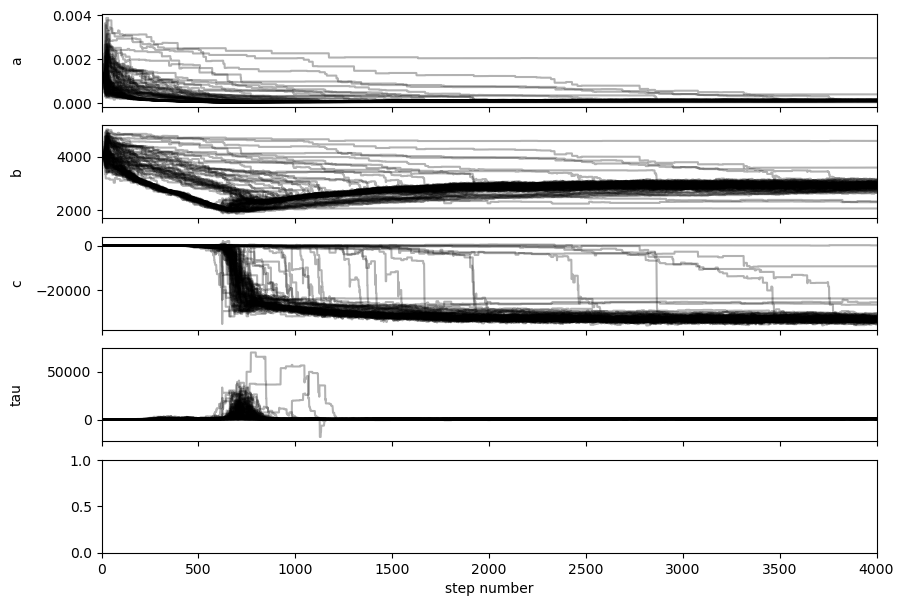

In [27]:
fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["a", "b", "c", "tau"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

(20000, 4)


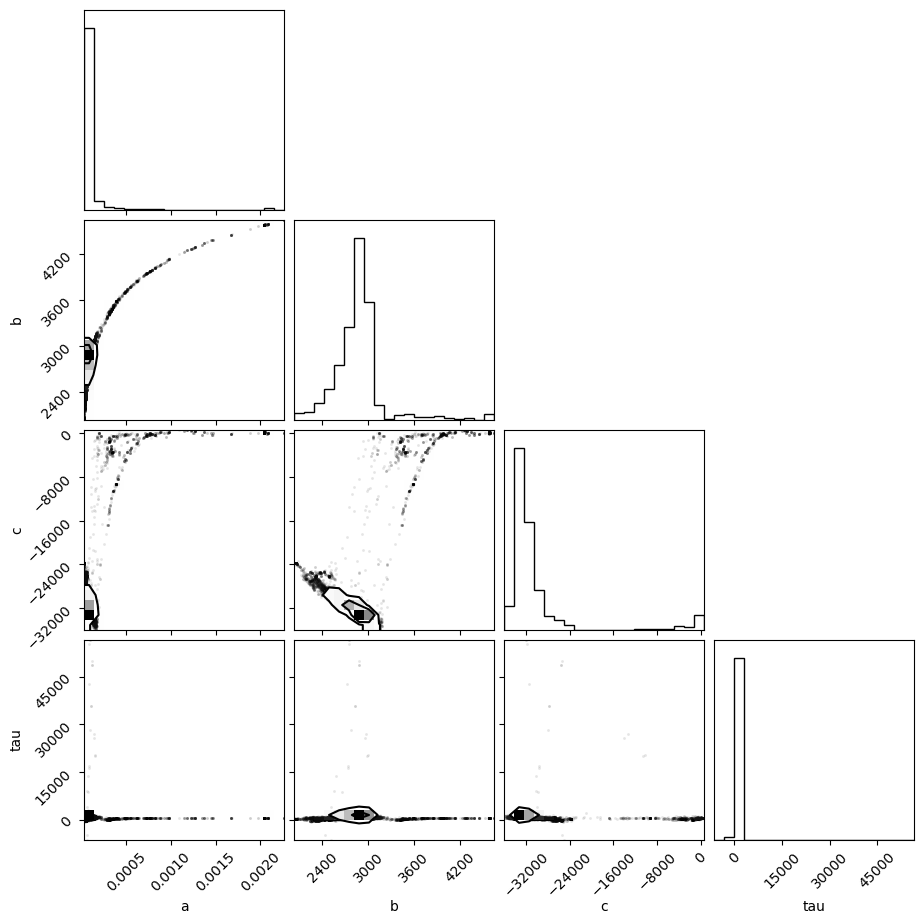

In [28]:
import corner

flat_samples = sampler.get_chain(discard=1000, thin=15, flat=True)
print(flat_samples.shape)

fig = corner.corner(flat_samples, labels=labels)

Text(0.5, 0, 'Time [s]')

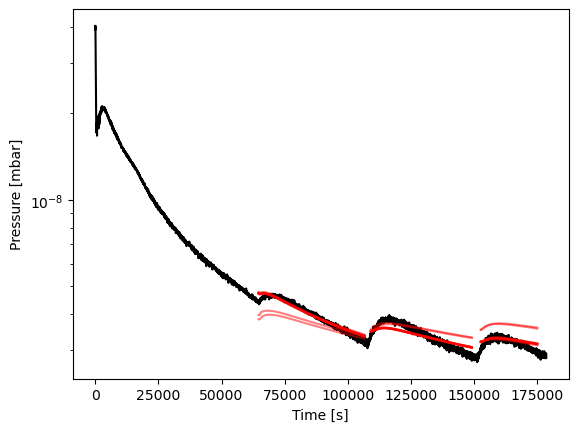

In [38]:
plt.figure()
plt.semilogy(time, p, 'k')
tT_final = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT_final.append((np.vstack((time[gpts],temp[gpts]))))
inds = np.random.randint(len(flat_samples), size=10)
for ind in inds:
    sample = flat_samples[ind]
    for j in range(len(time_slices)):
        tvals = combined_data[j][0]
        plt.plot(tvals, d.fitfunction_short_temp_offset(tT_final[j], sample[0], sample[1], sample[2], sample[3]), 'r', alpha=0.5)

#plt.ylim(4e-9, 2.2e-8)
plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")



In [30]:
from IPython.display import display, Math

CI = 10 ## L/s
Area = 0.01 ## m^2
mbar_to_Pa = 100
K = 0.22
p_atm = 1.01e5 #Pa
m_to_cm = 100
L_to_m3 = 1e-3
KbT = 4.14e-21 #J

mcmc_D0 = np.percentile((flat_samples[:, 0]*CI*mbar_to_Pa*L_to_m3/(K*p_atm*Area) * m_to_cm)**2, [16, 50, 84])
mcmc_Ea = np.percentile(flat_samples[:, 1], [16, 50, 84])

print("D0 [cm^2/s]: ", mcmc_D0)
print("Activation energy [K]: ", mcmc_Ea)
print(flat_samples[:,0])


D0 [cm^2/s]:  [1.03208801e-09 2.22966334e-09 3.45561920e-09]
Activation energy [K]:  [2624.24109689 2870.59129685 3010.25513335]
[1.37322131e-04 5.86049759e-05 5.31038248e-05 ... 1.14341356e-04
 1.23558187e-04 8.38405936e-05]


In [42]:
def fitfunction(self,tT,a,b,c,d, tau):
        
    dt = tT[0][1] - tT[0][0]  # Assuming t is evenly spaced
    decay_t = np.arange(0, len(tT[0])) * dt  # Define time for the decay function
    decay = np.exp(-decay_t/tau) * (decay_t >= 0)
    Normdecay = decay/np.sum(decay) #Normalize decay function
    padded_data = np.pad(tT[1], (len(decay)-1, 0), mode='edge')  # Pad data with values similar to edge to resolve boundary issues
    smooth_step = np.convolve(padded_data, Normdecay, mode='valid') #Convolve two functions

    factor = np.exp(-1.0*b/(smooth_step))
    pi = 3.141592653589793
    
    function = 0

    for n in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
        function += (4*a/d)*(c) * factor * np.exp(-1.0*((((2*n)+1)*(pi)/d)**2)*tT[0]*c*factor)

    return function



In [46]:
function = 0
a='a'
d='d'
c='c'
b='b'
pi='pi'
tT[0] = 'tT[0]'
smooth_step = 'smooth_step'
factor = 'np.exp(-1.0*b/(smooth_step))'

for n in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
        function += (4*a/d)*(c) * factor * np.exp(-1.0*((((2*n)+1)*(pi)/d)**2)*tT[0]*c*factor)

TypeError: unsupported operand type(s) for /: 'str' and 'str'